In [1]:
import zipfile
import os

# Extract the ZIP file
with zipfile.ZipFile('/content/drive/MyDrive/subset.zip', 'r') as zip_ref:
    zip_ref.extractall('subset')



# List the contents of the extracted folder
extracted_folder = 'subset'
print(os.listdir(extracted_folder))
try:
    import google.colab
    !pip install tensorflow scikit-learn opencv-python-headless tqdm


except ImportError:
    print("Not running in Google Colab. Skipping installation.")

['img_test', 'train', 'words_val', 'words_train', 'words_test', 'img_val', 'test', 'val', 'img_train']


In [8]:
import os
import json
import xml.etree.ElementTree as ET
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
try:
    import google.colab
    !pip install tensorflow scikit-learn opencv-python-headless tqdm pdf2image # Install pdf2image
    !pip install tensorflow scikit-learn opencv-python-headless tqdm pdf2image reportlab # Install necessary libraries including reportlab
    # Restart the runtime after installing the libraries to ensure they are loaded.
    # In Colab, you can do this by going to "Runtime" -> "Restart runtime"
except ImportError:
    print("Not running in Google Colab. Skipping installation.")

print("Libraries imported successfully!")

# Ensure that the import statement for reportlab is after the installation:
from reportlab.pdfgen import canvas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 19.5 MB/s eta 0:00:00
Libraries imported successfully!


In [11]:
def parse_annotations_batch(annotation_dir, image_dir, image_size, batch_size=32):
    """
    Parse XML or JSON annotations in batches to save memory.

    Args:
        annotation_dir (str): Path to annotation files.
        image_dir (str): Path to image files.
        image_size (tuple): Resize images to this size (height, width).
        batch_size (int): Number of files to process per batch.

    Yields:
        images (np.array): Batch of preprocessed images.
        targets (dict): Corresponding bounding boxes and class labels.
    """
    annotation_files = os.listdir(annotation_dir)
    num_files = len(annotation_files)
    np.random.shuffle(annotation_files)  # Shuffle for randomness

    print(f"Processing {num_files} annotations in batches of {batch_size}...")
    for i in range(0, num_files, batch_size):
        images, bboxes, labels = [], [], []
        batch_files = annotation_files[i:i + batch_size]

        for annotation_file in tqdm(batch_files, desc="Parsing batch"):
            annotation_path = os.path.join(annotation_dir, annotation_file)
            image_path = os.path.join(image_dir, annotation_file.replace('.xml', '.jpg').replace('.json', '.jpg'))

            # Load and preprocess the image
            image = cv2.imread(image_path)
            if image is None:
                print(f"Skipping: {image_path} (not found)")
                continue
            image = cv2.resize(image, image_size)
            images.append(image / 255.0)  # Normalize to [0, 1]

            # Parse annotation
            if annotation_file.endswith('.xml'):
                tree = ET.parse(annotation_path)
                root = tree.getroot()
                obj = root.find('object')  # Assumes one object per image
                bbox = obj.find('bndbox')
                x_min = int(float(bbox.find('xmin').text))
                y_min = int(float(bbox.find('ymin').text))
                x_max = int(float(bbox.find('xmax').text))
                y_max = int(float(bbox.find('ymax').text))
                bboxes.append([x_min, y_min, x_max, y_max])
                labels.append(1)  # Label '1' for table

            elif annotation_file.endswith('.json'):
                with open(annotation_path, 'r') as f:
                    data = json.load(f)
                    bbox = data['objects'][0]['bbox']  # Assumes one object per image
                    x_min, y_min, x_max, y_max = map(float, bbox)
                    bboxes.append([int(x_min), int(y_min), int(x_max), int(y_max)])
                    labels.append(1)

        yield np.array(images), {'bbox': np.array(bboxes), 'class': np.array(labels)}


In [12]:
def data_generator(annotation_dir, image_dir, image_size, batch_size=32):
    """
    A generator to load and preprocess data in batches during training.
    """
    while True:
        for images, targets in parse_annotations_batch(annotation_dir, image_dir, image_size, batch_size):
            yield images, targets


In [13]:
def build_cnn_model(input_shape):
    """
    Build a CNN model for table detection.

    Args:
        input_shape (tuple): Input image shape (height, width, channels).

    Returns:
        model (tf.keras.Model): A compiled CNN model.
    """
    inputs = tf.keras.Input(shape=input_shape)

    # Feature extraction layers
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fully connected layers
    x = layers.Flatten()(x)
    x = layers.Dense(128, activation='relu')(x)

    # Outputs
    bbox_output = layers.Dense(4, activation='linear', name='bbox')(x)  # Bounding box regression
    class_output = layers.Dense(1, activation='sigmoid', name='class')(x)  # Classification (table or not)

    model = models.Model(inputs=inputs, outputs=[bbox_output, class_output])

    model.compile(
        optimizer='adam',
        loss={'bbox': 'mse', 'class': 'binary_crossentropy'},
        metrics={'bbox': 'mse', 'class': 'accuracy'}
    )

    return model


In [14]:
# Define paths
DATA_DIR = "/content/subset"
IMAGE_SIZE = (128, 128)

# Initialize generators
train_gen = data_generator(os.path.join(DATA_DIR, 'train'), os.path.join(DATA_DIR, 'img_train'), IMAGE_SIZE, batch_size=32)
val_gen = data_generator(os.path.join(DATA_DIR, 'val'), os.path.join(DATA_DIR, 'img_val'), IMAGE_SIZE, batch_size=32)

# Build the model
model = build_cnn_model(input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3))

# Train the model
train_steps = len(os.listdir(os.path.join(DATA_DIR, 'train'))) // 32
val_steps = len(os.listdir(os.path.join(DATA_DIR, 'val'))) // 32

history = model.fit(train_gen, steps_per_epoch=train_steps, validation_data=val_gen, validation_steps=val_steps, epochs=5)

# Save the model
model.save("table_detection_model.h5")
print("Model saved as 'table_detection_model.h5'")


Processing 60000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.38it/s]

Epoch 1/5


   1/1875 ━━━━━━━━━━━━━━━━━━━━ 4:08:26 8s/step - bbox_loss: 116607.5312 - bbox_mse: 116607.5312 - class_accuracy: 1.0000 - class_loss: 0.6020 - loss: 116608.1328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.95it/s]


   2/1875 ━━━━━━━━━━━━━━━━━━━━ 39:36 1s/step - bbox_loss: 116542.6406 - bbox_mse: 116542.6406 - class_accuracy: 1.0000 - class_loss: 0.5921 - loss: 116543.2344  

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.95it/s]


   3/1875 ━━━━━━━━━━━━━━━━━━━━ 39:22 1s/step - bbox_loss: 113243.1094 - bbox_mse: 113243.1094 - class_accuracy: 1.0000 - class_loss: 0.5994 - loss: 113243.7109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.98it/s]


   4/1875 ━━━━━━━━━━━━━━━━━━━━ 38:31 1s/step - bbox_loss: 111239.7578 - bbox_mse: 111239.7578 - class_accuracy: 0.9375 - class_loss: 0.6105 - loss: 111240.3594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.07it/s]


   5/1875 ━━━━━━━━━━━━━━━━━━━━ 37:43 1s/step - bbox_loss: 109181.7969 - bbox_mse: 109181.7969 - class_accuracy: 0.9100 - class_loss: 0.6147 - loss: 109182.4062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.49it/s]


   6/1875 ━━━━━━━━━━━━━━━━━━━━ 37:26 1s/step - bbox_loss: 105880.5312 - bbox_mse: 105880.5312 - class_accuracy: 0.8972 - class_loss: 0.6018 - loss: 105881.1328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.20it/s]


   7/1875 ━━━━━━━━━━━━━━━━━━━━ 37:07 1s/step - bbox_loss: 102010.2891 - bbox_mse: 102010.2891 - class_accuracy: 0.8915 - class_loss: 0.5816 - loss: 102010.8672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.33it/s]


   8/1875 ━━━━━━━━━━━━━━━━━━━━ 36:59 1s/step - bbox_loss: 98382.5703 - bbox_mse: 98382.5703 - class_accuracy: 0.8894 - class_loss: 0.5593 - loss: 98383.1328   

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.60it/s]


   9/1875 ━━━━━━━━━━━━━━━━━━━━ 37:36 1s/step - bbox_loss: 95141.5312 - bbox_mse: 95141.5312 - class_accuracy: 0.8894 - class_loss: 0.5370 - loss: 95142.0703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.79it/s] 


  10/1875 ━━━━━━━━━━━━━━━━━━━━ 39:24 1s/step - bbox_loss: 92012.5078 - bbox_mse: 92012.5078 - class_accuracy: 0.8904 - class_loss: 0.5155 - loss: 92013.0234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.85it/s]


  11/1875 ━━━━━━━━━━━━━━━━━━━━ 41:27 1s/step - bbox_loss: 89043.7031 - bbox_mse: 89043.7031 - class_accuracy: 0.8921 - class_loss: 0.4953 - loss: 89044.2031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.74it/s]


  12/1875 ━━━━━━━━━━━━━━━━━━━━ 42:44 1s/step - bbox_loss: 86245.0000 - bbox_mse: 86245.0000 - class_accuracy: 0.8942 - class_loss: 0.4764 - loss: 86245.4766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.12it/s]


  13/1875 ━━━━━━━━━━━━━━━━━━━━ 42:07 1s/step - bbox_loss: 83647.2109 - bbox_mse: 83647.2109 - class_accuracy: 0.8964 - class_loss: 0.4589 - loss: 83647.6719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.54it/s]


  14/1875 ━━━━━━━━━━━━━━━━━━━━ 41:38 1s/step - bbox_loss: 81241.7656 - bbox_mse: 81241.7656 - class_accuracy: 0.8987 - class_loss: 0.4425 - loss: 81242.2109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.77it/s]


  15/1875 ━━━━━━━━━━━━━━━━━━━━ 41:12 1s/step - bbox_loss: 79034.6406 - bbox_mse: 79034.6406 - class_accuracy: 0.9010 - class_loss: 0.4274 - loss: 79035.0703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.65it/s]


  16/1875 ━━━━━━━━━━━━━━━━━━━━ 40:53 1s/step - bbox_loss: 76985.3203 - bbox_mse: 76985.3203 - class_accuracy: 0.9033 - class_loss: 0.4133 - loss: 76985.7422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.70it/s]


  17/1875 ━━━━━━━━━━━━━━━━━━━━ 40:32 1s/step - bbox_loss: 75072.6328 - bbox_mse: 75072.6328 - class_accuracy: 0.9055 - class_loss: 0.4001 - loss: 75073.0391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.97it/s]


  18/1875 ━━━━━━━━━━━━━━━━━━━━ 40:12 1s/step - bbox_loss: 73290.9375 - bbox_mse: 73290.9375 - class_accuracy: 0.9077 - class_loss: 0.3878 - loss: 73291.3281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.35it/s]


  19/1875 ━━━━━━━━━━━━━━━━━━━━ 39:56 1s/step - bbox_loss: 71613.8906 - bbox_mse: 71613.8906 - class_accuracy: 0.9098 - class_loss: 0.3764 - loss: 71614.2656

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.85it/s]


  20/1875 ━━━━━━━━━━━━━━━━━━━━ 39:46 1s/step - bbox_loss: 70036.7109 - bbox_mse: 70036.7109 - class_accuracy: 0.9118 - class_loss: 0.3656 - loss: 70037.0781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.82it/s]


  21/1875 ━━━━━━━━━━━━━━━━━━━━ 39:41 1s/step - bbox_loss: 68557.0703 - bbox_mse: 68557.0703 - class_accuracy: 0.9137 - class_loss: 0.3555 - loss: 68557.4219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.71it/s]


  22/1875 ━━━━━━━━━━━━━━━━━━━━ 40:29 1s/step - bbox_loss: 67165.4531 - bbox_mse: 67165.4531 - class_accuracy: 0.9156 - class_loss: 0.3460 - loss: 67165.8047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.59it/s]


  23/1875 ━━━━━━━━━━━━━━━━━━━━ 41:14 1s/step - bbox_loss: 65860.0547 - bbox_mse: 65860.0547 - class_accuracy: 0.9173 - class_loss: 0.3371 - loss: 65860.3906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.63it/s]


  24/1875 ━━━━━━━━━━━━━━━━━━━━ 41:49 1s/step - bbox_loss: 64612.9531 - bbox_mse: 64612.9531 - class_accuracy: 0.9191 - class_loss: 0.3286 - loss: 64613.2852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.01it/s]


  25/1875 ━━━━━━━━━━━━━━━━━━━━ 42:05 1s/step - bbox_loss: 63425.0781 - bbox_mse: 63425.0781 - class_accuracy: 0.9207 - class_loss: 0.3206 - loss: 63425.3984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.41it/s]


  26/1875 ━━━━━━━━━━━━━━━━━━━━ 41:47 1s/step - bbox_loss: 62294.1367 - bbox_mse: 62294.1367 - class_accuracy: 0.9223 - class_loss: 0.3131 - loss: 62294.4531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.12it/s]


  27/1875 ━━━━━━━━━━━━━━━━━━━━ 41:30 1s/step - bbox_loss: 61215.0312 - bbox_mse: 61215.0312 - class_accuracy: 0.9238 - class_loss: 0.3059 - loss: 61215.3398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.99it/s]


  28/1875 ━━━━━━━━━━━━━━━━━━━━ 41:12 1s/step - bbox_loss: 60184.7578 - bbox_mse: 60184.7578 - class_accuracy: 0.9252 - class_loss: 0.2991 - loss: 60185.0586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.82it/s]


  29/1875 ━━━━━━━━━━━━━━━━━━━━ 40:56 1s/step - bbox_loss: 59200.2148 - bbox_mse: 59200.2148 - class_accuracy: 0.9266 - class_loss: 0.2926 - loss: 59200.5117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.08it/s]


  30/1875 ━━━━━━━━━━━━━━━━━━━━ 40:39 1s/step - bbox_loss: 58261.3281 - bbox_mse: 58261.3281 - class_accuracy: 0.9279 - class_loss: 0.2864 - loss: 58261.6133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.93it/s]


  31/1875 ━━━━━━━━━━━━━━━━━━━━ 40:26 1s/step - bbox_loss: 57367.0000 - bbox_mse: 57367.0000 - class_accuracy: 0.9292 - class_loss: 0.2805 - loss: 57367.2812

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.81it/s]


  32/1875 ━━━━━━━━━━━━━━━━━━━━ 40:11 1s/step - bbox_loss: 56508.3008 - bbox_mse: 56508.3008 - class_accuracy: 0.9305 - class_loss: 0.2749 - loss: 56508.5781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.55it/s]


  33/1875 ━━━━━━━━━━━━━━━━━━━━ 39:59 1s/step - bbox_loss: 55684.1328 - bbox_mse: 55684.1328 - class_accuracy: 0.9317 - class_loss: 0.2696 - loss: 55684.4023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.40it/s]


  34/1875 ━━━━━━━━━━━━━━━━━━━━ 40:08 1s/step - bbox_loss: 54895.3242 - bbox_mse: 54895.3242 - class_accuracy: 0.9328 - class_loss: 0.2644 - loss: 54895.5898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.66it/s]


  35/1875 ━━━━━━━━━━━━━━━━━━━━ 40:40 1s/step - bbox_loss: 54136.1797 - bbox_mse: 54136.1797 - class_accuracy: 0.9339 - class_loss: 0.2595 - loss: 54136.4414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.36it/s]


  36/1875 ━━━━━━━━━━━━━━━━━━━━ 41:21 1s/step - bbox_loss: 53411.1367 - bbox_mse: 53411.1367 - class_accuracy: 0.9350 - class_loss: 0.2548 - loss: 53411.3906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.78it/s]


  37/1875 ━━━━━━━━━━━━━━━━━━━━ 42:02 1s/step - bbox_loss: 52714.2070 - bbox_mse: 52714.2070 - class_accuracy: 0.9360 - class_loss: 0.2502 - loss: 52714.4570

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.50it/s]


  38/1875 ━━━━━━━━━━━━━━━━━━━━ 41:47 1s/step - bbox_loss: 52042.9375 - bbox_mse: 52042.9375 - class_accuracy: 0.9370 - class_loss: 0.2459 - loss: 52043.1836

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.69it/s]


  39/1875 ━━━━━━━━━━━━━━━━━━━━ 41:35 1s/step - bbox_loss: 51394.2070 - bbox_mse: 51394.2070 - class_accuracy: 0.9379 - class_loss: 0.2417 - loss: 51394.4531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.24it/s]


  40/1875 ━━━━━━━━━━━━━━━━━━━━ 41:22 1s/step - bbox_loss: 50767.6992 - bbox_mse: 50767.6992 - class_accuracy: 0.9389 - class_loss: 0.2377 - loss: 50767.9375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.05it/s]


  41/1875 ━━━━━━━━━━━━━━━━━━━━ 41:09 1s/step - bbox_loss: 50164.2344 - bbox_mse: 50164.2344 - class_accuracy: 0.9398 - class_loss: 0.2338 - loss: 50164.4688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.62it/s]


  42/1875 ━━━━━━━━━━━━━━━━━━━━ 41:01 1s/step - bbox_loss: 49579.6250 - bbox_mse: 49579.6250 - class_accuracy: 0.9406 - class_loss: 0.2301 - loss: 49579.8555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.04it/s]


  43/1875 ━━━━━━━━━━━━━━━━━━━━ 40:49 1s/step - bbox_loss: 49015.5742 - bbox_mse: 49015.5742 - class_accuracy: 0.9415 - class_loss: 0.2265 - loss: 49015.8008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.44it/s]


  44/1875 ━━━━━━━━━━━━━━━━━━━━ 40:39 1s/step - bbox_loss: 48470.4492 - bbox_mse: 48470.4492 - class_accuracy: 0.9423 - class_loss: 0.2230 - loss: 48470.6719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.91it/s]


  45/1875 ━━━━━━━━━━━━━━━━━━━━ 40:28 1s/step - bbox_loss: 47943.5703 - bbox_mse: 47943.5703 - class_accuracy: 0.9431 - class_loss: 0.2196 - loss: 47943.7930

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.56it/s]


  46/1875 ━━━━━━━━━━━━━━━━━━━━ 40:20 1s/step - bbox_loss: 47433.2773 - bbox_mse: 47433.2773 - class_accuracy: 0.9438 - class_loss: 0.2164 - loss: 47433.4961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.24it/s]


  47/1875 ━━━━━━━━━━━━━━━━━━━━ 40:35 1s/step - bbox_loss: 46939.0195 - bbox_mse: 46939.0195 - class_accuracy: 0.9446 - class_loss: 0.2132 - loss: 46939.2344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.20it/s]


  48/1875 ━━━━━━━━━━━━━━━━━━━━ 41:06 1s/step - bbox_loss: 46459.3320 - bbox_mse: 46459.3320 - class_accuracy: 0.9453 - class_loss: 0.2102 - loss: 46459.5430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.16it/s]


  49/1875 ━━━━━━━━━━━━━━━━━━━━ 41:33 1s/step - bbox_loss: 45993.0898 - bbox_mse: 45993.0898 - class_accuracy: 0.9460 - class_loss: 0.2072 - loss: 45993.2969

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.93it/s] 


  50/1875 ━━━━━━━━━━━━━━━━━━━━ 41:27 1s/step - bbox_loss: 45538.8828 - bbox_mse: 45538.8828 - class_accuracy: 0.9467 - class_loss: 0.2044 - loss: 45539.0898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.34it/s]


  51/1875 ━━━━━━━━━━━━━━━━━━━━ 41:15 1s/step - bbox_loss: 45096.5234 - bbox_mse: 45096.5234 - class_accuracy: 0.9473 - class_loss: 0.2016 - loss: 45096.7266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.37it/s]


  52/1875 ━━━━━━━━━━━━━━━━━━━━ 41:06 1s/step - bbox_loss: 44666.5586 - bbox_mse: 44666.5586 - class_accuracy: 0.9480 - class_loss: 0.1989 - loss: 44666.7578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.85it/s]


  53/1875 ━━━━━━━━━━━━━━━━━━━━ 40:55 1s/step - bbox_loss: 44249.0547 - bbox_mse: 44249.0547 - class_accuracy: 0.9486 - class_loss: 0.1963 - loss: 44249.2539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.55it/s]


  54/1875 ━━━━━━━━━━━━━━━━━━━━ 40:45 1s/step - bbox_loss: 43842.3359 - bbox_mse: 43842.3359 - class_accuracy: 0.9492 - class_loss: 0.1938 - loss: 43842.5312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.72it/s]


  55/1875 ━━━━━━━━━━━━━━━━━━━━ 40:36 1s/step - bbox_loss: 43444.6953 - bbox_mse: 43444.6953 - class_accuracy: 0.9498 - class_loss: 0.1913 - loss: 43444.8867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.65it/s]


  56/1875 ━━━━━━━━━━━━━━━━━━━━ 40:27 1s/step - bbox_loss: 43057.1797 - bbox_mse: 43057.1797 - class_accuracy: 0.9504 - class_loss: 0.1889 - loss: 43057.3672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.43it/s]


  57/1875 ━━━━━━━━━━━━━━━━━━━━ 40:19 1s/step - bbox_loss: 42679.3867 - bbox_mse: 42679.3867 - class_accuracy: 0.9510 - class_loss: 0.1866 - loss: 42679.5742

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.04it/s]


  58/1875 ━━━━━━━━━━━━━━━━━━━━ 40:11 1s/step - bbox_loss: 42310.0039 - bbox_mse: 42310.0039 - class_accuracy: 0.9515 - class_loss: 0.1844 - loss: 42310.1875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.56it/s]


  59/1875 ━━━━━━━━━━━━━━━━━━━━ 40:20 1s/step - bbox_loss: 41949.0195 - bbox_mse: 41949.0195 - class_accuracy: 0.9520 - class_loss: 0.1822 - loss: 41949.2031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.70it/s]


  60/1875 ━━━━━━━━━━━━━━━━━━━━ 40:37 1s/step - bbox_loss: 41597.2109 - bbox_mse: 41597.2109 - class_accuracy: 0.9526 - class_loss: 0.1800 - loss: 41597.3945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.29it/s]


  61/1875 ━━━━━━━━━━━━━━━━━━━━ 40:51 1s/step - bbox_loss: 41254.1523 - bbox_mse: 41254.1523 - class_accuracy: 0.9531 - class_loss: 0.1779 - loss: 41254.3320

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.86it/s]


  62/1875 ━━━━━━━━━━━━━━━━━━━━ 40:55 1s/step - bbox_loss: 40919.9219 - bbox_mse: 40919.9219 - class_accuracy: 0.9536 - class_loss: 0.1759 - loss: 40920.0977

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.07it/s]


  63/1875 ━━━━━━━━━━━━━━━━━━━━ 40:47 1s/step - bbox_loss: 40592.8008 - bbox_mse: 40592.8008 - class_accuracy: 0.9540 - class_loss: 0.1739 - loss: 40592.9766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.86it/s]


  64/1875 ━━━━━━━━━━━━━━━━━━━━ 40:39 1s/step - bbox_loss: 40272.7461 - bbox_mse: 40272.7461 - class_accuracy: 0.9545 - class_loss: 0.1720 - loss: 40272.9219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.38it/s]


  65/1875 ━━━━━━━━━━━━━━━━━━━━ 40:33 1s/step - bbox_loss: 39959.8242 - bbox_mse: 39959.8242 - class_accuracy: 0.9550 - class_loss: 0.1701 - loss: 39959.9922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.25it/s]


  66/1875 ━━━━━━━━━━━━━━━━━━━━ 40:25 1s/step - bbox_loss: 39654.0000 - bbox_mse: 39654.0000 - class_accuracy: 0.9554 - class_loss: 0.1683 - loss: 39654.1719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 172.28it/s]


  67/1875 ━━━━━━━━━━━━━━━━━━━━ 40:17 1s/step - bbox_loss: 39354.8633 - bbox_mse: 39354.8633 - class_accuracy: 0.9559 - class_loss: 0.1665 - loss: 39355.0273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.15it/s]


  68/1875 ━━━━━━━━━━━━━━━━━━━━ 40:09 1s/step - bbox_loss: 39063.1797 - bbox_mse: 39063.1797 - class_accuracy: 0.9563 - class_loss: 0.1647 - loss: 39063.3438

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.14it/s]


  69/1875 ━━━━━━━━━━━━━━━━━━━━ 40:02 1s/step - bbox_loss: 38778.2148 - bbox_mse: 38778.2148 - class_accuracy: 0.9567 - class_loss: 0.1630 - loss: 38778.3750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.03it/s]


  70/1875 ━━━━━━━━━━━━━━━━━━━━ 39:54 1s/step - bbox_loss: 38499.2227 - bbox_mse: 38499.2227 - class_accuracy: 0.9571 - class_loss: 0.1614 - loss: 38499.3828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.30it/s]


  71/1875 ━━━━━━━━━━━━━━━━━━━━ 39:52 1s/step - bbox_loss: 38225.9727 - bbox_mse: 38225.9727 - class_accuracy: 0.9576 - class_loss: 0.1597 - loss: 38226.1328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.12it/s] 


  72/1875 ━━━━━━━━━━━━━━━━━━━━ 40:03 1s/step - bbox_loss: 37958.4180 - bbox_mse: 37958.4180 - class_accuracy: 0.9580 - class_loss: 0.1581 - loss: 37958.5781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.20it/s]


  73/1875 ━━━━━━━━━━━━━━━━━━━━ 40:13 1s/step - bbox_loss: 37696.1484 - bbox_mse: 37696.1484 - class_accuracy: 0.9583 - class_loss: 0.1566 - loss: 37696.3047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.26it/s]


  74/1875 ━━━━━━━━━━━━━━━━━━━━ 40:24 1s/step - bbox_loss: 37439.4961 - bbox_mse: 37439.4961 - class_accuracy: 0.9587 - class_loss: 0.1550 - loss: 37439.6523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.72it/s]


  75/1875 ━━━━━━━━━━━━━━━━━━━━ 40:31 1s/step - bbox_loss: 37188.3203 - bbox_mse: 37188.3203 - class_accuracy: 0.9591 - class_loss: 0.1535 - loss: 37188.4766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.73it/s]


  76/1875 ━━━━━━━━━━━━━━━━━━━━ 40:24 1s/step - bbox_loss: 36942.1641 - bbox_mse: 36942.1641 - class_accuracy: 0.9595 - class_loss: 0.1521 - loss: 36942.3164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.75it/s]


  77/1875 ━━━━━━━━━━━━━━━━━━━━ 40:17 1s/step - bbox_loss: 36700.8633 - bbox_mse: 36700.8633 - class_accuracy: 0.9598 - class_loss: 0.1506 - loss: 36701.0156

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.58it/s]


  78/1875 ━━━━━━━━━━━━━━━━━━━━ 40:10 1s/step - bbox_loss: 36464.1133 - bbox_mse: 36464.1133 - class_accuracy: 0.9602 - class_loss: 0.1492 - loss: 36464.2656

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.66it/s]


  79/1875 ━━━━━━━━━━━━━━━━━━━━ 40:03 1s/step - bbox_loss: 36231.9141 - bbox_mse: 36231.9141 - class_accuracy: 0.9605 - class_loss: 0.1479 - loss: 36232.0625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.21it/s]


  80/1875 ━━━━━━━━━━━━━━━━━━━━ 39:56 1s/step - bbox_loss: 36004.1289 - bbox_mse: 36004.1289 - class_accuracy: 0.9608 - class_loss: 0.1465 - loss: 36004.2773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.17it/s]


  81/1875 ━━━━━━━━━━━━━━━━━━━━ 39:50 1s/step - bbox_loss: 35780.9414 - bbox_mse: 35780.9414 - class_accuracy: 0.9612 - class_loss: 0.1452 - loss: 35781.0898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.10it/s]


  82/1875 ━━━━━━━━━━━━━━━━━━━━ 39:43 1s/step - bbox_loss: 35562.0234 - bbox_mse: 35562.0234 - class_accuracy: 0.9615 - class_loss: 0.1439 - loss: 35562.1680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.75it/s]


  83/1875 ━━━━━━━━━━━━━━━━━━━━ 39:37 1s/step - bbox_loss: 35347.8594 - bbox_mse: 35347.8594 - class_accuracy: 0.9618 - class_loss: 0.1427 - loss: 35348.0039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.96it/s]


  84/1875 ━━━━━━━━━━━━━━━━━━━━ 39:37 1s/step - bbox_loss: 35138.1953 - bbox_mse: 35138.1953 - class_accuracy: 0.9621 - class_loss: 0.1414 - loss: 35138.3398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.82it/s]


  85/1875 ━━━━━━━━━━━━━━━━━━━━ 39:46 1s/step - bbox_loss: 34933.1445 - bbox_mse: 34933.1445 - class_accuracy: 0.9624 - class_loss: 0.1402 - loss: 34933.2852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.72it/s]


  86/1875 ━━━━━━━━━━━━━━━━━━━━ 39:53 1s/step - bbox_loss: 34732.0703 - bbox_mse: 34732.0703 - class_accuracy: 0.9627 - class_loss: 0.1390 - loss: 34732.2109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.94it/s]


  87/1875 ━━━━━━━━━━━━━━━━━━━━ 40:04 1s/step - bbox_loss: 34534.4141 - bbox_mse: 34534.4141 - class_accuracy: 0.9630 - class_loss: 0.1378 - loss: 34534.5508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.80it/s]


  88/1875 ━━━━━━━━━━━━━━━━━━━━ 40:05 1s/step - bbox_loss: 34339.7852 - bbox_mse: 34339.7852 - class_accuracy: 0.9633 - class_loss: 0.1367 - loss: 34339.9219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.25it/s]


  89/1875 ━━━━━━━━━━━━━━━━━━━━ 39:58 1s/step - bbox_loss: 34148.5977 - bbox_mse: 34148.5977 - class_accuracy: 0.9636 - class_loss: 0.1356 - loss: 34148.7344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.55it/s]


  90/1875 ━━━━━━━━━━━━━━━━━━━━ 39:52 1s/step - bbox_loss: 33961.0430 - bbox_mse: 33961.0430 - class_accuracy: 0.9639 - class_loss: 0.1344 - loss: 33961.1758

Parsing batch:   6%|▋         | 2/32 [00:01<00:23,  1.27it/s]

  91/1875 ━━━━━━━━━━━━━━━━━━━━ 39:56 1s/step - bbox_loss: 33776.7070 - bbox_mse: 33776.7070 - class_accuracy: 0.9642 - class_loss: 0.1334 - loss: 33776.8398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.16it/s]


  92/1875 ━━━━━━━━━━━━━━━━━━━━ 39:55 1s/step - bbox_loss: 33595.4102 - bbox_mse: 33595.4102 - class_accuracy: 0.9644 - class_loss: 0.1323 - loss: 33595.5430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.41it/s]


  93/1875 ━━━━━━━━━━━━━━━━━━━━ 39:49 1s/step - bbox_loss: 33417.2500 - bbox_mse: 33417.2500 - class_accuracy: 0.9647 - class_loss: 0.1312 - loss: 33417.3828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 170.65it/s]


  94/1875 ━━━━━━━━━━━━━━━━━━━━ 39:43 1s/step - bbox_loss: 33242.2109 - bbox_mse: 33242.2109 - class_accuracy: 0.9650 - class_loss: 0.1302 - loss: 33242.3398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.18it/s]


  95/1875 ━━━━━━━━━━━━━━━━━━━━ 39:37 1s/step - bbox_loss: 33069.8594 - bbox_mse: 33069.8594 - class_accuracy: 0.9652 - class_loss: 0.1292 - loss: 33069.9883

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.25it/s]


  96/1875 ━━━━━━━━━━━━━━━━━━━━ 39:34 1s/step - bbox_loss: 32900.3633 - bbox_mse: 32900.3633 - class_accuracy: 0.9655 - class_loss: 0.1282 - loss: 32900.4922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.25it/s]


  97/1875 ━━━━━━━━━━━━━━━━━━━━ 39:40 1s/step - bbox_loss: 32733.5977 - bbox_mse: 32733.5977 - class_accuracy: 0.9657 - class_loss: 0.1272 - loss: 32733.7266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.30it/s]


  98/1875 ━━━━━━━━━━━━━━━━━━━━ 39:50 1s/step - bbox_loss: 32569.3203 - bbox_mse: 32569.3203 - class_accuracy: 0.9660 - class_loss: 0.1263 - loss: 32569.4473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.17it/s]


  99/1875 ━━━━━━━━━━━━━━━━━━━━ 39:58 1s/step - bbox_loss: 32408.1660 - bbox_mse: 32408.1660 - class_accuracy: 0.9662 - class_loss: 0.1253 - loss: 32408.2910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.17it/s]


 100/1875 ━━━━━━━━━━━━━━━━━━━━ 39:55 1s/step - bbox_loss: 32249.8359 - bbox_mse: 32249.8359 - class_accuracy: 0.9665 - class_loss: 0.1244 - loss: 32249.9609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.20it/s]


 101/1875 ━━━━━━━━━━━━━━━━━━━━ 39:50 1s/step - bbox_loss: 32094.1562 - bbox_mse: 32094.1562 - class_accuracy: 0.9667 - class_loss: 0.1235 - loss: 32094.2793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.51it/s]


 102/1875 ━━━━━━━━━━━━━━━━━━━━ 39:44 1s/step - bbox_loss: 31940.9434 - bbox_mse: 31940.9434 - class_accuracy: 0.9669 - class_loss: 0.1226 - loss: 31941.0664

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.17it/s]


 103/1875 ━━━━━━━━━━━━━━━━━━━━ 39:38 1s/step - bbox_loss: 31789.9102 - bbox_mse: 31789.9102 - class_accuracy: 0.9672 - class_loss: 0.1217 - loss: 31790.0312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.17it/s]


 104/1875 ━━━━━━━━━━━━━━━━━━━━ 39:33 1s/step - bbox_loss: 31641.2500 - bbox_mse: 31641.2500 - class_accuracy: 0.9674 - class_loss: 0.1208 - loss: 31641.3711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.91it/s]


 105/1875 ━━━━━━━━━━━━━━━━━━━━ 39:28 1s/step - bbox_loss: 31494.7246 - bbox_mse: 31494.7246 - class_accuracy: 0.9676 - class_loss: 0.1199 - loss: 31494.8438

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.64it/s]


 106/1875 ━━━━━━━━━━━━━━━━━━━━ 39:23 1s/step - bbox_loss: 31350.8750 - bbox_mse: 31350.8750 - class_accuracy: 0.9678 - class_loss: 0.1191 - loss: 31350.9961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.99it/s]


 107/1875 ━━━━━━━━━━━━━━━━━━━━ 39:18 1s/step - bbox_loss: 31209.0215 - bbox_mse: 31209.0215 - class_accuracy: 0.9680 - class_loss: 0.1183 - loss: 31209.1406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.08it/s]


 108/1875 ━━━━━━━━━━━━━━━━━━━━ 39:13 1s/step - bbox_loss: 31069.4668 - bbox_mse: 31069.4668 - class_accuracy: 0.9682 - class_loss: 0.1175 - loss: 31069.5840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.71it/s]


 109/1875 ━━━━━━━━━━━━━━━━━━━━ 39:17 1s/step - bbox_loss: 30932.0352 - bbox_mse: 30932.0352 - class_accuracy: 0.9684 - class_loss: 0.1166 - loss: 30932.1523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.76it/s]


 110/1875 ━━━━━━━━━━━━━━━━━━━━ 39:24 1s/step - bbox_loss: 30796.6348 - bbox_mse: 30796.6348 - class_accuracy: 0.9686 - class_loss: 0.1159 - loss: 30796.7520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.35it/s] 


 111/1875 ━━━━━━━━━━━━━━━━━━━━ 39:30 1s/step - bbox_loss: 30663.3848 - bbox_mse: 30663.3848 - class_accuracy: 0.9688 - class_loss: 0.1151 - loss: 30663.5000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.60it/s]


 112/1875 ━━━━━━━━━━━━━━━━━━━━ 39:32 1s/step - bbox_loss: 30532.0098 - bbox_mse: 30532.0098 - class_accuracy: 0.9690 - class_loss: 0.1143 - loss: 30532.1250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.04it/s]


 113/1875 ━━━━━━━━━━━━━━━━━━━━ 39:27 1s/step - bbox_loss: 30402.4043 - bbox_mse: 30402.4043 - class_accuracy: 0.9692 - class_loss: 0.1135 - loss: 30402.5195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.40it/s]


 114/1875 ━━━━━━━━━━━━━━━━━━━━ 39:22 1s/step - bbox_loss: 30274.6191 - bbox_mse: 30274.6191 - class_accuracy: 0.9694 - class_loss: 0.1128 - loss: 30274.7324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.76it/s]


 115/1875 ━━━━━━━━━━━━━━━━━━━━ 39:17 1s/step - bbox_loss: 30148.6094 - bbox_mse: 30148.6094 - class_accuracy: 0.9696 - class_loss: 0.1121 - loss: 30148.7227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.75it/s]


 116/1875 ━━━━━━━━━━━━━━━━━━━━ 39:12 1s/step - bbox_loss: 30024.5508 - bbox_mse: 30024.5508 - class_accuracy: 0.9698 - class_loss: 0.1113 - loss: 30024.6621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.75it/s]


 117/1875 ━━━━━━━━━━━━━━━━━━━━ 39:07 1s/step - bbox_loss: 29902.2852 - bbox_mse: 29902.2852 - class_accuracy: 0.9700 - class_loss: 0.1106 - loss: 29902.3965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.72it/s]


 118/1875 ━━━━━━━━━━━━━━━━━━━━ 39:02 1s/step - bbox_loss: 29781.6484 - bbox_mse: 29781.6484 - class_accuracy: 0.9702 - class_loss: 0.1099 - loss: 29781.7578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.65it/s]


 119/1875 ━━━━━━━━━━━━━━━━━━━━ 38:58 1s/step - bbox_loss: 29663.0078 - bbox_mse: 29663.0078 - class_accuracy: 0.9704 - class_loss: 0.1092 - loss: 29663.1191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.17it/s]


 120/1875 ━━━━━━━━━━━━━━━━━━━━ 38:53 1s/step - bbox_loss: 29546.0488 - bbox_mse: 29546.0488 - class_accuracy: 0.9705 - class_loss: 0.1085 - loss: 29546.1582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.37it/s]


 121/1875 ━━━━━━━━━━━━━━━━━━━━ 38:50 1s/step - bbox_loss: 29430.5781 - bbox_mse: 29430.5781 - class_accuracy: 0.9707 - class_loss: 0.1079 - loss: 29430.6875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.16it/s]


 122/1875 ━━━━━━━━━━━━━━━━━━━━ 38:56 1s/step - bbox_loss: 29316.7852 - bbox_mse: 29316.7852 - class_accuracy: 0.9709 - class_loss: 0.1072 - loss: 29316.8945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.77it/s]


 123/1875 ━━━━━━━━━━━━━━━━━━━━ 39:02 1s/step - bbox_loss: 29204.4688 - bbox_mse: 29204.4688 - class_accuracy: 0.9711 - class_loss: 0.1065 - loss: 29204.5762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.95it/s]


 124/1875 ━━━━━━━━━━━━━━━━━━━━ 39:08 1s/step - bbox_loss: 29093.5703 - bbox_mse: 29093.5703 - class_accuracy: 0.9712 - class_loss: 0.1059 - loss: 29093.6777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.59it/s]


 125/1875 ━━━━━━━━━━━━━━━━━━━━ 39:07 1s/step - bbox_loss: 28984.1172 - bbox_mse: 28984.1172 - class_accuracy: 0.9714 - class_loss: 0.1052 - loss: 28984.2227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.45it/s]


 126/1875 ━━━━━━━━━━━━━━━━━━━━ 39:03 1s/step - bbox_loss: 28876.1523 - bbox_mse: 28876.1523 - class_accuracy: 0.9716 - class_loss: 0.1046 - loss: 28876.2578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.16it/s]


 127/1875 ━━━━━━━━━━━━━━━━━━━━ 38:58 1s/step - bbox_loss: 28769.8008 - bbox_mse: 28769.8008 - class_accuracy: 0.9717 - class_loss: 0.1040 - loss: 28769.9043

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.89it/s]


 128/1875 ━━━━━━━━━━━━━━━━━━━━ 38:53 1s/step - bbox_loss: 28664.5820 - bbox_mse: 28664.5820 - class_accuracy: 0.9719 - class_loss: 0.1034 - loss: 28664.6875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.78it/s]


 129/1875 ━━━━━━━━━━━━━━━━━━━━ 38:49 1s/step - bbox_loss: 28560.5508 - bbox_mse: 28560.5508 - class_accuracy: 0.9720 - class_loss: 0.1028 - loss: 28560.6543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.01it/s]


 130/1875 ━━━━━━━━━━━━━━━━━━━━ 38:45 1s/step - bbox_loss: 28457.9512 - bbox_mse: 28457.9512 - class_accuracy: 0.9722 - class_loss: 0.1022 - loss: 28458.0547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.63it/s]


 131/1875 ━━━━━━━━━━━━━━━━━━━━ 38:40 1s/step - bbox_loss: 28356.4844 - bbox_mse: 28356.4844 - class_accuracy: 0.9723 - class_loss: 0.1016 - loss: 28356.5879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.77it/s]


 132/1875 ━━━━━━━━━━━━━━━━━━━━ 38:36 1s/step - bbox_loss: 28256.1016 - bbox_mse: 28256.1016 - class_accuracy: 0.9725 - class_loss: 0.1010 - loss: 28256.2031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.99it/s]


 133/1875 ━━━━━━━━━━━━━━━━━━━━ 38:32 1s/step - bbox_loss: 28156.9316 - bbox_mse: 28156.9316 - class_accuracy: 0.9726 - class_loss: 0.1004 - loss: 28157.0312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.06it/s]


 134/1875 ━━━━━━━━━━━━━━━━━━━━ 38:31 1s/step - bbox_loss: 28059.0020 - bbox_mse: 28059.0020 - class_accuracy: 0.9728 - class_loss: 0.0998 - loss: 28059.1016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.80it/s]


 135/1875 ━━━━━━━━━━━━━━━━━━━━ 38:35 1s/step - bbox_loss: 27962.4023 - bbox_mse: 27962.4023 - class_accuracy: 0.9729 - class_loss: 0.0993 - loss: 27962.5020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.84it/s] 


 136/1875 ━━━━━━━━━━━━━━━━━━━━ 38:40 1s/step - bbox_loss: 27866.8027 - bbox_mse: 27866.8027 - class_accuracy: 0.9731 - class_loss: 0.0987 - loss: 27866.9023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.94it/s]


 137/1875 ━━━━━━━━━━━━━━━━━━━━ 38:45 1s/step - bbox_loss: 27772.4707 - bbox_mse: 27772.4707 - class_accuracy: 0.9732 - class_loss: 0.0982 - loss: 27772.5703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.47it/s] 


 138/1875 ━━━━━━━━━━━━━━━━━━━━ 38:44 1s/step - bbox_loss: 27679.1562 - bbox_mse: 27679.1562 - class_accuracy: 0.9734 - class_loss: 0.0976 - loss: 27679.2539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.92it/s]


 139/1875 ━━━━━━━━━━━━━━━━━━━━ 38:40 1s/step - bbox_loss: 27586.7598 - bbox_mse: 27586.7598 - class_accuracy: 0.9735 - class_loss: 0.0971 - loss: 27586.8574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.91it/s]


 140/1875 ━━━━━━━━━━━━━━━━━━━━ 38:36 1s/step - bbox_loss: 27495.4727 - bbox_mse: 27495.4727 - class_accuracy: 0.9736 - class_loss: 0.0966 - loss: 27495.5703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.44it/s]


 141/1875 ━━━━━━━━━━━━━━━━━━━━ 38:33 1s/step - bbox_loss: 27405.1621 - bbox_mse: 27405.1621 - class_accuracy: 0.9738 - class_loss: 0.0960 - loss: 27405.2578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.35it/s]


 142/1875 ━━━━━━━━━━━━━━━━━━━━ 38:29 1s/step - bbox_loss: 27315.8730 - bbox_mse: 27315.8730 - class_accuracy: 0.9739 - class_loss: 0.0955 - loss: 27315.9688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.05it/s]


 143/1875 ━━━━━━━━━━━━━━━━━━━━ 38:26 1s/step - bbox_loss: 27227.5879 - bbox_mse: 27227.5879 - class_accuracy: 0.9741 - class_loss: 0.0950 - loss: 27227.6836

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.18it/s]


 144/1875 ━━━━━━━━━━━━━━━━━━━━ 38:23 1s/step - bbox_loss: 27140.3477 - bbox_mse: 27140.3477 - class_accuracy: 0.9742 - class_loss: 0.0945 - loss: 27140.4414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.74it/s]


 145/1875 ━━━━━━━━━━━━━━━━━━━━ 38:19 1s/step - bbox_loss: 27054.0156 - bbox_mse: 27054.0156 - class_accuracy: 0.9743 - class_loss: 0.0940 - loss: 27054.1094

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.88it/s]


 146/1875 ━━━━━━━━━━━━━━━━━━━━ 38:16 1s/step - bbox_loss: 26968.5723 - bbox_mse: 26968.5723 - class_accuracy: 0.9744 - class_loss: 0.0935 - loss: 26968.6660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.32it/s]


 147/1875 ━━━━━━━━━━━━━━━━━━━━ 38:20 1s/step - bbox_loss: 26884.1172 - bbox_mse: 26884.1172 - class_accuracy: 0.9746 - class_loss: 0.0930 - loss: 26884.2109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.69it/s] 


 148/1875 ━━━━━━━━━━━━━━━━━━━━ 38:31 1s/step - bbox_loss: 26800.4551 - bbox_mse: 26800.4551 - class_accuracy: 0.9747 - class_loss: 0.0925 - loss: 26800.5469

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 75.13it/s]


 149/1875 ━━━━━━━━━━━━━━━━━━━━ 38:36 1s/step - bbox_loss: 26717.7676 - bbox_mse: 26717.7676 - class_accuracy: 0.9748 - class_loss: 0.0921 - loss: 26717.8594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.76it/s]


 150/1875 ━━━━━━━━━━━━━━━━━━━━ 38:36 1s/step - bbox_loss: 26635.9434 - bbox_mse: 26635.9434 - class_accuracy: 0.9749 - class_loss: 0.0916 - loss: 26636.0352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.56it/s]


 151/1875 ━━━━━━━━━━━━━━━━━━━━ 38:32 1s/step - bbox_loss: 26555.0488 - bbox_mse: 26555.0488 - class_accuracy: 0.9751 - class_loss: 0.0911 - loss: 26555.1387

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.88it/s]


 152/1875 ━━━━━━━━━━━━━━━━━━━━ 38:29 1s/step - bbox_loss: 26475.0898 - bbox_mse: 26475.0898 - class_accuracy: 0.9752 - class_loss: 0.0907 - loss: 26475.1797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.50it/s]


 153/1875 ━━━━━━━━━━━━━━━━━━━━ 38:25 1s/step - bbox_loss: 26395.9941 - bbox_mse: 26395.9941 - class_accuracy: 0.9753 - class_loss: 0.0902 - loss: 26396.0859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.22it/s]


 154/1875 ━━━━━━━━━━━━━━━━━━━━ 38:21 1s/step - bbox_loss: 26317.8125 - bbox_mse: 26317.8125 - class_accuracy: 0.9754 - class_loss: 0.0898 - loss: 26317.9023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.03it/s]


 155/1875 ━━━━━━━━━━━━━━━━━━━━ 38:17 1s/step - bbox_loss: 26240.5254 - bbox_mse: 26240.5254 - class_accuracy: 0.9755 - class_loss: 0.0893 - loss: 26240.6152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.31it/s]


 156/1875 ━━━━━━━━━━━━━━━━━━━━ 38:13 1s/step - bbox_loss: 26164.0410 - bbox_mse: 26164.0410 - class_accuracy: 0.9757 - class_loss: 0.0889 - loss: 26164.1309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.47it/s]


 157/1875 ━━━━━━━━━━━━━━━━━━━━ 38:10 1s/step - bbox_loss: 26088.3750 - bbox_mse: 26088.3750 - class_accuracy: 0.9758 - class_loss: 0.0885 - loss: 26088.4629

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.53it/s]


 158/1875 ━━━━━━━━━━━━━━━━━━━━ 38:06 1s/step - bbox_loss: 26013.4473 - bbox_mse: 26013.4473 - class_accuracy: 0.9759 - class_loss: 0.0880 - loss: 26013.5352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.32it/s]


 159/1875 ━━━━━━━━━━━━━━━━━━━━ 38:05 1s/step - bbox_loss: 25939.2969 - bbox_mse: 25939.2969 - class_accuracy: 0.9760 - class_loss: 0.0876 - loss: 25939.3848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.93it/s]


 160/1875 ━━━━━━━━━━━━━━━━━━━━ 38:08 1s/step - bbox_loss: 25865.9746 - bbox_mse: 25865.9746 - class_accuracy: 0.9761 - class_loss: 0.0872 - loss: 25866.0625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.22it/s]


 161/1875 ━━━━━━━━━━━━━━━━━━━━ 38:12 1s/step - bbox_loss: 25793.3906 - bbox_mse: 25793.3906 - class_accuracy: 0.9762 - class_loss: 0.0868 - loss: 25793.4785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.02it/s]


 162/1875 ━━━━━━━━━━━━━━━━━━━━ 38:15 1s/step - bbox_loss: 25721.4062 - bbox_mse: 25721.4062 - class_accuracy: 0.9763 - class_loss: 0.0863 - loss: 25721.4941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.48it/s]


 163/1875 ━━━━━━━━━━━━━━━━━━━━ 38:14 1s/step - bbox_loss: 25650.1055 - bbox_mse: 25650.1055 - class_accuracy: 0.9764 - class_loss: 0.0859 - loss: 25650.1914

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.95it/s]


 164/1875 ━━━━━━━━━━━━━━━━━━━━ 38:10 1s/step - bbox_loss: 25579.6875 - bbox_mse: 25579.6875 - class_accuracy: 0.9765 - class_loss: 0.0855 - loss: 25579.7734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.49it/s]


 165/1875 ━━━━━━━━━━━━━━━━━━━━ 38:07 1s/step - bbox_loss: 25509.9590 - bbox_mse: 25509.9590 - class_accuracy: 0.9766 - class_loss: 0.0851 - loss: 25510.0449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.39it/s]


 166/1875 ━━━━━━━━━━━━━━━━━━━━ 38:03 1s/step - bbox_loss: 25440.8457 - bbox_mse: 25440.8457 - class_accuracy: 0.9768 - class_loss: 0.0847 - loss: 25440.9316

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.92it/s]


 167/1875 ━━━━━━━━━━━━━━━━━━━━ 37:59 1s/step - bbox_loss: 25372.4141 - bbox_mse: 25372.4141 - class_accuracy: 0.9769 - class_loss: 0.0843 - loss: 25372.5000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.25it/s]


 168/1875 ━━━━━━━━━━━━━━━━━━━━ 37:55 1s/step - bbox_loss: 25304.6875 - bbox_mse: 25304.6875 - class_accuracy: 0.9770 - class_loss: 0.0840 - loss: 25304.7715

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.69it/s]


 169/1875 ━━━━━━━━━━━━━━━━━━━━ 37:52 1s/step - bbox_loss: 25237.5430 - bbox_mse: 25237.5430 - class_accuracy: 0.9771 - class_loss: 0.0836 - loss: 25237.6270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.43it/s]


 170/1875 ━━━━━━━━━━━━━━━━━━━━ 37:48 1s/step - bbox_loss: 25171.0430 - bbox_mse: 25171.0430 - class_accuracy: 0.9772 - class_loss: 0.0832 - loss: 25171.1270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.67it/s]


 171/1875 ━━━━━━━━━━━━━━━━━━━━ 37:45 1s/step - bbox_loss: 25105.2090 - bbox_mse: 25105.2090 - class_accuracy: 0.9773 - class_loss: 0.0828 - loss: 25105.2910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.53it/s]


 172/1875 ━━━━━━━━━━━━━━━━━━━━ 37:44 1s/step - bbox_loss: 25039.9043 - bbox_mse: 25039.9043 - class_accuracy: 0.9774 - class_loss: 0.0824 - loss: 25039.9863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.42it/s]


 173/1875 ━━━━━━━━━━━━━━━━━━━━ 37:48 1s/step - bbox_loss: 24975.2148 - bbox_mse: 24975.2148 - class_accuracy: 0.9775 - class_loss: 0.0821 - loss: 24975.2969

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.42it/s]


 174/1875 ━━━━━━━━━━━━━━━━━━━━ 37:51 1s/step - bbox_loss: 24911.1465 - bbox_mse: 24911.1465 - class_accuracy: 0.9776 - class_loss: 0.0817 - loss: 24911.2285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.26it/s]


 175/1875 ━━━━━━━━━━━━━━━━━━━━ 37:56 1s/step - bbox_loss: 24847.7227 - bbox_mse: 24847.7227 - class_accuracy: 0.9776 - class_loss: 0.0813 - loss: 24847.8047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.68it/s]


 176/1875 ━━━━━━━━━━━━━━━━━━━━ 37:54 1s/step - bbox_loss: 24784.8711 - bbox_mse: 24784.8711 - class_accuracy: 0.9777 - class_loss: 0.0810 - loss: 24784.9531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.94it/s]


 177/1875 ━━━━━━━━━━━━━━━━━━━━ 37:51 1s/step - bbox_loss: 24722.6133 - bbox_mse: 24722.6133 - class_accuracy: 0.9778 - class_loss: 0.0806 - loss: 24722.6953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.15it/s]


 178/1875 ━━━━━━━━━━━━━━━━━━━━ 37:47 1s/step - bbox_loss: 24660.8398 - bbox_mse: 24660.8398 - class_accuracy: 0.9779 - class_loss: 0.0803 - loss: 24660.9199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.84it/s]


 179/1875 ━━━━━━━━━━━━━━━━━━━━ 37:43 1s/step - bbox_loss: 24599.7246 - bbox_mse: 24599.7246 - class_accuracy: 0.9780 - class_loss: 0.0799 - loss: 24599.8047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.53it/s]


 180/1875 ━━━━━━━━━━━━━━━━━━━━ 37:40 1s/step - bbox_loss: 24539.2852 - bbox_mse: 24539.2852 - class_accuracy: 0.9781 - class_loss: 0.0796 - loss: 24539.3652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.42it/s]


 181/1875 ━━━━━━━━━━━━━━━━━━━━ 37:37 1s/step - bbox_loss: 24479.3457 - bbox_mse: 24479.3457 - class_accuracy: 0.9782 - class_loss: 0.0792 - loss: 24479.4258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.69it/s]


 182/1875 ━━━━━━━━━━━━━━━━━━━━ 37:33 1s/step - bbox_loss: 24419.8926 - bbox_mse: 24419.8926 - class_accuracy: 0.9783 - class_loss: 0.0789 - loss: 24419.9727

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.18it/s]


 183/1875 ━━━━━━━━━━━━━━━━━━━━ 37:30 1s/step - bbox_loss: 24361.0078 - bbox_mse: 24361.0078 - class_accuracy: 0.9784 - class_loss: 0.0786 - loss: 24361.0859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.46it/s]


 184/1875 ━━━━━━━━━━━━━━━━━━━━ 37:26 1s/step - bbox_loss: 24302.6387 - bbox_mse: 24302.6387 - class_accuracy: 0.9785 - class_loss: 0.0782 - loss: 24302.7168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.81it/s]


 185/1875 ━━━━━━━━━━━━━━━━━━━━ 37:28 1s/step - bbox_loss: 24244.7676 - bbox_mse: 24244.7676 - class_accuracy: 0.9786 - class_loss: 0.0779 - loss: 24244.8457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.70it/s]


 186/1875 ━━━━━━━━━━━━━━━━━━━━ 37:32 1s/step - bbox_loss: 24187.4004 - bbox_mse: 24187.4004 - class_accuracy: 0.9786 - class_loss: 0.0776 - loss: 24187.4785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.54it/s]


 187/1875 ━━━━━━━━━━━━━━━━━━━━ 37:35 1s/step - bbox_loss: 24130.5410 - bbox_mse: 24130.5410 - class_accuracy: 0.9787 - class_loss: 0.0773 - loss: 24130.6191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.82it/s]


 188/1875 ━━━━━━━━━━━━━━━━━━━━ 37:39 1s/step - bbox_loss: 24074.1152 - bbox_mse: 24074.1152 - class_accuracy: 0.9788 - class_loss: 0.0769 - loss: 24074.1934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.28it/s]


 189/1875 ━━━━━━━━━━━━━━━━━━━━ 37:36 1s/step - bbox_loss: 24018.2441 - bbox_mse: 24018.2441 - class_accuracy: 0.9789 - class_loss: 0.0766 - loss: 24018.3203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.40it/s]


 190/1875 ━━━━━━━━━━━━━━━━━━━━ 37:32 1s/step - bbox_loss: 23962.8086 - bbox_mse: 23962.8086 - class_accuracy: 0.9790 - class_loss: 0.0763 - loss: 23962.8848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.45it/s]


 191/1875 ━━━━━━━━━━━━━━━━━━━━ 37:29 1s/step - bbox_loss: 23907.8652 - bbox_mse: 23907.8652 - class_accuracy: 0.9791 - class_loss: 0.0760 - loss: 23907.9434

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.47it/s]


 192/1875 ━━━━━━━━━━━━━━━━━━━━ 37:25 1s/step - bbox_loss: 23853.4082 - bbox_mse: 23853.4082 - class_accuracy: 0.9791 - class_loss: 0.0757 - loss: 23853.4844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.63it/s]


 193/1875 ━━━━━━━━━━━━━━━━━━━━ 37:22 1s/step - bbox_loss: 23799.5059 - bbox_mse: 23799.5059 - class_accuracy: 0.9792 - class_loss: 0.0754 - loss: 23799.5820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.51it/s]


 194/1875 ━━━━━━━━━━━━━━━━━━━━ 37:19 1s/step - bbox_loss: 23746.0293 - bbox_mse: 23746.0293 - class_accuracy: 0.9793 - class_loss: 0.0751 - loss: 23746.1055

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.17it/s]


 195/1875 ━━━━━━━━━━━━━━━━━━━━ 37:16 1s/step - bbox_loss: 23693.0391 - bbox_mse: 23693.0391 - class_accuracy: 0.9794 - class_loss: 0.0748 - loss: 23693.1152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.79it/s]


 196/1875 ━━━━━━━━━━━━━━━━━━━━ 37:13 1s/step - bbox_loss: 23640.5117 - bbox_mse: 23640.5117 - class_accuracy: 0.9795 - class_loss: 0.0745 - loss: 23640.5859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.41it/s]


 197/1875 ━━━━━━━━━━━━━━━━━━━━ 37:10 1s/step - bbox_loss: 23588.4629 - bbox_mse: 23588.4629 - class_accuracy: 0.9795 - class_loss: 0.0742 - loss: 23588.5371

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.49it/s]


 198/1875 ━━━━━━━━━━━━━━━━━━━━ 37:13 1s/step - bbox_loss: 23536.9492 - bbox_mse: 23536.9492 - class_accuracy: 0.9796 - class_loss: 0.0739 - loss: 23537.0234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.41it/s]


 199/1875 ━━━━━━━━━━━━━━━━━━━━ 37:16 1s/step - bbox_loss: 23485.7715 - bbox_mse: 23485.7715 - class_accuracy: 0.9797 - class_loss: 0.0736 - loss: 23485.8457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.22it/s]


 200/1875 ━━━━━━━━━━━━━━━━━━━━ 37:18 1s/step - bbox_loss: 23434.9512 - bbox_mse: 23434.9512 - class_accuracy: 0.9798 - class_loss: 0.0733 - loss: 23435.0254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.41it/s]


 201/1875 ━━━━━━━━━━━━━━━━━━━━ 37:18 1s/step - bbox_loss: 23384.5820 - bbox_mse: 23384.5820 - class_accuracy: 0.9799 - class_loss: 0.0730 - loss: 23384.6543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.40it/s]


 202/1875 ━━━━━━━━━━━━━━━━━━━━ 37:14 1s/step - bbox_loss: 23334.6250 - bbox_mse: 23334.6250 - class_accuracy: 0.9799 - class_loss: 0.0728 - loss: 23334.6992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.25it/s]


 203/1875 ━━━━━━━━━━━━━━━━━━━━ 37:11 1s/step - bbox_loss: 23285.0977 - bbox_mse: 23285.0977 - class_accuracy: 0.9800 - class_loss: 0.0725 - loss: 23285.1699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.24it/s]


 204/1875 ━━━━━━━━━━━━━━━━━━━━ 37:08 1s/step - bbox_loss: 23236.0234 - bbox_mse: 23236.0234 - class_accuracy: 0.9801 - class_loss: 0.0722 - loss: 23236.0957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.27it/s]


 205/1875 ━━━━━━━━━━━━━━━━━━━━ 37:05 1s/step - bbox_loss: 23187.3496 - bbox_mse: 23187.3496 - class_accuracy: 0.9801 - class_loss: 0.0719 - loss: 23187.4219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.13it/s]


 206/1875 ━━━━━━━━━━━━━━━━━━━━ 37:02 1s/step - bbox_loss: 23139.0801 - bbox_mse: 23139.0801 - class_accuracy: 0.9802 - class_loss: 0.0717 - loss: 23139.1523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.13it/s]


 207/1875 ━━━━━━━━━━━━━━━━━━━━ 36:59 1s/step - bbox_loss: 23091.2695 - bbox_mse: 23091.2695 - class_accuracy: 0.9803 - class_loss: 0.0714 - loss: 23091.3398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.60it/s]


 208/1875 ━━━━━━━━━━━━━━━━━━━━ 36:56 1s/step - bbox_loss: 23043.8691 - bbox_mse: 23043.8691 - class_accuracy: 0.9804 - class_loss: 0.0711 - loss: 23043.9395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.48it/s]


 209/1875 ━━━━━━━━━━━━━━━━━━━━ 36:53 1s/step - bbox_loss: 22996.8281 - bbox_mse: 22996.8281 - class_accuracy: 0.9804 - class_loss: 0.0708 - loss: 22996.9004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.55it/s]


 210/1875 ━━━━━━━━━━━━━━━━━━━━ 36:53 1s/step - bbox_loss: 22950.0859 - bbox_mse: 22950.0859 - class_accuracy: 0.9805 - class_loss: 0.0706 - loss: 22950.1582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.11it/s]


 211/1875 ━━━━━━━━━━━━━━━━━━━━ 36:56 1s/step - bbox_loss: 22903.7402 - bbox_mse: 22903.7402 - class_accuracy: 0.9806 - class_loss: 0.0703 - loss: 22903.8105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.27it/s]


 212/1875 ━━━━━━━━━━━━━━━━━━━━ 36:58 1s/step - bbox_loss: 22857.7500 - bbox_mse: 22857.7500 - class_accuracy: 0.9806 - class_loss: 0.0701 - loss: 22857.8203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.10it/s]


 213/1875 ━━━━━━━━━━━━━━━━━━━━ 37:01 1s/step - bbox_loss: 22812.0820 - bbox_mse: 22812.0820 - class_accuracy: 0.9807 - class_loss: 0.0698 - loss: 22812.1523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.58it/s]


 214/1875 ━━━━━━━━━━━━━━━━━━━━ 36:58 1s/step - bbox_loss: 22766.8027 - bbox_mse: 22766.8027 - class_accuracy: 0.9808 - class_loss: 0.0695 - loss: 22766.8730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.04it/s]


 215/1875 ━━━━━━━━━━━━━━━━━━━━ 36:55 1s/step - bbox_loss: 22721.8477 - bbox_mse: 22721.8477 - class_accuracy: 0.9809 - class_loss: 0.0693 - loss: 22721.9160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.98it/s]


 216/1875 ━━━━━━━━━━━━━━━━━━━━ 36:52 1s/step - bbox_loss: 22677.2344 - bbox_mse: 22677.2344 - class_accuracy: 0.9809 - class_loss: 0.0690 - loss: 22677.3027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.56it/s]


 217/1875 ━━━━━━━━━━━━━━━━━━━━ 36:49 1s/step - bbox_loss: 22633.0020 - bbox_mse: 22633.0020 - class_accuracy: 0.9810 - class_loss: 0.0688 - loss: 22633.0703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.00it/s]


 218/1875 ━━━━━━━━━━━━━━━━━━━━ 36:46 1s/step - bbox_loss: 22589.1914 - bbox_mse: 22589.1914 - class_accuracy: 0.9811 - class_loss: 0.0685 - loss: 22589.2598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.11it/s]


 219/1875 ━━━━━━━━━━━━━━━━━━━━ 36:43 1s/step - bbox_loss: 22545.7090 - bbox_mse: 22545.7090 - class_accuracy: 0.9811 - class_loss: 0.0683 - loss: 22545.7773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.39it/s]


 220/1875 ━━━━━━━━━━━━━━━━━━━━ 36:40 1s/step - bbox_loss: 22502.5508 - bbox_mse: 22502.5508 - class_accuracy: 0.9812 - class_loss: 0.0681 - loss: 22502.6191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.63it/s]


 221/1875 ━━━━━━━━━━━━━━━━━━━━ 36:37 1s/step - bbox_loss: 22459.7012 - bbox_mse: 22459.7012 - class_accuracy: 0.9812 - class_loss: 0.0678 - loss: 22459.7695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.68it/s]


 222/1875 ━━━━━━━━━━━━━━━━━━━━ 36:35 1s/step - bbox_loss: 22417.1953 - bbox_mse: 22417.1953 - class_accuracy: 0.9813 - class_loss: 0.0676 - loss: 22417.2637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.12it/s]


 223/1875 ━━━━━━━━━━━━━━━━━━━━ 36:37 1s/step - bbox_loss: 22375.0000 - bbox_mse: 22375.0000 - class_accuracy: 0.9814 - class_loss: 0.0673 - loss: 22375.0684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.82it/s]


 224/1875 ━━━━━━━━━━━━━━━━━━━━ 36:40 1s/step - bbox_loss: 22333.1621 - bbox_mse: 22333.1621 - class_accuracy: 0.9814 - class_loss: 0.0671 - loss: 22333.2305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.82it/s]


 225/1875 ━━━━━━━━━━━━━━━━━━━━ 36:42 1s/step - bbox_loss: 22291.6387 - bbox_mse: 22291.6387 - class_accuracy: 0.9815 - class_loss: 0.0669 - loss: 22291.7051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.41it/s]


 226/1875 ━━━━━━━━━━━━━━━━━━━━ 36:43 1s/step - bbox_loss: 22250.4551 - bbox_mse: 22250.4551 - class_accuracy: 0.9816 - class_loss: 0.0666 - loss: 22250.5215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.44it/s]


 227/1875 ━━━━━━━━━━━━━━━━━━━━ 36:40 1s/step - bbox_loss: 22209.5762 - bbox_mse: 22209.5762 - class_accuracy: 0.9816 - class_loss: 0.0664 - loss: 22209.6426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.97it/s]


 228/1875 ━━━━━━━━━━━━━━━━━━━━ 36:37 1s/step - bbox_loss: 22169.0000 - bbox_mse: 22169.0000 - class_accuracy: 0.9817 - class_loss: 0.0662 - loss: 22169.0664

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.91it/s]


 229/1875 ━━━━━━━━━━━━━━━━━━━━ 36:34 1s/step - bbox_loss: 22128.7402 - bbox_mse: 22128.7402 - class_accuracy: 0.9817 - class_loss: 0.0659 - loss: 22128.8066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.65it/s]


 230/1875 ━━━━━━━━━━━━━━━━━━━━ 36:31 1s/step - bbox_loss: 22088.7383 - bbox_mse: 22088.7383 - class_accuracy: 0.9818 - class_loss: 0.0657 - loss: 22088.8047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.94it/s]


 231/1875 ━━━━━━━━━━━━━━━━━━━━ 36:29 1s/step - bbox_loss: 22049.0156 - bbox_mse: 22049.0156 - class_accuracy: 0.9819 - class_loss: 0.0655 - loss: 22049.0820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.65it/s]


 232/1875 ━━━━━━━━━━━━━━━━━━━━ 36:26 1s/step - bbox_loss: 22009.6133 - bbox_mse: 22009.6133 - class_accuracy: 0.9819 - class_loss: 0.0653 - loss: 22009.6797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.49it/s]


 233/1875 ━━━━━━━━━━━━━━━━━━━━ 36:23 1s/step - bbox_loss: 21970.4570 - bbox_mse: 21970.4570 - class_accuracy: 0.9820 - class_loss: 0.0650 - loss: 21970.5215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.24it/s]


 234/1875 ━━━━━━━━━━━━━━━━━━━━ 36:20 1s/step - bbox_loss: 21931.5859 - bbox_mse: 21931.5859 - class_accuracy: 0.9820 - class_loss: 0.0648 - loss: 21931.6504

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 63.59it/s] 


 235/1875 ━━━━━━━━━━━━━━━━━━━━ 36:42 1s/step - bbox_loss: 21893.0273 - bbox_mse: 21893.0273 - class_accuracy: 0.9821 - class_loss: 0.0646 - loss: 21893.0918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 41.16it/s]


 236/1875 ━━━━━━━━━━━━━━━━━━━━ 37:02 1s/step - bbox_loss: 21854.7480 - bbox_mse: 21854.7480 - class_accuracy: 0.9822 - class_loss: 0.0644 - loss: 21854.8125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.29it/s]


 237/1875 ━━━━━━━━━━━━━━━━━━━━ 37:05 1s/step - bbox_loss: 21816.7734 - bbox_mse: 21816.7734 - class_accuracy: 0.9822 - class_loss: 0.0642 - loss: 21816.8379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.76it/s]


 238/1875 ━━━━━━━━━━━━━━━━━━━━ 37:07 1s/step - bbox_loss: 21779.0059 - bbox_mse: 21779.0059 - class_accuracy: 0.9823 - class_loss: 0.0640 - loss: 21779.0703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.53it/s]


 239/1875 ━━━━━━━━━━━━━━━━━━━━ 37:04 1s/step - bbox_loss: 21741.4570 - bbox_mse: 21741.4570 - class_accuracy: 0.9823 - class_loss: 0.0638 - loss: 21741.5195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.11it/s]


 240/1875 ━━━━━━━━━━━━━━━━━━━━ 37:02 1s/step - bbox_loss: 21704.2031 - bbox_mse: 21704.2031 - class_accuracy: 0.9824 - class_loss: 0.0635 - loss: 21704.2676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.37it/s]


 241/1875 ━━━━━━━━━━━━━━━━━━━━ 36:59 1s/step - bbox_loss: 21667.2148 - bbox_mse: 21667.2148 - class_accuracy: 0.9824 - class_loss: 0.0633 - loss: 21667.2773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.62it/s]


 242/1875 ━━━━━━━━━━━━━━━━━━━━ 36:56 1s/step - bbox_loss: 21630.4922 - bbox_mse: 21630.4922 - class_accuracy: 0.9825 - class_loss: 0.0631 - loss: 21630.5547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.69it/s]


 243/1875 ━━━━━━━━━━━━━━━━━━━━ 36:53 1s/step - bbox_loss: 21594.0391 - bbox_mse: 21594.0391 - class_accuracy: 0.9826 - class_loss: 0.0629 - loss: 21594.1016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.53it/s]


 244/1875 ━━━━━━━━━━━━━━━━━━━━ 36:50 1s/step - bbox_loss: 21557.7930 - bbox_mse: 21557.7930 - class_accuracy: 0.9826 - class_loss: 0.0627 - loss: 21557.8574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.57it/s]


 245/1875 ━━━━━━━━━━━━━━━━━━━━ 36:47 1s/step - bbox_loss: 21521.8164 - bbox_mse: 21521.8164 - class_accuracy: 0.9827 - class_loss: 0.0625 - loss: 21521.8789

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 24.30it/s] 

 246/1875 ━━━━━━━━━━━━━━━━━━━━ 36:46 1s/step - bbox_loss: 21486.0859 - bbox_mse: 21486.0859 - class_accuracy: 0.9827 - class_loss: 0.0623 - loss: 21486.1484


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.79it/s]


 247/1875 ━━━━━━━━━━━━━━━━━━━━ 36:46 1s/step - bbox_loss: 21450.6191 - bbox_mse: 21450.6191 - class_accuracy: 0.9828 - class_loss: 0.0621 - loss: 21450.6816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.26it/s]


 248/1875 ━━━━━━━━━━━━━━━━━━━━ 36:49 1s/step - bbox_loss: 21415.4082 - bbox_mse: 21415.4082 - class_accuracy: 0.9828 - class_loss: 0.0619 - loss: 21415.4707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.23it/s]


 249/1875 ━━━━━━━━━━━━━━━━━━━━ 36:50 1s/step - bbox_loss: 21380.4453 - bbox_mse: 21380.4453 - class_accuracy: 0.9829 - class_loss: 0.0617 - loss: 21380.5078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.33it/s]


 250/1875 ━━━━━━━━━━━━━━━━━━━━ 36:53 1s/step - bbox_loss: 21345.7129 - bbox_mse: 21345.7129 - class_accuracy: 0.9829 - class_loss: 0.0615 - loss: 21345.7754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.82it/s]


 251/1875 ━━━━━━━━━━━━━━━━━━━━ 36:51 1s/step - bbox_loss: 21311.2188 - bbox_mse: 21311.2188 - class_accuracy: 0.9830 - class_loss: 0.0613 - loss: 21311.2812

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.84it/s]


 252/1875 ━━━━━━━━━━━━━━━━━━━━ 36:48 1s/step - bbox_loss: 21276.9102 - bbox_mse: 21276.9102 - class_accuracy: 0.9830 - class_loss: 0.0611 - loss: 21276.9727

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.54it/s]


 253/1875 ━━━━━━━━━━━━━━━━━━━━ 36:45 1s/step - bbox_loss: 21242.8281 - bbox_mse: 21242.8281 - class_accuracy: 0.9831 - class_loss: 0.0610 - loss: 21242.8887

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.60it/s]


 254/1875 ━━━━━━━━━━━━━━━━━━━━ 36:42 1s/step - bbox_loss: 21208.9570 - bbox_mse: 21208.9570 - class_accuracy: 0.9831 - class_loss: 0.0608 - loss: 21209.0195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.05it/s]


 255/1875 ━━━━━━━━━━━━━━━━━━━━ 36:40 1s/step - bbox_loss: 21175.3535 - bbox_mse: 21175.3535 - class_accuracy: 0.9832 - class_loss: 0.0606 - loss: 21175.4141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.79it/s]


 256/1875 ━━━━━━━━━━━━━━━━━━━━ 36:37 1s/step - bbox_loss: 21141.9824 - bbox_mse: 21141.9824 - class_accuracy: 0.9832 - class_loss: 0.0604 - loss: 21142.0430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.81it/s]


 257/1875 ━━━━━━━━━━━━━━━━━━━━ 36:34 1s/step - bbox_loss: 21108.8145 - bbox_mse: 21108.8145 - class_accuracy: 0.9833 - class_loss: 0.0602 - loss: 21108.8750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.47it/s]


 258/1875 ━━━━━━━━━━━━━━━━━━━━ 36:31 1s/step - bbox_loss: 21075.8320 - bbox_mse: 21075.8320 - class_accuracy: 0.9833 - class_loss: 0.0600 - loss: 21075.8926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.51it/s]


 259/1875 ━━━━━━━━━━━━━━━━━━━━ 36:28 1s/step - bbox_loss: 21043.0430 - bbox_mse: 21043.0430 - class_accuracy: 0.9834 - class_loss: 0.0598 - loss: 21043.1016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.01it/s]


 260/1875 ━━━━━━━━━━━━━━━━━━━━ 36:28 1s/step - bbox_loss: 21010.4941 - bbox_mse: 21010.4941 - class_accuracy: 0.9834 - class_loss: 0.0597 - loss: 21010.5547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.51it/s] 


 261/1875 ━━━━━━━━━━━━━━━━━━━━ 36:30 1s/step - bbox_loss: 20978.1504 - bbox_mse: 20978.1504 - class_accuracy: 0.9835 - class_loss: 0.0595 - loss: 20978.2109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.74it/s]


 262/1875 ━━━━━━━━━━━━━━━━━━━━ 36:33 1s/step - bbox_loss: 20945.9824 - bbox_mse: 20945.9824 - class_accuracy: 0.9835 - class_loss: 0.0593 - loss: 20946.0430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.56it/s]


 263/1875 ━━━━━━━━━━━━━━━━━━━━ 36:34 1s/step - bbox_loss: 20913.9902 - bbox_mse: 20913.9902 - class_accuracy: 0.9836 - class_loss: 0.0591 - loss: 20914.0488

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.63it/s]


 264/1875 ━━━━━━━━━━━━━━━━━━━━ 36:31 1s/step - bbox_loss: 20882.1523 - bbox_mse: 20882.1523 - class_accuracy: 0.9836 - class_loss: 0.0589 - loss: 20882.2109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.95it/s]


 265/1875 ━━━━━━━━━━━━━━━━━━━━ 36:28 1s/step - bbox_loss: 20850.5332 - bbox_mse: 20850.5332 - class_accuracy: 0.9837 - class_loss: 0.0588 - loss: 20850.5918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.55it/s]


 266/1875 ━━━━━━━━━━━━━━━━━━━━ 36:26 1s/step - bbox_loss: 20819.1113 - bbox_mse: 20819.1113 - class_accuracy: 0.9837 - class_loss: 0.0586 - loss: 20819.1699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.02it/s]


 267/1875 ━━━━━━━━━━━━━━━━━━━━ 36:23 1s/step - bbox_loss: 20787.8750 - bbox_mse: 20787.8750 - class_accuracy: 0.9838 - class_loss: 0.0584 - loss: 20787.9316

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.69it/s]


 268/1875 ━━━━━━━━━━━━━━━━━━━━ 36:20 1s/step - bbox_loss: 20756.7871 - bbox_mse: 20756.7871 - class_accuracy: 0.9838 - class_loss: 0.0582 - loss: 20756.8457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.87it/s]


 269/1875 ━━━━━━━━━━━━━━━━━━━━ 36:17 1s/step - bbox_loss: 20725.8477 - bbox_mse: 20725.8477 - class_accuracy: 0.9839 - class_loss: 0.0581 - loss: 20725.9062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.60it/s]


 270/1875 ━━━━━━━━━━━━━━━━━━━━ 36:14 1s/step - bbox_loss: 20695.1055 - bbox_mse: 20695.1055 - class_accuracy: 0.9839 - class_loss: 0.0579 - loss: 20695.1641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.34it/s]


 271/1875 ━━━━━━━━━━━━━━━━━━━━ 36:12 1s/step - bbox_loss: 20664.5137 - bbox_mse: 20664.5137 - class_accuracy: 0.9840 - class_loss: 0.0577 - loss: 20664.5723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.78it/s]


 272/1875 ━━━━━━━━━━━━━━━━━━━━ 36:09 1s/step - bbox_loss: 20634.1074 - bbox_mse: 20634.1074 - class_accuracy: 0.9840 - class_loss: 0.0576 - loss: 20634.1660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.40it/s]


 273/1875 ━━━━━━━━━━━━━━━━━━━━ 36:10 1s/step - bbox_loss: 20603.8965 - bbox_mse: 20603.8965 - class_accuracy: 0.9840 - class_loss: 0.0574 - loss: 20603.9551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.79it/s]


 274/1875 ━━━━━━━━━━━━━━━━━━━━ 36:12 1s/step - bbox_loss: 20573.8945 - bbox_mse: 20573.8945 - class_accuracy: 0.9841 - class_loss: 0.0572 - loss: 20573.9531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.29it/s]


 275/1875 ━━━━━━━━━━━━━━━━━━━━ 36:12 1s/step - bbox_loss: 20544.0566 - bbox_mse: 20544.0566 - class_accuracy: 0.9841 - class_loss: 0.0571 - loss: 20544.1152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.90it/s]


 276/1875 ━━━━━━━━━━━━━━━━━━━━ 36:14 1s/step - bbox_loss: 20514.3770 - bbox_mse: 20514.3770 - class_accuracy: 0.9842 - class_loss: 0.0569 - loss: 20514.4336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.26it/s]


 277/1875 ━━━━━━━━━━━━━━━━━━━━ 36:12 1s/step - bbox_loss: 20484.8516 - bbox_mse: 20484.8516 - class_accuracy: 0.9842 - class_loss: 0.0567 - loss: 20484.9082

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.03it/s]


 278/1875 ━━━━━━━━━━━━━━━━━━━━ 36:09 1s/step - bbox_loss: 20455.4570 - bbox_mse: 20455.4570 - class_accuracy: 0.9843 - class_loss: 0.0566 - loss: 20455.5137

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.68it/s]


 279/1875 ━━━━━━━━━━━━━━━━━━━━ 36:06 1s/step - bbox_loss: 20426.2012 - bbox_mse: 20426.2012 - class_accuracy: 0.9843 - class_loss: 0.0564 - loss: 20426.2578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.17it/s]


 280/1875 ━━━━━━━━━━━━━━━━━━━━ 36:04 1s/step - bbox_loss: 20397.0977 - bbox_mse: 20397.0977 - class_accuracy: 0.9844 - class_loss: 0.0562 - loss: 20397.1523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.90it/s]


 281/1875 ━━━━━━━━━━━━━━━━━━━━ 36:01 1s/step - bbox_loss: 20368.1406 - bbox_mse: 20368.1406 - class_accuracy: 0.9844 - class_loss: 0.0561 - loss: 20368.1973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.14it/s]


 282/1875 ━━━━━━━━━━━━━━━━━━━━ 35:58 1s/step - bbox_loss: 20339.3652 - bbox_mse: 20339.3652 - class_accuracy: 0.9844 - class_loss: 0.0559 - loss: 20339.4199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.71it/s]


 283/1875 ━━━━━━━━━━━━━━━━━━━━ 35:56 1s/step - bbox_loss: 20310.7598 - bbox_mse: 20310.7598 - class_accuracy: 0.9845 - class_loss: 0.0558 - loss: 20310.8145

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.70it/s]


 284/1875 ━━━━━━━━━━━━━━━━━━━━ 35:53 1s/step - bbox_loss: 20282.3281 - bbox_mse: 20282.3281 - class_accuracy: 0.9845 - class_loss: 0.0556 - loss: 20282.3828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.99it/s]


 285/1875 ━━━━━━━━━━━━━━━━━━━━ 35:51 1s/step - bbox_loss: 20254.0352 - bbox_mse: 20254.0352 - class_accuracy: 0.9846 - class_loss: 0.0555 - loss: 20254.0898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.21it/s]


 286/1875 ━━━━━━━━━━━━━━━━━━━━ 35:52 1s/step - bbox_loss: 20225.9160 - bbox_mse: 20225.9160 - class_accuracy: 0.9846 - class_loss: 0.0553 - loss: 20225.9727

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.27it/s]


 287/1875 ━━━━━━━━━━━━━━━━━━━━ 35:54 1s/step - bbox_loss: 20197.9766 - bbox_mse: 20197.9766 - class_accuracy: 0.9847 - class_loss: 0.0551 - loss: 20198.0332

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.11it/s]


 288/1875 ━━━━━━━━━━━━━━━━━━━━ 35:55 1s/step - bbox_loss: 20170.2031 - bbox_mse: 20170.2031 - class_accuracy: 0.9847 - class_loss: 0.0550 - loss: 20170.2578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.44it/s]


 289/1875 ━━━━━━━━━━━━━━━━━━━━ 35:56 1s/step - bbox_loss: 20142.5508 - bbox_mse: 20142.5508 - class_accuracy: 0.9847 - class_loss: 0.0548 - loss: 20142.6055

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.33it/s]


 290/1875 ━━━━━━━━━━━━━━━━━━━━ 35:54 1s/step - bbox_loss: 20115.0547 - bbox_mse: 20115.0547 - class_accuracy: 0.9848 - class_loss: 0.0547 - loss: 20115.1094

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.40it/s]


 291/1875 ━━━━━━━━━━━━━━━━━━━━ 35:51 1s/step - bbox_loss: 20087.7188 - bbox_mse: 20087.7188 - class_accuracy: 0.9848 - class_loss: 0.0545 - loss: 20087.7734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.58it/s]


 292/1875 ━━━━━━━━━━━━━━━━━━━━ 35:48 1s/step - bbox_loss: 20060.5176 - bbox_mse: 20060.5176 - class_accuracy: 0.9849 - class_loss: 0.0544 - loss: 20060.5723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.58it/s]


 293/1875 ━━━━━━━━━━━━━━━━━━━━ 35:45 1s/step - bbox_loss: 20033.4395 - bbox_mse: 20033.4395 - class_accuracy: 0.9849 - class_loss: 0.0542 - loss: 20033.4941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.30it/s]


 294/1875 ━━━━━━━━━━━━━━━━━━━━ 35:43 1s/step - bbox_loss: 20006.5508 - bbox_mse: 20006.5508 - class_accuracy: 0.9849 - class_loss: 0.0541 - loss: 20006.6035

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.63it/s]


 295/1875 ━━━━━━━━━━━━━━━━━━━━ 35:40 1s/step - bbox_loss: 19979.7891 - bbox_mse: 19979.7891 - class_accuracy: 0.9850 - class_loss: 0.0540 - loss: 19979.8438

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.00it/s]


 296/1875 ━━━━━━━━━━━━━━━━━━━━ 35:38 1s/step - bbox_loss: 19953.2090 - bbox_mse: 19953.2090 - class_accuracy: 0.9850 - class_loss: 0.0538 - loss: 19953.2637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.20it/s]


 297/1875 ━━━━━━━━━━━━━━━━━━━━ 35:35 1s/step - bbox_loss: 19926.8281 - bbox_mse: 19926.8281 - class_accuracy: 0.9851 - class_loss: 0.0537 - loss: 19926.8828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.18it/s]


 298/1875 ━━━━━━━━━━━━━━━━━━━━ 35:33 1s/step - bbox_loss: 19900.5781 - bbox_mse: 19900.5781 - class_accuracy: 0.9851 - class_loss: 0.0535 - loss: 19900.6328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.01it/s]


 299/1875 ━━━━━━━━━━━━━━━━━━━━ 35:34 1s/step - bbox_loss: 19874.4863 - bbox_mse: 19874.4863 - class_accuracy: 0.9851 - class_loss: 0.0534 - loss: 19874.5391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.25it/s]


 300/1875 ━━━━━━━━━━━━━━━━━━━━ 35:35 1s/step - bbox_loss: 19848.5195 - bbox_mse: 19848.5195 - class_accuracy: 0.9852 - class_loss: 0.0532 - loss: 19848.5723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.85it/s]


 301/1875 ━━━━━━━━━━━━━━━━━━━━ 35:36 1s/step - bbox_loss: 19822.6738 - bbox_mse: 19822.6738 - class_accuracy: 0.9852 - class_loss: 0.0531 - loss: 19822.7266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.31it/s]


 302/1875 ━━━━━━━━━━━━━━━━━━━━ 35:37 1s/step - bbox_loss: 19796.9512 - bbox_mse: 19796.9512 - class_accuracy: 0.9852 - class_loss: 0.0530 - loss: 19797.0059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.99it/s]


 303/1875 ━━━━━━━━━━━━━━━━━━━━ 35:34 1s/step - bbox_loss: 19771.3320 - bbox_mse: 19771.3320 - class_accuracy: 0.9853 - class_loss: 0.0528 - loss: 19771.3848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.01it/s]


 304/1875 ━━━━━━━━━━━━━━━━━━━━ 35:32 1s/step - bbox_loss: 19745.8262 - bbox_mse: 19745.8262 - class_accuracy: 0.9853 - class_loss: 0.0527 - loss: 19745.8789

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.93it/s]


 305/1875 ━━━━━━━━━━━━━━━━━━━━ 35:29 1s/step - bbox_loss: 19720.4668 - bbox_mse: 19720.4668 - class_accuracy: 0.9854 - class_loss: 0.0525 - loss: 19720.5195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.92it/s]


 306/1875 ━━━━━━━━━━━━━━━━━━━━ 35:27 1s/step - bbox_loss: 19695.2090 - bbox_mse: 19695.2090 - class_accuracy: 0.9854 - class_loss: 0.0524 - loss: 19695.2617

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.26it/s]


 307/1875 ━━━━━━━━━━━━━━━━━━━━ 35:24 1s/step - bbox_loss: 19670.0664 - bbox_mse: 19670.0664 - class_accuracy: 0.9854 - class_loss: 0.0523 - loss: 19670.1191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.75it/s]


 308/1875 ━━━━━━━━━━━━━━━━━━━━ 35:22 1s/step - bbox_loss: 19645.0488 - bbox_mse: 19645.0488 - class_accuracy: 0.9855 - class_loss: 0.0521 - loss: 19645.1016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.88it/s]


 309/1875 ━━━━━━━━━━━━━━━━━━━━ 35:19 1s/step - bbox_loss: 19620.1562 - bbox_mse: 19620.1562 - class_accuracy: 0.9855 - class_loss: 0.0520 - loss: 19620.2090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.79it/s]


 310/1875 ━━━━━━━━━━━━━━━━━━━━ 35:17 1s/step - bbox_loss: 19595.3809 - bbox_mse: 19595.3809 - class_accuracy: 0.9855 - class_loss: 0.0519 - loss: 19595.4336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.40it/s]


 311/1875 ━━━━━━━━━━━━━━━━━━━━ 35:15 1s/step - bbox_loss: 19570.7266 - bbox_mse: 19570.7266 - class_accuracy: 0.9856 - class_loss: 0.0517 - loss: 19570.7773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.65it/s]


 312/1875 ━━━━━━━━━━━━━━━━━━━━ 35:16 1s/step - bbox_loss: 19546.1836 - bbox_mse: 19546.1836 - class_accuracy: 0.9856 - class_loss: 0.0516 - loss: 19546.2344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.65it/s]


 313/1875 ━━━━━━━━━━━━━━━━━━━━ 35:17 1s/step - bbox_loss: 19521.7461 - bbox_mse: 19521.7461 - class_accuracy: 0.9856 - class_loss: 0.0515 - loss: 19521.7988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.61it/s]


 314/1875 ━━━━━━━━━━━━━━━━━━━━ 35:18 1s/step - bbox_loss: 19497.4062 - bbox_mse: 19497.4062 - class_accuracy: 0.9857 - class_loss: 0.0513 - loss: 19497.4570

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.51it/s]


 315/1875 ━━━━━━━━━━━━━━━━━━━━ 35:18 1s/step - bbox_loss: 19473.1504 - bbox_mse: 19473.1504 - class_accuracy: 0.9857 - class_loss: 0.0512 - loss: 19473.2012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.10it/s]


 316/1875 ━━━━━━━━━━━━━━━━━━━━ 35:15 1s/step - bbox_loss: 19448.9961 - bbox_mse: 19448.9961 - class_accuracy: 0.9858 - class_loss: 0.0511 - loss: 19449.0469

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.85it/s]


 317/1875 ━━━━━━━━━━━━━━━━━━━━ 35:13 1s/step - bbox_loss: 19424.9863 - bbox_mse: 19424.9863 - class_accuracy: 0.9858 - class_loss: 0.0509 - loss: 19425.0391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.93it/s]


 318/1875 ━━━━━━━━━━━━━━━━━━━━ 35:10 1s/step - bbox_loss: 19401.0703 - bbox_mse: 19401.0703 - class_accuracy: 0.9858 - class_loss: 0.0508 - loss: 19401.1211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.63it/s]


 319/1875 ━━━━━━━━━━━━━━━━━━━━ 35:08 1s/step - bbox_loss: 19377.2793 - bbox_mse: 19377.2793 - class_accuracy: 0.9859 - class_loss: 0.0507 - loss: 19377.3301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.54it/s]


 320/1875 ━━━━━━━━━━━━━━━━━━━━ 35:05 1s/step - bbox_loss: 19353.6016 - bbox_mse: 19353.6016 - class_accuracy: 0.9859 - class_loss: 0.0506 - loss: 19353.6523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.58it/s]


 321/1875 ━━━━━━━━━━━━━━━━━━━━ 35:03 1s/step - bbox_loss: 19330.0332 - bbox_mse: 19330.0332 - class_accuracy: 0.9859 - class_loss: 0.0504 - loss: 19330.0840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.57it/s]


 322/1875 ━━━━━━━━━━━━━━━━━━━━ 35:00 1s/step - bbox_loss: 19306.5605 - bbox_mse: 19306.5605 - class_accuracy: 0.9860 - class_loss: 0.0503 - loss: 19306.6113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.64it/s]


 323/1875 ━━━━━━━━━━━━━━━━━━━━ 34:58 1s/step - bbox_loss: 19283.1699 - bbox_mse: 19283.1699 - class_accuracy: 0.9860 - class_loss: 0.0502 - loss: 19283.2207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.44it/s]


 324/1875 ━━━━━━━━━━━━━━━━━━━━ 34:57 1s/step - bbox_loss: 19259.8770 - bbox_mse: 19259.8770 - class_accuracy: 0.9860 - class_loss: 0.0501 - loss: 19259.9277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.74it/s]


 325/1875 ━━━━━━━━━━━━━━━━━━━━ 34:57 1s/step - bbox_loss: 19236.6641 - bbox_mse: 19236.6641 - class_accuracy: 0.9861 - class_loss: 0.0499 - loss: 19236.7148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.47it/s]


 326/1875 ━━━━━━━━━━━━━━━━━━━━ 34:58 1s/step - bbox_loss: 19213.5430 - bbox_mse: 19213.5430 - class_accuracy: 0.9861 - class_loss: 0.0498 - loss: 19213.5918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.52it/s] 


 327/1875 ━━━━━━━━━━━━━━━━━━━━ 34:59 1s/step - bbox_loss: 19190.4922 - bbox_mse: 19190.4922 - class_accuracy: 0.9861 - class_loss: 0.0497 - loss: 19190.5410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.06it/s]


 328/1875 ━━━━━━━━━━━━━━━━━━━━ 34:58 1s/step - bbox_loss: 19167.5234 - bbox_mse: 19167.5234 - class_accuracy: 0.9862 - class_loss: 0.0496 - loss: 19167.5723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.80it/s]


 329/1875 ━━━━━━━━━━━━━━━━━━━━ 34:56 1s/step - bbox_loss: 19144.6660 - bbox_mse: 19144.6660 - class_accuracy: 0.9862 - class_loss: 0.0494 - loss: 19144.7168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.90it/s]


 330/1875 ━━━━━━━━━━━━━━━━━━━━ 34:53 1s/step - bbox_loss: 19121.8926 - bbox_mse: 19121.8926 - class_accuracy: 0.9862 - class_loss: 0.0493 - loss: 19121.9414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.71it/s]


 331/1875 ━━━━━━━━━━━━━━━━━━━━ 34:51 1s/step - bbox_loss: 19099.1914 - bbox_mse: 19099.1914 - class_accuracy: 0.9863 - class_loss: 0.0492 - loss: 19099.2402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.87it/s]


 332/1875 ━━━━━━━━━━━━━━━━━━━━ 34:48 1s/step - bbox_loss: 19076.5879 - bbox_mse: 19076.5879 - class_accuracy: 0.9863 - class_loss: 0.0491 - loss: 19076.6367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.74it/s]


 333/1875 ━━━━━━━━━━━━━━━━━━━━ 34:46 1s/step - bbox_loss: 19054.0664 - bbox_mse: 19054.0664 - class_accuracy: 0.9863 - class_loss: 0.0490 - loss: 19054.1152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.24it/s]


 334/1875 ━━━━━━━━━━━━━━━━━━━━ 34:43 1s/step - bbox_loss: 19031.6504 - bbox_mse: 19031.6504 - class_accuracy: 0.9864 - class_loss: 0.0488 - loss: 19031.6992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.81it/s]


 335/1875 ━━━━━━━━━━━━━━━━━━━━ 34:41 1s/step - bbox_loss: 19009.3535 - bbox_mse: 19009.3535 - class_accuracy: 0.9864 - class_loss: 0.0487 - loss: 19009.4023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.37it/s]


 336/1875 ━━━━━━━━━━━━━━━━━━━━ 34:39 1s/step - bbox_loss: 18987.1406 - bbox_mse: 18987.1406 - class_accuracy: 0.9864 - class_loss: 0.0486 - loss: 18987.1875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.31it/s]


 337/1875 ━━━━━━━━━━━━━━━━━━━━ 34:39 1s/step - bbox_loss: 18965.0020 - bbox_mse: 18965.0020 - class_accuracy: 0.9865 - class_loss: 0.0485 - loss: 18965.0508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.05it/s]


 338/1875 ━━━━━━━━━━━━━━━━━━━━ 34:39 1s/step - bbox_loss: 18942.9570 - bbox_mse: 18942.9570 - class_accuracy: 0.9865 - class_loss: 0.0484 - loss: 18943.0059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.12it/s]


 339/1875 ━━━━━━━━━━━━━━━━━━━━ 34:41 1s/step - bbox_loss: 18920.9902 - bbox_mse: 18920.9902 - class_accuracy: 0.9865 - class_loss: 0.0483 - loss: 18921.0391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.52it/s] 


 340/1875 ━━━━━━━━━━━━━━━━━━━━ 34:41 1s/step - bbox_loss: 18899.1211 - bbox_mse: 18899.1211 - class_accuracy: 0.9865 - class_loss: 0.0482 - loss: 18899.1680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.16it/s]


 341/1875 ━━━━━━━━━━━━━━━━━━━━ 34:39 1s/step - bbox_loss: 18877.3281 - bbox_mse: 18877.3281 - class_accuracy: 0.9866 - class_loss: 0.0480 - loss: 18877.3770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.47it/s]


 342/1875 ━━━━━━━━━━━━━━━━━━━━ 34:36 1s/step - bbox_loss: 18855.5957 - bbox_mse: 18855.5957 - class_accuracy: 0.9866 - class_loss: 0.0479 - loss: 18855.6426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.27it/s]


 343/1875 ━━━━━━━━━━━━━━━━━━━━ 34:34 1s/step - bbox_loss: 18833.9355 - bbox_mse: 18833.9355 - class_accuracy: 0.9866 - class_loss: 0.0478 - loss: 18833.9824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.48it/s]


 344/1875 ━━━━━━━━━━━━━━━━━━━━ 34:32 1s/step - bbox_loss: 18812.3379 - bbox_mse: 18812.3379 - class_accuracy: 0.9867 - class_loss: 0.0477 - loss: 18812.3848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.40it/s]


 345/1875 ━━━━━━━━━━━━━━━━━━━━ 34:30 1s/step - bbox_loss: 18790.8242 - bbox_mse: 18790.8242 - class_accuracy: 0.9867 - class_loss: 0.0476 - loss: 18790.8711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.91it/s]


 346/1875 ━━━━━━━━━━━━━━━━━━━━ 34:27 1s/step - bbox_loss: 18769.3828 - bbox_mse: 18769.3828 - class_accuracy: 0.9867 - class_loss: 0.0475 - loss: 18769.4297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.97it/s]


 347/1875 ━━━━━━━━━━━━━━━━━━━━ 34:25 1s/step - bbox_loss: 18748.0117 - bbox_mse: 18748.0117 - class_accuracy: 0.9868 - class_loss: 0.0474 - loss: 18748.0605

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.93it/s]


 348/1875 ━━━━━━━━━━━━━━━━━━━━ 34:23 1s/step - bbox_loss: 18726.7129 - bbox_mse: 18726.7129 - class_accuracy: 0.9868 - class_loss: 0.0473 - loss: 18726.7598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.66it/s]


 349/1875 ━━━━━━━━━━━━━━━━━━━━ 34:21 1s/step - bbox_loss: 18705.4707 - bbox_mse: 18705.4707 - class_accuracy: 0.9868 - class_loss: 0.0472 - loss: 18705.5176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.30it/s]


 350/1875 ━━━━━━━━━━━━━━━━━━━━ 34:21 1s/step - bbox_loss: 18684.3066 - bbox_mse: 18684.3066 - class_accuracy: 0.9868 - class_loss: 0.0470 - loss: 18684.3535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.12it/s]


 351/1875 ━━━━━━━━━━━━━━━━━━━━ 34:22 1s/step - bbox_loss: 18663.1934 - bbox_mse: 18663.1934 - class_accuracy: 0.9869 - class_loss: 0.0469 - loss: 18663.2402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.24it/s]


 352/1875 ━━━━━━━━━━━━━━━━━━━━ 34:23 1s/step - bbox_loss: 18642.1348 - bbox_mse: 18642.1348 - class_accuracy: 0.9869 - class_loss: 0.0468 - loss: 18642.1816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.30it/s]


 353/1875 ━━━━━━━━━━━━━━━━━━━━ 34:23 1s/step - bbox_loss: 18621.1250 - bbox_mse: 18621.1250 - class_accuracy: 0.9869 - class_loss: 0.0467 - loss: 18621.1719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.01it/s]


 354/1875 ━━━━━━━━━━━━━━━━━━━━ 34:21 1s/step - bbox_loss: 18600.1875 - bbox_mse: 18600.1875 - class_accuracy: 0.9870 - class_loss: 0.0466 - loss: 18600.2344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.38it/s]


 355/1875 ━━━━━━━━━━━━━━━━━━━━ 34:18 1s/step - bbox_loss: 18579.3125 - bbox_mse: 18579.3125 - class_accuracy: 0.9870 - class_loss: 0.0465 - loss: 18579.3574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.89it/s]


 356/1875 ━━━━━━━━━━━━━━━━━━━━ 34:16 1s/step - bbox_loss: 18558.4922 - bbox_mse: 18558.4922 - class_accuracy: 0.9870 - class_loss: 0.0464 - loss: 18558.5391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.00it/s]


 357/1875 ━━━━━━━━━━━━━━━━━━━━ 34:14 1s/step - bbox_loss: 18537.7422 - bbox_mse: 18537.7422 - class_accuracy: 0.9871 - class_loss: 0.0463 - loss: 18537.7891

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.58it/s]


 358/1875 ━━━━━━━━━━━━━━━━━━━━ 34:11 1s/step - bbox_loss: 18517.0508 - bbox_mse: 18517.0508 - class_accuracy: 0.9871 - class_loss: 0.0462 - loss: 18517.0957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.35it/s]


 359/1875 ━━━━━━━━━━━━━━━━━━━━ 34:09 1s/step - bbox_loss: 18496.4082 - bbox_mse: 18496.4082 - class_accuracy: 0.9871 - class_loss: 0.0461 - loss: 18496.4531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.38it/s]


 360/1875 ━━━━━━━━━━━━━━━━━━━━ 34:07 1s/step - bbox_loss: 18475.8145 - bbox_mse: 18475.8145 - class_accuracy: 0.9871 - class_loss: 0.0460 - loss: 18475.8594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.02it/s]


 361/1875 ━━━━━━━━━━━━━━━━━━━━ 34:04 1s/step - bbox_loss: 18455.2852 - bbox_mse: 18455.2852 - class_accuracy: 0.9872 - class_loss: 0.0459 - loss: 18455.3320

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.79it/s]


 362/1875 ━━━━━━━━━━━━━━━━━━━━ 34:03 1s/step - bbox_loss: 18434.8203 - bbox_mse: 18434.8203 - class_accuracy: 0.9872 - class_loss: 0.0458 - loss: 18434.8652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.62it/s] 


 363/1875 ━━━━━━━━━━━━━━━━━━━━ 34:04 1s/step - bbox_loss: 18414.4062 - bbox_mse: 18414.4062 - class_accuracy: 0.9872 - class_loss: 0.0457 - loss: 18414.4512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 72.07it/s]


 364/1875 ━━━━━━━━━━━━━━━━━━━━ 34:05 1s/step - bbox_loss: 18394.0391 - bbox_mse: 18394.0391 - class_accuracy: 0.9872 - class_loss: 0.0456 - loss: 18394.0840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.76it/s]


 365/1875 ━━━━━━━━━━━━━━━━━━━━ 34:06 1s/step - bbox_loss: 18373.7344 - bbox_mse: 18373.7344 - class_accuracy: 0.9873 - class_loss: 0.0455 - loss: 18373.7793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.78it/s]


 366/1875 ━━━━━━━━━━━━━━━━━━━━ 34:05 1s/step - bbox_loss: 18353.4902 - bbox_mse: 18353.4902 - class_accuracy: 0.9873 - class_loss: 0.0454 - loss: 18353.5352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.47it/s]


 367/1875 ━━━━━━━━━━━━━━━━━━━━ 34:03 1s/step - bbox_loss: 18333.3223 - bbox_mse: 18333.3223 - class_accuracy: 0.9873 - class_loss: 0.0453 - loss: 18333.3672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.95it/s]


 368/1875 ━━━━━━━━━━━━━━━━━━━━ 34:01 1s/step - bbox_loss: 18313.2031 - bbox_mse: 18313.2031 - class_accuracy: 0.9874 - class_loss: 0.0452 - loss: 18313.2480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.66it/s]


 369/1875 ━━━━━━━━━━━━━━━━━━━━ 33:58 1s/step - bbox_loss: 18293.1367 - bbox_mse: 18293.1367 - class_accuracy: 0.9874 - class_loss: 0.0451 - loss: 18293.1816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.15it/s]


 370/1875 ━━━━━━━━━━━━━━━━━━━━ 33:56 1s/step - bbox_loss: 18273.1309 - bbox_mse: 18273.1309 - class_accuracy: 0.9874 - class_loss: 0.0450 - loss: 18273.1758

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.89it/s]


 371/1875 ━━━━━━━━━━━━━━━━━━━━ 33:54 1s/step - bbox_loss: 18253.1836 - bbox_mse: 18253.1836 - class_accuracy: 0.9874 - class_loss: 0.0449 - loss: 18253.2285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.34it/s]


 372/1875 ━━━━━━━━━━━━━━━━━━━━ 33:52 1s/step - bbox_loss: 18233.2969 - bbox_mse: 18233.2969 - class_accuracy: 0.9875 - class_loss: 0.0448 - loss: 18233.3398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.33it/s]


 373/1875 ━━━━━━━━━━━━━━━━━━━━ 33:49 1s/step - bbox_loss: 18213.4648 - bbox_mse: 18213.4648 - class_accuracy: 0.9875 - class_loss: 0.0447 - loss: 18213.5078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.63it/s]


 374/1875 ━━━━━━━━━━━━━━━━━━━━ 33:47 1s/step - bbox_loss: 18193.7070 - bbox_mse: 18193.7070 - class_accuracy: 0.9875 - class_loss: 0.0446 - loss: 18193.7520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.62it/s]


 375/1875 ━━━━━━━━━━━━━━━━━━━━ 33:47 1s/step - bbox_loss: 18173.9961 - bbox_mse: 18173.9961 - class_accuracy: 0.9875 - class_loss: 0.0445 - loss: 18174.0410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.40it/s]


 376/1875 ━━━━━━━━━━━━━━━━━━━━ 33:48 1s/step - bbox_loss: 18154.3359 - bbox_mse: 18154.3359 - class_accuracy: 0.9876 - class_loss: 0.0444 - loss: 18154.3789

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.06it/s] 


 377/1875 ━━━━━━━━━━━━━━━━━━━━ 33:48 1s/step - bbox_loss: 18134.7324 - bbox_mse: 18134.7324 - class_accuracy: 0.9876 - class_loss: 0.0443 - loss: 18134.7773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.51it/s]


 378/1875 ━━━━━━━━━━━━━━━━━━━━ 33:49 1s/step - bbox_loss: 18115.1777 - bbox_mse: 18115.1777 - class_accuracy: 0.9876 - class_loss: 0.0442 - loss: 18115.2207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.70it/s]


 379/1875 ━━━━━━━━━━━━━━━━━━━━ 33:47 1s/step - bbox_loss: 18095.6836 - bbox_mse: 18095.6836 - class_accuracy: 0.9876 - class_loss: 0.0441 - loss: 18095.7266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.66it/s]


 380/1875 ━━━━━━━━━━━━━━━━━━━━ 33:45 1s/step - bbox_loss: 18076.2461 - bbox_mse: 18076.2461 - class_accuracy: 0.9877 - class_loss: 0.0440 - loss: 18076.2910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.32it/s]


 381/1875 ━━━━━━━━━━━━━━━━━━━━ 33:43 1s/step - bbox_loss: 18056.8594 - bbox_mse: 18056.8594 - class_accuracy: 0.9877 - class_loss: 0.0439 - loss: 18056.9023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.38it/s]


 382/1875 ━━━━━━━━━━━━━━━━━━━━ 33:41 1s/step - bbox_loss: 18037.5273 - bbox_mse: 18037.5273 - class_accuracy: 0.9877 - class_loss: 0.0438 - loss: 18037.5723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.82it/s]


 383/1875 ━━━━━━━━━━━━━━━━━━━━ 33:39 1s/step - bbox_loss: 18018.2441 - bbox_mse: 18018.2441 - class_accuracy: 0.9877 - class_loss: 0.0438 - loss: 18018.2891

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.69it/s]


 384/1875 ━━━━━━━━━━━━━━━━━━━━ 33:36 1s/step - bbox_loss: 17999.0020 - bbox_mse: 17999.0020 - class_accuracy: 0.9878 - class_loss: 0.0437 - loss: 17999.0469

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.14it/s]


 385/1875 ━━━━━━━━━━━━━━━━━━━━ 33:34 1s/step - bbox_loss: 17979.8066 - bbox_mse: 17979.8066 - class_accuracy: 0.9878 - class_loss: 0.0436 - loss: 17979.8496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.79it/s]


 386/1875 ━━━━━━━━━━━━━━━━━━━━ 33:32 1s/step - bbox_loss: 17960.6543 - bbox_mse: 17960.6543 - class_accuracy: 0.9878 - class_loss: 0.0435 - loss: 17960.6973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.08it/s]


 387/1875 ━━━━━━━━━━━━━━━━━━━━ 33:30 1s/step - bbox_loss: 17941.5488 - bbox_mse: 17941.5488 - class_accuracy: 0.9878 - class_loss: 0.0434 - loss: 17941.5918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.21it/s]


 388/1875 ━━━━━━━━━━━━━━━━━━━━ 33:30 1s/step - bbox_loss: 17922.4824 - bbox_mse: 17922.4824 - class_accuracy: 0.9879 - class_loss: 0.0433 - loss: 17922.5254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.62it/s] 


 389/1875 ━━━━━━━━━━━━━━━━━━━━ 33:31 1s/step - bbox_loss: 17903.4727 - bbox_mse: 17903.4727 - class_accuracy: 0.9879 - class_loss: 0.0432 - loss: 17903.5156

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.95it/s]


 390/1875 ━━━━━━━━━━━━━━━━━━━━ 33:31 1s/step - bbox_loss: 17884.5059 - bbox_mse: 17884.5059 - class_accuracy: 0.9879 - class_loss: 0.0431 - loss: 17884.5488

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.88it/s]


 391/1875 ━━━━━━━━━━━━━━━━━━━━ 33:30 1s/step - bbox_loss: 17865.5859 - bbox_mse: 17865.5859 - class_accuracy: 0.9879 - class_loss: 0.0430 - loss: 17865.6289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.14it/s]


 392/1875 ━━━━━━━━━━━━━━━━━━━━ 33:28 1s/step - bbox_loss: 17846.7070 - bbox_mse: 17846.7070 - class_accuracy: 0.9880 - class_loss: 0.0429 - loss: 17846.7480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.80it/s]


 393/1875 ━━━━━━━━━━━━━━━━━━━━ 33:26 1s/step - bbox_loss: 17827.8828 - bbox_mse: 17827.8828 - class_accuracy: 0.9880 - class_loss: 0.0428 - loss: 17827.9238

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.91it/s]


 394/1875 ━━━━━━━━━━━━━━━━━━━━ 33:24 1s/step - bbox_loss: 17809.0977 - bbox_mse: 17809.0977 - class_accuracy: 0.9880 - class_loss: 0.0428 - loss: 17809.1406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.71it/s]


 395/1875 ━━━━━━━━━━━━━━━━━━━━ 33:22 1s/step - bbox_loss: 17790.3711 - bbox_mse: 17790.3711 - class_accuracy: 0.9880 - class_loss: 0.0427 - loss: 17790.4141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.73it/s]


 396/1875 ━━━━━━━━━━━━━━━━━━━━ 33:19 1s/step - bbox_loss: 17771.6934 - bbox_mse: 17771.6934 - class_accuracy: 0.9881 - class_loss: 0.0426 - loss: 17771.7363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.07it/s]


 397/1875 ━━━━━━━━━━━━━━━━━━━━ 33:17 1s/step - bbox_loss: 17753.0586 - bbox_mse: 17753.0586 - class_accuracy: 0.9881 - class_loss: 0.0425 - loss: 17753.1016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.98it/s]


 398/1875 ━━━━━━━━━━━━━━━━━━━━ 33:15 1s/step - bbox_loss: 17734.4648 - bbox_mse: 17734.4648 - class_accuracy: 0.9881 - class_loss: 0.0424 - loss: 17734.5078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.85it/s]


 399/1875 ━━━━━━━━━━━━━━━━━━━━ 33:13 1s/step - bbox_loss: 17715.9180 - bbox_mse: 17715.9180 - class_accuracy: 0.9881 - class_loss: 0.0423 - loss: 17715.9609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.65it/s]


 400/1875 ━━━━━━━━━━━━━━━━━━━━ 33:12 1s/step - bbox_loss: 17697.4180 - bbox_mse: 17697.4180 - class_accuracy: 0.9882 - class_loss: 0.0422 - loss: 17697.4590

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.56it/s]


 401/1875 ━━━━━━━━━━━━━━━━━━━━ 33:13 1s/step - bbox_loss: 17678.9551 - bbox_mse: 17678.9551 - class_accuracy: 0.9882 - class_loss: 0.0422 - loss: 17678.9961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.24it/s]


 402/1875 ━━━━━━━━━━━━━━━━━━━━ 33:13 1s/step - bbox_loss: 17660.5332 - bbox_mse: 17660.5332 - class_accuracy: 0.9882 - class_loss: 0.0421 - loss: 17660.5742

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 17.95it/s]


 403/1875 ━━━━━━━━━━━━━━━━━━━━ 33:14 1s/step - bbox_loss: 17642.1602 - bbox_mse: 17642.1602 - class_accuracy: 0.9882 - class_loss: 0.0420 - loss: 17642.2012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.70it/s]


 404/1875 ━━━━━━━━━━━━━━━━━━━━ 33:12 1s/step - bbox_loss: 17623.8398 - bbox_mse: 17623.8398 - class_accuracy: 0.9883 - class_loss: 0.0419 - loss: 17623.8809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.36it/s]


 405/1875 ━━━━━━━━━━━━━━━━━━━━ 33:10 1s/step - bbox_loss: 17605.5645 - bbox_mse: 17605.5645 - class_accuracy: 0.9883 - class_loss: 0.0418 - loss: 17605.6055

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.64it/s]


 406/1875 ━━━━━━━━━━━━━━━━━━━━ 33:08 1s/step - bbox_loss: 17587.3340 - bbox_mse: 17587.3340 - class_accuracy: 0.9883 - class_loss: 0.0417 - loss: 17587.3750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.96it/s]


 407/1875 ━━━━━━━━━━━━━━━━━━━━ 33:06 1s/step - bbox_loss: 17569.1406 - bbox_mse: 17569.1406 - class_accuracy: 0.9883 - class_loss: 0.0417 - loss: 17569.1816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.54it/s]


 408/1875 ━━━━━━━━━━━━━━━━━━━━ 33:04 1s/step - bbox_loss: 17550.9941 - bbox_mse: 17550.9941 - class_accuracy: 0.9883 - class_loss: 0.0416 - loss: 17551.0352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.82it/s]


 409/1875 ━━━━━━━━━━━━━━━━━━━━ 33:01 1s/step - bbox_loss: 17532.8867 - bbox_mse: 17532.8867 - class_accuracy: 0.9884 - class_loss: 0.0415 - loss: 17532.9277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.00it/s]


 410/1875 ━━━━━━━━━━━━━━━━━━━━ 32:59 1s/step - bbox_loss: 17514.8281 - bbox_mse: 17514.8281 - class_accuracy: 0.9884 - class_loss: 0.0414 - loss: 17514.8691

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.57it/s]


 411/1875 ━━━━━━━━━━━━━━━━━━━━ 32:57 1s/step - bbox_loss: 17496.8223 - bbox_mse: 17496.8223 - class_accuracy: 0.9884 - class_loss: 0.0413 - loss: 17496.8633

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.93it/s]


 412/1875 ━━━━━━━━━━━━━━━━━━━━ 32:56 1s/step - bbox_loss: 17478.8574 - bbox_mse: 17478.8574 - class_accuracy: 0.9884 - class_loss: 0.0412 - loss: 17478.8984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.84it/s]


 413/1875 ━━━━━━━━━━━━━━━━━━━━ 32:56 1s/step - bbox_loss: 17460.9375 - bbox_mse: 17460.9375 - class_accuracy: 0.9885 - class_loss: 0.0412 - loss: 17460.9785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.67it/s]


 414/1875 ━━━━━━━━━━━━━━━━━━━━ 32:57 1s/step - bbox_loss: 17443.0605 - bbox_mse: 17443.0605 - class_accuracy: 0.9885 - class_loss: 0.0411 - loss: 17443.1016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.93it/s]


 415/1875 ━━━━━━━━━━━━━━━━━━━━ 32:57 1s/step - bbox_loss: 17425.2266 - bbox_mse: 17425.2266 - class_accuracy: 0.9885 - class_loss: 0.0410 - loss: 17425.2676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.17it/s]


 416/1875 ━━━━━━━━━━━━━━━━━━━━ 32:56 1s/step - bbox_loss: 17407.4336 - bbox_mse: 17407.4336 - class_accuracy: 0.9885 - class_loss: 0.0409 - loss: 17407.4746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.37it/s]


 417/1875 ━━━━━━━━━━━━━━━━━━━━ 32:54 1s/step - bbox_loss: 17389.6836 - bbox_mse: 17389.6836 - class_accuracy: 0.9885 - class_loss: 0.0408 - loss: 17389.7246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.61it/s]


 418/1875 ━━━━━━━━━━━━━━━━━━━━ 32:52 1s/step - bbox_loss: 17371.9805 - bbox_mse: 17371.9805 - class_accuracy: 0.9886 - class_loss: 0.0408 - loss: 17372.0195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.77it/s]


 419/1875 ━━━━━━━━━━━━━━━━━━━━ 32:50 1s/step - bbox_loss: 17354.3223 - bbox_mse: 17354.3223 - class_accuracy: 0.9886 - class_loss: 0.0407 - loss: 17354.3633

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.23it/s]


 420/1875 ━━━━━━━━━━━━━━━━━━━━ 32:48 1s/step - bbox_loss: 17336.7168 - bbox_mse: 17336.7168 - class_accuracy: 0.9886 - class_loss: 0.0406 - loss: 17336.7578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.22it/s]


 421/1875 ━━━━━━━━━━━━━━━━━━━━ 32:46 1s/step - bbox_loss: 17319.1621 - bbox_mse: 17319.1621 - class_accuracy: 0.9886 - class_loss: 0.0405 - loss: 17319.2031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.43it/s]


 422/1875 ━━━━━━━━━━━━━━━━━━━━ 32:44 1s/step - bbox_loss: 17301.6582 - bbox_mse: 17301.6582 - class_accuracy: 0.9886 - class_loss: 0.0404 - loss: 17301.6973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.06it/s]


 423/1875 ━━━━━━━━━━━━━━━━━━━━ 32:42 1s/step - bbox_loss: 17284.1934 - bbox_mse: 17284.1934 - class_accuracy: 0.9887 - class_loss: 0.0404 - loss: 17284.2324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.89it/s]


 424/1875 ━━━━━━━━━━━━━━━━━━━━ 32:40 1s/step - bbox_loss: 17266.7676 - bbox_mse: 17266.7676 - class_accuracy: 0.9887 - class_loss: 0.0403 - loss: 17266.8086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.54it/s]


 425/1875 ━━━━━━━━━━━━━━━━━━━━ 32:40 1s/step - bbox_loss: 17249.3848 - bbox_mse: 17249.3848 - class_accuracy: 0.9887 - class_loss: 0.0402 - loss: 17249.4258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.93it/s]


 426/1875 ━━━━━━━━━━━━━━━━━━━━ 32:40 1s/step - bbox_loss: 17232.0430 - bbox_mse: 17232.0430 - class_accuracy: 0.9887 - class_loss: 0.0401 - loss: 17232.0820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.02it/s] 


 427/1875 ━━━━━━━━━━━━━━━━━━━━ 32:41 1s/step - bbox_loss: 17214.7480 - bbox_mse: 17214.7480 - class_accuracy: 0.9888 - class_loss: 0.0401 - loss: 17214.7871

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.51it/s]


 428/1875 ━━━━━━━━━━━━━━━━━━━━ 32:41 1s/step - bbox_loss: 17197.5000 - bbox_mse: 17197.5000 - class_accuracy: 0.9888 - class_loss: 0.0400 - loss: 17197.5410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.53it/s]


 429/1875 ━━━━━━━━━━━━━━━━━━━━ 32:39 1s/step - bbox_loss: 17180.2910 - bbox_mse: 17180.2910 - class_accuracy: 0.9888 - class_loss: 0.0399 - loss: 17180.3320

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.07it/s]


 430/1875 ━━━━━━━━━━━━━━━━━━━━ 32:37 1s/step - bbox_loss: 17163.1309 - bbox_mse: 17163.1309 - class_accuracy: 0.9888 - class_loss: 0.0398 - loss: 17163.1719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.23it/s]


 431/1875 ━━━━━━━━━━━━━━━━━━━━ 32:35 1s/step - bbox_loss: 17146.0156 - bbox_mse: 17146.0156 - class_accuracy: 0.9888 - class_loss: 0.0398 - loss: 17146.0547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.72it/s]


 432/1875 ━━━━━━━━━━━━━━━━━━━━ 32:33 1s/step - bbox_loss: 17128.9414 - bbox_mse: 17128.9414 - class_accuracy: 0.9889 - class_loss: 0.0397 - loss: 17128.9805

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.63it/s]


 433/1875 ━━━━━━━━━━━━━━━━━━━━ 32:31 1s/step - bbox_loss: 17111.9043 - bbox_mse: 17111.9043 - class_accuracy: 0.9889 - class_loss: 0.0396 - loss: 17111.9434

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.09it/s]


 434/1875 ━━━━━━━━━━━━━━━━━━━━ 32:29 1s/step - bbox_loss: 17094.9004 - bbox_mse: 17094.9004 - class_accuracy: 0.9889 - class_loss: 0.0395 - loss: 17094.9414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.97it/s]


 435/1875 ━━━━━━━━━━━━━━━━━━━━ 32:27 1s/step - bbox_loss: 17077.9395 - bbox_mse: 17077.9395 - class_accuracy: 0.9889 - class_loss: 0.0395 - loss: 17077.9785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.54it/s]


 436/1875 ━━━━━━━━━━━━━━━━━━━━ 32:25 1s/step - bbox_loss: 17061.0137 - bbox_mse: 17061.0137 - class_accuracy: 0.9889 - class_loss: 0.0394 - loss: 17061.0527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.65it/s]


 437/1875 ━━━━━━━━━━━━━━━━━━━━ 32:23 1s/step - bbox_loss: 17044.1328 - bbox_mse: 17044.1328 - class_accuracy: 0.9890 - class_loss: 0.0393 - loss: 17044.1719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.23it/s]


 438/1875 ━━━━━━━━━━━━━━━━━━━━ 32:23 1s/step - bbox_loss: 17027.2891 - bbox_mse: 17027.2891 - class_accuracy: 0.9890 - class_loss: 0.0392 - loss: 17027.3281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.04it/s]


 439/1875 ━━━━━━━━━━━━━━━━━━━━ 32:24 1s/step - bbox_loss: 17010.4824 - bbox_mse: 17010.4824 - class_accuracy: 0.9890 - class_loss: 0.0392 - loss: 17010.5215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.03it/s]


 440/1875 ━━━━━━━━━━━━━━━━━━━━ 32:24 1s/step - bbox_loss: 16993.7148 - bbox_mse: 16993.7148 - class_accuracy: 0.9890 - class_loss: 0.0391 - loss: 16993.7539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.88it/s]


 441/1875 ━━━━━━━━━━━━━━━━━━━━ 32:23 1s/step - bbox_loss: 16976.9863 - bbox_mse: 16976.9863 - class_accuracy: 0.9890 - class_loss: 0.0390 - loss: 16977.0254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.39it/s]


 442/1875 ━━━━━━━━━━━━━━━━━━━━ 32:22 1s/step - bbox_loss: 16960.2891 - bbox_mse: 16960.2891 - class_accuracy: 0.9891 - class_loss: 0.0390 - loss: 16960.3281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.54it/s]


 443/1875 ━━━━━━━━━━━━━━━━━━━━ 32:20 1s/step - bbox_loss: 16943.6250 - bbox_mse: 16943.6250 - class_accuracy: 0.9891 - class_loss: 0.0389 - loss: 16943.6641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.95it/s]


 444/1875 ━━━━━━━━━━━━━━━━━━━━ 32:18 1s/step - bbox_loss: 16927.0000 - bbox_mse: 16927.0000 - class_accuracy: 0.9891 - class_loss: 0.0388 - loss: 16927.0391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 177.32it/s]


 445/1875 ━━━━━━━━━━━━━━━━━━━━ 32:16 1s/step - bbox_loss: 16910.4375 - bbox_mse: 16910.4375 - class_accuracy: 0.9891 - class_loss: 0.0387 - loss: 16910.4766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.85it/s]


 446/1875 ━━━━━━━━━━━━━━━━━━━━ 32:14 1s/step - bbox_loss: 16893.9180 - bbox_mse: 16893.9180 - class_accuracy: 0.9891 - class_loss: 0.0387 - loss: 16893.9551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.13it/s]


 447/1875 ━━━━━━━━━━━━━━━━━━━━ 32:12 1s/step - bbox_loss: 16877.4375 - bbox_mse: 16877.4375 - class_accuracy: 0.9892 - class_loss: 0.0386 - loss: 16877.4766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.64it/s]


 448/1875 ━━━━━━━━━━━━━━━━━━━━ 32:10 1s/step - bbox_loss: 16861.0078 - bbox_mse: 16861.0078 - class_accuracy: 0.9892 - class_loss: 0.0385 - loss: 16861.0469

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.71it/s]


 449/1875 ━━━━━━━━━━━━━━━━━━━━ 32:08 1s/step - bbox_loss: 16844.6172 - bbox_mse: 16844.6172 - class_accuracy: 0.9892 - class_loss: 0.0385 - loss: 16844.6562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.28it/s]


 450/1875 ━━━━━━━━━━━━━━━━━━━━ 32:08 1s/step - bbox_loss: 16828.2637 - bbox_mse: 16828.2637 - class_accuracy: 0.9892 - class_loss: 0.0384 - loss: 16828.3008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.70it/s] 


 451/1875 ━━━━━━━━━━━━━━━━━━━━ 32:09 1s/step - bbox_loss: 16811.9434 - bbox_mse: 16811.9434 - class_accuracy: 0.9892 - class_loss: 0.0383 - loss: 16811.9824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.75it/s]


 452/1875 ━━━━━━━━━━━━━━━━━━━━ 32:09 1s/step - bbox_loss: 16795.6660 - bbox_mse: 16795.6660 - class_accuracy: 0.9893 - class_loss: 0.0383 - loss: 16795.7031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.79it/s]


 453/1875 ━━━━━━━━━━━━━━━━━━━━ 32:09 1s/step - bbox_loss: 16779.4219 - bbox_mse: 16779.4219 - class_accuracy: 0.9893 - class_loss: 0.0382 - loss: 16779.4609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.31it/s]


 454/1875 ━━━━━━━━━━━━━━━━━━━━ 32:08 1s/step - bbox_loss: 16763.2129 - bbox_mse: 16763.2129 - class_accuracy: 0.9893 - class_loss: 0.0381 - loss: 16763.2520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.11it/s]


 455/1875 ━━━━━━━━━━━━━━━━━━━━ 32:06 1s/step - bbox_loss: 16747.0371 - bbox_mse: 16747.0371 - class_accuracy: 0.9893 - class_loss: 0.0380 - loss: 16747.0742

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.24it/s]


 456/1875 ━━━━━━━━━━━━━━━━━━━━ 32:04 1s/step - bbox_loss: 16730.8984 - bbox_mse: 16730.8984 - class_accuracy: 0.9893 - class_loss: 0.0380 - loss: 16730.9355

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.04it/s]


 457/1875 ━━━━━━━━━━━━━━━━━━━━ 32:02 1s/step - bbox_loss: 16714.7930 - bbox_mse: 16714.7930 - class_accuracy: 0.9893 - class_loss: 0.0379 - loss: 16714.8301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.17it/s]


 458/1875 ━━━━━━━━━━━━━━━━━━━━ 32:00 1s/step - bbox_loss: 16698.7227 - bbox_mse: 16698.7227 - class_accuracy: 0.9894 - class_loss: 0.0378 - loss: 16698.7617

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.25it/s]


 459/1875 ━━━━━━━━━━━━━━━━━━━━ 31:58 1s/step - bbox_loss: 16682.6934 - bbox_mse: 16682.6934 - class_accuracy: 0.9894 - class_loss: 0.0378 - loss: 16682.7305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.41it/s]


 460/1875 ━━━━━━━━━━━━━━━━━━━━ 31:56 1s/step - bbox_loss: 16666.6992 - bbox_mse: 16666.6992 - class_accuracy: 0.9894 - class_loss: 0.0377 - loss: 16666.7363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.45it/s]


 461/1875 ━━━━━━━━━━━━━━━━━━━━ 31:54 1s/step - bbox_loss: 16650.7500 - bbox_mse: 16650.7500 - class_accuracy: 0.9894 - class_loss: 0.0376 - loss: 16650.7871

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.61it/s]


 462/1875 ━━━━━━━━━━━━━━━━━━━━ 31:52 1s/step - bbox_loss: 16634.8340 - bbox_mse: 16634.8340 - class_accuracy: 0.9894 - class_loss: 0.0376 - loss: 16634.8711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.82it/s] 


 463/1875 ━━━━━━━━━━━━━━━━━━━━ 31:52 1s/step - bbox_loss: 16618.9512 - bbox_mse: 16618.9512 - class_accuracy: 0.9895 - class_loss: 0.0375 - loss: 16618.9883

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.24it/s]


 464/1875 ━━━━━━━━━━━━━━━━━━━━ 31:53 1s/step - bbox_loss: 16603.0996 - bbox_mse: 16603.0996 - class_accuracy: 0.9895 - class_loss: 0.0374 - loss: 16603.1367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.18it/s]


 465/1875 ━━━━━━━━━━━━━━━━━━━━ 31:53 1s/step - bbox_loss: 16587.2812 - bbox_mse: 16587.2812 - class_accuracy: 0.9895 - class_loss: 0.0374 - loss: 16587.3184

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.35it/s]


 466/1875 ━━━━━━━━━━━━━━━━━━━━ 31:53 1s/step - bbox_loss: 16571.4980 - bbox_mse: 16571.4980 - class_accuracy: 0.9895 - class_loss: 0.0373 - loss: 16571.5352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.52it/s]


 467/1875 ━━━━━━━━━━━━━━━━━━━━ 31:51 1s/step - bbox_loss: 16555.7520 - bbox_mse: 16555.7520 - class_accuracy: 0.9895 - class_loss: 0.0372 - loss: 16555.7891

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.31it/s]


 468/1875 ━━━━━━━━━━━━━━━━━━━━ 31:49 1s/step - bbox_loss: 16540.0371 - bbox_mse: 16540.0371 - class_accuracy: 0.9895 - class_loss: 0.0372 - loss: 16540.0742

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.85it/s]


 469/1875 ━━━━━━━━━━━━━━━━━━━━ 31:47 1s/step - bbox_loss: 16524.3594 - bbox_mse: 16524.3594 - class_accuracy: 0.9896 - class_loss: 0.0371 - loss: 16524.3965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.55it/s]


 470/1875 ━━━━━━━━━━━━━━━━━━━━ 31:45 1s/step - bbox_loss: 16508.7168 - bbox_mse: 16508.7168 - class_accuracy: 0.9896 - class_loss: 0.0371 - loss: 16508.7539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.02it/s]


 471/1875 ━━━━━━━━━━━━━━━━━━━━ 31:43 1s/step - bbox_loss: 16493.1172 - bbox_mse: 16493.1172 - class_accuracy: 0.9896 - class_loss: 0.0370 - loss: 16493.1543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.11it/s]


 472/1875 ━━━━━━━━━━━━━━━━━━━━ 31:41 1s/step - bbox_loss: 16477.5547 - bbox_mse: 16477.5547 - class_accuracy: 0.9896 - class_loss: 0.0369 - loss: 16477.5918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.71it/s]


 473/1875 ━━━━━━━━━━━━━━━━━━━━ 31:39 1s/step - bbox_loss: 16462.0312 - bbox_mse: 16462.0312 - class_accuracy: 0.9896 - class_loss: 0.0369 - loss: 16462.0684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.69it/s]


 474/1875 ━━━━━━━━━━━━━━━━━━━━ 31:37 1s/step - bbox_loss: 16446.5469 - bbox_mse: 16446.5469 - class_accuracy: 0.9896 - class_loss: 0.0368 - loss: 16446.5840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.15it/s]


 475/1875 ━━━━━━━━━━━━━━━━━━━━ 31:36 1s/step - bbox_loss: 16431.0918 - bbox_mse: 16431.0918 - class_accuracy: 0.9897 - class_loss: 0.0367 - loss: 16431.1289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.65it/s]


 476/1875 ━━━━━━━━━━━━━━━━━━━━ 31:36 1s/step - bbox_loss: 16415.6758 - bbox_mse: 16415.6758 - class_accuracy: 0.9897 - class_loss: 0.0367 - loss: 16415.7129

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.48it/s]


 477/1875 ━━━━━━━━━━━━━━━━━━━━ 31:36 1s/step - bbox_loss: 16400.2949 - bbox_mse: 16400.2949 - class_accuracy: 0.9897 - class_loss: 0.0366 - loss: 16400.3301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.55it/s]


 478/1875 ━━━━━━━━━━━━━━━━━━━━ 31:36 1s/step - bbox_loss: 16384.9512 - bbox_mse: 16384.9512 - class_accuracy: 0.9897 - class_loss: 0.0365 - loss: 16384.9863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.52it/s]


 479/1875 ━━━━━━━━━━━━━━━━━━━━ 31:35 1s/step - bbox_loss: 16369.6426 - bbox_mse: 16369.6426 - class_accuracy: 0.9897 - class_loss: 0.0365 - loss: 16369.6787

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.35it/s]


 480/1875 ━━━━━━━━━━━━━━━━━━━━ 31:33 1s/step - bbox_loss: 16354.3672 - bbox_mse: 16354.3672 - class_accuracy: 0.9898 - class_loss: 0.0364 - loss: 16354.4033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.27it/s]


 481/1875 ━━━━━━━━━━━━━━━━━━━━ 31:31 1s/step - bbox_loss: 16339.1279 - bbox_mse: 16339.1279 - class_accuracy: 0.9898 - class_loss: 0.0364 - loss: 16339.1641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.20it/s]


 482/1875 ━━━━━━━━━━━━━━━━━━━━ 31:29 1s/step - bbox_loss: 16323.9219 - bbox_mse: 16323.9219 - class_accuracy: 0.9898 - class_loss: 0.0363 - loss: 16323.9580

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 192.47it/s]


 483/1875 ━━━━━━━━━━━━━━━━━━━━ 31:27 1s/step - bbox_loss: 16308.7461 - bbox_mse: 16308.7461 - class_accuracy: 0.9898 - class_loss: 0.0362 - loss: 16308.7822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.18it/s]


 484/1875 ━━━━━━━━━━━━━━━━━━━━ 31:25 1s/step - bbox_loss: 16293.6084 - bbox_mse: 16293.6084 - class_accuracy: 0.9898 - class_loss: 0.0362 - loss: 16293.6445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.65it/s]


 485/1875 ━━━━━━━━━━━━━━━━━━━━ 31:23 1s/step - bbox_loss: 16278.5049 - bbox_mse: 16278.5049 - class_accuracy: 0.9898 - class_loss: 0.0361 - loss: 16278.5410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.71it/s]


 486/1875 ━━━━━━━━━━━━━━━━━━━━ 31:21 1s/step - bbox_loss: 16263.4404 - bbox_mse: 16263.4404 - class_accuracy: 0.9899 - class_loss: 0.0361 - loss: 16263.4766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.25it/s]


 487/1875 ━━━━━━━━━━━━━━━━━━━━ 31:19 1s/step - bbox_loss: 16248.4053 - bbox_mse: 16248.4053 - class_accuracy: 0.9899 - class_loss: 0.0360 - loss: 16248.4414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.57it/s]


 488/1875 ━━━━━━━━━━━━━━━━━━━━ 31:18 1s/step - bbox_loss: 16233.4023 - bbox_mse: 16233.4023 - class_accuracy: 0.9899 - class_loss: 0.0359 - loss: 16233.4375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.93it/s]


 489/1875 ━━━━━━━━━━━━━━━━━━━━ 31:18 1s/step - bbox_loss: 16218.4355 - bbox_mse: 16218.4355 - class_accuracy: 0.9899 - class_loss: 0.0359 - loss: 16218.4707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.21it/s] 


 490/1875 ━━━━━━━━━━━━━━━━━━━━ 31:18 1s/step - bbox_loss: 16203.5000 - bbox_mse: 16203.5000 - class_accuracy: 0.9899 - class_loss: 0.0358 - loss: 16203.5361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.12it/s]


 491/1875 ━━━━━━━━━━━━━━━━━━━━ 31:18 1s/step - bbox_loss: 16188.5996 - bbox_mse: 16188.5996 - class_accuracy: 0.9899 - class_loss: 0.0358 - loss: 16188.6348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.36it/s]


 492/1875 ━━━━━━━━━━━━━━━━━━━━ 31:17 1s/step - bbox_loss: 16173.7305 - bbox_mse: 16173.7305 - class_accuracy: 0.9900 - class_loss: 0.0357 - loss: 16173.7656

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.56it/s]


 493/1875 ━━━━━━━━━━━━━━━━━━━━ 31:15 1s/step - bbox_loss: 16158.8955 - bbox_mse: 16158.8955 - class_accuracy: 0.9900 - class_loss: 0.0356 - loss: 16158.9307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.39it/s]


 494/1875 ━━━━━━━━━━━━━━━━━━━━ 31:13 1s/step - bbox_loss: 16144.0889 - bbox_mse: 16144.0889 - class_accuracy: 0.9900 - class_loss: 0.0356 - loss: 16144.1250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.10it/s]


 495/1875 ━━━━━━━━━━━━━━━━━━━━ 31:11 1s/step - bbox_loss: 16129.3135 - bbox_mse: 16129.3135 - class_accuracy: 0.9900 - class_loss: 0.0355 - loss: 16129.3486

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.61it/s]


 496/1875 ━━━━━━━━━━━━━━━━━━━━ 31:09 1s/step - bbox_loss: 16114.5684 - bbox_mse: 16114.5684 - class_accuracy: 0.9900 - class_loss: 0.0355 - loss: 16114.6035

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.05it/s]


 497/1875 ━━━━━━━━━━━━━━━━━━━━ 31:07 1s/step - bbox_loss: 16099.8525 - bbox_mse: 16099.8525 - class_accuracy: 0.9900 - class_loss: 0.0354 - loss: 16099.8877

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.73it/s]


 498/1875 ━━━━━━━━━━━━━━━━━━━━ 31:05 1s/step - bbox_loss: 16085.1660 - bbox_mse: 16085.1660 - class_accuracy: 0.9900 - class_loss: 0.0353 - loss: 16085.2012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.84it/s]


 499/1875 ━━━━━━━━━━━━━━━━━━━━ 31:03 1s/step - bbox_loss: 16070.5107 - bbox_mse: 16070.5107 - class_accuracy: 0.9901 - class_loss: 0.0353 - loss: 16070.5459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.85it/s]


 500/1875 ━━━━━━━━━━━━━━━━━━━━ 31:01 1s/step - bbox_loss: 16055.8867 - bbox_mse: 16055.8867 - class_accuracy: 0.9901 - class_loss: 0.0352 - loss: 16055.9219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.94it/s]


 501/1875 ━━━━━━━━━━━━━━━━━━━━ 31:01 1s/step - bbox_loss: 16041.2930 - bbox_mse: 16041.2930 - class_accuracy: 0.9901 - class_loss: 0.0352 - loss: 16041.3281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.33it/s]


 502/1875 ━━━━━━━━━━━━━━━━━━━━ 31:01 1s/step - bbox_loss: 16026.7285 - bbox_mse: 16026.7285 - class_accuracy: 0.9901 - class_loss: 0.0351 - loss: 16026.7637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.64it/s]


 503/1875 ━━━━━━━━━━━━━━━━━━━━ 31:01 1s/step - bbox_loss: 16012.1934 - bbox_mse: 16012.1934 - class_accuracy: 0.9901 - class_loss: 0.0351 - loss: 16012.2275

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.34it/s]


 504/1875 ━━━━━━━━━━━━━━━━━━━━ 31:01 1s/step - bbox_loss: 15997.6904 - bbox_mse: 15997.6904 - class_accuracy: 0.9901 - class_loss: 0.0350 - loss: 15997.7246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.44it/s]


 505/1875 ━━━━━━━━━━━━━━━━━━━━ 30:59 1s/step - bbox_loss: 15983.2197 - bbox_mse: 15983.2197 - class_accuracy: 0.9902 - class_loss: 0.0349 - loss: 15983.2539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.73it/s]


 506/1875 ━━━━━━━━━━━━━━━━━━━━ 30:57 1s/step - bbox_loss: 15968.7793 - bbox_mse: 15968.7793 - class_accuracy: 0.9902 - class_loss: 0.0349 - loss: 15968.8135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.98it/s]


 507/1875 ━━━━━━━━━━━━━━━━━━━━ 30:55 1s/step - bbox_loss: 15954.3711 - bbox_mse: 15954.3711 - class_accuracy: 0.9902 - class_loss: 0.0348 - loss: 15954.4053

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.14it/s]


 508/1875 ━━━━━━━━━━━━━━━━━━━━ 30:53 1s/step - bbox_loss: 15939.9922 - bbox_mse: 15939.9922 - class_accuracy: 0.9902 - class_loss: 0.0348 - loss: 15940.0264

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.81it/s]


 509/1875 ━━━━━━━━━━━━━━━━━━━━ 30:51 1s/step - bbox_loss: 15925.6445 - bbox_mse: 15925.6445 - class_accuracy: 0.9902 - class_loss: 0.0347 - loss: 15925.6787

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.12it/s]


 510/1875 ━━━━━━━━━━━━━━━━━━━━ 30:49 1s/step - bbox_loss: 15911.3281 - bbox_mse: 15911.3281 - class_accuracy: 0.9902 - class_loss: 0.0347 - loss: 15911.3623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.02it/s]


 511/1875 ━━━━━━━━━━━━━━━━━━━━ 30:48 1s/step - bbox_loss: 15897.0391 - bbox_mse: 15897.0391 - class_accuracy: 0.9903 - class_loss: 0.0346 - loss: 15897.0732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.39it/s]


 512/1875 ━━━━━━━━━━━━━━━━━━━━ 30:46 1s/step - bbox_loss: 15882.7793 - bbox_mse: 15882.7793 - class_accuracy: 0.9903 - class_loss: 0.0346 - loss: 15882.8135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.66it/s]


 513/1875 ━━━━━━━━━━━━━━━━━━━━ 30:44 1s/step - bbox_loss: 15868.5488 - bbox_mse: 15868.5488 - class_accuracy: 0.9903 - class_loss: 0.0345 - loss: 15868.5830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.61it/s]


 514/1875 ━━━━━━━━━━━━━━━━━━━━ 30:44 1s/step - bbox_loss: 15854.3486 - bbox_mse: 15854.3486 - class_accuracy: 0.9903 - class_loss: 0.0344 - loss: 15854.3828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.91it/s]


 515/1875 ━━━━━━━━━━━━━━━━━━━━ 30:44 1s/step - bbox_loss: 15840.1758 - bbox_mse: 15840.1758 - class_accuracy: 0.9903 - class_loss: 0.0344 - loss: 15840.2100

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.91it/s]


 516/1875 ━━━━━━━━━━━━━━━━━━━━ 30:44 1s/step - bbox_loss: 15826.0312 - bbox_mse: 15826.0312 - class_accuracy: 0.9903 - class_loss: 0.0343 - loss: 15826.0654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.47it/s]


 517/1875 ━━━━━━━━━━━━━━━━━━━━ 30:43 1s/step - bbox_loss: 15811.9160 - bbox_mse: 15811.9160 - class_accuracy: 0.9903 - class_loss: 0.0343 - loss: 15811.9502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.58it/s]


 518/1875 ━━━━━━━━━━━━━━━━━━━━ 30:41 1s/step - bbox_loss: 15797.8291 - bbox_mse: 15797.8291 - class_accuracy: 0.9904 - class_loss: 0.0342 - loss: 15797.8633

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.26it/s]


 519/1875 ━━━━━━━━━━━━━━━━━━━━ 30:39 1s/step - bbox_loss: 15783.7715 - bbox_mse: 15783.7715 - class_accuracy: 0.9904 - class_loss: 0.0342 - loss: 15783.8047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.97it/s]


 520/1875 ━━━━━━━━━━━━━━━━━━━━ 30:37 1s/step - bbox_loss: 15769.7412 - bbox_mse: 15769.7412 - class_accuracy: 0.9904 - class_loss: 0.0341 - loss: 15769.7754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.90it/s]


 521/1875 ━━━━━━━━━━━━━━━━━━━━ 30:35 1s/step - bbox_loss: 15755.7412 - bbox_mse: 15755.7412 - class_accuracy: 0.9904 - class_loss: 0.0341 - loss: 15755.7754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.91it/s]


 522/1875 ━━━━━━━━━━━━━━━━━━━━ 30:33 1s/step - bbox_loss: 15741.7686 - bbox_mse: 15741.7686 - class_accuracy: 0.9904 - class_loss: 0.0340 - loss: 15741.8027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.19it/s]


 523/1875 ━━━━━━━━━━━━━━━━━━━━ 30:31 1s/step - bbox_loss: 15727.8262 - bbox_mse: 15727.8262 - class_accuracy: 0.9904 - class_loss: 0.0340 - loss: 15727.8594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.83it/s]


 524/1875 ━━━━━━━━━━━━━━━━━━━━ 30:29 1s/step - bbox_loss: 15713.9131 - bbox_mse: 15713.9131 - class_accuracy: 0.9904 - class_loss: 0.0339 - loss: 15713.9473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.50it/s]


 525/1875 ━━━━━━━━━━━━━━━━━━━━ 30:28 1s/step - bbox_loss: 15700.0293 - bbox_mse: 15700.0293 - class_accuracy: 0.9905 - class_loss: 0.0339 - loss: 15700.0625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.17it/s]


 526/1875 ━━━━━━━━━━━━━━━━━━━━ 30:27 1s/step - bbox_loss: 15686.1738 - bbox_mse: 15686.1738 - class_accuracy: 0.9905 - class_loss: 0.0338 - loss: 15686.2080

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.48it/s]


 527/1875 ━━━━━━━━━━━━━━━━━━━━ 30:27 1s/step - bbox_loss: 15672.3486 - bbox_mse: 15672.3486 - class_accuracy: 0.9905 - class_loss: 0.0337 - loss: 15672.3818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.25it/s]


 528/1875 ━━━━━━━━━━━━━━━━━━━━ 30:27 1s/step - bbox_loss: 15658.5537 - bbox_mse: 15658.5537 - class_accuracy: 0.9905 - class_loss: 0.0337 - loss: 15658.5879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.68it/s]


 529/1875 ━━━━━━━━━━━━━━━━━━━━ 30:27 1s/step - bbox_loss: 15644.7871 - bbox_mse: 15644.7871 - class_accuracy: 0.9905 - class_loss: 0.0336 - loss: 15644.8203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.39it/s]


 530/1875 ━━━━━━━━━━━━━━━━━━━━ 30:25 1s/step - bbox_loss: 15631.0469 - bbox_mse: 15631.0469 - class_accuracy: 0.9905 - class_loss: 0.0336 - loss: 15631.0801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.59it/s]


 531/1875 ━━━━━━━━━━━━━━━━━━━━ 30:23 1s/step - bbox_loss: 15617.3330 - bbox_mse: 15617.3330 - class_accuracy: 0.9905 - class_loss: 0.0335 - loss: 15617.3662

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.59it/s]


 532/1875 ━━━━━━━━━━━━━━━━━━━━ 30:21 1s/step - bbox_loss: 15603.6484 - bbox_mse: 15603.6484 - class_accuracy: 0.9906 - class_loss: 0.0335 - loss: 15603.6816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.13it/s]


 533/1875 ━━━━━━━━━━━━━━━━━━━━ 30:20 1s/step - bbox_loss: 15589.9951 - bbox_mse: 15589.9951 - class_accuracy: 0.9906 - class_loss: 0.0334 - loss: 15590.0283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.78it/s]


 534/1875 ━━━━━━━━━━━━━━━━━━━━ 30:18 1s/step - bbox_loss: 15576.3672 - bbox_mse: 15576.3672 - class_accuracy: 0.9906 - class_loss: 0.0334 - loss: 15576.4004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.74it/s]


 535/1875 ━━━━━━━━━━━━━━━━━━━━ 30:16 1s/step - bbox_loss: 15562.7666 - bbox_mse: 15562.7666 - class_accuracy: 0.9906 - class_loss: 0.0333 - loss: 15562.7998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.70it/s]


 536/1875 ━━━━━━━━━━━━━━━━━━━━ 30:14 1s/step - bbox_loss: 15549.1943 - bbox_mse: 15549.1943 - class_accuracy: 0.9906 - class_loss: 0.0333 - loss: 15549.2275

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.18it/s]


 537/1875 ━━━━━━━━━━━━━━━━━━━━ 30:12 1s/step - bbox_loss: 15535.6475 - bbox_mse: 15535.6475 - class_accuracy: 0.9906 - class_loss: 0.0332 - loss: 15535.6807

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.19it/s]


 538/1875 ━━━━━━━━━━━━━━━━━━━━ 30:10 1s/step - bbox_loss: 15522.1270 - bbox_mse: 15522.1270 - class_accuracy: 0.9906 - class_loss: 0.0332 - loss: 15522.1602

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.93it/s]


 539/1875 ━━━━━━━━━━━━━━━━━━━━ 30:10 1s/step - bbox_loss: 15508.6328 - bbox_mse: 15508.6328 - class_accuracy: 0.9907 - class_loss: 0.0331 - loss: 15508.6650

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.68it/s]


 540/1875 ━━━━━━━━━━━━━━━━━━━━ 30:10 1s/step - bbox_loss: 15495.1641 - bbox_mse: 15495.1641 - class_accuracy: 0.9907 - class_loss: 0.0331 - loss: 15495.1973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.82it/s]


 541/1875 ━━━━━━━━━━━━━━━━━━━━ 30:09 1s/step - bbox_loss: 15481.7217 - bbox_mse: 15481.7217 - class_accuracy: 0.9907 - class_loss: 0.0330 - loss: 15481.7539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.15it/s]


 542/1875 ━━━━━━━━━━━━━━━━━━━━ 30:09 1s/step - bbox_loss: 15468.3047 - bbox_mse: 15468.3047 - class_accuracy: 0.9907 - class_loss: 0.0330 - loss: 15468.3379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.46it/s]


 543/1875 ━━━━━━━━━━━━━━━━━━━━ 30:07 1s/step - bbox_loss: 15454.9180 - bbox_mse: 15454.9180 - class_accuracy: 0.9907 - class_loss: 0.0329 - loss: 15454.9502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.72it/s]


 544/1875 ━━━━━━━━━━━━━━━━━━━━ 30:05 1s/step - bbox_loss: 15441.5596 - bbox_mse: 15441.5596 - class_accuracy: 0.9907 - class_loss: 0.0329 - loss: 15441.5918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.70it/s]


 545/1875 ━━━━━━━━━━━━━━━━━━━━ 30:04 1s/step - bbox_loss: 15428.2275 - bbox_mse: 15428.2275 - class_accuracy: 0.9907 - class_loss: 0.0328 - loss: 15428.2598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.50it/s]


 546/1875 ━━━━━━━━━━━━━━━━━━━━ 30:02 1s/step - bbox_loss: 15414.9277 - bbox_mse: 15414.9277 - class_accuracy: 0.9908 - class_loss: 0.0328 - loss: 15414.9600

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.76it/s]


 547/1875 ━━━━━━━━━━━━━━━━━━━━ 30:00 1s/step - bbox_loss: 15401.6523 - bbox_mse: 15401.6523 - class_accuracy: 0.9908 - class_loss: 0.0327 - loss: 15401.6855

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.33it/s]


 548/1875 ━━━━━━━━━━━━━━━━━━━━ 29:58 1s/step - bbox_loss: 15388.4062 - bbox_mse: 15388.4062 - class_accuracy: 0.9908 - class_loss: 0.0327 - loss: 15388.4385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.46it/s]


 549/1875 ━━━━━━━━━━━━━━━━━━━━ 29:56 1s/step - bbox_loss: 15375.1865 - bbox_mse: 15375.1865 - class_accuracy: 0.9908 - class_loss: 0.0326 - loss: 15375.2188

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.67it/s]


 550/1875 ━━━━━━━━━━━━━━━━━━━━ 29:54 1s/step - bbox_loss: 15361.9912 - bbox_mse: 15361.9912 - class_accuracy: 0.9908 - class_loss: 0.0326 - loss: 15362.0234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.98it/s]


 551/1875 ━━━━━━━━━━━━━━━━━━━━ 29:53 1s/step - bbox_loss: 15348.8223 - bbox_mse: 15348.8223 - class_accuracy: 0.9908 - class_loss: 0.0325 - loss: 15348.8545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.10it/s]


 552/1875 ━━━━━━━━━━━━━━━━━━━━ 29:53 1s/step - bbox_loss: 15335.6836 - bbox_mse: 15335.6836 - class_accuracy: 0.9908 - class_loss: 0.0325 - loss: 15335.7158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.96it/s] 


 553/1875 ━━━━━━━━━━━━━━━━━━━━ 29:52 1s/step - bbox_loss: 15322.5732 - bbox_mse: 15322.5732 - class_accuracy: 0.9908 - class_loss: 0.0324 - loss: 15322.6055

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.78it/s]


 554/1875 ━━━━━━━━━━━━━━━━━━━━ 29:52 1s/step - bbox_loss: 15309.4922 - bbox_mse: 15309.4922 - class_accuracy: 0.9909 - class_loss: 0.0324 - loss: 15309.5244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.21it/s] 


 555/1875 ━━━━━━━━━━━━━━━━━━━━ 29:51 1s/step - bbox_loss: 15296.4375 - bbox_mse: 15296.4375 - class_accuracy: 0.9909 - class_loss: 0.0323 - loss: 15296.4697

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.84it/s]


 556/1875 ━━━━━━━━━━━━━━━━━━━━ 29:50 1s/step - bbox_loss: 15283.4092 - bbox_mse: 15283.4092 - class_accuracy: 0.9909 - class_loss: 0.0323 - loss: 15283.4414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.82it/s]


 557/1875 ━━━━━━━━━━━━━━━━━━━━ 29:48 1s/step - bbox_loss: 15270.4082 - bbox_mse: 15270.4082 - class_accuracy: 0.9909 - class_loss: 0.0322 - loss: 15270.4404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 32.75it/s]


 558/1875 ━━━━━━━━━━━━━━━━━━━━ 29:47 1s/step - bbox_loss: 15257.4355 - bbox_mse: 15257.4355 - class_accuracy: 0.9909 - class_loss: 0.0322 - loss: 15257.4678

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.28it/s]


 559/1875 ━━━━━━━━━━━━━━━━━━━━ 29:45 1s/step - bbox_loss: 15244.4873 - bbox_mse: 15244.4873 - class_accuracy: 0.9909 - class_loss: 0.0322 - loss: 15244.5195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.77it/s]


 560/1875 ━━━━━━━━━━━━━━━━━━━━ 29:43 1s/step - bbox_loss: 15231.5703 - bbox_mse: 15231.5703 - class_accuracy: 0.9909 - class_loss: 0.0321 - loss: 15231.6016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.19it/s]


 561/1875 ━━━━━━━━━━━━━━━━━━━━ 29:41 1s/step - bbox_loss: 15218.6836 - bbox_mse: 15218.6836 - class_accuracy: 0.9910 - class_loss: 0.0321 - loss: 15218.7158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.74it/s]


 562/1875 ━━━━━━━━━━━━━━━━━━━━ 29:39 1s/step - bbox_loss: 15205.8242 - bbox_mse: 15205.8242 - class_accuracy: 0.9910 - class_loss: 0.0320 - loss: 15205.8555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.99it/s]


 563/1875 ━━━━━━━━━━━━━━━━━━━━ 29:37 1s/step - bbox_loss: 15192.9893 - bbox_mse: 15192.9893 - class_accuracy: 0.9910 - class_loss: 0.0320 - loss: 15193.0205

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.12it/s]


 564/1875 ━━━━━━━━━━━━━━━━━━━━ 29:37 1s/step - bbox_loss: 15180.1797 - bbox_mse: 15180.1797 - class_accuracy: 0.9910 - class_loss: 0.0319 - loss: 15180.2109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.50it/s]


 565/1875 ━━━━━━━━━━━━━━━━━━━━ 29:37 1s/step - bbox_loss: 15167.3965 - bbox_mse: 15167.3965 - class_accuracy: 0.9910 - class_loss: 0.0319 - loss: 15167.4277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.09it/s]


 566/1875 ━━━━━━━━━━━━━━━━━━━━ 29:37 1s/step - bbox_loss: 15154.6367 - bbox_mse: 15154.6367 - class_accuracy: 0.9910 - class_loss: 0.0318 - loss: 15154.6680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.44it/s]


 567/1875 ━━━━━━━━━━━━━━━━━━━━ 29:36 1s/step - bbox_loss: 15141.9053 - bbox_mse: 15141.9053 - class_accuracy: 0.9910 - class_loss: 0.0318 - loss: 15141.9365

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.33it/s]


 568/1875 ━━━━━━━━━━━━━━━━━━━━ 29:34 1s/step - bbox_loss: 15129.1973 - bbox_mse: 15129.1973 - class_accuracy: 0.9910 - class_loss: 0.0317 - loss: 15129.2285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.89it/s]


 569/1875 ━━━━━━━━━━━━━━━━━━━━ 29:32 1s/step - bbox_loss: 15116.5117 - bbox_mse: 15116.5117 - class_accuracy: 0.9911 - class_loss: 0.0317 - loss: 15116.5439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.75it/s]


 570/1875 ━━━━━━━━━━━━━━━━━━━━ 29:30 1s/step - bbox_loss: 15103.8535 - bbox_mse: 15103.8535 - class_accuracy: 0.9911 - class_loss: 0.0316 - loss: 15103.8857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.50it/s]


 571/1875 ━━━━━━━━━━━━━━━━━━━━ 29:29 1s/step - bbox_loss: 15091.2217 - bbox_mse: 15091.2217 - class_accuracy: 0.9911 - class_loss: 0.0316 - loss: 15091.2529

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.06it/s]


 572/1875 ━━━━━━━━━━━━━━━━━━━━ 29:27 1s/step - bbox_loss: 15078.6143 - bbox_mse: 15078.6143 - class_accuracy: 0.9911 - class_loss: 0.0316 - loss: 15078.6455

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.88it/s]


 573/1875 ━━━━━━━━━━━━━━━━━━━━ 29:25 1s/step - bbox_loss: 15066.0293 - bbox_mse: 15066.0293 - class_accuracy: 0.9911 - class_loss: 0.0315 - loss: 15066.0605

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.29it/s]


 574/1875 ━━━━━━━━━━━━━━━━━━━━ 29:23 1s/step - bbox_loss: 15053.4697 - bbox_mse: 15053.4697 - class_accuracy: 0.9911 - class_loss: 0.0315 - loss: 15053.5010

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.87it/s]


 575/1875 ━━━━━━━━━━━━━━━━━━━━ 29:22 1s/step - bbox_loss: 15040.9355 - bbox_mse: 15040.9355 - class_accuracy: 0.9911 - class_loss: 0.0314 - loss: 15040.9658

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.06it/s]


 576/1875 ━━━━━━━━━━━━━━━━━━━━ 29:21 1s/step - bbox_loss: 15028.4238 - bbox_mse: 15028.4238 - class_accuracy: 0.9911 - class_loss: 0.0314 - loss: 15028.4551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.54it/s] 


 577/1875 ━━━━━━━━━━━━━━━━━━━━ 29:20 1s/step - bbox_loss: 15015.9346 - bbox_mse: 15015.9346 - class_accuracy: 0.9912 - class_loss: 0.0313 - loss: 15015.9658

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.67it/s]


 578/1875 ━━━━━━━━━━━━━━━━━━━━ 29:20 1s/step - bbox_loss: 15003.4688 - bbox_mse: 15003.4688 - class_accuracy: 0.9912 - class_loss: 0.0313 - loss: 15003.4990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.29it/s]


 579/1875 ━━━━━━━━━━━━━━━━━━━━ 29:20 1s/step - bbox_loss: 14991.0254 - bbox_mse: 14991.0254 - class_accuracy: 0.9912 - class_loss: 0.0312 - loss: 14991.0566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.28it/s]


 580/1875 ━━━━━━━━━━━━━━━━━━━━ 29:18 1s/step - bbox_loss: 14978.6084 - bbox_mse: 14978.6084 - class_accuracy: 0.9912 - class_loss: 0.0312 - loss: 14978.6387

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.85it/s]


 581/1875 ━━━━━━━━━━━━━━━━━━━━ 29:17 1s/step - bbox_loss: 14966.2129 - bbox_mse: 14966.2129 - class_accuracy: 0.9912 - class_loss: 0.0312 - loss: 14966.2432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.24it/s]


 582/1875 ━━━━━━━━━━━━━━━━━━━━ 29:15 1s/step - bbox_loss: 14953.8428 - bbox_mse: 14953.8428 - class_accuracy: 0.9912 - class_loss: 0.0311 - loss: 14953.8740

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.38it/s]


 583/1875 ━━━━━━━━━━━━━━━━━━━━ 29:13 1s/step - bbox_loss: 14941.4971 - bbox_mse: 14941.4971 - class_accuracy: 0.9912 - class_loss: 0.0311 - loss: 14941.5273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.75it/s]


 584/1875 ━━━━━━━━━━━━━━━━━━━━ 29:11 1s/step - bbox_loss: 14929.1738 - bbox_mse: 14929.1738 - class_accuracy: 0.9912 - class_loss: 0.0310 - loss: 14929.2051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.89it/s]


 585/1875 ━━━━━━━━━━━━━━━━━━━━ 29:09 1s/step - bbox_loss: 14916.8789 - bbox_mse: 14916.8789 - class_accuracy: 0.9913 - class_loss: 0.0310 - loss: 14916.9092

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.82it/s]


 586/1875 ━━━━━━━━━━━━━━━━━━━━ 29:07 1s/step - bbox_loss: 14904.6104 - bbox_mse: 14904.6104 - class_accuracy: 0.9913 - class_loss: 0.0309 - loss: 14904.6406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.06it/s]


 587/1875 ━━━━━━━━━━━━━━━━━━━━ 29:06 1s/step - bbox_loss: 14892.3672 - bbox_mse: 14892.3672 - class_accuracy: 0.9913 - class_loss: 0.0309 - loss: 14892.3975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.86it/s]


 588/1875 ━━━━━━━━━━━━━━━━━━━━ 29:04 1s/step - bbox_loss: 14880.1465 - bbox_mse: 14880.1465 - class_accuracy: 0.9913 - class_loss: 0.0308 - loss: 14880.1768

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.05it/s]


 589/1875 ━━━━━━━━━━━━━━━━━━━━ 29:04 1s/step - bbox_loss: 14867.9521 - bbox_mse: 14867.9521 - class_accuracy: 0.9913 - class_loss: 0.0308 - loss: 14867.9834

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.02it/s] 


 590/1875 ━━━━━━━━━━━━━━━━━━━━ 29:03 1s/step - bbox_loss: 14855.7832 - bbox_mse: 14855.7832 - class_accuracy: 0.9913 - class_loss: 0.0308 - loss: 14855.8135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.83it/s]


 591/1875 ━━━━━━━━━━━━━━━━━━━━ 29:03 1s/step - bbox_loss: 14843.6367 - bbox_mse: 14843.6367 - class_accuracy: 0.9913 - class_loss: 0.0307 - loss: 14843.6670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.14it/s] 


 592/1875 ━━━━━━━━━━━━━━━━━━━━ 29:02 1s/step - bbox_loss: 14831.5156 - bbox_mse: 14831.5156 - class_accuracy: 0.9913 - class_loss: 0.0307 - loss: 14831.5459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.30it/s]


 593/1875 ━━━━━━━━━━━━━━━━━━━━ 29:00 1s/step - bbox_loss: 14819.4189 - bbox_mse: 14819.4189 - class_accuracy: 0.9913 - class_loss: 0.0306 - loss: 14819.4492

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.61it/s]


 594/1875 ━━━━━━━━━━━━━━━━━━━━ 28:59 1s/step - bbox_loss: 14807.3457 - bbox_mse: 14807.3457 - class_accuracy: 0.9914 - class_loss: 0.0306 - loss: 14807.3760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.04it/s]


 595/1875 ━━━━━━━━━━━━━━━━━━━━ 28:57 1s/step - bbox_loss: 14795.2959 - bbox_mse: 14795.2959 - class_accuracy: 0.9914 - class_loss: 0.0305 - loss: 14795.3262

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.64it/s]


 596/1875 ━━━━━━━━━━━━━━━━━━━━ 28:55 1s/step - bbox_loss: 14783.2686 - bbox_mse: 14783.2686 - class_accuracy: 0.9914 - class_loss: 0.0305 - loss: 14783.2988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.85it/s]


 597/1875 ━━━━━━━━━━━━━━━━━━━━ 28:54 1s/step - bbox_loss: 14771.2646 - bbox_mse: 14771.2646 - class_accuracy: 0.9914 - class_loss: 0.0305 - loss: 14771.2949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.74it/s]


 598/1875 ━━━━━━━━━━━━━━━━━━━━ 28:52 1s/step - bbox_loss: 14759.2822 - bbox_mse: 14759.2822 - class_accuracy: 0.9914 - class_loss: 0.0304 - loss: 14759.3125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.67it/s]


 599/1875 ━━━━━━━━━━━━━━━━━━━━ 28:50 1s/step - bbox_loss: 14747.3242 - bbox_mse: 14747.3242 - class_accuracy: 0.9914 - class_loss: 0.0304 - loss: 14747.3535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.51it/s]


 600/1875 ━━━━━━━━━━━━━━━━━━━━ 28:49 1s/step - bbox_loss: 14735.3877 - bbox_mse: 14735.3877 - class_accuracy: 0.9914 - class_loss: 0.0303 - loss: 14735.4180

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.35it/s]


 601/1875 ━━━━━━━━━━━━━━━━━━━━ 28:48 1s/step - bbox_loss: 14723.4746 - bbox_mse: 14723.4746 - class_accuracy: 0.9914 - class_loss: 0.0303 - loss: 14723.5039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.15it/s]


 602/1875 ━━━━━━━━━━━━━━━━━━━━ 28:48 1s/step - bbox_loss: 14711.5830 - bbox_mse: 14711.5830 - class_accuracy: 0.9915 - class_loss: 0.0303 - loss: 14711.6123

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.34it/s]


 603/1875 ━━━━━━━━━━━━━━━━━━━━ 28:48 1s/step - bbox_loss: 14699.7119 - bbox_mse: 14699.7119 - class_accuracy: 0.9915 - class_loss: 0.0302 - loss: 14699.7422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.59it/s]


 604/1875 ━━━━━━━━━━━━━━━━━━━━ 28:47 1s/step - bbox_loss: 14687.8633 - bbox_mse: 14687.8633 - class_accuracy: 0.9915 - class_loss: 0.0302 - loss: 14687.8936

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.53it/s]


 605/1875 ━━━━━━━━━━━━━━━━━━━━ 28:45 1s/step - bbox_loss: 14676.0352 - bbox_mse: 14676.0352 - class_accuracy: 0.9915 - class_loss: 0.0301 - loss: 14676.0654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.64it/s]


 606/1875 ━━━━━━━━━━━━━━━━━━━━ 28:43 1s/step - bbox_loss: 14664.2285 - bbox_mse: 14664.2285 - class_accuracy: 0.9915 - class_loss: 0.0301 - loss: 14664.2588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.55it/s]


 607/1875 ━━━━━━━━━━━━━━━━━━━━ 28:41 1s/step - bbox_loss: 14652.4453 - bbox_mse: 14652.4453 - class_accuracy: 0.9915 - class_loss: 0.0300 - loss: 14652.4746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.63it/s]


 608/1875 ━━━━━━━━━━━━━━━━━━━━ 28:40 1s/step - bbox_loss: 14640.6836 - bbox_mse: 14640.6836 - class_accuracy: 0.9915 - class_loss: 0.0300 - loss: 14640.7129

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.48it/s]


 609/1875 ━━━━━━━━━━━━━━━━━━━━ 28:38 1s/step - bbox_loss: 14628.9453 - bbox_mse: 14628.9453 - class_accuracy: 0.9915 - class_loss: 0.0300 - loss: 14628.9746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.03it/s]


 610/1875 ━━━━━━━━━━━━━━━━━━━━ 28:36 1s/step - bbox_loss: 14617.2295 - bbox_mse: 14617.2295 - class_accuracy: 0.9915 - class_loss: 0.0299 - loss: 14617.2598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.54it/s]


 611/1875 ━━━━━━━━━━━━━━━━━━━━ 28:34 1s/step - bbox_loss: 14605.5361 - bbox_mse: 14605.5361 - class_accuracy: 0.9916 - class_loss: 0.0299 - loss: 14605.5654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.66it/s]


 612/1875 ━━━━━━━━━━━━━━━━━━━━ 28:33 1s/step - bbox_loss: 14593.8643 - bbox_mse: 14593.8643 - class_accuracy: 0.9916 - class_loss: 0.0298 - loss: 14593.8936

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.66it/s]


 613/1875 ━━━━━━━━━━━━━━━━━━━━ 28:32 1s/step - bbox_loss: 14582.2148 - bbox_mse: 14582.2148 - class_accuracy: 0.9916 - class_loss: 0.0298 - loss: 14582.2441

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.72it/s]


 614/1875 ━━━━━━━━━━━━━━━━━━━━ 28:31 1s/step - bbox_loss: 14570.5869 - bbox_mse: 14570.5869 - class_accuracy: 0.9916 - class_loss: 0.0298 - loss: 14570.6162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.81it/s]


 615/1875 ━━━━━━━━━━━━━━━━━━━━ 28:31 1s/step - bbox_loss: 14558.9805 - bbox_mse: 14558.9805 - class_accuracy: 0.9916 - class_loss: 0.0297 - loss: 14559.0098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.83it/s]


 616/1875 ━━━━━━━━━━━━━━━━━━━━ 28:30 1s/step - bbox_loss: 14547.3955 - bbox_mse: 14547.3955 - class_accuracy: 0.9916 - class_loss: 0.0297 - loss: 14547.4248

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.96it/s]


 617/1875 ━━━━━━━━━━━━━━━━━━━━ 28:29 1s/step - bbox_loss: 14535.8320 - bbox_mse: 14535.8320 - class_accuracy: 0.9916 - class_loss: 0.0296 - loss: 14535.8613

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.85it/s]


 618/1875 ━━━━━━━━━━━━━━━━━━━━ 28:27 1s/step - bbox_loss: 14524.2900 - bbox_mse: 14524.2900 - class_accuracy: 0.9916 - class_loss: 0.0296 - loss: 14524.3193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.40it/s]


 619/1875 ━━━━━━━━━━━━━━━━━━━━ 28:26 1s/step - bbox_loss: 14512.7705 - bbox_mse: 14512.7705 - class_accuracy: 0.9916 - class_loss: 0.0296 - loss: 14512.7998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.11it/s]


 620/1875 ━━━━━━━━━━━━━━━━━━━━ 28:24 1s/step - bbox_loss: 14501.2734 - bbox_mse: 14501.2734 - class_accuracy: 0.9917 - class_loss: 0.0295 - loss: 14501.3027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.05it/s]


 621/1875 ━━━━━━━━━━━━━━━━━━━━ 28:22 1s/step - bbox_loss: 14489.7988 - bbox_mse: 14489.7988 - class_accuracy: 0.9917 - class_loss: 0.0295 - loss: 14489.8281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.66it/s]


 622/1875 ━━━━━━━━━━━━━━━━━━━━ 28:20 1s/step - bbox_loss: 14478.3438 - bbox_mse: 14478.3438 - class_accuracy: 0.9917 - class_loss: 0.0295 - loss: 14478.3730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.21it/s]


 623/1875 ━━━━━━━━━━━━━━━━━━━━ 28:18 1s/step - bbox_loss: 14466.9102 - bbox_mse: 14466.9102 - class_accuracy: 0.9917 - class_loss: 0.0294 - loss: 14466.9395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.52it/s]


 624/1875 ━━━━━━━━━━━━━━━━━━━━ 28:17 1s/step - bbox_loss: 14455.5010 - bbox_mse: 14455.5010 - class_accuracy: 0.9917 - class_loss: 0.0294 - loss: 14455.5303

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.75it/s]


 625/1875 ━━━━━━━━━━━━━━━━━━━━ 28:15 1s/step - bbox_loss: 14444.1133 - bbox_mse: 14444.1133 - class_accuracy: 0.9917 - class_loss: 0.0293 - loss: 14444.1416

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.97it/s]


 626/1875 ━━━━━━━━━━━━━━━━━━━━ 28:14 1s/step - bbox_loss: 14432.7461 - bbox_mse: 14432.7461 - class_accuracy: 0.9917 - class_loss: 0.0293 - loss: 14432.7744

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.88it/s] 


 627/1875 ━━━━━━━━━━━━━━━━━━━━ 28:14 1s/step - bbox_loss: 14421.4004 - bbox_mse: 14421.4004 - class_accuracy: 0.9917 - class_loss: 0.0293 - loss: 14421.4287

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.87it/s]


 628/1875 ━━━━━━━━━━━━━━━━━━━━ 28:13 1s/step - bbox_loss: 14410.0752 - bbox_mse: 14410.0752 - class_accuracy: 0.9917 - class_loss: 0.0292 - loss: 14410.1045

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.94it/s]


 629/1875 ━━━━━━━━━━━━━━━━━━━━ 28:13 1s/step - bbox_loss: 14398.7715 - bbox_mse: 14398.7715 - class_accuracy: 0.9918 - class_loss: 0.0292 - loss: 14398.8008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.79it/s]


 630/1875 ━━━━━━━━━━━━━━━━━━━━ 28:11 1s/step - bbox_loss: 14387.4893 - bbox_mse: 14387.4893 - class_accuracy: 0.9918 - class_loss: 0.0291 - loss: 14387.5186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.05it/s]


 631/1875 ━━━━━━━━━━━━━━━━━━━━ 28:09 1s/step - bbox_loss: 14376.2275 - bbox_mse: 14376.2275 - class_accuracy: 0.9918 - class_loss: 0.0291 - loss: 14376.2568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.97it/s]


 632/1875 ━━━━━━━━━━━━━━━━━━━━ 28:07 1s/step - bbox_loss: 14364.9873 - bbox_mse: 14364.9873 - class_accuracy: 0.9918 - class_loss: 0.0291 - loss: 14365.0156

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.00it/s]


 633/1875 ━━━━━━━━━━━━━━━━━━━━ 28:06 1s/step - bbox_loss: 14353.7666 - bbox_mse: 14353.7666 - class_accuracy: 0.9918 - class_loss: 0.0290 - loss: 14353.7949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.54it/s]


 634/1875 ━━━━━━━━━━━━━━━━━━━━ 28:04 1s/step - bbox_loss: 14342.5664 - bbox_mse: 14342.5664 - class_accuracy: 0.9918 - class_loss: 0.0290 - loss: 14342.5947

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.34it/s]


 635/1875 ━━━━━━━━━━━━━━━━━━━━ 28:02 1s/step - bbox_loss: 14331.3867 - bbox_mse: 14331.3867 - class_accuracy: 0.9918 - class_loss: 0.0290 - loss: 14331.4150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.92it/s]


 636/1875 ━━━━━━━━━━━━━━━━━━━━ 28:00 1s/step - bbox_loss: 14320.2285 - bbox_mse: 14320.2285 - class_accuracy: 0.9918 - class_loss: 0.0289 - loss: 14320.2568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.59it/s]


 637/1875 ━━━━━━━━━━━━━━━━━━━━ 27:59 1s/step - bbox_loss: 14309.0898 - bbox_mse: 14309.0898 - class_accuracy: 0.9918 - class_loss: 0.0289 - loss: 14309.1191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.95it/s]


 638/1875 ━━━━━━━━━━━━━━━━━━━━ 27:57 1s/step - bbox_loss: 14297.9736 - bbox_mse: 14297.9736 - class_accuracy: 0.9918 - class_loss: 0.0288 - loss: 14298.0020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.59it/s]


 639/1875 ━━━━━━━━━━━━━━━━━━━━ 27:57 1s/step - bbox_loss: 14286.8770 - bbox_mse: 14286.8770 - class_accuracy: 0.9919 - class_loss: 0.0288 - loss: 14286.9062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.96it/s] 


 640/1875 ━━━━━━━━━━━━━━━━━━━━ 27:56 1s/step - bbox_loss: 14275.8027 - bbox_mse: 14275.8027 - class_accuracy: 0.9919 - class_loss: 0.0288 - loss: 14275.8311

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.81it/s]


 641/1875 ━━━━━━━━━━━━━━━━━━━━ 27:56 1s/step - bbox_loss: 14264.7500 - bbox_mse: 14264.7500 - class_accuracy: 0.9919 - class_loss: 0.0287 - loss: 14264.7783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.23it/s]


 642/1875 ━━━━━━━━━━━━━━━━━━━━ 27:55 1s/step - bbox_loss: 14253.7168 - bbox_mse: 14253.7168 - class_accuracy: 0.9919 - class_loss: 0.0287 - loss: 14253.7461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.38it/s]


 643/1875 ━━━━━━━━━━━━━━━━━━━━ 27:53 1s/step - bbox_loss: 14242.7051 - bbox_mse: 14242.7051 - class_accuracy: 0.9919 - class_loss: 0.0287 - loss: 14242.7334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.71it/s]


 644/1875 ━━━━━━━━━━━━━━━━━━━━ 27:52 1s/step - bbox_loss: 14231.7100 - bbox_mse: 14231.7100 - class_accuracy: 0.9919 - class_loss: 0.0286 - loss: 14231.7383

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.63it/s]


 645/1875 ━━━━━━━━━━━━━━━━━━━━ 27:50 1s/step - bbox_loss: 14220.7354 - bbox_mse: 14220.7354 - class_accuracy: 0.9919 - class_loss: 0.0286 - loss: 14220.7637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.64it/s]


 646/1875 ━━━━━━━━━━━━━━━━━━━━ 27:48 1s/step - bbox_loss: 14209.7793 - bbox_mse: 14209.7793 - class_accuracy: 0.9919 - class_loss: 0.0285 - loss: 14209.8076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.26it/s]


 647/1875 ━━━━━━━━━━━━━━━━━━━━ 27:46 1s/step - bbox_loss: 14198.8428 - bbox_mse: 14198.8428 - class_accuracy: 0.9919 - class_loss: 0.0285 - loss: 14198.8711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.16it/s]


 648/1875 ━━━━━━━━━━━━━━━━━━━━ 27:45 1s/step - bbox_loss: 14187.9248 - bbox_mse: 14187.9248 - class_accuracy: 0.9919 - class_loss: 0.0285 - loss: 14187.9531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.65it/s]


 649/1875 ━━━━━━━━━━━━━━━━━━━━ 27:43 1s/step - bbox_loss: 14177.0254 - bbox_mse: 14177.0254 - class_accuracy: 0.9920 - class_loss: 0.0284 - loss: 14177.0537

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.07it/s]


 650/1875 ━━━━━━━━━━━━━━━━━━━━ 27:41 1s/step - bbox_loss: 14166.1455 - bbox_mse: 14166.1455 - class_accuracy: 0.9920 - class_loss: 0.0284 - loss: 14166.1729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.41it/s]


 651/1875 ━━━━━━━━━━━━━━━━━━━━ 27:40 1s/step - bbox_loss: 14155.2842 - bbox_mse: 14155.2842 - class_accuracy: 0.9920 - class_loss: 0.0284 - loss: 14155.3125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.95it/s] 


 652/1875 ━━━━━━━━━━━━━━━━━━━━ 27:39 1s/step - bbox_loss: 14144.4434 - bbox_mse: 14144.4434 - class_accuracy: 0.9920 - class_loss: 0.0283 - loss: 14144.4717

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.87it/s]


 653/1875 ━━━━━━━━━━━━━━━━━━━━ 27:39 1s/step - bbox_loss: 14133.6211 - bbox_mse: 14133.6211 - class_accuracy: 0.9920 - class_loss: 0.0283 - loss: 14133.6494

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.24it/s]


 654/1875 ━━━━━━━━━━━━━━━━━━━━ 27:39 1s/step - bbox_loss: 14122.8193 - bbox_mse: 14122.8193 - class_accuracy: 0.9920 - class_loss: 0.0283 - loss: 14122.8477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.98it/s]


 655/1875 ━━━━━━━━━━━━━━━━━━━━ 27:38 1s/step - bbox_loss: 14112.0361 - bbox_mse: 14112.0361 - class_accuracy: 0.9920 - class_loss: 0.0282 - loss: 14112.0635

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.06it/s]


 656/1875 ━━━━━━━━━━━━━━━━━━━━ 27:36 1s/step - bbox_loss: 14101.2705 - bbox_mse: 14101.2705 - class_accuracy: 0.9920 - class_loss: 0.0282 - loss: 14101.2979

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.94it/s]


 657/1875 ━━━━━━━━━━━━━━━━━━━━ 27:34 1s/step - bbox_loss: 14090.5234 - bbox_mse: 14090.5234 - class_accuracy: 0.9920 - class_loss: 0.0282 - loss: 14090.5518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.31it/s]


 658/1875 ━━━━━━━━━━━━━━━━━━━━ 27:32 1s/step - bbox_loss: 14079.7949 - bbox_mse: 14079.7949 - class_accuracy: 0.9920 - class_loss: 0.0281 - loss: 14079.8232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.25it/s]


 659/1875 ━━━━━━━━━━━━━━━━━━━━ 27:31 1s/step - bbox_loss: 14069.0859 - bbox_mse: 14069.0859 - class_accuracy: 0.9921 - class_loss: 0.0281 - loss: 14069.1133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.25it/s]


 660/1875 ━━━━━━━━━━━━━━━━━━━━ 27:29 1s/step - bbox_loss: 14058.3945 - bbox_mse: 14058.3945 - class_accuracy: 0.9921 - class_loss: 0.0280 - loss: 14058.4229

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.82it/s]


 661/1875 ━━━━━━━━━━━━━━━━━━━━ 27:27 1s/step - bbox_loss: 14047.7236 - bbox_mse: 14047.7236 - class_accuracy: 0.9921 - class_loss: 0.0280 - loss: 14047.7510

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.98it/s]


 662/1875 ━━━━━━━━━━━━━━━━━━━━ 27:25 1s/step - bbox_loss: 14037.0703 - bbox_mse: 14037.0703 - class_accuracy: 0.9921 - class_loss: 0.0280 - loss: 14037.0986

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.66it/s]


 663/1875 ━━━━━━━━━━━━━━━━━━━━ 27:24 1s/step - bbox_loss: 14026.4375 - bbox_mse: 14026.4375 - class_accuracy: 0.9921 - class_loss: 0.0279 - loss: 14026.4648

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.11it/s]


 664/1875 ━━━━━━━━━━━━━━━━━━━━ 27:23 1s/step - bbox_loss: 14015.8242 - bbox_mse: 14015.8242 - class_accuracy: 0.9921 - class_loss: 0.0279 - loss: 14015.8525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.79it/s]


 665/1875 ━━━━━━━━━━━━━━━━━━━━ 27:22 1s/step - bbox_loss: 14005.2324 - bbox_mse: 14005.2324 - class_accuracy: 0.9921 - class_loss: 0.0279 - loss: 14005.2598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.39it/s]


 666/1875 ━━━━━━━━━━━━━━━━━━━━ 27:22 1s/step - bbox_loss: 13994.6582 - bbox_mse: 13994.6582 - class_accuracy: 0.9921 - class_loss: 0.0278 - loss: 13994.6855

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.98it/s]


 667/1875 ━━━━━━━━━━━━━━━━━━━━ 27:21 1s/step - bbox_loss: 13984.1016 - bbox_mse: 13984.1016 - class_accuracy: 0.9921 - class_loss: 0.0278 - loss: 13984.1289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.32it/s]


 668/1875 ━━━━━━━━━━━━━━━━━━━━ 27:20 1s/step - bbox_loss: 13973.5654 - bbox_mse: 13973.5654 - class_accuracy: 0.9921 - class_loss: 0.0278 - loss: 13973.5928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.52it/s]


 669/1875 ━━━━━━━━━━━━━━━━━━━━ 27:18 1s/step - bbox_loss: 13963.0479 - bbox_mse: 13963.0479 - class_accuracy: 0.9922 - class_loss: 0.0277 - loss: 13963.0752

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.19it/s]


 670/1875 ━━━━━━━━━━━━━━━━━━━━ 27:16 1s/step - bbox_loss: 13952.5479 - bbox_mse: 13952.5479 - class_accuracy: 0.9922 - class_loss: 0.0277 - loss: 13952.5752

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.41it/s]


 671/1875 ━━━━━━━━━━━━━━━━━━━━ 27:14 1s/step - bbox_loss: 13942.0664 - bbox_mse: 13942.0664 - class_accuracy: 0.9922 - class_loss: 0.0277 - loss: 13942.0938

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.24it/s]


 672/1875 ━━━━━━━━━━━━━━━━━━━━ 27:13 1s/step - bbox_loss: 13931.6064 - bbox_mse: 13931.6064 - class_accuracy: 0.9922 - class_loss: 0.0276 - loss: 13931.6338

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.53it/s]


 673/1875 ━━━━━━━━━━━━━━━━━━━━ 27:11 1s/step - bbox_loss: 13921.1650 - bbox_mse: 13921.1650 - class_accuracy: 0.9922 - class_loss: 0.0276 - loss: 13921.1924

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.46it/s]


 674/1875 ━━━━━━━━━━━━━━━━━━━━ 27:09 1s/step - bbox_loss: 13910.7412 - bbox_mse: 13910.7412 - class_accuracy: 0.9922 - class_loss: 0.0276 - loss: 13910.7686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.32it/s]


 675/1875 ━━━━━━━━━━━━━━━━━━━━ 27:07 1s/step - bbox_loss: 13900.3398 - bbox_mse: 13900.3398 - class_accuracy: 0.9922 - class_loss: 0.0275 - loss: 13900.3672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.07it/s]


 676/1875 ━━━━━━━━━━━━━━━━━━━━ 27:06 1s/step - bbox_loss: 13889.9580 - bbox_mse: 13889.9580 - class_accuracy: 0.9922 - class_loss: 0.0275 - loss: 13889.9854

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.21it/s]


 677/1875 ━━━━━━━━━━━━━━━━━━━━ 27:05 1s/step - bbox_loss: 13879.5957 - bbox_mse: 13879.5957 - class_accuracy: 0.9922 - class_loss: 0.0275 - loss: 13879.6230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.59it/s]


 678/1875 ━━━━━━━━━━━━━━━━━━━━ 27:05 1s/step - bbox_loss: 13869.2539 - bbox_mse: 13869.2539 - class_accuracy: 0.9922 - class_loss: 0.0274 - loss: 13869.2812

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.41it/s] 


 679/1875 ━━━━━━━━━━━━━━━━━━━━ 27:08 1s/step - bbox_loss: 13858.9307 - bbox_mse: 13858.9307 - class_accuracy: 0.9922 - class_loss: 0.0274 - loss: 13858.9570

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 27.17it/s]


 680/1875 ━━━━━━━━━━━━━━━━━━━━ 27:14 1s/step - bbox_loss: 13848.6250 - bbox_mse: 13848.6250 - class_accuracy: 0.9923 - class_loss: 0.0274 - loss: 13848.6514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.38it/s]


 681/1875 ━━━━━━━━━━━━━━━━━━━━ 27:13 1s/step - bbox_loss: 13838.3369 - bbox_mse: 13838.3369 - class_accuracy: 0.9923 - class_loss: 0.0273 - loss: 13838.3643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.73it/s]


 682/1875 ━━━━━━━━━━━━━━━━━━━━ 27:12 1s/step - bbox_loss: 13828.0674 - bbox_mse: 13828.0674 - class_accuracy: 0.9923 - class_loss: 0.0273 - loss: 13828.0947

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.53it/s]


 683/1875 ━━━━━━━━━━━━━━━━━━━━ 27:10 1s/step - bbox_loss: 13817.8164 - bbox_mse: 13817.8164 - class_accuracy: 0.9923 - class_loss: 0.0273 - loss: 13817.8428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.08it/s]


 684/1875 ━━━━━━━━━━━━━━━━━━━━ 27:08 1s/step - bbox_loss: 13807.5840 - bbox_mse: 13807.5840 - class_accuracy: 0.9923 - class_loss: 0.0272 - loss: 13807.6113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.06it/s]


 685/1875 ━━━━━━━━━━━━━━━━━━━━ 27:06 1s/step - bbox_loss: 13797.3701 - bbox_mse: 13797.3701 - class_accuracy: 0.9923 - class_loss: 0.0272 - loss: 13797.3975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.08it/s]


 686/1875 ━━━━━━━━━━━━━━━━━━━━ 27:05 1s/step - bbox_loss: 13787.1748 - bbox_mse: 13787.1748 - class_accuracy: 0.9923 - class_loss: 0.0272 - loss: 13787.2012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.10it/s]


 687/1875 ━━━━━━━━━━━━━━━━━━━━ 27:03 1s/step - bbox_loss: 13776.9961 - bbox_mse: 13776.9961 - class_accuracy: 0.9923 - class_loss: 0.0271 - loss: 13777.0234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.76it/s]


 688/1875 ━━━━━━━━━━━━━━━━━━━━ 27:01 1s/step - bbox_loss: 13766.8379 - bbox_mse: 13766.8379 - class_accuracy: 0.9923 - class_loss: 0.0271 - loss: 13766.8652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.73it/s]


 689/1875 ━━━━━━━━━━━━━━━━━━━━ 27:00 1s/step - bbox_loss: 13756.6963 - bbox_mse: 13756.6963 - class_accuracy: 0.9923 - class_loss: 0.0271 - loss: 13756.7236

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.62it/s]


 690/1875 ━━━━━━━━━━━━━━━━━━━━ 26:59 1s/step - bbox_loss: 13746.5732 - bbox_mse: 13746.5732 - class_accuracy: 0.9923 - class_loss: 0.0270 - loss: 13746.5996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.66it/s]


 691/1875 ━━━━━━━━━━━━━━━━━━━━ 26:59 1s/step - bbox_loss: 13736.4678 - bbox_mse: 13736.4678 - class_accuracy: 0.9924 - class_loss: 0.0270 - loss: 13736.4951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.74it/s]


 692/1875 ━━━━━━━━━━━━━━━━━━━━ 26:58 1s/step - bbox_loss: 13726.3799 - bbox_mse: 13726.3799 - class_accuracy: 0.9924 - class_loss: 0.0270 - loss: 13726.4062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.33it/s]


 693/1875 ━━━━━━━━━━━━━━━━━━━━ 26:58 1s/step - bbox_loss: 13716.3076 - bbox_mse: 13716.3076 - class_accuracy: 0.9924 - class_loss: 0.0269 - loss: 13716.3350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 172.66it/s]


 694/1875 ━━━━━━━━━━━━━━━━━━━━ 26:56 1s/step - bbox_loss: 13706.2549 - bbox_mse: 13706.2549 - class_accuracy: 0.9924 - class_loss: 0.0269 - loss: 13706.2812

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.29it/s]


 695/1875 ━━━━━━━━━━━━━━━━━━━━ 26:54 1s/step - bbox_loss: 13696.2188 - bbox_mse: 13696.2188 - class_accuracy: 0.9924 - class_loss: 0.0269 - loss: 13696.2461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.08it/s]


 696/1875 ━━━━━━━━━━━━━━━━━━━━ 26:52 1s/step - bbox_loss: 13686.2002 - bbox_mse: 13686.2002 - class_accuracy: 0.9924 - class_loss: 0.0268 - loss: 13686.2266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.09it/s]


 697/1875 ━━━━━━━━━━━━━━━━━━━━ 26:51 1s/step - bbox_loss: 13676.1992 - bbox_mse: 13676.1992 - class_accuracy: 0.9924 - class_loss: 0.0268 - loss: 13676.2256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.79it/s]


 698/1875 ━━━━━━━━━━━━━━━━━━━━ 26:49 1s/step - bbox_loss: 13666.2148 - bbox_mse: 13666.2148 - class_accuracy: 0.9924 - class_loss: 0.0268 - loss: 13666.2412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.71it/s]


 699/1875 ━━━━━━━━━━━━━━━━━━━━ 26:47 1s/step - bbox_loss: 13656.2471 - bbox_mse: 13656.2471 - class_accuracy: 0.9924 - class_loss: 0.0267 - loss: 13656.2734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.51it/s]


 700/1875 ━━━━━━━━━━━━━━━━━━━━ 26:46 1s/step - bbox_loss: 13646.2969 - bbox_mse: 13646.2969 - class_accuracy: 0.9924 - class_loss: 0.0267 - loss: 13646.3232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.66it/s]


 701/1875 ━━━━━━━━━━━━━━━━━━━━ 26:44 1s/step - bbox_loss: 13636.3633 - bbox_mse: 13636.3633 - class_accuracy: 0.9924 - class_loss: 0.0267 - loss: 13636.3896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.10it/s]


 702/1875 ━━━━━━━━━━━━━━━━━━━━ 26:43 1s/step - bbox_loss: 13626.4473 - bbox_mse: 13626.4473 - class_accuracy: 0.9925 - class_loss: 0.0267 - loss: 13626.4736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.12it/s]


 703/1875 ━━━━━━━━━━━━━━━━━━━━ 26:43 1s/step - bbox_loss: 13616.5479 - bbox_mse: 13616.5479 - class_accuracy: 0.9925 - class_loss: 0.0266 - loss: 13616.5742

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.03it/s]


 704/1875 ━━━━━━━━━━━━━━━━━━━━ 26:42 1s/step - bbox_loss: 13606.6670 - bbox_mse: 13606.6670 - class_accuracy: 0.9925 - class_loss: 0.0266 - loss: 13606.6934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.02it/s]


 705/1875 ━━━━━━━━━━━━━━━━━━━━ 26:42 1s/step - bbox_loss: 13596.8037 - bbox_mse: 13596.8037 - class_accuracy: 0.9925 - class_loss: 0.0266 - loss: 13596.8301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.13it/s]


 706/1875 ━━━━━━━━━━━━━━━━━━━━ 26:40 1s/step - bbox_loss: 13586.9580 - bbox_mse: 13586.9580 - class_accuracy: 0.9925 - class_loss: 0.0265 - loss: 13586.9844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.54it/s]


 707/1875 ━━━━━━━━━━━━━━━━━━━━ 26:38 1s/step - bbox_loss: 13577.1299 - bbox_mse: 13577.1299 - class_accuracy: 0.9925 - class_loss: 0.0265 - loss: 13577.1562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.12it/s]


 708/1875 ━━━━━━━━━━━━━━━━━━━━ 26:37 1s/step - bbox_loss: 13567.3203 - bbox_mse: 13567.3203 - class_accuracy: 0.9925 - class_loss: 0.0265 - loss: 13567.3467

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 32.54it/s]


 709/1875 ━━━━━━━━━━━━━━━━━━━━ 26:35 1s/step - bbox_loss: 13557.5283 - bbox_mse: 13557.5283 - class_accuracy: 0.9925 - class_loss: 0.0264 - loss: 13557.5547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.80it/s]


 710/1875 ━━━━━━━━━━━━━━━━━━━━ 26:33 1s/step - bbox_loss: 13547.7520 - bbox_mse: 13547.7520 - class_accuracy: 0.9925 - class_loss: 0.0264 - loss: 13547.7773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.60it/s]


 711/1875 ━━━━━━━━━━━━━━━━━━━━ 26:32 1s/step - bbox_loss: 13537.9922 - bbox_mse: 13537.9922 - class_accuracy: 0.9925 - class_loss: 0.0264 - loss: 13538.0176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.98it/s]


 712/1875 ━━━━━━━━━━━━━━━━━━━━ 26:30 1s/step - bbox_loss: 13528.2490 - bbox_mse: 13528.2490 - class_accuracy: 0.9925 - class_loss: 0.0263 - loss: 13528.2754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.77it/s]


 713/1875 ━━━━━━━━━━━━━━━━━━━━ 26:28 1s/step - bbox_loss: 13518.5234 - bbox_mse: 13518.5234 - class_accuracy: 0.9925 - class_loss: 0.0263 - loss: 13518.5498

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.65it/s]


 714/1875 ━━━━━━━━━━━━━━━━━━━━ 26:27 1s/step - bbox_loss: 13508.8164 - bbox_mse: 13508.8164 - class_accuracy: 0.9926 - class_loss: 0.0263 - loss: 13508.8418

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.02it/s]


 715/1875 ━━━━━━━━━━━━━━━━━━━━ 26:27 1s/step - bbox_loss: 13499.1260 - bbox_mse: 13499.1260 - class_accuracy: 0.9926 - class_loss: 0.0262 - loss: 13499.1514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.36it/s] 


 716/1875 ━━━━━━━━━━━━━━━━━━━━ 26:26 1s/step - bbox_loss: 13489.4512 - bbox_mse: 13489.4512 - class_accuracy: 0.9926 - class_loss: 0.0262 - loss: 13489.4775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.05it/s] 


 717/1875 ━━━━━━━━━━━━━━━━━━━━ 26:25 1s/step - bbox_loss: 13479.7939 - bbox_mse: 13479.7939 - class_accuracy: 0.9926 - class_loss: 0.0262 - loss: 13479.8203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.43it/s]


 718/1875 ━━━━━━━━━━━━━━━━━━━━ 26:24 1s/step - bbox_loss: 13470.1523 - bbox_mse: 13470.1523 - class_accuracy: 0.9926 - class_loss: 0.0262 - loss: 13470.1787

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.12it/s]


 719/1875 ━━━━━━━━━━━━━━━━━━━━ 26:22 1s/step - bbox_loss: 13460.5273 - bbox_mse: 13460.5273 - class_accuracy: 0.9926 - class_loss: 0.0261 - loss: 13460.5537

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.30it/s]


 720/1875 ━━━━━━━━━━━━━━━━━━━━ 26:21 1s/step - bbox_loss: 13450.9189 - bbox_mse: 13450.9189 - class_accuracy: 0.9926 - class_loss: 0.0261 - loss: 13450.9453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.78it/s]


 721/1875 ━━━━━━━━━━━━━━━━━━━━ 26:19 1s/step - bbox_loss: 13441.3262 - bbox_mse: 13441.3262 - class_accuracy: 0.9926 - class_loss: 0.0261 - loss: 13441.3525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.84it/s]


 722/1875 ━━━━━━━━━━━━━━━━━━━━ 26:17 1s/step - bbox_loss: 13431.7500 - bbox_mse: 13431.7500 - class_accuracy: 0.9926 - class_loss: 0.0260 - loss: 13431.7754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.67it/s]


 723/1875 ━━━━━━━━━━━━━━━━━━━━ 26:16 1s/step - bbox_loss: 13422.1895 - bbox_mse: 13422.1895 - class_accuracy: 0.9926 - class_loss: 0.0260 - loss: 13422.2148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.70it/s]


 724/1875 ━━━━━━━━━━━━━━━━━━━━ 26:14 1s/step - bbox_loss: 13412.6455 - bbox_mse: 13412.6455 - class_accuracy: 0.9926 - class_loss: 0.0260 - loss: 13412.6709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.94it/s]


 725/1875 ━━━━━━━━━━━━━━━━━━━━ 26:12 1s/step - bbox_loss: 13403.1162 - bbox_mse: 13403.1162 - class_accuracy: 0.9926 - class_loss: 0.0259 - loss: 13403.1416

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.22it/s]


 726/1875 ━━━━━━━━━━━━━━━━━━━━ 26:11 1s/step - bbox_loss: 13393.6025 - bbox_mse: 13393.6025 - class_accuracy: 0.9927 - class_loss: 0.0259 - loss: 13393.6279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.10it/s] 


 727/1875 ━━━━━━━━━━━━━━━━━━━━ 26:10 1s/step - bbox_loss: 13384.1074 - bbox_mse: 13384.1074 - class_accuracy: 0.9927 - class_loss: 0.0259 - loss: 13384.1328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.17it/s]


 728/1875 ━━━━━━━━━━━━━━━━━━━━ 26:09 1s/step - bbox_loss: 13374.6299 - bbox_mse: 13374.6299 - class_accuracy: 0.9927 - class_loss: 0.0259 - loss: 13374.6553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.85it/s]


 729/1875 ━━━━━━━━━━━━━━━━━━━━ 26:09 1s/step - bbox_loss: 13365.1689 - bbox_mse: 13365.1689 - class_accuracy: 0.9927 - class_loss: 0.0258 - loss: 13365.1943

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.66it/s]


 730/1875 ━━━━━━━━━━━━━━━━━━━━ 26:08 1s/step - bbox_loss: 13355.7227 - bbox_mse: 13355.7227 - class_accuracy: 0.9927 - class_loss: 0.0258 - loss: 13355.7490

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.20it/s]


 731/1875 ━━━━━━━━━━━━━━━━━━━━ 26:06 1s/step - bbox_loss: 13346.2930 - bbox_mse: 13346.2930 - class_accuracy: 0.9927 - class_loss: 0.0258 - loss: 13346.3184

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.42it/s]


 732/1875 ━━━━━━━━━━━━━━━━━━━━ 26:04 1s/step - bbox_loss: 13336.8809 - bbox_mse: 13336.8809 - class_accuracy: 0.9927 - class_loss: 0.0257 - loss: 13336.9062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.74it/s]


 733/1875 ━━━━━━━━━━━━━━━━━━━━ 26:03 1s/step - bbox_loss: 13327.4834 - bbox_mse: 13327.4834 - class_accuracy: 0.9927 - class_loss: 0.0257 - loss: 13327.5088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.48it/s]


 734/1875 ━━━━━━━━━━━━━━━━━━━━ 26:01 1s/step - bbox_loss: 13318.1025 - bbox_mse: 13318.1025 - class_accuracy: 0.9927 - class_loss: 0.0257 - loss: 13318.1279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.27it/s]


 735/1875 ━━━━━━━━━━━━━━━━━━━━ 25:59 1s/step - bbox_loss: 13308.7383 - bbox_mse: 13308.7383 - class_accuracy: 0.9927 - class_loss: 0.0257 - loss: 13308.7637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.08it/s]


 736/1875 ━━━━━━━━━━━━━━━━━━━━ 25:58 1s/step - bbox_loss: 13299.3896 - bbox_mse: 13299.3896 - class_accuracy: 0.9927 - class_loss: 0.0256 - loss: 13299.4141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.33it/s]


 737/1875 ━━━━━━━━━━━━━━━━━━━━ 25:56 1s/step - bbox_loss: 13290.0557 - bbox_mse: 13290.0557 - class_accuracy: 0.9927 - class_loss: 0.0256 - loss: 13290.0811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.70it/s]


 738/1875 ━━━━━━━━━━━━━━━━━━━━ 25:54 1s/step - bbox_loss: 13280.7383 - bbox_mse: 13280.7383 - class_accuracy: 0.9928 - class_loss: 0.0256 - loss: 13280.7637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.23it/s]


 739/1875 ━━━━━━━━━━━━━━━━━━━━ 25:53 1s/step - bbox_loss: 13271.4365 - bbox_mse: 13271.4365 - class_accuracy: 0.9928 - class_loss: 0.0255 - loss: 13271.4619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.84it/s]


 740/1875 ━━━━━━━━━━━━━━━━━━━━ 25:52 1s/step - bbox_loss: 13262.1514 - bbox_mse: 13262.1514 - class_accuracy: 0.9928 - class_loss: 0.0255 - loss: 13262.1768

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.84it/s]


 741/1875 ━━━━━━━━━━━━━━━━━━━━ 25:52 1s/step - bbox_loss: 13252.8809 - bbox_mse: 13252.8809 - class_accuracy: 0.9928 - class_loss: 0.0255 - loss: 13252.9062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.95it/s]


 742/1875 ━━━━━━━━━━━━━━━━━━━━ 25:51 1s/step - bbox_loss: 13243.6270 - bbox_mse: 13243.6270 - class_accuracy: 0.9928 - class_loss: 0.0255 - loss: 13243.6523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.71it/s]


 743/1875 ━━━━━━━━━━━━━━━━━━━━ 25:50 1s/step - bbox_loss: 13234.3877 - bbox_mse: 13234.3877 - class_accuracy: 0.9928 - class_loss: 0.0254 - loss: 13234.4131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.85it/s]


 744/1875 ━━━━━━━━━━━━━━━━━━━━ 25:48 1s/step - bbox_loss: 13225.1650 - bbox_mse: 13225.1650 - class_accuracy: 0.9928 - class_loss: 0.0254 - loss: 13225.1904

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.22it/s]


 745/1875 ━━━━━━━━━━━━━━━━━━━━ 25:46 1s/step - bbox_loss: 13215.9580 - bbox_mse: 13215.9580 - class_accuracy: 0.9928 - class_loss: 0.0254 - loss: 13215.9824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.01it/s]


 746/1875 ━━━━━━━━━━━━━━━━━━━━ 25:45 1s/step - bbox_loss: 13206.7656 - bbox_mse: 13206.7656 - class_accuracy: 0.9928 - class_loss: 0.0253 - loss: 13206.7910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.48it/s]


 747/1875 ━━━━━━━━━━━━━━━━━━━━ 25:43 1s/step - bbox_loss: 13197.5889 - bbox_mse: 13197.5889 - class_accuracy: 0.9928 - class_loss: 0.0253 - loss: 13197.6143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.42it/s]


 748/1875 ━━━━━━━━━━━━━━━━━━━━ 25:41 1s/step - bbox_loss: 13188.4277 - bbox_mse: 13188.4277 - class_accuracy: 0.9928 - class_loss: 0.0253 - loss: 13188.4521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.35it/s]


 749/1875 ━━━━━━━━━━━━━━━━━━━━ 25:40 1s/step - bbox_loss: 13179.2803 - bbox_mse: 13179.2803 - class_accuracy: 0.9928 - class_loss: 0.0253 - loss: 13179.3047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.06it/s]


 750/1875 ━━━━━━━━━━━━━━━━━━━━ 25:38 1s/step - bbox_loss: 13170.1484 - bbox_mse: 13170.1484 - class_accuracy: 0.9928 - class_loss: 0.0252 - loss: 13170.1738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.89it/s]


 751/1875 ━━━━━━━━━━━━━━━━━━━━ 25:36 1s/step - bbox_loss: 13161.0312 - bbox_mse: 13161.0312 - class_accuracy: 0.9929 - class_loss: 0.0252 - loss: 13161.0557

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.18it/s]


 752/1875 ━━━━━━━━━━━━━━━━━━━━ 25:36 1s/step - bbox_loss: 13151.9277 - bbox_mse: 13151.9277 - class_accuracy: 0.9929 - class_loss: 0.0252 - loss: 13151.9531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.00it/s]


 753/1875 ━━━━━━━━━━━━━━━━━━━━ 25:35 1s/step - bbox_loss: 13142.8398 - bbox_mse: 13142.8398 - class_accuracy: 0.9929 - class_loss: 0.0251 - loss: 13142.8643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.31it/s]


 754/1875 ━━━━━━━━━━━━━━━━━━━━ 25:35 1s/step - bbox_loss: 13133.7676 - bbox_mse: 13133.7676 - class_accuracy: 0.9929 - class_loss: 0.0251 - loss: 13133.7930

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.09it/s]


 755/1875 ━━━━━━━━━━━━━━━━━━━━ 25:34 1s/step - bbox_loss: 13124.7119 - bbox_mse: 13124.7119 - class_accuracy: 0.9929 - class_loss: 0.0251 - loss: 13124.7363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.37it/s]


 756/1875 ━━━━━━━━━━━━━━━━━━━━ 25:32 1s/step - bbox_loss: 13115.6719 - bbox_mse: 13115.6719 - class_accuracy: 0.9929 - class_loss: 0.0251 - loss: 13115.6963

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.10it/s]


 757/1875 ━━━━━━━━━━━━━━━━━━━━ 25:31 1s/step - bbox_loss: 13106.6455 - bbox_mse: 13106.6455 - class_accuracy: 0.9929 - class_loss: 0.0250 - loss: 13106.6709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.52it/s]


 758/1875 ━━━━━━━━━━━━━━━━━━━━ 25:29 1s/step - bbox_loss: 13097.6357 - bbox_mse: 13097.6357 - class_accuracy: 0.9929 - class_loss: 0.0250 - loss: 13097.6602

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.74it/s]


 759/1875 ━━━━━━━━━━━━━━━━━━━━ 25:27 1s/step - bbox_loss: 13088.6416 - bbox_mse: 13088.6416 - class_accuracy: 0.9929 - class_loss: 0.0250 - loss: 13088.6660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.13it/s]


 760/1875 ━━━━━━━━━━━━━━━━━━━━ 25:25 1s/step - bbox_loss: 13079.6621 - bbox_mse: 13079.6621 - class_accuracy: 0.9929 - class_loss: 0.0250 - loss: 13079.6865

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.87it/s]


 761/1875 ━━━━━━━━━━━━━━━━━━━━ 25:24 1s/step - bbox_loss: 13070.6973 - bbox_mse: 13070.6973 - class_accuracy: 0.9929 - class_loss: 0.0249 - loss: 13070.7217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.95it/s]


 762/1875 ━━━━━━━━━━━━━━━━━━━━ 25:22 1s/step - bbox_loss: 13061.7471 - bbox_mse: 13061.7471 - class_accuracy: 0.9929 - class_loss: 0.0249 - loss: 13061.7715

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.29it/s]


 763/1875 ━━━━━━━━━━━━━━━━━━━━ 25:20 1s/step - bbox_loss: 13052.8125 - bbox_mse: 13052.8125 - class_accuracy: 0.9929 - class_loss: 0.0249 - loss: 13052.8369

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.54it/s]


 764/1875 ━━━━━━━━━━━━━━━━━━━━ 25:19 1s/step - bbox_loss: 13043.8906 - bbox_mse: 13043.8906 - class_accuracy: 0.9930 - class_loss: 0.0248 - loss: 13043.9150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.14it/s]


 765/1875 ━━━━━━━━━━━━━━━━━━━━ 25:18 1s/step - bbox_loss: 13034.9844 - bbox_mse: 13034.9844 - class_accuracy: 0.9930 - class_loss: 0.0248 - loss: 13035.0088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.44it/s]


 766/1875 ━━━━━━━━━━━━━━━━━━━━ 25:18 1s/step - bbox_loss: 13026.0947 - bbox_mse: 13026.0947 - class_accuracy: 0.9930 - class_loss: 0.0248 - loss: 13026.1191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.86it/s] 


 767/1875 ━━━━━━━━━━━━━━━━━━━━ 25:17 1s/step - bbox_loss: 13017.2207 - bbox_mse: 13017.2207 - class_accuracy: 0.9930 - class_loss: 0.0248 - loss: 13017.2451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.43it/s]


 768/1875 ━━━━━━━━━━━━━━━━━━━━ 25:16 1s/step - bbox_loss: 13008.3613 - bbox_mse: 13008.3613 - class_accuracy: 0.9930 - class_loss: 0.0247 - loss: 13008.3857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.94it/s]


 769/1875 ━━━━━━━━━━━━━━━━━━━━ 25:14 1s/step - bbox_loss: 12999.5156 - bbox_mse: 12999.5156 - class_accuracy: 0.9930 - class_loss: 0.0247 - loss: 12999.5400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.16it/s]


 770/1875 ━━━━━━━━━━━━━━━━━━━━ 25:13 1s/step - bbox_loss: 12990.6855 - bbox_mse: 12990.6855 - class_accuracy: 0.9930 - class_loss: 0.0247 - loss: 12990.7100

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.53it/s]


 771/1875 ━━━━━━━━━━━━━━━━━━━━ 25:11 1s/step - bbox_loss: 12981.8701 - bbox_mse: 12981.8701 - class_accuracy: 0.9930 - class_loss: 0.0247 - loss: 12981.8945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.59it/s]


 772/1875 ━━━━━━━━━━━━━━━━━━━━ 25:09 1s/step - bbox_loss: 12973.0703 - bbox_mse: 12973.0703 - class_accuracy: 0.9930 - class_loss: 0.0246 - loss: 12973.0947

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.18it/s]


 773/1875 ━━━━━━━━━━━━━━━━━━━━ 25:08 1s/step - bbox_loss: 12964.2852 - bbox_mse: 12964.2852 - class_accuracy: 0.9930 - class_loss: 0.0246 - loss: 12964.3086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.54it/s]


 774/1875 ━━━━━━━━━━━━━━━━━━━━ 25:06 1s/step - bbox_loss: 12955.5146 - bbox_mse: 12955.5146 - class_accuracy: 0.9930 - class_loss: 0.0246 - loss: 12955.5391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.10it/s]


 775/1875 ━━━━━━━━━━━━━━━━━━━━ 25:04 1s/step - bbox_loss: 12946.7588 - bbox_mse: 12946.7588 - class_accuracy: 0.9930 - class_loss: 0.0246 - loss: 12946.7832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.94it/s] 


 776/1875 ━━━━━━━━━━━━━━━━━━━━ 25:03 1s/step - bbox_loss: 12938.0176 - bbox_mse: 12938.0176 - class_accuracy: 0.9930 - class_loss: 0.0245 - loss: 12938.0420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.55it/s]


 777/1875 ━━━━━━━━━━━━━━━━━━━━ 25:02 1s/step - bbox_loss: 12929.2900 - bbox_mse: 12929.2900 - class_accuracy: 0.9931 - class_loss: 0.0245 - loss: 12929.3145

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.23it/s]


 778/1875 ━━━━━━━━━━━━━━━━━━━━ 25:01 1s/step - bbox_loss: 12920.5771 - bbox_mse: 12920.5771 - class_accuracy: 0.9931 - class_loss: 0.0245 - loss: 12920.6016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.10it/s]


 779/1875 ━━━━━━━━━━━━━━━━━━━━ 25:00 1s/step - bbox_loss: 12911.8770 - bbox_mse: 12911.8770 - class_accuracy: 0.9931 - class_loss: 0.0244 - loss: 12911.9014

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.92it/s]


 780/1875 ━━━━━━━━━━━━━━━━━━━━ 25:00 1s/step - bbox_loss: 12903.1924 - bbox_mse: 12903.1924 - class_accuracy: 0.9931 - class_loss: 0.0244 - loss: 12903.2158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.00it/s] 


 781/1875 ━━━━━━━━━━━━━━━━━━━━ 24:58 1s/step - bbox_loss: 12894.5215 - bbox_mse: 12894.5215 - class_accuracy: 0.9931 - class_loss: 0.0244 - loss: 12894.5459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.60it/s]


 782/1875 ━━━━━━━━━━━━━━━━━━━━ 24:57 1s/step - bbox_loss: 12885.8652 - bbox_mse: 12885.8652 - class_accuracy: 0.9931 - class_loss: 0.0244 - loss: 12885.8896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.04it/s]


 783/1875 ━━━━━━━━━━━━━━━━━━━━ 24:55 1s/step - bbox_loss: 12877.2236 - bbox_mse: 12877.2236 - class_accuracy: 0.9931 - class_loss: 0.0243 - loss: 12877.2471

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.60it/s]


 784/1875 ━━━━━━━━━━━━━━━━━━━━ 24:53 1s/step - bbox_loss: 12868.5967 - bbox_mse: 12868.5967 - class_accuracy: 0.9931 - class_loss: 0.0243 - loss: 12868.6201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.95it/s]


 785/1875 ━━━━━━━━━━━━━━━━━━━━ 24:52 1s/step - bbox_loss: 12859.9844 - bbox_mse: 12859.9844 - class_accuracy: 0.9931 - class_loss: 0.0243 - loss: 12860.0088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.43it/s]


 786/1875 ━━━━━━━━━━━━━━━━━━━━ 24:50 1s/step - bbox_loss: 12851.3867 - bbox_mse: 12851.3867 - class_accuracy: 0.9931 - class_loss: 0.0243 - loss: 12851.4102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.00it/s]


 787/1875 ━━━━━━━━━━━━━━━━━━━━ 24:48 1s/step - bbox_loss: 12842.8018 - bbox_mse: 12842.8018 - class_accuracy: 0.9931 - class_loss: 0.0242 - loss: 12842.8252

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.88it/s]


 788/1875 ━━━━━━━━━━━━━━━━━━━━ 24:47 1s/step - bbox_loss: 12834.2305 - bbox_mse: 12834.2305 - class_accuracy: 0.9931 - class_loss: 0.0242 - loss: 12834.2539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.09it/s]


 789/1875 ━━━━━━━━━━━━━━━━━━━━ 24:45 1s/step - bbox_loss: 12825.6748 - bbox_mse: 12825.6748 - class_accuracy: 0.9931 - class_loss: 0.0242 - loss: 12825.6982

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.53it/s]


 790/1875 ━━━━━━━━━━━━━━━━━━━━ 24:44 1s/step - bbox_loss: 12817.1318 - bbox_mse: 12817.1318 - class_accuracy: 0.9931 - class_loss: 0.0242 - loss: 12817.1553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.15it/s]


 791/1875 ━━━━━━━━━━━━━━━━━━━━ 24:44 1s/step - bbox_loss: 12808.6025 - bbox_mse: 12808.6025 - class_accuracy: 0.9932 - class_loss: 0.0241 - loss: 12808.6260

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.29it/s]


 792/1875 ━━━━━━━━━━━━━━━━━━━━ 24:43 1s/step - bbox_loss: 12800.0859 - bbox_mse: 12800.0859 - class_accuracy: 0.9932 - class_loss: 0.0241 - loss: 12800.1104

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.91it/s]


 793/1875 ━━━━━━━━━━━━━━━━━━━━ 24:42 1s/step - bbox_loss: 12791.5840 - bbox_mse: 12791.5840 - class_accuracy: 0.9932 - class_loss: 0.0241 - loss: 12791.6074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.73it/s] 


 794/1875 ━━━━━━━━━━━━━━━━━━━━ 24:41 1s/step - bbox_loss: 12783.0938 - bbox_mse: 12783.0938 - class_accuracy: 0.9932 - class_loss: 0.0241 - loss: 12783.1172

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.71it/s]


 795/1875 ━━━━━━━━━━━━━━━━━━━━ 24:39 1s/step - bbox_loss: 12774.6172 - bbox_mse: 12774.6172 - class_accuracy: 0.9932 - class_loss: 0.0240 - loss: 12774.6406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.29it/s]


 796/1875 ━━━━━━━━━━━━━━━━━━━━ 24:37 1s/step - bbox_loss: 12766.1543 - bbox_mse: 12766.1543 - class_accuracy: 0.9932 - class_loss: 0.0240 - loss: 12766.1777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.43it/s]


 797/1875 ━━━━━━━━━━━━━━━━━━━━ 24:36 1s/step - bbox_loss: 12757.7051 - bbox_mse: 12757.7051 - class_accuracy: 0.9932 - class_loss: 0.0240 - loss: 12757.7285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.91it/s]


 798/1875 ━━━━━━━━━━━━━━━━━━━━ 24:34 1s/step - bbox_loss: 12749.2695 - bbox_mse: 12749.2695 - class_accuracy: 0.9932 - class_loss: 0.0240 - loss: 12749.2930

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.99it/s]


 799/1875 ━━━━━━━━━━━━━━━━━━━━ 24:32 1s/step - bbox_loss: 12740.8467 - bbox_mse: 12740.8467 - class_accuracy: 0.9932 - class_loss: 0.0239 - loss: 12740.8701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.17it/s]


 800/1875 ━━━━━━━━━━━━━━━━━━━━ 24:31 1s/step - bbox_loss: 12732.4375 - bbox_mse: 12732.4375 - class_accuracy: 0.9932 - class_loss: 0.0239 - loss: 12732.4609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.10it/s]


 801/1875 ━━━━━━━━━━━━━━━━━━━━ 24:29 1s/step - bbox_loss: 12724.0410 - bbox_mse: 12724.0410 - class_accuracy: 0.9932 - class_loss: 0.0239 - loss: 12724.0645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.87it/s]


 802/1875 ━━━━━━━━━━━━━━━━━━━━ 24:27 1s/step - bbox_loss: 12715.6582 - bbox_mse: 12715.6582 - class_accuracy: 0.9932 - class_loss: 0.0239 - loss: 12715.6816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.57it/s]


 803/1875 ━━━━━━━━━━━━━━━━━━━━ 24:26 1s/step - bbox_loss: 12707.2871 - bbox_mse: 12707.2871 - class_accuracy: 0.9932 - class_loss: 0.0238 - loss: 12707.3105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.77it/s]


 804/1875 ━━━━━━━━━━━━━━━━━━━━ 24:26 1s/step - bbox_loss: 12698.9297 - bbox_mse: 12698.9297 - class_accuracy: 0.9932 - class_loss: 0.0238 - loss: 12698.9531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.86it/s]


 805/1875 ━━━━━━━━━━━━━━━━━━━━ 24:25 1s/step - bbox_loss: 12690.5859 - bbox_mse: 12690.5859 - class_accuracy: 0.9932 - class_loss: 0.0238 - loss: 12690.6094

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.40it/s]


 806/1875 ━━━━━━━━━━━━━━━━━━━━ 24:24 1s/step - bbox_loss: 12682.2559 - bbox_mse: 12682.2559 - class_accuracy: 0.9933 - class_loss: 0.0238 - loss: 12682.2793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.43it/s]


 807/1875 ━━━━━━━━━━━━━━━━━━━━ 24:23 1s/step - bbox_loss: 12673.9365 - bbox_mse: 12673.9365 - class_accuracy: 0.9933 - class_loss: 0.0237 - loss: 12673.9600

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.07it/s]


 808/1875 ━━━━━━━━━━━━━━━━━━━━ 24:21 1s/step - bbox_loss: 12665.6309 - bbox_mse: 12665.6309 - class_accuracy: 0.9933 - class_loss: 0.0237 - loss: 12665.6543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.65it/s]


 809/1875 ━━━━━━━━━━━━━━━━━━━━ 24:20 1s/step - bbox_loss: 12657.3379 - bbox_mse: 12657.3379 - class_accuracy: 0.9933 - class_loss: 0.0237 - loss: 12657.3613

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 182.24it/s]


 810/1875 ━━━━━━━━━━━━━━━━━━━━ 24:18 1s/step - bbox_loss: 12649.0586 - bbox_mse: 12649.0586 - class_accuracy: 0.9933 - class_loss: 0.0237 - loss: 12649.0820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.06it/s]


 811/1875 ━━━━━━━━━━━━━━━━━━━━ 24:16 1s/step - bbox_loss: 12640.7910 - bbox_mse: 12640.7910 - class_accuracy: 0.9933 - class_loss: 0.0236 - loss: 12640.8145

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.00it/s]


 812/1875 ━━━━━━━━━━━━━━━━━━━━ 24:15 1s/step - bbox_loss: 12632.5361 - bbox_mse: 12632.5361 - class_accuracy: 0.9933 - class_loss: 0.0236 - loss: 12632.5596

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.22it/s]


 813/1875 ━━━━━━━━━━━━━━━━━━━━ 24:13 1s/step - bbox_loss: 12624.2939 - bbox_mse: 12624.2939 - class_accuracy: 0.9933 - class_loss: 0.0236 - loss: 12624.3174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.26it/s]


 814/1875 ━━━━━━━━━━━━━━━━━━━━ 24:11 1s/step - bbox_loss: 12616.0645 - bbox_mse: 12616.0645 - class_accuracy: 0.9933 - class_loss: 0.0236 - loss: 12616.0879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.09it/s]


 815/1875 ━━━━━━━━━━━━━━━━━━━━ 24:10 1s/step - bbox_loss: 12607.8486 - bbox_mse: 12607.8486 - class_accuracy: 0.9933 - class_loss: 0.0235 - loss: 12607.8721

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.00it/s]


 816/1875 ━━━━━━━━━━━━━━━━━━━━ 24:09 1s/step - bbox_loss: 12599.6445 - bbox_mse: 12599.6445 - class_accuracy: 0.9933 - class_loss: 0.0235 - loss: 12599.6680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.56it/s]


 817/1875 ━━━━━━━━━━━━━━━━━━━━ 24:08 1s/step - bbox_loss: 12591.4531 - bbox_mse: 12591.4531 - class_accuracy: 0.9933 - class_loss: 0.0235 - loss: 12591.4766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.20it/s]


 818/1875 ━━━━━━━━━━━━━━━━━━━━ 24:07 1s/step - bbox_loss: 12583.2734 - bbox_mse: 12583.2734 - class_accuracy: 0.9933 - class_loss: 0.0235 - loss: 12583.2969

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.63it/s]


 819/1875 ━━━━━━━━━━━━━━━━━━━━ 24:06 1s/step - bbox_loss: 12575.1064 - bbox_mse: 12575.1064 - class_accuracy: 0.9933 - class_loss: 0.0234 - loss: 12575.1299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.23it/s]


 820/1875 ━━━━━━━━━━━━━━━━━━━━ 24:05 1s/step - bbox_loss: 12566.9521 - bbox_mse: 12566.9521 - class_accuracy: 0.9933 - class_loss: 0.0234 - loss: 12566.9756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.63it/s]


 821/1875 ━━━━━━━━━━━━━━━━━━━━ 24:03 1s/step - bbox_loss: 12558.8096 - bbox_mse: 12558.8096 - class_accuracy: 0.9934 - class_loss: 0.0234 - loss: 12558.8330

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.47it/s]


 822/1875 ━━━━━━━━━━━━━━━━━━━━ 24:02 1s/step - bbox_loss: 12550.6797 - bbox_mse: 12550.6797 - class_accuracy: 0.9934 - class_loss: 0.0234 - loss: 12550.7031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.57it/s]


 823/1875 ━━━━━━━━━━━━━━━━━━━━ 24:00 1s/step - bbox_loss: 12542.5625 - bbox_mse: 12542.5625 - class_accuracy: 0.9934 - class_loss: 0.0234 - loss: 12542.5859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.42it/s]


 824/1875 ━━━━━━━━━━━━━━━━━━━━ 23:58 1s/step - bbox_loss: 12534.4580 - bbox_mse: 12534.4580 - class_accuracy: 0.9934 - class_loss: 0.0233 - loss: 12534.4805

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.50it/s]


 825/1875 ━━━━━━━━━━━━━━━━━━━━ 23:57 1s/step - bbox_loss: 12526.3662 - bbox_mse: 12526.3662 - class_accuracy: 0.9934 - class_loss: 0.0233 - loss: 12526.3887

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.81it/s]


 826/1875 ━━━━━━━━━━━━━━━━━━━━ 23:55 1s/step - bbox_loss: 12518.2871 - bbox_mse: 12518.2871 - class_accuracy: 0.9934 - class_loss: 0.0233 - loss: 12518.3096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.01it/s]


 827/1875 ━━━━━━━━━━━━━━━━━━━━ 23:53 1s/step - bbox_loss: 12510.2197 - bbox_mse: 12510.2197 - class_accuracy: 0.9934 - class_loss: 0.0233 - loss: 12510.2432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.30it/s]


 828/1875 ━━━━━━━━━━━━━━━━━━━━ 23:53 1s/step - bbox_loss: 12502.1650 - bbox_mse: 12502.1650 - class_accuracy: 0.9934 - class_loss: 0.0232 - loss: 12502.1885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.43it/s]


 829/1875 ━━━━━━━━━━━━━━━━━━━━ 23:52 1s/step - bbox_loss: 12494.1230 - bbox_mse: 12494.1230 - class_accuracy: 0.9934 - class_loss: 0.0232 - loss: 12494.1465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.86it/s]


 830/1875 ━━━━━━━━━━━━━━━━━━━━ 23:51 1s/step - bbox_loss: 12486.0938 - bbox_mse: 12486.0938 - class_accuracy: 0.9934 - class_loss: 0.0232 - loss: 12486.1172

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.07it/s]


 831/1875 ━━━━━━━━━━━━━━━━━━━━ 23:50 1s/step - bbox_loss: 12478.0781 - bbox_mse: 12478.0781 - class_accuracy: 0.9934 - class_loss: 0.0232 - loss: 12478.1006

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.81it/s]


 832/1875 ━━━━━━━━━━━━━━━━━━━━ 23:49 1s/step - bbox_loss: 12470.0732 - bbox_mse: 12470.0732 - class_accuracy: 0.9934 - class_loss: 0.0231 - loss: 12470.0957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.09it/s]


 833/1875 ━━━━━━━━━━━━━━━━━━━━ 23:47 1s/step - bbox_loss: 12462.0801 - bbox_mse: 12462.0801 - class_accuracy: 0.9934 - class_loss: 0.0231 - loss: 12462.1035

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.61it/s]


 834/1875 ━━━━━━━━━━━━━━━━━━━━ 23:46 1s/step - bbox_loss: 12454.1016 - bbox_mse: 12454.1016 - class_accuracy: 0.9934 - class_loss: 0.0231 - loss: 12454.1240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.64it/s]


 835/1875 ━━━━━━━━━━━━━━━━━━━━ 23:44 1s/step - bbox_loss: 12446.1348 - bbox_mse: 12446.1348 - class_accuracy: 0.9934 - class_loss: 0.0231 - loss: 12446.1572

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.03it/s]


 836/1875 ━━━━━━━━━━━━━━━━━━━━ 23:42 1s/step - bbox_loss: 12438.1807 - bbox_mse: 12438.1807 - class_accuracy: 0.9935 - class_loss: 0.0231 - loss: 12438.2031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.20it/s]


 837/1875 ━━━━━━━━━━━━━━━━━━━━ 23:41 1s/step - bbox_loss: 12430.2393 - bbox_mse: 12430.2393 - class_accuracy: 0.9935 - class_loss: 0.0230 - loss: 12430.2627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.02it/s]


 838/1875 ━━━━━━━━━━━━━━━━━━━━ 23:39 1s/step - bbox_loss: 12422.3115 - bbox_mse: 12422.3115 - class_accuracy: 0.9935 - class_loss: 0.0230 - loss: 12422.3340

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.92it/s]


 839/1875 ━━━━━━━━━━━━━━━━━━━━ 23:38 1s/step - bbox_loss: 12414.3965 - bbox_mse: 12414.3965 - class_accuracy: 0.9935 - class_loss: 0.0230 - loss: 12414.4189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.67it/s]


 840/1875 ━━━━━━━━━━━━━━━━━━━━ 23:36 1s/step - bbox_loss: 12406.4961 - bbox_mse: 12406.4961 - class_accuracy: 0.9935 - class_loss: 0.0230 - loss: 12406.5186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.88it/s]


 841/1875 ━━━━━━━━━━━━━━━━━━━━ 23:35 1s/step - bbox_loss: 12398.6084 - bbox_mse: 12398.6084 - class_accuracy: 0.9935 - class_loss: 0.0229 - loss: 12398.6309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.50it/s]


 842/1875 ━━━━━━━━━━━━━━━━━━━━ 23:35 1s/step - bbox_loss: 12390.7324 - bbox_mse: 12390.7324 - class_accuracy: 0.9935 - class_loss: 0.0229 - loss: 12390.7549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.13it/s]


 843/1875 ━━━━━━━━━━━━━━━━━━━━ 23:34 1s/step - bbox_loss: 12382.8691 - bbox_mse: 12382.8691 - class_accuracy: 0.9935 - class_loss: 0.0229 - loss: 12382.8916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.37it/s]


 844/1875 ━━━━━━━━━━━━━━━━━━━━ 23:33 1s/step - bbox_loss: 12375.0176 - bbox_mse: 12375.0176 - class_accuracy: 0.9935 - class_loss: 0.0229 - loss: 12375.0400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.71it/s]


 845/1875 ━━━━━━━━━━━━━━━━━━━━ 23:31 1s/step - bbox_loss: 12367.1816 - bbox_mse: 12367.1816 - class_accuracy: 0.9935 - class_loss: 0.0228 - loss: 12367.2051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 32.96it/s]


 846/1875 ━━━━━━━━━━━━━━━━━━━━ 23:30 1s/step - bbox_loss: 12359.3584 - bbox_mse: 12359.3584 - class_accuracy: 0.9935 - class_loss: 0.0228 - loss: 12359.3809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.64it/s]


 847/1875 ━━━━━━━━━━━━━━━━━━━━ 23:28 1s/step - bbox_loss: 12351.5459 - bbox_mse: 12351.5459 - class_accuracy: 0.9935 - class_loss: 0.0228 - loss: 12351.5684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.54it/s]


 848/1875 ━━━━━━━━━━━━━━━━━━━━ 23:26 1s/step - bbox_loss: 12343.7471 - bbox_mse: 12343.7471 - class_accuracy: 0.9935 - class_loss: 0.0228 - loss: 12343.7695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.68it/s]


 849/1875 ━━━━━━━━━━━━━━━━━━━━ 23:25 1s/step - bbox_loss: 12335.9609 - bbox_mse: 12335.9609 - class_accuracy: 0.9935 - class_loss: 0.0228 - loss: 12335.9834

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.85it/s]


 850/1875 ━━━━━━━━━━━━━━━━━━━━ 23:23 1s/step - bbox_loss: 12328.1865 - bbox_mse: 12328.1865 - class_accuracy: 0.9935 - class_loss: 0.0227 - loss: 12328.2090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.99it/s]


 851/1875 ━━━━━━━━━━━━━━━━━━━━ 23:22 1s/step - bbox_loss: 12320.4229 - bbox_mse: 12320.4229 - class_accuracy: 0.9935 - class_loss: 0.0227 - loss: 12320.4453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.81it/s]


 852/1875 ━━━━━━━━━━━━━━━━━━━━ 23:20 1s/step - bbox_loss: 12312.6709 - bbox_mse: 12312.6709 - class_accuracy: 0.9936 - class_loss: 0.0227 - loss: 12312.6934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.00it/s]


 853/1875 ━━━━━━━━━━━━━━━━━━━━ 23:19 1s/step - bbox_loss: 12304.9316 - bbox_mse: 12304.9316 - class_accuracy: 0.9936 - class_loss: 0.0227 - loss: 12304.9541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.01it/s]


 854/1875 ━━━━━━━━━━━━━━━━━━━━ 23:18 1s/step - bbox_loss: 12297.2031 - bbox_mse: 12297.2031 - class_accuracy: 0.9936 - class_loss: 0.0226 - loss: 12297.2256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.05it/s]


 855/1875 ━━━━━━━━━━━━━━━━━━━━ 23:17 1s/step - bbox_loss: 12289.4863 - bbox_mse: 12289.4863 - class_accuracy: 0.9936 - class_loss: 0.0226 - loss: 12289.5088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.28it/s]


 856/1875 ━━━━━━━━━━━━━━━━━━━━ 23:17 1s/step - bbox_loss: 12281.7803 - bbox_mse: 12281.7803 - class_accuracy: 0.9936 - class_loss: 0.0226 - loss: 12281.8027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.15it/s]


 857/1875 ━━━━━━━━━━━━━━━━━━━━ 23:15 1s/step - bbox_loss: 12274.0869 - bbox_mse: 12274.0869 - class_accuracy: 0.9936 - class_loss: 0.0226 - loss: 12274.1094

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.04it/s]


 858/1875 ━━━━━━━━━━━━━━━━━━━━ 23:14 1s/step - bbox_loss: 12266.4053 - bbox_mse: 12266.4053 - class_accuracy: 0.9936 - class_loss: 0.0226 - loss: 12266.4277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.17it/s]


 859/1875 ━━━━━━━━━━━━━━━━━━━━ 23:12 1s/step - bbox_loss: 12258.7363 - bbox_mse: 12258.7363 - class_accuracy: 0.9936 - class_loss: 0.0225 - loss: 12258.7588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.49it/s]


 860/1875 ━━━━━━━━━━━━━━━━━━━━ 23:10 1s/step - bbox_loss: 12251.0791 - bbox_mse: 12251.0791 - class_accuracy: 0.9936 - class_loss: 0.0225 - loss: 12251.1016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.48it/s]


 861/1875 ━━━━━━━━━━━━━━━━━━━━ 23:09 1s/step - bbox_loss: 12243.4336 - bbox_mse: 12243.4336 - class_accuracy: 0.9936 - class_loss: 0.0225 - loss: 12243.4561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.86it/s]


 862/1875 ━━━━━━━━━━━━━━━━━━━━ 23:07 1s/step - bbox_loss: 12235.7988 - bbox_mse: 12235.7988 - class_accuracy: 0.9936 - class_loss: 0.0225 - loss: 12235.8213

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.41it/s]


 863/1875 ━━━━━━━━━━━━━━━━━━━━ 23:06 1s/step - bbox_loss: 12228.1768 - bbox_mse: 12228.1768 - class_accuracy: 0.9936 - class_loss: 0.0224 - loss: 12228.1982

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.79it/s]


 864/1875 ━━━━━━━━━━━━━━━━━━━━ 23:04 1s/step - bbox_loss: 12220.5645 - bbox_mse: 12220.5645 - class_accuracy: 0.9936 - class_loss: 0.0224 - loss: 12220.5869

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.07it/s]


 865/1875 ━━━━━━━━━━━━━━━━━━━━ 23:02 1s/step - bbox_loss: 12212.9668 - bbox_mse: 12212.9668 - class_accuracy: 0.9936 - class_loss: 0.0224 - loss: 12212.9893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.82it/s]


 866/1875 ━━━━━━━━━━━━━━━━━━━━ 23:02 1s/step - bbox_loss: 12205.3809 - bbox_mse: 12205.3809 - class_accuracy: 0.9936 - class_loss: 0.0224 - loss: 12205.4033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.84it/s]


 867/1875 ━━━━━━━━━━━━━━━━━━━━ 23:01 1s/step - bbox_loss: 12197.8076 - bbox_mse: 12197.8076 - class_accuracy: 0.9936 - class_loss: 0.0224 - loss: 12197.8301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.33it/s]


 868/1875 ━━━━━━━━━━━━━━━━━━━━ 23:00 1s/step - bbox_loss: 12190.2461 - bbox_mse: 12190.2461 - class_accuracy: 0.9937 - class_loss: 0.0223 - loss: 12190.2686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.23it/s]


 869/1875 ━━━━━━━━━━━━━━━━━━━━ 22:59 1s/step - bbox_loss: 12182.6963 - bbox_mse: 12182.6963 - class_accuracy: 0.9937 - class_loss: 0.0223 - loss: 12182.7178

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.81it/s]


 870/1875 ━━━━━━━━━━━━━━━━━━━━ 22:57 1s/step - bbox_loss: 12175.1582 - bbox_mse: 12175.1582 - class_accuracy: 0.9937 - class_loss: 0.0223 - loss: 12175.1797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.24it/s]


 871/1875 ━━━━━━━━━━━━━━━━━━━━ 22:56 1s/step - bbox_loss: 12167.6318 - bbox_mse: 12167.6318 - class_accuracy: 0.9937 - class_loss: 0.0223 - loss: 12167.6543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.72it/s]


 872/1875 ━━━━━━━━━━━━━━━━━━━━ 22:54 1s/step - bbox_loss: 12160.1172 - bbox_mse: 12160.1172 - class_accuracy: 0.9937 - class_loss: 0.0223 - loss: 12160.1387

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.44it/s]


 873/1875 ━━━━━━━━━━━━━━━━━━━━ 22:52 1s/step - bbox_loss: 12152.6133 - bbox_mse: 12152.6133 - class_accuracy: 0.9937 - class_loss: 0.0222 - loss: 12152.6348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.46it/s]


 874/1875 ━━━━━━━━━━━━━━━━━━━━ 22:51 1s/step - bbox_loss: 12145.1211 - bbox_mse: 12145.1211 - class_accuracy: 0.9937 - class_loss: 0.0222 - loss: 12145.1426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.86it/s]


 875/1875 ━━━━━━━━━━━━━━━━━━━━ 22:49 1s/step - bbox_loss: 12137.6426 - bbox_mse: 12137.6426 - class_accuracy: 0.9937 - class_loss: 0.0222 - loss: 12137.6641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.03it/s]


 876/1875 ━━━━━━━━━━━━━━━━━━━━ 22:48 1s/step - bbox_loss: 12130.1758 - bbox_mse: 12130.1758 - class_accuracy: 0.9937 - class_loss: 0.0222 - loss: 12130.1973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.85it/s]


 877/1875 ━━━━━━━━━━━━━━━━━━━━ 22:46 1s/step - bbox_loss: 12122.7207 - bbox_mse: 12122.7207 - class_accuracy: 0.9937 - class_loss: 0.0222 - loss: 12122.7422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.68it/s]


 878/1875 ━━━━━━━━━━━━━━━━━━━━ 22:45 1s/step - bbox_loss: 12115.2773 - bbox_mse: 12115.2773 - class_accuracy: 0.9937 - class_loss: 0.0221 - loss: 12115.2988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.34it/s]


 879/1875 ━━━━━━━━━━━━━━━━━━━━ 22:44 1s/step - bbox_loss: 12107.8457 - bbox_mse: 12107.8457 - class_accuracy: 0.9937 - class_loss: 0.0221 - loss: 12107.8672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.52it/s]


 880/1875 ━━━━━━━━━━━━━━━━━━━━ 22:43 1s/step - bbox_loss: 12100.4258 - bbox_mse: 12100.4258 - class_accuracy: 0.9937 - class_loss: 0.0221 - loss: 12100.4473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.30it/s]


 881/1875 ━━━━━━━━━━━━━━━━━━━━ 22:42 1s/step - bbox_loss: 12093.0166 - bbox_mse: 12093.0166 - class_accuracy: 0.9937 - class_loss: 0.0221 - loss: 12093.0381

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.86it/s]


 882/1875 ━━━━━━━━━━━━━━━━━━━━ 22:41 1s/step - bbox_loss: 12085.6191 - bbox_mse: 12085.6191 - class_accuracy: 0.9937 - class_loss: 0.0220 - loss: 12085.6406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.16it/s]


 883/1875 ━━━━━━━━━━━━━━━━━━━━ 22:39 1s/step - bbox_loss: 12078.2314 - bbox_mse: 12078.2314 - class_accuracy: 0.9937 - class_loss: 0.0220 - loss: 12078.2539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.03it/s]


 884/1875 ━━━━━━━━━━━━━━━━━━━━ 22:37 1s/step - bbox_loss: 12070.8555 - bbox_mse: 12070.8555 - class_accuracy: 0.9937 - class_loss: 0.0220 - loss: 12070.8779

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.96it/s]


 885/1875 ━━━━━━━━━━━━━━━━━━━━ 22:36 1s/step - bbox_loss: 12063.4912 - bbox_mse: 12063.4912 - class_accuracy: 0.9938 - class_loss: 0.0220 - loss: 12063.5127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.80it/s]


 886/1875 ━━━━━━━━━━━━━━━━━━━━ 22:34 1s/step - bbox_loss: 12056.1377 - bbox_mse: 12056.1377 - class_accuracy: 0.9938 - class_loss: 0.0220 - loss: 12056.1592

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.53it/s]


 887/1875 ━━━━━━━━━━━━━━━━━━━━ 22:33 1s/step - bbox_loss: 12048.7949 - bbox_mse: 12048.7949 - class_accuracy: 0.9938 - class_loss: 0.0219 - loss: 12048.8174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.41it/s]


 888/1875 ━━━━━━━━━━━━━━━━━━━━ 22:31 1s/step - bbox_loss: 12041.4639 - bbox_mse: 12041.4639 - class_accuracy: 0.9938 - class_loss: 0.0219 - loss: 12041.4854

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.79it/s]


 889/1875 ━━━━━━━━━━━━━━━━━━━━ 22:29 1s/step - bbox_loss: 12034.1426 - bbox_mse: 12034.1426 - class_accuracy: 0.9938 - class_loss: 0.0219 - loss: 12034.1641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 178.23it/s]


 890/1875 ━━━━━━━━━━━━━━━━━━━━ 22:28 1s/step - bbox_loss: 12026.8320 - bbox_mse: 12026.8320 - class_accuracy: 0.9938 - class_loss: 0.0219 - loss: 12026.8535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.60it/s]


 891/1875 ━━━━━━━━━━━━━━━━━━━━ 22:27 1s/step - bbox_loss: 12019.5332 - bbox_mse: 12019.5332 - class_accuracy: 0.9938 - class_loss: 0.0219 - loss: 12019.5547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.07it/s]


 892/1875 ━━━━━━━━━━━━━━━━━━━━ 22:26 1s/step - bbox_loss: 12012.2451 - bbox_mse: 12012.2451 - class_accuracy: 0.9938 - class_loss: 0.0218 - loss: 12012.2666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.56it/s]


 893/1875 ━━━━━━━━━━━━━━━━━━━━ 22:25 1s/step - bbox_loss: 12004.9688 - bbox_mse: 12004.9688 - class_accuracy: 0.9938 - class_loss: 0.0218 - loss: 12004.9902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.58it/s]


 894/1875 ━━━━━━━━━━━━━━━━━━━━ 22:24 1s/step - bbox_loss: 11997.7031 - bbox_mse: 11997.7031 - class_accuracy: 0.9938 - class_loss: 0.0218 - loss: 11997.7246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.40it/s]


 895/1875 ━━━━━━━━━━━━━━━━━━━━ 22:23 1s/step - bbox_loss: 11990.4473 - bbox_mse: 11990.4473 - class_accuracy: 0.9938 - class_loss: 0.0218 - loss: 11990.4688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.88it/s]


 896/1875 ━━━━━━━━━━━━━━━━━━━━ 22:21 1s/step - bbox_loss: 11983.2041 - bbox_mse: 11983.2041 - class_accuracy: 0.9938 - class_loss: 0.0218 - loss: 11983.2256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.88it/s]


 897/1875 ━━━━━━━━━━━━━━━━━━━━ 22:19 1s/step - bbox_loss: 11975.9707 - bbox_mse: 11975.9707 - class_accuracy: 0.9938 - class_loss: 0.0217 - loss: 11975.9922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.03it/s]


 898/1875 ━━━━━━━━━━━━━━━━━━━━ 22:18 1s/step - bbox_loss: 11968.7480 - bbox_mse: 11968.7480 - class_accuracy: 0.9938 - class_loss: 0.0217 - loss: 11968.7695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.02it/s]


 899/1875 ━━━━━━━━━━━━━━━━━━━━ 22:16 1s/step - bbox_loss: 11961.5352 - bbox_mse: 11961.5352 - class_accuracy: 0.9938 - class_loss: 0.0217 - loss: 11961.5566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.45it/s]


 900/1875 ━━━━━━━━━━━━━━━━━━━━ 22:15 1s/step - bbox_loss: 11954.3340 - bbox_mse: 11954.3340 - class_accuracy: 0.9938 - class_loss: 0.0217 - loss: 11954.3555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.84it/s]


 901/1875 ━━━━━━━━━━━━━━━━━━━━ 22:13 1s/step - bbox_loss: 11947.1416 - bbox_mse: 11947.1416 - class_accuracy: 0.9938 - class_loss: 0.0217 - loss: 11947.1631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.34it/s]


 902/1875 ━━━━━━━━━━━━━━━━━━━━ 22:11 1s/step - bbox_loss: 11939.9609 - bbox_mse: 11939.9609 - class_accuracy: 0.9938 - class_loss: 0.0216 - loss: 11939.9824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.42it/s]


 903/1875 ━━━━━━━━━━━━━━━━━━━━ 22:10 1s/step - bbox_loss: 11932.7910 - bbox_mse: 11932.7910 - class_accuracy: 0.9939 - class_loss: 0.0216 - loss: 11932.8115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.35it/s]


 904/1875 ━━━━━━━━━━━━━━━━━━━━ 22:09 1s/step - bbox_loss: 11925.6299 - bbox_mse: 11925.6299 - class_accuracy: 0.9939 - class_loss: 0.0216 - loss: 11925.6514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.36it/s] 


 905/1875 ━━━━━━━━━━━━━━━━━━━━ 22:09 1s/step - bbox_loss: 11918.4805 - bbox_mse: 11918.4805 - class_accuracy: 0.9939 - class_loss: 0.0216 - loss: 11918.5020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.04it/s]


 906/1875 ━━━━━━━━━━━━━━━━━━━━ 22:08 1s/step - bbox_loss: 11911.3408 - bbox_mse: 11911.3408 - class_accuracy: 0.9939 - class_loss: 0.0216 - loss: 11911.3623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.62it/s]


 907/1875 ━━━━━━━━━━━━━━━━━━━━ 22:06 1s/step - bbox_loss: 11904.2119 - bbox_mse: 11904.2119 - class_accuracy: 0.9939 - class_loss: 0.0215 - loss: 11904.2334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.38it/s]


 908/1875 ━━━━━━━━━━━━━━━━━━━━ 22:05 1s/step - bbox_loss: 11897.0928 - bbox_mse: 11897.0928 - class_accuracy: 0.9939 - class_loss: 0.0215 - loss: 11897.1143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.36it/s]


 909/1875 ━━━━━━━━━━━━━━━━━━━━ 22:03 1s/step - bbox_loss: 11889.9854 - bbox_mse: 11889.9854 - class_accuracy: 0.9939 - class_loss: 0.0215 - loss: 11890.0059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.52it/s]


 910/1875 ━━━━━━━━━━━━━━━━━━━━ 22:02 1s/step - bbox_loss: 11882.8877 - bbox_mse: 11882.8877 - class_accuracy: 0.9939 - class_loss: 0.0215 - loss: 11882.9082

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.92it/s]


 911/1875 ━━━━━━━━━━━━━━━━━━━━ 22:00 1s/step - bbox_loss: 11875.8008 - bbox_mse: 11875.8008 - class_accuracy: 0.9939 - class_loss: 0.0215 - loss: 11875.8213

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.29it/s]


 912/1875 ━━━━━━━━━━━━━━━━━━━━ 21:58 1s/step - bbox_loss: 11868.7236 - bbox_mse: 11868.7236 - class_accuracy: 0.9939 - class_loss: 0.0214 - loss: 11868.7451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.18it/s]


 913/1875 ━━━━━━━━━━━━━━━━━━━━ 21:57 1s/step - bbox_loss: 11861.6572 - bbox_mse: 11861.6572 - class_accuracy: 0.9939 - class_loss: 0.0214 - loss: 11861.6787

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.55it/s]


 914/1875 ━━━━━━━━━━━━━━━━━━━━ 21:55 1s/step - bbox_loss: 11854.6016 - bbox_mse: 11854.6016 - class_accuracy: 0.9939 - class_loss: 0.0214 - loss: 11854.6221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.38it/s]


 915/1875 ━━━━━━━━━━━━━━━━━━━━ 21:54 1s/step - bbox_loss: 11847.5547 - bbox_mse: 11847.5547 - class_accuracy: 0.9939 - class_loss: 0.0214 - loss: 11847.5762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.01it/s]


 916/1875 ━━━━━━━━━━━━━━━━━━━━ 21:53 1s/step - bbox_loss: 11840.5195 - bbox_mse: 11840.5195 - class_accuracy: 0.9939 - class_loss: 0.0214 - loss: 11840.5400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.37it/s]


 917/1875 ━━━━━━━━━━━━━━━━━━━━ 21:52 1s/step - bbox_loss: 11833.4932 - bbox_mse: 11833.4932 - class_accuracy: 0.9939 - class_loss: 0.0213 - loss: 11833.5146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.77it/s]


 918/1875 ━━━━━━━━━━━━━━━━━━━━ 21:51 1s/step - bbox_loss: 11826.4775 - bbox_mse: 11826.4775 - class_accuracy: 0.9939 - class_loss: 0.0213 - loss: 11826.4980

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.02it/s]


 919/1875 ━━━━━━━━━━━━━━━━━━━━ 21:50 1s/step - bbox_loss: 11819.4717 - bbox_mse: 11819.4717 - class_accuracy: 0.9939 - class_loss: 0.0213 - loss: 11819.4922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.83it/s]


 920/1875 ━━━━━━━━━━━━━━━━━━━━ 21:49 1s/step - bbox_loss: 11812.4756 - bbox_mse: 11812.4756 - class_accuracy: 0.9939 - class_loss: 0.0213 - loss: 11812.4961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.81it/s]


 921/1875 ━━━━━━━━━━━━━━━━━━━━ 21:47 1s/step - bbox_loss: 11805.4893 - bbox_mse: 11805.4893 - class_accuracy: 0.9940 - class_loss: 0.0213 - loss: 11805.5107

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.65it/s]


 922/1875 ━━━━━━━━━━━━━━━━━━━━ 21:46 1s/step - bbox_loss: 11798.5127 - bbox_mse: 11798.5127 - class_accuracy: 0.9940 - class_loss: 0.0212 - loss: 11798.5342

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.55it/s]


 923/1875 ━━━━━━━━━━━━━━━━━━━━ 21:44 1s/step - bbox_loss: 11791.5469 - bbox_mse: 11791.5469 - class_accuracy: 0.9940 - class_loss: 0.0212 - loss: 11791.5674

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.50it/s]


 924/1875 ━━━━━━━━━━━━━━━━━━━━ 21:42 1s/step - bbox_loss: 11784.5898 - bbox_mse: 11784.5898 - class_accuracy: 0.9940 - class_loss: 0.0212 - loss: 11784.6113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.87it/s]


 925/1875 ━━━━━━━━━━━━━━━━━━━━ 21:41 1s/step - bbox_loss: 11777.6436 - bbox_mse: 11777.6436 - class_accuracy: 0.9940 - class_loss: 0.0212 - loss: 11777.6641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.60it/s]


 926/1875 ━━━━━━━━━━━━━━━━━━━━ 21:39 1s/step - bbox_loss: 11770.7070 - bbox_mse: 11770.7070 - class_accuracy: 0.9940 - class_loss: 0.0212 - loss: 11770.7285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.32it/s]


 927/1875 ━━━━━━━━━━━━━━━━━━━━ 21:38 1s/step - bbox_loss: 11763.7812 - bbox_mse: 11763.7812 - class_accuracy: 0.9940 - class_loss: 0.0211 - loss: 11763.8027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.17it/s]


 928/1875 ━━━━━━━━━━━━━━━━━━━━ 21:36 1s/step - bbox_loss: 11756.8672 - bbox_mse: 11756.8672 - class_accuracy: 0.9940 - class_loss: 0.0211 - loss: 11756.8877

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.57it/s]


 929/1875 ━━━━━━━━━━━━━━━━━━━━ 21:35 1s/step - bbox_loss: 11749.9639 - bbox_mse: 11749.9639 - class_accuracy: 0.9940 - class_loss: 0.0211 - loss: 11749.9854

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.75it/s] 


 930/1875 ━━━━━━━━━━━━━━━━━━━━ 21:34 1s/step - bbox_loss: 11743.0713 - bbox_mse: 11743.0713 - class_accuracy: 0.9940 - class_loss: 0.0211 - loss: 11743.0918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.78it/s]


 931/1875 ━━━━━━━━━━━━━━━━━━━━ 21:33 1s/step - bbox_loss: 11736.1895 - bbox_mse: 11736.1895 - class_accuracy: 0.9940 - class_loss: 0.0211 - loss: 11736.2100

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.60it/s]


 932/1875 ━━━━━━━━━━━━━━━━━━━━ 21:33 1s/step - bbox_loss: 11729.3184 - bbox_mse: 11729.3184 - class_accuracy: 0.9940 - class_loss: 0.0211 - loss: 11729.3389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.81it/s]


 933/1875 ━━━━━━━━━━━━━━━━━━━━ 21:31 1s/step - bbox_loss: 11722.4570 - bbox_mse: 11722.4570 - class_accuracy: 0.9940 - class_loss: 0.0210 - loss: 11722.4775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.36it/s]


 934/1875 ━━━━━━━━━━━━━━━━━━━━ 21:29 1s/step - bbox_loss: 11715.6055 - bbox_mse: 11715.6055 - class_accuracy: 0.9940 - class_loss: 0.0210 - loss: 11715.6260

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.27it/s]


 935/1875 ━━━━━━━━━━━━━━━━━━━━ 21:28 1s/step - bbox_loss: 11708.7637 - bbox_mse: 11708.7637 - class_accuracy: 0.9940 - class_loss: 0.0210 - loss: 11708.7842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.66it/s]


 936/1875 ━━━━━━━━━━━━━━━━━━━━ 21:26 1s/step - bbox_loss: 11701.9316 - bbox_mse: 11701.9316 - class_accuracy: 0.9940 - class_loss: 0.0210 - loss: 11701.9521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.60it/s]


 937/1875 ━━━━━━━━━━━━━━━━━━━━ 21:25 1s/step - bbox_loss: 11695.1094 - bbox_mse: 11695.1094 - class_accuracy: 0.9940 - class_loss: 0.0210 - loss: 11695.1299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.90it/s]


 938/1875 ━━━━━━━━━━━━━━━━━━━━ 21:23 1s/step - bbox_loss: 11688.2959 - bbox_mse: 11688.2959 - class_accuracy: 0.9940 - class_loss: 0.0209 - loss: 11688.3164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.17it/s]


 939/1875 ━━━━━━━━━━━━━━━━━━━━ 21:22 1s/step - bbox_loss: 11681.4932 - bbox_mse: 11681.4932 - class_accuracy: 0.9940 - class_loss: 0.0209 - loss: 11681.5137

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.59it/s]


 940/1875 ━━━━━━━━━━━━━━━━━━━━ 21:20 1s/step - bbox_loss: 11674.7002 - bbox_mse: 11674.7002 - class_accuracy: 0.9941 - class_loss: 0.0209 - loss: 11674.7217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 192.53it/s]


 941/1875 ━━━━━━━━━━━━━━━━━━━━ 21:19 1s/step - bbox_loss: 11667.9170 - bbox_mse: 11667.9170 - class_accuracy: 0.9941 - class_loss: 0.0209 - loss: 11667.9375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.76it/s]


 942/1875 ━━━━━━━━━━━━━━━━━━━━ 21:18 1s/step - bbox_loss: 11661.1426 - bbox_mse: 11661.1426 - class_accuracy: 0.9941 - class_loss: 0.0209 - loss: 11661.1641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.63it/s]


 943/1875 ━━━━━━━━━━━━━━━━━━━━ 21:17 1s/step - bbox_loss: 11654.3789 - bbox_mse: 11654.3789 - class_accuracy: 0.9941 - class_loss: 0.0208 - loss: 11654.3994

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.18it/s]


 944/1875 ━━━━━━━━━━━━━━━━━━━━ 21:16 1s/step - bbox_loss: 11647.6250 - bbox_mse: 11647.6250 - class_accuracy: 0.9941 - class_loss: 0.0208 - loss: 11647.6455

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.97it/s]


 945/1875 ━━━━━━━━━━━━━━━━━━━━ 21:15 1s/step - bbox_loss: 11640.8809 - bbox_mse: 11640.8809 - class_accuracy: 0.9941 - class_loss: 0.0208 - loss: 11640.9014

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.05it/s]


 946/1875 ━━━━━━━━━━━━━━━━━━━━ 21:13 1s/step - bbox_loss: 11634.1465 - bbox_mse: 11634.1465 - class_accuracy: 0.9941 - class_loss: 0.0208 - loss: 11634.1670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.57it/s]


 947/1875 ━━━━━━━━━━━━━━━━━━━━ 21:12 1s/step - bbox_loss: 11627.4209 - bbox_mse: 11627.4209 - class_accuracy: 0.9941 - class_loss: 0.0208 - loss: 11627.4414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.94it/s]


 948/1875 ━━━━━━━━━━━━━━━━━━━━ 21:10 1s/step - bbox_loss: 11620.7041 - bbox_mse: 11620.7041 - class_accuracy: 0.9941 - class_loss: 0.0208 - loss: 11620.7246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.94it/s]


 949/1875 ━━━━━━━━━━━━━━━━━━━━ 21:09 1s/step - bbox_loss: 11613.9971 - bbox_mse: 11613.9971 - class_accuracy: 0.9941 - class_loss: 0.0207 - loss: 11614.0176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.83it/s]


 950/1875 ━━━━━━━━━━━━━━━━━━━━ 21:07 1s/step - bbox_loss: 11607.2988 - bbox_mse: 11607.2988 - class_accuracy: 0.9941 - class_loss: 0.0207 - loss: 11607.3193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.49it/s]


 951/1875 ━━━━━━━━━━━━━━━━━━━━ 21:05 1s/step - bbox_loss: 11600.6104 - bbox_mse: 11600.6104 - class_accuracy: 0.9941 - class_loss: 0.0207 - loss: 11600.6309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.42it/s]


 952/1875 ━━━━━━━━━━━━━━━━━━━━ 21:04 1s/step - bbox_loss: 11593.9307 - bbox_mse: 11593.9307 - class_accuracy: 0.9941 - class_loss: 0.0207 - loss: 11593.9512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 182.25it/s]


 953/1875 ━━━━━━━━━━━━━━━━━━━━ 21:02 1s/step - bbox_loss: 11587.2598 - bbox_mse: 11587.2598 - class_accuracy: 0.9941 - class_loss: 0.0207 - loss: 11587.2803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.46it/s]


 954/1875 ━━━━━━━━━━━━━━━━━━━━ 21:01 1s/step - bbox_loss: 11580.5977 - bbox_mse: 11580.5977 - class_accuracy: 0.9941 - class_loss: 0.0206 - loss: 11580.6182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.50it/s]


 955/1875 ━━━━━━━━━━━━━━━━━━━━ 21:00 1s/step - bbox_loss: 11573.9443 - bbox_mse: 11573.9443 - class_accuracy: 0.9941 - class_loss: 0.0206 - loss: 11573.9648

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.00it/s]


 956/1875 ━━━━━━━━━━━━━━━━━━━━ 20:59 1s/step - bbox_loss: 11567.2998 - bbox_mse: 11567.2998 - class_accuracy: 0.9941 - class_loss: 0.0206 - loss: 11567.3203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.91it/s] 


 957/1875 ━━━━━━━━━━━━━━━━━━━━ 20:58 1s/step - bbox_loss: 11560.6650 - bbox_mse: 11560.6650 - class_accuracy: 0.9941 - class_loss: 0.0206 - loss: 11560.6855

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.57it/s]


 958/1875 ━━━━━━━━━━━━━━━━━━━━ 20:57 1s/step - bbox_loss: 11554.0400 - bbox_mse: 11554.0400 - class_accuracy: 0.9941 - class_loss: 0.0206 - loss: 11554.0605

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 185.72it/s]


 959/1875 ━━━━━━━━━━━━━━━━━━━━ 20:55 1s/step - bbox_loss: 11547.4248 - bbox_mse: 11547.4248 - class_accuracy: 0.9941 - class_loss: 0.0206 - loss: 11547.4453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.57it/s]


 960/1875 ━━━━━━━━━━━━━━━━━━━━ 20:54 1s/step - bbox_loss: 11540.8184 - bbox_mse: 11540.8184 - class_accuracy: 0.9942 - class_loss: 0.0205 - loss: 11540.8389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.03it/s]


 961/1875 ━━━━━━━━━━━━━━━━━━━━ 20:52 1s/step - bbox_loss: 11534.2207 - bbox_mse: 11534.2207 - class_accuracy: 0.9942 - class_loss: 0.0205 - loss: 11534.2412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.93it/s]


 962/1875 ━━━━━━━━━━━━━━━━━━━━ 20:51 1s/step - bbox_loss: 11527.6328 - bbox_mse: 11527.6328 - class_accuracy: 0.9942 - class_loss: 0.0205 - loss: 11527.6523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.56it/s]


 963/1875 ━━━━━━━━━━━━━━━━━━━━ 20:49 1s/step - bbox_loss: 11521.0527 - bbox_mse: 11521.0527 - class_accuracy: 0.9942 - class_loss: 0.0205 - loss: 11521.0732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.44it/s]


 964/1875 ━━━━━━━━━━━━━━━━━━━━ 20:48 1s/step - bbox_loss: 11514.4824 - bbox_mse: 11514.4824 - class_accuracy: 0.9942 - class_loss: 0.0205 - loss: 11514.5020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.29it/s]


 965/1875 ━━━━━━━━━━━━━━━━━━━━ 20:46 1s/step - bbox_loss: 11507.9209 - bbox_mse: 11507.9209 - class_accuracy: 0.9942 - class_loss: 0.0204 - loss: 11507.9414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.33it/s]


 966/1875 ━━━━━━━━━━━━━━━━━━━━ 20:45 1s/step - bbox_loss: 11501.3682 - bbox_mse: 11501.3682 - class_accuracy: 0.9942 - class_loss: 0.0204 - loss: 11501.3887

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.73it/s]


 967/1875 ━━━━━━━━━━━━━━━━━━━━ 20:44 1s/step - bbox_loss: 11494.8252 - bbox_mse: 11494.8252 - class_accuracy: 0.9942 - class_loss: 0.0204 - loss: 11494.8447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.90it/s]


 968/1875 ━━━━━━━━━━━━━━━━━━━━ 20:43 1s/step - bbox_loss: 11488.2900 - bbox_mse: 11488.2900 - class_accuracy: 0.9942 - class_loss: 0.0204 - loss: 11488.3105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.27it/s]


 969/1875 ━━━━━━━━━━━━━━━━━━━━ 20:42 1s/step - bbox_loss: 11481.7646 - bbox_mse: 11481.7646 - class_accuracy: 0.9942 - class_loss: 0.0204 - loss: 11481.7852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.67it/s]


 970/1875 ━━━━━━━━━━━━━━━━━━━━ 20:41 1s/step - bbox_loss: 11475.2480 - bbox_mse: 11475.2480 - class_accuracy: 0.9942 - class_loss: 0.0204 - loss: 11475.2686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.95it/s]


 971/1875 ━━━━━━━━━━━━━━━━━━━━ 20:39 1s/step - bbox_loss: 11468.7402 - bbox_mse: 11468.7402 - class_accuracy: 0.9942 - class_loss: 0.0203 - loss: 11468.7607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.87it/s]


 972/1875 ━━━━━━━━━━━━━━━━━━━━ 20:38 1s/step - bbox_loss: 11462.2422 - bbox_mse: 11462.2422 - class_accuracy: 0.9942 - class_loss: 0.0203 - loss: 11462.2627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.74it/s]


 973/1875 ━━━━━━━━━━━━━━━━━━━━ 20:36 1s/step - bbox_loss: 11455.7529 - bbox_mse: 11455.7529 - class_accuracy: 0.9942 - class_loss: 0.0203 - loss: 11455.7734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.73it/s]


 974/1875 ━━━━━━━━━━━━━━━━━━━━ 20:35 1s/step - bbox_loss: 11449.2725 - bbox_mse: 11449.2725 - class_accuracy: 0.9942 - class_loss: 0.0203 - loss: 11449.2930

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.76it/s]


 975/1875 ━━━━━━━━━━━━━━━━━━━━ 20:33 1s/step - bbox_loss: 11442.8008 - bbox_mse: 11442.8008 - class_accuracy: 0.9942 - class_loss: 0.0203 - loss: 11442.8203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.46it/s]


 976/1875 ━━━━━━━━━━━━━━━━━━━━ 20:31 1s/step - bbox_loss: 11436.3379 - bbox_mse: 11436.3379 - class_accuracy: 0.9942 - class_loss: 0.0203 - loss: 11436.3574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.08it/s]


 977/1875 ━━━━━━━━━━━━━━━━━━━━ 20:30 1s/step - bbox_loss: 11429.8838 - bbox_mse: 11429.8838 - class_accuracy: 0.9942 - class_loss: 0.0202 - loss: 11429.9033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.30it/s]


 978/1875 ━━━━━━━━━━━━━━━━━━━━ 20:28 1s/step - bbox_loss: 11423.4385 - bbox_mse: 11423.4385 - class_accuracy: 0.9942 - class_loss: 0.0202 - loss: 11423.4580

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.84it/s]


 979/1875 ━━━━━━━━━━━━━━━━━━━━ 20:27 1s/step - bbox_loss: 11417.0010 - bbox_mse: 11417.0010 - class_accuracy: 0.9942 - class_loss: 0.0202 - loss: 11417.0215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.21it/s] 


 980/1875 ━━━━━━━━━━━━━━━━━━━━ 20:26 1s/step - bbox_loss: 11410.5732 - bbox_mse: 11410.5732 - class_accuracy: 0.9943 - class_loss: 0.0202 - loss: 11410.5928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.18it/s]


 981/1875 ━━━━━━━━━━━━━━━━━━━━ 20:25 1s/step - bbox_loss: 11404.1543 - bbox_mse: 11404.1543 - class_accuracy: 0.9943 - class_loss: 0.0202 - loss: 11404.1748

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.82it/s]


 982/1875 ━━━━━━━━━━━━━━━━━━━━ 20:24 1s/step - bbox_loss: 11397.7451 - bbox_mse: 11397.7451 - class_accuracy: 0.9943 - class_loss: 0.0202 - loss: 11397.7646

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.69it/s]


 983/1875 ━━━━━━━━━━━━━━━━━━━━ 20:23 1s/step - bbox_loss: 11391.3438 - bbox_mse: 11391.3438 - class_accuracy: 0.9943 - class_loss: 0.0201 - loss: 11391.3633

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.99it/s]


 984/1875 ━━━━━━━━━━━━━━━━━━━━ 20:21 1s/step - bbox_loss: 11384.9531 - bbox_mse: 11384.9531 - class_accuracy: 0.9943 - class_loss: 0.0201 - loss: 11384.9727

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.70it/s]


 985/1875 ━━━━━━━━━━━━━━━━━━━━ 20:20 1s/step - bbox_loss: 11378.5703 - bbox_mse: 11378.5703 - class_accuracy: 0.9943 - class_loss: 0.0201 - loss: 11378.5898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.44it/s]


 986/1875 ━━━━━━━━━━━━━━━━━━━━ 20:18 1s/step - bbox_loss: 11372.1982 - bbox_mse: 11372.1982 - class_accuracy: 0.9943 - class_loss: 0.0201 - loss: 11372.2178

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.66it/s]


 987/1875 ━━━━━━━━━━━━━━━━━━━━ 20:17 1s/step - bbox_loss: 11365.8340 - bbox_mse: 11365.8340 - class_accuracy: 0.9943 - class_loss: 0.0201 - loss: 11365.8535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.66it/s]


 988/1875 ━━━━━━━━━━━━━━━━━━━━ 20:15 1s/step - bbox_loss: 11359.4785 - bbox_mse: 11359.4785 - class_accuracy: 0.9943 - class_loss: 0.0201 - loss: 11359.4980

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.51it/s]


 989/1875 ━━━━━━━━━━━━━━━━━━━━ 20:13 1s/step - bbox_loss: 11353.1318 - bbox_mse: 11353.1318 - class_accuracy: 0.9943 - class_loss: 0.0200 - loss: 11353.1514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.09it/s]


 990/1875 ━━━━━━━━━━━━━━━━━━━━ 20:12 1s/step - bbox_loss: 11346.7939 - bbox_mse: 11346.7939 - class_accuracy: 0.9943 - class_loss: 0.0200 - loss: 11346.8135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.69it/s]


 991/1875 ━━━━━━━━━━━━━━━━━━━━ 20:10 1s/step - bbox_loss: 11340.4648 - bbox_mse: 11340.4648 - class_accuracy: 0.9943 - class_loss: 0.0200 - loss: 11340.4844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.47it/s]


 992/1875 ━━━━━━━━━━━━━━━━━━━━ 20:09 1s/step - bbox_loss: 11334.1445 - bbox_mse: 11334.1445 - class_accuracy: 0.9943 - class_loss: 0.0200 - loss: 11334.1641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.03it/s] 


 993/1875 ━━━━━━━━━━━━━━━━━━━━ 20:09 1s/step - bbox_loss: 11327.8320 - bbox_mse: 11327.8320 - class_accuracy: 0.9943 - class_loss: 0.0200 - loss: 11327.8525

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 16.61it/s]


 994/1875 ━━━━━━━━━━━━━━━━━━━━ 20:08 1s/step - bbox_loss: 11321.5293 - bbox_mse: 11321.5293 - class_accuracy: 0.9943 - class_loss: 0.0199 - loss: 11321.5498

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.54it/s]


 995/1875 ━━━━━━━━━━━━━━━━━━━━ 20:07 1s/step - bbox_loss: 11315.2363 - bbox_mse: 11315.2363 - class_accuracy: 0.9943 - class_loss: 0.0199 - loss: 11315.2559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.02it/s]


 996/1875 ━━━━━━━━━━━━━━━━━━━━ 20:05 1s/step - bbox_loss: 11308.9512 - bbox_mse: 11308.9512 - class_accuracy: 0.9943 - class_loss: 0.0199 - loss: 11308.9707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.95it/s]


 997/1875 ━━━━━━━━━━━━━━━━━━━━ 20:04 1s/step - bbox_loss: 11302.6748 - bbox_mse: 11302.6748 - class_accuracy: 0.9943 - class_loss: 0.0199 - loss: 11302.6943

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.49it/s]


 998/1875 ━━━━━━━━━━━━━━━━━━━━ 20:02 1s/step - bbox_loss: 11296.4072 - bbox_mse: 11296.4072 - class_accuracy: 0.9943 - class_loss: 0.0199 - loss: 11296.4268

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.59it/s]


 999/1875 ━━━━━━━━━━━━━━━━━━━━ 20:01 1s/step - bbox_loss: 11290.1484 - bbox_mse: 11290.1484 - class_accuracy: 0.9943 - class_loss: 0.0199 - loss: 11290.1680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.87it/s]


1000/1875 ━━━━━━━━━━━━━━━━━━━━ 19:59 1s/step - bbox_loss: 11283.8994 - bbox_mse: 11283.8994 - class_accuracy: 0.9943 - class_loss: 0.0198 - loss: 11283.9189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 192.24it/s]


1001/1875 ━━━━━━━━━━━━━━━━━━━━ 19:57 1s/step - bbox_loss: 11277.6582 - bbox_mse: 11277.6582 - class_accuracy: 0.9944 - class_loss: 0.0198 - loss: 11277.6777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.47it/s]


1002/1875 ━━━━━━━━━━━━━━━━━━━━ 19:56 1s/step - bbox_loss: 11271.4268 - bbox_mse: 11271.4268 - class_accuracy: 0.9944 - class_loss: 0.0198 - loss: 11271.4453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.60it/s]


1003/1875 ━━━━━━━━━━━━━━━━━━━━ 19:54 1s/step - bbox_loss: 11265.2031 - bbox_mse: 11265.2031 - class_accuracy: 0.9944 - class_loss: 0.0198 - loss: 11265.2227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.32it/s]


1004/1875 ━━━━━━━━━━━━━━━━━━━━ 19:53 1s/step - bbox_loss: 11258.9873 - bbox_mse: 11258.9873 - class_accuracy: 0.9944 - class_loss: 0.0198 - loss: 11259.0068

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.36it/s]


1005/1875 ━━━━━━━━━━━━━━━━━━━━ 19:52 1s/step - bbox_loss: 11252.7803 - bbox_mse: 11252.7803 - class_accuracy: 0.9944 - class_loss: 0.0198 - loss: 11252.7998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.23it/s]


1006/1875 ━━━━━━━━━━━━━━━━━━━━ 19:51 1s/step - bbox_loss: 11246.5820 - bbox_mse: 11246.5820 - class_accuracy: 0.9944 - class_loss: 0.0197 - loss: 11246.6016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.68it/s]


1007/1875 ━━━━━━━━━━━━━━━━━━━━ 19:50 1s/step - bbox_loss: 11240.3916 - bbox_mse: 11240.3916 - class_accuracy: 0.9944 - class_loss: 0.0197 - loss: 11240.4111

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.06it/s]


1008/1875 ━━━━━━━━━━━━━━━━━━━━ 19:49 1s/step - bbox_loss: 11234.2090 - bbox_mse: 11234.2090 - class_accuracy: 0.9944 - class_loss: 0.0197 - loss: 11234.2285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.38it/s]


1009/1875 ━━━━━━━━━━━━━━━━━━━━ 19:47 1s/step - bbox_loss: 11228.0342 - bbox_mse: 11228.0342 - class_accuracy: 0.9944 - class_loss: 0.0197 - loss: 11228.0537

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.22it/s]


1010/1875 ━━━━━━━━━━━━━━━━━━━━ 19:46 1s/step - bbox_loss: 11221.8682 - bbox_mse: 11221.8682 - class_accuracy: 0.9944 - class_loss: 0.0197 - loss: 11221.8877

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.44it/s]


1011/1875 ━━━━━━━━━━━━━━━━━━━━ 19:44 1s/step - bbox_loss: 11215.7100 - bbox_mse: 11215.7100 - class_accuracy: 0.9944 - class_loss: 0.0197 - loss: 11215.7285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.21it/s]


1012/1875 ━━━━━━━━━━━━━━━━━━━━ 19:43 1s/step - bbox_loss: 11209.5596 - bbox_mse: 11209.5596 - class_accuracy: 0.9944 - class_loss: 0.0197 - loss: 11209.5781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.22it/s]


1013/1875 ━━━━━━━━━━━━━━━━━━━━ 19:41 1s/step - bbox_loss: 11203.4170 - bbox_mse: 11203.4170 - class_accuracy: 0.9944 - class_loss: 0.0196 - loss: 11203.4355

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.18it/s]


1014/1875 ━━━━━━━━━━━━━━━━━━━━ 19:40 1s/step - bbox_loss: 11197.2822 - bbox_mse: 11197.2822 - class_accuracy: 0.9944 - class_loss: 0.0196 - loss: 11197.3008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.77it/s]


1015/1875 ━━━━━━━━━━━━━━━━━━━━ 19:38 1s/step - bbox_loss: 11191.1553 - bbox_mse: 11191.1553 - class_accuracy: 0.9944 - class_loss: 0.0196 - loss: 11191.1738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 170.28it/s]


1016/1875 ━━━━━━━━━━━━━━━━━━━━ 19:37 1s/step - bbox_loss: 11185.0361 - bbox_mse: 11185.0361 - class_accuracy: 0.9944 - class_loss: 0.0196 - loss: 11185.0557

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.35it/s]


1017/1875 ━━━━━━━━━━━━━━━━━━━━ 19:36 1s/step - bbox_loss: 11178.9248 - bbox_mse: 11178.9248 - class_accuracy: 0.9944 - class_loss: 0.0196 - loss: 11178.9443

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.34it/s]


1018/1875 ━━━━━━━━━━━━━━━━━━━━ 19:35 1s/step - bbox_loss: 11172.8223 - bbox_mse: 11172.8223 - class_accuracy: 0.9944 - class_loss: 0.0196 - loss: 11172.8418

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.52it/s]


1019/1875 ━━━━━━━━━━━━━━━━━━━━ 19:34 1s/step - bbox_loss: 11166.7266 - bbox_mse: 11166.7266 - class_accuracy: 0.9944 - class_loss: 0.0195 - loss: 11166.7461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.55it/s] 


1020/1875 ━━━━━━━━━━━━━━━━━━━━ 19:33 1s/step - bbox_loss: 11160.6396 - bbox_mse: 11160.6396 - class_accuracy: 0.9944 - class_loss: 0.0195 - loss: 11160.6592

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.85it/s]


1021/1875 ━━━━━━━━━━━━━━━━━━━━ 19:31 1s/step - bbox_loss: 11154.5605 - bbox_mse: 11154.5605 - class_accuracy: 0.9944 - class_loss: 0.0195 - loss: 11154.5801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.92it/s]


1022/1875 ━━━━━━━━━━━━━━━━━━━━ 19:30 1s/step - bbox_loss: 11148.4902 - bbox_mse: 11148.4902 - class_accuracy: 0.9944 - class_loss: 0.0195 - loss: 11148.5088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.95it/s]


1023/1875 ━━━━━━━━━━━━━━━━━━━━ 19:28 1s/step - bbox_loss: 11142.4268 - bbox_mse: 11142.4268 - class_accuracy: 0.9945 - class_loss: 0.0195 - loss: 11142.4463

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.86it/s]


1024/1875 ━━━━━━━━━━━━━━━━━━━━ 19:27 1s/step - bbox_loss: 11136.3721 - bbox_mse: 11136.3721 - class_accuracy: 0.9945 - class_loss: 0.0195 - loss: 11136.3916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.55it/s]


1025/1875 ━━━━━━━━━━━━━━━━━━━━ 19:25 1s/step - bbox_loss: 11130.3252 - bbox_mse: 11130.3252 - class_accuracy: 0.9945 - class_loss: 0.0194 - loss: 11130.3447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.71it/s]


1026/1875 ━━━━━━━━━━━━━━━━━━━━ 19:24 1s/step - bbox_loss: 11124.2861 - bbox_mse: 11124.2861 - class_accuracy: 0.9945 - class_loss: 0.0194 - loss: 11124.3057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.42it/s]


1027/1875 ━━━━━━━━━━━━━━━━━━━━ 19:22 1s/step - bbox_loss: 11118.2559 - bbox_mse: 11118.2559 - class_accuracy: 0.9945 - class_loss: 0.0194 - loss: 11118.2744

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.97it/s]


1028/1875 ━━━━━━━━━━━━━━━━━━━━ 19:20 1s/step - bbox_loss: 11112.2334 - bbox_mse: 11112.2334 - class_accuracy: 0.9945 - class_loss: 0.0194 - loss: 11112.2529

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.92it/s]


1029/1875 ━━━━━━━━━━━━━━━━━━━━ 19:19 1s/step - bbox_loss: 11106.2188 - bbox_mse: 11106.2188 - class_accuracy: 0.9945 - class_loss: 0.0194 - loss: 11106.2383

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.09it/s]


1030/1875 ━━━━━━━━━━━━━━━━━━━━ 19:18 1s/step - bbox_loss: 11100.2119 - bbox_mse: 11100.2119 - class_accuracy: 0.9945 - class_loss: 0.0194 - loss: 11100.2305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.62it/s] 


1031/1875 ━━━━━━━━━━━━━━━━━━━━ 19:17 1s/step - bbox_loss: 11094.2119 - bbox_mse: 11094.2119 - class_accuracy: 0.9945 - class_loss: 0.0193 - loss: 11094.2314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.25it/s]


1032/1875 ━━━━━━━━━━━━━━━━━━━━ 19:16 1s/step - bbox_loss: 11088.2197 - bbox_mse: 11088.2197 - class_accuracy: 0.9945 - class_loss: 0.0193 - loss: 11088.2393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.55it/s]


1033/1875 ━━━━━━━━━━━━━━━━━━━━ 19:15 1s/step - bbox_loss: 11082.2354 - bbox_mse: 11082.2354 - class_accuracy: 0.9945 - class_loss: 0.0193 - loss: 11082.2549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 172.86it/s]


1034/1875 ━━━━━━━━━━━━━━━━━━━━ 19:14 1s/step - bbox_loss: 11076.2588 - bbox_mse: 11076.2588 - class_accuracy: 0.9945 - class_loss: 0.0193 - loss: 11076.2783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.38it/s]


1035/1875 ━━━━━━━━━━━━━━━━━━━━ 19:12 1s/step - bbox_loss: 11070.2900 - bbox_mse: 11070.2900 - class_accuracy: 0.9945 - class_loss: 0.0193 - loss: 11070.3086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.24it/s]


1036/1875 ━━━━━━━━━━━━━━━━━━━━ 19:11 1s/step - bbox_loss: 11064.3291 - bbox_mse: 11064.3291 - class_accuracy: 0.9945 - class_loss: 0.0193 - loss: 11064.3477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.97it/s]


1037/1875 ━━━━━━━━━━━━━━━━━━━━ 19:09 1s/step - bbox_loss: 11058.3750 - bbox_mse: 11058.3750 - class_accuracy: 0.9945 - class_loss: 0.0193 - loss: 11058.3945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.02it/s]


1038/1875 ━━━━━━━━━━━━━━━━━━━━ 19:08 1s/step - bbox_loss: 11052.4297 - bbox_mse: 11052.4297 - class_accuracy: 0.9945 - class_loss: 0.0192 - loss: 11052.4482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.27it/s]


1039/1875 ━━━━━━━━━━━━━━━━━━━━ 19:06 1s/step - bbox_loss: 11046.4922 - bbox_mse: 11046.4922 - class_accuracy: 0.9945 - class_loss: 0.0192 - loss: 11046.5107

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.76it/s]


1040/1875 ━━━━━━━━━━━━━━━━━━━━ 19:05 1s/step - bbox_loss: 11040.5615 - bbox_mse: 11040.5615 - class_accuracy: 0.9945 - class_loss: 0.0192 - loss: 11040.5811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.10it/s]


1041/1875 ━━━━━━━━━━━━━━━━━━━━ 19:03 1s/step - bbox_loss: 11034.6396 - bbox_mse: 11034.6396 - class_accuracy: 0.9945 - class_loss: 0.0192 - loss: 11034.6582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.22it/s]


1042/1875 ━━━━━━━━━━━━━━━━━━━━ 19:02 1s/step - bbox_loss: 11028.7246 - bbox_mse: 11028.7246 - class_accuracy: 0.9945 - class_loss: 0.0192 - loss: 11028.7432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.57it/s]


1043/1875 ━━━━━━━━━━━━━━━━━━━━ 19:01 1s/step - bbox_loss: 11022.8174 - bbox_mse: 11022.8174 - class_accuracy: 0.9945 - class_loss: 0.0192 - loss: 11022.8359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.83it/s]


1044/1875 ━━━━━━━━━━━━━━━━━━━━ 19:00 1s/step - bbox_loss: 11016.9180 - bbox_mse: 11016.9180 - class_accuracy: 0.9945 - class_loss: 0.0191 - loss: 11016.9375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.50it/s]


1045/1875 ━━━━━━━━━━━━━━━━━━━━ 18:59 1s/step - bbox_loss: 11011.0264 - bbox_mse: 11011.0264 - class_accuracy: 0.9945 - class_loss: 0.0191 - loss: 11011.0459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.07it/s]


1046/1875 ━━━━━━━━━━━━━━━━━━━━ 18:57 1s/step - bbox_loss: 11005.1426 - bbox_mse: 11005.1426 - class_accuracy: 0.9946 - class_loss: 0.0191 - loss: 11005.1611

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.59it/s]


1047/1875 ━━━━━━━━━━━━━━━━━━━━ 18:56 1s/step - bbox_loss: 10999.2656 - bbox_mse: 10999.2656 - class_accuracy: 0.9946 - class_loss: 0.0191 - loss: 10999.2842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.47it/s]


1048/1875 ━━━━━━━━━━━━━━━━━━━━ 18:54 1s/step - bbox_loss: 10993.3965 - bbox_mse: 10993.3965 - class_accuracy: 0.9946 - class_loss: 0.0191 - loss: 10993.4150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.14it/s]


1049/1875 ━━━━━━━━━━━━━━━━━━━━ 18:53 1s/step - bbox_loss: 10987.5342 - bbox_mse: 10987.5342 - class_accuracy: 0.9946 - class_loss: 0.0191 - loss: 10987.5527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 185.44it/s]


1050/1875 ━━━━━━━━━━━━━━━━━━━━ 18:51 1s/step - bbox_loss: 10981.6807 - bbox_mse: 10981.6807 - class_accuracy: 0.9946 - class_loss: 0.0191 - loss: 10981.6992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.61it/s]


1051/1875 ━━━━━━━━━━━━━━━━━━━━ 18:50 1s/step - bbox_loss: 10975.8340 - bbox_mse: 10975.8340 - class_accuracy: 0.9946 - class_loss: 0.0190 - loss: 10975.8525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.21it/s]


1052/1875 ━━━━━━━━━━━━━━━━━━━━ 18:48 1s/step - bbox_loss: 10969.9941 - bbox_mse: 10969.9941 - class_accuracy: 0.9946 - class_loss: 0.0190 - loss: 10970.0137

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.42it/s]


1053/1875 ━━━━━━━━━━━━━━━━━━━━ 18:47 1s/step - bbox_loss: 10964.1631 - bbox_mse: 10964.1631 - class_accuracy: 0.9946 - class_loss: 0.0190 - loss: 10964.1816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.83it/s]


1054/1875 ━━━━━━━━━━━━━━━━━━━━ 18:46 1s/step - bbox_loss: 10958.3389 - bbox_mse: 10958.3389 - class_accuracy: 0.9946 - class_loss: 0.0190 - loss: 10958.3574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.82it/s]


1055/1875 ━━━━━━━━━━━━━━━━━━━━ 18:45 1s/step - bbox_loss: 10952.5215 - bbox_mse: 10952.5215 - class_accuracy: 0.9946 - class_loss: 0.0190 - loss: 10952.5400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.21it/s]


1056/1875 ━━━━━━━━━━━━━━━━━━━━ 18:44 1s/step - bbox_loss: 10946.7119 - bbox_mse: 10946.7119 - class_accuracy: 0.9946 - class_loss: 0.0190 - loss: 10946.7305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.46it/s]


1057/1875 ━━━━━━━━━━━━━━━━━━━━ 18:43 1s/step - bbox_loss: 10940.9092 - bbox_mse: 10940.9092 - class_accuracy: 0.9946 - class_loss: 0.0189 - loss: 10940.9277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.66it/s]


1058/1875 ━━━━━━━━━━━━━━━━━━━━ 18:41 1s/step - bbox_loss: 10935.1152 - bbox_mse: 10935.1152 - class_accuracy: 0.9946 - class_loss: 0.0189 - loss: 10935.1338

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.25it/s]


1059/1875 ━━━━━━━━━━━━━━━━━━━━ 18:40 1s/step - bbox_loss: 10929.3271 - bbox_mse: 10929.3271 - class_accuracy: 0.9946 - class_loss: 0.0189 - loss: 10929.3467

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.45it/s]


1060/1875 ━━━━━━━━━━━━━━━━━━━━ 18:38 1s/step - bbox_loss: 10923.5479 - bbox_mse: 10923.5479 - class_accuracy: 0.9946 - class_loss: 0.0189 - loss: 10923.5664

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.86it/s]


1061/1875 ━━━━━━━━━━━━━━━━━━━━ 18:37 1s/step - bbox_loss: 10917.7744 - bbox_mse: 10917.7744 - class_accuracy: 0.9946 - class_loss: 0.0189 - loss: 10917.7930

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.86it/s]


1062/1875 ━━━━━━━━━━━━━━━━━━━━ 18:35 1s/step - bbox_loss: 10912.0098 - bbox_mse: 10912.0098 - class_accuracy: 0.9946 - class_loss: 0.0189 - loss: 10912.0283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.62it/s]


1063/1875 ━━━━━━━━━━━━━━━━━━━━ 18:34 1s/step - bbox_loss: 10906.2520 - bbox_mse: 10906.2520 - class_accuracy: 0.9946 - class_loss: 0.0189 - loss: 10906.2705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.06it/s]


1064/1875 ━━━━━━━━━━━━━━━━━━━━ 18:32 1s/step - bbox_loss: 10900.5020 - bbox_mse: 10900.5020 - class_accuracy: 0.9946 - class_loss: 0.0188 - loss: 10900.5205

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.91it/s]


1065/1875 ━━━━━━━━━━━━━━━━━━━━ 18:31 1s/step - bbox_loss: 10894.7588 - bbox_mse: 10894.7588 - class_accuracy: 0.9946 - class_loss: 0.0188 - loss: 10894.7773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.74it/s]


1066/1875 ━━━━━━━━━━━━━━━━━━━━ 18:30 1s/step - bbox_loss: 10889.0234 - bbox_mse: 10889.0234 - class_accuracy: 0.9946 - class_loss: 0.0188 - loss: 10889.0420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.76it/s]


1067/1875 ━━━━━━━━━━━━━━━━━━━━ 18:29 1s/step - bbox_loss: 10883.2949 - bbox_mse: 10883.2949 - class_accuracy: 0.9946 - class_loss: 0.0188 - loss: 10883.3135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.74it/s]


1068/1875 ━━━━━━━━━━━━━━━━━━━━ 18:28 1s/step - bbox_loss: 10877.5752 - bbox_mse: 10877.5752 - class_accuracy: 0.9946 - class_loss: 0.0188 - loss: 10877.5938

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.64it/s]


1069/1875 ━━━━━━━━━━━━━━━━━━━━ 18:27 1s/step - bbox_loss: 10871.8623 - bbox_mse: 10871.8623 - class_accuracy: 0.9947 - class_loss: 0.0188 - loss: 10871.8809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.03it/s]


1070/1875 ━━━━━━━━━━━━━━━━━━━━ 18:25 1s/step - bbox_loss: 10866.1572 - bbox_mse: 10866.1572 - class_accuracy: 0.9947 - class_loss: 0.0188 - loss: 10866.1748

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.80it/s]


1071/1875 ━━━━━━━━━━━━━━━━━━━━ 18:24 1s/step - bbox_loss: 10860.4590 - bbox_mse: 10860.4590 - class_accuracy: 0.9947 - class_loss: 0.0187 - loss: 10860.4775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.74it/s]


1072/1875 ━━━━━━━━━━━━━━━━━━━━ 18:22 1s/step - bbox_loss: 10854.7695 - bbox_mse: 10854.7695 - class_accuracy: 0.9947 - class_loss: 0.0187 - loss: 10854.7881

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.07it/s]


1073/1875 ━━━━━━━━━━━━━━━━━━━━ 18:21 1s/step - bbox_loss: 10849.0879 - bbox_mse: 10849.0879 - class_accuracy: 0.9947 - class_loss: 0.0187 - loss: 10849.1064

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.78it/s]


1074/1875 ━━━━━━━━━━━━━━━━━━━━ 18:19 1s/step - bbox_loss: 10843.4141 - bbox_mse: 10843.4141 - class_accuracy: 0.9947 - class_loss: 0.0187 - loss: 10843.4326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.30it/s]


1075/1875 ━━━━━━━━━━━━━━━━━━━━ 18:18 1s/step - bbox_loss: 10837.7471 - bbox_mse: 10837.7471 - class_accuracy: 0.9947 - class_loss: 0.0187 - loss: 10837.7656

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.81it/s]


1076/1875 ━━━━━━━━━━━━━━━━━━━━ 18:16 1s/step - bbox_loss: 10832.0879 - bbox_mse: 10832.0879 - class_accuracy: 0.9947 - class_loss: 0.0187 - loss: 10832.1055

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.71it/s]


1077/1875 ━━━━━━━━━━━━━━━━━━━━ 18:15 1s/step - bbox_loss: 10826.4355 - bbox_mse: 10826.4355 - class_accuracy: 0.9947 - class_loss: 0.0187 - loss: 10826.4541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.98it/s]


1078/1875 ━━━━━━━━━━━━━━━━━━━━ 18:14 1s/step - bbox_loss: 10820.7910 - bbox_mse: 10820.7910 - class_accuracy: 0.9947 - class_loss: 0.0186 - loss: 10820.8096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.40it/s]


1079/1875 ━━━━━━━━━━━━━━━━━━━━ 18:12 1s/step - bbox_loss: 10815.1543 - bbox_mse: 10815.1543 - class_accuracy: 0.9947 - class_loss: 0.0186 - loss: 10815.1729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.75it/s]


1080/1875 ━━━━━━━━━━━━━━━━━━━━ 18:12 1s/step - bbox_loss: 10809.5254 - bbox_mse: 10809.5254 - class_accuracy: 0.9947 - class_loss: 0.0186 - loss: 10809.5439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.65it/s]


1081/1875 ━━━━━━━━━━━━━━━━━━━━ 18:11 1s/step - bbox_loss: 10803.9033 - bbox_mse: 10803.9033 - class_accuracy: 0.9947 - class_loss: 0.0186 - loss: 10803.9219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.23it/s]


1082/1875 ━━━━━━━━━━━━━━━━━━━━ 18:09 1s/step - bbox_loss: 10798.2881 - bbox_mse: 10798.2881 - class_accuracy: 0.9947 - class_loss: 0.0186 - loss: 10798.3066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.68it/s]


1083/1875 ━━━━━━━━━━━━━━━━━━━━ 18:08 1s/step - bbox_loss: 10792.6807 - bbox_mse: 10792.6807 - class_accuracy: 0.9947 - class_loss: 0.0186 - loss: 10792.6992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.50it/s]


1084/1875 ━━━━━━━━━━━━━━━━━━━━ 18:06 1s/step - bbox_loss: 10787.0801 - bbox_mse: 10787.0801 - class_accuracy: 0.9947 - class_loss: 0.0186 - loss: 10787.0977

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.93it/s]


1085/1875 ━━━━━━━━━━━━━━━━━━━━ 18:05 1s/step - bbox_loss: 10781.4863 - bbox_mse: 10781.4863 - class_accuracy: 0.9947 - class_loss: 0.0185 - loss: 10781.5039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.22it/s]


1086/1875 ━━━━━━━━━━━━━━━━━━━━ 18:03 1s/step - bbox_loss: 10775.8994 - bbox_mse: 10775.8994 - class_accuracy: 0.9947 - class_loss: 0.0185 - loss: 10775.9170

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.60it/s]


1087/1875 ━━━━━━━━━━━━━━━━━━━━ 18:02 1s/step - bbox_loss: 10770.3193 - bbox_mse: 10770.3193 - class_accuracy: 0.9947 - class_loss: 0.0185 - loss: 10770.3369

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.92it/s]


1088/1875 ━━━━━━━━━━━━━━━━━━━━ 18:00 1s/step - bbox_loss: 10764.7451 - bbox_mse: 10764.7451 - class_accuracy: 0.9947 - class_loss: 0.0185 - loss: 10764.7637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.57it/s]


1089/1875 ━━━━━━━━━━━━━━━━━━━━ 17:59 1s/step - bbox_loss: 10759.1797 - bbox_mse: 10759.1797 - class_accuracy: 0.9947 - class_loss: 0.0185 - loss: 10759.1982

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.65it/s]


1090/1875 ━━━━━━━━━━━━━━━━━━━━ 17:57 1s/step - bbox_loss: 10753.6211 - bbox_mse: 10753.6211 - class_accuracy: 0.9947 - class_loss: 0.0185 - loss: 10753.6396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.16it/s]


1091/1875 ━━━━━━━━━━━━━━━━━━━━ 17:56 1s/step - bbox_loss: 10748.0693 - bbox_mse: 10748.0693 - class_accuracy: 0.9947 - class_loss: 0.0185 - loss: 10748.0869

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.84it/s] 


1092/1875 ━━━━━━━━━━━━━━━━━━━━ 17:55 1s/step - bbox_loss: 10742.5244 - bbox_mse: 10742.5244 - class_accuracy: 0.9947 - class_loss: 0.0184 - loss: 10742.5420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.28it/s]


1093/1875 ━━━━━━━━━━━━━━━━━━━━ 17:54 1s/step - bbox_loss: 10736.9854 - bbox_mse: 10736.9854 - class_accuracy: 0.9947 - class_loss: 0.0184 - loss: 10737.0039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.40it/s]


1094/1875 ━━━━━━━━━━━━━━━━━━━━ 17:53 1s/step - bbox_loss: 10731.4541 - bbox_mse: 10731.4541 - class_accuracy: 0.9948 - class_loss: 0.0184 - loss: 10731.4727

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.71it/s]


1095/1875 ━━━━━━━━━━━━━━━━━━━━ 17:52 1s/step - bbox_loss: 10725.9297 - bbox_mse: 10725.9297 - class_accuracy: 0.9948 - class_loss: 0.0184 - loss: 10725.9482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.17it/s]


1096/1875 ━━━━━━━━━━━━━━━━━━━━ 17:50 1s/step - bbox_loss: 10720.4121 - bbox_mse: 10720.4121 - class_accuracy: 0.9948 - class_loss: 0.0184 - loss: 10720.4307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.75it/s]


1097/1875 ━━━━━━━━━━━━━━━━━━━━ 17:48 1s/step - bbox_loss: 10714.9014 - bbox_mse: 10714.9014 - class_accuracy: 0.9948 - class_loss: 0.0184 - loss: 10714.9199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.59it/s]


1098/1875 ━━━━━━━━━━━━━━━━━━━━ 17:47 1s/step - bbox_loss: 10709.3975 - bbox_mse: 10709.3975 - class_accuracy: 0.9948 - class_loss: 0.0184 - loss: 10709.4160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.62it/s]


1099/1875 ━━━━━━━━━━━━━━━━━━━━ 17:45 1s/step - bbox_loss: 10703.9014 - bbox_mse: 10703.9014 - class_accuracy: 0.9948 - class_loss: 0.0183 - loss: 10703.9189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.39it/s]


1100/1875 ━━━━━━━━━━━━━━━━━━━━ 17:44 1s/step - bbox_loss: 10698.4111 - bbox_mse: 10698.4111 - class_accuracy: 0.9948 - class_loss: 0.0183 - loss: 10698.4287

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.16it/s]


1101/1875 ━━━━━━━━━━━━━━━━━━━━ 17:43 1s/step - bbox_loss: 10692.9277 - bbox_mse: 10692.9277 - class_accuracy: 0.9948 - class_loss: 0.0183 - loss: 10692.9453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.30it/s]


1102/1875 ━━━━━━━━━━━━━━━━━━━━ 17:41 1s/step - bbox_loss: 10687.4512 - bbox_mse: 10687.4512 - class_accuracy: 0.9948 - class_loss: 0.0183 - loss: 10687.4688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.50it/s]


1103/1875 ━━━━━━━━━━━━━━━━━━━━ 17:40 1s/step - bbox_loss: 10681.9805 - bbox_mse: 10681.9805 - class_accuracy: 0.9948 - class_loss: 0.0183 - loss: 10681.9990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.49it/s]


1104/1875 ━━━━━━━━━━━━━━━━━━━━ 17:39 1s/step - bbox_loss: 10676.5176 - bbox_mse: 10676.5176 - class_accuracy: 0.9948 - class_loss: 0.0183 - loss: 10676.5361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.45it/s] 


1105/1875 ━━━━━━━━━━━━━━━━━━━━ 17:38 1s/step - bbox_loss: 10671.0615 - bbox_mse: 10671.0615 - class_accuracy: 0.9948 - class_loss: 0.0183 - loss: 10671.0801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.65it/s]


1106/1875 ━━━━━━━━━━━━━━━━━━━━ 17:37 1s/step - bbox_loss: 10665.6123 - bbox_mse: 10665.6123 - class_accuracy: 0.9948 - class_loss: 0.0182 - loss: 10665.6299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.13it/s]


1107/1875 ━━━━━━━━━━━━━━━━━━━━ 17:35 1s/step - bbox_loss: 10660.1699 - bbox_mse: 10660.1699 - class_accuracy: 0.9948 - class_loss: 0.0182 - loss: 10660.1875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.55it/s]


1108/1875 ━━━━━━━━━━━━━━━━━━━━ 17:34 1s/step - bbox_loss: 10654.7334 - bbox_mse: 10654.7334 - class_accuracy: 0.9948 - class_loss: 0.0182 - loss: 10654.7510

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.82it/s]


1109/1875 ━━━━━━━━━━━━━━━━━━━━ 17:32 1s/step - bbox_loss: 10649.3037 - bbox_mse: 10649.3037 - class_accuracy: 0.9948 - class_loss: 0.0182 - loss: 10649.3213

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.03it/s]


1110/1875 ━━━━━━━━━━━━━━━━━━━━ 17:31 1s/step - bbox_loss: 10643.8809 - bbox_mse: 10643.8809 - class_accuracy: 0.9948 - class_loss: 0.0182 - loss: 10643.8984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.73it/s]


1111/1875 ━━━━━━━━━━━━━━━━━━━━ 17:29 1s/step - bbox_loss: 10638.4648 - bbox_mse: 10638.4648 - class_accuracy: 0.9948 - class_loss: 0.0182 - loss: 10638.4824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.25it/s]


1112/1875 ━━━━━━━━━━━━━━━━━━━━ 17:28 1s/step - bbox_loss: 10633.0557 - bbox_mse: 10633.0557 - class_accuracy: 0.9948 - class_loss: 0.0182 - loss: 10633.0732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.69it/s]


1113/1875 ━━━━━━━━━━━━━━━━━━━━ 17:26 1s/step - bbox_loss: 10627.6533 - bbox_mse: 10627.6533 - class_accuracy: 0.9948 - class_loss: 0.0181 - loss: 10627.6709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.39it/s]


1114/1875 ━━━━━━━━━━━━━━━━━━━━ 17:25 1s/step - bbox_loss: 10622.2568 - bbox_mse: 10622.2568 - class_accuracy: 0.9948 - class_loss: 0.0181 - loss: 10622.2754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.76it/s]


1115/1875 ━━━━━━━━━━━━━━━━━━━━ 17:24 1s/step - bbox_loss: 10616.8682 - bbox_mse: 10616.8682 - class_accuracy: 0.9948 - class_loss: 0.0181 - loss: 10616.8857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 50.89it/s]


1116/1875 ━━━━━━━━━━━━━━━━━━━━ 17:26 1s/step - bbox_loss: 10611.4854 - bbox_mse: 10611.4854 - class_accuracy: 0.9948 - class_loss: 0.0181 - loss: 10611.5029

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 49.91it/s]


1117/1875 ━━━━━━━━━━━━━━━━━━━━ 17:26 1s/step - bbox_loss: 10606.1094 - bbox_mse: 10606.1094 - class_accuracy: 0.9948 - class_loss: 0.0181 - loss: 10606.1270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.26it/s]


1118/1875 ━━━━━━━━━━━━━━━━━━━━ 17:25 1s/step - bbox_loss: 10600.7402 - bbox_mse: 10600.7402 - class_accuracy: 0.9948 - class_loss: 0.0181 - loss: 10600.7578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.63it/s]


1119/1875 ━━━━━━━━━━━━━━━━━━━━ 17:23 1s/step - bbox_loss: 10595.3770 - bbox_mse: 10595.3770 - class_accuracy: 0.9948 - class_loss: 0.0181 - loss: 10595.3945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.22it/s]


1120/1875 ━━━━━━━━━━━━━━━━━━━━ 17:22 1s/step - bbox_loss: 10590.0205 - bbox_mse: 10590.0205 - class_accuracy: 0.9949 - class_loss: 0.0180 - loss: 10590.0381

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.68it/s]


1121/1875 ━━━━━━━━━━━━━━━━━━━━ 17:20 1s/step - bbox_loss: 10584.6709 - bbox_mse: 10584.6709 - class_accuracy: 0.9949 - class_loss: 0.0180 - loss: 10584.6885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.87it/s]


1122/1875 ━━━━━━━━━━━━━━━━━━━━ 17:19 1s/step - bbox_loss: 10579.3271 - bbox_mse: 10579.3271 - class_accuracy: 0.9949 - class_loss: 0.0180 - loss: 10579.3447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.41it/s]


1123/1875 ━━━━━━━━━━━━━━━━━━━━ 17:17 1s/step - bbox_loss: 10573.9893 - bbox_mse: 10573.9893 - class_accuracy: 0.9949 - class_loss: 0.0180 - loss: 10574.0078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.85it/s]


1124/1875 ━━━━━━━━━━━━━━━━━━━━ 17:16 1s/step - bbox_loss: 10568.6592 - bbox_mse: 10568.6592 - class_accuracy: 0.9949 - class_loss: 0.0180 - loss: 10568.6768

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.86it/s]


1125/1875 ━━━━━━━━━━━━━━━━━━━━ 17:14 1s/step - bbox_loss: 10563.3350 - bbox_mse: 10563.3350 - class_accuracy: 0.9949 - class_loss: 0.0180 - loss: 10563.3525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.25it/s]


1126/1875 ━━━━━━━━━━━━━━━━━━━━ 17:13 1s/step - bbox_loss: 10558.0176 - bbox_mse: 10558.0176 - class_accuracy: 0.9949 - class_loss: 0.0180 - loss: 10558.0352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.92it/s]


1127/1875 ━━━━━━━━━━━━━━━━━━━━ 17:12 1s/step - bbox_loss: 10552.7061 - bbox_mse: 10552.7061 - class_accuracy: 0.9949 - class_loss: 0.0180 - loss: 10552.7246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.30it/s]


1128/1875 ━━━━━━━━━━━━━━━━━━━━ 17:11 1s/step - bbox_loss: 10547.4023 - bbox_mse: 10547.4023 - class_accuracy: 0.9949 - class_loss: 0.0179 - loss: 10547.4199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.42it/s] 


1129/1875 ━━━━━━━━━━━━━━━━━━━━ 17:10 1s/step - bbox_loss: 10542.1045 - bbox_mse: 10542.1045 - class_accuracy: 0.9949 - class_loss: 0.0179 - loss: 10542.1221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.11it/s]


1130/1875 ━━━━━━━━━━━━━━━━━━━━ 17:09 1s/step - bbox_loss: 10536.8125 - bbox_mse: 10536.8125 - class_accuracy: 0.9949 - class_loss: 0.0179 - loss: 10536.8301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.39it/s]


1131/1875 ━━━━━━━━━━━━━━━━━━━━ 17:07 1s/step - bbox_loss: 10531.5273 - bbox_mse: 10531.5273 - class_accuracy: 0.9949 - class_loss: 0.0179 - loss: 10531.5449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.44it/s]


1132/1875 ━━━━━━━━━━━━━━━━━━━━ 17:06 1s/step - bbox_loss: 10526.2480 - bbox_mse: 10526.2480 - class_accuracy: 0.9949 - class_loss: 0.0179 - loss: 10526.2656

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.19it/s]


1133/1875 ━━━━━━━━━━━━━━━━━━━━ 17:04 1s/step - bbox_loss: 10520.9756 - bbox_mse: 10520.9756 - class_accuracy: 0.9949 - class_loss: 0.0179 - loss: 10520.9932

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.95it/s]


1134/1875 ━━━━━━━━━━━━━━━━━━━━ 17:03 1s/step - bbox_loss: 10515.7090 - bbox_mse: 10515.7090 - class_accuracy: 0.9949 - class_loss: 0.0179 - loss: 10515.7266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.58it/s]


1135/1875 ━━━━━━━━━━━━━━━━━━━━ 17:01 1s/step - bbox_loss: 10510.4492 - bbox_mse: 10510.4492 - class_accuracy: 0.9949 - class_loss: 0.0178 - loss: 10510.4668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.61it/s]


1136/1875 ━━━━━━━━━━━━━━━━━━━━ 17:00 1s/step - bbox_loss: 10505.1963 - bbox_mse: 10505.1963 - class_accuracy: 0.9949 - class_loss: 0.0178 - loss: 10505.2139

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.75it/s]


1137/1875 ━━━━━━━━━━━━━━━━━━━━ 16:58 1s/step - bbox_loss: 10499.9492 - bbox_mse: 10499.9492 - class_accuracy: 0.9949 - class_loss: 0.0178 - loss: 10499.9668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.61it/s]


1138/1875 ━━━━━━━━━━━━━━━━━━━━ 16:57 1s/step - bbox_loss: 10494.7090 - bbox_mse: 10494.7090 - class_accuracy: 0.9949 - class_loss: 0.0178 - loss: 10494.7266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.58it/s]


1139/1875 ━━━━━━━━━━━━━━━━━━━━ 16:55 1s/step - bbox_loss: 10489.4746 - bbox_mse: 10489.4746 - class_accuracy: 0.9949 - class_loss: 0.0178 - loss: 10489.4922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.19it/s]


1140/1875 ━━━━━━━━━━━━━━━━━━━━ 16:54 1s/step - bbox_loss: 10484.2480 - bbox_mse: 10484.2480 - class_accuracy: 0.9949 - class_loss: 0.0178 - loss: 10484.2656

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.17it/s]


1141/1875 ━━━━━━━━━━━━━━━━━━━━ 16:53 1s/step - bbox_loss: 10479.0273 - bbox_mse: 10479.0273 - class_accuracy: 0.9949 - class_loss: 0.0178 - loss: 10479.0449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.24it/s]


1142/1875 ━━━━━━━━━━━━━━━━━━━━ 16:52 1s/step - bbox_loss: 10473.8135 - bbox_mse: 10473.8135 - class_accuracy: 0.9949 - class_loss: 0.0178 - loss: 10473.8311

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.28it/s]


1143/1875 ━━━━━━━━━━━━━━━━━━━━ 16:51 1s/step - bbox_loss: 10468.6055 - bbox_mse: 10468.6055 - class_accuracy: 0.9949 - class_loss: 0.0177 - loss: 10468.6230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.19it/s]


1144/1875 ━━━━━━━━━━━━━━━━━━━━ 16:49 1s/step - bbox_loss: 10463.4033 - bbox_mse: 10463.4033 - class_accuracy: 0.9949 - class_loss: 0.0177 - loss: 10463.4209

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.24it/s]


1145/1875 ━━━━━━━━━━━━━━━━━━━━ 16:48 1s/step - bbox_loss: 10458.2080 - bbox_mse: 10458.2080 - class_accuracy: 0.9949 - class_loss: 0.0177 - loss: 10458.2256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.25it/s]


1146/1875 ━━━━━━━━━━━━━━━━━━━━ 16:46 1s/step - bbox_loss: 10453.0186 - bbox_mse: 10453.0186 - class_accuracy: 0.9949 - class_loss: 0.0177 - loss: 10453.0361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.44it/s]


1147/1875 ━━━━━━━━━━━━━━━━━━━━ 16:45 1s/step - bbox_loss: 10447.8359 - bbox_mse: 10447.8359 - class_accuracy: 0.9950 - class_loss: 0.0177 - loss: 10447.8535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.48it/s]


1148/1875 ━━━━━━━━━━━━━━━━━━━━ 16:43 1s/step - bbox_loss: 10442.6592 - bbox_mse: 10442.6592 - class_accuracy: 0.9950 - class_loss: 0.0177 - loss: 10442.6768

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.47it/s]


1149/1875 ━━━━━━━━━━━━━━━━━━━━ 16:42 1s/step - bbox_loss: 10437.4893 - bbox_mse: 10437.4893 - class_accuracy: 0.9950 - class_loss: 0.0177 - loss: 10437.5059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.69it/s]


1150/1875 ━━━━━━━━━━━━━━━━━━━━ 16:40 1s/step - bbox_loss: 10432.3252 - bbox_mse: 10432.3252 - class_accuracy: 0.9950 - class_loss: 0.0177 - loss: 10432.3418

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 29.01it/s]


1151/1875 ━━━━━━━━━━━━━━━━━━━━ 16:39 1s/step - bbox_loss: 10427.1670 - bbox_mse: 10427.1670 - class_accuracy: 0.9950 - class_loss: 0.0176 - loss: 10427.1846

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.24it/s] 


1152/1875 ━━━━━━━━━━━━━━━━━━━━ 16:38 1s/step - bbox_loss: 10422.0156 - bbox_mse: 10422.0156 - class_accuracy: 0.9950 - class_loss: 0.0176 - loss: 10422.0322

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.76it/s] 


1153/1875 ━━━━━━━━━━━━━━━━━━━━ 16:37 1s/step - bbox_loss: 10416.8691 - bbox_mse: 10416.8691 - class_accuracy: 0.9950 - class_loss: 0.0176 - loss: 10416.8867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.65it/s] 


1154/1875 ━━━━━━━━━━━━━━━━━━━━ 16:36 1s/step - bbox_loss: 10411.7295 - bbox_mse: 10411.7295 - class_accuracy: 0.9950 - class_loss: 0.0176 - loss: 10411.7471

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.22it/s]


1155/1875 ━━━━━━━━━━━━━━━━━━━━ 16:35 1s/step - bbox_loss: 10406.5957 - bbox_mse: 10406.5957 - class_accuracy: 0.9950 - class_loss: 0.0176 - loss: 10406.6133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.21it/s]


1156/1875 ━━━━━━━━━━━━━━━━━━━━ 16:33 1s/step - bbox_loss: 10401.4688 - bbox_mse: 10401.4688 - class_accuracy: 0.9950 - class_loss: 0.0176 - loss: 10401.4863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.95it/s]


1157/1875 ━━━━━━━━━━━━━━━━━━━━ 16:32 1s/step - bbox_loss: 10396.3477 - bbox_mse: 10396.3477 - class_accuracy: 0.9950 - class_loss: 0.0176 - loss: 10396.3652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.89it/s]


1158/1875 ━━━━━━━━━━━━━━━━━━━━ 16:30 1s/step - bbox_loss: 10391.2324 - bbox_mse: 10391.2324 - class_accuracy: 0.9950 - class_loss: 0.0175 - loss: 10391.2500

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.49it/s]


1159/1875 ━━━━━━━━━━━━━━━━━━━━ 16:29 1s/step - bbox_loss: 10386.1240 - bbox_mse: 10386.1240 - class_accuracy: 0.9950 - class_loss: 0.0175 - loss: 10386.1416

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.02it/s]


1160/1875 ━━━━━━━━━━━━━━━━━━━━ 16:27 1s/step - bbox_loss: 10381.0215 - bbox_mse: 10381.0215 - class_accuracy: 0.9950 - class_loss: 0.0175 - loss: 10381.0391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.94it/s]


1161/1875 ━━━━━━━━━━━━━━━━━━━━ 16:26 1s/step - bbox_loss: 10375.9258 - bbox_mse: 10375.9258 - class_accuracy: 0.9950 - class_loss: 0.0175 - loss: 10375.9434

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.74it/s]


1162/1875 ━━━━━━━━━━━━━━━━━━━━ 16:24 1s/step - bbox_loss: 10370.8369 - bbox_mse: 10370.8369 - class_accuracy: 0.9950 - class_loss: 0.0175 - loss: 10370.8535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.39it/s]


1163/1875 ━━━━━━━━━━━━━━━━━━━━ 16:23 1s/step - bbox_loss: 10365.7529 - bbox_mse: 10365.7529 - class_accuracy: 0.9950 - class_loss: 0.0175 - loss: 10365.7705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.45it/s]


1164/1875 ━━━━━━━━━━━━━━━━━━━━ 16:22 1s/step - bbox_loss: 10360.6748 - bbox_mse: 10360.6748 - class_accuracy: 0.9950 - class_loss: 0.0175 - loss: 10360.6924

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.54it/s] 


1165/1875 ━━━━━━━━━━━━━━━━━━━━ 16:21 1s/step - bbox_loss: 10355.6025 - bbox_mse: 10355.6025 - class_accuracy: 0.9950 - class_loss: 0.0175 - loss: 10355.6201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.61it/s]


1166/1875 ━━━━━━━━━━━━━━━━━━━━ 16:20 1s/step - bbox_loss: 10350.5371 - bbox_mse: 10350.5371 - class_accuracy: 0.9950 - class_loss: 0.0174 - loss: 10350.5547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.24it/s]


1167/1875 ━━━━━━━━━━━━━━━━━━━━ 16:18 1s/step - bbox_loss: 10345.4775 - bbox_mse: 10345.4775 - class_accuracy: 0.9950 - class_loss: 0.0174 - loss: 10345.4951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.61it/s]


1168/1875 ━━━━━━━━━━━━━━━━━━━━ 16:17 1s/step - bbox_loss: 10340.4248 - bbox_mse: 10340.4248 - class_accuracy: 0.9950 - class_loss: 0.0174 - loss: 10340.4414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.08it/s]


1169/1875 ━━━━━━━━━━━━━━━━━━━━ 16:15 1s/step - bbox_loss: 10335.3779 - bbox_mse: 10335.3779 - class_accuracy: 0.9950 - class_loss: 0.0174 - loss: 10335.3955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.82it/s]


1170/1875 ━━━━━━━━━━━━━━━━━━━━ 16:14 1s/step - bbox_loss: 10330.3369 - bbox_mse: 10330.3369 - class_accuracy: 0.9950 - class_loss: 0.0174 - loss: 10330.3545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.81it/s]


1171/1875 ━━━━━━━━━━━━━━━━━━━━ 16:12 1s/step - bbox_loss: 10325.3018 - bbox_mse: 10325.3018 - class_accuracy: 0.9950 - class_loss: 0.0174 - loss: 10325.3193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.87it/s]


1172/1875 ━━━━━━━━━━━━━━━━━━━━ 16:11 1s/step - bbox_loss: 10320.2734 - bbox_mse: 10320.2734 - class_accuracy: 0.9950 - class_loss: 0.0174 - loss: 10320.2900

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.30it/s]


1173/1875 ━━━━━━━━━━━━━━━━━━━━ 16:09 1s/step - bbox_loss: 10315.2510 - bbox_mse: 10315.2510 - class_accuracy: 0.9950 - class_loss: 0.0174 - loss: 10315.2676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.08it/s]


1174/1875 ━━━━━━━━━━━━━━━━━━━━ 16:08 1s/step - bbox_loss: 10310.2344 - bbox_mse: 10310.2344 - class_accuracy: 0.9950 - class_loss: 0.0173 - loss: 10310.2520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.32it/s]


1175/1875 ━━━━━━━━━━━━━━━━━━━━ 16:06 1s/step - bbox_loss: 10305.2246 - bbox_mse: 10305.2246 - class_accuracy: 0.9951 - class_loss: 0.0173 - loss: 10305.2412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.15it/s]


1176/1875 ━━━━━━━━━━━━━━━━━━━━ 16:05 1s/step - bbox_loss: 10300.2207 - bbox_mse: 10300.2207 - class_accuracy: 0.9951 - class_loss: 0.0173 - loss: 10300.2373

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.24it/s]


1177/1875 ━━━━━━━━━━━━━━━━━━━━ 16:04 1s/step - bbox_loss: 10295.2227 - bbox_mse: 10295.2227 - class_accuracy: 0.9951 - class_loss: 0.0173 - loss: 10295.2393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.12it/s] 


1178/1875 ━━━━━━━━━━━━━━━━━━━━ 16:03 1s/step - bbox_loss: 10290.2314 - bbox_mse: 10290.2314 - class_accuracy: 0.9951 - class_loss: 0.0173 - loss: 10290.2490

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.67it/s]


1179/1875 ━━━━━━━━━━━━━━━━━━━━ 16:02 1s/step - bbox_loss: 10285.2471 - bbox_mse: 10285.2471 - class_accuracy: 0.9951 - class_loss: 0.0173 - loss: 10285.2637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.37it/s] 


1180/1875 ━━━━━━━━━━━━━━━━━━━━ 16:01 1s/step - bbox_loss: 10280.2676 - bbox_mse: 10280.2676 - class_accuracy: 0.9951 - class_loss: 0.0173 - loss: 10280.2852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.56it/s]


1181/1875 ━━━━━━━━━━━━━━━━━━━━ 15:59 1s/step - bbox_loss: 10275.2949 - bbox_mse: 10275.2949 - class_accuracy: 0.9951 - class_loss: 0.0173 - loss: 10275.3115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.89it/s]


1182/1875 ━━━━━━━━━━━━━━━━━━━━ 15:58 1s/step - bbox_loss: 10270.3281 - bbox_mse: 10270.3281 - class_accuracy: 0.9951 - class_loss: 0.0172 - loss: 10270.3447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.35it/s]


1183/1875 ━━━━━━━━━━━━━━━━━━━━ 15:56 1s/step - bbox_loss: 10265.3662 - bbox_mse: 10265.3662 - class_accuracy: 0.9951 - class_loss: 0.0172 - loss: 10265.3828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.63it/s]


1184/1875 ━━━━━━━━━━━━━━━━━━━━ 15:55 1s/step - bbox_loss: 10260.4111 - bbox_mse: 10260.4111 - class_accuracy: 0.9951 - class_loss: 0.0172 - loss: 10260.4277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.76it/s]


1185/1875 ━━━━━━━━━━━━━━━━━━━━ 15:53 1s/step - bbox_loss: 10255.4609 - bbox_mse: 10255.4609 - class_accuracy: 0.9951 - class_loss: 0.0172 - loss: 10255.4785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.62it/s]


1186/1875 ━━━━━━━━━━━━━━━━━━━━ 15:52 1s/step - bbox_loss: 10250.5176 - bbox_mse: 10250.5176 - class_accuracy: 0.9951 - class_loss: 0.0172 - loss: 10250.5342

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.57it/s]


1187/1875 ━━━━━━━━━━━━━━━━━━━━ 15:50 1s/step - bbox_loss: 10245.5791 - bbox_mse: 10245.5791 - class_accuracy: 0.9951 - class_loss: 0.0172 - loss: 10245.5957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.66it/s]


1188/1875 ━━━━━━━━━━━━━━━━━━━━ 15:49 1s/step - bbox_loss: 10240.6465 - bbox_mse: 10240.6465 - class_accuracy: 0.9951 - class_loss: 0.0172 - loss: 10240.6631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.89it/s]


1189/1875 ━━━━━━━━━━━━━━━━━━━━ 15:48 1s/step - bbox_loss: 10235.7197 - bbox_mse: 10235.7197 - class_accuracy: 0.9951 - class_loss: 0.0172 - loss: 10235.7363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.68it/s]


1190/1875 ━━━━━━━━━━━━━━━━━━━━ 15:46 1s/step - bbox_loss: 10230.7988 - bbox_mse: 10230.7988 - class_accuracy: 0.9951 - class_loss: 0.0172 - loss: 10230.8164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.57it/s]


1191/1875 ━━━━━━━━━━━━━━━━━━━━ 15:45 1s/step - bbox_loss: 10225.8838 - bbox_mse: 10225.8838 - class_accuracy: 0.9951 - class_loss: 0.0171 - loss: 10225.9014

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.55it/s]


1192/1875 ━━━━━━━━━━━━━━━━━━━━ 15:44 1s/step - bbox_loss: 10220.9746 - bbox_mse: 10220.9746 - class_accuracy: 0.9951 - class_loss: 0.0171 - loss: 10220.9922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.22it/s]


1193/1875 ━━━━━━━━━━━━━━━━━━━━ 15:43 1s/step - bbox_loss: 10216.0713 - bbox_mse: 10216.0713 - class_accuracy: 0.9951 - class_loss: 0.0171 - loss: 10216.0879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.11it/s]


1194/1875 ━━━━━━━━━━━━━━━━━━━━ 15:41 1s/step - bbox_loss: 10211.1738 - bbox_mse: 10211.1738 - class_accuracy: 0.9951 - class_loss: 0.0171 - loss: 10211.1904

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.36it/s]


1195/1875 ━━━━━━━━━━━━━━━━━━━━ 15:40 1s/step - bbox_loss: 10206.2832 - bbox_mse: 10206.2832 - class_accuracy: 0.9951 - class_loss: 0.0171 - loss: 10206.2998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.13it/s]


1196/1875 ━━━━━━━━━━━━━━━━━━━━ 15:38 1s/step - bbox_loss: 10201.3975 - bbox_mse: 10201.3975 - class_accuracy: 0.9951 - class_loss: 0.0171 - loss: 10201.4141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.30it/s]


1197/1875 ━━━━━━━━━━━━━━━━━━━━ 15:37 1s/step - bbox_loss: 10196.5176 - bbox_mse: 10196.5176 - class_accuracy: 0.9951 - class_loss: 0.0171 - loss: 10196.5342

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.49it/s]


1198/1875 ━━━━━━━━━━━━━━━━━━━━ 15:35 1s/step - bbox_loss: 10191.6445 - bbox_mse: 10191.6445 - class_accuracy: 0.9951 - class_loss: 0.0171 - loss: 10191.6611

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.33it/s]


1199/1875 ━━━━━━━━━━━━━━━━━━━━ 15:34 1s/step - bbox_loss: 10186.7764 - bbox_mse: 10186.7764 - class_accuracy: 0.9951 - class_loss: 0.0170 - loss: 10186.7930

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.86it/s]


1200/1875 ━━━━━━━━━━━━━━━━━━━━ 15:32 1s/step - bbox_loss: 10181.9141 - bbox_mse: 10181.9141 - class_accuracy: 0.9951 - class_loss: 0.0170 - loss: 10181.9316

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.14it/s]


1201/1875 ━━━━━━━━━━━━━━━━━━━━ 15:31 1s/step - bbox_loss: 10177.0586 - bbox_mse: 10177.0586 - class_accuracy: 0.9951 - class_loss: 0.0170 - loss: 10177.0752

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.09it/s]


1202/1875 ━━━━━━━━━━━━━━━━━━━━ 15:30 1s/step - bbox_loss: 10172.2070 - bbox_mse: 10172.2070 - class_accuracy: 0.9951 - class_loss: 0.0170 - loss: 10172.2246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.26it/s]


1203/1875 ━━━━━━━━━━━━━━━━━━━━ 15:29 1s/step - bbox_loss: 10167.3623 - bbox_mse: 10167.3623 - class_accuracy: 0.9951 - class_loss: 0.0170 - loss: 10167.3789

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.42it/s]


1204/1875 ━━━━━━━━━━━━━━━━━━━━ 15:28 1s/step - bbox_loss: 10162.5225 - bbox_mse: 10162.5225 - class_accuracy: 0.9952 - class_loss: 0.0170 - loss: 10162.5400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.36it/s]


1205/1875 ━━━━━━━━━━━━━━━━━━━━ 15:26 1s/step - bbox_loss: 10157.6895 - bbox_mse: 10157.6895 - class_accuracy: 0.9952 - class_loss: 0.0170 - loss: 10157.7061

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.23it/s]


1206/1875 ━━━━━━━━━━━━━━━━━━━━ 15:25 1s/step - bbox_loss: 10152.8613 - bbox_mse: 10152.8613 - class_accuracy: 0.9952 - class_loss: 0.0170 - loss: 10152.8779

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.42it/s]


1207/1875 ━━━━━━━━━━━━━━━━━━━━ 15:23 1s/step - bbox_loss: 10148.0391 - bbox_mse: 10148.0391 - class_accuracy: 0.9952 - class_loss: 0.0169 - loss: 10148.0557

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.31it/s]


1208/1875 ━━━━━━━━━━━━━━━━━━━━ 15:22 1s/step - bbox_loss: 10143.2227 - bbox_mse: 10143.2227 - class_accuracy: 0.9952 - class_loss: 0.0169 - loss: 10143.2393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.48it/s]


1209/1875 ━━━━━━━━━━━━━━━━━━━━ 15:20 1s/step - bbox_loss: 10138.4111 - bbox_mse: 10138.4111 - class_accuracy: 0.9952 - class_loss: 0.0169 - loss: 10138.4277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.63it/s]


1210/1875 ━━━━━━━━━━━━━━━━━━━━ 15:19 1s/step - bbox_loss: 10133.6055 - bbox_mse: 10133.6055 - class_accuracy: 0.9952 - class_loss: 0.0169 - loss: 10133.6221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.33it/s]


1211/1875 ━━━━━━━━━━━━━━━━━━━━ 15:17 1s/step - bbox_loss: 10128.8057 - bbox_mse: 10128.8057 - class_accuracy: 0.9952 - class_loss: 0.0169 - loss: 10128.8223

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.70it/s]


1212/1875 ━━━━━━━━━━━━━━━━━━━━ 15:16 1s/step - bbox_loss: 10124.0107 - bbox_mse: 10124.0107 - class_accuracy: 0.9952 - class_loss: 0.0169 - loss: 10124.0273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.84it/s]


1213/1875 ━━━━━━━━━━━━━━━━━━━━ 15:15 1s/step - bbox_loss: 10119.2217 - bbox_mse: 10119.2217 - class_accuracy: 0.9952 - class_loss: 0.0169 - loss: 10119.2383

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.05it/s]


1214/1875 ━━━━━━━━━━━━━━━━━━━━ 15:13 1s/step - bbox_loss: 10114.4375 - bbox_mse: 10114.4375 - class_accuracy: 0.9952 - class_loss: 0.0169 - loss: 10114.4541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.40it/s]


1215/1875 ━━━━━━━━━━━━━━━━━━━━ 15:12 1s/step - bbox_loss: 10109.6602 - bbox_mse: 10109.6602 - class_accuracy: 0.9952 - class_loss: 0.0169 - loss: 10109.6768

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.64it/s]


1216/1875 ━━━━━━━━━━━━━━━━━━━━ 15:11 1s/step - bbox_loss: 10104.8867 - bbox_mse: 10104.8867 - class_accuracy: 0.9952 - class_loss: 0.0168 - loss: 10104.9033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.13it/s]


1217/1875 ━━━━━━━━━━━━━━━━━━━━ 15:10 1s/step - bbox_loss: 10100.1201 - bbox_mse: 10100.1201 - class_accuracy: 0.9952 - class_loss: 0.0168 - loss: 10100.1367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.62it/s]


1218/1875 ━━━━━━━━━━━━━━━━━━━━ 15:09 1s/step - bbox_loss: 10095.3584 - bbox_mse: 10095.3584 - class_accuracy: 0.9952 - class_loss: 0.0168 - loss: 10095.3750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.93it/s]


1219/1875 ━━━━━━━━━━━━━━━━━━━━ 15:07 1s/step - bbox_loss: 10090.6016 - bbox_mse: 10090.6016 - class_accuracy: 0.9952 - class_loss: 0.0168 - loss: 10090.6182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.03it/s]


1220/1875 ━━━━━━━━━━━━━━━━━━━━ 15:06 1s/step - bbox_loss: 10085.8506 - bbox_mse: 10085.8506 - class_accuracy: 0.9952 - class_loss: 0.0168 - loss: 10085.8672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.45it/s]


1221/1875 ━━━━━━━━━━━━━━━━━━━━ 15:04 1s/step - bbox_loss: 10081.1055 - bbox_mse: 10081.1055 - class_accuracy: 0.9952 - class_loss: 0.0168 - loss: 10081.1221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.29it/s]


1222/1875 ━━━━━━━━━━━━━━━━━━━━ 15:03 1s/step - bbox_loss: 10076.3652 - bbox_mse: 10076.3652 - class_accuracy: 0.9952 - class_loss: 0.0168 - loss: 10076.3818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.09it/s]


1223/1875 ━━━━━━━━━━━━━━━━━━━━ 15:01 1s/step - bbox_loss: 10071.6309 - bbox_mse: 10071.6309 - class_accuracy: 0.9952 - class_loss: 0.0168 - loss: 10071.6475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.73it/s]


1224/1875 ━━━━━━━━━━━━━━━━━━━━ 15:00 1s/step - bbox_loss: 10066.9014 - bbox_mse: 10066.9014 - class_accuracy: 0.9952 - class_loss: 0.0167 - loss: 10066.9180

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.67it/s]


1225/1875 ━━━━━━━━━━━━━━━━━━━━ 14:58 1s/step - bbox_loss: 10062.1777 - bbox_mse: 10062.1777 - class_accuracy: 0.9952 - class_loss: 0.0167 - loss: 10062.1943

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.60it/s]


1226/1875 ━━━━━━━━━━━━━━━━━━━━ 14:57 1s/step - bbox_loss: 10057.4600 - bbox_mse: 10057.4600 - class_accuracy: 0.9952 - class_loss: 0.0167 - loss: 10057.4766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.76it/s]


1227/1875 ━━━━━━━━━━━━━━━━━━━━ 14:56 1s/step - bbox_loss: 10052.7471 - bbox_mse: 10052.7471 - class_accuracy: 0.9952 - class_loss: 0.0167 - loss: 10052.7637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.90it/s]


1228/1875 ━━━━━━━━━━━━━━━━━━━━ 14:55 1s/step - bbox_loss: 10048.0400 - bbox_mse: 10048.0400 - class_accuracy: 0.9952 - class_loss: 0.0167 - loss: 10048.0566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.87it/s]


1229/1875 ━━━━━━━━━━━━━━━━━━━━ 14:53 1s/step - bbox_loss: 10043.3389 - bbox_mse: 10043.3389 - class_accuracy: 0.9952 - class_loss: 0.0167 - loss: 10043.3545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.72it/s]


1230/1875 ━━━━━━━━━━━━━━━━━━━━ 14:52 1s/step - bbox_loss: 10038.6426 - bbox_mse: 10038.6426 - class_accuracy: 0.9952 - class_loss: 0.0167 - loss: 10038.6582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.48it/s]


1231/1875 ━━━━━━━━━━━━━━━━━━━━ 14:51 1s/step - bbox_loss: 10033.9512 - bbox_mse: 10033.9512 - class_accuracy: 0.9952 - class_loss: 0.0167 - loss: 10033.9678

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.33it/s]


1232/1875 ━━━━━━━━━━━━━━━━━━━━ 14:49 1s/step - bbox_loss: 10029.2656 - bbox_mse: 10029.2656 - class_accuracy: 0.9952 - class_loss: 0.0167 - loss: 10029.2822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.82it/s]


1233/1875 ━━━━━━━━━━━━━━━━━━━━ 14:48 1s/step - bbox_loss: 10024.5850 - bbox_mse: 10024.5850 - class_accuracy: 0.9952 - class_loss: 0.0166 - loss: 10024.6016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.65it/s]


1234/1875 ━━━━━━━━━━━━━━━━━━━━ 14:46 1s/step - bbox_loss: 10019.9092 - bbox_mse: 10019.9092 - class_accuracy: 0.9952 - class_loss: 0.0166 - loss: 10019.9258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.38it/s]


1235/1875 ━━━━━━━━━━━━━━━━━━━━ 14:45 1s/step - bbox_loss: 10015.2402 - bbox_mse: 10015.2402 - class_accuracy: 0.9953 - class_loss: 0.0166 - loss: 10015.2568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.89it/s]


1236/1875 ━━━━━━━━━━━━━━━━━━━━ 14:43 1s/step - bbox_loss: 10010.5762 - bbox_mse: 10010.5762 - class_accuracy: 0.9953 - class_loss: 0.0166 - loss: 10010.5918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.78it/s]


1237/1875 ━━━━━━━━━━━━━━━━━━━━ 14:42 1s/step - bbox_loss: 10005.9170 - bbox_mse: 10005.9170 - class_accuracy: 0.9953 - class_loss: 0.0166 - loss: 10005.9336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.07it/s]


1238/1875 ━━━━━━━━━━━━━━━━━━━━ 14:40 1s/step - bbox_loss: 10001.2637 - bbox_mse: 10001.2637 - class_accuracy: 0.9953 - class_loss: 0.0166 - loss: 10001.2803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.26it/s]


1239/1875 ━━━━━━━━━━━━━━━━━━━━ 14:39 1s/step - bbox_loss: 9996.6162 - bbox_mse: 9996.6162 - class_accuracy: 0.9953 - class_loss: 0.0166 - loss: 9996.6328   

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.63it/s]


1240/1875 ━━━━━━━━━━━━━━━━━━━━ 14:38 1s/step - bbox_loss: 9991.9746 - bbox_mse: 9991.9746 - class_accuracy: 0.9953 - class_loss: 0.0166 - loss: 9991.9902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.11it/s]


1241/1875 ━━━━━━━━━━━━━━━━━━━━ 14:37 1s/step - bbox_loss: 9987.3379 - bbox_mse: 9987.3379 - class_accuracy: 0.9953 - class_loss: 0.0166 - loss: 9987.3545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.07it/s]


1242/1875 ━━━━━━━━━━━━━━━━━━━━ 14:36 1s/step - bbox_loss: 9982.7061 - bbox_mse: 9982.7061 - class_accuracy: 0.9953 - class_loss: 0.0165 - loss: 9982.7227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.03it/s]


1243/1875 ━━━━━━━━━━━━━━━━━━━━ 14:34 1s/step - bbox_loss: 9978.0801 - bbox_mse: 9978.0801 - class_accuracy: 0.9953 - class_loss: 0.0165 - loss: 9978.0967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.52it/s]


1244/1875 ━━━━━━━━━━━━━━━━━━━━ 14:33 1s/step - bbox_loss: 9973.4600 - bbox_mse: 9973.4600 - class_accuracy: 0.9953 - class_loss: 0.0165 - loss: 9973.4756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.45it/s]


1245/1875 ━━━━━━━━━━━━━━━━━━━━ 14:31 1s/step - bbox_loss: 9968.8438 - bbox_mse: 9968.8438 - class_accuracy: 0.9953 - class_loss: 0.0165 - loss: 9968.8604

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.83it/s] 


1246/1875 ━━━━━━━━━━━━━━━━━━━━ 14:30 1s/step - bbox_loss: 9964.2334 - bbox_mse: 9964.2334 - class_accuracy: 0.9953 - class_loss: 0.0165 - loss: 9964.2500

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.79it/s]


1247/1875 ━━━━━━━━━━━━━━━━━━━━ 14:28 1s/step - bbox_loss: 9959.6289 - bbox_mse: 9959.6289 - class_accuracy: 0.9953 - class_loss: 0.0165 - loss: 9959.6445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.50it/s]


1248/1875 ━━━━━━━━━━━━━━━━━━━━ 14:27 1s/step - bbox_loss: 9955.0293 - bbox_mse: 9955.0293 - class_accuracy: 0.9953 - class_loss: 0.0165 - loss: 9955.0449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.45it/s]


1249/1875 ━━━━━━━━━━━━━━━━━━━━ 14:25 1s/step - bbox_loss: 9950.4346 - bbox_mse: 9950.4346 - class_accuracy: 0.9953 - class_loss: 0.0165 - loss: 9950.4512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.96it/s]


1250/1875 ━━━━━━━━━━━━━━━━━━━━ 14:24 1s/step - bbox_loss: 9945.8457 - bbox_mse: 9945.8457 - class_accuracy: 0.9953 - class_loss: 0.0165 - loss: 9945.8623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.86it/s]


1251/1875 ━━━━━━━━━━━━━━━━━━━━ 14:22 1s/step - bbox_loss: 9941.2627 - bbox_mse: 9941.2627 - class_accuracy: 0.9953 - class_loss: 0.0164 - loss: 9941.2783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.53it/s] 


1252/1875 ━━━━━━━━━━━━━━━━━━━━ 14:21 1s/step - bbox_loss: 9936.6836 - bbox_mse: 9936.6836 - class_accuracy: 0.9953 - class_loss: 0.0164 - loss: 9936.7002

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.04it/s]


1253/1875 ━━━━━━━━━━━━━━━━━━━━ 14:20 1s/step - bbox_loss: 9932.1104 - bbox_mse: 9932.1104 - class_accuracy: 0.9953 - class_loss: 0.0164 - loss: 9932.1270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.62it/s]


1254/1875 ━━━━━━━━━━━━━━━━━━━━ 14:19 1s/step - bbox_loss: 9927.5420 - bbox_mse: 9927.5420 - class_accuracy: 0.9953 - class_loss: 0.0164 - loss: 9927.5586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.94it/s]


1255/1875 ━━━━━━━━━━━━━━━━━━━━ 14:18 1s/step - bbox_loss: 9922.9785 - bbox_mse: 9922.9785 - class_accuracy: 0.9953 - class_loss: 0.0164 - loss: 9922.9941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.11it/s]


1256/1875 ━━━━━━━━━━━━━━━━━━━━ 14:16 1s/step - bbox_loss: 9918.4209 - bbox_mse: 9918.4209 - class_accuracy: 0.9953 - class_loss: 0.0164 - loss: 9918.4365

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.69it/s]


1257/1875 ━━━━━━━━━━━━━━━━━━━━ 14:15 1s/step - bbox_loss: 9913.8672 - bbox_mse: 9913.8672 - class_accuracy: 0.9953 - class_loss: 0.0164 - loss: 9913.8838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.31it/s]


1258/1875 ━━━━━━━━━━━━━━━━━━━━ 14:13 1s/step - bbox_loss: 9909.3203 - bbox_mse: 9909.3203 - class_accuracy: 0.9953 - class_loss: 0.0164 - loss: 9909.3359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.45it/s]


1259/1875 ━━━━━━━━━━━━━━━━━━━━ 14:12 1s/step - bbox_loss: 9904.7783 - bbox_mse: 9904.7783 - class_accuracy: 0.9953 - class_loss: 0.0164 - loss: 9904.7939

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.64it/s]


1260/1875 ━━━━━━━━━━━━━━━━━━━━ 14:11 1s/step - bbox_loss: 9900.2412 - bbox_mse: 9900.2412 - class_accuracy: 0.9953 - class_loss: 0.0163 - loss: 9900.2568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.51it/s]


1261/1875 ━━━━━━━━━━━━━━━━━━━━ 14:09 1s/step - bbox_loss: 9895.7100 - bbox_mse: 9895.7100 - class_accuracy: 0.9953 - class_loss: 0.0163 - loss: 9895.7256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.03it/s]


1262/1875 ━━━━━━━━━━━━━━━━━━━━ 14:08 1s/step - bbox_loss: 9891.1836 - bbox_mse: 9891.1836 - class_accuracy: 0.9953 - class_loss: 0.0163 - loss: 9891.2002

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.48it/s]


1263/1875 ━━━━━━━━━━━━━━━━━━━━ 14:06 1s/step - bbox_loss: 9886.6631 - bbox_mse: 9886.6631 - class_accuracy: 0.9953 - class_loss: 0.0163 - loss: 9886.6797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.80it/s]


1264/1875 ━━━━━━━━━━━━━━━━━━━━ 14:05 1s/step - bbox_loss: 9882.1484 - bbox_mse: 9882.1484 - class_accuracy: 0.9953 - class_loss: 0.0163 - loss: 9882.1641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.43it/s] 


1265/1875 ━━━━━━━━━━━━━━━━━━━━ 14:04 1s/step - bbox_loss: 9877.6377 - bbox_mse: 9877.6377 - class_accuracy: 0.9953 - class_loss: 0.0163 - loss: 9877.6543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.37it/s]


1266/1875 ━━━━━━━━━━━━━━━━━━━━ 14:03 1s/step - bbox_loss: 9873.1328 - bbox_mse: 9873.1328 - class_accuracy: 0.9953 - class_loss: 0.0163 - loss: 9873.1484

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.40it/s]


1267/1875 ━━━━━━━━━━━━━━━━━━━━ 14:01 1s/step - bbox_loss: 9868.6328 - bbox_mse: 9868.6328 - class_accuracy: 0.9954 - class_loss: 0.0163 - loss: 9868.6484

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.98it/s]


1268/1875 ━━━━━━━━━━━━━━━━━━━━ 14:00 1s/step - bbox_loss: 9864.1377 - bbox_mse: 9864.1377 - class_accuracy: 0.9954 - class_loss: 0.0163 - loss: 9864.1543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.97it/s]


1269/1875 ━━━━━━━━━━━━━━━━━━━━ 13:59 1s/step - bbox_loss: 9859.6484 - bbox_mse: 9859.6484 - class_accuracy: 0.9954 - class_loss: 0.0162 - loss: 9859.6641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.10it/s]


1270/1875 ━━━━━━━━━━━━━━━━━━━━ 13:57 1s/step - bbox_loss: 9855.1631 - bbox_mse: 9855.1631 - class_accuracy: 0.9954 - class_loss: 0.0162 - loss: 9855.1797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.79it/s]


1271/1875 ━━━━━━━━━━━━━━━━━━━━ 13:56 1s/step - bbox_loss: 9850.6836 - bbox_mse: 9850.6836 - class_accuracy: 0.9954 - class_loss: 0.0162 - loss: 9850.7002

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.03it/s]


1272/1875 ━━━━━━━━━━━━━━━━━━━━ 13:54 1s/step - bbox_loss: 9846.2090 - bbox_mse: 9846.2090 - class_accuracy: 0.9954 - class_loss: 0.0162 - loss: 9846.2256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.57it/s]


1273/1875 ━━━━━━━━━━━━━━━━━━━━ 13:53 1s/step - bbox_loss: 9841.7393 - bbox_mse: 9841.7393 - class_accuracy: 0.9954 - class_loss: 0.0162 - loss: 9841.7559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.64it/s]


1274/1875 ━━━━━━━━━━━━━━━━━━━━ 13:51 1s/step - bbox_loss: 9837.2754 - bbox_mse: 9837.2754 - class_accuracy: 0.9954 - class_loss: 0.0162 - loss: 9837.2910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.66it/s]


1275/1875 ━━━━━━━━━━━━━━━━━━━━ 13:50 1s/step - bbox_loss: 9832.8154 - bbox_mse: 9832.8154 - class_accuracy: 0.9954 - class_loss: 0.0162 - loss: 9832.8311

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.26it/s]


1276/1875 ━━━━━━━━━━━━━━━━━━━━ 13:48 1s/step - bbox_loss: 9828.3604 - bbox_mse: 9828.3604 - class_accuracy: 0.9954 - class_loss: 0.0162 - loss: 9828.3770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.59it/s]


1277/1875 ━━━━━━━━━━━━━━━━━━━━ 13:47 1s/step - bbox_loss: 9823.9111 - bbox_mse: 9823.9111 - class_accuracy: 0.9954 - class_loss: 0.0162 - loss: 9823.9268

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.98it/s]


1278/1875 ━━━━━━━━━━━━━━━━━━━━ 13:46 1s/step - bbox_loss: 9819.4658 - bbox_mse: 9819.4658 - class_accuracy: 0.9954 - class_loss: 0.0161 - loss: 9819.4824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.34it/s]


1279/1875 ━━━━━━━━━━━━━━━━━━━━ 13:45 1s/step - bbox_loss: 9815.0264 - bbox_mse: 9815.0264 - class_accuracy: 0.9954 - class_loss: 0.0161 - loss: 9815.0420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.55it/s]


1280/1875 ━━━━━━━━━━━━━━━━━━━━ 13:44 1s/step - bbox_loss: 9810.5908 - bbox_mse: 9810.5908 - class_accuracy: 0.9954 - class_loss: 0.0161 - loss: 9810.6064

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.53it/s]


1281/1875 ━━━━━━━━━━━━━━━━━━━━ 13:42 1s/step - bbox_loss: 9806.1602 - bbox_mse: 9806.1602 - class_accuracy: 0.9954 - class_loss: 0.0161 - loss: 9806.1768

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.98it/s]


1282/1875 ━━━━━━━━━━━━━━━━━━━━ 13:41 1s/step - bbox_loss: 9801.7354 - bbox_mse: 9801.7354 - class_accuracy: 0.9954 - class_loss: 0.0161 - loss: 9801.7520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.23it/s]


1283/1875 ━━━━━━━━━━━━━━━━━━━━ 13:39 1s/step - bbox_loss: 9797.3154 - bbox_mse: 9797.3154 - class_accuracy: 0.9954 - class_loss: 0.0161 - loss: 9797.3311

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.61it/s]


1284/1875 ━━━━━━━━━━━━━━━━━━━━ 13:38 1s/step - bbox_loss: 9792.9004 - bbox_mse: 9792.9004 - class_accuracy: 0.9954 - class_loss: 0.0161 - loss: 9792.9160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.71it/s]


1285/1875 ━━━━━━━━━━━━━━━━━━━━ 13:36 1s/step - bbox_loss: 9788.4902 - bbox_mse: 9788.4902 - class_accuracy: 0.9954 - class_loss: 0.0161 - loss: 9788.5059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.68it/s]


1286/1875 ━━━━━━━━━━━━━━━━━━━━ 13:35 1s/step - bbox_loss: 9784.0850 - bbox_mse: 9784.0850 - class_accuracy: 0.9954 - class_loss: 0.0161 - loss: 9784.1006

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.89it/s]


1287/1875 ━━━━━━━━━━━━━━━━━━━━ 13:33 1s/step - bbox_loss: 9779.6846 - bbox_mse: 9779.6846 - class_accuracy: 0.9954 - class_loss: 0.0161 - loss: 9779.7002

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.02it/s]


1288/1875 ━━━━━━━━━━━━━━━━━━━━ 13:32 1s/step - bbox_loss: 9775.2891 - bbox_mse: 9775.2891 - class_accuracy: 0.9954 - class_loss: 0.0160 - loss: 9775.3047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.22it/s]


1289/1875 ━━━━━━━━━━━━━━━━━━━━ 13:31 1s/step - bbox_loss: 9770.8984 - bbox_mse: 9770.8984 - class_accuracy: 0.9954 - class_loss: 0.0160 - loss: 9770.9141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.00it/s]


1290/1875 ━━━━━━━━━━━━━━━━━━━━ 13:30 1s/step - bbox_loss: 9766.5117 - bbox_mse: 9766.5117 - class_accuracy: 0.9954 - class_loss: 0.0160 - loss: 9766.5273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.80it/s]


1291/1875 ━━━━━━━━━━━━━━━━━━━━ 13:28 1s/step - bbox_loss: 9762.1309 - bbox_mse: 9762.1309 - class_accuracy: 0.9954 - class_loss: 0.0160 - loss: 9762.1465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.32it/s]


1292/1875 ━━━━━━━━━━━━━━━━━━━━ 13:27 1s/step - bbox_loss: 9757.7539 - bbox_mse: 9757.7539 - class_accuracy: 0.9954 - class_loss: 0.0160 - loss: 9757.7695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.61it/s]


1293/1875 ━━━━━━━━━━━━━━━━━━━━ 13:26 1s/step - bbox_loss: 9753.3828 - bbox_mse: 9753.3828 - class_accuracy: 0.9954 - class_loss: 0.0160 - loss: 9753.3984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.15it/s]


1294/1875 ━━━━━━━━━━━━━━━━━━━━ 13:24 1s/step - bbox_loss: 9749.0156 - bbox_mse: 9749.0156 - class_accuracy: 0.9954 - class_loss: 0.0160 - loss: 9749.0312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.76it/s]


1295/1875 ━━━━━━━━━━━━━━━━━━━━ 13:23 1s/step - bbox_loss: 9744.6543 - bbox_mse: 9744.6543 - class_accuracy: 0.9954 - class_loss: 0.0160 - loss: 9744.6699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.13it/s]


1296/1875 ━━━━━━━━━━━━━━━━━━━━ 13:21 1s/step - bbox_loss: 9740.2969 - bbox_mse: 9740.2969 - class_accuracy: 0.9954 - class_loss: 0.0160 - loss: 9740.3125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.58it/s]


1297/1875 ━━━━━━━━━━━━━━━━━━━━ 13:20 1s/step - bbox_loss: 9735.9443 - bbox_mse: 9735.9443 - class_accuracy: 0.9954 - class_loss: 0.0159 - loss: 9735.9600

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.27it/s]


1298/1875 ━━━━━━━━━━━━━━━━━━━━ 13:18 1s/step - bbox_loss: 9731.5957 - bbox_mse: 9731.5957 - class_accuracy: 0.9954 - class_loss: 0.0159 - loss: 9731.6113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.94it/s]


1299/1875 ━━━━━━━━━━━━━━━━━━━━ 13:17 1s/step - bbox_loss: 9727.2529 - bbox_mse: 9727.2529 - class_accuracy: 0.9954 - class_loss: 0.0159 - loss: 9727.2686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.66it/s]


1300/1875 ━━━━━━━━━━━━━━━━━━━━ 13:16 1s/step - bbox_loss: 9722.9141 - bbox_mse: 9722.9141 - class_accuracy: 0.9955 - class_loss: 0.0159 - loss: 9722.9297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.43it/s]


1301/1875 ━━━━━━━━━━━━━━━━━━━━ 13:14 1s/step - bbox_loss: 9718.5801 - bbox_mse: 9718.5801 - class_accuracy: 0.9955 - class_loss: 0.0159 - loss: 9718.5957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.98it/s]


1302/1875 ━━━━━━━━━━━━━━━━━━━━ 13:13 1s/step - bbox_loss: 9714.2510 - bbox_mse: 9714.2510 - class_accuracy: 0.9955 - class_loss: 0.0159 - loss: 9714.2666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.26it/s]


1303/1875 ━━━━━━━━━━━━━━━━━━━━ 13:12 1s/step - bbox_loss: 9709.9258 - bbox_mse: 9709.9258 - class_accuracy: 0.9955 - class_loss: 0.0159 - loss: 9709.9414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.55it/s]


1304/1875 ━━━━━━━━━━━━━━━━━━━━ 13:11 1s/step - bbox_loss: 9705.6055 - bbox_mse: 9705.6055 - class_accuracy: 0.9955 - class_loss: 0.0159 - loss: 9705.6211

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 17.72it/s]


1305/1875 ━━━━━━━━━━━━━━━━━━━━ 13:10 1s/step - bbox_loss: 9701.2900 - bbox_mse: 9701.2900 - class_accuracy: 0.9955 - class_loss: 0.0159 - loss: 9701.3057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.64it/s]


1306/1875 ━━━━━━━━━━━━━━━━━━━━ 13:08 1s/step - bbox_loss: 9696.9795 - bbox_mse: 9696.9795 - class_accuracy: 0.9955 - class_loss: 0.0159 - loss: 9696.9951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.56it/s]


1307/1875 ━━━━━━━━━━━━━━━━━━━━ 13:07 1s/step - bbox_loss: 9692.6729 - bbox_mse: 9692.6729 - class_accuracy: 0.9955 - class_loss: 0.0158 - loss: 9692.6885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.20it/s]


1308/1875 ━━━━━━━━━━━━━━━━━━━━ 13:05 1s/step - bbox_loss: 9688.3711 - bbox_mse: 9688.3711 - class_accuracy: 0.9955 - class_loss: 0.0158 - loss: 9688.3867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.00it/s]


1309/1875 ━━━━━━━━━━━━━━━━━━━━ 13:04 1s/step - bbox_loss: 9684.0742 - bbox_mse: 9684.0742 - class_accuracy: 0.9955 - class_loss: 0.0158 - loss: 9684.0898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.32it/s]


1310/1875 ━━━━━━━━━━━━━━━━━━━━ 13:02 1s/step - bbox_loss: 9679.7812 - bbox_mse: 9679.7812 - class_accuracy: 0.9955 - class_loss: 0.0158 - loss: 9679.7969

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.26it/s]


1311/1875 ━━━━━━━━━━━━━━━━━━━━ 13:01 1s/step - bbox_loss: 9675.4932 - bbox_mse: 9675.4932 - class_accuracy: 0.9955 - class_loss: 0.0158 - loss: 9675.5078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.07it/s] 


1312/1875 ━━━━━━━━━━━━━━━━━━━━ 12:59 1s/step - bbox_loss: 9671.2090 - bbox_mse: 9671.2090 - class_accuracy: 0.9955 - class_loss: 0.0158 - loss: 9671.2246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.94it/s]


1313/1875 ━━━━━━━━━━━━━━━━━━━━ 12:58 1s/step - bbox_loss: 9666.9297 - bbox_mse: 9666.9297 - class_accuracy: 0.9955 - class_loss: 0.0158 - loss: 9666.9453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.11it/s]


1314/1875 ━━━━━━━━━━━━━━━━━━━━ 12:57 1s/step - bbox_loss: 9662.6553 - bbox_mse: 9662.6553 - class_accuracy: 0.9955 - class_loss: 0.0158 - loss: 9662.6709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.04it/s]


1315/1875 ━━━━━━━━━━━━━━━━━━━━ 12:55 1s/step - bbox_loss: 9658.3857 - bbox_mse: 9658.3857 - class_accuracy: 0.9955 - class_loss: 0.0158 - loss: 9658.4014

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.28it/s]


1316/1875 ━━━━━━━━━━━━━━━━━━━━ 12:54 1s/step - bbox_loss: 9654.1211 - bbox_mse: 9654.1211 - class_accuracy: 0.9955 - class_loss: 0.0158 - loss: 9654.1367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.78it/s]


1317/1875 ━━━━━━━━━━━━━━━━━━━━ 12:53 1s/step - bbox_loss: 9649.8613 - bbox_mse: 9649.8613 - class_accuracy: 0.9955 - class_loss: 0.0157 - loss: 9649.8770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.53it/s]


1318/1875 ━━━━━━━━━━━━━━━━━━━━ 12:52 1s/step - bbox_loss: 9645.6055 - bbox_mse: 9645.6055 - class_accuracy: 0.9955 - class_loss: 0.0157 - loss: 9645.6211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.33it/s]


1319/1875 ━━━━━━━━━━━━━━━━━━━━ 12:50 1s/step - bbox_loss: 9641.3545 - bbox_mse: 9641.3545 - class_accuracy: 0.9955 - class_loss: 0.0157 - loss: 9641.3701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.30it/s]


1320/1875 ━━━━━━━━━━━━━━━━━━━━ 12:49 1s/step - bbox_loss: 9637.1084 - bbox_mse: 9637.1084 - class_accuracy: 0.9955 - class_loss: 0.0157 - loss: 9637.1240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.49it/s]


1321/1875 ━━━━━━━━━━━━━━━━━━━━ 12:47 1s/step - bbox_loss: 9632.8662 - bbox_mse: 9632.8662 - class_accuracy: 0.9955 - class_loss: 0.0157 - loss: 9632.8818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.72it/s]


1322/1875 ━━━━━━━━━━━━━━━━━━━━ 12:46 1s/step - bbox_loss: 9628.6279 - bbox_mse: 9628.6279 - class_accuracy: 0.9955 - class_loss: 0.0157 - loss: 9628.6436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.07it/s]


1323/1875 ━━━━━━━━━━━━━━━━━━━━ 12:44 1s/step - bbox_loss: 9624.3955 - bbox_mse: 9624.3955 - class_accuracy: 0.9955 - class_loss: 0.0157 - loss: 9624.4102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.65it/s]


1324/1875 ━━━━━━━━━━━━━━━━━━━━ 12:43 1s/step - bbox_loss: 9620.1670 - bbox_mse: 9620.1670 - class_accuracy: 0.9955 - class_loss: 0.0157 - loss: 9620.1816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.64it/s]


1325/1875 ━━━━━━━━━━━━━━━━━━━━ 12:42 1s/step - bbox_loss: 9615.9434 - bbox_mse: 9615.9434 - class_accuracy: 0.9955 - class_loss: 0.0157 - loss: 9615.9590

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.79it/s]


1326/1875 ━━━━━━━━━━━━━━━━━━━━ 12:40 1s/step - bbox_loss: 9611.7236 - bbox_mse: 9611.7236 - class_accuracy: 0.9955 - class_loss: 0.0157 - loss: 9611.7393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.51it/s]


1327/1875 ━━━━━━━━━━━━━━━━━━━━ 12:39 1s/step - bbox_loss: 9607.5098 - bbox_mse: 9607.5098 - class_accuracy: 0.9955 - class_loss: 0.0156 - loss: 9607.5254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.62it/s] 


1328/1875 ━━━━━━━━━━━━━━━━━━━━ 12:38 1s/step - bbox_loss: 9603.3008 - bbox_mse: 9603.3008 - class_accuracy: 0.9955 - class_loss: 0.0156 - loss: 9603.3164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.72it/s]


1329/1875 ━━━━━━━━━━━━━━━━━━━━ 12:37 1s/step - bbox_loss: 9599.0957 - bbox_mse: 9599.0957 - class_accuracy: 0.9955 - class_loss: 0.0156 - loss: 9599.1113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.27it/s]


1330/1875 ━━━━━━━━━━━━━━━━━━━━ 12:35 1s/step - bbox_loss: 9594.8955 - bbox_mse: 9594.8955 - class_accuracy: 0.9955 - class_loss: 0.0156 - loss: 9594.9102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.41it/s]


1331/1875 ━━━━━━━━━━━━━━━━━━━━ 12:34 1s/step - bbox_loss: 9590.6992 - bbox_mse: 9590.6992 - class_accuracy: 0.9955 - class_loss: 0.0156 - loss: 9590.7139

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.40it/s]


1332/1875 ━━━━━━━━━━━━━━━━━━━━ 12:32 1s/step - bbox_loss: 9586.5068 - bbox_mse: 9586.5068 - class_accuracy: 0.9955 - class_loss: 0.0156 - loss: 9586.5225

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.08it/s]


1333/1875 ━━━━━━━━━━━━━━━━━━━━ 12:31 1s/step - bbox_loss: 9582.3203 - bbox_mse: 9582.3203 - class_accuracy: 0.9955 - class_loss: 0.0156 - loss: 9582.3350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.40it/s]


1334/1875 ━━━━━━━━━━━━━━━━━━━━ 12:29 1s/step - bbox_loss: 9578.1367 - bbox_mse: 9578.1367 - class_accuracy: 0.9955 - class_loss: 0.0156 - loss: 9578.1523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 71.52it/s]


1335/1875 ━━━━━━━━━━━━━━━━━━━━ 12:28 1s/step - bbox_loss: 9573.9580 - bbox_mse: 9573.9580 - class_accuracy: 0.9955 - class_loss: 0.0156 - loss: 9573.9736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.38it/s]


1336/1875 ━━━━━━━━━━━━━━━━━━━━ 12:27 1s/step - bbox_loss: 9569.7842 - bbox_mse: 9569.7842 - class_accuracy: 0.9956 - class_loss: 0.0156 - loss: 9569.7998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.73it/s]


1337/1875 ━━━━━━━━━━━━━━━━━━━━ 12:25 1s/step - bbox_loss: 9565.6143 - bbox_mse: 9565.6143 - class_accuracy: 0.9956 - class_loss: 0.0155 - loss: 9565.6299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.20it/s]


1338/1875 ━━━━━━━━━━━━━━━━━━━━ 12:24 1s/step - bbox_loss: 9561.4502 - bbox_mse: 9561.4502 - class_accuracy: 0.9956 - class_loss: 0.0155 - loss: 9561.4648

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.51it/s]


1339/1875 ━━━━━━━━━━━━━━━━━━━━ 12:23 1s/step - bbox_loss: 9557.2891 - bbox_mse: 9557.2891 - class_accuracy: 0.9956 - class_loss: 0.0155 - loss: 9557.3047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.47it/s]


1340/1875 ━━━━━━━━━━━━━━━━━━━━ 12:21 1s/step - bbox_loss: 9553.1328 - bbox_mse: 9553.1328 - class_accuracy: 0.9956 - class_loss: 0.0155 - loss: 9553.1484

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.80it/s]


1341/1875 ━━━━━━━━━━━━━━━━━━━━ 12:20 1s/step - bbox_loss: 9548.9805 - bbox_mse: 9548.9805 - class_accuracy: 0.9956 - class_loss: 0.0155 - loss: 9548.9961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.99it/s]


1342/1875 ━━━━━━━━━━━━━━━━━━━━ 12:19 1s/step - bbox_loss: 9544.8340 - bbox_mse: 9544.8340 - class_accuracy: 0.9956 - class_loss: 0.0155 - loss: 9544.8496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.13it/s]


1343/1875 ━━━━━━━━━━━━━━━━━━━━ 12:17 1s/step - bbox_loss: 9540.6914 - bbox_mse: 9540.6914 - class_accuracy: 0.9956 - class_loss: 0.0155 - loss: 9540.7070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.33it/s]


1344/1875 ━━━━━━━━━━━━━━━━━━━━ 12:16 1s/step - bbox_loss: 9536.5527 - bbox_mse: 9536.5527 - class_accuracy: 0.9956 - class_loss: 0.0155 - loss: 9536.5684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.94it/s]


1345/1875 ━━━━━━━━━━━━━━━━━━━━ 12:15 1s/step - bbox_loss: 9532.4189 - bbox_mse: 9532.4189 - class_accuracy: 0.9956 - class_loss: 0.0155 - loss: 9532.4346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.28it/s]


1346/1875 ━━━━━━━━━━━━━━━━━━━━ 12:13 1s/step - bbox_loss: 9528.2900 - bbox_mse: 9528.2900 - class_accuracy: 0.9956 - class_loss: 0.0155 - loss: 9528.3047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.21it/s]


1347/1875 ━━━━━━━━━━━━━━━━━━━━ 12:12 1s/step - bbox_loss: 9524.1650 - bbox_mse: 9524.1650 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9524.1797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.80it/s]


1348/1875 ━━━━━━━━━━━━━━━━━━━━ 12:10 1s/step - bbox_loss: 9520.0439 - bbox_mse: 9520.0439 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9520.0586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.24it/s]


1349/1875 ━━━━━━━━━━━━━━━━━━━━ 12:09 1s/step - bbox_loss: 9515.9277 - bbox_mse: 9515.9277 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9515.9424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.59it/s]


1350/1875 ━━━━━━━━━━━━━━━━━━━━ 12:07 1s/step - bbox_loss: 9511.8154 - bbox_mse: 9511.8154 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9511.8301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.14it/s]


1351/1875 ━━━━━━━━━━━━━━━━━━━━ 12:06 1s/step - bbox_loss: 9507.7070 - bbox_mse: 9507.7070 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9507.7227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.42it/s]


1352/1875 ━━━━━━━━━━━━━━━━━━━━ 12:05 1s/step - bbox_loss: 9503.6045 - bbox_mse: 9503.6045 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9503.6191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.34it/s]


1353/1875 ━━━━━━━━━━━━━━━━━━━━ 12:03 1s/step - bbox_loss: 9499.5049 - bbox_mse: 9499.5049 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9499.5205

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.96it/s]


1354/1875 ━━━━━━━━━━━━━━━━━━━━ 12:02 1s/step - bbox_loss: 9495.4102 - bbox_mse: 9495.4102 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9495.4258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.46it/s]


1355/1875 ━━━━━━━━━━━━━━━━━━━━ 12:01 1s/step - bbox_loss: 9491.3203 - bbox_mse: 9491.3203 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9491.3350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.19it/s]


1356/1875 ━━━━━━━━━━━━━━━━━━━━ 11:59 1s/step - bbox_loss: 9487.2344 - bbox_mse: 9487.2344 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9487.2490

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.25it/s]


1357/1875 ━━━━━━━━━━━━━━━━━━━━ 11:58 1s/step - bbox_loss: 9483.1523 - bbox_mse: 9483.1523 - class_accuracy: 0.9956 - class_loss: 0.0154 - loss: 9483.1680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.90it/s]


1358/1875 ━━━━━━━━━━━━━━━━━━━━ 11:57 1s/step - bbox_loss: 9479.0752 - bbox_mse: 9479.0752 - class_accuracy: 0.9956 - class_loss: 0.0153 - loss: 9479.0908

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.10it/s]


1359/1875 ━━━━━━━━━━━━━━━━━━━━ 11:55 1s/step - bbox_loss: 9475.0020 - bbox_mse: 9475.0020 - class_accuracy: 0.9956 - class_loss: 0.0153 - loss: 9475.0176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.16it/s] 


1360/1875 ━━━━━━━━━━━━━━━━━━━━ 11:54 1s/step - bbox_loss: 9470.9336 - bbox_mse: 9470.9336 - class_accuracy: 0.9956 - class_loss: 0.0153 - loss: 9470.9492

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.59it/s]


1361/1875 ━━━━━━━━━━━━━━━━━━━━ 11:52 1s/step - bbox_loss: 9466.8701 - bbox_mse: 9466.8701 - class_accuracy: 0.9956 - class_loss: 0.0153 - loss: 9466.8848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.25it/s]


1362/1875 ━━━━━━━━━━━━━━━━━━━━ 11:51 1s/step - bbox_loss: 9462.8105 - bbox_mse: 9462.8105 - class_accuracy: 0.9956 - class_loss: 0.0153 - loss: 9462.8252

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.02it/s]


1363/1875 ━━━━━━━━━━━━━━━━━━━━ 11:49 1s/step - bbox_loss: 9458.7549 - bbox_mse: 9458.7549 - class_accuracy: 0.9956 - class_loss: 0.0153 - loss: 9458.7695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.61it/s] 


1364/1875 ━━━━━━━━━━━━━━━━━━━━ 11:48 1s/step - bbox_loss: 9454.7031 - bbox_mse: 9454.7031 - class_accuracy: 0.9956 - class_loss: 0.0153 - loss: 9454.7188

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.99it/s]


1365/1875 ━━━━━━━━━━━━━━━━━━━━ 11:47 1s/step - bbox_loss: 9450.6562 - bbox_mse: 9450.6562 - class_accuracy: 0.9956 - class_loss: 0.0153 - loss: 9450.6709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.75it/s]


1366/1875 ━━━━━━━━━━━━━━━━━━━━ 11:46 1s/step - bbox_loss: 9446.6133 - bbox_mse: 9446.6133 - class_accuracy: 0.9956 - class_loss: 0.0153 - loss: 9446.6279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.60it/s]


1367/1875 ━━━━━━━━━━━━━━━━━━━━ 11:45 1s/step - bbox_loss: 9442.5752 - bbox_mse: 9442.5752 - class_accuracy: 0.9956 - class_loss: 0.0153 - loss: 9442.5898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.98it/s]


1368/1875 ━━━━━━━━━━━━━━━━━━━━ 11:43 1s/step - bbox_loss: 9438.5410 - bbox_mse: 9438.5410 - class_accuracy: 0.9956 - class_loss: 0.0152 - loss: 9438.5557

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.67it/s]


1369/1875 ━━━━━━━━━━━━━━━━━━━━ 11:42 1s/step - bbox_loss: 9434.5107 - bbox_mse: 9434.5107 - class_accuracy: 0.9956 - class_loss: 0.0152 - loss: 9434.5254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.66it/s]


1370/1875 ━━━━━━━━━━━━━━━━━━━━ 11:40 1s/step - bbox_loss: 9430.4854 - bbox_mse: 9430.4854 - class_accuracy: 0.9956 - class_loss: 0.0152 - loss: 9430.5000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.03it/s]


1371/1875 ━━━━━━━━━━━━━━━━━━━━ 11:39 1s/step - bbox_loss: 9426.4639 - bbox_mse: 9426.4639 - class_accuracy: 0.9956 - class_loss: 0.0152 - loss: 9426.4785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.65it/s]


1372/1875 ━━━━━━━━━━━━━━━━━━━━ 11:37 1s/step - bbox_loss: 9422.4463 - bbox_mse: 9422.4463 - class_accuracy: 0.9956 - class_loss: 0.0152 - loss: 9422.4609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.84it/s]


1373/1875 ━━━━━━━━━━━━━━━━━━━━ 11:36 1s/step - bbox_loss: 9418.4326 - bbox_mse: 9418.4326 - class_accuracy: 0.9957 - class_loss: 0.0152 - loss: 9418.4473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.93it/s]


1374/1875 ━━━━━━━━━━━━━━━━━━━━ 11:34 1s/step - bbox_loss: 9414.4238 - bbox_mse: 9414.4238 - class_accuracy: 0.9957 - class_loss: 0.0152 - loss: 9414.4385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.19it/s]


1375/1875 ━━━━━━━━━━━━━━━━━━━━ 11:33 1s/step - bbox_loss: 9410.4199 - bbox_mse: 9410.4199 - class_accuracy: 0.9957 - class_loss: 0.0152 - loss: 9410.4346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.79it/s]


1376/1875 ━━━━━━━━━━━━━━━━━━━━ 11:32 1s/step - bbox_loss: 9406.4199 - bbox_mse: 9406.4199 - class_accuracy: 0.9957 - class_loss: 0.0152 - loss: 9406.4346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.91it/s]


1377/1875 ━━━━━━━━━━━━━━━━━━━━ 11:30 1s/step - bbox_loss: 9402.4238 - bbox_mse: 9402.4238 - class_accuracy: 0.9957 - class_loss: 0.0152 - loss: 9402.4385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.19it/s]


1378/1875 ━━━━━━━━━━━━━━━━━━━━ 11:29 1s/step - bbox_loss: 9398.4316 - bbox_mse: 9398.4316 - class_accuracy: 0.9957 - class_loss: 0.0152 - loss: 9398.4473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.44it/s]


1379/1875 ━━━━━━━━━━━━━━━━━━━━ 11:28 1s/step - bbox_loss: 9394.4443 - bbox_mse: 9394.4443 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9394.4600

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.00it/s]


1380/1875 ━━━━━━━━━━━━━━━━━━━━ 11:27 1s/step - bbox_loss: 9390.4609 - bbox_mse: 9390.4609 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9390.4766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.30it/s]


1381/1875 ━━━━━━━━━━━━━━━━━━━━ 11:25 1s/step - bbox_loss: 9386.4814 - bbox_mse: 9386.4814 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9386.4971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.69it/s]


1382/1875 ━━━━━━━━━━━━━━━━━━━━ 11:24 1s/step - bbox_loss: 9382.5068 - bbox_mse: 9382.5068 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9382.5215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.09it/s]


1383/1875 ━━━━━━━━━━━━━━━━━━━━ 11:22 1s/step - bbox_loss: 9378.5361 - bbox_mse: 9378.5361 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9378.5508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.60it/s]


1384/1875 ━━━━━━━━━━━━━━━━━━━━ 11:21 1s/step - bbox_loss: 9374.5693 - bbox_mse: 9374.5693 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9374.5840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.94it/s]


1385/1875 ━━━━━━━━━━━━━━━━━━━━ 11:19 1s/step - bbox_loss: 9370.6064 - bbox_mse: 9370.6064 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9370.6211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.20it/s]


1386/1875 ━━━━━━━━━━━━━━━━━━━━ 11:18 1s/step - bbox_loss: 9366.6484 - bbox_mse: 9366.6484 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9366.6631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.94it/s]


1387/1875 ━━━━━━━━━━━━━━━━━━━━ 11:17 1s/step - bbox_loss: 9362.6943 - bbox_mse: 9362.6943 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9362.7090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.44it/s]


1388/1875 ━━━━━━━━━━━━━━━━━━━━ 11:15 1s/step - bbox_loss: 9358.7441 - bbox_mse: 9358.7441 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9358.7588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.96it/s]


1389/1875 ━━━━━━━━━━━━━━━━━━━━ 11:14 1s/step - bbox_loss: 9354.7979 - bbox_mse: 9354.7979 - class_accuracy: 0.9957 - class_loss: 0.0151 - loss: 9354.8135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.15it/s]


1390/1875 ━━━━━━━━━━━━━━━━━━━━ 11:13 1s/step - bbox_loss: 9350.8564 - bbox_mse: 9350.8564 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9350.8711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.95it/s]


1391/1875 ━━━━━━━━━━━━━━━━━━━━ 11:11 1s/step - bbox_loss: 9346.9180 - bbox_mse: 9346.9180 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9346.9326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.32it/s]


1392/1875 ━━━━━━━━━━━━━━━━━━━━ 11:10 1s/step - bbox_loss: 9342.9844 - bbox_mse: 9342.9844 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9342.9990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.87it/s]


1393/1875 ━━━━━━━━━━━━━━━━━━━━ 11:09 1s/step - bbox_loss: 9339.0537 - bbox_mse: 9339.0537 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9339.0693

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.14it/s]


1394/1875 ━━━━━━━━━━━━━━━━━━━━ 11:07 1s/step - bbox_loss: 9335.1279 - bbox_mse: 9335.1279 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9335.1426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 179.32it/s]


1395/1875 ━━━━━━━━━━━━━━━━━━━━ 11:06 1s/step - bbox_loss: 9331.2061 - bbox_mse: 9331.2061 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9331.2217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.22it/s]


1396/1875 ━━━━━━━━━━━━━━━━━━━━ 11:04 1s/step - bbox_loss: 9327.2900 - bbox_mse: 9327.2900 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9327.3047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.17it/s]


1397/1875 ━━━━━━━━━━━━━━━━━━━━ 11:03 1s/step - bbox_loss: 9323.3770 - bbox_mse: 9323.3770 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9323.3916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.98it/s]


1398/1875 ━━━━━━━━━━━━━━━━━━━━ 11:02 1s/step - bbox_loss: 9319.4678 - bbox_mse: 9319.4678 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9319.4824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.43it/s]


1399/1875 ━━━━━━━━━━━━━━━━━━━━ 11:00 1s/step - bbox_loss: 9315.5635 - bbox_mse: 9315.5635 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9315.5781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.41it/s]


1400/1875 ━━━━━━━━━━━━━━━━━━━━ 10:59 1s/step - bbox_loss: 9311.6621 - bbox_mse: 9311.6621 - class_accuracy: 0.9957 - class_loss: 0.0150 - loss: 9311.6777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.07it/s]


1401/1875 ━━━━━━━━━━━━━━━━━━━━ 10:57 1s/step - bbox_loss: 9307.7656 - bbox_mse: 9307.7656 - class_accuracy: 0.9957 - class_loss: 0.0149 - loss: 9307.7803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.51it/s]


1402/1875 ━━━━━━━━━━━━━━━━━━━━ 10:56 1s/step - bbox_loss: 9303.8730 - bbox_mse: 9303.8730 - class_accuracy: 0.9957 - class_loss: 0.0149 - loss: 9303.8877

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.42it/s] 


1403/1875 ━━━━━━━━━━━━━━━━━━━━ 10:55 1s/step - bbox_loss: 9299.9844 - bbox_mse: 9299.9844 - class_accuracy: 0.9957 - class_loss: 0.0149 - loss: 9299.9990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.94it/s]


1404/1875 ━━━━━━━━━━━━━━━━━━━━ 10:54 1s/step - bbox_loss: 9296.1006 - bbox_mse: 9296.1006 - class_accuracy: 0.9957 - class_loss: 0.0149 - loss: 9296.1152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.39it/s]


1405/1875 ━━━━━━━━━━━━━━━━━━━━ 10:52 1s/step - bbox_loss: 9292.2197 - bbox_mse: 9292.2197 - class_accuracy: 0.9957 - class_loss: 0.0149 - loss: 9292.2344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.45it/s]


1406/1875 ━━━━━━━━━━━━━━━━━━━━ 10:51 1s/step - bbox_loss: 9288.3438 - bbox_mse: 9288.3438 - class_accuracy: 0.9957 - class_loss: 0.0149 - loss: 9288.3584

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.08it/s]


1407/1875 ━━━━━━━━━━━━━━━━━━━━ 10:49 1s/step - bbox_loss: 9284.4707 - bbox_mse: 9284.4707 - class_accuracy: 0.9957 - class_loss: 0.0149 - loss: 9284.4854

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.43it/s]


1408/1875 ━━━━━━━━━━━━━━━━━━━━ 10:48 1s/step - bbox_loss: 9280.6025 - bbox_mse: 9280.6025 - class_accuracy: 0.9957 - class_loss: 0.0149 - loss: 9280.6172

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.47it/s]


1409/1875 ━━━━━━━━━━━━━━━━━━━━ 10:47 1s/step - bbox_loss: 9276.7383 - bbox_mse: 9276.7383 - class_accuracy: 0.9957 - class_loss: 0.0149 - loss: 9276.7520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 170.94it/s]


1410/1875 ━━━━━━━━━━━━━━━━━━━━ 10:45 1s/step - bbox_loss: 9272.8770 - bbox_mse: 9272.8770 - class_accuracy: 0.9957 - class_loss: 0.0149 - loss: 9272.8916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.64it/s]


1411/1875 ━━━━━━━━━━━━━━━━━━━━ 10:44 1s/step - bbox_loss: 9269.0205 - bbox_mse: 9269.0205 - class_accuracy: 0.9958 - class_loss: 0.0149 - loss: 9269.0352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.82it/s]


1412/1875 ━━━━━━━━━━━━━━━━━━━━ 10:42 1s/step - bbox_loss: 9265.1670 - bbox_mse: 9265.1670 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9265.1816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.32it/s]


1413/1875 ━━━━━━━━━━━━━━━━━━━━ 10:41 1s/step - bbox_loss: 9261.3184 - bbox_mse: 9261.3184 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9261.3330

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.71it/s] 


1414/1875 ━━━━━━━━━━━━━━━━━━━━ 10:40 1s/step - bbox_loss: 9257.4727 - bbox_mse: 9257.4727 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9257.4873

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.75it/s]


1415/1875 ━━━━━━━━━━━━━━━━━━━━ 10:38 1s/step - bbox_loss: 9253.6318 - bbox_mse: 9253.6318 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9253.6465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.02it/s]


1416/1875 ━━━━━━━━━━━━━━━━━━━━ 10:37 1s/step - bbox_loss: 9249.7939 - bbox_mse: 9249.7939 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9249.8086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.66it/s]


1417/1875 ━━━━━━━━━━━━━━━━━━━━ 10:36 1s/step - bbox_loss: 9245.9609 - bbox_mse: 9245.9609 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9245.9756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.38it/s]


1418/1875 ━━━━━━━━━━━━━━━━━━━━ 10:34 1s/step - bbox_loss: 9242.1318 - bbox_mse: 9242.1318 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9242.1465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.95it/s]


1419/1875 ━━━━━━━━━━━━━━━━━━━━ 10:33 1s/step - bbox_loss: 9238.3066 - bbox_mse: 9238.3066 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9238.3213

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.76it/s]


1420/1875 ━━━━━━━━━━━━━━━━━━━━ 10:31 1s/step - bbox_loss: 9234.4844 - bbox_mse: 9234.4844 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9234.4990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.32it/s]


1421/1875 ━━━━━━━━━━━━━━━━━━━━ 10:30 1s/step - bbox_loss: 9230.6670 - bbox_mse: 9230.6670 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9230.6816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.03it/s]


1422/1875 ━━━━━━━━━━━━━━━━━━━━ 10:29 1s/step - bbox_loss: 9226.8535 - bbox_mse: 9226.8535 - class_accuracy: 0.9958 - class_loss: 0.0148 - loss: 9226.8682

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.50it/s]


1423/1875 ━━━━━━━━━━━━━━━━━━━━ 10:27 1s/step - bbox_loss: 9223.0449 - bbox_mse: 9223.0449 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9223.0596

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.59it/s]


1424/1875 ━━━━━━━━━━━━━━━━━━━━ 10:26 1s/step - bbox_loss: 9219.2393 - bbox_mse: 9219.2393 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9219.2539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.38it/s]


1425/1875 ━━━━━━━━━━━━━━━━━━━━ 10:24 1s/step - bbox_loss: 9215.4385 - bbox_mse: 9215.4385 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9215.4531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.64it/s]


1426/1875 ━━━━━━━━━━━━━━━━━━━━ 10:23 1s/step - bbox_loss: 9211.6406 - bbox_mse: 9211.6406 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9211.6553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.22it/s] 


1427/1875 ━━━━━━━━━━━━━━━━━━━━ 10:22 1s/step - bbox_loss: 9207.8467 - bbox_mse: 9207.8467 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9207.8613

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.72it/s]


1428/1875 ━━━━━━━━━━━━━━━━━━━━ 10:20 1s/step - bbox_loss: 9204.0576 - bbox_mse: 9204.0576 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9204.0723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.23it/s]


1429/1875 ━━━━━━━━━━━━━━━━━━━━ 10:19 1s/step - bbox_loss: 9200.2715 - bbox_mse: 9200.2715 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9200.2861

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.55it/s]


1430/1875 ━━━━━━━━━━━━━━━━━━━━ 10:18 1s/step - bbox_loss: 9196.4893 - bbox_mse: 9196.4893 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9196.5039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.63it/s]


1431/1875 ━━━━━━━━━━━━━━━━━━━━ 10:16 1s/step - bbox_loss: 9192.7119 - bbox_mse: 9192.7119 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9192.7256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.89it/s]


1432/1875 ━━━━━━━━━━━━━━━━━━━━ 10:15 1s/step - bbox_loss: 9188.9375 - bbox_mse: 9188.9375 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9188.9512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.70it/s]


1433/1875 ━━━━━━━━━━━━━━━━━━━━ 10:13 1s/step - bbox_loss: 9185.1670 - bbox_mse: 9185.1670 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9185.1807

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.52it/s]


1434/1875 ━━━━━━━━━━━━━━━━━━━━ 10:12 1s/step - bbox_loss: 9181.4004 - bbox_mse: 9181.4004 - class_accuracy: 0.9958 - class_loss: 0.0147 - loss: 9181.4141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.56it/s]


1435/1875 ━━━━━━━━━━━━━━━━━━━━ 10:11 1s/step - bbox_loss: 9177.6377 - bbox_mse: 9177.6377 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9177.6514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.48it/s]


1436/1875 ━━━━━━━━━━━━━━━━━━━━ 10:09 1s/step - bbox_loss: 9173.8779 - bbox_mse: 9173.8779 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9173.8926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.77it/s]


1437/1875 ━━━━━━━━━━━━━━━━━━━━ 10:08 1s/step - bbox_loss: 9170.1230 - bbox_mse: 9170.1230 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9170.1377

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.09it/s]


1438/1875 ━━━━━━━━━━━━━━━━━━━━ 10:06 1s/step - bbox_loss: 9166.3721 - bbox_mse: 9166.3721 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9166.3867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.58it/s]


1439/1875 ━━━━━━━━━━━━━━━━━━━━ 10:05 1s/step - bbox_loss: 9162.6250 - bbox_mse: 9162.6250 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9162.6396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.66it/s]


1440/1875 ━━━━━━━━━━━━━━━━━━━━ 10:04 1s/step - bbox_loss: 9158.8818 - bbox_mse: 9158.8818 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9158.8955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.03it/s] 


1441/1875 ━━━━━━━━━━━━━━━━━━━━ 10:03 1s/step - bbox_loss: 9155.1416 - bbox_mse: 9155.1416 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9155.1562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.61it/s]


1442/1875 ━━━━━━━━━━━━━━━━━━━━ 10:01 1s/step - bbox_loss: 9151.4053 - bbox_mse: 9151.4053 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9151.4199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.96it/s]


1443/1875 ━━━━━━━━━━━━━━━━━━━━ 10:00 1s/step - bbox_loss: 9147.6729 - bbox_mse: 9147.6729 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9147.6875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.82it/s]


1444/1875 ━━━━━━━━━━━━━━━━━━━━ 9:58 1s/step - bbox_loss: 9143.9443 - bbox_mse: 9143.9443 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9143.9590 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.67it/s]


1445/1875 ━━━━━━━━━━━━━━━━━━━━ 9:57 1s/step - bbox_loss: 9140.2197 - bbox_mse: 9140.2197 - class_accuracy: 0.9958 - class_loss: 0.0146 - loss: 9140.2334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.28it/s]


1446/1875 ━━━━━━━━━━━━━━━━━━━━ 9:55 1s/step - bbox_loss: 9136.4980 - bbox_mse: 9136.4980 - class_accuracy: 0.9958 - class_loss: 0.0145 - loss: 9136.5127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.89it/s]


1447/1875 ━━━━━━━━━━━━━━━━━━━━ 9:54 1s/step - bbox_loss: 9132.7803 - bbox_mse: 9132.7803 - class_accuracy: 0.9958 - class_loss: 0.0145 - loss: 9132.7949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.16it/s]


1448/1875 ━━━━━━━━━━━━━━━━━━━━ 9:53 1s/step - bbox_loss: 9129.0664 - bbox_mse: 9129.0664 - class_accuracy: 0.9958 - class_loss: 0.0145 - loss: 9129.0811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.21it/s]


1449/1875 ━━━━━━━━━━━━━━━━━━━━ 9:51 1s/step - bbox_loss: 9125.3564 - bbox_mse: 9125.3564 - class_accuracy: 0.9958 - class_loss: 0.0145 - loss: 9125.3711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.77it/s]


1450/1875 ━━━━━━━━━━━━━━━━━━━━ 9:50 1s/step - bbox_loss: 9121.6504 - bbox_mse: 9121.6504 - class_accuracy: 0.9958 - class_loss: 0.0145 - loss: 9121.6641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.59it/s]


1451/1875 ━━━━━━━━━━━━━━━━━━━━ 9:48 1s/step - bbox_loss: 9117.9473 - bbox_mse: 9117.9473 - class_accuracy: 0.9958 - class_loss: 0.0145 - loss: 9117.9619

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 16.38it/s]


1452/1875 ━━━━━━━━━━━━━━━━━━━━ 9:47 1s/step - bbox_loss: 9114.2480 - bbox_mse: 9114.2480 - class_accuracy: 0.9959 - class_loss: 0.0145 - loss: 9114.2627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.30it/s] 


1453/1875 ━━━━━━━━━━━━━━━━━━━━ 9:46 1s/step - bbox_loss: 9110.5527 - bbox_mse: 9110.5527 - class_accuracy: 0.9959 - class_loss: 0.0145 - loss: 9110.5674

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.35it/s]


1454/1875 ━━━━━━━━━━━━━━━━━━━━ 9:45 1s/step - bbox_loss: 9106.8613 - bbox_mse: 9106.8613 - class_accuracy: 0.9959 - class_loss: 0.0145 - loss: 9106.8760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.22it/s]


1455/1875 ━━━━━━━━━━━━━━━━━━━━ 9:43 1s/step - bbox_loss: 9103.1729 - bbox_mse: 9103.1729 - class_accuracy: 0.9959 - class_loss: 0.0145 - loss: 9103.1875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.72it/s]


1456/1875 ━━━━━━━━━━━━━━━━━━━━ 9:42 1s/step - bbox_loss: 9099.4893 - bbox_mse: 9099.4893 - class_accuracy: 0.9959 - class_loss: 0.0145 - loss: 9099.5029

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.01it/s]


1457/1875 ━━━━━━━━━━━━━━━━━━━━ 9:40 1s/step - bbox_loss: 9095.8086 - bbox_mse: 9095.8086 - class_accuracy: 0.9959 - class_loss: 0.0145 - loss: 9095.8223

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.36it/s]


1458/1875 ━━━━━━━━━━━━━━━━━━━━ 9:39 1s/step - bbox_loss: 9092.1309 - bbox_mse: 9092.1309 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9092.1455

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.75it/s]


1459/1875 ━━━━━━━━━━━━━━━━━━━━ 9:38 1s/step - bbox_loss: 9088.4580 - bbox_mse: 9088.4580 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9088.4717

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.96it/s]


1460/1875 ━━━━━━━━━━━━━━━━━━━━ 9:36 1s/step - bbox_loss: 9084.7881 - bbox_mse: 9084.7881 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9084.8027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.71it/s]


1461/1875 ━━━━━━━━━━━━━━━━━━━━ 9:35 1s/step - bbox_loss: 9081.1221 - bbox_mse: 9081.1221 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9081.1367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.82it/s]


1462/1875 ━━━━━━━━━━━━━━━━━━━━ 9:33 1s/step - bbox_loss: 9077.4609 - bbox_mse: 9077.4609 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9077.4746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.53it/s]


1463/1875 ━━━━━━━━━━━━━━━━━━━━ 9:32 1s/step - bbox_loss: 9073.8018 - bbox_mse: 9073.8018 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9073.8164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.34it/s]


1464/1875 ━━━━━━━━━━━━━━━━━━━━ 9:31 1s/step - bbox_loss: 9070.1475 - bbox_mse: 9070.1475 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9070.1621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.59it/s]


1465/1875 ━━━━━━━━━━━━━━━━━━━━ 9:29 1s/step - bbox_loss: 9066.4961 - bbox_mse: 9066.4961 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9066.5107

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.58it/s]


1466/1875 ━━━━━━━━━━━━━━━━━━━━ 9:28 1s/step - bbox_loss: 9062.8486 - bbox_mse: 9062.8486 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9062.8633

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.54it/s]


1467/1875 ━━━━━━━━━━━━━━━━━━━━ 9:27 1s/step - bbox_loss: 9059.2051 - bbox_mse: 9059.2051 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9059.2188

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.75it/s]


1468/1875 ━━━━━━━━━━━━━━━━━━━━ 9:25 1s/step - bbox_loss: 9055.5645 - bbox_mse: 9055.5645 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9055.5791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.51it/s]


1469/1875 ━━━━━━━━━━━━━━━━━━━━ 9:24 1s/step - bbox_loss: 9051.9277 - bbox_mse: 9051.9277 - class_accuracy: 0.9959 - class_loss: 0.0144 - loss: 9051.9424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.17it/s]


1470/1875 ━━━━━━━━━━━━━━━━━━━━ 9:22 1s/step - bbox_loss: 9048.2949 - bbox_mse: 9048.2949 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9048.3086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.11it/s]


1471/1875 ━━━━━━━━━━━━━━━━━━━━ 9:21 1s/step - bbox_loss: 9044.6650 - bbox_mse: 9044.6650 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9044.6787

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.88it/s]


1472/1875 ━━━━━━━━━━━━━━━━━━━━ 9:20 1s/step - bbox_loss: 9041.0381 - bbox_mse: 9041.0381 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9041.0527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.54it/s]


1473/1875 ━━━━━━━━━━━━━━━━━━━━ 9:18 1s/step - bbox_loss: 9037.4160 - bbox_mse: 9037.4160 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9037.4297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.34it/s]


1474/1875 ━━━━━━━━━━━━━━━━━━━━ 9:17 1s/step - bbox_loss: 9033.7969 - bbox_mse: 9033.7969 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9033.8105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.21it/s]


1475/1875 ━━━━━━━━━━━━━━━━━━━━ 9:15 1s/step - bbox_loss: 9030.1807 - bbox_mse: 9030.1807 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9030.1953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.83it/s]


1476/1875 ━━━━━━━━━━━━━━━━━━━━ 9:14 1s/step - bbox_loss: 9026.5684 - bbox_mse: 9026.5684 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9026.5830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.32it/s] 


1477/1875 ━━━━━━━━━━━━━━━━━━━━ 9:13 1s/step - bbox_loss: 9022.9600 - bbox_mse: 9022.9600 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9022.9736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.69it/s]


1478/1875 ━━━━━━━━━━━━━━━━━━━━ 9:12 1s/step - bbox_loss: 9019.3545 - bbox_mse: 9019.3545 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9019.3691

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.58it/s] 


1479/1875 ━━━━━━━━━━━━━━━━━━━━ 9:10 1s/step - bbox_loss: 9015.7529 - bbox_mse: 9015.7529 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9015.7676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.56it/s]


1480/1875 ━━━━━━━━━━━━━━━━━━━━ 9:09 1s/step - bbox_loss: 9012.1553 - bbox_mse: 9012.1553 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9012.1699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.83it/s]


1481/1875 ━━━━━━━━━━━━━━━━━━━━ 9:07 1s/step - bbox_loss: 9008.5615 - bbox_mse: 9008.5615 - class_accuracy: 0.9959 - class_loss: 0.0143 - loss: 9008.5752

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.63it/s]


1482/1875 ━━━━━━━━━━━━━━━━━━━━ 9:06 1s/step - bbox_loss: 9004.9707 - bbox_mse: 9004.9707 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 9004.9844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.88it/s]


1483/1875 ━━━━━━━━━━━━━━━━━━━━ 9:05 1s/step - bbox_loss: 9001.3828 - bbox_mse: 9001.3828 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 9001.3975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.64it/s]


1484/1875 ━━━━━━━━━━━━━━━━━━━━ 9:03 1s/step - bbox_loss: 8997.7998 - bbox_mse: 8997.7998 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8997.8135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.57it/s]


1485/1875 ━━━━━━━━━━━━━━━━━━━━ 9:02 1s/step - bbox_loss: 8994.2197 - bbox_mse: 8994.2197 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8994.2334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.40it/s]


1486/1875 ━━━━━━━━━━━━━━━━━━━━ 9:00 1s/step - bbox_loss: 8990.6426 - bbox_mse: 8990.6426 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8990.6572

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.31it/s]


1487/1875 ━━━━━━━━━━━━━━━━━━━━ 8:59 1s/step - bbox_loss: 8987.0703 - bbox_mse: 8987.0703 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8987.0840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.06it/s]


1488/1875 ━━━━━━━━━━━━━━━━━━━━ 8:57 1s/step - bbox_loss: 8983.5000 - bbox_mse: 8983.5000 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8983.5146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.96it/s]


1489/1875 ━━━━━━━━━━━━━━━━━━━━ 8:56 1s/step - bbox_loss: 8979.9346 - bbox_mse: 8979.9346 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8979.9482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.63it/s]


1490/1875 ━━━━━━━━━━━━━━━━━━━━ 8:55 1s/step - bbox_loss: 8976.3730 - bbox_mse: 8976.3730 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8976.3867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.43it/s]


1491/1875 ━━━━━━━━━━━━━━━━━━━━ 8:54 1s/step - bbox_loss: 8972.8145 - bbox_mse: 8972.8145 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8972.8281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.93it/s]


1492/1875 ━━━━━━━━━━━━━━━━━━━━ 8:52 1s/step - bbox_loss: 8969.2588 - bbox_mse: 8969.2588 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8969.2725

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.25it/s]


1493/1875 ━━━━━━━━━━━━━━━━━━━━ 8:51 1s/step - bbox_loss: 8965.7070 - bbox_mse: 8965.7070 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8965.7207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.29it/s]


1494/1875 ━━━━━━━━━━━━━━━━━━━━ 8:49 1s/step - bbox_loss: 8962.1582 - bbox_mse: 8962.1582 - class_accuracy: 0.9959 - class_loss: 0.0142 - loss: 8962.1729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.83it/s]


1495/1875 ━━━━━━━━━━━━━━━━━━━━ 8:48 1s/step - bbox_loss: 8958.6133 - bbox_mse: 8958.6133 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8958.6279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.08it/s]


1496/1875 ━━━━━━━━━━━━━━━━━━━━ 8:47 1s/step - bbox_loss: 8955.0723 - bbox_mse: 8955.0723 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8955.0859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.25it/s]


1497/1875 ━━━━━━━━━━━━━━━━━━━━ 8:45 1s/step - bbox_loss: 8951.5342 - bbox_mse: 8951.5342 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8951.5479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.55it/s]


1498/1875 ━━━━━━━━━━━━━━━━━━━━ 8:44 1s/step - bbox_loss: 8948.0000 - bbox_mse: 8948.0000 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8948.0137

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.74it/s]


1499/1875 ━━━━━━━━━━━━━━━━━━━━ 8:42 1s/step - bbox_loss: 8944.4688 - bbox_mse: 8944.4688 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8944.4824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.22it/s]


1500/1875 ━━━━━━━━━━━━━━━━━━━━ 8:41 1s/step - bbox_loss: 8940.9414 - bbox_mse: 8940.9414 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8940.9551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.47it/s]


1501/1875 ━━━━━━━━━━━━━━━━━━━━ 8:40 1s/step - bbox_loss: 8937.4170 - bbox_mse: 8937.4170 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8937.4307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.31it/s]


1502/1875 ━━━━━━━━━━━━━━━━━━━━ 8:38 1s/step - bbox_loss: 8933.8955 - bbox_mse: 8933.8955 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8933.9092

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.62it/s]


1503/1875 ━━━━━━━━━━━━━━━━━━━━ 8:37 1s/step - bbox_loss: 8930.3779 - bbox_mse: 8930.3779 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8930.3916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.89it/s]


1504/1875 ━━━━━━━━━━━━━━━━━━━━ 8:36 1s/step - bbox_loss: 8926.8633 - bbox_mse: 8926.8633 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8926.8770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.98it/s]


1505/1875 ━━━━━━━━━━━━━━━━━━━━ 8:34 1s/step - bbox_loss: 8923.3525 - bbox_mse: 8923.3525 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8923.3662

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.76it/s]


1506/1875 ━━━━━━━━━━━━━━━━━━━━ 8:33 1s/step - bbox_loss: 8919.8457 - bbox_mse: 8919.8457 - class_accuracy: 0.9960 - class_loss: 0.0141 - loss: 8919.8594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 55.28it/s]


1507/1875 ━━━━━━━━━━━━━━━━━━━━ 8:32 1s/step - bbox_loss: 8916.3408 - bbox_mse: 8916.3408 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8916.3545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.88it/s]


1508/1875 ━━━━━━━━━━━━━━━━━━━━ 8:30 1s/step - bbox_loss: 8912.8398 - bbox_mse: 8912.8398 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8912.8545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 75.69it/s]


1509/1875 ━━━━━━━━━━━━━━━━━━━━ 8:29 1s/step - bbox_loss: 8909.3428 - bbox_mse: 8909.3428 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8909.3564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.97it/s]


1510/1875 ━━━━━━━━━━━━━━━━━━━━ 8:27 1s/step - bbox_loss: 8905.8486 - bbox_mse: 8905.8486 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8905.8623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.05it/s]


1511/1875 ━━━━━━━━━━━━━━━━━━━━ 8:26 1s/step - bbox_loss: 8902.3574 - bbox_mse: 8902.3574 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8902.3711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.91it/s]


1512/1875 ━━━━━━━━━━━━━━━━━━━━ 8:25 1s/step - bbox_loss: 8898.8701 - bbox_mse: 8898.8701 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8898.8838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.77it/s]


1513/1875 ━━━━━━━━━━━━━━━━━━━━ 8:24 1s/step - bbox_loss: 8895.3857 - bbox_mse: 8895.3857 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8895.3994

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.80it/s] 


1514/1875 ━━━━━━━━━━━━━━━━━━━━ 8:22 1s/step - bbox_loss: 8891.9053 - bbox_mse: 8891.9053 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8891.9189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.05it/s]


1515/1875 ━━━━━━━━━━━━━━━━━━━━ 8:21 1s/step - bbox_loss: 8888.4277 - bbox_mse: 8888.4277 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8888.4414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.40it/s] 


1516/1875 ━━━━━━━━━━━━━━━━━━━━ 8:19 1s/step - bbox_loss: 8884.9531 - bbox_mse: 8884.9531 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8884.9668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.44it/s]


1517/1875 ━━━━━━━━━━━━━━━━━━━━ 8:18 1s/step - bbox_loss: 8881.4824 - bbox_mse: 8881.4824 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8881.4961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.16it/s]


1518/1875 ━━━━━━━━━━━━━━━━━━━━ 8:17 1s/step - bbox_loss: 8878.0156 - bbox_mse: 8878.0156 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8878.0293

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.09it/s]


1519/1875 ━━━━━━━━━━━━━━━━━━━━ 8:15 1s/step - bbox_loss: 8874.5508 - bbox_mse: 8874.5508 - class_accuracy: 0.9960 - class_loss: 0.0140 - loss: 8874.5645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.36it/s]


1520/1875 ━━━━━━━━━━━━━━━━━━━━ 8:14 1s/step - bbox_loss: 8871.0908 - bbox_mse: 8871.0908 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8871.1045

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.98it/s]


1521/1875 ━━━━━━━━━━━━━━━━━━━━ 8:12 1s/step - bbox_loss: 8867.6328 - bbox_mse: 8867.6328 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8867.6465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.55it/s]


1522/1875 ━━━━━━━━━━━━━━━━━━━━ 8:11 1s/step - bbox_loss: 8864.1787 - bbox_mse: 8864.1787 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8864.1924

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.93it/s]


1523/1875 ━━━━━━━━━━━━━━━━━━━━ 8:09 1s/step - bbox_loss: 8860.7285 - bbox_mse: 8860.7285 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8860.7422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.88it/s] 


1524/1875 ━━━━━━━━━━━━━━━━━━━━ 8:08 1s/step - bbox_loss: 8857.2803 - bbox_mse: 8857.2803 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8857.2939

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.47it/s]


1525/1875 ━━━━━━━━━━━━━━━━━━━━ 8:07 1s/step - bbox_loss: 8853.8369 - bbox_mse: 8853.8369 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8853.8506

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.66it/s]


1526/1875 ━━━━━━━━━━━━━━━━━━━━ 8:06 1s/step - bbox_loss: 8850.3965 - bbox_mse: 8850.3965 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8850.4102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.55it/s]


1527/1875 ━━━━━━━━━━━━━━━━━━━━ 8:04 1s/step - bbox_loss: 8846.9590 - bbox_mse: 8846.9590 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8846.9727

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.73it/s]


1528/1875 ━━━━━━━━━━━━━━━━━━━━ 8:03 1s/step - bbox_loss: 8843.5254 - bbox_mse: 8843.5254 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8843.5381

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.83it/s]


1529/1875 ━━━━━━━━━━━━━━━━━━━━ 8:01 1s/step - bbox_loss: 8840.0947 - bbox_mse: 8840.0947 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8840.1084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.96it/s]


1530/1875 ━━━━━━━━━━━━━━━━━━━━ 8:00 1s/step - bbox_loss: 8836.6670 - bbox_mse: 8836.6670 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8836.6807

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.05it/s]


1531/1875 ━━━━━━━━━━━━━━━━━━━━ 7:58 1s/step - bbox_loss: 8833.2432 - bbox_mse: 8833.2432 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8833.2568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.21it/s]


1532/1875 ━━━━━━━━━━━━━━━━━━━━ 7:57 1s/step - bbox_loss: 8829.8223 - bbox_mse: 8829.8223 - class_accuracy: 0.9960 - class_loss: 0.0139 - loss: 8829.8359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.31it/s]


1533/1875 ━━━━━━━━━━━━━━━━━━━━ 7:56 1s/step - bbox_loss: 8826.4053 - bbox_mse: 8826.4053 - class_accuracy: 0.9960 - class_loss: 0.0138 - loss: 8826.4189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.37it/s]


1534/1875 ━━━━━━━━━━━━━━━━━━━━ 7:54 1s/step - bbox_loss: 8822.9912 - bbox_mse: 8822.9912 - class_accuracy: 0.9960 - class_loss: 0.0138 - loss: 8823.0049

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.14it/s]


1535/1875 ━━━━━━━━━━━━━━━━━━━━ 7:53 1s/step - bbox_loss: 8819.5811 - bbox_mse: 8819.5811 - class_accuracy: 0.9960 - class_loss: 0.0138 - loss: 8819.5947

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.91it/s]


1536/1875 ━━━━━━━━━━━━━━━━━━━━ 7:52 1s/step - bbox_loss: 8816.1738 - bbox_mse: 8816.1738 - class_accuracy: 0.9960 - class_loss: 0.0138 - loss: 8816.1875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.61it/s]


1537/1875 ━━━━━━━━━━━━━━━━━━━━ 7:50 1s/step - bbox_loss: 8812.7695 - bbox_mse: 8812.7695 - class_accuracy: 0.9960 - class_loss: 0.0138 - loss: 8812.7832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.94it/s]


1538/1875 ━━━━━━━━━━━━━━━━━━━━ 7:49 1s/step - bbox_loss: 8809.3682 - bbox_mse: 8809.3682 - class_accuracy: 0.9960 - class_loss: 0.0138 - loss: 8809.3818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 58.74it/s]


1539/1875 ━━━━━━━━━━━━━━━━━━━━ 7:49 1s/step - bbox_loss: 8805.9707 - bbox_mse: 8805.9707 - class_accuracy: 0.9960 - class_loss: 0.0138 - loss: 8805.9844

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 30.82it/s]


1540/1875 ━━━━━━━━━━━━━━━━━━━━ 7:48 1s/step - bbox_loss: 8802.5762 - bbox_mse: 8802.5762 - class_accuracy: 0.9960 - class_loss: 0.0138 - loss: 8802.5898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.03it/s]


1541/1875 ━━━━━━━━━━━━━━━━━━━━ 7:46 1s/step - bbox_loss: 8799.1846 - bbox_mse: 8799.1846 - class_accuracy: 0.9961 - class_loss: 0.0138 - loss: 8799.1982

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.31it/s]


1542/1875 ━━━━━━━━━━━━━━━━━━━━ 7:45 1s/step - bbox_loss: 8795.7969 - bbox_mse: 8795.7969 - class_accuracy: 0.9961 - class_loss: 0.0138 - loss: 8795.8105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.49it/s]


1543/1875 ━━━━━━━━━━━━━━━━━━━━ 7:43 1s/step - bbox_loss: 8792.4121 - bbox_mse: 8792.4121 - class_accuracy: 0.9961 - class_loss: 0.0138 - loss: 8792.4258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.32it/s]


1544/1875 ━━━━━━━━━━━━━━━━━━━━ 7:42 1s/step - bbox_loss: 8789.0312 - bbox_mse: 8789.0312 - class_accuracy: 0.9961 - class_loss: 0.0138 - loss: 8789.0449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.85it/s]


1545/1875 ━━━━━━━━━━━━━━━━━━━━ 7:41 1s/step - bbox_loss: 8785.6533 - bbox_mse: 8785.6533 - class_accuracy: 0.9961 - class_loss: 0.0138 - loss: 8785.6670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.85it/s]


1546/1875 ━━━━━━━━━━━━━━━━━━━━ 7:39 1s/step - bbox_loss: 8782.2783 - bbox_mse: 8782.2783 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8782.2920

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.82it/s]


1547/1875 ━━━━━━━━━━━━━━━━━━━━ 7:38 1s/step - bbox_loss: 8778.9072 - bbox_mse: 8778.9072 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8778.9209

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.32it/s]


1548/1875 ━━━━━━━━━━━━━━━━━━━━ 7:36 1s/step - bbox_loss: 8775.5400 - bbox_mse: 8775.5400 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8775.5527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.60it/s]


1549/1875 ━━━━━━━━━━━━━━━━━━━━ 7:35 1s/step - bbox_loss: 8772.1748 - bbox_mse: 8772.1748 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8772.1885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.08it/s] 


1550/1875 ━━━━━━━━━━━━━━━━━━━━ 7:34 1s/step - bbox_loss: 8768.8135 - bbox_mse: 8768.8135 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8768.8271

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.08it/s]


1551/1875 ━━━━━━━━━━━━━━━━━━━━ 7:32 1s/step - bbox_loss: 8765.4551 - bbox_mse: 8765.4551 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8765.4688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.84it/s]


1552/1875 ━━━━━━━━━━━━━━━━━━━━ 7:31 1s/step - bbox_loss: 8762.1006 - bbox_mse: 8762.1006 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8762.1143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.07it/s]


1553/1875 ━━━━━━━━━━━━━━━━━━━━ 7:30 1s/step - bbox_loss: 8758.7480 - bbox_mse: 8758.7480 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8758.7617

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.45it/s]


1554/1875 ━━━━━━━━━━━━━━━━━━━━ 7:28 1s/step - bbox_loss: 8755.3994 - bbox_mse: 8755.3994 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8755.4131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.99it/s]


1555/1875 ━━━━━━━━━━━━━━━━━━━━ 7:27 1s/step - bbox_loss: 8752.0537 - bbox_mse: 8752.0537 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8752.0674

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.61it/s]


1556/1875 ━━━━━━━━━━━━━━━━━━━━ 7:25 1s/step - bbox_loss: 8748.7109 - bbox_mse: 8748.7109 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8748.7246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.56it/s]


1557/1875 ━━━━━━━━━━━━━━━━━━━━ 7:24 1s/step - bbox_loss: 8745.3711 - bbox_mse: 8745.3711 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8745.3848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.46it/s]


1558/1875 ━━━━━━━━━━━━━━━━━━━━ 7:22 1s/step - bbox_loss: 8742.0352 - bbox_mse: 8742.0352 - class_accuracy: 0.9961 - class_loss: 0.0137 - loss: 8742.0488

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.25it/s]


1559/1875 ━━━━━━━━━━━━━━━━━━━━ 7:21 1s/step - bbox_loss: 8738.7021 - bbox_mse: 8738.7021 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8738.7148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.45it/s]


1560/1875 ━━━━━━━━━━━━━━━━━━━━ 7:20 1s/step - bbox_loss: 8735.3721 - bbox_mse: 8735.3721 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8735.3848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.79it/s]


1561/1875 ━━━━━━━━━━━━━━━━━━━━ 7:18 1s/step - bbox_loss: 8732.0449 - bbox_mse: 8732.0449 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8732.0576

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.98it/s]


1562/1875 ━━━━━━━━━━━━━━━━━━━━ 7:17 1s/step - bbox_loss: 8728.7207 - bbox_mse: 8728.7207 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8728.7344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.99it/s]


1563/1875 ━━━━━━━━━━━━━━━━━━━━ 7:16 1s/step - bbox_loss: 8725.3994 - bbox_mse: 8725.3994 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8725.4131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.85it/s]


1564/1875 ━━━━━━━━━━━━━━━━━━━━ 7:14 1s/step - bbox_loss: 8722.0820 - bbox_mse: 8722.0820 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8722.0957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.42it/s]


1565/1875 ━━━━━━━━━━━━━━━━━━━━ 7:13 1s/step - bbox_loss: 8718.7676 - bbox_mse: 8718.7676 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8718.7812

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.33it/s]


1566/1875 ━━━━━━━━━━━━━━━━━━━━ 7:12 1s/step - bbox_loss: 8715.4570 - bbox_mse: 8715.4570 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8715.4697

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.04it/s]


1567/1875 ━━━━━━━━━━━━━━━━━━━━ 7:10 1s/step - bbox_loss: 8712.1484 - bbox_mse: 8712.1484 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8712.1621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.53it/s]


1568/1875 ━━━━━━━━━━━━━━━━━━━━ 7:09 1s/step - bbox_loss: 8708.8438 - bbox_mse: 8708.8438 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8708.8564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.36it/s]


1569/1875 ━━━━━━━━━━━━━━━━━━━━ 7:07 1s/step - bbox_loss: 8705.5410 - bbox_mse: 8705.5410 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8705.5547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.48it/s]


1570/1875 ━━━━━━━━━━━━━━━━━━━━ 7:06 1s/step - bbox_loss: 8702.2422 - bbox_mse: 8702.2422 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8702.2559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.90it/s]


1571/1875 ━━━━━━━━━━━━━━━━━━━━ 7:04 1s/step - bbox_loss: 8698.9463 - bbox_mse: 8698.9463 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8698.9590

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.58it/s]


1572/1875 ━━━━━━━━━━━━━━━━━━━━ 7:03 1s/step - bbox_loss: 8695.6533 - bbox_mse: 8695.6533 - class_accuracy: 0.9961 - class_loss: 0.0136 - loss: 8695.6660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.54it/s]


1573/1875 ━━━━━━━━━━━━━━━━━━━━ 7:02 1s/step - bbox_loss: 8692.3633 - bbox_mse: 8692.3633 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8692.3770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.20it/s]


1574/1875 ━━━━━━━━━━━━━━━━━━━━ 7:00 1s/step - bbox_loss: 8689.0762 - bbox_mse: 8689.0762 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8689.0898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.98it/s]


1575/1875 ━━━━━━━━━━━━━━━━━━━━ 6:59 1s/step - bbox_loss: 8685.7930 - bbox_mse: 8685.7930 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8685.8066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.47it/s]


1576/1875 ━━━━━━━━━━━━━━━━━━━━ 6:58 1s/step - bbox_loss: 8682.5127 - bbox_mse: 8682.5127 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8682.5264

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.68it/s]


1577/1875 ━━━━━━━━━━━━━━━━━━━━ 6:56 1s/step - bbox_loss: 8679.2354 - bbox_mse: 8679.2354 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8679.2490

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.07it/s]


1578/1875 ━━━━━━━━━━━━━━━━━━━━ 6:55 1s/step - bbox_loss: 8675.9619 - bbox_mse: 8675.9619 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8675.9746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.10it/s]


1579/1875 ━━━━━━━━━━━━━━━━━━━━ 6:53 1s/step - bbox_loss: 8672.6904 - bbox_mse: 8672.6904 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8672.7041

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.94it/s]


1580/1875 ━━━━━━━━━━━━━━━━━━━━ 6:52 1s/step - bbox_loss: 8669.4238 - bbox_mse: 8669.4238 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8669.4365

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.21it/s]


1581/1875 ━━━━━━━━━━━━━━━━━━━━ 6:51 1s/step - bbox_loss: 8666.1592 - bbox_mse: 8666.1592 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8666.1729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.66it/s]


1582/1875 ━━━━━━━━━━━━━━━━━━━━ 6:49 1s/step - bbox_loss: 8662.8984 - bbox_mse: 8662.8984 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8662.9121

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.22it/s]


1583/1875 ━━━━━━━━━━━━━━━━━━━━ 6:48 1s/step - bbox_loss: 8659.6416 - bbox_mse: 8659.6416 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8659.6543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.36it/s]


1584/1875 ━━━━━━━━━━━━━━━━━━━━ 6:46 1s/step - bbox_loss: 8656.3867 - bbox_mse: 8656.3867 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8656.4004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.59it/s]


1585/1875 ━━━━━━━━━━━━━━━━━━━━ 6:45 1s/step - bbox_loss: 8653.1357 - bbox_mse: 8653.1357 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8653.1494

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.38it/s]


1586/1875 ━━━━━━━━━━━━━━━━━━━━ 6:44 1s/step - bbox_loss: 8649.8877 - bbox_mse: 8649.8877 - class_accuracy: 0.9961 - class_loss: 0.0135 - loss: 8649.9014

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.96it/s]


1587/1875 ━━━━━━━━━━━━━━━━━━━━ 6:42 1s/step - bbox_loss: 8646.6426 - bbox_mse: 8646.6426 - class_accuracy: 0.9961 - class_loss: 0.0134 - loss: 8646.6562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.39it/s]


1588/1875 ━━━━━━━━━━━━━━━━━━━━ 6:41 1s/step - bbox_loss: 8643.4014 - bbox_mse: 8643.4014 - class_accuracy: 0.9961 - class_loss: 0.0134 - loss: 8643.4141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.67it/s]


1589/1875 ━━━━━━━━━━━━━━━━━━━━ 6:40 1s/step - bbox_loss: 8640.1621 - bbox_mse: 8640.1621 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8640.1758

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.45it/s]


1590/1875 ━━━━━━━━━━━━━━━━━━━━ 6:38 1s/step - bbox_loss: 8636.9268 - bbox_mse: 8636.9268 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8636.9395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.12it/s]


1591/1875 ━━━━━━━━━━━━━━━━━━━━ 6:37 1s/step - bbox_loss: 8633.6934 - bbox_mse: 8633.6934 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8633.7070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.80it/s]


1592/1875 ━━━━━━━━━━━━━━━━━━━━ 6:35 1s/step - bbox_loss: 8630.4639 - bbox_mse: 8630.4639 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8630.4766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.16it/s]


1593/1875 ━━━━━━━━━━━━━━━━━━━━ 6:34 1s/step - bbox_loss: 8627.2373 - bbox_mse: 8627.2373 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8627.2500

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.74it/s]


1594/1875 ━━━━━━━━━━━━━━━━━━━━ 6:33 1s/step - bbox_loss: 8624.0137 - bbox_mse: 8624.0137 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8624.0264

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.56it/s]


1595/1875 ━━━━━━━━━━━━━━━━━━━━ 6:31 1s/step - bbox_loss: 8620.7930 - bbox_mse: 8620.7930 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8620.8057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.32it/s]


1596/1875 ━━━━━━━━━━━━━━━━━━━━ 6:30 1s/step - bbox_loss: 8617.5752 - bbox_mse: 8617.5752 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8617.5879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.19it/s]


1597/1875 ━━━━━━━━━━━━━━━━━━━━ 6:28 1s/step - bbox_loss: 8614.3604 - bbox_mse: 8614.3604 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8614.3730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.93it/s]


1598/1875 ━━━━━━━━━━━━━━━━━━━━ 6:27 1s/step - bbox_loss: 8611.1484 - bbox_mse: 8611.1484 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8611.1621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.30it/s]


1599/1875 ━━━━━━━━━━━━━━━━━━━━ 6:26 1s/step - bbox_loss: 8607.9404 - bbox_mse: 8607.9404 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8607.9531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.97it/s]


1600/1875 ━━━━━━━━━━━━━━━━━━━━ 6:24 1s/step - bbox_loss: 8604.7344 - bbox_mse: 8604.7344 - class_accuracy: 0.9962 - class_loss: 0.0134 - loss: 8604.7471

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.83it/s]


1601/1875 ━━━━━━━━━━━━━━━━━━━━ 6:23 1s/step - bbox_loss: 8601.5312 - bbox_mse: 8601.5312 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8601.5449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.55it/s]


1602/1875 ━━━━━━━━━━━━━━━━━━━━ 6:22 1s/step - bbox_loss: 8598.3320 - bbox_mse: 8598.3320 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8598.3447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.07it/s]


1603/1875 ━━━━━━━━━━━━━━━━━━━━ 6:20 1s/step - bbox_loss: 8595.1357 - bbox_mse: 8595.1357 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8595.1484

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.27it/s]


1604/1875 ━━━━━━━━━━━━━━━━━━━━ 6:19 1s/step - bbox_loss: 8591.9424 - bbox_mse: 8591.9424 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8591.9551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.52it/s]


1605/1875 ━━━━━━━━━━━━━━━━━━━━ 6:17 1s/step - bbox_loss: 8588.7520 - bbox_mse: 8588.7520 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8588.7646

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 25.79it/s]


1606/1875 ━━━━━━━━━━━━━━━━━━━━ 6:16 1s/step - bbox_loss: 8585.5645 - bbox_mse: 8585.5645 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8585.5771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.90it/s]


1607/1875 ━━━━━━━━━━━━━━━━━━━━ 6:14 1s/step - bbox_loss: 8582.3799 - bbox_mse: 8582.3799 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8582.3926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.70it/s]


1608/1875 ━━━━━━━━━━━━━━━━━━━━ 6:13 1s/step - bbox_loss: 8579.1982 - bbox_mse: 8579.1982 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8579.2109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.70it/s]


1609/1875 ━━━━━━━━━━━━━━━━━━━━ 6:12 1s/step - bbox_loss: 8576.0195 - bbox_mse: 8576.0195 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8576.0332

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.66it/s]


1610/1875 ━━━━━━━━━━━━━━━━━━━━ 6:10 1s/step - bbox_loss: 8572.8447 - bbox_mse: 8572.8447 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8572.8574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.56it/s]


1611/1875 ━━━━━━━━━━━━━━━━━━━━ 6:09 1s/step - bbox_loss: 8569.6729 - bbox_mse: 8569.6729 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8569.6855

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.30it/s]


1612/1875 ━━━━━━━━━━━━━━━━━━━━ 6:08 1s/step - bbox_loss: 8566.5029 - bbox_mse: 8566.5029 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8566.5166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.80it/s] 


1613/1875 ━━━━━━━━━━━━━━━━━━━━ 6:06 1s/step - bbox_loss: 8563.3369 - bbox_mse: 8563.3369 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8563.3506

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.84it/s]


1614/1875 ━━━━━━━━━━━━━━━━━━━━ 6:05 1s/step - bbox_loss: 8560.1738 - bbox_mse: 8560.1738 - class_accuracy: 0.9962 - class_loss: 0.0133 - loss: 8560.1875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.85it/s]


1615/1875 ━━━━━━━━━━━━━━━━━━━━ 6:04 1s/step - bbox_loss: 8557.0137 - bbox_mse: 8557.0137 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8557.0273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.05it/s]


1616/1875 ━━━━━━━━━━━━━━━━━━━━ 6:02 1s/step - bbox_loss: 8553.8564 - bbox_mse: 8553.8564 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8553.8701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.04it/s] 


1617/1875 ━━━━━━━━━━━━━━━━━━━━ 6:01 1s/step - bbox_loss: 8550.7031 - bbox_mse: 8550.7031 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8550.7158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.90it/s]


1618/1875 ━━━━━━━━━━━━━━━━━━━━ 5:59 1s/step - bbox_loss: 8547.5518 - bbox_mse: 8547.5518 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8547.5645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.19it/s]


1619/1875 ━━━━━━━━━━━━━━━━━━━━ 5:58 1s/step - bbox_loss: 8544.4033 - bbox_mse: 8544.4033 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8544.4160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.53it/s]


1620/1875 ━━━━━━━━━━━━━━━━━━━━ 5:56 1s/step - bbox_loss: 8541.2578 - bbox_mse: 8541.2578 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8541.2705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.13it/s]


1621/1875 ━━━━━━━━━━━━━━━━━━━━ 5:55 1s/step - bbox_loss: 8538.1152 - bbox_mse: 8538.1152 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8538.1289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.48it/s]


1622/1875 ━━━━━━━━━━━━━━━━━━━━ 5:54 1s/step - bbox_loss: 8534.9766 - bbox_mse: 8534.9766 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8534.9893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.73it/s]


1623/1875 ━━━━━━━━━━━━━━━━━━━━ 5:52 1s/step - bbox_loss: 8531.8398 - bbox_mse: 8531.8398 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8531.8535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.62it/s]


1624/1875 ━━━━━━━━━━━━━━━━━━━━ 5:51 1s/step - bbox_loss: 8528.7070 - bbox_mse: 8528.7070 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8528.7197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.07it/s]


1625/1875 ━━━━━━━━━━━━━━━━━━━━ 5:50 1s/step - bbox_loss: 8525.5771 - bbox_mse: 8525.5771 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8525.5898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.19it/s]


1626/1875 ━━━━━━━━━━━━━━━━━━━━ 5:48 1s/step - bbox_loss: 8522.4502 - bbox_mse: 8522.4502 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8522.4629

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.49it/s]


1627/1875 ━━━━━━━━━━━━━━━━━━━━ 5:47 1s/step - bbox_loss: 8519.3262 - bbox_mse: 8519.3262 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8519.3389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.61it/s]


1628/1875 ━━━━━━━━━━━━━━━━━━━━ 5:45 1s/step - bbox_loss: 8516.2051 - bbox_mse: 8516.2051 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8516.2178

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.22it/s]


1629/1875 ━━━━━━━━━━━━━━━━━━━━ 5:44 1s/step - bbox_loss: 8513.0869 - bbox_mse: 8513.0869 - class_accuracy: 0.9962 - class_loss: 0.0132 - loss: 8513.0996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.38it/s]


1630/1875 ━━━━━━━━━━━━━━━━━━━━ 5:43 1s/step - bbox_loss: 8509.9717 - bbox_mse: 8509.9717 - class_accuracy: 0.9962 - class_loss: 0.0131 - loss: 8509.9844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.85it/s]


1631/1875 ━━━━━━━━━━━━━━━━━━━━ 5:41 1s/step - bbox_loss: 8506.8594 - bbox_mse: 8506.8594 - class_accuracy: 0.9962 - class_loss: 0.0131 - loss: 8506.8730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.23it/s]


1632/1875 ━━━━━━━━━━━━━━━━━━━━ 5:40 1s/step - bbox_loss: 8503.7510 - bbox_mse: 8503.7510 - class_accuracy: 0.9962 - class_loss: 0.0131 - loss: 8503.7637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.58it/s]


1633/1875 ━━━━━━━━━━━━━━━━━━━━ 5:38 1s/step - bbox_loss: 8500.6445 - bbox_mse: 8500.6445 - class_accuracy: 0.9962 - class_loss: 0.0131 - loss: 8500.6572

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.52it/s]


1634/1875 ━━━━━━━━━━━━━━━━━━━━ 5:37 1s/step - bbox_loss: 8497.5410 - bbox_mse: 8497.5410 - class_accuracy: 0.9962 - class_loss: 0.0131 - loss: 8497.5537

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.20it/s]


1635/1875 ━━━━━━━━━━━━━━━━━━━━ 5:36 1s/step - bbox_loss: 8494.4404 - bbox_mse: 8494.4404 - class_accuracy: 0.9962 - class_loss: 0.0131 - loss: 8494.4531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.22it/s]


1636/1875 ━━━━━━━━━━━━━━━━━━━━ 5:34 1s/step - bbox_loss: 8491.3428 - bbox_mse: 8491.3428 - class_accuracy: 0.9962 - class_loss: 0.0131 - loss: 8491.3555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.90it/s]


1637/1875 ━━━━━━━━━━━━━━━━━━━━ 5:33 1s/step - bbox_loss: 8488.2480 - bbox_mse: 8488.2480 - class_accuracy: 0.9962 - class_loss: 0.0131 - loss: 8488.2607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.37it/s]


1638/1875 ━━━━━━━━━━━━━━━━━━━━ 5:32 1s/step - bbox_loss: 8485.1562 - bbox_mse: 8485.1562 - class_accuracy: 0.9962 - class_loss: 0.0131 - loss: 8485.1689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.45it/s]


1639/1875 ━━━━━━━━━━━━━━━━━━━━ 5:30 1s/step - bbox_loss: 8482.0664 - bbox_mse: 8482.0664 - class_accuracy: 0.9963 - class_loss: 0.0131 - loss: 8482.0791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.15it/s]


1640/1875 ━━━━━━━━━━━━━━━━━━━━ 5:29 1s/step - bbox_loss: 8478.9795 - bbox_mse: 8478.9795 - class_accuracy: 0.9963 - class_loss: 0.0131 - loss: 8478.9932

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.27it/s]


1641/1875 ━━━━━━━━━━━━━━━━━━━━ 5:27 1s/step - bbox_loss: 8475.8965 - bbox_mse: 8475.8965 - class_accuracy: 0.9963 - class_loss: 0.0131 - loss: 8475.9092

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.25it/s]


1642/1875 ━━━━━━━━━━━━━━━━━━━━ 5:26 1s/step - bbox_loss: 8472.8154 - bbox_mse: 8472.8154 - class_accuracy: 0.9963 - class_loss: 0.0131 - loss: 8472.8281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.36it/s]


1643/1875 ━━━━━━━━━━━━━━━━━━━━ 5:24 1s/step - bbox_loss: 8469.7373 - bbox_mse: 8469.7373 - class_accuracy: 0.9963 - class_loss: 0.0131 - loss: 8469.7500

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.56it/s]


1644/1875 ━━━━━━━━━━━━━━━━━━━━ 5:23 1s/step - bbox_loss: 8466.6611 - bbox_mse: 8466.6611 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8466.6738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.64it/s]


1645/1875 ━━━━━━━━━━━━━━━━━━━━ 5:22 1s/step - bbox_loss: 8463.5889 - bbox_mse: 8463.5889 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8463.6016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.84it/s]


1646/1875 ━━━━━━━━━━━━━━━━━━━━ 5:20 1s/step - bbox_loss: 8460.5186 - bbox_mse: 8460.5186 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8460.5312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.19it/s]


1647/1875 ━━━━━━━━━━━━━━━━━━━━ 5:19 1s/step - bbox_loss: 8457.4512 - bbox_mse: 8457.4512 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8457.4639

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.68it/s]


1648/1875 ━━━━━━━━━━━━━━━━━━━━ 5:18 1s/step - bbox_loss: 8454.3867 - bbox_mse: 8454.3867 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8454.3994

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.48it/s]


1649/1875 ━━━━━━━━━━━━━━━━━━━━ 5:16 1s/step - bbox_loss: 8451.3262 - bbox_mse: 8451.3262 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8451.3389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.47it/s]


1650/1875 ━━━━━━━━━━━━━━━━━━━━ 5:15 1s/step - bbox_loss: 8448.2676 - bbox_mse: 8448.2676 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8448.2803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.11it/s] 


1651/1875 ━━━━━━━━━━━━━━━━━━━━ 5:13 1s/step - bbox_loss: 8445.2109 - bbox_mse: 8445.2109 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8445.2236

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.74it/s]


1652/1875 ━━━━━━━━━━━━━━━━━━━━ 5:12 1s/step - bbox_loss: 8442.1582 - bbox_mse: 8442.1582 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8442.1709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.58it/s]


1653/1875 ━━━━━━━━━━━━━━━━━━━━ 5:11 1s/step - bbox_loss: 8439.1074 - bbox_mse: 8439.1074 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8439.1201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.02it/s]


1654/1875 ━━━━━━━━━━━━━━━━━━━━ 5:09 1s/step - bbox_loss: 8436.0605 - bbox_mse: 8436.0605 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8436.0732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.52it/s]


1655/1875 ━━━━━━━━━━━━━━━━━━━━ 5:08 1s/step - bbox_loss: 8433.0156 - bbox_mse: 8433.0156 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8433.0283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.90it/s]


1656/1875 ━━━━━━━━━━━━━━━━━━━━ 5:06 1s/step - bbox_loss: 8429.9736 - bbox_mse: 8429.9736 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8429.9863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.79it/s]


1657/1875 ━━━━━━━━━━━━━━━━━━━━ 5:05 1s/step - bbox_loss: 8426.9346 - bbox_mse: 8426.9346 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8426.9473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.11it/s]


1658/1875 ━━━━━━━━━━━━━━━━━━━━ 5:03 1s/step - bbox_loss: 8423.8975 - bbox_mse: 8423.8975 - class_accuracy: 0.9963 - class_loss: 0.0130 - loss: 8423.9102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.74it/s]


1659/1875 ━━━━━━━━━━━━━━━━━━━━ 5:02 1s/step - bbox_loss: 8420.8643 - bbox_mse: 8420.8643 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8420.8770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.46it/s]


1660/1875 ━━━━━━━━━━━━━━━━━━━━ 5:01 1s/step - bbox_loss: 8417.8330 - bbox_mse: 8417.8330 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8417.8457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.27it/s]


1661/1875 ━━━━━━━━━━━━━━━━━━━━ 4:59 1s/step - bbox_loss: 8414.8047 - bbox_mse: 8414.8047 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8414.8174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.18it/s]


1662/1875 ━━━━━━━━━━━━━━━━━━━━ 4:58 1s/step - bbox_loss: 8411.7793 - bbox_mse: 8411.7793 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8411.7920

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.17it/s]


1663/1875 ━━━━━━━━━━━━━━━━━━━━ 4:57 1s/step - bbox_loss: 8408.7568 - bbox_mse: 8408.7568 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8408.7695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.53it/s]


1664/1875 ━━━━━━━━━━━━━━━━━━━━ 4:55 1s/step - bbox_loss: 8405.7363 - bbox_mse: 8405.7363 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8405.7490

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.65it/s]


1665/1875 ━━━━━━━━━━━━━━━━━━━━ 4:54 1s/step - bbox_loss: 8402.7197 - bbox_mse: 8402.7197 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8402.7324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.76it/s]


1666/1875 ━━━━━━━━━━━━━━━━━━━━ 4:52 1s/step - bbox_loss: 8399.7051 - bbox_mse: 8399.7051 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8399.7178

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.85it/s]


1667/1875 ━━━━━━━━━━━━━━━━━━━━ 4:51 1s/step - bbox_loss: 8396.6934 - bbox_mse: 8396.6934 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8396.7061

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.39it/s]


1668/1875 ━━━━━━━━━━━━━━━━━━━━ 4:50 1s/step - bbox_loss: 8393.6846 - bbox_mse: 8393.6846 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8393.6973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.71it/s]


1669/1875 ━━━━━━━━━━━━━━━━━━━━ 4:48 1s/step - bbox_loss: 8390.6777 - bbox_mse: 8390.6777 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8390.6904

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.68it/s]


1670/1875 ━━━━━━━━━━━━━━━━━━━━ 4:47 1s/step - bbox_loss: 8387.6748 - bbox_mse: 8387.6748 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8387.6875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.79it/s]


1671/1875 ━━━━━━━━━━━━━━━━━━━━ 4:45 1s/step - bbox_loss: 8384.6738 - bbox_mse: 8384.6738 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8384.6865

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.76it/s]


1672/1875 ━━━━━━━━━━━━━━━━━━━━ 4:44 1s/step - bbox_loss: 8381.6758 - bbox_mse: 8381.6758 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8381.6885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.36it/s]


1673/1875 ━━━━━━━━━━━━━━━━━━━━ 4:43 1s/step - bbox_loss: 8378.6807 - bbox_mse: 8378.6807 - class_accuracy: 0.9963 - class_loss: 0.0129 - loss: 8378.6934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.46it/s]


1674/1875 ━━━━━━━━━━━━━━━━━━━━ 4:41 1s/step - bbox_loss: 8375.6875 - bbox_mse: 8375.6875 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8375.7002

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.21it/s] 


1675/1875 ━━━━━━━━━━━━━━━━━━━━ 4:40 1s/step - bbox_loss: 8372.6973 - bbox_mse: 8372.6973 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8372.7100

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.53it/s]


1676/1875 ━━━━━━━━━━━━━━━━━━━━ 4:39 1s/step - bbox_loss: 8369.7109 - bbox_mse: 8369.7109 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8369.7227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.74it/s]


1677/1875 ━━━━━━━━━━━━━━━━━━━━ 4:37 1s/step - bbox_loss: 8366.7256 - bbox_mse: 8366.7256 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8366.7383

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.92it/s]


1678/1875 ━━━━━━━━━━━━━━━━━━━━ 4:36 1s/step - bbox_loss: 8363.7441 - bbox_mse: 8363.7441 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8363.7568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.22it/s]


1679/1875 ━━━━━━━━━━━━━━━━━━━━ 4:34 1s/step - bbox_loss: 8360.7646 - bbox_mse: 8360.7646 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8360.7773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.86it/s]


1680/1875 ━━━━━━━━━━━━━━━━━━━━ 4:33 1s/step - bbox_loss: 8357.7881 - bbox_mse: 8357.7881 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8357.8008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.40it/s]


1681/1875 ━━━━━━━━━━━━━━━━━━━━ 4:31 1s/step - bbox_loss: 8354.8145 - bbox_mse: 8354.8145 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8354.8271

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.37it/s]


1682/1875 ━━━━━━━━━━━━━━━━━━━━ 4:30 1s/step - bbox_loss: 8351.8438 - bbox_mse: 8351.8438 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8351.8564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.20it/s]


1683/1875 ━━━━━━━━━━━━━━━━━━━━ 4:29 1s/step - bbox_loss: 8348.8750 - bbox_mse: 8348.8750 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8348.8877

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.08it/s] 


1684/1875 ━━━━━━━━━━━━━━━━━━━━ 4:27 1s/step - bbox_loss: 8345.9092 - bbox_mse: 8345.9092 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8345.9219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.01it/s]


1685/1875 ━━━━━━━━━━━━━━━━━━━━ 4:26 1s/step - bbox_loss: 8342.9463 - bbox_mse: 8342.9463 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8342.9590

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.72it/s] 


1686/1875 ━━━━━━━━━━━━━━━━━━━━ 4:25 1s/step - bbox_loss: 8339.9854 - bbox_mse: 8339.9854 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8339.9980

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.49it/s]


1687/1875 ━━━━━━━━━━━━━━━━━━━━ 4:23 1s/step - bbox_loss: 8337.0273 - bbox_mse: 8337.0273 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8337.0400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.07it/s]


1688/1875 ━━━━━━━━━━━━━━━━━━━━ 4:22 1s/step - bbox_loss: 8334.0723 - bbox_mse: 8334.0723 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8334.0840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.20it/s]


1689/1875 ━━━━━━━━━━━━━━━━━━━━ 4:20 1s/step - bbox_loss: 8331.1191 - bbox_mse: 8331.1191 - class_accuracy: 0.9963 - class_loss: 0.0128 - loss: 8331.1318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.77it/s]


1690/1875 ━━━━━━━━━━━━━━━━━━━━ 4:19 1s/step - bbox_loss: 8328.1689 - bbox_mse: 8328.1689 - class_accuracy: 0.9963 - class_loss: 0.0127 - loss: 8328.1816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.27it/s]


1691/1875 ━━━━━━━━━━━━━━━━━━━━ 4:18 1s/step - bbox_loss: 8325.2207 - bbox_mse: 8325.2207 - class_accuracy: 0.9963 - class_loss: 0.0127 - loss: 8325.2334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.28it/s]


1692/1875 ━━━━━━━━━━━━━━━━━━━━ 4:16 1s/step - bbox_loss: 8322.2754 - bbox_mse: 8322.2754 - class_accuracy: 0.9963 - class_loss: 0.0127 - loss: 8322.2881

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.79it/s]


1693/1875 ━━━━━━━━━━━━━━━━━━━━ 4:15 1s/step - bbox_loss: 8319.3330 - bbox_mse: 8319.3330 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8319.3457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.77it/s]


1694/1875 ━━━━━━━━━━━━━━━━━━━━ 4:13 1s/step - bbox_loss: 8316.3926 - bbox_mse: 8316.3926 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8316.4053

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.89it/s]


1695/1875 ━━━━━━━━━━━━━━━━━━━━ 4:12 1s/step - bbox_loss: 8313.4551 - bbox_mse: 8313.4551 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8313.4668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.52it/s]


1696/1875 ━━━━━━━━━━━━━━━━━━━━ 4:11 1s/step - bbox_loss: 8310.5195 - bbox_mse: 8310.5195 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8310.5322

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.83it/s]


1697/1875 ━━━━━━━━━━━━━━━━━━━━ 4:09 1s/step - bbox_loss: 8307.5869 - bbox_mse: 8307.5869 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8307.5996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.92it/s]


1698/1875 ━━━━━━━━━━━━━━━━━━━━ 4:08 1s/step - bbox_loss: 8304.6562 - bbox_mse: 8304.6562 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8304.6689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.35it/s]


1699/1875 ━━━━━━━━━━━━━━━━━━━━ 4:06 1s/step - bbox_loss: 8301.7295 - bbox_mse: 8301.7295 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8301.7412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.40it/s]


1700/1875 ━━━━━━━━━━━━━━━━━━━━ 4:05 1s/step - bbox_loss: 8298.8047 - bbox_mse: 8298.8047 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8298.8164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.25it/s]


1701/1875 ━━━━━━━━━━━━━━━━━━━━ 4:04 1s/step - bbox_loss: 8295.8818 - bbox_mse: 8295.8818 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8295.8945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.72it/s]


1702/1875 ━━━━━━━━━━━━━━━━━━━━ 4:02 1s/step - bbox_loss: 8292.9629 - bbox_mse: 8292.9629 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8292.9746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.99it/s]


1703/1875 ━━━━━━━━━━━━━━━━━━━━ 4:01 1s/step - bbox_loss: 8290.0449 - bbox_mse: 8290.0449 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8290.0576

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.04it/s]


1704/1875 ━━━━━━━━━━━━━━━━━━━━ 3:59 1s/step - bbox_loss: 8287.1309 - bbox_mse: 8287.1309 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8287.1436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.75it/s]


1705/1875 ━━━━━━━━━━━━━━━━━━━━ 3:58 1s/step - bbox_loss: 8284.2188 - bbox_mse: 8284.2188 - class_accuracy: 0.9964 - class_loss: 0.0127 - loss: 8284.2314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.18it/s]


1706/1875 ━━━━━━━━━━━━━━━━━━━━ 3:57 1s/step - bbox_loss: 8281.3096 - bbox_mse: 8281.3096 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8281.3223

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.02it/s]


1707/1875 ━━━━━━━━━━━━━━━━━━━━ 3:55 1s/step - bbox_loss: 8278.4033 - bbox_mse: 8278.4033 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8278.4150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.81it/s]


1708/1875 ━━━━━━━━━━━━━━━━━━━━ 3:54 1s/step - bbox_loss: 8275.4990 - bbox_mse: 8275.4990 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8275.5117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.42it/s]


1709/1875 ━━━━━━━━━━━━━━━━━━━━ 3:52 1s/step - bbox_loss: 8272.5977 - bbox_mse: 8272.5977 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8272.6094

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.27it/s]


1710/1875 ━━━━━━━━━━━━━━━━━━━━ 3:51 1s/step - bbox_loss: 8269.6982 - bbox_mse: 8269.6982 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8269.7109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.47it/s]


1711/1875 ━━━━━━━━━━━━━━━━━━━━ 3:50 1s/step - bbox_loss: 8266.8018 - bbox_mse: 8266.8018 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8266.8145

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.61it/s]


1712/1875 ━━━━━━━━━━━━━━━━━━━━ 3:48 1s/step - bbox_loss: 8263.9072 - bbox_mse: 8263.9072 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8263.9199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.01it/s]


1713/1875 ━━━━━━━━━━━━━━━━━━━━ 3:47 1s/step - bbox_loss: 8261.0156 - bbox_mse: 8261.0156 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8261.0283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.84it/s]


1714/1875 ━━━━━━━━━━━━━━━━━━━━ 3:45 1s/step - bbox_loss: 8258.1270 - bbox_mse: 8258.1270 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8258.1387

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.60it/s]


1715/1875 ━━━━━━━━━━━━━━━━━━━━ 3:44 1s/step - bbox_loss: 8255.2402 - bbox_mse: 8255.2402 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8255.2520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.04it/s]


1716/1875 ━━━━━━━━━━━━━━━━━━━━ 3:43 1s/step - bbox_loss: 8252.3555 - bbox_mse: 8252.3555 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8252.3682

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.29it/s]


1717/1875 ━━━━━━━━━━━━━━━━━━━━ 3:41 1s/step - bbox_loss: 8249.4736 - bbox_mse: 8249.4736 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8249.4863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.19it/s]


1718/1875 ━━━━━━━━━━━━━━━━━━━━ 3:40 1s/step - bbox_loss: 8246.5947 - bbox_mse: 8246.5947 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8246.6074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.95it/s]


1719/1875 ━━━━━━━━━━━━━━━━━━━━ 3:38 1s/step - bbox_loss: 8243.7178 - bbox_mse: 8243.7178 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8243.7305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.04it/s]


1720/1875 ━━━━━━━━━━━━━━━━━━━━ 3:37 1s/step - bbox_loss: 8240.8447 - bbox_mse: 8240.8447 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8240.8564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.25it/s]


1721/1875 ━━━━━━━━━━━━━━━━━━━━ 3:36 1s/step - bbox_loss: 8237.9727 - bbox_mse: 8237.9727 - class_accuracy: 0.9964 - class_loss: 0.0126 - loss: 8237.9854

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.86it/s]


1722/1875 ━━━━━━━━━━━━━━━━━━━━ 3:34 1s/step - bbox_loss: 8235.1045 - bbox_mse: 8235.1045 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8235.1162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.17it/s]


1723/1875 ━━━━━━━━━━━━━━━━━━━━ 3:33 1s/step - bbox_loss: 8232.2383 - bbox_mse: 8232.2383 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8232.2500

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.64it/s]


1724/1875 ━━━━━━━━━━━━━━━━━━━━ 3:32 1s/step - bbox_loss: 8229.3740 - bbox_mse: 8229.3740 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8229.3867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.86it/s]


1725/1875 ━━━━━━━━━━━━━━━━━━━━ 3:30 1s/step - bbox_loss: 8226.5127 - bbox_mse: 8226.5127 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8226.5254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.33it/s]


1726/1875 ━━━━━━━━━━━━━━━━━━━━ 3:29 1s/step - bbox_loss: 8223.6543 - bbox_mse: 8223.6543 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8223.6660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.59it/s]


1727/1875 ━━━━━━━━━━━━━━━━━━━━ 3:27 1s/step - bbox_loss: 8220.7969 - bbox_mse: 8220.7969 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8220.8096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.55it/s]


1728/1875 ━━━━━━━━━━━━━━━━━━━━ 3:26 1s/step - bbox_loss: 8217.9434 - bbox_mse: 8217.9434 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8217.9551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.49it/s]


1729/1875 ━━━━━━━━━━━━━━━━━━━━ 3:24 1s/step - bbox_loss: 8215.0918 - bbox_mse: 8215.0918 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8215.1035

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.04it/s]


1730/1875 ━━━━━━━━━━━━━━━━━━━━ 3:23 1s/step - bbox_loss: 8212.2422 - bbox_mse: 8212.2422 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8212.2549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.85it/s]


1731/1875 ━━━━━━━━━━━━━━━━━━━━ 3:22 1s/step - bbox_loss: 8209.3955 - bbox_mse: 8209.3955 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8209.4072

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.01it/s]


1732/1875 ━━━━━━━━━━━━━━━━━━━━ 3:20 1s/step - bbox_loss: 8206.5508 - bbox_mse: 8206.5508 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8206.5635

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.95it/s] 


1733/1875 ━━━━━━━━━━━━━━━━━━━━ 3:19 1s/step - bbox_loss: 8203.7090 - bbox_mse: 8203.7090 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8203.7217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.04it/s]


1734/1875 ━━━━━━━━━━━━━━━━━━━━ 3:18 1s/step - bbox_loss: 8200.8701 - bbox_mse: 8200.8701 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8200.8818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.95it/s]


1735/1875 ━━━━━━━━━━━━━━━━━━━━ 3:16 1s/step - bbox_loss: 8198.0332 - bbox_mse: 8198.0332 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8198.0449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.10it/s] 


1736/1875 ━━━━━━━━━━━━━━━━━━━━ 3:15 1s/step - bbox_loss: 8195.1982 - bbox_mse: 8195.1982 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8195.2100

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.40it/s]


1737/1875 ━━━━━━━━━━━━━━━━━━━━ 3:13 1s/step - bbox_loss: 8192.3662 - bbox_mse: 8192.3662 - class_accuracy: 0.9964 - class_loss: 0.0125 - loss: 8192.3779

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.32it/s]


1738/1875 ━━━━━━━━━━━━━━━━━━━━ 3:12 1s/step - bbox_loss: 8189.5356 - bbox_mse: 8189.5356 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8189.5479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.70it/s]


1739/1875 ━━━━━━━━━━━━━━━━━━━━ 3:11 1s/step - bbox_loss: 8186.7085 - bbox_mse: 8186.7085 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8186.7207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.96it/s]


1740/1875 ━━━━━━━━━━━━━━━━━━━━ 3:09 1s/step - bbox_loss: 8183.8833 - bbox_mse: 8183.8833 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8183.8955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.69it/s]


1741/1875 ━━━━━━━━━━━━━━━━━━━━ 3:08 1s/step - bbox_loss: 8181.0605 - bbox_mse: 8181.0605 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8181.0728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.59it/s]


1742/1875 ━━━━━━━━━━━━━━━━━━━━ 3:06 1s/step - bbox_loss: 8178.2402 - bbox_mse: 8178.2402 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8178.2524

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.08it/s]


1743/1875 ━━━━━━━━━━━━━━━━━━━━ 3:05 1s/step - bbox_loss: 8175.4224 - bbox_mse: 8175.4224 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8175.4346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.08it/s]


1744/1875 ━━━━━━━━━━━━━━━━━━━━ 3:03 1s/step - bbox_loss: 8172.6069 - bbox_mse: 8172.6069 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8172.6191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.48it/s]


1745/1875 ━━━━━━━━━━━━━━━━━━━━ 3:02 1s/step - bbox_loss: 8169.7939 - bbox_mse: 8169.7939 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8169.8057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.76it/s]


1746/1875 ━━━━━━━━━━━━━━━━━━━━ 3:01 1s/step - bbox_loss: 8166.9829 - bbox_mse: 8166.9829 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8166.9951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.41it/s]


1747/1875 ━━━━━━━━━━━━━━━━━━━━ 2:59 1s/step - bbox_loss: 8164.1748 - bbox_mse: 8164.1748 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8164.1870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.33it/s]


1748/1875 ━━━━━━━━━━━━━━━━━━━━ 2:58 1s/step - bbox_loss: 8161.3696 - bbox_mse: 8161.3696 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8161.3813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.17it/s]


1749/1875 ━━━━━━━━━━━━━━━━━━━━ 2:57 1s/step - bbox_loss: 8158.5664 - bbox_mse: 8158.5664 - class_accuracy: 0.9964 - class_loss: 0.0124 - loss: 8158.5786

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.08it/s]


1750/1875 ━━━━━━━━━━━━━━━━━━━━ 2:55 1s/step - bbox_loss: 8155.7656 - bbox_mse: 8155.7656 - class_accuracy: 0.9965 - class_loss: 0.0124 - loss: 8155.7778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.26it/s]


1751/1875 ━━━━━━━━━━━━━━━━━━━━ 2:54 1s/step - bbox_loss: 8152.9673 - bbox_mse: 8152.9673 - class_accuracy: 0.9965 - class_loss: 0.0124 - loss: 8152.9790

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.15it/s]


1752/1875 ━━━━━━━━━━━━━━━━━━━━ 2:52 1s/step - bbox_loss: 8150.1709 - bbox_mse: 8150.1709 - class_accuracy: 0.9965 - class_loss: 0.0124 - loss: 8150.1831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.97it/s]


1753/1875 ━━━━━━━━━━━━━━━━━━━━ 2:51 1s/step - bbox_loss: 8147.3779 - bbox_mse: 8147.3779 - class_accuracy: 0.9965 - class_loss: 0.0124 - loss: 8147.3901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.92it/s]


1754/1875 ━━━━━━━━━━━━━━━━━━━━ 2:49 1s/step - bbox_loss: 8144.5874 - bbox_mse: 8144.5874 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8144.5991

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.35it/s]


1755/1875 ━━━━━━━━━━━━━━━━━━━━ 2:48 1s/step - bbox_loss: 8141.7988 - bbox_mse: 8141.7988 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8141.8110

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.82it/s]


1756/1875 ━━━━━━━━━━━━━━━━━━━━ 2:47 1s/step - bbox_loss: 8139.0132 - bbox_mse: 8139.0132 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8139.0254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.70it/s]


1757/1875 ━━━━━━━━━━━━━━━━━━━━ 2:45 1s/step - bbox_loss: 8136.2300 - bbox_mse: 8136.2300 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8136.2422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.39it/s]


1758/1875 ━━━━━━━━━━━━━━━━━━━━ 2:44 1s/step - bbox_loss: 8133.4492 - bbox_mse: 8133.4492 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8133.4614

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 16.77it/s]


1759/1875 ━━━━━━━━━━━━━━━━━━━━ 2:43 1s/step - bbox_loss: 8130.6709 - bbox_mse: 8130.6709 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8130.6826

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.82it/s]


1760/1875 ━━━━━━━━━━━━━━━━━━━━ 2:41 1s/step - bbox_loss: 8127.8945 - bbox_mse: 8127.8945 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8127.9067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.22it/s]


1761/1875 ━━━━━━━━━━━━━━━━━━━━ 2:40 1s/step - bbox_loss: 8125.1211 - bbox_mse: 8125.1211 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8125.1328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.40it/s]


1762/1875 ━━━━━━━━━━━━━━━━━━━━ 2:38 1s/step - bbox_loss: 8122.3496 - bbox_mse: 8122.3496 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8122.3618

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.18it/s]


1763/1875 ━━━━━━━━━━━━━━━━━━━━ 2:37 1s/step - bbox_loss: 8119.5811 - bbox_mse: 8119.5811 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8119.5933

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.15it/s]


1764/1875 ━━━━━━━━━━━━━━━━━━━━ 2:35 1s/step - bbox_loss: 8116.8145 - bbox_mse: 8116.8145 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8116.8267

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.38it/s]


1765/1875 ━━━━━━━━━━━━━━━━━━━━ 2:34 1s/step - bbox_loss: 8114.0508 - bbox_mse: 8114.0508 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8114.0625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.08it/s]


1766/1875 ━━━━━━━━━━━━━━━━━━━━ 2:33 1s/step - bbox_loss: 8111.2891 - bbox_mse: 8111.2891 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8111.3008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.86it/s]


1767/1875 ━━━━━━━━━━━━━━━━━━━━ 2:31 1s/step - bbox_loss: 8108.5298 - bbox_mse: 8108.5298 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8108.5415

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.53it/s]


1768/1875 ━━━━━━━━━━━━━━━━━━━━ 2:30 1s/step - bbox_loss: 8105.7729 - bbox_mse: 8105.7729 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8105.7847

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.47it/s]


1769/1875 ━━━━━━━━━━━━━━━━━━━━ 2:28 1s/step - bbox_loss: 8103.0181 - bbox_mse: 8103.0181 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8103.0303

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.83it/s]


1770/1875 ━━━━━━━━━━━━━━━━━━━━ 2:27 1s/step - bbox_loss: 8100.2656 - bbox_mse: 8100.2656 - class_accuracy: 0.9965 - class_loss: 0.0123 - loss: 8100.2778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.22it/s] 


1771/1875 ━━━━━━━━━━━━━━━━━━━━ 2:26 1s/step - bbox_loss: 8097.5156 - bbox_mse: 8097.5156 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8097.5278

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.80it/s]


1772/1875 ━━━━━━━━━━━━━━━━━━━━ 2:24 1s/step - bbox_loss: 8094.7681 - bbox_mse: 8094.7681 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8094.7803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.55it/s]


1773/1875 ━━━━━━━━━━━━━━━━━━━━ 2:23 1s/step - bbox_loss: 8092.0229 - bbox_mse: 8092.0229 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8092.0352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.11it/s]


1774/1875 ━━━━━━━━━━━━━━━━━━━━ 2:21 1s/step - bbox_loss: 8089.2803 - bbox_mse: 8089.2803 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8089.2920

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.21it/s]


1775/1875 ━━━━━━━━━━━━━━━━━━━━ 2:20 1s/step - bbox_loss: 8086.5396 - bbox_mse: 8086.5396 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8086.5518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.14it/s]


1776/1875 ━━━━━━━━━━━━━━━━━━━━ 2:19 1s/step - bbox_loss: 8083.8013 - bbox_mse: 8083.8013 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8083.8135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.06it/s]


1777/1875 ━━━━━━━━━━━━━━━━━━━━ 2:17 1s/step - bbox_loss: 8081.0649 - bbox_mse: 8081.0649 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8081.0771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.11it/s]


1778/1875 ━━━━━━━━━━━━━━━━━━━━ 2:16 1s/step - bbox_loss: 8078.3315 - bbox_mse: 8078.3315 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8078.3433

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.96it/s]


1779/1875 ━━━━━━━━━━━━━━━━━━━━ 2:14 1s/step - bbox_loss: 8075.6001 - bbox_mse: 8075.6001 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8075.6118

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.92it/s]


1780/1875 ━━━━━━━━━━━━━━━━━━━━ 2:13 1s/step - bbox_loss: 8072.8711 - bbox_mse: 8072.8711 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8072.8833

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.66it/s]


1781/1875 ━━━━━━━━━━━━━━━━━━━━ 2:12 1s/step - bbox_loss: 8070.1445 - bbox_mse: 8070.1445 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8070.1567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.39it/s]


1782/1875 ━━━━━━━━━━━━━━━━━━━━ 2:10 1s/step - bbox_loss: 8067.4209 - bbox_mse: 8067.4209 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8067.4326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.47it/s]


1783/1875 ━━━━━━━━━━━━━━━━━━━━ 2:09 1s/step - bbox_loss: 8064.6992 - bbox_mse: 8064.6992 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8064.7109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.72it/s]


1784/1875 ━━━━━━━━━━━━━━━━━━━━ 2:07 1s/step - bbox_loss: 8061.9795 - bbox_mse: 8061.9795 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8061.9917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.58it/s]


1785/1875 ━━━━━━━━━━━━━━━━━━━━ 2:06 1s/step - bbox_loss: 8059.2627 - bbox_mse: 8059.2627 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8059.2744

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.58it/s]


1786/1875 ━━━━━━━━━━━━━━━━━━━━ 2:05 1s/step - bbox_loss: 8056.5479 - bbox_mse: 8056.5479 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8056.5596

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.09it/s]


1787/1875 ━━━━━━━━━━━━━━━━━━━━ 2:03 1s/step - bbox_loss: 8053.8354 - bbox_mse: 8053.8354 - class_accuracy: 0.9965 - class_loss: 0.0122 - loss: 8053.8472

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.25it/s]


1788/1875 ━━━━━━━━━━━━━━━━━━━━ 2:02 1s/step - bbox_loss: 8051.1250 - bbox_mse: 8051.1250 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8051.1367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.25it/s]


1789/1875 ━━━━━━━━━━━━━━━━━━━━ 2:00 1s/step - bbox_loss: 8048.4170 - bbox_mse: 8048.4170 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8048.4287

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.16it/s]


1790/1875 ━━━━━━━━━━━━━━━━━━━━ 1:59 1s/step - bbox_loss: 8045.7109 - bbox_mse: 8045.7109 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8045.7231

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.45it/s]


1791/1875 ━━━━━━━━━━━━━━━━━━━━ 1:58 1s/step - bbox_loss: 8043.0078 - bbox_mse: 8043.0078 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8043.0195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.55it/s]


1792/1875 ━━━━━━━━━━━━━━━━━━━━ 1:56 1s/step - bbox_loss: 8040.3062 - bbox_mse: 8040.3062 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8040.3179

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.49it/s]


1793/1875 ━━━━━━━━━━━━━━━━━━━━ 1:55 1s/step - bbox_loss: 8037.6069 - bbox_mse: 8037.6069 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8037.6191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.40it/s]


1794/1875 ━━━━━━━━━━━━━━━━━━━━ 1:53 1s/step - bbox_loss: 8034.9102 - bbox_mse: 8034.9102 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8034.9219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.28it/s]


1795/1875 ━━━━━━━━━━━━━━━━━━━━ 1:52 1s/step - bbox_loss: 8032.2153 - bbox_mse: 8032.2153 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8032.2275

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.03it/s]


1796/1875 ━━━━━━━━━━━━━━━━━━━━ 1:51 1s/step - bbox_loss: 8029.5229 - bbox_mse: 8029.5229 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8029.5347

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.05it/s] 


1797/1875 ━━━━━━━━━━━━━━━━━━━━ 1:49 1s/step - bbox_loss: 8026.8325 - bbox_mse: 8026.8325 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8026.8447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.51it/s] 


1798/1875 ━━━━━━━━━━━━━━━━━━━━ 1:48 1s/step - bbox_loss: 8024.1445 - bbox_mse: 8024.1445 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8024.1567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.75it/s]


1799/1875 ━━━━━━━━━━━━━━━━━━━━ 1:46 1s/step - bbox_loss: 8021.4590 - bbox_mse: 8021.4590 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8021.4707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.01it/s]


1800/1875 ━━━━━━━━━━━━━━━━━━━━ 1:45 1s/step - bbox_loss: 8018.7759 - bbox_mse: 8018.7759 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8018.7876

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.67it/s]


1801/1875 ━━━━━━━━━━━━━━━━━━━━ 1:44 1s/step - bbox_loss: 8016.0942 - bbox_mse: 8016.0942 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8016.1064

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.09it/s]


1802/1875 ━━━━━━━━━━━━━━━━━━━━ 1:42 1s/step - bbox_loss: 8013.4155 - bbox_mse: 8013.4155 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8013.4272

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.38it/s]


1803/1875 ━━━━━━━━━━━━━━━━━━━━ 1:41 1s/step - bbox_loss: 8010.7388 - bbox_mse: 8010.7388 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8010.7505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.98it/s]


1804/1875 ━━━━━━━━━━━━━━━━━━━━ 1:39 1s/step - bbox_loss: 8008.0645 - bbox_mse: 8008.0645 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8008.0762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.01it/s] 


1805/1875 ━━━━━━━━━━━━━━━━━━━━ 1:38 1s/step - bbox_loss: 8005.3921 - bbox_mse: 8005.3921 - class_accuracy: 0.9965 - class_loss: 0.0121 - loss: 8005.4038

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.93it/s] 


1806/1875 ━━━━━━━━━━━━━━━━━━━━ 1:37 1s/step - bbox_loss: 8002.7217 - bbox_mse: 8002.7217 - class_accuracy: 0.9965 - class_loss: 0.0120 - loss: 8002.7339

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.14it/s]


1807/1875 ━━━━━━━━━━━━━━━━━━━━ 1:35 1s/step - bbox_loss: 8000.0537 - bbox_mse: 8000.0537 - class_accuracy: 0.9965 - class_loss: 0.0120 - loss: 8000.0654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.21it/s]


1808/1875 ━━━━━━━━━━━━━━━━━━━━ 1:34 1s/step - bbox_loss: 7997.3882 - bbox_mse: 7997.3882 - class_accuracy: 0.9965 - class_loss: 0.0120 - loss: 7997.3999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.10it/s]


1809/1875 ━━━━━━━━━━━━━━━━━━━━ 1:32 1s/step - bbox_loss: 7994.7241 - bbox_mse: 7994.7241 - class_accuracy: 0.9965 - class_loss: 0.0120 - loss: 7994.7363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.98it/s]


1810/1875 ━━━━━━━━━━━━━━━━━━━━ 1:31 1s/step - bbox_loss: 7992.0630 - bbox_mse: 7992.0630 - class_accuracy: 0.9965 - class_loss: 0.0120 - loss: 7992.0747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.25it/s] 


1811/1875 ━━━━━━━━━━━━━━━━━━━━ 1:30 1s/step - bbox_loss: 7989.4038 - bbox_mse: 7989.4038 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7989.4155

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.12it/s]


1812/1875 ━━━━━━━━━━━━━━━━━━━━ 1:28 1s/step - bbox_loss: 7986.7471 - bbox_mse: 7986.7471 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7986.7588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.78it/s]


1813/1875 ━━━━━━━━━━━━━━━━━━━━ 1:27 1s/step - bbox_loss: 7984.0923 - bbox_mse: 7984.0923 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7984.1040

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.80it/s]


1814/1875 ━━━━━━━━━━━━━━━━━━━━ 1:25 1s/step - bbox_loss: 7981.4399 - bbox_mse: 7981.4399 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7981.4517

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.83it/s]


1815/1875 ━━━━━━━━━━━━━━━━━━━━ 1:24 1s/step - bbox_loss: 7978.7896 - bbox_mse: 7978.7896 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7978.8013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.97it/s]


1816/1875 ━━━━━━━━━━━━━━━━━━━━ 1:22 1s/step - bbox_loss: 7976.1416 - bbox_mse: 7976.1416 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7976.1533

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.91it/s]


1817/1875 ━━━━━━━━━━━━━━━━━━━━ 1:21 1s/step - bbox_loss: 7973.4956 - bbox_mse: 7973.4956 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7973.5073

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.91it/s]


1818/1875 ━━━━━━━━━━━━━━━━━━━━ 1:20 1s/step - bbox_loss: 7970.8521 - bbox_mse: 7970.8521 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7970.8638

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.04it/s]


1819/1875 ━━━━━━━━━━━━━━━━━━━━ 1:18 1s/step - bbox_loss: 7968.2104 - bbox_mse: 7968.2104 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7968.2222

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.27it/s]


1820/1875 ━━━━━━━━━━━━━━━━━━━━ 1:17 1s/step - bbox_loss: 7965.5713 - bbox_mse: 7965.5713 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7965.5830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.31it/s]


1821/1875 ━━━━━━━━━━━━━━━━━━━━ 1:15 1s/step - bbox_loss: 7962.9346 - bbox_mse: 7962.9346 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7962.9463

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.44it/s]


1822/1875 ━━━━━━━━━━━━━━━━━━━━ 1:14 1s/step - bbox_loss: 7960.2993 - bbox_mse: 7960.2993 - class_accuracy: 0.9966 - class_loss: 0.0120 - loss: 7960.3110

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.29it/s]


1823/1875 ━━━━━━━━━━━━━━━━━━━━ 1:13 1s/step - bbox_loss: 7957.6670 - bbox_mse: 7957.6670 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7957.6787

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.05it/s]


1824/1875 ━━━━━━━━━━━━━━━━━━━━ 1:11 1s/step - bbox_loss: 7955.0361 - bbox_mse: 7955.0361 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7955.0479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.88it/s]


1825/1875 ━━━━━━━━━━━━━━━━━━━━ 1:10 1s/step - bbox_loss: 7952.4077 - bbox_mse: 7952.4077 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7952.4194

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.02it/s]


1826/1875 ━━━━━━━━━━━━━━━━━━━━ 1:08 1s/step - bbox_loss: 7949.7822 - bbox_mse: 7949.7822 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7949.7935

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.85it/s]


1827/1875 ━━━━━━━━━━━━━━━━━━━━ 1:07 1s/step - bbox_loss: 7947.1582 - bbox_mse: 7947.1582 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7947.1699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.80it/s]


1828/1875 ━━━━━━━━━━━━━━━━━━━━ 1:06 1s/step - bbox_loss: 7944.5366 - bbox_mse: 7944.5366 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7944.5483

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.98it/s]


1829/1875 ━━━━━━━━━━━━━━━━━━━━ 1:04 1s/step - bbox_loss: 7941.9175 - bbox_mse: 7941.9175 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7941.9292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.67it/s]


1830/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03 1s/step - bbox_loss: 7939.3003 - bbox_mse: 7939.3003 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7939.3115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.49it/s] 


1831/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01 1s/step - bbox_loss: 7936.6851 - bbox_mse: 7936.6851 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7936.6968

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.30it/s]


1832/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00 1s/step - bbox_loss: 7934.0718 - bbox_mse: 7934.0718 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7934.0835

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.32it/s]


1833/1875 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - bbox_loss: 7931.4609 - bbox_mse: 7931.4609 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7931.4727 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.05it/s]


1834/1875 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - bbox_loss: 7928.8525 - bbox_mse: 7928.8525 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7928.8643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.38it/s]


1835/1875 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step - bbox_loss: 7926.2456 - bbox_mse: 7926.2456 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7926.2573

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.56it/s]


1836/1875 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - bbox_loss: 7923.6411 - bbox_mse: 7923.6411 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7923.6528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.93it/s]


1837/1875 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - bbox_loss: 7921.0391 - bbox_mse: 7921.0391 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7921.0503

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.35it/s]


1838/1875 ━━━━━━━━━━━━━━━━━━━━ 52s 1s/step - bbox_loss: 7918.4385 - bbox_mse: 7918.4385 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7918.4502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.39it/s]


1839/1875 ━━━━━━━━━━━━━━━━━━━━ 50s 1s/step - bbox_loss: 7915.8403 - bbox_mse: 7915.8403 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7915.8521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.43it/s]


1840/1875 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - bbox_loss: 7913.2441 - bbox_mse: 7913.2441 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7913.2559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.86it/s]


1841/1875 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - bbox_loss: 7910.6504 - bbox_mse: 7910.6504 - class_accuracy: 0.9966 - class_loss: 0.0119 - loss: 7910.6616

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.47it/s]


1842/1875 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - bbox_loss: 7908.0581 - bbox_mse: 7908.0581 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7908.0698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.78it/s] 


1843/1875 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - bbox_loss: 7905.4683 - bbox_mse: 7905.4683 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7905.4800

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.70it/s]


1844/1875 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - bbox_loss: 7902.8804 - bbox_mse: 7902.8804 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7902.8921

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.65it/s]


1845/1875 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - bbox_loss: 7900.2944 - bbox_mse: 7900.2944 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7900.3062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.84it/s]


1846/1875 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - bbox_loss: 7897.7104 - bbox_mse: 7897.7104 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7897.7222

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.97it/s]


1847/1875 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - bbox_loss: 7895.1289 - bbox_mse: 7895.1289 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7895.1406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.11it/s]


1848/1875 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - bbox_loss: 7892.5493 - bbox_mse: 7892.5493 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7892.5610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.09it/s]


1849/1875 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - bbox_loss: 7889.9722 - bbox_mse: 7889.9722 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7889.9839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.91it/s]


1850/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - bbox_loss: 7887.3970 - bbox_mse: 7887.3970 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7887.4087

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.86it/s]


1851/1875 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - bbox_loss: 7884.8242 - bbox_mse: 7884.8242 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7884.8354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.20it/s]


1852/1875 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step - bbox_loss: 7882.2529 - bbox_mse: 7882.2529 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7882.2646

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 178.28it/s]


1853/1875 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - bbox_loss: 7879.6841 - bbox_mse: 7879.6841 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7879.6958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.66it/s]


1854/1875 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - bbox_loss: 7877.1172 - bbox_mse: 7877.1172 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7877.1289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.12it/s]


1855/1875 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - bbox_loss: 7874.5522 - bbox_mse: 7874.5522 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7874.5640

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.33it/s]


1856/1875 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - bbox_loss: 7871.9897 - bbox_mse: 7871.9897 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7872.0010

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.73it/s]


1857/1875 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - bbox_loss: 7869.4287 - bbox_mse: 7869.4287 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7869.4404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.82it/s]


1858/1875 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step - bbox_loss: 7866.8701 - bbox_mse: 7866.8701 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7866.8818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.77it/s]


1859/1875 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - bbox_loss: 7864.3135 - bbox_mse: 7864.3135 - class_accuracy: 0.9966 - class_loss: 0.0118 - loss: 7864.3252

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.84it/s]


1860/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - bbox_loss: 7861.7593 - bbox_mse: 7861.7593 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7861.7705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.27it/s]


1861/1875 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - bbox_loss: 7859.2065 - bbox_mse: 7859.2065 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7859.2183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.49it/s]


1862/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - bbox_loss: 7856.6562 - bbox_mse: 7856.6562 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7856.6675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.24it/s]


1863/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - bbox_loss: 7854.1074 - bbox_mse: 7854.1074 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7854.1191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.74it/s]


1864/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - bbox_loss: 7851.5610 - bbox_mse: 7851.5610 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7851.5723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.83it/s]


1865/1875 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - bbox_loss: 7849.0161 - bbox_mse: 7849.0161 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7849.0278

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.79it/s]


1866/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - bbox_loss: 7846.4736 - bbox_mse: 7846.4736 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7846.4854

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.90it/s] 


1867/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - bbox_loss: 7843.9336 - bbox_mse: 7843.9336 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7843.9453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.55it/s]


1868/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - bbox_loss: 7841.3950 - bbox_mse: 7841.3950 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7841.4067 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.33it/s]


1869/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - bbox_loss: 7838.8589 - bbox_mse: 7838.8589 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7838.8701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.91it/s]


1870/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - bbox_loss: 7836.3247 - bbox_mse: 7836.3247 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7836.3359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.47it/s]


1871/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - bbox_loss: 7833.7925 - bbox_mse: 7833.7925 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7833.8037

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.29it/s]


1872/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - bbox_loss: 7831.2622 - bbox_mse: 7831.2622 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7831.2739

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.87it/s]


1873/1875 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - bbox_loss: 7828.7339 - bbox_mse: 7828.7339 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7828.7456Processing 60000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.72it/s]


1874/1875 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - bbox_loss: 7826.2080 - bbox_mse: 7826.2080 - class_accuracy: 0.9966 - class_loss: 0.0117 - loss: 7826.2197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.37it/s]


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - bbox_loss: 7823.6841 - bbox_mse: 7823.6841 - class_accuracy: 0.9967 - class_loss: 0.0117 - loss: 7823.6958Processing 20000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.85it/s] 


Processing 20000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.93it/s]


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 2996s 2s/step - bbox_loss: 7821.1631 - bbox_mse: 7821.1631 - class_accuracy: 0.9967 - class_loss: 0.0117 - loss: 7821.1743 - val_bbox_loss: 1198.1018 - val_bbox_mse: 1198.1018 - val_class_accuracy: 1.0000 - val_class_loss: 0.0000e+00 - val_loss: 1198.1018
Epoch 2/5


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.90it/s]


   1/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:33 2s/step - bbox_loss: 827.8949 - bbox_mse: 827.8949 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 827.8949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.21it/s]


   2/1875 ━━━━━━━━━━━━━━━━━━━━ 58:40 2s/step - bbox_loss: 899.5248 - bbox_mse: 899.5248 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 899.5248  

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.06it/s] 


   3/1875 ━━━━━━━━━━━━━━━━━━━━ 58:16 2s/step - bbox_loss: 872.4847 - bbox_mse: 872.4847 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 872.4847

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.60it/s]


   4/1875 ━━━━━━━━━━━━━━━━━━━━ 56:21 2s/step - bbox_loss: 857.0957 - bbox_mse: 857.0957 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 857.0957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.93it/s]


   5/1875 ━━━━━━━━━━━━━━━━━━━━ 51:32 2s/step - bbox_loss: 849.1990 - bbox_mse: 849.1990 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 849.1990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.65it/s]


   6/1875 ━━━━━━━━━━━━━━━━━━━━ 49:01 2s/step - bbox_loss: 845.9528 - bbox_mse: 845.9528 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 845.9528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 172.70it/s]


   7/1875 ━━━━━━━━━━━━━━━━━━━━ 46:55 2s/step - bbox_loss: 855.6911 - bbox_mse: 855.6911 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 855.6911

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.98it/s] 


   8/1875 ━━━━━━━━━━━━━━━━━━━━ 45:48 1s/step - bbox_loss: 867.6984 - bbox_mse: 867.6984 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 867.6984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.33it/s]


   9/1875 ━━━━━━━━━━━━━━━━━━━━ 44:46 1s/step - bbox_loss: 869.8372 - bbox_mse: 869.8372 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 869.8372

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.90it/s]


  10/1875 ━━━━━━━━━━━━━━━━━━━━ 43:54 1s/step - bbox_loss: 875.4386 - bbox_mse: 875.4386 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 875.4386

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.50it/s]


  11/1875 ━━━━━━━━━━━━━━━━━━━━ 43:18 1s/step - bbox_loss: 879.1927 - bbox_mse: 879.1927 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 879.1927

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.38it/s]


  12/1875 ━━━━━━━━━━━━━━━━━━━━ 42:50 1s/step - bbox_loss: 880.2689 - bbox_mse: 880.2689 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 880.2689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.36it/s]


  13/1875 ━━━━━━━━━━━━━━━━━━━━ 44:02 1s/step - bbox_loss: 879.0255 - bbox_mse: 879.0255 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 879.0255

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.61it/s]


  14/1875 ━━━━━━━━━━━━━━━━━━━━ 45:18 1s/step - bbox_loss: 876.5621 - bbox_mse: 876.5621 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 876.5621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.88it/s]


  15/1875 ━━━━━━━━━━━━━━━━━━━━ 45:53 1s/step - bbox_loss: 872.8004 - bbox_mse: 872.8004 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 872.8004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.97it/s]


  16/1875 ━━━━━━━━━━━━━━━━━━━━ 46:33 2s/step - bbox_loss: 869.2333 - bbox_mse: 869.2333 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 869.2333

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.19it/s]


  17/1875 ━━━━━━━━━━━━━━━━━━━━ 46:08 1s/step - bbox_loss: 865.2559 - bbox_mse: 865.2559 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 865.2559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.35it/s]


  18/1875 ━━━━━━━━━━━━━━━━━━━━ 45:36 1s/step - bbox_loss: 863.0037 - bbox_mse: 863.0037 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 863.0037

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.64it/s]


  19/1875 ━━━━━━━━━━━━━━━━━━━━ 45:07 1s/step - bbox_loss: 860.4575 - bbox_mse: 860.4575 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 860.4575

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.81it/s]


  20/1875 ━━━━━━━━━━━━━━━━━━━━ 44:44 1s/step - bbox_loss: 858.3527 - bbox_mse: 858.3527 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 858.3527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.64it/s]


  21/1875 ━━━━━━━━━━━━━━━━━━━━ 44:21 1s/step - bbox_loss: 855.9369 - bbox_mse: 855.9369 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 855.9369

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.21it/s]


  22/1875 ━━━━━━━━━━━━━━━━━━━━ 44:01 1s/step - bbox_loss: 854.2820 - bbox_mse: 854.2820 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 854.2820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.26it/s]


  23/1875 ━━━━━━━━━━━━━━━━━━━━ 43:43 1s/step - bbox_loss: 852.1162 - bbox_mse: 852.1162 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 852.1162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.78it/s]


  24/1875 ━━━━━━━━━━━━━━━━━━━━ 43:25 1s/step - bbox_loss: 850.6819 - bbox_mse: 850.6819 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 850.6819

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.97it/s]


  25/1875 ━━━━━━━━━━━━━━━━━━━━ 43:40 1s/step - bbox_loss: 849.4568 - bbox_mse: 849.4568 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 849.4568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.58it/s]


  26/1875 ━━━━━━━━━━━━━━━━━━━━ 44:12 1s/step - bbox_loss: 847.8906 - bbox_mse: 847.8906 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 847.8906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.58it/s]


  27/1875 ━━━━━━━━━━━━━━━━━━━━ 44:38 1s/step - bbox_loss: 846.1898 - bbox_mse: 846.1898 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 846.1898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.06it/s]


  28/1875 ━━━━━━━━━━━━━━━━━━━━ 45:12 1s/step - bbox_loss: 844.7088 - bbox_mse: 844.7088 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 844.7088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.58it/s]


  29/1875 ━━━━━━━━━━━━━━━━━━━━ 45:12 1s/step - bbox_loss: 842.8806 - bbox_mse: 842.8806 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 842.8806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.29it/s]


  30/1875 ━━━━━━━━━━━━━━━━━━━━ 44:55 1s/step - bbox_loss: 841.5672 - bbox_mse: 841.5672 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 841.5672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.96it/s]


  31/1875 ━━━━━━━━━━━━━━━━━━━━ 44:39 1s/step - bbox_loss: 839.7702 - bbox_mse: 839.7702 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 839.7702

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.21it/s]


  32/1875 ━━━━━━━━━━━━━━━━━━━━ 44:24 1s/step - bbox_loss: 838.1906 - bbox_mse: 838.1906 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 838.1906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.86it/s]


  33/1875 ━━━━━━━━━━━━━━━━━━━━ 44:09 1s/step - bbox_loss: 836.6434 - bbox_mse: 836.6434 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 836.6434

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.97it/s]


  34/1875 ━━━━━━━━━━━━━━━━━━━━ 43:55 1s/step - bbox_loss: 835.1192 - bbox_mse: 835.1192 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 835.1192

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.85it/s]


  35/1875 ━━━━━━━━━━━━━━━━━━━━ 43:42 1s/step - bbox_loss: 834.0861 - bbox_mse: 834.0861 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 834.0861

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.43it/s]


  36/1875 ━━━━━━━━━━━━━━━━━━━━ 43:34 1s/step - bbox_loss: 833.0610 - bbox_mse: 833.0610 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 833.0610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.06it/s]


  37/1875 ━━━━━━━━━━━━━━━━━━━━ 43:33 1s/step - bbox_loss: 831.8242 - bbox_mse: 831.8242 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 831.8242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.69it/s]


  38/1875 ━━━━━━━━━━━━━━━━━━━━ 43:52 1s/step - bbox_loss: 830.6876 - bbox_mse: 830.6876 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 830.6876

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.69it/s]


  39/1875 ━━━━━━━━━━━━━━━━━━━━ 44:14 1s/step - bbox_loss: 829.6213 - bbox_mse: 829.6213 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 829.6213

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.99it/s]


  40/1875 ━━━━━━━━━━━━━━━━━━━━ 44:31 1s/step - bbox_loss: 828.3712 - bbox_mse: 828.3712 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 828.3712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.24it/s]


  41/1875 ━━━━━━━━━━━━━━━━━━━━ 44:33 1s/step - bbox_loss: 827.1221 - bbox_mse: 827.1221 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 827.1221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.93it/s]


  42/1875 ━━━━━━━━━━━━━━━━━━━━ 44:21 1s/step - bbox_loss: 825.9859 - bbox_mse: 825.9859 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 825.9859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.05it/s]


  43/1875 ━━━━━━━━━━━━━━━━━━━━ 44:11 1s/step - bbox_loss: 824.9570 - bbox_mse: 824.9570 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 824.9570

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.10it/s]


  44/1875 ━━━━━━━━━━━━━━━━━━━━ 43:59 1s/step - bbox_loss: 824.0394 - bbox_mse: 824.0394 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 824.0394

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.83it/s]


  45/1875 ━━━━━━━━━━━━━━━━━━━━ 43:49 1s/step - bbox_loss: 823.1595 - bbox_mse: 823.1595 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 823.1595

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.28it/s]


  46/1875 ━━━━━━━━━━━━━━━━━━━━ 43:39 1s/step - bbox_loss: 822.3271 - bbox_mse: 822.3271 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 822.3271

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.26it/s]


  47/1875 ━━━━━━━━━━━━━━━━━━━━ 43:29 1s/step - bbox_loss: 821.5363 - bbox_mse: 821.5363 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 821.5363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.49it/s]


  48/1875 ━━━━━━━━━━━━━━━━━━━━ 43:20 1s/step - bbox_loss: 820.8569 - bbox_mse: 820.8569 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 820.8569

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.17it/s]


  49/1875 ━━━━━━━━━━━━━━━━━━━━ 43:16 1s/step - bbox_loss: 820.0825 - bbox_mse: 820.0825 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 820.0825

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.79it/s]


  50/1875 ━━━━━━━━━━━━━━━━━━━━ 43:32 1s/step - bbox_loss: 819.2604 - bbox_mse: 819.2604 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 819.2604

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.47it/s]


  51/1875 ━━━━━━━━━━━━━━━━━━━━ 43:49 1s/step - bbox_loss: 818.3869 - bbox_mse: 818.3869 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 818.3869

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.80it/s]


  52/1875 ━━━━━━━━━━━━━━━━━━━━ 44:03 1s/step - bbox_loss: 817.4928 - bbox_mse: 817.4928 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 817.4928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.42it/s]


  53/1875 ━━━━━━━━━━━━━━━━━━━━ 44:17 1s/step - bbox_loss: 816.5515 - bbox_mse: 816.5515 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 816.5515

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.14it/s]


  54/1875 ━━━━━━━━━━━━━━━━━━━━ 44:09 1s/step - bbox_loss: 815.5115 - bbox_mse: 815.5115 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 815.5115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.70it/s]


  55/1875 ━━━━━━━━━━━━━━━━━━━━ 43:59 1s/step - bbox_loss: 814.4219 - bbox_mse: 814.4219 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 814.4219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.34it/s]


  56/1875 ━━━━━━━━━━━━━━━━━━━━ 43:52 1s/step - bbox_loss: 813.2899 - bbox_mse: 813.2899 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 813.2899

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 180.66it/s]


  57/1875 ━━━━━━━━━━━━━━━━━━━━ 43:42 1s/step - bbox_loss: 812.2065 - bbox_mse: 812.2065 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 812.2065

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.79it/s]


  58/1875 ━━━━━━━━━━━━━━━━━━━━ 43:34 1s/step - bbox_loss: 811.1249 - bbox_mse: 811.1249 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 811.1249

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.39it/s]


  59/1875 ━━━━━━━━━━━━━━━━━━━━ 43:25 1s/step - bbox_loss: 810.0136 - bbox_mse: 810.0136 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 810.0136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.16it/s]


  60/1875 ━━━━━━━━━━━━━━━━━━━━ 43:18 1s/step - bbox_loss: 808.9559 - bbox_mse: 808.9559 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 808.9559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.65it/s]


  61/1875 ━━━━━━━━━━━━━━━━━━━━ 43:09 1s/step - bbox_loss: 807.8652 - bbox_mse: 807.8652 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 807.8652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.40it/s]


  62/1875 ━━━━━━━━━━━━━━━━━━━━ 43:18 1s/step - bbox_loss: 806.7166 - bbox_mse: 806.7166 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 806.7166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.70it/s]


  63/1875 ━━━━━━━━━━━━━━━━━━━━ 43:30 1s/step - bbox_loss: 805.5311 - bbox_mse: 805.5311 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 805.5311

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.68it/s]


  64/1875 ━━━━━━━━━━━━━━━━━━━━ 43:40 1s/step - bbox_loss: 804.3594 - bbox_mse: 804.3594 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 804.3594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.96it/s]


  65/1875 ━━━━━━━━━━━━━━━━━━━━ 43:49 1s/step - bbox_loss: 803.2131 - bbox_mse: 803.2131 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 803.2131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.33it/s]


  66/1875 ━━━━━━━━━━━━━━━━━━━━ 43:53 1s/step - bbox_loss: 802.0334 - bbox_mse: 802.0334 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 802.0334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.54it/s]


  67/1875 ━━━━━━━━━━━━━━━━━━━━ 43:44 1s/step - bbox_loss: 800.8025 - bbox_mse: 800.8025 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 800.8025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.35it/s]


  68/1875 ━━━━━━━━━━━━━━━━━━━━ 43:36 1s/step - bbox_loss: 799.5739 - bbox_mse: 799.5739 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 799.5739

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.20it/s]


  69/1875 ━━━━━━━━━━━━━━━━━━━━ 43:28 1s/step - bbox_loss: 798.3376 - bbox_mse: 798.3376 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 798.3376

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.54it/s]


  70/1875 ━━━━━━━━━━━━━━━━━━━━ 43:21 1s/step - bbox_loss: 797.1435 - bbox_mse: 797.1435 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 797.1435

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.17it/s]


  71/1875 ━━━━━━━━━━━━━━━━━━━━ 43:14 1s/step - bbox_loss: 795.9532 - bbox_mse: 795.9532 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 795.9532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.78it/s] 


  72/1875 ━━━━━━━━━━━━━━━━━━━━ 43:08 1s/step - bbox_loss: 794.7766 - bbox_mse: 794.7766 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 794.7766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.28it/s]


  73/1875 ━━━━━━━━━━━━━━━━━━━━ 43:02 1s/step - bbox_loss: 793.6281 - bbox_mse: 793.6281 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 793.6281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.31it/s]


  74/1875 ━━━━━━━━━━━━━━━━━━━━ 42:56 1s/step - bbox_loss: 792.4886 - bbox_mse: 792.4886 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 792.4886

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.37it/s]


  75/1875 ━━━━━━━━━━━━━━━━━━━━ 43:06 1s/step - bbox_loss: 791.4361 - bbox_mse: 791.4361 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 791.4361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.37it/s]


  76/1875 ━━━━━━━━━━━━━━━━━━━━ 43:16 1s/step - bbox_loss: 790.3785 - bbox_mse: 790.3785 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 790.3785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.13it/s]


  77/1875 ━━━━━━━━━━━━━━━━━━━━ 43:25 1s/step - bbox_loss: 789.3220 - bbox_mse: 789.3220 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 789.3220

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.11it/s]


  78/1875 ━━━━━━━━━━━━━━━━━━━━ 43:26 1s/step - bbox_loss: 788.2623 - bbox_mse: 788.2623 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 788.2623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.92it/s]


  79/1875 ━━━━━━━━━━━━━━━━━━━━ 43:19 1s/step - bbox_loss: 787.2552 - bbox_mse: 787.2552 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 787.2552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.84it/s]


  80/1875 ━━━━━━━━━━━━━━━━━━━━ 43:12 1s/step - bbox_loss: 786.2961 - bbox_mse: 786.2961 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 786.2961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.36it/s]


  81/1875 ━━━━━━━━━━━━━━━━━━━━ 43:04 1s/step - bbox_loss: 785.2964 - bbox_mse: 785.2964 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 785.2964

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.59it/s]


  82/1875 ━━━━━━━━━━━━━━━━━━━━ 42:58 1s/step - bbox_loss: 784.4029 - bbox_mse: 784.4029 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 784.4029

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.29it/s]


  83/1875 ━━━━━━━━━━━━━━━━━━━━ 42:52 1s/step - bbox_loss: 783.5095 - bbox_mse: 783.5095 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 783.5095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.91it/s]


  84/1875 ━━━━━━━━━━━━━━━━━━━━ 42:45 1s/step - bbox_loss: 782.6758 - bbox_mse: 782.6758 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 782.6758

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.17it/s]


  85/1875 ━━━━━━━━━━━━━━━━━━━━ 42:39 1s/step - bbox_loss: 781.8315 - bbox_mse: 781.8315 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 781.8315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.18it/s]


  86/1875 ━━━━━━━━━━━━━━━━━━━━ 42:35 1s/step - bbox_loss: 780.9972 - bbox_mse: 780.9972 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 780.9972

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.88it/s]


  87/1875 ━━━━━━━━━━━━━━━━━━━━ 42:42 1s/step - bbox_loss: 780.1578 - bbox_mse: 780.1578 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 780.1578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.71it/s]


  88/1875 ━━━━━━━━━━━━━━━━━━━━ 42:50 1s/step - bbox_loss: 779.3732 - bbox_mse: 779.3732 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 779.3732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.48it/s] 


  89/1875 ━━━━━━━━━━━━━━━━━━━━ 42:57 1s/step - bbox_loss: 778.6078 - bbox_mse: 778.6078 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 778.6078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.99it/s] 


  90/1875 ━━━━━━━━━━━━━━━━━━━━ 43:01 1s/step - bbox_loss: 777.8348 - bbox_mse: 777.8348 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 777.8348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.06it/s]


  91/1875 ━━━━━━━━━━━━━━━━━━━━ 42:55 1s/step - bbox_loss: 777.1507 - bbox_mse: 777.1507 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 777.1507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.96it/s]


  92/1875 ━━━━━━━━━━━━━━━━━━━━ 42:49 1s/step - bbox_loss: 776.5284 - bbox_mse: 776.5284 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 776.5284

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 27.36it/s]


  93/1875 ━━━━━━━━━━━━━━━━━━━━ 42:50 1s/step - bbox_loss: 775.9522 - bbox_mse: 775.9522 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 775.9522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.63it/s]


  94/1875 ━━━━━━━━━━━━━━━━━━━━ 42:44 1s/step - bbox_loss: 775.4423 - bbox_mse: 775.4423 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 775.4423

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.65it/s]


  95/1875 ━━━━━━━━━━━━━━━━━━━━ 42:39 1s/step - bbox_loss: 775.0193 - bbox_mse: 775.0193 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 775.0193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.02it/s]


  96/1875 ━━━━━━━━━━━━━━━━━━━━ 42:34 1s/step - bbox_loss: 774.5726 - bbox_mse: 774.5726 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 774.5726

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.48it/s]


  97/1875 ━━━━━━━━━━━━━━━━━━━━ 42:29 1s/step - bbox_loss: 774.1606 - bbox_mse: 774.1606 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 774.1606

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.37it/s]


  98/1875 ━━━━━━━━━━━━━━━━━━━━ 42:26 1s/step - bbox_loss: 773.8107 - bbox_mse: 773.8107 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 773.8107

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.48it/s]


  99/1875 ━━━━━━━━━━━━━━━━━━━━ 42:33 1s/step - bbox_loss: 773.4804 - bbox_mse: 773.4804 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 773.4804

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.67it/s]


 100/1875 ━━━━━━━━━━━━━━━━━━━━ 42:40 1s/step - bbox_loss: 773.1835 - bbox_mse: 773.1835 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 773.1835

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.20it/s]


 101/1875 ━━━━━━━━━━━━━━━━━━━━ 42:47 1s/step - bbox_loss: 772.9144 - bbox_mse: 772.9144 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 772.9144

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.89it/s]


 102/1875 ━━━━━━━━━━━━━━━━━━━━ 42:48 1s/step - bbox_loss: 772.6791 - bbox_mse: 772.6791 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 772.6791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.47it/s]


 103/1875 ━━━━━━━━━━━━━━━━━━━━ 42:43 1s/step - bbox_loss: 772.4557 - bbox_mse: 772.4557 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 772.4557

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.73it/s]


 104/1875 ━━━━━━━━━━━━━━━━━━━━ 42:37 1s/step - bbox_loss: 772.2792 - bbox_mse: 772.2792 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 772.2792

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.96it/s]


 105/1875 ━━━━━━━━━━━━━━━━━━━━ 42:31 1s/step - bbox_loss: 772.1489 - bbox_mse: 772.1489 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 772.1489

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.56it/s]


 106/1875 ━━━━━━━━━━━━━━━━━━━━ 42:26 1s/step - bbox_loss: 772.0292 - bbox_mse: 772.0292 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 772.0292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.85it/s]


 107/1875 ━━━━━━━━━━━━━━━━━━━━ 42:21 1s/step - bbox_loss: 771.9149 - bbox_mse: 771.9149 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.9149

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.18it/s] 


 108/1875 ━━━━━━━━━━━━━━━━━━━━ 42:16 1s/step - bbox_loss: 771.7863 - bbox_mse: 771.7863 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.7863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.59it/s]


 109/1875 ━━━━━━━━━━━━━━━━━━━━ 42:11 1s/step - bbox_loss: 771.7428 - bbox_mse: 771.7428 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.7428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.35it/s]


 110/1875 ━━━━━━━━━━━━━━━━━━━━ 42:07 1s/step - bbox_loss: 771.6712 - bbox_mse: 771.6712 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.6712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.80it/s] 


 111/1875 ━━━━━━━━━━━━━━━━━━━━ 42:12 1s/step - bbox_loss: 771.5909 - bbox_mse: 771.5909 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5909

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.27it/s]


 112/1875 ━━━━━━━━━━━━━━━━━━━━ 42:19 1s/step - bbox_loss: 771.5259 - bbox_mse: 771.5259 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.40it/s]


 113/1875 ━━━━━━━━━━━━━━━━━━━━ 42:24 1s/step - bbox_loss: 771.4201 - bbox_mse: 771.4201 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.62it/s]


 114/1875 ━━━━━━━━━━━━━━━━━━━━ 42:29 1s/step - bbox_loss: 771.3818 - bbox_mse: 771.3818 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.3818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.27it/s]


 115/1875 ━━━━━━━━━━━━━━━━━━━━ 42:24 1s/step - bbox_loss: 771.3497 - bbox_mse: 771.3497 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.3497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.57it/s]


 116/1875 ━━━━━━━━━━━━━━━━━━━━ 42:18 1s/step - bbox_loss: 771.2902 - bbox_mse: 771.2902 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.2902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.54it/s]


 117/1875 ━━━━━━━━━━━━━━━━━━━━ 42:13 1s/step - bbox_loss: 771.2421 - bbox_mse: 771.2421 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.2421

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.31it/s]


 118/1875 ━━━━━━━━━━━━━━━━━━━━ 42:09 1s/step - bbox_loss: 771.2252 - bbox_mse: 771.2252 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.2252

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.43it/s]


 119/1875 ━━━━━━━━━━━━━━━━━━━━ 42:04 1s/step - bbox_loss: 771.1915 - bbox_mse: 771.1915 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.76it/s]


 120/1875 ━━━━━━━━━━━━━━━━━━━━ 42:02 1s/step - bbox_loss: 771.1603 - bbox_mse: 771.1603 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1603

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.90it/s]


 121/1875 ━━━━━━━━━━━━━━━━━━━━ 41:59 1s/step - bbox_loss: 771.1575 - bbox_mse: 771.1575 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1575

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.01it/s]


 122/1875 ━━━━━━━━━━━━━━━━━━━━ 41:55 1s/step - bbox_loss: 771.1599 - bbox_mse: 771.1599 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1599

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.53it/s] 


 123/1875 ━━━━━━━━━━━━━━━━━━━━ 42:01 1s/step - bbox_loss: 771.1498 - bbox_mse: 771.1498 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1498

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.68it/s]


 124/1875 ━━━━━━━━━━━━━━━━━━━━ 42:05 1s/step - bbox_loss: 771.1402 - bbox_mse: 771.1402 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.80it/s]


 125/1875 ━━━━━━━━━━━━━━━━━━━━ 42:09 1s/step - bbox_loss: 771.1108 - bbox_mse: 771.1108 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1108

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.43it/s]


 126/1875 ━━━━━━━━━━━━━━━━━━━━ 42:14 1s/step - bbox_loss: 771.1055 - bbox_mse: 771.1055 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1055

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.57it/s]


 127/1875 ━━━━━━━━━━━━━━━━━━━━ 42:09 1s/step - bbox_loss: 771.1073 - bbox_mse: 771.1073 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1073

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.98it/s]


 128/1875 ━━━━━━━━━━━━━━━━━━━━ 42:05 1s/step - bbox_loss: 771.0923 - bbox_mse: 771.0923 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.0923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.29it/s]


 129/1875 ━━━━━━━━━━━━━━━━━━━━ 42:00 1s/step - bbox_loss: 771.1292 - bbox_mse: 771.1292 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.62it/s]


 130/1875 ━━━━━━━━━━━━━━━━━━━━ 41:56 1s/step - bbox_loss: 771.1564 - bbox_mse: 771.1564 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.12it/s]


 131/1875 ━━━━━━━━━━━━━━━━━━━━ 41:51 1s/step - bbox_loss: 771.1926 - bbox_mse: 771.1926 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.41it/s]


 132/1875 ━━━━━━━━━━━━━━━━━━━━ 41:46 1s/step - bbox_loss: 771.2359 - bbox_mse: 771.2359 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.2359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.44it/s]


 133/1875 ━━━━━━━━━━━━━━━━━━━━ 41:42 1s/step - bbox_loss: 771.2760 - bbox_mse: 771.2760 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.2760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.18it/s]


 134/1875 ━━━━━━━━━━━━━━━━━━━━ 41:38 1s/step - bbox_loss: 771.3260 - bbox_mse: 771.3260 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.3260

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.13it/s]


 135/1875 ━━━━━━━━━━━━━━━━━━━━ 41:40 1s/step - bbox_loss: 771.3539 - bbox_mse: 771.3539 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.3539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.84it/s]


 136/1875 ━━━━━━━━━━━━━━━━━━━━ 41:43 1s/step - bbox_loss: 771.3903 - bbox_mse: 771.3903 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.3903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.85it/s]


 137/1875 ━━━━━━━━━━━━━━━━━━━━ 41:48 1s/step - bbox_loss: 771.4186 - bbox_mse: 771.4186 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.67it/s]


 138/1875 ━━━━━━━━━━━━━━━━━━━━ 41:52 1s/step - bbox_loss: 771.4482 - bbox_mse: 771.4482 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.80it/s]


 139/1875 ━━━━━━━━━━━━━━━━━━━━ 41:53 1s/step - bbox_loss: 771.4742 - bbox_mse: 771.4742 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4742

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.74it/s]


 140/1875 ━━━━━━━━━━━━━━━━━━━━ 41:50 1s/step - bbox_loss: 771.4979 - bbox_mse: 771.4979 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4979

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.48it/s]


 141/1875 ━━━━━━━━━━━━━━━━━━━━ 41:45 1s/step - bbox_loss: 771.5193 - bbox_mse: 771.5193 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.09it/s]


 142/1875 ━━━━━━━━━━━━━━━━━━━━ 41:41 1s/step - bbox_loss: 771.5303 - bbox_mse: 771.5303 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5303

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.60it/s]


 143/1875 ━━━━━━━━━━━━━━━━━━━━ 41:37 1s/step - bbox_loss: 771.5354 - bbox_mse: 771.5354 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.36it/s]


 144/1875 ━━━━━━━━━━━━━━━━━━━━ 41:33 1s/step - bbox_loss: 771.5295 - bbox_mse: 771.5295 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5295

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.71it/s]


 145/1875 ━━━━━━━━━━━━━━━━━━━━ 41:33 1s/step - bbox_loss: 771.5259 - bbox_mse: 771.5259 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.32it/s]


 146/1875 ━━━━━━━━━━━━━━━━━━━━ 41:31 1s/step - bbox_loss: 771.5081 - bbox_mse: 771.5081 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5081

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.51it/s]


 147/1875 ━━━━━━━━━━━━━━━━━━━━ 41:33 1s/step - bbox_loss: 771.5135 - bbox_mse: 771.5135 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.97it/s]


 148/1875 ━━━━━━━━━━━━━━━━━━━━ 41:36 1s/step - bbox_loss: 771.5080 - bbox_mse: 771.5080 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5080

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.86it/s]


 149/1875 ━━━━━━━━━━━━━━━━━━━━ 41:38 1s/step - bbox_loss: 771.5076 - bbox_mse: 771.5076 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.92it/s]


 150/1875 ━━━━━━━━━━━━━━━━━━━━ 41:42 1s/step - bbox_loss: 771.5067 - bbox_mse: 771.5067 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.02it/s]


 151/1875 ━━━━━━━━━━━━━━━━━━━━ 41:41 1s/step - bbox_loss: 771.4971 - bbox_mse: 771.4971 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.60it/s]


 152/1875 ━━━━━━━━━━━━━━━━━━━━ 41:37 1s/step - bbox_loss: 771.5013 - bbox_mse: 771.5013 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.08it/s]


 153/1875 ━━━━━━━━━━━━━━━━━━━━ 41:33 1s/step - bbox_loss: 771.5126 - bbox_mse: 771.5126 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5126

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.25it/s]


 154/1875 ━━━━━━━━━━━━━━━━━━━━ 41:29 1s/step - bbox_loss: 771.5130 - bbox_mse: 771.5130 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.88it/s]


 155/1875 ━━━━━━━━━━━━━━━━━━━━ 41:24 1s/step - bbox_loss: 771.5048 - bbox_mse: 771.5048 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5048

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.50it/s]


 156/1875 ━━━━━━━━━━━━━━━━━━━━ 41:20 1s/step - bbox_loss: 771.5004 - bbox_mse: 771.5004 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.70it/s]


 157/1875 ━━━━━━━━━━━━━━━━━━━━ 41:16 1s/step - bbox_loss: 771.5042 - bbox_mse: 771.5042 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.5042

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.25it/s]


 158/1875 ━━━━━━━━━━━━━━━━━━━━ 41:12 1s/step - bbox_loss: 771.4949 - bbox_mse: 771.4949 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.12it/s]


 159/1875 ━━━━━━━━━━━━━━━━━━━━ 41:10 1s/step - bbox_loss: 771.4832 - bbox_mse: 771.4832 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.43it/s]


 160/1875 ━━━━━━━━━━━━━━━━━━━━ 41:15 1s/step - bbox_loss: 771.4601 - bbox_mse: 771.4601 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.46it/s]


 161/1875 ━━━━━━━━━━━━━━━━━━━━ 41:19 1s/step - bbox_loss: 771.4382 - bbox_mse: 771.4382 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4382

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.74it/s]


 162/1875 ━━━━━━━━━━━━━━━━━━━━ 41:22 1s/step - bbox_loss: 771.4230 - bbox_mse: 771.4230 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.4230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.30it/s] 


 163/1875 ━━━━━━━━━━━━━━━━━━━━ 41:23 1s/step - bbox_loss: 771.3962 - bbox_mse: 771.3962 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.3962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.00it/s]


 164/1875 ━━━━━━━━━━━━━━━━━━━━ 41:19 1s/step - bbox_loss: 771.3603 - bbox_mse: 771.3603 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.3603

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.62it/s]


 165/1875 ━━━━━━━━━━━━━━━━━━━━ 41:16 1s/step - bbox_loss: 771.3297 - bbox_mse: 771.3297 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.3297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.41it/s]


 166/1875 ━━━━━━━━━━━━━━━━━━━━ 41:11 1s/step - bbox_loss: 771.2853 - bbox_mse: 771.2853 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.2853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.67it/s]


 167/1875 ━━━━━━━━━━━━━━━━━━━━ 41:07 1s/step - bbox_loss: 771.2505 - bbox_mse: 771.2505 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.2505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.00it/s]


 168/1875 ━━━━━━━━━━━━━━━━━━━━ 41:03 1s/step - bbox_loss: 771.2061 - bbox_mse: 771.2061 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.2061

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.15it/s]


 169/1875 ━━━━━━━━━━━━━━━━━━━━ 40:59 1s/step - bbox_loss: 771.1719 - bbox_mse: 771.1719 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.06it/s]


 170/1875 ━━━━━━━━━━━━━━━━━━━━ 40:56 1s/step - bbox_loss: 771.1243 - bbox_mse: 771.1243 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.1243

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.41it/s]


 171/1875 ━━━━━━━━━━━━━━━━━━━━ 40:52 1s/step - bbox_loss: 771.0681 - bbox_mse: 771.0681 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.0681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.74it/s]


 172/1875 ━━━━━━━━━━━━━━━━━━━━ 40:54 1s/step - bbox_loss: 771.0048 - bbox_mse: 771.0048 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 771.0048

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.08it/s]


 173/1875 ━━━━━━━━━━━━━━━━━━━━ 40:58 1s/step - bbox_loss: 770.9438 - bbox_mse: 770.9438 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.9438

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.63it/s]


 174/1875 ━━━━━━━━━━━━━━━━━━━━ 41:00 1s/step - bbox_loss: 770.8896 - bbox_mse: 770.8896 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.8896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.85it/s]


 175/1875 ━━━━━━━━━━━━━━━━━━━━ 41:04 1s/step - bbox_loss: 770.8395 - bbox_mse: 770.8395 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.8395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.89it/s]


 176/1875 ━━━━━━━━━━━━━━━━━━━━ 41:01 1s/step - bbox_loss: 770.7762 - bbox_mse: 770.7762 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.7762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.00it/s]


 177/1875 ━━━━━━━━━━━━━━━━━━━━ 40:57 1s/step - bbox_loss: 770.7053 - bbox_mse: 770.7053 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.7053

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.60it/s]


 178/1875 ━━━━━━━━━━━━━━━━━━━━ 40:54 1s/step - bbox_loss: 770.6410 - bbox_mse: 770.6410 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.6410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.10it/s]


 179/1875 ━━━━━━━━━━━━━━━━━━━━ 40:50 1s/step - bbox_loss: 770.5731 - bbox_mse: 770.5731 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.5731

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.79it/s]


 180/1875 ━━━━━━━━━━━━━━━━━━━━ 40:47 1s/step - bbox_loss: 770.4967 - bbox_mse: 770.4967 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.4967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.86it/s]


 181/1875 ━━━━━━━━━━━━━━━━━━━━ 40:44 1s/step - bbox_loss: 770.4150 - bbox_mse: 770.4150 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.4150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.27it/s]


 182/1875 ━━━━━━━━━━━━━━━━━━━━ 40:40 1s/step - bbox_loss: 770.3196 - bbox_mse: 770.3196 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.3196

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.80it/s]


 183/1875 ━━━━━━━━━━━━━━━━━━━━ 40:37 1s/step - bbox_loss: 770.2315 - bbox_mse: 770.2315 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.2315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.94it/s]


 184/1875 ━━━━━━━━━━━━━━━━━━━━ 40:35 1s/step - bbox_loss: 770.1376 - bbox_mse: 770.1376 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.1376

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.21it/s]


 185/1875 ━━━━━━━━━━━━━━━━━━━━ 40:37 1s/step - bbox_loss: 770.0391 - bbox_mse: 770.0391 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 770.0391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.37it/s]


 186/1875 ━━━━━━━━━━━━━━━━━━━━ 40:40 1s/step - bbox_loss: 769.9424 - bbox_mse: 769.9424 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 769.9424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.02it/s]


 187/1875 ━━━━━━━━━━━━━━━━━━━━ 40:43 1s/step - bbox_loss: 769.8383 - bbox_mse: 769.8383 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 769.8383

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.74it/s]


 188/1875 ━━━━━━━━━━━━━━━━━━━━ 40:42 1s/step - bbox_loss: 769.7279 - bbox_mse: 769.7279 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 769.7279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.70it/s]


 189/1875 ━━━━━━━━━━━━━━━━━━━━ 40:39 1s/step - bbox_loss: 769.6110 - bbox_mse: 769.6110 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 769.6110

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.50it/s]


 190/1875 ━━━━━━━━━━━━━━━━━━━━ 40:35 1s/step - bbox_loss: 769.4987 - bbox_mse: 769.4987 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 769.4987

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.86it/s]


 191/1875 ━━━━━━━━━━━━━━━━━━━━ 40:32 1s/step - bbox_loss: 769.3845 - bbox_mse: 769.3845 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 769.3845

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.00it/s]


 192/1875 ━━━━━━━━━━━━━━━━━━━━ 40:28 1s/step - bbox_loss: 769.2739 - bbox_mse: 769.2739 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 769.2739

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.59it/s]


 193/1875 ━━━━━━━━━━━━━━━━━━━━ 40:25 1s/step - bbox_loss: 769.1702 - bbox_mse: 769.1702 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 769.1702

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.61it/s]


 194/1875 ━━━━━━━━━━━━━━━━━━━━ 40:21 1s/step - bbox_loss: 769.0668 - bbox_mse: 769.0668 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 769.0668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.85it/s]


 195/1875 ━━━━━━━━━━━━━━━━━━━━ 40:18 1s/step - bbox_loss: 768.9623 - bbox_mse: 768.9623 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 768.9623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.32it/s]


 196/1875 ━━━━━━━━━━━━━━━━━━━━ 40:16 1s/step - bbox_loss: 768.8548 - bbox_mse: 768.8548 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 768.8548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.05it/s]


 197/1875 ━━━━━━━━━━━━━━━━━━━━ 40:19 1s/step - bbox_loss: 768.7408 - bbox_mse: 768.7408 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 768.7408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.47it/s]


 198/1875 ━━━━━━━━━━━━━━━━━━━━ 40:21 1s/step - bbox_loss: 768.6292 - bbox_mse: 768.6292 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 768.6292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.54it/s]


 199/1875 ━━━━━━━━━━━━━━━━━━━━ 40:23 1s/step - bbox_loss: 768.5109 - bbox_mse: 768.5109 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 768.5109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.33it/s]


 200/1875 ━━━━━━━━━━━━━━━━━━━━ 40:22 1s/step - bbox_loss: 768.3837 - bbox_mse: 768.3837 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 768.3837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.36it/s]


 201/1875 ━━━━━━━━━━━━━━━━━━━━ 40:19 1s/step - bbox_loss: 768.2539 - bbox_mse: 768.2539 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 768.2539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.01it/s]


 202/1875 ━━━━━━━━━━━━━━━━━━━━ 40:16 1s/step - bbox_loss: 768.1396 - bbox_mse: 768.1396 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 768.1396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.99it/s]


 203/1875 ━━━━━━━━━━━━━━━━━━━━ 40:14 1s/step - bbox_loss: 768.0294 - bbox_mse: 768.0294 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 768.0294

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.27it/s]


 204/1875 ━━━━━━━━━━━━━━━━━━━━ 40:10 1s/step - bbox_loss: 767.9119 - bbox_mse: 767.9119 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 767.9119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.71it/s] 


 205/1875 ━━━━━━━━━━━━━━━━━━━━ 40:07 1s/step - bbox_loss: 767.8004 - bbox_mse: 767.8004 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 767.8004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.15it/s]


 206/1875 ━━━━━━━━━━━━━━━━━━━━ 40:03 1s/step - bbox_loss: 767.6855 - bbox_mse: 767.6855 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 767.6855

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.13it/s]


 207/1875 ━━━━━━━━━━━━━━━━━━━━ 40:00 1s/step - bbox_loss: 767.5631 - bbox_mse: 767.5631 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 767.5631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.58it/s]


 208/1875 ━━━━━━━━━━━━━━━━━━━━ 39:58 1s/step - bbox_loss: 767.4318 - bbox_mse: 767.4318 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 767.4318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.49it/s]


 209/1875 ━━━━━━━━━━━━━━━━━━━━ 40:00 1s/step - bbox_loss: 767.2988 - bbox_mse: 767.2988 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 767.2988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.21it/s]


 210/1875 ━━━━━━━━━━━━━━━━━━━━ 40:02 1s/step - bbox_loss: 767.1634 - bbox_mse: 767.1634 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 767.1634

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.64it/s]


 211/1875 ━━━━━━━━━━━━━━━━━━━━ 40:03 1s/step - bbox_loss: 767.0343 - bbox_mse: 767.0343 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 767.0343

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.39it/s]


 212/1875 ━━━━━━━━━━━━━━━━━━━━ 40:05 1s/step - bbox_loss: 766.9011 - bbox_mse: 766.9011 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 766.9011

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.50it/s]


 213/1875 ━━━━━━━━━━━━━━━━━━━━ 40:02 1s/step - bbox_loss: 766.7729 - bbox_mse: 766.7729 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 766.7729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.07it/s]


 214/1875 ━━━━━━━━━━━━━━━━━━━━ 39:59 1s/step - bbox_loss: 766.6349 - bbox_mse: 766.6349 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 766.6349

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.66it/s]


 215/1875 ━━━━━━━━━━━━━━━━━━━━ 39:56 1s/step - bbox_loss: 766.4981 - bbox_mse: 766.4981 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 766.4981

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.84it/s]


 216/1875 ━━━━━━━━━━━━━━━━━━━━ 39:54 1s/step - bbox_loss: 766.3573 - bbox_mse: 766.3573 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 766.3573

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.78it/s]


 217/1875 ━━━━━━━━━━━━━━━━━━━━ 39:51 1s/step - bbox_loss: 766.2167 - bbox_mse: 766.2167 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 766.2167

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.47it/s]


 218/1875 ━━━━━━━━━━━━━━━━━━━━ 39:48 1s/step - bbox_loss: 766.0717 - bbox_mse: 766.0717 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 766.0717

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.94it/s]


 219/1875 ━━━━━━━━━━━━━━━━━━━━ 39:45 1s/step - bbox_loss: 765.9199 - bbox_mse: 765.9199 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 765.9199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.08it/s]


 220/1875 ━━━━━━━━━━━━━━━━━━━━ 39:41 1s/step - bbox_loss: 765.7640 - bbox_mse: 765.7640 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 765.7640

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.69it/s]


 221/1875 ━━━━━━━━━━━━━━━━━━━━ 39:43 1s/step - bbox_loss: 765.6039 - bbox_mse: 765.6039 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 765.6039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.74it/s]


 222/1875 ━━━━━━━━━━━━━━━━━━━━ 39:45 1s/step - bbox_loss: 765.4418 - bbox_mse: 765.4418 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 765.4418

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.61it/s]


 223/1875 ━━━━━━━━━━━━━━━━━━━━ 39:47 1s/step - bbox_loss: 765.2842 - bbox_mse: 765.2842 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 765.2842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.48it/s]


 224/1875 ━━━━━━━━━━━━━━━━━━━━ 39:49 1s/step - bbox_loss: 765.1354 - bbox_mse: 765.1354 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 765.1354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.48it/s]


 225/1875 ━━━━━━━━━━━━━━━━━━━━ 39:47 1s/step - bbox_loss: 764.9814 - bbox_mse: 764.9814 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 764.9814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.49it/s]


 226/1875 ━━━━━━━━━━━━━━━━━━━━ 39:45 1s/step - bbox_loss: 764.8218 - bbox_mse: 764.8218 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 764.8218

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.95it/s]


 227/1875 ━━━━━━━━━━━━━━━━━━━━ 39:42 1s/step - bbox_loss: 764.6691 - bbox_mse: 764.6691 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 764.6691

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.62it/s]


 228/1875 ━━━━━━━━━━━━━━━━━━━━ 39:39 1s/step - bbox_loss: 764.5148 - bbox_mse: 764.5148 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 764.5148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.77it/s]


 229/1875 ━━━━━━━━━━━━━━━━━━━━ 39:36 1s/step - bbox_loss: 764.3621 - bbox_mse: 764.3621 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 764.3621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.23it/s]


 230/1875 ━━━━━━━━━━━━━━━━━━━━ 39:33 1s/step - bbox_loss: 764.2034 - bbox_mse: 764.2034 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 764.2034

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.36it/s]


 231/1875 ━━━━━━━━━━━━━━━━━━━━ 39:31 1s/step - bbox_loss: 764.0417 - bbox_mse: 764.0417 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 764.0417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.32it/s]


 232/1875 ━━━━━━━━━━━━━━━━━━━━ 39:28 1s/step - bbox_loss: 763.8757 - bbox_mse: 763.8757 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 763.8757

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.99it/s]


 233/1875 ━━━━━━━━━━━━━━━━━━━━ 39:28 1s/step - bbox_loss: 763.7085 - bbox_mse: 763.7085 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 763.7085

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.92it/s]


 234/1875 ━━━━━━━━━━━━━━━━━━━━ 39:30 1s/step - bbox_loss: 763.5450 - bbox_mse: 763.5450 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 763.5450

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 16.33it/s]


 235/1875 ━━━━━━━━━━━━━━━━━━━━ 39:35 1s/step - bbox_loss: 763.3824 - bbox_mse: 763.3824 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 763.3824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.93it/s]


 236/1875 ━━━━━━━━━━━━━━━━━━━━ 39:38 1s/step - bbox_loss: 763.2220 - bbox_mse: 763.2220 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 763.2220

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.99it/s]


 237/1875 ━━━━━━━━━━━━━━━━━━━━ 39:37 1s/step - bbox_loss: 763.0573 - bbox_mse: 763.0573 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 763.0573

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.47it/s]


 238/1875 ━━━━━━━━━━━━━━━━━━━━ 39:34 1s/step - bbox_loss: 762.8948 - bbox_mse: 762.8948 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 762.8948

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.85it/s]


 239/1875 ━━━━━━━━━━━━━━━━━━━━ 39:31 1s/step - bbox_loss: 762.7286 - bbox_mse: 762.7286 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 762.7286

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.96it/s]


 240/1875 ━━━━━━━━━━━━━━━━━━━━ 39:29 1s/step - bbox_loss: 762.5571 - bbox_mse: 762.5571 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 762.5571

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.49it/s]


 241/1875 ━━━━━━━━━━━━━━━━━━━━ 39:26 1s/step - bbox_loss: 762.3842 - bbox_mse: 762.3842 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 762.3842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.15it/s]


 242/1875 ━━━━━━━━━━━━━━━━━━━━ 39:24 1s/step - bbox_loss: 762.2084 - bbox_mse: 762.2084 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 762.2084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.23it/s]


 243/1875 ━━━━━━━━━━━━━━━━━━━━ 39:21 1s/step - bbox_loss: 762.0308 - bbox_mse: 762.0308 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 762.0308

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.49it/s]


 244/1875 ━━━━━━━━━━━━━━━━━━━━ 39:18 1s/step - bbox_loss: 761.8630 - bbox_mse: 761.8630 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 761.8630

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.76it/s]


 245/1875 ━━━━━━━━━━━━━━━━━━━━ 39:17 1s/step - bbox_loss: 761.6942 - bbox_mse: 761.6942 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 761.6942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.02it/s]


 246/1875 ━━━━━━━━━━━━━━━━━━━━ 39:18 1s/step - bbox_loss: 761.5284 - bbox_mse: 761.5284 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 761.5284

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.06it/s]


 247/1875 ━━━━━━━━━━━━━━━━━━━━ 39:20 1s/step - bbox_loss: 761.3710 - bbox_mse: 761.3710 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 761.3710

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.44it/s]


 248/1875 ━━━━━━━━━━━━━━━━━━━━ 39:21 1s/step - bbox_loss: 761.2190 - bbox_mse: 761.2190 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 761.2190

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.38it/s]


 249/1875 ━━━━━━━━━━━━━━━━━━━━ 39:21 1s/step - bbox_loss: 761.0668 - bbox_mse: 761.0668 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 761.0668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.26it/s]


 250/1875 ━━━━━━━━━━━━━━━━━━━━ 39:18 1s/step - bbox_loss: 760.9108 - bbox_mse: 760.9108 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 760.9108

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.91it/s] 


 251/1875 ━━━━━━━━━━━━━━━━━━━━ 39:15 1s/step - bbox_loss: 760.7521 - bbox_mse: 760.7521 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 760.7521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.07it/s]


 252/1875 ━━━━━━━━━━━━━━━━━━━━ 39:12 1s/step - bbox_loss: 760.5925 - bbox_mse: 760.5925 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 760.5925

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.64it/s]


 253/1875 ━━━━━━━━━━━━━━━━━━━━ 39:09 1s/step - bbox_loss: 760.4312 - bbox_mse: 760.4312 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 760.4312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.87it/s]


 254/1875 ━━━━━━━━━━━━━━━━━━━━ 39:07 1s/step - bbox_loss: 760.2723 - bbox_mse: 760.2723 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 760.2723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.46it/s]


 255/1875 ━━━━━━━━━━━━━━━━━━━━ 39:04 1s/step - bbox_loss: 760.1098 - bbox_mse: 760.1098 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 760.1098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.71it/s]


 256/1875 ━━━━━━━━━━━━━━━━━━━━ 39:01 1s/step - bbox_loss: 759.9441 - bbox_mse: 759.9441 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 759.9441

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.65it/s]


 257/1875 ━━━━━━━━━━━━━━━━━━━━ 38:59 1s/step - bbox_loss: 759.7849 - bbox_mse: 759.7849 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 759.7849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 45.13it/s]


 258/1875 ━━━━━━━━━━━━━━━━━━━━ 39:09 1s/step - bbox_loss: 759.6297 - bbox_mse: 759.6297 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 759.6297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.52it/s]


 259/1875 ━━━━━━━━━━━━━━━━━━━━ 39:38 1s/step - bbox_loss: 759.4747 - bbox_mse: 759.4747 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 759.4747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 62.37it/s]


 260/1875 ━━━━━━━━━━━━━━━━━━━━ 39:45 1s/step - bbox_loss: 759.3360 - bbox_mse: 759.3360 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 759.3360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.91it/s]


 261/1875 ━━━━━━━━━━━━━━━━━━━━ 39:47 1s/step - bbox_loss: 759.2031 - bbox_mse: 759.2031 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 759.2031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.47it/s]


 262/1875 ━━━━━━━━━━━━━━━━━━━━ 39:44 1s/step - bbox_loss: 759.0721 - bbox_mse: 759.0721 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 759.0721

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.16it/s]


 263/1875 ━━━━━━━━━━━━━━━━━━━━ 39:42 1s/step - bbox_loss: 758.9397 - bbox_mse: 758.9397 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 758.9397

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.22it/s]


 264/1875 ━━━━━━━━━━━━━━━━━━━━ 39:39 1s/step - bbox_loss: 758.8063 - bbox_mse: 758.8063 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 758.8063

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.07it/s]


 265/1875 ━━━━━━━━━━━━━━━━━━━━ 39:36 1s/step - bbox_loss: 758.6783 - bbox_mse: 758.6783 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 758.6783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.80it/s]


 266/1875 ━━━━━━━━━━━━━━━━━━━━ 39:33 1s/step - bbox_loss: 758.5510 - bbox_mse: 758.5510 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 758.5510

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.95it/s]


 267/1875 ━━━━━━━━━━━━━━━━━━━━ 39:30 1s/step - bbox_loss: 758.4206 - bbox_mse: 758.4206 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 758.4206

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.03it/s]


 268/1875 ━━━━━━━━━━━━━━━━━━━━ 39:27 1s/step - bbox_loss: 758.2880 - bbox_mse: 758.2880 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 758.2880

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.85it/s]


 269/1875 ━━━━━━━━━━━━━━━━━━━━ 39:25 1s/step - bbox_loss: 758.1583 - bbox_mse: 758.1583 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 758.1583

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.04it/s]


 270/1875 ━━━━━━━━━━━━━━━━━━━━ 39:26 1s/step - bbox_loss: 758.0239 - bbox_mse: 758.0239 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 758.0239

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.67it/s]


 271/1875 ━━━━━━━━━━━━━━━━━━━━ 39:28 1s/step - bbox_loss: 757.8998 - bbox_mse: 757.8998 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 757.8998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.38it/s] 


 272/1875 ━━━━━━━━━━━━━━━━━━━━ 39:29 1s/step - bbox_loss: 757.7720 - bbox_mse: 757.7720 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 757.7720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.00it/s]


 273/1875 ━━━━━━━━━━━━━━━━━━━━ 39:29 1s/step - bbox_loss: 757.6479 - bbox_mse: 757.6479 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 757.6479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.24it/s]


 274/1875 ━━━━━━━━━━━━━━━━━━━━ 39:26 1s/step - bbox_loss: 757.5245 - bbox_mse: 757.5245 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 757.5245

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.71it/s]


 275/1875 ━━━━━━━━━━━━━━━━━━━━ 39:23 1s/step - bbox_loss: 757.3997 - bbox_mse: 757.3997 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 757.3997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.36it/s]


 276/1875 ━━━━━━━━━━━━━━━━━━━━ 39:21 1s/step - bbox_loss: 757.2724 - bbox_mse: 757.2724 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 757.2724

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.75it/s]


 277/1875 ━━━━━━━━━━━━━━━━━━━━ 39:18 1s/step - bbox_loss: 757.1429 - bbox_mse: 757.1429 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 757.1429

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.13it/s]


 278/1875 ━━━━━━━━━━━━━━━━━━━━ 39:15 1s/step - bbox_loss: 757.0151 - bbox_mse: 757.0151 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 757.0151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.19it/s]


 279/1875 ━━━━━━━━━━━━━━━━━━━━ 39:13 1s/step - bbox_loss: 756.8839 - bbox_mse: 756.8839 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 756.8839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.95it/s]


 280/1875 ━━━━━━━━━━━━━━━━━━━━ 39:10 1s/step - bbox_loss: 756.7487 - bbox_mse: 756.7487 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 756.7487

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.56it/s]


 281/1875 ━━━━━━━━━━━━━━━━━━━━ 39:08 1s/step - bbox_loss: 756.6097 - bbox_mse: 756.6097 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 756.6097

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.31it/s]


 282/1875 ━━━━━━━━━━━━━━━━━━━━ 39:08 1s/step - bbox_loss: 756.4730 - bbox_mse: 756.4730 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 756.4730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.16it/s]


 283/1875 ━━━━━━━━━━━━━━━━━━━━ 39:09 1s/step - bbox_loss: 756.3368 - bbox_mse: 756.3368 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 756.3368

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.62it/s]


 284/1875 ━━━━━━━━━━━━━━━━━━━━ 39:10 1s/step - bbox_loss: 756.2013 - bbox_mse: 756.2013 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 756.2013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.42it/s]


 285/1875 ━━━━━━━━━━━━━━━━━━━━ 39:11 1s/step - bbox_loss: 756.0669 - bbox_mse: 756.0669 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 756.0669

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.01it/s]


 286/1875 ━━━━━━━━━━━━━━━━━━━━ 39:08 1s/step - bbox_loss: 755.9343 - bbox_mse: 755.9343 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 755.9343

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.03it/s]


 287/1875 ━━━━━━━━━━━━━━━━━━━━ 39:05 1s/step - bbox_loss: 755.8030 - bbox_mse: 755.8030 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 755.8030

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.98it/s]


 288/1875 ━━━━━━━━━━━━━━━━━━━━ 39:02 1s/step - bbox_loss: 755.6661 - bbox_mse: 755.6661 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 755.6661

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.97it/s]


 289/1875 ━━━━━━━━━━━━━━━━━━━━ 39:00 1s/step - bbox_loss: 755.5278 - bbox_mse: 755.5278 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 755.5278

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.49it/s]


 290/1875 ━━━━━━━━━━━━━━━━━━━━ 38:57 1s/step - bbox_loss: 755.3920 - bbox_mse: 755.3920 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 755.3920

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.77it/s] 


 291/1875 ━━━━━━━━━━━━━━━━━━━━ 38:54 1s/step - bbox_loss: 755.2555 - bbox_mse: 755.2555 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 755.2555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.58it/s]


 292/1875 ━━━━━━━━━━━━━━━━━━━━ 38:52 1s/step - bbox_loss: 755.1272 - bbox_mse: 755.1272 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 755.1272

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.87it/s]


 293/1875 ━━━━━━━━━━━━━━━━━━━━ 38:50 1s/step - bbox_loss: 754.9952 - bbox_mse: 754.9952 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 754.9952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.04it/s]


 294/1875 ━━━━━━━━━━━━━━━━━━━━ 38:50 1s/step - bbox_loss: 754.8693 - bbox_mse: 754.8693 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 754.8693

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.90it/s] 


 295/1875 ━━━━━━━━━━━━━━━━━━━━ 38:51 1s/step - bbox_loss: 754.7419 - bbox_mse: 754.7419 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 754.7419

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.29it/s]


 296/1875 ━━━━━━━━━━━━━━━━━━━━ 38:52 1s/step - bbox_loss: 754.6163 - bbox_mse: 754.6163 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 754.6163

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.60it/s]


 297/1875 ━━━━━━━━━━━━━━━━━━━━ 38:53 1s/step - bbox_loss: 754.4929 - bbox_mse: 754.4929 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 754.4929

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.19it/s] 


 298/1875 ━━━━━━━━━━━━━━━━━━━━ 38:52 1s/step - bbox_loss: 754.3685 - bbox_mse: 754.3685 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 754.3685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.67it/s]


 299/1875 ━━━━━━━━━━━━━━━━━━━━ 38:49 1s/step - bbox_loss: 754.2443 - bbox_mse: 754.2443 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 754.2443

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.24it/s]


 300/1875 ━━━━━━━━━━━━━━━━━━━━ 38:46 1s/step - bbox_loss: 754.1202 - bbox_mse: 754.1202 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 754.1202

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.36it/s]


 301/1875 ━━━━━━━━━━━━━━━━━━━━ 38:44 1s/step - bbox_loss: 754.0006 - bbox_mse: 754.0006 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 754.0006

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.88it/s]


 302/1875 ━━━━━━━━━━━━━━━━━━━━ 38:41 1s/step - bbox_loss: 753.8848 - bbox_mse: 753.8848 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 753.8848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.65it/s]


 303/1875 ━━━━━━━━━━━━━━━━━━━━ 38:38 1s/step - bbox_loss: 753.7682 - bbox_mse: 753.7682 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 753.7682

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.24it/s] 


 304/1875 ━━━━━━━━━━━━━━━━━━━━ 38:36 1s/step - bbox_loss: 753.6514 - bbox_mse: 753.6514 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 753.6514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.66it/s]


 305/1875 ━━━━━━━━━━━━━━━━━━━━ 38:33 1s/step - bbox_loss: 753.5377 - bbox_mse: 753.5377 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 753.5377

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.46it/s]


 306/1875 ━━━━━━━━━━━━━━━━━━━━ 38:32 1s/step - bbox_loss: 753.4262 - bbox_mse: 753.4262 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 753.4262

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.77it/s]


 307/1875 ━━━━━━━━━━━━━━━━━━━━ 38:33 1s/step - bbox_loss: 753.3196 - bbox_mse: 753.3196 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 753.3196

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.56it/s]


 308/1875 ━━━━━━━━━━━━━━━━━━━━ 38:34 1s/step - bbox_loss: 753.2145 - bbox_mse: 753.2145 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 753.2145

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.43it/s]


 309/1875 ━━━━━━━━━━━━━━━━━━━━ 38:34 1s/step - bbox_loss: 753.1168 - bbox_mse: 753.1168 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 753.1168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.19it/s]


 310/1875 ━━━━━━━━━━━━━━━━━━━━ 38:34 1s/step - bbox_loss: 753.0201 - bbox_mse: 753.0201 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 753.0201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.11it/s]


 311/1875 ━━━━━━━━━━━━━━━━━━━━ 38:31 1s/step - bbox_loss: 752.9277 - bbox_mse: 752.9277 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.9277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.09it/s]


 312/1875 ━━━━━━━━━━━━━━━━━━━━ 38:28 1s/step - bbox_loss: 752.8336 - bbox_mse: 752.8336 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.8336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.48it/s]


 313/1875 ━━━━━━━━━━━━━━━━━━━━ 38:26 1s/step - bbox_loss: 752.7404 - bbox_mse: 752.7404 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.7404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.26it/s]


 314/1875 ━━━━━━━━━━━━━━━━━━━━ 38:23 1s/step - bbox_loss: 752.6476 - bbox_mse: 752.6476 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.6476

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.97it/s]


 315/1875 ━━━━━━━━━━━━━━━━━━━━ 38:21 1s/step - bbox_loss: 752.5597 - bbox_mse: 752.5597 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.5597

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.24it/s]


 316/1875 ━━━━━━━━━━━━━━━━━━━━ 38:18 1s/step - bbox_loss: 752.4722 - bbox_mse: 752.4722 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.4722

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 188.58it/s]


 317/1875 ━━━━━━━━━━━━━━━━━━━━ 38:15 1s/step - bbox_loss: 752.3847 - bbox_mse: 752.3847 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.3847

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.42it/s]


 318/1875 ━━━━━━━━━━━━━━━━━━━━ 38:13 1s/step - bbox_loss: 752.3016 - bbox_mse: 752.3016 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.3016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.82it/s]


 319/1875 ━━━━━━━━━━━━━━━━━━━━ 38:14 1s/step - bbox_loss: 752.2208 - bbox_mse: 752.2208 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.2208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.37it/s]


 320/1875 ━━━━━━━━━━━━━━━━━━━━ 38:15 1s/step - bbox_loss: 752.1396 - bbox_mse: 752.1396 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.1396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.07it/s]


 321/1875 ━━━━━━━━━━━━━━━━━━━━ 38:15 1s/step - bbox_loss: 752.0582 - bbox_mse: 752.0582 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 752.0582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.62it/s]


 322/1875 ━━━━━━━━━━━━━━━━━━━━ 38:15 1s/step - bbox_loss: 751.9736 - bbox_mse: 751.9736 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.9736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.37it/s]


 323/1875 ━━━━━━━━━━━━━━━━━━━━ 38:13 1s/step - bbox_loss: 751.8917 - bbox_mse: 751.8917 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.8917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.78it/s]


 324/1875 ━━━━━━━━━━━━━━━━━━━━ 38:10 1s/step - bbox_loss: 751.8122 - bbox_mse: 751.8122 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.8122

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.55it/s]


 325/1875 ━━━━━━━━━━━━━━━━━━━━ 38:07 1s/step - bbox_loss: 751.7324 - bbox_mse: 751.7324 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.7324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.54it/s]


 326/1875 ━━━━━━━━━━━━━━━━━━━━ 38:05 1s/step - bbox_loss: 751.6543 - bbox_mse: 751.6543 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.6543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.24it/s]


 327/1875 ━━━━━━━━━━━━━━━━━━━━ 38:02 1s/step - bbox_loss: 751.5805 - bbox_mse: 751.5805 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.5805

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.84it/s]


 328/1875 ━━━━━━━━━━━━━━━━━━━━ 38:00 1s/step - bbox_loss: 751.5062 - bbox_mse: 751.5062 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.5062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.91it/s]


 329/1875 ━━━━━━━━━━━━━━━━━━━━ 37:57 1s/step - bbox_loss: 751.4291 - bbox_mse: 751.4291 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.4291

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.27it/s]


 330/1875 ━━━━━━━━━━━━━━━━━━━━ 37:54 1s/step - bbox_loss: 751.3517 - bbox_mse: 751.3517 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.3517

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.00it/s]


 331/1875 ━━━━━━━━━━━━━━━━━━━━ 37:55 1s/step - bbox_loss: 751.2738 - bbox_mse: 751.2738 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.2738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.61it/s]


 332/1875 ━━━━━━━━━━━━━━━━━━━━ 37:55 1s/step - bbox_loss: 751.1954 - bbox_mse: 751.1954 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.1954

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.24it/s]


 333/1875 ━━━━━━━━━━━━━━━━━━━━ 37:55 1s/step - bbox_loss: 751.1171 - bbox_mse: 751.1171 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.1171

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.15it/s]


 334/1875 ━━━━━━━━━━━━━━━━━━━━ 37:55 1s/step - bbox_loss: 751.0366 - bbox_mse: 751.0366 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 751.0366

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.23it/s]


 335/1875 ━━━━━━━━━━━━━━━━━━━━ 37:54 1s/step - bbox_loss: 750.9570 - bbox_mse: 750.9570 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.9570

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.85it/s]


 336/1875 ━━━━━━━━━━━━━━━━━━━━ 37:52 1s/step - bbox_loss: 750.8801 - bbox_mse: 750.8801 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.8801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.76it/s]


 337/1875 ━━━━━━━━━━━━━━━━━━━━ 37:49 1s/step - bbox_loss: 750.8010 - bbox_mse: 750.8010 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.8010

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.69it/s]


 338/1875 ━━━━━━━━━━━━━━━━━━━━ 37:47 1s/step - bbox_loss: 750.7230 - bbox_mse: 750.7230 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.7230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.08it/s]


 339/1875 ━━━━━━━━━━━━━━━━━━━━ 37:44 1s/step - bbox_loss: 750.6437 - bbox_mse: 750.6437 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.6437

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.66it/s]


 340/1875 ━━━━━━━━━━━━━━━━━━━━ 37:41 1s/step - bbox_loss: 750.5643 - bbox_mse: 750.5643 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.5643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.29it/s]


 341/1875 ━━━━━━━━━━━━━━━━━━━━ 37:39 1s/step - bbox_loss: 750.4879 - bbox_mse: 750.4879 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.4879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.93it/s]


 342/1875 ━━━━━━━━━━━━━━━━━━━━ 37:37 1s/step - bbox_loss: 750.4102 - bbox_mse: 750.4102 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.4102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.50it/s]


 343/1875 ━━━━━━━━━━━━━━━━━━━━ 37:35 1s/step - bbox_loss: 750.3317 - bbox_mse: 750.3317 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.3317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.11it/s]


 344/1875 ━━━━━━━━━━━━━━━━━━━━ 37:36 1s/step - bbox_loss: 750.2523 - bbox_mse: 750.2523 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.2523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.10it/s]


 345/1875 ━━━━━━━━━━━━━━━━━━━━ 37:36 1s/step - bbox_loss: 750.1724 - bbox_mse: 750.1724 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.1724

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.18it/s]


 346/1875 ━━━━━━━━━━━━━━━━━━━━ 37:36 1s/step - bbox_loss: 750.0912 - bbox_mse: 750.0912 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.0912

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.07it/s]


 347/1875 ━━━━━━━━━━━━━━━━━━━━ 37:36 1s/step - bbox_loss: 750.0088 - bbox_mse: 750.0088 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 750.0088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.65it/s]


 348/1875 ━━━━━━━━━━━━━━━━━━━━ 37:33 1s/step - bbox_loss: 749.9268 - bbox_mse: 749.9268 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.9268

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.04it/s] 


 349/1875 ━━━━━━━━━━━━━━━━━━━━ 37:31 1s/step - bbox_loss: 749.8426 - bbox_mse: 749.8426 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.8426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.18it/s]


 350/1875 ━━━━━━━━━━━━━━━━━━━━ 37:28 1s/step - bbox_loss: 749.7579 - bbox_mse: 749.7579 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.7579

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.27it/s]


 351/1875 ━━━━━━━━━━━━━━━━━━━━ 37:26 1s/step - bbox_loss: 749.6714 - bbox_mse: 749.6714 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.6714

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.79it/s]


 352/1875 ━━━━━━━━━━━━━━━━━━━━ 37:24 1s/step - bbox_loss: 749.6043 - bbox_mse: 749.6043 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.6043

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.03it/s]


 353/1875 ━━━━━━━━━━━━━━━━━━━━ 37:21 1s/step - bbox_loss: 749.5404 - bbox_mse: 749.5404 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.5404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.37it/s]


 354/1875 ━━━━━━━━━━━━━━━━━━━━ 37:19 1s/step - bbox_loss: 749.4791 - bbox_mse: 749.4791 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.4791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.99it/s]


 355/1875 ━━━━━━━━━━━━━━━━━━━━ 37:16 1s/step - bbox_loss: 749.4165 - bbox_mse: 749.4165 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.4165

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.30it/s]


 356/1875 ━━━━━━━━━━━━━━━━━━━━ 37:17 1s/step - bbox_loss: 749.3603 - bbox_mse: 749.3603 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.3603

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.33it/s] 


 357/1875 ━━━━━━━━━━━━━━━━━━━━ 37:18 1s/step - bbox_loss: 749.3019 - bbox_mse: 749.3019 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.3019

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.30it/s]


 358/1875 ━━━━━━━━━━━━━━━━━━━━ 37:18 1s/step - bbox_loss: 749.2465 - bbox_mse: 749.2465 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.2465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.92it/s]


 359/1875 ━━━━━━━━━━━━━━━━━━━━ 37:18 1s/step - bbox_loss: 749.1910 - bbox_mse: 749.1910 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.1910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.23it/s]


 360/1875 ━━━━━━━━━━━━━━━━━━━━ 37:16 1s/step - bbox_loss: 749.1370 - bbox_mse: 749.1370 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.1370

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.54it/s]


 361/1875 ━━━━━━━━━━━━━━━━━━━━ 37:14 1s/step - bbox_loss: 749.0814 - bbox_mse: 749.0814 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.0814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.35it/s]


 362/1875 ━━━━━━━━━━━━━━━━━━━━ 37:11 1s/step - bbox_loss: 749.0232 - bbox_mse: 749.0232 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 749.0232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.18it/s]


 363/1875 ━━━━━━━━━━━━━━━━━━━━ 37:09 1s/step - bbox_loss: 748.9677 - bbox_mse: 748.9677 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.9677

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.75it/s]


 364/1875 ━━━━━━━━━━━━━━━━━━━━ 37:06 1s/step - bbox_loss: 748.9140 - bbox_mse: 748.9140 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.9140

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.54it/s]


 365/1875 ━━━━━━━━━━━━━━━━━━━━ 37:04 1s/step - bbox_loss: 748.8619 - bbox_mse: 748.8619 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.8619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.06it/s]


 366/1875 ━━━━━━━━━━━━━━━━━━━━ 37:01 1s/step - bbox_loss: 748.8146 - bbox_mse: 748.8146 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.8146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 171.51it/s]


 367/1875 ━━━━━━━━━━━━━━━━━━━━ 36:59 1s/step - bbox_loss: 748.7702 - bbox_mse: 748.7702 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.7702

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.99it/s]


 368/1875 ━━━━━━━━━━━━━━━━━━━━ 36:58 1s/step - bbox_loss: 748.7242 - bbox_mse: 748.7242 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.7242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.09it/s]


 369/1875 ━━━━━━━━━━━━━━━━━━━━ 36:58 1s/step - bbox_loss: 748.6770 - bbox_mse: 748.6770 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.6770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.45it/s]


 370/1875 ━━━━━━━━━━━━━━━━━━━━ 36:58 1s/step - bbox_loss: 748.6306 - bbox_mse: 748.6306 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.6306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.21it/s]


 371/1875 ━━━━━━━━━━━━━━━━━━━━ 36:59 1s/step - bbox_loss: 748.5832 - bbox_mse: 748.5832 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.5832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.12it/s]


 372/1875 ━━━━━━━━━━━━━━━━━━━━ 36:59 1s/step - bbox_loss: 748.5344 - bbox_mse: 748.5344 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.5344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.97it/s]


 373/1875 ━━━━━━━━━━━━━━━━━━━━ 36:56 1s/step - bbox_loss: 748.4852 - bbox_mse: 748.4852 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.4852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.49it/s]


 374/1875 ━━━━━━━━━━━━━━━━━━━━ 36:54 1s/step - bbox_loss: 748.4348 - bbox_mse: 748.4348 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.4348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.06it/s]


 375/1875 ━━━━━━━━━━━━━━━━━━━━ 36:51 1s/step - bbox_loss: 748.3853 - bbox_mse: 748.3853 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.3853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.05it/s]


 376/1875 ━━━━━━━━━━━━━━━━━━━━ 36:49 1s/step - bbox_loss: 748.3336 - bbox_mse: 748.3336 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.3336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.57it/s]


 377/1875 ━━━━━━━━━━━━━━━━━━━━ 36:46 1s/step - bbox_loss: 748.2852 - bbox_mse: 748.2852 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.2852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.82it/s]


 378/1875 ━━━━━━━━━━━━━━━━━━━━ 36:44 1s/step - bbox_loss: 748.2350 - bbox_mse: 748.2350 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.2350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.98it/s]


 379/1875 ━━━━━━━━━━━━━━━━━━━━ 36:42 1s/step - bbox_loss: 748.1866 - bbox_mse: 748.1866 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.1866

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.00it/s]


 380/1875 ━━━━━━━━━━━━━━━━━━━━ 36:40 1s/step - bbox_loss: 748.1372 - bbox_mse: 748.1372 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.1372

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.63it/s]


 381/1875 ━━━━━━━━━━━━━━━━━━━━ 36:40 1s/step - bbox_loss: 748.0890 - bbox_mse: 748.0890 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.0890

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.63it/s]


 382/1875 ━━━━━━━━━━━━━━━━━━━━ 36:41 1s/step - bbox_loss: 748.0408 - bbox_mse: 748.0408 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 748.0408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.58it/s]


 383/1875 ━━━━━━━━━━━━━━━━━━━━ 36:41 1s/step - bbox_loss: 747.9919 - bbox_mse: 747.9919 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.9919

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.63it/s]


 384/1875 ━━━━━━━━━━━━━━━━━━━━ 36:40 1s/step - bbox_loss: 747.9435 - bbox_mse: 747.9435 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.9435

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.09it/s]


 385/1875 ━━━━━━━━━━━━━━━━━━━━ 36:38 1s/step - bbox_loss: 747.8949 - bbox_mse: 747.8949 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.8949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.05it/s]


 386/1875 ━━━━━━━━━━━━━━━━━━━━ 36:35 1s/step - bbox_loss: 747.8464 - bbox_mse: 747.8464 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.8464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.91it/s]


 387/1875 ━━━━━━━━━━━━━━━━━━━━ 36:33 1s/step - bbox_loss: 747.7967 - bbox_mse: 747.7967 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.7967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.64it/s]


 388/1875 ━━━━━━━━━━━━━━━━━━━━ 36:30 1s/step - bbox_loss: 747.7479 - bbox_mse: 747.7479 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.7479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.39it/s]


 389/1875 ━━━━━━━━━━━━━━━━━━━━ 36:28 1s/step - bbox_loss: 747.7000 - bbox_mse: 747.7000 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.7000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.48it/s]


 390/1875 ━━━━━━━━━━━━━━━━━━━━ 36:26 1s/step - bbox_loss: 747.6496 - bbox_mse: 747.6496 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.6496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.60it/s]


 391/1875 ━━━━━━━━━━━━━━━━━━━━ 36:23 1s/step - bbox_loss: 747.6021 - bbox_mse: 747.6021 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.6021

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.37it/s]


 392/1875 ━━━━━━━━━━━━━━━━━━━━ 36:22 1s/step - bbox_loss: 747.5545 - bbox_mse: 747.5545 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.5545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.08it/s] 


 393/1875 ━━━━━━━━━━━━━━━━━━━━ 36:22 1s/step - bbox_loss: 747.5071 - bbox_mse: 747.5071 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.5071

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 17.16it/s]


 394/1875 ━━━━━━━━━━━━━━━━━━━━ 36:24 1s/step - bbox_loss: 747.4588 - bbox_mse: 747.4588 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.4588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.30it/s]


 395/1875 ━━━━━━━━━━━━━━━━━━━━ 36:24 1s/step - bbox_loss: 747.4088 - bbox_mse: 747.4088 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.4088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.80it/s]


 396/1875 ━━━━━━━━━━━━━━━━━━━━ 36:23 1s/step - bbox_loss: 747.3577 - bbox_mse: 747.3577 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.3577

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.49it/s]


 397/1875 ━━━━━━━━━━━━━━━━━━━━ 36:20 1s/step - bbox_loss: 747.3058 - bbox_mse: 747.3058 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.3058

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.95it/s]


 398/1875 ━━━━━━━━━━━━━━━━━━━━ 36:18 1s/step - bbox_loss: 747.2514 - bbox_mse: 747.2514 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.2514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.84it/s]


 399/1875 ━━━━━━━━━━━━━━━━━━━━ 36:16 1s/step - bbox_loss: 747.1978 - bbox_mse: 747.1978 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.1978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.91it/s]


 400/1875 ━━━━━━━━━━━━━━━━━━━━ 36:13 1s/step - bbox_loss: 747.1461 - bbox_mse: 747.1461 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.1461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.06it/s]


 401/1875 ━━━━━━━━━━━━━━━━━━━━ 36:11 1s/step - bbox_loss: 747.0933 - bbox_mse: 747.0933 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.0933

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.53it/s]


 402/1875 ━━━━━━━━━━━━━━━━━━━━ 36:09 1s/step - bbox_loss: 747.0380 - bbox_mse: 747.0380 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 747.0380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.13it/s]


 403/1875 ━━━━━━━━━━━━━━━━━━━━ 36:06 1s/step - bbox_loss: 746.9827 - bbox_mse: 746.9827 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.9827

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.32it/s]


 404/1875 ━━━━━━━━━━━━━━━━━━━━ 36:04 1s/step - bbox_loss: 746.9297 - bbox_mse: 746.9297 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.9297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.08it/s]


 405/1875 ━━━━━━━━━━━━━━━━━━━━ 36:04 1s/step - bbox_loss: 746.8749 - bbox_mse: 746.8749 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.8749

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.40it/s]


 406/1875 ━━━━━━━━━━━━━━━━━━━━ 36:05 1s/step - bbox_loss: 746.8214 - bbox_mse: 746.8214 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.8214

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.85it/s]


 407/1875 ━━━━━━━━━━━━━━━━━━━━ 36:04 1s/step - bbox_loss: 746.7663 - bbox_mse: 746.7663 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.7663

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.36it/s]


 408/1875 ━━━━━━━━━━━━━━━━━━━━ 36:04 1s/step - bbox_loss: 746.7090 - bbox_mse: 746.7090 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.7090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.75it/s]


 409/1875 ━━━━━━━━━━━━━━━━━━━━ 36:02 1s/step - bbox_loss: 746.6523 - bbox_mse: 746.6523 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.6523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.75it/s]


 410/1875 ━━━━━━━━━━━━━━━━━━━━ 35:59 1s/step - bbox_loss: 746.5963 - bbox_mse: 746.5963 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.5963

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.72it/s]


 411/1875 ━━━━━━━━━━━━━━━━━━━━ 35:57 1s/step - bbox_loss: 746.5403 - bbox_mse: 746.5403 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.5403

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.83it/s]


 412/1875 ━━━━━━━━━━━━━━━━━━━━ 35:55 1s/step - bbox_loss: 746.4849 - bbox_mse: 746.4849 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.4849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.68it/s]


 413/1875 ━━━━━━━━━━━━━━━━━━━━ 35:52 1s/step - bbox_loss: 746.4301 - bbox_mse: 746.4301 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.4301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.80it/s]


 414/1875 ━━━━━━━━━━━━━━━━━━━━ 35:50 1s/step - bbox_loss: 746.3753 - bbox_mse: 746.3753 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.3753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.76it/s]


 415/1875 ━━━━━━━━━━━━━━━━━━━━ 35:48 1s/step - bbox_loss: 746.3220 - bbox_mse: 746.3220 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.3220

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.37it/s]


 416/1875 ━━━━━━━━━━━━━━━━━━━━ 35:46 1s/step - bbox_loss: 746.2688 - bbox_mse: 746.2688 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.2688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.86it/s]


 417/1875 ━━━━━━━━━━━━━━━━━━━━ 35:45 1s/step - bbox_loss: 746.2141 - bbox_mse: 746.2141 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.2141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.78it/s]


 418/1875 ━━━━━━━━━━━━━━━━━━━━ 35:45 1s/step - bbox_loss: 746.1597 - bbox_mse: 746.1597 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.1597

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.88it/s]


 419/1875 ━━━━━━━━━━━━━━━━━━━━ 35:45 1s/step - bbox_loss: 746.1066 - bbox_mse: 746.1066 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.1066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.30it/s]


 420/1875 ━━━━━━━━━━━━━━━━━━━━ 35:45 1s/step - bbox_loss: 746.0518 - bbox_mse: 746.0518 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 746.0518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.17it/s] 


 421/1875 ━━━━━━━━━━━━━━━━━━━━ 35:44 1s/step - bbox_loss: 745.9973 - bbox_mse: 745.9973 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.9973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.06it/s]


 422/1875 ━━━━━━━━━━━━━━━━━━━━ 35:42 1s/step - bbox_loss: 745.9437 - bbox_mse: 745.9437 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.9437

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.85it/s]


 423/1875 ━━━━━━━━━━━━━━━━━━━━ 35:40 1s/step - bbox_loss: 745.8917 - bbox_mse: 745.8917 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.8917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.45it/s]


 424/1875 ━━━━━━━━━━━━━━━━━━━━ 35:37 1s/step - bbox_loss: 745.8391 - bbox_mse: 745.8391 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.8391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.47it/s]


 425/1875 ━━━━━━━━━━━━━━━━━━━━ 35:35 1s/step - bbox_loss: 745.7854 - bbox_mse: 745.7854 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.7854

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.96it/s]


 426/1875 ━━━━━━━━━━━━━━━━━━━━ 35:33 1s/step - bbox_loss: 745.7303 - bbox_mse: 745.7303 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.7303

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.73it/s]


 427/1875 ━━━━━━━━━━━━━━━━━━━━ 35:31 1s/step - bbox_loss: 745.6739 - bbox_mse: 745.6739 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.6739

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.97it/s]


 428/1875 ━━━━━━━━━━━━━━━━━━━━ 35:29 1s/step - bbox_loss: 745.6186 - bbox_mse: 745.6186 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.6186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.74it/s]


 429/1875 ━━━━━━━━━━━━━━━━━━━━ 35:27 1s/step - bbox_loss: 745.5630 - bbox_mse: 745.5630 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.5630

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.12it/s]


 430/1875 ━━━━━━━━━━━━━━━━━━━━ 35:27 1s/step - bbox_loss: 745.5073 - bbox_mse: 745.5073 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.5073

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.10it/s]


 431/1875 ━━━━━━━━━━━━━━━━━━━━ 35:27 1s/step - bbox_loss: 745.4505 - bbox_mse: 745.4505 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.4505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.33it/s] 


 432/1875 ━━━━━━━━━━━━━━━━━━━━ 35:26 1s/step - bbox_loss: 745.3928 - bbox_mse: 745.3928 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.3928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.11it/s]


 433/1875 ━━━━━━━━━━━━━━━━━━━━ 35:26 1s/step - bbox_loss: 745.3339 - bbox_mse: 745.3339 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.3339

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.42it/s]


 434/1875 ━━━━━━━━━━━━━━━━━━━━ 35:24 1s/step - bbox_loss: 745.2771 - bbox_mse: 745.2771 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.2771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.71it/s]


 435/1875 ━━━━━━━━━━━━━━━━━━━━ 35:22 1s/step - bbox_loss: 745.2219 - bbox_mse: 745.2219 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.2219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.82it/s]


 436/1875 ━━━━━━━━━━━━━━━━━━━━ 35:20 1s/step - bbox_loss: 745.1653 - bbox_mse: 745.1653 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.1653

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.40it/s]


 437/1875 ━━━━━━━━━━━━━━━━━━━━ 35:18 1s/step - bbox_loss: 745.1089 - bbox_mse: 745.1089 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.1089

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.61it/s]


 438/1875 ━━━━━━━━━━━━━━━━━━━━ 35:16 1s/step - bbox_loss: 745.0521 - bbox_mse: 745.0521 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 745.0521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.10it/s]


 439/1875 ━━━━━━━━━━━━━━━━━━━━ 35:13 1s/step - bbox_loss: 744.9958 - bbox_mse: 744.9958 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.9958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.66it/s]


 440/1875 ━━━━━━━━━━━━━━━━━━━━ 35:11 1s/step - bbox_loss: 744.9384 - bbox_mse: 744.9384 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.9384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.69it/s]


 441/1875 ━━━━━━━━━━━━━━━━━━━━ 35:09 1s/step - bbox_loss: 744.8820 - bbox_mse: 744.8820 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.8820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.49it/s]


 442/1875 ━━━━━━━━━━━━━━━━━━━━ 35:09 1s/step - bbox_loss: 744.8257 - bbox_mse: 744.8257 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.8257

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.25it/s]


 443/1875 ━━━━━━━━━━━━━━━━━━━━ 35:09 1s/step - bbox_loss: 744.7684 - bbox_mse: 744.7684 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.7684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.25it/s]


 444/1875 ━━━━━━━━━━━━━━━━━━━━ 35:08 1s/step - bbox_loss: 744.7107 - bbox_mse: 744.7107 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.7107

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.77it/s]


 445/1875 ━━━━━━━━━━━━━━━━━━━━ 35:08 1s/step - bbox_loss: 744.6524 - bbox_mse: 744.6524 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.6524

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.68it/s] 


 446/1875 ━━━━━━━━━━━━━━━━━━━━ 35:07 1s/step - bbox_loss: 744.5948 - bbox_mse: 744.5948 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.5948

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.50it/s]


 447/1875 ━━━━━━━━━━━━━━━━━━━━ 35:05 1s/step - bbox_loss: 744.5367 - bbox_mse: 744.5367 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.5367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.74it/s]


 448/1875 ━━━━━━━━━━━━━━━━━━━━ 35:03 1s/step - bbox_loss: 744.4788 - bbox_mse: 744.4788 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.4788

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.28it/s] 


 449/1875 ━━━━━━━━━━━━━━━━━━━━ 35:00 1s/step - bbox_loss: 744.4224 - bbox_mse: 744.4224 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.4224

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.71it/s]


 450/1875 ━━━━━━━━━━━━━━━━━━━━ 34:58 1s/step - bbox_loss: 744.3713 - bbox_mse: 744.3713 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.3713

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.45it/s]


 451/1875 ━━━━━━━━━━━━━━━━━━━━ 34:56 1s/step - bbox_loss: 744.3201 - bbox_mse: 744.3201 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.3201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.30it/s]


 452/1875 ━━━━━━━━━━━━━━━━━━━━ 34:54 1s/step - bbox_loss: 744.2676 - bbox_mse: 744.2676 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.2676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.65it/s]


 453/1875 ━━━━━━━━━━━━━━━━━━━━ 34:52 1s/step - bbox_loss: 744.2139 - bbox_mse: 744.2139 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.2139

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.93it/s]


 454/1875 ━━━━━━━━━━━━━━━━━━━━ 34:50 1s/step - bbox_loss: 744.1593 - bbox_mse: 744.1593 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.1593

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.73it/s]


 455/1875 ━━━━━━━━━━━━━━━━━━━━ 34:50 1s/step - bbox_loss: 744.1034 - bbox_mse: 744.1034 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.1034

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.57it/s]


 456/1875 ━━━━━━━━━━━━━━━━━━━━ 34:50 1s/step - bbox_loss: 744.0480 - bbox_mse: 744.0480 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 744.0480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.23it/s]


 457/1875 ━━━━━━━━━━━━━━━━━━━━ 34:50 1s/step - bbox_loss: 743.9913 - bbox_mse: 743.9913 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.9913

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.31it/s]


 458/1875 ━━━━━━━━━━━━━━━━━━━━ 34:49 1s/step - bbox_loss: 743.9351 - bbox_mse: 743.9351 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.9351

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.62it/s]


 459/1875 ━━━━━━━━━━━━━━━━━━━━ 34:47 1s/step - bbox_loss: 743.8788 - bbox_mse: 743.8788 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.8788

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.55it/s]


 460/1875 ━━━━━━━━━━━━━━━━━━━━ 34:44 1s/step - bbox_loss: 743.8235 - bbox_mse: 743.8235 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.8235

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.05it/s]


 461/1875 ━━━━━━━━━━━━━━━━━━━━ 34:42 1s/step - bbox_loss: 743.7680 - bbox_mse: 743.7680 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.7680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.87it/s]


 462/1875 ━━━━━━━━━━━━━━━━━━━━ 34:40 1s/step - bbox_loss: 743.7122 - bbox_mse: 743.7122 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.7122

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.59it/s] 


 463/1875 ━━━━━━━━━━━━━━━━━━━━ 34:38 1s/step - bbox_loss: 743.6560 - bbox_mse: 743.6560 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.6560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.29it/s]


 464/1875 ━━━━━━━━━━━━━━━━━━━━ 34:36 1s/step - bbox_loss: 743.5997 - bbox_mse: 743.5997 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.5997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.52it/s]


 465/1875 ━━━━━━━━━━━━━━━━━━━━ 34:34 1s/step - bbox_loss: 743.5430 - bbox_mse: 743.5430 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.5430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.33it/s]


 466/1875 ━━━━━━━━━━━━━━━━━━━━ 34:32 1s/step - bbox_loss: 743.4857 - bbox_mse: 743.4857 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.4857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.25it/s]


 467/1875 ━━━━━━━━━━━━━━━━━━━━ 34:32 1s/step - bbox_loss: 743.4281 - bbox_mse: 743.4281 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.4281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.29it/s]


 468/1875 ━━━━━━━━━━━━━━━━━━━━ 34:31 1s/step - bbox_loss: 743.3699 - bbox_mse: 743.3699 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.3699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.56it/s]


 469/1875 ━━━━━━━━━━━━━━━━━━━━ 34:31 1s/step - bbox_loss: 743.3114 - bbox_mse: 743.3114 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.3114

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.91it/s]


 470/1875 ━━━━━━━━━━━━━━━━━━━━ 34:30 1s/step - bbox_loss: 743.2528 - bbox_mse: 743.2528 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.2528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.77it/s]


 471/1875 ━━━━━━━━━━━━━━━━━━━━ 34:28 1s/step - bbox_loss: 743.1931 - bbox_mse: 743.1931 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.1931

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.62it/s]


 472/1875 ━━━━━━━━━━━━━━━━━━━━ 34:26 1s/step - bbox_loss: 743.1343 - bbox_mse: 743.1343 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.1343

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.85it/s]


 473/1875 ━━━━━━━━━━━━━━━━━━━━ 34:24 1s/step - bbox_loss: 743.0749 - bbox_mse: 743.0749 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.0749

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.27it/s]


 474/1875 ━━━━━━━━━━━━━━━━━━━━ 34:21 1s/step - bbox_loss: 743.0143 - bbox_mse: 743.0143 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 743.0143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.25it/s]


 475/1875 ━━━━━━━━━━━━━━━━━━━━ 34:19 1s/step - bbox_loss: 742.9524 - bbox_mse: 742.9524 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.9524

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.46it/s]


 476/1875 ━━━━━━━━━━━━━━━━━━━━ 34:17 1s/step - bbox_loss: 742.8933 - bbox_mse: 742.8933 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.8933

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.73it/s]


 477/1875 ━━━━━━━━━━━━━━━━━━━━ 34:15 1s/step - bbox_loss: 742.8335 - bbox_mse: 742.8335 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.8335

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.87it/s]


 478/1875 ━━━━━━━━━━━━━━━━━━━━ 34:14 1s/step - bbox_loss: 742.7754 - bbox_mse: 742.7754 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.7754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.51it/s]


 479/1875 ━━━━━━━━━━━━━━━━━━━━ 34:13 1s/step - bbox_loss: 742.7173 - bbox_mse: 742.7173 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.7173

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.53it/s]


 480/1875 ━━━━━━━━━━━━━━━━━━━━ 34:13 1s/step - bbox_loss: 742.6583 - bbox_mse: 742.6583 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.6583

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.98it/s]


 481/1875 ━━━━━━━━━━━━━━━━━━━━ 34:13 1s/step - bbox_loss: 742.6000 - bbox_mse: 742.6000 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.6000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.21it/s]


 482/1875 ━━━━━━━━━━━━━━━━━━━━ 34:12 1s/step - bbox_loss: 742.5411 - bbox_mse: 742.5411 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.5411

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.20it/s]


 483/1875 ━━━━━━━━━━━━━━━━━━━━ 34:10 1s/step - bbox_loss: 742.4838 - bbox_mse: 742.4838 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.4838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.74it/s]


 484/1875 ━━━━━━━━━━━━━━━━━━━━ 34:08 1s/step - bbox_loss: 742.4261 - bbox_mse: 742.4261 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.4261

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.01it/s]


 485/1875 ━━━━━━━━━━━━━━━━━━━━ 34:06 1s/step - bbox_loss: 742.3673 - bbox_mse: 742.3673 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.3673

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.97it/s]


 486/1875 ━━━━━━━━━━━━━━━━━━━━ 34:04 1s/step - bbox_loss: 742.3079 - bbox_mse: 742.3079 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.3079

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.51it/s]


 487/1875 ━━━━━━━━━━━━━━━━━━━━ 34:02 1s/step - bbox_loss: 742.2497 - bbox_mse: 742.2497 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.2497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.10it/s]


 488/1875 ━━━━━━━━━━━━━━━━━━━━ 34:00 1s/step - bbox_loss: 742.1906 - bbox_mse: 742.1906 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.1906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.28it/s]


 489/1875 ━━━━━━━━━━━━━━━━━━━━ 33:57 1s/step - bbox_loss: 742.1316 - bbox_mse: 742.1316 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.1316

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.17it/s]


 490/1875 ━━━━━━━━━━━━━━━━━━━━ 33:55 1s/step - bbox_loss: 742.0720 - bbox_mse: 742.0720 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.0720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.68it/s]


 491/1875 ━━━━━━━━━━━━━━━━━━━━ 33:55 1s/step - bbox_loss: 742.0110 - bbox_mse: 742.0110 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 742.0110

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.61it/s]


 492/1875 ━━━━━━━━━━━━━━━━━━━━ 33:54 1s/step - bbox_loss: 741.9499 - bbox_mse: 741.9499 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.9499

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.49it/s] 


 493/1875 ━━━━━━━━━━━━━━━━━━━━ 33:54 1s/step - bbox_loss: 741.8900 - bbox_mse: 741.8900 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.8900

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.66it/s]


 494/1875 ━━━━━━━━━━━━━━━━━━━━ 33:53 1s/step - bbox_loss: 741.8292 - bbox_mse: 741.8292 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.8292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.17it/s]


 495/1875 ━━━━━━━━━━━━━━━━━━━━ 33:51 1s/step - bbox_loss: 741.7684 - bbox_mse: 741.7684 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.7684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.48it/s]


 496/1875 ━━━━━━━━━━━━━━━━━━━━ 33:49 1s/step - bbox_loss: 741.7073 - bbox_mse: 741.7073 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.7073

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.27it/s]


 497/1875 ━━━━━━━━━━━━━━━━━━━━ 33:47 1s/step - bbox_loss: 741.6461 - bbox_mse: 741.6461 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.6461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.93it/s]


 498/1875 ━━━━━━━━━━━━━━━━━━━━ 33:45 1s/step - bbox_loss: 741.5836 - bbox_mse: 741.5836 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.5836

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.93it/s]


 499/1875 ━━━━━━━━━━━━━━━━━━━━ 33:43 1s/step - bbox_loss: 741.5200 - bbox_mse: 741.5200 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.5200

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.05it/s] 


 500/1875 ━━━━━━━━━━━━━━━━━━━━ 33:41 1s/step - bbox_loss: 741.4557 - bbox_mse: 741.4557 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.4557

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.38it/s]


 501/1875 ━━━━━━━━━━━━━━━━━━━━ 33:39 1s/step - bbox_loss: 741.3908 - bbox_mse: 741.3908 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.3908

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.37it/s]


 502/1875 ━━━━━━━━━━━━━━━━━━━━ 33:37 1s/step - bbox_loss: 741.3261 - bbox_mse: 741.3261 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.3261

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.53it/s]


 503/1875 ━━━━━━━━━━━━━━━━━━━━ 33:36 1s/step - bbox_loss: 741.2626 - bbox_mse: 741.2626 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.2626

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.17it/s]


 504/1875 ━━━━━━━━━━━━━━━━━━━━ 33:36 1s/step - bbox_loss: 741.2000 - bbox_mse: 741.2000 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.2000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.18it/s]


 505/1875 ━━━━━━━━━━━━━━━━━━━━ 33:36 1s/step - bbox_loss: 741.1370 - bbox_mse: 741.1370 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.1370

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.22it/s]


 506/1875 ━━━━━━━━━━━━━━━━━━━━ 33:36 1s/step - bbox_loss: 741.0739 - bbox_mse: 741.0739 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.0739

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.72it/s]


 507/1875 ━━━━━━━━━━━━━━━━━━━━ 33:34 1s/step - bbox_loss: 741.0097 - bbox_mse: 741.0097 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 741.0097

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.73it/s]


 508/1875 ━━━━━━━━━━━━━━━━━━━━ 33:32 1s/step - bbox_loss: 740.9442 - bbox_mse: 740.9442 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.9442

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.92it/s]


 509/1875 ━━━━━━━━━━━━━━━━━━━━ 33:30 1s/step - bbox_loss: 740.8775 - bbox_mse: 740.8775 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.8775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.56it/s]


 510/1875 ━━━━━━━━━━━━━━━━━━━━ 33:28 1s/step - bbox_loss: 740.8104 - bbox_mse: 740.8104 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.8104

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.06it/s]


 511/1875 ━━━━━━━━━━━━━━━━━━━━ 33:26 1s/step - bbox_loss: 740.7435 - bbox_mse: 740.7435 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.7435

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.81it/s]


 512/1875 ━━━━━━━━━━━━━━━━━━━━ 33:24 1s/step - bbox_loss: 740.6772 - bbox_mse: 740.6772 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.6772

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.67it/s]


 513/1875 ━━━━━━━━━━━━━━━━━━━━ 33:22 1s/step - bbox_loss: 740.6123 - bbox_mse: 740.6123 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.6123

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.95it/s]


 514/1875 ━━━━━━━━━━━━━━━━━━━━ 33:20 1s/step - bbox_loss: 740.5463 - bbox_mse: 740.5463 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.5463

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.47it/s]


 515/1875 ━━━━━━━━━━━━━━━━━━━━ 33:19 1s/step - bbox_loss: 740.4825 - bbox_mse: 740.4825 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.4825

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.09it/s] 


 516/1875 ━━━━━━━━━━━━━━━━━━━━ 33:19 1s/step - bbox_loss: 740.4196 - bbox_mse: 740.4196 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.4196

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.92it/s]


 517/1875 ━━━━━━━━━━━━━━━━━━━━ 33:18 1s/step - bbox_loss: 740.3553 - bbox_mse: 740.3553 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.3553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.60it/s]


 518/1875 ━━━━━━━━━━━━━━━━━━━━ 33:18 1s/step - bbox_loss: 740.2906 - bbox_mse: 740.2906 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.2906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.59it/s]


 519/1875 ━━━━━━━━━━━━━━━━━━━━ 33:17 1s/step - bbox_loss: 740.2257 - bbox_mse: 740.2257 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.2257

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.35it/s]


 520/1875 ━━━━━━━━━━━━━━━━━━━━ 33:15 1s/step - bbox_loss: 740.1602 - bbox_mse: 740.1602 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.1602

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.21it/s]


 521/1875 ━━━━━━━━━━━━━━━━━━━━ 33:12 1s/step - bbox_loss: 740.0951 - bbox_mse: 740.0951 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.0951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.79it/s]


 522/1875 ━━━━━━━━━━━━━━━━━━━━ 33:10 1s/step - bbox_loss: 740.0301 - bbox_mse: 740.0301 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 740.0301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.05it/s]


 523/1875 ━━━━━━━━━━━━━━━━━━━━ 33:08 1s/step - bbox_loss: 739.9660 - bbox_mse: 739.9660 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.9660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.96it/s]


 524/1875 ━━━━━━━━━━━━━━━━━━━━ 33:06 1s/step - bbox_loss: 739.9007 - bbox_mse: 739.9007 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.9007

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.89it/s]


 525/1875 ━━━━━━━━━━━━━━━━━━━━ 33:04 1s/step - bbox_loss: 739.8351 - bbox_mse: 739.8351 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.8351

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.50it/s]


 526/1875 ━━━━━━━━━━━━━━━━━━━━ 33:02 1s/step - bbox_loss: 739.7698 - bbox_mse: 739.7698 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.7698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.79it/s]


 527/1875 ━━━━━━━━━━━━━━━━━━━━ 33:01 1s/step - bbox_loss: 739.7046 - bbox_mse: 739.7046 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.7046

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.82it/s]


 528/1875 ━━━━━━━━━━━━━━━━━━━━ 33:01 1s/step - bbox_loss: 739.6384 - bbox_mse: 739.6384 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.6384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.80it/s]


 529/1875 ━━━━━━━━━━━━━━━━━━━━ 33:01 1s/step - bbox_loss: 739.5728 - bbox_mse: 739.5728 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.5728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.17it/s]


 530/1875 ━━━━━━━━━━━━━━━━━━━━ 33:00 1s/step - bbox_loss: 739.5077 - bbox_mse: 739.5077 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.5077

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.58it/s] 


 531/1875 ━━━━━━━━━━━━━━━━━━━━ 33:00 1s/step - bbox_loss: 739.4440 - bbox_mse: 739.4440 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.4440

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.78it/s]


 532/1875 ━━━━━━━━━━━━━━━━━━━━ 32:58 1s/step - bbox_loss: 739.3803 - bbox_mse: 739.3803 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.3803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.26it/s]


 533/1875 ━━━━━━━━━━━━━━━━━━━━ 32:56 1s/step - bbox_loss: 739.3165 - bbox_mse: 739.3165 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.3165

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.43it/s]


 534/1875 ━━━━━━━━━━━━━━━━━━━━ 32:54 1s/step - bbox_loss: 739.2531 - bbox_mse: 739.2531 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.2531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.63it/s]


 535/1875 ━━━━━━━━━━━━━━━━━━━━ 32:52 1s/step - bbox_loss: 739.1896 - bbox_mse: 739.1896 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.1896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.68it/s]


 536/1875 ━━━━━━━━━━━━━━━━━━━━ 32:50 1s/step - bbox_loss: 739.1263 - bbox_mse: 739.1263 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.1263

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.33it/s]


 537/1875 ━━━━━━━━━━━━━━━━━━━━ 32:48 1s/step - bbox_loss: 739.0630 - bbox_mse: 739.0630 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.0630

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.41it/s]


 538/1875 ━━━━━━━━━━━━━━━━━━━━ 32:45 1s/step - bbox_loss: 739.0005 - bbox_mse: 739.0005 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 739.0005

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.17it/s]


 539/1875 ━━━━━━━━━━━━━━━━━━━━ 32:44 1s/step - bbox_loss: 738.9378 - bbox_mse: 738.9378 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.9378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.39it/s]


 540/1875 ━━━━━━━━━━━━━━━━━━━━ 32:43 1s/step - bbox_loss: 738.8762 - bbox_mse: 738.8762 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.8762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.42it/s] 


 541/1875 ━━━━━━━━━━━━━━━━━━━━ 32:43 1s/step - bbox_loss: 738.8133 - bbox_mse: 738.8133 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.8133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.71it/s]


 542/1875 ━━━━━━━━━━━━━━━━━━━━ 32:42 1s/step - bbox_loss: 738.7508 - bbox_mse: 738.7508 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.7508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.83it/s]


 543/1875 ━━━━━━━━━━━━━━━━━━━━ 32:41 1s/step - bbox_loss: 738.6871 - bbox_mse: 738.6871 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.6871

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.97it/s]


 544/1875 ━━━━━━━━━━━━━━━━━━━━ 32:40 1s/step - bbox_loss: 738.6233 - bbox_mse: 738.6233 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.6233

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.91it/s]


 545/1875 ━━━━━━━━━━━━━━━━━━━━ 32:38 1s/step - bbox_loss: 738.5609 - bbox_mse: 738.5609 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.5609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.86it/s]


 546/1875 ━━━━━━━━━━━━━━━━━━━━ 32:35 1s/step - bbox_loss: 738.4987 - bbox_mse: 738.4987 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.4987

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.96it/s]


 547/1875 ━━━━━━━━━━━━━━━━━━━━ 32:33 1s/step - bbox_loss: 738.4363 - bbox_mse: 738.4363 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.4363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.50it/s]


 548/1875 ━━━━━━━━━━━━━━━━━━━━ 32:31 1s/step - bbox_loss: 738.3741 - bbox_mse: 738.3741 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.3741

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.92it/s]


 549/1875 ━━━━━━━━━━━━━━━━━━━━ 32:29 1s/step - bbox_loss: 738.3110 - bbox_mse: 738.3110 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.3110

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 28.32it/s]


 550/1875 ━━━━━━━━━━━━━━━━━━━━ 32:28 1s/step - bbox_loss: 738.2480 - bbox_mse: 738.2480 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.2480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.52it/s]


 551/1875 ━━━━━━━━━━━━━━━━━━━━ 32:27 1s/step - bbox_loss: 738.1853 - bbox_mse: 738.1853 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.1853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.53it/s] 


 552/1875 ━━━━━━━━━━━━━━━━━━━━ 32:26 1s/step - bbox_loss: 738.1230 - bbox_mse: 738.1230 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.1230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.08it/s]


 553/1875 ━━━━━━━━━━━━━━━━━━━━ 32:26 1s/step - bbox_loss: 738.0598 - bbox_mse: 738.0598 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 738.0598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.22it/s]


 554/1875 ━━━━━━━━━━━━━━━━━━━━ 32:25 1s/step - bbox_loss: 737.9960 - bbox_mse: 737.9960 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.9960

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.41it/s]


 555/1875 ━━━━━━━━━━━━━━━━━━━━ 32:25 1s/step - bbox_loss: 737.9318 - bbox_mse: 737.9318 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.9318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.10it/s]


 556/1875 ━━━━━━━━━━━━━━━━━━━━ 32:23 1s/step - bbox_loss: 737.8673 - bbox_mse: 737.8673 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.8673

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.64it/s]


 557/1875 ━━━━━━━━━━━━━━━━━━━━ 32:21 1s/step - bbox_loss: 737.8021 - bbox_mse: 737.8021 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.8021

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.42it/s]


 558/1875 ━━━━━━━━━━━━━━━━━━━━ 32:19 1s/step - bbox_loss: 737.7366 - bbox_mse: 737.7366 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.7366

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.78it/s]


 559/1875 ━━━━━━━━━━━━━━━━━━━━ 32:17 1s/step - bbox_loss: 737.6708 - bbox_mse: 737.6708 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.6708

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.58it/s]


 560/1875 ━━━━━━━━━━━━━━━━━━━━ 32:15 1s/step - bbox_loss: 737.6052 - bbox_mse: 737.6052 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.6052

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.71it/s]


 561/1875 ━━━━━━━━━━━━━━━━━━━━ 32:13 1s/step - bbox_loss: 737.5391 - bbox_mse: 737.5391 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.5391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.36it/s]


 562/1875 ━━━━━━━━━━━━━━━━━━━━ 32:11 1s/step - bbox_loss: 737.4731 - bbox_mse: 737.4731 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.4731

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.93it/s]


 563/1875 ━━━━━━━━━━━━━━━━━━━━ 32:09 1s/step - bbox_loss: 737.4067 - bbox_mse: 737.4067 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.4067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.56it/s] 


 564/1875 ━━━━━━━━━━━━━━━━━━━━ 32:08 1s/step - bbox_loss: 737.3411 - bbox_mse: 737.3411 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.3411

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.08it/s]


 565/1875 ━━━━━━━━━━━━━━━━━━━━ 32:07 1s/step - bbox_loss: 737.2750 - bbox_mse: 737.2750 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.2750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.05it/s]


 566/1875 ━━━━━━━━━━━━━━━━━━━━ 32:07 1s/step - bbox_loss: 737.2084 - bbox_mse: 737.2084 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.2084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.47it/s]


 567/1875 ━━━━━━━━━━━━━━━━━━━━ 32:06 1s/step - bbox_loss: 737.1419 - bbox_mse: 737.1419 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.1419

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.95it/s]


 568/1875 ━━━━━━━━━━━━━━━━━━━━ 32:05 1s/step - bbox_loss: 737.0751 - bbox_mse: 737.0751 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.0751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.95it/s]


 569/1875 ━━━━━━━━━━━━━━━━━━━━ 32:03 1s/step - bbox_loss: 737.0074 - bbox_mse: 737.0074 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 737.0074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.45it/s] 


 570/1875 ━━━━━━━━━━━━━━━━━━━━ 32:01 1s/step - bbox_loss: 736.9393 - bbox_mse: 736.9393 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.9393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.09it/s]


 571/1875 ━━━━━━━━━━━━━━━━━━━━ 31:59 1s/step - bbox_loss: 736.8717 - bbox_mse: 736.8717 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.8717

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.86it/s]


 572/1875 ━━━━━━━━━━━━━━━━━━━━ 31:57 1s/step - bbox_loss: 736.8032 - bbox_mse: 736.8032 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.8032

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.47it/s]


 573/1875 ━━━━━━━━━━━━━━━━━━━━ 31:55 1s/step - bbox_loss: 736.7365 - bbox_mse: 736.7365 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.7365

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.74it/s]


 574/1875 ━━━━━━━━━━━━━━━━━━━━ 31:53 1s/step - bbox_loss: 736.6694 - bbox_mse: 736.6694 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.6694

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.25it/s]


 575/1875 ━━━━━━━━━━━━━━━━━━━━ 31:51 1s/step - bbox_loss: 736.6028 - bbox_mse: 736.6028 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.6028

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.95it/s]


 576/1875 ━━━━━━━━━━━━━━━━━━━━ 31:50 1s/step - bbox_loss: 736.5367 - bbox_mse: 736.5367 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.5367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.66it/s]


 577/1875 ━━━━━━━━━━━━━━━━━━━━ 31:49 1s/step - bbox_loss: 736.4718 - bbox_mse: 736.4718 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.4718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.30it/s]


 578/1875 ━━━━━━━━━━━━━━━━━━━━ 31:49 1s/step - bbox_loss: 736.4071 - bbox_mse: 736.4071 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.4071

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.91it/s]


 579/1875 ━━━━━━━━━━━━━━━━━━━━ 31:48 1s/step - bbox_loss: 736.3427 - bbox_mse: 736.3427 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.3427

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.05it/s]


 580/1875 ━━━━━━━━━━━━━━━━━━━━ 31:47 1s/step - bbox_loss: 736.2799 - bbox_mse: 736.2799 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.2799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.17it/s]


 581/1875 ━━━━━━━━━━━━━━━━━━━━ 31:45 1s/step - bbox_loss: 736.2169 - bbox_mse: 736.2169 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.2169

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.19it/s]


 582/1875 ━━━━━━━━━━━━━━━━━━━━ 31:43 1s/step - bbox_loss: 736.1530 - bbox_mse: 736.1530 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.1530

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.10it/s]


 583/1875 ━━━━━━━━━━━━━━━━━━━━ 31:41 1s/step - bbox_loss: 736.0900 - bbox_mse: 736.0900 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.0900

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.78it/s]


 584/1875 ━━━━━━━━━━━━━━━━━━━━ 31:39 1s/step - bbox_loss: 736.0272 - bbox_mse: 736.0272 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 736.0272

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.49it/s]


 585/1875 ━━━━━━━━━━━━━━━━━━━━ 31:37 1s/step - bbox_loss: 735.9640 - bbox_mse: 735.9640 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.9640

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.52it/s]


 586/1875 ━━━━━━━━━━━━━━━━━━━━ 31:35 1s/step - bbox_loss: 735.8999 - bbox_mse: 735.8999 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.8999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.35it/s]


 587/1875 ━━━━━━━━━━━━━━━━━━━━ 31:33 1s/step - bbox_loss: 735.8358 - bbox_mse: 735.8358 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.8358

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.20it/s]


 588/1875 ━━━━━━━━━━━━━━━━━━━━ 31:32 1s/step - bbox_loss: 735.7728 - bbox_mse: 735.7728 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.7728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.65it/s]


 589/1875 ━━━━━━━━━━━━━━━━━━━━ 31:31 1s/step - bbox_loss: 735.7116 - bbox_mse: 735.7116 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.7116

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.05it/s]


 590/1875 ━━━━━━━━━━━━━━━━━━━━ 31:31 1s/step - bbox_loss: 735.6502 - bbox_mse: 735.6502 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.6502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.85it/s]


 591/1875 ━━━━━━━━━━━━━━━━━━━━ 31:30 1s/step - bbox_loss: 735.5886 - bbox_mse: 735.5886 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.5886

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.40it/s]


 592/1875 ━━━━━━━━━━━━━━━━━━━━ 31:30 1s/step - bbox_loss: 735.5268 - bbox_mse: 735.5268 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.5268

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.14it/s]


 593/1875 ━━━━━━━━━━━━━━━━━━━━ 31:28 1s/step - bbox_loss: 735.4649 - bbox_mse: 735.4649 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.4649

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.53it/s]


 594/1875 ━━━━━━━━━━━━━━━━━━━━ 31:26 1s/step - bbox_loss: 735.4031 - bbox_mse: 735.4031 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.4031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.27it/s]


 595/1875 ━━━━━━━━━━━━━━━━━━━━ 31:24 1s/step - bbox_loss: 735.3424 - bbox_mse: 735.3424 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.3424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.74it/s]


 596/1875 ━━━━━━━━━━━━━━━━━━━━ 31:22 1s/step - bbox_loss: 735.2811 - bbox_mse: 735.2811 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.2811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.82it/s] 


 597/1875 ━━━━━━━━━━━━━━━━━━━━ 31:20 1s/step - bbox_loss: 735.2197 - bbox_mse: 735.2197 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.2197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.84it/s]


 598/1875 ━━━━━━━━━━━━━━━━━━━━ 31:18 1s/step - bbox_loss: 735.1577 - bbox_mse: 735.1577 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.1577

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.11it/s]


 599/1875 ━━━━━━━━━━━━━━━━━━━━ 31:16 1s/step - bbox_loss: 735.0951 - bbox_mse: 735.0951 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.0951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.08it/s]


 600/1875 ━━━━━━━━━━━━━━━━━━━━ 31:14 1s/step - bbox_loss: 735.0326 - bbox_mse: 735.0326 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 735.0326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.08it/s]


 601/1875 ━━━━━━━━━━━━━━━━━━━━ 31:13 1s/step - bbox_loss: 734.9694 - bbox_mse: 734.9694 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.9694

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.41it/s]


 602/1875 ━━━━━━━━━━━━━━━━━━━━ 31:13 1s/step - bbox_loss: 734.9066 - bbox_mse: 734.9066 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.9066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.83it/s]


 603/1875 ━━━━━━━━━━━━━━━━━━━━ 31:12 1s/step - bbox_loss: 734.8433 - bbox_mse: 734.8433 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.8433

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.19it/s]


 604/1875 ━━━━━━━━━━━━━━━━━━━━ 31:11 1s/step - bbox_loss: 734.7798 - bbox_mse: 734.7798 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.7798

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.09it/s]


 605/1875 ━━━━━━━━━━━━━━━━━━━━ 31:10 1s/step - bbox_loss: 734.7173 - bbox_mse: 734.7173 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.7173

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.57it/s]


 606/1875 ━━━━━━━━━━━━━━━━━━━━ 31:08 1s/step - bbox_loss: 734.6547 - bbox_mse: 734.6547 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.6547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.06it/s]


 607/1875 ━━━━━━━━━━━━━━━━━━━━ 31:06 1s/step - bbox_loss: 734.5969 - bbox_mse: 734.5969 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.5969

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.12it/s]


 608/1875 ━━━━━━━━━━━━━━━━━━━━ 31:04 1s/step - bbox_loss: 734.5402 - bbox_mse: 734.5402 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.5402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.47it/s]


 609/1875 ━━━━━━━━━━━━━━━━━━━━ 31:02 1s/step - bbox_loss: 734.4854 - bbox_mse: 734.4854 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.4854

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.49it/s]


 610/1875 ━━━━━━━━━━━━━━━━━━━━ 31:00 1s/step - bbox_loss: 734.4306 - bbox_mse: 734.4306 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.4306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.13it/s]


 611/1875 ━━━━━━━━━━━━━━━━━━━━ 30:58 1s/step - bbox_loss: 734.3759 - bbox_mse: 734.3759 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.3759

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.78it/s]


 612/1875 ━━━━━━━━━━━━━━━━━━━━ 30:56 1s/step - bbox_loss: 734.3228 - bbox_mse: 734.3228 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.3228

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.95it/s] 


 613/1875 ━━━━━━━━━━━━━━━━━━━━ 30:55 1s/step - bbox_loss: 734.2703 - bbox_mse: 734.2703 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.2703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.36it/s]


 614/1875 ━━━━━━━━━━━━━━━━━━━━ 30:54 1s/step - bbox_loss: 734.2186 - bbox_mse: 734.2186 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.2186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.68it/s]


 615/1875 ━━━━━━━━━━━━━━━━━━━━ 30:54 1s/step - bbox_loss: 734.1677 - bbox_mse: 734.1677 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.1677

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.88it/s]


 616/1875 ━━━━━━━━━━━━━━━━━━━━ 30:53 1s/step - bbox_loss: 734.1160 - bbox_mse: 734.1160 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.1160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.96it/s]


 617/1875 ━━━━━━━━━━━━━━━━━━━━ 30:53 1s/step - bbox_loss: 734.0645 - bbox_mse: 734.0645 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.0645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.53it/s]


 618/1875 ━━━━━━━━━━━━━━━━━━━━ 30:51 1s/step - bbox_loss: 734.0127 - bbox_mse: 734.0127 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 734.0127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.83it/s]


 619/1875 ━━━━━━━━━━━━━━━━━━━━ 30:49 1s/step - bbox_loss: 733.9606 - bbox_mse: 733.9606 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.9606

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.18it/s]


 620/1875 ━━━━━━━━━━━━━━━━━━━━ 30:47 1s/step - bbox_loss: 733.9083 - bbox_mse: 733.9083 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.9083

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.06it/s]


 621/1875 ━━━━━━━━━━━━━━━━━━━━ 30:45 1s/step - bbox_loss: 733.8574 - bbox_mse: 733.8574 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.8574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.21it/s] 


 622/1875 ━━━━━━━━━━━━━━━━━━━━ 30:43 1s/step - bbox_loss: 733.8058 - bbox_mse: 733.8058 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.8058

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.43it/s]


 623/1875 ━━━━━━━━━━━━━━━━━━━━ 30:41 1s/step - bbox_loss: 733.7539 - bbox_mse: 733.7539 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.7539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.76it/s]


 624/1875 ━━━━━━━━━━━━━━━━━━━━ 30:39 1s/step - bbox_loss: 733.7023 - bbox_mse: 733.7023 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.7023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.42it/s]


 625/1875 ━━━━━━━━━━━━━━━━━━━━ 30:38 1s/step - bbox_loss: 733.6511 - bbox_mse: 733.6511 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.6511

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.51it/s]


 626/1875 ━━━━━━━━━━━━━━━━━━━━ 30:37 1s/step - bbox_loss: 733.6000 - bbox_mse: 733.6000 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.6000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.65it/s]


 627/1875 ━━━━━━━━━━━━━━━━━━━━ 30:36 1s/step - bbox_loss: 733.5504 - bbox_mse: 733.5504 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.5504

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.93it/s] 


 628/1875 ━━━━━━━━━━━━━━━━━━━━ 30:35 1s/step - bbox_loss: 733.5010 - bbox_mse: 733.5010 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.5010

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.25it/s]


 629/1875 ━━━━━━━━━━━━━━━━━━━━ 30:35 1s/step - bbox_loss: 733.4514 - bbox_mse: 733.4514 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.4514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.51it/s]


 630/1875 ━━━━━━━━━━━━━━━━━━━━ 30:33 1s/step - bbox_loss: 733.4029 - bbox_mse: 733.4029 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.4029

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.68it/s]


 631/1875 ━━━━━━━━━━━━━━━━━━━━ 30:31 1s/step - bbox_loss: 733.3553 - bbox_mse: 733.3553 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.3553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.08it/s]


 632/1875 ━━━━━━━━━━━━━━━━━━━━ 30:29 1s/step - bbox_loss: 733.3079 - bbox_mse: 733.3079 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.3079

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.67it/s]


 633/1875 ━━━━━━━━━━━━━━━━━━━━ 30:27 1s/step - bbox_loss: 733.2623 - bbox_mse: 733.2623 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.2623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.13it/s]


 634/1875 ━━━━━━━━━━━━━━━━━━━━ 30:26 1s/step - bbox_loss: 733.2181 - bbox_mse: 733.2181 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.2181

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.80it/s]


 635/1875 ━━━━━━━━━━━━━━━━━━━━ 30:24 1s/step - bbox_loss: 733.1746 - bbox_mse: 733.1746 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.1746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.78it/s]


 636/1875 ━━━━━━━━━━━━━━━━━━━━ 30:22 1s/step - bbox_loss: 733.1321 - bbox_mse: 733.1321 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.1321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.25it/s]


 637/1875 ━━━━━━━━━━━━━━━━━━━━ 30:20 1s/step - bbox_loss: 733.0901 - bbox_mse: 733.0901 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.0901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.17it/s] 


 638/1875 ━━━━━━━━━━━━━━━━━━━━ 30:19 1s/step - bbox_loss: 733.0483 - bbox_mse: 733.0483 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.0483

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.07it/s]


 639/1875 ━━━━━━━━━━━━━━━━━━━━ 30:18 1s/step - bbox_loss: 733.0066 - bbox_mse: 733.0066 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 733.0066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.94it/s]


 640/1875 ━━━━━━━━━━━━━━━━━━━━ 30:18 1s/step - bbox_loss: 732.9655 - bbox_mse: 732.9655 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.9655

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.73it/s]


 641/1875 ━━━━━━━━━━━━━━━━━━━━ 30:17 1s/step - bbox_loss: 732.9246 - bbox_mse: 732.9246 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.9246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.71it/s]


 642/1875 ━━━━━━━━━━━━━━━━━━━━ 30:16 1s/step - bbox_loss: 732.8832 - bbox_mse: 732.8832 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.8832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.22it/s]


 643/1875 ━━━━━━━━━━━━━━━━━━━━ 30:14 1s/step - bbox_loss: 732.8412 - bbox_mse: 732.8412 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.8412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.59it/s]


 644/1875 ━━━━━━━━━━━━━━━━━━━━ 30:12 1s/step - bbox_loss: 732.7990 - bbox_mse: 732.7990 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.7990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.65it/s]


 645/1875 ━━━━━━━━━━━━━━━━━━━━ 30:10 1s/step - bbox_loss: 732.7563 - bbox_mse: 732.7563 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.7563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.74it/s]


 646/1875 ━━━━━━━━━━━━━━━━━━━━ 30:08 1s/step - bbox_loss: 732.7131 - bbox_mse: 732.7131 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.7131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.91it/s]


 647/1875 ━━━━━━━━━━━━━━━━━━━━ 30:06 1s/step - bbox_loss: 732.6707 - bbox_mse: 732.6707 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.6707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.26it/s]


 648/1875 ━━━━━━━━━━━━━━━━━━━━ 30:04 1s/step - bbox_loss: 732.6276 - bbox_mse: 732.6276 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.6276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.44it/s]


 649/1875 ━━━━━━━━━━━━━━━━━━━━ 30:02 1s/step - bbox_loss: 732.5838 - bbox_mse: 732.5838 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.5838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.17it/s]


 650/1875 ━━━━━━━━━━━━━━━━━━━━ 30:01 1s/step - bbox_loss: 732.5406 - bbox_mse: 732.5406 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.5406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.30it/s] 


 651/1875 ━━━━━━━━━━━━━━━━━━━━ 30:00 1s/step - bbox_loss: 732.4971 - bbox_mse: 732.4971 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.4971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.02it/s]


 652/1875 ━━━━━━━━━━━━━━━━━━━━ 29:59 1s/step - bbox_loss: 732.4532 - bbox_mse: 732.4532 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.4532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.71it/s] 


 653/1875 ━━━━━━━━━━━━━━━━━━━━ 29:59 1s/step - bbox_loss: 732.4097 - bbox_mse: 732.4097 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.4097

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.78it/s] 


 654/1875 ━━━━━━━━━━━━━━━━━━━━ 29:58 1s/step - bbox_loss: 732.3658 - bbox_mse: 732.3658 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.3658

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.66it/s]


 655/1875 ━━━━━━━━━━━━━━━━━━━━ 29:56 1s/step - bbox_loss: 732.3223 - bbox_mse: 732.3223 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.3223

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.32it/s] 


 656/1875 ━━━━━━━━━━━━━━━━━━━━ 29:54 1s/step - bbox_loss: 732.2783 - bbox_mse: 732.2783 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.2783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.21it/s]


 657/1875 ━━━━━━━━━━━━━━━━━━━━ 29:52 1s/step - bbox_loss: 732.2349 - bbox_mse: 732.2349 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.2349

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.14it/s]


 658/1875 ━━━━━━━━━━━━━━━━━━━━ 29:50 1s/step - bbox_loss: 732.1917 - bbox_mse: 732.1917 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.1917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.19it/s]


 659/1875 ━━━━━━━━━━━━━━━━━━━━ 29:48 1s/step - bbox_loss: 732.1492 - bbox_mse: 732.1492 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.1492

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.83it/s]


 660/1875 ━━━━━━━━━━━━━━━━━━━━ 29:46 1s/step - bbox_loss: 732.1079 - bbox_mse: 732.1079 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.1079

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.70it/s]


 661/1875 ━━━━━━━━━━━━━━━━━━━━ 29:45 1s/step - bbox_loss: 732.0659 - bbox_mse: 732.0659 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.0659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.75it/s]


 662/1875 ━━━━━━━━━━━━━━━━━━━━ 29:43 1s/step - bbox_loss: 732.0236 - bbox_mse: 732.0236 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 732.0236

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.99it/s]


 663/1875 ━━━━━━━━━━━━━━━━━━━━ 29:42 1s/step - bbox_loss: 731.9811 - bbox_mse: 731.9811 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.9811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.54it/s] 


 664/1875 ━━━━━━━━━━━━━━━━━━━━ 29:42 1s/step - bbox_loss: 731.9381 - bbox_mse: 731.9381 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.9381

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.22it/s]


 665/1875 ━━━━━━━━━━━━━━━━━━━━ 29:41 1s/step - bbox_loss: 731.8957 - bbox_mse: 731.8957 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.8957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.41it/s]


 666/1875 ━━━━━━━━━━━━━━━━━━━━ 29:40 1s/step - bbox_loss: 731.8533 - bbox_mse: 731.8533 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.8533

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.64it/s]


 667/1875 ━━━━━━━━━━━━━━━━━━━━ 29:38 1s/step - bbox_loss: 731.8104 - bbox_mse: 731.8104 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.8104

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.74it/s]


 668/1875 ━━━━━━━━━━━━━━━━━━━━ 29:36 1s/step - bbox_loss: 731.7668 - bbox_mse: 731.7668 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.7668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 42.43it/s]


 669/1875 ━━━━━━━━━━━━━━━━━━━━ 29:36 1s/step - bbox_loss: 731.7233 - bbox_mse: 731.7233 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.7233

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.96it/s]


 670/1875 ━━━━━━━━━━━━━━━━━━━━ 29:38 1s/step - bbox_loss: 731.6795 - bbox_mse: 731.6795 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.6795

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 28.78it/s]


 671/1875 ━━━━━━━━━━━━━━━━━━━━ 29:41 1s/step - bbox_loss: 731.6356 - bbox_mse: 731.6356 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.6356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.82it/s]


 672/1875 ━━━━━━━━━━━━━━━━━━━━ 29:42 1s/step - bbox_loss: 731.5918 - bbox_mse: 731.5918 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.5918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.35it/s]


 673/1875 ━━━━━━━━━━━━━━━━━━━━ 29:41 1s/step - bbox_loss: 731.5488 - bbox_mse: 731.5488 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.5488

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.95it/s]


 674/1875 ━━━━━━━━━━━━━━━━━━━━ 29:41 1s/step - bbox_loss: 731.5052 - bbox_mse: 731.5052 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.5052

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.94it/s]


 675/1875 ━━━━━━━━━━━━━━━━━━━━ 29:40 1s/step - bbox_loss: 731.4615 - bbox_mse: 731.4615 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.4615

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.56it/s] 


 676/1875 ━━━━━━━━━━━━━━━━━━━━ 29:38 1s/step - bbox_loss: 731.4177 - bbox_mse: 731.4177 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.4177

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.93it/s]


 677/1875 ━━━━━━━━━━━━━━━━━━━━ 29:36 1s/step - bbox_loss: 731.3746 - bbox_mse: 731.3746 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.3746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.16it/s]


 678/1875 ━━━━━━━━━━━━━━━━━━━━ 29:34 1s/step - bbox_loss: 731.3322 - bbox_mse: 731.3322 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.3322

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.95it/s]


 679/1875 ━━━━━━━━━━━━━━━━━━━━ 29:32 1s/step - bbox_loss: 731.2892 - bbox_mse: 731.2892 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.2892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.26it/s]


 680/1875 ━━━━━━━━━━━━━━━━━━━━ 29:30 1s/step - bbox_loss: 731.2457 - bbox_mse: 731.2457 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.2457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.98it/s]


 681/1875 ━━━━━━━━━━━━━━━━━━━━ 29:29 1s/step - bbox_loss: 731.2017 - bbox_mse: 731.2017 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.2017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.55it/s]


 682/1875 ━━━━━━━━━━━━━━━━━━━━ 29:27 1s/step - bbox_loss: 731.1576 - bbox_mse: 731.1576 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.1576

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.89it/s] 


 683/1875 ━━━━━━━━━━━━━━━━━━━━ 29:25 1s/step - bbox_loss: 731.1127 - bbox_mse: 731.1127 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.1127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.77it/s]


 684/1875 ━━━━━━━━━━━━━━━━━━━━ 29:25 1s/step - bbox_loss: 731.0675 - bbox_mse: 731.0675 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.0675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.68it/s]


 685/1875 ━━━━━━━━━━━━━━━━━━━━ 29:24 1s/step - bbox_loss: 731.0217 - bbox_mse: 731.0217 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 731.0217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.82it/s]


 686/1875 ━━━━━━━━━━━━━━━━━━━━ 29:23 1s/step - bbox_loss: 730.9755 - bbox_mse: 730.9755 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.9755

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.50it/s]


 687/1875 ━━━━━━━━━━━━━━━━━━━━ 29:22 1s/step - bbox_loss: 730.9292 - bbox_mse: 730.9292 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.9292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.52it/s]


 688/1875 ━━━━━━━━━━━━━━━━━━━━ 29:21 1s/step - bbox_loss: 730.8828 - bbox_mse: 730.8828 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.8828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.02it/s]


 689/1875 ━━━━━━━━━━━━━━━━━━━━ 29:19 1s/step - bbox_loss: 730.8365 - bbox_mse: 730.8365 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.8365

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.18it/s]


 690/1875 ━━━━━━━━━━━━━━━━━━━━ 29:17 1s/step - bbox_loss: 730.7906 - bbox_mse: 730.7906 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.7906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.11it/s]


 691/1875 ━━━━━━━━━━━━━━━━━━━━ 29:15 1s/step - bbox_loss: 730.7445 - bbox_mse: 730.7445 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.7445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.03it/s]


 692/1875 ━━━━━━━━━━━━━━━━━━━━ 29:13 1s/step - bbox_loss: 730.6990 - bbox_mse: 730.6990 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.6990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.02it/s]


 693/1875 ━━━━━━━━━━━━━━━━━━━━ 29:12 1s/step - bbox_loss: 730.6538 - bbox_mse: 730.6538 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.6538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.78it/s]


 694/1875 ━━━━━━━━━━━━━━━━━━━━ 29:10 1s/step - bbox_loss: 730.6083 - bbox_mse: 730.6083 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.6083

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.05it/s]


 695/1875 ━━━━━━━━━━━━━━━━━━━━ 29:08 1s/step - bbox_loss: 730.5632 - bbox_mse: 730.5632 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.5632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.00it/s] 


 696/1875 ━━━━━━━━━━━━━━━━━━━━ 29:07 1s/step - bbox_loss: 730.5183 - bbox_mse: 730.5183 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.5183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.29it/s]


 697/1875 ━━━━━━━━━━━━━━━━━━━━ 29:06 1s/step - bbox_loss: 730.4731 - bbox_mse: 730.4731 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.4731

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.47it/s]


 698/1875 ━━━━━━━━━━━━━━━━━━━━ 29:05 1s/step - bbox_loss: 730.4276 - bbox_mse: 730.4276 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.4276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.69it/s]


 699/1875 ━━━━━━━━━━━━━━━━━━━━ 29:04 1s/step - bbox_loss: 730.3826 - bbox_mse: 730.3826 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.3826

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.09it/s]


 700/1875 ━━━━━━━━━━━━━━━━━━━━ 29:03 1s/step - bbox_loss: 730.3376 - bbox_mse: 730.3376 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.3376

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.32it/s]


 701/1875 ━━━━━━━━━━━━━━━━━━━━ 29:01 1s/step - bbox_loss: 730.2922 - bbox_mse: 730.2922 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.2922

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 27.16it/s]


 702/1875 ━━━━━━━━━━━━━━━━━━━━ 29:00 1s/step - bbox_loss: 730.2472 - bbox_mse: 730.2472 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.2472

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.10it/s] 


 703/1875 ━━━━━━━━━━━━━━━━━━━━ 28:58 1s/step - bbox_loss: 730.2020 - bbox_mse: 730.2020 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.2020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.98it/s]


 704/1875 ━━━━━━━━━━━━━━━━━━━━ 28:56 1s/step - bbox_loss: 730.1573 - bbox_mse: 730.1573 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.1573

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.96it/s]


 705/1875 ━━━━━━━━━━━━━━━━━━━━ 28:55 1s/step - bbox_loss: 730.1130 - bbox_mse: 730.1130 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.1130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.25it/s]


 706/1875 ━━━━━━━━━━━━━━━━━━━━ 28:53 1s/step - bbox_loss: 730.0685 - bbox_mse: 730.0685 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.0685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.52it/s]


 707/1875 ━━━━━━━━━━━━━━━━━━━━ 28:51 1s/step - bbox_loss: 730.0242 - bbox_mse: 730.0242 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 730.0242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.17it/s]


 708/1875 ━━━━━━━━━━━━━━━━━━━━ 28:50 1s/step - bbox_loss: 729.9797 - bbox_mse: 729.9797 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.9797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.12it/s]


 709/1875 ━━━━━━━━━━━━━━━━━━━━ 28:49 1s/step - bbox_loss: 729.9349 - bbox_mse: 729.9349 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.9349

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.30it/s]


 710/1875 ━━━━━━━━━━━━━━━━━━━━ 28:48 1s/step - bbox_loss: 729.8895 - bbox_mse: 729.8895 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.8895

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.15it/s]


 711/1875 ━━━━━━━━━━━━━━━━━━━━ 28:47 1s/step - bbox_loss: 729.8442 - bbox_mse: 729.8442 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.8442

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.31it/s]


 712/1875 ━━━━━━━━━━━━━━━━━━━━ 28:46 1s/step - bbox_loss: 729.7994 - bbox_mse: 729.7994 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.7994

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.85it/s]


 713/1875 ━━━━━━━━━━━━━━━━━━━━ 28:44 1s/step - bbox_loss: 729.7543 - bbox_mse: 729.7543 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.7543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.97it/s]


 714/1875 ━━━━━━━━━━━━━━━━━━━━ 28:42 1s/step - bbox_loss: 729.7086 - bbox_mse: 729.7086 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.7086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.50it/s]


 715/1875 ━━━━━━━━━━━━━━━━━━━━ 28:41 1s/step - bbox_loss: 729.6631 - bbox_mse: 729.6631 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.6631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.52it/s]


 716/1875 ━━━━━━━━━━━━━━━━━━━━ 28:39 1s/step - bbox_loss: 729.6173 - bbox_mse: 729.6173 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.6173

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.54it/s]


 717/1875 ━━━━━━━━━━━━━━━━━━━━ 28:37 1s/step - bbox_loss: 729.5712 - bbox_mse: 729.5712 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.5712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.44it/s]


 718/1875 ━━━━━━━━━━━━━━━━━━━━ 28:35 1s/step - bbox_loss: 729.5247 - bbox_mse: 729.5247 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.5247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.71it/s]


 719/1875 ━━━━━━━━━━━━━━━━━━━━ 28:33 1s/step - bbox_loss: 729.4780 - bbox_mse: 729.4780 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.4780

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.98it/s]


 720/1875 ━━━━━━━━━━━━━━━━━━━━ 28:32 1s/step - bbox_loss: 729.4310 - bbox_mse: 729.4310 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.4310

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.30it/s]


 721/1875 ━━━━━━━━━━━━━━━━━━━━ 28:31 1s/step - bbox_loss: 729.3837 - bbox_mse: 729.3837 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.3837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.01it/s]


 722/1875 ━━━━━━━━━━━━━━━━━━━━ 28:30 1s/step - bbox_loss: 729.3364 - bbox_mse: 729.3364 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.3364

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.69it/s]


 723/1875 ━━━━━━━━━━━━━━━━━━━━ 28:29 1s/step - bbox_loss: 729.2892 - bbox_mse: 729.2892 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.2892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.27it/s]


 724/1875 ━━━━━━━━━━━━━━━━━━━━ 28:28 1s/step - bbox_loss: 729.2415 - bbox_mse: 729.2415 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.2415

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.85it/s]


 725/1875 ━━━━━━━━━━━━━━━━━━━━ 28:26 1s/step - bbox_loss: 729.1934 - bbox_mse: 729.1934 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.1934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.68it/s]


 726/1875 ━━━━━━━━━━━━━━━━━━━━ 28:24 1s/step - bbox_loss: 729.1450 - bbox_mse: 729.1450 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.1450

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.55it/s]


 727/1875 ━━━━━━━━━━━━━━━━━━━━ 28:23 1s/step - bbox_loss: 729.0961 - bbox_mse: 729.0961 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.0961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.32it/s]


 728/1875 ━━━━━━━━━━━━━━━━━━━━ 28:21 1s/step - bbox_loss: 729.0475 - bbox_mse: 729.0475 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 729.0475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.82it/s]


 729/1875 ━━━━━━━━━━━━━━━━━━━━ 28:19 1s/step - bbox_loss: 728.9993 - bbox_mse: 728.9993 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.9993

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.32it/s]


 730/1875 ━━━━━━━━━━━━━━━━━━━━ 28:17 1s/step - bbox_loss: 728.9509 - bbox_mse: 728.9509 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.9509

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.97it/s]


 731/1875 ━━━━━━━━━━━━━━━━━━━━ 28:15 1s/step - bbox_loss: 728.9023 - bbox_mse: 728.9023 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.9023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.43it/s]


 732/1875 ━━━━━━━━━━━━━━━━━━━━ 28:14 1s/step - bbox_loss: 728.8535 - bbox_mse: 728.8535 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.8535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.34it/s]


 733/1875 ━━━━━━━━━━━━━━━━━━━━ 28:13 1s/step - bbox_loss: 728.8057 - bbox_mse: 728.8057 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.8057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.00it/s]


 734/1875 ━━━━━━━━━━━━━━━━━━━━ 28:12 1s/step - bbox_loss: 728.7576 - bbox_mse: 728.7576 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.7576

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.13it/s]


 735/1875 ━━━━━━━━━━━━━━━━━━━━ 28:11 1s/step - bbox_loss: 728.7090 - bbox_mse: 728.7090 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.7090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.89it/s]


 736/1875 ━━━━━━━━━━━━━━━━━━━━ 28:10 1s/step - bbox_loss: 728.6600 - bbox_mse: 728.6600 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.6600

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.38it/s]


 737/1875 ━━━━━━━━━━━━━━━━━━━━ 28:08 1s/step - bbox_loss: 728.6111 - bbox_mse: 728.6111 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.6111

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.88it/s]


 738/1875 ━━━━━━━━━━━━━━━━━━━━ 28:06 1s/step - bbox_loss: 728.5615 - bbox_mse: 728.5615 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.5615

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.67it/s]


 739/1875 ━━━━━━━━━━━━━━━━━━━━ 28:04 1s/step - bbox_loss: 728.5123 - bbox_mse: 728.5123 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.5123

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.29it/s]


 740/1875 ━━━━━━━━━━━━━━━━━━━━ 28:03 1s/step - bbox_loss: 728.4627 - bbox_mse: 728.4627 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.4627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.58it/s]


 741/1875 ━━━━━━━━━━━━━━━━━━━━ 28:01 1s/step - bbox_loss: 728.4125 - bbox_mse: 728.4125 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.4125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.03it/s]


 742/1875 ━━━━━━━━━━━━━━━━━━━━ 27:59 1s/step - bbox_loss: 728.3625 - bbox_mse: 728.3625 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.3625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.41it/s]


 743/1875 ━━━━━━━━━━━━━━━━━━━━ 27:57 1s/step - bbox_loss: 728.3129 - bbox_mse: 728.3129 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.3129

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.46it/s]


 744/1875 ━━━━━━━━━━━━━━━━━━━━ 27:56 1s/step - bbox_loss: 728.2632 - bbox_mse: 728.2632 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.2632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.26it/s]


 745/1875 ━━━━━━━━━━━━━━━━━━━━ 27:55 1s/step - bbox_loss: 728.2136 - bbox_mse: 728.2136 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.2136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.28it/s]


 746/1875 ━━━━━━━━━━━━━━━━━━━━ 27:54 1s/step - bbox_loss: 728.1639 - bbox_mse: 728.1639 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.1639

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.70it/s] 


 747/1875 ━━━━━━━━━━━━━━━━━━━━ 27:53 1s/step - bbox_loss: 728.1137 - bbox_mse: 728.1137 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.1137

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.70it/s]


 748/1875 ━━━━━━━━━━━━━━━━━━━━ 27:52 1s/step - bbox_loss: 728.0632 - bbox_mse: 728.0632 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.0632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.39it/s]


 749/1875 ━━━━━━━━━━━━━━━━━━━━ 27:51 1s/step - bbox_loss: 728.0128 - bbox_mse: 728.0128 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 728.0128

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.02it/s]


 750/1875 ━━━━━━━━━━━━━━━━━━━━ 27:49 1s/step - bbox_loss: 727.9622 - bbox_mse: 727.9622 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.9622

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.38it/s] 


 751/1875 ━━━━━━━━━━━━━━━━━━━━ 27:47 1s/step - bbox_loss: 727.9109 - bbox_mse: 727.9109 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.9109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.61it/s]


 752/1875 ━━━━━━━━━━━━━━━━━━━━ 27:45 1s/step - bbox_loss: 727.8594 - bbox_mse: 727.8594 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.8594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.58it/s]


 753/1875 ━━━━━━━━━━━━━━━━━━━━ 27:43 1s/step - bbox_loss: 727.8072 - bbox_mse: 727.8072 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.8072

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.39it/s]


 754/1875 ━━━━━━━━━━━━━━━━━━━━ 27:42 1s/step - bbox_loss: 727.7551 - bbox_mse: 727.7551 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.7551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.04it/s]


 755/1875 ━━━━━━━━━━━━━━━━━━━━ 27:40 1s/step - bbox_loss: 727.7027 - bbox_mse: 727.7027 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.7027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.96it/s] 


 756/1875 ━━━━━━━━━━━━━━━━━━━━ 27:38 1s/step - bbox_loss: 727.6501 - bbox_mse: 727.6501 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.6501

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.14it/s]


 757/1875 ━━━━━━━━━━━━━━━━━━━━ 27:37 1s/step - bbox_loss: 727.5978 - bbox_mse: 727.5978 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.5978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.14it/s]


 758/1875 ━━━━━━━━━━━━━━━━━━━━ 27:37 1s/step - bbox_loss: 727.5451 - bbox_mse: 727.5451 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.5451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.31it/s] 


 759/1875 ━━━━━━━━━━━━━━━━━━━━ 27:36 1s/step - bbox_loss: 727.4918 - bbox_mse: 727.4918 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.4918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.00it/s]


 760/1875 ━━━━━━━━━━━━━━━━━━━━ 27:35 1s/step - bbox_loss: 727.4380 - bbox_mse: 727.4380 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.4380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.21it/s]


 761/1875 ━━━━━━━━━━━━━━━━━━━━ 27:33 1s/step - bbox_loss: 727.3846 - bbox_mse: 727.3846 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.3846

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.74it/s]


 762/1875 ━━━━━━━━━━━━━━━━━━━━ 27:31 1s/step - bbox_loss: 727.3309 - bbox_mse: 727.3309 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.3309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.23it/s]


 763/1875 ━━━━━━━━━━━━━━━━━━━━ 27:29 1s/step - bbox_loss: 727.2776 - bbox_mse: 727.2776 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.2776

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.33it/s]


 764/1875 ━━━━━━━━━━━━━━━━━━━━ 27:28 1s/step - bbox_loss: 727.2252 - bbox_mse: 727.2252 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.2252

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.15it/s]


 765/1875 ━━━━━━━━━━━━━━━━━━━━ 27:26 1s/step - bbox_loss: 727.1724 - bbox_mse: 727.1724 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.1724

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.74it/s]


 766/1875 ━━━━━━━━━━━━━━━━━━━━ 27:24 1s/step - bbox_loss: 727.1201 - bbox_mse: 727.1201 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.1201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.31it/s]


 767/1875 ━━━━━━━━━━━━━━━━━━━━ 27:22 1s/step - bbox_loss: 727.0679 - bbox_mse: 727.0679 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.0679

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.27it/s]


 768/1875 ━━━━━━━━━━━━━━━━━━━━ 27:21 1s/step - bbox_loss: 727.0167 - bbox_mse: 727.0167 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 727.0167

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.24it/s]


 769/1875 ━━━━━━━━━━━━━━━━━━━━ 27:20 1s/step - bbox_loss: 726.9652 - bbox_mse: 726.9652 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.9652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.46it/s]


 770/1875 ━━━━━━━━━━━━━━━━━━━━ 27:19 1s/step - bbox_loss: 726.9139 - bbox_mse: 726.9139 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.9139

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.84it/s]


 771/1875 ━━━━━━━━━━━━━━━━━━━━ 27:18 1s/step - bbox_loss: 726.8621 - bbox_mse: 726.8621 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.8621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.88it/s] 


 772/1875 ━━━━━━━━━━━━━━━━━━━━ 27:17 1s/step - bbox_loss: 726.8102 - bbox_mse: 726.8102 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.8102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.84it/s]


 773/1875 ━━━━━━━━━━━━━━━━━━━━ 27:16 1s/step - bbox_loss: 726.7582 - bbox_mse: 726.7582 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.7582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.73it/s]


 774/1875 ━━━━━━━━━━━━━━━━━━━━ 27:14 1s/step - bbox_loss: 726.7065 - bbox_mse: 726.7065 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.7065

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.26it/s]


 775/1875 ━━━━━━━━━━━━━━━━━━━━ 27:12 1s/step - bbox_loss: 726.6548 - bbox_mse: 726.6548 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.6548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.96it/s]


 776/1875 ━━━━━━━━━━━━━━━━━━━━ 27:10 1s/step - bbox_loss: 726.6028 - bbox_mse: 726.6028 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.6028

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.79it/s]


 777/1875 ━━━━━━━━━━━━━━━━━━━━ 27:09 1s/step - bbox_loss: 726.5513 - bbox_mse: 726.5513 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.5513

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.15it/s]


 778/1875 ━━━━━━━━━━━━━━━━━━━━ 27:07 1s/step - bbox_loss: 726.4996 - bbox_mse: 726.4996 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.4996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.45it/s]


 779/1875 ━━━━━━━━━━━━━━━━━━━━ 27:05 1s/step - bbox_loss: 726.4478 - bbox_mse: 726.4478 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.4478

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.95it/s]


 780/1875 ━━━━━━━━━━━━━━━━━━━━ 27:03 1s/step - bbox_loss: 726.3962 - bbox_mse: 726.3962 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.3962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.14it/s]


 781/1875 ━━━━━━━━━━━━━━━━━━━━ 27:02 1s/step - bbox_loss: 726.3441 - bbox_mse: 726.3441 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.3441

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.85it/s]


 782/1875 ━━━━━━━━━━━━━━━━━━━━ 27:01 1s/step - bbox_loss: 726.2915 - bbox_mse: 726.2915 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.2915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.81it/s]


 783/1875 ━━━━━━━━━━━━━━━━━━━━ 27:00 1s/step - bbox_loss: 726.2396 - bbox_mse: 726.2396 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.2396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.10it/s]


 784/1875 ━━━━━━━━━━━━━━━━━━━━ 26:59 1s/step - bbox_loss: 726.1871 - bbox_mse: 726.1871 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.1871

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.78it/s]


 785/1875 ━━━━━━━━━━━━━━━━━━━━ 26:58 1s/step - bbox_loss: 726.1342 - bbox_mse: 726.1342 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.1342

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.43it/s]


 786/1875 ━━━━━━━━━━━━━━━━━━━━ 26:56 1s/step - bbox_loss: 726.0809 - bbox_mse: 726.0809 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.0809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.41it/s]


 787/1875 ━━━━━━━━━━━━━━━━━━━━ 26:54 1s/step - bbox_loss: 726.0277 - bbox_mse: 726.0277 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 726.0277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.15it/s]


 788/1875 ━━━━━━━━━━━━━━━━━━━━ 26:53 1s/step - bbox_loss: 725.9742 - bbox_mse: 725.9742 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.9742

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.41it/s]


 789/1875 ━━━━━━━━━━━━━━━━━━━━ 26:51 1s/step - bbox_loss: 725.9203 - bbox_mse: 725.9203 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.9203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.79it/s]


 790/1875 ━━━━━━━━━━━━━━━━━━━━ 26:49 1s/step - bbox_loss: 725.8665 - bbox_mse: 725.8665 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.8665

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.72it/s]


 791/1875 ━━━━━━━━━━━━━━━━━━━━ 26:47 1s/step - bbox_loss: 725.8132 - bbox_mse: 725.8132 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.8132

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.07it/s]


 792/1875 ━━━━━━━━━━━━━━━━━━━━ 26:46 1s/step - bbox_loss: 725.7607 - bbox_mse: 725.7607 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.7607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.87it/s]


 793/1875 ━━━━━━━━━━━━━━━━━━━━ 26:44 1s/step - bbox_loss: 725.7086 - bbox_mse: 725.7086 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.7086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.03it/s] 


 794/1875 ━━━━━━━━━━━━━━━━━━━━ 26:43 1s/step - bbox_loss: 725.6565 - bbox_mse: 725.6565 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.6565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.16it/s]


 795/1875 ━━━━━━━━━━━━━━━━━━━━ 26:42 1s/step - bbox_loss: 725.6042 - bbox_mse: 725.6042 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.6042

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.50it/s]


 796/1875 ━━━━━━━━━━━━━━━━━━━━ 26:41 1s/step - bbox_loss: 725.5519 - bbox_mse: 725.5519 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.5519

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.88it/s]


 797/1875 ━━━━━━━━━━━━━━━━━━━━ 26:40 1s/step - bbox_loss: 725.4996 - bbox_mse: 725.4996 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.4996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.27it/s]


 798/1875 ━━━━━━━━━━━━━━━━━━━━ 26:38 1s/step - bbox_loss: 725.4475 - bbox_mse: 725.4475 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.4475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.24it/s]


 799/1875 ━━━━━━━━━━━━━━━━━━━━ 26:36 1s/step - bbox_loss: 725.3949 - bbox_mse: 725.3949 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.3949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.57it/s]


 800/1875 ━━━━━━━━━━━━━━━━━━━━ 26:35 1s/step - bbox_loss: 725.3424 - bbox_mse: 725.3424 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.3424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.06it/s]


 801/1875 ━━━━━━━━━━━━━━━━━━━━ 26:33 1s/step - bbox_loss: 725.2903 - bbox_mse: 725.2903 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.2903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.64it/s] 


 802/1875 ━━━━━━━━━━━━━━━━━━━━ 26:31 1s/step - bbox_loss: 725.2381 - bbox_mse: 725.2381 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.2381

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.52it/s]


 803/1875 ━━━━━━━━━━━━━━━━━━━━ 26:29 1s/step - bbox_loss: 725.1857 - bbox_mse: 725.1857 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.1857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.92it/s]


 804/1875 ━━━━━━━━━━━━━━━━━━━━ 26:28 1s/step - bbox_loss: 725.1333 - bbox_mse: 725.1333 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.1333

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.83it/s]


 805/1875 ━━━━━━━━━━━━━━━━━━━━ 26:26 1s/step - bbox_loss: 725.0806 - bbox_mse: 725.0806 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.0806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.16it/s]


 806/1875 ━━━━━━━━━━━━━━━━━━━━ 26:25 1s/step - bbox_loss: 725.0280 - bbox_mse: 725.0280 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 725.0280

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.15it/s]


 807/1875 ━━━━━━━━━━━━━━━━━━━━ 26:24 1s/step - bbox_loss: 724.9752 - bbox_mse: 724.9752 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.9752

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.22it/s]


 808/1875 ━━━━━━━━━━━━━━━━━━━━ 26:23 1s/step - bbox_loss: 724.9221 - bbox_mse: 724.9221 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.9221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.29it/s]


 809/1875 ━━━━━━━━━━━━━━━━━━━━ 26:22 1s/step - bbox_loss: 724.8691 - bbox_mse: 724.8691 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.8691

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.11it/s]


 810/1875 ━━━━━━━━━━━━━━━━━━━━ 26:21 1s/step - bbox_loss: 724.8164 - bbox_mse: 724.8164 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.8164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.15it/s]


 811/1875 ━━━━━━━━━━━━━━━━━━━━ 26:19 1s/step - bbox_loss: 724.7642 - bbox_mse: 724.7642 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.7642

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.77it/s]


 812/1875 ━━━━━━━━━━━━━━━━━━━━ 26:17 1s/step - bbox_loss: 724.7119 - bbox_mse: 724.7119 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.7119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.58it/s]


 813/1875 ━━━━━━━━━━━━━━━━━━━━ 26:16 1s/step - bbox_loss: 724.6594 - bbox_mse: 724.6594 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.6594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.53it/s]


 814/1875 ━━━━━━━━━━━━━━━━━━━━ 26:14 1s/step - bbox_loss: 724.6072 - bbox_mse: 724.6072 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.6072

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.72it/s]


 815/1875 ━━━━━━━━━━━━━━━━━━━━ 26:12 1s/step - bbox_loss: 724.5549 - bbox_mse: 724.5549 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.5549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.75it/s] 


 816/1875 ━━━━━━━━━━━━━━━━━━━━ 26:10 1s/step - bbox_loss: 724.5025 - bbox_mse: 724.5025 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.5025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.94it/s]


 817/1875 ━━━━━━━━━━━━━━━━━━━━ 26:08 1s/step - bbox_loss: 724.4503 - bbox_mse: 724.4503 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.4503

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.97it/s]


 818/1875 ━━━━━━━━━━━━━━━━━━━━ 26:07 1s/step - bbox_loss: 724.3989 - bbox_mse: 724.3989 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.3989

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.67it/s]


 819/1875 ━━━━━━━━━━━━━━━━━━━━ 26:06 1s/step - bbox_loss: 724.3475 - bbox_mse: 724.3475 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.3475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.85it/s]


 820/1875 ━━━━━━━━━━━━━━━━━━━━ 26:05 1s/step - bbox_loss: 724.2959 - bbox_mse: 724.2959 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.2959

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.69it/s]


 821/1875 ━━━━━━━━━━━━━━━━━━━━ 26:04 1s/step - bbox_loss: 724.2438 - bbox_mse: 724.2438 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.2438

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.07it/s]


 822/1875 ━━━━━━━━━━━━━━━━━━━━ 26:03 1s/step - bbox_loss: 724.1915 - bbox_mse: 724.1915 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.1915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.15it/s]


 823/1875 ━━━━━━━━━━━━━━━━━━━━ 26:01 1s/step - bbox_loss: 724.1398 - bbox_mse: 724.1398 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.1398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.04it/s]


 824/1875 ━━━━━━━━━━━━━━━━━━━━ 26:00 1s/step - bbox_loss: 724.0876 - bbox_mse: 724.0876 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.0876

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.13it/s]


 825/1875 ━━━━━━━━━━━━━━━━━━━━ 25:58 1s/step - bbox_loss: 724.0359 - bbox_mse: 724.0359 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 724.0359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.89it/s]


 826/1875 ━━━━━━━━━━━━━━━━━━━━ 25:56 1s/step - bbox_loss: 723.9845 - bbox_mse: 723.9845 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.9845

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.93it/s]


 827/1875 ━━━━━━━━━━━━━━━━━━━━ 25:54 1s/step - bbox_loss: 723.9327 - bbox_mse: 723.9327 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.9327

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.70it/s]


 828/1875 ━━━━━━━━━━━━━━━━━━━━ 25:53 1s/step - bbox_loss: 723.8807 - bbox_mse: 723.8807 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.8807

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.94it/s]


 829/1875 ━━━━━━━━━━━━━━━━━━━━ 25:51 1s/step - bbox_loss: 723.8293 - bbox_mse: 723.8293 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.8293

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.13it/s]


 830/1875 ━━━━━━━━━━━━━━━━━━━━ 25:49 1s/step - bbox_loss: 723.7781 - bbox_mse: 723.7781 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.7781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.56it/s]


 831/1875 ━━━━━━━━━━━━━━━━━━━━ 25:48 1s/step - bbox_loss: 723.7271 - bbox_mse: 723.7271 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.7271

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.29it/s]


 832/1875 ━━━━━━━━━━━━━━━━━━━━ 25:47 1s/step - bbox_loss: 723.6766 - bbox_mse: 723.6766 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.6766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.58it/s]


 833/1875 ━━━━━━━━━━━━━━━━━━━━ 25:46 1s/step - bbox_loss: 723.6260 - bbox_mse: 723.6260 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.6260

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.04it/s]


 834/1875 ━━━━━━━━━━━━━━━━━━━━ 25:45 1s/step - bbox_loss: 723.5762 - bbox_mse: 723.5762 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.5762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.73it/s]


 835/1875 ━━━━━━━━━━━━━━━━━━━━ 25:44 1s/step - bbox_loss: 723.5264 - bbox_mse: 723.5264 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.5264

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.66it/s]


 836/1875 ━━━━━━━━━━━━━━━━━━━━ 25:42 1s/step - bbox_loss: 723.4766 - bbox_mse: 723.4766 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.4766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.78it/s]


 837/1875 ━━━━━━━━━━━━━━━━━━━━ 25:40 1s/step - bbox_loss: 723.4269 - bbox_mse: 723.4269 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.4269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.19it/s]


 838/1875 ━━━━━━━━━━━━━━━━━━━━ 25:39 1s/step - bbox_loss: 723.3770 - bbox_mse: 723.3770 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.3770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.04it/s]


 839/1875 ━━━━━━━━━━━━━━━━━━━━ 25:37 1s/step - bbox_loss: 723.3276 - bbox_mse: 723.3276 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.3276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.94it/s]


 840/1875 ━━━━━━━━━━━━━━━━━━━━ 25:35 1s/step - bbox_loss: 723.2781 - bbox_mse: 723.2781 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.2781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.45it/s]


 841/1875 ━━━━━━━━━━━━━━━━━━━━ 25:33 1s/step - bbox_loss: 723.2288 - bbox_mse: 723.2288 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.2288

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.76it/s]


 842/1875 ━━━━━━━━━━━━━━━━━━━━ 25:32 1s/step - bbox_loss: 723.1796 - bbox_mse: 723.1796 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.1796

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.65it/s]


 843/1875 ━━━━━━━━━━━━━━━━━━━━ 25:31 1s/step - bbox_loss: 723.1312 - bbox_mse: 723.1312 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.1312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.88it/s]


 844/1875 ━━━━━━━━━━━━━━━━━━━━ 25:30 1s/step - bbox_loss: 723.0824 - bbox_mse: 723.0824 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.0824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.19it/s]


 845/1875 ━━━━━━━━━━━━━━━━━━━━ 25:29 1s/step - bbox_loss: 723.0336 - bbox_mse: 723.0336 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 723.0336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.51it/s] 


 846/1875 ━━━━━━━━━━━━━━━━━━━━ 25:28 1s/step - bbox_loss: 722.9850 - bbox_mse: 722.9850 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.9850

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.84it/s]


 847/1875 ━━━━━━━━━━━━━━━━━━━━ 25:26 1s/step - bbox_loss: 722.9359 - bbox_mse: 722.9359 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.9359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.28it/s]


 848/1875 ━━━━━━━━━━━━━━━━━━━━ 25:25 1s/step - bbox_loss: 722.8867 - bbox_mse: 722.8867 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.8867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.80it/s]


 849/1875 ━━━━━━━━━━━━━━━━━━━━ 25:23 1s/step - bbox_loss: 722.8372 - bbox_mse: 722.8372 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.8372

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.71it/s]


 850/1875 ━━━━━━━━━━━━━━━━━━━━ 25:21 1s/step - bbox_loss: 722.7877 - bbox_mse: 722.7877 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.7877

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 24.39it/s]


 851/1875 ━━━━━━━━━━━━━━━━━━━━ 25:20 1s/step - bbox_loss: 722.7379 - bbox_mse: 722.7379 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.7379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.32it/s]


 852/1875 ━━━━━━━━━━━━━━━━━━━━ 25:18 1s/step - bbox_loss: 722.6878 - bbox_mse: 722.6878 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.6878

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.64it/s]


 853/1875 ━━━━━━━━━━━━━━━━━━━━ 25:16 1s/step - bbox_loss: 722.6373 - bbox_mse: 722.6373 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.6373

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.32it/s]


 854/1875 ━━━━━━━━━━━━━━━━━━━━ 25:15 1s/step - bbox_loss: 722.5870 - bbox_mse: 722.5870 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.5870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.09it/s]


 855/1875 ━━━━━━━━━━━━━━━━━━━━ 25:14 1s/step - bbox_loss: 722.5367 - bbox_mse: 722.5367 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.5367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.21it/s] 


 856/1875 ━━━━━━━━━━━━━━━━━━━━ 25:13 1s/step - bbox_loss: 722.4868 - bbox_mse: 722.4868 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.4868

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 46.16it/s]


 857/1875 ━━━━━━━━━━━━━━━━━━━━ 25:13 1s/step - bbox_loss: 722.4369 - bbox_mse: 722.4369 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.4369

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.39it/s]


 858/1875 ━━━━━━━━━━━━━━━━━━━━ 25:12 1s/step - bbox_loss: 722.3870 - bbox_mse: 722.3870 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.3870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.69it/s]


 859/1875 ━━━━━━━━━━━━━━━━━━━━ 25:10 1s/step - bbox_loss: 722.3378 - bbox_mse: 722.3378 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.3378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.39it/s]


 860/1875 ━━━━━━━━━━━━━━━━━━━━ 25:08 1s/step - bbox_loss: 722.2888 - bbox_mse: 722.2888 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.2888

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.49it/s]


 861/1875 ━━━━━━━━━━━━━━━━━━━━ 25:06 1s/step - bbox_loss: 722.2394 - bbox_mse: 722.2394 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.2394

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.49it/s]


 862/1875 ━━━━━━━━━━━━━━━━━━━━ 25:05 1s/step - bbox_loss: 722.1899 - bbox_mse: 722.1899 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.1899

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.75it/s]


 863/1875 ━━━━━━━━━━━━━━━━━━━━ 25:03 1s/step - bbox_loss: 722.1403 - bbox_mse: 722.1403 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.1403

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.35it/s]


 864/1875 ━━━━━━━━━━━━━━━━━━━━ 25:01 1s/step - bbox_loss: 722.0905 - bbox_mse: 722.0905 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.0905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.96it/s]


 865/1875 ━━━━━━━━━━━━━━━━━━━━ 25:00 1s/step - bbox_loss: 722.0403 - bbox_mse: 722.0403 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 722.0403

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.90it/s]


 866/1875 ━━━━━━━━━━━━━━━━━━━━ 24:58 1s/step - bbox_loss: 721.9901 - bbox_mse: 721.9901 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.9901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.79it/s]


 867/1875 ━━━━━━━━━━━━━━━━━━━━ 24:57 1s/step - bbox_loss: 721.9396 - bbox_mse: 721.9396 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.9396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.46it/s]


 868/1875 ━━━━━━━━━━━━━━━━━━━━ 24:56 1s/step - bbox_loss: 721.8897 - bbox_mse: 721.8897 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.8897

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.16it/s]


 869/1875 ━━━━━━━━━━━━━━━━━━━━ 24:55 1s/step - bbox_loss: 721.8399 - bbox_mse: 721.8399 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.8399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.42it/s]


 870/1875 ━━━━━━━━━━━━━━━━━━━━ 24:54 1s/step - bbox_loss: 721.7904 - bbox_mse: 721.7904 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.7904

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.06it/s]


 871/1875 ━━━━━━━━━━━━━━━━━━━━ 24:53 1s/step - bbox_loss: 721.7408 - bbox_mse: 721.7408 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.7408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.41it/s]


 872/1875 ━━━━━━━━━━━━━━━━━━━━ 24:51 1s/step - bbox_loss: 721.6909 - bbox_mse: 721.6909 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.6909

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.56it/s]


 873/1875 ━━━━━━━━━━━━━━━━━━━━ 24:49 1s/step - bbox_loss: 721.6406 - bbox_mse: 721.6406 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.6406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.41it/s] 


 874/1875 ━━━━━━━━━━━━━━━━━━━━ 24:47 1s/step - bbox_loss: 721.5908 - bbox_mse: 721.5908 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.5908

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.90it/s]


 875/1875 ━━━━━━━━━━━━━━━━━━━━ 24:46 1s/step - bbox_loss: 721.5408 - bbox_mse: 721.5408 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.5408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.59it/s]


 876/1875 ━━━━━━━━━━━━━━━━━━━━ 24:44 1s/step - bbox_loss: 721.4906 - bbox_mse: 721.4906 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.4906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.55it/s]


 877/1875 ━━━━━━━━━━━━━━━━━━━━ 24:42 1s/step - bbox_loss: 721.4404 - bbox_mse: 721.4404 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.4404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.55it/s]


 878/1875 ━━━━━━━━━━━━━━━━━━━━ 24:40 1s/step - bbox_loss: 721.3903 - bbox_mse: 721.3903 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.3903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.00it/s]


 879/1875 ━━━━━━━━━━━━━━━━━━━━ 24:39 1s/step - bbox_loss: 721.3406 - bbox_mse: 721.3406 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.3406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.18it/s]


 880/1875 ━━━━━━━━━━━━━━━━━━━━ 24:38 1s/step - bbox_loss: 721.2906 - bbox_mse: 721.2906 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.2906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.48it/s]


 881/1875 ━━━━━━━━━━━━━━━━━━━━ 24:37 1s/step - bbox_loss: 721.2405 - bbox_mse: 721.2405 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.2405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.36it/s]


 882/1875 ━━━━━━━━━━━━━━━━━━━━ 24:36 1s/step - bbox_loss: 721.1904 - bbox_mse: 721.1904 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.1904

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.39it/s]


 883/1875 ━━━━━━━━━━━━━━━━━━━━ 24:34 1s/step - bbox_loss: 721.1400 - bbox_mse: 721.1400 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.1400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.09it/s]


 884/1875 ━━━━━━━━━━━━━━━━━━━━ 24:33 1s/step - bbox_loss: 721.0892 - bbox_mse: 721.0892 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.0892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.79it/s] 


 885/1875 ━━━━━━━━━━━━━━━━━━━━ 24:31 1s/step - bbox_loss: 721.0383 - bbox_mse: 721.0383 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 721.0383

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.99it/s]


 886/1875 ━━━━━━━━━━━━━━━━━━━━ 24:29 1s/step - bbox_loss: 720.9870 - bbox_mse: 720.9870 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.9870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.17it/s]


 887/1875 ━━━━━━━━━━━━━━━━━━━━ 24:27 1s/step - bbox_loss: 720.9355 - bbox_mse: 720.9355 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.9355

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.70it/s]


 888/1875 ━━━━━━━━━━━━━━━━━━━━ 24:26 1s/step - bbox_loss: 720.8836 - bbox_mse: 720.8836 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.8836

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.88it/s]


 889/1875 ━━━━━━━━━━━━━━━━━━━━ 24:24 1s/step - bbox_loss: 720.8318 - bbox_mse: 720.8318 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.8318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.47it/s]


 890/1875 ━━━━━━━━━━━━━━━━━━━━ 24:22 1s/step - bbox_loss: 720.7798 - bbox_mse: 720.7798 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.7798

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.73it/s]


 891/1875 ━━━━━━━━━━━━━━━━━━━━ 24:21 1s/step - bbox_loss: 720.7276 - bbox_mse: 720.7276 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.7276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.68it/s]


 892/1875 ━━━━━━━━━━━━━━━━━━━━ 24:20 1s/step - bbox_loss: 720.6750 - bbox_mse: 720.6750 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.6750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.36it/s]


 893/1875 ━━━━━━━━━━━━━━━━━━━━ 24:19 1s/step - bbox_loss: 720.6219 - bbox_mse: 720.6219 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.6219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.19it/s]


 894/1875 ━━━━━━━━━━━━━━━━━━━━ 24:18 1s/step - bbox_loss: 720.5686 - bbox_mse: 720.5686 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.5686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.12it/s]


 895/1875 ━━━━━━━━━━━━━━━━━━━━ 24:16 1s/step - bbox_loss: 720.5152 - bbox_mse: 720.5152 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.5152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.75it/s]


 896/1875 ━━━━━━━━━━━━━━━━━━━━ 24:15 1s/step - bbox_loss: 720.4614 - bbox_mse: 720.4614 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.4614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.95it/s]


 897/1875 ━━━━━━━━━━━━━━━━━━━━ 24:13 1s/step - bbox_loss: 720.4073 - bbox_mse: 720.4073 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.4073

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.14it/s]


 898/1875 ━━━━━━━━━━━━━━━━━━━━ 24:11 1s/step - bbox_loss: 720.3533 - bbox_mse: 720.3533 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.3533

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.15it/s]


 899/1875 ━━━━━━━━━━━━━━━━━━━━ 24:10 1s/step - bbox_loss: 720.2992 - bbox_mse: 720.2992 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.2992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.17it/s]


 900/1875 ━━━━━━━━━━━━━━━━━━━━ 24:08 1s/step - bbox_loss: 720.2447 - bbox_mse: 720.2447 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.2447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.61it/s]


 901/1875 ━━━━━━━━━━━━━━━━━━━━ 24:06 1s/step - bbox_loss: 720.1906 - bbox_mse: 720.1906 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.1906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.45it/s]


 902/1875 ━━━━━━━━━━━━━━━━━━━━ 24:04 1s/step - bbox_loss: 720.1364 - bbox_mse: 720.1364 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.1364

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.58it/s]


 903/1875 ━━━━━━━━━━━━━━━━━━━━ 24:03 1s/step - bbox_loss: 720.0822 - bbox_mse: 720.0822 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.0822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.64it/s]


 904/1875 ━━━━━━━━━━━━━━━━━━━━ 24:02 1s/step - bbox_loss: 720.0279 - bbox_mse: 720.0279 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 720.0279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.17it/s]


 905/1875 ━━━━━━━━━━━━━━━━━━━━ 24:01 1s/step - bbox_loss: 719.9735 - bbox_mse: 719.9735 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.9735

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.36it/s]


 906/1875 ━━━━━━━━━━━━━━━━━━━━ 24:00 1s/step - bbox_loss: 719.9193 - bbox_mse: 719.9193 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.9193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.63it/s] 


 907/1875 ━━━━━━━━━━━━━━━━━━━━ 23:59 1s/step - bbox_loss: 719.8652 - bbox_mse: 719.8652 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.8652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.54it/s]


 908/1875 ━━━━━━━━━━━━━━━━━━━━ 23:57 1s/step - bbox_loss: 719.8110 - bbox_mse: 719.8110 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.8110

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.84it/s]


 909/1875 ━━━━━━━━━━━━━━━━━━━━ 23:55 1s/step - bbox_loss: 719.7567 - bbox_mse: 719.7567 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.7567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.32it/s]


 910/1875 ━━━━━━━━━━━━━━━━━━━━ 23:54 1s/step - bbox_loss: 719.7025 - bbox_mse: 719.7025 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.7025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.63it/s]


 911/1875 ━━━━━━━━━━━━━━━━━━━━ 23:52 1s/step - bbox_loss: 719.6482 - bbox_mse: 719.6482 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.6482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.52it/s] 


 912/1875 ━━━━━━━━━━━━━━━━━━━━ 23:50 1s/step - bbox_loss: 719.5938 - bbox_mse: 719.5938 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.5938

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.29it/s]


 913/1875 ━━━━━━━━━━━━━━━━━━━━ 23:49 1s/step - bbox_loss: 719.5392 - bbox_mse: 719.5392 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.5392

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.50it/s]


 914/1875 ━━━━━━━━━━━━━━━━━━━━ 23:47 1s/step - bbox_loss: 719.4844 - bbox_mse: 719.4844 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.4844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.59it/s]


 915/1875 ━━━━━━━━━━━━━━━━━━━━ 23:45 1s/step - bbox_loss: 719.4296 - bbox_mse: 719.4296 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.4296

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.37it/s]


 916/1875 ━━━━━━━━━━━━━━━━━━━━ 23:44 1s/step - bbox_loss: 719.3747 - bbox_mse: 719.3747 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.3747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.53it/s]


 917/1875 ━━━━━━━━━━━━━━━━━━━━ 23:43 1s/step - bbox_loss: 719.3199 - bbox_mse: 719.3199 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.3199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.01it/s]


 918/1875 ━━━━━━━━━━━━━━━━━━━━ 23:42 1s/step - bbox_loss: 719.2653 - bbox_mse: 719.2653 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.2653

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.05it/s]


 919/1875 ━━━━━━━━━━━━━━━━━━━━ 23:41 1s/step - bbox_loss: 719.2112 - bbox_mse: 719.2112 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.2112

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.73it/s]


 920/1875 ━━━━━━━━━━━━━━━━━━━━ 23:40 1s/step - bbox_loss: 719.1570 - bbox_mse: 719.1570 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.1570

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.44it/s]


 921/1875 ━━━━━━━━━━━━━━━━━━━━ 23:38 1s/step - bbox_loss: 719.1024 - bbox_mse: 719.1024 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.1024

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.33it/s]


 922/1875 ━━━━━━━━━━━━━━━━━━━━ 23:36 1s/step - bbox_loss: 719.0476 - bbox_mse: 719.0476 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 719.0476

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.44it/s]


 923/1875 ━━━━━━━━━━━━━━━━━━━━ 23:35 1s/step - bbox_loss: 718.9928 - bbox_mse: 718.9928 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.9928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.04it/s]


 924/1875 ━━━━━━━━━━━━━━━━━━━━ 23:33 1s/step - bbox_loss: 718.9377 - bbox_mse: 718.9377 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.9377

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.17it/s]


 925/1875 ━━━━━━━━━━━━━━━━━━━━ 23:31 1s/step - bbox_loss: 718.8823 - bbox_mse: 718.8823 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.8823

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.81it/s] 


 926/1875 ━━━━━━━━━━━━━━━━━━━━ 23:29 1s/step - bbox_loss: 718.8265 - bbox_mse: 718.8265 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.8265

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.05it/s]


 927/1875 ━━━━━━━━━━━━━━━━━━━━ 23:28 1s/step - bbox_loss: 718.7704 - bbox_mse: 718.7704 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.7704

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.63it/s]


 928/1875 ━━━━━━━━━━━━━━━━━━━━ 23:26 1s/step - bbox_loss: 718.7148 - bbox_mse: 718.7148 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.7148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.68it/s]


 929/1875 ━━━━━━━━━━━━━━━━━━━━ 23:25 1s/step - bbox_loss: 718.6597 - bbox_mse: 718.6597 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.6597

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.41it/s]


 930/1875 ━━━━━━━━━━━━━━━━━━━━ 23:24 1s/step - bbox_loss: 718.6047 - bbox_mse: 718.6047 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.6047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.53it/s]


 931/1875 ━━━━━━━━━━━━━━━━━━━━ 23:23 1s/step - bbox_loss: 718.5498 - bbox_mse: 718.5498 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.5498

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.31it/s]


 932/1875 ━━━━━━━━━━━━━━━━━━━━ 23:22 1s/step - bbox_loss: 718.4954 - bbox_mse: 718.4954 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.4954

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.64it/s]


 933/1875 ━━━━━━━━━━━━━━━━━━━━ 23:20 1s/step - bbox_loss: 718.4405 - bbox_mse: 718.4405 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.4405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.50it/s]


 934/1875 ━━━━━━━━━━━━━━━━━━━━ 23:18 1s/step - bbox_loss: 718.3857 - bbox_mse: 718.3857 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.3857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.03it/s]


 935/1875 ━━━━━━━━━━━━━━━━━━━━ 23:17 1s/step - bbox_loss: 718.3309 - bbox_mse: 718.3309 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.3309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.34it/s]


 936/1875 ━━━━━━━━━━━━━━━━━━━━ 23:15 1s/step - bbox_loss: 718.2759 - bbox_mse: 718.2759 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.2759

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.37it/s] 


 937/1875 ━━━━━━━━━━━━━━━━━━━━ 23:13 1s/step - bbox_loss: 718.2206 - bbox_mse: 718.2206 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.2206

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.65it/s]


 938/1875 ━━━━━━━━━━━━━━━━━━━━ 23:12 1s/step - bbox_loss: 718.1655 - bbox_mse: 718.1655 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.1655

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.63it/s]


 939/1875 ━━━━━━━━━━━━━━━━━━━━ 23:10 1s/step - bbox_loss: 718.1104 - bbox_mse: 718.1104 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.1104

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.99it/s]


 940/1875 ━━━━━━━━━━━━━━━━━━━━ 23:09 1s/step - bbox_loss: 718.0552 - bbox_mse: 718.0552 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 718.0552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.38it/s]


 941/1875 ━━━━━━━━━━━━━━━━━━━━ 23:07 1s/step - bbox_loss: 717.9998 - bbox_mse: 717.9998 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.9998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.78it/s]


 942/1875 ━━━━━━━━━━━━━━━━━━━━ 23:06 1s/step - bbox_loss: 717.9442 - bbox_mse: 717.9442 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.9442

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.39it/s]


 943/1875 ━━━━━━━━━━━━━━━━━━━━ 23:05 1s/step - bbox_loss: 717.8886 - bbox_mse: 717.8886 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.8886

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.15it/s]


 944/1875 ━━━━━━━━━━━━━━━━━━━━ 23:04 1s/step - bbox_loss: 717.8329 - bbox_mse: 717.8329 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.8329

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.38it/s]


 945/1875 ━━━━━━━━━━━━━━━━━━━━ 23:02 1s/step - bbox_loss: 717.7770 - bbox_mse: 717.7770 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.7770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.79it/s]


 946/1875 ━━━━━━━━━━━━━━━━━━━━ 23:01 1s/step - bbox_loss: 717.7216 - bbox_mse: 717.7216 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.7216

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.59it/s]


 947/1875 ━━━━━━━━━━━━━━━━━━━━ 22:59 1s/step - bbox_loss: 717.6660 - bbox_mse: 717.6660 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.6660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.28it/s]


 948/1875 ━━━━━━━━━━━━━━━━━━━━ 22:57 1s/step - bbox_loss: 717.6101 - bbox_mse: 717.6101 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.6101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.86it/s]


 949/1875 ━━━━━━━━━━━━━━━━━━━━ 22:56 1s/step - bbox_loss: 717.5544 - bbox_mse: 717.5544 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.5544

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.54it/s]


 950/1875 ━━━━━━━━━━━━━━━━━━━━ 22:54 1s/step - bbox_loss: 717.4988 - bbox_mse: 717.4988 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.4988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.68it/s]


 951/1875 ━━━━━━━━━━━━━━━━━━━━ 22:52 1s/step - bbox_loss: 717.4432 - bbox_mse: 717.4432 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.4432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.81it/s] 


 952/1875 ━━━━━━━━━━━━━━━━━━━━ 22:51 1s/step - bbox_loss: 717.3875 - bbox_mse: 717.3875 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.3875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.33it/s]


 953/1875 ━━━━━━━━━━━━━━━━━━━━ 22:50 1s/step - bbox_loss: 717.3314 - bbox_mse: 717.3314 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.3314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.97it/s] 


 954/1875 ━━━━━━━━━━━━━━━━━━━━ 22:49 1s/step - bbox_loss: 717.2756 - bbox_mse: 717.2756 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.2756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.58it/s]


 955/1875 ━━━━━━━━━━━━━━━━━━━━ 22:48 1s/step - bbox_loss: 717.2197 - bbox_mse: 717.2197 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.2197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.99it/s]


 956/1875 ━━━━━━━━━━━━━━━━━━━━ 22:46 1s/step - bbox_loss: 717.1636 - bbox_mse: 717.1636 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.1636

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.75it/s]


 957/1875 ━━━━━━━━━━━━━━━━━━━━ 22:44 1s/step - bbox_loss: 717.1073 - bbox_mse: 717.1073 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.1073

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.90it/s]


 958/1875 ━━━━━━━━━━━━━━━━━━━━ 22:43 1s/step - bbox_loss: 717.0510 - bbox_mse: 717.0510 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 717.0510

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.35it/s]


 959/1875 ━━━━━━━━━━━━━━━━━━━━ 22:41 1s/step - bbox_loss: 716.9945 - bbox_mse: 716.9945 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.9945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.36it/s]


 960/1875 ━━━━━━━━━━━━━━━━━━━━ 22:39 1s/step - bbox_loss: 716.9377 - bbox_mse: 716.9377 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.9377

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.37it/s]


 961/1875 ━━━━━━━━━━━━━━━━━━━━ 22:38 1s/step - bbox_loss: 716.8809 - bbox_mse: 716.8809 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.8809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.02it/s]


 962/1875 ━━━━━━━━━━━━━━━━━━━━ 22:36 1s/step - bbox_loss: 716.8239 - bbox_mse: 716.8239 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.8239

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.84it/s]


 963/1875 ━━━━━━━━━━━━━━━━━━━━ 22:34 1s/step - bbox_loss: 716.7670 - bbox_mse: 716.7670 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.7670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.28it/s]


 964/1875 ━━━━━━━━━━━━━━━━━━━━ 22:33 1s/step - bbox_loss: 716.7101 - bbox_mse: 716.7101 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.7101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.46it/s]


 965/1875 ━━━━━━━━━━━━━━━━━━━━ 22:32 1s/step - bbox_loss: 716.6530 - bbox_mse: 716.6530 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.6530

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.20it/s]


 966/1875 ━━━━━━━━━━━━━━━━━━━━ 22:31 1s/step - bbox_loss: 716.5958 - bbox_mse: 716.5958 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.5958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.72it/s]


 967/1875 ━━━━━━━━━━━━━━━━━━━━ 22:30 1s/step - bbox_loss: 716.5385 - bbox_mse: 716.5385 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.5385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.74it/s]


 968/1875 ━━━━━━━━━━━━━━━━━━━━ 22:28 1s/step - bbox_loss: 716.4810 - bbox_mse: 716.4810 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.4810

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.17it/s]


 969/1875 ━━━━━━━━━━━━━━━━━━━━ 22:27 1s/step - bbox_loss: 716.4237 - bbox_mse: 716.4237 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.4237

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.51it/s]


 970/1875 ━━━━━━━━━━━━━━━━━━━━ 22:25 1s/step - bbox_loss: 716.3661 - bbox_mse: 716.3661 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.3661

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.81it/s]


 971/1875 ━━━━━━━━━━━━━━━━━━━━ 22:23 1s/step - bbox_loss: 716.3088 - bbox_mse: 716.3088 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.3088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.00it/s]


 972/1875 ━━━━━━━━━━━━━━━━━━━━ 22:22 1s/step - bbox_loss: 716.2513 - bbox_mse: 716.2513 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.2513

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.88it/s]


 973/1875 ━━━━━━━━━━━━━━━━━━━━ 22:20 1s/step - bbox_loss: 716.1940 - bbox_mse: 716.1940 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.1940

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.61it/s]


 974/1875 ━━━━━━━━━━━━━━━━━━━━ 22:18 1s/step - bbox_loss: 716.1367 - bbox_mse: 716.1367 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.1367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.99it/s]


 975/1875 ━━━━━━━━━━━━━━━━━━━━ 22:17 1s/step - bbox_loss: 716.0792 - bbox_mse: 716.0792 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.0792

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.33it/s]


 976/1875 ━━━━━━━━━━━━━━━━━━━━ 22:15 1s/step - bbox_loss: 716.0216 - bbox_mse: 716.0216 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 716.0216

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.99it/s]


 977/1875 ━━━━━━━━━━━━━━━━━━━━ 22:14 1s/step - bbox_loss: 715.9642 - bbox_mse: 715.9642 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.9642

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.33it/s]


 978/1875 ━━━━━━━━━━━━━━━━━━━━ 22:13 1s/step - bbox_loss: 715.9066 - bbox_mse: 715.9066 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.9066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.35it/s]


 979/1875 ━━━━━━━━━━━━━━━━━━━━ 22:11 1s/step - bbox_loss: 715.8497 - bbox_mse: 715.8497 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.8497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.79it/s] 


 980/1875 ━━━━━━━━━━━━━━━━━━━━ 22:10 1s/step - bbox_loss: 715.7928 - bbox_mse: 715.7928 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.7928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.85it/s]


 981/1875 ━━━━━━━━━━━━━━━━━━━━ 22:09 1s/step - bbox_loss: 715.7360 - bbox_mse: 715.7360 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.7360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.90it/s]


 982/1875 ━━━━━━━━━━━━━━━━━━━━ 22:07 1s/step - bbox_loss: 715.6793 - bbox_mse: 715.6793 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.6793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.52it/s]


 983/1875 ━━━━━━━━━━━━━━━━━━━━ 22:06 1s/step - bbox_loss: 715.6226 - bbox_mse: 715.6226 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.6226

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.60it/s]


 984/1875 ━━━━━━━━━━━━━━━━━━━━ 22:04 1s/step - bbox_loss: 715.5660 - bbox_mse: 715.5660 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.5660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.15it/s]


 985/1875 ━━━━━━━━━━━━━━━━━━━━ 22:02 1s/step - bbox_loss: 715.5092 - bbox_mse: 715.5092 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.5092

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.82it/s]


 986/1875 ━━━━━━━━━━━━━━━━━━━━ 22:01 1s/step - bbox_loss: 715.4528 - bbox_mse: 715.4528 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.4528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.07it/s]


 987/1875 ━━━━━━━━━━━━━━━━━━━━ 21:59 1s/step - bbox_loss: 715.3965 - bbox_mse: 715.3965 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.3965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.60it/s]


 988/1875 ━━━━━━━━━━━━━━━━━━━━ 21:57 1s/step - bbox_loss: 715.3401 - bbox_mse: 715.3401 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.3401

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.55it/s]


 989/1875 ━━━━━━━━━━━━━━━━━━━━ 21:56 1s/step - bbox_loss: 715.2835 - bbox_mse: 715.2835 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.2835

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.44it/s]


 990/1875 ━━━━━━━━━━━━━━━━━━━━ 21:55 1s/step - bbox_loss: 715.2274 - bbox_mse: 715.2274 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.2274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.61it/s] 


 991/1875 ━━━━━━━━━━━━━━━━━━━━ 21:53 1s/step - bbox_loss: 715.1714 - bbox_mse: 715.1714 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.1714

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.59it/s]


 992/1875 ━━━━━━━━━━━━━━━━━━━━ 21:52 1s/step - bbox_loss: 715.1152 - bbox_mse: 715.1152 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.1152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.14it/s]


 993/1875 ━━━━━━━━━━━━━━━━━━━━ 21:51 1s/step - bbox_loss: 715.0602 - bbox_mse: 715.0602 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.0602

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.94it/s]


 994/1875 ━━━━━━━━━━━━━━━━━━━━ 21:50 1s/step - bbox_loss: 715.0056 - bbox_mse: 715.0056 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 715.0056

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.32it/s]


 995/1875 ━━━━━━━━━━━━━━━━━━━━ 21:48 1s/step - bbox_loss: 714.9510 - bbox_mse: 714.9510 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.9510

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.38it/s]


 996/1875 ━━━━━━━━━━━━━━━━━━━━ 21:46 1s/step - bbox_loss: 714.8967 - bbox_mse: 714.8967 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.8967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.40it/s]


 997/1875 ━━━━━━━━━━━━━━━━━━━━ 21:45 1s/step - bbox_loss: 714.8425 - bbox_mse: 714.8425 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.8425

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.32it/s]


 998/1875 ━━━━━━━━━━━━━━━━━━━━ 21:43 1s/step - bbox_loss: 714.7880 - bbox_mse: 714.7880 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.7880

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.80it/s]


 999/1875 ━━━━━━━━━━━━━━━━━━━━ 21:41 1s/step - bbox_loss: 714.7340 - bbox_mse: 714.7340 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.7340

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.68it/s]


1000/1875 ━━━━━━━━━━━━━━━━━━━━ 21:40 1s/step - bbox_loss: 714.6803 - bbox_mse: 714.6803 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.6803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.42it/s]


1001/1875 ━━━━━━━━━━━━━━━━━━━━ 21:38 1s/step - bbox_loss: 714.6272 - bbox_mse: 714.6272 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.6272

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 18.10it/s]


1002/1875 ━━━━━━━━━━━━━━━━━━━━ 21:37 1s/step - bbox_loss: 714.5738 - bbox_mse: 714.5738 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.5738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.13it/s]


1003/1875 ━━━━━━━━━━━━━━━━━━━━ 21:36 1s/step - bbox_loss: 714.5203 - bbox_mse: 714.5203 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.5203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.73it/s]


1004/1875 ━━━━━━━━━━━━━━━━━━━━ 21:35 1s/step - bbox_loss: 714.4669 - bbox_mse: 714.4669 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.4669

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.38it/s]


1005/1875 ━━━━━━━━━━━━━━━━━━━━ 21:34 1s/step - bbox_loss: 714.4136 - bbox_mse: 714.4136 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.4136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.13it/s]


1006/1875 ━━━━━━━━━━━━━━━━━━━━ 21:32 1s/step - bbox_loss: 714.3607 - bbox_mse: 714.3607 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.3607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.20it/s]


1007/1875 ━━━━━━━━━━━━━━━━━━━━ 21:31 1s/step - bbox_loss: 714.3082 - bbox_mse: 714.3082 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.3082

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.70it/s]


1008/1875 ━━━━━━━━━━━━━━━━━━━━ 21:29 1s/step - bbox_loss: 714.2557 - bbox_mse: 714.2557 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.2557

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.47it/s]


1009/1875 ━━━━━━━━━━━━━━━━━━━━ 21:27 1s/step - bbox_loss: 714.2031 - bbox_mse: 714.2031 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.2031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.98it/s]


1010/1875 ━━━━━━━━━━━━━━━━━━━━ 21:26 1s/step - bbox_loss: 714.1503 - bbox_mse: 714.1503 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.1503

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.55it/s]


1011/1875 ━━━━━━━━━━━━━━━━━━━━ 21:24 1s/step - bbox_loss: 714.0978 - bbox_mse: 714.0978 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.0978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.88it/s]


1012/1875 ━━━━━━━━━━━━━━━━━━━━ 21:22 1s/step - bbox_loss: 714.0451 - bbox_mse: 714.0451 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 714.0451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.98it/s]


1013/1875 ━━━━━━━━━━━━━━━━━━━━ 21:21 1s/step - bbox_loss: 713.9925 - bbox_mse: 713.9925 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.9925

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.85it/s]


1014/1875 ━━━━━━━━━━━━━━━━━━━━ 21:20 1s/step - bbox_loss: 713.9396 - bbox_mse: 713.9396 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.9396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.47it/s]


1015/1875 ━━━━━━━━━━━━━━━━━━━━ 21:19 1s/step - bbox_loss: 713.8867 - bbox_mse: 713.8867 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.8867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.38it/s]


1016/1875 ━━━━━━━━━━━━━━━━━━━━ 21:17 1s/step - bbox_loss: 713.8337 - bbox_mse: 713.8337 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.8337

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.38it/s]


1017/1875 ━━━━━━━━━━━━━━━━━━━━ 21:16 1s/step - bbox_loss: 713.7806 - bbox_mse: 713.7806 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.7806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.61it/s]


1018/1875 ━━━━━━━━━━━━━━━━━━━━ 21:14 1s/step - bbox_loss: 713.7277 - bbox_mse: 713.7277 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.7277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.72it/s]


1019/1875 ━━━━━━━━━━━━━━━━━━━━ 21:13 1s/step - bbox_loss: 713.6748 - bbox_mse: 713.6748 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.6748

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.40it/s]


1020/1875 ━━━━━━━━━━━━━━━━━━━━ 21:11 1s/step - bbox_loss: 713.6220 - bbox_mse: 713.6220 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.6220

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.15it/s]


1021/1875 ━━━━━━━━━━━━━━━━━━━━ 21:09 1s/step - bbox_loss: 713.5701 - bbox_mse: 713.5701 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.5701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.49it/s]


1022/1875 ━━━━━━━━━━━━━━━━━━━━ 21:08 1s/step - bbox_loss: 713.5183 - bbox_mse: 713.5183 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.5183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.73it/s]


1023/1875 ━━━━━━━━━━━━━━━━━━━━ 21:06 1s/step - bbox_loss: 713.4664 - bbox_mse: 713.4664 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.4664

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.36it/s]


1024/1875 ━━━━━━━━━━━━━━━━━━━━ 21:04 1s/step - bbox_loss: 713.4144 - bbox_mse: 713.4144 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.4144

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.09it/s]


1025/1875 ━━━━━━━━━━━━━━━━━━━━ 21:03 1s/step - bbox_loss: 713.3623 - bbox_mse: 713.3623 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.3623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.77it/s]


1026/1875 ━━━━━━━━━━━━━━━━━━━━ 21:02 1s/step - bbox_loss: 713.3102 - bbox_mse: 713.3102 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.3102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.83it/s]


1027/1875 ━━━━━━━━━━━━━━━━━━━━ 21:00 1s/step - bbox_loss: 713.2582 - bbox_mse: 713.2582 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.2582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.54it/s]


1028/1875 ━━━━━━━━━━━━━━━━━━━━ 20:59 1s/step - bbox_loss: 713.2064 - bbox_mse: 713.2064 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.2064

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.32it/s]


1029/1875 ━━━━━━━━━━━━━━━━━━━━ 20:58 1s/step - bbox_loss: 713.1546 - bbox_mse: 713.1546 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.1546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.34it/s]


1030/1875 ━━━━━━━━━━━━━━━━━━━━ 20:57 1s/step - bbox_loss: 713.1030 - bbox_mse: 713.1030 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.1030

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.07it/s]


1031/1875 ━━━━━━━━━━━━━━━━━━━━ 20:55 1s/step - bbox_loss: 713.0514 - bbox_mse: 713.0514 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.0514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.59it/s]


1032/1875 ━━━━━━━━━━━━━━━━━━━━ 20:53 1s/step - bbox_loss: 713.0005 - bbox_mse: 713.0005 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 713.0005

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.86it/s]


1033/1875 ━━━━━━━━━━━━━━━━━━━━ 20:52 1s/step - bbox_loss: 712.9495 - bbox_mse: 712.9495 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.9495

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.61it/s]


1034/1875 ━━━━━━━━━━━━━━━━━━━━ 20:50 1s/step - bbox_loss: 712.8989 - bbox_mse: 712.8989 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.8989

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.29it/s]


1035/1875 ━━━━━━━━━━━━━━━━━━━━ 20:48 1s/step - bbox_loss: 712.8482 - bbox_mse: 712.8482 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.8482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.57it/s]


1036/1875 ━━━━━━━━━━━━━━━━━━━━ 20:47 1s/step - bbox_loss: 712.7973 - bbox_mse: 712.7973 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.7973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.94it/s]


1037/1875 ━━━━━━━━━━━━━━━━━━━━ 20:45 1s/step - bbox_loss: 712.7462 - bbox_mse: 712.7462 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.7462

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.66it/s]


1038/1875 ━━━━━━━━━━━━━━━━━━━━ 20:44 1s/step - bbox_loss: 712.6954 - bbox_mse: 712.6954 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.6954

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.94it/s]


1039/1875 ━━━━━━━━━━━━━━━━━━━━ 20:43 1s/step - bbox_loss: 712.6446 - bbox_mse: 712.6446 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.6446

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.17it/s]


1040/1875 ━━━━━━━━━━━━━━━━━━━━ 20:42 1s/step - bbox_loss: 712.5937 - bbox_mse: 712.5937 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.5937

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.57it/s]


1041/1875 ━━━━━━━━━━━━━━━━━━━━ 20:41 1s/step - bbox_loss: 712.5426 - bbox_mse: 712.5426 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.5426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.07it/s]


1042/1875 ━━━━━━━━━━━━━━━━━━━━ 20:39 1s/step - bbox_loss: 712.4918 - bbox_mse: 712.4918 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.4918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.13it/s]


1043/1875 ━━━━━━━━━━━━━━━━━━━━ 20:37 1s/step - bbox_loss: 712.4408 - bbox_mse: 712.4408 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.4408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.29it/s]


1044/1875 ━━━━━━━━━━━━━━━━━━━━ 20:36 1s/step - bbox_loss: 712.3898 - bbox_mse: 712.3898 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.3898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.96it/s] 


1045/1875 ━━━━━━━━━━━━━━━━━━━━ 20:34 1s/step - bbox_loss: 712.3386 - bbox_mse: 712.3386 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.3386

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.21it/s]


1046/1875 ━━━━━━━━━━━━━━━━━━━━ 20:32 1s/step - bbox_loss: 712.2873 - bbox_mse: 712.2873 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.2873

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.54it/s]


1047/1875 ━━━━━━━━━━━━━━━━━━━━ 20:31 1s/step - bbox_loss: 712.2358 - bbox_mse: 712.2358 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.2358

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.91it/s]


1048/1875 ━━━━━━━━━━━━━━━━━━━━ 20:29 1s/step - bbox_loss: 712.1843 - bbox_mse: 712.1843 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.1843

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.44it/s]


1049/1875 ━━━━━━━━━━━━━━━━━━━━ 20:27 1s/step - bbox_loss: 712.1326 - bbox_mse: 712.1326 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.1326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.88it/s] 


1050/1875 ━━━━━━━━━━━━━━━━━━━━ 20:26 1s/step - bbox_loss: 712.0814 - bbox_mse: 712.0814 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.0814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.27it/s]


1051/1875 ━━━━━━━━━━━━━━━━━━━━ 20:25 1s/step - bbox_loss: 712.0300 - bbox_mse: 712.0300 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 712.0300

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.78it/s]


1052/1875 ━━━━━━━━━━━━━━━━━━━━ 20:24 1s/step - bbox_loss: 711.9784 - bbox_mse: 711.9784 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.9784

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.51it/s] 


1053/1875 ━━━━━━━━━━━━━━━━━━━━ 20:23 1s/step - bbox_loss: 711.9267 - bbox_mse: 711.9267 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.9267

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.20it/s] 


1054/1875 ━━━━━━━━━━━━━━━━━━━━ 20:21 1s/step - bbox_loss: 711.8750 - bbox_mse: 711.8750 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.8750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.41it/s]


1055/1875 ━━━━━━━━━━━━━━━━━━━━ 20:20 1s/step - bbox_loss: 711.8232 - bbox_mse: 711.8232 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.8232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.62it/s]


1056/1875 ━━━━━━━━━━━━━━━━━━━━ 20:18 1s/step - bbox_loss: 711.7718 - bbox_mse: 711.7718 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.7718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.89it/s]


1057/1875 ━━━━━━━━━━━━━━━━━━━━ 20:16 1s/step - bbox_loss: 711.7205 - bbox_mse: 711.7205 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.7205

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.37it/s]


1058/1875 ━━━━━━━━━━━━━━━━━━━━ 20:15 1s/step - bbox_loss: 711.6692 - bbox_mse: 711.6692 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.6692

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.92it/s]


1059/1875 ━━━━━━━━━━━━━━━━━━━━ 20:13 1s/step - bbox_loss: 711.6176 - bbox_mse: 711.6176 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.6176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.38it/s]


1060/1875 ━━━━━━━━━━━━━━━━━━━━ 20:11 1s/step - bbox_loss: 711.5659 - bbox_mse: 711.5659 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.5659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.30it/s] 


1061/1875 ━━━━━━━━━━━━━━━━━━━━ 20:10 1s/step - bbox_loss: 711.5140 - bbox_mse: 711.5140 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.5140

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.98it/s]


1062/1875 ━━━━━━━━━━━━━━━━━━━━ 20:08 1s/step - bbox_loss: 711.4623 - bbox_mse: 711.4623 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.4623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.20it/s] 


1063/1875 ━━━━━━━━━━━━━━━━━━━━ 20:07 1s/step - bbox_loss: 711.4108 - bbox_mse: 711.4108 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.4108

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.44it/s]


1064/1875 ━━━━━━━━━━━━━━━━━━━━ 20:06 1s/step - bbox_loss: 711.3592 - bbox_mse: 711.3592 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.3592

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.45it/s]


1065/1875 ━━━━━━━━━━━━━━━━━━━━ 20:05 1s/step - bbox_loss: 711.3076 - bbox_mse: 711.3076 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.3076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.75it/s]


1066/1875 ━━━━━━━━━━━━━━━━━━━━ 20:04 1s/step - bbox_loss: 711.2560 - bbox_mse: 711.2560 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.2560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.01it/s]


1067/1875 ━━━━━━━━━━━━━━━━━━━━ 20:02 1s/step - bbox_loss: 711.2043 - bbox_mse: 711.2043 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.2043

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.07it/s]


1068/1875 ━━━━━━━━━━━━━━━━━━━━ 20:00 1s/step - bbox_loss: 711.1523 - bbox_mse: 711.1523 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.1523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.21it/s]


1069/1875 ━━━━━━━━━━━━━━━━━━━━ 19:59 1s/step - bbox_loss: 711.1004 - bbox_mse: 711.1004 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.1004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.65it/s] 


1070/1875 ━━━━━━━━━━━━━━━━━━━━ 19:57 1s/step - bbox_loss: 711.0485 - bbox_mse: 711.0485 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 711.0485

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.57it/s]


1071/1875 ━━━━━━━━━━━━━━━━━━━━ 19:55 1s/step - bbox_loss: 710.9966 - bbox_mse: 710.9966 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.9966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.77it/s]


1072/1875 ━━━━━━━━━━━━━━━━━━━━ 19:54 1s/step - bbox_loss: 710.9445 - bbox_mse: 710.9445 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.9445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 56.26it/s] 


1073/1875 ━━━━━━━━━━━━━━━━━━━━ 19:53 1s/step - bbox_loss: 710.8926 - bbox_mse: 710.8926 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.8926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 66.03it/s]


1074/1875 ━━━━━━━━━━━━━━━━━━━━ 19:54 1s/step - bbox_loss: 710.8406 - bbox_mse: 710.8406 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.8406

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 30.78it/s]


1075/1875 ━━━━━━━━━━━━━━━━━━━━ 19:54 1s/step - bbox_loss: 710.7890 - bbox_mse: 710.7890 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.7890

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 36.63it/s]


1076/1875 ━━━━━━━━━━━━━━━━━━━━ 19:54 1s/step - bbox_loss: 710.7375 - bbox_mse: 710.7375 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.7375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.34it/s]


1077/1875 ━━━━━━━━━━━━━━━━━━━━ 19:53 1s/step - bbox_loss: 710.6861 - bbox_mse: 710.6861 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.6861

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.42it/s]


1078/1875 ━━━━━━━━━━━━━━━━━━━━ 19:52 1s/step - bbox_loss: 710.6357 - bbox_mse: 710.6357 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.6357

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.38it/s]


1079/1875 ━━━━━━━━━━━━━━━━━━━━ 19:50 1s/step - bbox_loss: 710.5857 - bbox_mse: 710.5857 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.5857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.72it/s]


1080/1875 ━━━━━━━━━━━━━━━━━━━━ 19:48 1s/step - bbox_loss: 710.5356 - bbox_mse: 710.5356 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.5356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.70it/s]


1081/1875 ━━━━━━━━━━━━━━━━━━━━ 19:47 1s/step - bbox_loss: 710.4855 - bbox_mse: 710.4855 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.4855

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.84it/s]


1082/1875 ━━━━━━━━━━━━━━━━━━━━ 19:45 1s/step - bbox_loss: 710.4355 - bbox_mse: 710.4355 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.4355

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.47it/s]


1083/1875 ━━━━━━━━━━━━━━━━━━━━ 19:44 1s/step - bbox_loss: 710.3859 - bbox_mse: 710.3859 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.3859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.34it/s]


1084/1875 ━━━━━━━━━━━━━━━━━━━━ 19:42 1s/step - bbox_loss: 710.3364 - bbox_mse: 710.3364 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.3364

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.30it/s]


1085/1875 ━━━━━━━━━━━━━━━━━━━━ 19:40 1s/step - bbox_loss: 710.2869 - bbox_mse: 710.2869 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.2869

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.19it/s]


1086/1875 ━━━━━━━━━━━━━━━━━━━━ 19:39 1s/step - bbox_loss: 710.2375 - bbox_mse: 710.2375 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.2375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.00it/s]


1087/1875 ━━━━━━━━━━━━━━━━━━━━ 19:38 1s/step - bbox_loss: 710.1880 - bbox_mse: 710.1880 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.1880

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.80it/s]


1088/1875 ━━━━━━━━━━━━━━━━━━━━ 19:37 1s/step - bbox_loss: 710.1385 - bbox_mse: 710.1385 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.1385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.56it/s]


1089/1875 ━━━━━━━━━━━━━━━━━━━━ 19:35 1s/step - bbox_loss: 710.0887 - bbox_mse: 710.0887 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.0887

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.00it/s]


1090/1875 ━━━━━━━━━━━━━━━━━━━━ 19:34 1s/step - bbox_loss: 710.0392 - bbox_mse: 710.0392 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 710.0392

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.86it/s]


1091/1875 ━━━━━━━━━━━━━━━━━━━━ 19:32 1s/step - bbox_loss: 709.9896 - bbox_mse: 709.9896 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.9896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.78it/s]


1092/1875 ━━━━━━━━━━━━━━━━━━━━ 19:31 1s/step - bbox_loss: 709.9404 - bbox_mse: 709.9404 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.9404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.52it/s]


1093/1875 ━━━━━━━━━━━━━━━━━━━━ 19:29 1s/step - bbox_loss: 709.8915 - bbox_mse: 709.8915 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.8915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.71it/s]


1094/1875 ━━━━━━━━━━━━━━━━━━━━ 19:28 1s/step - bbox_loss: 709.8424 - bbox_mse: 709.8424 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.8424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.54it/s]


1095/1875 ━━━━━━━━━━━━━━━━━━━━ 19:26 1s/step - bbox_loss: 709.7931 - bbox_mse: 709.7931 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.7931

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.41it/s]


1096/1875 ━━━━━━━━━━━━━━━━━━━━ 19:24 1s/step - bbox_loss: 709.7440 - bbox_mse: 709.7440 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.7440

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.88it/s] 


1097/1875 ━━━━━━━━━━━━━━━━━━━━ 19:23 1s/step - bbox_loss: 709.6952 - bbox_mse: 709.6952 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.6952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.92it/s]


1098/1875 ━━━━━━━━━━━━━━━━━━━━ 19:21 1s/step - bbox_loss: 709.6464 - bbox_mse: 709.6464 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.6464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.24it/s]


1099/1875 ━━━━━━━━━━━━━━━━━━━━ 19:20 1s/step - bbox_loss: 709.5977 - bbox_mse: 709.5977 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.5977

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.03it/s] 


1100/1875 ━━━━━━━━━━━━━━━━━━━━ 19:19 1s/step - bbox_loss: 709.5491 - bbox_mse: 709.5491 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.5491

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.81it/s]


1101/1875 ━━━━━━━━━━━━━━━━━━━━ 19:18 1s/step - bbox_loss: 709.5009 - bbox_mse: 709.5009 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.5009

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.49it/s]


1102/1875 ━━━━━━━━━━━━━━━━━━━━ 19:17 1s/step - bbox_loss: 709.4527 - bbox_mse: 709.4527 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.4527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.96it/s]


1103/1875 ━━━━━━━━━━━━━━━━━━━━ 19:15 1s/step - bbox_loss: 709.4044 - bbox_mse: 709.4044 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.4044

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.17it/s]


1104/1875 ━━━━━━━━━━━━━━━━━━━━ 19:13 1s/step - bbox_loss: 709.3560 - bbox_mse: 709.3560 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.3560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.47it/s]


1105/1875 ━━━━━━━━━━━━━━━━━━━━ 19:12 1s/step - bbox_loss: 709.3076 - bbox_mse: 709.3076 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.3076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.16it/s]


1106/1875 ━━━━━━━━━━━━━━━━━━━━ 19:10 1s/step - bbox_loss: 709.2593 - bbox_mse: 709.2593 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.2593

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.28it/s]


1107/1875 ━━━━━━━━━━━━━━━━━━━━ 19:08 1s/step - bbox_loss: 709.2107 - bbox_mse: 709.2107 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.2107

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.14it/s]


1108/1875 ━━━━━━━━━━━━━━━━━━━━ 19:07 1s/step - bbox_loss: 709.1620 - bbox_mse: 709.1620 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.1620

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.02it/s]


1109/1875 ━━━━━━━━━━━━━━━━━━━━ 19:05 1s/step - bbox_loss: 709.1136 - bbox_mse: 709.1136 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.1136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.38it/s]


1110/1875 ━━━━━━━━━━━━━━━━━━━━ 19:04 1s/step - bbox_loss: 709.0649 - bbox_mse: 709.0649 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.0649

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.74it/s]


1111/1875 ━━━━━━━━━━━━━━━━━━━━ 19:03 1s/step - bbox_loss: 709.0162 - bbox_mse: 709.0162 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 709.0162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.36it/s]


1112/1875 ━━━━━━━━━━━━━━━━━━━━ 19:01 1s/step - bbox_loss: 708.9672 - bbox_mse: 708.9672 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.9672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.67it/s]


1113/1875 ━━━━━━━━━━━━━━━━━━━━ 19:00 1s/step - bbox_loss: 708.9181 - bbox_mse: 708.9181 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.9181

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.88it/s]


1114/1875 ━━━━━━━━━━━━━━━━━━━━ 18:59 1s/step - bbox_loss: 708.8690 - bbox_mse: 708.8690 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.8690

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.98it/s]


1115/1875 ━━━━━━━━━━━━━━━━━━━━ 18:57 1s/step - bbox_loss: 708.8198 - bbox_mse: 708.8198 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.8198

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.72it/s]


1116/1875 ━━━━━━━━━━━━━━━━━━━━ 18:56 1s/step - bbox_loss: 708.7704 - bbox_mse: 708.7704 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.7704

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.78it/s]


1117/1875 ━━━━━━━━━━━━━━━━━━━━ 18:54 1s/step - bbox_loss: 708.7209 - bbox_mse: 708.7209 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.7209

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.29it/s]


1118/1875 ━━━━━━━━━━━━━━━━━━━━ 18:52 1s/step - bbox_loss: 708.6714 - bbox_mse: 708.6714 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.6714

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.69it/s]


1119/1875 ━━━━━━━━━━━━━━━━━━━━ 18:51 1s/step - bbox_loss: 708.6218 - bbox_mse: 708.6218 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.6218

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.98it/s]


1120/1875 ━━━━━━━━━━━━━━━━━━━━ 18:49 1s/step - bbox_loss: 708.5721 - bbox_mse: 708.5721 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.5721

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.45it/s]


1121/1875 ━━━━━━━━━━━━━━━━━━━━ 18:47 1s/step - bbox_loss: 708.5222 - bbox_mse: 708.5222 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.5222

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.87it/s]


1122/1875 ━━━━━━━━━━━━━━━━━━━━ 18:46 1s/step - bbox_loss: 708.4720 - bbox_mse: 708.4720 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.4720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.20it/s]


1123/1875 ━━━━━━━━━━━━━━━━━━━━ 18:45 1s/step - bbox_loss: 708.4229 - bbox_mse: 708.4229 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.4229

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.96it/s] 


1124/1875 ━━━━━━━━━━━━━━━━━━━━ 18:43 1s/step - bbox_loss: 708.3740 - bbox_mse: 708.3740 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.3740

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.36it/s]


1125/1875 ━━━━━━━━━━━━━━━━━━━━ 18:42 1s/step - bbox_loss: 708.3249 - bbox_mse: 708.3249 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.3249

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.70it/s]


1126/1875 ━━━━━━━━━━━━━━━━━━━━ 18:41 1s/step - bbox_loss: 708.2760 - bbox_mse: 708.2760 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.2760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.87it/s]


1127/1875 ━━━━━━━━━━━━━━━━━━━━ 18:39 1s/step - bbox_loss: 708.2269 - bbox_mse: 708.2269 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.2269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.06it/s]


1128/1875 ━━━━━━━━━━━━━━━━━━━━ 18:38 1s/step - bbox_loss: 708.1778 - bbox_mse: 708.1778 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.1778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.98it/s]


1129/1875 ━━━━━━━━━━━━━━━━━━━━ 18:36 1s/step - bbox_loss: 708.1285 - bbox_mse: 708.1285 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.1285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.40it/s]


1130/1875 ━━━━━━━━━━━━━━━━━━━━ 18:35 1s/step - bbox_loss: 708.0790 - bbox_mse: 708.0790 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.0790

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.56it/s]


1131/1875 ━━━━━━━━━━━━━━━━━━━━ 18:33 1s/step - bbox_loss: 708.0294 - bbox_mse: 708.0294 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 708.0294

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.51it/s]


1132/1875 ━━━━━━━━━━━━━━━━━━━━ 18:31 1s/step - bbox_loss: 707.9800 - bbox_mse: 707.9800 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.9800

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.49it/s] 


1133/1875 ━━━━━━━━━━━━━━━━━━━━ 18:30 1s/step - bbox_loss: 707.9307 - bbox_mse: 707.9307 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.9307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.16it/s]


1134/1875 ━━━━━━━━━━━━━━━━━━━━ 18:28 1s/step - bbox_loss: 707.8812 - bbox_mse: 707.8812 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.8812

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.29it/s]


1135/1875 ━━━━━━━━━━━━━━━━━━━━ 18:27 1s/step - bbox_loss: 707.8315 - bbox_mse: 707.8315 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.8315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.49it/s]


1136/1875 ━━━━━━━━━━━━━━━━━━━━ 18:26 1s/step - bbox_loss: 707.7817 - bbox_mse: 707.7817 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.7817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.55it/s]


1137/1875 ━━━━━━━━━━━━━━━━━━━━ 18:24 1s/step - bbox_loss: 707.7316 - bbox_mse: 707.7316 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.7316

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.41it/s]


1138/1875 ━━━━━━━━━━━━━━━━━━━━ 18:23 1s/step - bbox_loss: 707.6814 - bbox_mse: 707.6814 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.6814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.23it/s]


1139/1875 ━━━━━━━━━━━━━━━━━━━━ 18:22 1s/step - bbox_loss: 707.6313 - bbox_mse: 707.6313 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.6313

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.78it/s]


1140/1875 ━━━━━━━━━━━━━━━━━━━━ 18:20 1s/step - bbox_loss: 707.5810 - bbox_mse: 707.5810 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.5810

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.09it/s]


1141/1875 ━━━━━━━━━━━━━━━━━━━━ 18:19 1s/step - bbox_loss: 707.5305 - bbox_mse: 707.5305 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.5305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.93it/s]


1142/1875 ━━━━━━━━━━━━━━━━━━━━ 18:17 1s/step - bbox_loss: 707.4799 - bbox_mse: 707.4799 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.4799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.49it/s]


1143/1875 ━━━━━━━━━━━━━━━━━━━━ 18:15 1s/step - bbox_loss: 707.4290 - bbox_mse: 707.4290 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.4290

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.62it/s] 


1144/1875 ━━━━━━━━━━━━━━━━━━━━ 18:14 1s/step - bbox_loss: 707.3779 - bbox_mse: 707.3779 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.3779

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.47it/s]


1145/1875 ━━━━━━━━━━━━━━━━━━━━ 18:12 1s/step - bbox_loss: 707.3269 - bbox_mse: 707.3269 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.3269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.47it/s]


1146/1875 ━━━━━━━━━━━━━━━━━━━━ 18:11 1s/step - bbox_loss: 707.2761 - bbox_mse: 707.2761 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.2761

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.14it/s] 


1147/1875 ━━━━━━━━━━━━━━━━━━━━ 18:09 1s/step - bbox_loss: 707.2255 - bbox_mse: 707.2255 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.2255

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.37it/s]


1148/1875 ━━━━━━━━━━━━━━━━━━━━ 18:08 1s/step - bbox_loss: 707.1750 - bbox_mse: 707.1750 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.1750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.79it/s]


1149/1875 ━━━━━━━━━━━━━━━━━━━━ 18:07 1s/step - bbox_loss: 707.1247 - bbox_mse: 707.1247 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.1247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.99it/s]


1150/1875 ━━━━━━━━━━━━━━━━━━━━ 18:05 1s/step - bbox_loss: 707.0745 - bbox_mse: 707.0745 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.0745

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.48it/s] 


1151/1875 ━━━━━━━━━━━━━━━━━━━━ 18:04 1s/step - bbox_loss: 707.0245 - bbox_mse: 707.0245 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 707.0245

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.19it/s]


1152/1875 ━━━━━━━━━━━━━━━━━━━━ 18:03 1s/step - bbox_loss: 706.9747 - bbox_mse: 706.9747 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.9747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.82it/s]


1153/1875 ━━━━━━━━━━━━━━━━━━━━ 18:01 1s/step - bbox_loss: 706.9248 - bbox_mse: 706.9248 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.9248

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 27.28it/s]


1154/1875 ━━━━━━━━━━━━━━━━━━━━ 18:00 1s/step - bbox_loss: 706.8748 - bbox_mse: 706.8748 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.8748

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.15it/s]


1155/1875 ━━━━━━━━━━━━━━━━━━━━ 17:58 1s/step - bbox_loss: 706.8248 - bbox_mse: 706.8248 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.8248

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.08it/s]


1156/1875 ━━━━━━━━━━━━━━━━━━━━ 17:56 1s/step - bbox_loss: 706.7748 - bbox_mse: 706.7748 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.7748

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.94it/s]


1157/1875 ━━━━━━━━━━━━━━━━━━━━ 17:55 1s/step - bbox_loss: 706.7249 - bbox_mse: 706.7249 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.7249

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.16it/s]


1158/1875 ━━━━━━━━━━━━━━━━━━━━ 17:53 1s/step - bbox_loss: 706.6750 - bbox_mse: 706.6750 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.6750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.09it/s]


1159/1875 ━━━━━━━━━━━━━━━━━━━━ 17:52 1s/step - bbox_loss: 706.6255 - bbox_mse: 706.6255 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.6255

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.62it/s]


1160/1875 ━━━━━━━━━━━━━━━━━━━━ 17:50 1s/step - bbox_loss: 706.5757 - bbox_mse: 706.5757 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.5757

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.95it/s]


1161/1875 ━━━━━━━━━━━━━━━━━━━━ 17:49 1s/step - bbox_loss: 706.5259 - bbox_mse: 706.5259 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.5259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.82it/s]


1162/1875 ━━━━━━━━━━━━━━━━━━━━ 17:48 1s/step - bbox_loss: 706.4760 - bbox_mse: 706.4760 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.4760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.61it/s]


1163/1875 ━━━━━━━━━━━━━━━━━━━━ 17:47 1s/step - bbox_loss: 706.4261 - bbox_mse: 706.4261 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.4261

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.66it/s]


1164/1875 ━━━━━━━━━━━━━━━━━━━━ 17:45 1s/step - bbox_loss: 706.3767 - bbox_mse: 706.3767 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.3767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.07it/s]


1165/1875 ━━━━━━━━━━━━━━━━━━━━ 17:43 1s/step - bbox_loss: 706.3273 - bbox_mse: 706.3273 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.3273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.28it/s]


1166/1875 ━━━━━━━━━━━━━━━━━━━━ 17:42 1s/step - bbox_loss: 706.2778 - bbox_mse: 706.2778 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.2778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.18it/s]


1167/1875 ━━━━━━━━━━━━━━━━━━━━ 17:40 1s/step - bbox_loss: 706.2284 - bbox_mse: 706.2284 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.2284

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.25it/s]


1168/1875 ━━━━━━━━━━━━━━━━━━━━ 17:38 1s/step - bbox_loss: 706.1790 - bbox_mse: 706.1790 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.1790

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.46it/s]


1169/1875 ━━━━━━━━━━━━━━━━━━━━ 17:37 1s/step - bbox_loss: 706.1296 - bbox_mse: 706.1296 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.1296

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.80it/s]


1170/1875 ━━━━━━━━━━━━━━━━━━━━ 17:35 1s/step - bbox_loss: 706.0803 - bbox_mse: 706.0803 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.0803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.92it/s]


1171/1875 ━━━━━━━━━━━━━━━━━━━━ 17:34 1s/step - bbox_loss: 706.0311 - bbox_mse: 706.0311 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 706.0311

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.92it/s]


1172/1875 ━━━━━━━━━━━━━━━━━━━━ 17:33 1s/step - bbox_loss: 705.9818 - bbox_mse: 705.9818 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.9818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.81it/s]


1173/1875 ━━━━━━━━━━━━━━━━━━━━ 17:31 1s/step - bbox_loss: 705.9323 - bbox_mse: 705.9323 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.9323

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.46it/s]


1174/1875 ━━━━━━━━━━━━━━━━━━━━ 17:30 1s/step - bbox_loss: 705.8828 - bbox_mse: 705.8828 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.8828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.35it/s]


1175/1875 ━━━━━━━━━━━━━━━━━━━━ 17:29 1s/step - bbox_loss: 705.8333 - bbox_mse: 705.8333 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.8333

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.15it/s]


1176/1875 ━━━━━━━━━━━━━━━━━━━━ 17:27 1s/step - bbox_loss: 705.7838 - bbox_mse: 705.7838 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.7838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.12it/s]


1177/1875 ━━━━━━━━━━━━━━━━━━━━ 17:26 1s/step - bbox_loss: 705.7341 - bbox_mse: 705.7341 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.7341

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.35it/s]


1178/1875 ━━━━━━━━━━━━━━━━━━━━ 17:24 1s/step - bbox_loss: 705.6843 - bbox_mse: 705.6843 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.6843

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.16it/s]


1179/1875 ━━━━━━━━━━━━━━━━━━━━ 17:23 1s/step - bbox_loss: 705.6346 - bbox_mse: 705.6346 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.6346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.19it/s]


1180/1875 ━━━━━━━━━━━━━━━━━━━━ 17:21 1s/step - bbox_loss: 705.5850 - bbox_mse: 705.5850 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.5850

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.20it/s]


1181/1875 ━━━━━━━━━━━━━━━━━━━━ 17:19 1s/step - bbox_loss: 705.5352 - bbox_mse: 705.5352 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.5352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.59it/s]


1182/1875 ━━━━━━━━━━━━━━━━━━━━ 17:18 1s/step - bbox_loss: 705.4853 - bbox_mse: 705.4853 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.4853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.42it/s]


1183/1875 ━━━━━━━━━━━━━━━━━━━━ 17:16 1s/step - bbox_loss: 705.4355 - bbox_mse: 705.4355 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.4355

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.77it/s]


1184/1875 ━━━━━━━━━━━━━━━━━━━━ 17:15 1s/step - bbox_loss: 705.3856 - bbox_mse: 705.3856 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.3856

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.49it/s] 


1185/1875 ━━━━━━━━━━━━━━━━━━━━ 17:14 1s/step - bbox_loss: 705.3357 - bbox_mse: 705.3357 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.3357

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.21it/s]


1186/1875 ━━━━━━━━━━━━━━━━━━━━ 17:12 1s/step - bbox_loss: 705.2857 - bbox_mse: 705.2857 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.2857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.24it/s]


1187/1875 ━━━━━━━━━━━━━━━━━━━━ 17:11 1s/step - bbox_loss: 705.2359 - bbox_mse: 705.2359 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.2359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.42it/s]


1188/1875 ━━━━━━━━━━━━━━━━━━━━ 17:10 1s/step - bbox_loss: 705.1860 - bbox_mse: 705.1860 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.1860

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.67it/s]


1189/1875 ━━━━━━━━━━━━━━━━━━━━ 17:08 1s/step - bbox_loss: 705.1360 - bbox_mse: 705.1360 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.1360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.30it/s]


1190/1875 ━━━━━━━━━━━━━━━━━━━━ 17:07 1s/step - bbox_loss: 705.0860 - bbox_mse: 705.0860 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.0860

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.40it/s]


1191/1875 ━━━━━━━━━━━━━━━━━━━━ 17:05 1s/step - bbox_loss: 705.0359 - bbox_mse: 705.0359 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 705.0359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 69.75it/s]


1192/1875 ━━━━━━━━━━━━━━━━━━━━ 17:04 1s/step - bbox_loss: 704.9859 - bbox_mse: 704.9859 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.9859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.02it/s]


1193/1875 ━━━━━━━━━━━━━━━━━━━━ 17:02 1s/step - bbox_loss: 704.9357 - bbox_mse: 704.9357 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.9357

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.74it/s]


1194/1875 ━━━━━━━━━━━━━━━━━━━━ 17:01 1s/step - bbox_loss: 704.8853 - bbox_mse: 704.8853 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.8853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.60it/s]


1195/1875 ━━━━━━━━━━━━━━━━━━━━ 16:59 1s/step - bbox_loss: 704.8350 - bbox_mse: 704.8350 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.8350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.57it/s]


1196/1875 ━━━━━━━━━━━━━━━━━━━━ 16:58 1s/step - bbox_loss: 704.7851 - bbox_mse: 704.7851 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.7851

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.95it/s]


1197/1875 ━━━━━━━━━━━━━━━━━━━━ 16:57 2s/step - bbox_loss: 704.7355 - bbox_mse: 704.7355 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.7355

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.86it/s]


1198/1875 ━━━━━━━━━━━━━━━━━━━━ 16:55 2s/step - bbox_loss: 704.6860 - bbox_mse: 704.6860 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.6860

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.22it/s]


1199/1875 ━━━━━━━━━━━━━━━━━━━━ 16:54 2s/step - bbox_loss: 704.6371 - bbox_mse: 704.6371 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.6371

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.03it/s] 


1200/1875 ━━━━━━━━━━━━━━━━━━━━ 16:53 2s/step - bbox_loss: 704.5884 - bbox_mse: 704.5884 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.5884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.58it/s]


1201/1875 ━━━━━━━━━━━━━━━━━━━━ 16:51 2s/step - bbox_loss: 704.5396 - bbox_mse: 704.5396 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.5396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.74it/s]


1202/1875 ━━━━━━━━━━━━━━━━━━━━ 16:49 2s/step - bbox_loss: 704.4907 - bbox_mse: 704.4907 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.4907

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.95it/s]


1203/1875 ━━━━━━━━━━━━━━━━━━━━ 16:48 2s/step - bbox_loss: 704.4421 - bbox_mse: 704.4421 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.4421

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.76it/s]


1204/1875 ━━━━━━━━━━━━━━━━━━━━ 16:46 2s/step - bbox_loss: 704.3935 - bbox_mse: 704.3935 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.3935

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.70it/s]


1205/1875 ━━━━━━━━━━━━━━━━━━━━ 16:45 2s/step - bbox_loss: 704.3450 - bbox_mse: 704.3450 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.3450

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.40it/s]


1206/1875 ━━━━━━━━━━━━━━━━━━━━ 16:43 1s/step - bbox_loss: 704.2963 - bbox_mse: 704.2963 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.2963

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.27it/s]


1207/1875 ━━━━━━━━━━━━━━━━━━━━ 16:41 1s/step - bbox_loss: 704.2480 - bbox_mse: 704.2480 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.2480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 182.42it/s]


1208/1875 ━━━━━━━━━━━━━━━━━━━━ 16:40 1s/step - bbox_loss: 704.1996 - bbox_mse: 704.1996 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.1996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.37it/s] 


1209/1875 ━━━━━━━━━━━━━━━━━━━━ 16:39 2s/step - bbox_loss: 704.1515 - bbox_mse: 704.1515 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.1515

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.23it/s]


1210/1875 ━━━━━━━━━━━━━━━━━━━━ 16:37 2s/step - bbox_loss: 704.1033 - bbox_mse: 704.1033 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.1033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.81it/s]


1211/1875 ━━━━━━━━━━━━━━━━━━━━ 16:36 2s/step - bbox_loss: 704.0553 - bbox_mse: 704.0553 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.0553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.64it/s]


1212/1875 ━━━━━━━━━━━━━━━━━━━━ 16:35 2s/step - bbox_loss: 704.0074 - bbox_mse: 704.0074 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 704.0074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.09it/s]


1213/1875 ━━━━━━━━━━━━━━━━━━━━ 16:33 2s/step - bbox_loss: 703.9602 - bbox_mse: 703.9602 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.9602

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.86it/s]


1214/1875 ━━━━━━━━━━━━━━━━━━━━ 16:32 2s/step - bbox_loss: 703.9128 - bbox_mse: 703.9128 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.9128

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.70it/s]


1215/1875 ━━━━━━━━━━━━━━━━━━━━ 16:30 2s/step - bbox_loss: 703.8654 - bbox_mse: 703.8654 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.8654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.71it/s]


1216/1875 ━━━━━━━━━━━━━━━━━━━━ 16:28 2s/step - bbox_loss: 703.8177 - bbox_mse: 703.8177 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.8177

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.11it/s] 


1217/1875 ━━━━━━━━━━━━━━━━━━━━ 16:27 2s/step - bbox_loss: 703.7700 - bbox_mse: 703.7700 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.7700

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 175.79it/s]


1218/1875 ━━━━━━━━━━━━━━━━━━━━ 16:25 2s/step - bbox_loss: 703.7222 - bbox_mse: 703.7222 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.7222

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.35it/s]


1219/1875 ━━━━━━━━━━━━━━━━━━━━ 16:23 1s/step - bbox_loss: 703.6746 - bbox_mse: 703.6746 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.6746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.88it/s]


1220/1875 ━━━━━━━━━━━━━━━━━━━━ 16:22 2s/step - bbox_loss: 703.6269 - bbox_mse: 703.6269 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.6269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.20it/s]


1221/1875 ━━━━━━━━━━━━━━━━━━━━ 16:21 2s/step - bbox_loss: 703.5793 - bbox_mse: 703.5793 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.5793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.11it/s]


1222/1875 ━━━━━━━━━━━━━━━━━━━━ 16:19 2s/step - bbox_loss: 703.5317 - bbox_mse: 703.5317 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.5317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.73it/s]


1223/1875 ━━━━━━━━━━━━━━━━━━━━ 16:18 2s/step - bbox_loss: 703.4843 - bbox_mse: 703.4843 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.4843

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.86it/s]


1224/1875 ━━━━━━━━━━━━━━━━━━━━ 16:17 2s/step - bbox_loss: 703.4369 - bbox_mse: 703.4369 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.4369

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.45it/s]


1225/1875 ━━━━━━━━━━━━━━━━━━━━ 16:15 2s/step - bbox_loss: 703.3896 - bbox_mse: 703.3896 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.3896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.32it/s]


1226/1875 ━━━━━━━━━━━━━━━━━━━━ 16:14 2s/step - bbox_loss: 703.3425 - bbox_mse: 703.3425 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.3425

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 180.44it/s]


1227/1875 ━━━━━━━━━━━━━━━━━━━━ 16:12 2s/step - bbox_loss: 703.2953 - bbox_mse: 703.2953 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.2953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.19it/s]


1228/1875 ━━━━━━━━━━━━━━━━━━━━ 16:11 2s/step - bbox_loss: 703.2484 - bbox_mse: 703.2484 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.2484

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.99it/s]


1229/1875 ━━━━━━━━━━━━━━━━━━━━ 16:09 2s/step - bbox_loss: 703.2013 - bbox_mse: 703.2013 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.2013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.28it/s]


1230/1875 ━━━━━━━━━━━━━━━━━━━━ 16:07 2s/step - bbox_loss: 703.1544 - bbox_mse: 703.1544 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.1544

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.23it/s]


1231/1875 ━━━━━━━━━━━━━━━━━━━━ 16:06 2s/step - bbox_loss: 703.1075 - bbox_mse: 703.1075 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.1075

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.50it/s]


1232/1875 ━━━━━━━━━━━━━━━━━━━━ 16:04 2s/step - bbox_loss: 703.0609 - bbox_mse: 703.0609 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.0609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.71it/s]


1233/1875 ━━━━━━━━━━━━━━━━━━━━ 16:03 2s/step - bbox_loss: 703.0142 - bbox_mse: 703.0142 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 703.0142

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.65it/s]


1234/1875 ━━━━━━━━━━━━━━━━━━━━ 16:02 2s/step - bbox_loss: 702.9675 - bbox_mse: 702.9675 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.9675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.49it/s]


1235/1875 ━━━━━━━━━━━━━━━━━━━━ 16:00 2s/step - bbox_loss: 702.9211 - bbox_mse: 702.9211 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.9211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.96it/s]


1236/1875 ━━━━━━━━━━━━━━━━━━━━ 15:59 2s/step - bbox_loss: 702.8748 - bbox_mse: 702.8748 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.8748

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.76it/s]


1237/1875 ━━━━━━━━━━━━━━━━━━━━ 15:58 2s/step - bbox_loss: 702.8288 - bbox_mse: 702.8288 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.8288

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.87it/s] 


1238/1875 ━━━━━━━━━━━━━━━━━━━━ 15:56 2s/step - bbox_loss: 702.7830 - bbox_mse: 702.7830 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.7830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.97it/s]


1239/1875 ━━━━━━━━━━━━━━━━━━━━ 15:54 2s/step - bbox_loss: 702.7370 - bbox_mse: 702.7370 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.7370

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.49it/s]


1240/1875 ━━━━━━━━━━━━━━━━━━━━ 15:53 2s/step - bbox_loss: 702.6911 - bbox_mse: 702.6911 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.6911

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.18it/s]


1241/1875 ━━━━━━━━━━━━━━━━━━━━ 15:51 2s/step - bbox_loss: 702.6455 - bbox_mse: 702.6455 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.6455

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.54it/s]


1242/1875 ━━━━━━━━━━━━━━━━━━━━ 15:50 2s/step - bbox_loss: 702.6000 - bbox_mse: 702.6000 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.6000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.21it/s]


1243/1875 ━━━━━━━━━━━━━━━━━━━━ 15:48 2s/step - bbox_loss: 702.5549 - bbox_mse: 702.5549 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.5549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.38it/s]


1244/1875 ━━━━━━━━━━━━━━━━━━━━ 15:46 2s/step - bbox_loss: 702.5101 - bbox_mse: 702.5101 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.5101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.30it/s]


1245/1875 ━━━━━━━━━━━━━━━━━━━━ 15:45 2s/step - bbox_loss: 702.4655 - bbox_mse: 702.4655 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.4655

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.35it/s]


1246/1875 ━━━━━━━━━━━━━━━━━━━━ 15:44 2s/step - bbox_loss: 702.4208 - bbox_mse: 702.4208 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.4208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.28it/s]


1247/1875 ━━━━━━━━━━━━━━━━━━━━ 15:42 2s/step - bbox_loss: 702.3774 - bbox_mse: 702.3774 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.3774

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.63it/s]


1248/1875 ━━━━━━━━━━━━━━━━━━━━ 15:41 2s/step - bbox_loss: 702.3339 - bbox_mse: 702.3339 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.3339

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.98it/s]


1249/1875 ━━━━━━━━━━━━━━━━━━━━ 15:40 2s/step - bbox_loss: 702.2906 - bbox_mse: 702.2906 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.2906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.82it/s]


1250/1875 ━━━━━━━━━━━━━━━━━━━━ 15:38 2s/step - bbox_loss: 702.2480 - bbox_mse: 702.2480 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.2480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.54it/s]


1251/1875 ━━━━━━━━━━━━━━━━━━━━ 15:37 2s/step - bbox_loss: 702.2055 - bbox_mse: 702.2055 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.2055

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.40it/s]


1252/1875 ━━━━━━━━━━━━━━━━━━━━ 15:35 2s/step - bbox_loss: 702.1633 - bbox_mse: 702.1633 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.1633

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 183.70it/s]


1253/1875 ━━━━━━━━━━━━━━━━━━━━ 15:33 2s/step - bbox_loss: 702.1213 - bbox_mse: 702.1213 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.1213

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.23it/s] 


1254/1875 ━━━━━━━━━━━━━━━━━━━━ 15:32 2s/step - bbox_loss: 702.0794 - bbox_mse: 702.0794 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.0794

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.18it/s]


1255/1875 ━━━━━━━━━━━━━━━━━━━━ 15:30 2s/step - bbox_loss: 702.0376 - bbox_mse: 702.0376 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 702.0376

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.28it/s]


1256/1875 ━━━━━━━━━━━━━━━━━━━━ 15:29 2s/step - bbox_loss: 701.9963 - bbox_mse: 701.9963 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.9963

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.85it/s]


1257/1875 ━━━━━━━━━━━━━━━━━━━━ 15:27 2s/step - bbox_loss: 701.9548 - bbox_mse: 701.9548 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.9548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.54it/s]


1258/1875 ━━━━━━━━━━━━━━━━━━━━ 15:26 2s/step - bbox_loss: 701.9135 - bbox_mse: 701.9135 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.9135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.98it/s]


1259/1875 ━━━━━━━━━━━━━━━━━━━━ 15:25 2s/step - bbox_loss: 701.8723 - bbox_mse: 701.8723 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.8723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.62it/s]


1260/1875 ━━━━━━━━━━━━━━━━━━━━ 15:23 2s/step - bbox_loss: 701.8311 - bbox_mse: 701.8311 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.8311

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.17it/s]


1261/1875 ━━━━━━━━━━━━━━━━━━━━ 15:22 2s/step - bbox_loss: 701.7901 - bbox_mse: 701.7901 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.7901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.23it/s]


1262/1875 ━━━━━━━━━━━━━━━━━━━━ 15:20 2s/step - bbox_loss: 701.7493 - bbox_mse: 701.7493 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.7493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.78it/s]


1263/1875 ━━━━━━━━━━━━━━━━━━━━ 15:19 2s/step - bbox_loss: 701.7091 - bbox_mse: 701.7091 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.7091

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.71it/s]


1264/1875 ━━━━━━━━━━━━━━━━━━━━ 15:17 2s/step - bbox_loss: 701.6692 - bbox_mse: 701.6692 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.6692

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.20it/s]


1265/1875 ━━━━━━━━━━━━━━━━━━━━ 15:16 2s/step - bbox_loss: 701.6292 - bbox_mse: 701.6292 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.6292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.48it/s]


1266/1875 ━━━━━━━━━━━━━━━━━━━━ 15:14 2s/step - bbox_loss: 701.5894 - bbox_mse: 701.5894 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.5894

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.87it/s]


1267/1875 ━━━━━━━━━━━━━━━━━━━━ 15:13 2s/step - bbox_loss: 701.5496 - bbox_mse: 701.5496 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.5496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.10it/s]


1268/1875 ━━━━━━━━━━━━━━━━━━━━ 15:11 2s/step - bbox_loss: 701.5101 - bbox_mse: 701.5101 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.5101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.10it/s]


1269/1875 ━━━━━━━━━━━━━━━━━━━━ 15:09 2s/step - bbox_loss: 701.4708 - bbox_mse: 701.4708 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.4708

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.45it/s]


1270/1875 ━━━━━━━━━━━━━━━━━━━━ 15:08 2s/step - bbox_loss: 701.4313 - bbox_mse: 701.4313 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.4313

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.45it/s]


1271/1875 ━━━━━━━━━━━━━━━━━━━━ 15:07 2s/step - bbox_loss: 701.3920 - bbox_mse: 701.3920 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.3920

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.79it/s]


1272/1875 ━━━━━━━━━━━━━━━━━━━━ 15:05 2s/step - bbox_loss: 701.3528 - bbox_mse: 701.3528 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.3528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.60it/s]


1273/1875 ━━━━━━━━━━━━━━━━━━━━ 15:04 2s/step - bbox_loss: 701.3135 - bbox_mse: 701.3135 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.3135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.13it/s]


1274/1875 ━━━━━━━━━━━━━━━━━━━━ 15:02 2s/step - bbox_loss: 701.2742 - bbox_mse: 701.2742 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.2742

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.76it/s]


1275/1875 ━━━━━━━━━━━━━━━━━━━━ 15:01 2s/step - bbox_loss: 701.2352 - bbox_mse: 701.2352 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.2352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.48it/s]


1276/1875 ━━━━━━━━━━━━━━━━━━━━ 14:59 2s/step - bbox_loss: 701.1962 - bbox_mse: 701.1962 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.1962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.61it/s] 


1277/1875 ━━━━━━━━━━━━━━━━━━━━ 14:58 2s/step - bbox_loss: 701.1571 - bbox_mse: 701.1571 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.1571

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 176.04it/s]


1278/1875 ━━━━━━━━━━━━━━━━━━━━ 14:56 2s/step - bbox_loss: 701.1182 - bbox_mse: 701.1182 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.1182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.94it/s]


1279/1875 ━━━━━━━━━━━━━━━━━━━━ 14:54 2s/step - bbox_loss: 701.0793 - bbox_mse: 701.0793 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.0793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.70it/s]


1280/1875 ━━━━━━━━━━━━━━━━━━━━ 14:53 2s/step - bbox_loss: 701.0406 - bbox_mse: 701.0406 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.0406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.98it/s]


1281/1875 ━━━━━━━━━━━━━━━━━━━━ 14:51 2s/step - bbox_loss: 701.0019 - bbox_mse: 701.0019 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 701.0019

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.85it/s]


1282/1875 ━━━━━━━━━━━━━━━━━━━━ 14:50 2s/step - bbox_loss: 700.9632 - bbox_mse: 700.9632 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.9632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.95it/s]


1283/1875 ━━━━━━━━━━━━━━━━━━━━ 14:49 2s/step - bbox_loss: 700.9250 - bbox_mse: 700.9250 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.9250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.42it/s]


1284/1875 ━━━━━━━━━━━━━━━━━━━━ 14:48 2s/step - bbox_loss: 700.8870 - bbox_mse: 700.8870 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.8870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.18it/s] 


1285/1875 ━━━━━━━━━━━━━━━━━━━━ 14:46 2s/step - bbox_loss: 700.8490 - bbox_mse: 700.8490 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.8490

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.21it/s]


1286/1875 ━━━━━━━━━━━━━━━━━━━━ 14:45 2s/step - bbox_loss: 700.8110 - bbox_mse: 700.8110 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.8110

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.83it/s]


1287/1875 ━━━━━━━━━━━━━━━━━━━━ 14:43 2s/step - bbox_loss: 700.7730 - bbox_mse: 700.7730 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.7730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.27it/s]


1288/1875 ━━━━━━━━━━━━━━━━━━━━ 14:42 2s/step - bbox_loss: 700.7352 - bbox_mse: 700.7352 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.7352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.44it/s]


1289/1875 ━━━━━━━━━━━━━━━━━━━━ 14:40 2s/step - bbox_loss: 700.6972 - bbox_mse: 700.6972 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.6972

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.32it/s]


1290/1875 ━━━━━━━━━━━━━━━━━━━━ 14:38 2s/step - bbox_loss: 700.6591 - bbox_mse: 700.6591 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.6591

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.53it/s]


1291/1875 ━━━━━━━━━━━━━━━━━━━━ 14:37 2s/step - bbox_loss: 700.6210 - bbox_mse: 700.6210 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.6210

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.29it/s]


1292/1875 ━━━━━━━━━━━━━━━━━━━━ 14:35 2s/step - bbox_loss: 700.5828 - bbox_mse: 700.5828 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.5828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.21it/s]


1293/1875 ━━━━━━━━━━━━━━━━━━━━ 14:34 2s/step - bbox_loss: 700.5445 - bbox_mse: 700.5445 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.5445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.49it/s]


1294/1875 ━━━━━━━━━━━━━━━━━━━━ 14:32 2s/step - bbox_loss: 700.5060 - bbox_mse: 700.5060 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.5060

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.57it/s] 


1295/1875 ━━━━━━━━━━━━━━━━━━━━ 14:31 2s/step - bbox_loss: 700.4675 - bbox_mse: 700.4675 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.4675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.98it/s]


1296/1875 ━━━━━━━━━━━━━━━━━━━━ 14:30 2s/step - bbox_loss: 700.4293 - bbox_mse: 700.4293 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.4293

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.48it/s]


1297/1875 ━━━━━━━━━━━━━━━━━━━━ 14:28 2s/step - bbox_loss: 700.3912 - bbox_mse: 700.3912 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.3912

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.71it/s]


1298/1875 ━━━━━━━━━━━━━━━━━━━━ 14:27 2s/step - bbox_loss: 700.3531 - bbox_mse: 700.3531 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.3531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.64it/s]


1299/1875 ━━━━━━━━━━━━━━━━━━━━ 14:25 2s/step - bbox_loss: 700.3150 - bbox_mse: 700.3150 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.3150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.67it/s]


1300/1875 ━━━━━━━━━━━━━━━━━━━━ 14:24 2s/step - bbox_loss: 700.2770 - bbox_mse: 700.2770 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.2770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.97it/s]


1301/1875 ━━━━━━━━━━━━━━━━━━━━ 14:22 2s/step - bbox_loss: 700.2389 - bbox_mse: 700.2389 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.2389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.89it/s]


1302/1875 ━━━━━━━━━━━━━━━━━━━━ 14:20 2s/step - bbox_loss: 700.2007 - bbox_mse: 700.2007 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.2007

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 30.80it/s]


1303/1875 ━━━━━━━━━━━━━━━━━━━━ 14:19 2s/step - bbox_loss: 700.1628 - bbox_mse: 700.1628 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.1628

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.56it/s]


1304/1875 ━━━━━━━━━━━━━━━━━━━━ 14:17 2s/step - bbox_loss: 700.1247 - bbox_mse: 700.1247 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.1247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.76it/s]


1305/1875 ━━━━━━━━━━━━━━━━━━━━ 14:16 2s/step - bbox_loss: 700.0864 - bbox_mse: 700.0864 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.0864

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.48it/s]


1306/1875 ━━━━━━━━━━━━━━━━━━━━ 14:15 2s/step - bbox_loss: 700.0482 - bbox_mse: 700.0482 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.0482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.81it/s]


1307/1875 ━━━━━━━━━━━━━━━━━━━━ 14:13 2s/step - bbox_loss: 700.0099 - bbox_mse: 700.0099 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 700.0099

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.12it/s]


1308/1875 ━━━━━━━━━━━━━━━━━━━━ 14:12 2s/step - bbox_loss: 699.9715 - bbox_mse: 699.9715 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.9715

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.09it/s] 


1309/1875 ━━━━━━━━━━━━━━━━━━━━ 14:11 2s/step - bbox_loss: 699.9333 - bbox_mse: 699.9333 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.9333

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.21it/s]


1310/1875 ━━━━━━━━━━━━━━━━━━━━ 14:09 2s/step - bbox_loss: 699.8953 - bbox_mse: 699.8953 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.8953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.57it/s]


1311/1875 ━━━━━━━━━━━━━━━━━━━━ 14:07 2s/step - bbox_loss: 699.8571 - bbox_mse: 699.8571 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.8571

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.32it/s]


1312/1875 ━━━━━━━━━━━━━━━━━━━━ 14:06 2s/step - bbox_loss: 699.8187 - bbox_mse: 699.8187 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.8187

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.44it/s]


1313/1875 ━━━━━━━━━━━━━━━━━━━━ 14:04 2s/step - bbox_loss: 699.7803 - bbox_mse: 699.7803 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.7803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.50it/s]


1314/1875 ━━━━━━━━━━━━━━━━━━━━ 14:03 2s/step - bbox_loss: 699.7417 - bbox_mse: 699.7417 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.7417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.92it/s]


1315/1875 ━━━━━━━━━━━━━━━━━━━━ 14:01 2s/step - bbox_loss: 699.7031 - bbox_mse: 699.7031 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.7031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.82it/s]


1316/1875 ━━━━━━━━━━━━━━━━━━━━ 13:59 2s/step - bbox_loss: 699.6646 - bbox_mse: 699.6646 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.6646

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.45it/s]


1317/1875 ━━━━━━━━━━━━━━━━━━━━ 13:58 2s/step - bbox_loss: 699.6259 - bbox_mse: 699.6259 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.6259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.81it/s] 


1318/1875 ━━━━━━━━━━━━━━━━━━━━ 13:57 2s/step - bbox_loss: 699.5871 - bbox_mse: 699.5871 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.5871

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.55it/s]


1319/1875 ━━━━━━━━━━━━━━━━━━━━ 13:55 2s/step - bbox_loss: 699.5484 - bbox_mse: 699.5484 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.5484

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.75it/s]


1320/1875 ━━━━━━━━━━━━━━━━━━━━ 13:54 2s/step - bbox_loss: 699.5095 - bbox_mse: 699.5095 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.5095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.67it/s] 


1321/1875 ━━━━━━━━━━━━━━━━━━━━ 13:53 2s/step - bbox_loss: 699.4708 - bbox_mse: 699.4708 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.4708

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.04it/s]


1322/1875 ━━━━━━━━━━━━━━━━━━━━ 13:51 2s/step - bbox_loss: 699.4321 - bbox_mse: 699.4321 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.4321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.40it/s]


1323/1875 ━━━━━━━━━━━━━━━━━━━━ 13:50 2s/step - bbox_loss: 699.3934 - bbox_mse: 699.3934 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.3934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.24it/s]


1324/1875 ━━━━━━━━━━━━━━━━━━━━ 13:48 2s/step - bbox_loss: 699.3548 - bbox_mse: 699.3548 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.3548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.95it/s]


1325/1875 ━━━━━━━━━━━━━━━━━━━━ 13:46 2s/step - bbox_loss: 699.3162 - bbox_mse: 699.3162 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.3162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.62it/s]


1326/1875 ━━━━━━━━━━━━━━━━━━━━ 13:45 2s/step - bbox_loss: 699.2776 - bbox_mse: 699.2776 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.2776

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.66it/s]


1327/1875 ━━━━━━━━━━━━━━━━━━━━ 13:43 2s/step - bbox_loss: 699.2393 - bbox_mse: 699.2393 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.2393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.13it/s]


1328/1875 ━━━━━━━━━━━━━━━━━━━━ 13:42 2s/step - bbox_loss: 699.2010 - bbox_mse: 699.2010 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.2010

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.33it/s]


1329/1875 ━━━━━━━━━━━━━━━━━━━━ 13:40 2s/step - bbox_loss: 699.1626 - bbox_mse: 699.1626 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.1626

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.19it/s]


1330/1875 ━━━━━━━━━━━━━━━━━━━━ 13:39 2s/step - bbox_loss: 699.1243 - bbox_mse: 699.1243 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.1243

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.72it/s]


1331/1875 ━━━━━━━━━━━━━━━━━━━━ 13:37 2s/step - bbox_loss: 699.0861 - bbox_mse: 699.0861 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.0861

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.42it/s]


1332/1875 ━━━━━━━━━━━━━━━━━━━━ 13:36 2s/step - bbox_loss: 699.0479 - bbox_mse: 699.0479 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.0479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.71it/s]


1333/1875 ━━━━━━━━━━━━━━━━━━━━ 13:35 2s/step - bbox_loss: 699.0096 - bbox_mse: 699.0096 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 699.0096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.27it/s]


1334/1875 ━━━━━━━━━━━━━━━━━━━━ 13:34 2s/step - bbox_loss: 698.9713 - bbox_mse: 698.9713 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.9713

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.84it/s]


1335/1875 ━━━━━━━━━━━━━━━━━━━━ 13:32 2s/step - bbox_loss: 698.9329 - bbox_mse: 698.9329 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.9329

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.17it/s]


1336/1875 ━━━━━━━━━━━━━━━━━━━━ 13:30 2s/step - bbox_loss: 698.8945 - bbox_mse: 698.8945 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.8945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.98it/s]


1337/1875 ━━━━━━━━━━━━━━━━━━━━ 13:29 2s/step - bbox_loss: 698.8561 - bbox_mse: 698.8561 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.8561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.63it/s]


1338/1875 ━━━━━━━━━━━━━━━━━━━━ 13:27 2s/step - bbox_loss: 698.8176 - bbox_mse: 698.8176 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.8176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.72it/s]


1339/1875 ━━━━━━━━━━━━━━━━━━━━ 13:26 2s/step - bbox_loss: 698.7793 - bbox_mse: 698.7793 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.7793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.74it/s]


1340/1875 ━━━━━━━━━━━━━━━━━━━━ 13:24 2s/step - bbox_loss: 698.7409 - bbox_mse: 698.7409 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.7409

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.45it/s]


1341/1875 ━━━━━━━━━━━━━━━━━━━━ 13:23 2s/step - bbox_loss: 698.7026 - bbox_mse: 698.7026 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.7026

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 61.05it/s]


1342/1875 ━━━━━━━━━━━━━━━━━━━━ 13:21 2s/step - bbox_loss: 698.6647 - bbox_mse: 698.6647 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.6647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.99it/s]


1343/1875 ━━━━━━━━━━━━━━━━━━━━ 13:20 2s/step - bbox_loss: 698.6267 - bbox_mse: 698.6267 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.6267

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.75it/s]


1344/1875 ━━━━━━━━━━━━━━━━━━━━ 13:19 2s/step - bbox_loss: 698.5889 - bbox_mse: 698.5889 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.5889

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.40it/s]


1345/1875 ━━━━━━━━━━━━━━━━━━━━ 13:17 2s/step - bbox_loss: 698.5512 - bbox_mse: 698.5512 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.5512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.99it/s]


1346/1875 ━━━━━━━━━━━━━━━━━━━━ 13:16 2s/step - bbox_loss: 698.5134 - bbox_mse: 698.5134 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.5134

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.04it/s]


1347/1875 ━━━━━━━━━━━━━━━━━━━━ 13:14 2s/step - bbox_loss: 698.4756 - bbox_mse: 698.4756 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.4756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.13it/s]


1348/1875 ━━━━━━━━━━━━━━━━━━━━ 13:13 2s/step - bbox_loss: 698.4379 - bbox_mse: 698.4379 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.4379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.09it/s] 


1349/1875 ━━━━━━━━━━━━━━━━━━━━ 13:11 2s/step - bbox_loss: 698.4003 - bbox_mse: 698.4003 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.4003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.76it/s]


1350/1875 ━━━━━━━━━━━━━━━━━━━━ 13:10 2s/step - bbox_loss: 698.3628 - bbox_mse: 698.3628 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.3628

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.64it/s]


1351/1875 ━━━━━━━━━━━━━━━━━━━━ 13:08 2s/step - bbox_loss: 698.3254 - bbox_mse: 698.3254 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.3254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.87it/s]


1352/1875 ━━━━━━━━━━━━━━━━━━━━ 13:06 2s/step - bbox_loss: 698.2880 - bbox_mse: 698.2880 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.2880

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.99it/s]


1353/1875 ━━━━━━━━━━━━━━━━━━━━ 13:05 2s/step - bbox_loss: 698.2507 - bbox_mse: 698.2507 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.2507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.58it/s]


1354/1875 ━━━━━━━━━━━━━━━━━━━━ 13:03 2s/step - bbox_loss: 698.2136 - bbox_mse: 698.2136 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.2136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.12it/s]


1355/1875 ━━━━━━━━━━━━━━━━━━━━ 13:02 2s/step - bbox_loss: 698.1766 - bbox_mse: 698.1766 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.1766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.60it/s]


1356/1875 ━━━━━━━━━━━━━━━━━━━━ 13:01 2s/step - bbox_loss: 698.1395 - bbox_mse: 698.1395 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.1395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.84it/s] 


1357/1875 ━━━━━━━━━━━━━━━━━━━━ 12:59 2s/step - bbox_loss: 698.1027 - bbox_mse: 698.1027 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.1027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.11it/s]


1358/1875 ━━━━━━━━━━━━━━━━━━━━ 12:58 2s/step - bbox_loss: 698.0664 - bbox_mse: 698.0664 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.0664

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.27it/s]


1359/1875 ━━━━━━━━━━━━━━━━━━━━ 12:56 2s/step - bbox_loss: 698.0301 - bbox_mse: 698.0301 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 698.0301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.47it/s]


1360/1875 ━━━━━━━━━━━━━━━━━━━━ 12:55 2s/step - bbox_loss: 697.9937 - bbox_mse: 697.9937 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.9937

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.61it/s]


1361/1875 ━━━━━━━━━━━━━━━━━━━━ 12:53 2s/step - bbox_loss: 697.9573 - bbox_mse: 697.9573 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.9573

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.69it/s]


1362/1875 ━━━━━━━━━━━━━━━━━━━━ 12:52 2s/step - bbox_loss: 697.9208 - bbox_mse: 697.9208 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.9208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.10it/s]


1363/1875 ━━━━━━━━━━━━━━━━━━━━ 12:50 2s/step - bbox_loss: 697.8846 - bbox_mse: 697.8846 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.8846

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.86it/s]


1364/1875 ━━━━━━━━━━━━━━━━━━━━ 12:48 2s/step - bbox_loss: 697.8486 - bbox_mse: 697.8486 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.8486

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.54it/s]


1365/1875 ━━━━━━━━━━━━━━━━━━━━ 12:47 2s/step - bbox_loss: 697.8123 - bbox_mse: 697.8123 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.8123

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.81it/s]


1366/1875 ━━━━━━━━━━━━━━━━━━━━ 12:46 2s/step - bbox_loss: 697.7762 - bbox_mse: 697.7762 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.7762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.57it/s]


1367/1875 ━━━━━━━━━━━━━━━━━━━━ 12:44 2s/step - bbox_loss: 697.7402 - bbox_mse: 697.7402 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.7402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.39it/s]


1368/1875 ━━━━━━━━━━━━━━━━━━━━ 12:43 2s/step - bbox_loss: 697.7042 - bbox_mse: 697.7042 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.7042

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.85it/s]


1369/1875 ━━━━━━━━━━━━━━━━━━━━ 12:41 2s/step - bbox_loss: 697.6682 - bbox_mse: 697.6682 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.6682

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.65it/s]


1370/1875 ━━━━━━━━━━━━━━━━━━━━ 12:40 2s/step - bbox_loss: 697.6322 - bbox_mse: 697.6322 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.6322

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.48it/s]


1371/1875 ━━━━━━━━━━━━━━━━━━━━ 12:38 2s/step - bbox_loss: 697.5961 - bbox_mse: 697.5961 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.5961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.22it/s]


1372/1875 ━━━━━━━━━━━━━━━━━━━━ 12:37 2s/step - bbox_loss: 697.5603 - bbox_mse: 697.5603 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.5603

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.23it/s]


1373/1875 ━━━━━━━━━━━━━━━━━━━━ 12:35 2s/step - bbox_loss: 697.5244 - bbox_mse: 697.5244 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.5244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.41it/s] 


1374/1875 ━━━━━━━━━━━━━━━━━━━━ 12:34 2s/step - bbox_loss: 697.4884 - bbox_mse: 697.4884 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.4884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.35it/s]


1375/1875 ━━━━━━━━━━━━━━━━━━━━ 12:32 2s/step - bbox_loss: 697.4525 - bbox_mse: 697.4525 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.4525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.21it/s]


1376/1875 ━━━━━━━━━━━━━━━━━━━━ 12:30 2s/step - bbox_loss: 697.4168 - bbox_mse: 697.4168 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.4168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.44it/s]


1377/1875 ━━━━━━━━━━━━━━━━━━━━ 12:29 2s/step - bbox_loss: 697.3810 - bbox_mse: 697.3810 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.3810

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.01it/s]


1378/1875 ━━━━━━━━━━━━━━━━━━━━ 12:28 2s/step - bbox_loss: 697.3451 - bbox_mse: 697.3451 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.3451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.01it/s]


1379/1875 ━━━━━━━━━━━━━━━━━━━━ 12:26 2s/step - bbox_loss: 697.3092 - bbox_mse: 697.3092 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.3092

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.40it/s]


1380/1875 ━━━━━━━━━━━━━━━━━━━━ 12:25 2s/step - bbox_loss: 697.2733 - bbox_mse: 697.2733 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.2733

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.42it/s]


1381/1875 ━━━━━━━━━━━━━━━━━━━━ 12:23 2s/step - bbox_loss: 697.2374 - bbox_mse: 697.2374 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.2374

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.48it/s]


1382/1875 ━━━━━━━━━━━━━━━━━━━━ 12:22 2s/step - bbox_loss: 697.2014 - bbox_mse: 697.2014 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.2014

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.40it/s]


1383/1875 ━━━━━━━━━━━━━━━━━━━━ 12:20 2s/step - bbox_loss: 697.1654 - bbox_mse: 697.1654 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.1654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.66it/s]


1384/1875 ━━━━━━━━━━━━━━━━━━━━ 12:19 2s/step - bbox_loss: 697.1297 - bbox_mse: 697.1297 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.1297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.50it/s]


1385/1875 ━━━━━━━━━━━━━━━━━━━━ 12:17 2s/step - bbox_loss: 697.0940 - bbox_mse: 697.0940 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.0940

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.20it/s]


1386/1875 ━━━━━━━━━━━━━━━━━━━━ 12:16 2s/step - bbox_loss: 697.0582 - bbox_mse: 697.0582 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.0582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.25it/s]


1387/1875 ━━━━━━━━━━━━━━━━━━━━ 12:14 2s/step - bbox_loss: 697.0226 - bbox_mse: 697.0226 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 697.0226

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.11it/s]


1388/1875 ━━━━━━━━━━━━━━━━━━━━ 12:12 2s/step - bbox_loss: 696.9869 - bbox_mse: 696.9869 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.9869

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.14it/s]


1389/1875 ━━━━━━━━━━━━━━━━━━━━ 12:11 2s/step - bbox_loss: 696.9513 - bbox_mse: 696.9513 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.9513

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.40it/s] 


1390/1875 ━━━━━━━━━━━━━━━━━━━━ 12:10 2s/step - bbox_loss: 696.9157 - bbox_mse: 696.9157 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.9157

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.54it/s]


1391/1875 ━━━━━━━━━━━━━━━━━━━━ 12:08 2s/step - bbox_loss: 696.8801 - bbox_mse: 696.8801 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.8801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.08it/s]


1392/1875 ━━━━━━━━━━━━━━━━━━━━ 12:07 2s/step - bbox_loss: 696.8443 - bbox_mse: 696.8443 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.8443

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.15it/s]


1393/1875 ━━━━━━━━━━━━━━━━━━━━ 12:05 2s/step - bbox_loss: 696.8084 - bbox_mse: 696.8084 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.8084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.81it/s]


1394/1875 ━━━━━━━━━━━━━━━━━━━━ 12:04 2s/step - bbox_loss: 696.7725 - bbox_mse: 696.7725 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.7725

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.72it/s]


1395/1875 ━━━━━━━━━━━━━━━━━━━━ 12:02 2s/step - bbox_loss: 696.7365 - bbox_mse: 696.7365 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.7365

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.68it/s]


1396/1875 ━━━━━━━━━━━━━━━━━━━━ 12:01 2s/step - bbox_loss: 696.7004 - bbox_mse: 696.7004 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.7004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.65it/s]


1397/1875 ━━━━━━━━━━━━━━━━━━━━ 11:59 2s/step - bbox_loss: 696.6647 - bbox_mse: 696.6647 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.6647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.29it/s]


1398/1875 ━━━━━━━━━━━━━━━━━━━━ 11:58 2s/step - bbox_loss: 696.6290 - bbox_mse: 696.6290 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.6290

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.17it/s]


1399/1875 ━━━━━━━━━━━━━━━━━━━━ 11:56 2s/step - bbox_loss: 696.5933 - bbox_mse: 696.5933 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.5933

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.39it/s]


1400/1875 ━━━━━━━━━━━━━━━━━━━━ 11:55 2s/step - bbox_loss: 696.5577 - bbox_mse: 696.5577 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.5577

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.13it/s]


1401/1875 ━━━━━━━━━━━━━━━━━━━━ 11:53 2s/step - bbox_loss: 696.5220 - bbox_mse: 696.5220 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.5220

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.08it/s]


1402/1875 ━━━━━━━━━━━━━━━━━━━━ 11:52 2s/step - bbox_loss: 696.4863 - bbox_mse: 696.4863 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.4863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.38it/s]


1403/1875 ━━━━━━━━━━━━━━━━━━━━ 11:50 2s/step - bbox_loss: 696.4511 - bbox_mse: 696.4511 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.4511

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.30it/s]


1404/1875 ━━━━━━━━━━━━━━━━━━━━ 11:49 2s/step - bbox_loss: 696.4159 - bbox_mse: 696.4159 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.4159

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.32it/s] 


1405/1875 ━━━━━━━━━━━━━━━━━━━━ 11:48 2s/step - bbox_loss: 696.3806 - bbox_mse: 696.3806 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.3806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.71it/s] 


1406/1875 ━━━━━━━━━━━━━━━━━━━━ 11:46 2s/step - bbox_loss: 696.3453 - bbox_mse: 696.3453 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.3453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.19it/s]


1407/1875 ━━━━━━━━━━━━━━━━━━━━ 11:45 2s/step - bbox_loss: 696.3101 - bbox_mse: 696.3101 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.3101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.11it/s]


1408/1875 ━━━━━━━━━━━━━━━━━━━━ 11:43 2s/step - bbox_loss: 696.2749 - bbox_mse: 696.2749 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.2749

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.26it/s]


1409/1875 ━━━━━━━━━━━━━━━━━━━━ 11:41 2s/step - bbox_loss: 696.2397 - bbox_mse: 696.2397 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.2397

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.51it/s]


1410/1875 ━━━━━━━━━━━━━━━━━━━━ 11:40 2s/step - bbox_loss: 696.2047 - bbox_mse: 696.2047 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.2047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.95it/s]


1411/1875 ━━━━━━━━━━━━━━━━━━━━ 11:38 2s/step - bbox_loss: 696.1695 - bbox_mse: 696.1695 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.1695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.81it/s]


1412/1875 ━━━━━━━━━━━━━━━━━━━━ 11:37 2s/step - bbox_loss: 696.1345 - bbox_mse: 696.1345 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.1345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.59it/s]


1413/1875 ━━━━━━━━━━━━━━━━━━━━ 11:35 2s/step - bbox_loss: 696.0995 - bbox_mse: 696.0995 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.0995

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.95it/s]


1414/1875 ━━━━━━━━━━━━━━━━━━━━ 11:34 2s/step - bbox_loss: 696.0648 - bbox_mse: 696.0648 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.0648

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.68it/s]


1415/1875 ━━━━━━━━━━━━━━━━━━━━ 11:32 2s/step - bbox_loss: 696.0298 - bbox_mse: 696.0298 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 696.0298

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.17it/s]


1416/1875 ━━━━━━━━━━━━━━━━━━━━ 11:31 2s/step - bbox_loss: 695.9948 - bbox_mse: 695.9948 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.9948

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.29it/s]


1417/1875 ━━━━━━━━━━━━━━━━━━━━ 11:29 2s/step - bbox_loss: 695.9598 - bbox_mse: 695.9598 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.9598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.40it/s]


1418/1875 ━━━━━━━━━━━━━━━━━━━━ 11:28 2s/step - bbox_loss: 695.9247 - bbox_mse: 695.9247 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.9247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.78it/s]


1419/1875 ━━━━━━━━━━━━━━━━━━━━ 11:27 2s/step - bbox_loss: 695.8896 - bbox_mse: 695.8896 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.8896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.22it/s]


1420/1875 ━━━━━━━━━━━━━━━━━━━━ 11:25 2s/step - bbox_loss: 695.8546 - bbox_mse: 695.8546 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.8546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.33it/s]


1421/1875 ━━━━━━━━━━━━━━━━━━━━ 11:23 2s/step - bbox_loss: 695.8195 - bbox_mse: 695.8195 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.8195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.93it/s]


1422/1875 ━━━━━━━━━━━━━━━━━━━━ 11:22 2s/step - bbox_loss: 695.7844 - bbox_mse: 695.7844 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.7844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.61it/s]


1423/1875 ━━━━━━━━━━━━━━━━━━━━ 11:20 2s/step - bbox_loss: 695.7493 - bbox_mse: 695.7493 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.7493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.83it/s]


1424/1875 ━━━━━━━━━━━━━━━━━━━━ 11:19 2s/step - bbox_loss: 695.7142 - bbox_mse: 695.7142 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.7142

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.33it/s]


1425/1875 ━━━━━━━━━━━━━━━━━━━━ 11:17 2s/step - bbox_loss: 695.6793 - bbox_mse: 695.6793 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.6793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 179.43it/s]


1426/1875 ━━━━━━━━━━━━━━━━━━━━ 11:16 2s/step - bbox_loss: 695.6445 - bbox_mse: 695.6445 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.6445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.90it/s]


1427/1875 ━━━━━━━━━━━━━━━━━━━━ 11:14 2s/step - bbox_loss: 695.6098 - bbox_mse: 695.6098 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.6098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.33it/s]


1428/1875 ━━━━━━━━━━━━━━━━━━━━ 11:13 2s/step - bbox_loss: 695.5751 - bbox_mse: 695.5751 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.5751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.02it/s]


1429/1875 ━━━━━━━━━━━━━━━━━━━━ 11:11 2s/step - bbox_loss: 695.5405 - bbox_mse: 695.5405 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.5405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.06it/s]


1430/1875 ━━━━━━━━━━━━━━━━━━━━ 11:10 2s/step - bbox_loss: 695.5059 - bbox_mse: 695.5059 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.5059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.59it/s]


1431/1875 ━━━━━━━━━━━━━━━━━━━━ 11:09 2s/step - bbox_loss: 695.4715 - bbox_mse: 695.4715 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.4715

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.18it/s]


1432/1875 ━━━━━━━━━━━━━━━━━━━━ 11:07 2s/step - bbox_loss: 695.4371 - bbox_mse: 695.4371 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.4371

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.78it/s]


1433/1875 ━━━━━━━━━━━━━━━━━━━━ 11:06 2s/step - bbox_loss: 695.4028 - bbox_mse: 695.4028 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.4028

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.22it/s]


1434/1875 ━━━━━━━━━━━━━━━━━━━━ 11:04 2s/step - bbox_loss: 695.3687 - bbox_mse: 695.3687 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.3687

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.40it/s]


1435/1875 ━━━━━━━━━━━━━━━━━━━━ 11:02 2s/step - bbox_loss: 695.3346 - bbox_mse: 695.3346 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.3346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.78it/s]


1436/1875 ━━━━━━━━━━━━━━━━━━━━ 11:01 2s/step - bbox_loss: 695.3007 - bbox_mse: 695.3007 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.3007

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.22it/s]


1437/1875 ━━━━━━━━━━━━━━━━━━━━ 10:59 2s/step - bbox_loss: 695.2668 - bbox_mse: 695.2668 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.2668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.00it/s]


1438/1875 ━━━━━━━━━━━━━━━━━━━━ 10:58 2s/step - bbox_loss: 695.2327 - bbox_mse: 695.2327 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.2327

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.73it/s]


1439/1875 ━━━━━━━━━━━━━━━━━━━━ 10:56 2s/step - bbox_loss: 695.1987 - bbox_mse: 695.1987 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.1987

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.86it/s]


1440/1875 ━━━━━━━━━━━━━━━━━━━━ 10:55 2s/step - bbox_loss: 695.1647 - bbox_mse: 695.1647 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.1647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.83it/s]


1441/1875 ━━━━━━━━━━━━━━━━━━━━ 10:53 2s/step - bbox_loss: 695.1307 - bbox_mse: 695.1307 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.1307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.65it/s]


1442/1875 ━━━━━━━━━━━━━━━━━━━━ 10:52 2s/step - bbox_loss: 695.0965 - bbox_mse: 695.0965 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.0965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.15it/s]


1443/1875 ━━━━━━━━━━━━━━━━━━━━ 10:51 2s/step - bbox_loss: 695.0624 - bbox_mse: 695.0624 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.0624

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.76it/s]


1444/1875 ━━━━━━━━━━━━━━━━━━━━ 10:49 2s/step - bbox_loss: 695.0287 - bbox_mse: 695.0287 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 695.0287

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.55it/s]


1445/1875 ━━━━━━━━━━━━━━━━━━━━ 10:48 2s/step - bbox_loss: 694.9950 - bbox_mse: 694.9950 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.9950

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.67it/s]


1446/1875 ━━━━━━━━━━━━━━━━━━━━ 10:46 2s/step - bbox_loss: 694.9613 - bbox_mse: 694.9613 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.9613

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.87it/s]


1447/1875 ━━━━━━━━━━━━━━━━━━━━ 10:44 2s/step - bbox_loss: 694.9276 - bbox_mse: 694.9276 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.9276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.52it/s]


1448/1875 ━━━━━━━━━━━━━━━━━━━━ 10:43 2s/step - bbox_loss: 694.8939 - bbox_mse: 694.8939 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.8939

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.16it/s]


1449/1875 ━━━━━━━━━━━━━━━━━━━━ 10:41 2s/step - bbox_loss: 694.8601 - bbox_mse: 694.8601 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.8601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.94it/s]


1450/1875 ━━━━━━━━━━━━━━━━━━━━ 10:40 2s/step - bbox_loss: 694.8262 - bbox_mse: 694.8262 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.8262

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.63it/s]


1451/1875 ━━━━━━━━━━━━━━━━━━━━ 10:38 2s/step - bbox_loss: 694.7924 - bbox_mse: 694.7924 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.7924

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.09it/s]


1452/1875 ━━━━━━━━━━━━━━━━━━━━ 10:37 2s/step - bbox_loss: 694.7585 - bbox_mse: 694.7585 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.7585

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.63it/s]


1453/1875 ━━━━━━━━━━━━━━━━━━━━ 10:35 2s/step - bbox_loss: 694.7248 - bbox_mse: 694.7248 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.7248

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.42it/s]


1454/1875 ━━━━━━━━━━━━━━━━━━━━ 10:34 2s/step - bbox_loss: 694.6910 - bbox_mse: 694.6910 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.6910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.24it/s]


1455/1875 ━━━━━━━━━━━━━━━━━━━━ 10:33 2s/step - bbox_loss: 694.6573 - bbox_mse: 694.6573 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.6573

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.55it/s]


1456/1875 ━━━━━━━━━━━━━━━━━━━━ 10:31 2s/step - bbox_loss: 694.6237 - bbox_mse: 694.6237 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.6237

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.86it/s]


1457/1875 ━━━━━━━━━━━━━━━━━━━━ 10:30 2s/step - bbox_loss: 694.5900 - bbox_mse: 694.5900 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.5900

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.01it/s]


1458/1875 ━━━━━━━━━━━━━━━━━━━━ 10:28 2s/step - bbox_loss: 694.5563 - bbox_mse: 694.5563 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.5563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.15it/s]


1459/1875 ━━━━━━━━━━━━━━━━━━━━ 10:26 2s/step - bbox_loss: 694.5224 - bbox_mse: 694.5224 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.5224

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.83it/s]


1460/1875 ━━━━━━━━━━━━━━━━━━━━ 10:25 2s/step - bbox_loss: 694.4884 - bbox_mse: 694.4884 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.4884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.63it/s]


1461/1875 ━━━━━━━━━━━━━━━━━━━━ 10:23 2s/step - bbox_loss: 694.4546 - bbox_mse: 694.4546 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.4546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.91it/s]


1462/1875 ━━━━━━━━━━━━━━━━━━━━ 10:22 2s/step - bbox_loss: 694.4208 - bbox_mse: 694.4208 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.4208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.06it/s]


1463/1875 ━━━━━━━━━━━━━━━━━━━━ 10:20 2s/step - bbox_loss: 694.3871 - bbox_mse: 694.3871 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.3871

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.47it/s]


1464/1875 ━━━━━━━━━━━━━━━━━━━━ 10:19 2s/step - bbox_loss: 694.3535 - bbox_mse: 694.3535 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.3535

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 17.83it/s]


1465/1875 ━━━━━━━━━━━━━━━━━━━━ 10:17 2s/step - bbox_loss: 694.3198 - bbox_mse: 694.3198 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.3198

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 37.92it/s]


1466/1875 ━━━━━━━━━━━━━━━━━━━━ 10:16 2s/step - bbox_loss: 694.2860 - bbox_mse: 694.2860 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.2860

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 49.95it/s]


1467/1875 ━━━━━━━━━━━━━━━━━━━━ 10:16 2s/step - bbox_loss: 694.2523 - bbox_mse: 694.2523 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.2523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 53.26it/s]


1468/1875 ━━━━━━━━━━━━━━━━━━━━ 10:15 2s/step - bbox_loss: 694.2185 - bbox_mse: 694.2185 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.2185

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 36.03it/s]


1469/1875 ━━━━━━━━━━━━━━━━━━━━ 10:14 2s/step - bbox_loss: 694.1850 - bbox_mse: 694.1850 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.1850

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.85it/s]


1470/1875 ━━━━━━━━━━━━━━━━━━━━ 10:12 2s/step - bbox_loss: 694.1517 - bbox_mse: 694.1517 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.1517

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.75it/s]


1471/1875 ━━━━━━━━━━━━━━━━━━━━ 10:10 2s/step - bbox_loss: 694.1183 - bbox_mse: 694.1183 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.1183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.08it/s]


1472/1875 ━━━━━━━━━━━━━━━━━━━━ 10:09 2s/step - bbox_loss: 694.0848 - bbox_mse: 694.0848 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.0848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.37it/s]


1473/1875 ━━━━━━━━━━━━━━━━━━━━ 10:07 2s/step - bbox_loss: 694.0512 - bbox_mse: 694.0512 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.0512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.25it/s]


1474/1875 ━━━━━━━━━━━━━━━━━━━━ 10:06 2s/step - bbox_loss: 694.0177 - bbox_mse: 694.0177 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 694.0177

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.68it/s]


1475/1875 ━━━━━━━━━━━━━━━━━━━━ 10:04 2s/step - bbox_loss: 693.9841 - bbox_mse: 693.9841 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.9841

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.12it/s]


1476/1875 ━━━━━━━━━━━━━━━━━━━━ 10:03 2s/step - bbox_loss: 693.9505 - bbox_mse: 693.9505 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.9505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.13it/s]


1477/1875 ━━━━━━━━━━━━━━━━━━━━ 10:02 2s/step - bbox_loss: 693.9168 - bbox_mse: 693.9168 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.9168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.87it/s]


1478/1875 ━━━━━━━━━━━━━━━━━━━━ 10:00 2s/step - bbox_loss: 693.8831 - bbox_mse: 693.8831 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.8831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.14it/s]


1479/1875 ━━━━━━━━━━━━━━━━━━━━ 9:59 2s/step - bbox_loss: 693.8494 - bbox_mse: 693.8494 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.8494 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.48it/s]


1480/1875 ━━━━━━━━━━━━━━━━━━━━ 9:57 2s/step - bbox_loss: 693.8155 - bbox_mse: 693.8155 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.8155

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.75it/s]


1481/1875 ━━━━━━━━━━━━━━━━━━━━ 9:56 2s/step - bbox_loss: 693.7816 - bbox_mse: 693.7816 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.7816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.36it/s]


1482/1875 ━━━━━━━━━━━━━━━━━━━━ 9:54 2s/step - bbox_loss: 693.7477 - bbox_mse: 693.7477 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.7477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.27it/s]


1483/1875 ━━━━━━━━━━━━━━━━━━━━ 9:52 2s/step - bbox_loss: 693.7138 - bbox_mse: 693.7138 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.7138

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.46it/s]


1484/1875 ━━━━━━━━━━━━━━━━━━━━ 9:51 2s/step - bbox_loss: 693.6800 - bbox_mse: 693.6800 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.6800

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.99it/s]


1485/1875 ━━━━━━━━━━━━━━━━━━━━ 9:49 2s/step - bbox_loss: 693.6461 - bbox_mse: 693.6461 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.6461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.72it/s]


1486/1875 ━━━━━━━━━━━━━━━━━━━━ 9:48 2s/step - bbox_loss: 693.6122 - bbox_mse: 693.6122 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.6122

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.19it/s]


1487/1875 ━━━━━━━━━━━━━━━━━━━━ 9:46 2s/step - bbox_loss: 693.5783 - bbox_mse: 693.5783 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.5783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.46it/s]


1488/1875 ━━━━━━━━━━━━━━━━━━━━ 9:45 2s/step - bbox_loss: 693.5443 - bbox_mse: 693.5443 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.5443

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.71it/s]


1489/1875 ━━━━━━━━━━━━━━━━━━━━ 9:44 2s/step - bbox_loss: 693.5103 - bbox_mse: 693.5103 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.5103

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.67it/s]


1490/1875 ━━━━━━━━━━━━━━━━━━━━ 9:42 2s/step - bbox_loss: 693.4761 - bbox_mse: 693.4761 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.4761

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.09it/s]


1491/1875 ━━━━━━━━━━━━━━━━━━━━ 9:41 2s/step - bbox_loss: 693.4420 - bbox_mse: 693.4420 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.4420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.36it/s]


1492/1875 ━━━━━━━━━━━━━━━━━━━━ 9:39 2s/step - bbox_loss: 693.4077 - bbox_mse: 693.4077 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.4077

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.06it/s]


1493/1875 ━━━━━━━━━━━━━━━━━━━━ 9:38 2s/step - bbox_loss: 693.3734 - bbox_mse: 693.3734 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.3734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.06it/s]


1494/1875 ━━━━━━━━━━━━━━━━━━━━ 9:36 2s/step - bbox_loss: 693.3391 - bbox_mse: 693.3391 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.3391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.71it/s]


1495/1875 ━━━━━━━━━━━━━━━━━━━━ 9:34 2s/step - bbox_loss: 693.3050 - bbox_mse: 693.3050 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.3050

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.91it/s]


1496/1875 ━━━━━━━━━━━━━━━━━━━━ 9:33 2s/step - bbox_loss: 693.2708 - bbox_mse: 693.2708 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.2708

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.08it/s]


1497/1875 ━━━━━━━━━━━━━━━━━━━━ 9:31 2s/step - bbox_loss: 693.2366 - bbox_mse: 693.2366 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.2366

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.78it/s]


1498/1875 ━━━━━━━━━━━━━━━━━━━━ 9:30 2s/step - bbox_loss: 693.2022 - bbox_mse: 693.2022 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.2022

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.27it/s]


1499/1875 ━━━━━━━━━━━━━━━━━━━━ 9:28 2s/step - bbox_loss: 693.1679 - bbox_mse: 693.1679 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.1679

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.70it/s]


1500/1875 ━━━━━━━━━━━━━━━━━━━━ 9:27 2s/step - bbox_loss: 693.1336 - bbox_mse: 693.1336 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.1336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.45it/s] 


1501/1875 ━━━━━━━━━━━━━━━━━━━━ 9:25 2s/step - bbox_loss: 693.0992 - bbox_mse: 693.0992 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.0992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.28it/s]


1502/1875 ━━━━━━━━━━━━━━━━━━━━ 9:24 2s/step - bbox_loss: 693.0648 - bbox_mse: 693.0648 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.0648

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.02it/s]


1503/1875 ━━━━━━━━━━━━━━━━━━━━ 9:23 2s/step - bbox_loss: 693.0304 - bbox_mse: 693.0304 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 693.0304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.62it/s]


1504/1875 ━━━━━━━━━━━━━━━━━━━━ 9:21 2s/step - bbox_loss: 692.9959 - bbox_mse: 692.9959 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.9959

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.96it/s]


1505/1875 ━━━━━━━━━━━━━━━━━━━━ 9:19 2s/step - bbox_loss: 692.9614 - bbox_mse: 692.9614 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.9614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.46it/s]


1506/1875 ━━━━━━━━━━━━━━━━━━━━ 9:18 2s/step - bbox_loss: 692.9268 - bbox_mse: 692.9268 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.9268

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.86it/s]


1507/1875 ━━━━━━━━━━━━━━━━━━━━ 9:16 2s/step - bbox_loss: 692.8923 - bbox_mse: 692.8923 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.8923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.51it/s]


1508/1875 ━━━━━━━━━━━━━━━━━━━━ 9:15 2s/step - bbox_loss: 692.8577 - bbox_mse: 692.8577 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.8577

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.40it/s]


1509/1875 ━━━━━━━━━━━━━━━━━━━━ 9:13 2s/step - bbox_loss: 692.8230 - bbox_mse: 692.8230 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.8230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.43it/s]


1510/1875 ━━━━━━━━━━━━━━━━━━━━ 9:12 2s/step - bbox_loss: 692.7883 - bbox_mse: 692.7883 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.7883

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.23it/s]


1511/1875 ━━━━━━━━━━━━━━━━━━━━ 9:10 2s/step - bbox_loss: 692.7536 - bbox_mse: 692.7536 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.7536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.85it/s]


1512/1875 ━━━━━━━━━━━━━━━━━━━━ 9:09 2s/step - bbox_loss: 692.7187 - bbox_mse: 692.7187 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.7187

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.09it/s]


1513/1875 ━━━━━━━━━━━━━━━━━━━━ 9:07 2s/step - bbox_loss: 692.6837 - bbox_mse: 692.6837 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.6837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.53it/s]


1514/1875 ━━━━━━━━━━━━━━━━━━━━ 9:06 2s/step - bbox_loss: 692.6487 - bbox_mse: 692.6487 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.6487

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.14it/s]


1515/1875 ━━━━━━━━━━━━━━━━━━━━ 9:04 2s/step - bbox_loss: 692.6135 - bbox_mse: 692.6135 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.6135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.94it/s]


1516/1875 ━━━━━━━━━━━━━━━━━━━━ 9:03 2s/step - bbox_loss: 692.5784 - bbox_mse: 692.5784 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.5784

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.36it/s]


1517/1875 ━━━━━━━━━━━━━━━━━━━━ 9:01 2s/step - bbox_loss: 692.5432 - bbox_mse: 692.5432 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.5432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.53it/s]


1518/1875 ━━━━━━━━━━━━━━━━━━━━ 9:00 2s/step - bbox_loss: 692.5081 - bbox_mse: 692.5081 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.5081

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.30it/s]


1519/1875 ━━━━━━━━━━━━━━━━━━━━ 8:58 2s/step - bbox_loss: 692.4730 - bbox_mse: 692.4730 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.4730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.74it/s]


1520/1875 ━━━━━━━━━━━━━━━━━━━━ 8:57 2s/step - bbox_loss: 692.4380 - bbox_mse: 692.4380 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.4380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.01it/s]


1521/1875 ━━━━━━━━━━━━━━━━━━━━ 8:55 2s/step - bbox_loss: 692.4031 - bbox_mse: 692.4031 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.4031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.51it/s]


1522/1875 ━━━━━━━━━━━━━━━━━━━━ 8:54 2s/step - bbox_loss: 692.3681 - bbox_mse: 692.3681 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.3681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.00it/s]


1523/1875 ━━━━━━━━━━━━━━━━━━━━ 8:52 2s/step - bbox_loss: 692.3331 - bbox_mse: 692.3331 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.3331

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.72it/s]


1524/1875 ━━━━━━━━━━━━━━━━━━━━ 8:51 2s/step - bbox_loss: 692.2981 - bbox_mse: 692.2981 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.2981

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.47it/s]


1525/1875 ━━━━━━━━━━━━━━━━━━━━ 8:49 2s/step - bbox_loss: 692.2632 - bbox_mse: 692.2632 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.2632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.19it/s]


1526/1875 ━━━━━━━━━━━━━━━━━━━━ 8:48 2s/step - bbox_loss: 692.2285 - bbox_mse: 692.2285 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.2285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.69it/s]


1527/1875 ━━━━━━━━━━━━━━━━━━━━ 8:46 2s/step - bbox_loss: 692.1937 - bbox_mse: 692.1937 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.1937

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.72it/s]


1528/1875 ━━━━━━━━━━━━━━━━━━━━ 8:45 2s/step - bbox_loss: 692.1589 - bbox_mse: 692.1589 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.1589

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.79it/s]


1529/1875 ━━━━━━━━━━━━━━━━━━━━ 8:43 2s/step - bbox_loss: 692.1241 - bbox_mse: 692.1241 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.1241

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.42it/s]


1530/1875 ━━━━━━━━━━━━━━━━━━━━ 8:42 2s/step - bbox_loss: 692.0892 - bbox_mse: 692.0892 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.0892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.99it/s]


1531/1875 ━━━━━━━━━━━━━━━━━━━━ 8:40 2s/step - bbox_loss: 692.0543 - bbox_mse: 692.0543 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.0543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.81it/s] 


1532/1875 ━━━━━━━━━━━━━━━━━━━━ 8:39 2s/step - bbox_loss: 692.0195 - bbox_mse: 692.0195 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 692.0195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.00it/s]


1533/1875 ━━━━━━━━━━━━━━━━━━━━ 8:37 2s/step - bbox_loss: 691.9845 - bbox_mse: 691.9845 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.9845

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.32it/s]


1534/1875 ━━━━━━━━━━━━━━━━━━━━ 8:36 2s/step - bbox_loss: 691.9496 - bbox_mse: 691.9496 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.9496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.18it/s]


1535/1875 ━━━━━━━━━━━━━━━━━━━━ 8:34 2s/step - bbox_loss: 691.9149 - bbox_mse: 691.9149 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.9149

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.01it/s]


1536/1875 ━━━━━━━━━━━━━━━━━━━━ 8:32 2s/step - bbox_loss: 691.8801 - bbox_mse: 691.8801 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.8801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.19it/s]


1537/1875 ━━━━━━━━━━━━━━━━━━━━ 8:31 2s/step - bbox_loss: 691.8452 - bbox_mse: 691.8452 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.8452

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.48it/s]


1538/1875 ━━━━━━━━━━━━━━━━━━━━ 8:30 2s/step - bbox_loss: 691.8103 - bbox_mse: 691.8103 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.8103

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.28it/s] 


1539/1875 ━━━━━━━━━━━━━━━━━━━━ 8:28 2s/step - bbox_loss: 691.7755 - bbox_mse: 691.7755 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.7755

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.11it/s]


1540/1875 ━━━━━━━━━━━━━━━━━━━━ 8:27 2s/step - bbox_loss: 691.7405 - bbox_mse: 691.7405 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.7405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.83it/s]


1541/1875 ━━━━━━━━━━━━━━━━━━━━ 8:25 2s/step - bbox_loss: 691.7054 - bbox_mse: 691.7054 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.7054

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.19it/s]


1542/1875 ━━━━━━━━━━━━━━━━━━━━ 8:24 2s/step - bbox_loss: 691.6703 - bbox_mse: 691.6703 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.6703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.92it/s]


1543/1875 ━━━━━━━━━━━━━━━━━━━━ 8:22 2s/step - bbox_loss: 691.6351 - bbox_mse: 691.6351 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.6351

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.72it/s]


1544/1875 ━━━━━━━━━━━━━━━━━━━━ 8:21 2s/step - bbox_loss: 691.5999 - bbox_mse: 691.5999 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.5999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.88it/s]


1545/1875 ━━━━━━━━━━━━━━━━━━━━ 8:19 2s/step - bbox_loss: 691.5645 - bbox_mse: 691.5645 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.5645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.26it/s]


1546/1875 ━━━━━━━━━━━━━━━━━━━━ 8:17 2s/step - bbox_loss: 691.5293 - bbox_mse: 691.5293 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.5293

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.65it/s]


1547/1875 ━━━━━━━━━━━━━━━━━━━━ 8:16 2s/step - bbox_loss: 691.4940 - bbox_mse: 691.4940 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.4940

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.32it/s]


1548/1875 ━━━━━━━━━━━━━━━━━━━━ 8:14 2s/step - bbox_loss: 691.4586 - bbox_mse: 691.4586 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.4586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.07it/s]


1549/1875 ━━━━━━━━━━━━━━━━━━━━ 8:13 2s/step - bbox_loss: 691.4232 - bbox_mse: 691.4232 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.4232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.92it/s]


1550/1875 ━━━━━━━━━━━━━━━━━━━━ 8:12 2s/step - bbox_loss: 691.3878 - bbox_mse: 691.3878 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.3878

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.77it/s]


1551/1875 ━━━━━━━━━━━━━━━━━━━━ 8:10 2s/step - bbox_loss: 691.3522 - bbox_mse: 691.3522 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.3522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.78it/s]


1552/1875 ━━━━━━━━━━━━━━━━━━━━ 8:09 2s/step - bbox_loss: 691.3169 - bbox_mse: 691.3169 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.3169

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.81it/s]


1553/1875 ━━━━━━━━━━━━━━━━━━━━ 8:07 2s/step - bbox_loss: 691.2814 - bbox_mse: 691.2814 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.2814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.81it/s]


1554/1875 ━━━━━━━━━━━━━━━━━━━━ 8:06 2s/step - bbox_loss: 691.2458 - bbox_mse: 691.2458 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.2458

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.40it/s]


1555/1875 ━━━━━━━━━━━━━━━━━━━━ 8:04 2s/step - bbox_loss: 691.2101 - bbox_mse: 691.2101 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.2101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.52it/s]


1556/1875 ━━━━━━━━━━━━━━━━━━━━ 8:03 2s/step - bbox_loss: 691.1745 - bbox_mse: 691.1745 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.1745

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.66it/s]


1557/1875 ━━━━━━━━━━━━━━━━━━━━ 8:01 2s/step - bbox_loss: 691.1387 - bbox_mse: 691.1387 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.1387

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.78it/s]


1558/1875 ━━━━━━━━━━━━━━━━━━━━ 7:59 2s/step - bbox_loss: 691.1028 - bbox_mse: 691.1028 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.1028

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.15it/s]


1559/1875 ━━━━━━━━━━━━━━━━━━━━ 7:58 2s/step - bbox_loss: 691.0671 - bbox_mse: 691.0671 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.0671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.08it/s]


1560/1875 ━━━━━━━━━━━━━━━━━━━━ 7:56 2s/step - bbox_loss: 691.0315 - bbox_mse: 691.0315 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 691.0315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.26it/s]


1561/1875 ━━━━━━━━━━━━━━━━━━━━ 7:55 2s/step - bbox_loss: 690.9957 - bbox_mse: 690.9957 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.9957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.82it/s]


1562/1875 ━━━━━━━━━━━━━━━━━━━━ 7:53 2s/step - bbox_loss: 690.9600 - bbox_mse: 690.9600 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.9600

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.94it/s]


1563/1875 ━━━━━━━━━━━━━━━━━━━━ 7:52 2s/step - bbox_loss: 690.9242 - bbox_mse: 690.9242 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.9242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.22it/s]


1564/1875 ━━━━━━━━━━━━━━━━━━━━ 7:51 2s/step - bbox_loss: 690.8884 - bbox_mse: 690.8884 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.8884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.34it/s]


1565/1875 ━━━━━━━━━━━━━━━━━━━━ 7:49 2s/step - bbox_loss: 690.8527 - bbox_mse: 690.8527 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.8527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.47it/s]


1566/1875 ━━━━━━━━━━━━━━━━━━━━ 7:48 2s/step - bbox_loss: 690.8171 - bbox_mse: 690.8171 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.8171

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.91it/s]


1567/1875 ━━━━━━━━━━━━━━━━━━━━ 7:46 2s/step - bbox_loss: 690.7815 - bbox_mse: 690.7815 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.7815

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.62it/s]


1568/1875 ━━━━━━━━━━━━━━━━━━━━ 7:44 2s/step - bbox_loss: 690.7459 - bbox_mse: 690.7459 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.7459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.67it/s]


1569/1875 ━━━━━━━━━━━━━━━━━━━━ 7:43 2s/step - bbox_loss: 690.7102 - bbox_mse: 690.7102 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.7102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.06it/s]


1570/1875 ━━━━━━━━━━━━━━━━━━━━ 7:41 2s/step - bbox_loss: 690.6745 - bbox_mse: 690.6745 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.6745

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.38it/s]


1571/1875 ━━━━━━━━━━━━━━━━━━━━ 7:40 2s/step - bbox_loss: 690.6389 - bbox_mse: 690.6389 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.6389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.64it/s]


1572/1875 ━━━━━━━━━━━━━━━━━━━━ 7:38 2s/step - bbox_loss: 690.6033 - bbox_mse: 690.6033 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.6033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.84it/s] 


1573/1875 ━━━━━━━━━━━━━━━━━━━━ 7:37 2s/step - bbox_loss: 690.5679 - bbox_mse: 690.5679 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.5679

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.45it/s]


1574/1875 ━━━━━━━━━━━━━━━━━━━━ 7:35 2s/step - bbox_loss: 690.5325 - bbox_mse: 690.5325 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.5325

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.20it/s]


1575/1875 ━━━━━━━━━━━━━━━━━━━━ 7:34 2s/step - bbox_loss: 690.4973 - bbox_mse: 690.4973 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.4973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.95it/s]


1576/1875 ━━━━━━━━━━━━━━━━━━━━ 7:33 2s/step - bbox_loss: 690.4621 - bbox_mse: 690.4621 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.4621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.66it/s]


1577/1875 ━━━━━━━━━━━━━━━━━━━━ 7:31 2s/step - bbox_loss: 690.4269 - bbox_mse: 690.4269 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.4269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.98it/s]


1578/1875 ━━━━━━━━━━━━━━━━━━━━ 7:29 2s/step - bbox_loss: 690.3918 - bbox_mse: 690.3918 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.3918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.57it/s]


1579/1875 ━━━━━━━━━━━━━━━━━━━━ 7:28 2s/step - bbox_loss: 690.3568 - bbox_mse: 690.3568 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.3568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.39it/s]


1580/1875 ━━━━━━━━━━━━━━━━━━━━ 7:26 2s/step - bbox_loss: 690.3216 - bbox_mse: 690.3216 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.3216

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.63it/s]


1581/1875 ━━━━━━━━━━━━━━━━━━━━ 7:25 2s/step - bbox_loss: 690.2864 - bbox_mse: 690.2864 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.2864

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.39it/s]


1582/1875 ━━━━━━━━━━━━━━━━━━━━ 7:23 2s/step - bbox_loss: 690.2515 - bbox_mse: 690.2515 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.2515

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.23it/s]


1583/1875 ━━━━━━━━━━━━━━━━━━━━ 7:22 2s/step - bbox_loss: 690.2166 - bbox_mse: 690.2166 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.2166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.15it/s]


1584/1875 ━━━━━━━━━━━━━━━━━━━━ 7:20 2s/step - bbox_loss: 690.1818 - bbox_mse: 690.1818 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.1818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.25it/s] 


1585/1875 ━━━━━━━━━━━━━━━━━━━━ 7:19 2s/step - bbox_loss: 690.1472 - bbox_mse: 690.1472 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.1472

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.14it/s]


1586/1875 ━━━━━━━━━━━━━━━━━━━━ 7:17 2s/step - bbox_loss: 690.1124 - bbox_mse: 690.1124 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.1124

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.25it/s]


1587/1875 ━━━━━━━━━━━━━━━━━━━━ 7:16 2s/step - bbox_loss: 690.0778 - bbox_mse: 690.0778 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.0778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.50it/s]


1588/1875 ━━━━━━━━━━━━━━━━━━━━ 7:14 2s/step - bbox_loss: 690.0431 - bbox_mse: 690.0431 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.0431

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.70it/s] 


1589/1875 ━━━━━━━━━━━━━━━━━━━━ 7:13 2s/step - bbox_loss: 690.0084 - bbox_mse: 690.0084 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 690.0084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.17it/s] 


1590/1875 ━━━━━━━━━━━━━━━━━━━━ 7:11 2s/step - bbox_loss: 689.9739 - bbox_mse: 689.9739 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.9739

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.56it/s]


1591/1875 ━━━━━━━━━━━━━━━━━━━━ 7:10 2s/step - bbox_loss: 689.9394 - bbox_mse: 689.9394 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.9394

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.52it/s]


1592/1875 ━━━━━━━━━━━━━━━━━━━━ 7:08 2s/step - bbox_loss: 689.9048 - bbox_mse: 689.9048 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.9048

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.11it/s]


1593/1875 ━━━━━━━━━━━━━━━━━━━━ 7:07 2s/step - bbox_loss: 689.8702 - bbox_mse: 689.8702 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.8702

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.44it/s]


1594/1875 ━━━━━━━━━━━━━━━━━━━━ 7:05 2s/step - bbox_loss: 689.8356 - bbox_mse: 689.8356 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.8356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.48it/s]


1595/1875 ━━━━━━━━━━━━━━━━━━━━ 7:04 2s/step - bbox_loss: 689.8011 - bbox_mse: 689.8011 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.8011

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.83it/s]


1596/1875 ━━━━━━━━━━━━━━━━━━━━ 7:02 2s/step - bbox_loss: 689.7670 - bbox_mse: 689.7670 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.7670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.22it/s]


1597/1875 ━━━━━━━━━━━━━━━━━━━━ 7:01 2s/step - bbox_loss: 689.7327 - bbox_mse: 689.7327 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.7327

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.08it/s]


1598/1875 ━━━━━━━━━━━━━━━━━━━━ 6:59 2s/step - bbox_loss: 689.6985 - bbox_mse: 689.6985 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.6985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.49it/s]


1599/1875 ━━━━━━━━━━━━━━━━━━━━ 6:58 2s/step - bbox_loss: 689.6645 - bbox_mse: 689.6645 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.6645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.14it/s]


1600/1875 ━━━━━━━━━━━━━━━━━━━━ 6:56 2s/step - bbox_loss: 689.6304 - bbox_mse: 689.6304 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.6304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.50it/s]


1601/1875 ━━━━━━━━━━━━━━━━━━━━ 6:55 2s/step - bbox_loss: 689.5964 - bbox_mse: 689.5964 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.5964

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.94it/s]


1602/1875 ━━━━━━━━━━━━━━━━━━━━ 6:53 2s/step - bbox_loss: 689.5626 - bbox_mse: 689.5626 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.5626

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.91it/s]


1603/1875 ━━━━━━━━━━━━━━━━━━━━ 6:52 2s/step - bbox_loss: 689.5289 - bbox_mse: 689.5289 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.5289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.11it/s]


1604/1875 ━━━━━━━━━━━━━━━━━━━━ 6:50 2s/step - bbox_loss: 689.4952 - bbox_mse: 689.4952 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.4952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.40it/s]


1605/1875 ━━━━━━━━━━━━━━━━━━━━ 6:49 2s/step - bbox_loss: 689.4620 - bbox_mse: 689.4620 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.4620

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.93it/s]


1606/1875 ━━━━━━━━━━━━━━━━━━━━ 6:47 2s/step - bbox_loss: 689.4288 - bbox_mse: 689.4288 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.4288

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.80it/s]


1607/1875 ━━━━━━━━━━━━━━━━━━━━ 6:46 2s/step - bbox_loss: 689.3955 - bbox_mse: 689.3955 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.3955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.05it/s]


1608/1875 ━━━━━━━━━━━━━━━━━━━━ 6:44 2s/step - bbox_loss: 689.3624 - bbox_mse: 689.3624 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.3624

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.62it/s]


1609/1875 ━━━━━━━━━━━━━━━━━━━━ 6:42 2s/step - bbox_loss: 689.3293 - bbox_mse: 689.3293 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.3293

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.98it/s]


1610/1875 ━━━━━━━━━━━━━━━━━━━━ 6:41 2s/step - bbox_loss: 689.2962 - bbox_mse: 689.2962 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.2962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.73it/s]


1611/1875 ━━━━━━━━━━━━━━━━━━━━ 6:40 2s/step - bbox_loss: 689.2631 - bbox_mse: 689.2631 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.2631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.61it/s]


1612/1875 ━━━━━━━━━━━━━━━━━━━━ 6:38 2s/step - bbox_loss: 689.2300 - bbox_mse: 689.2300 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.2300

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.56it/s]


1613/1875 ━━━━━━━━━━━━━━━━━━━━ 6:37 2s/step - bbox_loss: 689.1969 - bbox_mse: 689.1969 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.1969

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.46it/s]


1614/1875 ━━━━━━━━━━━━━━━━━━━━ 6:35 2s/step - bbox_loss: 689.1638 - bbox_mse: 689.1638 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.1638

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.87it/s]


1615/1875 ━━━━━━━━━━━━━━━━━━━━ 6:34 2s/step - bbox_loss: 689.1308 - bbox_mse: 689.1308 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.1308

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.07it/s]


1616/1875 ━━━━━━━━━━━━━━━━━━━━ 6:32 2s/step - bbox_loss: 689.0978 - bbox_mse: 689.0978 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.0978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.72it/s]


1617/1875 ━━━━━━━━━━━━━━━━━━━━ 6:31 2s/step - bbox_loss: 689.0650 - bbox_mse: 689.0650 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.0650

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.90it/s]


1618/1875 ━━━━━━━━━━━━━━━━━━━━ 6:29 2s/step - bbox_loss: 689.0322 - bbox_mse: 689.0322 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 689.0322

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.53it/s]


1619/1875 ━━━━━━━━━━━━━━━━━━━━ 6:27 2s/step - bbox_loss: 688.9993 - bbox_mse: 688.9993 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.9993

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.92it/s]


1620/1875 ━━━━━━━━━━━━━━━━━━━━ 6:26 2s/step - bbox_loss: 688.9664 - bbox_mse: 688.9664 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.9664

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 28.97it/s]


1621/1875 ━━━━━━━━━━━━━━━━━━━━ 6:24 2s/step - bbox_loss: 688.9335 - bbox_mse: 688.9335 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.9335

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.47it/s]


1622/1875 ━━━━━━━━━━━━━━━━━━━━ 6:23 2s/step - bbox_loss: 688.9006 - bbox_mse: 688.9006 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.9006

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.61it/s] 


1623/1875 ━━━━━━━━━━━━━━━━━━━━ 6:21 2s/step - bbox_loss: 688.8677 - bbox_mse: 688.8677 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.8677

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.76it/s]


1624/1875 ━━━━━━━━━━━━━━━━━━━━ 6:20 2s/step - bbox_loss: 688.8348 - bbox_mse: 688.8348 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.8348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.07it/s]


1625/1875 ━━━━━━━━━━━━━━━━━━━━ 6:19 2s/step - bbox_loss: 688.8018 - bbox_mse: 688.8018 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.8018

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.91it/s]


1626/1875 ━━━━━━━━━━━━━━━━━━━━ 6:17 2s/step - bbox_loss: 688.7689 - bbox_mse: 688.7689 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.7689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.40it/s]


1627/1875 ━━━━━━━━━━━━━━━━━━━━ 6:16 2s/step - bbox_loss: 688.7360 - bbox_mse: 688.7360 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.7360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.21it/s]


1628/1875 ━━━━━━━━━━━━━━━━━━━━ 6:14 2s/step - bbox_loss: 688.7032 - bbox_mse: 688.7032 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.7032

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.63it/s]


1629/1875 ━━━━━━━━━━━━━━━━━━━━ 6:12 2s/step - bbox_loss: 688.6706 - bbox_mse: 688.6706 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.6706

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.34it/s]


1630/1875 ━━━━━━━━━━━━━━━━━━━━ 6:11 2s/step - bbox_loss: 688.6379 - bbox_mse: 688.6379 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.6379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.82it/s]


1631/1875 ━━━━━━━━━━━━━━━━━━━━ 6:09 2s/step - bbox_loss: 688.6051 - bbox_mse: 688.6051 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.6051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.76it/s]


1632/1875 ━━━━━━━━━━━━━━━━━━━━ 6:08 2s/step - bbox_loss: 688.5723 - bbox_mse: 688.5723 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.5723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.32it/s]


1633/1875 ━━━━━━━━━━━━━━━━━━━━ 6:06 2s/step - bbox_loss: 688.5394 - bbox_mse: 688.5394 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.5394

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.69it/s]


1634/1875 ━━━━━━━━━━━━━━━━━━━━ 6:05 2s/step - bbox_loss: 688.5066 - bbox_mse: 688.5066 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.5066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.81it/s]


1635/1875 ━━━━━━━━━━━━━━━━━━━━ 6:03 2s/step - bbox_loss: 688.4738 - bbox_mse: 688.4738 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.4738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.83it/s]


1636/1875 ━━━━━━━━━━━━━━━━━━━━ 6:02 2s/step - bbox_loss: 688.4410 - bbox_mse: 688.4410 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.4410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.49it/s] 


1637/1875 ━━━━━━━━━━━━━━━━━━━━ 6:00 2s/step - bbox_loss: 688.4082 - bbox_mse: 688.4082 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.4082

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.99it/s] 


1638/1875 ━━━━━━━━━━━━━━━━━━━━ 5:59 2s/step - bbox_loss: 688.3754 - bbox_mse: 688.3754 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.3754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.18it/s]


1639/1875 ━━━━━━━━━━━━━━━━━━━━ 5:58 2s/step - bbox_loss: 688.3426 - bbox_mse: 688.3426 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.3426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.30it/s]


1640/1875 ━━━━━━━━━━━━━━━━━━━━ 5:56 2s/step - bbox_loss: 688.3099 - bbox_mse: 688.3099 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.3099

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.98it/s]


1641/1875 ━━━━━━━━━━━━━━━━━━━━ 5:54 2s/step - bbox_loss: 688.2770 - bbox_mse: 688.2770 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.2770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.27it/s]


1642/1875 ━━━━━━━━━━━━━━━━━━━━ 5:53 2s/step - bbox_loss: 688.2442 - bbox_mse: 688.2442 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.2442

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.52it/s]


1643/1875 ━━━━━━━━━━━━━━━━━━━━ 5:51 2s/step - bbox_loss: 688.2115 - bbox_mse: 688.2115 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.2115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.72it/s]


1644/1875 ━━━━━━━━━━━━━━━━━━━━ 5:50 2s/step - bbox_loss: 688.1787 - bbox_mse: 688.1787 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.1787

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.33it/s]


1645/1875 ━━━━━━━━━━━━━━━━━━━━ 5:48 2s/step - bbox_loss: 688.1460 - bbox_mse: 688.1460 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.1460

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.09it/s]


1646/1875 ━━━━━━━━━━━━━━━━━━━━ 5:47 2s/step - bbox_loss: 688.1132 - bbox_mse: 688.1132 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.1132

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.25it/s]


1647/1875 ━━━━━━━━━━━━━━━━━━━━ 5:45 2s/step - bbox_loss: 688.0803 - bbox_mse: 688.0803 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.0803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.11it/s]


1648/1875 ━━━━━━━━━━━━━━━━━━━━ 5:44 2s/step - bbox_loss: 688.0474 - bbox_mse: 688.0474 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.0474

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.38it/s]


1649/1875 ━━━━━━━━━━━━━━━━━━━━ 5:42 2s/step - bbox_loss: 688.0145 - bbox_mse: 688.0145 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 688.0145

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.37it/s]


1650/1875 ━━━━━━━━━━━━━━━━━━━━ 5:41 2s/step - bbox_loss: 687.9815 - bbox_mse: 687.9815 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.9815

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.99it/s]


1651/1875 ━━━━━━━━━━━━━━━━━━━━ 5:39 2s/step - bbox_loss: 687.9485 - bbox_mse: 687.9485 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.9485

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.40it/s]


1652/1875 ━━━━━━━━━━━━━━━━━━━━ 5:38 2s/step - bbox_loss: 687.9158 - bbox_mse: 687.9158 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.9158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.90it/s]


1653/1875 ━━━━━━━━━━━━━━━━━━━━ 5:36 2s/step - bbox_loss: 687.8831 - bbox_mse: 687.8831 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.8831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.56it/s]


1654/1875 ━━━━━━━━━━━━━━━━━━━━ 5:35 2s/step - bbox_loss: 687.8503 - bbox_mse: 687.8503 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.8503

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.14it/s]


1655/1875 ━━━━━━━━━━━━━━━━━━━━ 5:33 2s/step - bbox_loss: 687.8174 - bbox_mse: 687.8174 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.8174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.22it/s]


1656/1875 ━━━━━━━━━━━━━━━━━━━━ 5:32 2s/step - bbox_loss: 687.7849 - bbox_mse: 687.7849 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.7849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.10it/s]


1657/1875 ━━━━━━━━━━━━━━━━━━━━ 5:30 2s/step - bbox_loss: 687.7523 - bbox_mse: 687.7523 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.7523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.48it/s]


1658/1875 ━━━━━━━━━━━━━━━━━━━━ 5:29 2s/step - bbox_loss: 687.7197 - bbox_mse: 687.7197 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.7197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.87it/s]


1659/1875 ━━━━━━━━━━━━━━━━━━━━ 5:27 2s/step - bbox_loss: 687.6871 - bbox_mse: 687.6871 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.6871

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.19it/s]


1660/1875 ━━━━━━━━━━━━━━━━━━━━ 5:26 2s/step - bbox_loss: 687.6545 - bbox_mse: 687.6545 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.6545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.62it/s]


1661/1875 ━━━━━━━━━━━━━━━━━━━━ 5:24 2s/step - bbox_loss: 687.6218 - bbox_mse: 687.6218 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.6218

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.44it/s]


1662/1875 ━━━━━━━━━━━━━━━━━━━━ 5:23 2s/step - bbox_loss: 687.5891 - bbox_mse: 687.5891 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.5891

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.70it/s]


1663/1875 ━━━━━━━━━━━━━━━━━━━━ 5:21 2s/step - bbox_loss: 687.5565 - bbox_mse: 687.5565 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.5565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.19it/s]


1664/1875 ━━━━━━━━━━━━━━━━━━━━ 5:20 2s/step - bbox_loss: 687.5237 - bbox_mse: 687.5237 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.5237

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.06it/s]


1665/1875 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - bbox_loss: 687.4909 - bbox_mse: 687.4909 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.4909

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.31it/s] 


1666/1875 ━━━━━━━━━━━━━━━━━━━━ 5:17 2s/step - bbox_loss: 687.4581 - bbox_mse: 687.4581 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.4581

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.04it/s]


1667/1875 ━━━━━━━━━━━━━━━━━━━━ 5:15 2s/step - bbox_loss: 687.4252 - bbox_mse: 687.4252 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.4252

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.49it/s]


1668/1875 ━━━━━━━━━━━━━━━━━━━━ 5:14 2s/step - bbox_loss: 687.3923 - bbox_mse: 687.3923 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.3923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.61it/s]


1669/1875 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - bbox_loss: 687.3597 - bbox_mse: 687.3597 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.3597

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.89it/s]


1670/1875 ━━━━━━━━━━━━━━━━━━━━ 5:10 2s/step - bbox_loss: 687.3270 - bbox_mse: 687.3270 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.3270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.07it/s]


1671/1875 ━━━━━━━━━━━━━━━━━━━━ 5:09 2s/step - bbox_loss: 687.2942 - bbox_mse: 687.2942 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.2942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.21it/s]


1672/1875 ━━━━━━━━━━━━━━━━━━━━ 5:08 2s/step - bbox_loss: 687.2613 - bbox_mse: 687.2613 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.2613

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.06it/s]


1673/1875 ━━━━━━━━━━━━━━━━━━━━ 5:06 2s/step - bbox_loss: 687.2283 - bbox_mse: 687.2283 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.2283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.89it/s]


1674/1875 ━━━━━━━━━━━━━━━━━━━━ 5:05 2s/step - bbox_loss: 687.1953 - bbox_mse: 687.1953 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.1953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.12it/s]


1675/1875 ━━━━━━━━━━━━━━━━━━━━ 5:03 2s/step - bbox_loss: 687.1621 - bbox_mse: 687.1621 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.1621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 61.58it/s]


1676/1875 ━━━━━━━━━━━━━━━━━━━━ 5:02 2s/step - bbox_loss: 687.1292 - bbox_mse: 687.1292 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.1292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.00it/s]


1677/1875 ━━━━━━━━━━━━━━━━━━━━ 5:00 2s/step - bbox_loss: 687.0961 - bbox_mse: 687.0961 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.0961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.87it/s]


1678/1875 ━━━━━━━━━━━━━━━━━━━━ 4:59 2s/step - bbox_loss: 687.0630 - bbox_mse: 687.0630 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.0630

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.85it/s]


1679/1875 ━━━━━━━━━━━━━━━━━━━━ 4:57 2s/step - bbox_loss: 687.0302 - bbox_mse: 687.0302 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 687.0302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.59it/s]


1680/1875 ━━━━━━━━━━━━━━━━━━━━ 4:55 2s/step - bbox_loss: 686.9974 - bbox_mse: 686.9974 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.9974

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.56it/s]


1681/1875 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - bbox_loss: 686.9646 - bbox_mse: 686.9646 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.9646

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.47it/s]


1682/1875 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - bbox_loss: 686.9318 - bbox_mse: 686.9318 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.9318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.62it/s]


1683/1875 ━━━━━━━━━━━━━━━━━━━━ 4:51 2s/step - bbox_loss: 686.8989 - bbox_mse: 686.8989 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.8989

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.38it/s] 


1684/1875 ━━━━━━━━━━━━━━━━━━━━ 4:49 2s/step - bbox_loss: 686.8661 - bbox_mse: 686.8661 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.8661

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.46it/s]


1685/1875 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - bbox_loss: 686.8335 - bbox_mse: 686.8335 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.8335

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.48it/s]


1686/1875 ━━━━━━━━━━━━━━━━━━━━ 4:47 2s/step - bbox_loss: 686.8008 - bbox_mse: 686.8008 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.8008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.62it/s]


1687/1875 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - bbox_loss: 686.7682 - bbox_mse: 686.7682 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.7682

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.23it/s]


1688/1875 ━━━━━━━━━━━━━━━━━━━━ 4:43 2s/step - bbox_loss: 686.7356 - bbox_mse: 686.7356 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.7356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.95it/s]


1689/1875 ━━━━━━━━━━━━━━━━━━━━ 4:42 2s/step - bbox_loss: 686.7030 - bbox_mse: 686.7030 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.7030

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.36it/s]


1690/1875 ━━━━━━━━━━━━━━━━━━━━ 4:40 2s/step - bbox_loss: 686.6705 - bbox_mse: 686.6705 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.6705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.11it/s]


1691/1875 ━━━━━━━━━━━━━━━━━━━━ 4:39 2s/step - bbox_loss: 686.6379 - bbox_mse: 686.6379 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.6379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.27it/s]


1692/1875 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - bbox_loss: 686.6052 - bbox_mse: 686.6052 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.6052

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.80it/s]


1693/1875 ━━━━━━━━━━━━━━━━━━━━ 4:36 2s/step - bbox_loss: 686.5726 - bbox_mse: 686.5726 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.5726

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.19it/s] 


1694/1875 ━━━━━━━━━━━━━━━━━━━━ 4:34 2s/step - bbox_loss: 686.5399 - bbox_mse: 686.5399 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.5399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.85it/s]


1695/1875 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - bbox_loss: 686.5071 - bbox_mse: 686.5071 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.5071

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.67it/s]


1696/1875 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - bbox_loss: 686.4745 - bbox_mse: 686.4745 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.4745

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.17it/s]


1697/1875 ━━━━━━━━━━━━━━━━━━━━ 4:30 2s/step - bbox_loss: 686.4418 - bbox_mse: 686.4418 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.4418

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.00it/s]


1698/1875 ━━━━━━━━━━━━━━━━━━━━ 4:28 2s/step - bbox_loss: 686.4091 - bbox_mse: 686.4091 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.4091

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.61it/s]


1699/1875 ━━━━━━━━━━━━━━━━━━━━ 4:27 2s/step - bbox_loss: 686.3763 - bbox_mse: 686.3763 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.3763

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.34it/s]


1700/1875 ━━━━━━━━━━━━━━━━━━━━ 4:25 2s/step - bbox_loss: 686.3436 - bbox_mse: 686.3436 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.3436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.21it/s]


1701/1875 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - bbox_loss: 686.3108 - bbox_mse: 686.3108 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.3108

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.01it/s]


1702/1875 ━━━━━━━━━━━━━━━━━━━━ 4:22 2s/step - bbox_loss: 686.2778 - bbox_mse: 686.2778 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.2778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.54it/s]


1703/1875 ━━━━━━━━━━━━━━━━━━━━ 4:21 2s/step - bbox_loss: 686.2449 - bbox_mse: 686.2449 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.2449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.74it/s]


1704/1875 ━━━━━━━━━━━━━━━━━━━━ 4:19 2s/step - bbox_loss: 686.2119 - bbox_mse: 686.2119 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.2119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.76it/s]


1705/1875 ━━━━━━━━━━━━━━━━━━━━ 4:18 2s/step - bbox_loss: 686.1790 - bbox_mse: 686.1790 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.1790

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.33it/s]


1706/1875 ━━━━━━━━━━━━━━━━━━━━ 4:16 2s/step - bbox_loss: 686.1459 - bbox_mse: 686.1459 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.1459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.70it/s] 


1707/1875 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - bbox_loss: 686.1129 - bbox_mse: 686.1129 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.1129

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.11it/s]


1708/1875 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - bbox_loss: 686.0798 - bbox_mse: 686.0798 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.0798

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.85it/s]


1709/1875 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - bbox_loss: 686.0466 - bbox_mse: 686.0466 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.0466

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.21it/s]


1710/1875 ━━━━━━━━━━━━━━━━━━━━ 4:10 2s/step - bbox_loss: 686.0137 - bbox_mse: 686.0137 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 686.0137

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.23it/s]


1711/1875 ━━━━━━━━━━━━━━━━━━━━ 4:09 2s/step - bbox_loss: 685.9809 - bbox_mse: 685.9809 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.9809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.44it/s]


1712/1875 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - bbox_loss: 685.9481 - bbox_mse: 685.9481 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.9481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.63it/s]


1713/1875 ━━━━━━━━━━━━━━━━━━━━ 4:06 2s/step - bbox_loss: 685.9153 - bbox_mse: 685.9153 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.9153

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.09it/s]


1714/1875 ━━━━━━━━━━━━━━━━━━━━ 4:04 2s/step - bbox_loss: 685.8826 - bbox_mse: 685.8826 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.8826

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.15it/s] 


1715/1875 ━━━━━━━━━━━━━━━━━━━━ 4:03 2s/step - bbox_loss: 685.8499 - bbox_mse: 685.8499 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.8499

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.31it/s] 


1716/1875 ━━━━━━━━━━━━━━━━━━━━ 4:01 2s/step - bbox_loss: 685.8172 - bbox_mse: 685.8172 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.8172

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.40it/s]


1717/1875 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - bbox_loss: 685.7845 - bbox_mse: 685.7845 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.7845

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.35it/s]


1718/1875 ━━━━━━━━━━━━━━━━━━━━ 3:58 2s/step - bbox_loss: 685.7518 - bbox_mse: 685.7518 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.7518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.78it/s]


1719/1875 ━━━━━━━━━━━━━━━━━━━━ 3:57 2s/step - bbox_loss: 685.7194 - bbox_mse: 685.7194 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.7194

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.47it/s]


1720/1875 ━━━━━━━━━━━━━━━━━━━━ 3:55 2s/step - bbox_loss: 685.6868 - bbox_mse: 685.6868 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.6868

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.60it/s]


1721/1875 ━━━━━━━━━━━━━━━━━━━━ 3:54 2s/step - bbox_loss: 685.6544 - bbox_mse: 685.6544 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.6544

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.65it/s]


1722/1875 ━━━━━━━━━━━━━━━━━━━━ 3:52 2s/step - bbox_loss: 685.6218 - bbox_mse: 685.6218 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.6218

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.37it/s]


1723/1875 ━━━━━━━━━━━━━━━━━━━━ 3:51 2s/step - bbox_loss: 685.5893 - bbox_mse: 685.5893 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.5893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.32it/s]


1724/1875 ━━━━━━━━━━━━━━━━━━━━ 3:49 2s/step - bbox_loss: 685.5567 - bbox_mse: 685.5567 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.5567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.85it/s]


1725/1875 ━━━━━━━━━━━━━━━━━━━━ 3:47 2s/step - bbox_loss: 685.5242 - bbox_mse: 685.5242 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.5242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.82it/s]


1726/1875 ━━━━━━━━━━━━━━━━━━━━ 3:46 2s/step - bbox_loss: 685.4916 - bbox_mse: 685.4916 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.4916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.09it/s] 


1727/1875 ━━━━━━━━━━━━━━━━━━━━ 3:44 2s/step - bbox_loss: 685.4591 - bbox_mse: 685.4591 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.4591

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.00it/s]


1728/1875 ━━━━━━━━━━━━━━━━━━━━ 3:43 2s/step - bbox_loss: 685.4266 - bbox_mse: 685.4266 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.4266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.11it/s]


1729/1875 ━━━━━━━━━━━━━━━━━━━━ 3:41 2s/step - bbox_loss: 685.3942 - bbox_mse: 685.3942 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.3942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.83it/s]


1730/1875 ━━━━━━━━━━━━━━━━━━━━ 3:40 2s/step - bbox_loss: 685.3618 - bbox_mse: 685.3618 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.3618

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.16it/s]


1731/1875 ━━━━━━━━━━━━━━━━━━━━ 3:38 2s/step - bbox_loss: 685.3294 - bbox_mse: 685.3294 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.3294

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.09it/s]


1732/1875 ━━━━━━━━━━━━━━━━━━━━ 3:37 2s/step - bbox_loss: 685.2971 - bbox_mse: 685.2971 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.2971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.33it/s]


1733/1875 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - bbox_loss: 685.2646 - bbox_mse: 685.2646 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.2646

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.33it/s] 


1734/1875 ━━━━━━━━━━━━━━━━━━━━ 3:34 2s/step - bbox_loss: 685.2321 - bbox_mse: 685.2321 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.2321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.93it/s] 


1735/1875 ━━━━━━━━━━━━━━━━━━━━ 3:32 2s/step - bbox_loss: 685.1997 - bbox_mse: 685.1997 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.1997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.98it/s]


1736/1875 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - bbox_loss: 685.1672 - bbox_mse: 685.1672 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.1672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.81it/s]


1737/1875 ━━━━━━━━━━━━━━━━━━━━ 3:29 2s/step - bbox_loss: 685.1346 - bbox_mse: 685.1346 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.1346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.13it/s]


1738/1875 ━━━━━━━━━━━━━━━━━━━━ 3:28 2s/step - bbox_loss: 685.1020 - bbox_mse: 685.1020 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.1020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.02it/s]


1739/1875 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - bbox_loss: 685.0693 - bbox_mse: 685.0693 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.0693

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.65it/s]


1740/1875 ━━━━━━━━━━━━━━━━━━━━ 3:25 2s/step - bbox_loss: 685.0366 - bbox_mse: 685.0366 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.0366

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.05it/s]


1741/1875 ━━━━━━━━━━━━━━━━━━━━ 3:23 2s/step - bbox_loss: 685.0038 - bbox_mse: 685.0038 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 685.0038

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.75it/s]


1742/1875 ━━━━━━━━━━━━━━━━━━━━ 3:22 2s/step - bbox_loss: 684.9709 - bbox_mse: 684.9709 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.9709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.03it/s]


1743/1875 ━━━━━━━━━━━━━━━━━━━━ 3:20 2s/step - bbox_loss: 684.9379 - bbox_mse: 684.9379 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.9379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.77it/s]


1744/1875 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - bbox_loss: 684.9049 - bbox_mse: 684.9049 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.9049

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.66it/s]


1745/1875 ━━━━━━━━━━━━━━━━━━━━ 3:17 2s/step - bbox_loss: 684.8718 - bbox_mse: 684.8718 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.8718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.29it/s]


1746/1875 ━━━━━━━━━━━━━━━━━━━━ 3:16 2s/step - bbox_loss: 684.8387 - bbox_mse: 684.8387 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.8387

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.58it/s] 


1747/1875 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - bbox_loss: 684.8057 - bbox_mse: 684.8057 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.8057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.03it/s]


1748/1875 ━━━━━━━━━━━━━━━━━━━━ 3:13 2s/step - bbox_loss: 684.7725 - bbox_mse: 684.7725 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.7725

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.48it/s]


1749/1875 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - bbox_loss: 684.7394 - bbox_mse: 684.7394 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.7394

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.32it/s]


1750/1875 ━━━━━━━━━━━━━━━━━━━━ 3:10 2s/step - bbox_loss: 684.7064 - bbox_mse: 684.7064 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.7064

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.11it/s]


1751/1875 ━━━━━━━━━━━━━━━━━━━━ 3:08 2s/step - bbox_loss: 684.6734 - bbox_mse: 684.6734 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.6734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.69it/s]


1752/1875 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - bbox_loss: 684.6406 - bbox_mse: 684.6406 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.6406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.89it/s]


1753/1875 ━━━━━━━━━━━━━━━━━━━━ 3:05 2s/step - bbox_loss: 684.6079 - bbox_mse: 684.6079 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.6079

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 184.40it/s]


1754/1875 ━━━━━━━━━━━━━━━━━━━━ 3:03 2s/step - bbox_loss: 684.5751 - bbox_mse: 684.5751 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.5751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.95it/s]


1755/1875 ━━━━━━━━━━━━━━━━━━━━ 3:02 2s/step - bbox_loss: 684.5422 - bbox_mse: 684.5422 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.5422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.65it/s]


1756/1875 ━━━━━━━━━━━━━━━━━━━━ 3:00 2s/step - bbox_loss: 684.5093 - bbox_mse: 684.5093 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.5093

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.66it/s]


1757/1875 ━━━━━━━━━━━━━━━━━━━━ 2:59 2s/step - bbox_loss: 684.4763 - bbox_mse: 684.4763 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.4763

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.81it/s]


1758/1875 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - bbox_loss: 684.4433 - bbox_mse: 684.4433 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.4433

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.63it/s]


1759/1875 ━━━━━━━━━━━━━━━━━━━━ 2:56 2s/step - bbox_loss: 684.4103 - bbox_mse: 684.4103 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.4103

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.02it/s]


1760/1875 ━━━━━━━━━━━━━━━━━━━━ 2:54 2s/step - bbox_loss: 684.3775 - bbox_mse: 684.3775 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.3775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.45it/s]


1761/1875 ━━━━━━━━━━━━━━━━━━━━ 2:53 2s/step - bbox_loss: 684.3445 - bbox_mse: 684.3445 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.3445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.01it/s]


1762/1875 ━━━━━━━━━━━━━━━━━━━━ 2:51 2s/step - bbox_loss: 684.3116 - bbox_mse: 684.3116 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.3116

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.87it/s]


1763/1875 ━━━━━━━━━━━━━━━━━━━━ 2:50 2s/step - bbox_loss: 684.2786 - bbox_mse: 684.2786 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.2786

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.88it/s]


1764/1875 ━━━━━━━━━━━━━━━━━━━━ 2:48 2s/step - bbox_loss: 684.2457 - bbox_mse: 684.2457 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.2457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.82it/s] 


1765/1875 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - bbox_loss: 684.2128 - bbox_mse: 684.2128 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.2128

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.83it/s]


1766/1875 ━━━━━━━━━━━━━━━━━━━━ 2:45 2s/step - bbox_loss: 684.1800 - bbox_mse: 684.1800 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.1800

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.43it/s]


1767/1875 ━━━━━━━━━━━━━━━━━━━━ 2:44 2s/step - bbox_loss: 684.1473 - bbox_mse: 684.1473 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.1473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.74it/s]


1768/1875 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - bbox_loss: 684.1147 - bbox_mse: 684.1147 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.1147

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.10it/s]


1769/1875 ━━━━━━━━━━━━━━━━━━━━ 2:41 2s/step - bbox_loss: 684.0821 - bbox_mse: 684.0821 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.0821

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.48it/s]


1770/1875 ━━━━━━━━━━━━━━━━━━━━ 2:39 2s/step - bbox_loss: 684.0494 - bbox_mse: 684.0494 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.0494

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.87it/s] 


1771/1875 ━━━━━━━━━━━━━━━━━━━━ 2:38 2s/step - bbox_loss: 684.0168 - bbox_mse: 684.0168 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 684.0168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.16it/s]


1772/1875 ━━━━━━━━━━━━━━━━━━━━ 2:36 2s/step - bbox_loss: 683.9842 - bbox_mse: 683.9842 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.9842

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 24.27it/s]


1773/1875 ━━━━━━━━━━━━━━━━━━━━ 2:35 2s/step - bbox_loss: 683.9517 - bbox_mse: 683.9517 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.9517

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.20it/s]


1774/1875 ━━━━━━━━━━━━━━━━━━━━ 2:33 2s/step - bbox_loss: 683.9192 - bbox_mse: 683.9192 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.9192

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.29it/s]


1775/1875 ━━━━━━━━━━━━━━━━━━━━ 2:32 2s/step - bbox_loss: 683.8866 - bbox_mse: 683.8866 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.8866

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.07it/s]


1776/1875 ━━━━━━━━━━━━━━━━━━━━ 2:30 2s/step - bbox_loss: 683.8541 - bbox_mse: 683.8541 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.8541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.14it/s]


1777/1875 ━━━━━━━━━━━━━━━━━━━━ 2:29 2s/step - bbox_loss: 683.8215 - bbox_mse: 683.8215 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.8215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.71it/s]


1778/1875 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - bbox_loss: 683.7888 - bbox_mse: 683.7888 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.7888

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.54it/s]


1779/1875 ━━━━━━━━━━━━━━━━━━━━ 2:26 2s/step - bbox_loss: 683.7560 - bbox_mse: 683.7560 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.7560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.66it/s]


1780/1875 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - bbox_loss: 683.7233 - bbox_mse: 683.7233 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.7233

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.50it/s]


1781/1875 ━━━━━━━━━━━━━━━━━━━━ 2:23 2s/step - bbox_loss: 683.6906 - bbox_mse: 683.6906 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.6906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.59it/s]


1782/1875 ━━━━━━━━━━━━━━━━━━━━ 2:21 2s/step - bbox_loss: 683.6578 - bbox_mse: 683.6578 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.6578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.40it/s] 


1783/1875 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - bbox_loss: 683.6250 - bbox_mse: 683.6250 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.6250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.21it/s] 


1784/1875 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - bbox_loss: 683.5923 - bbox_mse: 683.5923 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.5923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.05it/s]


1785/1875 ━━━━━━━━━━━━━━━━━━━━ 2:16 2s/step - bbox_loss: 683.5594 - bbox_mse: 683.5594 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.5594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.60it/s]


1786/1875 ━━━━━━━━━━━━━━━━━━━━ 2:15 2s/step - bbox_loss: 683.5266 - bbox_mse: 683.5266 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.5266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.42it/s]


1787/1875 ━━━━━━━━━━━━━━━━━━━━ 2:13 2s/step - bbox_loss: 683.4937 - bbox_mse: 683.4937 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.4937

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.77it/s]


1788/1875 ━━━━━━━━━━━━━━━━━━━━ 2:12 2s/step - bbox_loss: 683.4607 - bbox_mse: 683.4607 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.4607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.82it/s]


1789/1875 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - bbox_loss: 683.4277 - bbox_mse: 683.4277 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.4277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.70it/s]


1790/1875 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - bbox_loss: 683.3946 - bbox_mse: 683.3946 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.3946

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.08it/s]


1791/1875 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - bbox_loss: 683.3615 - bbox_mse: 683.3615 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.3615

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.63it/s]


1792/1875 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - bbox_loss: 683.3284 - bbox_mse: 683.3284 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.3284

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.29it/s]


1793/1875 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - bbox_loss: 683.2952 - bbox_mse: 683.2952 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.2952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.57it/s]


1794/1875 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - bbox_loss: 683.2621 - bbox_mse: 683.2621 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.2621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 65.11it/s]


1795/1875 ━━━━━━━━━━━━━━━━━━━━ 2:01 2s/step - bbox_loss: 683.2291 - bbox_mse: 683.2291 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.2291

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.51it/s] 


1796/1875 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - bbox_loss: 683.1960 - bbox_mse: 683.1960 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.1960

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.27it/s]


1797/1875 ━━━━━━━━━━━━━━━━━━━━ 1:58 2s/step - bbox_loss: 683.1632 - bbox_mse: 683.1632 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.1632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.63it/s]


1798/1875 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - bbox_loss: 683.1303 - bbox_mse: 683.1303 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.1303

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.07it/s]


1799/1875 ━━━━━━━━━━━━━━━━━━━━ 1:55 2s/step - bbox_loss: 683.0973 - bbox_mse: 683.0973 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.0973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.33it/s]


1800/1875 ━━━━━━━━━━━━━━━━━━━━ 1:54 2s/step - bbox_loss: 683.0644 - bbox_mse: 683.0644 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.0644

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.26it/s]


1801/1875 ━━━━━━━━━━━━━━━━━━━━ 1:52 2s/step - bbox_loss: 683.0315 - bbox_mse: 683.0315 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 683.0315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.69it/s]


1802/1875 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - bbox_loss: 682.9985 - bbox_mse: 682.9985 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.9985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.53it/s]


1803/1875 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - bbox_loss: 682.9656 - bbox_mse: 682.9656 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.9656

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.03it/s]


1804/1875 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - bbox_loss: 682.9326 - bbox_mse: 682.9326 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.9326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.59it/s]


1805/1875 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - bbox_loss: 682.8996 - bbox_mse: 682.8996 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.8996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.22it/s]


1806/1875 ━━━━━━━━━━━━━━━━━━━━ 1:45 2s/step - bbox_loss: 682.8666 - bbox_mse: 682.8666 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.8666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.99it/s]


1807/1875 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - bbox_loss: 682.8335 - bbox_mse: 682.8335 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.8335

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.10it/s]


1808/1875 ━━━━━━━━━━━━━━━━━━━━ 1:42 2s/step - bbox_loss: 682.8005 - bbox_mse: 682.8005 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.8005

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.11it/s] 


1809/1875 ━━━━━━━━━━━━━━━━━━━━ 1:40 2s/step - bbox_loss: 682.7675 - bbox_mse: 682.7675 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.7675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.51it/s] 


1810/1875 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - bbox_loss: 682.7345 - bbox_mse: 682.7345 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.7345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.87it/s]


1811/1875 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - bbox_loss: 682.7015 - bbox_mse: 682.7015 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.7015

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.95it/s]


1812/1875 ━━━━━━━━━━━━━━━━━━━━ 1:35 2s/step - bbox_loss: 682.6685 - bbox_mse: 682.6685 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.6685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.40it/s]


1813/1875 ━━━━━━━━━━━━━━━━━━━━ 1:34 2s/step - bbox_loss: 682.6356 - bbox_mse: 682.6356 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.6356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.46it/s]


1814/1875 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - bbox_loss: 682.6027 - bbox_mse: 682.6027 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.6027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.02it/s]


1815/1875 ━━━━━━━━━━━━━━━━━━━━ 1:31 2s/step - bbox_loss: 682.5698 - bbox_mse: 682.5698 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.5698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.54it/s]


1816/1875 ━━━━━━━━━━━━━━━━━━━━ 1:29 2s/step - bbox_loss: 682.5369 - bbox_mse: 682.5369 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.5369

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.42it/s]


1817/1875 ━━━━━━━━━━━━━━━━━━━━ 1:28 2s/step - bbox_loss: 682.5040 - bbox_mse: 682.5040 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.5040

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.39it/s]


1818/1875 ━━━━━━━━━━━━━━━━━━━━ 1:26 2s/step - bbox_loss: 682.4711 - bbox_mse: 682.4711 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.4711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.64it/s]


1819/1875 ━━━━━━━━━━━━━━━━━━━━ 1:25 2s/step - bbox_loss: 682.4382 - bbox_mse: 682.4382 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.4382

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.39it/s]


1820/1875 ━━━━━━━━━━━━━━━━━━━━ 1:23 2s/step - bbox_loss: 682.4054 - bbox_mse: 682.4054 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.4054

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.53it/s] 


1821/1875 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - bbox_loss: 682.3725 - bbox_mse: 682.3725 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.3725

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.85it/s]


1822/1875 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - bbox_loss: 682.3396 - bbox_mse: 682.3396 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.3396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.36it/s]


1823/1875 ━━━━━━━━━━━━━━━━━━━━ 1:19 2s/step - bbox_loss: 682.3066 - bbox_mse: 682.3066 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.3066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.62it/s]


1824/1875 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - bbox_loss: 682.2737 - bbox_mse: 682.2737 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.2737

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.74it/s]


1825/1875 ━━━━━━━━━━━━━━━━━━━━ 1:16 2s/step - bbox_loss: 682.2408 - bbox_mse: 682.2408 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.2408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.46it/s]


1826/1875 ━━━━━━━━━━━━━━━━━━━━ 1:14 2s/step - bbox_loss: 682.2079 - bbox_mse: 682.2079 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.2079

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.38it/s]


1827/1875 ━━━━━━━━━━━━━━━━━━━━ 1:13 2s/step - bbox_loss: 682.1751 - bbox_mse: 682.1751 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.1751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.50it/s]


1828/1875 ━━━━━━━━━━━━━━━━━━━━ 1:11 2s/step - bbox_loss: 682.1424 - bbox_mse: 682.1424 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.1424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.10it/s]


1829/1875 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - bbox_loss: 682.1098 - bbox_mse: 682.1098 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.1098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.07it/s]


1830/1875 ━━━━━━━━━━━━━━━━━━━━ 1:08 2s/step - bbox_loss: 682.0772 - bbox_mse: 682.0772 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.0772

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.49it/s]


1831/1875 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - bbox_loss: 682.0445 - bbox_mse: 682.0445 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.0445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.18it/s]


1832/1875 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - bbox_loss: 682.0118 - bbox_mse: 682.0118 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 682.0118

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.38it/s]


1833/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03 2s/step - bbox_loss: 681.9791 - bbox_mse: 681.9791 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.9791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.67it/s]


1834/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - bbox_loss: 681.9465 - bbox_mse: 681.9465 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.9465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.19it/s]


1835/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - bbox_loss: 681.9137 - bbox_mse: 681.9137 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.9137

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.16it/s]


1836/1875 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - bbox_loss: 681.8809 - bbox_mse: 681.8809 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.8809 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.46it/s]


1837/1875 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - bbox_loss: 681.8481 - bbox_mse: 681.8481 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.8481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.23it/s]


1838/1875 ━━━━━━━━━━━━━━━━━━━━ 56s 2s/step - bbox_loss: 681.8151 - bbox_mse: 681.8151 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.8151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.13it/s]


1839/1875 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - bbox_loss: 681.7822 - bbox_mse: 681.7822 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.7822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.13it/s]


1840/1875 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - bbox_loss: 681.7491 - bbox_mse: 681.7491 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.7491

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.54it/s]


1841/1875 ━━━━━━━━━━━━━━━━━━━━ 51s 2s/step - bbox_loss: 681.7160 - bbox_mse: 681.7160 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.7160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.17it/s]


1842/1875 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - bbox_loss: 681.6829 - bbox_mse: 681.6829 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.6829

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.47it/s]


1843/1875 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - bbox_loss: 681.6497 - bbox_mse: 681.6497 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.6497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.36it/s]


1844/1875 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - bbox_loss: 681.6165 - bbox_mse: 681.6165 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.6165

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.98it/s]


1845/1875 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - bbox_loss: 681.5831 - bbox_mse: 681.5831 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.5831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.69it/s]


1846/1875 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - bbox_loss: 681.5497 - bbox_mse: 681.5497 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.5497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.57it/s]


1847/1875 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - bbox_loss: 681.5165 - bbox_mse: 681.5165 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.5165

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.73it/s]


1848/1875 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - bbox_loss: 681.4833 - bbox_mse: 681.4833 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.4833

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.07it/s]


1849/1875 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - bbox_loss: 681.4502 - bbox_mse: 681.4502 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.4502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.35it/s]


1850/1875 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - bbox_loss: 681.4171 - bbox_mse: 681.4171 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.4171

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.27it/s] 


1851/1875 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - bbox_loss: 681.3839 - bbox_mse: 681.3839 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.3839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.20it/s]


1852/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - bbox_loss: 681.3507 - bbox_mse: 681.3507 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.3507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.69it/s]


1853/1875 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - bbox_loss: 681.3174 - bbox_mse: 681.3174 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.3174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.89it/s] 


1854/1875 ━━━━━━━━━━━━━━━━━━━━ 32s 2s/step - bbox_loss: 681.2842 - bbox_mse: 681.2842 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.2842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.94it/s] 


1855/1875 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - bbox_loss: 681.2509 - bbox_mse: 681.2509 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.2509

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 51.17it/s]


1856/1875 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - bbox_loss: 681.2177 - bbox_mse: 681.2177 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.2177

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.29it/s] 


1857/1875 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - bbox_loss: 681.1843 - bbox_mse: 681.1843 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.1843

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.55it/s] 


1858/1875 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - bbox_loss: 681.1511 - bbox_mse: 681.1511 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.1511

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.48it/s]


1859/1875 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - bbox_loss: 681.1180 - bbox_mse: 681.1180 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.1180

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.19it/s]


1860/1875 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - bbox_loss: 681.0848 - bbox_mse: 681.0848 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.0848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.09it/s]


1861/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - bbox_loss: 681.0516 - bbox_mse: 681.0516 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.0516

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.96it/s]


1862/1875 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - bbox_loss: 681.0184 - bbox_mse: 681.0184 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 681.0184

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.20it/s]


1863/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - bbox_loss: 680.9852 - bbox_mse: 680.9852 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.9852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.46it/s]


1864/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - bbox_loss: 680.9520 - bbox_mse: 680.9520 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.9520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.91it/s]


1865/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - bbox_loss: 680.9189 - bbox_mse: 680.9189 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.9189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.01it/s]


1866/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - bbox_loss: 680.8858 - bbox_mse: 680.8858 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.8858

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.88it/s]


1867/1875 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - bbox_loss: 680.8527 - bbox_mse: 680.8527 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.8527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.56it/s]


1868/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - bbox_loss: 680.8195 - bbox_mse: 680.8195 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.8195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.53it/s]


1869/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - bbox_loss: 680.7863 - bbox_mse: 680.7863 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.7863 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.82it/s]


1870/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - bbox_loss: 680.7531 - bbox_mse: 680.7531 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.7531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.48it/s]


1871/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - bbox_loss: 680.7197 - bbox_mse: 680.7197 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.7197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.28it/s]


1872/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - bbox_loss: 680.6864 - bbox_mse: 680.6864 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.6864

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.05it/s]


1873/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - bbox_loss: 680.6531 - bbox_mse: 680.6531 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.6531Processing 60000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.32it/s]


1874/1875 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - bbox_loss: 680.6199 - bbox_mse: 680.6199 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.6199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.20it/s]


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - bbox_loss: 680.5867 - bbox_mse: 680.5867 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.5867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 175.83it/s]


Processing 20000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.69it/s]


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3263s 2s/step - bbox_loss: 680.5535 - bbox_mse: 680.5535 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 680.5535 - val_bbox_loss: 674.0834 - val_bbox_mse: 674.0834 - val_class_accuracy: 1.0000 - val_class_loss: 0.0000e+00 - val_loss: 674.0834
Epoch 3/5


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.55it/s]


   1/1875 ━━━━━━━━━━━━━━━━━━━━ 58:10 2s/step - bbox_loss: 275.9455 - bbox_mse: 275.9455 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 275.9455

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.02it/s]


   2/1875 ━━━━━━━━━━━━━━━━━━━━ 59:48 2s/step - bbox_loss: 277.1037 - bbox_mse: 277.1037 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 277.1037

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.60it/s]


   3/1875 ━━━━━━━━━━━━━━━━━━━━ 59:29 2s/step - bbox_loss: 275.6618 - bbox_mse: 275.6618 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 275.6618

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.84it/s]


   4/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:23 2s/step - bbox_loss: 273.5337 - bbox_mse: 273.5337 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 273.5337

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.47it/s]


   5/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:29 2s/step - bbox_loss: 283.0819 - bbox_mse: 283.0819 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 283.0819

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.89it/s]


   6/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:08 2s/step - bbox_loss: 295.5156 - bbox_mse: 295.5156 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 295.5156

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.71it/s]


   7/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:13 2s/step - bbox_loss: 302.5274 - bbox_mse: 302.5274 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 302.5274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.44it/s]


   8/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:23 2s/step - bbox_loss: 306.9700 - bbox_mse: 306.9700 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 306.9700

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.48it/s]


   9/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:22 2s/step - bbox_loss: 313.6725 - bbox_mse: 313.6725 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 313.6725

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.39it/s] 


  10/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:12 2s/step - bbox_loss: 319.3110 - bbox_mse: 319.3110 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 319.3110

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.01it/s]


  11/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:53 2s/step - bbox_loss: 323.0615 - bbox_mse: 323.0615 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 323.0615

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.93it/s]


  12/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:51 2s/step - bbox_loss: 326.4736 - bbox_mse: 326.4736 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 326.4736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.17it/s]


  13/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:41 2s/step - bbox_loss: 329.4433 - bbox_mse: 329.4433 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 329.4433

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.64it/s]


  14/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:22 2s/step - bbox_loss: 331.3423 - bbox_mse: 331.3423 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 331.3423

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.82it/s]


  15/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:22 2s/step - bbox_loss: 333.4356 - bbox_mse: 333.4356 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 333.4356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.60it/s] 


  16/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:27 2s/step - bbox_loss: 335.3647 - bbox_mse: 335.3647 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 335.3647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.59it/s]


  17/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:28 2s/step - bbox_loss: 338.8933 - bbox_mse: 338.8933 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 338.8933

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.84it/s]


  18/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:33 2s/step - bbox_loss: 341.6687 - bbox_mse: 341.6687 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 341.6687

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.64it/s]


  19/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:30 2s/step - bbox_loss: 343.9201 - bbox_mse: 343.9201 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 343.9201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.21it/s] 


  20/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:27 2s/step - bbox_loss: 345.9833 - bbox_mse: 345.9833 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 345.9833

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.36it/s]


  21/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:21 2s/step - bbox_loss: 348.6441 - bbox_mse: 348.6441 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 348.6441

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.59it/s]


  22/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:09 2s/step - bbox_loss: 350.9318 - bbox_mse: 350.9318 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 350.9318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.46it/s]


  23/1875 ━━━━━━━━━━━━━━━━━━━━ 59:53 2s/step - bbox_loss: 353.2901 - bbox_mse: 353.2901 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 353.2901  

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.60it/s] 


  24/1875 ━━━━━━━━━━━━━━━━━━━━ 59:53 2s/step - bbox_loss: 355.7183 - bbox_mse: 355.7183 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 355.7183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.67it/s]


  25/1875 ━━━━━━━━━━━━━━━━━━━━ 59:49 2s/step - bbox_loss: 357.8017 - bbox_mse: 357.8017 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 357.8017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.79it/s]


  26/1875 ━━━━━━━━━━━━━━━━━━━━ 59:42 2s/step - bbox_loss: 359.7751 - bbox_mse: 359.7751 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 359.7751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.27it/s] 


  27/1875 ━━━━━━━━━━━━━━━━━━━━ 59:48 2s/step - bbox_loss: 361.5528 - bbox_mse: 361.5528 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 361.5528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.59it/s]


  28/1875 ━━━━━━━━━━━━━━━━━━━━ 59:47 2s/step - bbox_loss: 363.4678 - bbox_mse: 363.4678 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 363.4678

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.26it/s]


  29/1875 ━━━━━━━━━━━━━━━━━━━━ 59:48 2s/step - bbox_loss: 365.8778 - bbox_mse: 365.8778 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 365.8778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.06it/s]


  30/1875 ━━━━━━━━━━━━━━━━━━━━ 59:44 2s/step - bbox_loss: 368.3566 - bbox_mse: 368.3566 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 368.3566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.35it/s]


  31/1875 ━━━━━━━━━━━━━━━━━━━━ 59:42 2s/step - bbox_loss: 370.5894 - bbox_mse: 370.5894 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 370.5894

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.78it/s]


  32/1875 ━━━━━━━━━━━━━━━━━━━━ 59:44 2s/step - bbox_loss: 372.7571 - bbox_mse: 372.7571 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 372.7571

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.66it/s] 


  33/1875 ━━━━━━━━━━━━━━━━━━━━ 59:37 2s/step - bbox_loss: 374.8862 - bbox_mse: 374.8862 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 374.8862

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.47it/s]


  34/1875 ━━━━━━━━━━━━━━━━━━━━ 59:27 2s/step - bbox_loss: 376.8250 - bbox_mse: 376.8250 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 376.8250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.26it/s]


  35/1875 ━━━━━━━━━━━━━━━━━━━━ 59:24 2s/step - bbox_loss: 379.5033 - bbox_mse: 379.5033 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 379.5033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.20it/s]


  36/1875 ━━━━━━━━━━━━━━━━━━━━ 59:20 2s/step - bbox_loss: 382.3074 - bbox_mse: 382.3074 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 382.3074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.31it/s]


  37/1875 ━━━━━━━━━━━━━━━━━━━━ 59:15 2s/step - bbox_loss: 385.2201 - bbox_mse: 385.2201 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 385.2201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.26it/s]


  38/1875 ━━━━━━━━━━━━━━━━━━━━ 59:14 2s/step - bbox_loss: 387.7782 - bbox_mse: 387.7782 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 387.7782

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.41it/s]


  39/1875 ━━━━━━━━━━━━━━━━━━━━ 59:15 2s/step - bbox_loss: 390.1254 - bbox_mse: 390.1254 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 390.1254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.94it/s]


  40/1875 ━━━━━━━━━━━━━━━━━━━━ 59:19 2s/step - bbox_loss: 392.5971 - bbox_mse: 392.5971 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 392.5971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.25it/s]


  41/1875 ━━━━━━━━━━━━━━━━━━━━ 59:20 2s/step - bbox_loss: 394.8392 - bbox_mse: 394.8392 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 394.8392

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.78it/s]


  42/1875 ━━━━━━━━━━━━━━━━━━━━ 59:18 2s/step - bbox_loss: 396.8537 - bbox_mse: 396.8537 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 396.8537

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.03it/s]


  43/1875 ━━━━━━━━━━━━━━━━━━━━ 59:17 2s/step - bbox_loss: 398.8307 - bbox_mse: 398.8307 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 398.8307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.14it/s]


  44/1875 ━━━━━━━━━━━━━━━━━━━━ 59:12 2s/step - bbox_loss: 400.6133 - bbox_mse: 400.6133 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 400.6133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.87it/s] 


  45/1875 ━━━━━━━━━━━━━━━━━━━━ 59:07 2s/step - bbox_loss: 402.2629 - bbox_mse: 402.2629 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 402.2629

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.93it/s]


  46/1875 ━━━━━━━━━━━━━━━━━━━━ 59:04 2s/step - bbox_loss: 403.9220 - bbox_mse: 403.9220 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 403.9220

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.85it/s]


  47/1875 ━━━━━━━━━━━━━━━━━━━━ 59:03 2s/step - bbox_loss: 405.5740 - bbox_mse: 405.5740 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 405.5740

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.94it/s]


  48/1875 ━━━━━━━━━━━━━━━━━━━━ 59:01 2s/step - bbox_loss: 407.0751 - bbox_mse: 407.0751 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 407.0751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.61it/s]


  49/1875 ━━━━━━━━━━━━━━━━━━━━ 59:02 2s/step - bbox_loss: 408.5670 - bbox_mse: 408.5670 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 408.5670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.55it/s]


  50/1875 ━━━━━━━━━━━━━━━━━━━━ 59:03 2s/step - bbox_loss: 409.9316 - bbox_mse: 409.9316 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 409.9316

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.10it/s]


  51/1875 ━━━━━━━━━━━━━━━━━━━━ 59:03 2s/step - bbox_loss: 411.3315 - bbox_mse: 411.3315 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 411.3315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.98it/s]


  52/1875 ━━━━━━━━━━━━━━━━━━━━ 59:04 2s/step - bbox_loss: 412.7155 - bbox_mse: 412.7155 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 412.7155

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.53it/s]


  53/1875 ━━━━━━━━━━━━━━━━━━━━ 59:03 2s/step - bbox_loss: 414.0196 - bbox_mse: 414.0196 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 414.0196

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.14it/s]


  54/1875 ━━━━━━━━━━━━━━━━━━━━ 59:06 2s/step - bbox_loss: 415.2460 - bbox_mse: 415.2460 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 415.2460

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.67it/s]


  55/1875 ━━━━━━━━━━━━━━━━━━━━ 59:03 2s/step - bbox_loss: 416.3830 - bbox_mse: 416.3830 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 416.3830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.70it/s]


  56/1875 ━━━━━━━━━━━━━━━━━━━━ 58:59 2s/step - bbox_loss: 417.5637 - bbox_mse: 417.5637 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 417.5637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.90it/s]


  57/1875 ━━━━━━━━━━━━━━━━━━━━ 58:51 2s/step - bbox_loss: 418.6766 - bbox_mse: 418.6766 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 418.6766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.90it/s] 


  58/1875 ━━━━━━━━━━━━━━━━━━━━ 58:48 2s/step - bbox_loss: 419.8391 - bbox_mse: 419.8391 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 419.8391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.45it/s]


  59/1875 ━━━━━━━━━━━━━━━━━━━━ 58:41 2s/step - bbox_loss: 420.9627 - bbox_mse: 420.9627 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 420.9627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.09it/s]


  60/1875 ━━━━━━━━━━━━━━━━━━━━ 58:39 2s/step - bbox_loss: 422.0583 - bbox_mse: 422.0583 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 422.0583

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.62it/s]


  61/1875 ━━━━━━━━━━━━━━━━━━━━ 58:40 2s/step - bbox_loss: 423.0551 - bbox_mse: 423.0551 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 423.0551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.55it/s]


  62/1875 ━━━━━━━━━━━━━━━━━━━━ 58:40 2s/step - bbox_loss: 423.9830 - bbox_mse: 423.9830 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 423.9830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.00it/s]


  63/1875 ━━━━━━━━━━━━━━━━━━━━ 58:42 2s/step - bbox_loss: 424.8712 - bbox_mse: 424.8712 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 424.8712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.12it/s]


  64/1875 ━━━━━━━━━━━━━━━━━━━━ 58:41 2s/step - bbox_loss: 425.7575 - bbox_mse: 425.7575 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 425.7575

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.86it/s]


  65/1875 ━━━━━━━━━━━━━━━━━━━━ 58:41 2s/step - bbox_loss: 426.5480 - bbox_mse: 426.5480 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 426.5480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.86it/s]


  66/1875 ━━━━━━━━━━━━━━━━━━━━ 58:37 2s/step - bbox_loss: 427.3168 - bbox_mse: 427.3168 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 427.3168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.24it/s]


  67/1875 ━━━━━━━━━━━━━━━━━━━━ 58:32 2s/step - bbox_loss: 428.0623 - bbox_mse: 428.0623 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 428.0623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.51it/s]


  68/1875 ━━━━━━━━━━━━━━━━━━━━ 58:29 2s/step - bbox_loss: 428.7410 - bbox_mse: 428.7410 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 428.7410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.23it/s]


  69/1875 ━━━━━━━━━━━━━━━━━━━━ 58:25 2s/step - bbox_loss: 429.3813 - bbox_mse: 429.3813 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 429.3813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.30it/s]


  70/1875 ━━━━━━━━━━━━━━━━━━━━ 58:22 2s/step - bbox_loss: 430.0137 - bbox_mse: 430.0137 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 430.0137

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.56it/s]


  71/1875 ━━━━━━━━━━━━━━━━━━━━ 58:19 2s/step - bbox_loss: 430.5723 - bbox_mse: 430.5723 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 430.5723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.97it/s] 


  72/1875 ━━━━━━━━━━━━━━━━━━━━ 58:18 2s/step - bbox_loss: 431.1248 - bbox_mse: 431.1248 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 431.1248

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.27it/s]


  73/1875 ━━━━━━━━━━━━━━━━━━━━ 58:18 2s/step - bbox_loss: 431.6360 - bbox_mse: 431.6360 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 431.6360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.81it/s]


  74/1875 ━━━━━━━━━━━━━━━━━━━━ 58:18 2s/step - bbox_loss: 432.2308 - bbox_mse: 432.2308 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 432.2308

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.82it/s] 


  75/1875 ━━━━━━━━━━━━━━━━━━━━ 58:15 2s/step - bbox_loss: 432.7998 - bbox_mse: 432.7998 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 432.7998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.38it/s] 


  76/1875 ━━━━━━━━━━━━━━━━━━━━ 58:11 2s/step - bbox_loss: 433.3730 - bbox_mse: 433.3730 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 433.3730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.70it/s]


  77/1875 ━━━━━━━━━━━━━━━━━━━━ 57:57 2s/step - bbox_loss: 433.9321 - bbox_mse: 433.9321 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 433.9321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.52it/s]


  78/1875 ━━━━━━━━━━━━━━━━━━━━ 57:42 2s/step - bbox_loss: 434.4489 - bbox_mse: 434.4489 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 434.4489

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.31it/s]


  79/1875 ━━━━━━━━━━━━━━━━━━━━ 57:28 2s/step - bbox_loss: 434.9565 - bbox_mse: 434.9565 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 434.9565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.35it/s]


  80/1875 ━━━━━━━━━━━━━━━━━━━━ 57:13 2s/step - bbox_loss: 435.4842 - bbox_mse: 435.4842 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 435.4842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.75it/s]


  81/1875 ━━━━━━━━━━━━━━━━━━━━ 56:57 2s/step - bbox_loss: 435.9741 - bbox_mse: 435.9741 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 435.9741

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.70it/s]


  82/1875 ━━━━━━━━━━━━━━━━━━━━ 56:43 2s/step - bbox_loss: 436.4276 - bbox_mse: 436.4276 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 436.4276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.13it/s]


  83/1875 ━━━━━━━━━━━━━━━━━━━━ 56:29 2s/step - bbox_loss: 436.8474 - bbox_mse: 436.8474 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 436.8474

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.82it/s]


  84/1875 ━━━━━━━━━━━━━━━━━━━━ 56:25 2s/step - bbox_loss: 437.2384 - bbox_mse: 437.2384 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 437.2384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.70it/s] 


  85/1875 ━━━━━━━━━━━━━━━━━━━━ 56:24 2s/step - bbox_loss: 437.6183 - bbox_mse: 437.6183 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 437.6183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.78it/s]


  86/1875 ━━━━━━━━━━━━━━━━━━━━ 56:21 2s/step - bbox_loss: 437.9714 - bbox_mse: 437.9714 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 437.9714

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.76it/s]


  87/1875 ━━━━━━━━━━━━━━━━━━━━ 56:17 2s/step - bbox_loss: 438.2884 - bbox_mse: 438.2884 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 438.2884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.81it/s]


  88/1875 ━━━━━━━━━━━━━━━━━━━━ 56:16 2s/step - bbox_loss: 438.5724 - bbox_mse: 438.5724 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 438.5724

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.55it/s]


  89/1875 ━━━━━━━━━━━━━━━━━━━━ 56:05 2s/step - bbox_loss: 438.8176 - bbox_mse: 438.8176 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 438.8176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.18it/s]


  90/1875 ━━━━━━━━━━━━━━━━━━━━ 55:52 2s/step - bbox_loss: 439.0518 - bbox_mse: 439.0518 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 439.0518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.46it/s]


  91/1875 ━━━━━━━━━━━━━━━━━━━━ 55:39 2s/step - bbox_loss: 439.2949 - bbox_mse: 439.2949 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 439.2949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 49.71it/s]


  92/1875 ━━━━━━━━━━━━━━━━━━━━ 55:48 2s/step - bbox_loss: 439.5330 - bbox_mse: 439.5330 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 439.5330

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.35it/s] 


  93/1875 ━━━━━━━━━━━━━━━━━━━━ 55:54 2s/step - bbox_loss: 439.7506 - bbox_mse: 439.7506 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 439.7506

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.40it/s]


  94/1875 ━━━━━━━━━━━━━━━━━━━━ 56:53 2s/step - bbox_loss: 439.9877 - bbox_mse: 439.9877 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 439.9877

Parsing batch: 100%|██████████| 32/32 [00:02<00:00, 11.40it/s]


  95/1875 ━━━━━━━━━━━━━━━━━━━━ 57:30 2s/step - bbox_loss: 440.2186 - bbox_mse: 440.2186 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 440.2186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.24it/s]


  96/1875 ━━━━━━━━━━━━━━━━━━━━ 57:30 2s/step - bbox_loss: 440.4475 - bbox_mse: 440.4475 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 440.4475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.57it/s] 


  97/1875 ━━━━━━━━━━━━━━━━━━━━ 57:27 2s/step - bbox_loss: 440.6736 - bbox_mse: 440.6736 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 440.6736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.26it/s]


  98/1875 ━━━━━━━━━━━━━━━━━━━━ 57:24 2s/step - bbox_loss: 440.9127 - bbox_mse: 440.9127 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 440.9127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.24it/s]


  99/1875 ━━━━━━━━━━━━━━━━━━━━ 57:13 2s/step - bbox_loss: 441.1357 - bbox_mse: 441.1357 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 441.1357

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.91it/s]


 100/1875 ━━━━━━━━━━━━━━━━━━━━ 57:00 2s/step - bbox_loss: 441.3846 - bbox_mse: 441.3846 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 441.3846

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.82it/s]


 101/1875 ━━━━━━━━━━━━━━━━━━━━ 56:47 2s/step - bbox_loss: 441.6916 - bbox_mse: 441.6916 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 441.6916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.58it/s]


 102/1875 ━━━━━━━━━━━━━━━━━━━━ 56:35 2s/step - bbox_loss: 442.0051 - bbox_mse: 442.0051 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 442.0051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.08it/s]


 103/1875 ━━━━━━━━━━━━━━━━━━━━ 56:24 2s/step - bbox_loss: 442.3144 - bbox_mse: 442.3144 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 442.3144

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.06it/s]


 104/1875 ━━━━━━━━━━━━━━━━━━━━ 56:12 2s/step - bbox_loss: 442.6143 - bbox_mse: 442.6143 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 442.6143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.05it/s]


 105/1875 ━━━━━━━━━━━━━━━━━━━━ 56:01 2s/step - bbox_loss: 442.9122 - bbox_mse: 442.9122 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 442.9122

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.23it/s] 


 106/1875 ━━━━━━━━━━━━━━━━━━━━ 55:58 2s/step - bbox_loss: 443.1919 - bbox_mse: 443.1919 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 443.1919

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.93it/s]


 107/1875 ━━━━━━━━━━━━━━━━━━━━ 55:57 2s/step - bbox_loss: 443.4651 - bbox_mse: 443.4651 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 443.4651

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.24it/s]


 108/1875 ━━━━━━━━━━━━━━━━━━━━ 55:54 2s/step - bbox_loss: 443.7488 - bbox_mse: 443.7488 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 443.7488

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.11it/s]


 109/1875 ━━━━━━━━━━━━━━━━━━━━ 55:53 2s/step - bbox_loss: 444.0151 - bbox_mse: 444.0151 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 444.0151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.23it/s]


 110/1875 ━━━━━━━━━━━━━━━━━━━━ 55:49 2s/step - bbox_loss: 444.2612 - bbox_mse: 444.2612 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 444.2612

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.54it/s]


 111/1875 ━━━━━━━━━━━━━━━━━━━━ 55:39 2s/step - bbox_loss: 444.4978 - bbox_mse: 444.4978 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 444.4978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.33it/s]


 112/1875 ━━━━━━━━━━━━━━━━━━━━ 55:27 2s/step - bbox_loss: 444.7162 - bbox_mse: 444.7162 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 444.7162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.89it/s]


 113/1875 ━━━━━━━━━━━━━━━━━━━━ 55:19 2s/step - bbox_loss: 444.9221 - bbox_mse: 444.9221 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 444.9221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.95it/s]


 114/1875 ━━━━━━━━━━━━━━━━━━━━ 55:08 2s/step - bbox_loss: 445.1151 - bbox_mse: 445.1151 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 445.1151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.67it/s]


 115/1875 ━━━━━━━━━━━━━━━━━━━━ 54:58 2s/step - bbox_loss: 445.3517 - bbox_mse: 445.3517 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 445.3517

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.21it/s]


 116/1875 ━━━━━━━━━━━━━━━━━━━━ 54:48 2s/step - bbox_loss: 445.5690 - bbox_mse: 445.5690 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 445.5690

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.68it/s]


 117/1875 ━━━━━━━━━━━━━━━━━━━━ 54:38 2s/step - bbox_loss: 445.7920 - bbox_mse: 445.7920 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 445.7920

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.65it/s]


 118/1875 ━━━━━━━━━━━━━━━━━━━━ 54:38 2s/step - bbox_loss: 446.0389 - bbox_mse: 446.0389 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 446.0389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.11it/s]


 119/1875 ━━━━━━━━━━━━━━━━━━━━ 54:37 2s/step - bbox_loss: 446.2743 - bbox_mse: 446.2743 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 446.2743

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.87it/s]


 120/1875 ━━━━━━━━━━━━━━━━━━━━ 54:37 2s/step - bbox_loss: 446.4813 - bbox_mse: 446.4813 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 446.4813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.93it/s]


 121/1875 ━━━━━━━━━━━━━━━━━━━━ 54:36 2s/step - bbox_loss: 446.7025 - bbox_mse: 446.7025 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 446.7025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.10it/s]


 122/1875 ━━━━━━━━━━━━━━━━━━━━ 54:36 2s/step - bbox_loss: 446.9439 - bbox_mse: 446.9439 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 446.9439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.52it/s]


 123/1875 ━━━━━━━━━━━━━━━━━━━━ 54:27 2s/step - bbox_loss: 447.1714 - bbox_mse: 447.1714 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 447.1714

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.38it/s]


 124/1875 ━━━━━━━━━━━━━━━━━━━━ 54:19 2s/step - bbox_loss: 447.3992 - bbox_mse: 447.3992 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 447.3992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 194.63it/s]


 125/1875 ━━━━━━━━━━━━━━━━━━━━ 54:09 2s/step - bbox_loss: 447.6145 - bbox_mse: 447.6145 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 447.6145

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.59it/s] 


 126/1875 ━━━━━━━━━━━━━━━━━━━━ 54:01 2s/step - bbox_loss: 447.8258 - bbox_mse: 447.8258 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 447.8258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.07it/s]


 127/1875 ━━━━━━━━━━━━━━━━━━━━ 53:52 2s/step - bbox_loss: 448.0287 - bbox_mse: 448.0287 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 448.0287

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.02it/s]


 128/1875 ━━━━━━━━━━━━━━━━━━━━ 53:44 2s/step - bbox_loss: 448.2170 - bbox_mse: 448.2170 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 448.2170

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.88it/s]


 129/1875 ━━━━━━━━━━━━━━━━━━━━ 53:35 2s/step - bbox_loss: 448.3994 - bbox_mse: 448.3994 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 448.3994

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.70it/s]


 130/1875 ━━━━━━━━━━━━━━━━━━━━ 53:33 2s/step - bbox_loss: 448.5652 - bbox_mse: 448.5652 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 448.5652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.71it/s]


 131/1875 ━━━━━━━━━━━━━━━━━━━━ 53:41 2s/step - bbox_loss: 448.7186 - bbox_mse: 448.7186 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 448.7186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 69.04it/s]


 132/1875 ━━━━━━━━━━━━━━━━━━━━ 53:43 2s/step - bbox_loss: 448.8620 - bbox_mse: 448.8620 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 448.8620

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.00it/s]


 133/1875 ━━━━━━━━━━━━━━━━━━━━ 53:41 2s/step - bbox_loss: 449.0058 - bbox_mse: 449.0058 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 449.0058

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.18it/s]


 134/1875 ━━━━━━━━━━━━━━━━━━━━ 53:42 2s/step - bbox_loss: 449.1467 - bbox_mse: 449.1467 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 449.1467

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.39it/s]


 135/1875 ━━━━━━━━━━━━━━━━━━━━ 53:37 2s/step - bbox_loss: 449.2710 - bbox_mse: 449.2710 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 449.2710

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.26it/s]


 136/1875 ━━━━━━━━━━━━━━━━━━━━ 53:29 2s/step - bbox_loss: 449.4187 - bbox_mse: 449.4187 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 449.4187

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.50it/s]


 137/1875 ━━━━━━━━━━━━━━━━━━━━ 53:20 2s/step - bbox_loss: 449.6058 - bbox_mse: 449.6058 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 449.6058

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.72it/s] 


 138/1875 ━━━━━━━━━━━━━━━━━━━━ 53:13 2s/step - bbox_loss: 449.7925 - bbox_mse: 449.7925 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 449.7925

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 190.50it/s]


 139/1875 ━━━━━━━━━━━━━━━━━━━━ 53:04 2s/step - bbox_loss: 449.9753 - bbox_mse: 449.9753 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 449.9753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.56it/s]


 140/1875 ━━━━━━━━━━━━━━━━━━━━ 52:56 2s/step - bbox_loss: 450.1852 - bbox_mse: 450.1852 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 450.1852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.12it/s]


 141/1875 ━━━━━━━━━━━━━━━━━━━━ 52:50 2s/step - bbox_loss: 450.4032 - bbox_mse: 450.4032 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 450.4032

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.36it/s]


 142/1875 ━━━━━━━━━━━━━━━━━━━━ 52:43 2s/step - bbox_loss: 450.6420 - bbox_mse: 450.6420 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 450.6420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.98it/s]


 143/1875 ━━━━━━━━━━━━━━━━━━━━ 52:43 2s/step - bbox_loss: 450.8869 - bbox_mse: 450.8869 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 450.8869

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.77it/s]


 144/1875 ━━━━━━━━━━━━━━━━━━━━ 52:43 2s/step - bbox_loss: 451.1353 - bbox_mse: 451.1353 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 451.1353

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.14it/s]


 145/1875 ━━━━━━━━━━━━━━━━━━━━ 52:42 2s/step - bbox_loss: 451.3984 - bbox_mse: 451.3984 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 451.3984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.85it/s]


 146/1875 ━━━━━━━━━━━━━━━━━━━━ 52:42 2s/step - bbox_loss: 451.6620 - bbox_mse: 451.6620 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 451.6620

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.42it/s]


 147/1875 ━━━━━━━━━━━━━━━━━━━━ 52:40 2s/step - bbox_loss: 451.9200 - bbox_mse: 451.9200 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 451.9200

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.83it/s]


 148/1875 ━━━━━━━━━━━━━━━━━━━━ 52:33 2s/step - bbox_loss: 452.1984 - bbox_mse: 452.1984 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 452.1984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.88it/s]


 149/1875 ━━━━━━━━━━━━━━━━━━━━ 52:25 2s/step - bbox_loss: 452.4941 - bbox_mse: 452.4941 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 452.4941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.32it/s]


 150/1875 ━━━━━━━━━━━━━━━━━━━━ 52:18 2s/step - bbox_loss: 452.7938 - bbox_mse: 452.7938 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 452.7938

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.82it/s]


 151/1875 ━━━━━━━━━━━━━━━━━━━━ 52:11 2s/step - bbox_loss: 453.1210 - bbox_mse: 453.1210 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 453.1210

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.88it/s]


 152/1875 ━━━━━━━━━━━━━━━━━━━━ 52:04 2s/step - bbox_loss: 453.4497 - bbox_mse: 453.4497 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 453.4497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.58it/s]


 153/1875 ━━━━━━━━━━━━━━━━━━━━ 51:57 2s/step - bbox_loss: 453.7726 - bbox_mse: 453.7726 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 453.7726

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.03it/s]


 154/1875 ━━━━━━━━━━━━━━━━━━━━ 51:50 2s/step - bbox_loss: 454.1114 - bbox_mse: 454.1114 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 454.1114

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.92it/s]


 155/1875 ━━━━━━━━━━━━━━━━━━━━ 51:49 2s/step - bbox_loss: 454.4713 - bbox_mse: 454.4713 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 454.4713

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.68it/s] 


 156/1875 ━━━━━━━━━━━━━━━━━━━━ 51:50 2s/step - bbox_loss: 454.8298 - bbox_mse: 454.8298 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 454.8298

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.32it/s]


 157/1875 ━━━━━━━━━━━━━━━━━━━━ 51:49 2s/step - bbox_loss: 455.2051 - bbox_mse: 455.2051 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 455.2051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.57it/s] 


 158/1875 ━━━━━━━━━━━━━━━━━━━━ 51:48 2s/step - bbox_loss: 455.5811 - bbox_mse: 455.5811 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 455.5811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.77it/s]


 159/1875 ━━━━━━━━━━━━━━━━━━━━ 51:46 2s/step - bbox_loss: 455.9659 - bbox_mse: 455.9659 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 455.9659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.79it/s]


 160/1875 ━━━━━━━━━━━━━━━━━━━━ 51:40 2s/step - bbox_loss: 456.3657 - bbox_mse: 456.3657 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 456.3657

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.58it/s]


 161/1875 ━━━━━━━━━━━━━━━━━━━━ 51:33 2s/step - bbox_loss: 456.7645 - bbox_mse: 456.7645 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 456.7645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.29it/s]


 162/1875 ━━━━━━━━━━━━━━━━━━━━ 51:26 2s/step - bbox_loss: 457.1703 - bbox_mse: 457.1703 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 457.1703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.60it/s]


 163/1875 ━━━━━━━━━━━━━━━━━━━━ 51:21 2s/step - bbox_loss: 457.5746 - bbox_mse: 457.5746 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 457.5746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.26it/s]


 164/1875 ━━━━━━━━━━━━━━━━━━━━ 51:14 2s/step - bbox_loss: 457.9712 - bbox_mse: 457.9712 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 457.9712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.58it/s]


 165/1875 ━━━━━━━━━━━━━━━━━━━━ 51:07 2s/step - bbox_loss: 458.3676 - bbox_mse: 458.3676 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 458.3676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.03it/s]


 166/1875 ━━━━━━━━━━━━━━━━━━━━ 51:01 2s/step - bbox_loss: 458.7714 - bbox_mse: 458.7714 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 458.7714

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.09it/s]


 167/1875 ━━━━━━━━━━━━━━━━━━━━ 50:59 2s/step - bbox_loss: 459.1718 - bbox_mse: 459.1718 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 459.1718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.28it/s]


 168/1875 ━━━━━━━━━━━━━━━━━━━━ 50:58 2s/step - bbox_loss: 459.5669 - bbox_mse: 459.5669 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 459.5669

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.02it/s]


 169/1875 ━━━━━━━━━━━━━━━━━━━━ 50:58 2s/step - bbox_loss: 459.9587 - bbox_mse: 459.9587 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 459.9587

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.05it/s]


 170/1875 ━━━━━━━━━━━━━━━━━━━━ 50:59 2s/step - bbox_loss: 460.3451 - bbox_mse: 460.3451 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 460.3451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.89it/s]


 171/1875 ━━━━━━━━━━━━━━━━━━━━ 50:57 2s/step - bbox_loss: 460.7500 - bbox_mse: 460.7500 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 460.7500

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.20it/s]


 172/1875 ━━━━━━━━━━━━━━━━━━━━ 50:51 2s/step - bbox_loss: 461.1409 - bbox_mse: 461.1409 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 461.1409

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.72it/s] 


 173/1875 ━━━━━━━━━━━━━━━━━━━━ 50:45 2s/step - bbox_loss: 461.5186 - bbox_mse: 461.5186 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 461.5186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.91it/s]


 174/1875 ━━━━━━━━━━━━━━━━━━━━ 50:39 2s/step - bbox_loss: 461.8914 - bbox_mse: 461.8914 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 461.8914

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.91it/s]


 175/1875 ━━━━━━━━━━━━━━━━━━━━ 50:32 2s/step - bbox_loss: 462.2584 - bbox_mse: 462.2584 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 462.2584

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.31it/s]


 176/1875 ━━━━━━━━━━━━━━━━━━━━ 50:27 2s/step - bbox_loss: 462.6156 - bbox_mse: 462.6156 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 462.6156

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.45it/s]


 177/1875 ━━━━━━━━━━━━━━━━━━━━ 50:21 2s/step - bbox_loss: 462.9644 - bbox_mse: 462.9644 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 462.9644

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.69it/s]


 178/1875 ━━━━━━━━━━━━━━━━━━━━ 50:15 2s/step - bbox_loss: 463.3157 - bbox_mse: 463.3157 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 463.3157

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.48it/s] 


 179/1875 ━━━━━━━━━━━━━━━━━━━━ 50:15 2s/step - bbox_loss: 463.6594 - bbox_mse: 463.6594 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 463.6594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.96it/s]


 180/1875 ━━━━━━━━━━━━━━━━━━━━ 50:14 2s/step - bbox_loss: 463.9986 - bbox_mse: 463.9986 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 463.9986

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.26it/s]


 181/1875 ━━━━━━━━━━━━━━━━━━━━ 50:13 2s/step - bbox_loss: 464.3348 - bbox_mse: 464.3348 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 464.3348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.63it/s]


 182/1875 ━━━━━━━━━━━━━━━━━━━━ 50:13 2s/step - bbox_loss: 464.6636 - bbox_mse: 464.6636 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 464.6636

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.34it/s]


 183/1875 ━━━━━━━━━━━━━━━━━━━━ 50:10 2s/step - bbox_loss: 464.9876 - bbox_mse: 464.9876 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 464.9876

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.69it/s]


 184/1875 ━━━━━━━━━━━━━━━━━━━━ 50:04 2s/step - bbox_loss: 465.3025 - bbox_mse: 465.3025 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 465.3025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.73it/s]


 185/1875 ━━━━━━━━━━━━━━━━━━━━ 49:59 2s/step - bbox_loss: 465.6075 - bbox_mse: 465.6075 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 465.6075

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.21it/s]


 186/1875 ━━━━━━━━━━━━━━━━━━━━ 49:54 2s/step - bbox_loss: 465.9092 - bbox_mse: 465.9092 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 465.9092

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.97it/s] 


 187/1875 ━━━━━━━━━━━━━━━━━━━━ 49:49 2s/step - bbox_loss: 466.2061 - bbox_mse: 466.2061 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 466.2061

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.14it/s]


 188/1875 ━━━━━━━━━━━━━━━━━━━━ 49:43 2s/step - bbox_loss: 466.4934 - bbox_mse: 466.4934 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 466.4934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.71it/s]


 189/1875 ━━━━━━━━━━━━━━━━━━━━ 49:37 2s/step - bbox_loss: 466.7721 - bbox_mse: 466.7721 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 466.7721

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.93it/s]


 190/1875 ━━━━━━━━━━━━━━━━━━━━ 49:33 2s/step - bbox_loss: 467.0527 - bbox_mse: 467.0527 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.0527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.31it/s] 


 191/1875 ━━━━━━━━━━━━━━━━━━━━ 49:32 2s/step - bbox_loss: 467.3224 - bbox_mse: 467.3224 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.3224

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.98it/s]


 192/1875 ━━━━━━━━━━━━━━━━━━━━ 49:31 2s/step - bbox_loss: 467.5896 - bbox_mse: 467.5896 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.5896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.96it/s]


 193/1875 ━━━━━━━━━━━━━━━━━━━━ 49:30 2s/step - bbox_loss: 467.8474 - bbox_mse: 467.8474 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.8474

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.20it/s]


 194/1875 ━━━━━━━━━━━━━━━━━━━━ 49:30 2s/step - bbox_loss: 468.1051 - bbox_mse: 468.1051 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.1051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.82it/s]


 195/1875 ━━━━━━━━━━━━━━━━━━━━ 49:30 2s/step - bbox_loss: 468.3586 - bbox_mse: 468.3586 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.3586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.82it/s]


 196/1875 ━━━━━━━━━━━━━━━━━━━━ 49:26 2s/step - bbox_loss: 468.6015 - bbox_mse: 468.6015 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.6015

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.47it/s]


 197/1875 ━━━━━━━━━━━━━━━━━━━━ 49:20 2s/step - bbox_loss: 468.8358 - bbox_mse: 468.8358 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.8358

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.31it/s]


 198/1875 ━━━━━━━━━━━━━━━━━━━━ 49:14 2s/step - bbox_loss: 469.0652 - bbox_mse: 469.0652 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.0652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.46it/s]


 199/1875 ━━━━━━━━━━━━━━━━━━━━ 49:09 2s/step - bbox_loss: 469.2884 - bbox_mse: 469.2884 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.2884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.40it/s]


 200/1875 ━━━━━━━━━━━━━━━━━━━━ 49:03 2s/step - bbox_loss: 469.5160 - bbox_mse: 469.5160 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.5160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.39it/s]


 201/1875 ━━━━━━━━━━━━━━━━━━━━ 48:58 2s/step - bbox_loss: 469.7429 - bbox_mse: 469.7429 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.7429

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.91it/s]


 202/1875 ━━━━━━━━━━━━━━━━━━━━ 48:53 2s/step - bbox_loss: 469.9710 - bbox_mse: 469.9710 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.9710

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.09it/s]


 203/1875 ━━━━━━━━━━━━━━━━━━━━ 48:50 2s/step - bbox_loss: 470.1957 - bbox_mse: 470.1957 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.1957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.28it/s]


 204/1875 ━━━━━━━━━━━━━━━━━━━━ 48:49 2s/step - bbox_loss: 470.4184 - bbox_mse: 470.4184 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.4184

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.35it/s]


 205/1875 ━━━━━━━━━━━━━━━━━━━━ 48:49 2s/step - bbox_loss: 470.6441 - bbox_mse: 470.6441 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.6441

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.28it/s]


 206/1875 ━━━━━━━━━━━━━━━━━━━━ 48:49 2s/step - bbox_loss: 470.8705 - bbox_mse: 470.8705 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.8705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.96it/s]


 207/1875 ━━━━━━━━━━━━━━━━━━━━ 48:47 2s/step - bbox_loss: 471.0956 - bbox_mse: 471.0956 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.0956

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.56it/s]


 208/1875 ━━━━━━━━━━━━━━━━━━━━ 48:47 2s/step - bbox_loss: 471.3137 - bbox_mse: 471.3137 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.3137

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.17it/s]


 209/1875 ━━━━━━━━━━━━━━━━━━━━ 48:44 2s/step - bbox_loss: 471.5317 - bbox_mse: 471.5317 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.5317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.53it/s]


 210/1875 ━━━━━━━━━━━━━━━━━━━━ 48:39 2s/step - bbox_loss: 471.7431 - bbox_mse: 471.7431 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.7431

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.21it/s]


 211/1875 ━━━━━━━━━━━━━━━━━━━━ 48:35 2s/step - bbox_loss: 471.9493 - bbox_mse: 471.9493 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.9493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.37it/s]


 212/1875 ━━━━━━━━━━━━━━━━━━━━ 48:30 2s/step - bbox_loss: 472.1469 - bbox_mse: 472.1469 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.1469

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.90it/s]


 213/1875 ━━━━━━━━━━━━━━━━━━━━ 48:26 2s/step - bbox_loss: 472.3419 - bbox_mse: 472.3419 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.3419

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.61it/s]


 214/1875 ━━━━━━━━━━━━━━━━━━━━ 48:21 2s/step - bbox_loss: 472.5409 - bbox_mse: 472.5409 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.5409

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.75it/s]


 215/1875 ━━━━━━━━━━━━━━━━━━━━ 48:16 2s/step - bbox_loss: 472.7339 - bbox_mse: 472.7339 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.7339

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.59it/s]


 216/1875 ━━━━━━━━━━━━━━━━━━━━ 48:13 2s/step - bbox_loss: 472.9205 - bbox_mse: 472.9205 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.9205

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.66it/s]


 217/1875 ━━━━━━━━━━━━━━━━━━━━ 48:12 2s/step - bbox_loss: 473.1053 - bbox_mse: 473.1053 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.1053

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.06it/s]


 218/1875 ━━━━━━━━━━━━━━━━━━━━ 48:12 2s/step - bbox_loss: 473.2836 - bbox_mse: 473.2836 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.2836

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.97it/s]


 219/1875 ━━━━━━━━━━━━━━━━━━━━ 48:11 2s/step - bbox_loss: 473.4579 - bbox_mse: 473.4579 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.4579

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.98it/s]


 220/1875 ━━━━━━━━━━━━━━━━━━━━ 48:11 2s/step - bbox_loss: 473.6328 - bbox_mse: 473.6328 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.6328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.54it/s] 


 221/1875 ━━━━━━━━━━━━━━━━━━━━ 48:09 2s/step - bbox_loss: 473.8042 - bbox_mse: 473.8042 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.8042

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.74it/s] 


 222/1875 ━━━━━━━━━━━━━━━━━━━━ 48:05 2s/step - bbox_loss: 473.9748 - bbox_mse: 473.9748 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.9748

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.03it/s] 


 223/1875 ━━━━━━━━━━━━━━━━━━━━ 48:01 2s/step - bbox_loss: 474.1432 - bbox_mse: 474.1432 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.1432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.68it/s]


 224/1875 ━━━━━━━━━━━━━━━━━━━━ 47:56 2s/step - bbox_loss: 474.3042 - bbox_mse: 474.3042 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.3042

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.53it/s]


 225/1875 ━━━━━━━━━━━━━━━━━━━━ 47:51 2s/step - bbox_loss: 474.4671 - bbox_mse: 474.4671 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.4671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 180.22it/s]


 226/1875 ━━━━━━━━━━━━━━━━━━━━ 47:46 2s/step - bbox_loss: 474.6250 - bbox_mse: 474.6250 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.6250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.19it/s]


 227/1875 ━━━━━━━━━━━━━━━━━━━━ 47:42 2s/step - bbox_loss: 474.7794 - bbox_mse: 474.7794 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.7794

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.10it/s]


 228/1875 ━━━━━━━━━━━━━━━━━━━━ 47:37 2s/step - bbox_loss: 474.9328 - bbox_mse: 474.9328 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.9328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.51it/s]


 229/1875 ━━━━━━━━━━━━━━━━━━━━ 47:36 2s/step - bbox_loss: 475.0832 - bbox_mse: 475.0832 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.0832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.82it/s]


 230/1875 ━━━━━━━━━━━━━━━━━━━━ 47:35 2s/step - bbox_loss: 475.2295 - bbox_mse: 475.2295 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.2295

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.09it/s]


 231/1875 ━━━━━━━━━━━━━━━━━━━━ 47:35 2s/step - bbox_loss: 475.3709 - bbox_mse: 475.3709 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.3709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.51it/s]


 232/1875 ━━━━━━━━━━━━━━━━━━━━ 47:34 2s/step - bbox_loss: 475.5113 - bbox_mse: 475.5113 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.5113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.32it/s]


 233/1875 ━━━━━━━━━━━━━━━━━━━━ 47:34 2s/step - bbox_loss: 475.6520 - bbox_mse: 475.6520 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.6520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.39it/s]


 234/1875 ━━━━━━━━━━━━━━━━━━━━ 47:29 2s/step - bbox_loss: 475.7897 - bbox_mse: 475.7897 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.7897

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.42it/s]


 235/1875 ━━━━━━━━━━━━━━━━━━━━ 47:25 2s/step - bbox_loss: 475.9222 - bbox_mse: 475.9222 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.9222

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.07it/s]


 236/1875 ━━━━━━━━━━━━━━━━━━━━ 47:20 2s/step - bbox_loss: 476.0550 - bbox_mse: 476.0550 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.0550

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.62it/s]


 237/1875 ━━━━━━━━━━━━━━━━━━━━ 47:16 2s/step - bbox_loss: 476.1870 - bbox_mse: 476.1870 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.1870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.02it/s]


 238/1875 ━━━━━━━━━━━━━━━━━━━━ 47:12 2s/step - bbox_loss: 476.3181 - bbox_mse: 476.3181 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.3181

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.97it/s] 


 239/1875 ━━━━━━━━━━━━━━━━━━━━ 47:08 2s/step - bbox_loss: 476.4449 - bbox_mse: 476.4449 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.4449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.15it/s]


 240/1875 ━━━━━━━━━━━━━━━━━━━━ 47:04 2s/step - bbox_loss: 476.5659 - bbox_mse: 476.5659 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.5659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.49it/s] 


 241/1875 ━━━━━━━━━━━━━━━━━━━━ 47:03 2s/step - bbox_loss: 476.6848 - bbox_mse: 476.6848 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.6848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.70it/s]


 242/1875 ━━━━━━━━━━━━━━━━━━━━ 47:02 2s/step - bbox_loss: 476.7974 - bbox_mse: 476.7974 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.7974

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.83it/s]


 243/1875 ━━━━━━━━━━━━━━━━━━━━ 47:02 2s/step - bbox_loss: 476.9063 - bbox_mse: 476.9063 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.9063

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.34it/s]


 244/1875 ━━━━━━━━━━━━━━━━━━━━ 47:02 2s/step - bbox_loss: 477.0125 - bbox_mse: 477.0125 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.0125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.27it/s] 


 245/1875 ━━━━━━━━━━━━━━━━━━━━ 47:02 2s/step - bbox_loss: 477.1142 - bbox_mse: 477.1142 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.1142

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 28.60it/s]


 246/1875 ━━━━━━━━━━━━━━━━━━━━ 46:59 2s/step - bbox_loss: 477.2103 - bbox_mse: 477.2103 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.2103

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.48it/s]


 247/1875 ━━━━━━━━━━━━━━━━━━━━ 46:55 2s/step - bbox_loss: 477.3039 - bbox_mse: 477.3039 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.3039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.26it/s]


 248/1875 ━━━━━━━━━━━━━━━━━━━━ 46:51 2s/step - bbox_loss: 477.4048 - bbox_mse: 477.4048 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.4048

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.46it/s]


 249/1875 ━━━━━━━━━━━━━━━━━━━━ 46:46 2s/step - bbox_loss: 477.5044 - bbox_mse: 477.5044 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.5044

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.01it/s]


 250/1875 ━━━━━━━━━━━━━━━━━━━━ 46:42 2s/step - bbox_loss: 477.6017 - bbox_mse: 477.6017 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.6017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.24it/s]


 251/1875 ━━━━━━━━━━━━━━━━━━━━ 46:38 2s/step - bbox_loss: 477.6952 - bbox_mse: 477.6952 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.6952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.21it/s]


 252/1875 ━━━━━━━━━━━━━━━━━━━━ 46:34 2s/step - bbox_loss: 477.7874 - bbox_mse: 477.7874 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.7874

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.83it/s]


 253/1875 ━━━━━━━━━━━━━━━━━━━━ 46:33 2s/step - bbox_loss: 477.8752 - bbox_mse: 477.8752 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.8752

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.97it/s]


 254/1875 ━━━━━━━━━━━━━━━━━━━━ 46:32 2s/step - bbox_loss: 477.9625 - bbox_mse: 477.9625 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.9625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.70it/s]


 255/1875 ━━━━━━━━━━━━━━━━━━━━ 46:32 2s/step - bbox_loss: 478.0470 - bbox_mse: 478.0470 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.0470

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.36it/s]


 256/1875 ━━━━━━━━━━━━━━━━━━━━ 46:31 2s/step - bbox_loss: 478.1278 - bbox_mse: 478.1278 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.1278

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.21it/s]


 257/1875 ━━━━━━━━━━━━━━━━━━━━ 46:30 2s/step - bbox_loss: 478.2043 - bbox_mse: 478.2043 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.2043

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.71it/s]


 258/1875 ━━━━━━━━━━━━━━━━━━━━ 46:27 2s/step - bbox_loss: 478.2822 - bbox_mse: 478.2822 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.2822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.66it/s]


 259/1875 ━━━━━━━━━━━━━━━━━━━━ 46:22 2s/step - bbox_loss: 478.3589 - bbox_mse: 478.3589 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.3589

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.03it/s]


 260/1875 ━━━━━━━━━━━━━━━━━━━━ 46:19 2s/step - bbox_loss: 478.4344 - bbox_mse: 478.4344 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.4344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.88it/s]


 261/1875 ━━━━━━━━━━━━━━━━━━━━ 46:15 2s/step - bbox_loss: 478.5116 - bbox_mse: 478.5116 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.5116

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.56it/s]


 262/1875 ━━━━━━━━━━━━━━━━━━━━ 46:11 2s/step - bbox_loss: 478.5896 - bbox_mse: 478.5896 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.5896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.56it/s]


 263/1875 ━━━━━━━━━━━━━━━━━━━━ 46:06 2s/step - bbox_loss: 478.6714 - bbox_mse: 478.6714 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.6714

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.20it/s] 


 264/1875 ━━━━━━━━━━━━━━━━━━━━ 46:03 2s/step - bbox_loss: 478.7548 - bbox_mse: 478.7548 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.7548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.45it/s]


 265/1875 ━━━━━━━━━━━━━━━━━━━━ 46:01 2s/step - bbox_loss: 478.8347 - bbox_mse: 478.8347 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.8347

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.01it/s]


 266/1875 ━━━━━━━━━━━━━━━━━━━━ 46:01 2s/step - bbox_loss: 478.9113 - bbox_mse: 478.9113 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.9113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.51it/s]


 267/1875 ━━━━━━━━━━━━━━━━━━━━ 46:00 2s/step - bbox_loss: 478.9839 - bbox_mse: 478.9839 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.9839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.85it/s]


 268/1875 ━━━━━━━━━━━━━━━━━━━━ 46:00 2s/step - bbox_loss: 479.0553 - bbox_mse: 479.0553 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.0553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.77it/s]


 269/1875 ━━━━━━━━━━━━━━━━━━━━ 45:59 2s/step - bbox_loss: 479.1232 - bbox_mse: 479.1232 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.1232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.18it/s]


 270/1875 ━━━━━━━━━━━━━━━━━━━━ 45:57 2s/step - bbox_loss: 479.1905 - bbox_mse: 479.1905 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.1905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.06it/s]


 271/1875 ━━━━━━━━━━━━━━━━━━━━ 45:53 2s/step - bbox_loss: 479.2593 - bbox_mse: 479.2593 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.2593

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.89it/s]


 272/1875 ━━━━━━━━━━━━━━━━━━━━ 45:49 2s/step - bbox_loss: 479.3246 - bbox_mse: 479.3246 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.3246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.31it/s]


 273/1875 ━━━━━━━━━━━━━━━━━━━━ 45:45 2s/step - bbox_loss: 479.3866 - bbox_mse: 479.3866 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.3866

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.47it/s]


 274/1875 ━━━━━━━━━━━━━━━━━━━━ 45:41 2s/step - bbox_loss: 479.4498 - bbox_mse: 479.4498 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.4498

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.52it/s]


 275/1875 ━━━━━━━━━━━━━━━━━━━━ 45:37 2s/step - bbox_loss: 479.5092 - bbox_mse: 479.5092 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.5092

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.92it/s]


 276/1875 ━━━━━━━━━━━━━━━━━━━━ 45:33 2s/step - bbox_loss: 479.5704 - bbox_mse: 479.5704 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.5704

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.17it/s]


 277/1875 ━━━━━━━━━━━━━━━━━━━━ 45:30 2s/step - bbox_loss: 479.6286 - bbox_mse: 479.6286 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.6286

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.64it/s] 


 278/1875 ━━━━━━━━━━━━━━━━━━━━ 45:30 2s/step - bbox_loss: 479.6848 - bbox_mse: 479.6848 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.6848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.32it/s]


 279/1875 ━━━━━━━━━━━━━━━━━━━━ 45:30 2s/step - bbox_loss: 479.7391 - bbox_mse: 479.7391 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.7391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.81it/s] 


 280/1875 ━━━━━━━━━━━━━━━━━━━━ 45:29 2s/step - bbox_loss: 479.7929 - bbox_mse: 479.7929 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.7929

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.71it/s]


 281/1875 ━━━━━━━━━━━━━━━━━━━━ 45:28 2s/step - bbox_loss: 479.8466 - bbox_mse: 479.8466 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.8466

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.37it/s]


 282/1875 ━━━━━━━━━━━━━━━━━━━━ 45:28 2s/step - bbox_loss: 479.8979 - bbox_mse: 479.8979 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.8979

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.29it/s]


 283/1875 ━━━━━━━━━━━━━━━━━━━━ 45:24 2s/step - bbox_loss: 479.9448 - bbox_mse: 479.9448 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.9448

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.26it/s]


 284/1875 ━━━━━━━━━━━━━━━━━━━━ 45:20 2s/step - bbox_loss: 479.9883 - bbox_mse: 479.9883 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.9883

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.53it/s]


 285/1875 ━━━━━━━━━━━━━━━━━━━━ 45:17 2s/step - bbox_loss: 480.0329 - bbox_mse: 480.0329 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.0329

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.74it/s]


 286/1875 ━━━━━━━━━━━━━━━━━━━━ 45:13 2s/step - bbox_loss: 480.0753 - bbox_mse: 480.0753 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.0753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.23it/s]


 287/1875 ━━━━━━━━━━━━━━━━━━━━ 45:09 2s/step - bbox_loss: 480.1309 - bbox_mse: 480.1309 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.1309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.21it/s]


 288/1875 ━━━━━━━━━━━━━━━━━━━━ 45:06 2s/step - bbox_loss: 480.1852 - bbox_mse: 480.1852 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.1852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.45it/s]


 289/1875 ━━━━━━━━━━━━━━━━━━━━ 45:02 2s/step - bbox_loss: 480.2371 - bbox_mse: 480.2371 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.2371

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.31it/s] 


 290/1875 ━━━━━━━━━━━━━━━━━━━━ 45:02 2s/step - bbox_loss: 480.2886 - bbox_mse: 480.2886 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.2886

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.30it/s]


 291/1875 ━━━━━━━━━━━━━━━━━━━━ 45:02 2s/step - bbox_loss: 480.3405 - bbox_mse: 480.3405 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.3405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.50it/s]


 292/1875 ━━━━━━━━━━━━━━━━━━━━ 45:01 2s/step - bbox_loss: 480.3984 - bbox_mse: 480.3984 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.3984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.98it/s]


 293/1875 ━━━━━━━━━━━━━━━━━━━━ 45:01 2s/step - bbox_loss: 480.4551 - bbox_mse: 480.4551 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.4551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.45it/s]


 294/1875 ━━━━━━━━━━━━━━━━━━━━ 45:00 2s/step - bbox_loss: 480.5106 - bbox_mse: 480.5106 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.5106

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.43it/s] 


 295/1875 ━━━━━━━━━━━━━━━━━━━━ 44:56 2s/step - bbox_loss: 480.5717 - bbox_mse: 480.5717 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.5717

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.59it/s]


 296/1875 ━━━━━━━━━━━━━━━━━━━━ 44:53 2s/step - bbox_loss: 480.6313 - bbox_mse: 480.6313 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.6313

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.87it/s]


 297/1875 ━━━━━━━━━━━━━━━━━━━━ 44:49 2s/step - bbox_loss: 480.6902 - bbox_mse: 480.6902 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.6902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.22it/s]


 298/1875 ━━━━━━━━━━━━━━━━━━━━ 44:45 2s/step - bbox_loss: 480.7494 - bbox_mse: 480.7494 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.7494

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.44it/s]


 299/1875 ━━━━━━━━━━━━━━━━━━━━ 44:42 2s/step - bbox_loss: 480.8069 - bbox_mse: 480.8069 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.8069

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.14it/s]


 300/1875 ━━━━━━━━━━━━━━━━━━━━ 44:39 2s/step - bbox_loss: 480.8643 - bbox_mse: 480.8643 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.8643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.63it/s]


 301/1875 ━━━━━━━━━━━━━━━━━━━━ 44:35 2s/step - bbox_loss: 480.9195 - bbox_mse: 480.9195 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.9195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.02it/s]


 302/1875 ━━━━━━━━━━━━━━━━━━━━ 44:34 2s/step - bbox_loss: 480.9754 - bbox_mse: 480.9754 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.9754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.43it/s]


 303/1875 ━━━━━━━━━━━━━━━━━━━━ 44:33 2s/step - bbox_loss: 481.0300 - bbox_mse: 481.0300 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.0300

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.85it/s]


 304/1875 ━━━━━━━━━━━━━━━━━━━━ 44:32 2s/step - bbox_loss: 481.0831 - bbox_mse: 481.0831 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.0831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.01it/s]


 305/1875 ━━━━━━━━━━━━━━━━━━━━ 44:32 2s/step - bbox_loss: 481.1330 - bbox_mse: 481.1330 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.1330

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.43it/s]


 306/1875 ━━━━━━━━━━━━━━━━━━━━ 44:31 2s/step - bbox_loss: 481.1825 - bbox_mse: 481.1825 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.1825

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.60it/s]


 307/1875 ━━━━━━━━━━━━━━━━━━━━ 44:30 2s/step - bbox_loss: 481.2285 - bbox_mse: 481.2285 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.2285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.37it/s]


 308/1875 ━━━━━━━━━━━━━━━━━━━━ 44:26 2s/step - bbox_loss: 481.2729 - bbox_mse: 481.2729 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.2729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.94it/s]


 309/1875 ━━━━━━━━━━━━━━━━━━━━ 44:22 2s/step - bbox_loss: 481.3158 - bbox_mse: 481.3158 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.3158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.57it/s]


 310/1875 ━━━━━━━━━━━━━━━━━━━━ 44:19 2s/step - bbox_loss: 481.3578 - bbox_mse: 481.3578 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.3578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.35it/s]


 311/1875 ━━━━━━━━━━━━━━━━━━━━ 44:15 2s/step - bbox_loss: 481.3979 - bbox_mse: 481.3979 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.3979

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.46it/s]


 312/1875 ━━━━━━━━━━━━━━━━━━━━ 44:12 2s/step - bbox_loss: 481.4432 - bbox_mse: 481.4432 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.4432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.82it/s]


 313/1875 ━━━━━━━━━━━━━━━━━━━━ 44:08 2s/step - bbox_loss: 481.4885 - bbox_mse: 481.4885 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.4885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.91it/s]


 314/1875 ━━━━━━━━━━━━━━━━━━━━ 44:05 2s/step - bbox_loss: 481.5321 - bbox_mse: 481.5321 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.5321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.91it/s]


 315/1875 ━━━━━━━━━━━━━━━━━━━━ 44:05 2s/step - bbox_loss: 481.5784 - bbox_mse: 481.5784 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.5784

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.56it/s]


 316/1875 ━━━━━━━━━━━━━━━━━━━━ 44:04 2s/step - bbox_loss: 481.6215 - bbox_mse: 481.6215 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.6215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.51it/s]


 317/1875 ━━━━━━━━━━━━━━━━━━━━ 44:03 2s/step - bbox_loss: 481.6610 - bbox_mse: 481.6610 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.6610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.05it/s]


 318/1875 ━━━━━━━━━━━━━━━━━━━━ 44:03 2s/step - bbox_loss: 481.7000 - bbox_mse: 481.7000 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.7000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.06it/s]


 319/1875 ━━━━━━━━━━━━━━━━━━━━ 44:02 2s/step - bbox_loss: 481.7384 - bbox_mse: 481.7384 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.7384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.65it/s]


 320/1875 ━━━━━━━━━━━━━━━━━━━━ 43:58 2s/step - bbox_loss: 481.7751 - bbox_mse: 481.7751 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.7751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.67it/s]


 321/1875 ━━━━━━━━━━━━━━━━━━━━ 43:55 2s/step - bbox_loss: 481.8117 - bbox_mse: 481.8117 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.8117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.31it/s]


 322/1875 ━━━━━━━━━━━━━━━━━━━━ 43:52 2s/step - bbox_loss: 481.8475 - bbox_mse: 481.8475 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.8475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.60it/s]


 323/1875 ━━━━━━━━━━━━━━━━━━━━ 43:49 2s/step - bbox_loss: 481.8810 - bbox_mse: 481.8810 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.8810

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.63it/s]


 324/1875 ━━━━━━━━━━━━━━━━━━━━ 43:46 2s/step - bbox_loss: 481.9138 - bbox_mse: 481.9138 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.9138

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.91it/s]


 325/1875 ━━━━━━━━━━━━━━━━━━━━ 43:42 2s/step - bbox_loss: 481.9478 - bbox_mse: 481.9478 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.9478

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.94it/s]


 326/1875 ━━━━━━━━━━━━━━━━━━━━ 43:39 2s/step - bbox_loss: 481.9794 - bbox_mse: 481.9794 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.9794

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.22it/s] 


 327/1875 ━━━━━━━━━━━━━━━━━━━━ 43:38 2s/step - bbox_loss: 482.0126 - bbox_mse: 482.0126 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.0126

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.60it/s]


 328/1875 ━━━━━━━━━━━━━━━━━━━━ 43:37 2s/step - bbox_loss: 482.0438 - bbox_mse: 482.0438 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.0438

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.33it/s]


 329/1875 ━━━━━━━━━━━━━━━━━━━━ 43:37 2s/step - bbox_loss: 482.0719 - bbox_mse: 482.0719 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.0719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.88it/s]


 330/1875 ━━━━━━━━━━━━━━━━━━━━ 43:36 2s/step - bbox_loss: 482.0997 - bbox_mse: 482.0997 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.0997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.37it/s]


 331/1875 ━━━━━━━━━━━━━━━━━━━━ 43:35 2s/step - bbox_loss: 482.1269 - bbox_mse: 482.1269 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.1269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.20it/s]


 332/1875 ━━━━━━━━━━━━━━━━━━━━ 43:33 2s/step - bbox_loss: 482.1553 - bbox_mse: 482.1553 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.1553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.23it/s]


 333/1875 ━━━━━━━━━━━━━━━━━━━━ 43:29 2s/step - bbox_loss: 482.1837 - bbox_mse: 482.1837 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.1837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.12it/s]


 334/1875 ━━━━━━━━━━━━━━━━━━━━ 43:26 2s/step - bbox_loss: 482.2128 - bbox_mse: 482.2128 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.2128

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.61it/s]


 335/1875 ━━━━━━━━━━━━━━━━━━━━ 43:23 2s/step - bbox_loss: 482.2398 - bbox_mse: 482.2398 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.2398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.03it/s]


 336/1875 ━━━━━━━━━━━━━━━━━━━━ 43:19 2s/step - bbox_loss: 482.2683 - bbox_mse: 482.2683 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.2683

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.42it/s]


 337/1875 ━━━━━━━━━━━━━━━━━━━━ 43:17 2s/step - bbox_loss: 482.2968 - bbox_mse: 482.2968 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.2968

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.95it/s]


 338/1875 ━━━━━━━━━━━━━━━━━━━━ 43:14 2s/step - bbox_loss: 482.3243 - bbox_mse: 482.3243 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.3243

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.63it/s]


 339/1875 ━━━━━━━━━━━━━━━━━━━━ 43:11 2s/step - bbox_loss: 482.3524 - bbox_mse: 482.3524 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.3524

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.82it/s]


 340/1875 ━━━━━━━━━━━━━━━━━━━━ 43:11 2s/step - bbox_loss: 482.3781 - bbox_mse: 482.3781 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.3781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.72it/s]


 341/1875 ━━━━━━━━━━━━━━━━━━━━ 43:10 2s/step - bbox_loss: 482.4034 - bbox_mse: 482.4034 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.4034

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.63it/s]


 342/1875 ━━━━━━━━━━━━━━━━━━━━ 43:09 2s/step - bbox_loss: 482.4291 - bbox_mse: 482.4291 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.4291

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.07it/s]


 343/1875 ━━━━━━━━━━━━━━━━━━━━ 43:09 2s/step - bbox_loss: 482.4521 - bbox_mse: 482.4521 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.4521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.25it/s]


 344/1875 ━━━━━━━━━━━━━━━━━━━━ 43:06 2s/step - bbox_loss: 482.4747 - bbox_mse: 482.4747 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.4747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.66it/s]


 345/1875 ━━━━━━━━━━━━━━━━━━━━ 43:03 2s/step - bbox_loss: 482.4967 - bbox_mse: 482.4967 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.4967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.47it/s]


 346/1875 ━━━━━━━━━━━━━━━━━━━━ 43:00 2s/step - bbox_loss: 482.5186 - bbox_mse: 482.5186 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.5186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.79it/s]


 347/1875 ━━━━━━━━━━━━━━━━━━━━ 42:57 2s/step - bbox_loss: 482.5383 - bbox_mse: 482.5383 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.5383

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.52it/s]


 348/1875 ━━━━━━━━━━━━━━━━━━━━ 42:54 2s/step - bbox_loss: 482.5581 - bbox_mse: 482.5581 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.5581

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.70it/s]


 349/1875 ━━━━━━━━━━━━━━━━━━━━ 42:51 2s/step - bbox_loss: 482.5770 - bbox_mse: 482.5770 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.5770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.18it/s]


 350/1875 ━━━━━━━━━━━━━━━━━━━━ 42:47 2s/step - bbox_loss: 482.5934 - bbox_mse: 482.5934 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.5934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.40it/s]


 351/1875 ━━━━━━━━━━━━━━━━━━━━ 42:44 2s/step - bbox_loss: 482.6084 - bbox_mse: 482.6084 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.6084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.93it/s]


 352/1875 ━━━━━━━━━━━━━━━━━━━━ 42:44 2s/step - bbox_loss: 482.6271 - bbox_mse: 482.6271 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.6271

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.53it/s]


 353/1875 ━━━━━━━━━━━━━━━━━━━━ 42:43 2s/step - bbox_loss: 482.6450 - bbox_mse: 482.6450 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.6450

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.96it/s]


 354/1875 ━━━━━━━━━━━━━━━━━━━━ 42:42 2s/step - bbox_loss: 482.6639 - bbox_mse: 482.6639 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.6639

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.62it/s]


 355/1875 ━━━━━━━━━━━━━━━━━━━━ 42:41 2s/step - bbox_loss: 482.6862 - bbox_mse: 482.6862 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.6862

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.64it/s]


 356/1875 ━━━━━━━━━━━━━━━━━━━━ 42:40 2s/step - bbox_loss: 482.7070 - bbox_mse: 482.7070 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.7070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.20it/s] 


 357/1875 ━━━━━━━━━━━━━━━━━━━━ 42:37 2s/step - bbox_loss: 482.7267 - bbox_mse: 482.7267 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.7267

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.29it/s]


 358/1875 ━━━━━━━━━━━━━━━━━━━━ 42:34 2s/step - bbox_loss: 482.7517 - bbox_mse: 482.7517 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.7517

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.24it/s]


 359/1875 ━━━━━━━━━━━━━━━━━━━━ 42:31 2s/step - bbox_loss: 482.7765 - bbox_mse: 482.7765 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.7765

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.10it/s]


 360/1875 ━━━━━━━━━━━━━━━━━━━━ 42:28 2s/step - bbox_loss: 482.8005 - bbox_mse: 482.8005 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8005

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.37it/s]


 361/1875 ━━━━━━━━━━━━━━━━━━━━ 42:25 2s/step - bbox_loss: 482.8242 - bbox_mse: 482.8242 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.13it/s]


 362/1875 ━━━━━━━━━━━━━━━━━━━━ 42:22 2s/step - bbox_loss: 482.8475 - bbox_mse: 482.8475 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.61it/s]


 363/1875 ━━━━━━━━━━━━━━━━━━━━ 42:19 2s/step - bbox_loss: 482.8681 - bbox_mse: 482.8681 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.26it/s]


 364/1875 ━━━━━━━━━━━━━━━━━━━━ 42:18 2s/step - bbox_loss: 482.8893 - bbox_mse: 482.8893 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.88it/s]


 365/1875 ━━━━━━━━━━━━━━━━━━━━ 42:17 2s/step - bbox_loss: 482.9086 - bbox_mse: 482.9086 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.50it/s]


 366/1875 ━━━━━━━━━━━━━━━━━━━━ 42:16 2s/step - bbox_loss: 482.9268 - bbox_mse: 482.9268 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9268

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.03it/s]


 367/1875 ━━━━━━━━━━━━━━━━━━━━ 42:16 2s/step - bbox_loss: 482.9432 - bbox_mse: 482.9432 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.12it/s]


 368/1875 ━━━━━━━━━━━━━━━━━━━━ 42:15 2s/step - bbox_loss: 482.9647 - bbox_mse: 482.9647 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.45it/s]


 369/1875 ━━━━━━━━━━━━━━━━━━━━ 42:12 2s/step - bbox_loss: 482.9839 - bbox_mse: 482.9839 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.18it/s]


 370/1875 ━━━━━━━━━━━━━━━━━━━━ 42:09 2s/step - bbox_loss: 483.0014 - bbox_mse: 483.0014 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0014

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.45it/s]


 371/1875 ━━━━━━━━━━━━━━━━━━━━ 42:06 2s/step - bbox_loss: 483.0192 - bbox_mse: 483.0192 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0192

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.67it/s]


 372/1875 ━━━━━━━━━━━━━━━━━━━━ 42:03 2s/step - bbox_loss: 483.0365 - bbox_mse: 483.0365 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0365

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.43it/s]


 373/1875 ━━━━━━━━━━━━━━━━━━━━ 42:00 2s/step - bbox_loss: 483.0525 - bbox_mse: 483.0525 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.38it/s]


 374/1875 ━━━━━━━━━━━━━━━━━━━━ 41:57 2s/step - bbox_loss: 483.0676 - bbox_mse: 483.0676 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.41it/s]


 375/1875 ━━━━━━━━━━━━━━━━━━━━ 41:54 2s/step - bbox_loss: 483.0823 - bbox_mse: 483.0823 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0823

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.97it/s]


 376/1875 ━━━━━━━━━━━━━━━━━━━━ 41:53 2s/step - bbox_loss: 483.0975 - bbox_mse: 483.0975 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.10it/s]


 377/1875 ━━━━━━━━━━━━━━━━━━━━ 41:52 2s/step - bbox_loss: 483.1117 - bbox_mse: 483.1117 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.83it/s]


 378/1875 ━━━━━━━━━━━━━━━━━━━━ 41:51 2s/step - bbox_loss: 483.1250 - bbox_mse: 483.1250 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.88it/s]


 379/1875 ━━━━━━━━━━━━━━━━━━━━ 41:51 2s/step - bbox_loss: 483.1404 - bbox_mse: 483.1404 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.53it/s]


 380/1875 ━━━━━━━━━━━━━━━━━━━━ 41:50 2s/step - bbox_loss: 483.1548 - bbox_mse: 483.1548 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.05it/s]


 381/1875 ━━━━━━━━━━━━━━━━━━━━ 41:48 2s/step - bbox_loss: 483.1681 - bbox_mse: 483.1681 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.03it/s]


 382/1875 ━━━━━━━━━━━━━━━━━━━━ 41:45 2s/step - bbox_loss: 483.1822 - bbox_mse: 483.1822 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.35it/s]


 383/1875 ━━━━━━━━━━━━━━━━━━━━ 41:42 2s/step - bbox_loss: 483.1947 - bbox_mse: 483.1947 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1947

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.32it/s] 


 384/1875 ━━━━━━━━━━━━━━━━━━━━ 41:39 2s/step - bbox_loss: 483.2070 - bbox_mse: 483.2070 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.97it/s]


 385/1875 ━━━━━━━━━━━━━━━━━━━━ 41:36 2s/step - bbox_loss: 483.2207 - bbox_mse: 483.2207 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.94it/s]


 386/1875 ━━━━━━━━━━━━━━━━━━━━ 41:33 2s/step - bbox_loss: 483.2356 - bbox_mse: 483.2356 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.84it/s]


 387/1875 ━━━━━━━━━━━━━━━━━━━━ 41:30 2s/step - bbox_loss: 483.2499 - bbox_mse: 483.2499 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2499

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.45it/s]


 388/1875 ━━━━━━━━━━━━━━━━━━━━ 41:28 2s/step - bbox_loss: 483.2633 - bbox_mse: 483.2633 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2633

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.92it/s]


 389/1875 ━━━━━━━━━━━━━━━━━━━━ 41:27 2s/step - bbox_loss: 483.2758 - bbox_mse: 483.2758 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2758

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.94it/s]


 390/1875 ━━━━━━━━━━━━━━━━━━━━ 41:27 2s/step - bbox_loss: 483.2885 - bbox_mse: 483.2885 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.45it/s]


 391/1875 ━━━━━━━━━━━━━━━━━━━━ 41:26 2s/step - bbox_loss: 483.3003 - bbox_mse: 483.3003 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.48it/s]


 392/1875 ━━━━━━━━━━━━━━━━━━━━ 41:25 2s/step - bbox_loss: 483.3118 - bbox_mse: 483.3118 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3118

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.15it/s]


 393/1875 ━━━━━━━━━━━━━━━━━━━━ 41:24 2s/step - bbox_loss: 483.3227 - bbox_mse: 483.3227 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.39it/s]


 394/1875 ━━━━━━━━━━━━━━━━━━━━ 41:22 2s/step - bbox_loss: 483.3320 - bbox_mse: 483.3320 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3320

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.60it/s]


 395/1875 ━━━━━━━━━━━━━━━━━━━━ 41:19 2s/step - bbox_loss: 483.3401 - bbox_mse: 483.3401 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3401

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.25it/s]


 396/1875 ━━━━━━━━━━━━━━━━━━━━ 41:16 2s/step - bbox_loss: 483.3502 - bbox_mse: 483.3502 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 176.91it/s]


 397/1875 ━━━━━━━━━━━━━━━━━━━━ 41:13 2s/step - bbox_loss: 483.3587 - bbox_mse: 483.3587 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3587

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.28it/s]


 398/1875 ━━━━━━━━━━━━━━━━━━━━ 41:10 2s/step - bbox_loss: 483.3668 - bbox_mse: 483.3668 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.80it/s]


 399/1875 ━━━━━━━━━━━━━━━━━━━━ 41:07 2s/step - bbox_loss: 483.3743 - bbox_mse: 483.3743 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3743

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.85it/s]


 400/1875 ━━━━━━━━━━━━━━━━━━━━ 41:04 2s/step - bbox_loss: 483.3833 - bbox_mse: 483.3833 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3833

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 26.76it/s]


 401/1875 ━━━━━━━━━━━━━━━━━━━━ 41:04 2s/step - bbox_loss: 483.3921 - bbox_mse: 483.3921 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3921

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.64it/s] 


 402/1875 ━━━━━━━━━━━━━━━━━━━━ 41:03 2s/step - bbox_loss: 483.4019 - bbox_mse: 483.4019 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4019

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.02it/s]


 403/1875 ━━━━━━━━━━━━━━━━━━━━ 41:02 2s/step - bbox_loss: 483.4120 - bbox_mse: 483.4120 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4120

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.71it/s]


 404/1875 ━━━━━━━━━━━━━━━━━━━━ 41:01 2s/step - bbox_loss: 483.4222 - bbox_mse: 483.4222 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4222

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.46it/s]


 405/1875 ━━━━━━━━━━━━━━━━━━━━ 41:00 2s/step - bbox_loss: 483.4312 - bbox_mse: 483.4312 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.87it/s]


 406/1875 ━━━━━━━━━━━━━━━━━━━━ 40:58 2s/step - bbox_loss: 483.4405 - bbox_mse: 483.4405 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.03it/s]


 407/1875 ━━━━━━━━━━━━━━━━━━━━ 40:55 2s/step - bbox_loss: 483.4488 - bbox_mse: 483.4488 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4488

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.91it/s]


 408/1875 ━━━━━━━━━━━━━━━━━━━━ 40:52 2s/step - bbox_loss: 483.4556 - bbox_mse: 483.4556 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4556

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.37it/s]


 409/1875 ━━━━━━━━━━━━━━━━━━━━ 40:49 2s/step - bbox_loss: 483.4625 - bbox_mse: 483.4625 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.62it/s]


 410/1875 ━━━━━━━━━━━━━━━━━━━━ 40:46 2s/step - bbox_loss: 483.4683 - bbox_mse: 483.4683 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4683

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 179.25it/s]


 411/1875 ━━━━━━━━━━━━━━━━━━━━ 40:44 2s/step - bbox_loss: 483.4733 - bbox_mse: 483.4733 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4733

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.41it/s]


 412/1875 ━━━━━━━━━━━━━━━━━━━━ 40:41 2s/step - bbox_loss: 483.4780 - bbox_mse: 483.4780 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4780

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.38it/s]


 413/1875 ━━━━━━━━━━━━━━━━━━━━ 40:39 2s/step - bbox_loss: 483.4815 - bbox_mse: 483.4815 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4815

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.93it/s]


 414/1875 ━━━━━━━━━━━━━━━━━━━━ 40:38 2s/step - bbox_loss: 483.4844 - bbox_mse: 483.4844 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.76it/s] 


 415/1875 ━━━━━━━━━━━━━━━━━━━━ 40:37 2s/step - bbox_loss: 483.4861 - bbox_mse: 483.4861 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4861

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.50it/s]


 416/1875 ━━━━━━━━━━━━━━━━━━━━ 40:36 2s/step - bbox_loss: 483.4882 - bbox_mse: 483.4882 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4882

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.53it/s]


 417/1875 ━━━━━━━━━━━━━━━━━━━━ 40:36 2s/step - bbox_loss: 483.4912 - bbox_mse: 483.4912 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4912

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.70it/s]


 418/1875 ━━━━━━━━━━━━━━━━━━━━ 40:34 2s/step - bbox_loss: 483.4959 - bbox_mse: 483.4959 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4959

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.36it/s]


 419/1875 ━━━━━━━━━━━━━━━━━━━━ 40:31 2s/step - bbox_loss: 483.5038 - bbox_mse: 483.5038 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5038

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.12it/s]


 420/1875 ━━━━━━━━━━━━━━━━━━━━ 40:29 2s/step - bbox_loss: 483.5109 - bbox_mse: 483.5109 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.01it/s] 


 421/1875 ━━━━━━━━━━━━━━━━━━━━ 40:26 2s/step - bbox_loss: 483.5179 - bbox_mse: 483.5179 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5179

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.38it/s]


 422/1875 ━━━━━━━━━━━━━━━━━━━━ 40:23 2s/step - bbox_loss: 483.5274 - bbox_mse: 483.5274 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.96it/s]


 423/1875 ━━━━━━━━━━━━━━━━━━━━ 40:20 2s/step - bbox_loss: 483.5373 - bbox_mse: 483.5373 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5373

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.39it/s]


 424/1875 ━━━━━━━━━━━━━━━━━━━━ 40:18 2s/step - bbox_loss: 483.5461 - bbox_mse: 483.5461 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.32it/s]


 425/1875 ━━━━━━━━━━━━━━━━━━━━ 40:15 2s/step - bbox_loss: 483.5548 - bbox_mse: 483.5548 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.84it/s]


 426/1875 ━━━━━━━━━━━━━━━━━━━━ 40:14 2s/step - bbox_loss: 483.5631 - bbox_mse: 483.5631 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.02it/s]


 427/1875 ━━━━━━━━━━━━━━━━━━━━ 40:13 2s/step - bbox_loss: 483.5721 - bbox_mse: 483.5721 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5721

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.04it/s]


 428/1875 ━━━━━━━━━━━━━━━━━━━━ 40:12 2s/step - bbox_loss: 483.5798 - bbox_mse: 483.5798 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5798

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.28it/s]


 429/1875 ━━━━━━━━━━━━━━━━━━━━ 40:12 2s/step - bbox_loss: 483.5878 - bbox_mse: 483.5878 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5878

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.15it/s]


 430/1875 ━━━━━━━━━━━━━━━━━━━━ 40:11 2s/step - bbox_loss: 483.5949 - bbox_mse: 483.5949 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.84it/s]


 431/1875 ━━━━━━━━━━━━━━━━━━━━ 40:08 2s/step - bbox_loss: 483.6020 - bbox_mse: 483.6020 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.73it/s]


 432/1875 ━━━━━━━━━━━━━━━━━━━━ 40:05 2s/step - bbox_loss: 483.6095 - bbox_mse: 483.6095 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.78it/s]


 433/1875 ━━━━━━━━━━━━━━━━━━━━ 40:03 2s/step - bbox_loss: 483.6186 - bbox_mse: 483.6186 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.31it/s]


 434/1875 ━━━━━━━━━━━━━━━━━━━━ 40:00 2s/step - bbox_loss: 483.6274 - bbox_mse: 483.6274 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.78it/s]


 435/1875 ━━━━━━━━━━━━━━━━━━━━ 39:57 2s/step - bbox_loss: 483.6348 - bbox_mse: 483.6348 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.68it/s]


 436/1875 ━━━━━━━━━━━━━━━━━━━━ 39:54 2s/step - bbox_loss: 483.6431 - bbox_mse: 483.6431 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6431

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.35it/s]


 437/1875 ━━━━━━━━━━━━━━━━━━━━ 39:52 2s/step - bbox_loss: 483.6503 - bbox_mse: 483.6503 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6503

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.68it/s]


 438/1875 ━━━━━━━━━━━━━━━━━━━━ 39:50 2s/step - bbox_loss: 483.6584 - bbox_mse: 483.6584 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6584

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.47it/s]


 439/1875 ━━━━━━━━━━━━━━━━━━━━ 39:49 2s/step - bbox_loss: 483.6669 - bbox_mse: 483.6669 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6669

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.51it/s]


 440/1875 ━━━━━━━━━━━━━━━━━━━━ 39:49 2s/step - bbox_loss: 483.6738 - bbox_mse: 483.6738 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.37it/s]


 441/1875 ━━━━━━━━━━━━━━━━━━━━ 39:48 2s/step - bbox_loss: 483.6800 - bbox_mse: 483.6800 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6800

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.72it/s]


 442/1875 ━━━━━━━━━━━━━━━━━━━━ 39:47 2s/step - bbox_loss: 483.6861 - bbox_mse: 483.6861 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6861

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.66it/s]


 443/1875 ━━━━━━━━━━━━━━━━━━━━ 39:45 2s/step - bbox_loss: 483.6931 - bbox_mse: 483.6931 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6931

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.25it/s]


 444/1875 ━━━━━━━━━━━━━━━━━━━━ 39:42 2s/step - bbox_loss: 483.7000 - bbox_mse: 483.7000 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.67it/s]


 445/1875 ━━━━━━━━━━━━━━━━━━━━ 39:40 2s/step - bbox_loss: 483.7061 - bbox_mse: 483.7061 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7061

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.88it/s]


 446/1875 ━━━━━━━━━━━━━━━━━━━━ 39:37 2s/step - bbox_loss: 483.7112 - bbox_mse: 483.7112 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7112

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.27it/s]


 447/1875 ━━━━━━━━━━━━━━━━━━━━ 39:34 2s/step - bbox_loss: 483.7146 - bbox_mse: 483.7146 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.74it/s]


 448/1875 ━━━━━━━━━━━━━━━━━━━━ 39:32 2s/step - bbox_loss: 483.7166 - bbox_mse: 483.7166 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.02it/s]


 449/1875 ━━━━━━━━━━━━━━━━━━━━ 39:29 2s/step - bbox_loss: 483.7202 - bbox_mse: 483.7202 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7202

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.36it/s]


 450/1875 ━━━━━━━━━━━━━━━━━━━━ 39:27 2s/step - bbox_loss: 483.7234 - bbox_mse: 483.7234 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.36it/s]


 451/1875 ━━━━━━━━━━━━━━━━━━━━ 39:26 2s/step - bbox_loss: 483.7258 - bbox_mse: 483.7258 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.74it/s]


 452/1875 ━━━━━━━━━━━━━━━━━━━━ 39:26 2s/step - bbox_loss: 483.7297 - bbox_mse: 483.7297 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.56it/s]


 453/1875 ━━━━━━━━━━━━━━━━━━━━ 39:25 2s/step - bbox_loss: 483.7336 - bbox_mse: 483.7336 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.74it/s]


 454/1875 ━━━━━━━━━━━━━━━━━━━━ 39:25 2s/step - bbox_loss: 483.7385 - bbox_mse: 483.7385 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.86it/s]


 455/1875 ━━━━━━━━━━━━━━━━━━━━ 39:22 2s/step - bbox_loss: 483.7422 - bbox_mse: 483.7422 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.61it/s]


 456/1875 ━━━━━━━━━━━━━━━━━━━━ 39:20 2s/step - bbox_loss: 483.7451 - bbox_mse: 483.7451 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.52it/s]


 457/1875 ━━━━━━━━━━━━━━━━━━━━ 39:17 2s/step - bbox_loss: 483.7477 - bbox_mse: 483.7477 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.09it/s]


 458/1875 ━━━━━━━━━━━━━━━━━━━━ 39:14 2s/step - bbox_loss: 483.7514 - bbox_mse: 483.7514 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.84it/s]


 459/1875 ━━━━━━━━━━━━━━━━━━━━ 39:12 2s/step - bbox_loss: 483.7552 - bbox_mse: 483.7552 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.75it/s]


 460/1875 ━━━━━━━━━━━━━━━━━━━━ 39:09 2s/step - bbox_loss: 483.7585 - bbox_mse: 483.7585 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7585

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.76it/s]


 461/1875 ━━━━━━━━━━━━━━━━━━━━ 39:06 2s/step - bbox_loss: 483.7607 - bbox_mse: 483.7607 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.70it/s]


 462/1875 ━━━━━━━━━━━━━━━━━━━━ 39:05 2s/step - bbox_loss: 483.7616 - bbox_mse: 483.7616 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7616

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.53it/s]


 463/1875 ━━━━━━━━━━━━━━━━━━━━ 39:04 2s/step - bbox_loss: 483.7624 - bbox_mse: 483.7624 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7624

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.18it/s]


 464/1875 ━━━━━━━━━━━━━━━━━━━━ 39:03 2s/step - bbox_loss: 483.7619 - bbox_mse: 483.7619 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.23it/s]


 465/1875 ━━━━━━━━━━━━━━━━━━━━ 39:02 2s/step - bbox_loss: 483.7625 - bbox_mse: 483.7625 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.78it/s]


 466/1875 ━━━━━━━━━━━━━━━━━━━━ 39:01 2s/step - bbox_loss: 483.7625 - bbox_mse: 483.7625 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.75it/s] 


 467/1875 ━━━━━━━━━━━━━━━━━━━━ 38:59 2s/step - bbox_loss: 483.7621 - bbox_mse: 483.7621 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.48it/s]


 468/1875 ━━━━━━━━━━━━━━━━━━━━ 38:57 2s/step - bbox_loss: 483.7619 - bbox_mse: 483.7619 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.46it/s]


 469/1875 ━━━━━━━━━━━━━━━━━━━━ 38:54 2s/step - bbox_loss: 483.7622 - bbox_mse: 483.7622 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7622

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.56it/s]


 470/1875 ━━━━━━━━━━━━━━━━━━━━ 38:52 2s/step - bbox_loss: 483.7614 - bbox_mse: 483.7614 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.23it/s]


 471/1875 ━━━━━━━━━━━━━━━━━━━━ 38:49 2s/step - bbox_loss: 483.7615 - bbox_mse: 483.7615 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7615

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.33it/s]


 472/1875 ━━━━━━━━━━━━━━━━━━━━ 38:49 2s/step - bbox_loss: 483.7610 - bbox_mse: 483.7610 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.85it/s]


 473/1875 ━━━━━━━━━━━━━━━━━━━━ 38:50 2s/step - bbox_loss: 483.7597 - bbox_mse: 483.7597 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7597

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.42it/s]


 474/1875 ━━━━━━━━━━━━━━━━━━━━ 38:57 2s/step - bbox_loss: 483.7581 - bbox_mse: 483.7581 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7581

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 31.07it/s]


 475/1875 ━━━━━━━━━━━━━━━━━━━━ 39:02 2s/step - bbox_loss: 483.7566 - bbox_mse: 483.7566 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.31it/s]


 476/1875 ━━━━━━━━━━━━━━━━━━━━ 39:02 2s/step - bbox_loss: 483.7551 - bbox_mse: 483.7551 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.22it/s] 


 477/1875 ━━━━━━━━━━━━━━━━━━━━ 39:01 2s/step - bbox_loss: 483.7530 - bbox_mse: 483.7530 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7530

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.47it/s]


 478/1875 ━━━━━━━━━━━━━━━━━━━━ 39:00 2s/step - bbox_loss: 483.7503 - bbox_mse: 483.7503 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7503

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.73it/s]


 479/1875 ━━━━━━━━━━━━━━━━━━━━ 38:57 2s/step - bbox_loss: 483.7468 - bbox_mse: 483.7468 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7468

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.87it/s]


 480/1875 ━━━━━━━━━━━━━━━━━━━━ 38:55 2s/step - bbox_loss: 483.7427 - bbox_mse: 483.7427 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7427

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.71it/s]


 481/1875 ━━━━━━━━━━━━━━━━━━━━ 38:52 2s/step - bbox_loss: 483.7384 - bbox_mse: 483.7384 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.63it/s]


 482/1875 ━━━━━━━━━━━━━━━━━━━━ 38:49 2s/step - bbox_loss: 483.7345 - bbox_mse: 483.7345 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.61it/s]


 483/1875 ━━━━━━━━━━━━━━━━━━━━ 38:47 2s/step - bbox_loss: 483.7299 - bbox_mse: 483.7299 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.68it/s]


 484/1875 ━━━━━━━━━━━━━━━━━━━━ 38:45 2s/step - bbox_loss: 483.7272 - bbox_mse: 483.7272 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7272

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.54it/s] 


 485/1875 ━━━━━━━━━━━━━━━━━━━━ 38:42 2s/step - bbox_loss: 483.7240 - bbox_mse: 483.7240 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.79it/s]


 486/1875 ━━━━━━━━━━━━━━━━━━━━ 38:41 2s/step - bbox_loss: 483.7207 - bbox_mse: 483.7207 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.58it/s]


 487/1875 ━━━━━━━━━━━━━━━━━━━━ 38:40 2s/step - bbox_loss: 483.7173 - bbox_mse: 483.7173 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7173

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.29it/s]


 488/1875 ━━━━━━━━━━━━━━━━━━━━ 38:39 2s/step - bbox_loss: 483.7132 - bbox_mse: 483.7132 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7132

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.09it/s]


 489/1875 ━━━━━━━━━━━━━━━━━━━━ 38:38 2s/step - bbox_loss: 483.7077 - bbox_mse: 483.7077 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7077

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.90it/s]


 490/1875 ━━━━━━━━━━━━━━━━━━━━ 38:38 2s/step - bbox_loss: 483.7023 - bbox_mse: 483.7023 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.7023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.46it/s]


 491/1875 ━━━━━━━━━━━━━━━━━━━━ 38:36 2s/step - bbox_loss: 483.6962 - bbox_mse: 483.6962 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.80it/s]


 492/1875 ━━━━━━━━━━━━━━━━━━━━ 38:33 2s/step - bbox_loss: 483.6895 - bbox_mse: 483.6895 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6895

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.23it/s]


 493/1875 ━━━━━━━━━━━━━━━━━━━━ 38:31 2s/step - bbox_loss: 483.6826 - bbox_mse: 483.6826 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6826

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.46it/s]


 494/1875 ━━━━━━━━━━━━━━━━━━━━ 38:28 2s/step - bbox_loss: 483.6757 - bbox_mse: 483.6757 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6757

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.98it/s]


 495/1875 ━━━━━━━━━━━━━━━━━━━━ 38:26 2s/step - bbox_loss: 483.6690 - bbox_mse: 483.6690 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6690

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.11it/s]


 496/1875 ━━━━━━━━━━━━━━━━━━━━ 38:23 2s/step - bbox_loss: 483.6612 - bbox_mse: 483.6612 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6612

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.99it/s]


 497/1875 ━━━━━━━━━━━━━━━━━━━━ 38:21 2s/step - bbox_loss: 483.6528 - bbox_mse: 483.6528 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.43it/s]


 498/1875 ━━━━━━━━━━━━━━━━━━━━ 38:19 2s/step - bbox_loss: 483.6436 - bbox_mse: 483.6436 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.53it/s]


 499/1875 ━━━━━━━━━━━━━━━━━━━━ 38:18 2s/step - bbox_loss: 483.6335 - bbox_mse: 483.6335 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6335

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.93it/s]


 500/1875 ━━━━━━━━━━━━━━━━━━━━ 38:17 2s/step - bbox_loss: 483.6231 - bbox_mse: 483.6231 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6231

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.33it/s]


 501/1875 ━━━━━━━━━━━━━━━━━━━━ 38:16 2s/step - bbox_loss: 483.6117 - bbox_mse: 483.6117 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.76it/s]


 502/1875 ━━━━━━━━━━━━━━━━━━━━ 38:15 2s/step - bbox_loss: 483.6003 - bbox_mse: 483.6003 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.6003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.82it/s]


 503/1875 ━━━━━━━━━━━━━━━━━━━━ 38:14 2s/step - bbox_loss: 483.5892 - bbox_mse: 483.5892 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.49it/s]


 504/1875 ━━━━━━━━━━━━━━━━━━━━ 38:11 2s/step - bbox_loss: 483.5793 - bbox_mse: 483.5793 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.54it/s]


 505/1875 ━━━━━━━━━━━━━━━━━━━━ 38:09 2s/step - bbox_loss: 483.5692 - bbox_mse: 483.5692 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5692

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.06it/s]


 506/1875 ━━━━━━━━━━━━━━━━━━━━ 38:07 2s/step - bbox_loss: 483.5581 - bbox_mse: 483.5581 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5581

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.06it/s]


 507/1875 ━━━━━━━━━━━━━━━━━━━━ 38:04 2s/step - bbox_loss: 483.5468 - bbox_mse: 483.5468 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5468

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.81it/s] 


 508/1875 ━━━━━━━━━━━━━━━━━━━━ 38:02 2s/step - bbox_loss: 483.5350 - bbox_mse: 483.5350 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.99it/s]


 509/1875 ━━━━━━━━━━━━━━━━━━━━ 37:59 2s/step - bbox_loss: 483.5229 - bbox_mse: 483.5229 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5229

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.12it/s]


 510/1875 ━━━━━━━━━━━━━━━━━━━━ 37:58 2s/step - bbox_loss: 483.5103 - bbox_mse: 483.5103 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.5103

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.50it/s]


 511/1875 ━━━━━━━━━━━━━━━━━━━━ 37:57 2s/step - bbox_loss: 483.4970 - bbox_mse: 483.4970 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4970

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.35it/s]


 512/1875 ━━━━━━━━━━━━━━━━━━━━ 37:56 2s/step - bbox_loss: 483.4845 - bbox_mse: 483.4845 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4845

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.95it/s]


 513/1875 ━━━━━━━━━━━━━━━━━━━━ 37:55 2s/step - bbox_loss: 483.4724 - bbox_mse: 483.4724 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4724

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.08it/s]


 514/1875 ━━━━━━━━━━━━━━━━━━━━ 37:54 2s/step - bbox_loss: 483.4605 - bbox_mse: 483.4605 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4605

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.91it/s]


 515/1875 ━━━━━━━━━━━━━━━━━━━━ 37:52 2s/step - bbox_loss: 483.4489 - bbox_mse: 483.4489 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4489

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.86it/s]


 516/1875 ━━━━━━━━━━━━━━━━━━━━ 37:50 2s/step - bbox_loss: 483.4374 - bbox_mse: 483.4374 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4374

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.59it/s]


 517/1875 ━━━━━━━━━━━━━━━━━━━━ 37:48 2s/step - bbox_loss: 483.4250 - bbox_mse: 483.4250 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.98it/s]


 518/1875 ━━━━━━━━━━━━━━━━━━━━ 37:45 2s/step - bbox_loss: 483.4123 - bbox_mse: 483.4123 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4123

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.27it/s]


 519/1875 ━━━━━━━━━━━━━━━━━━━━ 37:43 2s/step - bbox_loss: 483.4010 - bbox_mse: 483.4010 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.4010

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.62it/s]


 520/1875 ━━━━━━━━━━━━━━━━━━━━ 37:40 2s/step - bbox_loss: 483.3901 - bbox_mse: 483.3901 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.21it/s]


 521/1875 ━━━━━━━━━━━━━━━━━━━━ 37:38 2s/step - bbox_loss: 483.3787 - bbox_mse: 483.3787 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3787

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.81it/s]


 522/1875 ━━━━━━━━━━━━━━━━━━━━ 37:36 2s/step - bbox_loss: 483.3674 - bbox_mse: 483.3674 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3674

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.52it/s]


 523/1875 ━━━━━━━━━━━━━━━━━━━━ 37:35 2s/step - bbox_loss: 483.3563 - bbox_mse: 483.3563 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.31it/s]


 524/1875 ━━━━━━━━━━━━━━━━━━━━ 37:34 2s/step - bbox_loss: 483.3446 - bbox_mse: 483.3446 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3446

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.53it/s]


 525/1875 ━━━━━━━━━━━━━━━━━━━━ 37:33 2s/step - bbox_loss: 483.3321 - bbox_mse: 483.3321 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.36it/s]


 526/1875 ━━━━━━━━━━━━━━━━━━━━ 37:32 2s/step - bbox_loss: 483.3199 - bbox_mse: 483.3199 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.15it/s]


 527/1875 ━━━━━━━━━━━━━━━━━━━━ 37:31 2s/step - bbox_loss: 483.3079 - bbox_mse: 483.3079 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.3079

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.09it/s]


 528/1875 ━━━━━━━━━━━━━━━━━━━━ 37:29 2s/step - bbox_loss: 483.2959 - bbox_mse: 483.2959 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2959

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.67it/s]


 529/1875 ━━━━━━━━━━━━━━━━━━━━ 37:26 2s/step - bbox_loss: 483.2839 - bbox_mse: 483.2839 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.85it/s]


 530/1875 ━━━━━━━━━━━━━━━━━━━━ 37:24 2s/step - bbox_loss: 483.2716 - bbox_mse: 483.2716 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2716

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.18it/s]


 531/1875 ━━━━━━━━━━━━━━━━━━━━ 37:21 2s/step - bbox_loss: 483.2584 - bbox_mse: 483.2584 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2584

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.71it/s]


 532/1875 ━━━━━━━━━━━━━━━━━━━━ 37:19 2s/step - bbox_loss: 483.2454 - bbox_mse: 483.2454 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2454

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.20it/s]


 533/1875 ━━━━━━━━━━━━━━━━━━━━ 37:16 2s/step - bbox_loss: 483.2317 - bbox_mse: 483.2317 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.13it/s]


 534/1875 ━━━━━━━━━━━━━━━━━━━━ 37:14 2s/step - bbox_loss: 483.2184 - bbox_mse: 483.2184 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2184

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.18it/s]


 535/1875 ━━━━━━━━━━━━━━━━━━━━ 37:12 2s/step - bbox_loss: 483.2058 - bbox_mse: 483.2058 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.2058

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.44it/s]


 536/1875 ━━━━━━━━━━━━━━━━━━━━ 37:11 2s/step - bbox_loss: 483.1926 - bbox_mse: 483.1926 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.12it/s]


 537/1875 ━━━━━━━━━━━━━━━━━━━━ 37:11 2s/step - bbox_loss: 483.1786 - bbox_mse: 483.1786 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1786

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.36it/s]


 538/1875 ━━━━━━━━━━━━━━━━━━━━ 37:09 2s/step - bbox_loss: 483.1646 - bbox_mse: 483.1646 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1646

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.72it/s]


 539/1875 ━━━━━━━━━━━━━━━━━━━━ 37:09 2s/step - bbox_loss: 483.1502 - bbox_mse: 483.1502 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.95it/s]


 540/1875 ━━━━━━━━━━━━━━━━━━━━ 37:07 2s/step - bbox_loss: 483.1353 - bbox_mse: 483.1353 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1353

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.43it/s]


 541/1875 ━━━━━━━━━━━━━━━━━━━━ 37:04 2s/step - bbox_loss: 483.1203 - bbox_mse: 483.1203 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.57it/s]


 542/1875 ━━━━━━━━━━━━━━━━━━━━ 37:02 2s/step - bbox_loss: 483.1049 - bbox_mse: 483.1049 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.1049

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.22it/s]


 543/1875 ━━━━━━━━━━━━━━━━━━━━ 37:00 2s/step - bbox_loss: 483.0895 - bbox_mse: 483.0895 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0895

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.63it/s]


 544/1875 ━━━━━━━━━━━━━━━━━━━━ 36:57 2s/step - bbox_loss: 483.0739 - bbox_mse: 483.0739 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0739

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.37it/s]


 545/1875 ━━━━━━━━━━━━━━━━━━━━ 36:55 2s/step - bbox_loss: 483.0588 - bbox_mse: 483.0588 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.66it/s]


 546/1875 ━━━━━━━━━━━━━━━━━━━━ 36:53 2s/step - bbox_loss: 483.0439 - bbox_mse: 483.0439 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.05it/s]


 547/1875 ━━━━━━━━━━━━━━━━━━━━ 36:51 2s/step - bbox_loss: 483.0284 - bbox_mse: 483.0284 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0284

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.26it/s]


 548/1875 ━━━━━━━━━━━━━━━━━━━━ 36:50 2s/step - bbox_loss: 483.0126 - bbox_mse: 483.0126 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 483.0126

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.74it/s] 


 549/1875 ━━━━━━━━━━━━━━━━━━━━ 36:49 2s/step - bbox_loss: 482.9978 - bbox_mse: 482.9978 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.65it/s] 


 550/1875 ━━━━━━━━━━━━━━━━━━━━ 36:48 2s/step - bbox_loss: 482.9832 - bbox_mse: 482.9832 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.41it/s]


 551/1875 ━━━━━━━━━━━━━━━━━━━━ 36:47 2s/step - bbox_loss: 482.9685 - bbox_mse: 482.9685 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.53it/s]


 552/1875 ━━━━━━━━━━━━━━━━━━━━ 36:45 2s/step - bbox_loss: 482.9536 - bbox_mse: 482.9536 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.98it/s]


 553/1875 ━━━━━━━━━━━━━━━━━━━━ 36:43 2s/step - bbox_loss: 482.9390 - bbox_mse: 482.9390 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9390

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.12it/s]


 554/1875 ━━━━━━━━━━━━━━━━━━━━ 36:40 2s/step - bbox_loss: 482.9237 - bbox_mse: 482.9237 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9237

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.77it/s]


 555/1875 ━━━━━━━━━━━━━━━━━━━━ 36:38 2s/step - bbox_loss: 482.9077 - bbox_mse: 482.9077 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.9077

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.62it/s]


 556/1875 ━━━━━━━━━━━━━━━━━━━━ 36:35 2s/step - bbox_loss: 482.8935 - bbox_mse: 482.8935 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8935

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.93it/s]


 557/1875 ━━━━━━━━━━━━━━━━━━━━ 36:33 2s/step - bbox_loss: 482.8801 - bbox_mse: 482.8801 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.51it/s]


 558/1875 ━━━━━━━━━━━━━━━━━━━━ 36:31 2s/step - bbox_loss: 482.8662 - bbox_mse: 482.8662 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8662

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.79it/s]


 559/1875 ━━━━━━━━━━━━━━━━━━━━ 36:29 2s/step - bbox_loss: 482.8518 - bbox_mse: 482.8518 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.10it/s]


 560/1875 ━━━━━━━━━━━━━━━━━━━━ 36:28 2s/step - bbox_loss: 482.8369 - bbox_mse: 482.8369 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8369

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 19.49it/s]


 561/1875 ━━━━━━━━━━━━━━━━━━━━ 36:28 2s/step - bbox_loss: 482.8217 - bbox_mse: 482.8217 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.14it/s]


 562/1875 ━━━━━━━━━━━━━━━━━━━━ 36:27 2s/step - bbox_loss: 482.8057 - bbox_mse: 482.8057 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.8057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.73it/s]


 563/1875 ━━━━━━━━━━━━━━━━━━━━ 36:26 2s/step - bbox_loss: 482.7896 - bbox_mse: 482.7896 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.7896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.63it/s]


 564/1875 ━━━━━━━━━━━━━━━━━━━━ 36:23 2s/step - bbox_loss: 482.7730 - bbox_mse: 482.7730 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.7730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.91it/s]


 565/1875 ━━━━━━━━━━━━━━━━━━━━ 36:21 2s/step - bbox_loss: 482.7560 - bbox_mse: 482.7560 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.7560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.08it/s]


 566/1875 ━━━━━━━━━━━━━━━━━━━━ 36:19 2s/step - bbox_loss: 482.7385 - bbox_mse: 482.7385 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.7385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.79it/s]


 567/1875 ━━━━━━━━━━━━━━━━━━━━ 36:16 2s/step - bbox_loss: 482.7203 - bbox_mse: 482.7203 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.7203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.25it/s]


 568/1875 ━━━━━━━━━━━━━━━━━━━━ 36:14 2s/step - bbox_loss: 482.7020 - bbox_mse: 482.7020 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.7020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.50it/s]


 569/1875 ━━━━━━━━━━━━━━━━━━━━ 36:12 2s/step - bbox_loss: 482.6831 - bbox_mse: 482.6831 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.6831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.52it/s]


 570/1875 ━━━━━━━━━━━━━━━━━━━━ 36:09 2s/step - bbox_loss: 482.6651 - bbox_mse: 482.6651 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.6651

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.62it/s]


 571/1875 ━━━━━━━━━━━━━━━━━━━━ 36:08 2s/step - bbox_loss: 482.6468 - bbox_mse: 482.6468 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.6468

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.36it/s]


 572/1875 ━━━━━━━━━━━━━━━━━━━━ 36:07 2s/step - bbox_loss: 482.6279 - bbox_mse: 482.6279 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.6279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.78it/s]


 573/1875 ━━━━━━━━━━━━━━━━━━━━ 36:06 2s/step - bbox_loss: 482.6084 - bbox_mse: 482.6084 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.6084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.38it/s]


 574/1875 ━━━━━━━━━━━━━━━━━━━━ 36:05 2s/step - bbox_loss: 482.5895 - bbox_mse: 482.5895 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.5895

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.08it/s]


 575/1875 ━━━━━━━━━━━━━━━━━━━━ 36:03 2s/step - bbox_loss: 482.5701 - bbox_mse: 482.5701 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.5701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.25it/s]


 576/1875 ━━━━━━━━━━━━━━━━━━━━ 36:01 2s/step - bbox_loss: 482.5504 - bbox_mse: 482.5504 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.5504

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.00it/s]


 577/1875 ━━━━━━━━━━━━━━━━━━━━ 35:59 2s/step - bbox_loss: 482.5318 - bbox_mse: 482.5318 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.5318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.56it/s]


 578/1875 ━━━━━━━━━━━━━━━━━━━━ 35:56 2s/step - bbox_loss: 482.5132 - bbox_mse: 482.5132 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.5132

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.16it/s]


 579/1875 ━━━━━━━━━━━━━━━━━━━━ 35:54 2s/step - bbox_loss: 482.4938 - bbox_mse: 482.4938 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.4938

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.68it/s] 


 580/1875 ━━━━━━━━━━━━━━━━━━━━ 35:52 2s/step - bbox_loss: 482.4745 - bbox_mse: 482.4745 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.4745

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.61it/s]


 581/1875 ━━━━━━━━━━━━━━━━━━━━ 35:50 2s/step - bbox_loss: 482.4563 - bbox_mse: 482.4563 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.4563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.99it/s]


 582/1875 ━━━━━━━━━━━━━━━━━━━━ 35:47 2s/step - bbox_loss: 482.4381 - bbox_mse: 482.4381 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.4381

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.13it/s]


 583/1875 ━━━━━━━━━━━━━━━━━━━━ 35:46 2s/step - bbox_loss: 482.4191 - bbox_mse: 482.4191 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.4191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.17it/s] 


 584/1875 ━━━━━━━━━━━━━━━━━━━━ 35:45 2s/step - bbox_loss: 482.3996 - bbox_mse: 482.3996 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.3996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.77it/s]


 585/1875 ━━━━━━━━━━━━━━━━━━━━ 35:44 2s/step - bbox_loss: 482.3797 - bbox_mse: 482.3797 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.3797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.14it/s]


 586/1875 ━━━━━━━━━━━━━━━━━━━━ 35:43 2s/step - bbox_loss: 482.3604 - bbox_mse: 482.3604 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.3604

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.43it/s]


 587/1875 ━━━━━━━━━━━━━━━━━━━━ 35:42 2s/step - bbox_loss: 482.3412 - bbox_mse: 482.3412 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.3412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.57it/s] 


 588/1875 ━━━━━━━━━━━━━━━━━━━━ 35:40 2s/step - bbox_loss: 482.3221 - bbox_mse: 482.3221 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.3221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.09it/s]


 589/1875 ━━━━━━━━━━━━━━━━━━━━ 35:38 2s/step - bbox_loss: 482.3033 - bbox_mse: 482.3033 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.3033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.70it/s]


 590/1875 ━━━━━━━━━━━━━━━━━━━━ 35:36 2s/step - bbox_loss: 482.2843 - bbox_mse: 482.2843 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.2843

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.85it/s]


 591/1875 ━━━━━━━━━━━━━━━━━━━━ 35:33 2s/step - bbox_loss: 482.2647 - bbox_mse: 482.2647 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.2647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.93it/s]


 592/1875 ━━━━━━━━━━━━━━━━━━━━ 35:31 2s/step - bbox_loss: 482.2451 - bbox_mse: 482.2451 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.2451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.92it/s]


 593/1875 ━━━━━━━━━━━━━━━━━━━━ 35:29 2s/step - bbox_loss: 482.2254 - bbox_mse: 482.2254 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.2254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.64it/s]


 594/1875 ━━━━━━━━━━━━━━━━━━━━ 35:26 2s/step - bbox_loss: 482.2056 - bbox_mse: 482.2056 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.2056

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.84it/s]


 595/1875 ━━━━━━━━━━━━━━━━━━━━ 35:25 2s/step - bbox_loss: 482.1855 - bbox_mse: 482.1855 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.1855

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.65it/s]


 596/1875 ━━━━━━━━━━━━━━━━━━━━ 35:24 2s/step - bbox_loss: 482.1647 - bbox_mse: 482.1647 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.1647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.11it/s]


 597/1875 ━━━━━━━━━━━━━━━━━━━━ 35:23 2s/step - bbox_loss: 482.1436 - bbox_mse: 482.1436 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.1436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.62it/s]


 598/1875 ━━━━━━━━━━━━━━━━━━━━ 35:22 2s/step - bbox_loss: 482.1219 - bbox_mse: 482.1219 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.1219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.42it/s]


 599/1875 ━━━━━━━━━━━━━━━━━━━━ 35:20 2s/step - bbox_loss: 482.0995 - bbox_mse: 482.0995 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.0995

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.19it/s]


 600/1875 ━━━━━━━━━━━━━━━━━━━━ 35:19 2s/step - bbox_loss: 482.0763 - bbox_mse: 482.0763 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.0763

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.30it/s] 


 601/1875 ━━━━━━━━━━━━━━━━━━━━ 35:17 2s/step - bbox_loss: 482.0536 - bbox_mse: 482.0536 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.0536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.86it/s] 


 602/1875 ━━━━━━━━━━━━━━━━━━━━ 35:15 2s/step - bbox_loss: 482.0303 - bbox_mse: 482.0303 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.0303

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.76it/s]


 603/1875 ━━━━━━━━━━━━━━━━━━━━ 35:12 2s/step - bbox_loss: 482.0065 - bbox_mse: 482.0065 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 482.0065

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.77it/s]


 604/1875 ━━━━━━━━━━━━━━━━━━━━ 35:10 2s/step - bbox_loss: 481.9827 - bbox_mse: 481.9827 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.9827

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.61it/s]


 605/1875 ━━━━━━━━━━━━━━━━━━━━ 35:08 2s/step - bbox_loss: 481.9588 - bbox_mse: 481.9588 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.9588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.43it/s]


 606/1875 ━━━━━━━━━━━━━━━━━━━━ 35:06 2s/step - bbox_loss: 481.9370 - bbox_mse: 481.9370 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.9370

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.27it/s]


 607/1875 ━━━━━━━━━━━━━━━━━━━━ 35:04 2s/step - bbox_loss: 481.9146 - bbox_mse: 481.9146 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.9146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.58it/s]


 608/1875 ━━━━━━━━━━━━━━━━━━━━ 35:03 2s/step - bbox_loss: 481.8915 - bbox_mse: 481.8915 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.8915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.46it/s] 


 609/1875 ━━━━━━━━━━━━━━━━━━━━ 35:01 2s/step - bbox_loss: 481.8689 - bbox_mse: 481.8689 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.8689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.74it/s]


 610/1875 ━━━━━━━━━━━━━━━━━━━━ 35:00 2s/step - bbox_loss: 481.8456 - bbox_mse: 481.8456 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.8456

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.51it/s]


 611/1875 ━━━━━━━━━━━━━━━━━━━━ 34:59 2s/step - bbox_loss: 481.8223 - bbox_mse: 481.8223 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.8223

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.66it/s]


 612/1875 ━━━━━━━━━━━━━━━━━━━━ 34:58 2s/step - bbox_loss: 481.7983 - bbox_mse: 481.7983 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.7983

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.32it/s]


 613/1875 ━━━━━━━━━━━━━━━━━━━━ 34:55 2s/step - bbox_loss: 481.7737 - bbox_mse: 481.7737 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.7737

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.79it/s]


 614/1875 ━━━━━━━━━━━━━━━━━━━━ 34:53 2s/step - bbox_loss: 481.7495 - bbox_mse: 481.7495 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.7495

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.26it/s]


 615/1875 ━━━━━━━━━━━━━━━━━━━━ 34:51 2s/step - bbox_loss: 481.7262 - bbox_mse: 481.7262 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.7262

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.46it/s]


 616/1875 ━━━━━━━━━━━━━━━━━━━━ 34:49 2s/step - bbox_loss: 481.7028 - bbox_mse: 481.7028 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.7028

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.55it/s]


 617/1875 ━━━━━━━━━━━━━━━━━━━━ 34:47 2s/step - bbox_loss: 481.6791 - bbox_mse: 481.6791 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.6791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.43it/s]


 618/1875 ━━━━━━━━━━━━━━━━━━━━ 34:44 2s/step - bbox_loss: 481.6555 - bbox_mse: 481.6555 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.6555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.68it/s]


 619/1875 ━━━━━━━━━━━━━━━━━━━━ 34:42 2s/step - bbox_loss: 481.6326 - bbox_mse: 481.6326 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.6326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.57it/s]


 620/1875 ━━━━━━━━━━━━━━━━━━━━ 34:41 2s/step - bbox_loss: 481.6093 - bbox_mse: 481.6093 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.6093

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.38it/s]


 621/1875 ━━━━━━━━━━━━━━━━━━━━ 34:40 2s/step - bbox_loss: 481.5866 - bbox_mse: 481.5866 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.5866

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.60it/s]


 622/1875 ━━━━━━━━━━━━━━━━━━━━ 34:39 2s/step - bbox_loss: 481.5642 - bbox_mse: 481.5642 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.5642

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.13it/s]


 623/1875 ━━━━━━━━━━━━━━━━━━━━ 34:38 2s/step - bbox_loss: 481.5414 - bbox_mse: 481.5414 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.5414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.67it/s]


 624/1875 ━━━━━━━━━━━━━━━━━━━━ 34:37 2s/step - bbox_loss: 481.5181 - bbox_mse: 481.5181 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.5181

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.83it/s]


 625/1875 ━━━━━━━━━━━━━━━━━━━━ 34:35 2s/step - bbox_loss: 481.4952 - bbox_mse: 481.4952 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.4952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.97it/s]


 626/1875 ━━━━━━━━━━━━━━━━━━━━ 34:33 2s/step - bbox_loss: 481.4724 - bbox_mse: 481.4724 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.4724

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.94it/s]


 627/1875 ━━━━━━━━━━━━━━━━━━━━ 34:30 2s/step - bbox_loss: 481.4497 - bbox_mse: 481.4497 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.4497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.16it/s]


 628/1875 ━━━━━━━━━━━━━━━━━━━━ 34:28 2s/step - bbox_loss: 481.4269 - bbox_mse: 481.4269 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.4269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.82it/s]


 629/1875 ━━━━━━━━━━━━━━━━━━━━ 34:26 2s/step - bbox_loss: 481.4037 - bbox_mse: 481.4037 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.4037

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.61it/s]


 630/1875 ━━━━━━━━━━━━━━━━━━━━ 34:24 2s/step - bbox_loss: 481.3806 - bbox_mse: 481.3806 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.3806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.82it/s]


 631/1875 ━━━━━━━━━━━━━━━━━━━━ 34:22 2s/step - bbox_loss: 481.3577 - bbox_mse: 481.3577 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.3577

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.83it/s]


 632/1875 ━━━━━━━━━━━━━━━━━━━━ 34:20 2s/step - bbox_loss: 481.3346 - bbox_mse: 481.3346 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.3346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.24it/s]


 633/1875 ━━━━━━━━━━━━━━━━━━━━ 34:19 2s/step - bbox_loss: 481.3111 - bbox_mse: 481.3111 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.3111

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.17it/s]


 634/1875 ━━━━━━━━━━━━━━━━━━━━ 34:18 2s/step - bbox_loss: 481.2877 - bbox_mse: 481.2877 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.2877

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.66it/s]


 635/1875 ━━━━━━━━━━━━━━━━━━━━ 34:17 2s/step - bbox_loss: 481.2643 - bbox_mse: 481.2643 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.2643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.76it/s]


 636/1875 ━━━━━━━━━━━━━━━━━━━━ 34:16 2s/step - bbox_loss: 481.2406 - bbox_mse: 481.2406 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.2406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.04it/s] 


 637/1875 ━━━━━━━━━━━━━━━━━━━━ 34:14 2s/step - bbox_loss: 481.2166 - bbox_mse: 481.2166 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.2166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.30it/s]


 638/1875 ━━━━━━━━━━━━━━━━━━━━ 34:12 2s/step - bbox_loss: 481.1919 - bbox_mse: 481.1919 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.1919

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.19it/s]


 639/1875 ━━━━━━━━━━━━━━━━━━━━ 34:10 2s/step - bbox_loss: 481.1668 - bbox_mse: 481.1668 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.1668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.18it/s]


 640/1875 ━━━━━━━━━━━━━━━━━━━━ 34:08 2s/step - bbox_loss: 481.1418 - bbox_mse: 481.1418 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.1418

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.42it/s]


 641/1875 ━━━━━━━━━━━━━━━━━━━━ 34:06 2s/step - bbox_loss: 481.1164 - bbox_mse: 481.1164 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.1164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.74it/s]


 642/1875 ━━━━━━━━━━━━━━━━━━━━ 34:03 2s/step - bbox_loss: 481.0905 - bbox_mse: 481.0905 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.0905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.83it/s]


 643/1875 ━━━━━━━━━━━━━━━━━━━━ 34:01 2s/step - bbox_loss: 481.0646 - bbox_mse: 481.0646 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.0646

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.38it/s]


 644/1875 ━━━━━━━━━━━━━━━━━━━━ 33:59 2s/step - bbox_loss: 481.0384 - bbox_mse: 481.0384 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.0384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.99it/s]


 645/1875 ━━━━━━━━━━━━━━━━━━━━ 33:58 2s/step - bbox_loss: 481.0119 - bbox_mse: 481.0119 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 481.0119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.87it/s]


 646/1875 ━━━━━━━━━━━━━━━━━━━━ 33:57 2s/step - bbox_loss: 480.9850 - bbox_mse: 480.9850 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.9850

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.72it/s]


 647/1875 ━━━━━━━━━━━━━━━━━━━━ 33:56 2s/step - bbox_loss: 480.9588 - bbox_mse: 480.9588 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.9588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.32it/s]


 648/1875 ━━━━━━━━━━━━━━━━━━━━ 33:55 2s/step - bbox_loss: 480.9335 - bbox_mse: 480.9335 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.9335

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.40it/s]


 649/1875 ━━━━━━━━━━━━━━━━━━━━ 33:53 2s/step - bbox_loss: 480.9076 - bbox_mse: 480.9076 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.9076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.98it/s]


 650/1875 ━━━━━━━━━━━━━━━━━━━━ 33:51 2s/step - bbox_loss: 480.8815 - bbox_mse: 480.8815 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.8815

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.51it/s]


 651/1875 ━━━━━━━━━━━━━━━━━━━━ 33:49 2s/step - bbox_loss: 480.8556 - bbox_mse: 480.8556 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.8556

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.77it/s] 


 652/1875 ━━━━━━━━━━━━━━━━━━━━ 33:47 2s/step - bbox_loss: 480.8295 - bbox_mse: 480.8295 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.8295

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.87it/s]


 653/1875 ━━━━━━━━━━━━━━━━━━━━ 33:44 2s/step - bbox_loss: 480.8029 - bbox_mse: 480.8029 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.8029

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.42it/s]


 654/1875 ━━━━━━━━━━━━━━━━━━━━ 33:42 2s/step - bbox_loss: 480.7780 - bbox_mse: 480.7780 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.7780

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.60it/s]


 655/1875 ━━━━━━━━━━━━━━━━━━━━ 33:40 2s/step - bbox_loss: 480.7525 - bbox_mse: 480.7525 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.7525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.32it/s]


 656/1875 ━━━━━━━━━━━━━━━━━━━━ 33:38 2s/step - bbox_loss: 480.7269 - bbox_mse: 480.7269 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.7269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.43it/s]


 657/1875 ━━━━━━━━━━━━━━━━━━━━ 33:37 2s/step - bbox_loss: 480.7009 - bbox_mse: 480.7009 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.7009

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.25it/s]


 658/1875 ━━━━━━━━━━━━━━━━━━━━ 33:35 2s/step - bbox_loss: 480.6751 - bbox_mse: 480.6751 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.6751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.39it/s]


 659/1875 ━━━━━━━━━━━━━━━━━━━━ 33:34 2s/step - bbox_loss: 480.6488 - bbox_mse: 480.6488 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.6488

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.33it/s]


 660/1875 ━━━━━━━━━━━━━━━━━━━━ 33:33 2s/step - bbox_loss: 480.6222 - bbox_mse: 480.6222 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.6222

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.30it/s]


 661/1875 ━━━━━━━━━━━━━━━━━━━━ 33:32 2s/step - bbox_loss: 480.5952 - bbox_mse: 480.5952 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.5952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.58it/s] 


 662/1875 ━━━━━━━━━━━━━━━━━━━━ 33:30 2s/step - bbox_loss: 480.5677 - bbox_mse: 480.5677 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.5677

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.61it/s]


 663/1875 ━━━━━━━━━━━━━━━━━━━━ 33:28 2s/step - bbox_loss: 480.5399 - bbox_mse: 480.5399 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.5399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.61it/s]


 664/1875 ━━━━━━━━━━━━━━━━━━━━ 33:26 2s/step - bbox_loss: 480.5117 - bbox_mse: 480.5117 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.5117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.70it/s]


 665/1875 ━━━━━━━━━━━━━━━━━━━━ 33:23 2s/step - bbox_loss: 480.4832 - bbox_mse: 480.4832 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.4832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.17it/s]


 666/1875 ━━━━━━━━━━━━━━━━━━━━ 33:21 2s/step - bbox_loss: 480.4549 - bbox_mse: 480.4549 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.4549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.26it/s]


 667/1875 ━━━━━━━━━━━━━━━━━━━━ 33:19 2s/step - bbox_loss: 480.4262 - bbox_mse: 480.4262 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.4262

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.83it/s]


 668/1875 ━━━━━━━━━━━━━━━━━━━━ 33:17 2s/step - bbox_loss: 480.3976 - bbox_mse: 480.3976 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.3976

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.85it/s]


 669/1875 ━━━━━━━━━━━━━━━━━━━━ 33:15 2s/step - bbox_loss: 480.3688 - bbox_mse: 480.3688 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.3688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.20it/s]


 670/1875 ━━━━━━━━━━━━━━━━━━━━ 33:14 2s/step - bbox_loss: 480.3412 - bbox_mse: 480.3412 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.3412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.16it/s]


 671/1875 ━━━━━━━━━━━━━━━━━━━━ 33:13 2s/step - bbox_loss: 480.3132 - bbox_mse: 480.3132 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.3132

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.02it/s] 


 672/1875 ━━━━━━━━━━━━━━━━━━━━ 33:12 2s/step - bbox_loss: 480.2853 - bbox_mse: 480.2853 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.2853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.53it/s]


 673/1875 ━━━━━━━━━━━━━━━━━━━━ 33:11 2s/step - bbox_loss: 480.2572 - bbox_mse: 480.2572 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.2572

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.89it/s]


 674/1875 ━━━━━━━━━━━━━━━━━━━━ 33:09 2s/step - bbox_loss: 480.2287 - bbox_mse: 480.2287 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.2287

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.26it/s]


 675/1875 ━━━━━━━━━━━━━━━━━━━━ 33:07 2s/step - bbox_loss: 480.1999 - bbox_mse: 480.1999 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.1999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.58it/s]


 676/1875 ━━━━━━━━━━━━━━━━━━━━ 33:05 2s/step - bbox_loss: 480.1710 - bbox_mse: 480.1710 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.1710

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.01it/s]


 677/1875 ━━━━━━━━━━━━━━━━━━━━ 33:03 2s/step - bbox_loss: 480.1417 - bbox_mse: 480.1417 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.1417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.63it/s]


 678/1875 ━━━━━━━━━━━━━━━━━━━━ 33:01 2s/step - bbox_loss: 480.1129 - bbox_mse: 480.1129 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.1129

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.50it/s]


 679/1875 ━━━━━━━━━━━━━━━━━━━━ 32:58 2s/step - bbox_loss: 480.0838 - bbox_mse: 480.0838 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.0838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.52it/s]


 680/1875 ━━━━━━━━━━━━━━━━━━━━ 32:56 2s/step - bbox_loss: 480.0541 - bbox_mse: 480.0541 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.0541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.77it/s]


 681/1875 ━━━━━━━━━━━━━━━━━━━━ 32:55 2s/step - bbox_loss: 480.0249 - bbox_mse: 480.0249 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 480.0249

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.95it/s]


 682/1875 ━━━━━━━━━━━━━━━━━━━━ 32:53 2s/step - bbox_loss: 479.9962 - bbox_mse: 479.9962 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.9962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.33it/s]


 683/1875 ━━━━━━━━━━━━━━━━━━━━ 32:52 2s/step - bbox_loss: 479.9675 - bbox_mse: 479.9675 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.9675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.35it/s]


 684/1875 ━━━━━━━━━━━━━━━━━━━━ 32:51 2s/step - bbox_loss: 479.9384 - bbox_mse: 479.9384 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.9384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.28it/s]


 685/1875 ━━━━━━━━━━━━━━━━━━━━ 32:50 2s/step - bbox_loss: 479.9092 - bbox_mse: 479.9092 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.9092

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.40it/s] 


 686/1875 ━━━━━━━━━━━━━━━━━━━━ 32:49 2s/step - bbox_loss: 479.8799 - bbox_mse: 479.8799 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.8799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.58it/s]


 687/1875 ━━━━━━━━━━━━━━━━━━━━ 32:46 2s/step - bbox_loss: 479.8504 - bbox_mse: 479.8504 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.8504

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.36it/s] 


 688/1875 ━━━━━━━━━━━━━━━━━━━━ 32:44 2s/step - bbox_loss: 479.8213 - bbox_mse: 479.8213 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.8213

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.96it/s] 


 689/1875 ━━━━━━━━━━━━━━━━━━━━ 32:42 2s/step - bbox_loss: 479.7921 - bbox_mse: 479.7921 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.7921

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 176.26it/s]


 690/1875 ━━━━━━━━━━━━━━━━━━━━ 32:40 2s/step - bbox_loss: 479.7633 - bbox_mse: 479.7633 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.7633

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.77it/s]


 691/1875 ━━━━━━━━━━━━━━━━━━━━ 32:38 2s/step - bbox_loss: 479.7346 - bbox_mse: 479.7346 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.7346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.00it/s]


 692/1875 ━━━━━━━━━━━━━━━━━━━━ 32:36 2s/step - bbox_loss: 479.7062 - bbox_mse: 479.7062 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.7062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.39it/s]


 693/1875 ━━━━━━━━━━━━━━━━━━━━ 32:34 2s/step - bbox_loss: 479.6779 - bbox_mse: 479.6779 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.6779

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 181.75it/s]


 694/1875 ━━━━━━━━━━━━━━━━━━━━ 32:32 2s/step - bbox_loss: 479.6492 - bbox_mse: 479.6492 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.6492

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.86it/s]


 695/1875 ━━━━━━━━━━━━━━━━━━━━ 32:31 2s/step - bbox_loss: 479.6212 - bbox_mse: 479.6212 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.6212

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.18it/s]


 696/1875 ━━━━━━━━━━━━━━━━━━━━ 32:30 2s/step - bbox_loss: 479.5936 - bbox_mse: 479.5936 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.5936

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.98it/s]


 697/1875 ━━━━━━━━━━━━━━━━━━━━ 32:29 2s/step - bbox_loss: 479.5658 - bbox_mse: 479.5658 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.5658

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.63it/s]


 698/1875 ━━━━━━━━━━━━━━━━━━━━ 32:27 2s/step - bbox_loss: 479.5378 - bbox_mse: 479.5378 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.5378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.79it/s]


 699/1875 ━━━━━━━━━━━━━━━━━━━━ 32:25 2s/step - bbox_loss: 479.5098 - bbox_mse: 479.5098 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.5098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.06it/s]


 700/1875 ━━━━━━━━━━━━━━━━━━━━ 32:23 2s/step - bbox_loss: 479.4816 - bbox_mse: 479.4816 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.4816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.36it/s]


 701/1875 ━━━━━━━━━━━━━━━━━━━━ 32:21 2s/step - bbox_loss: 479.4534 - bbox_mse: 479.4534 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.4534

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.58it/s]


 702/1875 ━━━━━━━━━━━━━━━━━━━━ 32:19 2s/step - bbox_loss: 479.4253 - bbox_mse: 479.4253 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.4253

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.03it/s]


 703/1875 ━━━━━━━━━━━━━━━━━━━━ 32:17 2s/step - bbox_loss: 479.3967 - bbox_mse: 479.3967 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.3967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.48it/s]


 704/1875 ━━━━━━━━━━━━━━━━━━━━ 32:15 2s/step - bbox_loss: 479.3683 - bbox_mse: 479.3683 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.3683

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.00it/s] 


 705/1875 ━━━━━━━━━━━━━━━━━━━━ 32:13 2s/step - bbox_loss: 479.3403 - bbox_mse: 479.3403 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.3403

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.74it/s]


 706/1875 ━━━━━━━━━━━━━━━━━━━━ 32:12 2s/step - bbox_loss: 479.3124 - bbox_mse: 479.3124 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.3124

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.36it/s]


 707/1875 ━━━━━━━━━━━━━━━━━━━━ 32:11 2s/step - bbox_loss: 479.2844 - bbox_mse: 479.2844 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.2844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.16it/s]


 708/1875 ━━━━━━━━━━━━━━━━━━━━ 32:09 2s/step - bbox_loss: 479.2566 - bbox_mse: 479.2566 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.2566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.14it/s]


 709/1875 ━━━━━━━━━━━━━━━━━━━━ 32:08 2s/step - bbox_loss: 479.2300 - bbox_mse: 479.2300 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.2300

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.08it/s] 


 710/1875 ━━━━━━━━━━━━━━━━━━━━ 32:07 2s/step - bbox_loss: 479.2037 - bbox_mse: 479.2037 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.2037

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.74it/s]


 711/1875 ━━━━━━━━━━━━━━━━━━━━ 32:05 2s/step - bbox_loss: 479.1773 - bbox_mse: 479.1773 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.1773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.73it/s]


 712/1875 ━━━━━━━━━━━━━━━━━━━━ 32:03 2s/step - bbox_loss: 479.1517 - bbox_mse: 479.1517 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.1517

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.66it/s]


 713/1875 ━━━━━━━━━━━━━━━━━━━━ 32:01 2s/step - bbox_loss: 479.1261 - bbox_mse: 479.1261 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.1261

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.35it/s]


 714/1875 ━━━━━━━━━━━━━━━━━━━━ 31:59 2s/step - bbox_loss: 479.1001 - bbox_mse: 479.1001 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.1001

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.74it/s]


 715/1875 ━━━━━━━━━━━━━━━━━━━━ 31:57 2s/step - bbox_loss: 479.0741 - bbox_mse: 479.0741 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.0741

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.57it/s]


 716/1875 ━━━━━━━━━━━━━━━━━━━━ 31:55 2s/step - bbox_loss: 479.0481 - bbox_mse: 479.0481 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.0481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.10it/s]


 717/1875 ━━━━━━━━━━━━━━━━━━━━ 31:53 2s/step - bbox_loss: 479.0219 - bbox_mse: 479.0219 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 479.0219

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 21.55it/s]


 718/1875 ━━━━━━━━━━━━━━━━━━━━ 31:51 2s/step - bbox_loss: 478.9956 - bbox_mse: 478.9956 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.9956

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.39it/s]


 719/1875 ━━━━━━━━━━━━━━━━━━━━ 31:50 2s/step - bbox_loss: 478.9692 - bbox_mse: 478.9692 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.9692

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.26it/s]


 720/1875 ━━━━━━━━━━━━━━━━━━━━ 31:49 2s/step - bbox_loss: 478.9429 - bbox_mse: 478.9429 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.9429

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.12it/s]


 721/1875 ━━━━━━━━━━━━━━━━━━━━ 31:48 2s/step - bbox_loss: 478.9166 - bbox_mse: 478.9166 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.9166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.34it/s]


 722/1875 ━━━━━━━━━━━━━━━━━━━━ 31:46 2s/step - bbox_loss: 478.8902 - bbox_mse: 478.8902 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.8902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.91it/s]


 723/1875 ━━━━━━━━━━━━━━━━━━━━ 31:45 2s/step - bbox_loss: 478.8638 - bbox_mse: 478.8638 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.8638

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.65it/s]


 724/1875 ━━━━━━━━━━━━━━━━━━━━ 31:43 2s/step - bbox_loss: 478.8372 - bbox_mse: 478.8372 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.8372

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.63it/s]


 725/1875 ━━━━━━━━━━━━━━━━━━━━ 31:41 2s/step - bbox_loss: 478.8112 - bbox_mse: 478.8112 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.8112

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.13it/s]


 726/1875 ━━━━━━━━━━━━━━━━━━━━ 31:39 2s/step - bbox_loss: 478.7848 - bbox_mse: 478.7848 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.7848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.71it/s]


 727/1875 ━━━━━━━━━━━━━━━━━━━━ 31:37 2s/step - bbox_loss: 478.7583 - bbox_mse: 478.7583 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.7583

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.93it/s]


 728/1875 ━━━━━━━━━━━━━━━━━━━━ 31:35 2s/step - bbox_loss: 478.7316 - bbox_mse: 478.7316 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.7316

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.57it/s]


 729/1875 ━━━━━━━━━━━━━━━━━━━━ 31:33 2s/step - bbox_loss: 478.7048 - bbox_mse: 478.7048 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.7048

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.88it/s]


 730/1875 ━━━━━━━━━━━━━━━━━━━━ 31:31 2s/step - bbox_loss: 478.6783 - bbox_mse: 478.6783 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.6783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.74it/s]


 731/1875 ━━━━━━━━━━━━━━━━━━━━ 31:29 2s/step - bbox_loss: 478.6522 - bbox_mse: 478.6522 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.6522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.54it/s]


 732/1875 ━━━━━━━━━━━━━━━━━━━━ 31:28 2s/step - bbox_loss: 478.6258 - bbox_mse: 478.6258 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.6258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.13it/s]


 733/1875 ━━━━━━━━━━━━━━━━━━━━ 31:27 2s/step - bbox_loss: 478.5996 - bbox_mse: 478.5996 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.5996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.46it/s]


 734/1875 ━━━━━━━━━━━━━━━━━━━━ 31:26 2s/step - bbox_loss: 478.5730 - bbox_mse: 478.5730 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.5730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.67it/s]


 735/1875 ━━━━━━━━━━━━━━━━━━━━ 31:25 2s/step - bbox_loss: 478.5462 - bbox_mse: 478.5462 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.5462

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.22it/s]


 736/1875 ━━━━━━━━━━━━━━━━━━━━ 31:23 2s/step - bbox_loss: 478.5196 - bbox_mse: 478.5196 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.5196

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.23it/s]


 737/1875 ━━━━━━━━━━━━━━━━━━━━ 31:21 2s/step - bbox_loss: 478.4927 - bbox_mse: 478.4927 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.4927

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.25it/s]


 738/1875 ━━━━━━━━━━━━━━━━━━━━ 31:19 2s/step - bbox_loss: 478.4659 - bbox_mse: 478.4659 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.4659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.59it/s]


 739/1875 ━━━━━━━━━━━━━━━━━━━━ 31:17 2s/step - bbox_loss: 478.4388 - bbox_mse: 478.4388 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.4388

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.78it/s]


 740/1875 ━━━━━━━━━━━━━━━━━━━━ 31:15 2s/step - bbox_loss: 478.4119 - bbox_mse: 478.4119 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.4119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.67it/s]


 741/1875 ━━━━━━━━━━━━━━━━━━━━ 31:13 2s/step - bbox_loss: 478.3849 - bbox_mse: 478.3849 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.3849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.95it/s]


 742/1875 ━━━━━━━━━━━━━━━━━━━━ 31:11 2s/step - bbox_loss: 478.3583 - bbox_mse: 478.3583 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.3583

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.86it/s]


 743/1875 ━━━━━━━━━━━━━━━━━━━━ 31:09 2s/step - bbox_loss: 478.3313 - bbox_mse: 478.3313 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.3313

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.82it/s]


 744/1875 ━━━━━━━━━━━━━━━━━━━━ 31:08 2s/step - bbox_loss: 478.3042 - bbox_mse: 478.3042 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.3042

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.27it/s]


 745/1875 ━━━━━━━━━━━━━━━━━━━━ 31:07 2s/step - bbox_loss: 478.2770 - bbox_mse: 478.2770 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.2770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.84it/s]


 746/1875 ━━━━━━━━━━━━━━━━━━━━ 31:06 2s/step - bbox_loss: 478.2498 - bbox_mse: 478.2498 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.2498

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 66.27it/s]


 747/1875 ━━━━━━━━━━━━━━━━━━━━ 31:05 2s/step - bbox_loss: 478.2224 - bbox_mse: 478.2224 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.2224

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.92it/s]


 748/1875 ━━━━━━━━━━━━━━━━━━━━ 31:03 2s/step - bbox_loss: 478.1953 - bbox_mse: 478.1953 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.1953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.85it/s] 


 749/1875 ━━━━━━━━━━━━━━━━━━━━ 31:01 2s/step - bbox_loss: 478.1685 - bbox_mse: 478.1685 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.1685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.31it/s]


 750/1875 ━━━━━━━━━━━━━━━━━━━━ 30:59 2s/step - bbox_loss: 478.1422 - bbox_mse: 478.1422 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.1422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.99it/s]


 751/1875 ━━━━━━━━━━━━━━━━━━━━ 30:57 2s/step - bbox_loss: 478.1161 - bbox_mse: 478.1161 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.1161

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.77it/s]


 752/1875 ━━━━━━━━━━━━━━━━━━━━ 30:55 2s/step - bbox_loss: 478.0904 - bbox_mse: 478.0904 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.0904

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.50it/s]


 753/1875 ━━━━━━━━━━━━━━━━━━━━ 30:53 2s/step - bbox_loss: 478.0652 - bbox_mse: 478.0652 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.0652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.72it/s]


 754/1875 ━━━━━━━━━━━━━━━━━━━━ 30:51 2s/step - bbox_loss: 478.0398 - bbox_mse: 478.0398 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.0398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.16it/s]


 755/1875 ━━━━━━━━━━━━━━━━━━━━ 30:49 2s/step - bbox_loss: 478.0147 - bbox_mse: 478.0147 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 478.0147

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.97it/s]


 756/1875 ━━━━━━━━━━━━━━━━━━━━ 30:48 2s/step - bbox_loss: 477.9894 - bbox_mse: 477.9894 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.9894

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.13it/s] 


 757/1875 ━━━━━━━━━━━━━━━━━━━━ 30:47 2s/step - bbox_loss: 477.9640 - bbox_mse: 477.9640 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.9640

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.55it/s]


 758/1875 ━━━━━━━━━━━━━━━━━━━━ 30:45 2s/step - bbox_loss: 477.9385 - bbox_mse: 477.9385 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.9385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.98it/s]


 759/1875 ━━━━━━━━━━━━━━━━━━━━ 30:44 2s/step - bbox_loss: 477.9128 - bbox_mse: 477.9128 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.9128

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.86it/s]


 760/1875 ━━━━━━━━━━━━━━━━━━━━ 30:43 2s/step - bbox_loss: 477.8867 - bbox_mse: 477.8867 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.8867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.81it/s]


 761/1875 ━━━━━━━━━━━━━━━━━━━━ 30:41 2s/step - bbox_loss: 477.8607 - bbox_mse: 477.8607 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.8607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.42it/s]


 762/1875 ━━━━━━━━━━━━━━━━━━━━ 30:39 2s/step - bbox_loss: 477.8349 - bbox_mse: 477.8349 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.8349

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.14it/s]


 763/1875 ━━━━━━━━━━━━━━━━━━━━ 30:37 2s/step - bbox_loss: 477.8087 - bbox_mse: 477.8087 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.8087

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.21it/s]


 764/1875 ━━━━━━━━━━━━━━━━━━━━ 30:35 2s/step - bbox_loss: 477.7824 - bbox_mse: 477.7824 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.7824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.99it/s]


 765/1875 ━━━━━━━━━━━━━━━━━━━━ 30:33 2s/step - bbox_loss: 477.7560 - bbox_mse: 477.7560 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.7560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.72it/s]


 766/1875 ━━━━━━━━━━━━━━━━━━━━ 30:31 2s/step - bbox_loss: 477.7295 - bbox_mse: 477.7295 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.7295

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.33it/s]


 767/1875 ━━━━━━━━━━━━━━━━━━━━ 30:29 2s/step - bbox_loss: 477.7032 - bbox_mse: 477.7032 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.7032

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.52it/s]


 768/1875 ━━━━━━━━━━━━━━━━━━━━ 30:27 2s/step - bbox_loss: 477.6767 - bbox_mse: 477.6767 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.6767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.37it/s] 


 769/1875 ━━━━━━━━━━━━━━━━━━━━ 30:26 2s/step - bbox_loss: 477.6505 - bbox_mse: 477.6505 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.6505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.46it/s]


 770/1875 ━━━━━━━━━━━━━━━━━━━━ 30:25 2s/step - bbox_loss: 477.6245 - bbox_mse: 477.6245 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.6245

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.30it/s]


 771/1875 ━━━━━━━━━━━━━━━━━━━━ 30:24 2s/step - bbox_loss: 477.5984 - bbox_mse: 477.5984 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.5984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.10it/s]


 772/1875 ━━━━━━━━━━━━━━━━━━━━ 30:23 2s/step - bbox_loss: 477.5726 - bbox_mse: 477.5726 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.5726

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.12it/s]


 773/1875 ━━━━━━━━━━━━━━━━━━━━ 30:21 2s/step - bbox_loss: 477.5464 - bbox_mse: 477.5464 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.5464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.28it/s]


 774/1875 ━━━━━━━━━━━━━━━━━━━━ 30:19 2s/step - bbox_loss: 477.5202 - bbox_mse: 477.5202 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.5202

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.93it/s]


 775/1875 ━━━━━━━━━━━━━━━━━━━━ 30:17 2s/step - bbox_loss: 477.4940 - bbox_mse: 477.4940 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.4940

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.21it/s]


 776/1875 ━━━━━━━━━━━━━━━━━━━━ 30:15 2s/step - bbox_loss: 477.4684 - bbox_mse: 477.4684 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.4684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.59it/s]


 777/1875 ━━━━━━━━━━━━━━━━━━━━ 30:13 2s/step - bbox_loss: 477.4428 - bbox_mse: 477.4428 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.4428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.36it/s]


 778/1875 ━━━━━━━━━━━━━━━━━━━━ 30:11 2s/step - bbox_loss: 477.4168 - bbox_mse: 477.4168 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.4168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.52it/s]


 779/1875 ━━━━━━━━━━━━━━━━━━━━ 30:09 2s/step - bbox_loss: 477.3908 - bbox_mse: 477.3908 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.3908

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.65it/s]


 780/1875 ━━━━━━━━━━━━━━━━━━━━ 30:08 2s/step - bbox_loss: 477.3645 - bbox_mse: 477.3645 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.3645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.31it/s]


 781/1875 ━━━━━━━━━━━━━━━━━━━━ 30:06 2s/step - bbox_loss: 477.3380 - bbox_mse: 477.3380 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.3380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.02it/s]


 782/1875 ━━━━━━━━━━━━━━━━━━━━ 30:05 2s/step - bbox_loss: 477.3113 - bbox_mse: 477.3113 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.3113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.82it/s]


 783/1875 ━━━━━━━━━━━━━━━━━━━━ 30:04 2s/step - bbox_loss: 477.2846 - bbox_mse: 477.2846 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.2846

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.68it/s]


 784/1875 ━━━━━━━━━━━━━━━━━━━━ 30:03 2s/step - bbox_loss: 477.2574 - bbox_mse: 477.2574 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.2574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.54it/s]


 785/1875 ━━━━━━━━━━━━━━━━━━━━ 30:01 2s/step - bbox_loss: 477.2299 - bbox_mse: 477.2299 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.2299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.47it/s]


 786/1875 ━━━━━━━━━━━━━━━━━━━━ 29:59 2s/step - bbox_loss: 477.2023 - bbox_mse: 477.2023 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.2023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.65it/s]


 787/1875 ━━━━━━━━━━━━━━━━━━━━ 29:57 2s/step - bbox_loss: 477.1745 - bbox_mse: 477.1745 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.1745

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.96it/s] 


 788/1875 ━━━━━━━━━━━━━━━━━━━━ 29:55 2s/step - bbox_loss: 477.1468 - bbox_mse: 477.1468 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.1468

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.67it/s]


 789/1875 ━━━━━━━━━━━━━━━━━━━━ 29:53 2s/step - bbox_loss: 477.1187 - bbox_mse: 477.1187 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.1187

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.39it/s]


 790/1875 ━━━━━━━━━━━━━━━━━━━━ 29:51 2s/step - bbox_loss: 477.0907 - bbox_mse: 477.0907 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.0907

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.28it/s]


 791/1875 ━━━━━━━━━━━━━━━━━━━━ 29:49 2s/step - bbox_loss: 477.0624 - bbox_mse: 477.0624 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.0624

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.33it/s] 


 792/1875 ━━━━━━━━━━━━━━━━━━━━ 29:48 2s/step - bbox_loss: 477.0342 - bbox_mse: 477.0342 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.0342

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.70it/s]


 793/1875 ━━━━━━━━━━━━━━━━━━━━ 29:46 2s/step - bbox_loss: 477.0063 - bbox_mse: 477.0063 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 477.0063

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.56it/s]


 794/1875 ━━━━━━━━━━━━━━━━━━━━ 29:45 2s/step - bbox_loss: 476.9781 - bbox_mse: 476.9781 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.9781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.13it/s]


 795/1875 ━━━━━━━━━━━━━━━━━━━━ 29:44 2s/step - bbox_loss: 476.9500 - bbox_mse: 476.9500 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.9500

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.49it/s]


 796/1875 ━━━━━━━━━━━━━━━━━━━━ 29:42 2s/step - bbox_loss: 476.9216 - bbox_mse: 476.9216 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.9216

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.59it/s]


 797/1875 ━━━━━━━━━━━━━━━━━━━━ 29:41 2s/step - bbox_loss: 476.8934 - bbox_mse: 476.8934 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.8934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.35it/s]


 798/1875 ━━━━━━━━━━━━━━━━━━━━ 29:39 2s/step - bbox_loss: 476.8654 - bbox_mse: 476.8654 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.8654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.78it/s]


 799/1875 ━━━━━━━━━━━━━━━━━━━━ 29:37 2s/step - bbox_loss: 476.8373 - bbox_mse: 476.8373 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.8373

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 180.83it/s]


 800/1875 ━━━━━━━━━━━━━━━━━━━━ 29:35 2s/step - bbox_loss: 476.8093 - bbox_mse: 476.8093 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.8093

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.83it/s]


 801/1875 ━━━━━━━━━━━━━━━━━━━━ 29:33 2s/step - bbox_loss: 476.7823 - bbox_mse: 476.7823 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.7823

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.05it/s]


 802/1875 ━━━━━━━━━━━━━━━━━━━━ 29:31 2s/step - bbox_loss: 476.7551 - bbox_mse: 476.7551 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.7551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.15it/s]


 803/1875 ━━━━━━━━━━━━━━━━━━━━ 29:29 2s/step - bbox_loss: 476.7282 - bbox_mse: 476.7282 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.7282

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.42it/s]


 804/1875 ━━━━━━━━━━━━━━━━━━━━ 29:27 2s/step - bbox_loss: 476.7009 - bbox_mse: 476.7009 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.7009

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.08it/s]


 805/1875 ━━━━━━━━━━━━━━━━━━━━ 29:25 2s/step - bbox_loss: 476.6734 - bbox_mse: 476.6734 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.6734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.66it/s]


 806/1875 ━━━━━━━━━━━━━━━━━━━━ 29:24 2s/step - bbox_loss: 476.6456 - bbox_mse: 476.6456 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.6456

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.68it/s]


 807/1875 ━━━━━━━━━━━━━━━━━━━━ 29:23 2s/step - bbox_loss: 476.6177 - bbox_mse: 476.6177 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.6177

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.47it/s]


 808/1875 ━━━━━━━━━━━━━━━━━━━━ 29:22 2s/step - bbox_loss: 476.5900 - bbox_mse: 476.5900 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.5900

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.97it/s]


 809/1875 ━━━━━━━━━━━━━━━━━━━━ 29:20 2s/step - bbox_loss: 476.5627 - bbox_mse: 476.5627 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.5627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.35it/s]


 810/1875 ━━━━━━━━━━━━━━━━━━━━ 29:19 2s/step - bbox_loss: 476.5353 - bbox_mse: 476.5353 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.5353

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.31it/s]


 811/1875 ━━━━━━━━━━━━━━━━━━━━ 29:16 2s/step - bbox_loss: 476.5080 - bbox_mse: 476.5080 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.5080

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.67it/s]


 812/1875 ━━━━━━━━━━━━━━━━━━━━ 29:14 2s/step - bbox_loss: 476.4806 - bbox_mse: 476.4806 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.4806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.49it/s]


 813/1875 ━━━━━━━━━━━━━━━━━━━━ 29:12 2s/step - bbox_loss: 476.4533 - bbox_mse: 476.4533 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.4533

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.47it/s]


 814/1875 ━━━━━━━━━━━━━━━━━━━━ 29:10 2s/step - bbox_loss: 476.4257 - bbox_mse: 476.4257 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.4257

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.56it/s]


 815/1875 ━━━━━━━━━━━━━━━━━━━━ 29:08 2s/step - bbox_loss: 476.3979 - bbox_mse: 476.3979 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.3979

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.94it/s]


 816/1875 ━━━━━━━━━━━━━━━━━━━━ 29:06 2s/step - bbox_loss: 476.3711 - bbox_mse: 476.3711 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.3711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.06it/s]


 817/1875 ━━━━━━━━━━━━━━━━━━━━ 29:05 2s/step - bbox_loss: 476.3444 - bbox_mse: 476.3444 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.3444

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.26it/s]


 818/1875 ━━━━━━━━━━━━━━━━━━━━ 29:04 2s/step - bbox_loss: 476.3176 - bbox_mse: 476.3176 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.3176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.03it/s]


 819/1875 ━━━━━━━━━━━━━━━━━━━━ 29:02 2s/step - bbox_loss: 476.2913 - bbox_mse: 476.2913 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.2913

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.94it/s]


 820/1875 ━━━━━━━━━━━━━━━━━━━━ 29:01 2s/step - bbox_loss: 476.2649 - bbox_mse: 476.2649 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.2649

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.76it/s] 


 821/1875 ━━━━━━━━━━━━━━━━━━━━ 29:00 2s/step - bbox_loss: 476.2383 - bbox_mse: 476.2383 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.2383

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.06it/s]


 822/1875 ━━━━━━━━━━━━━━━━━━━━ 28:58 2s/step - bbox_loss: 476.2114 - bbox_mse: 476.2114 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.2114

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.20it/s]


 823/1875 ━━━━━━━━━━━━━━━━━━━━ 28:56 2s/step - bbox_loss: 476.1845 - bbox_mse: 476.1845 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.1845

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.79it/s]


 824/1875 ━━━━━━━━━━━━━━━━━━━━ 28:54 2s/step - bbox_loss: 476.1575 - bbox_mse: 476.1575 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.1575

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.43it/s] 


 825/1875 ━━━━━━━━━━━━━━━━━━━━ 28:52 2s/step - bbox_loss: 476.1304 - bbox_mse: 476.1304 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.1304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.73it/s]


 826/1875 ━━━━━━━━━━━━━━━━━━━━ 28:50 2s/step - bbox_loss: 476.1032 - bbox_mse: 476.1032 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.1032

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.40it/s]


 827/1875 ━━━━━━━━━━━━━━━━━━━━ 28:48 2s/step - bbox_loss: 476.0767 - bbox_mse: 476.0767 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.0767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.19it/s]


 828/1875 ━━━━━━━━━━━━━━━━━━━━ 28:46 2s/step - bbox_loss: 476.0506 - bbox_mse: 476.0506 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.0506

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.32it/s]


 829/1875 ━━━━━━━━━━━━━━━━━━━━ 28:45 2s/step - bbox_loss: 476.0243 - bbox_mse: 476.0243 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 476.0243

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.56it/s]


 830/1875 ━━━━━━━━━━━━━━━━━━━━ 28:44 2s/step - bbox_loss: 475.9984 - bbox_mse: 475.9984 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.9984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.65it/s]


 831/1875 ━━━━━━━━━━━━━━━━━━━━ 28:42 2s/step - bbox_loss: 475.9723 - bbox_mse: 475.9723 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.9723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.53it/s]


 832/1875 ━━━━━━━━━━━━━━━━━━━━ 28:41 2s/step - bbox_loss: 475.9464 - bbox_mse: 475.9464 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.9464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.73it/s]


 833/1875 ━━━━━━━━━━━━━━━━━━━━ 28:40 2s/step - bbox_loss: 475.9203 - bbox_mse: 475.9203 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.9203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.19it/s]


 834/1875 ━━━━━━━━━━━━━━━━━━━━ 28:38 2s/step - bbox_loss: 475.8943 - bbox_mse: 475.8943 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.8943

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.45it/s]


 835/1875 ━━━━━━━━━━━━━━━━━━━━ 28:36 2s/step - bbox_loss: 475.8681 - bbox_mse: 475.8681 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.8681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.19it/s]


 836/1875 ━━━━━━━━━━━━━━━━━━━━ 28:34 2s/step - bbox_loss: 475.8418 - bbox_mse: 475.8418 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.8418

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.55it/s]


 837/1875 ━━━━━━━━━━━━━━━━━━━━ 28:32 2s/step - bbox_loss: 475.8153 - bbox_mse: 475.8153 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.8153

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.74it/s]


 838/1875 ━━━━━━━━━━━━━━━━━━━━ 28:30 2s/step - bbox_loss: 475.7888 - bbox_mse: 475.7888 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.7888

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.39it/s]


 839/1875 ━━━━━━━━━━━━━━━━━━━━ 28:28 2s/step - bbox_loss: 475.7622 - bbox_mse: 475.7622 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.7622

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.18it/s]


 840/1875 ━━━━━━━━━━━━━━━━━━━━ 28:26 2s/step - bbox_loss: 475.7354 - bbox_mse: 475.7354 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.7354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.21it/s]


 841/1875 ━━━━━━━━━━━━━━━━━━━━ 28:25 2s/step - bbox_loss: 475.7083 - bbox_mse: 475.7083 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.7083

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.85it/s]


 842/1875 ━━━━━━━━━━━━━━━━━━━━ 28:24 2s/step - bbox_loss: 475.6813 - bbox_mse: 475.6813 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.6813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.44it/s] 


 843/1875 ━━━━━━━━━━━━━━━━━━━━ 28:22 2s/step - bbox_loss: 475.6543 - bbox_mse: 475.6543 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.6543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.63it/s]


 844/1875 ━━━━━━━━━━━━━━━━━━━━ 28:21 2s/step - bbox_loss: 475.6277 - bbox_mse: 475.6277 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.6277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.44it/s]


 845/1875 ━━━━━━━━━━━━━━━━━━━━ 28:21 2s/step - bbox_loss: 475.6009 - bbox_mse: 475.6009 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.6009

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 56.08it/s]


 846/1875 ━━━━━━━━━━━━━━━━━━━━ 28:20 2s/step - bbox_loss: 475.5743 - bbox_mse: 475.5743 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.5743

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.84it/s]


 847/1875 ━━━━━━━━━━━━━━━━━━━━ 28:21 2s/step - bbox_loss: 475.5479 - bbox_mse: 475.5479 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.5479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 35.60it/s]


 848/1875 ━━━━━━━━━━━━━━━━━━━━ 28:21 2s/step - bbox_loss: 475.5218 - bbox_mse: 475.5218 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.5218

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 34.60it/s]


 849/1875 ━━━━━━━━━━━━━━━━━━━━ 28:22 2s/step - bbox_loss: 475.4964 - bbox_mse: 475.4964 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.4964

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.53it/s]


 850/1875 ━━━━━━━━━━━━━━━━━━━━ 28:21 2s/step - bbox_loss: 475.4706 - bbox_mse: 475.4706 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.4706

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.00it/s]


 851/1875 ━━━━━━━━━━━━━━━━━━━━ 28:20 2s/step - bbox_loss: 475.4450 - bbox_mse: 475.4450 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.4450

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.01it/s]


 852/1875 ━━━━━━━━━━━━━━━━━━━━ 28:18 2s/step - bbox_loss: 475.4190 - bbox_mse: 475.4190 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.4190

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.74it/s]


 853/1875 ━━━━━━━━━━━━━━━━━━━━ 28:17 2s/step - bbox_loss: 475.3930 - bbox_mse: 475.3930 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.3930

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.06it/s]


 854/1875 ━━━━━━━━━━━━━━━━━━━━ 28:16 2s/step - bbox_loss: 475.3677 - bbox_mse: 475.3677 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.3677

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.19it/s]


 855/1875 ━━━━━━━━━━━━━━━━━━━━ 28:14 2s/step - bbox_loss: 475.3424 - bbox_mse: 475.3424 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.3424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.38it/s]


 856/1875 ━━━━━━━━━━━━━━━━━━━━ 28:12 2s/step - bbox_loss: 475.3173 - bbox_mse: 475.3173 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.3173

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.18it/s]


 857/1875 ━━━━━━━━━━━━━━━━━━━━ 28:10 2s/step - bbox_loss: 475.2926 - bbox_mse: 475.2926 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.2926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.21it/s]


 858/1875 ━━━━━━━━━━━━━━━━━━━━ 28:08 2s/step - bbox_loss: 475.2680 - bbox_mse: 475.2680 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.2680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.46it/s]


 859/1875 ━━━━━━━━━━━━━━━━━━━━ 28:06 2s/step - bbox_loss: 475.2437 - bbox_mse: 475.2437 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.2437

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.18it/s]


 860/1875 ━━━━━━━━━━━━━━━━━━━━ 28:04 2s/step - bbox_loss: 475.2200 - bbox_mse: 475.2200 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.2200

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.38it/s]


 861/1875 ━━━━━━━━━━━━━━━━━━━━ 28:02 2s/step - bbox_loss: 475.1967 - bbox_mse: 475.1967 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.1967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.40it/s]


 862/1875 ━━━━━━━━━━━━━━━━━━━━ 28:00 2s/step - bbox_loss: 475.1732 - bbox_mse: 475.1732 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.1732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.70it/s]


 863/1875 ━━━━━━━━━━━━━━━━━━━━ 27:59 2s/step - bbox_loss: 475.1501 - bbox_mse: 475.1501 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.1501

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.66it/s]


 864/1875 ━━━━━━━━━━━━━━━━━━━━ 27:58 2s/step - bbox_loss: 475.1267 - bbox_mse: 475.1267 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.1267

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.20it/s]


 865/1875 ━━━━━━━━━━━━━━━━━━━━ 27:57 2s/step - bbox_loss: 475.1033 - bbox_mse: 475.1033 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.1033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.42it/s]


 866/1875 ━━━━━━━━━━━━━━━━━━━━ 27:55 2s/step - bbox_loss: 475.0797 - bbox_mse: 475.0797 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.0797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.39it/s]


 867/1875 ━━━━━━━━━━━━━━━━━━━━ 27:53 2s/step - bbox_loss: 475.0562 - bbox_mse: 475.0562 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.0562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.83it/s]


 868/1875 ━━━━━━━━━━━━━━━━━━━━ 27:51 2s/step - bbox_loss: 475.0323 - bbox_mse: 475.0323 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.0323

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 25.52it/s]


 869/1875 ━━━━━━━━━━━━━━━━━━━━ 27:50 2s/step - bbox_loss: 475.0084 - bbox_mse: 475.0084 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 475.0084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.62it/s]


 870/1875 ━━━━━━━━━━━━━━━━━━━━ 27:48 2s/step - bbox_loss: 474.9853 - bbox_mse: 474.9853 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.9853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.81it/s] 


 871/1875 ━━━━━━━━━━━━━━━━━━━━ 27:46 2s/step - bbox_loss: 474.9619 - bbox_mse: 474.9619 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.9619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.95it/s]


 872/1875 ━━━━━━━━━━━━━━━━━━━━ 27:44 2s/step - bbox_loss: 474.9384 - bbox_mse: 474.9384 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.9384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.88it/s]


 873/1875 ━━━━━━━━━━━━━━━━━━━━ 27:42 2s/step - bbox_loss: 474.9148 - bbox_mse: 474.9148 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.9148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.74it/s]


 874/1875 ━━━━━━━━━━━━━━━━━━━━ 27:41 2s/step - bbox_loss: 474.8912 - bbox_mse: 474.8912 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.8912

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.78it/s] 


 875/1875 ━━━━━━━━━━━━━━━━━━━━ 27:40 2s/step - bbox_loss: 474.8676 - bbox_mse: 474.8676 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.8676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.95it/s]


 876/1875 ━━━━━━━━━━━━━━━━━━━━ 27:38 2s/step - bbox_loss: 474.8439 - bbox_mse: 474.8439 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.8439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.23it/s]


 877/1875 ━━━━━━━━━━━━━━━━━━━━ 27:37 2s/step - bbox_loss: 474.8201 - bbox_mse: 474.8201 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.8201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.49it/s]


 878/1875 ━━━━━━━━━━━━━━━━━━━━ 27:36 2s/step - bbox_loss: 474.7964 - bbox_mse: 474.7964 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.7964

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.22it/s]


 879/1875 ━━━━━━━━━━━━━━━━━━━━ 27:34 2s/step - bbox_loss: 474.7726 - bbox_mse: 474.7726 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.7726

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.21it/s]


 880/1875 ━━━━━━━━━━━━━━━━━━━━ 27:32 2s/step - bbox_loss: 474.7488 - bbox_mse: 474.7488 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.7488

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.97it/s]


 881/1875 ━━━━━━━━━━━━━━━━━━━━ 27:30 2s/step - bbox_loss: 474.7249 - bbox_mse: 474.7249 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.7249

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.68it/s]


 882/1875 ━━━━━━━━━━━━━━━━━━━━ 27:28 2s/step - bbox_loss: 474.7012 - bbox_mse: 474.7012 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.7012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.17it/s]


 883/1875 ━━━━━━━━━━━━━━━━━━━━ 27:26 2s/step - bbox_loss: 474.6777 - bbox_mse: 474.6777 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.6777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.81it/s]


 884/1875 ━━━━━━━━━━━━━━━━━━━━ 27:24 2s/step - bbox_loss: 474.6541 - bbox_mse: 474.6541 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.6541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.32it/s]


 885/1875 ━━━━━━━━━━━━━━━━━━━━ 27:22 2s/step - bbox_loss: 474.6305 - bbox_mse: 474.6305 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.6305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.83it/s]


 886/1875 ━━━━━━━━━━━━━━━━━━━━ 27:21 2s/step - bbox_loss: 474.6068 - bbox_mse: 474.6068 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.6068

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.24it/s]


 887/1875 ━━━━━━━━━━━━━━━━━━━━ 27:19 2s/step - bbox_loss: 474.5830 - bbox_mse: 474.5830 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.5830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.85it/s]


 888/1875 ━━━━━━━━━━━━━━━━━━━━ 27:18 2s/step - bbox_loss: 474.5594 - bbox_mse: 474.5594 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.5594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.74it/s]


 889/1875 ━━━━━━━━━━━━━━━━━━━━ 27:17 2s/step - bbox_loss: 474.5356 - bbox_mse: 474.5356 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.5356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.87it/s]


 890/1875 ━━━━━━━━━━━━━━━━━━━━ 27:15 2s/step - bbox_loss: 474.5120 - bbox_mse: 474.5120 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.5120

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.47it/s]


 891/1875 ━━━━━━━━━━━━━━━━━━━━ 27:14 2s/step - bbox_loss: 474.4883 - bbox_mse: 474.4883 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.4883

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.77it/s]


 892/1875 ━━━━━━━━━━━━━━━━━━━━ 27:12 2s/step - bbox_loss: 474.4645 - bbox_mse: 474.4645 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.4645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.39it/s]


 893/1875 ━━━━━━━━━━━━━━━━━━━━ 27:10 2s/step - bbox_loss: 474.4406 - bbox_mse: 474.4406 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.4406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.96it/s] 


 894/1875 ━━━━━━━━━━━━━━━━━━━━ 27:08 2s/step - bbox_loss: 474.4169 - bbox_mse: 474.4169 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.4169

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.51it/s]


 895/1875 ━━━━━━━━━━━━━━━━━━━━ 27:06 2s/step - bbox_loss: 474.3932 - bbox_mse: 474.3932 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.3932

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.93it/s]


 896/1875 ━━━━━━━━━━━━━━━━━━━━ 27:04 2s/step - bbox_loss: 474.3698 - bbox_mse: 474.3698 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.3698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.01it/s] 


 897/1875 ━━━━━━━━━━━━━━━━━━━━ 27:02 2s/step - bbox_loss: 474.3464 - bbox_mse: 474.3464 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.3464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.24it/s]


 898/1875 ━━━━━━━━━━━━━━━━━━━━ 27:00 2s/step - bbox_loss: 474.3230 - bbox_mse: 474.3230 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.3230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.78it/s]


 899/1875 ━━━━━━━━━━━━━━━━━━━━ 26:59 2s/step - bbox_loss: 474.2998 - bbox_mse: 474.2998 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.2998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.09it/s]


 900/1875 ━━━━━━━━━━━━━━━━━━━━ 26:57 2s/step - bbox_loss: 474.2766 - bbox_mse: 474.2766 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.2766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.56it/s]


 901/1875 ━━━━━━━━━━━━━━━━━━━━ 26:56 2s/step - bbox_loss: 474.2538 - bbox_mse: 474.2538 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.2538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.51it/s]


 902/1875 ━━━━━━━━━━━━━━━━━━━━ 26:55 2s/step - bbox_loss: 474.2310 - bbox_mse: 474.2310 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.2310

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.99it/s]


 903/1875 ━━━━━━━━━━━━━━━━━━━━ 26:53 2s/step - bbox_loss: 474.2083 - bbox_mse: 474.2083 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.2083

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.11it/s]


 904/1875 ━━━━━━━━━━━━━━━━━━━━ 26:51 2s/step - bbox_loss: 474.1856 - bbox_mse: 474.1856 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.1856

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.64it/s] 


 905/1875 ━━━━━━━━━━━━━━━━━━━━ 26:49 2s/step - bbox_loss: 474.1627 - bbox_mse: 474.1627 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.1627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.47it/s]


 906/1875 ━━━━━━━━━━━━━━━━━━━━ 26:47 2s/step - bbox_loss: 474.1400 - bbox_mse: 474.1400 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.1400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.80it/s]


 907/1875 ━━━━━━━━━━━━━━━━━━━━ 26:45 2s/step - bbox_loss: 474.1177 - bbox_mse: 474.1177 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.1177

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.44it/s]


 908/1875 ━━━━━━━━━━━━━━━━━━━━ 26:44 2s/step - bbox_loss: 474.0955 - bbox_mse: 474.0955 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.0955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.85it/s]


 909/1875 ━━━━━━━━━━━━━━━━━━━━ 26:42 2s/step - bbox_loss: 474.0732 - bbox_mse: 474.0732 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.0732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.38it/s]


 910/1875 ━━━━━━━━━━━━━━━━━━━━ 26:40 2s/step - bbox_loss: 474.0507 - bbox_mse: 474.0507 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.0507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.98it/s] 


 911/1875 ━━━━━━━━━━━━━━━━━━━━ 26:39 2s/step - bbox_loss: 474.0283 - bbox_mse: 474.0283 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.0283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.20it/s]


 912/1875 ━━━━━━━━━━━━━━━━━━━━ 26:37 2s/step - bbox_loss: 474.0058 - bbox_mse: 474.0058 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 474.0058

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.00it/s]


 913/1875 ━━━━━━━━━━━━━━━━━━━━ 26:36 2s/step - bbox_loss: 473.9832 - bbox_mse: 473.9832 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.9832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.47it/s]


 914/1875 ━━━━━━━━━━━━━━━━━━━━ 26:35 2s/step - bbox_loss: 473.9603 - bbox_mse: 473.9603 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.9603

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.93it/s]


 915/1875 ━━━━━━━━━━━━━━━━━━━━ 26:33 2s/step - bbox_loss: 473.9373 - bbox_mse: 473.9373 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.9373

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.96it/s]


 916/1875 ━━━━━━━━━━━━━━━━━━━━ 26:31 2s/step - bbox_loss: 473.9143 - bbox_mse: 473.9143 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.9143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.27it/s]


 917/1875 ━━━━━━━━━━━━━━━━━━━━ 26:29 2s/step - bbox_loss: 473.8912 - bbox_mse: 473.8912 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.8912

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.33it/s] 


 918/1875 ━━━━━━━━━━━━━━━━━━━━ 26:28 2s/step - bbox_loss: 473.8678 - bbox_mse: 473.8678 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.8678

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.63it/s]


 919/1875 ━━━━━━━━━━━━━━━━━━━━ 26:26 2s/step - bbox_loss: 473.8445 - bbox_mse: 473.8445 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.8445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.20it/s]


 920/1875 ━━━━━━━━━━━━━━━━━━━━ 26:24 2s/step - bbox_loss: 473.8211 - bbox_mse: 473.8211 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.8211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.76it/s]


 921/1875 ━━━━━━━━━━━━━━━━━━━━ 26:22 2s/step - bbox_loss: 473.7980 - bbox_mse: 473.7980 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.7980

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.96it/s]


 922/1875 ━━━━━━━━━━━━━━━━━━━━ 26:20 2s/step - bbox_loss: 473.7752 - bbox_mse: 473.7752 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.7752

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.78it/s] 


 923/1875 ━━━━━━━━━━━━━━━━━━━━ 26:18 2s/step - bbox_loss: 473.7522 - bbox_mse: 473.7522 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.7522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.68it/s]


 924/1875 ━━━━━━━━━━━━━━━━━━━━ 26:17 2s/step - bbox_loss: 473.7291 - bbox_mse: 473.7291 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.7291

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.44it/s]


 925/1875 ━━━━━━━━━━━━━━━━━━━━ 26:16 2s/step - bbox_loss: 473.7059 - bbox_mse: 473.7059 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.7059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.78it/s]


 926/1875 ━━━━━━━━━━━━━━━━━━━━ 26:14 2s/step - bbox_loss: 473.6827 - bbox_mse: 473.6827 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.6827

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.63it/s]


 927/1875 ━━━━━━━━━━━━━━━━━━━━ 26:13 2s/step - bbox_loss: 473.6595 - bbox_mse: 473.6595 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.6595

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.95it/s]


 928/1875 ━━━━━━━━━━━━━━━━━━━━ 26:11 2s/step - bbox_loss: 473.6363 - bbox_mse: 473.6363 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.6363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.03it/s] 


 929/1875 ━━━━━━━━━━━━━━━━━━━━ 26:09 2s/step - bbox_loss: 473.6133 - bbox_mse: 473.6133 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.6133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.93it/s]


 930/1875 ━━━━━━━━━━━━━━━━━━━━ 26:07 2s/step - bbox_loss: 473.5901 - bbox_mse: 473.5901 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.5901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.46it/s]


 931/1875 ━━━━━━━━━━━━━━━━━━━━ 26:05 2s/step - bbox_loss: 473.5673 - bbox_mse: 473.5673 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.5673

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.75it/s]


 932/1875 ━━━━━━━━━━━━━━━━━━━━ 26:04 2s/step - bbox_loss: 473.5443 - bbox_mse: 473.5443 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.5443

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.87it/s]


 933/1875 ━━━━━━━━━━━━━━━━━━━━ 26:02 2s/step - bbox_loss: 473.5212 - bbox_mse: 473.5212 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.5212

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.56it/s]


 934/1875 ━━━━━━━━━━━━━━━━━━━━ 26:00 2s/step - bbox_loss: 473.4978 - bbox_mse: 473.4978 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.4978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.02it/s]


 935/1875 ━━━━━━━━━━━━━━━━━━━━ 25:59 2s/step - bbox_loss: 473.4743 - bbox_mse: 473.4743 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.4743

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.10it/s]


 936/1875 ━━━━━━━━━━━━━━━━━━━━ 25:57 2s/step - bbox_loss: 473.4507 - bbox_mse: 473.4507 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.4507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.74it/s]


 937/1875 ━━━━━━━━━━━━━━━━━━━━ 25:56 2s/step - bbox_loss: 473.4275 - bbox_mse: 473.4275 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.4275

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.86it/s]


 938/1875 ━━━━━━━━━━━━━━━━━━━━ 25:55 2s/step - bbox_loss: 473.4043 - bbox_mse: 473.4043 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.4043

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.88it/s]


 939/1875 ━━━━━━━━━━━━━━━━━━━━ 25:53 2s/step - bbox_loss: 473.3811 - bbox_mse: 473.3811 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.3811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.55it/s]


 940/1875 ━━━━━━━━━━━━━━━━━━━━ 25:51 2s/step - bbox_loss: 473.3579 - bbox_mse: 473.3579 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.3579

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.97it/s]


 941/1875 ━━━━━━━━━━━━━━━━━━━━ 25:49 2s/step - bbox_loss: 473.3345 - bbox_mse: 473.3345 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.3345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.81it/s]


 942/1875 ━━━━━━━━━━━━━━━━━━━━ 25:47 2s/step - bbox_loss: 473.3111 - bbox_mse: 473.3111 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.3111

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.36it/s]


 943/1875 ━━━━━━━━━━━━━━━━━━━━ 25:45 2s/step - bbox_loss: 473.2877 - bbox_mse: 473.2877 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.2877

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.81it/s]


 944/1875 ━━━━━━━━━━━━━━━━━━━━ 25:43 2s/step - bbox_loss: 473.2643 - bbox_mse: 473.2643 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.2643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.76it/s]


 945/1875 ━━━━━━━━━━━━━━━━━━━━ 25:42 2s/step - bbox_loss: 473.2407 - bbox_mse: 473.2407 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.2407

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.76it/s]


 946/1875 ━━━━━━━━━━━━━━━━━━━━ 25:40 2s/step - bbox_loss: 473.2170 - bbox_mse: 473.2170 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.2170

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.94it/s]


 947/1875 ━━━━━━━━━━━━━━━━━━━━ 25:38 2s/step - bbox_loss: 473.1931 - bbox_mse: 473.1931 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.1931

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.40it/s]


 948/1875 ━━━━━━━━━━━━━━━━━━━━ 25:37 2s/step - bbox_loss: 473.1693 - bbox_mse: 473.1693 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.1693

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.24it/s]


 949/1875 ━━━━━━━━━━━━━━━━━━━━ 25:36 2s/step - bbox_loss: 473.1458 - bbox_mse: 473.1458 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.1458

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.89it/s] 


 950/1875 ━━━━━━━━━━━━━━━━━━━━ 25:34 2s/step - bbox_loss: 473.1219 - bbox_mse: 473.1219 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.1219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.08it/s]


 951/1875 ━━━━━━━━━━━━━━━━━━━━ 25:33 2s/step - bbox_loss: 473.0984 - bbox_mse: 473.0984 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.0984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.47it/s]


 952/1875 ━━━━━━━━━━━━━━━━━━━━ 25:31 2s/step - bbox_loss: 473.0748 - bbox_mse: 473.0748 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.0748

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.42it/s]


 953/1875 ━━━━━━━━━━━━━━━━━━━━ 25:29 2s/step - bbox_loss: 473.0511 - bbox_mse: 473.0511 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.0511

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.30it/s]


 954/1875 ━━━━━━━━━━━━━━━━━━━━ 25:27 2s/step - bbox_loss: 473.0273 - bbox_mse: 473.0273 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.0273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.06it/s]


 955/1875 ━━━━━━━━━━━━━━━━━━━━ 25:26 2s/step - bbox_loss: 473.0031 - bbox_mse: 473.0031 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 473.0031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.84it/s]


 956/1875 ━━━━━━━━━━━━━━━━━━━━ 25:24 2s/step - bbox_loss: 472.9792 - bbox_mse: 472.9792 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.9792

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.56it/s]


 957/1875 ━━━━━━━━━━━━━━━━━━━━ 25:22 2s/step - bbox_loss: 472.9550 - bbox_mse: 472.9550 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.9550

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.28it/s]


 958/1875 ━━━━━━━━━━━━━━━━━━━━ 25:20 2s/step - bbox_loss: 472.9309 - bbox_mse: 472.9309 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.9309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.80it/s]


 959/1875 ━━━━━━━━━━━━━━━━━━━━ 25:18 2s/step - bbox_loss: 472.9067 - bbox_mse: 472.9067 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.9067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.72it/s]


 960/1875 ━━━━━━━━━━━━━━━━━━━━ 25:17 2s/step - bbox_loss: 472.8824 - bbox_mse: 472.8824 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.8824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.53it/s]


 961/1875 ━━━━━━━━━━━━━━━━━━━━ 25:16 2s/step - bbox_loss: 472.8580 - bbox_mse: 472.8580 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.8580

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.63it/s]


 962/1875 ━━━━━━━━━━━━━━━━━━━━ 25:14 2s/step - bbox_loss: 472.8336 - bbox_mse: 472.8336 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.8336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.98it/s]


 963/1875 ━━━━━━━━━━━━━━━━━━━━ 25:13 2s/step - bbox_loss: 472.8094 - bbox_mse: 472.8094 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.8094

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.76it/s]


 964/1875 ━━━━━━━━━━━━━━━━━━━━ 25:11 2s/step - bbox_loss: 472.7852 - bbox_mse: 472.7852 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.7852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.25it/s]


 965/1875 ━━━━━━━━━━━━━━━━━━━━ 25:09 2s/step - bbox_loss: 472.7613 - bbox_mse: 472.7613 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.7613

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.39it/s]


 966/1875 ━━━━━━━━━━━━━━━━━━━━ 25:07 2s/step - bbox_loss: 472.7372 - bbox_mse: 472.7372 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.7372

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.25it/s]


 967/1875 ━━━━━━━━━━━━━━━━━━━━ 25:05 2s/step - bbox_loss: 472.7133 - bbox_mse: 472.7133 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.7133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.41it/s]


 968/1875 ━━━━━━━━━━━━━━━━━━━━ 25:04 2s/step - bbox_loss: 472.6892 - bbox_mse: 472.6892 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.6892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.15it/s]


 969/1875 ━━━━━━━━━━━━━━━━━━━━ 25:02 2s/step - bbox_loss: 472.6655 - bbox_mse: 472.6655 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.6655

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.96it/s]


 970/1875 ━━━━━━━━━━━━━━━━━━━━ 25:00 2s/step - bbox_loss: 472.6417 - bbox_mse: 472.6417 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.6417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.18it/s]


 971/1875 ━━━━━━━━━━━━━━━━━━━━ 24:58 2s/step - bbox_loss: 472.6180 - bbox_mse: 472.6180 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.6180

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.85it/s]


 972/1875 ━━━━━━━━━━━━━━━━━━━━ 24:57 2s/step - bbox_loss: 472.5944 - bbox_mse: 472.5944 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.5944

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.65it/s]


 973/1875 ━━━━━━━━━━━━━━━━━━━━ 24:55 2s/step - bbox_loss: 472.5707 - bbox_mse: 472.5707 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.5707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.05it/s]


 974/1875 ━━━━━━━━━━━━━━━━━━━━ 24:54 2s/step - bbox_loss: 472.5474 - bbox_mse: 472.5474 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.5474

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.69it/s]


 975/1875 ━━━━━━━━━━━━━━━━━━━━ 24:53 2s/step - bbox_loss: 472.5240 - bbox_mse: 472.5240 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.5240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.56it/s] 


 976/1875 ━━━━━━━━━━━━━━━━━━━━ 24:51 2s/step - bbox_loss: 472.5006 - bbox_mse: 472.5006 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.5006

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.72it/s]


 977/1875 ━━━━━━━━━━━━━━━━━━━━ 24:49 2s/step - bbox_loss: 472.4772 - bbox_mse: 472.4772 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.4772

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.94it/s]


 978/1875 ━━━━━━━━━━━━━━━━━━━━ 24:47 2s/step - bbox_loss: 472.4539 - bbox_mse: 472.4539 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.4539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.98it/s]


 979/1875 ━━━━━━━━━━━━━━━━━━━━ 24:45 2s/step - bbox_loss: 472.4307 - bbox_mse: 472.4307 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.4307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.02it/s]


 980/1875 ━━━━━━━━━━━━━━━━━━━━ 24:44 2s/step - bbox_loss: 472.4077 - bbox_mse: 472.4077 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.4077

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.27it/s]


 981/1875 ━━━━━━━━━━━━━━━━━━━━ 24:42 2s/step - bbox_loss: 472.3849 - bbox_mse: 472.3849 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.3849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.58it/s]


 982/1875 ━━━━━━━━━━━━━━━━━━━━ 24:40 2s/step - bbox_loss: 472.3621 - bbox_mse: 472.3621 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.3621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.64it/s]


 983/1875 ━━━━━━━━━━━━━━━━━━━━ 24:38 2s/step - bbox_loss: 472.3392 - bbox_mse: 472.3392 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.3392

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.19it/s]


 984/1875 ━━━━━━━━━━━━━━━━━━━━ 24:37 2s/step - bbox_loss: 472.3164 - bbox_mse: 472.3164 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.3164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.93it/s]


 985/1875 ━━━━━━━━━━━━━━━━━━━━ 24:36 2s/step - bbox_loss: 472.2939 - bbox_mse: 472.2939 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.2939

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.89it/s]


 986/1875 ━━━━━━━━━━━━━━━━━━━━ 24:34 2s/step - bbox_loss: 472.2711 - bbox_mse: 472.2711 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.2711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.43it/s]


 987/1875 ━━━━━━━━━━━━━━━━━━━━ 24:33 2s/step - bbox_loss: 472.2484 - bbox_mse: 472.2484 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.2484

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.88it/s]


 988/1875 ━━━━━━━━━━━━━━━━━━━━ 24:31 2s/step - bbox_loss: 472.2254 - bbox_mse: 472.2254 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.2254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.35it/s]


 989/1875 ━━━━━━━━━━━━━━━━━━━━ 24:29 2s/step - bbox_loss: 472.2023 - bbox_mse: 472.2023 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.2023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.03it/s]


 990/1875 ━━━━━━━━━━━━━━━━━━━━ 24:28 2s/step - bbox_loss: 472.1791 - bbox_mse: 472.1791 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.1791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.96it/s]


 991/1875 ━━━━━━━━━━━━━━━━━━━━ 24:26 2s/step - bbox_loss: 472.1558 - bbox_mse: 472.1558 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.1558

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.35it/s]


 992/1875 ━━━━━━━━━━━━━━━━━━━━ 24:24 2s/step - bbox_loss: 472.1324 - bbox_mse: 472.1324 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.1324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.99it/s]


 993/1875 ━━━━━━━━━━━━━━━━━━━━ 24:22 2s/step - bbox_loss: 472.1091 - bbox_mse: 472.1091 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.1091

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.71it/s] 


 994/1875 ━━━━━━━━━━━━━━━━━━━━ 24:20 2s/step - bbox_loss: 472.0860 - bbox_mse: 472.0860 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.0860

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.15it/s]


 995/1875 ━━━━━━━━━━━━━━━━━━━━ 24:18 2s/step - bbox_loss: 472.0627 - bbox_mse: 472.0627 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.0627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.66it/s]


 996/1875 ━━━━━━━━━━━━━━━━━━━━ 24:17 2s/step - bbox_loss: 472.0395 - bbox_mse: 472.0395 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.0395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.68it/s]


 997/1875 ━━━━━━━━━━━━━━━━━━━━ 24:15 2s/step - bbox_loss: 472.0162 - bbox_mse: 472.0162 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 472.0162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.56it/s] 


 998/1875 ━━━━━━━━━━━━━━━━━━━━ 24:14 2s/step - bbox_loss: 471.9930 - bbox_mse: 471.9930 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.9930

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.39it/s]


 999/1875 ━━━━━━━━━━━━━━━━━━━━ 24:12 2s/step - bbox_loss: 471.9696 - bbox_mse: 471.9696 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.9696

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.32it/s]


1000/1875 ━━━━━━━━━━━━━━━━━━━━ 24:11 2s/step - bbox_loss: 471.9463 - bbox_mse: 471.9463 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.9463

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.66it/s]


1001/1875 ━━━━━━━━━━━━━━━━━━━━ 24:09 2s/step - bbox_loss: 471.9230 - bbox_mse: 471.9230 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.9230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.42it/s]


1002/1875 ━━━━━━━━━━━━━━━━━━━━ 24:07 2s/step - bbox_loss: 471.9001 - bbox_mse: 471.9001 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.9001

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.50it/s]


1003/1875 ━━━━━━━━━━━━━━━━━━━━ 24:06 2s/step - bbox_loss: 471.8773 - bbox_mse: 471.8773 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.8773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.67it/s]


1004/1875 ━━━━━━━━━━━━━━━━━━━━ 24:04 2s/step - bbox_loss: 471.8543 - bbox_mse: 471.8543 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.8543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.81it/s] 


1005/1875 ━━━━━━━━━━━━━━━━━━━━ 24:02 2s/step - bbox_loss: 471.8314 - bbox_mse: 471.8314 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.8314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.29it/s]


1006/1875 ━━━━━━━━━━━━━━━━━━━━ 24:00 2s/step - bbox_loss: 471.8088 - bbox_mse: 471.8088 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.8088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.88it/s]


1007/1875 ━━━━━━━━━━━━━━━━━━━━ 23:58 2s/step - bbox_loss: 471.7870 - bbox_mse: 471.7870 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.7870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.29it/s]


1008/1875 ━━━━━━━━━━━━━━━━━━━━ 23:57 2s/step - bbox_loss: 471.7652 - bbox_mse: 471.7652 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.7652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.84it/s]


1009/1875 ━━━━━━━━━━━━━━━━━━━━ 23:55 2s/step - bbox_loss: 471.7437 - bbox_mse: 471.7437 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.7437

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.96it/s]


1010/1875 ━━━━━━━━━━━━━━━━━━━━ 23:54 2s/step - bbox_loss: 471.7223 - bbox_mse: 471.7223 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.7223

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.26it/s]


1011/1875 ━━━━━━━━━━━━━━━━━━━━ 23:52 2s/step - bbox_loss: 471.7008 - bbox_mse: 471.7008 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.7008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.90it/s]


1012/1875 ━━━━━━━━━━━━━━━━━━━━ 23:51 2s/step - bbox_loss: 471.6793 - bbox_mse: 471.6793 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.6793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.89it/s]


1013/1875 ━━━━━━━━━━━━━━━━━━━━ 23:49 2s/step - bbox_loss: 471.6578 - bbox_mse: 471.6578 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.6578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.02it/s]


1014/1875 ━━━━━━━━━━━━━━━━━━━━ 23:47 2s/step - bbox_loss: 471.6363 - bbox_mse: 471.6363 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.6363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.12it/s]


1015/1875 ━━━━━━━━━━━━━━━━━━━━ 23:46 2s/step - bbox_loss: 471.6150 - bbox_mse: 471.6150 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.6150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.44it/s]


1016/1875 ━━━━━━━━━━━━━━━━━━━━ 23:44 2s/step - bbox_loss: 471.5937 - bbox_mse: 471.5937 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.5937

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 19.84it/s]


1017/1875 ━━━━━━━━━━━━━━━━━━━━ 23:42 2s/step - bbox_loss: 471.5722 - bbox_mse: 471.5722 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.5722

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.73it/s]


1018/1875 ━━━━━━━━━━━━━━━━━━━━ 23:40 2s/step - bbox_loss: 471.5508 - bbox_mse: 471.5508 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.5508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.61it/s]


1019/1875 ━━━━━━━━━━━━━━━━━━━━ 23:39 2s/step - bbox_loss: 471.5292 - bbox_mse: 471.5292 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.5292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.77it/s]


1020/1875 ━━━━━━━━━━━━━━━━━━━━ 23:37 2s/step - bbox_loss: 471.5075 - bbox_mse: 471.5075 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.5075

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.85it/s]


1021/1875 ━━━━━━━━━━━━━━━━━━━━ 23:36 2s/step - bbox_loss: 471.4856 - bbox_mse: 471.4856 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.4856

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.93it/s]


1022/1875 ━━━━━━━━━━━━━━━━━━━━ 23:34 2s/step - bbox_loss: 471.4639 - bbox_mse: 471.4639 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.4639

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.24it/s]


1023/1875 ━━━━━━━━━━━━━━━━━━━━ 23:33 2s/step - bbox_loss: 471.4423 - bbox_mse: 471.4423 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.4423

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.14it/s]


1024/1875 ━━━━━━━━━━━━━━━━━━━━ 23:32 2s/step - bbox_loss: 471.4206 - bbox_mse: 471.4206 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.4206

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.59it/s] 


1025/1875 ━━━━━━━━━━━━━━━━━━━━ 23:30 2s/step - bbox_loss: 471.3988 - bbox_mse: 471.3988 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.3988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.09it/s]


1026/1875 ━━━━━━━━━━━━━━━━━━━━ 23:28 2s/step - bbox_loss: 471.3771 - bbox_mse: 471.3771 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.3771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.42it/s]


1027/1875 ━━━━━━━━━━━━━━━━━━━━ 23:26 2s/step - bbox_loss: 471.3559 - bbox_mse: 471.3559 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.3559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.25it/s]


1028/1875 ━━━━━━━━━━━━━━━━━━━━ 23:24 2s/step - bbox_loss: 471.3345 - bbox_mse: 471.3345 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.3345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.39it/s]


1029/1875 ━━━━━━━━━━━━━━━━━━━━ 23:22 2s/step - bbox_loss: 471.3130 - bbox_mse: 471.3130 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.3130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.53it/s]


1030/1875 ━━━━━━━━━━━━━━━━━━━━ 23:21 2s/step - bbox_loss: 471.2917 - bbox_mse: 471.2917 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.2917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.39it/s]


1031/1875 ━━━━━━━━━━━━━━━━━━━━ 23:19 2s/step - bbox_loss: 471.2702 - bbox_mse: 471.2702 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.2702

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.19it/s]


1032/1875 ━━━━━━━━━━━━━━━━━━━━ 23:17 2s/step - bbox_loss: 471.2487 - bbox_mse: 471.2487 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.2487

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.43it/s] 


1033/1875 ━━━━━━━━━━━━━━━━━━━━ 23:16 2s/step - bbox_loss: 471.2274 - bbox_mse: 471.2274 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.2274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.92it/s]


1034/1875 ━━━━━━━━━━━━━━━━━━━━ 23:14 2s/step - bbox_loss: 471.2059 - bbox_mse: 471.2059 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.2059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.32it/s]


1035/1875 ━━━━━━━━━━━━━━━━━━━━ 23:13 2s/step - bbox_loss: 471.1848 - bbox_mse: 471.1848 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.1848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.68it/s]


1036/1875 ━━━━━━━━━━━━━━━━━━━━ 23:12 2s/step - bbox_loss: 471.1639 - bbox_mse: 471.1639 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.1639

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.46it/s]


1037/1875 ━━━━━━━━━━━━━━━━━━━━ 23:10 2s/step - bbox_loss: 471.1430 - bbox_mse: 471.1430 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.1430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.14it/s]


1038/1875 ━━━━━━━━━━━━━━━━━━━━ 23:08 2s/step - bbox_loss: 471.1221 - bbox_mse: 471.1221 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.1221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.24it/s]


1039/1875 ━━━━━━━━━━━━━━━━━━━━ 23:06 2s/step - bbox_loss: 471.1011 - bbox_mse: 471.1011 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.1011

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.39it/s]


1040/1875 ━━━━━━━━━━━━━━━━━━━━ 23:04 2s/step - bbox_loss: 471.0802 - bbox_mse: 471.0802 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.0802

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.73it/s]


1041/1875 ━━━━━━━━━━━━━━━━━━━━ 23:02 2s/step - bbox_loss: 471.0594 - bbox_mse: 471.0594 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.0594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.78it/s]


1042/1875 ━━━━━━━━━━━━━━━━━━━━ 23:00 2s/step - bbox_loss: 471.0388 - bbox_mse: 471.0388 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.0388

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.77it/s]


1043/1875 ━━━━━━━━━━━━━━━━━━━━ 22:59 2s/step - bbox_loss: 471.0183 - bbox_mse: 471.0183 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 471.0183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.51it/s]


1044/1875 ━━━━━━━━━━━━━━━━━━━━ 22:57 2s/step - bbox_loss: 470.9978 - bbox_mse: 470.9978 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.9978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.41it/s]


1045/1875 ━━━━━━━━━━━━━━━━━━━━ 22:56 2s/step - bbox_loss: 470.9775 - bbox_mse: 470.9775 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.9775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.28it/s]


1046/1875 ━━━━━━━━━━━━━━━━━━━━ 22:54 2s/step - bbox_loss: 470.9570 - bbox_mse: 470.9570 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.9570

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.20it/s] 


1047/1875 ━━━━━━━━━━━━━━━━━━━━ 22:53 2s/step - bbox_loss: 470.9368 - bbox_mse: 470.9368 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.9368

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.33it/s]


1048/1875 ━━━━━━━━━━━━━━━━━━━━ 22:52 2s/step - bbox_loss: 470.9165 - bbox_mse: 470.9165 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.9165

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.64it/s]


1049/1875 ━━━━━━━━━━━━━━━━━━━━ 22:50 2s/step - bbox_loss: 470.8964 - bbox_mse: 470.8964 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.8964

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.55it/s]


1050/1875 ━━━━━━━━━━━━━━━━━━━━ 22:48 2s/step - bbox_loss: 470.8763 - bbox_mse: 470.8763 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.8763

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.53it/s]


1051/1875 ━━━━━━━━━━━━━━━━━━━━ 22:46 2s/step - bbox_loss: 470.8563 - bbox_mse: 470.8563 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.8563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.20it/s]


1052/1875 ━━━━━━━━━━━━━━━━━━━━ 22:44 2s/step - bbox_loss: 470.8362 - bbox_mse: 470.8362 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.8362

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.47it/s]


1053/1875 ━━━━━━━━━━━━━━━━━━━━ 22:43 2s/step - bbox_loss: 470.8160 - bbox_mse: 470.8160 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.8160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.62it/s]


1054/1875 ━━━━━━━━━━━━━━━━━━━━ 22:41 2s/step - bbox_loss: 470.7958 - bbox_mse: 470.7958 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.7958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 63.01it/s]


1055/1875 ━━━━━━━━━━━━━━━━━━━━ 22:40 2s/step - bbox_loss: 470.7757 - bbox_mse: 470.7757 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.7757

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.41it/s]


1056/1875 ━━━━━━━━━━━━━━━━━━━━ 22:39 2s/step - bbox_loss: 470.7556 - bbox_mse: 470.7556 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.7556

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.26it/s]


1057/1875 ━━━━━━━━━━━━━━━━━━━━ 22:37 2s/step - bbox_loss: 470.7354 - bbox_mse: 470.7354 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.7354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.81it/s]


1058/1875 ━━━━━━━━━━━━━━━━━━━━ 22:36 2s/step - bbox_loss: 470.7154 - bbox_mse: 470.7154 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.7154

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.47it/s] 


1059/1875 ━━━━━━━━━━━━━━━━━━━━ 22:34 2s/step - bbox_loss: 470.6953 - bbox_mse: 470.6953 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.6953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.93it/s]


1060/1875 ━━━━━━━━━━━━━━━━━━━━ 22:33 2s/step - bbox_loss: 470.6754 - bbox_mse: 470.6754 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.6754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.30it/s]


1061/1875 ━━━━━━━━━━━━━━━━━━━━ 22:31 2s/step - bbox_loss: 470.6553 - bbox_mse: 470.6553 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.6553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.21it/s] 


1062/1875 ━━━━━━━━━━━━━━━━━━━━ 22:29 2s/step - bbox_loss: 470.6353 - bbox_mse: 470.6353 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.6353

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.42it/s]


1063/1875 ━━━━━━━━━━━━━━━━━━━━ 22:27 2s/step - bbox_loss: 470.6152 - bbox_mse: 470.6152 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.6152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.84it/s]


1064/1875 ━━━━━━━━━━━━━━━━━━━━ 22:25 2s/step - bbox_loss: 470.5950 - bbox_mse: 470.5950 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.5950

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.39it/s]


1065/1875 ━━━━━━━━━━━━━━━━━━━━ 22:24 2s/step - bbox_loss: 470.5747 - bbox_mse: 470.5747 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.5747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 184.12it/s]


1066/1875 ━━━━━━━━━━━━━━━━━━━━ 22:22 2s/step - bbox_loss: 470.5543 - bbox_mse: 470.5543 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.5543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.57it/s]


1067/1875 ━━━━━━━━━━━━━━━━━━━━ 22:20 2s/step - bbox_loss: 470.5339 - bbox_mse: 470.5339 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.5339

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.53it/s]


1068/1875 ━━━━━━━━━━━━━━━━━━━━ 22:18 2s/step - bbox_loss: 470.5135 - bbox_mse: 470.5135 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.5135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.83it/s]


1069/1875 ━━━━━━━━━━━━━━━━━━━━ 22:17 2s/step - bbox_loss: 470.4933 - bbox_mse: 470.4933 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.4933

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.91it/s]


1070/1875 ━━━━━━━━━━━━━━━━━━━━ 22:15 2s/step - bbox_loss: 470.4730 - bbox_mse: 470.4730 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.4730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.81it/s]


1071/1875 ━━━━━━━━━━━━━━━━━━━━ 22:14 2s/step - bbox_loss: 470.4525 - bbox_mse: 470.4525 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.4525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.71it/s]


1072/1875 ━━━━━━━━━━━━━━━━━━━━ 22:13 2s/step - bbox_loss: 470.4320 - bbox_mse: 470.4320 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.4320

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.71it/s]


1073/1875 ━━━━━━━━━━━━━━━━━━━━ 22:11 2s/step - bbox_loss: 470.4118 - bbox_mse: 470.4118 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.4118

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.18it/s]


1074/1875 ━━━━━━━━━━━━━━━━━━━━ 22:09 2s/step - bbox_loss: 470.3915 - bbox_mse: 470.3915 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.3915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.24it/s]


1075/1875 ━━━━━━━━━━━━━━━━━━━━ 22:07 2s/step - bbox_loss: 470.3715 - bbox_mse: 470.3715 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.3715

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.06it/s]


1076/1875 ━━━━━━━━━━━━━━━━━━━━ 22:05 2s/step - bbox_loss: 470.3514 - bbox_mse: 470.3514 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.3514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.35it/s]


1077/1875 ━━━━━━━━━━━━━━━━━━━━ 22:03 2s/step - bbox_loss: 470.3314 - bbox_mse: 470.3314 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.3314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.95it/s]


1078/1875 ━━━━━━━━━━━━━━━━━━━━ 22:02 2s/step - bbox_loss: 470.3114 - bbox_mse: 470.3114 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.3114

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.31it/s]


1079/1875 ━━━━━━━━━━━━━━━━━━━━ 22:00 2s/step - bbox_loss: 470.2913 - bbox_mse: 470.2913 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.2913

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.54it/s]


1080/1875 ━━━━━━━━━━━━━━━━━━━━ 21:58 2s/step - bbox_loss: 470.2712 - bbox_mse: 470.2712 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.2712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.04it/s]


1081/1875 ━━━━━━━━━━━━━━━━━━━━ 21:57 2s/step - bbox_loss: 470.2514 - bbox_mse: 470.2514 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.2514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.00it/s]


1082/1875 ━━━━━━━━━━━━━━━━━━━━ 21:55 2s/step - bbox_loss: 470.2314 - bbox_mse: 470.2314 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.2314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.28it/s]


1083/1875 ━━━━━━━━━━━━━━━━━━━━ 21:54 2s/step - bbox_loss: 470.2114 - bbox_mse: 470.2114 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.2114

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.43it/s]


1084/1875 ━━━━━━━━━━━━━━━━━━━━ 21:52 2s/step - bbox_loss: 470.1914 - bbox_mse: 470.1914 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.1914

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.90it/s] 


1085/1875 ━━━━━━━━━━━━━━━━━━━━ 21:51 2s/step - bbox_loss: 470.1714 - bbox_mse: 470.1714 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.1714

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.01it/s]


1086/1875 ━━━━━━━━━━━━━━━━━━━━ 21:49 2s/step - bbox_loss: 470.1518 - bbox_mse: 470.1518 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.1518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.37it/s]


1087/1875 ━━━━━━━━━━━━━━━━━━━━ 21:47 2s/step - bbox_loss: 470.1323 - bbox_mse: 470.1323 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.1323

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.32it/s]


1088/1875 ━━━━━━━━━━━━━━━━━━━━ 21:45 2s/step - bbox_loss: 470.1128 - bbox_mse: 470.1128 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.1128

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.52it/s]


1089/1875 ━━━━━━━━━━━━━━━━━━━━ 21:43 2s/step - bbox_loss: 470.0935 - bbox_mse: 470.0935 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.0935

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.77it/s]


1090/1875 ━━━━━━━━━━━━━━━━━━━━ 21:42 2s/step - bbox_loss: 470.0743 - bbox_mse: 470.0743 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.0743

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.67it/s]


1091/1875 ━━━━━━━━━━━━━━━━━━━━ 21:40 2s/step - bbox_loss: 470.0550 - bbox_mse: 470.0550 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.0550

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.59it/s]


1092/1875 ━━━━━━━━━━━━━━━━━━━━ 21:38 2s/step - bbox_loss: 470.0361 - bbox_mse: 470.0361 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.0361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.07it/s]


1093/1875 ━━━━━━━━━━━━━━━━━━━━ 21:37 2s/step - bbox_loss: 470.0171 - bbox_mse: 470.0171 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 470.0171

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.54it/s]


1094/1875 ━━━━━━━━━━━━━━━━━━━━ 21:35 2s/step - bbox_loss: 469.9983 - bbox_mse: 469.9983 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.9983

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.74it/s]


1095/1875 ━━━━━━━━━━━━━━━━━━━━ 21:34 2s/step - bbox_loss: 469.9797 - bbox_mse: 469.9797 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.9797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.52it/s] 


1096/1875 ━━━━━━━━━━━━━━━━━━━━ 21:32 2s/step - bbox_loss: 469.9610 - bbox_mse: 469.9610 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.9610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.10it/s]


1097/1875 ━━━━━━━━━━━━━━━━━━━━ 21:31 2s/step - bbox_loss: 469.9426 - bbox_mse: 469.9426 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.9426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.75it/s]


1098/1875 ━━━━━━━━━━━━━━━━━━━━ 21:29 2s/step - bbox_loss: 469.9243 - bbox_mse: 469.9243 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.9243

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.55it/s]


1099/1875 ━━━━━━━━━━━━━━━━━━━━ 21:27 2s/step - bbox_loss: 469.9062 - bbox_mse: 469.9062 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.9062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.73it/s] 


1100/1875 ━━━━━━━━━━━━━━━━━━━━ 21:25 2s/step - bbox_loss: 469.8882 - bbox_mse: 469.8882 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.8882

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.08it/s]


1101/1875 ━━━━━━━━━━━━━━━━━━━━ 21:24 2s/step - bbox_loss: 469.8702 - bbox_mse: 469.8702 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.8702

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.70it/s]


1102/1875 ━━━━━━━━━━━━━━━━━━━━ 21:22 2s/step - bbox_loss: 469.8525 - bbox_mse: 469.8525 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.8525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.33it/s]


1103/1875 ━━━━━━━━━━━━━━━━━━━━ 21:20 2s/step - bbox_loss: 469.8347 - bbox_mse: 469.8347 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.8347

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.36it/s]


1104/1875 ━━━━━━━━━━━━━━━━━━━━ 21:18 2s/step - bbox_loss: 469.8171 - bbox_mse: 469.8171 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.8171

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.90it/s]


1105/1875 ━━━━━━━━━━━━━━━━━━━━ 21:17 2s/step - bbox_loss: 469.7996 - bbox_mse: 469.7996 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.7996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.48it/s]


1106/1875 ━━━━━━━━━━━━━━━━━━━━ 21:15 2s/step - bbox_loss: 469.7822 - bbox_mse: 469.7822 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.7822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.51it/s]


1107/1875 ━━━━━━━━━━━━━━━━━━━━ 21:14 2s/step - bbox_loss: 469.7648 - bbox_mse: 469.7648 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.7648

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.70it/s]


1108/1875 ━━━━━━━━━━━━━━━━━━━━ 21:12 2s/step - bbox_loss: 469.7473 - bbox_mse: 469.7473 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.7473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.07it/s]


1109/1875 ━━━━━━━━━━━━━━━━━━━━ 21:11 2s/step - bbox_loss: 469.7297 - bbox_mse: 469.7297 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.7297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.13it/s]


1110/1875 ━━━━━━━━━━━━━━━━━━━━ 21:09 2s/step - bbox_loss: 469.7120 - bbox_mse: 469.7120 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.7120

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.01it/s]


1111/1875 ━━━━━━━━━━━━━━━━━━━━ 21:07 2s/step - bbox_loss: 469.6944 - bbox_mse: 469.6944 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.6944

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.01it/s]


1112/1875 ━━━━━━━━━━━━━━━━━━━━ 21:05 2s/step - bbox_loss: 469.6769 - bbox_mse: 469.6769 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.6769

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.41it/s]


1113/1875 ━━━━━━━━━━━━━━━━━━━━ 21:04 2s/step - bbox_loss: 469.6597 - bbox_mse: 469.6597 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.6597

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.49it/s]


1114/1875 ━━━━━━━━━━━━━━━━━━━━ 21:02 2s/step - bbox_loss: 469.6427 - bbox_mse: 469.6427 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.6427

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.52it/s]


1115/1875 ━━━━━━━━━━━━━━━━━━━━ 21:00 2s/step - bbox_loss: 469.6258 - bbox_mse: 469.6258 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.6258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.87it/s]


1116/1875 ━━━━━━━━━━━━━━━━━━━━ 20:58 2s/step - bbox_loss: 469.6089 - bbox_mse: 469.6089 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.6089

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.30it/s]


1117/1875 ━━━━━━━━━━━━━━━━━━━━ 20:56 2s/step - bbox_loss: 469.5918 - bbox_mse: 469.5918 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.5918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.01it/s]


1118/1875 ━━━━━━━━━━━━━━━━━━━━ 20:55 2s/step - bbox_loss: 469.5748 - bbox_mse: 469.5748 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.5748

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.06it/s]


1119/1875 ━━━━━━━━━━━━━━━━━━━━ 20:53 2s/step - bbox_loss: 469.5579 - bbox_mse: 469.5579 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.5579

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.12it/s]


1120/1875 ━━━━━━━━━━━━━━━━━━━━ 20:52 2s/step - bbox_loss: 469.5410 - bbox_mse: 469.5410 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.5410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.78it/s]


1121/1875 ━━━━━━━━━━━━━━━━━━━━ 20:51 2s/step - bbox_loss: 469.5243 - bbox_mse: 469.5243 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.5243

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.69it/s]


1122/1875 ━━━━━━━━━━━━━━━━━━━━ 20:49 2s/step - bbox_loss: 469.5078 - bbox_mse: 469.5078 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.5078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.19it/s]


1123/1875 ━━━━━━━━━━━━━━━━━━━━ 20:47 2s/step - bbox_loss: 469.4912 - bbox_mse: 469.4912 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.4912

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.54it/s]


1124/1875 ━━━━━━━━━━━━━━━━━━━━ 20:45 2s/step - bbox_loss: 469.4746 - bbox_mse: 469.4746 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.4746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.45it/s]


1125/1875 ━━━━━━━━━━━━━━━━━━━━ 20:44 2s/step - bbox_loss: 469.4579 - bbox_mse: 469.4579 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.4579

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.02it/s]


1126/1875 ━━━━━━━━━━━━━━━━━━━━ 20:42 2s/step - bbox_loss: 469.4412 - bbox_mse: 469.4412 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.4412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.26it/s]


1127/1875 ━━━━━━━━━━━━━━━━━━━━ 20:40 2s/step - bbox_loss: 469.4245 - bbox_mse: 469.4245 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.4245

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.14it/s]


1128/1875 ━━━━━━━━━━━━━━━━━━━━ 20:38 2s/step - bbox_loss: 469.4078 - bbox_mse: 469.4078 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.4078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.60it/s]


1129/1875 ━━━━━━━━━━━━━━━━━━━━ 20:36 2s/step - bbox_loss: 469.3911 - bbox_mse: 469.3911 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.3911

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.23it/s]


1130/1875 ━━━━━━━━━━━━━━━━━━━━ 20:35 2s/step - bbox_loss: 469.3745 - bbox_mse: 469.3745 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.3745

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.88it/s]


1131/1875 ━━━━━━━━━━━━━━━━━━━━ 20:33 2s/step - bbox_loss: 469.3583 - bbox_mse: 469.3583 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.3583

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.88it/s]


1132/1875 ━━━━━━━━━━━━━━━━━━━━ 20:32 2s/step - bbox_loss: 469.3419 - bbox_mse: 469.3419 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.3419

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.45it/s]


1133/1875 ━━━━━━━━━━━━━━━━━━━━ 20:30 2s/step - bbox_loss: 469.3254 - bbox_mse: 469.3254 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.3254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.28it/s]


1134/1875 ━━━━━━━━━━━━━━━━━━━━ 20:29 2s/step - bbox_loss: 469.3090 - bbox_mse: 469.3090 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.3090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.98it/s]


1135/1875 ━━━━━━━━━━━━━━━━━━━━ 20:27 2s/step - bbox_loss: 469.2926 - bbox_mse: 469.2926 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.2926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.19it/s]


1136/1875 ━━━━━━━━━━━━━━━━━━━━ 20:26 2s/step - bbox_loss: 469.2762 - bbox_mse: 469.2762 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.2762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.47it/s]


1137/1875 ━━━━━━━━━━━━━━━━━━━━ 20:24 2s/step - bbox_loss: 469.2599 - bbox_mse: 469.2599 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.2599

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.97it/s]


1138/1875 ━━━━━━━━━━━━━━━━━━━━ 20:22 2s/step - bbox_loss: 469.2436 - bbox_mse: 469.2436 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.2436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.61it/s]


1139/1875 ━━━━━━━━━━━━━━━━━━━━ 20:20 2s/step - bbox_loss: 469.2272 - bbox_mse: 469.2272 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.2272

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.55it/s]


1140/1875 ━━━━━━━━━━━━━━━━━━━━ 20:18 2s/step - bbox_loss: 469.2109 - bbox_mse: 469.2109 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.2109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.50it/s] 


1141/1875 ━━━━━━━━━━━━━━━━━━━━ 20:17 2s/step - bbox_loss: 469.1945 - bbox_mse: 469.1945 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.1945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.76it/s]


1142/1875 ━━━━━━━━━━━━━━━━━━━━ 20:15 2s/step - bbox_loss: 469.1781 - bbox_mse: 469.1781 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.1781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.44it/s]


1143/1875 ━━━━━━━━━━━━━━━━━━━━ 20:13 2s/step - bbox_loss: 469.1620 - bbox_mse: 469.1620 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.1620

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.78it/s]


1144/1875 ━━━━━━━━━━━━━━━━━━━━ 20:12 2s/step - bbox_loss: 469.1458 - bbox_mse: 469.1458 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.1458

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.78it/s] 


1145/1875 ━━━━━━━━━━━━━━━━━━━━ 20:10 2s/step - bbox_loss: 469.1299 - bbox_mse: 469.1299 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.1299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.11it/s]


1146/1875 ━━━━━━━━━━━━━━━━━━━━ 20:09 2s/step - bbox_loss: 469.1138 - bbox_mse: 469.1138 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.1138

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.20it/s] 


1147/1875 ━━━━━━━━━━━━━━━━━━━━ 20:07 2s/step - bbox_loss: 469.0976 - bbox_mse: 469.0976 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.0976

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.62it/s]


1148/1875 ━━━━━━━━━━━━━━━━━━━━ 20:06 2s/step - bbox_loss: 469.0812 - bbox_mse: 469.0812 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.0812

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.52it/s]


1149/1875 ━━━━━━━━━━━━━━━━━━━━ 20:04 2s/step - bbox_loss: 469.0648 - bbox_mse: 469.0648 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.0648

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.45it/s]


1150/1875 ━━━━━━━━━━━━━━━━━━━━ 20:02 2s/step - bbox_loss: 469.0483 - bbox_mse: 469.0483 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.0483

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.86it/s]


1151/1875 ━━━━━━━━━━━━━━━━━━━━ 20:00 2s/step - bbox_loss: 469.0319 - bbox_mse: 469.0319 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.0319

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.64it/s] 


1152/1875 ━━━━━━━━━━━━━━━━━━━━ 19:59 2s/step - bbox_loss: 469.0154 - bbox_mse: 469.0154 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 469.0154

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.36it/s]


1153/1875 ━━━━━━━━━━━━━━━━━━━━ 19:57 2s/step - bbox_loss: 468.9986 - bbox_mse: 468.9986 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.9986

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.40it/s]


1154/1875 ━━━━━━━━━━━━━━━━━━━━ 19:55 2s/step - bbox_loss: 468.9820 - bbox_mse: 468.9820 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.9820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.39it/s]


1155/1875 ━━━━━━━━━━━━━━━━━━━━ 19:53 2s/step - bbox_loss: 468.9653 - bbox_mse: 468.9653 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.9653

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.00it/s] 


1156/1875 ━━━━━━━━━━━━━━━━━━━━ 19:52 2s/step - bbox_loss: 468.9485 - bbox_mse: 468.9485 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.9485

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.92it/s]


1157/1875 ━━━━━━━━━━━━━━━━━━━━ 19:50 2s/step - bbox_loss: 468.9319 - bbox_mse: 468.9319 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.9319

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.64it/s]


1158/1875 ━━━━━━━━━━━━━━━━━━━━ 19:49 2s/step - bbox_loss: 468.9152 - bbox_mse: 468.9152 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.9152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.32it/s]


1159/1875 ━━━━━━━━━━━━━━━━━━━━ 19:47 2s/step - bbox_loss: 468.8984 - bbox_mse: 468.8984 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.8984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.78it/s]


1160/1875 ━━━━━━━━━━━━━━━━━━━━ 19:46 2s/step - bbox_loss: 468.8817 - bbox_mse: 468.8817 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.8817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.59it/s] 


1161/1875 ━━━━━━━━━━━━━━━━━━━━ 19:44 2s/step - bbox_loss: 468.8649 - bbox_mse: 468.8649 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.8649

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.56it/s]


1162/1875 ━━━━━━━━━━━━━━━━━━━━ 19:42 2s/step - bbox_loss: 468.8481 - bbox_mse: 468.8481 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.8481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.67it/s]


1163/1875 ━━━━━━━━━━━━━━━━━━━━ 19:41 2s/step - bbox_loss: 468.8312 - bbox_mse: 468.8312 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.8312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.62it/s]


1164/1875 ━━━━━━━━━━━━━━━━━━━━ 19:39 2s/step - bbox_loss: 468.8150 - bbox_mse: 468.8150 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.8150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.45it/s] 


1165/1875 ━━━━━━━━━━━━━━━━━━━━ 19:37 2s/step - bbox_loss: 468.7986 - bbox_mse: 468.7986 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.7986

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.49it/s]


1166/1875 ━━━━━━━━━━━━━━━━━━━━ 19:35 2s/step - bbox_loss: 468.7822 - bbox_mse: 468.7822 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.7822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 32.45it/s]


1167/1875 ━━━━━━━━━━━━━━━━━━━━ 19:33 2s/step - bbox_loss: 468.7659 - bbox_mse: 468.7659 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.7659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.64it/s]


1168/1875 ━━━━━━━━━━━━━━━━━━━━ 19:32 2s/step - bbox_loss: 468.7495 - bbox_mse: 468.7495 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.7495

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.00it/s]


1169/1875 ━━━━━━━━━━━━━━━━━━━━ 19:31 2s/step - bbox_loss: 468.7329 - bbox_mse: 468.7329 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.7329

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.67it/s]


1170/1875 ━━━━━━━━━━━━━━━━━━━━ 19:29 2s/step - bbox_loss: 468.7164 - bbox_mse: 468.7164 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.7164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.39it/s]


1171/1875 ━━━━━━━━━━━━━━━━━━━━ 19:28 2s/step - bbox_loss: 468.6997 - bbox_mse: 468.6997 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.6997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.03it/s]


1172/1875 ━━━━━━━━━━━━━━━━━━━━ 19:26 2s/step - bbox_loss: 468.6832 - bbox_mse: 468.6832 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.6832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.15it/s]


1173/1875 ━━━━━━━━━━━━━━━━━━━━ 19:24 2s/step - bbox_loss: 468.6665 - bbox_mse: 468.6665 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.6665

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.41it/s] 


1174/1875 ━━━━━━━━━━━━━━━━━━━━ 19:23 2s/step - bbox_loss: 468.6497 - bbox_mse: 468.6497 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.6497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.05it/s]


1175/1875 ━━━━━━━━━━━━━━━━━━━━ 19:21 2s/step - bbox_loss: 468.6327 - bbox_mse: 468.6327 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.6327

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.54it/s]


1176/1875 ━━━━━━━━━━━━━━━━━━━━ 19:19 2s/step - bbox_loss: 468.6156 - bbox_mse: 468.6156 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.6156

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.60it/s]


1177/1875 ━━━━━━━━━━━━━━━━━━━━ 19:17 2s/step - bbox_loss: 468.5984 - bbox_mse: 468.5984 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.5984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.93it/s]


1178/1875 ━━━━━━━━━━━━━━━━━━━━ 19:15 2s/step - bbox_loss: 468.5812 - bbox_mse: 468.5812 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.5812

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.62it/s]


1179/1875 ━━━━━━━━━━━━━━━━━━━━ 19:14 2s/step - bbox_loss: 468.5639 - bbox_mse: 468.5639 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.5639

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.38it/s]


1180/1875 ━━━━━━━━━━━━━━━━━━━━ 19:12 2s/step - bbox_loss: 468.5464 - bbox_mse: 468.5464 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.5464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.20it/s]


1181/1875 ━━━━━━━━━━━━━━━━━━━━ 19:11 2s/step - bbox_loss: 468.5289 - bbox_mse: 468.5289 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.5289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.26it/s]


1182/1875 ━━━━━━━━━━━━━━━━━━━━ 19:09 2s/step - bbox_loss: 468.5113 - bbox_mse: 468.5113 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.5113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.03it/s]


1183/1875 ━━━━━━━━━━━━━━━━━━━━ 19:08 2s/step - bbox_loss: 468.4938 - bbox_mse: 468.4938 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.4938

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.10it/s]


1184/1875 ━━━━━━━━━━━━━━━━━━━━ 19:06 2s/step - bbox_loss: 468.4761 - bbox_mse: 468.4761 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.4761

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.04it/s]


1185/1875 ━━━━━━━━━━━━━━━━━━━━ 19:05 2s/step - bbox_loss: 468.4585 - bbox_mse: 468.4585 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.4585

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.75it/s]


1186/1875 ━━━━━━━━━━━━━━━━━━━━ 19:03 2s/step - bbox_loss: 468.4409 - bbox_mse: 468.4409 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.4409

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.05it/s]


1187/1875 ━━━━━━━━━━━━━━━━━━━━ 19:01 2s/step - bbox_loss: 468.4232 - bbox_mse: 468.4232 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.4232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.17it/s]


1188/1875 ━━━━━━━━━━━━━━━━━━━━ 18:59 2s/step - bbox_loss: 468.4056 - bbox_mse: 468.4056 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.4056

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.69it/s]


1189/1875 ━━━━━━━━━━━━━━━━━━━━ 18:57 2s/step - bbox_loss: 468.3879 - bbox_mse: 468.3879 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.3879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.80it/s]


1190/1875 ━━━━━━━━━━━━━━━━━━━━ 18:56 2s/step - bbox_loss: 468.3701 - bbox_mse: 468.3701 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.3701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.82it/s]


1191/1875 ━━━━━━━━━━━━━━━━━━━━ 18:54 2s/step - bbox_loss: 468.3522 - bbox_mse: 468.3522 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.3522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.96it/s]


1192/1875 ━━━━━━━━━━━━━━━━━━━━ 18:52 2s/step - bbox_loss: 468.3341 - bbox_mse: 468.3341 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.3341

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.11it/s]


1193/1875 ━━━━━━━━━━━━━━━━━━━━ 18:51 2s/step - bbox_loss: 468.3160 - bbox_mse: 468.3160 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.3160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.08it/s]


1194/1875 ━━━━━━━━━━━━━━━━━━━━ 18:49 2s/step - bbox_loss: 468.2979 - bbox_mse: 468.2979 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.2979

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.21it/s]


1195/1875 ━━━━━━━━━━━━━━━━━━━━ 18:48 2s/step - bbox_loss: 468.2799 - bbox_mse: 468.2799 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.2799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.02it/s]


1196/1875 ━━━━━━━━━━━━━━━━━━━━ 18:46 2s/step - bbox_loss: 468.2618 - bbox_mse: 468.2618 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.2618

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.16it/s]


1197/1875 ━━━━━━━━━━━━━━━━━━━━ 18:45 2s/step - bbox_loss: 468.2437 - bbox_mse: 468.2437 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.2437

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.73it/s]


1198/1875 ━━━━━━━━━━━━━━━━━━━━ 18:43 2s/step - bbox_loss: 468.2257 - bbox_mse: 468.2257 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.2257

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.82it/s] 


1199/1875 ━━━━━━━━━━━━━━━━━━━━ 18:41 2s/step - bbox_loss: 468.2076 - bbox_mse: 468.2076 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.2076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.05it/s]


1200/1875 ━━━━━━━━━━━━━━━━━━━━ 18:39 2s/step - bbox_loss: 468.1895 - bbox_mse: 468.1895 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.1895

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.25it/s]


1201/1875 ━━━━━━━━━━━━━━━━━━━━ 18:37 2s/step - bbox_loss: 468.1715 - bbox_mse: 468.1715 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.1715

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.05it/s]


1202/1875 ━━━━━━━━━━━━━━━━━━━━ 18:36 2s/step - bbox_loss: 468.1536 - bbox_mse: 468.1536 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.1536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 176.99it/s]


1203/1875 ━━━━━━━━━━━━━━━━━━━━ 18:34 2s/step - bbox_loss: 468.1356 - bbox_mse: 468.1356 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.1356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.74it/s]


1204/1875 ━━━━━━━━━━━━━━━━━━━━ 18:32 2s/step - bbox_loss: 468.1176 - bbox_mse: 468.1176 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.1176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.98it/s]


1205/1875 ━━━━━━━━━━━━━━━━━━━━ 18:30 2s/step - bbox_loss: 468.0995 - bbox_mse: 468.0995 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.0995

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.67it/s]


1206/1875 ━━━━━━━━━━━━━━━━━━━━ 18:29 2s/step - bbox_loss: 468.0814 - bbox_mse: 468.0814 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.0814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.73it/s]


1207/1875 ━━━━━━━━━━━━━━━━━━━━ 18:27 2s/step - bbox_loss: 468.0634 - bbox_mse: 468.0634 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.0634

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.56it/s]


1208/1875 ━━━━━━━━━━━━━━━━━━━━ 18:26 2s/step - bbox_loss: 468.0452 - bbox_mse: 468.0452 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.0452

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.37it/s]


1209/1875 ━━━━━━━━━━━━━━━━━━━━ 18:24 2s/step - bbox_loss: 468.0269 - bbox_mse: 468.0269 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.0269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.26it/s]


1210/1875 ━━━━━━━━━━━━━━━━━━━━ 18:23 2s/step - bbox_loss: 468.0086 - bbox_mse: 468.0086 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 468.0086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 67.85it/s]


1211/1875 ━━━━━━━━━━━━━━━━━━━━ 18:22 2s/step - bbox_loss: 467.9903 - bbox_mse: 467.9903 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.9903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 66.98it/s]


1212/1875 ━━━━━━━━━━━━━━━━━━━━ 18:21 2s/step - bbox_loss: 467.9718 - bbox_mse: 467.9718 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.9718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 43.62it/s]


1213/1875 ━━━━━━━━━━━━━━━━━━━━ 18:21 2s/step - bbox_loss: 467.9532 - bbox_mse: 467.9532 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.9532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.13it/s]


1214/1875 ━━━━━━━━━━━━━━━━━━━━ 18:20 2s/step - bbox_loss: 467.9345 - bbox_mse: 467.9345 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.9345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.72it/s]


1215/1875 ━━━━━━━━━━━━━━━━━━━━ 18:19 2s/step - bbox_loss: 467.9161 - bbox_mse: 467.9161 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.9161

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.55it/s]


1216/1875 ━━━━━━━━━━━━━━━━━━━━ 18:17 2s/step - bbox_loss: 467.8975 - bbox_mse: 467.8975 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.8975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.62it/s]


1217/1875 ━━━━━━━━━━━━━━━━━━━━ 18:16 2s/step - bbox_loss: 467.8792 - bbox_mse: 467.8792 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.8792

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.63it/s]


1218/1875 ━━━━━━━━━━━━━━━━━━━━ 18:14 2s/step - bbox_loss: 467.8608 - bbox_mse: 467.8608 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.8608

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.38it/s]


1219/1875 ━━━━━━━━━━━━━━━━━━━━ 18:12 2s/step - bbox_loss: 467.8424 - bbox_mse: 467.8424 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.8424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.25it/s]


1220/1875 ━━━━━━━━━━━━━━━━━━━━ 18:11 2s/step - bbox_loss: 467.8240 - bbox_mse: 467.8240 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.8240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.27it/s]


1221/1875 ━━━━━━━━━━━━━━━━━━━━ 18:09 2s/step - bbox_loss: 467.8058 - bbox_mse: 467.8058 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.8058

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.76it/s]


1222/1875 ━━━━━━━━━━━━━━━━━━━━ 18:07 2s/step - bbox_loss: 467.7877 - bbox_mse: 467.7877 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.7877

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.28it/s]


1223/1875 ━━━━━━━━━━━━━━━━━━━━ 18:05 2s/step - bbox_loss: 467.7697 - bbox_mse: 467.7697 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.7697

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.95it/s]


1224/1875 ━━━━━━━━━━━━━━━━━━━━ 18:03 2s/step - bbox_loss: 467.7516 - bbox_mse: 467.7516 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.7516

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.84it/s]


1225/1875 ━━━━━━━━━━━━━━━━━━━━ 18:02 2s/step - bbox_loss: 467.7334 - bbox_mse: 467.7334 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.7334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.65it/s]


1226/1875 ━━━━━━━━━━━━━━━━━━━━ 18:00 2s/step - bbox_loss: 467.7155 - bbox_mse: 467.7155 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.7155

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.13it/s]


1227/1875 ━━━━━━━━━━━━━━━━━━━━ 17:59 2s/step - bbox_loss: 467.6976 - bbox_mse: 467.6976 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.6976

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.79it/s]


1228/1875 ━━━━━━━━━━━━━━━━━━━━ 17:57 2s/step - bbox_loss: 467.6799 - bbox_mse: 467.6799 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.6799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.68it/s]


1229/1875 ━━━━━━━━━━━━━━━━━━━━ 17:56 2s/step - bbox_loss: 467.6625 - bbox_mse: 467.6625 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.6625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.33it/s]


1230/1875 ━━━━━━━━━━━━━━━━━━━━ 17:54 2s/step - bbox_loss: 467.6451 - bbox_mse: 467.6451 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.6451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.84it/s]


1231/1875 ━━━━━━━━━━━━━━━━━━━━ 17:52 2s/step - bbox_loss: 467.6279 - bbox_mse: 467.6279 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.6279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.51it/s]


1232/1875 ━━━━━━━━━━━━━━━━━━━━ 17:51 2s/step - bbox_loss: 467.6112 - bbox_mse: 467.6112 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.6112

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.96it/s] 


1233/1875 ━━━━━━━━━━━━━━━━━━━━ 17:49 2s/step - bbox_loss: 467.5945 - bbox_mse: 467.5945 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.5945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.84it/s]


1234/1875 ━━━━━━━━━━━━━━━━━━━━ 17:47 2s/step - bbox_loss: 467.5780 - bbox_mse: 467.5780 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.5780

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.53it/s]


1235/1875 ━━━━━━━━━━━━━━━━━━━━ 17:45 2s/step - bbox_loss: 467.5619 - bbox_mse: 467.5619 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.5619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.51it/s]


1236/1875 ━━━━━━━━━━━━━━━━━━━━ 17:43 2s/step - bbox_loss: 467.5459 - bbox_mse: 467.5459 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.5459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.17it/s]


1237/1875 ━━━━━━━━━━━━━━━━━━━━ 17:42 2s/step - bbox_loss: 467.5300 - bbox_mse: 467.5300 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.5300

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.59it/s]


1238/1875 ━━━━━━━━━━━━━━━━━━━━ 17:40 2s/step - bbox_loss: 467.5146 - bbox_mse: 467.5146 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.5146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.70it/s]


1239/1875 ━━━━━━━━━━━━━━━━━━━━ 17:39 2s/step - bbox_loss: 467.4991 - bbox_mse: 467.4991 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.4991

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.81it/s]


1240/1875 ━━━━━━━━━━━━━━━━━━━━ 17:37 2s/step - bbox_loss: 467.4837 - bbox_mse: 467.4837 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 467.4837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.12it/s]


1241/1875 ━━━━━━━━━━━━━━━━━━━━ 17:36 2s/step - bbox_loss: 467.4688 - bbox_mse: 467.4688 - class_accuracy: 1.0000 - class_loss: 9.7320e-42 - loss: 467.4688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.90it/s]


1242/1875 ━━━━━━━━━━━━━━━━━━━━ 17:34 2s/step - bbox_loss: 467.4538 - bbox_mse: 467.4538 - class_accuracy: 1.0000 - class_loss: 1.9440e-41 - loss: 467.4538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.02it/s]


1243/1875 ━━━━━━━━━━━━━━━━━━━━ 17:33 2s/step - bbox_loss: 467.4390 - bbox_mse: 467.4390 - class_accuracy: 1.0000 - class_loss: 2.9125e-41 - loss: 467.4390

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.14it/s]


1244/1875 ━━━━━━━━━━━━━━━━━━━━ 17:31 2s/step - bbox_loss: 467.4244 - bbox_mse: 467.4244 - class_accuracy: 1.0000 - class_loss: 3.8785e-41 - loss: 467.4244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.73it/s]


1245/1875 ━━━━━━━━━━━━━━━━━━━━ 17:29 2s/step - bbox_loss: 467.4099 - bbox_mse: 467.4099 - class_accuracy: 1.0000 - class_loss: 4.8423e-41 - loss: 467.4099

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.50it/s]


1246/1875 ━━━━━━━━━━━━━━━━━━━━ 17:27 2s/step - bbox_loss: 467.3951 - bbox_mse: 467.3951 - class_accuracy: 1.0000 - class_loss: 5.8038e-41 - loss: 467.3951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.57it/s]


1247/1875 ━━━━━━━━━━━━━━━━━━━━ 17:25 2s/step - bbox_loss: 467.3806 - bbox_mse: 467.3806 - class_accuracy: 1.0000 - class_loss: 6.7629e-41 - loss: 467.3806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.75it/s]


1248/1875 ━━━━━━━━━━━━━━━━━━━━ 17:24 2s/step - bbox_loss: 467.3663 - bbox_mse: 467.3663 - class_accuracy: 1.0000 - class_loss: 7.7198e-41 - loss: 467.3663

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.74it/s] 


1249/1875 ━━━━━━━━━━━━━━━━━━━━ 17:22 2s/step - bbox_loss: 467.3520 - bbox_mse: 467.3520 - class_accuracy: 1.0000 - class_loss: 8.6743e-41 - loss: 467.3520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.81it/s]


1250/1875 ━━━━━━━━━━━━━━━━━━━━ 17:20 2s/step - bbox_loss: 467.3378 - bbox_mse: 467.3378 - class_accuracy: 1.0000 - class_loss: 9.6266e-41 - loss: 467.3378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.43it/s]


1251/1875 ━━━━━━━━━━━━━━━━━━━━ 17:19 2s/step - bbox_loss: 467.3235 - bbox_mse: 467.3235 - class_accuracy: 1.0000 - class_loss: 1.0577e-40 - loss: 467.3235

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.85it/s]


1252/1875 ━━━━━━━━━━━━━━━━━━━━ 17:17 2s/step - bbox_loss: 467.3094 - bbox_mse: 467.3094 - class_accuracy: 1.0000 - class_loss: 1.1524e-40 - loss: 467.3094

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.58it/s]


1253/1875 ━━━━━━━━━━━━━━━━━━━━ 17:16 2s/step - bbox_loss: 467.2953 - bbox_mse: 467.2953 - class_accuracy: 1.0000 - class_loss: 1.2470e-40 - loss: 467.2953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.07it/s]


1254/1875 ━━━━━━━━━━━━━━━━━━━━ 17:14 2s/step - bbox_loss: 467.2813 - bbox_mse: 467.2813 - class_accuracy: 1.0000 - class_loss: 1.3415e-40 - loss: 467.2813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.77it/s]


1255/1875 ━━━━━━━━━━━━━━━━━━━━ 17:13 2s/step - bbox_loss: 467.2672 - bbox_mse: 467.2672 - class_accuracy: 1.0000 - class_loss: 1.4359e-40 - loss: 467.2672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.58it/s]


1256/1875 ━━━━━━━━━━━━━━━━━━━━ 17:11 2s/step - bbox_loss: 467.2533 - bbox_mse: 467.2533 - class_accuracy: 1.0000 - class_loss: 1.5300e-40 - loss: 467.2533

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.39it/s]


1257/1875 ━━━━━━━━━━━━━━━━━━━━ 17:09 2s/step - bbox_loss: 467.2395 - bbox_mse: 467.2395 - class_accuracy: 1.0000 - class_loss: 1.6249e-40 - loss: 467.2395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.64it/s]


1258/1875 ━━━━━━━━━━━━━━━━━━━━ 17:07 2s/step - bbox_loss: 467.2258 - bbox_mse: 467.2258 - class_accuracy: 1.0000 - class_loss: 1.7197e-40 - loss: 467.2258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.40it/s]


1259/1875 ━━━━━━━━━━━━━━━━━━━━ 17:05 2s/step - bbox_loss: 467.2122 - bbox_mse: 467.2122 - class_accuracy: 1.0000 - class_loss: 1.8142e-40 - loss: 467.2122

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.10it/s] 


1260/1875 ━━━━━━━━━━━━━━━━━━━━ 17:04 2s/step - bbox_loss: 467.1985 - bbox_mse: 467.1985 - class_accuracy: 1.0000 - class_loss: 1.9085e-40 - loss: 467.1985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.11it/s]


1261/1875 ━━━━━━━━━━━━━━━━━━━━ 17:02 2s/step - bbox_loss: 467.1849 - bbox_mse: 467.1849 - class_accuracy: 1.0000 - class_loss: 2.0025e-40 - loss: 467.1849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.36it/s]


1262/1875 ━━━━━━━━━━━━━━━━━━━━ 17:00 2s/step - bbox_loss: 467.1711 - bbox_mse: 467.1711 - class_accuracy: 1.0000 - class_loss: 2.0963e-40 - loss: 467.1711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.76it/s]


1263/1875 ━━━━━━━━━━━━━━━━━━━━ 16:59 2s/step - bbox_loss: 467.1575 - bbox_mse: 467.1575 - class_accuracy: 1.0000 - class_loss: 2.1899e-40 - loss: 467.1575

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.44it/s]


1264/1875 ━━━━━━━━━━━━━━━━━━━━ 16:57 2s/step - bbox_loss: 467.1439 - bbox_mse: 467.1439 - class_accuracy: 1.0000 - class_loss: 2.2833e-40 - loss: 467.1439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.83it/s]


1265/1875 ━━━━━━━━━━━━━━━━━━━━ 16:56 2s/step - bbox_loss: 467.1300 - bbox_mse: 467.1300 - class_accuracy: 1.0000 - class_loss: 2.3765e-40 - loss: 467.1300

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.46it/s] 


1266/1875 ━━━━━━━━━━━━━━━━━━━━ 16:54 2s/step - bbox_loss: 467.1162 - bbox_mse: 467.1162 - class_accuracy: 1.0000 - class_loss: 2.4694e-40 - loss: 467.1162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.09it/s]


1267/1875 ━━━━━━━━━━━━━━━━━━━━ 16:53 2s/step - bbox_loss: 467.1023 - bbox_mse: 467.1023 - class_accuracy: 1.0000 - class_loss: 2.5621e-40 - loss: 467.1023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.84it/s]


1268/1875 ━━━━━━━━━━━━━━━━━━━━ 16:51 2s/step - bbox_loss: 467.0883 - bbox_mse: 467.0883 - class_accuracy: 1.0000 - class_loss: 2.6546e-40 - loss: 467.0883

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.50it/s]


1269/1875 ━━━━━━━━━━━━━━━━━━━━ 16:49 2s/step - bbox_loss: 467.0743 - bbox_mse: 467.0743 - class_accuracy: 1.0000 - class_loss: 2.7469e-40 - loss: 467.0743

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.38it/s]


1270/1875 ━━━━━━━━━━━━━━━━━━━━ 16:47 2s/step - bbox_loss: 467.0604 - bbox_mse: 467.0604 - class_accuracy: 1.0000 - class_loss: 2.8390e-40 - loss: 467.0604

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.20it/s]


1271/1875 ━━━━━━━━━━━━━━━━━━━━ 16:46 2s/step - bbox_loss: 467.0466 - bbox_mse: 467.0466 - class_accuracy: 1.0000 - class_loss: 2.9308e-40 - loss: 467.0466

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.28it/s]


1272/1875 ━━━━━━━━━━━━━━━━━━━━ 16:44 2s/step - bbox_loss: 467.0327 - bbox_mse: 467.0327 - class_accuracy: 1.0000 - class_loss: 3.0224e-40 - loss: 467.0327

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.62it/s]


1273/1875 ━━━━━━━━━━━━━━━━━━━━ 16:42 2s/step - bbox_loss: 467.0189 - bbox_mse: 467.0189 - class_accuracy: 1.0000 - class_loss: 3.1138e-40 - loss: 467.0189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.46it/s]


1274/1875 ━━━━━━━━━━━━━━━━━━━━ 16:40 2s/step - bbox_loss: 467.0051 - bbox_mse: 467.0051 - class_accuracy: 1.0000 - class_loss: 3.2050e-40 - loss: 467.0051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.07it/s]


1275/1875 ━━━━━━━━━━━━━━━━━━━━ 16:39 2s/step - bbox_loss: 466.9911 - bbox_mse: 466.9911 - class_accuracy: 1.0000 - class_loss: 3.2960e-40 - loss: 466.9911

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.09it/s]


1276/1875 ━━━━━━━━━━━━━━━━━━━━ 16:37 2s/step - bbox_loss: 466.9771 - bbox_mse: 466.9771 - class_accuracy: 1.0000 - class_loss: 3.3867e-40 - loss: 466.9771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.39it/s]


1277/1875 ━━━━━━━━━━━━━━━━━━━━ 16:36 2s/step - bbox_loss: 466.9630 - bbox_mse: 466.9630 - class_accuracy: 1.0000 - class_loss: 3.4773e-40 - loss: 466.9630

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.14it/s]


1278/1875 ━━━━━━━━━━━━━━━━━━━━ 16:34 2s/step - bbox_loss: 466.9489 - bbox_mse: 466.9489 - class_accuracy: 1.0000 - class_loss: 3.5676e-40 - loss: 466.9489

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.24it/s] 


1279/1875 ━━━━━━━━━━━━━━━━━━━━ 16:33 2s/step - bbox_loss: 466.9347 - bbox_mse: 466.9347 - class_accuracy: 1.0000 - class_loss: 3.6577e-40 - loss: 466.9347

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.46it/s] 


1280/1875 ━━━━━━━━━━━━━━━━━━━━ 16:31 2s/step - bbox_loss: 466.9204 - bbox_mse: 466.9204 - class_accuracy: 1.0000 - class_loss: 3.7476e-40 - loss: 466.9204

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.10it/s]


1281/1875 ━━━━━━━━━━━━━━━━━━━━ 16:29 2s/step - bbox_loss: 466.9064 - bbox_mse: 466.9064 - class_accuracy: 1.0000 - class_loss: 3.8373e-40 - loss: 466.9064

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.83it/s]


1282/1875 ━━━━━━━━━━━━━━━━━━━━ 16:27 2s/step - bbox_loss: 466.8924 - bbox_mse: 466.8924 - class_accuracy: 1.0000 - class_loss: 3.9268e-40 - loss: 466.8924

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.15it/s]


1283/1875 ━━━━━━━━━━━━━━━━━━━━ 16:26 2s/step - bbox_loss: 466.8784 - bbox_mse: 466.8784 - class_accuracy: 1.0000 - class_loss: 4.0162e-40 - loss: 466.8784

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.19it/s]


1284/1875 ━━━━━━━━━━━━━━━━━━━━ 16:24 2s/step - bbox_loss: 466.8646 - bbox_mse: 466.8646 - class_accuracy: 1.0000 - class_loss: 4.1053e-40 - loss: 466.8646

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.51it/s]


1285/1875 ━━━━━━━━━━━━━━━━━━━━ 16:22 2s/step - bbox_loss: 466.8508 - bbox_mse: 466.8508 - class_accuracy: 1.0000 - class_loss: 4.1942e-40 - loss: 466.8508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.99it/s]


1286/1875 ━━━━━━━━━━━━━━━━━━━━ 16:20 2s/step - bbox_loss: 466.8370 - bbox_mse: 466.8370 - class_accuracy: 1.0000 - class_loss: 4.2829e-40 - loss: 466.8370

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.46it/s]


1287/1875 ━━━━━━━━━━━━━━━━━━━━ 16:19 2s/step - bbox_loss: 466.8235 - bbox_mse: 466.8235 - class_accuracy: 1.0000 - class_loss: 4.3714e-40 - loss: 466.8235

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.05it/s]


1288/1875 ━━━━━━━━━━━━━━━━━━━━ 16:17 2s/step - bbox_loss: 466.8100 - bbox_mse: 466.8100 - class_accuracy: 1.0000 - class_loss: 4.4597e-40 - loss: 466.8100

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.85it/s] 


1289/1875 ━━━━━━━━━━━━━━━━━━━━ 16:16 2s/step - bbox_loss: 466.7964 - bbox_mse: 466.7964 - class_accuracy: 1.0000 - class_loss: 4.5478e-40 - loss: 466.7964

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.25it/s]


1290/1875 ━━━━━━━━━━━━━━━━━━━━ 16:14 2s/step - bbox_loss: 466.7830 - bbox_mse: 466.7830 - class_accuracy: 1.0000 - class_loss: 4.6357e-40 - loss: 466.7830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.75it/s] 


1291/1875 ━━━━━━━━━━━━━━━━━━━━ 16:13 2s/step - bbox_loss: 466.7695 - bbox_mse: 466.7695 - class_accuracy: 1.0000 - class_loss: 4.7235e-40 - loss: 466.7695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.40it/s]


1292/1875 ━━━━━━━━━━━━━━━━━━━━ 16:11 2s/step - bbox_loss: 466.7558 - bbox_mse: 466.7558 - class_accuracy: 1.0000 - class_loss: 4.8111e-40 - loss: 466.7558

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.09it/s]


1293/1875 ━━━━━━━━━━━━━━━━━━━━ 16:09 2s/step - bbox_loss: 466.7421 - bbox_mse: 466.7421 - class_accuracy: 1.0000 - class_loss: 4.8984e-40 - loss: 466.7421

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.79it/s]


1294/1875 ━━━━━━━━━━━━━━━━━━━━ 16:08 2s/step - bbox_loss: 466.7285 - bbox_mse: 466.7285 - class_accuracy: 1.0000 - class_loss: 4.9856e-40 - loss: 466.7285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.02it/s]


1295/1875 ━━━━━━━━━━━━━━━━━━━━ 16:06 2s/step - bbox_loss: 466.7151 - bbox_mse: 466.7151 - class_accuracy: 1.0000 - class_loss: 5.0726e-40 - loss: 466.7151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.10it/s]


1296/1875 ━━━━━━━━━━━━━━━━━━━━ 16:04 2s/step - bbox_loss: 466.7018 - bbox_mse: 466.7018 - class_accuracy: 1.0000 - class_loss: 5.0687e-40 - loss: 466.7018

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.52it/s]


1297/1875 ━━━━━━━━━━━━━━━━━━━━ 16:02 2s/step - bbox_loss: 466.6887 - bbox_mse: 466.6887 - class_accuracy: 1.0000 - class_loss: 5.0648e-40 - loss: 466.6887

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.37it/s]


1298/1875 ━━━━━━━━━━━━━━━━━━━━ 16:01 2s/step - bbox_loss: 466.6756 - bbox_mse: 466.6756 - class_accuracy: 1.0000 - class_loss: 5.0609e-40 - loss: 466.6756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.80it/s]


1299/1875 ━━━━━━━━━━━━━━━━━━━━ 15:59 2s/step - bbox_loss: 466.6624 - bbox_mse: 466.6624 - class_accuracy: 1.0000 - class_loss: 5.0570e-40 - loss: 466.6624

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.58it/s]


1300/1875 ━━━━━━━━━━━━━━━━━━━━ 15:57 2s/step - bbox_loss: 466.6493 - bbox_mse: 466.6493 - class_accuracy: 1.0000 - class_loss: 5.0531e-40 - loss: 466.6493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.60it/s]


1301/1875 ━━━━━━━━━━━━━━━━━━━━ 15:56 2s/step - bbox_loss: 466.6361 - bbox_mse: 466.6361 - class_accuracy: 1.0000 - class_loss: 5.0492e-40 - loss: 466.6361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.11it/s]


1302/1875 ━━━━━━━━━━━━━━━━━━━━ 15:54 2s/step - bbox_loss: 466.6228 - bbox_mse: 466.6228 - class_accuracy: 1.0000 - class_loss: 5.0453e-40 - loss: 466.6228

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.96it/s]


1303/1875 ━━━━━━━━━━━━━━━━━━━━ 15:53 2s/step - bbox_loss: 466.6095 - bbox_mse: 466.6095 - class_accuracy: 1.0000 - class_loss: 5.0415e-40 - loss: 466.6095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.04it/s]


1304/1875 ━━━━━━━━━━━━━━━━━━━━ 15:51 2s/step - bbox_loss: 466.5963 - bbox_mse: 466.5963 - class_accuracy: 1.0000 - class_loss: 5.0376e-40 - loss: 466.5963

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.52it/s] 


1305/1875 ━━━━━━━━━━━━━━━━━━━━ 15:49 2s/step - bbox_loss: 466.5829 - bbox_mse: 466.5829 - class_accuracy: 1.0000 - class_loss: 5.0337e-40 - loss: 466.5829

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.47it/s]


1306/1875 ━━━━━━━━━━━━━━━━━━━━ 15:48 2s/step - bbox_loss: 466.5695 - bbox_mse: 466.5695 - class_accuracy: 1.0000 - class_loss: 5.0299e-40 - loss: 466.5695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.25it/s]


1307/1875 ━━━━━━━━━━━━━━━━━━━━ 15:46 2s/step - bbox_loss: 466.5561 - bbox_mse: 466.5561 - class_accuracy: 1.0000 - class_loss: 5.0260e-40 - loss: 466.5561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.86it/s]


1308/1875 ━━━━━━━━━━━━━━━━━━━━ 15:44 2s/step - bbox_loss: 466.5427 - bbox_mse: 466.5427 - class_accuracy: 1.0000 - class_loss: 5.0222e-40 - loss: 466.5427

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.39it/s]


1309/1875 ━━━━━━━━━━━━━━━━━━━━ 15:42 2s/step - bbox_loss: 466.5291 - bbox_mse: 466.5291 - class_accuracy: 1.0000 - class_loss: 5.0183e-40 - loss: 466.5291

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.60it/s]


1310/1875 ━━━━━━━━━━━━━━━━━━━━ 15:41 2s/step - bbox_loss: 466.5157 - bbox_mse: 466.5157 - class_accuracy: 1.0000 - class_loss: 5.0145e-40 - loss: 466.5157

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.09it/s]


1311/1875 ━━━━━━━━━━━━━━━━━━━━ 15:39 2s/step - bbox_loss: 466.5023 - bbox_mse: 466.5023 - class_accuracy: 1.0000 - class_loss: 5.0107e-40 - loss: 466.5023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.09it/s] 


1312/1875 ━━━━━━━━━━━━━━━━━━━━ 15:37 2s/step - bbox_loss: 466.4888 - bbox_mse: 466.4888 - class_accuracy: 1.0000 - class_loss: 5.0069e-40 - loss: 466.4888

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.75it/s] 


1313/1875 ━━━━━━━━━━━━━━━━━━━━ 15:36 2s/step - bbox_loss: 466.4753 - bbox_mse: 466.4753 - class_accuracy: 1.0000 - class_loss: 5.0031e-40 - loss: 466.4753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.73it/s]


1314/1875 ━━━━━━━━━━━━━━━━━━━━ 15:34 2s/step - bbox_loss: 466.4616 - bbox_mse: 466.4616 - class_accuracy: 1.0000 - class_loss: 5.1281e-40 - loss: 466.4616

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.26it/s]


1315/1875 ━━━━━━━━━━━━━━━━━━━━ 15:33 2s/step - bbox_loss: 466.4479 - bbox_mse: 466.4479 - class_accuracy: 1.0000 - class_loss: 5.2862e-40 - loss: 466.4479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.92it/s]


1316/1875 ━━━━━━━━━━━━━━━━━━━━ 15:31 2s/step - bbox_loss: 466.4341 - bbox_mse: 466.4341 - class_accuracy: 1.0000 - class_loss: 5.4439e-40 - loss: 466.4341

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.11it/s]


1317/1875 ━━━━━━━━━━━━━━━━━━━━ 15:29 2s/step - bbox_loss: 466.4202 - bbox_mse: 466.4202 - class_accuracy: 1.0000 - class_loss: 5.6013e-40 - loss: 466.4202

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.28it/s] 


1318/1875 ━━━━━━━━━━━━━━━━━━━━ 15:28 2s/step - bbox_loss: 466.4062 - bbox_mse: 466.4062 - class_accuracy: 1.0000 - class_loss: 5.7583e-40 - loss: 466.4062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.90it/s]


1319/1875 ━━━━━━━━━━━━━━━━━━━━ 15:26 2s/step - bbox_loss: 466.3922 - bbox_mse: 466.3922 - class_accuracy: 1.0000 - class_loss: 5.9149e-40 - loss: 466.3922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.82it/s]


1320/1875 ━━━━━━━━━━━━━━━━━━━━ 15:24 2s/step - bbox_loss: 466.3779 - bbox_mse: 466.3779 - class_accuracy: 1.0000 - class_loss: 6.0712e-40 - loss: 466.3779

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 181.67it/s]


1321/1875 ━━━━━━━━━━━━━━━━━━━━ 15:22 2s/step - bbox_loss: 466.3636 - bbox_mse: 466.3636 - class_accuracy: 1.0000 - class_loss: 6.2845e-40 - loss: 466.3636

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.63it/s]


1322/1875 ━━━━━━━━━━━━━━━━━━━━ 15:20 2s/step - bbox_loss: 466.3494 - bbox_mse: 466.3494 - class_accuracy: 1.0000 - class_loss: 6.4973e-40 - loss: 466.3494

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.64it/s] 


1323/1875 ━━━━━━━━━━━━━━━━━━━━ 15:19 2s/step - bbox_loss: 466.3351 - bbox_mse: 466.3351 - class_accuracy: 1.0000 - class_loss: 6.7096e-40 - loss: 466.3351

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.16it/s] 


1324/1875 ━━━━━━━━━━━━━━━━━━━━ 15:17 2s/step - bbox_loss: 466.3210 - bbox_mse: 466.3210 - class_accuracy: 1.0000 - class_loss: 6.9215e-40 - loss: 466.3210

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.27it/s]


1325/1875 ━━━━━━━━━━━━━━━━━━━━ 15:16 2s/step - bbox_loss: 466.3070 - bbox_mse: 466.3070 - class_accuracy: 1.0000 - class_loss: 7.1328e-40 - loss: 466.3070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.46it/s]


1326/1875 ━━━━━━━━━━━━━━━━━━━━ 15:14 2s/step - bbox_loss: 466.2931 - bbox_mse: 466.2931 - class_accuracy: 1.0000 - class_loss: 7.3437e-40 - loss: 466.2931

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.95it/s]


1327/1875 ━━━━━━━━━━━━━━━━━━━━ 15:13 2s/step - bbox_loss: 466.2791 - bbox_mse: 466.2791 - class_accuracy: 1.0000 - class_loss: 7.5541e-40 - loss: 466.2791

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 23.29it/s]


1328/1875 ━━━━━━━━━━━━━━━━━━━━ 15:11 2s/step - bbox_loss: 466.2651 - bbox_mse: 466.2651 - class_accuracy: 1.0000 - class_loss: 7.7640e-40 - loss: 466.2651

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.47it/s]


1329/1875 ━━━━━━━━━━━━━━━━━━━━ 15:09 2s/step - bbox_loss: 466.2512 - bbox_mse: 466.2512 - class_accuracy: 1.0000 - class_loss: 7.9735e-40 - loss: 466.2512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.09it/s]


1330/1875 ━━━━━━━━━━━━━━━━━━━━ 15:08 2s/step - bbox_loss: 466.2372 - bbox_mse: 466.2372 - class_accuracy: 1.0000 - class_loss: 8.1825e-40 - loss: 466.2372

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.68it/s]


1331/1875 ━━━━━━━━━━━━━━━━━━━━ 15:06 2s/step - bbox_loss: 466.2231 - bbox_mse: 466.2231 - class_accuracy: 1.0000 - class_loss: 8.3909e-40 - loss: 466.2231

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.15it/s]


1332/1875 ━━━━━━━━━━━━━━━━━━━━ 15:04 2s/step - bbox_loss: 466.2090 - bbox_mse: 466.2090 - class_accuracy: 1.0000 - class_loss: 8.5990e-40 - loss: 466.2090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.87it/s] 


1333/1875 ━━━━━━━━━━━━━━━━━━━━ 15:02 2s/step - bbox_loss: 466.1949 - bbox_mse: 466.1949 - class_accuracy: 1.0000 - class_loss: 8.8065e-40 - loss: 466.1949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.26it/s]


1334/1875 ━━━━━━━━━━━━━━━━━━━━ 15:01 2s/step - bbox_loss: 466.1808 - bbox_mse: 466.1808 - class_accuracy: 1.0000 - class_loss: 9.0136e-40 - loss: 466.1808

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.30it/s]


1335/1875 ━━━━━━━━━━━━━━━━━━━━ 14:59 2s/step - bbox_loss: 466.1666 - bbox_mse: 466.1666 - class_accuracy: 1.0000 - class_loss: 9.2202e-40 - loss: 466.1666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.65it/s]


1336/1875 ━━━━━━━━━━━━━━━━━━━━ 14:58 2s/step - bbox_loss: 466.1526 - bbox_mse: 466.1526 - class_accuracy: 1.0000 - class_loss: 9.4263e-40 - loss: 466.1526

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.29it/s]


1337/1875 ━━━━━━━━━━━━━━━━━━━━ 14:56 2s/step - bbox_loss: 466.1384 - bbox_mse: 466.1384 - class_accuracy: 1.0000 - class_loss: 9.6320e-40 - loss: 466.1384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.93it/s]


1338/1875 ━━━━━━━━━━━━━━━━━━━━ 14:54 2s/step - bbox_loss: 466.1243 - bbox_mse: 466.1243 - class_accuracy: 1.0000 - class_loss: 9.8372e-40 - loss: 466.1243

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.92it/s]


1339/1875 ━━━━━━━━━━━━━━━━━━━━ 14:53 2s/step - bbox_loss: 466.1101 - bbox_mse: 466.1101 - class_accuracy: 1.0000 - class_loss: 1.0042e-39 - loss: 466.1101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.74it/s]


1340/1875 ━━━━━━━━━━━━━━━━━━━━ 14:51 2s/step - bbox_loss: 466.0960 - bbox_mse: 466.0960 - class_accuracy: 1.0000 - class_loss: 1.0246e-39 - loss: 466.0960

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.73it/s]


1341/1875 ━━━━━━━━━━━━━━━━━━━━ 14:50 2s/step - bbox_loss: 466.0820 - bbox_mse: 466.0820 - class_accuracy: 1.0000 - class_loss: 1.0450e-39 - loss: 466.0820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.53it/s]


1342/1875 ━━━━━━━━━━━━━━━━━━━━ 14:48 2s/step - bbox_loss: 466.0684 - bbox_mse: 466.0684 - class_accuracy: 1.0000 - class_loss: 1.0653e-39 - loss: 466.0684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.96it/s]


1343/1875 ━━━━━━━━━━━━━━━━━━━━ 14:46 2s/step - bbox_loss: 466.0546 - bbox_mse: 466.0546 - class_accuracy: 1.0000 - class_loss: 1.0856e-39 - loss: 466.0546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.35it/s]


1344/1875 ━━━━━━━━━━━━━━━━━━━━ 14:44 2s/step - bbox_loss: 466.0409 - bbox_mse: 466.0409 - class_accuracy: 1.0000 - class_loss: 1.1059e-39 - loss: 466.0409

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.95it/s]


1345/1875 ━━━━━━━━━━━━━━━━━━━━ 14:42 2s/step - bbox_loss: 466.0270 - bbox_mse: 466.0270 - class_accuracy: 1.0000 - class_loss: 1.1261e-39 - loss: 466.0270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.37it/s]


1346/1875 ━━━━━━━━━━━━━━━━━━━━ 14:41 2s/step - bbox_loss: 466.0130 - bbox_mse: 466.0130 - class_accuracy: 1.0000 - class_loss: 1.1462e-39 - loss: 466.0130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.23it/s]


1347/1875 ━━━━━━━━━━━━━━━━━━━━ 14:39 2s/step - bbox_loss: 465.9990 - bbox_mse: 465.9990 - class_accuracy: 1.0000 - class_loss: 1.1663e-39 - loss: 465.9990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.86it/s]


1348/1875 ━━━━━━━━━━━━━━━━━━━━ 14:38 2s/step - bbox_loss: 465.9849 - bbox_mse: 465.9849 - class_accuracy: 1.0000 - class_loss: 1.1864e-39 - loss: 465.9849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.01it/s]


1349/1875 ━━━━━━━━━━━━━━━━━━━━ 14:36 2s/step - bbox_loss: 465.9709 - bbox_mse: 465.9709 - class_accuracy: 1.0000 - class_loss: 1.2064e-39 - loss: 465.9709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.57it/s]


1350/1875 ━━━━━━━━━━━━━━━━━━━━ 14:34 2s/step - bbox_loss: 465.9568 - bbox_mse: 465.9568 - class_accuracy: 1.0000 - class_loss: 1.2264e-39 - loss: 465.9568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.08it/s]


1351/1875 ━━━━━━━━━━━━━━━━━━━━ 14:33 2s/step - bbox_loss: 465.9427 - bbox_mse: 465.9427 - class_accuracy: 1.0000 - class_loss: 1.2463e-39 - loss: 465.9427

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.44it/s]


1352/1875 ━━━━━━━━━━━━━━━━━━━━ 14:31 2s/step - bbox_loss: 465.9284 - bbox_mse: 465.9284 - class_accuracy: 1.0000 - class_loss: 1.2662e-39 - loss: 465.9284

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.35it/s]


1353/1875 ━━━━━━━━━━━━━━━━━━━━ 14:30 2s/step - bbox_loss: 465.9142 - bbox_mse: 465.9142 - class_accuracy: 1.0000 - class_loss: 1.2860e-39 - loss: 465.9142

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.69it/s]


1354/1875 ━━━━━━━━━━━━━━━━━━━━ 14:28 2s/step - bbox_loss: 465.8999 - bbox_mse: 465.8999 - class_accuracy: 1.0000 - class_loss: 1.3058e-39 - loss: 465.8999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.24it/s]


1355/1875 ━━━━━━━━━━━━━━━━━━━━ 14:26 2s/step - bbox_loss: 465.8854 - bbox_mse: 465.8854 - class_accuracy: 1.0000 - class_loss: 1.3256e-39 - loss: 465.8854

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.57it/s]


1356/1875 ━━━━━━━━━━━━━━━━━━━━ 14:24 2s/step - bbox_loss: 465.8708 - bbox_mse: 465.8708 - class_accuracy: 1.0000 - class_loss: 1.3453e-39 - loss: 465.8708

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.75it/s]


1357/1875 ━━━━━━━━━━━━━━━━━━━━ 14:23 2s/step - bbox_loss: 465.8563 - bbox_mse: 465.8563 - class_accuracy: 1.0000 - class_loss: 1.3649e-39 - loss: 465.8563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.76it/s]


1358/1875 ━━━━━━━━━━━━━━━━━━━━ 14:21 2s/step - bbox_loss: 465.8417 - bbox_mse: 465.8417 - class_accuracy: 1.0000 - class_loss: 1.3845e-39 - loss: 465.8417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.80it/s]


1359/1875 ━━━━━━━━━━━━━━━━━━━━ 14:19 2s/step - bbox_loss: 465.8271 - bbox_mse: 465.8271 - class_accuracy: 1.0000 - class_loss: 1.4041e-39 - loss: 465.8271

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.26it/s]


1360/1875 ━━━━━━━━━━━━━━━━━━━━ 14:18 2s/step - bbox_loss: 465.8125 - bbox_mse: 465.8125 - class_accuracy: 1.0000 - class_loss: 1.4236e-39 - loss: 465.8125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.29it/s]


1361/1875 ━━━━━━━━━━━━━━━━━━━━ 14:16 2s/step - bbox_loss: 465.7980 - bbox_mse: 465.7980 - class_accuracy: 1.0000 - class_loss: 1.4431e-39 - loss: 465.7980

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.35it/s]


1362/1875 ━━━━━━━━━━━━━━━━━━━━ 14:15 2s/step - bbox_loss: 465.7835 - bbox_mse: 465.7835 - class_accuracy: 1.0000 - class_loss: 1.4625e-39 - loss: 465.7835

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.99it/s]


1363/1875 ━━━━━━━━━━━━━━━━━━━━ 14:13 2s/step - bbox_loss: 465.7689 - bbox_mse: 465.7689 - class_accuracy: 1.0000 - class_loss: 1.4819e-39 - loss: 465.7689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.07it/s]


1364/1875 ━━━━━━━━━━━━━━━━━━━━ 14:11 2s/step - bbox_loss: 465.7544 - bbox_mse: 465.7544 - class_accuracy: 1.0000 - class_loss: 1.5013e-39 - loss: 465.7544

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.13it/s]


1365/1875 ━━━━━━━━━━━━━━━━━━━━ 14:10 2s/step - bbox_loss: 465.7399 - bbox_mse: 465.7399 - class_accuracy: 1.0000 - class_loss: 1.5206e-39 - loss: 465.7399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.48it/s]


1366/1875 ━━━━━━━━━━━━━━━━━━━━ 14:08 2s/step - bbox_loss: 465.7256 - bbox_mse: 465.7256 - class_accuracy: 1.0000 - class_loss: 1.5399e-39 - loss: 465.7256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.24it/s]


1367/1875 ━━━━━━━━━━━━━━━━━━━━ 14:06 2s/step - bbox_loss: 465.7113 - bbox_mse: 465.7113 - class_accuracy: 1.0000 - class_loss: 1.5591e-39 - loss: 465.7113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.53it/s]


1368/1875 ━━━━━━━━━━━━━━━━━━━━ 14:04 2s/step - bbox_loss: 465.6971 - bbox_mse: 465.6971 - class_accuracy: 1.0000 - class_loss: 1.5783e-39 - loss: 465.6971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.46it/s]


1369/1875 ━━━━━━━━━━━━━━━━━━━━ 14:03 2s/step - bbox_loss: 465.6828 - bbox_mse: 465.6828 - class_accuracy: 1.0000 - class_loss: 1.5974e-39 - loss: 465.6828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.48it/s]


1370/1875 ━━━━━━━━━━━━━━━━━━━━ 14:01 2s/step - bbox_loss: 465.6685 - bbox_mse: 465.6685 - class_accuracy: 1.0000 - class_loss: 1.6165e-39 - loss: 465.6685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.01it/s]


1371/1875 ━━━━━━━━━━━━━━━━━━━━ 13:59 2s/step - bbox_loss: 465.6541 - bbox_mse: 465.6541 - class_accuracy: 1.0000 - class_loss: 1.6355e-39 - loss: 465.6541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.85it/s]


1372/1875 ━━━━━━━━━━━━━━━━━━━━ 13:58 2s/step - bbox_loss: 465.6399 - bbox_mse: 465.6399 - class_accuracy: 1.0000 - class_loss: 1.6546e-39 - loss: 465.6399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.12it/s]


1373/1875 ━━━━━━━━━━━━━━━━━━━━ 13:56 2s/step - bbox_loss: 465.6256 - bbox_mse: 465.6256 - class_accuracy: 1.0000 - class_loss: 1.6735e-39 - loss: 465.6256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.39it/s]


1374/1875 ━━━━━━━━━━━━━━━━━━━━ 13:54 2s/step - bbox_loss: 465.6115 - bbox_mse: 465.6115 - class_accuracy: 1.0000 - class_loss: 1.6924e-39 - loss: 465.6115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.08it/s] 


1375/1875 ━━━━━━━━━━━━━━━━━━━━ 13:53 2s/step - bbox_loss: 465.5972 - bbox_mse: 465.5972 - class_accuracy: 1.0000 - class_loss: 1.7113e-39 - loss: 465.5972

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.70it/s]


1376/1875 ━━━━━━━━━━━━━━━━━━━━ 13:51 2s/step - bbox_loss: 465.5834 - bbox_mse: 465.5834 - class_accuracy: 1.0000 - class_loss: 1.7302e-39 - loss: 465.5834

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.01it/s]


1377/1875 ━━━━━━━━━━━━━━━━━━━━ 13:50 2s/step - bbox_loss: 465.5695 - bbox_mse: 465.5695 - class_accuracy: 1.0000 - class_loss: 1.7490e-39 - loss: 465.5695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.89it/s]


1378/1875 ━━━━━━━━━━━━━━━━━━━━ 13:48 2s/step - bbox_loss: 465.5555 - bbox_mse: 465.5555 - class_accuracy: 1.0000 - class_loss: 1.7678e-39 - loss: 465.5555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.02it/s]


1379/1875 ━━━━━━━━━━━━━━━━━━━━ 13:46 2s/step - bbox_loss: 465.5416 - bbox_mse: 465.5416 - class_accuracy: 1.0000 - class_loss: 1.7865e-39 - loss: 465.5416

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.41it/s]


1380/1875 ━━━━━━━━━━━━━━━━━━━━ 13:44 2s/step - bbox_loss: 465.5276 - bbox_mse: 465.5276 - class_accuracy: 1.0000 - class_loss: 1.8052e-39 - loss: 465.5276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.88it/s]


1381/1875 ━━━━━━━━━━━━━━━━━━━━ 13:43 2s/step - bbox_loss: 465.5136 - bbox_mse: 465.5136 - class_accuracy: 1.0000 - class_loss: 1.8239e-39 - loss: 465.5136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.63it/s]


1382/1875 ━━━━━━━━━━━━━━━━━━━━ 13:41 2s/step - bbox_loss: 465.4998 - bbox_mse: 465.4998 - class_accuracy: 1.0000 - class_loss: 1.8425e-39 - loss: 465.4998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.95it/s]


1383/1875 ━━━━━━━━━━━━━━━━━━━━ 13:39 2s/step - bbox_loss: 465.4860 - bbox_mse: 465.4860 - class_accuracy: 1.0000 - class_loss: 1.8610e-39 - loss: 465.4860

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.46it/s]


1384/1875 ━━━━━━━━━━━━━━━━━━━━ 13:37 2s/step - bbox_loss: 465.4721 - bbox_mse: 465.4721 - class_accuracy: 1.0000 - class_loss: 1.8796e-39 - loss: 465.4721

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.63it/s]


1385/1875 ━━━━━━━━━━━━━━━━━━━━ 13:36 2s/step - bbox_loss: 465.4581 - bbox_mse: 465.4581 - class_accuracy: 1.0000 - class_loss: 1.8981e-39 - loss: 465.4581

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.38it/s]


1386/1875 ━━━━━━━━━━━━━━━━━━━━ 13:34 2s/step - bbox_loss: 465.4441 - bbox_mse: 465.4441 - class_accuracy: 1.0000 - class_loss: 1.9165e-39 - loss: 465.4441

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.44it/s]


1387/1875 ━━━━━━━━━━━━━━━━━━━━ 13:33 2s/step - bbox_loss: 465.4301 - bbox_mse: 465.4301 - class_accuracy: 1.0000 - class_loss: 1.9349e-39 - loss: 465.4301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.01it/s]


1388/1875 ━━━━━━━━━━━━━━━━━━━━ 13:31 2s/step - bbox_loss: 465.4159 - bbox_mse: 465.4159 - class_accuracy: 1.0000 - class_loss: 1.9533e-39 - loss: 465.4159

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.20it/s]


1389/1875 ━━━━━━━━━━━━━━━━━━━━ 13:30 2s/step - bbox_loss: 465.4018 - bbox_mse: 465.4018 - class_accuracy: 1.0000 - class_loss: 1.9716e-39 - loss: 465.4018

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.83it/s]


1390/1875 ━━━━━━━━━━━━━━━━━━━━ 13:28 2s/step - bbox_loss: 465.3878 - bbox_mse: 465.3878 - class_accuracy: 1.0000 - class_loss: 1.9899e-39 - loss: 465.3878

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.05it/s]


1391/1875 ━━━━━━━━━━━━━━━━━━━━ 13:26 2s/step - bbox_loss: 465.3738 - bbox_mse: 465.3738 - class_accuracy: 1.0000 - class_loss: 2.0081e-39 - loss: 465.3738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.10it/s]


1392/1875 ━━━━━━━━━━━━━━━━━━━━ 13:24 2s/step - bbox_loss: 465.3614 - bbox_mse: 465.3614 - class_accuracy: 1.0000 - class_loss: 2.0591e-39 - loss: 465.3614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.28it/s]


1393/1875 ━━━━━━━━━━━━━━━━━━━━ 13:23 2s/step - bbox_loss: 465.3491 - bbox_mse: 465.3491 - class_accuracy: 1.0000 - class_loss: 2.1101e-39 - loss: 465.3491

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.09it/s]


1394/1875 ━━━━━━━━━━━━━━━━━━━━ 13:21 2s/step - bbox_loss: 465.3367 - bbox_mse: 465.3367 - class_accuracy: 1.0000 - class_loss: 2.1609e-39 - loss: 465.3367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.00it/s]


1395/1875 ━━━━━━━━━━━━━━━━━━━━ 13:19 2s/step - bbox_loss: 465.3244 - bbox_mse: 465.3244 - class_accuracy: 1.0000 - class_loss: 2.2116e-39 - loss: 465.3244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.62it/s]


1396/1875 ━━━━━━━━━━━━━━━━━━━━ 13:18 2s/step - bbox_loss: 465.3124 - bbox_mse: 465.3124 - class_accuracy: 1.0000 - class_loss: 2.2622e-39 - loss: 465.3124

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.19it/s]


1397/1875 ━━━━━━━━━━━━━━━━━━━━ 13:16 2s/step - bbox_loss: 465.3005 - bbox_mse: 465.3005 - class_accuracy: 1.0000 - class_loss: 2.3127e-39 - loss: 465.3005

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.23it/s] 


1398/1875 ━━━━━━━━━━━━━━━━━━━━ 13:14 2s/step - bbox_loss: 465.2887 - bbox_mse: 465.2887 - class_accuracy: 1.0000 - class_loss: 2.3631e-39 - loss: 465.2887

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.82it/s]


1399/1875 ━━━━━━━━━━━━━━━━━━━━ 13:13 2s/step - bbox_loss: 465.2769 - bbox_mse: 465.2769 - class_accuracy: 1.0000 - class_loss: 9.8668e-39 - loss: 465.2769

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.05it/s]


1400/1875 ━━━━━━━━━━━━━━━━━━━━ 13:11 2s/step - bbox_loss: 465.2651 - bbox_mse: 465.2651 - class_accuracy: 1.0000 - class_loss: 1.7354e-38 - loss: 465.2651

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.43it/s]


1401/1875 ━━━━━━━━━━━━━━━━━━━━ 13:10 2s/step - bbox_loss: 465.2534 - bbox_mse: 465.2534 - class_accuracy: 1.0000 - class_loss: 2.4826e-38 - loss: 465.2534

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.59it/s]


1402/1875 ━━━━━━━━━━━━━━━━━━━━ 13:08 2s/step - bbox_loss: 465.2416 - bbox_mse: 465.2416 - class_accuracy: 1.0000 - class_loss: 3.2282e-38 - loss: 465.2416

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.66it/s]


1403/1875 ━━━━━━━━━━━━━━━━━━━━ 13:06 2s/step - bbox_loss: 465.2299 - bbox_mse: 465.2299 - class_accuracy: 1.0000 - class_loss: 3.9721e-38 - loss: 465.2299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.38it/s]


1404/1875 ━━━━━━━━━━━━━━━━━━━━ 13:05 2s/step - bbox_loss: 465.2181 - bbox_mse: 465.2181 - class_accuracy: 1.0000 - class_loss: 4.7145e-38 - loss: 465.2181

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.69it/s]


1405/1875 ━━━━━━━━━━━━━━━━━━━━ 13:03 2s/step - bbox_loss: 465.2063 - bbox_mse: 465.2063 - class_accuracy: 1.0000 - class_loss: 5.4553e-38 - loss: 465.2063

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.57it/s]


1406/1875 ━━━━━━━━━━━━━━━━━━━━ 13:01 2s/step - bbox_loss: 465.1946 - bbox_mse: 465.1946 - class_accuracy: 1.0000 - class_loss: 6.1945e-38 - loss: 465.1946

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.40it/s]


1407/1875 ━━━━━━━━━━━━━━━━━━━━ 12:59 2s/step - bbox_loss: 465.1830 - bbox_mse: 465.1830 - class_accuracy: 1.0000 - class_loss: 6.9321e-38 - loss: 465.1830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.88it/s]


1408/1875 ━━━━━━━━━━━━━━━━━━━━ 12:58 2s/step - bbox_loss: 465.1713 - bbox_mse: 465.1713 - class_accuracy: 1.0000 - class_loss: 7.6682e-38 - loss: 465.1713

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.70it/s]


1409/1875 ━━━━━━━━━━━━━━━━━━━━ 12:56 2s/step - bbox_loss: 465.1596 - bbox_mse: 465.1596 - class_accuracy: 1.0000 - class_loss: 8.4027e-38 - loss: 465.1596

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.04it/s]


1410/1875 ━━━━━━━━━━━━━━━━━━━━ 12:54 2s/step - bbox_loss: 465.1479 - bbox_mse: 465.1479 - class_accuracy: 1.0000 - class_loss: 9.1356e-38 - loss: 465.1479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.30it/s]


1411/1875 ━━━━━━━━━━━━━━━━━━━━ 12:53 2s/step - bbox_loss: 465.1362 - bbox_mse: 465.1362 - class_accuracy: 1.0000 - class_loss: 9.8670e-38 - loss: 465.1362

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.84it/s]


1412/1875 ━━━━━━━━━━━━━━━━━━━━ 12:51 2s/step - bbox_loss: 465.1244 - bbox_mse: 465.1244 - class_accuracy: 1.0000 - class_loss: 1.0597e-37 - loss: 465.1244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.72it/s]


1413/1875 ━━━━━━━━━━━━━━━━━━━━ 12:50 2s/step - bbox_loss: 465.1125 - bbox_mse: 465.1125 - class_accuracy: 1.0000 - class_loss: 1.1325e-37 - loss: 465.1125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.66it/s]


1414/1875 ━━━━━━━━━━━━━━━━━━━━ 12:48 2s/step - bbox_loss: 465.1007 - bbox_mse: 465.1007 - class_accuracy: 1.0000 - class_loss: 1.2052e-37 - loss: 465.1007

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.10it/s]


1415/1875 ━━━━━━━━━━━━━━━━━━━━ 12:46 2s/step - bbox_loss: 465.0888 - bbox_mse: 465.0888 - class_accuracy: 1.0000 - class_loss: 1.2777e-37 - loss: 465.0888

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.76it/s] 


1416/1875 ━━━━━━━━━━━━━━━━━━━━ 12:45 2s/step - bbox_loss: 465.0768 - bbox_mse: 465.0768 - class_accuracy: 1.0000 - class_loss: 1.3501e-37 - loss: 465.0768

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.39it/s]


1417/1875 ━━━━━━━━━━━━━━━━━━━━ 12:43 2s/step - bbox_loss: 465.0648 - bbox_mse: 465.0648 - class_accuracy: 1.0000 - class_loss: 1.4223e-37 - loss: 465.0648

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.00it/s]


1418/1875 ━━━━━━━━━━━━━━━━━━━━ 12:41 2s/step - bbox_loss: 465.0526 - bbox_mse: 465.0526 - class_accuracy: 1.0000 - class_loss: 1.4943e-37 - loss: 465.0526

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.81it/s]


1419/1875 ━━━━━━━━━━━━━━━━━━━━ 12:39 2s/step - bbox_loss: 465.0404 - bbox_mse: 465.0404 - class_accuracy: 1.0000 - class_loss: 1.5662e-37 - loss: 465.0404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.12it/s]


1420/1875 ━━━━━━━━━━━━━━━━━━━━ 12:38 2s/step - bbox_loss: 465.0283 - bbox_mse: 465.0283 - class_accuracy: 1.0000 - class_loss: 1.6380e-37 - loss: 465.0283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.28it/s]


1421/1875 ━━━━━━━━━━━━━━━━━━━━ 12:36 2s/step - bbox_loss: 465.0161 - bbox_mse: 465.0161 - class_accuracy: 1.0000 - class_loss: 1.7098e-37 - loss: 465.0161

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.89it/s]


1422/1875 ━━━━━━━━━━━━━━━━━━━━ 12:34 2s/step - bbox_loss: 465.0038 - bbox_mse: 465.0038 - class_accuracy: 1.0000 - class_loss: 1.7815e-37 - loss: 465.0038

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.45it/s]


1423/1875 ━━━━━━━━━━━━━━━━━━━━ 12:33 2s/step - bbox_loss: 464.9915 - bbox_mse: 464.9915 - class_accuracy: 1.0000 - class_loss: 1.8531e-37 - loss: 464.9915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.03it/s]


1424/1875 ━━━━━━━━━━━━━━━━━━━━ 12:31 2s/step - bbox_loss: 464.9793 - bbox_mse: 464.9793 - class_accuracy: 1.0000 - class_loss: 1.9245e-37 - loss: 464.9793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.65it/s] 


1425/1875 ━━━━━━━━━━━━━━━━━━━━ 12:30 2s/step - bbox_loss: 464.9671 - bbox_mse: 464.9671 - class_accuracy: 1.0000 - class_loss: 1.9957e-37 - loss: 464.9671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.93it/s]


1426/1875 ━━━━━━━━━━━━━━━━━━━━ 12:28 2s/step - bbox_loss: 464.9550 - bbox_mse: 464.9550 - class_accuracy: 1.0000 - class_loss: 2.0668e-37 - loss: 464.9550

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.68it/s]


1427/1875 ━━━━━━━━━━━━━━━━━━━━ 12:26 2s/step - bbox_loss: 464.9428 - bbox_mse: 464.9428 - class_accuracy: 1.0000 - class_loss: 2.1377e-37 - loss: 464.9428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.33it/s]


1428/1875 ━━━━━━━━━━━━━━━━━━━━ 12:24 2s/step - bbox_loss: 464.9307 - bbox_mse: 464.9307 - class_accuracy: 1.0000 - class_loss: 2.2085e-37 - loss: 464.9307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.49it/s]


1429/1875 ━━━━━━━━━━━━━━━━━━━━ 12:23 2s/step - bbox_loss: 464.9186 - bbox_mse: 464.9186 - class_accuracy: 1.0000 - class_loss: 2.2792e-37 - loss: 464.9186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.66it/s]


1430/1875 ━━━━━━━━━━━━━━━━━━━━ 12:21 2s/step - bbox_loss: 464.9066 - bbox_mse: 464.9066 - class_accuracy: 1.0000 - class_loss: 2.3497e-37 - loss: 464.9066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.71it/s]


1431/1875 ━━━━━━━━━━━━━━━━━━━━ 12:19 2s/step - bbox_loss: 464.8948 - bbox_mse: 464.8948 - class_accuracy: 1.0000 - class_loss: 2.4201e-37 - loss: 464.8948

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.85it/s]


1432/1875 ━━━━━━━━━━━━━━━━━━━━ 12:18 2s/step - bbox_loss: 464.8831 - bbox_mse: 464.8831 - class_accuracy: 1.0000 - class_loss: 2.4903e-37 - loss: 464.8831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.32it/s]


1433/1875 ━━━━━━━━━━━━━━━━━━━━ 12:16 2s/step - bbox_loss: 464.8712 - bbox_mse: 464.8712 - class_accuracy: 1.0000 - class_loss: 2.5604e-37 - loss: 464.8712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.80it/s]


1434/1875 ━━━━━━━━━━━━━━━━━━━━ 12:14 2s/step - bbox_loss: 464.8593 - bbox_mse: 464.8593 - class_accuracy: 1.0000 - class_loss: 2.6303e-37 - loss: 464.8593

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.86it/s]


1435/1875 ━━━━━━━━━━━━━━━━━━━━ 12:13 2s/step - bbox_loss: 464.8477 - bbox_mse: 464.8477 - class_accuracy: 1.0000 - class_loss: 2.7001e-37 - loss: 464.8477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.70it/s]


1436/1875 ━━━━━━━━━━━━━━━━━━━━ 12:11 2s/step - bbox_loss: 464.8362 - bbox_mse: 464.8362 - class_accuracy: 1.0000 - class_loss: 2.7698e-37 - loss: 464.8362

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.46it/s]


1437/1875 ━━━━━━━━━━━━━━━━━━━━ 12:10 2s/step - bbox_loss: 464.8246 - bbox_mse: 464.8246 - class_accuracy: 1.0000 - class_loss: 2.8393e-37 - loss: 464.8246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.29it/s]


1438/1875 ━━━━━━━━━━━━━━━━━━━━ 12:08 2s/step - bbox_loss: 464.8130 - bbox_mse: 464.8130 - class_accuracy: 1.0000 - class_loss: 2.9237e-37 - loss: 464.8130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.65it/s]


1439/1875 ━━━━━━━━━━━━━━━━━━━━ 12:06 2s/step - bbox_loss: 464.8015 - bbox_mse: 464.8015 - class_accuracy: 1.0000 - class_loss: 3.0079e-37 - loss: 464.8015

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.34it/s]


1440/1875 ━━━━━━━━━━━━━━━━━━━━ 12:04 2s/step - bbox_loss: 464.7898 - bbox_mse: 464.7898 - class_accuracy: 1.0000 - class_loss: 3.0919e-37 - loss: 464.7898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.97it/s]


1441/1875 ━━━━━━━━━━━━━━━━━━━━ 12:03 2s/step - bbox_loss: 464.7782 - bbox_mse: 464.7782 - class_accuracy: 1.0000 - class_loss: 3.1758e-37 - loss: 464.7782

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.09it/s]


1442/1875 ━━━━━━━━━━━━━━━━━━━━ 12:01 2s/step - bbox_loss: 464.7667 - bbox_mse: 464.7667 - class_accuracy: 1.0000 - class_loss: 3.2595e-37 - loss: 464.7667

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.75it/s]


1443/1875 ━━━━━━━━━━━━━━━━━━━━ 11:59 2s/step - bbox_loss: 464.7551 - bbox_mse: 464.7551 - class_accuracy: 1.0000 - class_loss: 3.3430e-37 - loss: 464.7551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.94it/s]


1444/1875 ━━━━━━━━━━━━━━━━━━━━ 11:57 2s/step - bbox_loss: 464.7434 - bbox_mse: 464.7434 - class_accuracy: 1.0000 - class_loss: 3.4264e-37 - loss: 464.7434

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.36it/s]


1445/1875 ━━━━━━━━━━━━━━━━━━━━ 11:56 2s/step - bbox_loss: 464.7319 - bbox_mse: 464.7319 - class_accuracy: 1.0000 - class_loss: 3.5095e-37 - loss: 464.7319

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.95it/s]


1446/1875 ━━━━━━━━━━━━━━━━━━━━ 11:54 2s/step - bbox_loss: 464.7202 - bbox_mse: 464.7202 - class_accuracy: 1.0000 - class_loss: 3.5925e-37 - loss: 464.7202

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.22it/s] 


1447/1875 ━━━━━━━━━━━━━━━━━━━━ 11:53 2s/step - bbox_loss: 464.7084 - bbox_mse: 464.7084 - class_accuracy: 1.0000 - class_loss: 3.6754e-37 - loss: 464.7084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.21it/s]


1448/1875 ━━━━━━━━━━━━━━━━━━━━ 11:51 2s/step - bbox_loss: 464.6967 - bbox_mse: 464.6967 - class_accuracy: 1.0000 - class_loss: 3.7580e-37 - loss: 464.6967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.67it/s] 


1449/1875 ━━━━━━━━━━━━━━━━━━━━ 11:50 2s/step - bbox_loss: 464.6849 - bbox_mse: 464.6849 - class_accuracy: 1.0000 - class_loss: 3.8405e-37 - loss: 464.6849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.55it/s]


1450/1875 ━━━━━━━━━━━━━━━━━━━━ 11:48 2s/step - bbox_loss: 464.6732 - bbox_mse: 464.6732 - class_accuracy: 1.0000 - class_loss: 3.9228e-37 - loss: 464.6732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.62it/s]


1451/1875 ━━━━━━━━━━━━━━━━━━━━ 11:46 2s/step - bbox_loss: 464.6614 - bbox_mse: 464.6614 - class_accuracy: 1.0000 - class_loss: 4.0049e-37 - loss: 464.6614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.63it/s]


1452/1875 ━━━━━━━━━━━━━━━━━━━━ 11:44 2s/step - bbox_loss: 464.6498 - bbox_mse: 464.6498 - class_accuracy: 1.0000 - class_loss: 4.0869e-37 - loss: 464.6498

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.75it/s] 


1453/1875 ━━━━━━━━━━━━━━━━━━━━ 11:43 2s/step - bbox_loss: 464.6383 - bbox_mse: 464.6383 - class_accuracy: 1.0000 - class_loss: 4.1742e-37 - loss: 464.6383

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.20it/s]


1454/1875 ━━━━━━━━━━━━━━━━━━━━ 11:41 2s/step - bbox_loss: 464.6270 - bbox_mse: 464.6270 - class_accuracy: 1.0000 - class_loss: 4.2612e-37 - loss: 464.6270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.38it/s]


1455/1875 ━━━━━━━━━━━━━━━━━━━━ 11:39 2s/step - bbox_loss: 464.6157 - bbox_mse: 464.6157 - class_accuracy: 1.0000 - class_loss: 4.3481e-37 - loss: 464.6157

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.21it/s]


1456/1875 ━━━━━━━━━━━━━━━━━━━━ 11:37 2s/step - bbox_loss: 464.6043 - bbox_mse: 464.6043 - class_accuracy: 1.0000 - class_loss: 4.4349e-37 - loss: 464.6043

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.29it/s]


1457/1875 ━━━━━━━━━━━━━━━━━━━━ 11:36 2s/step - bbox_loss: 464.5931 - bbox_mse: 464.5931 - class_accuracy: 1.0000 - class_loss: 4.5214e-37 - loss: 464.5931

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.63it/s] 


1458/1875 ━━━━━━━━━━━━━━━━━━━━ 11:34 2s/step - bbox_loss: 464.5819 - bbox_mse: 464.5819 - class_accuracy: 1.0000 - class_loss: 4.6078e-37 - loss: 464.5819

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.49it/s]


1459/1875 ━━━━━━━━━━━━━━━━━━━━ 11:33 2s/step - bbox_loss: 464.5706 - bbox_mse: 464.5706 - class_accuracy: 1.0000 - class_loss: 4.6939e-37 - loss: 464.5706

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.06it/s]


1460/1875 ━━━━━━━━━━━━━━━━━━━━ 11:31 2s/step - bbox_loss: 464.5593 - bbox_mse: 464.5593 - class_accuracy: 1.0000 - class_loss: 4.7800e-37 - loss: 464.5593

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.42it/s]


1461/1875 ━━━━━━━━━━━━━━━━━━━━ 11:29 2s/step - bbox_loss: 464.5480 - bbox_mse: 464.5480 - class_accuracy: 1.0000 - class_loss: 4.8658e-37 - loss: 464.5480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.73it/s]


1462/1875 ━━━━━━━━━━━━━━━━━━━━ 11:28 2s/step - bbox_loss: 464.5366 - bbox_mse: 464.5366 - class_accuracy: 1.0000 - class_loss: 4.9515e-37 - loss: 464.5366

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.18it/s]


1463/1875 ━━━━━━━━━━━━━━━━━━━━ 11:26 2s/step - bbox_loss: 464.5252 - bbox_mse: 464.5252 - class_accuracy: 1.0000 - class_loss: 5.0370e-37 - loss: 464.5252

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.30it/s]


1464/1875 ━━━━━━━━━━━━━━━━━━━━ 11:24 2s/step - bbox_loss: 464.5138 - bbox_mse: 464.5138 - class_accuracy: 1.0000 - class_loss: 5.1223e-37 - loss: 464.5138

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.68it/s]


1465/1875 ━━━━━━━━━━━━━━━━━━━━ 11:23 2s/step - bbox_loss: 464.5025 - bbox_mse: 464.5025 - class_accuracy: 1.0000 - class_loss: 5.2074e-37 - loss: 464.5025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.01it/s]


1466/1875 ━━━━━━━━━━━━━━━━━━━━ 11:21 2s/step - bbox_loss: 464.4911 - bbox_mse: 464.4911 - class_accuracy: 1.0000 - class_loss: 5.2923e-37 - loss: 464.4911

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.20it/s]


1467/1875 ━━━━━━━━━━━━━━━━━━━━ 11:19 2s/step - bbox_loss: 464.4798 - bbox_mse: 464.4798 - class_accuracy: 1.0000 - class_loss: 5.3771e-37 - loss: 464.4798

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.98it/s]


1468/1875 ━━━━━━━━━━━━━━━━━━━━ 11:17 2s/step - bbox_loss: 464.4684 - bbox_mse: 464.4684 - class_accuracy: 1.0000 - class_loss: 5.4617e-37 - loss: 464.4684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.24it/s]


1469/1875 ━━━━━━━━━━━━━━━━━━━━ 11:16 2s/step - bbox_loss: 464.4569 - bbox_mse: 464.4569 - class_accuracy: 1.0000 - class_loss: 5.5462e-37 - loss: 464.4569

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.45it/s]


1470/1875 ━━━━━━━━━━━━━━━━━━━━ 11:14 2s/step - bbox_loss: 464.4455 - bbox_mse: 464.4455 - class_accuracy: 1.0000 - class_loss: 5.6304e-37 - loss: 464.4455

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.10it/s] 


1471/1875 ━━━━━━━━━━━━━━━━━━━━ 11:13 2s/step - bbox_loss: 464.4340 - bbox_mse: 464.4340 - class_accuracy: 1.0000 - class_loss: 5.7145e-37 - loss: 464.4340

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.66it/s] 


1472/1875 ━━━━━━━━━━━━━━━━━━━━ 11:11 2s/step - bbox_loss: 464.4225 - bbox_mse: 464.4225 - class_accuracy: 1.0000 - class_loss: 5.7984e-37 - loss: 464.4225

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.87it/s] 


1473/1875 ━━━━━━━━━━━━━━━━━━━━ 11:09 2s/step - bbox_loss: 464.4108 - bbox_mse: 464.4108 - class_accuracy: 1.0000 - class_loss: 5.8821e-37 - loss: 464.4108

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.16it/s]


1474/1875 ━━━━━━━━━━━━━━━━━━━━ 11:08 2s/step - bbox_loss: 464.3992 - bbox_mse: 464.3992 - class_accuracy: 1.0000 - class_loss: 5.9657e-37 - loss: 464.3992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.92it/s]


1475/1875 ━━━━━━━━━━━━━━━━━━━━ 11:06 2s/step - bbox_loss: 464.3875 - bbox_mse: 464.3875 - class_accuracy: 1.0000 - class_loss: 6.0491e-37 - loss: 464.3875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.66it/s]


1476/1875 ━━━━━━━━━━━━━━━━━━━━ 11:04 2s/step - bbox_loss: 464.3757 - bbox_mse: 464.3757 - class_accuracy: 1.0000 - class_loss: 6.1323e-37 - loss: 464.3757

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.44it/s]


1477/1875 ━━━━━━━━━━━━━━━━━━━━ 11:03 2s/step - bbox_loss: 464.3638 - bbox_mse: 464.3638 - class_accuracy: 1.0000 - class_loss: 6.2153e-37 - loss: 464.3638

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 23.63it/s] 

1478/1875 ━━━━━━━━━━━━━━━━━━━━ 11:01 2s/step - bbox_loss: 464.3518 - bbox_mse: 464.3518 - class_accuracy: 1.0000 - class_loss: 6.2982e-37 - loss: 464.3518


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.23it/s]


1479/1875 ━━━━━━━━━━━━━━━━━━━━ 10:59 2s/step - bbox_loss: 464.3399 - bbox_mse: 464.3399 - class_accuracy: 1.0000 - class_loss: 6.3809e-37 - loss: 464.3399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.54it/s]


1480/1875 ━━━━━━━━━━━━━━━━━━━━ 10:58 2s/step - bbox_loss: 464.3279 - bbox_mse: 464.3279 - class_accuracy: 1.0000 - class_loss: 6.4634e-37 - loss: 464.3279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.52it/s]


1481/1875 ━━━━━━━━━━━━━━━━━━━━ 10:56 2s/step - bbox_loss: 464.3160 - bbox_mse: 464.3160 - class_accuracy: 1.0000 - class_loss: 6.5458e-37 - loss: 464.3160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.99it/s]


1482/1875 ━━━━━━━━━━━━━━━━━━━━ 10:54 2s/step - bbox_loss: 464.3042 - bbox_mse: 464.3042 - class_accuracy: 1.0000 - class_loss: 6.6280e-37 - loss: 464.3042

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.55it/s]


1483/1875 ━━━━━━━━━━━━━━━━━━━━ 10:53 2s/step - bbox_loss: 464.2925 - bbox_mse: 464.2925 - class_accuracy: 1.0000 - class_loss: 6.7100e-37 - loss: 464.2925

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.25it/s]


1484/1875 ━━━━━━━━━━━━━━━━━━━━ 10:51 2s/step - bbox_loss: 464.2808 - bbox_mse: 464.2808 - class_accuracy: 1.0000 - class_loss: 6.7918e-37 - loss: 464.2808

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.24it/s] 


1485/1875 ━━━━━━━━━━━━━━━━━━━━ 10:49 2s/step - bbox_loss: 464.2690 - bbox_mse: 464.2690 - class_accuracy: 1.0000 - class_loss: 6.8735e-37 - loss: 464.2690

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.63it/s]


1486/1875 ━━━━━━━━━━━━━━━━━━━━ 10:48 2s/step - bbox_loss: 464.2574 - bbox_mse: 464.2574 - class_accuracy: 1.0000 - class_loss: 6.9550e-37 - loss: 464.2574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.91it/s]


1487/1875 ━━━━━━━━━━━━━━━━━━━━ 10:46 2s/step - bbox_loss: 464.2457 - bbox_mse: 464.2457 - class_accuracy: 1.0000 - class_loss: 7.0364e-37 - loss: 464.2457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.02it/s] 


1488/1875 ━━━━━━━━━━━━━━━━━━━━ 10:45 2s/step - bbox_loss: 464.2340 - bbox_mse: 464.2340 - class_accuracy: 1.0000 - class_loss: 7.1176e-37 - loss: 464.2340

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.23it/s]


1489/1875 ━━━━━━━━━━━━━━━━━━━━ 10:43 2s/step - bbox_loss: 464.2222 - bbox_mse: 464.2222 - class_accuracy: 1.0000 - class_loss: 7.1986e-37 - loss: 464.2222

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.31it/s] 


1490/1875 ━━━━━━━━━━━━━━━━━━━━ 10:41 2s/step - bbox_loss: 464.2103 - bbox_mse: 464.2103 - class_accuracy: 1.0000 - class_loss: 7.2794e-37 - loss: 464.2103

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.99it/s]


1491/1875 ━━━━━━━━━━━━━━━━━━━━ 10:39 2s/step - bbox_loss: 464.1984 - bbox_mse: 464.1984 - class_accuracy: 1.0000 - class_loss: 7.3601e-37 - loss: 464.1984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.10it/s]


1492/1875 ━━━━━━━━━━━━━━━━━━━━ 10:38 2s/step - bbox_loss: 464.1865 - bbox_mse: 464.1865 - class_accuracy: 1.0000 - class_loss: 7.4406e-37 - loss: 464.1865

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.69it/s]


1493/1875 ━━━━━━━━━━━━━━━━━━━━ 10:36 2s/step - bbox_loss: 464.1744 - bbox_mse: 464.1744 - class_accuracy: 1.0000 - class_loss: 7.5210e-37 - loss: 464.1744

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.58it/s]


1494/1875 ━━━━━━━━━━━━━━━━━━━━ 10:34 2s/step - bbox_loss: 464.1622 - bbox_mse: 464.1622 - class_accuracy: 1.0000 - class_loss: 7.6012e-37 - loss: 464.1622

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.34it/s]


1495/1875 ━━━━━━━━━━━━━━━━━━━━ 10:33 2s/step - bbox_loss: 464.1501 - bbox_mse: 464.1501 - class_accuracy: 1.0000 - class_loss: 7.6812e-37 - loss: 464.1501

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.76it/s]


1496/1875 ━━━━━━━━━━━━━━━━━━━━ 10:31 2s/step - bbox_loss: 464.1378 - bbox_mse: 464.1378 - class_accuracy: 1.0000 - class_loss: 7.7610e-37 - loss: 464.1378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.85it/s] 


1497/1875 ━━━━━━━━━━━━━━━━━━━━ 10:29 2s/step - bbox_loss: 464.1255 - bbox_mse: 464.1255 - class_accuracy: 1.0000 - class_loss: 7.8407e-37 - loss: 464.1255

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.42it/s]


1498/1875 ━━━━━━━━━━━━━━━━━━━━ 10:28 2s/step - bbox_loss: 464.1133 - bbox_mse: 464.1133 - class_accuracy: 1.0000 - class_loss: 7.9203e-37 - loss: 464.1133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.69it/s]


1499/1875 ━━━━━━━━━━━━━━━━━━━━ 10:26 2s/step - bbox_loss: 464.1009 - bbox_mse: 464.1009 - class_accuracy: 1.0000 - class_loss: 7.9996e-37 - loss: 464.1009

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.42it/s]


1500/1875 ━━━━━━━━━━━━━━━━━━━━ 10:25 2s/step - bbox_loss: 464.0885 - bbox_mse: 464.0885 - class_accuracy: 1.0000 - class_loss: 8.0788e-37 - loss: 464.0885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.80it/s]


1501/1875 ━━━━━━━━━━━━━━━━━━━━ 10:23 2s/step - bbox_loss: 464.0761 - bbox_mse: 464.0761 - class_accuracy: 1.0000 - class_loss: 8.1579e-37 - loss: 464.0761

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.53it/s]


1502/1875 ━━━━━━━━━━━━━━━━━━━━ 10:21 2s/step - bbox_loss: 464.0636 - bbox_mse: 464.0636 - class_accuracy: 1.0000 - class_loss: 8.2368e-37 - loss: 464.0636

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.16it/s]


1503/1875 ━━━━━━━━━━━━━━━━━━━━ 10:20 2s/step - bbox_loss: 464.0511 - bbox_mse: 464.0511 - class_accuracy: 1.0000 - class_loss: 8.3751e-37 - loss: 464.0511

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.14it/s]


1504/1875 ━━━━━━━━━━━━━━━━━━━━ 10:18 2s/step - bbox_loss: 464.0386 - bbox_mse: 464.0386 - class_accuracy: 1.0000 - class_loss: 8.5132e-37 - loss: 464.0386

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.84it/s]


1505/1875 ━━━━━━━━━━━━━━━━━━━━ 10:16 2s/step - bbox_loss: 464.0261 - bbox_mse: 464.0261 - class_accuracy: 1.0000 - class_loss: 8.6510e-37 - loss: 464.0261

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.33it/s] 


1506/1875 ━━━━━━━━━━━━━━━━━━━━ 10:14 2s/step - bbox_loss: 464.0136 - bbox_mse: 464.0136 - class_accuracy: 1.0000 - class_loss: 8.7886e-37 - loss: 464.0136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.56it/s]


1507/1875 ━━━━━━━━━━━━━━━━━━━━ 10:13 2s/step - bbox_loss: 464.0013 - bbox_mse: 464.0013 - class_accuracy: 1.0000 - class_loss: 8.9258e-37 - loss: 464.0013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.99it/s] 


1508/1875 ━━━━━━━━━━━━━━━━━━━━ 10:11 2s/step - bbox_loss: 463.9890 - bbox_mse: 463.9890 - class_accuracy: 1.0000 - class_loss: 9.0628e-37 - loss: 463.9890

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.21it/s]


1509/1875 ━━━━━━━━━━━━━━━━━━━━ 10:10 2s/step - bbox_loss: 463.9767 - bbox_mse: 463.9767 - class_accuracy: 1.0000 - class_loss: 9.1995e-37 - loss: 463.9767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.83it/s]


1510/1875 ━━━━━━━━━━━━━━━━━━━━ 10:08 2s/step - bbox_loss: 463.9645 - bbox_mse: 463.9645 - class_accuracy: 1.0000 - class_loss: 9.3359e-37 - loss: 463.9645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.52it/s]


1511/1875 ━━━━━━━━━━━━━━━━━━━━ 10:06 2s/step - bbox_loss: 463.9522 - bbox_mse: 463.9522 - class_accuracy: 1.0000 - class_loss: 9.4720e-37 - loss: 463.9522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.99it/s]


1512/1875 ━━━━━━━━━━━━━━━━━━━━ 10:05 2s/step - bbox_loss: 463.9400 - bbox_mse: 463.9400 - class_accuracy: 1.0000 - class_loss: 9.6079e-37 - loss: 463.9400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.21it/s]


1513/1875 ━━━━━━━━━━━━━━━━━━━━ 10:03 2s/step - bbox_loss: 463.9277 - bbox_mse: 463.9277 - class_accuracy: 1.0000 - class_loss: 9.7436e-37 - loss: 463.9277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.94it/s]


1514/1875 ━━━━━━━━━━━━━━━━━━━━ 10:01 2s/step - bbox_loss: 463.9153 - bbox_mse: 463.9153 - class_accuracy: 1.0000 - class_loss: 9.8790e-37 - loss: 463.9153

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.88it/s]


1515/1875 ━━━━━━━━━━━━━━━━━━━━ 10:00 2s/step - bbox_loss: 463.9029 - bbox_mse: 463.9029 - class_accuracy: 1.0000 - class_loss: 1.0014e-36 - loss: 463.9029

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.59it/s]


1516/1875 ━━━━━━━━━━━━━━━━━━━━ 9:58 2s/step - bbox_loss: 463.8904 - bbox_mse: 463.8904 - class_accuracy: 1.0000 - class_loss: 1.0149e-36 - loss: 463.8904 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.49it/s]


1517/1875 ━━━━━━━━━━━━━━━━━━━━ 9:56 2s/step - bbox_loss: 463.8778 - bbox_mse: 463.8778 - class_accuracy: 1.0000 - class_loss: 2.4611e-36 - loss: 463.8778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.80it/s]


1518/1875 ━━━━━━━━━━━━━━━━━━━━ 9:55 2s/step - bbox_loss: 463.8654 - bbox_mse: 463.8654 - class_accuracy: 1.0000 - class_loss: 3.9044e-36 - loss: 463.8654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.68it/s]


1519/1875 ━━━━━━━━━━━━━━━━━━━━ 9:53 2s/step - bbox_loss: 463.8531 - bbox_mse: 463.8531 - class_accuracy: 1.0000 - class_loss: 5.3448e-36 - loss: 463.8531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.62it/s]


1520/1875 ━━━━━━━━━━━━━━━━━━━━ 9:51 2s/step - bbox_loss: 463.8408 - bbox_mse: 463.8408 - class_accuracy: 1.0000 - class_loss: 6.7824e-36 - loss: 463.8408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.22it/s]


1521/1875 ━━━━━━━━━━━━━━━━━━━━ 9:50 2s/step - bbox_loss: 463.8285 - bbox_mse: 463.8285 - class_accuracy: 1.0000 - class_loss: 8.2172e-36 - loss: 463.8285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.96it/s]


1522/1875 ━━━━━━━━━━━━━━━━━━━━ 9:48 2s/step - bbox_loss: 463.8163 - bbox_mse: 463.8163 - class_accuracy: 1.0000 - class_loss: 9.6492e-36 - loss: 463.8163

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.22it/s]


1523/1875 ━━━━━━━━━━━━━━━━━━━━ 9:46 2s/step - bbox_loss: 463.8040 - bbox_mse: 463.8040 - class_accuracy: 1.0000 - class_loss: 1.1078e-35 - loss: 463.8040

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.29it/s]


1524/1875 ━━━━━━━━━━━━━━━━━━━━ 9:45 2s/step - bbox_loss: 463.7915 - bbox_mse: 463.7915 - class_accuracy: 1.0000 - class_loss: 1.2605e-35 - loss: 463.7915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.17it/s]


1525/1875 ━━━━━━━━━━━━━━━━━━━━ 9:43 2s/step - bbox_loss: 463.7791 - bbox_mse: 463.7791 - class_accuracy: 1.0000 - class_loss: 1.4128e-35 - loss: 463.7791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.34it/s]


1526/1875 ━━━━━━━━━━━━━━━━━━━━ 9:41 2s/step - bbox_loss: 463.7665 - bbox_mse: 463.7665 - class_accuracy: 1.0000 - class_loss: 1.5649e-35 - loss: 463.7665

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.37it/s]


1527/1875 ━━━━━━━━━━━━━━━━━━━━ 9:40 2s/step - bbox_loss: 463.7540 - bbox_mse: 463.7540 - class_accuracy: 1.0000 - class_loss: 1.7166e-35 - loss: 463.7540

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.29it/s]


1528/1875 ━━━━━━━━━━━━━━━━━━━━ 9:38 2s/step - bbox_loss: 463.7414 - bbox_mse: 463.7414 - class_accuracy: 1.0000 - class_loss: 1.8681e-35 - loss: 463.7414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.20it/s]


1529/1875 ━━━━━━━━━━━━━━━━━━━━ 9:36 2s/step - bbox_loss: 463.7287 - bbox_mse: 463.7287 - class_accuracy: 1.0000 - class_loss: 2.0192e-35 - loss: 463.7287

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.12it/s]


1530/1875 ━━━━━━━━━━━━━━━━━━━━ 9:34 2s/step - bbox_loss: 463.7161 - bbox_mse: 463.7161 - class_accuracy: 1.0000 - class_loss: 2.1701e-35 - loss: 463.7161

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.03it/s]


1531/1875 ━━━━━━━━━━━━━━━━━━━━ 9:33 2s/step - bbox_loss: 463.7036 - bbox_mse: 463.7036 - class_accuracy: 1.0000 - class_loss: 2.3207e-35 - loss: 463.7036

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.85it/s] 


1532/1875 ━━━━━━━━━━━━━━━━━━━━ 9:31 2s/step - bbox_loss: 463.6911 - bbox_mse: 463.6911 - class_accuracy: 1.0000 - class_loss: 2.4709e-35 - loss: 463.6911

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.14it/s]


1533/1875 ━━━━━━━━━━━━━━━━━━━━ 9:30 2s/step - bbox_loss: 463.6785 - bbox_mse: 463.6785 - class_accuracy: 1.0000 - class_loss: 2.6209e-35 - loss: 463.6785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.23it/s]


1534/1875 ━━━━━━━━━━━━━━━━━━━━ 9:28 2s/step - bbox_loss: 463.6659 - bbox_mse: 463.6659 - class_accuracy: 1.0000 - class_loss: 2.7706e-35 - loss: 463.6659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.85it/s]


1535/1875 ━━━━━━━━━━━━━━━━━━━━ 9:26 2s/step - bbox_loss: 463.6532 - bbox_mse: 463.6532 - class_accuracy: 1.0000 - class_loss: 2.9200e-35 - loss: 463.6532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.66it/s]


1536/1875 ━━━━━━━━━━━━━━━━━━━━ 9:25 2s/step - bbox_loss: 463.6405 - bbox_mse: 463.6405 - class_accuracy: 1.0000 - class_loss: 3.0691e-35 - loss: 463.6405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.47it/s]


1537/1875 ━━━━━━━━━━━━━━━━━━━━ 9:23 2s/step - bbox_loss: 463.6277 - bbox_mse: 463.6277 - class_accuracy: 1.0000 - class_loss: 3.2179e-35 - loss: 463.6277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.02it/s]


1538/1875 ━━━━━━━━━━━━━━━━━━━━ 9:21 2s/step - bbox_loss: 463.6149 - bbox_mse: 463.6149 - class_accuracy: 1.0000 - class_loss: 3.3664e-35 - loss: 463.6149

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.63it/s]


1539/1875 ━━━━━━━━━━━━━━━━━━━━ 9:20 2s/step - bbox_loss: 463.6020 - bbox_mse: 463.6020 - class_accuracy: 1.0000 - class_loss: 3.5146e-35 - loss: 463.6020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.41it/s]


1540/1875 ━━━━━━━━━━━━━━━━━━━━ 9:18 2s/step - bbox_loss: 463.5890 - bbox_mse: 463.5890 - class_accuracy: 1.0000 - class_loss: 3.6625e-35 - loss: 463.5890

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.69it/s]


1541/1875 ━━━━━━━━━━━━━━━━━━━━ 9:16 2s/step - bbox_loss: 463.5762 - bbox_mse: 463.5762 - class_accuracy: 1.0000 - class_loss: 3.8101e-35 - loss: 463.5762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.58it/s]


1542/1875 ━━━━━━━━━━━━━━━━━━━━ 9:14 2s/step - bbox_loss: 463.5633 - bbox_mse: 463.5633 - class_accuracy: 1.0000 - class_loss: 3.9575e-35 - loss: 463.5633

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.25it/s]


1543/1875 ━━━━━━━━━━━━━━━━━━━━ 9:13 2s/step - bbox_loss: 463.5504 - bbox_mse: 463.5504 - class_accuracy: 1.0000 - class_loss: 4.1046e-35 - loss: 463.5504

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.48it/s] 


1544/1875 ━━━━━━━━━━━━━━━━━━━━ 9:11 2s/step - bbox_loss: 463.5375 - bbox_mse: 463.5375 - class_accuracy: 1.0000 - class_loss: 4.2513e-35 - loss: 463.5375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.13it/s]


1545/1875 ━━━━━━━━━━━━━━━━━━━━ 9:10 2s/step - bbox_loss: 463.5244 - bbox_mse: 463.5244 - class_accuracy: 1.0000 - class_loss: 4.3978e-35 - loss: 463.5244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.37it/s]


1546/1875 ━━━━━━━━━━━━━━━━━━━━ 9:08 2s/step - bbox_loss: 463.5114 - bbox_mse: 463.5114 - class_accuracy: 1.0000 - class_loss: 4.5440e-35 - loss: 463.5114

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.89it/s]


1547/1875 ━━━━━━━━━━━━━━━━━━━━ 9:06 2s/step - bbox_loss: 463.4983 - bbox_mse: 463.4983 - class_accuracy: 1.0000 - class_loss: 4.6899e-35 - loss: 463.4983

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.03it/s]


1548/1875 ━━━━━━━━━━━━━━━━━━━━ 9:05 2s/step - bbox_loss: 463.4851 - bbox_mse: 463.4851 - class_accuracy: 1.0000 - class_loss: 4.8356e-35 - loss: 463.4851

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.08it/s]


1549/1875 ━━━━━━━━━━━━━━━━━━━━ 9:03 2s/step - bbox_loss: 463.4720 - bbox_mse: 463.4720 - class_accuracy: 1.0000 - class_loss: 4.9809e-35 - loss: 463.4720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.04it/s]


1550/1875 ━━━━━━━━━━━━━━━━━━━━ 9:01 2s/step - bbox_loss: 463.4589 - bbox_mse: 463.4589 - class_accuracy: 1.0000 - class_loss: 5.1260e-35 - loss: 463.4589

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.39it/s]


1551/1875 ━━━━━━━━━━━━━━━━━━━━ 9:00 2s/step - bbox_loss: 463.4457 - bbox_mse: 463.4457 - class_accuracy: 1.0000 - class_loss: 5.2708e-35 - loss: 463.4457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.60it/s]


1552/1875 ━━━━━━━━━━━━━━━━━━━━ 8:58 2s/step - bbox_loss: 463.4326 - bbox_mse: 463.4326 - class_accuracy: 1.0000 - class_loss: 5.4153e-35 - loss: 463.4326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.03it/s]


1553/1875 ━━━━━━━━━━━━━━━━━━━━ 8:56 2s/step - bbox_loss: 463.4194 - bbox_mse: 463.4194 - class_accuracy: 1.0000 - class_loss: 5.5595e-35 - loss: 463.4194

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.98it/s] 


1554/1875 ━━━━━━━━━━━━━━━━━━━━ 8:55 2s/step - bbox_loss: 463.4063 - bbox_mse: 463.4063 - class_accuracy: 1.0000 - class_loss: 5.7034e-35 - loss: 463.4063

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.83it/s]


1555/1875 ━━━━━━━━━━━━━━━━━━━━ 8:53 2s/step - bbox_loss: 463.3932 - bbox_mse: 463.3932 - class_accuracy: 1.0000 - class_loss: 5.8471e-35 - loss: 463.3932

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.49it/s]


1556/1875 ━━━━━━━━━━━━━━━━━━━━ 8:51 2s/step - bbox_loss: 463.3801 - bbox_mse: 463.3801 - class_accuracy: 1.0000 - class_loss: 5.9904e-35 - loss: 463.3801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.24it/s]


1557/1875 ━━━━━━━━━━━━━━━━━━━━ 8:50 2s/step - bbox_loss: 463.3670 - bbox_mse: 463.3670 - class_accuracy: 1.0000 - class_loss: 6.1335e-35 - loss: 463.3670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.60it/s]


1558/1875 ━━━━━━━━━━━━━━━━━━━━ 8:48 2s/step - bbox_loss: 463.3538 - bbox_mse: 463.3538 - class_accuracy: 1.0000 - class_loss: 6.2764e-35 - loss: 463.3538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.22it/s]


1559/1875 ━━━━━━━━━━━━━━━━━━━━ 8:46 2s/step - bbox_loss: 463.3408 - bbox_mse: 463.3408 - class_accuracy: 1.0000 - class_loss: 6.4189e-35 - loss: 463.3408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.47it/s]


1560/1875 ━━━━━━━━━━━━━━━━━━━━ 8:45 2s/step - bbox_loss: 463.3277 - bbox_mse: 463.3277 - class_accuracy: 1.0000 - class_loss: 6.5612e-35 - loss: 463.3277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.81it/s]


1561/1875 ━━━━━━━━━━━━━━━━━━━━ 8:43 2s/step - bbox_loss: 463.3145 - bbox_mse: 463.3145 - class_accuracy: 1.0000 - class_loss: 6.7032e-35 - loss: 463.3145

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.93it/s]


1562/1875 ━━━━━━━━━━━━━━━━━━━━ 8:41 2s/step - bbox_loss: 463.3015 - bbox_mse: 463.3015 - class_accuracy: 1.0000 - class_loss: 6.8449e-35 - loss: 463.3015

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.49it/s]


1563/1875 ━━━━━━━━━━━━━━━━━━━━ 8:40 2s/step - bbox_loss: 463.2884 - bbox_mse: 463.2884 - class_accuracy: 1.0000 - class_loss: 6.9863e-35 - loss: 463.2884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.89it/s]


1564/1875 ━━━━━━━━━━━━━━━━━━━━ 8:38 2s/step - bbox_loss: 463.2753 - bbox_mse: 463.2753 - class_accuracy: 1.0000 - class_loss: 7.1275e-35 - loss: 463.2753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.40it/s]


1565/1875 ━━━━━━━━━━━━━━━━━━━━ 8:36 2s/step - bbox_loss: 463.2623 - bbox_mse: 463.2623 - class_accuracy: 1.0000 - class_loss: 7.2684e-35 - loss: 463.2623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.17it/s]


1566/1875 ━━━━━━━━━━━━━━━━━━━━ 8:35 2s/step - bbox_loss: 463.2494 - bbox_mse: 463.2494 - class_accuracy: 1.0000 - class_loss: 7.4090e-35 - loss: 463.2494

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.88it/s]


1567/1875 ━━━━━━━━━━━━━━━━━━━━ 8:33 2s/step - bbox_loss: 463.2366 - bbox_mse: 463.2366 - class_accuracy: 1.0000 - class_loss: 7.5494e-35 - loss: 463.2366

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.85it/s]


1568/1875 ━━━━━━━━━━━━━━━━━━━━ 8:31 2s/step - bbox_loss: 463.2238 - bbox_mse: 463.2238 - class_accuracy: 1.0000 - class_loss: 7.6894e-35 - loss: 463.2238

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.71it/s]


1569/1875 ━━━━━━━━━━━━━━━━━━━━ 8:30 2s/step - bbox_loss: 463.2109 - bbox_mse: 463.2109 - class_accuracy: 1.0000 - class_loss: 7.8293e-35 - loss: 463.2109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.89it/s]


1570/1875 ━━━━━━━━━━━━━━━━━━━━ 8:28 2s/step - bbox_loss: 463.1981 - bbox_mse: 463.1981 - class_accuracy: 1.0000 - class_loss: 7.9688e-35 - loss: 463.1981

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.37it/s]


1571/1875 ━━━━━━━━━━━━━━━━━━━━ 8:26 2s/step - bbox_loss: 463.1853 - bbox_mse: 463.1853 - class_accuracy: 1.0000 - class_loss: 8.1081e-35 - loss: 463.1853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 75.72it/s]


1572/1875 ━━━━━━━━━━━━━━━━━━━━ 8:25 2s/step - bbox_loss: 463.1726 - bbox_mse: 463.1726 - class_accuracy: 1.0000 - class_loss: 8.2471e-35 - loss: 463.1726

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.22it/s]


1573/1875 ━━━━━━━━━━━━━━━━━━━━ 8:24 2s/step - bbox_loss: 463.1599 - bbox_mse: 463.1599 - class_accuracy: 1.0000 - class_loss: 8.3858e-35 - loss: 463.1599

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.03it/s]


1574/1875 ━━━━━━━━━━━━━━━━━━━━ 8:22 2s/step - bbox_loss: 463.1472 - bbox_mse: 463.1472 - class_accuracy: 1.0000 - class_loss: 8.5243e-35 - loss: 463.1472

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 45.17it/s]


1575/1875 ━━━━━━━━━━━━━━━━━━━━ 8:21 2s/step - bbox_loss: 463.1344 - bbox_mse: 463.1344 - class_accuracy: 1.0000 - class_loss: 8.6625e-35 - loss: 463.1344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 52.16it/s]


1576/1875 ━━━━━━━━━━━━━━━━━━━━ 8:19 2s/step - bbox_loss: 463.1216 - bbox_mse: 463.1216 - class_accuracy: 1.0000 - class_loss: 8.8004e-35 - loss: 463.1216

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.01it/s]


1577/1875 ━━━━━━━━━━━━━━━━━━━━ 8:18 2s/step - bbox_loss: 463.1086 - bbox_mse: 463.1086 - class_accuracy: 1.0000 - class_loss: 8.9380e-35 - loss: 463.1086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.79it/s]


1578/1875 ━━━━━━━━━━━━━━━━━━━━ 8:16 2s/step - bbox_loss: 463.0957 - bbox_mse: 463.0957 - class_accuracy: 1.0000 - class_loss: 9.0754e-35 - loss: 463.0957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.22it/s]


1579/1875 ━━━━━━━━━━━━━━━━━━━━ 8:14 2s/step - bbox_loss: 463.0828 - bbox_mse: 463.0828 - class_accuracy: 1.0000 - class_loss: 9.2126e-35 - loss: 463.0828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.14it/s]


1580/1875 ━━━━━━━━━━━━━━━━━━━━ 8:13 2s/step - bbox_loss: 463.0698 - bbox_mse: 463.0698 - class_accuracy: 1.0000 - class_loss: 9.3494e-35 - loss: 463.0698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.93it/s]


1581/1875 ━━━━━━━━━━━━━━━━━━━━ 8:11 2s/step - bbox_loss: 463.0569 - bbox_mse: 463.0569 - class_accuracy: 1.0000 - class_loss: 9.4861e-35 - loss: 463.0569

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.44it/s]


1582/1875 ━━━━━━━━━━━━━━━━━━━━ 8:10 2s/step - bbox_loss: 463.0441 - bbox_mse: 463.0441 - class_accuracy: 1.0000 - class_loss: 9.6224e-35 - loss: 463.0441

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.56it/s]


1583/1875 ━━━━━━━━━━━━━━━━━━━━ 8:08 2s/step - bbox_loss: 463.0312 - bbox_mse: 463.0312 - class_accuracy: 1.0000 - class_loss: 9.7585e-35 - loss: 463.0312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.47it/s] 


1584/1875 ━━━━━━━━━━━━━━━━━━━━ 8:06 2s/step - bbox_loss: 463.0184 - bbox_mse: 463.0184 - class_accuracy: 1.0000 - class_loss: 9.8943e-35 - loss: 463.0184

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.53it/s]


1585/1875 ━━━━━━━━━━━━━━━━━━━━ 8:05 2s/step - bbox_loss: 463.0056 - bbox_mse: 463.0056 - class_accuracy: 1.0000 - class_loss: 1.0031e-34 - loss: 463.0056

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.86it/s]


1586/1875 ━━━━━━━━━━━━━━━━━━━━ 8:03 2s/step - bbox_loss: 462.9926 - bbox_mse: 462.9926 - class_accuracy: 1.0000 - class_loss: 1.0366e-34 - loss: 462.9926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.95it/s] 


1587/1875 ━━━━━━━━━━━━━━━━━━━━ 8:01 2s/step - bbox_loss: 462.9797 - bbox_mse: 462.9797 - class_accuracy: 1.0000 - class_loss: 1.0700e-34 - loss: 462.9797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.46it/s]


1588/1875 ━━━━━━━━━━━━━━━━━━━━ 7:59 2s/step - bbox_loss: 462.9668 - bbox_mse: 462.9668 - class_accuracy: 1.0000 - class_loss: 1.1033e-34 - loss: 462.9668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.48it/s]


1589/1875 ━━━━━━━━━━━━━━━━━━━━ 7:58 2s/step - bbox_loss: 462.9538 - bbox_mse: 462.9538 - class_accuracy: 1.0000 - class_loss: 1.1366e-34 - loss: 462.9538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.32it/s]


1590/1875 ━━━━━━━━━━━━━━━━━━━━ 7:56 2s/step - bbox_loss: 462.9408 - bbox_mse: 462.9408 - class_accuracy: 1.0000 - class_loss: 1.1698e-34 - loss: 462.9408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.89it/s]


1591/1875 ━━━━━━━━━━━━━━━━━━━━ 7:54 2s/step - bbox_loss: 462.9278 - bbox_mse: 462.9278 - class_accuracy: 1.0000 - class_loss: 1.2030e-34 - loss: 462.9278

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.57it/s]


1592/1875 ━━━━━━━━━━━━━━━━━━━━ 7:53 2s/step - bbox_loss: 462.9147 - bbox_mse: 462.9147 - class_accuracy: 1.0000 - class_loss: 1.2361e-34 - loss: 462.9147

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.51it/s]


1593/1875 ━━━━━━━━━━━━━━━━━━━━ 7:51 2s/step - bbox_loss: 462.9016 - bbox_mse: 462.9016 - class_accuracy: 1.0000 - class_loss: 1.2691e-34 - loss: 462.9016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.10it/s]


1594/1875 ━━━━━━━━━━━━━━━━━━━━ 7:50 2s/step - bbox_loss: 462.8885 - bbox_mse: 462.8885 - class_accuracy: 1.0000 - class_loss: 1.3021e-34 - loss: 462.8885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.78it/s]


1595/1875 ━━━━━━━━━━━━━━━━━━━━ 7:48 2s/step - bbox_loss: 462.8755 - bbox_mse: 462.8755 - class_accuracy: 1.0000 - class_loss: 1.3350e-34 - loss: 462.8755

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.47it/s]


1596/1875 ━━━━━━━━━━━━━━━━━━━━ 7:46 2s/step - bbox_loss: 462.8625 - bbox_mse: 462.8625 - class_accuracy: 1.0000 - class_loss: 1.3678e-34 - loss: 462.8625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.75it/s]


1597/1875 ━━━━━━━━━━━━━━━━━━━━ 7:45 2s/step - bbox_loss: 462.8495 - bbox_mse: 462.8495 - class_accuracy: 1.0000 - class_loss: 1.4006e-34 - loss: 462.8495

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.44it/s]


1598/1875 ━━━━━━━━━━━━━━━━━━━━ 7:43 2s/step - bbox_loss: 462.8364 - bbox_mse: 462.8364 - class_accuracy: 1.0000 - class_loss: 1.4333e-34 - loss: 462.8364

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.43it/s]


1599/1875 ━━━━━━━━━━━━━━━━━━━━ 7:41 2s/step - bbox_loss: 462.8234 - bbox_mse: 462.8234 - class_accuracy: 1.0000 - class_loss: 1.4660e-34 - loss: 462.8234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.00it/s]


1600/1875 ━━━━━━━━━━━━━━━━━━━━ 7:39 2s/step - bbox_loss: 462.8104 - bbox_mse: 462.8104 - class_accuracy: 1.0000 - class_loss: 1.4988e-34 - loss: 462.8104

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.76it/s]


1601/1875 ━━━━━━━━━━━━━━━━━━━━ 7:38 2s/step - bbox_loss: 462.7974 - bbox_mse: 462.7974 - class_accuracy: 1.0000 - class_loss: 1.5315e-34 - loss: 462.7974

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.03it/s]


1602/1875 ━━━━━━━━━━━━━━━━━━━━ 7:36 2s/step - bbox_loss: 462.7844 - bbox_mse: 462.7844 - class_accuracy: 1.0000 - class_loss: 1.5641e-34 - loss: 462.7844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.90it/s]


1603/1875 ━━━━━━━━━━━━━━━━━━━━ 7:34 2s/step - bbox_loss: 462.7715 - bbox_mse: 462.7715 - class_accuracy: 1.0000 - class_loss: 1.5967e-34 - loss: 462.7715

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.77it/s]


1604/1875 ━━━━━━━━━━━━━━━━━━━━ 7:33 2s/step - bbox_loss: 462.7586 - bbox_mse: 462.7586 - class_accuracy: 1.0000 - class_loss: 1.6292e-34 - loss: 462.7586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.18it/s]


1605/1875 ━━━━━━━━━━━━━━━━━━━━ 7:31 2s/step - bbox_loss: 462.7457 - bbox_mse: 462.7457 - class_accuracy: 1.0000 - class_loss: 1.6617e-34 - loss: 462.7457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.35it/s]


1606/1875 ━━━━━━━━━━━━━━━━━━━━ 7:30 2s/step - bbox_loss: 462.7330 - bbox_mse: 462.7330 - class_accuracy: 1.0000 - class_loss: 1.6941e-34 - loss: 462.7330

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.61it/s]


1607/1875 ━━━━━━━━━━━━━━━━━━━━ 7:28 2s/step - bbox_loss: 462.7202 - bbox_mse: 462.7202 - class_accuracy: 1.0000 - class_loss: 1.7265e-34 - loss: 462.7202

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.84it/s]


1608/1875 ━━━━━━━━━━━━━━━━━━━━ 7:26 2s/step - bbox_loss: 462.7075 - bbox_mse: 462.7075 - class_accuracy: 1.0000 - class_loss: 1.7588e-34 - loss: 462.7075

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.59it/s]


1609/1875 ━━━━━━━━━━━━━━━━━━━━ 7:25 2s/step - bbox_loss: 462.6948 - bbox_mse: 462.6948 - class_accuracy: 1.0000 - class_loss: 1.7910e-34 - loss: 462.6948

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.58it/s]


1610/1875 ━━━━━━━━━━━━━━━━━━━━ 7:23 2s/step - bbox_loss: 462.6821 - bbox_mse: 462.6821 - class_accuracy: 1.0000 - class_loss: 1.8232e-34 - loss: 462.6821

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.56it/s]


1611/1875 ━━━━━━━━━━━━━━━━━━━━ 7:21 2s/step - bbox_loss: 462.6695 - bbox_mse: 462.6695 - class_accuracy: 1.0000 - class_loss: 1.8553e-34 - loss: 462.6695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.07it/s]


1612/1875 ━━━━━━━━━━━━━━━━━━━━ 7:19 2s/step - bbox_loss: 462.6568 - bbox_mse: 462.6568 - class_accuracy: 1.0000 - class_loss: 1.8873e-34 - loss: 462.6568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.54it/s]


1613/1875 ━━━━━━━━━━━━━━━━━━━━ 7:18 2s/step - bbox_loss: 462.6440 - bbox_mse: 462.6440 - class_accuracy: 1.0000 - class_loss: 1.9193e-34 - loss: 462.6440

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.70it/s]


1614/1875 ━━━━━━━━━━━━━━━━━━━━ 7:16 2s/step - bbox_loss: 462.6313 - bbox_mse: 462.6313 - class_accuracy: 1.0000 - class_loss: 1.9513e-34 - loss: 462.6313

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.58it/s]


1615/1875 ━━━━━━━━━━━━━━━━━━━━ 7:14 2s/step - bbox_loss: 462.6186 - bbox_mse: 462.6186 - class_accuracy: 1.0000 - class_loss: 1.9831e-34 - loss: 462.6186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.03it/s]


1616/1875 ━━━━━━━━━━━━━━━━━━━━ 7:13 2s/step - bbox_loss: 462.6059 - bbox_mse: 462.6059 - class_accuracy: 1.0000 - class_loss: 2.0150e-34 - loss: 462.6059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.51it/s]


1617/1875 ━━━━━━━━━━━━━━━━━━━━ 7:11 2s/step - bbox_loss: 462.5932 - bbox_mse: 462.5932 - class_accuracy: 1.0000 - class_loss: 2.0467e-34 - loss: 462.5932

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.26it/s]


1618/1875 ━━━━━━━━━━━━━━━━━━━━ 7:10 2s/step - bbox_loss: 462.5805 - bbox_mse: 462.5805 - class_accuracy: 1.0000 - class_loss: 2.0784e-34 - loss: 462.5805

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.82it/s]


1619/1875 ━━━━━━━━━━━━━━━━━━━━ 7:08 2s/step - bbox_loss: 462.5679 - bbox_mse: 462.5679 - class_accuracy: 1.0000 - class_loss: 2.1100e-34 - loss: 462.5679

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.29it/s]


1620/1875 ━━━━━━━━━━━━━━━━━━━━ 7:06 2s/step - bbox_loss: 462.5554 - bbox_mse: 462.5554 - class_accuracy: 1.0000 - class_loss: 2.1416e-34 - loss: 462.5554

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.95it/s]


1621/1875 ━━━━━━━━━━━━━━━━━━━━ 7:05 2s/step - bbox_loss: 462.5428 - bbox_mse: 462.5428 - class_accuracy: 1.0000 - class_loss: 2.1731e-34 - loss: 462.5428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.10it/s]


1622/1875 ━━━━━━━━━━━━━━━━━━━━ 7:03 2s/step - bbox_loss: 462.5303 - bbox_mse: 462.5303 - class_accuracy: 1.0000 - class_loss: 2.2046e-34 - loss: 462.5303

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.27it/s]


1623/1875 ━━━━━━━━━━━━━━━━━━━━ 7:01 2s/step - bbox_loss: 462.5178 - bbox_mse: 462.5178 - class_accuracy: 1.0000 - class_loss: 2.2360e-34 - loss: 462.5178

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.65it/s]


1624/1875 ━━━━━━━━━━━━━━━━━━━━ 6:59 2s/step - bbox_loss: 462.5053 - bbox_mse: 462.5053 - class_accuracy: 1.0000 - class_loss: 2.2673e-34 - loss: 462.5053

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.64it/s]


1625/1875 ━━━━━━━━━━━━━━━━━━━━ 6:58 2s/step - bbox_loss: 462.4929 - bbox_mse: 462.4929 - class_accuracy: 1.0000 - class_loss: 2.2986e-34 - loss: 462.4929

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.13it/s]


1626/1875 ━━━━━━━━━━━━━━━━━━━━ 6:56 2s/step - bbox_loss: 462.4804 - bbox_mse: 462.4804 - class_accuracy: 1.0000 - class_loss: 2.3298e-34 - loss: 462.4804

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.01it/s]


1627/1875 ━━━━━━━━━━━━━━━━━━━━ 6:54 2s/step - bbox_loss: 462.4681 - bbox_mse: 462.4681 - class_accuracy: 1.0000 - class_loss: 2.3610e-34 - loss: 462.4681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.89it/s]


1628/1875 ━━━━━━━━━━━━━━━━━━━━ 6:53 2s/step - bbox_loss: 462.4559 - bbox_mse: 462.4559 - class_accuracy: 1.0000 - class_loss: 2.3921e-34 - loss: 462.4559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.39it/s]


1629/1875 ━━━━━━━━━━━━━━━━━━━━ 6:51 2s/step - bbox_loss: 462.4437 - bbox_mse: 462.4437 - class_accuracy: 1.0000 - class_loss: 2.4231e-34 - loss: 462.4437

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.99it/s]


1630/1875 ━━━━━━━━━━━━━━━━━━━━ 6:50 2s/step - bbox_loss: 462.4314 - bbox_mse: 462.4314 - class_accuracy: 1.0000 - class_loss: 2.4541e-34 - loss: 462.4314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.30it/s]


1631/1875 ━━━━━━━━━━━━━━━━━━━━ 6:48 2s/step - bbox_loss: 462.4190 - bbox_mse: 462.4190 - class_accuracy: 1.0000 - class_loss: 2.4851e-34 - loss: 462.4190

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.84it/s]


1632/1875 ━━━━━━━━━━━━━━━━━━━━ 6:46 2s/step - bbox_loss: 462.4065 - bbox_mse: 462.4065 - class_accuracy: 1.0000 - class_loss: 2.5159e-34 - loss: 462.4065

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.52it/s]


1633/1875 ━━━━━━━━━━━━━━━━━━━━ 6:45 2s/step - bbox_loss: 462.3940 - bbox_mse: 462.3940 - class_accuracy: 1.0000 - class_loss: 2.5468e-34 - loss: 462.3940

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.78it/s]


1634/1875 ━━━━━━━━━━━━━━━━━━━━ 6:43 2s/step - bbox_loss: 462.3817 - bbox_mse: 462.3817 - class_accuracy: 1.0000 - class_loss: 2.5775e-34 - loss: 462.3817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.70it/s]


1635/1875 ━━━━━━━━━━━━━━━━━━━━ 6:41 2s/step - bbox_loss: 462.3693 - bbox_mse: 462.3693 - class_accuracy: 1.0000 - class_loss: 2.6082e-34 - loss: 462.3693

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.04it/s] 


1636/1875 ━━━━━━━━━━━━━━━━━━━━ 6:39 2s/step - bbox_loss: 462.3569 - bbox_mse: 462.3569 - class_accuracy: 1.0000 - class_loss: 2.6389e-34 - loss: 462.3569

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 177.24it/s]


1637/1875 ━━━━━━━━━━━━━━━━━━━━ 6:38 2s/step - bbox_loss: 462.3445 - bbox_mse: 462.3445 - class_accuracy: 1.0000 - class_loss: 2.6695e-34 - loss: 462.3445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.05it/s]


1638/1875 ━━━━━━━━━━━━━━━━━━━━ 6:36 2s/step - bbox_loss: 462.3319 - bbox_mse: 462.3319 - class_accuracy: 1.0000 - class_loss: 2.7000e-34 - loss: 462.3319

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 17.38it/s]


1639/1875 ━━━━━━━━━━━━━━━━━━━━ 6:34 2s/step - bbox_loss: 462.3193 - bbox_mse: 462.3193 - class_accuracy: 1.0000 - class_loss: 2.7305e-34 - loss: 462.3193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.86it/s]


1640/1875 ━━━━━━━━━━━━━━━━━━━━ 6:33 2s/step - bbox_loss: 462.3067 - bbox_mse: 462.3067 - class_accuracy: 1.0000 - class_loss: 2.7609e-34 - loss: 462.3067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.10it/s]


1641/1875 ━━━━━━━━━━━━━━━━━━━━ 6:31 2s/step - bbox_loss: 462.2940 - bbox_mse: 462.2940 - class_accuracy: 1.0000 - class_loss: 2.7913e-34 - loss: 462.2940

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.23it/s]


1642/1875 ━━━━━━━━━━━━━━━━━━━━ 6:30 2s/step - bbox_loss: 462.2814 - bbox_mse: 462.2814 - class_accuracy: 1.0000 - class_loss: 2.8216e-34 - loss: 462.2814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.32it/s]


1643/1875 ━━━━━━━━━━━━━━━━━━━━ 6:28 2s/step - bbox_loss: 462.2686 - bbox_mse: 462.2686 - class_accuracy: 1.0000 - class_loss: 2.8519e-34 - loss: 462.2686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.24it/s]


1644/1875 ━━━━━━━━━━━━━━━━━━━━ 6:26 2s/step - bbox_loss: 462.2558 - bbox_mse: 462.2558 - class_accuracy: 1.0000 - class_loss: 2.8850e-34 - loss: 462.2558

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.40it/s]


1645/1875 ━━━━━━━━━━━━━━━━━━━━ 6:25 2s/step - bbox_loss: 462.2430 - bbox_mse: 462.2430 - class_accuracy: 1.0000 - class_loss: 2.9181e-34 - loss: 462.2430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.52it/s]


1646/1875 ━━━━━━━━━━━━━━━━━━━━ 6:23 2s/step - bbox_loss: 462.2303 - bbox_mse: 462.2303 - class_accuracy: 1.0000 - class_loss: 2.9511e-34 - loss: 462.2303

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.46it/s]


1647/1875 ━━━━━━━━━━━━━━━━━━━━ 6:21 2s/step - bbox_loss: 462.2175 - bbox_mse: 462.2175 - class_accuracy: 1.0000 - class_loss: 2.9841e-34 - loss: 462.2175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.23it/s]


1648/1875 ━━━━━━━━━━━━━━━━━━━━ 6:19 2s/step - bbox_loss: 462.2047 - bbox_mse: 462.2047 - class_accuracy: 1.0000 - class_loss: 3.0170e-34 - loss: 462.2047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.57it/s] 


1649/1875 ━━━━━━━━━━━━━━━━━━━━ 6:18 2s/step - bbox_loss: 462.1920 - bbox_mse: 462.1920 - class_accuracy: 1.0000 - class_loss: 3.0498e-34 - loss: 462.1920

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.16it/s]


1650/1875 ━━━━━━━━━━━━━━━━━━━━ 6:16 2s/step - bbox_loss: 462.1791 - bbox_mse: 462.1791 - class_accuracy: 1.0000 - class_loss: 3.0826e-34 - loss: 462.1791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.44it/s]


1651/1875 ━━━━━━━━━━━━━━━━━━━━ 6:14 2s/step - bbox_loss: 462.1664 - bbox_mse: 462.1664 - class_accuracy: 1.0000 - class_loss: 3.1153e-34 - loss: 462.1664

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.44it/s]


1652/1875 ━━━━━━━━━━━━━━━━━━━━ 6:13 2s/step - bbox_loss: 462.1535 - bbox_mse: 462.1535 - class_accuracy: 1.0000 - class_loss: 3.1480e-34 - loss: 462.1535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.63it/s] 


1653/1875 ━━━━━━━━━━━━━━━━━━━━ 6:11 2s/step - bbox_loss: 462.1407 - bbox_mse: 462.1407 - class_accuracy: 1.0000 - class_loss: 3.1806e-34 - loss: 462.1407

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.56it/s]


1654/1875 ━━━━━━━━━━━━━━━━━━━━ 6:10 2s/step - bbox_loss: 462.1280 - bbox_mse: 462.1280 - class_accuracy: 1.0000 - class_loss: 3.2131e-34 - loss: 462.1280

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.22it/s]


1655/1875 ━━━━━━━━━━━━━━━━━━━━ 6:08 2s/step - bbox_loss: 462.1153 - bbox_mse: 462.1153 - class_accuracy: 1.0000 - class_loss: 3.2456e-34 - loss: 462.1153

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.70it/s]


1656/1875 ━━━━━━━━━━━━━━━━━━━━ 6:06 2s/step - bbox_loss: 462.1025 - bbox_mse: 462.1025 - class_accuracy: 1.0000 - class_loss: 3.2780e-34 - loss: 462.1025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.67it/s]


1657/1875 ━━━━━━━━━━━━━━━━━━━━ 6:05 2s/step - bbox_loss: 462.0898 - bbox_mse: 462.0898 - class_accuracy: 1.0000 - class_loss: 3.3104e-34 - loss: 462.0898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.56it/s]


1658/1875 ━━━━━━━━━━━━━━━━━━━━ 6:03 2s/step - bbox_loss: 462.0770 - bbox_mse: 462.0770 - class_accuracy: 1.0000 - class_loss: 3.3427e-34 - loss: 462.0770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.41it/s]


1659/1875 ━━━━━━━━━━━━━━━━━━━━ 6:01 2s/step - bbox_loss: 462.0641 - bbox_mse: 462.0641 - class_accuracy: 1.0000 - class_loss: 3.3749e-34 - loss: 462.0641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.41it/s] 


1660/1875 ━━━━━━━━━━━━━━━━━━━━ 5:59 2s/step - bbox_loss: 462.0512 - bbox_mse: 462.0512 - class_accuracy: 1.0000 - class_loss: 3.4071e-34 - loss: 462.0512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.56it/s]


1661/1875 ━━━━━━━━━━━━━━━━━━━━ 5:58 2s/step - bbox_loss: 462.0382 - bbox_mse: 462.0382 - class_accuracy: 1.0000 - class_loss: 3.4392e-34 - loss: 462.0382

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.35it/s]


1662/1875 ━━━━━━━━━━━━━━━━━━━━ 5:56 2s/step - bbox_loss: 462.0252 - bbox_mse: 462.0252 - class_accuracy: 1.0000 - class_loss: 3.4713e-34 - loss: 462.0252

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.60it/s]


1663/1875 ━━━━━━━━━━━━━━━━━━━━ 5:54 2s/step - bbox_loss: 462.0122 - bbox_mse: 462.0122 - class_accuracy: 1.0000 - class_loss: 3.5033e-34 - loss: 462.0122

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.24it/s]


1664/1875 ━━━━━━━━━━━━━━━━━━━━ 5:53 2s/step - bbox_loss: 461.9991 - bbox_mse: 461.9991 - class_accuracy: 1.0000 - class_loss: 3.5352e-34 - loss: 461.9991

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.32it/s]


1665/1875 ━━━━━━━━━━━━━━━━━━━━ 5:51 2s/step - bbox_loss: 461.9860 - bbox_mse: 461.9860 - class_accuracy: 1.0000 - class_loss: 3.5671e-34 - loss: 461.9860

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.48it/s]


1666/1875 ━━━━━━━━━━━━━━━━━━━━ 5:50 2s/step - bbox_loss: 461.9728 - bbox_mse: 461.9728 - class_accuracy: 1.0000 - class_loss: 3.5989e-34 - loss: 461.9728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.45it/s]


1667/1875 ━━━━━━━━━━━━━━━━━━━━ 5:48 2s/step - bbox_loss: 461.9597 - bbox_mse: 461.9597 - class_accuracy: 1.0000 - class_loss: 3.6307e-34 - loss: 461.9597

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.22it/s]


1668/1875 ━━━━━━━━━━━━━━━━━━━━ 5:46 2s/step - bbox_loss: 461.9467 - bbox_mse: 461.9467 - class_accuracy: 1.0000 - class_loss: 3.6624e-34 - loss: 461.9467

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.48it/s] 


1669/1875 ━━━━━━━━━━━━━━━━━━━━ 5:45 2s/step - bbox_loss: 461.9337 - bbox_mse: 461.9337 - class_accuracy: 1.0000 - class_loss: 3.6941e-34 - loss: 461.9337

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.27it/s]


1670/1875 ━━━━━━━━━━━━━━━━━━━━ 5:43 2s/step - bbox_loss: 461.9206 - bbox_mse: 461.9206 - class_accuracy: 1.0000 - class_loss: 3.7257e-34 - loss: 461.9206

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.39it/s]


1671/1875 ━━━━━━━━━━━━━━━━━━━━ 5:41 2s/step - bbox_loss: 461.9074 - bbox_mse: 461.9074 - class_accuracy: 1.0000 - class_loss: 3.7572e-34 - loss: 461.9074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.46it/s]


1672/1875 ━━━━━━━━━━━━━━━━━━━━ 5:39 2s/step - bbox_loss: 461.8942 - bbox_mse: 461.8942 - class_accuracy: 1.0000 - class_loss: 3.7887e-34 - loss: 461.8942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.63it/s]


1673/1875 ━━━━━━━━━━━━━━━━━━━━ 5:38 2s/step - bbox_loss: 461.8811 - bbox_mse: 461.8811 - class_accuracy: 1.0000 - class_loss: 3.8201e-34 - loss: 461.8811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.28it/s]


1674/1875 ━━━━━━━━━━━━━━━━━━━━ 5:36 2s/step - bbox_loss: 461.8678 - bbox_mse: 461.8678 - class_accuracy: 1.0000 - class_loss: 3.8514e-34 - loss: 461.8678

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.23it/s]


1675/1875 ━━━━━━━━━━━━━━━━━━━━ 5:34 2s/step - bbox_loss: 461.8546 - bbox_mse: 461.8546 - class_accuracy: 1.0000 - class_loss: 3.8827e-34 - loss: 461.8546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.41it/s]


1676/1875 ━━━━━━━━━━━━━━━━━━━━ 5:33 2s/step - bbox_loss: 461.8413 - bbox_mse: 461.8413 - class_accuracy: 1.0000 - class_loss: 3.9140e-34 - loss: 461.8413

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.46it/s]


1677/1875 ━━━━━━━━━━━━━━━━━━━━ 5:31 2s/step - bbox_loss: 461.8279 - bbox_mse: 461.8279 - class_accuracy: 1.0000 - class_loss: 3.9452e-34 - loss: 461.8279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.11it/s]


1678/1875 ━━━━━━━━━━━━━━━━━━━━ 5:29 2s/step - bbox_loss: 461.8146 - bbox_mse: 461.8146 - class_accuracy: 1.0000 - class_loss: 3.9763e-34 - loss: 461.8146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.17it/s]


1679/1875 ━━━━━━━━━━━━━━━━━━━━ 5:28 2s/step - bbox_loss: 461.8011 - bbox_mse: 461.8011 - class_accuracy: 1.0000 - class_loss: 4.0074e-34 - loss: 461.8011

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.46it/s] 


1680/1875 ━━━━━━━━━━━━━━━━━━━━ 5:26 2s/step - bbox_loss: 461.7878 - bbox_mse: 461.7878 - class_accuracy: 1.0000 - class_loss: 4.0384e-34 - loss: 461.7878

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.34it/s]


1681/1875 ━━━━━━━━━━━━━━━━━━━━ 5:24 2s/step - bbox_loss: 461.7744 - bbox_mse: 461.7744 - class_accuracy: 1.0000 - class_loss: 4.0694e-34 - loss: 461.7744

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.50it/s]


1682/1875 ━━━━━━━━━━━━━━━━━━━━ 5:23 2s/step - bbox_loss: 461.7611 - bbox_mse: 461.7611 - class_accuracy: 1.0000 - class_loss: 4.1003e-34 - loss: 461.7611

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.64it/s]


1683/1875 ━━━━━━━━━━━━━━━━━━━━ 5:21 2s/step - bbox_loss: 461.7477 - bbox_mse: 461.7477 - class_accuracy: 1.0000 - class_loss: 4.1311e-34 - loss: 461.7477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.19it/s]


1684/1875 ━━━━━━━━━━━━━━━━━━━━ 5:19 2s/step - bbox_loss: 461.7343 - bbox_mse: 461.7343 - class_accuracy: 1.0000 - class_loss: 4.1619e-34 - loss: 461.7343

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.91it/s]


1685/1875 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - bbox_loss: 461.7208 - bbox_mse: 461.7208 - class_accuracy: 1.0000 - class_loss: 4.1926e-34 - loss: 461.7208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.35it/s]


1686/1875 ━━━━━━━━━━━━━━━━━━━━ 5:16 2s/step - bbox_loss: 461.7073 - bbox_mse: 461.7073 - class_accuracy: 1.0000 - class_loss: 4.2233e-34 - loss: 461.7073

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.86it/s]


1687/1875 ━━━━━━━━━━━━━━━━━━━━ 5:14 2s/step - bbox_loss: 461.6937 - bbox_mse: 461.6937 - class_accuracy: 1.0000 - class_loss: 4.2539e-34 - loss: 461.6937

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.02it/s]


1688/1875 ━━━━━━━━━━━━━━━━━━━━ 5:13 2s/step - bbox_loss: 461.6801 - bbox_mse: 461.6801 - class_accuracy: 1.0000 - class_loss: 4.2845e-34 - loss: 461.6801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.77it/s]


1689/1875 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - bbox_loss: 461.6665 - bbox_mse: 461.6665 - class_accuracy: 1.0000 - class_loss: 4.3150e-34 - loss: 461.6665

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.44it/s]


1690/1875 ━━━━━━━━━━━━━━━━━━━━ 5:09 2s/step - bbox_loss: 461.6529 - bbox_mse: 461.6529 - class_accuracy: 1.0000 - class_loss: 4.3455e-34 - loss: 461.6529

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.51it/s] 


1691/1875 ━━━━━━━━━━━━━━━━━━━━ 5:08 2s/step - bbox_loss: 461.6395 - bbox_mse: 461.6395 - class_accuracy: 1.0000 - class_loss: 4.3759e-34 - loss: 461.6395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.86it/s]


1692/1875 ━━━━━━━━━━━━━━━━━━━━ 5:06 2s/step - bbox_loss: 461.6260 - bbox_mse: 461.6260 - class_accuracy: 1.0000 - class_loss: 4.4062e-34 - loss: 461.6260

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.21it/s]


1693/1875 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - bbox_loss: 461.6128 - bbox_mse: 461.6128 - class_accuracy: 1.0000 - class_loss: 4.4365e-34 - loss: 461.6128

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.40it/s]


1694/1875 ━━━━━━━━━━━━━━━━━━━━ 5:03 2s/step - bbox_loss: 461.5995 - bbox_mse: 461.5995 - class_accuracy: 1.0000 - class_loss: 4.4667e-34 - loss: 461.5995

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.58it/s]


1695/1875 ━━━━━━━━━━━━━━━━━━━━ 5:01 2s/step - bbox_loss: 461.5862 - bbox_mse: 461.5862 - class_accuracy: 1.0000 - class_loss: 4.4969e-34 - loss: 461.5862

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.53it/s]


1696/1875 ━━━━━━━━━━━━━━━━━━━━ 4:59 2s/step - bbox_loss: 461.5728 - bbox_mse: 461.5728 - class_accuracy: 1.0000 - class_loss: 4.5270e-34 - loss: 461.5728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.56it/s]


1697/1875 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - bbox_loss: 461.5593 - bbox_mse: 461.5593 - class_accuracy: 1.0000 - class_loss: 4.5571e-34 - loss: 461.5593

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.06it/s]


1698/1875 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - bbox_loss: 461.5458 - bbox_mse: 461.5458 - class_accuracy: 1.0000 - class_loss: 4.5871e-34 - loss: 461.5458

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.65it/s]


1699/1875 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - bbox_loss: 461.5326 - bbox_mse: 461.5326 - class_accuracy: 1.0000 - class_loss: 4.6171e-34 - loss: 461.5326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.28it/s]


1700/1875 ━━━━━━━━━━━━━━━━━━━━ 4:53 2s/step - bbox_loss: 461.5193 - bbox_mse: 461.5193 - class_accuracy: 1.0000 - class_loss: 4.6470e-34 - loss: 461.5193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.30it/s]


1701/1875 ━━━━━━━━━━━━━━━━━━━━ 4:51 2s/step - bbox_loss: 461.5061 - bbox_mse: 461.5061 - class_accuracy: 1.0000 - class_loss: 4.6768e-34 - loss: 461.5061

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.96it/s]


1702/1875 ━━━━━━━━━━━━━━━━━━━━ 4:49 2s/step - bbox_loss: 461.4929 - bbox_mse: 461.4929 - class_accuracy: 1.0000 - class_loss: 4.7066e-34 - loss: 461.4929

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.70it/s]


1703/1875 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - bbox_loss: 461.4797 - bbox_mse: 461.4797 - class_accuracy: 1.0000 - class_loss: 4.7364e-34 - loss: 461.4797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.95it/s]


1704/1875 ━━━━━━━━━━━━━━━━━━━━ 4:46 2s/step - bbox_loss: 461.4666 - bbox_mse: 461.4666 - class_accuracy: 1.0000 - class_loss: 4.7661e-34 - loss: 461.4666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.92it/s]


1705/1875 ━━━━━━━━━━━━━━━━━━━━ 4:44 2s/step - bbox_loss: 461.4534 - bbox_mse: 461.4534 - class_accuracy: 1.0000 - class_loss: 4.7957e-34 - loss: 461.4534

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.09it/s]


1706/1875 ━━━━━━━━━━━━━━━━━━━━ 4:43 2s/step - bbox_loss: 461.4402 - bbox_mse: 461.4402 - class_accuracy: 1.0000 - class_loss: 4.8253e-34 - loss: 461.4402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.24it/s]


1707/1875 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - bbox_loss: 461.4271 - bbox_mse: 461.4271 - class_accuracy: 1.0000 - class_loss: 4.8548e-34 - loss: 461.4271

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.80it/s]


1708/1875 ━━━━━━━━━━━━━━━━━━━━ 4:39 2s/step - bbox_loss: 461.4139 - bbox_mse: 461.4139 - class_accuracy: 1.0000 - class_loss: 4.8843e-34 - loss: 461.4139

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.11it/s]


1709/1875 ━━━━━━━━━━━━━━━━━━━━ 4:38 2s/step - bbox_loss: 461.4007 - bbox_mse: 461.4007 - class_accuracy: 1.0000 - class_loss: 4.9137e-34 - loss: 461.4007

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.90it/s]


1710/1875 ━━━━━━━━━━━━━━━━━━━━ 4:36 2s/step - bbox_loss: 461.3875 - bbox_mse: 461.3875 - class_accuracy: 1.0000 - class_loss: 4.9431e-34 - loss: 461.3875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.94it/s]


1711/1875 ━━━━━━━━━━━━━━━━━━━━ 4:34 2s/step - bbox_loss: 461.3742 - bbox_mse: 461.3742 - class_accuracy: 1.0000 - class_loss: 4.9724e-34 - loss: 461.3742

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.99it/s]


1712/1875 ━━━━━━━━━━━━━━━━━━━━ 4:32 2s/step - bbox_loss: 461.3609 - bbox_mse: 461.3609 - class_accuracy: 1.0000 - class_loss: 5.0017e-34 - loss: 461.3609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.05it/s]


1713/1875 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - bbox_loss: 461.3475 - bbox_mse: 461.3475 - class_accuracy: 1.0000 - class_loss: 5.0309e-34 - loss: 461.3475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.67it/s]


1714/1875 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - bbox_loss: 461.3341 - bbox_mse: 461.3341 - class_accuracy: 1.0000 - class_loss: 5.0600e-34 - loss: 461.3341

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.49it/s]


1715/1875 ━━━━━━━━━━━━━━━━━━━━ 4:28 2s/step - bbox_loss: 461.3206 - bbox_mse: 461.3206 - class_accuracy: 1.0000 - class_loss: 5.0891e-34 - loss: 461.3206

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.12it/s] 


1716/1875 ━━━━━━━━━━━━━━━━━━━━ 4:26 2s/step - bbox_loss: 461.3072 - bbox_mse: 461.3072 - class_accuracy: 1.0000 - class_loss: 5.1182e-34 - loss: 461.3072

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.84it/s]


1717/1875 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - bbox_loss: 461.2938 - bbox_mse: 461.2938 - class_accuracy: 1.0000 - class_loss: 5.1472e-34 - loss: 461.2938

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.01it/s]


1718/1875 ━━━━━━━━━━━━━━━━━━━━ 4:23 2s/step - bbox_loss: 461.2804 - bbox_mse: 461.2804 - class_accuracy: 1.0000 - class_loss: 5.1761e-34 - loss: 461.2804

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.86it/s] 


1719/1875 ━━━━━━━━━━━━━━━━━━━━ 4:21 2s/step - bbox_loss: 461.2670 - bbox_mse: 461.2670 - class_accuracy: 1.0000 - class_loss: 5.2050e-34 - loss: 461.2670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.01it/s]


1720/1875 ━━━━━━━━━━━━━━━━━━━━ 4:19 2s/step - bbox_loss: 461.2536 - bbox_mse: 461.2536 - class_accuracy: 1.0000 - class_loss: 5.2338e-34 - loss: 461.2536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.43it/s]


1721/1875 ━━━━━━━━━━━━━━━━━━━━ 4:17 2s/step - bbox_loss: 461.2403 - bbox_mse: 461.2403 - class_accuracy: 1.0000 - class_loss: 5.2626e-34 - loss: 461.2403

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.22it/s]


1722/1875 ━━━━━━━━━━━━━━━━━━━━ 4:16 2s/step - bbox_loss: 461.2269 - bbox_mse: 461.2269 - class_accuracy: 1.0000 - class_loss: 5.2914e-34 - loss: 461.2269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.48it/s]


1723/1875 ━━━━━━━━━━━━━━━━━━━━ 4:14 2s/step - bbox_loss: 461.2136 - bbox_mse: 461.2136 - class_accuracy: 1.0000 - class_loss: 5.3201e-34 - loss: 461.2136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.41it/s]


1724/1875 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - bbox_loss: 461.2003 - bbox_mse: 461.2003 - class_accuracy: 1.0000 - class_loss: 5.3487e-34 - loss: 461.2003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.98it/s]


1725/1875 ━━━━━━━━━━━━━━━━━━━━ 4:11 2s/step - bbox_loss: 461.1870 - bbox_mse: 461.1870 - class_accuracy: 1.0000 - class_loss: 5.3773e-34 - loss: 461.1870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.17it/s] 


1726/1875 ━━━━━━━━━━━━━━━━━━━━ 4:09 2s/step - bbox_loss: 461.1737 - bbox_mse: 461.1737 - class_accuracy: 1.0000 - class_loss: 5.4058e-34 - loss: 461.1737

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.22it/s]


1727/1875 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - bbox_loss: 461.1603 - bbox_mse: 461.1603 - class_accuracy: 1.0000 - class_loss: 5.4343e-34 - loss: 461.1603

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.21it/s]


1728/1875 ━━━━━━━━━━━━━━━━━━━━ 4:06 2s/step - bbox_loss: 461.1471 - bbox_mse: 461.1471 - class_accuracy: 1.0000 - class_loss: 5.4627e-34 - loss: 461.1471

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.42it/s]


1729/1875 ━━━━━━━━━━━━━━━━━━━━ 4:04 2s/step - bbox_loss: 461.1339 - bbox_mse: 461.1339 - class_accuracy: 1.0000 - class_loss: 5.4911e-34 - loss: 461.1339

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.33it/s] 


1730/1875 ━━━━━━━━━━━━━━━━━━━━ 4:02 2s/step - bbox_loss: 461.1206 - bbox_mse: 461.1206 - class_accuracy: 1.0000 - class_loss: 5.5194e-34 - loss: 461.1206

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.10it/s]


1731/1875 ━━━━━━━━━━━━━━━━━━━━ 4:01 2s/step - bbox_loss: 461.1074 - bbox_mse: 461.1074 - class_accuracy: 1.0000 - class_loss: 5.5477e-34 - loss: 461.1074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.34it/s]


1732/1875 ━━━━━━━━━━━━━━━━━━━━ 3:59 2s/step - bbox_loss: 461.0941 - bbox_mse: 461.0941 - class_accuracy: 1.0000 - class_loss: 5.5759e-34 - loss: 461.0941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.13it/s]


1733/1875 ━━━━━━━━━━━━━━━━━━━━ 3:57 2s/step - bbox_loss: 461.0808 - bbox_mse: 461.0808 - class_accuracy: 1.0000 - class_loss: 5.6041e-34 - loss: 461.0808

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.40it/s]


1734/1875 ━━━━━━━━━━━━━━━━━━━━ 3:56 2s/step - bbox_loss: 461.0674 - bbox_mse: 461.0674 - class_accuracy: 1.0000 - class_loss: 5.6322e-34 - loss: 461.0674

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.92it/s]


1735/1875 ━━━━━━━━━━━━━━━━━━━━ 3:54 2s/step - bbox_loss: 461.0541 - bbox_mse: 461.0541 - class_accuracy: 1.0000 - class_loss: 5.6603e-34 - loss: 461.0541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.32it/s]


1736/1875 ━━━━━━━━━━━━━━━━━━━━ 3:52 2s/step - bbox_loss: 461.0406 - bbox_mse: 461.0406 - class_accuracy: 1.0000 - class_loss: 5.6883e-34 - loss: 461.0406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.05it/s] 


1737/1875 ━━━━━━━━━━━━━━━━━━━━ 3:51 2s/step - bbox_loss: 461.0272 - bbox_mse: 461.0272 - class_accuracy: 1.0000 - class_loss: 5.7163e-34 - loss: 461.0272

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.05it/s]


1738/1875 ━━━━━━━━━━━━━━━━━━━━ 3:49 2s/step - bbox_loss: 461.0138 - bbox_mse: 461.0138 - class_accuracy: 1.0000 - class_loss: 5.7442e-34 - loss: 461.0138

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.38it/s]


1739/1875 ━━━━━━━━━━━━━━━━━━━━ 3:47 2s/step - bbox_loss: 461.0005 - bbox_mse: 461.0005 - class_accuracy: 1.0000 - class_loss: 5.7721e-34 - loss: 461.0005

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.48it/s]


1740/1875 ━━━━━━━━━━━━━━━━━━━━ 3:46 2s/step - bbox_loss: 460.9872 - bbox_mse: 460.9872 - class_accuracy: 1.0000 - class_loss: 5.7999e-34 - loss: 460.9872

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.53it/s]


1741/1875 ━━━━━━━━━━━━━━━━━━━━ 3:44 2s/step - bbox_loss: 460.9741 - bbox_mse: 460.9741 - class_accuracy: 1.0000 - class_loss: 5.8277e-34 - loss: 460.9741

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.18it/s]


1742/1875 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - bbox_loss: 460.9610 - bbox_mse: 460.9610 - class_accuracy: 1.0000 - class_loss: 5.8554e-34 - loss: 460.9610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.35it/s]


1743/1875 ━━━━━━━━━━━━━━━━━━━━ 3:41 2s/step - bbox_loss: 460.9478 - bbox_mse: 460.9478 - class_accuracy: 1.0000 - class_loss: 5.8831e-34 - loss: 460.9478

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.73it/s]


1744/1875 ━━━━━━━━━━━━━━━━━━━━ 3:39 2s/step - bbox_loss: 460.9347 - bbox_mse: 460.9347 - class_accuracy: 1.0000 - class_loss: 5.9107e-34 - loss: 460.9347

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.62it/s]


1745/1875 ━━━━━━━━━━━━━━━━━━━━ 3:37 2s/step - bbox_loss: 460.9215 - bbox_mse: 460.9215 - class_accuracy: 1.0000 - class_loss: 5.9383e-34 - loss: 460.9215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.19it/s]


1746/1875 ━━━━━━━━━━━━━━━━━━━━ 3:36 2s/step - bbox_loss: 460.9082 - bbox_mse: 460.9082 - class_accuracy: 1.0000 - class_loss: 5.9658e-34 - loss: 460.9082

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.05it/s]


1747/1875 ━━━━━━━━━━━━━━━━━━━━ 3:34 2s/step - bbox_loss: 460.8950 - bbox_mse: 460.8950 - class_accuracy: 1.0000 - class_loss: 5.9933e-34 - loss: 460.8950

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.99it/s]


1748/1875 ━━━━━━━━━━━━━━━━━━━━ 3:32 2s/step - bbox_loss: 460.8817 - bbox_mse: 460.8817 - class_accuracy: 1.0000 - class_loss: 6.0207e-34 - loss: 460.8817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.54it/s]


1749/1875 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - bbox_loss: 460.8683 - bbox_mse: 460.8683 - class_accuracy: 1.0000 - class_loss: 6.0481e-34 - loss: 460.8683

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.93it/s]


1750/1875 ━━━━━━━━━━━━━━━━━━━━ 3:29 2s/step - bbox_loss: 460.8550 - bbox_mse: 460.8550 - class_accuracy: 1.0000 - class_loss: 6.0754e-34 - loss: 460.8550

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.46it/s]


1751/1875 ━━━━━━━━━━━━━━━━━━━━ 3:27 2s/step - bbox_loss: 460.8419 - bbox_mse: 460.8419 - class_accuracy: 1.0000 - class_loss: 6.1027e-34 - loss: 460.8419

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.20it/s]


1752/1875 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - bbox_loss: 460.8289 - bbox_mse: 460.8289 - class_accuracy: 1.0000 - class_loss: 6.1299e-34 - loss: 460.8289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.10it/s]


1753/1875 ━━━━━━━━━━━━━━━━━━━━ 3:24 2s/step - bbox_loss: 460.8160 - bbox_mse: 460.8160 - class_accuracy: 1.0000 - class_loss: 6.1571e-34 - loss: 460.8160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.32it/s]


1754/1875 ━━━━━━━━━━━━━━━━━━━━ 3:22 2s/step - bbox_loss: 460.8031 - bbox_mse: 460.8031 - class_accuracy: 1.0000 - class_loss: 6.1842e-34 - loss: 460.8031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.21it/s]


1755/1875 ━━━━━━━━━━━━━━━━━━━━ 3:21 2s/step - bbox_loss: 460.7902 - bbox_mse: 460.7902 - class_accuracy: 1.0000 - class_loss: 6.2113e-34 - loss: 460.7902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.15it/s]


1756/1875 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - bbox_loss: 460.7773 - bbox_mse: 460.7773 - class_accuracy: 1.0000 - class_loss: 6.2383e-34 - loss: 460.7773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.96it/s]


1757/1875 ━━━━━━━━━━━━━━━━━━━━ 3:17 2s/step - bbox_loss: 460.7645 - bbox_mse: 460.7645 - class_accuracy: 1.0000 - class_loss: 6.2653e-34 - loss: 460.7645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.43it/s]


1758/1875 ━━━━━━━━━━━━━━━━━━━━ 3:16 2s/step - bbox_loss: 460.7517 - bbox_mse: 460.7517 - class_accuracy: 1.0000 - class_loss: 6.2923e-34 - loss: 460.7517

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.57it/s]


1759/1875 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - bbox_loss: 460.7389 - bbox_mse: 460.7389 - class_accuracy: 1.0000 - class_loss: 6.3192e-34 - loss: 460.7389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.78it/s]


1760/1875 ━━━━━━━━━━━━━━━━━━━━ 3:12 2s/step - bbox_loss: 460.7261 - bbox_mse: 460.7261 - class_accuracy: 1.0000 - class_loss: 6.3460e-34 - loss: 460.7261

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.01it/s]


1761/1875 ━━━━━━━━━━━━━━━━━━━━ 3:10 2s/step - bbox_loss: 460.7133 - bbox_mse: 460.7133 - class_accuracy: 1.0000 - class_loss: 6.3728e-34 - loss: 460.7133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.32it/s]


1762/1875 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - bbox_loss: 460.7004 - bbox_mse: 460.7004 - class_accuracy: 1.0000 - class_loss: 6.3996e-34 - loss: 460.7004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.36it/s]


1763/1875 ━━━━━━━━━━━━━━━━━━━━ 3:07 2s/step - bbox_loss: 460.6875 - bbox_mse: 460.6875 - class_accuracy: 1.0000 - class_loss: 6.4263e-34 - loss: 460.6875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.89it/s]


1764/1875 ━━━━━━━━━━━━━━━━━━━━ 3:06 2s/step - bbox_loss: 460.6746 - bbox_mse: 460.6746 - class_accuracy: 1.0000 - class_loss: 6.4529e-34 - loss: 460.6746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.18it/s]


1765/1875 ━━━━━━━━━━━━━━━━━━━━ 3:04 2s/step - bbox_loss: 460.6616 - bbox_mse: 460.6616 - class_accuracy: 1.0000 - class_loss: 6.4795e-34 - loss: 460.6616

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.35it/s] 


1766/1875 ━━━━━━━━━━━━━━━━━━━━ 3:02 2s/step - bbox_loss: 460.6487 - bbox_mse: 460.6487 - class_accuracy: 1.0000 - class_loss: 6.5061e-34 - loss: 460.6487

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.83it/s]


1767/1875 ━━━━━━━━━━━━━━━━━━━━ 3:01 2s/step - bbox_loss: 460.6357 - bbox_mse: 460.6357 - class_accuracy: 1.0000 - class_loss: 6.5326e-34 - loss: 460.6357

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.21it/s]


1768/1875 ━━━━━━━━━━━━━━━━━━━━ 2:59 2s/step - bbox_loss: 460.6227 - bbox_mse: 460.6227 - class_accuracy: 1.0000 - class_loss: 6.5591e-34 - loss: 460.6227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.70it/s]


1769/1875 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - bbox_loss: 460.6098 - bbox_mse: 460.6098 - class_accuracy: 1.0000 - class_loss: 6.5855e-34 - loss: 460.6098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.20it/s] 


1770/1875 ━━━━━━━━━━━━━━━━━━━━ 2:55 2s/step - bbox_loss: 460.5968 - bbox_mse: 460.5968 - class_accuracy: 1.0000 - class_loss: 6.6118e-34 - loss: 460.5968

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.62it/s]


1771/1875 ━━━━━━━━━━━━━━━━━━━━ 2:54 2s/step - bbox_loss: 460.5839 - bbox_mse: 460.5839 - class_accuracy: 1.0000 - class_loss: 6.6382e-34 - loss: 460.5839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.30it/s]


1772/1875 ━━━━━━━━━━━━━━━━━━━━ 2:52 2s/step - bbox_loss: 460.5710 - bbox_mse: 460.5710 - class_accuracy: 1.0000 - class_loss: 6.6644e-34 - loss: 460.5710

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.32it/s]


1773/1875 ━━━━━━━━━━━━━━━━━━━━ 2:50 2s/step - bbox_loss: 460.5580 - bbox_mse: 460.5580 - class_accuracy: 1.0000 - class_loss: 6.6907e-34 - loss: 460.5580

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.07it/s]


1774/1875 ━━━━━━━━━━━━━━━━━━━━ 2:49 2s/step - bbox_loss: 460.5450 - bbox_mse: 460.5450 - class_accuracy: 1.0000 - class_loss: 6.7169e-34 - loss: 460.5450

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.77it/s]


1775/1875 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - bbox_loss: 460.5321 - bbox_mse: 460.5321 - class_accuracy: 1.0000 - class_loss: 6.7430e-34 - loss: 460.5321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.16it/s]


1776/1875 ━━━━━━━━━━━━━━━━━━━━ 2:45 2s/step - bbox_loss: 460.5192 - bbox_mse: 460.5192 - class_accuracy: 1.0000 - class_loss: 6.7691e-34 - loss: 460.5192

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.78it/s]


1777/1875 ━━━━━━━━━━━━━━━━━━━━ 2:44 2s/step - bbox_loss: 460.5064 - bbox_mse: 460.5064 - class_accuracy: 1.0000 - class_loss: 6.7951e-34 - loss: 460.5064

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.59it/s]


1778/1875 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - bbox_loss: 460.4937 - bbox_mse: 460.4937 - class_accuracy: 1.0000 - class_loss: 6.8211e-34 - loss: 460.4937

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.68it/s]


1779/1875 ━━━━━━━━━━━━━━━━━━━━ 2:40 2s/step - bbox_loss: 460.4809 - bbox_mse: 460.4809 - class_accuracy: 1.0000 - class_loss: 6.8471e-34 - loss: 460.4809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.53it/s]


1780/1875 ━━━━━━━━━━━━━━━━━━━━ 2:39 2s/step - bbox_loss: 460.4682 - bbox_mse: 460.4682 - class_accuracy: 1.0000 - class_loss: 6.8730e-34 - loss: 460.4682

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.49it/s]


1781/1875 ━━━━━━━━━━━━━━━━━━━━ 2:37 2s/step - bbox_loss: 460.4555 - bbox_mse: 460.4555 - class_accuracy: 1.0000 - class_loss: 6.8989e-34 - loss: 460.4555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.45it/s]


1782/1875 ━━━━━━━━━━━━━━━━━━━━ 2:35 2s/step - bbox_loss: 460.4427 - bbox_mse: 460.4427 - class_accuracy: 1.0000 - class_loss: 6.9247e-34 - loss: 460.4427

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.42it/s]


1783/1875 ━━━━━━━━━━━━━━━━━━━━ 2:34 2s/step - bbox_loss: 460.4300 - bbox_mse: 460.4300 - class_accuracy: 1.0000 - class_loss: 6.9505e-34 - loss: 460.4300

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 51.09it/s]


1784/1875 ━━━━━━━━━━━━━━━━━━━━ 2:32 2s/step - bbox_loss: 460.4174 - bbox_mse: 460.4174 - class_accuracy: 1.0000 - class_loss: 6.9762e-34 - loss: 460.4174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.63it/s] 


1785/1875 ━━━━━━━━━━━━━━━━━━━━ 2:30 2s/step - bbox_loss: 460.4048 - bbox_mse: 460.4048 - class_accuracy: 1.0000 - class_loss: 7.0019e-34 - loss: 460.4048

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 21.88it/s]


1786/1875 ━━━━━━━━━━━━━━━━━━━━ 2:29 2s/step - bbox_loss: 460.3922 - bbox_mse: 460.3922 - class_accuracy: 1.0000 - class_loss: 7.0275e-34 - loss: 460.3922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.80it/s]


1787/1875 ━━━━━━━━━━━━━━━━━━━━ 2:27 2s/step - bbox_loss: 460.3796 - bbox_mse: 460.3796 - class_accuracy: 1.0000 - class_loss: 7.0531e-34 - loss: 460.3796

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.15it/s]


1788/1875 ━━━━━━━━━━━━━━━━━━━━ 2:25 2s/step - bbox_loss: 460.3670 - bbox_mse: 460.3670 - class_accuracy: 1.0000 - class_loss: 7.0786e-34 - loss: 460.3670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.56it/s] 


1789/1875 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - bbox_loss: 460.3543 - bbox_mse: 460.3543 - class_accuracy: 1.0000 - class_loss: 7.1041e-34 - loss: 460.3543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.88it/s]


1790/1875 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - bbox_loss: 460.3416 - bbox_mse: 460.3416 - class_accuracy: 1.0000 - class_loss: 7.1296e-34 - loss: 460.3416

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.99it/s]


1791/1875 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - bbox_loss: 460.3290 - bbox_mse: 460.3290 - class_accuracy: 1.0000 - class_loss: 7.1550e-34 - loss: 460.3290

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.64it/s]


1792/1875 ━━━━━━━━━━━━━━━━━━━━ 2:19 2s/step - bbox_loss: 460.3164 - bbox_mse: 460.3164 - class_accuracy: 1.0000 - class_loss: 7.1804e-34 - loss: 460.3164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.22it/s] 


1793/1875 ━━━━━━━━━━━━━━━━━━━━ 2:17 2s/step - bbox_loss: 460.3037 - bbox_mse: 460.3037 - class_accuracy: 1.0000 - class_loss: 7.2057e-34 - loss: 460.3037

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.40it/s]


1794/1875 ━━━━━━━━━━━━━━━━━━━━ 2:15 2s/step - bbox_loss: 460.2910 - bbox_mse: 460.2910 - class_accuracy: 1.0000 - class_loss: 7.2310e-34 - loss: 460.2910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.67it/s]


1795/1875 ━━━━━━━━━━━━━━━━━━━━ 2:14 2s/step - bbox_loss: 460.2783 - bbox_mse: 460.2783 - class_accuracy: 1.0000 - class_loss: 7.2562e-34 - loss: 460.2783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.16it/s]


1796/1875 ━━━━━━━━━━━━━━━━━━━━ 2:12 2s/step - bbox_loss: 460.2655 - bbox_mse: 460.2655 - class_accuracy: 1.0000 - class_loss: 7.2814e-34 - loss: 460.2655

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.86it/s]


1797/1875 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - bbox_loss: 460.2527 - bbox_mse: 460.2527 - class_accuracy: 1.0000 - class_loss: 7.3065e-34 - loss: 460.2527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.14it/s]


1798/1875 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - bbox_loss: 460.2399 - bbox_mse: 460.2399 - class_accuracy: 1.0000 - class_loss: 7.3316e-34 - loss: 460.2399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.17it/s]


1799/1875 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - bbox_loss: 460.2270 - bbox_mse: 460.2270 - class_accuracy: 1.0000 - class_loss: 7.3567e-34 - loss: 460.2270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.25it/s]


1800/1875 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - bbox_loss: 460.2141 - bbox_mse: 460.2141 - class_accuracy: 1.0000 - class_loss: 7.3817e-34 - loss: 460.2141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.37it/s]


1801/1875 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - bbox_loss: 460.2012 - bbox_mse: 460.2012 - class_accuracy: 1.0000 - class_loss: 7.4067e-34 - loss: 460.2012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.24it/s]


1802/1875 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - bbox_loss: 460.1884 - bbox_mse: 460.1884 - class_accuracy: 1.0000 - class_loss: 7.4316e-34 - loss: 460.1884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.11it/s]


1803/1875 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - bbox_loss: 460.1756 - bbox_mse: 460.1756 - class_accuracy: 1.0000 - class_loss: 7.4565e-34 - loss: 460.1756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.01it/s]


1804/1875 ━━━━━━━━━━━━━━━━━━━━ 1:59 2s/step - bbox_loss: 460.1628 - bbox_mse: 460.1628 - class_accuracy: 1.0000 - class_loss: 7.4813e-34 - loss: 460.1628

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.98it/s]


1805/1875 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - bbox_loss: 460.1499 - bbox_mse: 460.1499 - class_accuracy: 1.0000 - class_loss: 7.5061e-34 - loss: 460.1499

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.60it/s]


1806/1875 ━━━━━━━━━━━━━━━━━━━━ 1:55 2s/step - bbox_loss: 460.1371 - bbox_mse: 460.1371 - class_accuracy: 1.0000 - class_loss: 7.5309e-34 - loss: 460.1371

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.21it/s]


1807/1875 ━━━━━━━━━━━━━━━━━━━━ 1:54 2s/step - bbox_loss: 460.1243 - bbox_mse: 460.1243 - class_accuracy: 1.0000 - class_loss: 7.5556e-34 - loss: 460.1243

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.66it/s]


1808/1875 ━━━━━━━━━━━━━━━━━━━━ 1:52 2s/step - bbox_loss: 460.1117 - bbox_mse: 460.1117 - class_accuracy: 1.0000 - class_loss: 7.5802e-34 - loss: 460.1117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.25it/s]


1809/1875 ━━━━━━━━━━━━━━━━━━━━ 1:50 2s/step - bbox_loss: 460.0990 - bbox_mse: 460.0990 - class_accuracy: 1.0000 - class_loss: 7.6049e-34 - loss: 460.0990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.29it/s]


1810/1875 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - bbox_loss: 460.0863 - bbox_mse: 460.0863 - class_accuracy: 1.0000 - class_loss: 7.6294e-34 - loss: 460.0863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.35it/s]


1811/1875 ━━━━━━━━━━━━━━━━━━━━ 1:47 2s/step - bbox_loss: 460.0736 - bbox_mse: 460.0736 - class_accuracy: 1.0000 - class_loss: 7.6540e-34 - loss: 460.0736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.49it/s]


1812/1875 ━━━━━━━━━━━━━━━━━━━━ 1:45 2s/step - bbox_loss: 460.0608 - bbox_mse: 460.0608 - class_accuracy: 1.0000 - class_loss: 7.6785e-34 - loss: 460.0608

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.68it/s]


1813/1875 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - bbox_loss: 460.0480 - bbox_mse: 460.0480 - class_accuracy: 1.0000 - class_loss: 7.7029e-34 - loss: 460.0480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.68it/s]


1814/1875 ━━━━━━━━━━━━━━━━━━━━ 1:42 2s/step - bbox_loss: 460.0352 - bbox_mse: 460.0352 - class_accuracy: 1.0000 - class_loss: 7.7273e-34 - loss: 460.0352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.77it/s]


1815/1875 ━━━━━━━━━━━━━━━━━━━━ 1:40 2s/step - bbox_loss: 460.0225 - bbox_mse: 460.0225 - class_accuracy: 1.0000 - class_loss: 7.7517e-34 - loss: 460.0225

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.05it/s]


1816/1875 ━━━━━━━━━━━━━━━━━━━━ 1:38 2s/step - bbox_loss: 460.0097 - bbox_mse: 460.0097 - class_accuracy: 1.0000 - class_loss: 7.7760e-34 - loss: 460.0097

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.70it/s]


1817/1875 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - bbox_loss: 459.9969 - bbox_mse: 459.9969 - class_accuracy: 1.0000 - class_loss: 4.6407e-32 - loss: 459.9969

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.76it/s]


1818/1875 ━━━━━━━━━━━━━━━━━━━━ 1:35 2s/step - bbox_loss: 459.9840 - bbox_mse: 459.9840 - class_accuracy: 1.0000 - class_loss: 9.1960e-32 - loss: 459.9840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.86it/s]


1819/1875 ━━━━━━━━━━━━━━━━━━━━ 1:33 2s/step - bbox_loss: 459.9712 - bbox_mse: 459.9712 - class_accuracy: 1.0000 - class_loss: 1.3744e-31 - loss: 459.9712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.37it/s]


1820/1875 ━━━━━━━━━━━━━━━━━━━━ 1:32 2s/step - bbox_loss: 459.9583 - bbox_mse: 459.9583 - class_accuracy: 1.0000 - class_loss: 1.8284e-31 - loss: 459.9583

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.67it/s]


1821/1875 ━━━━━━━━━━━━━━━━━━━━ 1:30 2s/step - bbox_loss: 459.9455 - bbox_mse: 459.9455 - class_accuracy: 1.0000 - class_loss: 2.2817e-31 - loss: 459.9455

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.93it/s]


1822/1875 ━━━━━━━━━━━━━━━━━━━━ 1:28 2s/step - bbox_loss: 459.9326 - bbox_mse: 459.9326 - class_accuracy: 1.0000 - class_loss: 2.7343e-31 - loss: 459.9326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.48it/s]


1823/1875 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - bbox_loss: 459.9197 - bbox_mse: 459.9197 - class_accuracy: 1.0000 - class_loss: 3.1861e-31 - loss: 459.9197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.85it/s]


1824/1875 ━━━━━━━━━━━━━━━━━━━━ 1:25 2s/step - bbox_loss: 459.9068 - bbox_mse: 459.9068 - class_accuracy: 1.0000 - class_loss: 3.6371e-31 - loss: 459.9068

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.29it/s]


1825/1875 ━━━━━━━━━━━━━━━━━━━━ 1:23 2s/step - bbox_loss: 459.8940 - bbox_mse: 459.8940 - class_accuracy: 1.0000 - class_loss: 4.0874e-31 - loss: 459.8940

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.34it/s]


1826/1875 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - bbox_loss: 459.8811 - bbox_mse: 459.8811 - class_accuracy: 1.0000 - class_loss: 4.5370e-31 - loss: 459.8811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.57it/s]


1827/1875 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - bbox_loss: 459.8682 - bbox_mse: 459.8682 - class_accuracy: 1.0000 - class_loss: 4.9858e-31 - loss: 459.8682

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.46it/s]


1828/1875 ━━━━━━━━━━━━━━━━━━━━ 1:18 2s/step - bbox_loss: 459.8553 - bbox_mse: 459.8553 - class_accuracy: 1.0000 - class_loss: 5.4339e-31 - loss: 459.8553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.76it/s]


1829/1875 ━━━━━━━━━━━━━━━━━━━━ 1:17 2s/step - bbox_loss: 459.8424 - bbox_mse: 459.8424 - class_accuracy: 1.0000 - class_loss: 5.8813e-31 - loss: 459.8424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.60it/s]


1830/1875 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - bbox_loss: 459.8295 - bbox_mse: 459.8295 - class_accuracy: 1.0000 - class_loss: 6.3279e-31 - loss: 459.8295

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.61it/s]


1831/1875 ━━━━━━━━━━━━━━━━━━━━ 1:13 2s/step - bbox_loss: 459.8167 - bbox_mse: 459.8167 - class_accuracy: 1.0000 - class_loss: 6.7738e-31 - loss: 459.8167

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.93it/s]


1832/1875 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - bbox_loss: 459.8040 - bbox_mse: 459.8040 - class_accuracy: 1.0000 - class_loss: 7.2189e-31 - loss: 459.8040

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.73it/s]


1833/1875 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - bbox_loss: 459.7911 - bbox_mse: 459.7911 - class_accuracy: 1.0000 - class_loss: 7.6633e-31 - loss: 459.7911

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.57it/s]


1834/1875 ━━━━━━━━━━━━━━━━━━━━ 1:08 2s/step - bbox_loss: 459.7783 - bbox_mse: 459.7783 - class_accuracy: 1.0000 - class_loss: 8.1070e-31 - loss: 459.7783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.75it/s]


1835/1875 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - bbox_loss: 459.7655 - bbox_mse: 459.7655 - class_accuracy: 1.0000 - class_loss: 8.5500e-31 - loss: 459.7655

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.89it/s]


1836/1875 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - bbox_loss: 459.7527 - bbox_mse: 459.7527 - class_accuracy: 1.0000 - class_loss: 8.9923e-31 - loss: 459.7527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.25it/s]


1837/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03 2s/step - bbox_loss: 459.7399 - bbox_mse: 459.7399 - class_accuracy: 1.0000 - class_loss: 9.4338e-31 - loss: 459.7399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.45it/s]


1838/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - bbox_loss: 459.7271 - bbox_mse: 459.7271 - class_accuracy: 1.0000 - class_loss: 9.8746e-31 - loss: 459.7271

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.30it/s]


1839/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - bbox_loss: 459.7143 - bbox_mse: 459.7143 - class_accuracy: 1.0000 - class_loss: 1.0315e-30 - loss: 459.7143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.43it/s]


1840/1875 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - bbox_loss: 459.7014 - bbox_mse: 459.7014 - class_accuracy: 1.0000 - class_loss: 1.0754e-30 - loss: 459.7014 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.26it/s]


1841/1875 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - bbox_loss: 459.6886 - bbox_mse: 459.6886 - class_accuracy: 1.0000 - class_loss: 1.1193e-30 - loss: 459.6886

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.93it/s]


1842/1875 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - bbox_loss: 459.6758 - bbox_mse: 459.6758 - class_accuracy: 1.0000 - class_loss: 1.1631e-30 - loss: 459.6758

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.30it/s] 


1843/1875 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - bbox_loss: 459.6630 - bbox_mse: 459.6630 - class_accuracy: 1.0000 - class_loss: 1.2068e-30 - loss: 459.6630

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.70it/s]


1844/1875 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - bbox_loss: 459.6501 - bbox_mse: 459.6501 - class_accuracy: 1.0000 - class_loss: 1.2504e-30 - loss: 459.6501

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.03it/s]


1845/1875 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - bbox_loss: 459.6373 - bbox_mse: 459.6373 - class_accuracy: 1.0000 - class_loss: 1.2940e-30 - loss: 459.6373

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.85it/s]


1846/1875 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - bbox_loss: 459.6244 - bbox_mse: 459.6244 - class_accuracy: 1.0000 - class_loss: 1.3375e-30 - loss: 459.6244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.20it/s]


1847/1875 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - bbox_loss: 459.6117 - bbox_mse: 459.6117 - class_accuracy: 1.0000 - class_loss: 1.3809e-30 - loss: 459.6117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.94it/s]


1848/1875 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - bbox_loss: 459.5990 - bbox_mse: 459.5990 - class_accuracy: 1.0000 - class_loss: 1.4243e-30 - loss: 459.5990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.64it/s]


1849/1875 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - bbox_loss: 459.5863 - bbox_mse: 459.5863 - class_accuracy: 1.0000 - class_loss: 1.4676e-30 - loss: 459.5863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.12it/s]


1850/1875 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - bbox_loss: 459.5735 - bbox_mse: 459.5735 - class_accuracy: 1.0000 - class_loss: 1.5108e-30 - loss: 459.5735

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.61it/s]


1851/1875 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - bbox_loss: 459.5608 - bbox_mse: 459.5608 - class_accuracy: 1.0000 - class_loss: 1.5540e-30 - loss: 459.5608

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.28it/s]


1852/1875 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - bbox_loss: 459.5479 - bbox_mse: 459.5479 - class_accuracy: 1.0000 - class_loss: 1.5971e-30 - loss: 459.5479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.68it/s]


1853/1875 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - bbox_loss: 459.5350 - bbox_mse: 459.5350 - class_accuracy: 1.0000 - class_loss: 1.6401e-30 - loss: 459.5350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.18it/s]


1854/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - bbox_loss: 459.5221 - bbox_mse: 459.5221 - class_accuracy: 1.0000 - class_loss: 1.6830e-30 - loss: 459.5221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.56it/s]


1855/1875 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - bbox_loss: 459.5092 - bbox_mse: 459.5092 - class_accuracy: 1.0000 - class_loss: 1.7259e-30 - loss: 459.5092

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.37it/s]


1856/1875 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - bbox_loss: 459.4962 - bbox_mse: 459.4962 - class_accuracy: 1.0000 - class_loss: 1.7687e-30 - loss: 459.4962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 75.10it/s]


1857/1875 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - bbox_loss: 459.4832 - bbox_mse: 459.4832 - class_accuracy: 1.0000 - class_loss: 1.8114e-30 - loss: 459.4832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.65it/s]


1858/1875 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - bbox_loss: 459.4703 - bbox_mse: 459.4703 - class_accuracy: 1.0000 - class_loss: 1.8541e-30 - loss: 459.4703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.71it/s]


1859/1875 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - bbox_loss: 459.4574 - bbox_mse: 459.4574 - class_accuracy: 1.0000 - class_loss: 1.8967e-30 - loss: 459.4574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.33it/s]


1860/1875 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - bbox_loss: 459.4444 - bbox_mse: 459.4444 - class_accuracy: 1.0000 - class_loss: 1.9392e-30 - loss: 459.4444

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.74it/s]


1861/1875 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - bbox_loss: 459.4314 - bbox_mse: 459.4314 - class_accuracy: 1.0000 - class_loss: 1.9817e-30 - loss: 459.4314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.48it/s]


1862/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - bbox_loss: 459.4185 - bbox_mse: 459.4185 - class_accuracy: 1.0000 - class_loss: 2.0240e-30 - loss: 459.4185

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.44it/s]


1863/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - bbox_loss: 459.4055 - bbox_mse: 459.4055 - class_accuracy: 1.0000 - class_loss: 2.0664e-30 - loss: 459.4055

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.54it/s]


1864/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - bbox_loss: 459.3925 - bbox_mse: 459.3925 - class_accuracy: 1.0000 - class_loss: 2.1086e-30 - loss: 459.3925

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.81it/s]


1865/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - bbox_loss: 459.3796 - bbox_mse: 459.3796 - class_accuracy: 1.0000 - class_loss: 2.1508e-30 - loss: 459.3796

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.36it/s]


1866/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - bbox_loss: 459.3666 - bbox_mse: 459.3666 - class_accuracy: 1.0000 - class_loss: 2.1929e-30 - loss: 459.3666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.05it/s]


1867/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - bbox_loss: 459.3536 - bbox_mse: 459.3536 - class_accuracy: 1.0000 - class_loss: 2.2349e-30 - loss: 459.3536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.52it/s]


1868/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - bbox_loss: 459.3406 - bbox_mse: 459.3406 - class_accuracy: 1.0000 - class_loss: 2.2769e-30 - loss: 459.3406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.09it/s]


1869/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - bbox_loss: 459.3277 - bbox_mse: 459.3277 - class_accuracy: 1.0000 - class_loss: 2.3188e-30 - loss: 459.3277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.13it/s]


1870/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - bbox_loss: 459.3149 - bbox_mse: 459.3149 - class_accuracy: 1.0000 - class_loss: 2.3607e-30 - loss: 459.3149 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.23it/s]


1871/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - bbox_loss: 459.3021 - bbox_mse: 459.3021 - class_accuracy: 1.0000 - class_loss: 2.4024e-30 - loss: 459.3021

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.30it/s]


1872/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - bbox_loss: 459.2895 - bbox_mse: 459.2895 - class_accuracy: 1.0000 - class_loss: 2.4441e-30 - loss: 459.2895

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.74it/s]


1873/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - bbox_loss: 459.2768 - bbox_mse: 459.2768 - class_accuracy: 1.0000 - class_loss: 2.4858e-30 - loss: 459.2768Processing 60000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.18it/s]


1874/1875 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - bbox_loss: 459.2643 - bbox_mse: 459.2643 - class_accuracy: 1.0000 - class_loss: 2.5273e-30 - loss: 459.2643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.47it/s]


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - bbox_loss: 459.2518 - bbox_mse: 459.2518 - class_accuracy: 1.0000 - class_loss: 2.5688e-30 - loss: 459.2518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.33it/s]


Processing 20000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.78it/s]


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3552s 2s/step - bbox_loss: 459.2394 - bbox_mse: 459.2394 - class_accuracy: 1.0000 - class_loss: 2.6103e-30 - loss: 459.2394 - val_bbox_loss: 890.8492 - val_bbox_mse: 890.8492 - val_class_accuracy: 1.0000 - val_class_loss: 8.2107e-21 - val_loss: 890.8492
Epoch 4/5


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.74it/s]


   1/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:27 2s/step - bbox_loss: 488.8777 - bbox_mse: 488.8777 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 488.8777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.34it/s]


   2/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:24 2s/step - bbox_loss: 500.9379 - bbox_mse: 500.9379 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 500.9379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.25it/s]


   3/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:22 2s/step - bbox_loss: 531.5258 - bbox_mse: 531.5258 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 531.5258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.40it/s]


   4/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:36 2s/step - bbox_loss: 541.1127 - bbox_mse: 541.1127 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 541.1127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.45it/s]


   5/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:16 2s/step - bbox_loss: 549.5100 - bbox_mse: 549.5100 - class_accuracy: 1.0000 - class_loss: 0.0000e+00 - loss: 549.5100

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.50it/s]


   6/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:47 2s/step - bbox_loss: 549.1053 - bbox_mse: 549.1053 - class_accuracy: 1.0000 - class_loss: 1.0942e-38 - loss: 549.1053

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.40it/s]


   7/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:33 2s/step - bbox_loss: 553.0867 - bbox_mse: 553.0867 - class_accuracy: 1.0000 - class_loss: 4.1789e-36 - loss: 553.0867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.95it/s]


   8/1875 ━━━━━━━━━━━━━━━━━━━━ 1:05:47 2s/step - bbox_loss: 549.7149 - bbox_mse: 549.7149 - class_accuracy: 1.0000 - class_loss: 6.8488e-36 - loss: 549.7149

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 55.05it/s]


   9/1875 ━━━━━━━━━━━━━━━━━━━━ 1:07:36 2s/step - bbox_loss: 544.8731 - bbox_mse: 544.8731 - class_accuracy: 1.0000 - class_loss: 8.6101e-36 - loss: 544.8731

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.04it/s]


  10/1875 ━━━━━━━━━━━━━━━━━━━━ 1:06:29 2s/step - bbox_loss: 539.5678 - bbox_mse: 539.5678 - class_accuracy: 1.0000 - class_loss: 9.7922e-36 - loss: 539.5678

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.45it/s]


  11/1875 ━━━━━━━━━━━━━━━━━━━━ 1:05:27 2s/step - bbox_loss: 533.2512 - bbox_mse: 533.2512 - class_accuracy: 1.0000 - class_loss: 1.0590e-35 - loss: 533.2512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.91it/s]


  12/1875 ━━━━━━━━━━━━━━━━━━━━ 1:04:43 2s/step - bbox_loss: 526.3396 - bbox_mse: 526.3396 - class_accuracy: 1.0000 - class_loss: 1.1127e-35 - loss: 526.3396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.92it/s]


  13/1875 ━━━━━━━━━━━━━━━━━━━━ 1:04:14 2s/step - bbox_loss: 519.2242 - bbox_mse: 519.2242 - class_accuracy: 1.0000 - class_loss: 1.1480e-35 - loss: 519.2242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.04it/s]


  14/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:57 2s/step - bbox_loss: 512.6423 - bbox_mse: 512.6423 - class_accuracy: 1.0000 - class_loss: 1.1702e-35 - loss: 512.6423

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.99it/s]


  15/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:45 2s/step - bbox_loss: 505.7035 - bbox_mse: 505.7035 - class_accuracy: 1.0000 - class_loss: 1.1830e-35 - loss: 505.7035

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.54it/s]


  16/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:36 2s/step - bbox_loss: 499.5067 - bbox_mse: 499.5067 - class_accuracy: 1.0000 - class_loss: 1.1889e-35 - loss: 499.5067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.09it/s]


  17/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:36 2s/step - bbox_loss: 494.0885 - bbox_mse: 494.0885 - class_accuracy: 1.0000 - class_loss: 1.1896e-35 - loss: 494.0885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.02it/s] 


  18/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:29 2s/step - bbox_loss: 488.4057 - bbox_mse: 488.4057 - class_accuracy: 1.0000 - class_loss: 1.1866e-35 - loss: 488.4057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.75it/s]


  19/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:22 2s/step - bbox_loss: 483.0324 - bbox_mse: 483.0324 - class_accuracy: 1.0000 - class_loss: 1.1807e-35 - loss: 483.0324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.41it/s]


  20/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:06 2s/step - bbox_loss: 478.6290 - bbox_mse: 478.6290 - class_accuracy: 1.0000 - class_loss: 1.1728e-35 - loss: 478.6290

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.93it/s]


  21/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:55 2s/step - bbox_loss: 474.6538 - bbox_mse: 474.6538 - class_accuracy: 1.0000 - class_loss: 1.1633e-35 - loss: 474.6538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.80it/s] 


  22/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:43 2s/step - bbox_loss: 470.8668 - bbox_mse: 470.8668 - class_accuracy: 1.0000 - class_loss: 1.1526e-35 - loss: 470.8668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.40it/s]


  23/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:22 2s/step - bbox_loss: 467.5380 - bbox_mse: 467.5380 - class_accuracy: 1.0000 - class_loss: 1.1411e-35 - loss: 467.5380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.08it/s]


  24/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:13 2s/step - bbox_loss: 464.5826 - bbox_mse: 464.5826 - class_accuracy: 1.0000 - class_loss: 1.1290e-35 - loss: 464.5826

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.02it/s]


  25/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:03 2s/step - bbox_loss: 461.7902 - bbox_mse: 461.7902 - class_accuracy: 1.0000 - class_loss: 1.1166e-35 - loss: 461.7902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.26it/s]


  26/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:02 2s/step - bbox_loss: 459.3803 - bbox_mse: 459.3803 - class_accuracy: 1.0000 - class_loss: 1.1038e-35 - loss: 459.3803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.86it/s] 


  27/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:03 2s/step - bbox_loss: 457.4173 - bbox_mse: 457.4173 - class_accuracy: 1.0000 - class_loss: 1.0910e-35 - loss: 457.4173

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.91it/s]


  28/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:02 2s/step - bbox_loss: 455.4806 - bbox_mse: 455.4806 - class_accuracy: 1.0000 - class_loss: 1.0781e-35 - loss: 455.4806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.09it/s]


  29/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:57 2s/step - bbox_loss: 453.6360 - bbox_mse: 453.6360 - class_accuracy: 1.0000 - class_loss: 1.0652e-35 - loss: 453.6360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.83it/s]


  30/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:49 2s/step - bbox_loss: 451.8536 - bbox_mse: 451.8536 - class_accuracy: 1.0000 - class_loss: 1.0524e-35 - loss: 451.8536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.25it/s]


  31/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:34 2s/step - bbox_loss: 450.0704 - bbox_mse: 450.0704 - class_accuracy: 1.0000 - class_loss: 1.0397e-35 - loss: 450.0704

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.11it/s]


  32/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:24 2s/step - bbox_loss: 448.4221 - bbox_mse: 448.4221 - class_accuracy: 1.0000 - class_loss: 1.0272e-35 - loss: 448.4221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.00it/s]


  33/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:09 2s/step - bbox_loss: 446.9003 - bbox_mse: 446.9003 - class_accuracy: 1.0000 - class_loss: 1.0148e-35 - loss: 446.9003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.67it/s]


  34/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:02 2s/step - bbox_loss: 445.4917 - bbox_mse: 445.4917 - class_accuracy: 1.0000 - class_loss: 1.0026e-35 - loss: 445.4917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.95it/s]


  35/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:54 2s/step - bbox_loss: 443.9807 - bbox_mse: 443.9807 - class_accuracy: 1.0000 - class_loss: 9.9065e-36 - loss: 443.9807

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.40it/s]


  36/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:52 2s/step - bbox_loss: 442.4588 - bbox_mse: 442.4588 - class_accuracy: 1.0000 - class_loss: 9.7890e-36 - loss: 442.4588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.90it/s]


  37/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:47 2s/step - bbox_loss: 441.0992 - bbox_mse: 441.0992 - class_accuracy: 1.0000 - class_loss: 9.6737e-36 - loss: 441.0992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.34it/s] 


  38/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:47 2s/step - bbox_loss: 439.6783 - bbox_mse: 439.6783 - class_accuracy: 1.0000 - class_loss: 9.5606e-36 - loss: 439.6783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.59it/s] 


  39/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:47 2s/step - bbox_loss: 438.2327 - bbox_mse: 438.2327 - class_accuracy: 1.0000 - class_loss: 9.4498e-36 - loss: 438.2327

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.41it/s]


  40/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:43 2s/step - bbox_loss: 436.8376 - bbox_mse: 436.8376 - class_accuracy: 1.0000 - class_loss: 9.3412e-36 - loss: 436.8376

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.52it/s]


  41/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:40 2s/step - bbox_loss: 435.6999 - bbox_mse: 435.6999 - class_accuracy: 1.0000 - class_loss: 9.2350e-36 - loss: 435.6999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.31it/s]


  42/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:32 2s/step - bbox_loss: 434.6308 - bbox_mse: 434.6308 - class_accuracy: 1.0000 - class_loss: 9.1309e-36 - loss: 434.6308

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.86it/s]


  43/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:26 2s/step - bbox_loss: 433.5807 - bbox_mse: 433.5807 - class_accuracy: 1.0000 - class_loss: 9.0291e-36 - loss: 433.5807

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.56it/s]


  44/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:17 2s/step - bbox_loss: 432.5388 - bbox_mse: 432.5388 - class_accuracy: 1.0000 - class_loss: 8.9295e-36 - loss: 432.5388

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.60it/s]


  45/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:13 2s/step - bbox_loss: 431.4433 - bbox_mse: 431.4433 - class_accuracy: 1.0000 - class_loss: 8.8320e-36 - loss: 431.4433

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.13it/s]


  46/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:08 2s/step - bbox_loss: 430.3375 - bbox_mse: 430.3375 - class_accuracy: 1.0000 - class_loss: 8.7365e-36 - loss: 430.3375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.89it/s] 


  47/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:04 2s/step - bbox_loss: 429.2159 - bbox_mse: 429.2159 - class_accuracy: 1.0000 - class_loss: 8.6432e-36 - loss: 429.2159

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.78it/s]


  48/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:01 2s/step - bbox_loss: 428.2905 - bbox_mse: 428.2905 - class_accuracy: 1.0000 - class_loss: 8.5519e-36 - loss: 428.2905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.87it/s] 


  49/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:00 2s/step - bbox_loss: 427.3737 - bbox_mse: 427.3737 - class_accuracy: 1.0000 - class_loss: 8.4626e-36 - loss: 427.3737

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.64it/s]


  50/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:00 2s/step - bbox_loss: 426.4906 - bbox_mse: 426.4906 - class_accuracy: 1.0000 - class_loss: 8.3752e-36 - loss: 426.4906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.85it/s]


  51/1875 ━━━━━━━━━━━━━━━━━━━━ 59:59 2s/step - bbox_loss: 425.6001 - bbox_mse: 425.6001 - class_accuracy: 1.0000 - class_loss: 8.2896e-36 - loss: 425.6001  

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.34it/s]


  52/1875 ━━━━━━━━━━━━━━━━━━━━ 59:57 2s/step - bbox_loss: 424.6905 - bbox_mse: 424.6905 - class_accuracy: 1.0000 - class_loss: 8.2128e-36 - loss: 424.6905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.13it/s]


  53/1875 ━━━━━━━━━━━━━━━━━━━━ 59:54 2s/step - bbox_loss: 423.7748 - bbox_mse: 423.7748 - class_accuracy: 1.0000 - class_loss: 8.1378e-36 - loss: 423.7748

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.02it/s]


  54/1875 ━━━━━━━━━━━━━━━━━━━━ 59:48 2s/step - bbox_loss: 422.8722 - bbox_mse: 422.8722 - class_accuracy: 1.0000 - class_loss: 8.0641e-36 - loss: 422.8722

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.84it/s]


  55/1875 ━━━━━━━━━━━━━━━━━━━━ 59:44 2s/step - bbox_loss: 421.9183 - bbox_mse: 421.9183 - class_accuracy: 1.0000 - class_loss: 7.9918e-36 - loss: 421.9183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.58it/s]


  56/1875 ━━━━━━━━━━━━━━━━━━━━ 59:38 2s/step - bbox_loss: 420.9569 - bbox_mse: 420.9569 - class_accuracy: 1.0000 - class_loss: 8.0344e-36 - loss: 420.9569

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.51it/s]


  57/1875 ━━━━━━━━━━━━━━━━━━━━ 59:34 2s/step - bbox_loss: 420.0110 - bbox_mse: 420.0110 - class_accuracy: 1.0000 - class_loss: 8.1032e-36 - loss: 420.0110

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.41it/s] 


  58/1875 ━━━━━━━━━━━━━━━━━━━━ 59:31 2s/step - bbox_loss: 419.0331 - bbox_mse: 419.0331 - class_accuracy: 1.0000 - class_loss: 8.1661e-36 - loss: 419.0331

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.13it/s]


  59/1875 ━━━━━━━━━━━━━━━━━━━━ 59:30 2s/step - bbox_loss: 418.1671 - bbox_mse: 418.1671 - class_accuracy: 1.0000 - class_loss: 8.2235e-36 - loss: 418.1671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.50it/s]


  60/1875 ━━━━━━━━━━━━━━━━━━━━ 59:30 2s/step - bbox_loss: 417.4981 - bbox_mse: 417.4981 - class_accuracy: 1.0000 - class_loss: 8.2758e-36 - loss: 417.4981

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.65it/s]


  61/1875 ━━━━━━━━━━━━━━━━━━━━ 59:30 2s/step - bbox_loss: 416.8085 - bbox_mse: 416.8085 - class_accuracy: 1.0000 - class_loss: 8.3233e-36 - loss: 416.8085

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.57it/s] 


  62/1875 ━━━━━━━━━━━━━━━━━━━━ 59:30 2s/step - bbox_loss: 416.1623 - bbox_mse: 416.1623 - class_accuracy: 1.0000 - class_loss: 8.3664e-36 - loss: 416.1623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.37it/s]


  63/1875 ━━━━━━━━━━━━━━━━━━━━ 59:27 2s/step - bbox_loss: 415.5105 - bbox_mse: 415.5105 - class_accuracy: 1.0000 - class_loss: 9.2963e-36 - loss: 415.5105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.62it/s] 


  64/1875 ━━━━━━━━━━━━━━━━━━━━ 59:27 2s/step - bbox_loss: 414.9199 - bbox_mse: 414.9199 - class_accuracy: 1.0000 - class_loss: 1.0181e-35 - loss: 414.9199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.11it/s]


  65/1875 ━━━━━━━━━━━━━━━━━━━━ 59:20 2s/step - bbox_loss: 414.3647 - bbox_mse: 414.3647 - class_accuracy: 1.0000 - class_loss: 1.1290e-35 - loss: 414.3647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.55it/s]


  66/1875 ━━━━━━━━━━━━━━━━━━━━ 59:15 2s/step - bbox_loss: 413.8006 - bbox_mse: 413.8006 - class_accuracy: 1.0000 - class_loss: 1.2346e-35 - loss: 413.8006

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.17it/s]


  67/1875 ━━━━━━━━━━━━━━━━━━━━ 59:12 2s/step - bbox_loss: 413.2645 - bbox_mse: 413.2645 - class_accuracy: 1.0000 - class_loss: 1.3353e-35 - loss: 413.2645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.76it/s]


  68/1875 ━━━━━━━━━━━━━━━━━━━━ 59:05 2s/step - bbox_loss: 412.7782 - bbox_mse: 412.7782 - class_accuracy: 1.0000 - class_loss: 1.4313e-35 - loss: 412.7782

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.13it/s]


  69/1875 ━━━━━━━━━━━━━━━━━━━━ 59:00 2s/step - bbox_loss: 412.2680 - bbox_mse: 412.2680 - class_accuracy: 1.0000 - class_loss: 1.5228e-35 - loss: 412.2680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.10it/s]


  70/1875 ━━━━━━━━━━━━━━━━━━━━ 58:57 2s/step - bbox_loss: 411.7428 - bbox_mse: 411.7428 - class_accuracy: 1.0000 - class_loss: 1.6102e-35 - loss: 411.7428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.05it/s]


  71/1875 ━━━━━━━━━━━━━━━━━━━━ 58:57 2s/step - bbox_loss: 411.2299 - bbox_mse: 411.2299 - class_accuracy: 1.0000 - class_loss: 1.6936e-35 - loss: 411.2299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.06it/s]


  72/1875 ━━━━━━━━━━━━━━━━━━━━ 58:58 2s/step - bbox_loss: 410.7182 - bbox_mse: 410.7182 - class_accuracy: 1.0000 - class_loss: 1.7734e-35 - loss: 410.7182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.02it/s]


  73/1875 ━━━━━━━━━━━━━━━━━━━━ 58:57 2s/step - bbox_loss: 410.2003 - bbox_mse: 410.2003 - class_accuracy: 1.0000 - class_loss: 1.8495e-35 - loss: 410.2003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.65it/s]


  74/1875 ━━━━━━━━━━━━━━━━━━━━ 58:54 2s/step - bbox_loss: 409.6863 - bbox_mse: 409.6863 - class_accuracy: 1.0000 - class_loss: 1.9223e-35 - loss: 409.6863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.35it/s]


  75/1875 ━━━━━━━━━━━━━━━━━━━━ 58:52 2s/step - bbox_loss: 409.2204 - bbox_mse: 409.2204 - class_accuracy: 1.0000 - class_loss: 1.9918e-35 - loss: 409.2204

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.88it/s] 


  76/1875 ━━━━━━━━━━━━━━━━━━━━ 58:48 2s/step - bbox_loss: 408.7549 - bbox_mse: 408.7549 - class_accuracy: 1.0000 - class_loss: 2.0582e-35 - loss: 408.7549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.32it/s]


  77/1875 ━━━━━━━━━━━━━━━━━━━━ 58:45 2s/step - bbox_loss: 408.2804 - bbox_mse: 408.2804 - class_accuracy: 1.0000 - class_loss: 2.1218e-35 - loss: 408.2804

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.79it/s]


  78/1875 ━━━━━━━━━━━━━━━━━━━━ 58:43 2s/step - bbox_loss: 407.8351 - bbox_mse: 407.8351 - class_accuracy: 1.0000 - class_loss: 2.1826e-35 - loss: 407.8351

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.97it/s]


  79/1875 ━━━━━━━━━━━━━━━━━━━━ 58:35 2s/step - bbox_loss: 407.4037 - bbox_mse: 407.4037 - class_accuracy: 1.0000 - class_loss: 2.2412e-35 - loss: 407.4037

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.21it/s]


  80/1875 ━━━━━━━━━━━━━━━━━━━━ 58:29 2s/step - bbox_loss: 407.0407 - bbox_mse: 407.0407 - class_accuracy: 1.0000 - class_loss: 2.3308e-35 - loss: 407.0407

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.73it/s]


  81/1875 ━━━━━━━━━━━━━━━━━━━━ 58:27 2s/step - bbox_loss: 406.7004 - bbox_mse: 406.7004 - class_accuracy: 1.0000 - class_loss: 2.4174e-35 - loss: 406.7004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.86it/s]


  82/1875 ━━━━━━━━━━━━━━━━━━━━ 58:27 2s/step - bbox_loss: 406.3481 - bbox_mse: 406.3481 - class_accuracy: 1.0000 - class_loss: 2.5006e-35 - loss: 406.3481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.95it/s]


  83/1875 ━━━━━━━━━━━━━━━━━━━━ 58:27 2s/step - bbox_loss: 406.0424 - bbox_mse: 406.0424 - class_accuracy: 1.0000 - class_loss: 2.5804e-35 - loss: 406.0424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.87it/s] 


  84/1875 ━━━━━━━━━━━━━━━━━━━━ 58:27 2s/step - bbox_loss: 405.7420 - bbox_mse: 405.7420 - class_accuracy: 1.0000 - class_loss: 2.7249e-35 - loss: 405.7420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.69it/s]


  85/1875 ━━━━━━━━━━━━━━━━━━━━ 58:26 2s/step - bbox_loss: 405.4286 - bbox_mse: 405.4286 - class_accuracy: 1.0000 - class_loss: 2.8640e-35 - loss: 405.4286

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.16it/s]


  86/1875 ━━━━━━━━━━━━━━━━━━━━ 58:24 2s/step - bbox_loss: 405.1399 - bbox_mse: 405.1399 - class_accuracy: 1.0000 - class_loss: 2.9980e-35 - loss: 405.1399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.30it/s]


  87/1875 ━━━━━━━━━━━━━━━━━━━━ 58:20 2s/step - bbox_loss: 404.9262 - bbox_mse: 404.9262 - class_accuracy: 1.0000 - class_loss: 3.1269e-35 - loss: 404.9262

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.73it/s]


  88/1875 ━━━━━━━━━━━━━━━━━━━━ 58:16 2s/step - bbox_loss: 404.6905 - bbox_mse: 404.6905 - class_accuracy: 1.0000 - class_loss: 3.2511e-35 - loss: 404.6905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.62it/s]


  89/1875 ━━━━━━━━━━━━━━━━━━━━ 58:12 2s/step - bbox_loss: 404.4756 - bbox_mse: 404.4756 - class_accuracy: 1.0000 - class_loss: 3.3707e-35 - loss: 404.4756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.35it/s]


  90/1875 ━━━━━━━━━━━━━━━━━━━━ 58:09 2s/step - bbox_loss: 404.2613 - bbox_mse: 404.2613 - class_accuracy: 1.0000 - class_loss: 3.4859e-35 - loss: 404.2613

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.64it/s]


  91/1875 ━━━━━━━━━━━━━━━━━━━━ 58:06 2s/step - bbox_loss: 404.0330 - bbox_mse: 404.0330 - class_accuracy: 1.0000 - class_loss: 3.5970e-35 - loss: 404.0330

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.68it/s]


  92/1875 ━━━━━━━━━━━━━━━━━━━━ 58:05 2s/step - bbox_loss: 403.8108 - bbox_mse: 403.8108 - class_accuracy: 1.0000 - class_loss: 3.7040e-35 - loss: 403.8108

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.18it/s]


  93/1875 ━━━━━━━━━━━━━━━━━━━━ 58:05 2s/step - bbox_loss: 403.6289 - bbox_mse: 403.6289 - class_accuracy: 1.0000 - class_loss: 3.8071e-35 - loss: 403.6289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.26it/s]


  94/1875 ━━━━━━━━━━━━━━━━━━━━ 58:05 2s/step - bbox_loss: 403.4673 - bbox_mse: 403.4673 - class_accuracy: 1.0000 - class_loss: 3.9066e-35 - loss: 403.4673

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.79it/s]


  95/1875 ━━━━━━━━━━━━━━━━━━━━ 58:03 2s/step - bbox_loss: 403.2917 - bbox_mse: 403.2917 - class_accuracy: 1.0000 - class_loss: 4.0025e-35 - loss: 403.2917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.54it/s]


  96/1875 ━━━━━━━━━━━━━━━━━━━━ 58:00 2s/step - bbox_loss: 403.1158 - bbox_mse: 403.1158 - class_accuracy: 1.0000 - class_loss: 4.0950e-35 - loss: 403.1158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.64it/s]


  97/1875 ━━━━━━━━━━━━━━━━━━━━ 57:58 2s/step - bbox_loss: 402.9359 - bbox_mse: 402.9359 - class_accuracy: 1.0000 - class_loss: 4.1843e-35 - loss: 402.9359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.22it/s] 


  98/1875 ━━━━━━━━━━━━━━━━━━━━ 57:56 2s/step - bbox_loss: 402.7838 - bbox_mse: 402.7838 - class_accuracy: 1.0000 - class_loss: 4.2703e-35 - loss: 402.7838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.31it/s]


  99/1875 ━━━━━━━━━━━━━━━━━━━━ 57:53 2s/step - bbox_loss: 402.6298 - bbox_mse: 402.6298 - class_accuracy: 1.0000 - class_loss: 4.3534e-35 - loss: 402.6298

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.84it/s]


 100/1875 ━━━━━━━━━━━━━━━━━━━━ 57:50 2s/step - bbox_loss: 402.4874 - bbox_mse: 402.4874 - class_accuracy: 1.0000 - class_loss: 4.4335e-35 - loss: 402.4874

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.19it/s]


 101/1875 ━━━━━━━━━━━━━━━━━━━━ 57:47 2s/step - bbox_loss: 402.3515 - bbox_mse: 402.3515 - class_accuracy: 1.0000 - class_loss: 4.5109e-35 - loss: 402.3515

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.85it/s]


 102/1875 ━━━━━━━━━━━━━━━━━━━━ 57:44 2s/step - bbox_loss: 402.2090 - bbox_mse: 402.2090 - class_accuracy: 1.0000 - class_loss: 4.5855e-35 - loss: 402.2090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.56it/s]


 103/1875 ━━━━━━━━━━━━━━━━━━━━ 57:44 2s/step - bbox_loss: 402.0742 - bbox_mse: 402.0742 - class_accuracy: 1.0000 - class_loss: 4.6576e-35 - loss: 402.0742

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.64it/s]


 104/1875 ━━━━━━━━━━━━━━━━━━━━ 57:43 2s/step - bbox_loss: 401.9544 - bbox_mse: 401.9544 - class_accuracy: 1.0000 - class_loss: 4.7272e-35 - loss: 401.9544

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.38it/s]


 105/1875 ━━━━━━━━━━━━━━━━━━━━ 57:42 2s/step - bbox_loss: 401.8206 - bbox_mse: 401.8206 - class_accuracy: 1.0000 - class_loss: 4.7943e-35 - loss: 401.8206

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.98it/s]


 106/1875 ━━━━━━━━━━━━━━━━━━━━ 57:41 2s/step - bbox_loss: 401.6902 - bbox_mse: 401.6902 - class_accuracy: 1.0000 - class_loss: 4.8592e-35 - loss: 401.6902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.78it/s]


 107/1875 ━━━━━━━━━━━━━━━━━━━━ 57:42 2s/step - bbox_loss: 401.5795 - bbox_mse: 401.5795 - class_accuracy: 1.0000 - class_loss: 4.9218e-35 - loss: 401.5795

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 17.10it/s]


 108/1875 ━━━━━━━━━━━━━━━━━━━━ 57:47 2s/step - bbox_loss: 401.4722 - bbox_mse: 401.4722 - class_accuracy: 1.0000 - class_loss: 4.9822e-35 - loss: 401.4722

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.57it/s]


 109/1875 ━━━━━━━━━━━━━━━━━━━━ 57:43 2s/step - bbox_loss: 401.3551 - bbox_mse: 401.3551 - class_accuracy: 1.0000 - class_loss: 5.0406e-35 - loss: 401.3551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.76it/s]


 110/1875 ━━━━━━━━━━━━━━━━━━━━ 57:40 2s/step - bbox_loss: 401.2539 - bbox_mse: 401.2539 - class_accuracy: 1.0000 - class_loss: 5.0970e-35 - loss: 401.2539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.68it/s]


 111/1875 ━━━━━━━━━━━━━━━━━━━━ 57:37 2s/step - bbox_loss: 401.1477 - bbox_mse: 401.1477 - class_accuracy: 1.0000 - class_loss: 5.1515e-35 - loss: 401.1477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.11it/s] 


 112/1875 ━━━━━━━━━━━━━━━━━━━━ 57:34 2s/step - bbox_loss: 401.0345 - bbox_mse: 401.0345 - class_accuracy: 1.0000 - class_loss: 5.2041e-35 - loss: 401.0345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.57it/s]


 113/1875 ━━━━━━━━━━━━━━━━━━━━ 57:31 2s/step - bbox_loss: 400.9302 - bbox_mse: 400.9302 - class_accuracy: 1.0000 - class_loss: 5.2549e-35 - loss: 400.9302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.15it/s]


 114/1875 ━━━━━━━━━━━━━━━━━━━━ 57:30 2s/step - bbox_loss: 400.8323 - bbox_mse: 400.8323 - class_accuracy: 1.0000 - class_loss: 5.4568e-35 - loss: 400.8323

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.50it/s]


 115/1875 ━━━━━━━━━━━━━━━━━━━━ 57:29 2s/step - bbox_loss: 400.7384 - bbox_mse: 400.7384 - class_accuracy: 1.0000 - class_loss: 5.6530e-35 - loss: 400.7384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.64it/s]


 116/1875 ━━━━━━━━━━━━━━━━━━━━ 57:27 2s/step - bbox_loss: 400.6481 - bbox_mse: 400.6481 - class_accuracy: 1.0000 - class_loss: 5.8438e-35 - loss: 400.6481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.02it/s]


 117/1875 ━━━━━━━━━━━━━━━━━━━━ 57:25 2s/step - bbox_loss: 400.5689 - bbox_mse: 400.5689 - class_accuracy: 1.0000 - class_loss: 6.0293e-35 - loss: 400.5689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.88it/s] 


 118/1875 ━━━━━━━━━━━━━━━━━━━━ 57:23 2s/step - bbox_loss: 400.4908 - bbox_mse: 400.4908 - class_accuracy: 1.0000 - class_loss: 6.2096e-35 - loss: 400.4908

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.86it/s]


 119/1875 ━━━━━━━━━━━━━━━━━━━━ 57:22 2s/step - bbox_loss: 400.3980 - bbox_mse: 400.3980 - class_accuracy: 1.0000 - class_loss: 6.3850e-35 - loss: 400.3980

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.86it/s] 


 120/1875 ━━━━━━━━━━━━━━━━━━━━ 57:18 2s/step - bbox_loss: 400.3035 - bbox_mse: 400.3035 - class_accuracy: 1.0000 - class_loss: 6.5556e-35 - loss: 400.3035

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.43it/s]


 121/1875 ━━━━━━━━━━━━━━━━━━━━ 57:13 2s/step - bbox_loss: 400.2173 - bbox_mse: 400.2173 - class_accuracy: 1.0000 - class_loss: 6.7215e-35 - loss: 400.2173

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.31it/s]


 122/1875 ━━━━━━━━━━━━━━━━━━━━ 57:10 2s/step - bbox_loss: 400.1541 - bbox_mse: 400.1541 - class_accuracy: 1.0000 - class_loss: 6.8829e-35 - loss: 400.1541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.40it/s]


 123/1875 ━━━━━━━━━━━━━━━━━━━━ 57:04 2s/step - bbox_loss: 400.0869 - bbox_mse: 400.0869 - class_accuracy: 1.0000 - class_loss: 7.0400e-35 - loss: 400.0869

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.73it/s] 


 124/1875 ━━━━━━━━━━━━━━━━━━━━ 57:02 2s/step - bbox_loss: 400.0193 - bbox_mse: 400.0193 - class_accuracy: 1.0000 - class_loss: 7.1928e-35 - loss: 400.0193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.18it/s]


 125/1875 ━━━━━━━━━━━━━━━━━━━━ 57:01 2s/step - bbox_loss: 399.9472 - bbox_mse: 399.9472 - class_accuracy: 1.0000 - class_loss: 7.3415e-35 - loss: 399.9472

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.18it/s]


 126/1875 ━━━━━━━━━━━━━━━━━━━━ 57:00 2s/step - bbox_loss: 399.8795 - bbox_mse: 399.8795 - class_accuracy: 1.0000 - class_loss: 7.4862e-35 - loss: 399.8795

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.54it/s]


 127/1875 ━━━━━━━━━━━━━━━━━━━━ 56:58 2s/step - bbox_loss: 399.8141 - bbox_mse: 399.8141 - class_accuracy: 1.0000 - class_loss: 7.6271e-35 - loss: 399.8141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.50it/s]


 128/1875 ━━━━━━━━━━━━━━━━━━━━ 56:57 2s/step - bbox_loss: 399.7457 - bbox_mse: 399.7457 - class_accuracy: 1.0000 - class_loss: 7.7642e-35 - loss: 399.7457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.89it/s] 


 129/1875 ━━━━━━━━━━━━━━━━━━━━ 56:56 2s/step - bbox_loss: 399.6707 - bbox_mse: 399.6707 - class_accuracy: 1.0000 - class_loss: 7.8977e-35 - loss: 399.6707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.09it/s]


 130/1875 ━━━━━━━━━━━━━━━━━━━━ 56:54 2s/step - bbox_loss: 399.6016 - bbox_mse: 399.6016 - class_accuracy: 1.0000 - class_loss: 8.0276e-35 - loss: 399.6016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.87it/s]


 131/1875 ━━━━━━━━━━━━━━━━━━━━ 56:51 2s/step - bbox_loss: 399.5766 - bbox_mse: 399.5766 - class_accuracy: 1.0000 - class_loss: 8.1542e-35 - loss: 399.5766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.21it/s]


 132/1875 ━━━━━━━━━━━━━━━━━━━━ 56:49 2s/step - bbox_loss: 399.5529 - bbox_mse: 399.5529 - class_accuracy: 1.0000 - class_loss: 8.2774e-35 - loss: 399.5529

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.11it/s]


 133/1875 ━━━━━━━━━━━━━━━━━━━━ 56:46 2s/step - bbox_loss: 399.5526 - bbox_mse: 399.5526 - class_accuracy: 1.0000 - class_loss: 8.3974e-35 - loss: 399.5526

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.46it/s]


 134/1875 ━━━━━━━━━━━━━━━━━━━━ 56:42 2s/step - bbox_loss: 399.5439 - bbox_mse: 399.5439 - class_accuracy: 1.0000 - class_loss: 8.5143e-35 - loss: 399.5439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.79it/s]


 135/1875 ━━━━━━━━━━━━━━━━━━━━ 56:38 2s/step - bbox_loss: 399.5391 - bbox_mse: 399.5391 - class_accuracy: 1.0000 - class_loss: 8.6281e-35 - loss: 399.5391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.77it/s]


 136/1875 ━━━━━━━━━━━━━━━━━━━━ 56:36 2s/step - bbox_loss: 399.5522 - bbox_mse: 399.5522 - class_accuracy: 1.0000 - class_loss: 8.7389e-35 - loss: 399.5522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.48it/s]


 137/1875 ━━━━━━━━━━━━━━━━━━━━ 56:34 2s/step - bbox_loss: 399.5660 - bbox_mse: 399.5660 - class_accuracy: 1.0000 - class_loss: 8.8469e-35 - loss: 399.5660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.10it/s]


 138/1875 ━━━━━━━━━━━━━━━━━━━━ 56:32 2s/step - bbox_loss: 399.5708 - bbox_mse: 399.5708 - class_accuracy: 1.0000 - class_loss: 8.9521e-35 - loss: 399.5708

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.79it/s] 


 139/1875 ━━━━━━━━━━━━━━━━━━━━ 56:30 2s/step - bbox_loss: 399.5876 - bbox_mse: 399.5876 - class_accuracy: 1.0000 - class_loss: 9.0545e-35 - loss: 399.5876

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.41it/s]


 140/1875 ━━━━━━━━━━━━━━━━━━━━ 56:29 2s/step - bbox_loss: 399.6022 - bbox_mse: 399.6022 - class_accuracy: 1.0000 - class_loss: 9.1543e-35 - loss: 399.6022

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.13it/s] 


 141/1875 ━━━━━━━━━━━━━━━━━━━━ 56:27 2s/step - bbox_loss: 399.6276 - bbox_mse: 399.6276 - class_accuracy: 1.0000 - class_loss: 9.2515e-35 - loss: 399.6276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.46it/s]


 142/1875 ━━━━━━━━━━━━━━━━━━━━ 56:25 2s/step - bbox_loss: 399.6473 - bbox_mse: 399.6473 - class_accuracy: 1.0000 - class_loss: 9.3463e-35 - loss: 399.6473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.03it/s]


 143/1875 ━━━━━━━━━━━━━━━━━━━━ 56:22 2s/step - bbox_loss: 399.6698 - bbox_mse: 399.6698 - class_accuracy: 1.0000 - class_loss: 9.4385e-35 - loss: 399.6698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.14it/s]


 144/1875 ━━━━━━━━━━━━━━━━━━━━ 56:18 2s/step - bbox_loss: 399.7020 - bbox_mse: 399.7020 - class_accuracy: 1.0000 - class_loss: 9.5519e-35 - loss: 399.7020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.27it/s]


 145/1875 ━━━━━━━━━━━━━━━━━━━━ 56:16 2s/step - bbox_loss: 399.7309 - bbox_mse: 399.7309 - class_accuracy: 1.0000 - class_loss: 9.6625e-35 - loss: 399.7309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.85it/s]


 146/1875 ━━━━━━━━━━━━━━━━━━━━ 56:13 2s/step - bbox_loss: 399.7626 - bbox_mse: 399.7626 - class_accuracy: 1.0000 - class_loss: 9.7708e-35 - loss: 399.7626

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.90it/s]


 147/1875 ━━━━━━━━━━━━━━━━━━━━ 56:10 2s/step - bbox_loss: 399.7955 - bbox_mse: 399.7955 - class_accuracy: 1.0000 - class_loss: 9.8765e-35 - loss: 399.7955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.79it/s]


 148/1875 ━━━━━━━━━━━━━━━━━━━━ 56:10 2s/step - bbox_loss: 399.8242 - bbox_mse: 399.8242 - class_accuracy: 1.0000 - class_loss: 9.9795e-35 - loss: 399.8242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.58it/s]


 149/1875 ━━━━━━━━━━━━━━━━━━━━ 56:08 2s/step - bbox_loss: 399.8589 - bbox_mse: 399.8589 - class_accuracy: 1.0000 - class_loss: 1.0080e-34 - loss: 399.8589

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.69it/s]


 150/1875 ━━━━━━━━━━━━━━━━━━━━ 56:07 2s/step - bbox_loss: 399.8936 - bbox_mse: 399.8936 - class_accuracy: 1.0000 - class_loss: 1.0179e-34 - loss: 399.8936

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 50.74it/s]


 151/1875 ━━━━━━━━━━━━━━━━━━━━ 56:20 2s/step - bbox_loss: 399.9211 - bbox_mse: 399.9211 - class_accuracy: 1.0000 - class_loss: 1.0275e-34 - loss: 399.9211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.89it/s]


 152/1875 ━━━━━━━━━━━━━━━━━━━━ 56:31 2s/step - bbox_loss: 399.9472 - bbox_mse: 399.9472 - class_accuracy: 1.0000 - class_loss: 1.0369e-34 - loss: 399.9472

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 18.15it/s]


 153/1875 ━━━━━━━━━━━━━━━━━━━━ 57:14 2s/step - bbox_loss: 399.9786 - bbox_mse: 399.9786 - class_accuracy: 1.0000 - class_loss: 1.0460e-34 - loss: 399.9786

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.43it/s]


 154/1875 ━━━━━━━━━━━━━━━━━━━━ 57:12 2s/step - bbox_loss: 400.0024 - bbox_mse: 400.0024 - class_accuracy: 1.0000 - class_loss: 1.0549e-34 - loss: 400.0024

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.91it/s]


 155/1875 ━━━━━━━━━━━━━━━━━━━━ 57:11 2s/step - bbox_loss: 400.0317 - bbox_mse: 400.0317 - class_accuracy: 1.0000 - class_loss: 1.0637e-34 - loss: 400.0317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.66it/s]


 156/1875 ━━━━━━━━━━━━━━━━━━━━ 57:09 2s/step - bbox_loss: 400.0695 - bbox_mse: 400.0695 - class_accuracy: 1.0000 - class_loss: 1.0722e-34 - loss: 400.0695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.47it/s]


 157/1875 ━━━━━━━━━━━━━━━━━━━━ 57:06 2s/step - bbox_loss: 400.1051 - bbox_mse: 400.1051 - class_accuracy: 1.0000 - class_loss: 1.0805e-34 - loss: 400.1051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.07it/s]


 158/1875 ━━━━━━━━━━━━━━━━━━━━ 57:04 2s/step - bbox_loss: 400.1375 - bbox_mse: 400.1375 - class_accuracy: 1.0000 - class_loss: 1.0886e-34 - loss: 400.1375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.15it/s]


 159/1875 ━━━━━━━━━━━━━━━━━━━━ 57:02 2s/step - bbox_loss: 400.1747 - bbox_mse: 400.1747 - class_accuracy: 1.0000 - class_loss: 1.0965e-34 - loss: 400.1747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.72it/s]


 160/1875 ━━━━━━━━━━━━━━━━━━━━ 57:00 2s/step - bbox_loss: 400.2164 - bbox_mse: 400.2164 - class_accuracy: 1.0000 - class_loss: 1.1042e-34 - loss: 400.2164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.87it/s]


 161/1875 ━━━━━━━━━━━━━━━━━━━━ 56:58 2s/step - bbox_loss: 400.2621 - bbox_mse: 400.2621 - class_accuracy: 1.0000 - class_loss: 1.1117e-34 - loss: 400.2621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 72.06it/s]


 162/1875 ━━━━━━━━━━━━━━━━━━━━ 56:57 2s/step - bbox_loss: 400.3067 - bbox_mse: 400.3067 - class_accuracy: 1.0000 - class_loss: 1.1191e-34 - loss: 400.3067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.53it/s]


 163/1875 ━━━━━━━━━━━━━━━━━━━━ 56:54 2s/step - bbox_loss: 400.3537 - bbox_mse: 400.3537 - class_accuracy: 1.0000 - class_loss: 1.1262e-34 - loss: 400.3537

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.28it/s]


 164/1875 ━━━━━━━━━━━━━━━━━━━━ 56:52 2s/step - bbox_loss: 400.4158 - bbox_mse: 400.4158 - class_accuracy: 1.0000 - class_loss: 1.1332e-34 - loss: 400.4158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.35it/s]


 165/1875 ━━━━━━━━━━━━━━━━━━━━ 56:49 2s/step - bbox_loss: 400.4725 - bbox_mse: 400.4725 - class_accuracy: 1.0000 - class_loss: 1.1401e-34 - loss: 400.4725

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.97it/s]


 166/1875 ━━━━━━━━━━━━━━━━━━━━ 56:46 2s/step - bbox_loss: 400.5220 - bbox_mse: 400.5220 - class_accuracy: 1.0000 - class_loss: 1.1467e-34 - loss: 400.5220

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.37it/s]


 167/1875 ━━━━━━━━━━━━━━━━━━━━ 56:42 2s/step - bbox_loss: 400.5718 - bbox_mse: 400.5718 - class_accuracy: 1.0000 - class_loss: 1.1532e-34 - loss: 400.5718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.84it/s]


 168/1875 ━━━━━━━━━━━━━━━━━━━━ 56:40 2s/step - bbox_loss: 400.6193 - bbox_mse: 400.6193 - class_accuracy: 1.0000 - class_loss: 1.1596e-34 - loss: 400.6193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.50it/s] 


 169/1875 ━━━━━━━━━━━━━━━━━━━━ 56:39 2s/step - bbox_loss: 400.6795 - bbox_mse: 400.6795 - class_accuracy: 1.0000 - class_loss: 1.1658e-34 - loss: 400.6795

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.88it/s]


 170/1875 ━━━━━━━━━━━━━━━━━━━━ 56:36 2s/step - bbox_loss: 400.7477 - bbox_mse: 400.7477 - class_accuracy: 1.0000 - class_loss: 1.1718e-34 - loss: 400.7477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.40it/s]


 171/1875 ━━━━━━━━━━━━━━━━━━━━ 56:33 2s/step - bbox_loss: 400.8132 - bbox_mse: 400.8132 - class_accuracy: 1.0000 - class_loss: 1.1777e-34 - loss: 400.8132

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.97it/s] 


 172/1875 ━━━━━━━━━━━━━━━━━━━━ 56:31 2s/step - bbox_loss: 400.8769 - bbox_mse: 400.8769 - class_accuracy: 1.0000 - class_loss: 1.1835e-34 - loss: 400.8769

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.14it/s]


 173/1875 ━━━━━━━━━━━━━━━━━━━━ 56:29 2s/step - bbox_loss: 400.9400 - bbox_mse: 400.9400 - class_accuracy: 1.0000 - class_loss: 1.1891e-34 - loss: 400.9400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.21it/s]


 174/1875 ━━━━━━━━━━━━━━━━━━━━ 56:27 2s/step - bbox_loss: 401.0162 - bbox_mse: 401.0162 - class_accuracy: 1.0000 - class_loss: 1.1946e-34 - loss: 401.0162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.62it/s]


 175/1875 ━━━━━━━━━━━━━━━━━━━━ 56:24 2s/step - bbox_loss: 401.0919 - bbox_mse: 401.0919 - class_accuracy: 1.0000 - class_loss: 1.1999e-34 - loss: 401.0919

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.70it/s] 


 176/1875 ━━━━━━━━━━━━━━━━━━━━ 56:21 2s/step - bbox_loss: 401.1840 - bbox_mse: 401.1840 - class_accuracy: 1.0000 - class_loss: 1.2052e-34 - loss: 401.1840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.41it/s]


 177/1875 ━━━━━━━━━━━━━━━━━━━━ 56:18 2s/step - bbox_loss: 401.2761 - bbox_mse: 401.2761 - class_accuracy: 1.0000 - class_loss: 1.2103e-34 - loss: 401.2761

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.00it/s]


 178/1875 ━━━━━━━━━━━━━━━━━━━━ 56:16 2s/step - bbox_loss: 401.3729 - bbox_mse: 401.3729 - class_accuracy: 1.0000 - class_loss: 1.2153e-34 - loss: 401.3729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.69it/s]


 179/1875 ━━━━━━━━━━━━━━━━━━━━ 56:14 2s/step - bbox_loss: 401.4672 - bbox_mse: 401.4672 - class_accuracy: 1.0000 - class_loss: 1.2201e-34 - loss: 401.4672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.67it/s]


 180/1875 ━━━━━━━━━━━━━━━━━━━━ 56:12 2s/step - bbox_loss: 401.5590 - bbox_mse: 401.5590 - class_accuracy: 1.0000 - class_loss: 1.2249e-34 - loss: 401.5590

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.41it/s] 


 181/1875 ━━━━━━━━━━━━━━━━━━━━ 56:10 2s/step - bbox_loss: 401.6535 - bbox_mse: 401.6535 - class_accuracy: 1.0000 - class_loss: 1.2295e-34 - loss: 401.6535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.17it/s]


 182/1875 ━━━━━━━━━━━━━━━━━━━━ 56:09 2s/step - bbox_loss: 401.7481 - bbox_mse: 401.7481 - class_accuracy: 1.0000 - class_loss: 1.2340e-34 - loss: 401.7481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.16it/s]


 183/1875 ━━━━━━━━━━━━━━━━━━━━ 56:07 2s/step - bbox_loss: 401.8452 - bbox_mse: 401.8452 - class_accuracy: 1.0000 - class_loss: 1.2384e-34 - loss: 401.8452

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.71it/s]


 184/1875 ━━━━━━━━━━━━━━━━━━━━ 56:06 2s/step - bbox_loss: 401.9611 - bbox_mse: 401.9611 - class_accuracy: 1.0000 - class_loss: 1.2428e-34 - loss: 401.9611

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.17it/s] 


 185/1875 ━━━━━━━━━━━━━━━━━━━━ 56:04 2s/step - bbox_loss: 402.0704 - bbox_mse: 402.0704 - class_accuracy: 1.0000 - class_loss: 1.2470e-34 - loss: 402.0704

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.89it/s]


 186/1875 ━━━━━━━━━━━━━━━━━━━━ 56:02 2s/step - bbox_loss: 402.1801 - bbox_mse: 402.1801 - class_accuracy: 1.0000 - class_loss: 1.2512e-34 - loss: 402.1801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.32it/s] 


 187/1875 ━━━━━━━━━━━━━━━━━━━━ 55:57 2s/step - bbox_loss: 402.2881 - bbox_mse: 402.2881 - class_accuracy: 1.0000 - class_loss: 1.2553e-34 - loss: 402.2881

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.15it/s]


 188/1875 ━━━━━━━━━━━━━━━━━━━━ 55:54 2s/step - bbox_loss: 402.4002 - bbox_mse: 402.4002 - class_accuracy: 1.0000 - class_loss: 1.2592e-34 - loss: 402.4002

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.05it/s]


 189/1875 ━━━━━━━━━━━━━━━━━━━━ 55:52 2s/step - bbox_loss: 402.5125 - bbox_mse: 402.5125 - class_accuracy: 1.0000 - class_loss: 1.2631e-34 - loss: 402.5125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.45it/s]


 190/1875 ━━━━━━━━━━━━━━━━━━━━ 55:49 2s/step - bbox_loss: 402.6320 - bbox_mse: 402.6320 - class_accuracy: 1.0000 - class_loss: 1.2669e-34 - loss: 402.6320

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.65it/s] 


 191/1875 ━━━━━━━━━━━━━━━━━━━━ 55:46 2s/step - bbox_loss: 402.7550 - bbox_mse: 402.7550 - class_accuracy: 1.0000 - class_loss: 1.2706e-34 - loss: 402.7550

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.46it/s]


 192/1875 ━━━━━━━━━━━━━━━━━━━━ 55:45 2s/step - bbox_loss: 402.8798 - bbox_mse: 402.8798 - class_accuracy: 1.0000 - class_loss: 1.2742e-34 - loss: 402.8798

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.25it/s]


 193/1875 ━━━━━━━━━━━━━━━━━━━━ 55:43 2s/step - bbox_loss: 403.0173 - bbox_mse: 403.0173 - class_accuracy: 1.0000 - class_loss: 1.2777e-34 - loss: 403.0173

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.40it/s]


 194/1875 ━━━━━━━━━━━━━━━━━━━━ 55:41 2s/step - bbox_loss: 403.1481 - bbox_mse: 403.1481 - class_accuracy: 1.0000 - class_loss: 1.2811e-34 - loss: 403.1481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.36it/s]


 195/1875 ━━━━━━━━━━━━━━━━━━━━ 55:39 2s/step - bbox_loss: 403.2789 - bbox_mse: 403.2789 - class_accuracy: 1.0000 - class_loss: 1.2845e-34 - loss: 403.2789

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.99it/s] 


 196/1875 ━━━━━━━━━━━━━━━━━━━━ 55:37 2s/step - bbox_loss: 403.4279 - bbox_mse: 403.4279 - class_accuracy: 1.0000 - class_loss: 1.2878e-34 - loss: 403.4279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.96it/s]


 197/1875 ━━━━━━━━━━━━━━━━━━━━ 55:35 2s/step - bbox_loss: 403.5719 - bbox_mse: 403.5719 - class_accuracy: 1.0000 - class_loss: 1.2909e-34 - loss: 403.5719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.52it/s]


 198/1875 ━━━━━━━━━━━━━━━━━━━━ 55:31 2s/step - bbox_loss: 403.7157 - bbox_mse: 403.7157 - class_accuracy: 1.0000 - class_loss: 1.2940e-34 - loss: 403.7157

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.40it/s]


 199/1875 ━━━━━━━━━━━━━━━━━━━━ 55:27 2s/step - bbox_loss: 403.8622 - bbox_mse: 403.8622 - class_accuracy: 1.0000 - class_loss: 1.2973e-34 - loss: 403.8622

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.23it/s] 


 200/1875 ━━━━━━━━━━━━━━━━━━━━ 55:25 2s/step - bbox_loss: 404.0072 - bbox_mse: 404.0072 - class_accuracy: 1.0000 - class_loss: 1.3004e-34 - loss: 404.0072

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.15it/s]


 201/1875 ━━━━━━━━━━━━━━━━━━━━ 55:22 2s/step - bbox_loss: 404.1446 - bbox_mse: 404.1446 - class_accuracy: 1.0000 - class_loss: 1.3035e-34 - loss: 404.1446

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.99it/s] 


 202/1875 ━━━━━━━━━━━━━━━━━━━━ 55:20 2s/step - bbox_loss: 404.2805 - bbox_mse: 404.2805 - class_accuracy: 1.0000 - class_loss: 1.3065e-34 - loss: 404.2805

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.20it/s]


 203/1875 ━━━━━━━━━━━━━━━━━━━━ 55:18 2s/step - bbox_loss: 404.4098 - bbox_mse: 404.4098 - class_accuracy: 1.0000 - class_loss: 1.3094e-34 - loss: 404.4098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.46it/s]


 204/1875 ━━━━━━━━━━━━━━━━━━━━ 55:16 2s/step - bbox_loss: 404.5334 - bbox_mse: 404.5334 - class_accuracy: 1.0000 - class_loss: 1.3122e-34 - loss: 404.5334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.52it/s]


 205/1875 ━━━━━━━━━━━━━━━━━━━━ 55:15 2s/step - bbox_loss: 404.6538 - bbox_mse: 404.6538 - class_accuracy: 1.0000 - class_loss: 1.3150e-34 - loss: 404.6538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.30it/s]


 206/1875 ━━━━━━━━━━━━━━━━━━━━ 55:13 2s/step - bbox_loss: 404.7668 - bbox_mse: 404.7668 - class_accuracy: 1.0000 - class_loss: 1.3177e-34 - loss: 404.7668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.82it/s]


 207/1875 ━━━━━━━━━━━━━━━━━━━━ 55:11 2s/step - bbox_loss: 404.8734 - bbox_mse: 404.8734 - class_accuracy: 1.0000 - class_loss: 1.3203e-34 - loss: 404.8734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.25it/s]


 208/1875 ━━━━━━━━━━━━━━━━━━━━ 55:09 2s/step - bbox_loss: 404.9775 - bbox_mse: 404.9775 - class_accuracy: 1.0000 - class_loss: 1.3229e-34 - loss: 404.9775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.91it/s]


 209/1875 ━━━━━━━━━━━━━━━━━━━━ 55:06 2s/step - bbox_loss: 405.0777 - bbox_mse: 405.0777 - class_accuracy: 1.0000 - class_loss: 1.3254e-34 - loss: 405.0777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 177.72it/s]


 210/1875 ━━━━━━━━━━━━━━━━━━━━ 55:03 2s/step - bbox_loss: 405.1726 - bbox_mse: 405.1726 - class_accuracy: 1.0000 - class_loss: 1.3278e-34 - loss: 405.1726

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.27it/s]


 211/1875 ━━━━━━━━━━━━━━━━━━━━ 54:59 2s/step - bbox_loss: 405.2681 - bbox_mse: 405.2681 - class_accuracy: 1.0000 - class_loss: 1.3302e-34 - loss: 405.2681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.11it/s]


 212/1875 ━━━━━━━━━━━━━━━━━━━━ 54:56 2s/step - bbox_loss: 405.3604 - bbox_mse: 405.3604 - class_accuracy: 1.0000 - class_loss: 1.3325e-34 - loss: 405.3604

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.62it/s]


 213/1875 ━━━━━━━━━━━━━━━━━━━━ 54:54 2s/step - bbox_loss: 405.4461 - bbox_mse: 405.4461 - class_accuracy: 1.0000 - class_loss: 1.3347e-34 - loss: 405.4461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.52it/s]


 214/1875 ━━━━━━━━━━━━━━━━━━━━ 54:52 2s/step - bbox_loss: 405.5285 - bbox_mse: 405.5285 - class_accuracy: 1.0000 - class_loss: 1.3377e-34 - loss: 405.5285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.53it/s] 


 215/1875 ━━━━━━━━━━━━━━━━━━━━ 54:50 2s/step - bbox_loss: 405.6058 - bbox_mse: 405.6058 - class_accuracy: 1.0000 - class_loss: 1.3407e-34 - loss: 405.6058

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.59it/s]


 216/1875 ━━━━━━━━━━━━━━━━━━━━ 54:48 2s/step - bbox_loss: 405.6765 - bbox_mse: 405.6765 - class_accuracy: 1.0000 - class_loss: 1.3435e-34 - loss: 405.6765

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.98it/s]


 217/1875 ━━━━━━━━━━━━━━━━━━━━ 54:47 2s/step - bbox_loss: 405.7439 - bbox_mse: 405.7439 - class_accuracy: 1.0000 - class_loss: 1.3463e-34 - loss: 405.7439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.81it/s]


 218/1875 ━━━━━━━━━━━━━━━━━━━━ 54:45 2s/step - bbox_loss: 405.8083 - bbox_mse: 405.8083 - class_accuracy: 1.0000 - class_loss: 1.3490e-34 - loss: 405.8083

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.16it/s]


 219/1875 ━━━━━━━━━━━━━━━━━━━━ 54:43 2s/step - bbox_loss: 405.8705 - bbox_mse: 405.8705 - class_accuracy: 1.0000 - class_loss: 1.3517e-34 - loss: 405.8705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.02it/s]


 220/1875 ━━━━━━━━━━━━━━━━━━━━ 54:39 2s/step - bbox_loss: 405.9379 - bbox_mse: 405.9379 - class_accuracy: 1.0000 - class_loss: 1.3543e-34 - loss: 405.9379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.35it/s]


 221/1875 ━━━━━━━━━━━━━━━━━━━━ 54:37 2s/step - bbox_loss: 406.0012 - bbox_mse: 406.0012 - class_accuracy: 1.0000 - class_loss: 1.3568e-34 - loss: 406.0012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.48it/s]


 222/1875 ━━━━━━━━━━━━━━━━━━━━ 54:34 2s/step - bbox_loss: 406.0616 - bbox_mse: 406.0616 - class_accuracy: 1.0000 - class_loss: 1.3593e-34 - loss: 406.0616

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.52it/s]


 223/1875 ━━━━━━━━━━━━━━━━━━━━ 54:32 2s/step - bbox_loss: 406.1182 - bbox_mse: 406.1182 - class_accuracy: 1.0000 - class_loss: 1.3617e-34 - loss: 406.1182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.09it/s]


 224/1875 ━━━━━━━━━━━━━━━━━━━━ 54:29 2s/step - bbox_loss: 406.1683 - bbox_mse: 406.1683 - class_accuracy: 1.0000 - class_loss: 1.3640e-34 - loss: 406.1683

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.07it/s]


 225/1875 ━━━━━━━━━━━━━━━━━━━━ 54:27 2s/step - bbox_loss: 406.2141 - bbox_mse: 406.2141 - class_accuracy: 1.0000 - class_loss: 1.3663e-34 - loss: 406.2141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.25it/s]


 226/1875 ━━━━━━━━━━━━━━━━━━━━ 54:26 2s/step - bbox_loss: 406.2550 - bbox_mse: 406.2550 - class_accuracy: 1.0000 - class_loss: 1.3686e-34 - loss: 406.2550

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.28it/s] 


 227/1875 ━━━━━━━━━━━━━━━━━━━━ 54:25 2s/step - bbox_loss: 406.2966 - bbox_mse: 406.2966 - class_accuracy: 1.0000 - class_loss: 1.3707e-34 - loss: 406.2966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.83it/s]


 228/1875 ━━━━━━━━━━━━━━━━━━━━ 54:23 2s/step - bbox_loss: 406.3339 - bbox_mse: 406.3339 - class_accuracy: 1.0000 - class_loss: 1.3742e-34 - loss: 406.3339

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.45it/s]


 229/1875 ━━━━━━━━━━━━━━━━━━━━ 54:21 2s/step - bbox_loss: 406.3698 - bbox_mse: 406.3698 - class_accuracy: 1.0000 - class_loss: 1.3776e-34 - loss: 406.3698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.84it/s]


 230/1875 ━━━━━━━━━━━━━━━━━━━━ 54:20 2s/step - bbox_loss: 406.4077 - bbox_mse: 406.4077 - class_accuracy: 1.0000 - class_loss: 1.3809e-34 - loss: 406.4077

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.68it/s]


 231/1875 ━━━━━━━━━━━━━━━━━━━━ 54:17 2s/step - bbox_loss: 406.4494 - bbox_mse: 406.4494 - class_accuracy: 1.0000 - class_loss: 1.3841e-34 - loss: 406.4494

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.56it/s]


 232/1875 ━━━━━━━━━━━━━━━━━━━━ 54:14 2s/step - bbox_loss: 406.4901 - bbox_mse: 406.4901 - class_accuracy: 1.0000 - class_loss: 1.3873e-34 - loss: 406.4901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.07it/s]


 233/1875 ━━━━━━━━━━━━━━━━━━━━ 54:11 2s/step - bbox_loss: 406.5317 - bbox_mse: 406.5317 - class_accuracy: 1.0000 - class_loss: 1.3904e-34 - loss: 406.5317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.47it/s]


 234/1875 ━━━━━━━━━━━━━━━━━━━━ 54:08 2s/step - bbox_loss: 406.5723 - bbox_mse: 406.5723 - class_accuracy: 1.0000 - class_loss: 1.3934e-34 - loss: 406.5723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.85it/s] 


 235/1875 ━━━━━━━━━━━━━━━━━━━━ 54:06 2s/step - bbox_loss: 406.6104 - bbox_mse: 406.6104 - class_accuracy: 1.0000 - class_loss: 1.3964e-34 - loss: 406.6104

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.03it/s]


 236/1875 ━━━━━━━━━━━━━━━━━━━━ 54:03 2s/step - bbox_loss: 406.6463 - bbox_mse: 406.6463 - class_accuracy: 1.0000 - class_loss: 1.4039e-34 - loss: 406.6463

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.28it/s]


 237/1875 ━━━━━━━━━━━━━━━━━━━━ 54:02 2s/step - bbox_loss: 406.6782 - bbox_mse: 406.6782 - class_accuracy: 1.0000 - class_loss: 1.4112e-34 - loss: 406.6782

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.69it/s]


 238/1875 ━━━━━━━━━━━━━━━━━━━━ 54:00 2s/step - bbox_loss: 406.7086 - bbox_mse: 406.7086 - class_accuracy: 1.0000 - class_loss: 1.4194e-34 - loss: 406.7086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.86it/s]


 239/1875 ━━━━━━━━━━━━━━━━━━━━ 53:59 2s/step - bbox_loss: 406.7407 - bbox_mse: 406.7407 - class_accuracy: 1.0000 - class_loss: 1.4274e-34 - loss: 406.7407

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.97it/s]


 240/1875 ━━━━━━━━━━━━━━━━━━━━ 53:57 2s/step - bbox_loss: 406.7681 - bbox_mse: 406.7681 - class_accuracy: 1.0000 - class_loss: 1.4354e-34 - loss: 406.7681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.08it/s]


 241/1875 ━━━━━━━━━━━━━━━━━━━━ 53:54 2s/step - bbox_loss: 406.7953 - bbox_mse: 406.7953 - class_accuracy: 1.0000 - class_loss: 1.4432e-34 - loss: 406.7953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.69it/s]


 242/1875 ━━━━━━━━━━━━━━━━━━━━ 53:52 2s/step - bbox_loss: 406.8238 - bbox_mse: 406.8238 - class_accuracy: 1.0000 - class_loss: 1.4510e-34 - loss: 406.8238

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.34it/s]


 243/1875 ━━━━━━━━━━━━━━━━━━━━ 53:49 2s/step - bbox_loss: 406.8477 - bbox_mse: 406.8477 - class_accuracy: 1.0000 - class_loss: 1.4587e-34 - loss: 406.8477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.47it/s] 


 244/1875 ━━━━━━━━━━━━━━━━━━━━ 53:47 2s/step - bbox_loss: 406.8718 - bbox_mse: 406.8718 - class_accuracy: 1.0000 - class_loss: 1.4663e-34 - loss: 406.8718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.29it/s]


 245/1875 ━━━━━━━━━━━━━━━━━━━━ 53:44 2s/step - bbox_loss: 406.8958 - bbox_mse: 406.8958 - class_accuracy: 1.0000 - class_loss: 1.4737e-34 - loss: 406.8958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.28it/s]


 246/1875 ━━━━━━━━━━━━━━━━━━━━ 53:42 2s/step - bbox_loss: 406.9213 - bbox_mse: 406.9213 - class_accuracy: 1.0000 - class_loss: 1.4811e-34 - loss: 406.9213

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.55it/s]


 247/1875 ━━━━━━━━━━━━━━━━━━━━ 53:39 2s/step - bbox_loss: 406.9472 - bbox_mse: 406.9472 - class_accuracy: 1.0000 - class_loss: 1.4883e-34 - loss: 406.9472

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.39it/s]


 248/1875 ━━━━━━━━━━━━━━━━━━━━ 53:38 2s/step - bbox_loss: 406.9738 - bbox_mse: 406.9738 - class_accuracy: 1.0000 - class_loss: 1.4954e-34 - loss: 406.9738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.29it/s]


 249/1875 ━━━━━━━━━━━━━━━━━━━━ 53:36 2s/step - bbox_loss: 406.9966 - bbox_mse: 406.9966 - class_accuracy: 1.0000 - class_loss: 1.5024e-34 - loss: 406.9966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.96it/s]


 250/1875 ━━━━━━━━━━━━━━━━━━━━ 53:34 2s/step - bbox_loss: 407.0182 - bbox_mse: 407.0182 - class_accuracy: 1.0000 - class_loss: 1.5093e-34 - loss: 407.0182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.17it/s]


 251/1875 ━━━━━━━━━━━━━━━━━━━━ 53:33 2s/step - bbox_loss: 407.0371 - bbox_mse: 407.0371 - class_accuracy: 1.0000 - class_loss: 1.5161e-34 - loss: 407.0371

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.10it/s]


 252/1875 ━━━━━━━━━━━━━━━━━━━━ 53:31 2s/step - bbox_loss: 407.0554 - bbox_mse: 407.0554 - class_accuracy: 1.0000 - class_loss: 1.5228e-34 - loss: 407.0554

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.76it/s]


 253/1875 ━━━━━━━━━━━━━━━━━━━━ 53:29 2s/step - bbox_loss: 407.0762 - bbox_mse: 407.0762 - class_accuracy: 1.0000 - class_loss: 1.5294e-34 - loss: 407.0762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.96it/s]


 254/1875 ━━━━━━━━━━━━━━━━━━━━ 53:27 2s/step - bbox_loss: 407.0943 - bbox_mse: 407.0943 - class_accuracy: 1.0000 - class_loss: 1.5358e-34 - loss: 407.0943

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.77it/s]


 255/1875 ━━━━━━━━━━━━━━━━━━━━ 53:25 2s/step - bbox_loss: 407.1098 - bbox_mse: 407.1098 - class_accuracy: 1.0000 - class_loss: 1.5425e-34 - loss: 407.1098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.23it/s]


 256/1875 ━━━━━━━━━━━━━━━━━━━━ 53:23 2s/step - bbox_loss: 407.1276 - bbox_mse: 407.1276 - class_accuracy: 1.0000 - class_loss: 1.5490e-34 - loss: 407.1276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.47it/s]


 257/1875 ━━━━━━━━━━━━━━━━━━━━ 53:20 2s/step - bbox_loss: 407.1447 - bbox_mse: 407.1447 - class_accuracy: 1.0000 - class_loss: 1.5555e-34 - loss: 407.1447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.82it/s]


 258/1875 ━━━━━━━━━━━━━━━━━━━━ 53:18 2s/step - bbox_loss: 407.1590 - bbox_mse: 407.1590 - class_accuracy: 1.0000 - class_loss: 1.5618e-34 - loss: 407.1590

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.60it/s] 


 259/1875 ━━━━━━━━━━━━━━━━━━━━ 53:16 2s/step - bbox_loss: 407.1716 - bbox_mse: 407.1716 - class_accuracy: 1.0000 - class_loss: 1.5681e-34 - loss: 407.1716

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.93it/s]


 260/1875 ━━━━━━━━━━━━━━━━━━━━ 53:15 2s/step - bbox_loss: 407.1817 - bbox_mse: 407.1817 - class_accuracy: 1.0000 - class_loss: 1.5743e-34 - loss: 407.1817

Parsing batch: 100%|██████████| 32/32 [00:02<00:00, 15.81it/s]


 261/1875 ━━━━━━━━━━━━━━━━━━━━ 53:16 2s/step - bbox_loss: 407.1893 - bbox_mse: 407.1893 - class_accuracy: 1.0000 - class_loss: 1.5803e-34 - loss: 407.1893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.22it/s]


 262/1875 ━━━━━━━━━━━━━━━━━━━━ 53:14 2s/step - bbox_loss: 407.1941 - bbox_mse: 407.1941 - class_accuracy: 1.0000 - class_loss: 1.5863e-34 - loss: 407.1941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.15it/s]


 263/1875 ━━━━━━━━━━━━━━━━━━━━ 53:12 2s/step - bbox_loss: 407.1975 - bbox_mse: 407.1975 - class_accuracy: 1.0000 - class_loss: 1.5922e-34 - loss: 407.1975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.78it/s]


 264/1875 ━━━━━━━━━━━━━━━━━━━━ 53:10 2s/step - bbox_loss: 407.1990 - bbox_mse: 407.1990 - class_accuracy: 1.0000 - class_loss: 1.5980e-34 - loss: 407.1990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.81it/s]


 265/1875 ━━━━━━━━━━━━━━━━━━━━ 53:07 2s/step - bbox_loss: 407.1985 - bbox_mse: 407.1985 - class_accuracy: 1.0000 - class_loss: 1.6037e-34 - loss: 407.1985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.73it/s]


 266/1875 ━━━━━━━━━━━━━━━━━━━━ 53:04 2s/step - bbox_loss: 407.1973 - bbox_mse: 407.1973 - class_accuracy: 1.0000 - class_loss: 1.6093e-34 - loss: 407.1973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.34it/s] 


 267/1875 ━━━━━━━━━━━━━━━━━━━━ 53:02 2s/step - bbox_loss: 407.2014 - bbox_mse: 407.2014 - class_accuracy: 1.0000 - class_loss: 1.6168e-34 - loss: 407.2014

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.89it/s]


 268/1875 ━━━━━━━━━━━━━━━━━━━━ 52:59 2s/step - bbox_loss: 407.2060 - bbox_mse: 407.2060 - class_accuracy: 1.0000 - class_loss: 1.6241e-34 - loss: 407.2060

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.74it/s]


 269/1875 ━━━━━━━━━━━━━━━━━━━━ 52:57 2s/step - bbox_loss: 407.2084 - bbox_mse: 407.2084 - class_accuracy: 1.0000 - class_loss: 1.6313e-34 - loss: 407.2084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.90it/s]


 270/1875 ━━━━━━━━━━━━━━━━━━━━ 52:56 2s/step - bbox_loss: 407.2097 - bbox_mse: 407.2097 - class_accuracy: 1.0000 - class_loss: 1.6385e-34 - loss: 407.2097

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.19it/s]


 271/1875 ━━━━━━━━━━━━━━━━━━━━ 52:53 2s/step - bbox_loss: 407.2096 - bbox_mse: 407.2096 - class_accuracy: 1.0000 - class_loss: 1.6455e-34 - loss: 407.2096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.78it/s]


 272/1875 ━━━━━━━━━━━━━━━━━━━━ 52:52 2s/step - bbox_loss: 407.2066 - bbox_mse: 407.2066 - class_accuracy: 1.0000 - class_loss: 1.6524e-34 - loss: 407.2066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.13it/s]


 273/1875 ━━━━━━━━━━━━━━━━━━━━ 52:50 2s/step - bbox_loss: 407.2015 - bbox_mse: 407.2015 - class_accuracy: 1.0000 - class_loss: 1.6592e-34 - loss: 407.2015

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.46it/s] 


 274/1875 ━━━━━━━━━━━━━━━━━━━━ 52:48 2s/step - bbox_loss: 407.1946 - bbox_mse: 407.1946 - class_accuracy: 1.0000 - class_loss: 1.6659e-34 - loss: 407.1946

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.26it/s]


 275/1875 ━━━━━━━━━━━━━━━━━━━━ 52:47 2s/step - bbox_loss: 407.1878 - bbox_mse: 407.1878 - class_accuracy: 1.0000 - class_loss: 1.6726e-34 - loss: 407.1878

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.89it/s]


 276/1875 ━━━━━━━━━━━━━━━━━━━━ 52:44 2s/step - bbox_loss: 407.1790 - bbox_mse: 407.1790 - class_accuracy: 1.0000 - class_loss: 1.6791e-34 - loss: 407.1790

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.04it/s]


 277/1875 ━━━━━━━━━━━━━━━━━━━━ 52:42 2s/step - bbox_loss: 407.1689 - bbox_mse: 407.1689 - class_accuracy: 1.0000 - class_loss: 1.6856e-34 - loss: 407.1689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.63it/s]


 278/1875 ━━━━━━━━━━━━━━━━━━━━ 52:39 2s/step - bbox_loss: 407.1574 - bbox_mse: 407.1574 - class_accuracy: 1.0000 - class_loss: 1.6919e-34 - loss: 407.1574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.19it/s]


 279/1875 ━━━━━━━━━━━━━━━━━━━━ 52:37 2s/step - bbox_loss: 407.1436 - bbox_mse: 407.1436 - class_accuracy: 1.0000 - class_loss: 1.6982e-34 - loss: 407.1436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.64it/s]


 280/1875 ━━━━━━━━━━━━━━━━━━━━ 52:34 2s/step - bbox_loss: 407.1284 - bbox_mse: 407.1284 - class_accuracy: 1.0000 - class_loss: 1.7044e-34 - loss: 407.1284

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.80it/s]


 281/1875 ━━━━━━━━━━━━━━━━━━━━ 52:33 2s/step - bbox_loss: 407.1140 - bbox_mse: 407.1140 - class_accuracy: 1.0000 - class_loss: 1.7104e-34 - loss: 407.1140

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.42it/s]


 282/1875 ━━━━━━━━━━━━━━━━━━━━ 52:31 2s/step - bbox_loss: 407.0983 - bbox_mse: 407.0983 - class_accuracy: 1.0000 - class_loss: 1.7165e-34 - loss: 407.0983

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.16it/s] 


 283/1875 ━━━━━━━━━━━━━━━━━━━━ 52:29 2s/step - bbox_loss: 407.0795 - bbox_mse: 407.0795 - class_accuracy: 1.0000 - class_loss: 1.7224e-34 - loss: 407.0795

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.41it/s]


 284/1875 ━━━━━━━━━━━━━━━━━━━━ 52:27 2s/step - bbox_loss: 407.0609 - bbox_mse: 407.0609 - class_accuracy: 1.0000 - class_loss: 1.7282e-34 - loss: 407.0609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.28it/s]


 285/1875 ━━━━━━━━━━━━━━━━━━━━ 52:26 2s/step - bbox_loss: 407.0451 - bbox_mse: 407.0451 - class_accuracy: 1.0000 - class_loss: 1.7340e-34 - loss: 407.0451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.00it/s]


 286/1875 ━━━━━━━━━━━━━━━━━━━━ 52:23 2s/step - bbox_loss: 407.0291 - bbox_mse: 407.0291 - class_accuracy: 1.0000 - class_loss: 1.7396e-34 - loss: 407.0291

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.10it/s]


 287/1875 ━━━━━━━━━━━━━━━━━━━━ 52:20 2s/step - bbox_loss: 407.0124 - bbox_mse: 407.0124 - class_accuracy: 1.0000 - class_loss: 1.7452e-34 - loss: 407.0124

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.50it/s]


 288/1875 ━━━━━━━━━━━━━━━━━━━━ 52:17 2s/step - bbox_loss: 406.9951 - bbox_mse: 406.9951 - class_accuracy: 1.0000 - class_loss: 1.7507e-34 - loss: 406.9951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.90it/s] 


 289/1875 ━━━━━━━━━━━━━━━━━━━━ 52:15 2s/step - bbox_loss: 406.9813 - bbox_mse: 406.9813 - class_accuracy: 1.0000 - class_loss: 1.7562e-34 - loss: 406.9813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.00it/s]


 290/1875 ━━━━━━━━━━━━━━━━━━━━ 52:12 2s/step - bbox_loss: 406.9666 - bbox_mse: 406.9666 - class_accuracy: 1.0000 - class_loss: 1.7615e-34 - loss: 406.9666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.39it/s]


 291/1875 ━━━━━━━━━━━━━━━━━━━━ 52:10 2s/step - bbox_loss: 406.9511 - bbox_mse: 406.9511 - class_accuracy: 1.0000 - class_loss: 1.7668e-34 - loss: 406.9511

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.35it/s]


 292/1875 ━━━━━━━━━━━━━━━━━━━━ 52:08 2s/step - bbox_loss: 406.9337 - bbox_mse: 406.9337 - class_accuracy: 1.0000 - class_loss: 1.7720e-34 - loss: 406.9337

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.70it/s]


 293/1875 ━━━━━━━━━━━━━━━━━━━━ 52:07 2s/step - bbox_loss: 406.9197 - bbox_mse: 406.9197 - class_accuracy: 1.0000 - class_loss: 1.7772e-34 - loss: 406.9197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.07it/s]


 294/1875 ━━━━━━━━━━━━━━━━━━━━ 52:05 2s/step - bbox_loss: 406.9061 - bbox_mse: 406.9061 - class_accuracy: 1.0000 - class_loss: 1.7822e-34 - loss: 406.9061

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.28it/s]


 295/1875 ━━━━━━━━━━━━━━━━━━━━ 52:03 2s/step - bbox_loss: 406.8904 - bbox_mse: 406.8904 - class_accuracy: 1.0000 - class_loss: 1.7872e-34 - loss: 406.8904

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.21it/s]


 296/1875 ━━━━━━━━━━━━━━━━━━━━ 52:02 2s/step - bbox_loss: 406.8750 - bbox_mse: 406.8750 - class_accuracy: 1.0000 - class_loss: 1.7921e-34 - loss: 406.8750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.72it/s]


 297/1875 ━━━━━━━━━━━━━━━━━━━━ 51:59 2s/step - bbox_loss: 406.8602 - bbox_mse: 406.8602 - class_accuracy: 1.0000 - class_loss: 1.7970e-34 - loss: 406.8602

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.44it/s]


 298/1875 ━━━━━━━━━━━━━━━━━━━━ 51:57 2s/step - bbox_loss: 406.8453 - bbox_mse: 406.8453 - class_accuracy: 1.0000 - class_loss: 1.8018e-34 - loss: 406.8453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.99it/s]


 299/1875 ━━━━━━━━━━━━━━━━━━━━ 51:55 2s/step - bbox_loss: 406.8289 - bbox_mse: 406.8289 - class_accuracy: 1.0000 - class_loss: 1.8065e-34 - loss: 406.8289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.22it/s]


 300/1875 ━━━━━━━━━━━━━━━━━━━━ 51:52 2s/step - bbox_loss: 406.8117 - bbox_mse: 406.8117 - class_accuracy: 1.0000 - class_loss: 1.8111e-34 - loss: 406.8117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.61it/s]


 301/1875 ━━━━━━━━━━━━━━━━━━━━ 51:50 2s/step - bbox_loss: 406.7989 - bbox_mse: 406.7989 - class_accuracy: 1.0000 - class_loss: 1.8157e-34 - loss: 406.7989

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.74it/s]


 302/1875 ━━━━━━━━━━━━━━━━━━━━ 51:47 2s/step - bbox_loss: 406.7840 - bbox_mse: 406.7840 - class_accuracy: 1.0000 - class_loss: 1.8202e-34 - loss: 406.7840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.85it/s] 


 303/1875 ━━━━━━━━━━━━━━━━━━━━ 51:46 2s/step - bbox_loss: 406.7698 - bbox_mse: 406.7698 - class_accuracy: 1.0000 - class_loss: 1.8247e-34 - loss: 406.7698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.41it/s]


 304/1875 ━━━━━━━━━━━━━━━━━━━━ 51:44 2s/step - bbox_loss: 406.7537 - bbox_mse: 406.7537 - class_accuracy: 1.0000 - class_loss: 1.8291e-34 - loss: 406.7537

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.98it/s]


 305/1875 ━━━━━━━━━━━━━━━━━━━━ 51:42 2s/step - bbox_loss: 406.7354 - bbox_mse: 406.7354 - class_accuracy: 1.0000 - class_loss: 1.8335e-34 - loss: 406.7354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.38it/s]


 306/1875 ━━━━━━━━━━━━━━━━━━━━ 51:40 2s/step - bbox_loss: 406.7195 - bbox_mse: 406.7195 - class_accuracy: 1.0000 - class_loss: 1.8378e-34 - loss: 406.7195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.12it/s]


 307/1875 ━━━━━━━━━━━━━━━━━━━━ 51:39 2s/step - bbox_loss: 406.7025 - bbox_mse: 406.7025 - class_accuracy: 1.0000 - class_loss: 1.8420e-34 - loss: 406.7025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.50it/s]


 308/1875 ━━━━━━━━━━━━━━━━━━━━ 51:36 2s/step - bbox_loss: 406.6863 - bbox_mse: 406.6863 - class_accuracy: 1.0000 - class_loss: 1.8462e-34 - loss: 406.6863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.00it/s]


 309/1875 ━━━━━━━━━━━━━━━━━━━━ 51:33 2s/step - bbox_loss: 406.6700 - bbox_mse: 406.6700 - class_accuracy: 1.0000 - class_loss: 1.8504e-34 - loss: 406.6700

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.91it/s]


 310/1875 ━━━━━━━━━━━━━━━━━━━━ 51:31 2s/step - bbox_loss: 406.6541 - bbox_mse: 406.6541 - class_accuracy: 1.0000 - class_loss: 1.8545e-34 - loss: 406.6541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.38it/s]


 311/1875 ━━━━━━━━━━━━━━━━━━━━ 51:29 2s/step - bbox_loss: 406.6386 - bbox_mse: 406.6386 - class_accuracy: 1.0000 - class_loss: 1.8585e-34 - loss: 406.6386

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.12it/s]


 312/1875 ━━━━━━━━━━━━━━━━━━━━ 51:26 2s/step - bbox_loss: 406.6234 - bbox_mse: 406.6234 - class_accuracy: 1.0000 - class_loss: 1.8625e-34 - loss: 406.6234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.96it/s]


 313/1875 ━━━━━━━━━━━━━━━━━━━━ 51:24 2s/step - bbox_loss: 406.6096 - bbox_mse: 406.6096 - class_accuracy: 1.0000 - class_loss: 1.8665e-34 - loss: 406.6096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.97it/s]


 314/1875 ━━━━━━━━━━━━━━━━━━━━ 51:23 2s/step - bbox_loss: 406.5948 - bbox_mse: 406.5948 - class_accuracy: 1.0000 - class_loss: 1.8704e-34 - loss: 406.5948

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.16it/s] 


 315/1875 ━━━━━━━━━━━━━━━━━━━━ 51:22 2s/step - bbox_loss: 406.5817 - bbox_mse: 406.5817 - class_accuracy: 1.0000 - class_loss: 9.1268e-34 - loss: 406.5817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.07it/s]


 316/1875 ━━━━━━━━━━━━━━━━━━━━ 51:20 2s/step - bbox_loss: 406.5681 - bbox_mse: 406.5681 - class_accuracy: 1.0000 - class_loss: 1.6314e-33 - loss: 406.5681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.86it/s]


 317/1875 ━━━━━━━━━━━━━━━━━━━━ 51:18 2s/step - bbox_loss: 406.5521 - bbox_mse: 406.5521 - class_accuracy: 1.0000 - class_loss: 2.3434e-33 - loss: 406.5521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.51it/s]


 318/1875 ━━━━━━━━━━━━━━━━━━━━ 51:16 2s/step - bbox_loss: 406.5366 - bbox_mse: 406.5366 - class_accuracy: 1.0000 - class_loss: 3.0486e-33 - loss: 406.5366

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.72it/s]


 319/1875 ━━━━━━━━━━━━━━━━━━━━ 51:14 2s/step - bbox_loss: 406.5200 - bbox_mse: 406.5200 - class_accuracy: 1.0000 - class_loss: 3.7472e-33 - loss: 406.5200

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.32it/s]


 320/1875 ━━━━━━━━━━━━━━━━━━━━ 51:12 2s/step - bbox_loss: 406.5034 - bbox_mse: 406.5034 - class_accuracy: 1.0000 - class_loss: 4.4392e-33 - loss: 406.5034

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.75it/s] 


 321/1875 ━━━━━━━━━━━━━━━━━━━━ 51:10 2s/step - bbox_loss: 406.4898 - bbox_mse: 406.4898 - class_accuracy: 1.0000 - class_loss: 5.1248e-33 - loss: 406.4898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.45it/s]


 322/1875 ━━━━━━━━━━━━━━━━━━━━ 51:07 2s/step - bbox_loss: 406.4778 - bbox_mse: 406.4778 - class_accuracy: 1.0000 - class_loss: 5.8038e-33 - loss: 406.4778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.17it/s]


 323/1875 ━━━━━━━━━━━━━━━━━━━━ 51:05 2s/step - bbox_loss: 406.4662 - bbox_mse: 406.4662 - class_accuracy: 1.0000 - class_loss: 6.4767e-33 - loss: 406.4662

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.47it/s]


 324/1875 ━━━━━━━━━━━━━━━━━━━━ 51:03 2s/step - bbox_loss: 406.4551 - bbox_mse: 406.4551 - class_accuracy: 1.0000 - class_loss: 7.1434e-33 - loss: 406.4551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.94it/s]


 325/1875 ━━━━━━━━━━━━━━━━━━━━ 51:02 2s/step - bbox_loss: 406.4457 - bbox_mse: 406.4457 - class_accuracy: 1.0000 - class_loss: 7.8038e-33 - loss: 406.4457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.68it/s]


 326/1875 ━━━━━━━━━━━━━━━━━━━━ 51:00 2s/step - bbox_loss: 406.4344 - bbox_mse: 406.4344 - class_accuracy: 1.0000 - class_loss: 8.4580e-33 - loss: 406.4344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.27it/s]


 327/1875 ━━━━━━━━━━━━━━━━━━━━ 50:58 2s/step - bbox_loss: 406.4237 - bbox_mse: 406.4237 - class_accuracy: 1.0000 - class_loss: 9.1063e-33 - loss: 406.4237

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.81it/s]


 328/1875 ━━━━━━━━━━━━━━━━━━━━ 50:56 2s/step - bbox_loss: 406.4139 - bbox_mse: 406.4139 - class_accuracy: 1.0000 - class_loss: 9.7485e-33 - loss: 406.4139

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.91it/s]


 329/1875 ━━━━━━━━━━━━━━━━━━━━ 50:54 2s/step - bbox_loss: 406.4081 - bbox_mse: 406.4081 - class_accuracy: 1.0000 - class_loss: 1.0385e-32 - loss: 406.4081

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.91it/s]


 330/1875 ━━━━━━━━━━━━━━━━━━━━ 50:52 2s/step - bbox_loss: 406.4071 - bbox_mse: 406.4071 - class_accuracy: 1.0000 - class_loss: 1.1015e-32 - loss: 406.4071

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.21it/s]


 331/1875 ━━━━━━━━━━━━━━━━━━━━ 50:49 2s/step - bbox_loss: 406.4070 - bbox_mse: 406.4070 - class_accuracy: 1.0000 - class_loss: 1.1640e-32 - loss: 406.4070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.28it/s]


 332/1875 ━━━━━━━━━━━━━━━━━━━━ 50:47 2s/step - bbox_loss: 406.4051 - bbox_mse: 406.4051 - class_accuracy: 1.0000 - class_loss: 1.2259e-32 - loss: 406.4051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.48it/s]


 333/1875 ━━━━━━━━━━━━━━━━━━━━ 50:45 2s/step - bbox_loss: 406.4059 - bbox_mse: 406.4059 - class_accuracy: 1.0000 - class_loss: 1.2872e-32 - loss: 406.4059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.48it/s]


 334/1875 ━━━━━━━━━━━━━━━━━━━━ 50:42 2s/step - bbox_loss: 406.4081 - bbox_mse: 406.4081 - class_accuracy: 1.0000 - class_loss: 1.3480e-32 - loss: 406.4081

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.78it/s]


 335/1875 ━━━━━━━━━━━━━━━━━━━━ 50:40 2s/step - bbox_loss: 406.4098 - bbox_mse: 406.4098 - class_accuracy: 1.0000 - class_loss: 1.4082e-32 - loss: 406.4098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.02it/s]


 336/1875 ━━━━━━━━━━━━━━━━━━━━ 50:38 2s/step - bbox_loss: 406.4117 - bbox_mse: 406.4117 - class_accuracy: 1.0000 - class_loss: 1.4678e-32 - loss: 406.4117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.99it/s]


 337/1875 ━━━━━━━━━━━━━━━━━━━━ 50:37 2s/step - bbox_loss: 406.4131 - bbox_mse: 406.4131 - class_accuracy: 1.0000 - class_loss: 1.5269e-32 - loss: 406.4131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.04it/s] 


 338/1875 ━━━━━━━━━━━━━━━━━━━━ 50:35 2s/step - bbox_loss: 406.4162 - bbox_mse: 406.4162 - class_accuracy: 1.0000 - class_loss: 1.5855e-32 - loss: 406.4162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.30it/s]


 339/1875 ━━━━━━━━━━━━━━━━━━━━ 50:32 2s/step - bbox_loss: 406.4198 - bbox_mse: 406.4198 - class_accuracy: 1.0000 - class_loss: 1.6436e-32 - loss: 406.4198

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.12it/s]


 340/1875 ━━━━━━━━━━━━━━━━━━━━ 50:31 2s/step - bbox_loss: 406.4240 - bbox_mse: 406.4240 - class_accuracy: 1.0000 - class_loss: 1.7011e-32 - loss: 406.4240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.51it/s]


 341/1875 ━━━━━━━━━━━━━━━━━━━━ 50:29 2s/step - bbox_loss: 406.4288 - bbox_mse: 406.4288 - class_accuracy: 1.0000 - class_loss: 1.7581e-32 - loss: 406.4288

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.98it/s]


 342/1875 ━━━━━━━━━━━━━━━━━━━━ 50:26 2s/step - bbox_loss: 406.4337 - bbox_mse: 406.4337 - class_accuracy: 1.0000 - class_loss: 1.8146e-32 - loss: 406.4337

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.55it/s]


 343/1875 ━━━━━━━━━━━━━━━━━━━━ 50:24 2s/step - bbox_loss: 406.4397 - bbox_mse: 406.4397 - class_accuracy: 1.0000 - class_loss: 1.8706e-32 - loss: 406.4397

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.51it/s]


 344/1875 ━━━━━━━━━━━━━━━━━━━━ 50:22 2s/step - bbox_loss: 406.4450 - bbox_mse: 406.4450 - class_accuracy: 1.0000 - class_loss: 1.9260e-32 - loss: 406.4450

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.04it/s]


 345/1875 ━━━━━━━━━━━━━━━━━━━━ 50:20 2s/step - bbox_loss: 406.4487 - bbox_mse: 406.4487 - class_accuracy: 1.0000 - class_loss: 1.9810e-32 - loss: 406.4487

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.95it/s]


 346/1875 ━━━━━━━━━━━━━━━━━━━━ 50:19 2s/step - bbox_loss: 406.4520 - bbox_mse: 406.4520 - class_accuracy: 1.0000 - class_loss: 2.0355e-32 - loss: 406.4520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.97it/s]


 347/1875 ━━━━━━━━━━━━━━━━━━━━ 50:17 2s/step - bbox_loss: 406.4560 - bbox_mse: 406.4560 - class_accuracy: 1.0000 - class_loss: 2.0896e-32 - loss: 406.4560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.71it/s]


 348/1875 ━━━━━━━━━━━━━━━━━━━━ 50:15 2s/step - bbox_loss: 406.4590 - bbox_mse: 406.4590 - class_accuracy: 1.0000 - class_loss: 2.1432e-32 - loss: 406.4590

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.24it/s]


 349/1875 ━━━━━━━━━━━━━━━━━━━━ 50:13 2s/step - bbox_loss: 406.4614 - bbox_mse: 406.4614 - class_accuracy: 1.0000 - class_loss: 2.1963e-32 - loss: 406.4614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.53it/s] 


 350/1875 ━━━━━━━━━━━━━━━━━━━━ 50:11 2s/step - bbox_loss: 406.4627 - bbox_mse: 406.4627 - class_accuracy: 1.0000 - class_loss: 2.2490e-32 - loss: 406.4627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.38it/s]


 351/1875 ━━━━━━━━━━━━━━━━━━━━ 50:09 2s/step - bbox_loss: 406.4627 - bbox_mse: 406.4627 - class_accuracy: 1.0000 - class_loss: 2.3012e-32 - loss: 406.4627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.81it/s]


 352/1875 ━━━━━━━━━━━━━━━━━━━━ 50:08 2s/step - bbox_loss: 406.4609 - bbox_mse: 406.4609 - class_accuracy: 1.0000 - class_loss: 2.3530e-32 - loss: 406.4609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.14it/s]


 353/1875 ━━━━━━━━━━━━━━━━━━━━ 50:05 2s/step - bbox_loss: 406.4587 - bbox_mse: 406.4587 - class_accuracy: 1.0000 - class_loss: 2.4043e-32 - loss: 406.4587

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.93it/s]


 354/1875 ━━━━━━━━━━━━━━━━━━━━ 50:03 2s/step - bbox_loss: 406.4602 - bbox_mse: 406.4602 - class_accuracy: 1.0000 - class_loss: 2.4551e-32 - loss: 406.4602

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.79it/s]


 355/1875 ━━━━━━━━━━━━━━━━━━━━ 50:00 2s/step - bbox_loss: 406.4608 - bbox_mse: 406.4608 - class_accuracy: 1.0000 - class_loss: 2.5055e-32 - loss: 406.4608

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.30it/s]


 356/1875 ━━━━━━━━━━━━━━━━━━━━ 49:58 2s/step - bbox_loss: 406.4634 - bbox_mse: 406.4634 - class_accuracy: 1.0000 - class_loss: 2.5555e-32 - loss: 406.4634

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.42it/s]


 357/1875 ━━━━━━━━━━━━━━━━━━━━ 49:56 2s/step - bbox_loss: 406.4666 - bbox_mse: 406.4666 - class_accuracy: 1.0000 - class_loss: 2.6050e-32 - loss: 406.4666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.99it/s]


 358/1875 ━━━━━━━━━━━━━━━━━━━━ 49:54 2s/step - bbox_loss: 406.4685 - bbox_mse: 406.4685 - class_accuracy: 1.0000 - class_loss: 2.6541e-32 - loss: 406.4685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.03it/s]


 359/1875 ━━━━━━━━━━━━━━━━━━━━ 49:52 2s/step - bbox_loss: 406.4740 - bbox_mse: 406.4740 - class_accuracy: 1.0000 - class_loss: 2.7027e-32 - loss: 406.4740

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.52it/s]


 360/1875 ━━━━━━━━━━━━━━━━━━━━ 49:51 2s/step - bbox_loss: 406.4788 - bbox_mse: 406.4788 - class_accuracy: 1.0000 - class_loss: 2.7509e-32 - loss: 406.4788

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.60it/s]


 361/1875 ━━━━━━━━━━━━━━━━━━━━ 49:49 2s/step - bbox_loss: 406.4841 - bbox_mse: 406.4841 - class_accuracy: 1.0000 - class_loss: 2.7987e-32 - loss: 406.4841

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.48it/s] 


 362/1875 ━━━━━━━━━━━━━━━━━━━━ 49:47 2s/step - bbox_loss: 406.4903 - bbox_mse: 406.4903 - class_accuracy: 1.0000 - class_loss: 2.8461e-32 - loss: 406.4903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.61it/s]


 363/1875 ━━━━━━━━━━━━━━━━━━━━ 49:45 2s/step - bbox_loss: 406.4976 - bbox_mse: 406.4976 - class_accuracy: 1.0000 - class_loss: 2.8931e-32 - loss: 406.4976

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.53it/s]


 364/1875 ━━━━━━━━━━━━━━━━━━━━ 49:43 2s/step - bbox_loss: 406.5054 - bbox_mse: 406.5054 - class_accuracy: 1.0000 - class_loss: 2.9396e-32 - loss: 406.5054

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.19it/s]


 365/1875 ━━━━━━━━━━━━━━━━━━━━ 49:40 2s/step - bbox_loss: 406.5131 - bbox_mse: 406.5131 - class_accuracy: 1.0000 - class_loss: 2.9858e-32 - loss: 406.5131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.68it/s]


 366/1875 ━━━━━━━━━━━━━━━━━━━━ 49:38 2s/step - bbox_loss: 406.5198 - bbox_mse: 406.5198 - class_accuracy: 1.0000 - class_loss: 3.0317e-32 - loss: 406.5198

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.88it/s]


 367/1875 ━━━━━━━━━━━━━━━━━━━━ 49:36 2s/step - bbox_loss: 406.5258 - bbox_mse: 406.5258 - class_accuracy: 1.0000 - class_loss: 3.0804e-32 - loss: 406.5258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.97it/s]


 368/1875 ━━━━━━━━━━━━━━━━━━━━ 49:34 2s/step - bbox_loss: 406.5302 - bbox_mse: 406.5302 - class_accuracy: 1.0000 - class_loss: 3.1286e-32 - loss: 406.5302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.13it/s]


 369/1875 ━━━━━━━━━━━━━━━━━━━━ 49:32 2s/step - bbox_loss: 406.5344 - bbox_mse: 406.5344 - class_accuracy: 1.0000 - class_loss: 3.1765e-32 - loss: 406.5344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.55it/s]


 370/1875 ━━━━━━━━━━━━━━━━━━━━ 49:30 2s/step - bbox_loss: 406.5397 - bbox_mse: 406.5397 - class_accuracy: 1.0000 - class_loss: 3.2239e-32 - loss: 406.5397

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.81it/s]


 371/1875 ━━━━━━━━━━━━━━━━━━━━ 49:28 2s/step - bbox_loss: 406.5445 - bbox_mse: 406.5445 - class_accuracy: 1.0000 - class_loss: 3.2709e-32 - loss: 406.5445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.64it/s]


 372/1875 ━━━━━━━━━━━━━━━━━━━━ 49:26 2s/step - bbox_loss: 406.5483 - bbox_mse: 406.5483 - class_accuracy: 1.0000 - class_loss: 3.3175e-32 - loss: 406.5483

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.25it/s]


 373/1875 ━━━━━━━━━━━━━━━━━━━━ 49:24 2s/step - bbox_loss: 406.5516 - bbox_mse: 406.5516 - class_accuracy: 1.0000 - class_loss: 3.3639e-32 - loss: 406.5516

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.52it/s]


 374/1875 ━━━━━━━━━━━━━━━━━━━━ 49:22 2s/step - bbox_loss: 406.5545 - bbox_mse: 406.5545 - class_accuracy: 1.0000 - class_loss: 3.4098e-32 - loss: 406.5545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 59.88it/s]


 375/1875 ━━━━━━━━━━━━━━━━━━━━ 49:26 2s/step - bbox_loss: 406.5599 - bbox_mse: 406.5599 - class_accuracy: 1.0000 - class_loss: 3.4554e-32 - loss: 406.5599

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.89it/s]


 376/1875 ━━━━━━━━━━━━━━━━━━━━ 49:25 2s/step - bbox_loss: 406.5664 - bbox_mse: 406.5664 - class_accuracy: 1.0000 - class_loss: 3.5006e-32 - loss: 406.5664

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.19it/s] 


 377/1875 ━━━━━━━━━━━━━━━━━━━━ 49:22 2s/step - bbox_loss: 406.5740 - bbox_mse: 406.5740 - class_accuracy: 1.0000 - class_loss: 3.5454e-32 - loss: 406.5740

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.55it/s]


 378/1875 ━━━━━━━━━━━━━━━━━━━━ 49:20 2s/step - bbox_loss: 406.5814 - bbox_mse: 406.5814 - class_accuracy: 1.0000 - class_loss: 3.5898e-32 - loss: 406.5814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.14it/s]


 379/1875 ━━━━━━━━━━━━━━━━━━━━ 49:19 2s/step - bbox_loss: 406.5876 - bbox_mse: 406.5876 - class_accuracy: 1.0000 - class_loss: 3.6338e-32 - loss: 406.5876

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 75.71it/s]


 380/1875 ━━━━━━━━━━━━━━━━━━━━ 49:17 2s/step - bbox_loss: 406.5939 - bbox_mse: 406.5939 - class_accuracy: 1.0000 - class_loss: 3.6775e-32 - loss: 406.5939

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.80it/s]


 381/1875 ━━━━━━━━━━━━━━━━━━━━ 49:15 2s/step - bbox_loss: 406.6003 - bbox_mse: 406.6003 - class_accuracy: 1.0000 - class_loss: 3.7208e-32 - loss: 406.6003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.42it/s]


 382/1875 ━━━━━━━━━━━━━━━━━━━━ 49:13 2s/step - bbox_loss: 406.6059 - bbox_mse: 406.6059 - class_accuracy: 1.0000 - class_loss: 3.7637e-32 - loss: 406.6059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.71it/s] 


 383/1875 ━━━━━━━━━━━━━━━━━━━━ 49:11 2s/step - bbox_loss: 406.6107 - bbox_mse: 406.6107 - class_accuracy: 1.0000 - class_loss: 3.8063e-32 - loss: 406.6107

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.49it/s]


 384/1875 ━━━━━━━━━━━━━━━━━━━━ 49:09 2s/step - bbox_loss: 406.6147 - bbox_mse: 406.6147 - class_accuracy: 1.0000 - class_loss: 3.8485e-32 - loss: 406.6147

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.00it/s] 


 385/1875 ━━━━━━━━━━━━━━━━━━━━ 49:07 2s/step - bbox_loss: 406.6176 - bbox_mse: 406.6176 - class_accuracy: 1.0000 - class_loss: 3.8904e-32 - loss: 406.6176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.02it/s]


 386/1875 ━━━━━━━━━━━━━━━━━━━━ 49:04 2s/step - bbox_loss: 406.6208 - bbox_mse: 406.6208 - class_accuracy: 1.0000 - class_loss: 3.9319e-32 - loss: 406.6208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.65it/s]


 387/1875 ━━━━━━━━━━━━━━━━━━━━ 49:02 2s/step - bbox_loss: 406.6234 - bbox_mse: 406.6234 - class_accuracy: 1.0000 - class_loss: 3.9730e-32 - loss: 406.6234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.59it/s]


 388/1875 ━━━━━━━━━━━━━━━━━━━━ 49:00 2s/step - bbox_loss: 406.6242 - bbox_mse: 406.6242 - class_accuracy: 1.0000 - class_loss: 4.0138e-32 - loss: 406.6242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.52it/s]


 389/1875 ━━━━━━━━━━━━━━━━━━━━ 48:58 2s/step - bbox_loss: 406.6236 - bbox_mse: 406.6236 - class_accuracy: 1.0000 - class_loss: 4.0543e-32 - loss: 406.6236

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.42it/s]


 390/1875 ━━━━━━━━━━━━━━━━━━━━ 48:56 2s/step - bbox_loss: 406.6233 - bbox_mse: 406.6233 - class_accuracy: 1.0000 - class_loss: 4.0945e-32 - loss: 406.6233

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.66it/s]


 391/1875 ━━━━━━━━━━━━━━━━━━━━ 48:54 2s/step - bbox_loss: 406.6226 - bbox_mse: 406.6226 - class_accuracy: 1.0000 - class_loss: 4.1343e-32 - loss: 406.6226

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.43it/s]


 392/1875 ━━━━━━━━━━━━━━━━━━━━ 48:52 2s/step - bbox_loss: 406.6208 - bbox_mse: 406.6208 - class_accuracy: 1.0000 - class_loss: 4.1738e-32 - loss: 406.6208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.21it/s]


 393/1875 ━━━━━━━━━━━━━━━━━━━━ 48:50 2s/step - bbox_loss: 406.6191 - bbox_mse: 406.6191 - class_accuracy: 1.0000 - class_loss: 4.6088e-32 - loss: 406.6191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.94it/s]


 394/1875 ━━━━━━━━━━━━━━━━━━━━ 48:48 2s/step - bbox_loss: 406.6164 - bbox_mse: 406.6164 - class_accuracy: 1.0000 - class_loss: 5.4657e-32 - loss: 406.6164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.67it/s]


 395/1875 ━━━━━━━━━━━━━━━━━━━━ 48:46 2s/step - bbox_loss: 406.6136 - bbox_mse: 406.6136 - class_accuracy: 1.0000 - class_loss: 6.3223e-32 - loss: 406.6136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.66it/s]


 396/1875 ━━━━━━━━━━━━━━━━━━━━ 48:43 2s/step - bbox_loss: 406.6111 - bbox_mse: 406.6111 - class_accuracy: 1.0000 - class_loss: 7.1723e-32 - loss: 406.6111

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.21it/s]


 397/1875 ━━━━━━━━━━━━━━━━━━━━ 48:41 2s/step - bbox_loss: 406.6071 - bbox_mse: 406.6071 - class_accuracy: 1.0000 - class_loss: 8.0159e-32 - loss: 406.6071

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.97it/s]


 398/1875 ━━━━━━━━━━━━━━━━━━━━ 48:39 2s/step - bbox_loss: 406.6022 - bbox_mse: 406.6022 - class_accuracy: 1.0000 - class_loss: 8.8531e-32 - loss: 406.6022

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.10it/s]


 399/1875 ━━━━━━━━━━━━━━━━━━━━ 48:37 2s/step - bbox_loss: 406.5965 - bbox_mse: 406.5965 - class_accuracy: 1.0000 - class_loss: 9.6840e-32 - loss: 406.5965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.60it/s]


 400/1875 ━━━━━━━━━━━━━━━━━━━━ 48:35 2s/step - bbox_loss: 406.5910 - bbox_mse: 406.5910 - class_accuracy: 1.0000 - class_loss: 1.0509e-31 - loss: 406.5910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.55it/s] 


 401/1875 ━━━━━━━━━━━━━━━━━━━━ 48:33 2s/step - bbox_loss: 406.5857 - bbox_mse: 406.5857 - class_accuracy: 1.0000 - class_loss: 1.1327e-31 - loss: 406.5857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.69it/s]


 402/1875 ━━━━━━━━━━━━━━━━━━━━ 48:31 2s/step - bbox_loss: 406.5796 - bbox_mse: 406.5796 - class_accuracy: 1.0000 - class_loss: 1.2139e-31 - loss: 406.5796

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.98it/s]


 403/1875 ━━━━━━━━━━━━━━━━━━━━ 48:30 2s/step - bbox_loss: 406.5747 - bbox_mse: 406.5747 - class_accuracy: 1.0000 - class_loss: 1.2945e-31 - loss: 406.5747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.27it/s]


 404/1875 ━━━━━━━━━━━━━━━━━━━━ 48:28 2s/step - bbox_loss: 406.5688 - bbox_mse: 406.5688 - class_accuracy: 1.0000 - class_loss: 1.3745e-31 - loss: 406.5688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.73it/s]


 405/1875 ━━━━━━━━━━━━━━━━━━━━ 48:26 2s/step - bbox_loss: 406.5632 - bbox_mse: 406.5632 - class_accuracy: 1.0000 - class_loss: 1.4539e-31 - loss: 406.5632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.98it/s]


 406/1875 ━━━━━━━━━━━━━━━━━━━━ 48:24 2s/step - bbox_loss: 406.5563 - bbox_mse: 406.5563 - class_accuracy: 1.0000 - class_loss: 1.5328e-31 - loss: 406.5563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.49it/s]


 407/1875 ━━━━━━━━━━━━━━━━━━━━ 48:21 2s/step - bbox_loss: 406.5482 - bbox_mse: 406.5482 - class_accuracy: 1.0000 - class_loss: 1.6110e-31 - loss: 406.5482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.52it/s]


 408/1875 ━━━━━━━━━━━━━━━━━━━━ 48:19 2s/step - bbox_loss: 406.5396 - bbox_mse: 406.5396 - class_accuracy: 1.0000 - class_loss: 1.6886e-31 - loss: 406.5396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.58it/s]


 409/1875 ━━━━━━━━━━━━━━━━━━━━ 48:17 2s/step - bbox_loss: 406.5302 - bbox_mse: 406.5302 - class_accuracy: 1.0000 - class_loss: 1.7657e-31 - loss: 406.5302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.59it/s]


 410/1875 ━━━━━━━━━━━━━━━━━━━━ 48:14 2s/step - bbox_loss: 406.5206 - bbox_mse: 406.5206 - class_accuracy: 1.0000 - class_loss: 1.8422e-31 - loss: 406.5206

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.81it/s]


 411/1875 ━━━━━━━━━━━━━━━━━━━━ 48:12 2s/step - bbox_loss: 406.5108 - bbox_mse: 406.5108 - class_accuracy: 1.0000 - class_loss: 1.9181e-31 - loss: 406.5108

Parsing batch: 100%|██████████| 32/32 [00:02<00:00, 13.16it/s]


 412/1875 ━━━━━━━━━━━━━━━━━━━━ 48:12 2s/step - bbox_loss: 406.5003 - bbox_mse: 406.5003 - class_accuracy: 1.0000 - class_loss: 1.9935e-31 - loss: 406.5003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.78it/s]


 413/1875 ━━━━━━━━━━━━━━━━━━━━ 48:10 2s/step - bbox_loss: 406.4897 - bbox_mse: 406.4897 - class_accuracy: 1.0000 - class_loss: 2.0683e-31 - loss: 406.4897

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.61it/s]


 414/1875 ━━━━━━━━━━━━━━━━━━━━ 48:08 2s/step - bbox_loss: 406.4782 - bbox_mse: 406.4782 - class_accuracy: 1.0000 - class_loss: 2.1426e-31 - loss: 406.4782

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.69it/s]


 415/1875 ━━━━━━━━━━━━━━━━━━━━ 48:06 2s/step - bbox_loss: 406.4666 - bbox_mse: 406.4666 - class_accuracy: 1.0000 - class_loss: 2.2163e-31 - loss: 406.4666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.21it/s]


 416/1875 ━━━━━━━━━━━━━━━━━━━━ 48:04 2s/step - bbox_loss: 406.4541 - bbox_mse: 406.4541 - class_accuracy: 1.0000 - class_loss: 2.2895e-31 - loss: 406.4541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.95it/s] 


 417/1875 ━━━━━━━━━━━━━━━━━━━━ 48:02 2s/step - bbox_loss: 406.4417 - bbox_mse: 406.4417 - class_accuracy: 1.0000 - class_loss: 2.3621e-31 - loss: 406.4417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.81it/s]


 418/1875 ━━━━━━━━━━━━━━━━━━━━ 47:59 2s/step - bbox_loss: 406.4305 - bbox_mse: 406.4305 - class_accuracy: 1.0000 - class_loss: 2.4342e-31 - loss: 406.4305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.20it/s]


 419/1875 ━━━━━━━━━━━━━━━━━━━━ 47:57 2s/step - bbox_loss: 406.4189 - bbox_mse: 406.4189 - class_accuracy: 1.0000 - class_loss: 2.5093e-31 - loss: 406.4189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.06it/s]


 420/1875 ━━━━━━━━━━━━━━━━━━━━ 47:55 2s/step - bbox_loss: 406.4069 - bbox_mse: 406.4069 - class_accuracy: 1.0000 - class_loss: 2.5838e-31 - loss: 406.4069

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.27it/s]


 421/1875 ━━━━━━━━━━━━━━━━━━━━ 47:53 2s/step - bbox_loss: 406.3945 - bbox_mse: 406.3945 - class_accuracy: 1.0000 - class_loss: 2.6577e-31 - loss: 406.3945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.27it/s]


 422/1875 ━━━━━━━━━━━━━━━━━━━━ 47:50 2s/step - bbox_loss: 406.3815 - bbox_mse: 406.3815 - class_accuracy: 1.0000 - class_loss: 2.7312e-31 - loss: 406.3815

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.05it/s]


 423/1875 ━━━━━━━━━━━━━━━━━━━━ 47:48 2s/step - bbox_loss: 406.3676 - bbox_mse: 406.3676 - class_accuracy: 1.0000 - class_loss: 2.8041e-31 - loss: 406.3676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.67it/s]


 424/1875 ━━━━━━━━━━━━━━━━━━━━ 47:46 2s/step - bbox_loss: 406.3537 - bbox_mse: 406.3537 - class_accuracy: 1.0000 - class_loss: 2.8764e-31 - loss: 406.3537

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.76it/s]


 425/1875 ━━━━━━━━━━━━━━━━━━━━ 47:44 2s/step - bbox_loss: 406.3410 - bbox_mse: 406.3410 - class_accuracy: 1.0000 - class_loss: 2.9482e-31 - loss: 406.3410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.06it/s]


 426/1875 ━━━━━━━━━━━━━━━━━━━━ 47:43 2s/step - bbox_loss: 406.3277 - bbox_mse: 406.3277 - class_accuracy: 1.0000 - class_loss: 3.0196e-31 - loss: 406.3277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.36it/s]


 427/1875 ━━━━━━━━━━━━━━━━━━━━ 47:41 2s/step - bbox_loss: 406.3148 - bbox_mse: 406.3148 - class_accuracy: 1.0000 - class_loss: 3.0912e-31 - loss: 406.3148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.02it/s]


 428/1875 ━━━━━━━━━━━━━━━━━━━━ 47:39 2s/step - bbox_loss: 406.3016 - bbox_mse: 406.3016 - class_accuracy: 1.0000 - class_loss: 3.1623e-31 - loss: 406.3016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.60it/s]


 429/1875 ━━━━━━━━━━━━━━━━━━━━ 47:37 2s/step - bbox_loss: 406.2875 - bbox_mse: 406.2875 - class_accuracy: 1.0000 - class_loss: 3.2328e-31 - loss: 406.2875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.39it/s]


 430/1875 ━━━━━━━━━━━━━━━━━━━━ 47:35 2s/step - bbox_loss: 406.2732 - bbox_mse: 406.2732 - class_accuracy: 1.0000 - class_loss: 3.3029e-31 - loss: 406.2732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.35it/s]


 431/1875 ━━━━━━━━━━━━━━━━━━━━ 47:33 2s/step - bbox_loss: 406.2582 - bbox_mse: 406.2582 - class_accuracy: 1.0000 - class_loss: 3.3725e-31 - loss: 406.2582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.68it/s]


 432/1875 ━━━━━━━━━━━━━━━━━━━━ 47:30 2s/step - bbox_loss: 406.2429 - bbox_mse: 406.2429 - class_accuracy: 1.0000 - class_loss: 3.4415e-31 - loss: 406.2429

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.71it/s]


 433/1875 ━━━━━━━━━━━━━━━━━━━━ 47:28 2s/step - bbox_loss: 406.2267 - bbox_mse: 406.2267 - class_accuracy: 1.0000 - class_loss: 3.5101e-31 - loss: 406.2267

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.41it/s]


 434/1875 ━━━━━━━━━━━━━━━━━━━━ 47:26 2s/step - bbox_loss: 406.2098 - bbox_mse: 406.2098 - class_accuracy: 1.0000 - class_loss: 3.5781e-31 - loss: 406.2098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.29it/s] 


 435/1875 ━━━━━━━━━━━━━━━━━━━━ 47:24 2s/step - bbox_loss: 406.1938 - bbox_mse: 406.1938 - class_accuracy: 1.0000 - class_loss: 3.6457e-31 - loss: 406.1938

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.59it/s]


 436/1875 ━━━━━━━━━━━━━━━━━━━━ 47:23 2s/step - bbox_loss: 406.1772 - bbox_mse: 406.1772 - class_accuracy: 1.0000 - class_loss: 3.7128e-31 - loss: 406.1772

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.94it/s]


 437/1875 ━━━━━━━━━━━━━━━━━━━━ 47:21 2s/step - bbox_loss: 406.1614 - bbox_mse: 406.1614 - class_accuracy: 1.0000 - class_loss: 3.7795e-31 - loss: 406.1614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.23it/s]


 438/1875 ━━━━━━━━━━━━━━━━━━━━ 47:18 2s/step - bbox_loss: 406.1458 - bbox_mse: 406.1458 - class_accuracy: 1.0000 - class_loss: 3.8456e-31 - loss: 406.1458

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.73it/s]


 439/1875 ━━━━━━━━━━━━━━━━━━━━ 47:16 2s/step - bbox_loss: 406.1292 - bbox_mse: 406.1292 - class_accuracy: 1.0000 - class_loss: 3.9113e-31 - loss: 406.1292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.76it/s]


 440/1875 ━━━━━━━━━━━━━━━━━━━━ 47:14 2s/step - bbox_loss: 406.1121 - bbox_mse: 406.1121 - class_accuracy: 1.0000 - class_loss: 3.9765e-31 - loss: 406.1121

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.72it/s]


 441/1875 ━━━━━━━━━━━━━━━━━━━━ 47:12 2s/step - bbox_loss: 406.0941 - bbox_mse: 406.0941 - class_accuracy: 1.0000 - class_loss: 4.0412e-31 - loss: 406.0941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.83it/s]


 442/1875 ━━━━━━━━━━━━━━━━━━━━ 47:10 2s/step - bbox_loss: 406.0753 - bbox_mse: 406.0753 - class_accuracy: 1.0000 - class_loss: 4.1055e-31 - loss: 406.0753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.49it/s] 


 443/1875 ━━━━━━━━━━━━━━━━━━━━ 47:08 2s/step - bbox_loss: 406.0567 - bbox_mse: 406.0567 - class_accuracy: 1.0000 - class_loss: 4.1693e-31 - loss: 406.0567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.19it/s] 


 444/1875 ━━━━━━━━━━━━━━━━━━━━ 47:06 2s/step - bbox_loss: 406.0375 - bbox_mse: 406.0375 - class_accuracy: 1.0000 - class_loss: 4.2327e-31 - loss: 406.0375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.06it/s]


 445/1875 ━━━━━━━━━━━━━━━━━━━━ 47:04 2s/step - bbox_loss: 406.0182 - bbox_mse: 406.0182 - class_accuracy: 1.0000 - class_loss: 4.2957e-31 - loss: 406.0182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.70it/s]


 446/1875 ━━━━━━━━━━━━━━━━━━━━ 47:02 2s/step - bbox_loss: 405.9984 - bbox_mse: 405.9984 - class_accuracy: 1.0000 - class_loss: 4.3581e-31 - loss: 405.9984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.37it/s]


 447/1875 ━━━━━━━━━━━━━━━━━━━━ 47:00 2s/step - bbox_loss: 405.9783 - bbox_mse: 405.9783 - class_accuracy: 1.0000 - class_loss: 4.4202e-31 - loss: 405.9783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.07it/s]


 448/1875 ━━━━━━━━━━━━━━━━━━━━ 46:59 2s/step - bbox_loss: 405.9572 - bbox_mse: 405.9572 - class_accuracy: 1.0000 - class_loss: 4.4818e-31 - loss: 405.9572

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.64it/s]


 449/1875 ━━━━━━━━━━━━━━━━━━━━ 46:56 2s/step - bbox_loss: 405.9355 - bbox_mse: 405.9355 - class_accuracy: 1.0000 - class_loss: 4.5430e-31 - loss: 405.9355

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.87it/s]


 450/1875 ━━━━━━━━━━━━━━━━━━━━ 46:54 2s/step - bbox_loss: 405.9146 - bbox_mse: 405.9146 - class_accuracy: 1.0000 - class_loss: 4.6037e-31 - loss: 405.9146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.08it/s]


 451/1875 ━━━━━━━━━━━━━━━━━━━━ 46:52 2s/step - bbox_loss: 405.8936 - bbox_mse: 405.8936 - class_accuracy: 1.0000 - class_loss: 4.6640e-31 - loss: 405.8936

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.46it/s]


 452/1875 ━━━━━━━━━━━━━━━━━━━━ 46:50 2s/step - bbox_loss: 405.8720 - bbox_mse: 405.8720 - class_accuracy: 1.0000 - class_loss: 4.7239e-31 - loss: 405.8720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.69it/s]


 453/1875 ━━━━━━━━━━━━━━━━━━━━ 46:47 2s/step - bbox_loss: 405.8502 - bbox_mse: 405.8502 - class_accuracy: 1.0000 - class_loss: 4.7834e-31 - loss: 405.8502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.28it/s]


 454/1875 ━━━━━━━━━━━━━━━━━━━━ 46:45 2s/step - bbox_loss: 405.8288 - bbox_mse: 405.8288 - class_accuracy: 1.0000 - class_loss: 4.8425e-31 - loss: 405.8288

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.36it/s]


 455/1875 ━━━━━━━━━━━━━━━━━━━━ 46:43 2s/step - bbox_loss: 405.8068 - bbox_mse: 405.8068 - class_accuracy: 1.0000 - class_loss: 4.9011e-31 - loss: 405.8068

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.96it/s]


 456/1875 ━━━━━━━━━━━━━━━━━━━━ 46:41 2s/step - bbox_loss: 405.7838 - bbox_mse: 405.7838 - class_accuracy: 1.0000 - class_loss: 4.9593e-31 - loss: 405.7838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.66it/s]


 457/1875 ━━━━━━━━━━━━━━━━━━━━ 46:39 2s/step - bbox_loss: 405.7619 - bbox_mse: 405.7619 - class_accuracy: 1.0000 - class_loss: 5.0172e-31 - loss: 405.7619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.30it/s]


 458/1875 ━━━━━━━━━━━━━━━━━━━━ 46:37 2s/step - bbox_loss: 405.7396 - bbox_mse: 405.7396 - class_accuracy: 1.0000 - class_loss: 5.0746e-31 - loss: 405.7396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.98it/s] 


 459/1875 ━━━━━━━━━━━━━━━━━━━━ 46:38 2s/step - bbox_loss: 405.7162 - bbox_mse: 405.7162 - class_accuracy: 1.0000 - class_loss: 5.1317e-31 - loss: 405.7162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.22it/s]


 460/1875 ━━━━━━━━━━━━━━━━━━━━ 46:41 2s/step - bbox_loss: 405.6921 - bbox_mse: 405.6921 - class_accuracy: 1.0000 - class_loss: 5.1883e-31 - loss: 405.6921

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.43it/s]


 461/1875 ━━━━━━━━━━━━━━━━━━━━ 46:45 2s/step - bbox_loss: 405.6678 - bbox_mse: 405.6678 - class_accuracy: 1.0000 - class_loss: 5.2445e-31 - loss: 405.6678

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 47.94it/s]


 462/1875 ━━━━━━━━━━━━━━━━━━━━ 46:49 2s/step - bbox_loss: 405.6425 - bbox_mse: 405.6425 - class_accuracy: 1.0000 - class_loss: 5.3004e-31 - loss: 405.6425

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.91it/s]


 463/1875 ━━━━━━━━━━━━━━━━━━━━ 46:47 2s/step - bbox_loss: 405.6169 - bbox_mse: 405.6169 - class_accuracy: 1.0000 - class_loss: 5.3559e-31 - loss: 405.6169

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.61it/s]


 464/1875 ━━━━━━━━━━━━━━━━━━━━ 46:46 2s/step - bbox_loss: 405.5905 - bbox_mse: 405.5905 - class_accuracy: 1.0000 - class_loss: 5.4109e-31 - loss: 405.5905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.29it/s]


 465/1875 ━━━━━━━━━━━━━━━━━━━━ 46:43 2s/step - bbox_loss: 405.5634 - bbox_mse: 405.5634 - class_accuracy: 1.0000 - class_loss: 5.4657e-31 - loss: 405.5634

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.44it/s]


 466/1875 ━━━━━━━━━━━━━━━━━━━━ 46:41 2s/step - bbox_loss: 405.5375 - bbox_mse: 405.5375 - class_accuracy: 1.0000 - class_loss: 5.5200e-31 - loss: 405.5375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.70it/s]


 467/1875 ━━━━━━━━━━━━━━━━━━━━ 46:39 2s/step - bbox_loss: 405.5126 - bbox_mse: 405.5126 - class_accuracy: 1.0000 - class_loss: 5.5739e-31 - loss: 405.5126

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.03it/s]


 468/1875 ━━━━━━━━━━━━━━━━━━━━ 46:37 2s/step - bbox_loss: 405.4871 - bbox_mse: 405.4871 - class_accuracy: 1.0000 - class_loss: 5.6275e-31 - loss: 405.4871

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.80it/s]


 469/1875 ━━━━━━━━━━━━━━━━━━━━ 46:35 2s/step - bbox_loss: 405.4614 - bbox_mse: 405.4614 - class_accuracy: 1.0000 - class_loss: 5.6808e-31 - loss: 405.4614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.95it/s]


 470/1875 ━━━━━━━━━━━━━━━━━━━━ 46:33 2s/step - bbox_loss: 405.4358 - bbox_mse: 405.4358 - class_accuracy: 1.0000 - class_loss: 5.7337e-31 - loss: 405.4358

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.23it/s]


 471/1875 ━━━━━━━━━━━━━━━━━━━━ 46:31 2s/step - bbox_loss: 405.4097 - bbox_mse: 405.4097 - class_accuracy: 1.0000 - class_loss: 5.7862e-31 - loss: 405.4097

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.81it/s]


 472/1875 ━━━━━━━━━━━━━━━━━━━━ 46:30 2s/step - bbox_loss: 405.3830 - bbox_mse: 405.3830 - class_accuracy: 1.0000 - class_loss: 5.8383e-31 - loss: 405.3830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.06it/s]


 473/1875 ━━━━━━━━━━━━━━━━━━━━ 46:27 2s/step - bbox_loss: 405.3589 - bbox_mse: 405.3589 - class_accuracy: 1.0000 - class_loss: 5.8901e-31 - loss: 405.3589

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.97it/s]


 474/1875 ━━━━━━━━━━━━━━━━━━━━ 46:25 2s/step - bbox_loss: 405.3354 - bbox_mse: 405.3354 - class_accuracy: 1.0000 - class_loss: 5.9416e-31 - loss: 405.3354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.50it/s]


 475/1875 ━━━━━━━━━━━━━━━━━━━━ 46:23 2s/step - bbox_loss: 405.3127 - bbox_mse: 405.3127 - class_accuracy: 1.0000 - class_loss: 5.9927e-31 - loss: 405.3127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.74it/s]


 476/1875 ━━━━━━━━━━━━━━━━━━━━ 46:21 2s/step - bbox_loss: 405.2903 - bbox_mse: 405.2903 - class_accuracy: 1.0000 - class_loss: 6.0434e-31 - loss: 405.2903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.23it/s]


 477/1875 ━━━━━━━━━━━━━━━━━━━━ 46:18 2s/step - bbox_loss: 405.2683 - bbox_mse: 405.2683 - class_accuracy: 1.0000 - class_loss: 6.0938e-31 - loss: 405.2683

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.51it/s]


 478/1875 ━━━━━━━━━━━━━━━━━━━━ 46:16 2s/step - bbox_loss: 405.2458 - bbox_mse: 405.2458 - class_accuracy: 1.0000 - class_loss: 6.1439e-31 - loss: 405.2458

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.61it/s] 


 479/1875 ━━━━━━━━━━━━━━━━━━━━ 46:14 2s/step - bbox_loss: 405.2225 - bbox_mse: 405.2225 - class_accuracy: 1.0000 - class_loss: 6.1936e-31 - loss: 405.2225

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.17it/s]


 480/1875 ━━━━━━━━━━━━━━━━━━━━ 46:13 2s/step - bbox_loss: 405.1989 - bbox_mse: 405.1989 - class_accuracy: 1.0000 - class_loss: 6.2430e-31 - loss: 405.1989

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.65it/s]


 481/1875 ━━━━━━━━━━━━━━━━━━━━ 46:10 2s/step - bbox_loss: 405.1751 - bbox_mse: 405.1751 - class_accuracy: 1.0000 - class_loss: 6.2921e-31 - loss: 405.1751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.81it/s]


 482/1875 ━━━━━━━━━━━━━━━━━━━━ 46:09 2s/step - bbox_loss: 405.1523 - bbox_mse: 405.1523 - class_accuracy: 1.0000 - class_loss: 6.3408e-31 - loss: 405.1523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.70it/s]


 483/1875 ━━━━━━━━━━━━━━━━━━━━ 46:07 2s/step - bbox_loss: 405.1285 - bbox_mse: 405.1285 - class_accuracy: 1.0000 - class_loss: 6.3892e-31 - loss: 405.1285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.23it/s]


 484/1875 ━━━━━━━━━━━━━━━━━━━━ 46:05 2s/step - bbox_loss: 405.1053 - bbox_mse: 405.1053 - class_accuracy: 1.0000 - class_loss: 6.4373e-31 - loss: 405.1053

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.20it/s]


 485/1875 ━━━━━━━━━━━━━━━━━━━━ 46:03 2s/step - bbox_loss: 405.0820 - bbox_mse: 405.0820 - class_accuracy: 1.0000 - class_loss: 6.4850e-31 - loss: 405.0820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.76it/s] 


 486/1875 ━━━━━━━━━━━━━━━━━━━━ 46:00 2s/step - bbox_loss: 405.0578 - bbox_mse: 405.0578 - class_accuracy: 1.0000 - class_loss: 6.5324e-31 - loss: 405.0578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.20it/s]


 487/1875 ━━━━━━━━━━━━━━━━━━━━ 45:58 2s/step - bbox_loss: 405.0332 - bbox_mse: 405.0332 - class_accuracy: 1.0000 - class_loss: 6.5795e-31 - loss: 405.0332

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.29it/s] 


 488/1875 ━━━━━━━━━━━━━━━━━━━━ 45:56 2s/step - bbox_loss: 405.0082 - bbox_mse: 405.0082 - class_accuracy: 1.0000 - class_loss: 6.6263e-31 - loss: 405.0082

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.97it/s]


 489/1875 ━━━━━━━━━━━━━━━━━━━━ 45:54 2s/step - bbox_loss: 404.9839 - bbox_mse: 404.9839 - class_accuracy: 1.0000 - class_loss: 6.6728e-31 - loss: 404.9839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.15it/s]


 490/1875 ━━━━━━━━━━━━━━━━━━━━ 45:51 2s/step - bbox_loss: 404.9594 - bbox_mse: 404.9594 - class_accuracy: 1.0000 - class_loss: 6.7190e-31 - loss: 404.9594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.75it/s]


 491/1875 ━━━━━━━━━━━━━━━━━━━━ 45:50 2s/step - bbox_loss: 404.9344 - bbox_mse: 404.9344 - class_accuracy: 1.0000 - class_loss: 6.7648e-31 - loss: 404.9344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.27it/s]


 492/1875 ━━━━━━━━━━━━━━━━━━━━ 45:48 2s/step - bbox_loss: 404.9093 - bbox_mse: 404.9093 - class_accuracy: 1.0000 - class_loss: 6.8104e-31 - loss: 404.9093

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.56it/s]


 493/1875 ━━━━━━━━━━━━━━━━━━━━ 45:46 2s/step - bbox_loss: 404.8835 - bbox_mse: 404.8835 - class_accuracy: 1.0000 - class_loss: 6.8556e-31 - loss: 404.8835

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.26it/s]


 494/1875 ━━━━━━━━━━━━━━━━━━━━ 45:44 2s/step - bbox_loss: 404.8578 - bbox_mse: 404.8578 - class_accuracy: 1.0000 - class_loss: 6.9005e-31 - loss: 404.8578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.08it/s]


 495/1875 ━━━━━━━━━━━━━━━━━━━━ 45:42 2s/step - bbox_loss: 404.8315 - bbox_mse: 404.8315 - class_accuracy: 1.0000 - class_loss: 6.9452e-31 - loss: 404.8315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.74it/s]


 496/1875 ━━━━━━━━━━━━━━━━━━━━ 45:40 2s/step - bbox_loss: 404.8052 - bbox_mse: 404.8052 - class_accuracy: 1.0000 - class_loss: 6.9895e-31 - loss: 404.8052

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.68it/s]


 497/1875 ━━━━━━━━━━━━━━━━━━━━ 45:37 2s/step - bbox_loss: 404.7794 - bbox_mse: 404.7794 - class_accuracy: 1.0000 - class_loss: 7.0335e-31 - loss: 404.7794

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.20it/s]


 498/1875 ━━━━━━━━━━━━━━━━━━━━ 45:35 2s/step - bbox_loss: 404.7538 - bbox_mse: 404.7538 - class_accuracy: 1.0000 - class_loss: 7.0773e-31 - loss: 404.7538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.06it/s]


 499/1875 ━━━━━━━━━━━━━━━━━━━━ 45:33 2s/step - bbox_loss: 404.7292 - bbox_mse: 404.7292 - class_accuracy: 1.0000 - class_loss: 7.1208e-31 - loss: 404.7292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.63it/s]


 500/1875 ━━━━━━━━━━━━━━━━━━━━ 45:31 2s/step - bbox_loss: 404.7051 - bbox_mse: 404.7051 - class_accuracy: 1.0000 - class_loss: 7.1640e-31 - loss: 404.7051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.77it/s]


 501/1875 ━━━━━━━━━━━━━━━━━━━━ 45:29 2s/step - bbox_loss: 404.6809 - bbox_mse: 404.6809 - class_accuracy: 1.0000 - class_loss: 7.2068e-31 - loss: 404.6809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.22it/s] 


 502/1875 ━━━━━━━━━━━━━━━━━━━━ 45:27 2s/step - bbox_loss: 404.6573 - bbox_mse: 404.6573 - class_accuracy: 1.0000 - class_loss: 7.2516e-31 - loss: 404.6573

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.85it/s]


 503/1875 ━━━━━━━━━━━━━━━━━━━━ 45:25 2s/step - bbox_loss: 404.6341 - bbox_mse: 404.6341 - class_accuracy: 1.0000 - class_loss: 7.2962e-31 - loss: 404.6341

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.07it/s]


 504/1875 ━━━━━━━━━━━━━━━━━━━━ 45:23 2s/step - bbox_loss: 404.6104 - bbox_mse: 404.6104 - class_accuracy: 1.0000 - class_loss: 7.3404e-31 - loss: 404.6104

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.48it/s]


 505/1875 ━━━━━━━━━━━━━━━━━━━━ 45:21 2s/step - bbox_loss: 404.5872 - bbox_mse: 404.5872 - class_accuracy: 1.0000 - class_loss: 7.3843e-31 - loss: 404.5872

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.23it/s]


 506/1875 ━━━━━━━━━━━━━━━━━━━━ 45:19 2s/step - bbox_loss: 404.5632 - bbox_mse: 404.5632 - class_accuracy: 1.0000 - class_loss: 7.4279e-31 - loss: 404.5632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.30it/s]


 507/1875 ━━━━━━━━━━━━━━━━━━━━ 45:17 2s/step - bbox_loss: 404.5402 - bbox_mse: 404.5402 - class_accuracy: 1.0000 - class_loss: 7.4713e-31 - loss: 404.5402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.19it/s]


 508/1875 ━━━━━━━━━━━━━━━━━━━━ 45:15 2s/step - bbox_loss: 404.5178 - bbox_mse: 404.5178 - class_accuracy: 1.0000 - class_loss: 7.5143e-31 - loss: 404.5178

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.70it/s] 


 509/1875 ━━━━━━━━━━━━━━━━━━━━ 45:12 2s/step - bbox_loss: 404.4951 - bbox_mse: 404.4951 - class_accuracy: 1.0000 - class_loss: 7.5571e-31 - loss: 404.4951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.83it/s]


 510/1875 ━━━━━━━━━━━━━━━━━━━━ 45:10 2s/step - bbox_loss: 404.4718 - bbox_mse: 404.4718 - class_accuracy: 1.0000 - class_loss: 1.6365e-30 - loss: 404.4718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.86it/s]


 511/1875 ━━━━━━━━━━━━━━━━━━━━ 45:08 2s/step - bbox_loss: 404.4482 - bbox_mse: 404.4482 - class_accuracy: 1.0000 - class_loss: 2.5121e-30 - loss: 404.4482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.54it/s]


 512/1875 ━━━━━━━━━━━━━━━━━━━━ 45:06 2s/step - bbox_loss: 404.4240 - bbox_mse: 404.4240 - class_accuracy: 1.0000 - class_loss: 3.3826e-30 - loss: 404.4240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.79it/s]


 513/1875 ━━━━━━━━━━━━━━━━━━━━ 45:04 2s/step - bbox_loss: 404.3998 - bbox_mse: 404.3998 - class_accuracy: 1.0000 - class_loss: 4.2480e-30 - loss: 404.3998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.82it/s]


 514/1875 ━━━━━━━━━━━━━━━━━━━━ 45:02 2s/step - bbox_loss: 404.3750 - bbox_mse: 404.3750 - class_accuracy: 1.0000 - class_loss: 5.1084e-30 - loss: 404.3750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.59it/s]


 515/1875 ━━━━━━━━━━━━━━━━━━━━ 45:00 2s/step - bbox_loss: 404.3502 - bbox_mse: 404.3502 - class_accuracy: 1.0000 - class_loss: 5.9637e-30 - loss: 404.3502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.37it/s]


 516/1875 ━━━━━━━━━━━━━━━━━━━━ 44:58 2s/step - bbox_loss: 404.3255 - bbox_mse: 404.3255 - class_accuracy: 1.0000 - class_loss: 6.8140e-30 - loss: 404.3255

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.49it/s]


 517/1875 ━━━━━━━━━━━━━━━━━━━━ 44:56 2s/step - bbox_loss: 404.3012 - bbox_mse: 404.3012 - class_accuracy: 1.0000 - class_loss: 7.6594e-30 - loss: 404.3012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.40it/s]


 518/1875 ━━━━━━━━━━━━━━━━━━━━ 44:54 2s/step - bbox_loss: 404.2764 - bbox_mse: 404.2764 - class_accuracy: 1.0000 - class_loss: 8.4999e-30 - loss: 404.2764

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.33it/s]


 519/1875 ━━━━━━━━━━━━━━━━━━━━ 44:52 2s/step - bbox_loss: 404.2520 - bbox_mse: 404.2520 - class_accuracy: 1.0000 - class_loss: 9.3356e-30 - loss: 404.2520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.64it/s]


 520/1875 ━━━━━━━━━━━━━━━━━━━━ 44:50 2s/step - bbox_loss: 404.2275 - bbox_mse: 404.2275 - class_accuracy: 1.0000 - class_loss: 1.0166e-29 - loss: 404.2275

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.54it/s]


 521/1875 ━━━━━━━━━━━━━━━━━━━━ 44:48 2s/step - bbox_loss: 404.2036 - bbox_mse: 404.2036 - class_accuracy: 1.0000 - class_loss: 1.0992e-29 - loss: 404.2036

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.96it/s]


 522/1875 ━━━━━━━━━━━━━━━━━━━━ 44:45 2s/step - bbox_loss: 404.1793 - bbox_mse: 404.1793 - class_accuracy: 1.0000 - class_loss: 1.1814e-29 - loss: 404.1793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.69it/s]


 523/1875 ━━━━━━━━━━━━━━━━━━━━ 44:43 2s/step - bbox_loss: 404.1545 - bbox_mse: 404.1545 - class_accuracy: 1.0000 - class_loss: 1.2630e-29 - loss: 404.1545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.34it/s]


 524/1875 ━━━━━━━━━━━━━━━━━━━━ 44:42 2s/step - bbox_loss: 404.1293 - bbox_mse: 404.1293 - class_accuracy: 1.0000 - class_loss: 1.3442e-29 - loss: 404.1293

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.50it/s]


 525/1875 ━━━━━━━━━━━━━━━━━━━━ 44:40 2s/step - bbox_loss: 404.1048 - bbox_mse: 404.1048 - class_accuracy: 1.0000 - class_loss: 1.4249e-29 - loss: 404.1048

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.00it/s]


 526/1875 ━━━━━━━━━━━━━━━━━━━━ 44:38 2s/step - bbox_loss: 404.0809 - bbox_mse: 404.0809 - class_accuracy: 1.0000 - class_loss: 1.5051e-29 - loss: 404.0809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.87it/s] 


 527/1875 ━━━━━━━━━━━━━━━━━━━━ 44:36 2s/step - bbox_loss: 404.0567 - bbox_mse: 404.0567 - class_accuracy: 1.0000 - class_loss: 1.5849e-29 - loss: 404.0567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.97it/s]


 528/1875 ━━━━━━━━━━━━━━━━━━━━ 44:34 2s/step - bbox_loss: 404.0319 - bbox_mse: 404.0319 - class_accuracy: 1.0000 - class_loss: 1.6642e-29 - loss: 404.0319

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.19it/s]


 529/1875 ━━━━━━━━━━━━━━━━━━━━ 44:32 2s/step - bbox_loss: 404.0070 - bbox_mse: 404.0070 - class_accuracy: 1.0000 - class_loss: 1.7431e-29 - loss: 404.0070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.28it/s] 


 530/1875 ━━━━━━━━━━━━━━━━━━━━ 44:29 2s/step - bbox_loss: 403.9820 - bbox_mse: 403.9820 - class_accuracy: 1.0000 - class_loss: 1.8215e-29 - loss: 403.9820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.93it/s]


 531/1875 ━━━━━━━━━━━━━━━━━━━━ 44:27 2s/step - bbox_loss: 403.9601 - bbox_mse: 403.9601 - class_accuracy: 1.0000 - class_loss: 1.8995e-29 - loss: 403.9601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.34it/s]


 532/1875 ━━━━━━━━━━━━━━━━━━━━ 44:25 2s/step - bbox_loss: 403.9379 - bbox_mse: 403.9379 - class_accuracy: 1.0000 - class_loss: 1.9770e-29 - loss: 403.9379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.42it/s]


 533/1875 ━━━━━━━━━━━━━━━━━━━━ 44:23 2s/step - bbox_loss: 403.9155 - bbox_mse: 403.9155 - class_accuracy: 1.0000 - class_loss: 2.0541e-29 - loss: 403.9155

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.38it/s]


 534/1875 ━━━━━━━━━━━━━━━━━━━━ 44:21 2s/step - bbox_loss: 403.8923 - bbox_mse: 403.8923 - class_accuracy: 1.0000 - class_loss: 2.1307e-29 - loss: 403.8923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.61it/s] 


 535/1875 ━━━━━━━━━━━━━━━━━━━━ 44:19 2s/step - bbox_loss: 403.8689 - bbox_mse: 403.8689 - class_accuracy: 1.0000 - class_loss: 2.2069e-29 - loss: 403.8689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.79it/s]


 536/1875 ━━━━━━━━━━━━━━━━━━━━ 44:17 2s/step - bbox_loss: 403.8453 - bbox_mse: 403.8453 - class_accuracy: 1.0000 - class_loss: 2.2827e-29 - loss: 403.8453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.96it/s]


 537/1875 ━━━━━━━━━━━━━━━━━━━━ 44:15 2s/step - bbox_loss: 403.8217 - bbox_mse: 403.8217 - class_accuracy: 1.0000 - class_loss: 2.3581e-29 - loss: 403.8217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.92it/s]


 538/1875 ━━━━━━━━━━━━━━━━━━━━ 44:13 2s/step - bbox_loss: 403.7995 - bbox_mse: 403.7995 - class_accuracy: 1.0000 - class_loss: 2.4330e-29 - loss: 403.7995

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.45it/s]


 539/1875 ━━━━━━━━━━━━━━━━━━━━ 44:11 2s/step - bbox_loss: 403.7776 - bbox_mse: 403.7776 - class_accuracy: 1.0000 - class_loss: 2.5075e-29 - loss: 403.7776

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.34it/s]


 540/1875 ━━━━━━━━━━━━━━━━━━━━ 44:09 2s/step - bbox_loss: 403.7554 - bbox_mse: 403.7554 - class_accuracy: 1.0000 - class_loss: 2.5815e-29 - loss: 403.7554

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.41it/s]


 541/1875 ━━━━━━━━━━━━━━━━━━━━ 44:06 2s/step - bbox_loss: 403.7328 - bbox_mse: 403.7328 - class_accuracy: 1.0000 - class_loss: 2.6552e-29 - loss: 403.7328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.03it/s]


 542/1875 ━━━━━━━━━━━━━━━━━━━━ 44:03 2s/step - bbox_loss: 403.7101 - bbox_mse: 403.7101 - class_accuracy: 1.0000 - class_loss: 2.7284e-29 - loss: 403.7101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.98it/s]


 543/1875 ━━━━━━━━━━━━━━━━━━━━ 43:59 2s/step - bbox_loss: 403.6872 - bbox_mse: 403.6872 - class_accuracy: 1.0000 - class_loss: 2.8012e-29 - loss: 403.6872

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.78it/s]


 544/1875 ━━━━━━━━━━━━━━━━━━━━ 43:56 2s/step - bbox_loss: 403.6642 - bbox_mse: 403.6642 - class_accuracy: 1.0000 - class_loss: 2.8736e-29 - loss: 403.6642

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.46it/s]


 545/1875 ━━━━━━━━━━━━━━━━━━━━ 43:53 2s/step - bbox_loss: 403.6413 - bbox_mse: 403.6413 - class_accuracy: 1.0000 - class_loss: 2.9456e-29 - loss: 403.6413

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.85it/s]


 546/1875 ━━━━━━━━━━━━━━━━━━━━ 43:50 2s/step - bbox_loss: 403.6180 - bbox_mse: 403.6180 - class_accuracy: 1.0000 - class_loss: 3.0172e-29 - loss: 403.6180

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.67it/s]


 547/1875 ━━━━━━━━━━━━━━━━━━━━ 43:48 2s/step - bbox_loss: 403.5946 - bbox_mse: 403.5946 - class_accuracy: 1.0000 - class_loss: 3.0884e-29 - loss: 403.5946

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.69it/s]


 548/1875 ━━━━━━━━━━━━━━━━━━━━ 43:46 2s/step - bbox_loss: 403.5707 - bbox_mse: 403.5707 - class_accuracy: 1.0000 - class_loss: 3.1592e-29 - loss: 403.5707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.91it/s]


 549/1875 ━━━━━━━━━━━━━━━━━━━━ 43:45 2s/step - bbox_loss: 403.5468 - bbox_mse: 403.5468 - class_accuracy: 1.0000 - class_loss: 3.2296e-29 - loss: 403.5468

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.55it/s]


 550/1875 ━━━━━━━━━━━━━━━━━━━━ 43:43 2s/step - bbox_loss: 403.5231 - bbox_mse: 403.5231 - class_accuracy: 1.0000 - class_loss: 3.2996e-29 - loss: 403.5231

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.12it/s]


 551/1875 ━━━━━━━━━━━━━━━━━━━━ 43:41 2s/step - bbox_loss: 403.4988 - bbox_mse: 403.4988 - class_accuracy: 1.0000 - class_loss: 3.3692e-29 - loss: 403.4988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.52it/s]


 552/1875 ━━━━━━━━━━━━━━━━━━━━ 43:38 2s/step - bbox_loss: 403.4741 - bbox_mse: 403.4741 - class_accuracy: 1.0000 - class_loss: 3.4384e-29 - loss: 403.4741

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.43it/s] 


 553/1875 ━━━━━━━━━━━━━━━━━━━━ 43:35 2s/step - bbox_loss: 403.4497 - bbox_mse: 403.4497 - class_accuracy: 1.0000 - class_loss: 3.5073e-29 - loss: 403.4497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.68it/s]


 554/1875 ━━━━━━━━━━━━━━━━━━━━ 43:32 2s/step - bbox_loss: 403.4254 - bbox_mse: 403.4254 - class_accuracy: 1.0000 - class_loss: 3.5757e-29 - loss: 403.4254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.09it/s]


 555/1875 ━━━━━━━━━━━━━━━━━━━━ 43:29 2s/step - bbox_loss: 403.4012 - bbox_mse: 403.4012 - class_accuracy: 1.0000 - class_loss: 3.6438e-29 - loss: 403.4012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.06it/s]


 556/1875 ━━━━━━━━━━━━━━━━━━━━ 43:26 2s/step - bbox_loss: 403.3770 - bbox_mse: 403.3770 - class_accuracy: 1.0000 - class_loss: 3.7115e-29 - loss: 403.3770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.48it/s]


 557/1875 ━━━━━━━━━━━━━━━━━━━━ 43:23 2s/step - bbox_loss: 403.3527 - bbox_mse: 403.3527 - class_accuracy: 1.0000 - class_loss: 3.7788e-29 - loss: 403.3527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.93it/s]


 558/1875 ━━━━━━━━━━━━━━━━━━━━ 43:20 2s/step - bbox_loss: 403.3283 - bbox_mse: 403.3283 - class_accuracy: 1.0000 - class_loss: 3.8458e-29 - loss: 403.3283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.68it/s]


 559/1875 ━━━━━━━━━━━━━━━━━━━━ 43:18 2s/step - bbox_loss: 403.3036 - bbox_mse: 403.3036 - class_accuracy: 1.0000 - class_loss: 3.9123e-29 - loss: 403.3036

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.92it/s]


 560/1875 ━━━━━━━━━━━━━━━━━━━━ 43:16 2s/step - bbox_loss: 403.2786 - bbox_mse: 403.2786 - class_accuracy: 1.0000 - class_loss: 3.9785e-29 - loss: 403.2786

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.40it/s]


 561/1875 ━━━━━━━━━━━━━━━━━━━━ 43:15 2s/step - bbox_loss: 403.2536 - bbox_mse: 403.2536 - class_accuracy: 1.0000 - class_loss: 4.0444e-29 - loss: 403.2536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.26it/s]


 562/1875 ━━━━━━━━━━━━━━━━━━━━ 43:13 2s/step - bbox_loss: 403.2282 - bbox_mse: 403.2282 - class_accuracy: 1.0000 - class_loss: 4.1099e-29 - loss: 403.2282

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.55it/s]


 563/1875 ━━━━━━━━━━━━━━━━━━━━ 43:11 2s/step - bbox_loss: 403.2025 - bbox_mse: 403.2025 - class_accuracy: 1.0000 - class_loss: 4.1750e-29 - loss: 403.2025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.06it/s]


 564/1875 ━━━━━━━━━━━━━━━━━━━━ 43:09 2s/step - bbox_loss: 403.1771 - bbox_mse: 403.1771 - class_accuracy: 1.0000 - class_loss: 4.2397e-29 - loss: 403.1771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.89it/s]


 565/1875 ━━━━━━━━━━━━━━━━━━━━ 43:06 2s/step - bbox_loss: 403.1514 - bbox_mse: 403.1514 - class_accuracy: 1.0000 - class_loss: 4.3041e-29 - loss: 403.1514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.52it/s] 


 566/1875 ━━━━━━━━━━━━━━━━━━━━ 43:03 2s/step - bbox_loss: 403.1259 - bbox_mse: 403.1259 - class_accuracy: 1.0000 - class_loss: 4.3700e-29 - loss: 403.1259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.04it/s] 


 567/1875 ━━━━━━━━━━━━━━━━━━━━ 43:00 2s/step - bbox_loss: 403.1000 - bbox_mse: 403.1000 - class_accuracy: 1.0000 - class_loss: 4.4355e-29 - loss: 403.1000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.51it/s]


 568/1875 ━━━━━━━━━━━━━━━━━━━━ 42:57 2s/step - bbox_loss: 403.0740 - bbox_mse: 403.0740 - class_accuracy: 1.0000 - class_loss: 4.5006e-29 - loss: 403.0740

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.49it/s]


 569/1875 ━━━━━━━━━━━━━━━━━━━━ 42:54 2s/step - bbox_loss: 403.0492 - bbox_mse: 403.0492 - class_accuracy: 1.0000 - class_loss: 4.5654e-29 - loss: 403.0492

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.36it/s]


 570/1875 ━━━━━━━━━━━━━━━━━━━━ 42:51 2s/step - bbox_loss: 403.0243 - bbox_mse: 403.0243 - class_accuracy: 1.0000 - class_loss: 4.6298e-29 - loss: 403.0243

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.71it/s]


 571/1875 ━━━━━━━━━━━━━━━━━━━━ 42:49 2s/step - bbox_loss: 402.9991 - bbox_mse: 402.9991 - class_accuracy: 1.0000 - class_loss: 4.6939e-29 - loss: 402.9991

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.54it/s]


 572/1875 ━━━━━━━━━━━━━━━━━━━━ 42:47 2s/step - bbox_loss: 402.9737 - bbox_mse: 402.9737 - class_accuracy: 1.0000 - class_loss: 4.7576e-29 - loss: 402.9737

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.87it/s]


 573/1875 ━━━━━━━━━━━━━━━━━━━━ 42:45 2s/step - bbox_loss: 402.9476 - bbox_mse: 402.9476 - class_accuracy: 1.0000 - class_loss: 4.8210e-29 - loss: 402.9476

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.91it/s]


 574/1875 ━━━━━━━━━━━━━━━━━━━━ 42:43 2s/step - bbox_loss: 402.9213 - bbox_mse: 402.9213 - class_accuracy: 1.0000 - class_loss: 4.8840e-29 - loss: 402.9213

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 16.94it/s]


 575/1875 ━━━━━━━━━━━━━━━━━━━━ 42:42 2s/step - bbox_loss: 402.8949 - bbox_mse: 402.8949 - class_accuracy: 1.0000 - class_loss: 4.9467e-29 - loss: 402.8949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.64it/s]


 576/1875 ━━━━━━━━━━━━━━━━━━━━ 42:40 2s/step - bbox_loss: 402.8684 - bbox_mse: 402.8684 - class_accuracy: 1.0000 - class_loss: 5.0090e-29 - loss: 402.8684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.71it/s] 


 577/1875 ━━━━━━━━━━━━━━━━━━━━ 42:37 2s/step - bbox_loss: 402.8419 - bbox_mse: 402.8419 - class_accuracy: 1.0000 - class_loss: 5.0711e-29 - loss: 402.8419

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.10it/s]


 578/1875 ━━━━━━━━━━━━━━━━━━━━ 42:34 2s/step - bbox_loss: 402.8165 - bbox_mse: 402.8165 - class_accuracy: 1.0000 - class_loss: 5.1327e-29 - loss: 402.8165

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.55it/s]


 579/1875 ━━━━━━━━━━━━━━━━━━━━ 42:31 2s/step - bbox_loss: 402.7914 - bbox_mse: 402.7914 - class_accuracy: 1.0000 - class_loss: 5.1941e-29 - loss: 402.7914

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.17it/s]


 580/1875 ━━━━━━━━━━━━━━━━━━━━ 42:28 2s/step - bbox_loss: 402.7661 - bbox_mse: 402.7661 - class_accuracy: 1.0000 - class_loss: 5.2551e-29 - loss: 402.7661

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.03it/s]


 581/1875 ━━━━━━━━━━━━━━━━━━━━ 42:25 2s/step - bbox_loss: 402.7408 - bbox_mse: 402.7408 - class_accuracy: 1.0000 - class_loss: 5.3157e-29 - loss: 402.7408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.63it/s] 


 582/1875 ━━━━━━━━━━━━━━━━━━━━ 42:22 2s/step - bbox_loss: 402.7151 - bbox_mse: 402.7151 - class_accuracy: 1.0000 - class_loss: 5.3761e-29 - loss: 402.7151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.58it/s]


 583/1875 ━━━━━━━━━━━━━━━━━━━━ 42:20 2s/step - bbox_loss: 402.6901 - bbox_mse: 402.6901 - class_accuracy: 1.0000 - class_loss: 5.4361e-29 - loss: 402.6901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.78it/s]


 584/1875 ━━━━━━━━━━━━━━━━━━━━ 42:18 2s/step - bbox_loss: 402.6644 - bbox_mse: 402.6644 - class_accuracy: 1.0000 - class_loss: 5.4958e-29 - loss: 402.6644

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.17it/s]


 585/1875 ━━━━━━━━━━━━━━━━━━━━ 42:16 2s/step - bbox_loss: 402.6389 - bbox_mse: 402.6389 - class_accuracy: 1.0000 - class_loss: 5.5552e-29 - loss: 402.6389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.82it/s]


 586/1875 ━━━━━━━━━━━━━━━━━━━━ 42:14 2s/step - bbox_loss: 402.6130 - bbox_mse: 402.6130 - class_accuracy: 1.0000 - class_loss: 5.6142e-29 - loss: 402.6130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.23it/s]


 587/1875 ━━━━━━━━━━━━━━━━━━━━ 42:12 2s/step - bbox_loss: 402.5868 - bbox_mse: 402.5868 - class_accuracy: 1.0000 - class_loss: 5.6730e-29 - loss: 402.5868

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.66it/s]


 588/1875 ━━━━━━━━━━━━━━━━━━━━ 42:10 2s/step - bbox_loss: 402.5603 - bbox_mse: 402.5603 - class_accuracy: 1.0000 - class_loss: 5.7314e-29 - loss: 402.5603

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.22it/s]


 589/1875 ━━━━━━━━━━━━━━━━━━━━ 42:08 2s/step - bbox_loss: 402.5341 - bbox_mse: 402.5341 - class_accuracy: 1.0000 - class_loss: 5.7895e-29 - loss: 402.5341

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.41it/s]


 590/1875 ━━━━━━━━━━━━━━━━━━━━ 42:05 2s/step - bbox_loss: 402.5075 - bbox_mse: 402.5075 - class_accuracy: 1.0000 - class_loss: 5.8473e-29 - loss: 402.5075

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.59it/s]


 591/1875 ━━━━━━━━━━━━━━━━━━━━ 42:02 2s/step - bbox_loss: 402.4803 - bbox_mse: 402.4803 - class_accuracy: 1.0000 - class_loss: 5.9048e-29 - loss: 402.4803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.90it/s]


 592/1875 ━━━━━━━━━━━━━━━━━━━━ 41:59 2s/step - bbox_loss: 402.4529 - bbox_mse: 402.4529 - class_accuracy: 1.0000 - class_loss: 5.9619e-29 - loss: 402.4529

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.04it/s]


 593/1875 ━━━━━━━━━━━━━━━━━━━━ 41:56 2s/step - bbox_loss: 402.4248 - bbox_mse: 402.4248 - class_accuracy: 1.0000 - class_loss: 6.0188e-29 - loss: 402.4248

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.88it/s]


 594/1875 ━━━━━━━━━━━━━━━━━━━━ 41:53 2s/step - bbox_loss: 402.3966 - bbox_mse: 402.3966 - class_accuracy: 1.0000 - class_loss: 6.0754e-29 - loss: 402.3966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.57it/s]


 595/1875 ━━━━━━━━━━━━━━━━━━━━ 41:51 2s/step - bbox_loss: 402.3686 - bbox_mse: 402.3686 - class_accuracy: 1.0000 - class_loss: 6.1316e-29 - loss: 402.3686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.64it/s]


 596/1875 ━━━━━━━━━━━━━━━━━━━━ 41:50 2s/step - bbox_loss: 402.3405 - bbox_mse: 402.3405 - class_accuracy: 1.0000 - class_loss: 6.1876e-29 - loss: 402.3405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.95it/s]


 597/1875 ━━━━━━━━━━━━━━━━━━━━ 41:48 2s/step - bbox_loss: 402.3124 - bbox_mse: 402.3124 - class_accuracy: 1.0000 - class_loss: 6.2433e-29 - loss: 402.3124

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.87it/s]


 598/1875 ━━━━━━━━━━━━━━━━━━━━ 41:46 2s/step - bbox_loss: 402.2839 - bbox_mse: 402.2839 - class_accuracy: 1.0000 - class_loss: 6.2986e-29 - loss: 402.2839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.21it/s] 


 599/1875 ━━━━━━━━━━━━━━━━━━━━ 41:44 2s/step - bbox_loss: 402.2548 - bbox_mse: 402.2548 - class_accuracy: 1.0000 - class_loss: 6.3537e-29 - loss: 402.2548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.85it/s]


 600/1875 ━━━━━━━━━━━━━━━━━━━━ 41:42 2s/step - bbox_loss: 402.2259 - bbox_mse: 402.2259 - class_accuracy: 1.0000 - class_loss: 6.4085e-29 - loss: 402.2259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.37it/s] 


 601/1875 ━━━━━━━━━━━━━━━━━━━━ 41:40 2s/step - bbox_loss: 402.1966 - bbox_mse: 402.1966 - class_accuracy: 1.0000 - class_loss: 6.4630e-29 - loss: 402.1966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.03it/s]


 602/1875 ━━━━━━━━━━━━━━━━━━━━ 41:37 2s/step - bbox_loss: 402.1671 - bbox_mse: 402.1671 - class_accuracy: 1.0000 - class_loss: 6.5172e-29 - loss: 402.1671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.43it/s]


 603/1875 ━━━━━━━━━━━━━━━━━━━━ 41:34 2s/step - bbox_loss: 402.1398 - bbox_mse: 402.1398 - class_accuracy: 1.0000 - class_loss: 6.5711e-29 - loss: 402.1398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.26it/s]


 604/1875 ━━━━━━━━━━━━━━━━━━━━ 41:31 2s/step - bbox_loss: 402.1120 - bbox_mse: 402.1120 - class_accuracy: 1.0000 - class_loss: 6.6247e-29 - loss: 402.1120

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.25it/s]


 605/1875 ━━━━━━━━━━━━━━━━━━━━ 41:28 2s/step - bbox_loss: 402.0842 - bbox_mse: 402.0842 - class_accuracy: 1.0000 - class_loss: 6.6781e-29 - loss: 402.0842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.67it/s]


 606/1875 ━━━━━━━━━━━━━━━━━━━━ 41:25 2s/step - bbox_loss: 402.0565 - bbox_mse: 402.0565 - class_accuracy: 1.0000 - class_loss: 6.7311e-29 - loss: 402.0565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.68it/s]


 607/1875 ━━━━━━━━━━━━━━━━━━━━ 41:23 2s/step - bbox_loss: 402.0282 - bbox_mse: 402.0282 - class_accuracy: 1.0000 - class_loss: 6.7839e-29 - loss: 402.0282

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.76it/s]


 608/1875 ━━━━━━━━━━━━━━━━━━━━ 41:21 2s/step - bbox_loss: 401.9999 - bbox_mse: 401.9999 - class_accuracy: 1.0000 - class_loss: 6.8364e-29 - loss: 401.9999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.94it/s]


 609/1875 ━━━━━━━━━━━━━━━━━━━━ 41:19 2s/step - bbox_loss: 401.9713 - bbox_mse: 401.9713 - class_accuracy: 1.0000 - class_loss: 6.8887e-29 - loss: 401.9713

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.83it/s]


 610/1875 ━━━━━━━━━━━━━━━━━━━━ 41:17 2s/step - bbox_loss: 401.9430 - bbox_mse: 401.9430 - class_accuracy: 1.0000 - class_loss: 6.9406e-29 - loss: 401.9430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.26it/s]


 611/1875 ━━━━━━━━━━━━━━━━━━━━ 41:15 2s/step - bbox_loss: 401.9146 - bbox_mse: 401.9146 - class_accuracy: 1.0000 - class_loss: 6.9923e-29 - loss: 401.9146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.79it/s]


 612/1875 ━━━━━━━━━━━━━━━━━━━━ 41:14 2s/step - bbox_loss: 401.8863 - bbox_mse: 401.8863 - class_accuracy: 1.0000 - class_loss: 7.0437e-29 - loss: 401.8863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.92it/s]


 613/1875 ━━━━━━━━━━━━━━━━━━━━ 41:11 2s/step - bbox_loss: 401.8576 - bbox_mse: 401.8576 - class_accuracy: 1.0000 - class_loss: 7.0948e-29 - loss: 401.8576

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.45it/s]


 614/1875 ━━━━━━━━━━━━━━━━━━━━ 41:07 2s/step - bbox_loss: 401.8286 - bbox_mse: 401.8286 - class_accuracy: 1.0000 - class_loss: 7.1457e-29 - loss: 401.8286

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.38it/s]


 615/1875 ━━━━━━━━━━━━━━━━━━━━ 41:05 2s/step - bbox_loss: 401.8000 - bbox_mse: 401.8000 - class_accuracy: 1.0000 - class_loss: 7.1963e-29 - loss: 401.8000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.33it/s]


 616/1875 ━━━━━━━━━━━━━━━━━━━━ 41:02 2s/step - bbox_loss: 401.7712 - bbox_mse: 401.7712 - class_accuracy: 1.0000 - class_loss: 7.2466e-29 - loss: 401.7712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.59it/s]


 617/1875 ━━━━━━━━━━━━━━━━━━━━ 40:59 2s/step - bbox_loss: 401.7419 - bbox_mse: 401.7419 - class_accuracy: 1.0000 - class_loss: 7.2967e-29 - loss: 401.7419

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.20it/s] 


 618/1875 ━━━━━━━━━━━━━━━━━━━━ 40:56 2s/step - bbox_loss: 401.7126 - bbox_mse: 401.7126 - class_accuracy: 1.0000 - class_loss: 7.3465e-29 - loss: 401.7126

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.05it/s]


 619/1875 ━━━━━━━━━━━━━━━━━━━━ 40:54 2s/step - bbox_loss: 401.6837 - bbox_mse: 401.6837 - class_accuracy: 1.0000 - class_loss: 7.3961e-29 - loss: 401.6837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.03it/s]


 620/1875 ━━━━━━━━━━━━━━━━━━━━ 40:53 2s/step - bbox_loss: 401.6547 - bbox_mse: 401.6547 - class_accuracy: 1.0000 - class_loss: 7.4454e-29 - loss: 401.6547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.53it/s]


 621/1875 ━━━━━━━━━━━━━━━━━━━━ 40:51 2s/step - bbox_loss: 401.6258 - bbox_mse: 401.6258 - class_accuracy: 1.0000 - class_loss: 7.4945e-29 - loss: 401.6258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.01it/s]


 622/1875 ━━━━━━━━━━━━━━━━━━━━ 40:49 2s/step - bbox_loss: 401.5974 - bbox_mse: 401.5974 - class_accuracy: 1.0000 - class_loss: 7.5434e-29 - loss: 401.5974

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.17it/s]


 623/1875 ━━━━━━━━━━━━━━━━━━━━ 40:47 2s/step - bbox_loss: 401.5687 - bbox_mse: 401.5687 - class_accuracy: 1.0000 - class_loss: 7.5920e-29 - loss: 401.5687

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.84it/s] 


 624/1875 ━━━━━━━━━━━━━━━━━━━━ 40:45 2s/step - bbox_loss: 401.5398 - bbox_mse: 401.5398 - class_accuracy: 1.0000 - class_loss: 7.6404e-29 - loss: 401.5398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.33it/s]


 625/1875 ━━━━━━━━━━━━━━━━━━━━ 40:43 2s/step - bbox_loss: 401.5107 - bbox_mse: 401.5107 - class_accuracy: 1.0000 - class_loss: 7.6885e-29 - loss: 401.5107

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.52it/s]


 626/1875 ━━━━━━━━━━━━━━━━━━━━ 40:40 2s/step - bbox_loss: 401.4811 - bbox_mse: 401.4811 - class_accuracy: 1.0000 - class_loss: 7.7364e-29 - loss: 401.4811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.01it/s]


 627/1875 ━━━━━━━━━━━━━━━━━━━━ 40:37 2s/step - bbox_loss: 401.4515 - bbox_mse: 401.4515 - class_accuracy: 1.0000 - class_loss: 7.7840e-29 - loss: 401.4515

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.71it/s]


 628/1875 ━━━━━━━━━━━━━━━━━━━━ 40:34 2s/step - bbox_loss: 401.4217 - bbox_mse: 401.4217 - class_accuracy: 1.0000 - class_loss: 7.8314e-29 - loss: 401.4217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 178.53it/s]


 629/1875 ━━━━━━━━━━━━━━━━━━━━ 40:31 2s/step - bbox_loss: 401.3915 - bbox_mse: 401.3915 - class_accuracy: 1.0000 - class_loss: 7.8785e-29 - loss: 401.3915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.41it/s]


 630/1875 ━━━━━━━━━━━━━━━━━━━━ 40:28 2s/step - bbox_loss: 401.3607 - bbox_mse: 401.3607 - class_accuracy: 1.0000 - class_loss: 7.9254e-29 - loss: 401.3607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.78it/s]


 631/1875 ━━━━━━━━━━━━━━━━━━━━ 40:26 2s/step - bbox_loss: 401.3296 - bbox_mse: 401.3296 - class_accuracy: 1.0000 - class_loss: 7.9720e-29 - loss: 401.3296

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.62it/s]


 632/1875 ━━━━━━━━━━━━━━━━━━━━ 40:24 2s/step - bbox_loss: 401.2986 - bbox_mse: 401.2986 - class_accuracy: 1.0000 - class_loss: 8.0185e-29 - loss: 401.2986

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.40it/s]


 633/1875 ━━━━━━━━━━━━━━━━━━━━ 40:22 2s/step - bbox_loss: 401.2690 - bbox_mse: 401.2690 - class_accuracy: 1.0000 - class_loss: 8.0646e-29 - loss: 401.2690

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.07it/s]


 634/1875 ━━━━━━━━━━━━━━━━━━━━ 40:20 2s/step - bbox_loss: 401.2390 - bbox_mse: 401.2390 - class_accuracy: 1.0000 - class_loss: 8.1106e-29 - loss: 401.2390

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.81it/s]


 635/1875 ━━━━━━━━━━━━━━━━━━━━ 40:18 2s/step - bbox_loss: 401.2093 - bbox_mse: 401.2093 - class_accuracy: 1.0000 - class_loss: 8.1563e-29 - loss: 401.2093

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.35it/s]


 636/1875 ━━━━━━━━━━━━━━━━━━━━ 40:16 2s/step - bbox_loss: 401.1799 - bbox_mse: 401.1799 - class_accuracy: 1.0000 - class_loss: 8.2017e-29 - loss: 401.1799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.63it/s]


 637/1875 ━━━━━━━━━━━━━━━━━━━━ 40:15 2s/step - bbox_loss: 401.1504 - bbox_mse: 401.1504 - class_accuracy: 1.0000 - class_loss: 8.2470e-29 - loss: 401.1504

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.14it/s]


 638/1875 ━━━━━━━━━━━━━━━━━━━━ 40:12 2s/step - bbox_loss: 401.1212 - bbox_mse: 401.1212 - class_accuracy: 1.0000 - class_loss: 8.2920e-29 - loss: 401.1212

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.62it/s]


 639/1875 ━━━━━━━━━━━━━━━━━━━━ 40:09 2s/step - bbox_loss: 401.0925 - bbox_mse: 401.0925 - class_accuracy: 1.0000 - class_loss: 8.3368e-29 - loss: 401.0925

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.88it/s]


 640/1875 ━━━━━━━━━━━━━━━━━━━━ 40:06 2s/step - bbox_loss: 401.0635 - bbox_mse: 401.0635 - class_accuracy: 1.0000 - class_loss: 8.3815e-29 - loss: 401.0635

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.52it/s]


 641/1875 ━━━━━━━━━━━━━━━━━━━━ 40:04 2s/step - bbox_loss: 401.0345 - bbox_mse: 401.0345 - class_accuracy: 1.0000 - class_loss: 8.4260e-29 - loss: 401.0345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.40it/s]


 642/1875 ━━━━━━━━━━━━━━━━━━━━ 40:01 2s/step - bbox_loss: 401.0052 - bbox_mse: 401.0052 - class_accuracy: 1.0000 - class_loss: 8.4702e-29 - loss: 401.0052

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.52it/s]


 643/1875 ━━━━━━━━━━━━━━━━━━━━ 39:58 2s/step - bbox_loss: 400.9759 - bbox_mse: 400.9759 - class_accuracy: 1.0000 - class_loss: 8.5142e-29 - loss: 400.9759

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.25it/s]


 644/1875 ━━━━━━━━━━━━━━━━━━━━ 39:56 2s/step - bbox_loss: 400.9466 - bbox_mse: 400.9466 - class_accuracy: 1.0000 - class_loss: 8.5580e-29 - loss: 400.9466

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.51it/s]


 645/1875 ━━━━━━━━━━━━━━━━━━━━ 39:54 2s/step - bbox_loss: 400.9174 - bbox_mse: 400.9174 - class_accuracy: 1.0000 - class_loss: 8.6016e-29 - loss: 400.9174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.93it/s]


 646/1875 ━━━━━━━━━━━━━━━━━━━━ 39:53 2s/step - bbox_loss: 400.8892 - bbox_mse: 400.8892 - class_accuracy: 1.0000 - class_loss: 8.6450e-29 - loss: 400.8892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.09it/s]


 647/1875 ━━━━━━━━━━━━━━━━━━━━ 39:51 2s/step - bbox_loss: 400.8617 - bbox_mse: 400.8617 - class_accuracy: 1.0000 - class_loss: 8.6881e-29 - loss: 400.8617

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.15it/s]


 648/1875 ━━━━━━━━━━━━━━━━━━━━ 39:49 2s/step - bbox_loss: 400.8356 - bbox_mse: 400.8356 - class_accuracy: 1.0000 - class_loss: 8.7310e-29 - loss: 400.8356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.01it/s]


 649/1875 ━━━━━━━━━━━━━━━━━━━━ 39:47 2s/step - bbox_loss: 400.8093 - bbox_mse: 400.8093 - class_accuracy: 1.0000 - class_loss: 8.7737e-29 - loss: 400.8093

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.76it/s]


 650/1875 ━━━━━━━━━━━━━━━━━━━━ 39:44 2s/step - bbox_loss: 400.7828 - bbox_mse: 400.7828 - class_accuracy: 1.0000 - class_loss: 8.8162e-29 - loss: 400.7828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.39it/s]


 651/1875 ━━━━━━━━━━━━━━━━━━━━ 39:42 2s/step - bbox_loss: 400.7574 - bbox_mse: 400.7574 - class_accuracy: 1.0000 - class_loss: 8.8584e-29 - loss: 400.7574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.65it/s]


 652/1875 ━━━━━━━━━━━━━━━━━━━━ 39:39 2s/step - bbox_loss: 400.7318 - bbox_mse: 400.7318 - class_accuracy: 1.0000 - class_loss: 8.9004e-29 - loss: 400.7318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.83it/s]


 653/1875 ━━━━━━━━━━━━━━━━━━━━ 39:36 2s/step - bbox_loss: 400.7062 - bbox_mse: 400.7062 - class_accuracy: 1.0000 - class_loss: 8.9423e-29 - loss: 400.7062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.62it/s]


 654/1875 ━━━━━━━━━━━━━━━━━━━━ 39:33 2s/step - bbox_loss: 400.6809 - bbox_mse: 400.6809 - class_accuracy: 1.0000 - class_loss: 8.9839e-29 - loss: 400.6809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.82it/s]


 655/1875 ━━━━━━━━━━━━━━━━━━━━ 39:31 2s/step - bbox_loss: 400.6559 - bbox_mse: 400.6559 - class_accuracy: 1.0000 - class_loss: 9.0253e-29 - loss: 400.6559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.04it/s]


 656/1875 ━━━━━━━━━━━━━━━━━━━━ 39:29 2s/step - bbox_loss: 400.6306 - bbox_mse: 400.6306 - class_accuracy: 1.0000 - class_loss: 9.0665e-29 - loss: 400.6306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.90it/s]


 657/1875 ━━━━━━━━━━━━━━━━━━━━ 39:27 2s/step - bbox_loss: 400.6064 - bbox_mse: 400.6064 - class_accuracy: 1.0000 - class_loss: 9.1075e-29 - loss: 400.6064

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.92it/s]


 658/1875 ━━━━━━━━━━━━━━━━━━━━ 39:25 2s/step - bbox_loss: 400.5817 - bbox_mse: 400.5817 - class_accuracy: 1.0000 - class_loss: 9.1482e-29 - loss: 400.5817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.84it/s]


 659/1875 ━━━━━━━━━━━━━━━━━━━━ 39:23 2s/step - bbox_loss: 400.5570 - bbox_mse: 400.5570 - class_accuracy: 1.0000 - class_loss: 9.1888e-29 - loss: 400.5570

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.37it/s]


 660/1875 ━━━━━━━━━━━━━━━━━━━━ 39:21 2s/step - bbox_loss: 400.5322 - bbox_mse: 400.5322 - class_accuracy: 1.0000 - class_loss: 9.2292e-29 - loss: 400.5322

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.41it/s]


 661/1875 ━━━━━━━━━━━━━━━━━━━━ 39:19 2s/step - bbox_loss: 400.5075 - bbox_mse: 400.5075 - class_accuracy: 1.0000 - class_loss: 9.2693e-29 - loss: 400.5075

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.21it/s]


 662/1875 ━━━━━━━━━━━━━━━━━━━━ 39:17 2s/step - bbox_loss: 400.4827 - bbox_mse: 400.4827 - class_accuracy: 1.0000 - class_loss: 9.3093e-29 - loss: 400.4827

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.61it/s]


 663/1875 ━━━━━━━━━━━━━━━━━━━━ 39:14 2s/step - bbox_loss: 400.4578 - bbox_mse: 400.4578 - class_accuracy: 1.0000 - class_loss: 9.3490e-29 - loss: 400.4578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.13it/s]


 664/1875 ━━━━━━━━━━━━━━━━━━━━ 39:11 2s/step - bbox_loss: 400.4325 - bbox_mse: 400.4325 - class_accuracy: 1.0000 - class_loss: 9.3886e-29 - loss: 400.4325

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.83it/s]


 665/1875 ━━━━━━━━━━━━━━━━━━━━ 39:09 2s/step - bbox_loss: 400.4074 - bbox_mse: 400.4074 - class_accuracy: 1.0000 - class_loss: 9.4279e-29 - loss: 400.4074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.64it/s]


 666/1875 ━━━━━━━━━━━━━━━━━━━━ 39:06 2s/step - bbox_loss: 400.3821 - bbox_mse: 400.3821 - class_accuracy: 1.0000 - class_loss: 9.4671e-29 - loss: 400.3821

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.86it/s]


 667/1875 ━━━━━━━━━━━━━━━━━━━━ 39:03 2s/step - bbox_loss: 400.3565 - bbox_mse: 400.3565 - class_accuracy: 1.0000 - class_loss: 9.5061e-29 - loss: 400.3565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.37it/s]


 668/1875 ━━━━━━━━━━━━━━━━━━━━ 39:01 2s/step - bbox_loss: 400.3308 - bbox_mse: 400.3308 - class_accuracy: 1.0000 - class_loss: 9.5448e-29 - loss: 400.3308

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.29it/s]


 669/1875 ━━━━━━━━━━━━━━━━━━━━ 38:59 2s/step - bbox_loss: 400.3047 - bbox_mse: 400.3047 - class_accuracy: 1.0000 - class_loss: 9.5834e-29 - loss: 400.3047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.76it/s]


 670/1875 ━━━━━━━━━━━━━━━━━━━━ 38:58 2s/step - bbox_loss: 400.2784 - bbox_mse: 400.2784 - class_accuracy: 1.0000 - class_loss: 9.6218e-29 - loss: 400.2784

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.07it/s] 


 671/1875 ━━━━━━━━━━━━━━━━━━━━ 38:56 2s/step - bbox_loss: 400.2522 - bbox_mse: 400.2522 - class_accuracy: 1.0000 - class_loss: 9.6599e-29 - loss: 400.2522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.28it/s]


 672/1875 ━━━━━━━━━━━━━━━━━━━━ 38:54 2s/step - bbox_loss: 400.2254 - bbox_mse: 400.2254 - class_accuracy: 1.0000 - class_loss: 9.6979e-29 - loss: 400.2254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.19it/s]


 673/1875 ━━━━━━━━━━━━━━━━━━━━ 38:52 2s/step - bbox_loss: 400.1987 - bbox_mse: 400.1987 - class_accuracy: 1.0000 - class_loss: 9.7357e-29 - loss: 400.1987

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.19it/s]


 674/1875 ━━━━━━━━━━━━━━━━━━━━ 38:50 2s/step - bbox_loss: 400.1718 - bbox_mse: 400.1718 - class_accuracy: 1.0000 - class_loss: 9.7733e-29 - loss: 400.1718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.44it/s]


 675/1875 ━━━━━━━━━━━━━━━━━━━━ 38:47 2s/step - bbox_loss: 400.1451 - bbox_mse: 400.1451 - class_accuracy: 1.0000 - class_loss: 9.8108e-29 - loss: 400.1451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.90it/s]


 676/1875 ━━━━━━━━━━━━━━━━━━━━ 38:44 2s/step - bbox_loss: 400.1183 - bbox_mse: 400.1183 - class_accuracy: 1.0000 - class_loss: 9.8480e-29 - loss: 400.1183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.97it/s]


 677/1875 ━━━━━━━━━━━━━━━━━━━━ 38:41 2s/step - bbox_loss: 400.0916 - bbox_mse: 400.0916 - class_accuracy: 1.0000 - class_loss: 9.8850e-29 - loss: 400.0916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.18it/s]


 678/1875 ━━━━━━━━━━━━━━━━━━━━ 38:39 2s/step - bbox_loss: 400.0644 - bbox_mse: 400.0644 - class_accuracy: 1.0000 - class_loss: 9.9219e-29 - loss: 400.0644

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.05it/s]


 679/1875 ━━━━━━━━━━━━━━━━━━━━ 38:36 2s/step - bbox_loss: 400.0372 - bbox_mse: 400.0372 - class_accuracy: 1.0000 - class_loss: 9.9586e-29 - loss: 400.0372

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.18it/s]


 680/1875 ━━━━━━━━━━━━━━━━━━━━ 38:34 2s/step - bbox_loss: 400.0099 - bbox_mse: 400.0099 - class_accuracy: 1.0000 - class_loss: 9.9951e-29 - loss: 400.0099

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.60it/s]


 681/1875 ━━━━━━━━━━━━━━━━━━━━ 38:32 2s/step - bbox_loss: 399.9828 - bbox_mse: 399.9828 - class_accuracy: 1.0000 - class_loss: 1.0031e-28 - loss: 399.9828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.68it/s] 


 682/1875 ━━━━━━━━━━━━━━━━━━━━ 38:30 2s/step - bbox_loss: 399.9561 - bbox_mse: 399.9561 - class_accuracy: 1.0000 - class_loss: 1.0068e-28 - loss: 399.9561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.13it/s]


 683/1875 ━━━━━━━━━━━━━━━━━━━━ 38:29 2s/step - bbox_loss: 399.9290 - bbox_mse: 399.9290 - class_accuracy: 1.0000 - class_loss: 1.0103e-28 - loss: 399.9290

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.71it/s] 


 684/1875 ━━━━━━━━━━━━━━━━━━━━ 38:27 2s/step - bbox_loss: 399.9017 - bbox_mse: 399.9017 - class_accuracy: 1.0000 - class_loss: 1.0139e-28 - loss: 399.9017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.64it/s]


 685/1875 ━━━━━━━━━━━━━━━━━━━━ 38:25 2s/step - bbox_loss: 399.8744 - bbox_mse: 399.8744 - class_accuracy: 1.0000 - class_loss: 1.0175e-28 - loss: 399.8744

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.93it/s]


 686/1875 ━━━━━━━━━━━━━━━━━━━━ 38:23 2s/step - bbox_loss: 399.8476 - bbox_mse: 399.8476 - class_accuracy: 1.0000 - class_loss: 1.0210e-28 - loss: 399.8476

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.06it/s]


 687/1875 ━━━━━━━━━━━━━━━━━━━━ 38:20 2s/step - bbox_loss: 399.8205 - bbox_mse: 399.8205 - class_accuracy: 1.0000 - class_loss: 1.0245e-28 - loss: 399.8205

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.19it/s]


 688/1875 ━━━━━━━━━━━━━━━━━━━━ 38:18 2s/step - bbox_loss: 399.7935 - bbox_mse: 399.7935 - class_accuracy: 1.0000 - class_loss: 1.0281e-28 - loss: 399.7935

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.53it/s]


 689/1875 ━━━━━━━━━━━━━━━━━━━━ 38:15 2s/step - bbox_loss: 399.7670 - bbox_mse: 399.7670 - class_accuracy: 1.0000 - class_loss: 1.0315e-28 - loss: 399.7670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.23it/s] 


 690/1875 ━━━━━━━━━━━━━━━━━━━━ 38:12 2s/step - bbox_loss: 399.7408 - bbox_mse: 399.7408 - class_accuracy: 1.0000 - class_loss: 1.0350e-28 - loss: 399.7408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.26it/s]


 691/1875 ━━━━━━━━━━━━━━━━━━━━ 38:10 2s/step - bbox_loss: 399.7142 - bbox_mse: 399.7142 - class_accuracy: 1.0000 - class_loss: 1.0385e-28 - loss: 399.7142

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.73it/s]


 692/1875 ━━━━━━━━━━━━━━━━━━━━ 38:07 2s/step - bbox_loss: 399.6880 - bbox_mse: 399.6880 - class_accuracy: 1.0000 - class_loss: 1.0419e-28 - loss: 399.6880

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.50it/s]


 693/1875 ━━━━━━━━━━━━━━━━━━━━ 38:05 2s/step - bbox_loss: 399.6617 - bbox_mse: 399.6617 - class_accuracy: 1.0000 - class_loss: 1.0453e-28 - loss: 399.6617

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.48it/s]


 694/1875 ━━━━━━━━━━━━━━━━━━━━ 38:03 2s/step - bbox_loss: 399.6354 - bbox_mse: 399.6354 - class_accuracy: 1.0000 - class_loss: 1.0487e-28 - loss: 399.6354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.65it/s]


 695/1875 ━━━━━━━━━━━━━━━━━━━━ 38:01 2s/step - bbox_loss: 399.6088 - bbox_mse: 399.6088 - class_accuracy: 1.0000 - class_loss: 1.0521e-28 - loss: 399.6088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.61it/s]


 696/1875 ━━━━━━━━━━━━━━━━━━━━ 37:59 2s/step - bbox_loss: 399.5818 - bbox_mse: 399.5818 - class_accuracy: 1.0000 - class_loss: 1.0555e-28 - loss: 399.5818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.93it/s]


 697/1875 ━━━━━━━━━━━━━━━━━━━━ 37:58 2s/step - bbox_loss: 399.5547 - bbox_mse: 399.5547 - class_accuracy: 1.0000 - class_loss: 1.0588e-28 - loss: 399.5547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.50it/s]


 698/1875 ━━━━━━━━━━━━━━━━━━━━ 37:56 2s/step - bbox_loss: 399.5278 - bbox_mse: 399.5278 - class_accuracy: 1.0000 - class_loss: 1.0622e-28 - loss: 399.5278

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.46it/s]


 699/1875 ━━━━━━━━━━━━━━━━━━━━ 37:53 2s/step - bbox_loss: 399.5017 - bbox_mse: 399.5017 - class_accuracy: 1.0000 - class_loss: 1.0655e-28 - loss: 399.5017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.69it/s]


 700/1875 ━━━━━━━━━━━━━━━━━━━━ 37:51 2s/step - bbox_loss: 399.4753 - bbox_mse: 399.4753 - class_accuracy: 1.0000 - class_loss: 1.0688e-28 - loss: 399.4753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.00it/s]


 701/1875 ━━━━━━━━━━━━━━━━━━━━ 37:48 2s/step - bbox_loss: 399.4496 - bbox_mse: 399.4496 - class_accuracy: 1.0000 - class_loss: 1.0721e-28 - loss: 399.4496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.56it/s]


 702/1875 ━━━━━━━━━━━━━━━━━━━━ 37:46 2s/step - bbox_loss: 399.4259 - bbox_mse: 399.4259 - class_accuracy: 1.0000 - class_loss: 1.0754e-28 - loss: 399.4259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.47it/s]


 703/1875 ━━━━━━━━━━━━━━━━━━━━ 37:43 2s/step - bbox_loss: 399.4025 - bbox_mse: 399.4025 - class_accuracy: 1.0000 - class_loss: 1.0786e-28 - loss: 399.4025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.10it/s]


 704/1875 ━━━━━━━━━━━━━━━━━━━━ 37:41 2s/step - bbox_loss: 399.3789 - bbox_mse: 399.3789 - class_accuracy: 1.0000 - class_loss: 1.0819e-28 - loss: 399.3789

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.75it/s]


 705/1875 ━━━━━━━━━━━━━━━━━━━━ 37:38 2s/step - bbox_loss: 399.3551 - bbox_mse: 399.3551 - class_accuracy: 1.0000 - class_loss: 1.0851e-28 - loss: 399.3551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.97it/s]


 706/1875 ━━━━━━━━━━━━━━━━━━━━ 37:37 2s/step - bbox_loss: 399.3318 - bbox_mse: 399.3318 - class_accuracy: 1.0000 - class_loss: 1.0883e-28 - loss: 399.3318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.12it/s]


 707/1875 ━━━━━━━━━━━━━━━━━━━━ 37:35 2s/step - bbox_loss: 399.3089 - bbox_mse: 399.3089 - class_accuracy: 1.0000 - class_loss: 1.0915e-28 - loss: 399.3089

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.89it/s]


 708/1875 ━━━━━━━━━━━━━━━━━━━━ 37:33 2s/step - bbox_loss: 399.2857 - bbox_mse: 399.2857 - class_accuracy: 1.0000 - class_loss: 1.0947e-28 - loss: 399.2857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.63it/s]


 709/1875 ━━━━━━━━━━━━━━━━━━━━ 37:31 2s/step - bbox_loss: 399.2626 - bbox_mse: 399.2626 - class_accuracy: 1.0000 - class_loss: 1.0978e-28 - loss: 399.2626

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.16it/s]


 710/1875 ━━━━━━━━━━━━━━━━━━━━ 37:29 2s/step - bbox_loss: 399.2393 - bbox_mse: 399.2393 - class_accuracy: 1.0000 - class_loss: 1.1010e-28 - loss: 399.2393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.10it/s]


 711/1875 ━━━━━━━━━━━━━━━━━━━━ 37:27 2s/step - bbox_loss: 399.2166 - bbox_mse: 399.2166 - class_accuracy: 1.0000 - class_loss: 1.1041e-28 - loss: 399.2166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.79it/s]


 712/1875 ━━━━━━━━━━━━━━━━━━━━ 37:25 2s/step - bbox_loss: 399.1935 - bbox_mse: 399.1935 - class_accuracy: 1.0000 - class_loss: 1.1072e-28 - loss: 399.1935

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.34it/s]


 713/1875 ━━━━━━━━━━━━━━━━━━━━ 37:22 2s/step - bbox_loss: 399.1701 - bbox_mse: 399.1701 - class_accuracy: 1.0000 - class_loss: 1.1103e-28 - loss: 399.1701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.85it/s]


 714/1875 ━━━━━━━━━━━━━━━━━━━━ 37:19 2s/step - bbox_loss: 399.1464 - bbox_mse: 399.1464 - class_accuracy: 1.0000 - class_loss: 1.1134e-28 - loss: 399.1464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.84it/s]


 715/1875 ━━━━━━━━━━━━━━━━━━━━ 37:17 2s/step - bbox_loss: 399.1228 - bbox_mse: 399.1228 - class_accuracy: 1.0000 - class_loss: 1.1165e-28 - loss: 399.1228

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.08it/s]


 716/1875 ━━━━━━━━━━━━━━━━━━━━ 37:14 2s/step - bbox_loss: 399.1006 - bbox_mse: 399.1006 - class_accuracy: 1.0000 - class_loss: 1.1195e-28 - loss: 399.1006

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.33it/s]


 717/1875 ━━━━━━━━━━━━━━━━━━━━ 37:12 2s/step - bbox_loss: 399.0784 - bbox_mse: 399.0784 - class_accuracy: 1.0000 - class_loss: 1.1226e-28 - loss: 399.0784

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.00it/s]


 718/1875 ━━━━━━━━━━━━━━━━━━━━ 37:10 2s/step - bbox_loss: 399.0564 - bbox_mse: 399.0564 - class_accuracy: 1.0000 - class_loss: 1.1256e-28 - loss: 399.0564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.57it/s]


 719/1875 ━━━━━━━━━━━━━━━━━━━━ 37:08 2s/step - bbox_loss: 399.0360 - bbox_mse: 399.0360 - class_accuracy: 1.0000 - class_loss: 1.1286e-28 - loss: 399.0360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.01it/s]


 720/1875 ━━━━━━━━━━━━━━━━━━━━ 37:07 2s/step - bbox_loss: 399.0156 - bbox_mse: 399.0156 - class_accuracy: 1.0000 - class_loss: 1.1316e-28 - loss: 399.0156

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.72it/s] 


 721/1875 ━━━━━━━━━━━━━━━━━━━━ 37:05 2s/step - bbox_loss: 398.9950 - bbox_mse: 398.9950 - class_accuracy: 1.0000 - class_loss: 1.1346e-28 - loss: 398.9950

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.93it/s]


 722/1875 ━━━━━━━━━━━━━━━━━━━━ 37:03 2s/step - bbox_loss: 398.9747 - bbox_mse: 398.9747 - class_accuracy: 1.0000 - class_loss: 1.1376e-28 - loss: 398.9747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.05it/s]


 723/1875 ━━━━━━━━━━━━━━━━━━━━ 37:01 2s/step - bbox_loss: 398.9546 - bbox_mse: 398.9546 - class_accuracy: 1.0000 - class_loss: 1.1406e-28 - loss: 398.9546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.41it/s]


 724/1875 ━━━━━━━━━━━━━━━━━━━━ 36:59 2s/step - bbox_loss: 398.9345 - bbox_mse: 398.9345 - class_accuracy: 1.0000 - class_loss: 1.1436e-28 - loss: 398.9345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.81it/s]


 725/1875 ━━━━━━━━━━━━━━━━━━━━ 36:56 2s/step - bbox_loss: 398.9142 - bbox_mse: 398.9142 - class_accuracy: 1.0000 - class_loss: 1.1465e-28 - loss: 398.9142

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.14it/s]


 726/1875 ━━━━━━━━━━━━━━━━━━━━ 36:53 2s/step - bbox_loss: 398.8942 - bbox_mse: 398.8942 - class_accuracy: 1.0000 - class_loss: 1.1495e-28 - loss: 398.8942

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 29.47it/s] 


 727/1875 ━━━━━━━━━━━━━━━━━━━━ 36:51 2s/step - bbox_loss: 398.8743 - bbox_mse: 398.8743 - class_accuracy: 1.0000 - class_loss: 1.1524e-28 - loss: 398.8743

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.63it/s]


 728/1875 ━━━━━━━━━━━━━━━━━━━━ 36:48 2s/step - bbox_loss: 398.8549 - bbox_mse: 398.8549 - class_accuracy: 1.0000 - class_loss: 1.1553e-28 - loss: 398.8549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.95it/s]


 729/1875 ━━━━━━━━━━━━━━━━━━━━ 36:46 2s/step - bbox_loss: 398.8357 - bbox_mse: 398.8357 - class_accuracy: 1.0000 - class_loss: 1.1582e-28 - loss: 398.8357

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.26it/s]


 730/1875 ━━━━━━━━━━━━━━━━━━━━ 36:44 2s/step - bbox_loss: 398.8167 - bbox_mse: 398.8167 - class_accuracy: 1.0000 - class_loss: 1.1611e-28 - loss: 398.8167

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.02it/s] 


 731/1875 ━━━━━━━━━━━━━━━━━━━━ 36:42 2s/step - bbox_loss: 398.7974 - bbox_mse: 398.7974 - class_accuracy: 1.0000 - class_loss: 1.1640e-28 - loss: 398.7974

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.88it/s]


 732/1875 ━━━━━━━━━━━━━━━━━━━━ 36:40 2s/step - bbox_loss: 398.7792 - bbox_mse: 398.7792 - class_accuracy: 1.0000 - class_loss: 1.1668e-28 - loss: 398.7792

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.05it/s]


 733/1875 ━━━━━━━━━━━━━━━━━━━━ 36:38 2s/step - bbox_loss: 398.7613 - bbox_mse: 398.7613 - class_accuracy: 1.0000 - class_loss: 1.1697e-28 - loss: 398.7613

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.07it/s]


 734/1875 ━━━━━━━━━━━━━━━━━━━━ 36:37 2s/step - bbox_loss: 398.7435 - bbox_mse: 398.7435 - class_accuracy: 1.0000 - class_loss: 1.1725e-28 - loss: 398.7435

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.86it/s]


 735/1875 ━━━━━━━━━━━━━━━━━━━━ 36:35 2s/step - bbox_loss: 398.7254 - bbox_mse: 398.7254 - class_accuracy: 1.0000 - class_loss: 1.1753e-28 - loss: 398.7254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.12it/s]


 736/1875 ━━━━━━━━━━━━━━━━━━━━ 36:32 2s/step - bbox_loss: 398.7076 - bbox_mse: 398.7076 - class_accuracy: 1.0000 - class_loss: 1.1781e-28 - loss: 398.7076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.29it/s]


 737/1875 ━━━━━━━━━━━━━━━━━━━━ 36:30 2s/step - bbox_loss: 398.6899 - bbox_mse: 398.6899 - class_accuracy: 1.0000 - class_loss: 1.1809e-28 - loss: 398.6899

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.36it/s]


 738/1875 ━━━━━━━━━━━━━━━━━━━━ 36:27 2s/step - bbox_loss: 398.6721 - bbox_mse: 398.6721 - class_accuracy: 1.0000 - class_loss: 1.1837e-28 - loss: 398.6721

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.23it/s]


 739/1875 ━━━━━━━━━━━━━━━━━━━━ 36:25 2s/step - bbox_loss: 398.6541 - bbox_mse: 398.6541 - class_accuracy: 1.0000 - class_loss: 1.1864e-28 - loss: 398.6541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.43it/s]


 740/1875 ━━━━━━━━━━━━━━━━━━━━ 36:22 2s/step - bbox_loss: 398.6362 - bbox_mse: 398.6362 - class_accuracy: 1.0000 - class_loss: 1.1892e-28 - loss: 398.6362

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.05it/s]


 741/1875 ━━━━━━━━━━━━━━━━━━━━ 36:19 2s/step - bbox_loss: 398.6182 - bbox_mse: 398.6182 - class_accuracy: 1.0000 - class_loss: 1.1919e-28 - loss: 398.6182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.99it/s]


 742/1875 ━━━━━━━━━━━━━━━━━━━━ 36:17 2s/step - bbox_loss: 398.6003 - bbox_mse: 398.6003 - class_accuracy: 1.0000 - class_loss: 1.1946e-28 - loss: 398.6003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.69it/s] 


 743/1875 ━━━━━━━━━━━━━━━━━━━━ 36:16 2s/step - bbox_loss: 398.5824 - bbox_mse: 398.5824 - class_accuracy: 1.0000 - class_loss: 1.1973e-28 - loss: 398.5824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.85it/s]


 744/1875 ━━━━━━━━━━━━━━━━━━━━ 36:14 2s/step - bbox_loss: 398.5643 - bbox_mse: 398.5643 - class_accuracy: 1.0000 - class_loss: 1.2000e-28 - loss: 398.5643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.14it/s] 


 745/1875 ━━━━━━━━━━━━━━━━━━━━ 36:12 2s/step - bbox_loss: 398.5459 - bbox_mse: 398.5459 - class_accuracy: 1.0000 - class_loss: 1.2027e-28 - loss: 398.5459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.94it/s]


 746/1875 ━━━━━━━━━━━━━━━━━━━━ 36:10 2s/step - bbox_loss: 398.5274 - bbox_mse: 398.5274 - class_accuracy: 1.0000 - class_loss: 1.2054e-28 - loss: 398.5274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.47it/s]


 747/1875 ━━━━━━━━━━━━━━━━━━━━ 36:08 2s/step - bbox_loss: 398.5090 - bbox_mse: 398.5090 - class_accuracy: 1.0000 - class_loss: 1.2080e-28 - loss: 398.5090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.13it/s]


 748/1875 ━━━━━━━━━━━━━━━━━━━━ 36:06 2s/step - bbox_loss: 398.4907 - bbox_mse: 398.4907 - class_accuracy: 1.0000 - class_loss: 1.2107e-28 - loss: 398.4907

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.84it/s]


 749/1875 ━━━━━━━━━━━━━━━━━━━━ 36:03 2s/step - bbox_loss: 398.4722 - bbox_mse: 398.4722 - class_accuracy: 1.0000 - class_loss: 1.2133e-28 - loss: 398.4722

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.10it/s]


 750/1875 ━━━━━━━━━━━━━━━━━━━━ 36:01 2s/step - bbox_loss: 398.4536 - bbox_mse: 398.4536 - class_accuracy: 1.0000 - class_loss: 1.2159e-28 - loss: 398.4536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.45it/s]


 751/1875 ━━━━━━━━━━━━━━━━━━━━ 35:58 2s/step - bbox_loss: 398.4351 - bbox_mse: 398.4351 - class_accuracy: 1.0000 - class_loss: 1.2185e-28 - loss: 398.4351

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.83it/s]


 752/1875 ━━━━━━━━━━━━━━━━━━━━ 35:56 2s/step - bbox_loss: 398.4164 - bbox_mse: 398.4164 - class_accuracy: 1.0000 - class_loss: 1.2211e-28 - loss: 398.4164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.47it/s]


 753/1875 ━━━━━━━━━━━━━━━━━━━━ 35:53 2s/step - bbox_loss: 398.3975 - bbox_mse: 398.3975 - class_accuracy: 1.0000 - class_loss: 1.2237e-28 - loss: 398.3975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.06it/s]


 754/1875 ━━━━━━━━━━━━━━━━━━━━ 35:51 2s/step - bbox_loss: 398.3789 - bbox_mse: 398.3789 - class_accuracy: 1.0000 - class_loss: 1.2263e-28 - loss: 398.3789

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.39it/s]


 755/1875 ━━━━━━━━━━━━━━━━━━━━ 35:49 2s/step - bbox_loss: 398.3603 - bbox_mse: 398.3603 - class_accuracy: 1.0000 - class_loss: 1.2288e-28 - loss: 398.3603

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.32it/s]


 756/1875 ━━━━━━━━━━━━━━━━━━━━ 35:48 2s/step - bbox_loss: 398.3416 - bbox_mse: 398.3416 - class_accuracy: 1.0000 - class_loss: 1.2314e-28 - loss: 398.3416

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.20it/s]


 757/1875 ━━━━━━━━━━━━━━━━━━━━ 35:46 2s/step - bbox_loss: 398.3226 - bbox_mse: 398.3226 - class_accuracy: 1.0000 - class_loss: 1.2339e-28 - loss: 398.3226

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.88it/s]


 758/1875 ━━━━━━━━━━━━━━━━━━━━ 35:44 2s/step - bbox_loss: 398.3033 - bbox_mse: 398.3033 - class_accuracy: 1.0000 - class_loss: 1.2364e-28 - loss: 398.3033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.04it/s]


 759/1875 ━━━━━━━━━━━━━━━━━━━━ 35:42 2s/step - bbox_loss: 398.2837 - bbox_mse: 398.2837 - class_accuracy: 1.0000 - class_loss: 1.2389e-28 - loss: 398.2837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.69it/s]


 760/1875 ━━━━━━━━━━━━━━━━━━━━ 35:40 2s/step - bbox_loss: 398.2639 - bbox_mse: 398.2639 - class_accuracy: 1.0000 - class_loss: 1.2414e-28 - loss: 398.2639

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.68it/s]


 761/1875 ━━━━━━━━━━━━━━━━━━━━ 35:38 2s/step - bbox_loss: 398.2442 - bbox_mse: 398.2442 - class_accuracy: 1.0000 - class_loss: 1.2439e-28 - loss: 398.2442

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.89it/s] 


 762/1875 ━━━━━━━━━━━━━━━━━━━━ 35:36 2s/step - bbox_loss: 398.2241 - bbox_mse: 398.2241 - class_accuracy: 1.0000 - class_loss: 1.2464e-28 - loss: 398.2241

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.84it/s]


 763/1875 ━━━━━━━━━━━━━━━━━━━━ 35:33 2s/step - bbox_loss: 398.2040 - bbox_mse: 398.2040 - class_accuracy: 1.0000 - class_loss: 1.2488e-28 - loss: 398.2040

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.39it/s]


 764/1875 ━━━━━━━━━━━━━━━━━━━━ 35:31 2s/step - bbox_loss: 398.1837 - bbox_mse: 398.1837 - class_accuracy: 1.0000 - class_loss: 1.2513e-28 - loss: 398.1837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.62it/s]


 765/1875 ━━━━━━━━━━━━━━━━━━━━ 35:28 2s/step - bbox_loss: 398.1634 - bbox_mse: 398.1634 - class_accuracy: 1.0000 - class_loss: 1.2537e-28 - loss: 398.1634

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.09it/s]


 766/1875 ━━━━━━━━━━━━━━━━━━━━ 35:26 2s/step - bbox_loss: 398.1434 - bbox_mse: 398.1434 - class_accuracy: 1.0000 - class_loss: 1.2561e-28 - loss: 398.1434

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.97it/s]


 767/1875 ━━━━━━━━━━━━━━━━━━━━ 35:24 2s/step - bbox_loss: 398.1234 - bbox_mse: 398.1234 - class_accuracy: 1.0000 - class_loss: 1.2586e-28 - loss: 398.1234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.02it/s]


 768/1875 ━━━━━━━━━━━━━━━━━━━━ 35:22 2s/step - bbox_loss: 398.1033 - bbox_mse: 398.1033 - class_accuracy: 1.0000 - class_loss: 1.2610e-28 - loss: 398.1033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.14it/s]


 769/1875 ━━━━━━━━━━━━━━━━━━━━ 35:21 2s/step - bbox_loss: 398.0829 - bbox_mse: 398.0829 - class_accuracy: 1.0000 - class_loss: 1.2633e-28 - loss: 398.0829

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.79it/s]


 770/1875 ━━━━━━━━━━━━━━━━━━━━ 35:19 2s/step - bbox_loss: 398.0624 - bbox_mse: 398.0624 - class_accuracy: 1.0000 - class_loss: 1.2657e-28 - loss: 398.0624

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.29it/s]


 771/1875 ━━━━━━━━━━━━━━━━━━━━ 35:17 2s/step - bbox_loss: 398.0420 - bbox_mse: 398.0420 - class_accuracy: 1.0000 - class_loss: 1.2681e-28 - loss: 398.0420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.77it/s]


 772/1875 ━━━━━━━━━━━━━━━━━━━━ 35:15 2s/step - bbox_loss: 398.0214 - bbox_mse: 398.0214 - class_accuracy: 1.0000 - class_loss: 1.2704e-28 - loss: 398.0214

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.48it/s]


 773/1875 ━━━━━━━━━━━━━━━━━━━━ 35:12 2s/step - bbox_loss: 398.0008 - bbox_mse: 398.0008 - class_accuracy: 1.0000 - class_loss: 1.2728e-28 - loss: 398.0008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.85it/s]


 774/1875 ━━━━━━━━━━━━━━━━━━━━ 35:10 2s/step - bbox_loss: 397.9799 - bbox_mse: 397.9799 - class_accuracy: 1.0000 - class_loss: 1.2751e-28 - loss: 397.9799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.54it/s]


 775/1875 ━━━━━━━━━━━━━━━━━━━━ 35:07 2s/step - bbox_loss: 397.9598 - bbox_mse: 397.9598 - class_accuracy: 1.0000 - class_loss: 1.2774e-28 - loss: 397.9598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.59it/s]


 776/1875 ━━━━━━━━━━━━━━━━━━━━ 35:05 2s/step - bbox_loss: 397.9393 - bbox_mse: 397.9393 - class_accuracy: 1.0000 - class_loss: 1.2798e-28 - loss: 397.9393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.21it/s]


 777/1875 ━━━━━━━━━━━━━━━━━━━━ 35:02 2s/step - bbox_loss: 397.9186 - bbox_mse: 397.9186 - class_accuracy: 1.0000 - class_loss: 1.2821e-28 - loss: 397.9186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.01it/s]


 778/1875 ━━━━━━━━━━━━━━━━━━━━ 35:00 2s/step - bbox_loss: 397.8979 - bbox_mse: 397.8979 - class_accuracy: 1.0000 - class_loss: 1.2843e-28 - loss: 397.8979

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.38it/s]


 779/1875 ━━━━━━━━━━━━━━━━━━━━ 34:59 2s/step - bbox_loss: 397.8771 - bbox_mse: 397.8771 - class_accuracy: 1.0000 - class_loss: 1.2866e-28 - loss: 397.8771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.09it/s]


 780/1875 ━━━━━━━━━━━━━━━━━━━━ 34:57 2s/step - bbox_loss: 397.8562 - bbox_mse: 397.8562 - class_accuracy: 1.0000 - class_loss: 1.2889e-28 - loss: 397.8562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.53it/s]


 781/1875 ━━━━━━━━━━━━━━━━━━━━ 34:55 2s/step - bbox_loss: 397.8354 - bbox_mse: 397.8354 - class_accuracy: 1.0000 - class_loss: 1.2911e-28 - loss: 397.8354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.13it/s]


 782/1875 ━━━━━━━━━━━━━━━━━━━━ 34:53 2s/step - bbox_loss: 397.8151 - bbox_mse: 397.8151 - class_accuracy: 1.0000 - class_loss: 1.2934e-28 - loss: 397.8151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.19it/s] 


 783/1875 ━━━━━━━━━━━━━━━━━━━━ 34:51 2s/step - bbox_loss: 397.7944 - bbox_mse: 397.7944 - class_accuracy: 1.0000 - class_loss: 1.2956e-28 - loss: 397.7944

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.13it/s]


 784/1875 ━━━━━━━━━━━━━━━━━━━━ 34:49 2s/step - bbox_loss: 397.7735 - bbox_mse: 397.7735 - class_accuracy: 1.0000 - class_loss: 1.2978e-28 - loss: 397.7735

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.09it/s]


 785/1875 ━━━━━━━━━━━━━━━━━━━━ 34:47 2s/step - bbox_loss: 397.7526 - bbox_mse: 397.7526 - class_accuracy: 1.0000 - class_loss: 1.3001e-28 - loss: 397.7526

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.33it/s]


 786/1875 ━━━━━━━━━━━━━━━━━━━━ 34:44 2s/step - bbox_loss: 397.7317 - bbox_mse: 397.7317 - class_accuracy: 1.0000 - class_loss: 1.3023e-28 - loss: 397.7317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.27it/s]


 787/1875 ━━━━━━━━━━━━━━━━━━━━ 34:42 2s/step - bbox_loss: 397.7106 - bbox_mse: 397.7106 - class_accuracy: 1.0000 - class_loss: 1.3045e-28 - loss: 397.7106

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.87it/s]


 788/1875 ━━━━━━━━━━━━━━━━━━━━ 34:39 2s/step - bbox_loss: 397.6894 - bbox_mse: 397.6894 - class_accuracy: 1.0000 - class_loss: 1.3066e-28 - loss: 397.6894

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.85it/s]


 789/1875 ━━━━━━━━━━━━━━━━━━━━ 34:37 2s/step - bbox_loss: 397.6683 - bbox_mse: 397.6683 - class_accuracy: 1.0000 - class_loss: 1.3438e-28 - loss: 397.6683

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.49it/s]


 790/1875 ━━━━━━━━━━━━━━━━━━━━ 34:35 2s/step - bbox_loss: 397.6470 - bbox_mse: 397.6470 - class_accuracy: 1.0000 - class_loss: 1.3808e-28 - loss: 397.6470

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.03it/s]


 791/1875 ━━━━━━━━━━━━━━━━━━━━ 34:33 2s/step - bbox_loss: 397.6255 - bbox_mse: 397.6255 - class_accuracy: 1.0000 - class_loss: 1.4177e-28 - loss: 397.6255

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.45it/s]


 792/1875 ━━━━━━━━━━━━━━━━━━━━ 34:31 2s/step - bbox_loss: 397.6038 - bbox_mse: 397.6038 - class_accuracy: 1.0000 - class_loss: 1.4544e-28 - loss: 397.6038

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.88it/s]


 793/1875 ━━━━━━━━━━━━━━━━━━━━ 34:29 2s/step - bbox_loss: 397.5823 - bbox_mse: 397.5823 - class_accuracy: 1.0000 - class_loss: 1.4910e-28 - loss: 397.5823

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.25it/s]


 794/1875 ━━━━━━━━━━━━━━━━━━━━ 34:27 2s/step - bbox_loss: 397.5607 - bbox_mse: 397.5607 - class_accuracy: 1.0000 - class_loss: 1.5274e-28 - loss: 397.5607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 43.47it/s]


 795/1875 ━━━━━━━━━━━━━━━━━━━━ 34:28 2s/step - bbox_loss: 397.5389 - bbox_mse: 397.5389 - class_accuracy: 1.0000 - class_loss: 1.5637e-28 - loss: 397.5389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.22it/s]


 796/1875 ━━━━━━━━━━━━━━━━━━━━ 34:27 2s/step - bbox_loss: 397.5170 - bbox_mse: 397.5170 - class_accuracy: 1.0000 - class_loss: 1.5999e-28 - loss: 397.5170

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 49.02it/s]


 797/1875 ━━━━━━━━━━━━━━━━━━━━ 34:27 2s/step - bbox_loss: 397.4951 - bbox_mse: 397.4951 - class_accuracy: 1.0000 - class_loss: 1.6359e-28 - loss: 397.4951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 52.64it/s]


 798/1875 ━━━━━━━━━━━━━━━━━━━━ 34:27 2s/step - bbox_loss: 397.4729 - bbox_mse: 397.4729 - class_accuracy: 1.0000 - class_loss: 1.6718e-28 - loss: 397.4729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.29it/s]


 799/1875 ━━━━━━━━━━━━━━━━━━━━ 34:25 2s/step - bbox_loss: 397.4508 - bbox_mse: 397.4508 - class_accuracy: 1.0000 - class_loss: 1.7076e-28 - loss: 397.4508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.08it/s]


 800/1875 ━━━━━━━━━━━━━━━━━━━━ 34:23 2s/step - bbox_loss: 397.4289 - bbox_mse: 397.4289 - class_accuracy: 1.0000 - class_loss: 1.7432e-28 - loss: 397.4289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.20it/s]


 801/1875 ━━━━━━━━━━━━━━━━━━━━ 34:22 2s/step - bbox_loss: 397.4069 - bbox_mse: 397.4069 - class_accuracy: 1.0000 - class_loss: 1.7787e-28 - loss: 397.4069

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.86it/s]


 802/1875 ━━━━━━━━━━━━━━━━━━━━ 34:20 2s/step - bbox_loss: 397.3848 - bbox_mse: 397.3848 - class_accuracy: 1.0000 - class_loss: 1.8140e-28 - loss: 397.3848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.93it/s]


 803/1875 ━━━━━━━━━━━━━━━━━━━━ 34:18 2s/step - bbox_loss: 397.3627 - bbox_mse: 397.3627 - class_accuracy: 1.0000 - class_loss: 1.8492e-28 - loss: 397.3627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.41it/s]


 804/1875 ━━━━━━━━━━━━━━━━━━━━ 34:16 2s/step - bbox_loss: 397.3404 - bbox_mse: 397.3404 - class_accuracy: 1.0000 - class_loss: 1.8843e-28 - loss: 397.3404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.86it/s]


 805/1875 ━━━━━━━━━━━━━━━━━━━━ 34:15 2s/step - bbox_loss: 397.3182 - bbox_mse: 397.3182 - class_accuracy: 1.0000 - class_loss: 1.9192e-28 - loss: 397.3182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.14it/s]


 806/1875 ━━━━━━━━━━━━━━━━━━━━ 34:12 2s/step - bbox_loss: 397.2958 - bbox_mse: 397.2958 - class_accuracy: 1.0000 - class_loss: 1.9540e-28 - loss: 397.2958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.39it/s]


 807/1875 ━━━━━━━━━━━━━━━━━━━━ 34:10 2s/step - bbox_loss: 397.2732 - bbox_mse: 397.2732 - class_accuracy: 1.0000 - class_loss: 1.9887e-28 - loss: 397.2732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.82it/s]


 808/1875 ━━━━━━━━━━━━━━━━━━━━ 34:07 2s/step - bbox_loss: 397.2503 - bbox_mse: 397.2503 - class_accuracy: 1.0000 - class_loss: 2.0233e-28 - loss: 397.2503

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.85it/s]


 809/1875 ━━━━━━━━━━━━━━━━━━━━ 34:05 2s/step - bbox_loss: 397.2275 - bbox_mse: 397.2275 - class_accuracy: 1.0000 - class_loss: 2.0577e-28 - loss: 397.2275

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.09it/s]


 810/1875 ━━━━━━━━━━━━━━━━━━━━ 34:02 2s/step - bbox_loss: 397.2048 - bbox_mse: 397.2048 - class_accuracy: 1.0000 - class_loss: 2.0920e-28 - loss: 397.2048

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.20it/s] 


 811/1875 ━━━━━━━━━━━━━━━━━━━━ 34:00 2s/step - bbox_loss: 397.1820 - bbox_mse: 397.1820 - class_accuracy: 1.0000 - class_loss: 2.1261e-28 - loss: 397.1820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.13it/s]


 812/1875 ━━━━━━━━━━━━━━━━━━━━ 33:58 2s/step - bbox_loss: 397.1591 - bbox_mse: 397.1591 - class_accuracy: 1.0000 - class_loss: 2.1601e-28 - loss: 397.1591

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.01it/s]


 813/1875 ━━━━━━━━━━━━━━━━━━━━ 33:56 2s/step - bbox_loss: 397.1376 - bbox_mse: 397.1376 - class_accuracy: 1.0000 - class_loss: 2.1940e-28 - loss: 397.1376

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.36it/s]


 814/1875 ━━━━━━━━━━━━━━━━━━━━ 33:55 2s/step - bbox_loss: 397.1158 - bbox_mse: 397.1158 - class_accuracy: 1.0000 - class_loss: 2.2278e-28 - loss: 397.1158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.02it/s]


 815/1875 ━━━━━━━━━━━━━━━━━━━━ 33:53 2s/step - bbox_loss: 397.0942 - bbox_mse: 397.0942 - class_accuracy: 1.0000 - class_loss: 2.2615e-28 - loss: 397.0942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.15it/s]


 816/1875 ━━━━━━━━━━━━━━━━━━━━ 33:51 2s/step - bbox_loss: 397.0728 - bbox_mse: 397.0728 - class_accuracy: 1.0000 - class_loss: 2.2950e-28 - loss: 397.0728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.97it/s]


 817/1875 ━━━━━━━━━━━━━━━━━━━━ 33:49 2s/step - bbox_loss: 397.0511 - bbox_mse: 397.0511 - class_accuracy: 1.0000 - class_loss: 2.3284e-28 - loss: 397.0511

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.17it/s] 


 818/1875 ━━━━━━━━━━━━━━━━━━━━ 33:47 2s/step - bbox_loss: 397.0297 - bbox_mse: 397.0297 - class_accuracy: 1.0000 - class_loss: 2.3616e-28 - loss: 397.0297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.14it/s]


 819/1875 ━━━━━━━━━━━━━━━━━━━━ 33:45 2s/step - bbox_loss: 397.0086 - bbox_mse: 397.0086 - class_accuracy: 1.0000 - class_loss: 2.3947e-28 - loss: 397.0086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.56it/s]


 820/1875 ━━━━━━━━━━━━━━━━━━━━ 33:42 2s/step - bbox_loss: 396.9874 - bbox_mse: 396.9874 - class_accuracy: 1.0000 - class_loss: 2.4278e-28 - loss: 396.9874

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.95it/s]


 821/1875 ━━━━━━━━━━━━━━━━━━━━ 33:40 2s/step - bbox_loss: 396.9660 - bbox_mse: 396.9660 - class_accuracy: 1.0000 - class_loss: 2.4606e-28 - loss: 396.9660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.05it/s]


 822/1875 ━━━━━━━━━━━━━━━━━━━━ 33:37 2s/step - bbox_loss: 396.9445 - bbox_mse: 396.9445 - class_accuracy: 1.0000 - class_loss: 2.4934e-28 - loss: 396.9445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.37it/s]


 823/1875 ━━━━━━━━━━━━━━━━━━━━ 33:35 2s/step - bbox_loss: 396.9231 - bbox_mse: 396.9231 - class_accuracy: 1.0000 - class_loss: 2.5261e-28 - loss: 396.9231

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.72it/s]


 824/1875 ━━━━━━━━━━━━━━━━━━━━ 33:33 2s/step - bbox_loss: 396.9019 - bbox_mse: 396.9019 - class_accuracy: 1.0000 - class_loss: 2.5586e-28 - loss: 396.9019

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.93it/s]


 825/1875 ━━━━━━━━━━━━━━━━━━━━ 33:31 2s/step - bbox_loss: 396.8808 - bbox_mse: 396.8808 - class_accuracy: 1.0000 - class_loss: 2.5910e-28 - loss: 396.8808

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.77it/s]


 826/1875 ━━━━━━━━━━━━━━━━━━━━ 33:29 2s/step - bbox_loss: 396.8596 - bbox_mse: 396.8596 - class_accuracy: 1.0000 - class_loss: 2.6232e-28 - loss: 396.8596

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.96it/s]


 827/1875 ━━━━━━━━━━━━━━━━━━━━ 33:28 2s/step - bbox_loss: 396.8382 - bbox_mse: 396.8382 - class_accuracy: 1.0000 - class_loss: 2.6554e-28 - loss: 396.8382

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.06it/s]


 828/1875 ━━━━━━━━━━━━━━━━━━━━ 33:26 2s/step - bbox_loss: 396.8166 - bbox_mse: 396.8166 - class_accuracy: 1.0000 - class_loss: 2.6874e-28 - loss: 396.8166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.50it/s]


 829/1875 ━━━━━━━━━━━━━━━━━━━━ 33:24 2s/step - bbox_loss: 396.7955 - bbox_mse: 396.7955 - class_accuracy: 1.0000 - class_loss: 2.7193e-28 - loss: 396.7955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.20it/s]


 830/1875 ━━━━━━━━━━━━━━━━━━━━ 33:22 2s/step - bbox_loss: 396.7744 - bbox_mse: 396.7744 - class_accuracy: 1.0000 - class_loss: 2.7511e-28 - loss: 396.7744

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.29it/s]


 831/1875 ━━━━━━━━━━━━━━━━━━━━ 33:19 2s/step - bbox_loss: 396.7532 - bbox_mse: 396.7532 - class_accuracy: 1.0000 - class_loss: 2.7828e-28 - loss: 396.7532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.47it/s]


 832/1875 ━━━━━━━━━━━━━━━━━━━━ 33:17 2s/step - bbox_loss: 396.7319 - bbox_mse: 396.7319 - class_accuracy: 1.0000 - class_loss: 2.8144e-28 - loss: 396.7319

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.33it/s]


 833/1875 ━━━━━━━━━━━━━━━━━━━━ 33:15 2s/step - bbox_loss: 396.7104 - bbox_mse: 396.7104 - class_accuracy: 1.0000 - class_loss: 2.8458e-28 - loss: 396.7104

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.06it/s]


 834/1875 ━━━━━━━━━━━━━━━━━━━━ 33:12 2s/step - bbox_loss: 396.6890 - bbox_mse: 396.6890 - class_accuracy: 1.0000 - class_loss: 2.8771e-28 - loss: 396.6890

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.40it/s] 


 835/1875 ━━━━━━━━━━━━━━━━━━━━ 33:10 2s/step - bbox_loss: 396.6676 - bbox_mse: 396.6676 - class_accuracy: 1.0000 - class_loss: 2.9083e-28 - loss: 396.6676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.87it/s]


 836/1875 ━━━━━━━━━━━━━━━━━━━━ 33:08 2s/step - bbox_loss: 396.6462 - bbox_mse: 396.6462 - class_accuracy: 1.0000 - class_loss: 2.9394e-28 - loss: 396.6462

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.30it/s]


 837/1875 ━━━━━━━━━━━━━━━━━━━━ 33:06 2s/step - bbox_loss: 396.6253 - bbox_mse: 396.6253 - class_accuracy: 1.0000 - class_loss: 2.9704e-28 - loss: 396.6253

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.21it/s]


 838/1875 ━━━━━━━━━━━━━━━━━━━━ 33:04 2s/step - bbox_loss: 396.6045 - bbox_mse: 396.6045 - class_accuracy: 1.0000 - class_loss: 3.0013e-28 - loss: 396.6045

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.94it/s] 


 839/1875 ━━━━━━━━━━━━━━━━━━━━ 33:03 2s/step - bbox_loss: 396.5838 - bbox_mse: 396.5838 - class_accuracy: 1.0000 - class_loss: 3.0320e-28 - loss: 396.5838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.54it/s] 


 840/1875 ━━━━━━━━━━━━━━━━━━━━ 33:01 2s/step - bbox_loss: 396.5631 - bbox_mse: 396.5631 - class_accuracy: 1.0000 - class_loss: 3.0626e-28 - loss: 396.5631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.60it/s]


 841/1875 ━━━━━━━━━━━━━━━━━━━━ 32:59 2s/step - bbox_loss: 396.5424 - bbox_mse: 396.5424 - class_accuracy: 1.0000 - class_loss: 3.0932e-28 - loss: 396.5424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.02it/s]


 842/1875 ━━━━━━━━━━━━━━━━━━━━ 32:57 2s/step - bbox_loss: 396.5217 - bbox_mse: 396.5217 - class_accuracy: 1.0000 - class_loss: 3.1236e-28 - loss: 396.5217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.37it/s]


 843/1875 ━━━━━━━━━━━━━━━━━━━━ 32:54 2s/step - bbox_loss: 396.5011 - bbox_mse: 396.5011 - class_accuracy: 1.0000 - class_loss: 3.1539e-28 - loss: 396.5011

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.87it/s]


 844/1875 ━━━━━━━━━━━━━━━━━━━━ 32:52 2s/step - bbox_loss: 396.4802 - bbox_mse: 396.4802 - class_accuracy: 1.0000 - class_loss: 3.1840e-28 - loss: 396.4802

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.18it/s]


 845/1875 ━━━━━━━━━━━━━━━━━━━━ 32:50 2s/step - bbox_loss: 396.4596 - bbox_mse: 396.4596 - class_accuracy: 1.0000 - class_loss: 3.2141e-28 - loss: 396.4596

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.32it/s]


 846/1875 ━━━━━━━━━━━━━━━━━━━━ 32:47 2s/step - bbox_loss: 396.4390 - bbox_mse: 396.4390 - class_accuracy: 1.0000 - class_loss: 3.2441e-28 - loss: 396.4390

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.87it/s]


 847/1875 ━━━━━━━━━━━━━━━━━━━━ 32:45 2s/step - bbox_loss: 396.4182 - bbox_mse: 396.4182 - class_accuracy: 1.0000 - class_loss: 3.2739e-28 - loss: 396.4182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.43it/s]


 848/1875 ━━━━━━━━━━━━━━━━━━━━ 32:43 2s/step - bbox_loss: 396.3975 - bbox_mse: 396.3975 - class_accuracy: 1.0000 - class_loss: 3.3037e-28 - loss: 396.3975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.90it/s]


 849/1875 ━━━━━━━━━━━━━━━━━━━━ 32:41 2s/step - bbox_loss: 396.3767 - bbox_mse: 396.3767 - class_accuracy: 1.0000 - class_loss: 3.3333e-28 - loss: 396.3767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.17it/s]


 850/1875 ━━━━━━━━━━━━━━━━━━━━ 32:40 2s/step - bbox_loss: 396.3558 - bbox_mse: 396.3558 - class_accuracy: 1.0000 - class_loss: 3.3628e-28 - loss: 396.3558

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.91it/s]


 851/1875 ━━━━━━━━━━━━━━━━━━━━ 32:38 2s/step - bbox_loss: 396.3349 - bbox_mse: 396.3349 - class_accuracy: 1.0000 - class_loss: 3.3922e-28 - loss: 396.3349

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.54it/s]


 852/1875 ━━━━━━━━━━━━━━━━━━━━ 32:36 2s/step - bbox_loss: 396.3138 - bbox_mse: 396.3138 - class_accuracy: 1.0000 - class_loss: 3.4215e-28 - loss: 396.3138

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.89it/s]


 853/1875 ━━━━━━━━━━━━━━━━━━━━ 32:34 2s/step - bbox_loss: 396.2927 - bbox_mse: 396.2927 - class_accuracy: 1.0000 - class_loss: 3.4507e-28 - loss: 396.2927

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.41it/s]


 854/1875 ━━━━━━━━━━━━━━━━━━━━ 32:32 2s/step - bbox_loss: 396.2716 - bbox_mse: 396.2716 - class_accuracy: 1.0000 - class_loss: 3.4798e-28 - loss: 396.2716

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 177.80it/s]


 855/1875 ━━━━━━━━━━━━━━━━━━━━ 32:29 2s/step - bbox_loss: 396.2505 - bbox_mse: 396.2505 - class_accuracy: 1.0000 - class_loss: 3.5088e-28 - loss: 396.2505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.65it/s]


 856/1875 ━━━━━━━━━━━━━━━━━━━━ 32:27 2s/step - bbox_loss: 396.2292 - bbox_mse: 396.2292 - class_accuracy: 1.0000 - class_loss: 3.5377e-28 - loss: 396.2292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.68it/s]


 857/1875 ━━━━━━━━━━━━━━━━━━━━ 32:24 2s/step - bbox_loss: 396.2078 - bbox_mse: 396.2078 - class_accuracy: 1.0000 - class_loss: 3.5664e-28 - loss: 396.2078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.83it/s]


 858/1875 ━━━━━━━━━━━━━━━━━━━━ 32:22 2s/step - bbox_loss: 396.1862 - bbox_mse: 396.1862 - class_accuracy: 1.0000 - class_loss: 3.5951e-28 - loss: 396.1862

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.48it/s]


 859/1875 ━━━━━━━━━━━━━━━━━━━━ 32:20 2s/step - bbox_loss: 396.1647 - bbox_mse: 396.1647 - class_accuracy: 1.0000 - class_loss: 3.6236e-28 - loss: 396.1647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.75it/s]


 860/1875 ━━━━━━━━━━━━━━━━━━━━ 32:18 2s/step - bbox_loss: 396.1432 - bbox_mse: 396.1432 - class_accuracy: 1.0000 - class_loss: 3.6521e-28 - loss: 396.1432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.84it/s]


 861/1875 ━━━━━━━━━━━━━━━━━━━━ 32:16 2s/step - bbox_loss: 396.1215 - bbox_mse: 396.1215 - class_accuracy: 1.0000 - class_loss: 3.6804e-28 - loss: 396.1215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.20it/s]


 862/1875 ━━━━━━━━━━━━━━━━━━━━ 32:15 2s/step - bbox_loss: 396.0996 - bbox_mse: 396.0996 - class_accuracy: 1.0000 - class_loss: 3.7087e-28 - loss: 396.0996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.03it/s]


 863/1875 ━━━━━━━━━━━━━━━━━━━━ 32:13 2s/step - bbox_loss: 396.0776 - bbox_mse: 396.0776 - class_accuracy: 1.0000 - class_loss: 3.7368e-28 - loss: 396.0776

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.89it/s]


 864/1875 ━━━━━━━━━━━━━━━━━━━━ 32:11 2s/step - bbox_loss: 396.0555 - bbox_mse: 396.0555 - class_accuracy: 1.0000 - class_loss: 3.7649e-28 - loss: 396.0555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.09it/s]


 865/1875 ━━━━━━━━━━━━━━━━━━━━ 32:09 2s/step - bbox_loss: 396.0332 - bbox_mse: 396.0332 - class_accuracy: 1.0000 - class_loss: 3.7928e-28 - loss: 396.0332

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.04it/s]


 866/1875 ━━━━━━━━━━━━━━━━━━━━ 32:07 2s/step - bbox_loss: 396.0109 - bbox_mse: 396.0109 - class_accuracy: 1.0000 - class_loss: 3.8207e-28 - loss: 396.0109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.88it/s]


 867/1875 ━━━━━━━━━━━━━━━━━━━━ 32:05 2s/step - bbox_loss: 395.9884 - bbox_mse: 395.9884 - class_accuracy: 1.0000 - class_loss: 3.8484e-28 - loss: 395.9884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.07it/s]


 868/1875 ━━━━━━━━━━━━━━━━━━━━ 32:02 2s/step - bbox_loss: 395.9659 - bbox_mse: 395.9659 - class_accuracy: 1.0000 - class_loss: 3.8760e-28 - loss: 395.9659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.75it/s]


 869/1875 ━━━━━━━━━━━━━━━━━━━━ 32:00 2s/step - bbox_loss: 395.9437 - bbox_mse: 395.9437 - class_accuracy: 1.0000 - class_loss: 3.9036e-28 - loss: 395.9437

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.02it/s]


 870/1875 ━━━━━━━━━━━━━━━━━━━━ 31:57 2s/step - bbox_loss: 395.9214 - bbox_mse: 395.9214 - class_accuracy: 1.0000 - class_loss: 3.9310e-28 - loss: 395.9214

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.24it/s]


 871/1875 ━━━━━━━━━━━━━━━━━━━━ 31:55 2s/step - bbox_loss: 395.8993 - bbox_mse: 395.8993 - class_accuracy: 1.0000 - class_loss: 3.9583e-28 - loss: 395.8993

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.46it/s]


 872/1875 ━━━━━━━━━━━━━━━━━━━━ 31:54 2s/step - bbox_loss: 395.8771 - bbox_mse: 395.8771 - class_accuracy: 1.0000 - class_loss: 3.9856e-28 - loss: 395.8771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.50it/s]


 873/1875 ━━━━━━━━━━━━━━━━━━━━ 31:52 2s/step - bbox_loss: 395.8551 - bbox_mse: 395.8551 - class_accuracy: 1.0000 - class_loss: 4.0127e-28 - loss: 395.8551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.25it/s]


 874/1875 ━━━━━━━━━━━━━━━━━━━━ 31:50 2s/step - bbox_loss: 395.8332 - bbox_mse: 395.8332 - class_accuracy: 1.0000 - class_loss: 4.0397e-28 - loss: 395.8332

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.54it/s]


 875/1875 ━━━━━━━━━━━━━━━━━━━━ 31:48 2s/step - bbox_loss: 395.8112 - bbox_mse: 395.8112 - class_accuracy: 1.0000 - class_loss: 4.0667e-28 - loss: 395.8112

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.38it/s]


 876/1875 ━━━━━━━━━━━━━━━━━━━━ 31:46 2s/step - bbox_loss: 395.7892 - bbox_mse: 395.7892 - class_accuracy: 1.0000 - class_loss: 4.0935e-28 - loss: 395.7892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.49it/s]


 877/1875 ━━━━━━━━━━━━━━━━━━━━ 31:45 2s/step - bbox_loss: 395.7671 - bbox_mse: 395.7671 - class_accuracy: 1.0000 - class_loss: 4.1203e-28 - loss: 395.7671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.29it/s] 


 878/1875 ━━━━━━━━━━━━━━━━━━━━ 31:43 2s/step - bbox_loss: 395.7450 - bbox_mse: 395.7450 - class_accuracy: 1.0000 - class_loss: 4.1469e-28 - loss: 395.7450

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.50it/s]


 879/1875 ━━━━━━━━━━━━━━━━━━━━ 31:40 2s/step - bbox_loss: 395.7227 - bbox_mse: 395.7227 - class_accuracy: 1.0000 - class_loss: 4.1735e-28 - loss: 395.7227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.57it/s]


 880/1875 ━━━━━━━━━━━━━━━━━━━━ 31:38 2s/step - bbox_loss: 395.7005 - bbox_mse: 395.7005 - class_accuracy: 1.0000 - class_loss: 4.1999e-28 - loss: 395.7005

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.46it/s]


 881/1875 ━━━━━━━━━━━━━━━━━━━━ 31:36 2s/step - bbox_loss: 395.6782 - bbox_mse: 395.6782 - class_accuracy: 1.0000 - class_loss: 4.2263e-28 - loss: 395.6782

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.87it/s]


 882/1875 ━━━━━━━━━━━━━━━━━━━━ 31:33 2s/step - bbox_loss: 395.6558 - bbox_mse: 395.6558 - class_accuracy: 1.0000 - class_loss: 4.2525e-28 - loss: 395.6558

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.92it/s]


 883/1875 ━━━━━━━━━━━━━━━━━━━━ 31:31 2s/step - bbox_loss: 395.6334 - bbox_mse: 395.6334 - class_accuracy: 1.0000 - class_loss: 4.2787e-28 - loss: 395.6334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.04it/s]


 884/1875 ━━━━━━━━━━━━━━━━━━━━ 31:29 2s/step - bbox_loss: 395.6111 - bbox_mse: 395.6111 - class_accuracy: 1.0000 - class_loss: 4.3048e-28 - loss: 395.6111

Parsing batch: 100%|██████████| 32/32 [00:02<00:00, 15.09it/s]


 885/1875 ━━━━━━━━━━━━━━━━━━━━ 31:28 2s/step - bbox_loss: 395.5888 - bbox_mse: 395.5888 - class_accuracy: 1.0000 - class_loss: 4.3308e-28 - loss: 395.5888

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.93it/s]


 886/1875 ━━━━━━━━━━━━━━━━━━━━ 31:26 2s/step - bbox_loss: 395.5666 - bbox_mse: 395.5666 - class_accuracy: 1.0000 - class_loss: 4.3567e-28 - loss: 395.5666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.79it/s]


 887/1875 ━━━━━━━━━━━━━━━━━━━━ 31:24 2s/step - bbox_loss: 395.5444 - bbox_mse: 395.5444 - class_accuracy: 1.0000 - class_loss: 4.3825e-28 - loss: 395.5444

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.34it/s]


 888/1875 ━━━━━━━━━━━━━━━━━━━━ 31:22 2s/step - bbox_loss: 395.5220 - bbox_mse: 395.5220 - class_accuracy: 1.0000 - class_loss: 4.4082e-28 - loss: 395.5220

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.70it/s]


 889/1875 ━━━━━━━━━━━━━━━━━━━━ 31:20 2s/step - bbox_loss: 395.4998 - bbox_mse: 395.4998 - class_accuracy: 1.0000 - class_loss: 4.4338e-28 - loss: 395.4998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.32it/s]


 890/1875 ━━━━━━━━━━━━━━━━━━━━ 31:18 2s/step - bbox_loss: 395.4774 - bbox_mse: 395.4774 - class_accuracy: 1.0000 - class_loss: 4.4593e-28 - loss: 395.4774

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 177.00it/s]


 891/1875 ━━━━━━━━━━━━━━━━━━━━ 31:16 2s/step - bbox_loss: 395.4550 - bbox_mse: 395.4550 - class_accuracy: 1.0000 - class_loss: 4.4847e-28 - loss: 395.4550

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.77it/s]


 892/1875 ━━━━━━━━━━━━━━━━━━━━ 31:13 2s/step - bbox_loss: 395.4328 - bbox_mse: 395.4328 - class_accuracy: 1.0000 - class_loss: 4.5101e-28 - loss: 395.4328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.58it/s]


 893/1875 ━━━━━━━━━━━━━━━━━━━━ 31:11 2s/step - bbox_loss: 395.4105 - bbox_mse: 395.4105 - class_accuracy: 1.0000 - class_loss: 4.5353e-28 - loss: 395.4105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.40it/s]


 894/1875 ━━━━━━━━━━━━━━━━━━━━ 31:09 2s/step - bbox_loss: 395.3884 - bbox_mse: 395.3884 - class_accuracy: 1.0000 - class_loss: 4.5605e-28 - loss: 395.3884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.14it/s]


 895/1875 ━━━━━━━━━━━━━━━━━━━━ 31:07 2s/step - bbox_loss: 395.3665 - bbox_mse: 395.3665 - class_accuracy: 1.0000 - class_loss: 4.5855e-28 - loss: 395.3665

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.23it/s]


 896/1875 ━━━━━━━━━━━━━━━━━━━━ 31:05 2s/step - bbox_loss: 395.3447 - bbox_mse: 395.3447 - class_accuracy: 1.0000 - class_loss: 4.6105e-28 - loss: 395.3447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.89it/s]


 897/1875 ━━━━━━━━━━━━━━━━━━━━ 31:03 2s/step - bbox_loss: 395.3230 - bbox_mse: 395.3230 - class_accuracy: 1.0000 - class_loss: 4.6354e-28 - loss: 395.3230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.85it/s]


 898/1875 ━━━━━━━━━━━━━━━━━━━━ 31:01 2s/step - bbox_loss: 395.3012 - bbox_mse: 395.3012 - class_accuracy: 1.0000 - class_loss: 4.6602e-28 - loss: 395.3012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.45it/s]


 899/1875 ━━━━━━━━━━━━━━━━━━━━ 31:00 2s/step - bbox_loss: 395.2794 - bbox_mse: 395.2794 - class_accuracy: 1.0000 - class_loss: 4.6849e-28 - loss: 395.2794

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.80it/s]


 900/1875 ━━━━━━━━━━━━━━━━━━━━ 30:58 2s/step - bbox_loss: 395.2576 - bbox_mse: 395.2576 - class_accuracy: 1.0000 - class_loss: 4.7095e-28 - loss: 395.2576

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.98it/s]


 901/1875 ━━━━━━━━━━━━━━━━━━━━ 30:56 2s/step - bbox_loss: 395.2356 - bbox_mse: 395.2356 - class_accuracy: 1.0000 - class_loss: 4.7341e-28 - loss: 395.2356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.01it/s]


 902/1875 ━━━━━━━━━━━━━━━━━━━━ 30:54 2s/step - bbox_loss: 395.2134 - bbox_mse: 395.2134 - class_accuracy: 1.0000 - class_loss: 4.7585e-28 - loss: 395.2134

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.49it/s] 


 903/1875 ━━━━━━━━━━━━━━━━━━━━ 30:52 2s/step - bbox_loss: 395.1918 - bbox_mse: 395.1918 - class_accuracy: 1.0000 - class_loss: 4.7829e-28 - loss: 395.1918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.34it/s]


 904/1875 ━━━━━━━━━━━━━━━━━━━━ 30:50 2s/step - bbox_loss: 395.1700 - bbox_mse: 395.1700 - class_accuracy: 1.0000 - class_loss: 4.8072e-28 - loss: 395.1700

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.56it/s]


 905/1875 ━━━━━━━━━━━━━━━━━━━━ 30:47 2s/step - bbox_loss: 395.1479 - bbox_mse: 395.1479 - class_accuracy: 1.0000 - class_loss: 4.8314e-28 - loss: 395.1479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.05it/s]


 906/1875 ━━━━━━━━━━━━━━━━━━━━ 30:45 2s/step - bbox_loss: 395.1259 - bbox_mse: 395.1259 - class_accuracy: 1.0000 - class_loss: 4.8555e-28 - loss: 395.1259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.57it/s]


 907/1875 ━━━━━━━━━━━━━━━━━━━━ 30:43 2s/step - bbox_loss: 395.1039 - bbox_mse: 395.1039 - class_accuracy: 1.0000 - class_loss: 4.8795e-28 - loss: 395.1039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.62it/s]


 908/1875 ━━━━━━━━━━━━━━━━━━━━ 30:41 2s/step - bbox_loss: 395.0818 - bbox_mse: 395.0818 - class_accuracy: 1.0000 - class_loss: 4.9034e-28 - loss: 395.0818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.12it/s]


 909/1875 ━━━━━━━━━━━━━━━━━━━━ 30:39 2s/step - bbox_loss: 395.0597 - bbox_mse: 395.0597 - class_accuracy: 1.0000 - class_loss: 4.9272e-28 - loss: 395.0597

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.03it/s]


 910/1875 ━━━━━━━━━━━━━━━━━━━━ 30:38 2s/step - bbox_loss: 395.0374 - bbox_mse: 395.0374 - class_accuracy: 1.0000 - class_loss: 4.9510e-28 - loss: 395.0374

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.22it/s]


 911/1875 ━━━━━━━━━━━━━━━━━━━━ 30:36 2s/step - bbox_loss: 395.0149 - bbox_mse: 395.0149 - class_accuracy: 1.0000 - class_loss: 4.9747e-28 - loss: 395.0149

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.15it/s]


 912/1875 ━━━━━━━━━━━━━━━━━━━━ 30:34 2s/step - bbox_loss: 394.9923 - bbox_mse: 394.9923 - class_accuracy: 1.0000 - class_loss: 4.9983e-28 - loss: 394.9923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.48it/s]


 913/1875 ━━━━━━━━━━━━━━━━━━━━ 30:32 2s/step - bbox_loss: 394.9695 - bbox_mse: 394.9695 - class_accuracy: 1.0000 - class_loss: 5.0218e-28 - loss: 394.9695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.26it/s]


 914/1875 ━━━━━━━━━━━━━━━━━━━━ 30:30 2s/step - bbox_loss: 394.9468 - bbox_mse: 394.9468 - class_accuracy: 1.0000 - class_loss: 5.0452e-28 - loss: 394.9468

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.56it/s]


 915/1875 ━━━━━━━━━━━━━━━━━━━━ 30:28 2s/step - bbox_loss: 394.9242 - bbox_mse: 394.9242 - class_accuracy: 1.0000 - class_loss: 5.0686e-28 - loss: 394.9242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.96it/s]


 916/1875 ━━━━━━━━━━━━━━━━━━━━ 30:25 2s/step - bbox_loss: 394.9017 - bbox_mse: 394.9017 - class_accuracy: 1.0000 - class_loss: 5.0918e-28 - loss: 394.9017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.93it/s]


 917/1875 ━━━━━━━━━━━━━━━━━━━━ 30:23 2s/step - bbox_loss: 394.8791 - bbox_mse: 394.8791 - class_accuracy: 1.0000 - class_loss: 5.1150e-28 - loss: 394.8791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.01it/s]


 918/1875 ━━━━━━━━━━━━━━━━━━━━ 30:21 2s/step - bbox_loss: 394.8566 - bbox_mse: 394.8566 - class_accuracy: 1.0000 - class_loss: 5.1381e-28 - loss: 394.8566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.50it/s]


 919/1875 ━━━━━━━━━━━━━━━━━━━━ 30:19 2s/step - bbox_loss: 394.8344 - bbox_mse: 394.8344 - class_accuracy: 1.0000 - class_loss: 5.1611e-28 - loss: 394.8344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.64it/s]


 920/1875 ━━━━━━━━━━━━━━━━━━━━ 30:17 2s/step - bbox_loss: 394.8125 - bbox_mse: 394.8125 - class_accuracy: 1.0000 - class_loss: 5.1841e-28 - loss: 394.8125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.32it/s] 


 921/1875 ━━━━━━━━━━━━━━━━━━━━ 30:15 2s/step - bbox_loss: 394.7906 - bbox_mse: 394.7906 - class_accuracy: 1.0000 - class_loss: 5.2069e-28 - loss: 394.7906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.65it/s]


 922/1875 ━━━━━━━━━━━━━━━━━━━━ 30:14 2s/step - bbox_loss: 394.7686 - bbox_mse: 394.7686 - class_accuracy: 1.0000 - class_loss: 5.2297e-28 - loss: 394.7686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.39it/s]


 923/1875 ━━━━━━━━━━━━━━━━━━━━ 30:12 2s/step - bbox_loss: 394.7466 - bbox_mse: 394.7466 - class_accuracy: 1.0000 - class_loss: 5.2524e-28 - loss: 394.7466

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.33it/s]


 924/1875 ━━━━━━━━━━━━━━━━━━━━ 30:10 2s/step - bbox_loss: 394.7245 - bbox_mse: 394.7245 - class_accuracy: 1.0000 - class_loss: 5.2750e-28 - loss: 394.7245

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.51it/s]


 925/1875 ━━━━━━━━━━━━━━━━━━━━ 30:08 2s/step - bbox_loss: 394.7025 - bbox_mse: 394.7025 - class_accuracy: 1.0000 - class_loss: 5.2975e-28 - loss: 394.7025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.48it/s]


 926/1875 ━━━━━━━━━━━━━━━━━━━━ 30:06 2s/step - bbox_loss: 394.6802 - bbox_mse: 394.6802 - class_accuracy: 1.0000 - class_loss: 5.3200e-28 - loss: 394.6802

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.41it/s]


 927/1875 ━━━━━━━━━━━━━━━━━━━━ 30:03 2s/step - bbox_loss: 394.6578 - bbox_mse: 394.6578 - class_accuracy: 1.0000 - class_loss: 5.3424e-28 - loss: 394.6578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.91it/s]


 928/1875 ━━━━━━━━━━━━━━━━━━━━ 30:01 2s/step - bbox_loss: 394.6355 - bbox_mse: 394.6355 - class_accuracy: 1.0000 - class_loss: 5.3647e-28 - loss: 394.6355

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.78it/s]


 929/1875 ━━━━━━━━━━━━━━━━━━━━ 29:59 2s/step - bbox_loss: 394.6130 - bbox_mse: 394.6130 - class_accuracy: 1.0000 - class_loss: 5.3869e-28 - loss: 394.6130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.49it/s]


 930/1875 ━━━━━━━━━━━━━━━━━━━━ 29:57 2s/step - bbox_loss: 394.5906 - bbox_mse: 394.5906 - class_accuracy: 1.0000 - class_loss: 5.4090e-28 - loss: 394.5906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.07it/s]


 931/1875 ━━━━━━━━━━━━━━━━━━━━ 29:55 2s/step - bbox_loss: 394.5681 - bbox_mse: 394.5681 - class_accuracy: 1.0000 - class_loss: 5.4311e-28 - loss: 394.5681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.93it/s]


 932/1875 ━━━━━━━━━━━━━━━━━━━━ 29:53 2s/step - bbox_loss: 394.5453 - bbox_mse: 394.5453 - class_accuracy: 1.0000 - class_loss: 5.4531e-28 - loss: 394.5453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.60it/s] 


 933/1875 ━━━━━━━━━━━━━━━━━━━━ 29:51 2s/step - bbox_loss: 394.5226 - bbox_mse: 394.5226 - class_accuracy: 1.0000 - class_loss: 5.4750e-28 - loss: 394.5226

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.23it/s]


 934/1875 ━━━━━━━━━━━━━━━━━━━━ 29:49 2s/step - bbox_loss: 394.4999 - bbox_mse: 394.4999 - class_accuracy: 1.0000 - class_loss: 5.4968e-28 - loss: 394.4999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.68it/s]


 935/1875 ━━━━━━━━━━━━━━━━━━━━ 29:48 2s/step - bbox_loss: 394.4773 - bbox_mse: 394.4773 - class_accuracy: 1.0000 - class_loss: 5.5186e-28 - loss: 394.4773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.93it/s]


 936/1875 ━━━━━━━━━━━━━━━━━━━━ 29:46 2s/step - bbox_loss: 394.4546 - bbox_mse: 394.4546 - class_accuracy: 1.0000 - class_loss: 5.5403e-28 - loss: 394.4546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.65it/s]


 937/1875 ━━━━━━━━━━━━━━━━━━━━ 29:44 2s/step - bbox_loss: 394.4318 - bbox_mse: 394.4318 - class_accuracy: 1.0000 - class_loss: 5.5619e-28 - loss: 394.4318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.36it/s]


 938/1875 ━━━━━━━━━━━━━━━━━━━━ 29:42 2s/step - bbox_loss: 394.4089 - bbox_mse: 394.4089 - class_accuracy: 1.0000 - class_loss: 5.5834e-28 - loss: 394.4089

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.96it/s]


 939/1875 ━━━━━━━━━━━━━━━━━━━━ 29:39 2s/step - bbox_loss: 394.3864 - bbox_mse: 394.3864 - class_accuracy: 1.0000 - class_loss: 5.6049e-28 - loss: 394.3864

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.80it/s]


 940/1875 ━━━━━━━━━━━━━━━━━━━━ 29:37 2s/step - bbox_loss: 394.3639 - bbox_mse: 394.3639 - class_accuracy: 1.0000 - class_loss: 5.6262e-28 - loss: 394.3639

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.25it/s]


 941/1875 ━━━━━━━━━━━━━━━━━━━━ 29:35 2s/step - bbox_loss: 394.3412 - bbox_mse: 394.3412 - class_accuracy: 1.0000 - class_loss: 5.6476e-28 - loss: 394.3412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.68it/s]


 942/1875 ━━━━━━━━━━━━━━━━━━━━ 29:32 2s/step - bbox_loss: 394.3184 - bbox_mse: 394.3184 - class_accuracy: 1.0000 - class_loss: 5.6688e-28 - loss: 394.3184

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.02it/s]


 943/1875 ━━━━━━━━━━━━━━━━━━━━ 29:31 2s/step - bbox_loss: 394.2956 - bbox_mse: 394.2956 - class_accuracy: 1.0000 - class_loss: 5.6900e-28 - loss: 394.2956

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.83it/s] 


 944/1875 ━━━━━━━━━━━━━━━━━━━━ 29:29 2s/step - bbox_loss: 394.2727 - bbox_mse: 394.2727 - class_accuracy: 1.0000 - class_loss: 5.7110e-28 - loss: 394.2727

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.99it/s]


 945/1875 ━━━━━━━━━━━━━━━━━━━━ 29:27 2s/step - bbox_loss: 394.2496 - bbox_mse: 394.2496 - class_accuracy: 1.0000 - class_loss: 5.7321e-28 - loss: 394.2496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.79it/s]


 946/1875 ━━━━━━━━━━━━━━━━━━━━ 29:25 2s/step - bbox_loss: 394.2263 - bbox_mse: 394.2263 - class_accuracy: 1.0000 - class_loss: 5.7530e-28 - loss: 394.2263

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.78it/s]


 947/1875 ━━━━━━━━━━━━━━━━━━━━ 29:23 2s/step - bbox_loss: 394.2033 - bbox_mse: 394.2033 - class_accuracy: 1.0000 - class_loss: 3.9155e-27 - loss: 394.2033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.04it/s]


 948/1875 ━━━━━━━━━━━━━━━━━━━━ 29:22 2s/step - bbox_loss: 394.1801 - bbox_mse: 394.1801 - class_accuracy: 1.0000 - class_loss: 7.2451e-27 - loss: 394.1801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.09it/s]


 949/1875 ━━━━━━━━━━━━━━━━━━━━ 29:19 2s/step - bbox_loss: 394.1572 - bbox_mse: 394.1572 - class_accuracy: 1.0000 - class_loss: 1.0564e-26 - loss: 394.1572

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.01it/s]


 950/1875 ━━━━━━━━━━━━━━━━━━━━ 29:17 2s/step - bbox_loss: 394.1346 - bbox_mse: 394.1346 - class_accuracy: 1.0000 - class_loss: 1.3873e-26 - loss: 394.1346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.75it/s]


 951/1875 ━━━━━━━━━━━━━━━━━━━━ 29:15 2s/step - bbox_loss: 394.1118 - bbox_mse: 394.1118 - class_accuracy: 1.0000 - class_loss: 1.7171e-26 - loss: 394.1118

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.15it/s]


 952/1875 ━━━━━━━━━━━━━━━━━━━━ 29:13 2s/step - bbox_loss: 394.0896 - bbox_mse: 394.0896 - class_accuracy: 1.0000 - class_loss: 2.0459e-26 - loss: 394.0896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.93it/s]


 953/1875 ━━━━━━━━━━━━━━━━━━━━ 29:10 2s/step - bbox_loss: 394.0674 - bbox_mse: 394.0674 - class_accuracy: 1.0000 - class_loss: 2.3736e-26 - loss: 394.0674

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.64it/s]


 954/1875 ━━━━━━━━━━━━━━━━━━━━ 29:08 2s/step - bbox_loss: 394.0452 - bbox_mse: 394.0452 - class_accuracy: 1.0000 - class_loss: 2.7003e-26 - loss: 394.0452

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.14it/s]


 955/1875 ━━━━━━━━━━━━━━━━━━━━ 29:06 2s/step - bbox_loss: 394.0228 - bbox_mse: 394.0228 - class_accuracy: 1.0000 - class_loss: 3.0260e-26 - loss: 394.0228

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.22it/s] 


 956/1875 ━━━━━━━━━━━━━━━━━━━━ 29:05 2s/step - bbox_loss: 394.0003 - bbox_mse: 394.0003 - class_accuracy: 1.0000 - class_loss: 3.3507e-26 - loss: 394.0003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.56it/s]


 957/1875 ━━━━━━━━━━━━━━━━━━━━ 29:03 2s/step - bbox_loss: 393.9778 - bbox_mse: 393.9778 - class_accuracy: 1.0000 - class_loss: 3.6743e-26 - loss: 393.9778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.41it/s]


 958/1875 ━━━━━━━━━━━━━━━━━━━━ 29:01 2s/step - bbox_loss: 393.9554 - bbox_mse: 393.9554 - class_accuracy: 1.0000 - class_loss: 3.9969e-26 - loss: 393.9554

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.10it/s]


 959/1875 ━━━━━━━━━━━━━━━━━━━━ 28:59 2s/step - bbox_loss: 393.9328 - bbox_mse: 393.9328 - class_accuracy: 1.0000 - class_loss: 4.3185e-26 - loss: 393.9328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.75it/s]


 960/1875 ━━━━━━━━━━━━━━━━━━━━ 28:57 2s/step - bbox_loss: 393.9103 - bbox_mse: 393.9103 - class_accuracy: 1.0000 - class_loss: 4.6391e-26 - loss: 393.9103

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.00it/s]


 961/1875 ━━━━━━━━━━━━━━━━━━━━ 28:55 2s/step - bbox_loss: 393.8877 - bbox_mse: 393.8877 - class_accuracy: 1.0000 - class_loss: 4.9587e-26 - loss: 393.8877

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.68it/s]


 962/1875 ━━━━━━━━━━━━━━━━━━━━ 28:53 2s/step - bbox_loss: 393.8653 - bbox_mse: 393.8653 - class_accuracy: 1.0000 - class_loss: 5.2773e-26 - loss: 393.8653

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.43it/s] 


 963/1875 ━━━━━━━━━━━━━━━━━━━━ 28:51 2s/step - bbox_loss: 393.8428 - bbox_mse: 393.8428 - class_accuracy: 1.0000 - class_loss: 5.5949e-26 - loss: 393.8428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.94it/s]


 964/1875 ━━━━━━━━━━━━━━━━━━━━ 28:49 2s/step - bbox_loss: 393.8204 - bbox_mse: 393.8204 - class_accuracy: 1.0000 - class_loss: 5.9115e-26 - loss: 393.8204

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.21it/s]


 965/1875 ━━━━━━━━━━━━━━━━━━━━ 28:46 2s/step - bbox_loss: 393.7981 - bbox_mse: 393.7981 - class_accuracy: 1.0000 - class_loss: 6.2271e-26 - loss: 393.7981

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.66it/s]


 966/1875 ━━━━━━━━━━━━━━━━━━━━ 28:44 2s/step - bbox_loss: 393.7760 - bbox_mse: 393.7760 - class_accuracy: 1.0000 - class_loss: 6.5418e-26 - loss: 393.7760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.88it/s]


 967/1875 ━━━━━━━━━━━━━━━━━━━━ 28:42 2s/step - bbox_loss: 393.7539 - bbox_mse: 393.7539 - class_accuracy: 1.0000 - class_loss: 6.8554e-26 - loss: 393.7539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.33it/s]


 968/1875 ━━━━━━━━━━━━━━━━━━━━ 28:41 2s/step - bbox_loss: 393.7319 - bbox_mse: 393.7319 - class_accuracy: 1.0000 - class_loss: 7.1681e-26 - loss: 393.7319

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.26it/s]


 969/1875 ━━━━━━━━━━━━━━━━━━━━ 28:39 2s/step - bbox_loss: 393.7100 - bbox_mse: 393.7100 - class_accuracy: 1.0000 - class_loss: 7.4798e-26 - loss: 393.7100

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.39it/s]


 970/1875 ━━━━━━━━━━━━━━━━━━━━ 28:37 2s/step - bbox_loss: 393.6880 - bbox_mse: 393.6880 - class_accuracy: 1.0000 - class_loss: 7.7905e-26 - loss: 393.6880

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.38it/s]


 971/1875 ━━━━━━━━━━━━━━━━━━━━ 28:35 2s/step - bbox_loss: 393.6662 - bbox_mse: 393.6662 - class_accuracy: 1.0000 - class_loss: 8.1002e-26 - loss: 393.6662

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.95it/s]


 972/1875 ━━━━━━━━━━━━━━━━━━━━ 28:33 2s/step - bbox_loss: 393.6446 - bbox_mse: 393.6446 - class_accuracy: 1.0000 - class_loss: 8.4090e-26 - loss: 393.6446

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.74it/s]


 973/1875 ━━━━━━━━━━━━━━━━━━━━ 28:31 2s/step - bbox_loss: 393.6227 - bbox_mse: 393.6227 - class_accuracy: 1.0000 - class_loss: 8.7169e-26 - loss: 393.6227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.55it/s]


 974/1875 ━━━━━━━━━━━━━━━━━━━━ 28:29 2s/step - bbox_loss: 393.6008 - bbox_mse: 393.6008 - class_accuracy: 1.0000 - class_loss: 9.0237e-26 - loss: 393.6008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.75it/s]


 975/1875 ━━━━━━━━━━━━━━━━━━━━ 28:27 2s/step - bbox_loss: 393.5789 - bbox_mse: 393.5789 - class_accuracy: 1.0000 - class_loss: 9.3297e-26 - loss: 393.5789

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.30it/s]


 976/1875 ━━━━━━━━━━━━━━━━━━━━ 28:25 2s/step - bbox_loss: 393.5568 - bbox_mse: 393.5568 - class_accuracy: 1.0000 - class_loss: 9.6346e-26 - loss: 393.5568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.19it/s]


 977/1875 ━━━━━━━━━━━━━━━━━━━━ 28:23 2s/step - bbox_loss: 393.5347 - bbox_mse: 393.5347 - class_accuracy: 1.0000 - class_loss: 9.9386e-26 - loss: 393.5347

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.05it/s]


 978/1875 ━━━━━━━━━━━━━━━━━━━━ 28:20 2s/step - bbox_loss: 393.5126 - bbox_mse: 393.5126 - class_accuracy: 1.0000 - class_loss: 1.0242e-25 - loss: 393.5126

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.14it/s]


 979/1875 ━━━━━━━━━━━━━━━━━━━━ 28:18 2s/step - bbox_loss: 393.4906 - bbox_mse: 393.4906 - class_accuracy: 1.0000 - class_loss: 1.0544e-25 - loss: 393.4906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.66it/s]


 980/1875 ━━━━━━━━━━━━━━━━━━━━ 28:16 2s/step - bbox_loss: 393.4687 - bbox_mse: 393.4687 - class_accuracy: 1.0000 - class_loss: 1.0845e-25 - loss: 393.4687

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.95it/s] 


 981/1875 ━━━━━━━━━━━━━━━━━━━━ 28:15 2s/step - bbox_loss: 393.4467 - bbox_mse: 393.4467 - class_accuracy: 1.0000 - class_loss: 1.1145e-25 - loss: 393.4467

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.93it/s]


 982/1875 ━━━━━━━━━━━━━━━━━━━━ 28:13 2s/step - bbox_loss: 393.4247 - bbox_mse: 393.4247 - class_accuracy: 1.0000 - class_loss: 1.1445e-25 - loss: 393.4247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.67it/s]


 983/1875 ━━━━━━━━━━━━━━━━━━━━ 28:11 2s/step - bbox_loss: 393.4028 - bbox_mse: 393.4028 - class_accuracy: 1.0000 - class_loss: 1.1743e-25 - loss: 393.4028

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.17it/s]


 984/1875 ━━━━━━━━━━━━━━━━━━━━ 28:09 2s/step - bbox_loss: 393.3808 - bbox_mse: 393.3808 - class_accuracy: 1.0000 - class_loss: 1.2041e-25 - loss: 393.3808

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.51it/s] 


 985/1875 ━━━━━━━━━━━━━━━━━━━━ 28:07 2s/step - bbox_loss: 393.3587 - bbox_mse: 393.3587 - class_accuracy: 1.0000 - class_loss: 1.2337e-25 - loss: 393.3587

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.45it/s]


 986/1875 ━━━━━━━━━━━━━━━━━━━━ 28:05 2s/step - bbox_loss: 393.3369 - bbox_mse: 393.3369 - class_accuracy: 1.0000 - class_loss: 1.2633e-25 - loss: 393.3369

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.68it/s]


 987/1875 ━━━━━━━━━━━━━━━━━━━━ 28:03 2s/step - bbox_loss: 393.3148 - bbox_mse: 393.3148 - class_accuracy: 1.0000 - class_loss: 1.2928e-25 - loss: 393.3148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.24it/s]


 988/1875 ━━━━━━━━━━━━━━━━━━━━ 28:01 2s/step - bbox_loss: 393.2927 - bbox_mse: 393.2927 - class_accuracy: 1.0000 - class_loss: 1.3221e-25 - loss: 393.2927

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.34it/s]


 989/1875 ━━━━━━━━━━━━━━━━━━━━ 27:59 2s/step - bbox_loss: 393.2705 - bbox_mse: 393.2705 - class_accuracy: 1.0000 - class_loss: 1.3514e-25 - loss: 393.2705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.98it/s] 


 990/1875 ━━━━━━━━━━━━━━━━━━━━ 27:56 2s/step - bbox_loss: 393.2482 - bbox_mse: 393.2482 - class_accuracy: 1.0000 - class_loss: 1.3806e-25 - loss: 393.2482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.14it/s]


 991/1875 ━━━━━━━━━━━━━━━━━━━━ 27:54 2s/step - bbox_loss: 393.2260 - bbox_mse: 393.2260 - class_accuracy: 1.0000 - class_loss: 1.4098e-25 - loss: 393.2260

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.79it/s]


 992/1875 ━━━━━━━━━━━━━━━━━━━━ 27:53 2s/step - bbox_loss: 393.2039 - bbox_mse: 393.2039 - class_accuracy: 1.0000 - class_loss: 1.4388e-25 - loss: 393.2039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.59it/s]


 993/1875 ━━━━━━━━━━━━━━━━━━━━ 27:51 2s/step - bbox_loss: 393.1819 - bbox_mse: 393.1819 - class_accuracy: 1.0000 - class_loss: 1.4677e-25 - loss: 393.1819

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.08it/s]


 994/1875 ━━━━━━━━━━━━━━━━━━━━ 27:49 2s/step - bbox_loss: 393.1598 - bbox_mse: 393.1598 - class_accuracy: 1.0000 - class_loss: 1.4966e-25 - loss: 393.1598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.34it/s]


 995/1875 ━━━━━━━━━━━━━━━━━━━━ 27:47 2s/step - bbox_loss: 393.1378 - bbox_mse: 393.1378 - class_accuracy: 1.0000 - class_loss: 1.5253e-25 - loss: 393.1378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.02it/s]


 996/1875 ━━━━━━━━━━━━━━━━━━━━ 27:45 2s/step - bbox_loss: 393.1157 - bbox_mse: 393.1157 - class_accuracy: 1.0000 - class_loss: 1.5540e-25 - loss: 393.1157

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.08it/s]


 997/1875 ━━━━━━━━━━━━━━━━━━━━ 27:43 2s/step - bbox_loss: 393.0936 - bbox_mse: 393.0936 - class_accuracy: 1.0000 - class_loss: 1.5826e-25 - loss: 393.0936

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.72it/s]


 998/1875 ━━━━━━━━━━━━━━━━━━━━ 27:41 2s/step - bbox_loss: 393.0714 - bbox_mse: 393.0714 - class_accuracy: 1.0000 - class_loss: 1.6111e-25 - loss: 393.0714

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.51it/s]


 999/1875 ━━━━━━━━━━━━━━━━━━━━ 27:39 2s/step - bbox_loss: 393.0495 - bbox_mse: 393.0495 - class_accuracy: 1.0000 - class_loss: 1.6395e-25 - loss: 393.0495

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.04it/s]


1000/1875 ━━━━━━━━━━━━━━━━━━━━ 27:37 2s/step - bbox_loss: 393.0275 - bbox_mse: 393.0275 - class_accuracy: 1.0000 - class_loss: 1.6678e-25 - loss: 393.0275

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.57it/s]


1001/1875 ━━━━━━━━━━━━━━━━━━━━ 27:35 2s/step - bbox_loss: 393.0054 - bbox_mse: 393.0054 - class_accuracy: 1.0000 - class_loss: 1.6960e-25 - loss: 393.0054

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.97it/s]


1002/1875 ━━━━━━━━━━━━━━━━━━━━ 27:33 2s/step - bbox_loss: 392.9834 - bbox_mse: 392.9834 - class_accuracy: 1.0000 - class_loss: 1.7242e-25 - loss: 392.9834

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.97it/s]


1003/1875 ━━━━━━━━━━━━━━━━━━━━ 27:31 2s/step - bbox_loss: 392.9621 - bbox_mse: 392.9621 - class_accuracy: 1.0000 - class_loss: 1.7523e-25 - loss: 392.9621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.97it/s]


1004/1875 ━━━━━━━━━━━━━━━━━━━━ 27:29 2s/step - bbox_loss: 392.9406 - bbox_mse: 392.9406 - class_accuracy: 1.0000 - class_loss: 1.7802e-25 - loss: 392.9406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.38it/s]


1005/1875 ━━━━━━━━━━━━━━━━━━━━ 27:27 2s/step - bbox_loss: 392.9191 - bbox_mse: 392.9191 - class_accuracy: 1.0000 - class_loss: 1.8081e-25 - loss: 392.9191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.21it/s]


1006/1875 ━━━━━━━━━━━━━━━━━━━━ 27:25 2s/step - bbox_loss: 392.8975 - bbox_mse: 392.8975 - class_accuracy: 1.0000 - class_loss: 1.8359e-25 - loss: 392.8975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.43it/s]


1007/1875 ━━━━━━━━━━━━━━━━━━━━ 27:24 2s/step - bbox_loss: 392.8760 - bbox_mse: 392.8760 - class_accuracy: 1.0000 - class_loss: 1.8637e-25 - loss: 392.8760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.77it/s]


1008/1875 ━━━━━━━━━━━━━━━━━━━━ 27:22 2s/step - bbox_loss: 392.8546 - bbox_mse: 392.8546 - class_accuracy: 1.0000 - class_loss: 1.8913e-25 - loss: 392.8546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.40it/s]


1009/1875 ━━━━━━━━━━━━━━━━━━━━ 27:20 2s/step - bbox_loss: 392.8331 - bbox_mse: 392.8331 - class_accuracy: 1.0000 - class_loss: 1.9189e-25 - loss: 392.8331

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.39it/s]


1010/1875 ━━━━━━━━━━━━━━━━━━━━ 27:18 2s/step - bbox_loss: 392.8115 - bbox_mse: 392.8115 - class_accuracy: 1.0000 - class_loss: 1.9463e-25 - loss: 392.8115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.59it/s]


1011/1875 ━━━━━━━━━━━━━━━━━━━━ 27:16 2s/step - bbox_loss: 392.7902 - bbox_mse: 392.7902 - class_accuracy: 1.0000 - class_loss: 1.9737e-25 - loss: 392.7902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.98it/s]


1012/1875 ━━━━━━━━━━━━━━━━━━━━ 27:13 2s/step - bbox_loss: 392.7689 - bbox_mse: 392.7689 - class_accuracy: 1.0000 - class_loss: 2.0010e-25 - loss: 392.7689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.12it/s]


1013/1875 ━━━━━━━━━━━━━━━━━━━━ 27:11 2s/step - bbox_loss: 392.7475 - bbox_mse: 392.7475 - class_accuracy: 1.0000 - class_loss: 2.0282e-25 - loss: 392.7475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.49it/s]


1014/1875 ━━━━━━━━━━━━━━━━━━━━ 27:09 2s/step - bbox_loss: 392.7261 - bbox_mse: 392.7261 - class_accuracy: 1.0000 - class_loss: 2.0554e-25 - loss: 392.7261

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.49it/s]


1015/1875 ━━━━━━━━━━━━━━━━━━━━ 27:07 2s/step - bbox_loss: 392.7047 - bbox_mse: 392.7047 - class_accuracy: 1.0000 - class_loss: 2.0824e-25 - loss: 392.7047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.47it/s]


1016/1875 ━━━━━━━━━━━━━━━━━━━━ 27:05 2s/step - bbox_loss: 392.6833 - bbox_mse: 392.6833 - class_accuracy: 1.0000 - class_loss: 2.1094e-25 - loss: 392.6833

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.02it/s]


1017/1875 ━━━━━━━━━━━━━━━━━━━━ 27:03 2s/step - bbox_loss: 392.6618 - bbox_mse: 392.6618 - class_accuracy: 1.0000 - class_loss: 2.1363e-25 - loss: 392.6618

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.73it/s]


1018/1875 ━━━━━━━━━━━━━━━━━━━━ 27:01 2s/step - bbox_loss: 392.6403 - bbox_mse: 392.6403 - class_accuracy: 1.0000 - class_loss: 2.1631e-25 - loss: 392.6403

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.58it/s]


1019/1875 ━━━━━━━━━━━━━━━━━━━━ 27:00 2s/step - bbox_loss: 392.6187 - bbox_mse: 392.6187 - class_accuracy: 1.0000 - class_loss: 2.1899e-25 - loss: 392.6187

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.35it/s]


1020/1875 ━━━━━━━━━━━━━━━━━━━━ 26:58 2s/step - bbox_loss: 392.5972 - bbox_mse: 392.5972 - class_accuracy: 1.0000 - class_loss: 2.2165e-25 - loss: 392.5972

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.37it/s]


1021/1875 ━━━━━━━━━━━━━━━━━━━━ 26:56 2s/step - bbox_loss: 392.5758 - bbox_mse: 392.5758 - class_accuracy: 1.0000 - class_loss: 2.2431e-25 - loss: 392.5758

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.61it/s]


1022/1875 ━━━━━━━━━━━━━━━━━━━━ 26:54 2s/step - bbox_loss: 392.5543 - bbox_mse: 392.5543 - class_accuracy: 1.0000 - class_loss: 2.2696e-25 - loss: 392.5543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.73it/s]


1023/1875 ━━━━━━━━━━━━━━━━━━━━ 26:52 2s/step - bbox_loss: 392.5328 - bbox_mse: 392.5328 - class_accuracy: 1.0000 - class_loss: 2.2960e-25 - loss: 392.5328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.44it/s]


1024/1875 ━━━━━━━━━━━━━━━━━━━━ 26:50 2s/step - bbox_loss: 392.5112 - bbox_mse: 392.5112 - class_accuracy: 1.0000 - class_loss: 2.3223e-25 - loss: 392.5112

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.61it/s]


1025/1875 ━━━━━━━━━━━━━━━━━━━━ 26:48 2s/step - bbox_loss: 392.4896 - bbox_mse: 392.4896 - class_accuracy: 1.0000 - class_loss: 2.3486e-25 - loss: 392.4896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.12it/s]


1026/1875 ━━━━━━━━━━━━━━━━━━━━ 26:45 2s/step - bbox_loss: 392.4680 - bbox_mse: 392.4680 - class_accuracy: 1.0000 - class_loss: 2.3747e-25 - loss: 392.4680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.88it/s]


1027/1875 ━━━━━━━━━━━━━━━━━━━━ 26:43 2s/step - bbox_loss: 392.4465 - bbox_mse: 392.4465 - class_accuracy: 1.0000 - class_loss: 2.4008e-25 - loss: 392.4465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.83it/s]


1028/1875 ━━━━━━━━━━━━━━━━━━━━ 26:41 2s/step - bbox_loss: 392.4248 - bbox_mse: 392.4248 - class_accuracy: 1.0000 - class_loss: 2.4268e-25 - loss: 392.4248

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.57it/s]


1029/1875 ━━━━━━━━━━━━━━━━━━━━ 26:40 2s/step - bbox_loss: 392.4032 - bbox_mse: 392.4032 - class_accuracy: 1.0000 - class_loss: 2.4528e-25 - loss: 392.4032

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.59it/s]


1030/1875 ━━━━━━━━━━━━━━━━━━━━ 26:38 2s/step - bbox_loss: 392.3815 - bbox_mse: 392.3815 - class_accuracy: 1.0000 - class_loss: 2.4786e-25 - loss: 392.3815

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.26it/s]


1031/1875 ━━━━━━━━━━━━━━━━━━━━ 26:36 2s/step - bbox_loss: 392.3601 - bbox_mse: 392.3601 - class_accuracy: 1.0000 - class_loss: 2.5044e-25 - loss: 392.3601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.75it/s]


1032/1875 ━━━━━━━━━━━━━━━━━━━━ 26:34 2s/step - bbox_loss: 392.3387 - bbox_mse: 392.3387 - class_accuracy: 1.0000 - class_loss: 2.5301e-25 - loss: 392.3387

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.88it/s]


1033/1875 ━━━━━━━━━━━━━━━━━━━━ 26:32 2s/step - bbox_loss: 392.3170 - bbox_mse: 392.3170 - class_accuracy: 1.0000 - class_loss: 2.5558e-25 - loss: 392.3170

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.55it/s]


1034/1875 ━━━━━━━━━━━━━━━━━━━━ 26:30 2s/step - bbox_loss: 392.2955 - bbox_mse: 392.2955 - class_accuracy: 1.0000 - class_loss: 2.5813e-25 - loss: 392.2955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.54it/s]


1035/1875 ━━━━━━━━━━━━━━━━━━━━ 26:28 2s/step - bbox_loss: 392.2740 - bbox_mse: 392.2740 - class_accuracy: 1.0000 - class_loss: 2.6068e-25 - loss: 392.2740

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.82it/s]


1036/1875 ━━━━━━━━━━━━━━━━━━━━ 26:26 2s/step - bbox_loss: 392.2527 - bbox_mse: 392.2527 - class_accuracy: 1.0000 - class_loss: 2.6322e-25 - loss: 392.2527

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.29it/s]


1037/1875 ━━━━━━━━━━━━━━━━━━━━ 26:24 2s/step - bbox_loss: 392.2313 - bbox_mse: 392.2313 - class_accuracy: 1.0000 - class_loss: 2.6575e-25 - loss: 392.2313

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.16it/s] 


1038/1875 ━━━━━━━━━━━━━━━━━━━━ 26:22 2s/step - bbox_loss: 392.2100 - bbox_mse: 392.2100 - class_accuracy: 1.0000 - class_loss: 2.6828e-25 - loss: 392.2100

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.18it/s]


1039/1875 ━━━━━━━━━━━━━━━━━━━━ 26:20 2s/step - bbox_loss: 392.1886 - bbox_mse: 392.1886 - class_accuracy: 1.0000 - class_loss: 2.7079e-25 - loss: 392.1886

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.57it/s]


1040/1875 ━━━━━━━━━━━━━━━━━━━━ 26:18 2s/step - bbox_loss: 392.1671 - bbox_mse: 392.1671 - class_accuracy: 1.0000 - class_loss: 2.7330e-25 - loss: 392.1671

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 18.59it/s] 


1041/1875 ━━━━━━━━━━━━━━━━━━━━ 26:16 2s/step - bbox_loss: 392.1455 - bbox_mse: 392.1455 - class_accuracy: 1.0000 - class_loss: 2.7580e-25 - loss: 392.1455

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.99it/s]


1042/1875 ━━━━━━━━━━━━━━━━━━━━ 26:15 2s/step - bbox_loss: 392.1240 - bbox_mse: 392.1240 - class_accuracy: 1.0000 - class_loss: 2.7830e-25 - loss: 392.1240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.35it/s]


1043/1875 ━━━━━━━━━━━━━━━━━━━━ 26:13 2s/step - bbox_loss: 392.1025 - bbox_mse: 392.1025 - class_accuracy: 1.0000 - class_loss: 2.8079e-25 - loss: 392.1025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.18it/s]


1044/1875 ━━━━━━━━━━━━━━━━━━━━ 26:11 2s/step - bbox_loss: 392.0813 - bbox_mse: 392.0813 - class_accuracy: 1.0000 - class_loss: 2.8327e-25 - loss: 392.0813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.88it/s]


1045/1875 ━━━━━━━━━━━━━━━━━━━━ 26:09 2s/step - bbox_loss: 392.0600 - bbox_mse: 392.0600 - class_accuracy: 1.0000 - class_loss: 2.8574e-25 - loss: 392.0600

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.62it/s]


1046/1875 ━━━━━━━━━━━━━━━━━━━━ 26:07 2s/step - bbox_loss: 392.0387 - bbox_mse: 392.0387 - class_accuracy: 1.0000 - class_loss: 2.8820e-25 - loss: 392.0387

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.60it/s]


1047/1875 ━━━━━━━━━━━━━━━━━━━━ 26:05 2s/step - bbox_loss: 392.0175 - bbox_mse: 392.0175 - class_accuracy: 1.0000 - class_loss: 2.9066e-25 - loss: 392.0175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.81it/s]


1048/1875 ━━━━━━━━━━━━━━━━━━━━ 26:03 2s/step - bbox_loss: 391.9962 - bbox_mse: 391.9962 - class_accuracy: 1.0000 - class_loss: 2.9311e-25 - loss: 391.9962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.88it/s]


1049/1875 ━━━━━━━━━━━━━━━━━━━━ 26:01 2s/step - bbox_loss: 391.9749 - bbox_mse: 391.9749 - class_accuracy: 1.0000 - class_loss: 2.9556e-25 - loss: 391.9749

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.49it/s]


1050/1875 ━━━━━━━━━━━━━━━━━━━━ 25:59 2s/step - bbox_loss: 391.9537 - bbox_mse: 391.9537 - class_accuracy: 1.0000 - class_loss: 2.9799e-25 - loss: 391.9537

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.27it/s]


1051/1875 ━━━━━━━━━━━━━━━━━━━━ 25:57 2s/step - bbox_loss: 391.9324 - bbox_mse: 391.9324 - class_accuracy: 1.0000 - class_loss: 3.0042e-25 - loss: 391.9324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.86it/s]


1052/1875 ━━━━━━━━━━━━━━━━━━━━ 25:55 2s/step - bbox_loss: 391.9112 - bbox_mse: 391.9112 - class_accuracy: 1.0000 - class_loss: 3.0284e-25 - loss: 391.9112

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.00it/s]


1053/1875 ━━━━━━━━━━━━━━━━━━━━ 25:53 2s/step - bbox_loss: 391.8902 - bbox_mse: 391.8902 - class_accuracy: 1.0000 - class_loss: 3.0526e-25 - loss: 391.8902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.44it/s]


1054/1875 ━━━━━━━━━━━━━━━━━━━━ 25:51 2s/step - bbox_loss: 391.8691 - bbox_mse: 391.8691 - class_accuracy: 1.0000 - class_loss: 3.0766e-25 - loss: 391.8691

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.41it/s]


1055/1875 ━━━━━━━━━━━━━━━━━━━━ 25:49 2s/step - bbox_loss: 391.8481 - bbox_mse: 391.8481 - class_accuracy: 1.0000 - class_loss: 3.1007e-25 - loss: 391.8481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.59it/s]


1056/1875 ━━━━━━━━━━━━━━━━━━━━ 25:47 2s/step - bbox_loss: 391.8271 - bbox_mse: 391.8271 - class_accuracy: 1.0000 - class_loss: 3.1246e-25 - loss: 391.8271

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.58it/s]


1057/1875 ━━━━━━━━━━━━━━━━━━━━ 25:46 2s/step - bbox_loss: 391.8060 - bbox_mse: 391.8060 - class_accuracy: 1.0000 - class_loss: 3.1484e-25 - loss: 391.8060

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.07it/s]


1058/1875 ━━━━━━━━━━━━━━━━━━━━ 25:44 2s/step - bbox_loss: 391.7850 - bbox_mse: 391.7850 - class_accuracy: 1.0000 - class_loss: 3.1722e-25 - loss: 391.7850

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.34it/s]


1059/1875 ━━━━━━━━━━━━━━━━━━━━ 25:41 2s/step - bbox_loss: 391.7641 - bbox_mse: 391.7641 - class_accuracy: 1.0000 - class_loss: 3.1960e-25 - loss: 391.7641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.57it/s]


1060/1875 ━━━━━━━━━━━━━━━━━━━━ 25:39 2s/step - bbox_loss: 391.7431 - bbox_mse: 391.7431 - class_accuracy: 1.0000 - class_loss: 3.2196e-25 - loss: 391.7431

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.59it/s]


1061/1875 ━━━━━━━━━━━━━━━━━━━━ 25:37 2s/step - bbox_loss: 391.7222 - bbox_mse: 391.7222 - class_accuracy: 1.0000 - class_loss: 3.2432e-25 - loss: 391.7222

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.09it/s]


1062/1875 ━━━━━━━━━━━━━━━━━━━━ 25:35 2s/step - bbox_loss: 391.7012 - bbox_mse: 391.7012 - class_accuracy: 1.0000 - class_loss: 3.2667e-25 - loss: 391.7012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.10it/s]


1063/1875 ━━━━━━━━━━━━━━━━━━━━ 25:33 2s/step - bbox_loss: 391.6803 - bbox_mse: 391.6803 - class_accuracy: 1.0000 - class_loss: 3.2901e-25 - loss: 391.6803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.38it/s]


1064/1875 ━━━━━━━━━━━━━━━━━━━━ 25:31 2s/step - bbox_loss: 391.6592 - bbox_mse: 391.6592 - class_accuracy: 1.0000 - class_loss: 3.3135e-25 - loss: 391.6592

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.56it/s]


1065/1875 ━━━━━━━━━━━━━━━━━━━━ 25:29 2s/step - bbox_loss: 391.6382 - bbox_mse: 391.6382 - class_accuracy: 1.0000 - class_loss: 3.3368e-25 - loss: 391.6382

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.01it/s]


1066/1875 ━━━━━━━━━━━━━━━━━━━━ 25:27 2s/step - bbox_loss: 391.6174 - bbox_mse: 391.6174 - class_accuracy: 1.0000 - class_loss: 3.3601e-25 - loss: 391.6174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.04it/s]


1067/1875 ━━━━━━━━━━━━━━━━━━━━ 25:26 2s/step - bbox_loss: 391.5965 - bbox_mse: 391.5965 - class_accuracy: 1.0000 - class_loss: 3.3832e-25 - loss: 391.5965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.88it/s]


1068/1875 ━━━━━━━━━━━━━━━━━━━━ 25:24 2s/step - bbox_loss: 391.5756 - bbox_mse: 391.5756 - class_accuracy: 1.0000 - class_loss: 3.4063e-25 - loss: 391.5756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.62it/s]


1069/1875 ━━━━━━━━━━━━━━━━━━━━ 25:22 2s/step - bbox_loss: 391.5546 - bbox_mse: 391.5546 - class_accuracy: 1.0000 - class_loss: 3.4294e-25 - loss: 391.5546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.62it/s]


1070/1875 ━━━━━━━━━━━━━━━━━━━━ 25:20 2s/step - bbox_loss: 391.5334 - bbox_mse: 391.5334 - class_accuracy: 1.0000 - class_loss: 3.4523e-25 - loss: 391.5334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.02it/s]


1071/1875 ━━━━━━━━━━━━━━━━━━━━ 25:18 2s/step - bbox_loss: 391.5123 - bbox_mse: 391.5123 - class_accuracy: 1.0000 - class_loss: 3.4752e-25 - loss: 391.5123

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.85it/s]


1072/1875 ━━━━━━━━━━━━━━━━━━━━ 25:16 2s/step - bbox_loss: 391.4910 - bbox_mse: 391.4910 - class_accuracy: 1.0000 - class_loss: 3.4980e-25 - loss: 391.4910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.81it/s]


1073/1875 ━━━━━━━━━━━━━━━━━━━━ 25:14 2s/step - bbox_loss: 391.4699 - bbox_mse: 391.4699 - class_accuracy: 1.0000 - class_loss: 3.5208e-25 - loss: 391.4699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.80it/s]


1074/1875 ━━━━━━━━━━━━━━━━━━━━ 25:11 2s/step - bbox_loss: 391.4486 - bbox_mse: 391.4486 - class_accuracy: 1.0000 - class_loss: 3.5435e-25 - loss: 391.4486

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.84it/s]


1075/1875 ━━━━━━━━━━━━━━━━━━━━ 25:09 2s/step - bbox_loss: 391.4273 - bbox_mse: 391.4273 - class_accuracy: 1.0000 - class_loss: 3.5661e-25 - loss: 391.4273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.67it/s]


1076/1875 ━━━━━━━━━━━━━━━━━━━━ 25:07 2s/step - bbox_loss: 391.4060 - bbox_mse: 391.4060 - class_accuracy: 1.0000 - class_loss: 3.5887e-25 - loss: 391.4060

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.69it/s]


1077/1875 ━━━━━━━━━━━━━━━━━━━━ 25:06 2s/step - bbox_loss: 391.3847 - bbox_mse: 391.3847 - class_accuracy: 1.0000 - class_loss: 3.6112e-25 - loss: 391.3847

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.59it/s]


1078/1875 ━━━━━━━━━━━━━━━━━━━━ 25:04 2s/step - bbox_loss: 391.3634 - bbox_mse: 391.3634 - class_accuracy: 1.0000 - class_loss: 3.6336e-25 - loss: 391.3634

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.01it/s]


1079/1875 ━━━━━━━━━━━━━━━━━━━━ 25:02 2s/step - bbox_loss: 391.3421 - bbox_mse: 391.3421 - class_accuracy: 1.0000 - class_loss: 3.6560e-25 - loss: 391.3421

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.31it/s]


1080/1875 ━━━━━━━━━━━━━━━━━━━━ 25:00 2s/step - bbox_loss: 391.3208 - bbox_mse: 391.3208 - class_accuracy: 1.0000 - class_loss: 3.6783e-25 - loss: 391.3208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.13it/s]


1081/1875 ━━━━━━━━━━━━━━━━━━━━ 24:58 2s/step - bbox_loss: 391.2996 - bbox_mse: 391.2996 - class_accuracy: 1.0000 - class_loss: 3.7005e-25 - loss: 391.2996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.58it/s] 


1082/1875 ━━━━━━━━━━━━━━━━━━━━ 24:56 2s/step - bbox_loss: 391.2784 - bbox_mse: 391.2784 - class_accuracy: 1.0000 - class_loss: 3.7227e-25 - loss: 391.2784

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.95it/s]


1083/1875 ━━━━━━━━━━━━━━━━━━━━ 24:54 2s/step - bbox_loss: 391.2573 - bbox_mse: 391.2573 - class_accuracy: 1.0000 - class_loss: 3.7448e-25 - loss: 391.2573

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.65it/s]


1084/1875 ━━━━━━━━━━━━━━━━━━━━ 24:52 2s/step - bbox_loss: 391.2361 - bbox_mse: 391.2361 - class_accuracy: 1.0000 - class_loss: 3.7669e-25 - loss: 391.2361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.59it/s]


1085/1875 ━━━━━━━━━━━━━━━━━━━━ 24:50 2s/step - bbox_loss: 391.2149 - bbox_mse: 391.2149 - class_accuracy: 1.0000 - class_loss: 3.7888e-25 - loss: 391.2149

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.49it/s]


1086/1875 ━━━━━━━━━━━━━━━━━━━━ 24:48 2s/step - bbox_loss: 391.1938 - bbox_mse: 391.1938 - class_accuracy: 1.0000 - class_loss: 3.8108e-25 - loss: 391.1938

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 69.54it/s]


1087/1875 ━━━━━━━━━━━━━━━━━━━━ 24:46 2s/step - bbox_loss: 391.1729 - bbox_mse: 391.1729 - class_accuracy: 1.0000 - class_loss: 3.8326e-25 - loss: 391.1729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.36it/s]


1088/1875 ━━━━━━━━━━━━━━━━━━━━ 24:44 2s/step - bbox_loss: 391.1518 - bbox_mse: 391.1518 - class_accuracy: 1.0000 - class_loss: 3.8544e-25 - loss: 391.1518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.72it/s]


1089/1875 ━━━━━━━━━━━━━━━━━━━━ 24:43 2s/step - bbox_loss: 391.1307 - bbox_mse: 391.1307 - class_accuracy: 1.0000 - class_loss: 3.8761e-25 - loss: 391.1307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.58it/s]


1090/1875 ━━━━━━━━━━━━━━━━━━━━ 24:41 2s/step - bbox_loss: 391.1096 - bbox_mse: 391.1096 - class_accuracy: 1.0000 - class_loss: 3.8978e-25 - loss: 391.1096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.59it/s]


1091/1875 ━━━━━━━━━━━━━━━━━━━━ 24:39 2s/step - bbox_loss: 391.0886 - bbox_mse: 391.0886 - class_accuracy: 1.0000 - class_loss: 3.9194e-25 - loss: 391.0886

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.61it/s]


1092/1875 ━━━━━━━━━━━━━━━━━━━━ 24:37 2s/step - bbox_loss: 391.0675 - bbox_mse: 391.0675 - class_accuracy: 1.0000 - class_loss: 3.9409e-25 - loss: 391.0675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.47it/s]


1093/1875 ━━━━━━━━━━━━━━━━━━━━ 24:35 2s/step - bbox_loss: 391.0464 - bbox_mse: 391.0464 - class_accuracy: 1.0000 - class_loss: 3.9624e-25 - loss: 391.0464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.58it/s]


1094/1875 ━━━━━━━━━━━━━━━━━━━━ 24:33 2s/step - bbox_loss: 391.0255 - bbox_mse: 391.0255 - class_accuracy: 1.0000 - class_loss: 3.9838e-25 - loss: 391.0255

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.12it/s]


1095/1875 ━━━━━━━━━━━━━━━━━━━━ 24:31 2s/step - bbox_loss: 391.0045 - bbox_mse: 391.0045 - class_accuracy: 1.0000 - class_loss: 4.0052e-25 - loss: 391.0045

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.77it/s]


1096/1875 ━━━━━━━━━━━━━━━━━━━━ 24:29 2s/step - bbox_loss: 390.9836 - bbox_mse: 390.9836 - class_accuracy: 1.0000 - class_loss: 4.0264e-25 - loss: 390.9836

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.31it/s]


1097/1875 ━━━━━━━━━━━━━━━━━━━━ 24:27 2s/step - bbox_loss: 390.9627 - bbox_mse: 390.9627 - class_accuracy: 1.0000 - class_loss: 4.0477e-25 - loss: 390.9627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.31it/s]


1098/1875 ━━━━━━━━━━━━━━━━━━━━ 24:25 2s/step - bbox_loss: 390.9417 - bbox_mse: 390.9417 - class_accuracy: 1.0000 - class_loss: 4.0688e-25 - loss: 390.9417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.34it/s]


1099/1875 ━━━━━━━━━━━━━━━━━━━━ 24:23 2s/step - bbox_loss: 390.9212 - bbox_mse: 390.9212 - class_accuracy: 1.0000 - class_loss: 4.0899e-25 - loss: 390.9212

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.58it/s]


1100/1875 ━━━━━━━━━━━━━━━━━━━━ 24:21 2s/step - bbox_loss: 390.9006 - bbox_mse: 390.9006 - class_accuracy: 1.0000 - class_loss: 4.1110e-25 - loss: 390.9006

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.79it/s]


1101/1875 ━━━━━━━━━━━━━━━━━━━━ 24:19 2s/step - bbox_loss: 390.8800 - bbox_mse: 390.8800 - class_accuracy: 1.0000 - class_loss: 4.1320e-25 - loss: 390.8800

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.50it/s]


1102/1875 ━━━━━━━━━━━━━━━━━━━━ 24:17 2s/step - bbox_loss: 390.8593 - bbox_mse: 390.8593 - class_accuracy: 1.0000 - class_loss: 4.1529e-25 - loss: 390.8593

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.17it/s]


1103/1875 ━━━━━━━━━━━━━━━━━━━━ 24:15 2s/step - bbox_loss: 390.8385 - bbox_mse: 390.8385 - class_accuracy: 1.0000 - class_loss: 4.1737e-25 - loss: 390.8385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.51it/s]


1104/1875 ━━━━━━━━━━━━━━━━━━━━ 24:14 2s/step - bbox_loss: 390.8179 - bbox_mse: 390.8179 - class_accuracy: 1.0000 - class_loss: 4.1945e-25 - loss: 390.8179

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.18it/s]


1105/1875 ━━━━━━━━━━━━━━━━━━━━ 24:12 2s/step - bbox_loss: 390.7974 - bbox_mse: 390.7974 - class_accuracy: 1.0000 - class_loss: 4.2153e-25 - loss: 390.7974

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.94it/s]


1106/1875 ━━━━━━━━━━━━━━━━━━━━ 24:10 2s/step - bbox_loss: 390.7768 - bbox_mse: 390.7768 - class_accuracy: 1.0000 - class_loss: 4.2360e-25 - loss: 390.7768

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.77it/s]


1107/1875 ━━━━━━━━━━━━━━━━━━━━ 24:08 2s/step - bbox_loss: 390.7562 - bbox_mse: 390.7562 - class_accuracy: 1.0000 - class_loss: 4.2566e-25 - loss: 390.7562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.52it/s]


1108/1875 ━━━━━━━━━━━━━━━━━━━━ 24:06 2s/step - bbox_loss: 390.7356 - bbox_mse: 390.7356 - class_accuracy: 1.0000 - class_loss: 4.2772e-25 - loss: 390.7356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.83it/s]


1109/1875 ━━━━━━━━━━━━━━━━━━━━ 24:04 2s/step - bbox_loss: 390.7148 - bbox_mse: 390.7148 - class_accuracy: 1.0000 - class_loss: 4.2977e-25 - loss: 390.7148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.35it/s]


1110/1875 ━━━━━━━━━━━━━━━━━━━━ 24:01 2s/step - bbox_loss: 390.6942 - bbox_mse: 390.6942 - class_accuracy: 1.0000 - class_loss: 4.3181e-25 - loss: 390.6942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.76it/s]


1111/1875 ━━━━━━━━━━━━━━━━━━━━ 23:59 2s/step - bbox_loss: 390.6735 - bbox_mse: 390.6735 - class_accuracy: 1.0000 - class_loss: 4.3385e-25 - loss: 390.6735

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.28it/s]


1112/1875 ━━━━━━━━━━━━━━━━━━━━ 23:57 2s/step - bbox_loss: 390.6529 - bbox_mse: 390.6529 - class_accuracy: 1.0000 - class_loss: 4.3588e-25 - loss: 390.6529

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.98it/s]


1113/1875 ━━━━━━━━━━━━━━━━━━━━ 23:56 2s/step - bbox_loss: 390.6323 - bbox_mse: 390.6323 - class_accuracy: 1.0000 - class_loss: 4.3791e-25 - loss: 390.6323

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.93it/s]


1114/1875 ━━━━━━━━━━━━━━━━━━━━ 23:54 2s/step - bbox_loss: 390.6116 - bbox_mse: 390.6116 - class_accuracy: 1.0000 - class_loss: 4.3993e-25 - loss: 390.6116

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.13it/s]


1115/1875 ━━━━━━━━━━━━━━━━━━━━ 23:52 2s/step - bbox_loss: 390.5909 - bbox_mse: 390.5909 - class_accuracy: 1.0000 - class_loss: 4.4195e-25 - loss: 390.5909

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.88it/s]


1116/1875 ━━━━━━━━━━━━━━━━━━━━ 23:50 2s/step - bbox_loss: 390.5703 - bbox_mse: 390.5703 - class_accuracy: 1.0000 - class_loss: 4.4396e-25 - loss: 390.5703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.22it/s]


1117/1875 ━━━━━━━━━━━━━━━━━━━━ 23:48 2s/step - bbox_loss: 390.5496 - bbox_mse: 390.5496 - class_accuracy: 1.0000 - class_loss: 4.4596e-25 - loss: 390.5496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.88it/s]


1118/1875 ━━━━━━━━━━━━━━━━━━━━ 23:46 2s/step - bbox_loss: 390.5289 - bbox_mse: 390.5289 - class_accuracy: 1.0000 - class_loss: 4.4796e-25 - loss: 390.5289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.99it/s] 


1119/1875 ━━━━━━━━━━━━━━━━━━━━ 23:44 2s/step - bbox_loss: 390.5081 - bbox_mse: 390.5081 - class_accuracy: 1.0000 - class_loss: 4.4995e-25 - loss: 390.5081

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.87it/s]


1120/1875 ━━━━━━━━━━━━━━━━━━━━ 23:42 2s/step - bbox_loss: 390.4873 - bbox_mse: 390.4873 - class_accuracy: 1.0000 - class_loss: 4.5194e-25 - loss: 390.4873

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.28it/s]


1121/1875 ━━━━━━━━━━━━━━━━━━━━ 23:40 2s/step - bbox_loss: 390.4665 - bbox_mse: 390.4665 - class_accuracy: 1.0000 - class_loss: 4.5392e-25 - loss: 390.4665

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.83it/s] 


1122/1875 ━━━━━━━━━━━━━━━━━━━━ 23:38 2s/step - bbox_loss: 390.4455 - bbox_mse: 390.4455 - class_accuracy: 1.0000 - class_loss: 4.5589e-25 - loss: 390.4455

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.46it/s]


1123/1875 ━━━━━━━━━━━━━━━━━━━━ 23:36 2s/step - bbox_loss: 390.4248 - bbox_mse: 390.4248 - class_accuracy: 1.0000 - class_loss: 4.5786e-25 - loss: 390.4248

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.72it/s]


1124/1875 ━━━━━━━━━━━━━━━━━━━━ 23:34 2s/step - bbox_loss: 390.4042 - bbox_mse: 390.4042 - class_accuracy: 1.0000 - class_loss: 4.5983e-25 - loss: 390.4042

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.42it/s]


1125/1875 ━━━━━━━━━━━━━━━━━━━━ 23:32 2s/step - bbox_loss: 390.3837 - bbox_mse: 390.3837 - class_accuracy: 1.0000 - class_loss: 4.6179e-25 - loss: 390.3837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.87it/s]


1126/1875 ━━━━━━━━━━━━━━━━━━━━ 23:31 2s/step - bbox_loss: 390.3632 - bbox_mse: 390.3632 - class_accuracy: 1.0000 - class_loss: 4.6374e-25 - loss: 390.3632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.34it/s]


1127/1875 ━━━━━━━━━━━━━━━━━━━━ 23:29 2s/step - bbox_loss: 390.3426 - bbox_mse: 390.3426 - class_accuracy: 1.0000 - class_loss: 4.6569e-25 - loss: 390.3426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.54it/s]


1128/1875 ━━━━━━━━━━━━━━━━━━━━ 23:27 2s/step - bbox_loss: 390.3221 - bbox_mse: 390.3221 - class_accuracy: 1.0000 - class_loss: 4.6763e-25 - loss: 390.3221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.85it/s]


1129/1875 ━━━━━━━━━━━━━━━━━━━━ 23:25 2s/step - bbox_loss: 390.3016 - bbox_mse: 390.3016 - class_accuracy: 1.0000 - class_loss: 4.6956e-25 - loss: 390.3016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.01it/s]


1130/1875 ━━━━━━━━━━━━━━━━━━━━ 23:23 2s/step - bbox_loss: 390.2810 - bbox_mse: 390.2810 - class_accuracy: 1.0000 - class_loss: 4.7150e-25 - loss: 390.2810

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.46it/s]


1131/1875 ━━━━━━━━━━━━━━━━━━━━ 23:21 2s/step - bbox_loss: 390.2606 - bbox_mse: 390.2606 - class_accuracy: 1.0000 - class_loss: 4.7342e-25 - loss: 390.2606

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.07it/s]


1132/1875 ━━━━━━━━━━━━━━━━━━━━ 23:19 2s/step - bbox_loss: 390.2400 - bbox_mse: 390.2400 - class_accuracy: 1.0000 - class_loss: 4.7534e-25 - loss: 390.2400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 68.68it/s]


1133/1875 ━━━━━━━━━━━━━━━━━━━━ 23:18 2s/step - bbox_loss: 390.2195 - bbox_mse: 390.2195 - class_accuracy: 1.0000 - class_loss: 4.7726e-25 - loss: 390.2195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.61it/s]


1134/1875 ━━━━━━━━━━━━━━━━━━━━ 23:17 2s/step - bbox_loss: 390.1989 - bbox_mse: 390.1989 - class_accuracy: 1.0000 - class_loss: 4.7916e-25 - loss: 390.1989

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 38.27it/s]


1135/1875 ━━━━━━━━━━━━━━━━━━━━ 23:17 2s/step - bbox_loss: 390.1783 - bbox_mse: 390.1783 - class_accuracy: 1.0000 - class_loss: 4.8107e-25 - loss: 390.1783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 52.26it/s]


1136/1875 ━━━━━━━━━━━━━━━━━━━━ 23:16 2s/step - bbox_loss: 390.1576 - bbox_mse: 390.1576 - class_accuracy: 1.0000 - class_loss: 4.8297e-25 - loss: 390.1576

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.49it/s]


1137/1875 ━━━━━━━━━━━━━━━━━━━━ 23:14 2s/step - bbox_loss: 390.1370 - bbox_mse: 390.1370 - class_accuracy: 1.0000 - class_loss: 4.8486e-25 - loss: 390.1370

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.13it/s]


1138/1875 ━━━━━━━━━━━━━━━━━━━━ 23:12 2s/step - bbox_loss: 390.1165 - bbox_mse: 390.1165 - class_accuracy: 1.0000 - class_loss: 4.8675e-25 - loss: 390.1165

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.24it/s]


1139/1875 ━━━━━━━━━━━━━━━━━━━━ 23:10 2s/step - bbox_loss: 390.0959 - bbox_mse: 390.0959 - class_accuracy: 1.0000 - class_loss: 4.8863e-25 - loss: 390.0959

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.79it/s]


1140/1875 ━━━━━━━━━━━━━━━━━━━━ 23:09 2s/step - bbox_loss: 390.0756 - bbox_mse: 390.0756 - class_accuracy: 1.0000 - class_loss: 4.9051e-25 - loss: 390.0756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.37it/s]


1141/1875 ━━━━━━━━━━━━━━━━━━━━ 23:07 2s/step - bbox_loss: 390.0552 - bbox_mse: 390.0552 - class_accuracy: 1.0000 - class_loss: 4.9238e-25 - loss: 390.0552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.71it/s]


1142/1875 ━━━━━━━━━━━━━━━━━━━━ 23:05 2s/step - bbox_loss: 390.0350 - bbox_mse: 390.0350 - class_accuracy: 1.0000 - class_loss: 4.9424e-25 - loss: 390.0350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.24it/s]


1143/1875 ━━━━━━━━━━━━━━━━━━━━ 23:03 2s/step - bbox_loss: 390.0150 - bbox_mse: 390.0150 - class_accuracy: 1.0000 - class_loss: 4.9610e-25 - loss: 390.0150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.93it/s]


1144/1875 ━━━━━━━━━━━━━━━━━━━━ 23:01 2s/step - bbox_loss: 389.9951 - bbox_mse: 389.9951 - class_accuracy: 1.0000 - class_loss: 4.9796e-25 - loss: 389.9951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.87it/s]


1145/1875 ━━━━━━━━━━━━━━━━━━━━ 22:59 2s/step - bbox_loss: 389.9755 - bbox_mse: 389.9755 - class_accuracy: 1.0000 - class_loss: 4.9981e-25 - loss: 389.9755

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.00it/s]


1146/1875 ━━━━━━━━━━━━━━━━━━━━ 22:57 2s/step - bbox_loss: 389.9557 - bbox_mse: 389.9557 - class_accuracy: 1.0000 - class_loss: 5.0166e-25 - loss: 389.9557

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.57it/s]


1147/1875 ━━━━━━━━━━━━━━━━━━━━ 22:55 2s/step - bbox_loss: 389.9360 - bbox_mse: 389.9360 - class_accuracy: 1.0000 - class_loss: 5.0350e-25 - loss: 389.9360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.78it/s]


1148/1875 ━━━━━━━━━━━━━━━━━━━━ 22:53 2s/step - bbox_loss: 389.9164 - bbox_mse: 389.9164 - class_accuracy: 1.0000 - class_loss: 5.0533e-25 - loss: 389.9164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.58it/s]


1149/1875 ━━━━━━━━━━━━━━━━━━━━ 22:51 2s/step - bbox_loss: 389.8966 - bbox_mse: 389.8966 - class_accuracy: 1.0000 - class_loss: 5.0716e-25 - loss: 389.8966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.52it/s] 


1150/1875 ━━━━━━━━━━━━━━━━━━━━ 22:49 2s/step - bbox_loss: 389.8767 - bbox_mse: 389.8767 - class_accuracy: 1.0000 - class_loss: 5.0898e-25 - loss: 389.8767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.64it/s]


1151/1875 ━━━━━━━━━━━━━━━━━━━━ 22:48 2s/step - bbox_loss: 389.8567 - bbox_mse: 389.8567 - class_accuracy: 1.0000 - class_loss: 5.1080e-25 - loss: 389.8567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.43it/s]


1152/1875 ━━━━━━━━━━━━━━━━━━━━ 22:46 2s/step - bbox_loss: 389.8367 - bbox_mse: 389.8367 - class_accuracy: 1.0000 - class_loss: 5.1262e-25 - loss: 389.8367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.24it/s]


1153/1875 ━━━━━━━━━━━━━━━━━━━━ 22:44 2s/step - bbox_loss: 389.8167 - bbox_mse: 389.8167 - class_accuracy: 1.0000 - class_loss: 5.1443e-25 - loss: 389.8167

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.91it/s] 


1154/1875 ━━━━━━━━━━━━━━━━━━━━ 22:42 2s/step - bbox_loss: 389.7967 - bbox_mse: 389.7967 - class_accuracy: 1.0000 - class_loss: 5.1623e-25 - loss: 389.7967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.21it/s]


1155/1875 ━━━━━━━━━━━━━━━━━━━━ 22:40 2s/step - bbox_loss: 389.7767 - bbox_mse: 389.7767 - class_accuracy: 1.0000 - class_loss: 5.1803e-25 - loss: 389.7767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 182.90it/s]


1156/1875 ━━━━━━━━━━━━━━━━━━━━ 22:38 2s/step - bbox_loss: 389.7565 - bbox_mse: 389.7565 - class_accuracy: 1.0000 - class_loss: 5.1982e-25 - loss: 389.7565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.40it/s]


1157/1875 ━━━━━━━━━━━━━━━━━━━━ 22:35 2s/step - bbox_loss: 389.7363 - bbox_mse: 389.7363 - class_accuracy: 1.0000 - class_loss: 5.2161e-25 - loss: 389.7363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.96it/s]


1158/1875 ━━━━━━━━━━━━━━━━━━━━ 22:33 2s/step - bbox_loss: 389.7161 - bbox_mse: 389.7161 - class_accuracy: 1.0000 - class_loss: 5.2340e-25 - loss: 389.7161

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.20it/s]


1159/1875 ━━━━━━━━━━━━━━━━━━━━ 22:32 2s/step - bbox_loss: 389.6958 - bbox_mse: 389.6958 - class_accuracy: 1.0000 - class_loss: 5.2518e-25 - loss: 389.6958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.20it/s]


1160/1875 ━━━━━━━━━━━━━━━━━━━━ 22:30 2s/step - bbox_loss: 389.6755 - bbox_mse: 389.6755 - class_accuracy: 1.0000 - class_loss: 5.2695e-25 - loss: 389.6755

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.37it/s]


1161/1875 ━━━━━━━━━━━━━━━━━━━━ 22:28 2s/step - bbox_loss: 389.6552 - bbox_mse: 389.6552 - class_accuracy: 1.0000 - class_loss: 5.2872e-25 - loss: 389.6552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.77it/s] 


1162/1875 ━━━━━━━━━━━━━━━━━━━━ 22:26 2s/step - bbox_loss: 389.6353 - bbox_mse: 389.6353 - class_accuracy: 1.0000 - class_loss: 5.3048e-25 - loss: 389.6353

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.28it/s]


1163/1875 ━━━━━━━━━━━━━━━━━━━━ 22:24 2s/step - bbox_loss: 389.6153 - bbox_mse: 389.6153 - class_accuracy: 1.0000 - class_loss: 5.3224e-25 - loss: 389.6153

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.58it/s]


1164/1875 ━━━━━━━━━━━━━━━━━━━━ 22:23 2s/step - bbox_loss: 389.5952 - bbox_mse: 389.5952 - class_accuracy: 1.0000 - class_loss: 5.3400e-25 - loss: 389.5952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.20it/s]


1165/1875 ━━━━━━━━━━━━━━━━━━━━ 22:21 2s/step - bbox_loss: 389.5751 - bbox_mse: 389.5751 - class_accuracy: 1.0000 - class_loss: 5.3575e-25 - loss: 389.5751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.64it/s]


1166/1875 ━━━━━━━━━━━━━━━━━━━━ 22:19 2s/step - bbox_loss: 389.5550 - bbox_mse: 389.5550 - class_accuracy: 1.0000 - class_loss: 5.3749e-25 - loss: 389.5550

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.22it/s]


1167/1875 ━━━━━━━━━━━━━━━━━━━━ 22:16 2s/step - bbox_loss: 389.5348 - bbox_mse: 389.5348 - class_accuracy: 1.0000 - class_loss: 5.3923e-25 - loss: 389.5348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.80it/s]


1168/1875 ━━━━━━━━━━━━━━━━━━━━ 22:14 2s/step - bbox_loss: 389.5150 - bbox_mse: 389.5150 - class_accuracy: 1.0000 - class_loss: 5.4096e-25 - loss: 389.5150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.44it/s]


1169/1875 ━━━━━━━━━━━━━━━━━━━━ 22:12 2s/step - bbox_loss: 389.4950 - bbox_mse: 389.4950 - class_accuracy: 1.0000 - class_loss: 5.4269e-25 - loss: 389.4950

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.59it/s]


1170/1875 ━━━━━━━━━━━━━━━━━━━━ 22:10 2s/step - bbox_loss: 389.4749 - bbox_mse: 389.4749 - class_accuracy: 1.0000 - class_loss: 5.4442e-25 - loss: 389.4749

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.33it/s]


1171/1875 ━━━━━━━━━━━━━━━━━━━━ 22:09 2s/step - bbox_loss: 389.4548 - bbox_mse: 389.4548 - class_accuracy: 1.0000 - class_loss: 5.4614e-25 - loss: 389.4548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.99it/s]


1172/1875 ━━━━━━━━━━━━━━━━━━━━ 22:07 2s/step - bbox_loss: 389.4350 - bbox_mse: 389.4350 - class_accuracy: 1.0000 - class_loss: 5.4785e-25 - loss: 389.4350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.87it/s]


1173/1875 ━━━━━━━━━━━━━━━━━━━━ 22:05 2s/step - bbox_loss: 389.4151 - bbox_mse: 389.4151 - class_accuracy: 1.0000 - class_loss: 5.4956e-25 - loss: 389.4151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.72it/s]


1174/1875 ━━━━━━━━━━━━━━━━━━━━ 22:03 2s/step - bbox_loss: 389.3952 - bbox_mse: 389.3952 - class_accuracy: 1.0000 - class_loss: 5.5127e-25 - loss: 389.3952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.57it/s]


1175/1875 ━━━━━━━━━━━━━━━━━━━━ 22:01 2s/step - bbox_loss: 389.3755 - bbox_mse: 389.3755 - class_accuracy: 1.0000 - class_loss: 5.5297e-25 - loss: 389.3755

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.12it/s]


1176/1875 ━━━━━━━━━━━━━━━━━━━━ 21:59 2s/step - bbox_loss: 389.3559 - bbox_mse: 389.3559 - class_accuracy: 1.0000 - class_loss: 5.5467e-25 - loss: 389.3559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.60it/s]


1177/1875 ━━━━━━━━━━━━━━━━━━━━ 21:57 2s/step - bbox_loss: 389.3362 - bbox_mse: 389.3362 - class_accuracy: 1.0000 - class_loss: 5.5636e-25 - loss: 389.3362

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.70it/s]


1178/1875 ━━━━━━━━━━━━━━━━━━━━ 21:55 2s/step - bbox_loss: 389.3164 - bbox_mse: 389.3164 - class_accuracy: 1.0000 - class_loss: 5.5805e-25 - loss: 389.3164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.65it/s]


1179/1875 ━━━━━━━━━━━━━━━━━━━━ 21:53 2s/step - bbox_loss: 389.2966 - bbox_mse: 389.2966 - class_accuracy: 1.0000 - class_loss: 5.5973e-25 - loss: 389.2966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.69it/s]


1180/1875 ━━━━━━━━━━━━━━━━━━━━ 21:51 2s/step - bbox_loss: 389.2767 - bbox_mse: 389.2767 - class_accuracy: 1.0000 - class_loss: 5.6140e-25 - loss: 389.2767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.44it/s]


1181/1875 ━━━━━━━━━━━━━━━━━━━━ 21:49 2s/step - bbox_loss: 389.2567 - bbox_mse: 389.2567 - class_accuracy: 1.0000 - class_loss: 5.6308e-25 - loss: 389.2567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.32it/s]


1182/1875 ━━━━━━━━━━━━━━━━━━━━ 21:47 2s/step - bbox_loss: 389.2367 - bbox_mse: 389.2367 - class_accuracy: 1.0000 - class_loss: 5.6475e-25 - loss: 389.2367

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.19it/s]


1183/1875 ━━━━━━━━━━━━━━━━━━━━ 21:45 2s/step - bbox_loss: 389.2166 - bbox_mse: 389.2166 - class_accuracy: 1.0000 - class_loss: 5.6641e-25 - loss: 389.2166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.46it/s]


1184/1875 ━━━━━━━━━━━━━━━━━━━━ 21:43 2s/step - bbox_loss: 389.1965 - bbox_mse: 389.1965 - class_accuracy: 1.0000 - class_loss: 5.6807e-25 - loss: 389.1965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.28it/s]


1185/1875 ━━━━━━━━━━━━━━━━━━━━ 21:41 2s/step - bbox_loss: 389.1764 - bbox_mse: 389.1764 - class_accuracy: 1.0000 - class_loss: 5.6972e-25 - loss: 389.1764

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.88it/s]


1186/1875 ━━━━━━━━━━━━━━━━━━━━ 21:40 2s/step - bbox_loss: 389.1562 - bbox_mse: 389.1562 - class_accuracy: 1.0000 - class_loss: 5.7137e-25 - loss: 389.1562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.99it/s]


1187/1875 ━━━━━━━━━━━━━━━━━━━━ 21:38 2s/step - bbox_loss: 389.1361 - bbox_mse: 389.1361 - class_accuracy: 1.0000 - class_loss: 5.7302e-25 - loss: 389.1361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.26it/s]


1188/1875 ━━━━━━━━━━━━━━━━━━━━ 21:36 2s/step - bbox_loss: 389.1160 - bbox_mse: 389.1160 - class_accuracy: 1.0000 - class_loss: 5.7466e-25 - loss: 389.1160

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 19.42it/s]


1189/1875 ━━━━━━━━━━━━━━━━━━━━ 21:34 2s/step - bbox_loss: 389.0958 - bbox_mse: 389.0958 - class_accuracy: 1.0000 - class_loss: 5.7629e-25 - loss: 389.0958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.96it/s]


1190/1875 ━━━━━━━━━━━━━━━━━━━━ 21:32 2s/step - bbox_loss: 389.0755 - bbox_mse: 389.0755 - class_accuracy: 1.0000 - class_loss: 5.7793e-25 - loss: 389.0755

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.25it/s]


1191/1875 ━━━━━━━━━━━━━━━━━━━━ 21:30 2s/step - bbox_loss: 389.0552 - bbox_mse: 389.0552 - class_accuracy: 1.0000 - class_loss: 5.7955e-25 - loss: 389.0552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.88it/s]


1192/1875 ━━━━━━━━━━━━━━━━━━━━ 21:28 2s/step - bbox_loss: 389.0348 - bbox_mse: 389.0348 - class_accuracy: 1.0000 - class_loss: 5.8117e-25 - loss: 389.0348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.44it/s]


1193/1875 ━━━━━━━━━━━━━━━━━━━━ 21:26 2s/step - bbox_loss: 389.0144 - bbox_mse: 389.0144 - class_accuracy: 1.0000 - class_loss: 5.8279e-25 - loss: 389.0144

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.47it/s]


1194/1875 ━━━━━━━━━━━━━━━━━━━━ 21:24 2s/step - bbox_loss: 388.9941 - bbox_mse: 388.9941 - class_accuracy: 1.0000 - class_loss: 5.8441e-25 - loss: 388.9941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.50it/s]


1195/1875 ━━━━━━━━━━━━━━━━━━━━ 21:22 2s/step - bbox_loss: 388.9739 - bbox_mse: 388.9739 - class_accuracy: 1.0000 - class_loss: 5.8602e-25 - loss: 388.9739

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.26it/s]


1196/1875 ━━━━━━━━━━━━━━━━━━━━ 21:21 2s/step - bbox_loss: 388.9536 - bbox_mse: 388.9536 - class_accuracy: 1.0000 - class_loss: 5.8762e-25 - loss: 388.9536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.92it/s]


1197/1875 ━━━━━━━━━━━━━━━━━━━━ 21:19 2s/step - bbox_loss: 388.9332 - bbox_mse: 388.9332 - class_accuracy: 1.0000 - class_loss: 5.8922e-25 - loss: 388.9332

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.28it/s]


1198/1875 ━━━━━━━━━━━━━━━━━━━━ 21:17 2s/step - bbox_loss: 388.9130 - bbox_mse: 388.9130 - class_accuracy: 1.0000 - class_loss: 5.9082e-25 - loss: 388.9130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.25it/s]


1199/1875 ━━━━━━━━━━━━━━━━━━━━ 21:15 2s/step - bbox_loss: 388.8927 - bbox_mse: 388.8927 - class_accuracy: 1.0000 - class_loss: 5.9241e-25 - loss: 388.8927

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.35it/s]


1200/1875 ━━━━━━━━━━━━━━━━━━━━ 21:13 2s/step - bbox_loss: 388.8724 - bbox_mse: 388.8724 - class_accuracy: 1.0000 - class_loss: 5.9399e-25 - loss: 388.8724

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.98it/s]


1201/1875 ━━━━━━━━━━━━━━━━━━━━ 21:11 2s/step - bbox_loss: 388.8522 - bbox_mse: 388.8522 - class_accuracy: 1.0000 - class_loss: 5.9558e-25 - loss: 388.8522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.72it/s]


1202/1875 ━━━━━━━━━━━━━━━━━━━━ 21:09 2s/step - bbox_loss: 388.8319 - bbox_mse: 388.8319 - class_accuracy: 1.0000 - class_loss: 5.9715e-25 - loss: 388.8319

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.63it/s]


1203/1875 ━━━━━━━━━━━━━━━━━━━━ 21:07 2s/step - bbox_loss: 388.8117 - bbox_mse: 388.8117 - class_accuracy: 1.0000 - class_loss: 5.9873e-25 - loss: 388.8117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.50it/s]


1204/1875 ━━━━━━━━━━━━━━━━━━━━ 21:05 2s/step - bbox_loss: 388.7913 - bbox_mse: 388.7913 - class_accuracy: 1.0000 - class_loss: 6.0030e-25 - loss: 388.7913

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.84it/s]


1205/1875 ━━━━━━━━━━━━━━━━━━━━ 21:03 2s/step - bbox_loss: 388.7710 - bbox_mse: 388.7710 - class_accuracy: 1.0000 - class_loss: 6.0186e-25 - loss: 388.7710

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.20it/s]


1206/1875 ━━━━━━━━━━━━━━━━━━━━ 21:01 2s/step - bbox_loss: 388.7507 - bbox_mse: 388.7507 - class_accuracy: 1.0000 - class_loss: 6.0342e-25 - loss: 388.7507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.94it/s] 


1207/1875 ━━━━━━━━━━━━━━━━━━━━ 21:00 2s/step - bbox_loss: 388.7304 - bbox_mse: 388.7304 - class_accuracy: 1.0000 - class_loss: 6.0498e-25 - loss: 388.7304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.58it/s] 


1208/1875 ━━━━━━━━━━━━━━━━━━━━ 20:58 2s/step - bbox_loss: 388.7103 - bbox_mse: 388.7103 - class_accuracy: 1.0000 - class_loss: 6.0653e-25 - loss: 388.7103

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.28it/s]


1209/1875 ━━━━━━━━━━━━━━━━━━━━ 20:56 2s/step - bbox_loss: 388.6901 - bbox_mse: 388.6901 - class_accuracy: 1.0000 - class_loss: 6.0808e-25 - loss: 388.6901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.50it/s]


1210/1875 ━━━━━━━━━━━━━━━━━━━━ 20:54 2s/step - bbox_loss: 388.6700 - bbox_mse: 388.6700 - class_accuracy: 1.0000 - class_loss: 6.0963e-25 - loss: 388.6700

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.27it/s]


1211/1875 ━━━━━━━━━━━━━━━━━━━━ 20:52 2s/step - bbox_loss: 388.6499 - bbox_mse: 388.6499 - class_accuracy: 1.0000 - class_loss: 6.1117e-25 - loss: 388.6499

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.36it/s]


1212/1875 ━━━━━━━━━━━━━━━━━━━━ 20:50 2s/step - bbox_loss: 388.6297 - bbox_mse: 388.6297 - class_accuracy: 1.0000 - class_loss: 6.1270e-25 - loss: 388.6297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.64it/s]


1213/1875 ━━━━━━━━━━━━━━━━━━━━ 20:48 2s/step - bbox_loss: 388.6095 - bbox_mse: 388.6095 - class_accuracy: 1.0000 - class_loss: 6.1423e-25 - loss: 388.6095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.96it/s]


1214/1875 ━━━━━━━━━━━━━━━━━━━━ 20:46 2s/step - bbox_loss: 388.5892 - bbox_mse: 388.5892 - class_accuracy: 1.0000 - class_loss: 6.1576e-25 - loss: 388.5892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.73it/s]


1215/1875 ━━━━━━━━━━━━━━━━━━━━ 20:44 2s/step - bbox_loss: 388.5689 - bbox_mse: 388.5689 - class_accuracy: 1.0000 - class_loss: 6.1728e-25 - loss: 388.5689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.38it/s]


1216/1875 ━━━━━━━━━━━━━━━━━━━━ 20:42 2s/step - bbox_loss: 388.5486 - bbox_mse: 388.5486 - class_accuracy: 1.0000 - class_loss: 6.1880e-25 - loss: 388.5486

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.62it/s]


1217/1875 ━━━━━━━━━━━━━━━━━━━━ 20:40 2s/step - bbox_loss: 388.5286 - bbox_mse: 388.5286 - class_accuracy: 1.0000 - class_loss: 6.2031e-25 - loss: 388.5286

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.38it/s]


1218/1875 ━━━━━━━━━━━━━━━━━━━━ 20:38 2s/step - bbox_loss: 388.5086 - bbox_mse: 388.5086 - class_accuracy: 1.0000 - class_loss: 6.2182e-25 - loss: 388.5086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.79it/s]


1219/1875 ━━━━━━━━━━━━━━━━━━━━ 20:36 2s/step - bbox_loss: 388.4885 - bbox_mse: 388.4885 - class_accuracy: 1.0000 - class_loss: 6.2333e-25 - loss: 388.4885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.91it/s]


1220/1875 ━━━━━━━━━━━━━━━━━━━━ 20:35 2s/step - bbox_loss: 388.4685 - bbox_mse: 388.4685 - class_accuracy: 1.0000 - class_loss: 6.2483e-25 - loss: 388.4685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.00it/s]


1221/1875 ━━━━━━━━━━━━━━━━━━━━ 20:33 2s/step - bbox_loss: 388.4484 - bbox_mse: 388.4484 - class_accuracy: 1.0000 - class_loss: 6.2633e-25 - loss: 388.4484

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.67it/s]


1222/1875 ━━━━━━━━━━━━━━━━━━━━ 20:31 2s/step - bbox_loss: 388.4282 - bbox_mse: 388.4282 - class_accuracy: 1.0000 - class_loss: 6.2783e-25 - loss: 388.4282

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.44it/s]


1223/1875 ━━━━━━━━━━━━━━━━━━━━ 20:29 2s/step - bbox_loss: 388.4080 - bbox_mse: 388.4080 - class_accuracy: 1.0000 - class_loss: 6.2931e-25 - loss: 388.4080

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.86it/s]


1224/1875 ━━━━━━━━━━━━━━━━━━━━ 20:27 2s/step - bbox_loss: 388.3876 - bbox_mse: 388.3876 - class_accuracy: 1.0000 - class_loss: 6.3080e-25 - loss: 388.3876

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.32it/s]


1225/1875 ━━━━━━━━━━━━━━━━━━━━ 20:25 2s/step - bbox_loss: 388.3673 - bbox_mse: 388.3673 - class_accuracy: 1.0000 - class_loss: 6.3228e-25 - loss: 388.3673

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.84it/s]


1226/1875 ━━━━━━━━━━━━━━━━━━━━ 20:23 2s/step - bbox_loss: 388.3468 - bbox_mse: 388.3468 - class_accuracy: 1.0000 - class_loss: 6.3376e-25 - loss: 388.3468

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.61it/s]


1227/1875 ━━━━━━━━━━━━━━━━━━━━ 20:21 2s/step - bbox_loss: 388.3264 - bbox_mse: 388.3264 - class_accuracy: 1.0000 - class_loss: 6.3523e-25 - loss: 388.3264

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.39it/s] 


1228/1875 ━━━━━━━━━━━━━━━━━━━━ 20:19 2s/step - bbox_loss: 388.3062 - bbox_mse: 388.3062 - class_accuracy: 1.0000 - class_loss: 6.3670e-25 - loss: 388.3062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.07it/s]


1229/1875 ━━━━━━━━━━━━━━━━━━━━ 20:17 2s/step - bbox_loss: 388.2859 - bbox_mse: 388.2859 - class_accuracy: 1.0000 - class_loss: 6.3817e-25 - loss: 388.2859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.36it/s]


1230/1875 ━━━━━━━━━━━━━━━━━━━━ 20:15 2s/step - bbox_loss: 388.2656 - bbox_mse: 388.2656 - class_accuracy: 1.0000 - class_loss: 6.3963e-25 - loss: 388.2656

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.07it/s]


1231/1875 ━━━━━━━━━━━━━━━━━━━━ 20:13 2s/step - bbox_loss: 388.2453 - bbox_mse: 388.2453 - class_accuracy: 1.0000 - class_loss: 6.4109e-25 - loss: 388.2453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.94it/s]


1232/1875 ━━━━━━━━━━━━━━━━━━━━ 20:12 2s/step - bbox_loss: 388.2249 - bbox_mse: 388.2249 - class_accuracy: 1.0000 - class_loss: 6.4254e-25 - loss: 388.2249

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.89it/s] 


1233/1875 ━━━━━━━━━━━━━━━━━━━━ 20:10 2s/step - bbox_loss: 388.2045 - bbox_mse: 388.2045 - class_accuracy: 1.0000 - class_loss: 6.4399e-25 - loss: 388.2045

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.25it/s]


1234/1875 ━━━━━━━━━━━━━━━━━━━━ 20:08 2s/step - bbox_loss: 388.1840 - bbox_mse: 388.1840 - class_accuracy: 1.0000 - class_loss: 6.4544e-25 - loss: 388.1840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.33it/s]


1235/1875 ━━━━━━━━━━━━━━━━━━━━ 20:06 2s/step - bbox_loss: 388.1635 - bbox_mse: 388.1635 - class_accuracy: 1.0000 - class_loss: 6.4688e-25 - loss: 388.1635

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.29it/s]


1236/1875 ━━━━━━━━━━━━━━━━━━━━ 20:04 2s/step - bbox_loss: 388.1428 - bbox_mse: 388.1428 - class_accuracy: 1.0000 - class_loss: 6.4832e-25 - loss: 388.1428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.95it/s]


1237/1875 ━━━━━━━━━━━━━━━━━━━━ 20:02 2s/step - bbox_loss: 388.1221 - bbox_mse: 388.1221 - class_accuracy: 1.0000 - class_loss: 6.4975e-25 - loss: 388.1221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.54it/s]


1238/1875 ━━━━━━━━━━━━━━━━━━━━ 20:00 2s/step - bbox_loss: 388.1015 - bbox_mse: 388.1015 - class_accuracy: 1.0000 - class_loss: 6.5118e-25 - loss: 388.1015

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.82it/s]


1239/1875 ━━━━━━━━━━━━━━━━━━━━ 19:58 2s/step - bbox_loss: 388.0811 - bbox_mse: 388.0811 - class_accuracy: 1.0000 - class_loss: 6.5261e-25 - loss: 388.0811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.60it/s]


1240/1875 ━━━━━━━━━━━━━━━━━━━━ 19:56 2s/step - bbox_loss: 388.0606 - bbox_mse: 388.0606 - class_accuracy: 1.0000 - class_loss: 6.5403e-25 - loss: 388.0606

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.12it/s]


1241/1875 ━━━━━━━━━━━━━━━━━━━━ 19:54 2s/step - bbox_loss: 388.0402 - bbox_mse: 388.0402 - class_accuracy: 1.0000 - class_loss: 6.5545e-25 - loss: 388.0402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.64it/s]


1242/1875 ━━━━━━━━━━━━━━━━━━━━ 19:52 2s/step - bbox_loss: 388.0197 - bbox_mse: 388.0197 - class_accuracy: 1.0000 - class_loss: 6.5686e-25 - loss: 388.0197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.17it/s]


1243/1875 ━━━━━━━━━━━━━━━━━━━━ 19:50 2s/step - bbox_loss: 387.9992 - bbox_mse: 387.9992 - class_accuracy: 1.0000 - class_loss: 6.5827e-25 - loss: 387.9992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.95it/s]


1244/1875 ━━━━━━━━━━━━━━━━━━━━ 19:49 2s/step - bbox_loss: 387.9787 - bbox_mse: 387.9787 - class_accuracy: 1.0000 - class_loss: 6.5968e-25 - loss: 387.9787

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.09it/s]


1245/1875 ━━━━━━━━━━━━━━━━━━━━ 19:47 2s/step - bbox_loss: 387.9583 - bbox_mse: 387.9583 - class_accuracy: 1.0000 - class_loss: 6.6108e-25 - loss: 387.9583

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.39it/s]


1246/1875 ━━━━━━━━━━━━━━━━━━━━ 19:45 2s/step - bbox_loss: 387.9378 - bbox_mse: 387.9378 - class_accuracy: 1.0000 - class_loss: 6.6248e-25 - loss: 387.9378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.58it/s]


1247/1875 ━━━━━━━━━━━━━━━━━━━━ 19:43 2s/step - bbox_loss: 387.9172 - bbox_mse: 387.9172 - class_accuracy: 1.0000 - class_loss: 6.6388e-25 - loss: 387.9172

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.22it/s]


1248/1875 ━━━━━━━━━━━━━━━━━━━━ 19:41 2s/step - bbox_loss: 387.8967 - bbox_mse: 387.8967 - class_accuracy: 1.0000 - class_loss: 6.6527e-25 - loss: 387.8967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.60it/s]


1249/1875 ━━━━━━━━━━━━━━━━━━━━ 19:39 2s/step - bbox_loss: 387.8762 - bbox_mse: 387.8762 - class_accuracy: 1.0000 - class_loss: 6.6666e-25 - loss: 387.8762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.88it/s]


1250/1875 ━━━━━━━━━━━━━━━━━━━━ 19:37 2s/step - bbox_loss: 387.8556 - bbox_mse: 387.8556 - class_accuracy: 1.0000 - class_loss: 6.6804e-25 - loss: 387.8556

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.67it/s]


1251/1875 ━━━━━━━━━━━━━━━━━━━━ 19:35 2s/step - bbox_loss: 387.8352 - bbox_mse: 387.8352 - class_accuracy: 1.0000 - class_loss: 6.6942e-25 - loss: 387.8352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.20it/s]


1252/1875 ━━━━━━━━━━━━━━━━━━━━ 19:33 2s/step - bbox_loss: 387.8147 - bbox_mse: 387.8147 - class_accuracy: 1.0000 - class_loss: 6.7080e-25 - loss: 387.8147

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.61it/s]


1253/1875 ━━━━━━━━━━━━━━━━━━━━ 19:31 2s/step - bbox_loss: 387.7942 - bbox_mse: 387.7942 - class_accuracy: 1.0000 - class_loss: 6.7217e-25 - loss: 387.7942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.54it/s]


1254/1875 ━━━━━━━━━━━━━━━━━━━━ 19:29 2s/step - bbox_loss: 387.7736 - bbox_mse: 387.7736 - class_accuracy: 1.0000 - class_loss: 6.7354e-25 - loss: 387.7736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.85it/s]


1255/1875 ━━━━━━━━━━━━━━━━━━━━ 19:27 2s/step - bbox_loss: 387.7531 - bbox_mse: 387.7531 - class_accuracy: 1.0000 - class_loss: 6.7491e-25 - loss: 387.7531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.36it/s]


1256/1875 ━━━━━━━━━━━━━━━━━━━━ 19:25 2s/step - bbox_loss: 387.7325 - bbox_mse: 387.7325 - class_accuracy: 1.0000 - class_loss: 6.7627e-25 - loss: 387.7325

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.70it/s]


1257/1875 ━━━━━━━━━━━━━━━━━━━━ 19:24 2s/step - bbox_loss: 387.7119 - bbox_mse: 387.7119 - class_accuracy: 1.0000 - class_loss: 6.7763e-25 - loss: 387.7119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.88it/s]


1258/1875 ━━━━━━━━━━━━━━━━━━━━ 19:22 2s/step - bbox_loss: 387.6914 - bbox_mse: 387.6914 - class_accuracy: 1.0000 - class_loss: 6.7898e-25 - loss: 387.6914

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.72it/s]


1259/1875 ━━━━━━━━━━━━━━━━━━━━ 19:20 2s/step - bbox_loss: 387.6711 - bbox_mse: 387.6711 - class_accuracy: 1.0000 - class_loss: 6.8033e-25 - loss: 387.6711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.92it/s]


1260/1875 ━━━━━━━━━━━━━━━━━━━━ 19:18 2s/step - bbox_loss: 387.6508 - bbox_mse: 387.6508 - class_accuracy: 1.0000 - class_loss: 6.8168e-25 - loss: 387.6508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.99it/s]


1261/1875 ━━━━━━━━━━━━━━━━━━━━ 19:16 2s/step - bbox_loss: 387.6304 - bbox_mse: 387.6304 - class_accuracy: 1.0000 - class_loss: 6.8302e-25 - loss: 387.6304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.71it/s] 


1262/1875 ━━━━━━━━━━━━━━━━━━━━ 19:14 2s/step - bbox_loss: 387.6102 - bbox_mse: 387.6102 - class_accuracy: 1.0000 - class_loss: 6.8436e-25 - loss: 387.6102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.07it/s]


1263/1875 ━━━━━━━━━━━━━━━━━━━━ 19:12 2s/step - bbox_loss: 387.5898 - bbox_mse: 387.5898 - class_accuracy: 1.0000 - class_loss: 6.8570e-25 - loss: 387.5898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.60it/s]


1264/1875 ━━━━━━━━━━━━━━━━━━━━ 19:10 2s/step - bbox_loss: 387.5695 - bbox_mse: 387.5695 - class_accuracy: 1.0000 - class_loss: 6.8703e-25 - loss: 387.5695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.07it/s]


1265/1875 ━━━━━━━━━━━━━━━━━━━━ 19:08 2s/step - bbox_loss: 387.5490 - bbox_mse: 387.5490 - class_accuracy: 1.0000 - class_loss: 6.8836e-25 - loss: 387.5490

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.48it/s]


1266/1875 ━━━━━━━━━━━━━━━━━━━━ 19:06 2s/step - bbox_loss: 387.5285 - bbox_mse: 387.5285 - class_accuracy: 1.0000 - class_loss: 6.8969e-25 - loss: 387.5285

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.88it/s]


1267/1875 ━━━━━━━━━━━━━━━━━━━━ 19:04 2s/step - bbox_loss: 387.5080 - bbox_mse: 387.5080 - class_accuracy: 1.0000 - class_loss: 6.9101e-25 - loss: 387.5080

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.70it/s]


1268/1875 ━━━━━━━━━━━━━━━━━━━━ 19:03 2s/step - bbox_loss: 387.4874 - bbox_mse: 387.4874 - class_accuracy: 1.0000 - class_loss: 6.9233e-25 - loss: 387.4874

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.36it/s]


1269/1875 ━━━━━━━━━━━━━━━━━━━━ 19:01 2s/step - bbox_loss: 387.4667 - bbox_mse: 387.4667 - class_accuracy: 1.0000 - class_loss: 6.9364e-25 - loss: 387.4667

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.95it/s] 


1270/1875 ━━━━━━━━━━━━━━━━━━━━ 18:59 2s/step - bbox_loss: 387.4460 - bbox_mse: 387.4460 - class_accuracy: 1.0000 - class_loss: 6.9495e-25 - loss: 387.4460

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.10it/s]


1271/1875 ━━━━━━━━━━━━━━━━━━━━ 18:57 2s/step - bbox_loss: 387.4253 - bbox_mse: 387.4253 - class_accuracy: 1.0000 - class_loss: 6.9626e-25 - loss: 387.4253

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.50it/s]


1272/1875 ━━━━━━━━━━━━━━━━━━━━ 18:55 2s/step - bbox_loss: 387.4047 - bbox_mse: 387.4047 - class_accuracy: 1.0000 - class_loss: 6.9757e-25 - loss: 387.4047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.73it/s] 


1273/1875 ━━━━━━━━━━━━━━━━━━━━ 18:53 2s/step - bbox_loss: 387.3839 - bbox_mse: 387.3839 - class_accuracy: 1.0000 - class_loss: 6.9887e-25 - loss: 387.3839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.79it/s]


1274/1875 ━━━━━━━━━━━━━━━━━━━━ 18:51 2s/step - bbox_loss: 387.3633 - bbox_mse: 387.3633 - class_accuracy: 1.0000 - class_loss: 7.0016e-25 - loss: 387.3633

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.74it/s]


1275/1875 ━━━━━━━━━━━━━━━━━━━━ 18:49 2s/step - bbox_loss: 387.3427 - bbox_mse: 387.3427 - class_accuracy: 1.0000 - class_loss: 7.0146e-25 - loss: 387.3427

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.61it/s]


1276/1875 ━━━━━━━━━━━━━━━━━━━━ 18:47 2s/step - bbox_loss: 387.3221 - bbox_mse: 387.3221 - class_accuracy: 1.0000 - class_loss: 7.0275e-25 - loss: 387.3221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.71it/s]


1277/1875 ━━━━━━━━━━━━━━━━━━━━ 18:45 2s/step - bbox_loss: 387.3014 - bbox_mse: 387.3014 - class_accuracy: 1.0000 - class_loss: 7.0404e-25 - loss: 387.3014

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.32it/s] 


1278/1875 ━━━━━━━━━━━━━━━━━━━━ 18:43 2s/step - bbox_loss: 387.2809 - bbox_mse: 387.2809 - class_accuracy: 1.0000 - class_loss: 7.0532e-25 - loss: 387.2809

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.18it/s]


1279/1875 ━━━━━━━━━━━━━━━━━━━━ 18:41 2s/step - bbox_loss: 387.2603 - bbox_mse: 387.2603 - class_accuracy: 1.0000 - class_loss: 7.0660e-25 - loss: 387.2603

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.94it/s]


1280/1875 ━━━━━━━━━━━━━━━━━━━━ 18:40 2s/step - bbox_loss: 387.2396 - bbox_mse: 387.2396 - class_accuracy: 1.0000 - class_loss: 7.0788e-25 - loss: 387.2396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.50it/s]


1281/1875 ━━━━━━━━━━━━━━━━━━━━ 18:38 2s/step - bbox_loss: 387.2190 - bbox_mse: 387.2190 - class_accuracy: 1.0000 - class_loss: 7.0915e-25 - loss: 387.2190

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.49it/s]


1282/1875 ━━━━━━━━━━━━━━━━━━━━ 18:36 2s/step - bbox_loss: 387.1982 - bbox_mse: 387.1982 - class_accuracy: 1.0000 - class_loss: 7.1042e-25 - loss: 387.1982

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.50it/s]


1283/1875 ━━━━━━━━━━━━━━━━━━━━ 18:34 2s/step - bbox_loss: 387.1775 - bbox_mse: 387.1775 - class_accuracy: 1.0000 - class_loss: 7.1169e-25 - loss: 387.1775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.88it/s]


1284/1875 ━━━━━━━━━━━━━━━━━━━━ 18:32 2s/step - bbox_loss: 387.1566 - bbox_mse: 387.1566 - class_accuracy: 1.0000 - class_loss: 7.1295e-25 - loss: 387.1566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.76it/s]


1285/1875 ━━━━━━━━━━━━━━━━━━━━ 18:30 2s/step - bbox_loss: 387.1356 - bbox_mse: 387.1356 - class_accuracy: 1.0000 - class_loss: 7.1421e-25 - loss: 387.1356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.24it/s]


1286/1875 ━━━━━━━━━━━━━━━━━━━━ 18:28 2s/step - bbox_loss: 387.1146 - bbox_mse: 387.1146 - class_accuracy: 1.0000 - class_loss: 7.1546e-25 - loss: 387.1146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.52it/s]


1287/1875 ━━━━━━━━━━━━━━━━━━━━ 18:26 2s/step - bbox_loss: 387.0936 - bbox_mse: 387.0936 - class_accuracy: 1.0000 - class_loss: 7.1672e-25 - loss: 387.0936

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.09it/s]


1288/1875 ━━━━━━━━━━━━━━━━━━━━ 18:24 2s/step - bbox_loss: 387.0726 - bbox_mse: 387.0726 - class_accuracy: 1.0000 - class_loss: 7.1797e-25 - loss: 387.0726

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.27it/s] 


1289/1875 ━━━━━━━━━━━━━━━━━━━━ 18:22 2s/step - bbox_loss: 387.0516 - bbox_mse: 387.0516 - class_accuracy: 1.0000 - class_loss: 7.1921e-25 - loss: 387.0516

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.08it/s]


1290/1875 ━━━━━━━━━━━━━━━━━━━━ 18:20 2s/step - bbox_loss: 387.0306 - bbox_mse: 387.0306 - class_accuracy: 1.0000 - class_loss: 7.2046e-25 - loss: 387.0306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.80it/s]


1291/1875 ━━━━━━━━━━━━━━━━━━━━ 18:18 2s/step - bbox_loss: 387.0096 - bbox_mse: 387.0096 - class_accuracy: 1.0000 - class_loss: 7.2170e-25 - loss: 387.0096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.49it/s]


1292/1875 ━━━━━━━━━━━━━━━━━━━━ 18:16 2s/step - bbox_loss: 386.9886 - bbox_mse: 386.9886 - class_accuracy: 1.0000 - class_loss: 7.2293e-25 - loss: 386.9886

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.09it/s]


1293/1875 ━━━━━━━━━━━━━━━━━━━━ 18:15 2s/step - bbox_loss: 386.9675 - bbox_mse: 386.9675 - class_accuracy: 1.0000 - class_loss: 7.2417e-25 - loss: 386.9675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.39it/s]


1294/1875 ━━━━━━━━━━━━━━━━━━━━ 18:13 2s/step - bbox_loss: 386.9465 - bbox_mse: 386.9465 - class_accuracy: 1.0000 - class_loss: 7.2540e-25 - loss: 386.9465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.05it/s]


1295/1875 ━━━━━━━━━━━━━━━━━━━━ 18:11 2s/step - bbox_loss: 386.9254 - bbox_mse: 386.9254 - class_accuracy: 1.0000 - class_loss: 7.2662e-25 - loss: 386.9254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.97it/s]


1296/1875 ━━━━━━━━━━━━━━━━━━━━ 18:09 2s/step - bbox_loss: 386.9042 - bbox_mse: 386.9042 - class_accuracy: 1.0000 - class_loss: 7.2784e-25 - loss: 386.9042

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.01it/s]


1297/1875 ━━━━━━━━━━━━━━━━━━━━ 18:07 2s/step - bbox_loss: 386.8830 - bbox_mse: 386.8830 - class_accuracy: 1.0000 - class_loss: 7.2906e-25 - loss: 386.8830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.86it/s]


1298/1875 ━━━━━━━━━━━━━━━━━━━━ 18:05 2s/step - bbox_loss: 386.8620 - bbox_mse: 386.8620 - class_accuracy: 1.0000 - class_loss: 7.3028e-25 - loss: 386.8620

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.70it/s]


1299/1875 ━━━━━━━━━━━━━━━━━━━━ 18:03 2s/step - bbox_loss: 386.8409 - bbox_mse: 386.8409 - class_accuracy: 1.0000 - class_loss: 7.3149e-25 - loss: 386.8409

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.80it/s]


1300/1875 ━━━━━━━━━━━━━━━━━━━━ 18:01 2s/step - bbox_loss: 386.8199 - bbox_mse: 386.8199 - class_accuracy: 1.0000 - class_loss: 7.3270e-25 - loss: 386.8199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.01it/s]


1301/1875 ━━━━━━━━━━━━━━━━━━━━ 17:59 2s/step - bbox_loss: 386.7987 - bbox_mse: 386.7987 - class_accuracy: 1.0000 - class_loss: 7.3391e-25 - loss: 386.7987

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.75it/s] 


1302/1875 ━━━━━━━━━━━━━━━━━━━━ 17:57 2s/step - bbox_loss: 386.7776 - bbox_mse: 386.7776 - class_accuracy: 1.0000 - class_loss: 7.3512e-25 - loss: 386.7776

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.40it/s]


1303/1875 ━━━━━━━━━━━━━━━━━━━━ 17:55 2s/step - bbox_loss: 386.7565 - bbox_mse: 386.7565 - class_accuracy: 1.0000 - class_loss: 7.3632e-25 - loss: 386.7565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.40it/s]


1304/1875 ━━━━━━━━━━━━━━━━━━━━ 17:54 2s/step - bbox_loss: 386.7354 - bbox_mse: 386.7354 - class_accuracy: 1.0000 - class_loss: 7.3751e-25 - loss: 386.7354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.91it/s] 


1305/1875 ━━━━━━━━━━━━━━━━━━━━ 17:52 2s/step - bbox_loss: 386.7144 - bbox_mse: 386.7144 - class_accuracy: 1.0000 - class_loss: 7.3871e-25 - loss: 386.7144

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.62it/s]


1306/1875 ━━━━━━━━━━━━━━━━━━━━ 17:50 2s/step - bbox_loss: 386.6933 - bbox_mse: 386.6933 - class_accuracy: 1.0000 - class_loss: 7.3990e-25 - loss: 386.6933

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.51it/s] 


1307/1875 ━━━━━━━━━━━━━━━━━━━━ 17:48 2s/step - bbox_loss: 386.6722 - bbox_mse: 386.6722 - class_accuracy: 1.0000 - class_loss: 7.4109e-25 - loss: 386.6722

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.31it/s]


1308/1875 ━━━━━━━━━━━━━━━━━━━━ 17:46 2s/step - bbox_loss: 386.6510 - bbox_mse: 386.6510 - class_accuracy: 1.0000 - class_loss: 7.4227e-25 - loss: 386.6510

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.28it/s]


1309/1875 ━━━━━━━━━━━━━━━━━━━━ 17:44 2s/step - bbox_loss: 386.6299 - bbox_mse: 386.6299 - class_accuracy: 1.0000 - class_loss: 7.4345e-25 - loss: 386.6299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.83it/s]


1310/1875 ━━━━━━━━━━━━━━━━━━━━ 17:42 2s/step - bbox_loss: 386.6086 - bbox_mse: 386.6086 - class_accuracy: 1.0000 - class_loss: 7.4463e-25 - loss: 386.6086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.13it/s]


1311/1875 ━━━━━━━━━━━━━━━━━━━━ 17:40 2s/step - bbox_loss: 386.5875 - bbox_mse: 386.5875 - class_accuracy: 1.0000 - class_loss: 7.4581e-25 - loss: 386.5875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.92it/s]


1312/1875 ━━━━━━━━━━━━━━━━━━━━ 17:38 2s/step - bbox_loss: 386.5662 - bbox_mse: 386.5662 - class_accuracy: 1.0000 - class_loss: 7.4698e-25 - loss: 386.5662

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.48it/s]


1313/1875 ━━━━━━━━━━━━━━━━━━━━ 17:36 2s/step - bbox_loss: 386.5449 - bbox_mse: 386.5449 - class_accuracy: 1.0000 - class_loss: 7.4815e-25 - loss: 386.5449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.10it/s]


1314/1875 ━━━━━━━━━━━━━━━━━━━━ 17:34 2s/step - bbox_loss: 386.5236 - bbox_mse: 386.5236 - class_accuracy: 1.0000 - class_loss: 7.4931e-25 - loss: 386.5236

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.59it/s]


1315/1875 ━━━━━━━━━━━━━━━━━━━━ 17:32 2s/step - bbox_loss: 386.5022 - bbox_mse: 386.5022 - class_accuracy: 1.0000 - class_loss: 7.5048e-25 - loss: 386.5022

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.31it/s]


1316/1875 ━━━━━━━━━━━━━━━━━━━━ 17:31 2s/step - bbox_loss: 386.4808 - bbox_mse: 386.4808 - class_accuracy: 1.0000 - class_loss: 7.5164e-25 - loss: 386.4808

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.31it/s]


1317/1875 ━━━━━━━━━━━━━━━━━━━━ 17:29 2s/step - bbox_loss: 386.4595 - bbox_mse: 386.4595 - class_accuracy: 1.0000 - class_loss: 7.5279e-25 - loss: 386.4595

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.64it/s]


1318/1875 ━━━━━━━━━━━━━━━━━━━━ 17:27 2s/step - bbox_loss: 386.4381 - bbox_mse: 386.4381 - class_accuracy: 1.0000 - class_loss: 7.5395e-25 - loss: 386.4381

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.96it/s]


1319/1875 ━━━━━━━━━━━━━━━━━━━━ 17:25 2s/step - bbox_loss: 386.4170 - bbox_mse: 386.4170 - class_accuracy: 1.0000 - class_loss: 7.5510e-25 - loss: 386.4170

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.91it/s]


1320/1875 ━━━━━━━━━━━━━━━━━━━━ 17:23 2s/step - bbox_loss: 386.3958 - bbox_mse: 386.3958 - class_accuracy: 1.0000 - class_loss: 7.5624e-25 - loss: 386.3958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.18it/s]


1321/1875 ━━━━━━━━━━━━━━━━━━━━ 17:21 2s/step - bbox_loss: 386.3745 - bbox_mse: 386.3745 - class_accuracy: 1.0000 - class_loss: 7.5739e-25 - loss: 386.3745

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.57it/s]


1322/1875 ━━━━━━━━━━━━━━━━━━━━ 17:19 2s/step - bbox_loss: 386.3531 - bbox_mse: 386.3531 - class_accuracy: 1.0000 - class_loss: 7.5853e-25 - loss: 386.3531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.21it/s]


1323/1875 ━━━━━━━━━━━━━━━━━━━━ 17:17 2s/step - bbox_loss: 386.3318 - bbox_mse: 386.3318 - class_accuracy: 1.0000 - class_loss: 7.5967e-25 - loss: 386.3318

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.04it/s]


1324/1875 ━━━━━━━━━━━━━━━━━━━━ 17:15 2s/step - bbox_loss: 386.3105 - bbox_mse: 386.3105 - class_accuracy: 1.0000 - class_loss: 7.6080e-25 - loss: 386.3105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.27it/s]


1325/1875 ━━━━━━━━━━━━━━━━━━━━ 17:13 2s/step - bbox_loss: 386.2893 - bbox_mse: 386.2893 - class_accuracy: 1.0000 - class_loss: 7.6194e-25 - loss: 386.2893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.71it/s]


1326/1875 ━━━━━━━━━━━━━━━━━━━━ 17:11 2s/step - bbox_loss: 386.2681 - bbox_mse: 386.2681 - class_accuracy: 1.0000 - class_loss: 7.6307e-25 - loss: 386.2681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.10it/s]


1327/1875 ━━━━━━━━━━━━━━━━━━━━ 17:10 2s/step - bbox_loss: 386.2469 - bbox_mse: 386.2469 - class_accuracy: 1.0000 - class_loss: 7.6419e-25 - loss: 386.2469

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.57it/s]


1328/1875 ━━━━━━━━━━━━━━━━━━━━ 17:08 2s/step - bbox_loss: 386.2260 - bbox_mse: 386.2260 - class_accuracy: 1.0000 - class_loss: 7.6532e-25 - loss: 386.2260

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.52it/s]


1329/1875 ━━━━━━━━━━━━━━━━━━━━ 17:06 2s/step - bbox_loss: 386.2049 - bbox_mse: 386.2049 - class_accuracy: 1.0000 - class_loss: 7.6644e-25 - loss: 386.2049

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.88it/s]


1330/1875 ━━━━━━━━━━━━━━━━━━━━ 17:04 2s/step - bbox_loss: 386.1839 - bbox_mse: 386.1839 - class_accuracy: 1.0000 - class_loss: 7.6755e-25 - loss: 386.1839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.34it/s]


1331/1875 ━━━━━━━━━━━━━━━━━━━━ 17:02 2s/step - bbox_loss: 386.1629 - bbox_mse: 386.1629 - class_accuracy: 1.0000 - class_loss: 7.6867e-25 - loss: 386.1629

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.67it/s]


1332/1875 ━━━━━━━━━━━━━━━━━━━━ 17:00 2s/step - bbox_loss: 386.1420 - bbox_mse: 386.1420 - class_accuracy: 1.0000 - class_loss: 7.6978e-25 - loss: 386.1420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.14it/s]


1333/1875 ━━━━━━━━━━━━━━━━━━━━ 16:58 2s/step - bbox_loss: 386.1211 - bbox_mse: 386.1211 - class_accuracy: 1.0000 - class_loss: 7.7089e-25 - loss: 386.1211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.52it/s]


1334/1875 ━━━━━━━━━━━━━━━━━━━━ 16:56 2s/step - bbox_loss: 386.1003 - bbox_mse: 386.1003 - class_accuracy: 1.0000 - class_loss: 7.7199e-25 - loss: 386.1003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.76it/s]


1335/1875 ━━━━━━━━━━━━━━━━━━━━ 16:54 2s/step - bbox_loss: 386.0796 - bbox_mse: 386.0796 - class_accuracy: 1.0000 - class_loss: 7.7310e-25 - loss: 386.0796

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.75it/s]


1336/1875 ━━━━━━━━━━━━━━━━━━━━ 16:52 2s/step - bbox_loss: 386.0589 - bbox_mse: 386.0589 - class_accuracy: 1.0000 - class_loss: 7.7420e-25 - loss: 386.0589

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.11it/s]


1337/1875 ━━━━━━━━━━━━━━━━━━━━ 16:50 2s/step - bbox_loss: 386.0382 - bbox_mse: 386.0382 - class_accuracy: 1.0000 - class_loss: 7.7529e-25 - loss: 386.0382

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.03it/s]


1338/1875 ━━━━━━━━━━━━━━━━━━━━ 16:49 2s/step - bbox_loss: 386.0175 - bbox_mse: 386.0175 - class_accuracy: 1.0000 - class_loss: 7.7639e-25 - loss: 386.0175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.70it/s]


1339/1875 ━━━━━━━━━━━━━━━━━━━━ 16:47 2s/step - bbox_loss: 385.9969 - bbox_mse: 385.9969 - class_accuracy: 1.0000 - class_loss: 7.7748e-25 - loss: 385.9969

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 16.03it/s]


1340/1875 ━━━━━━━━━━━━━━━━━━━━ 16:45 2s/step - bbox_loss: 385.9764 - bbox_mse: 385.9764 - class_accuracy: 1.0000 - class_loss: 7.7857e-25 - loss: 385.9764

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.71it/s]


1341/1875 ━━━━━━━━━━━━━━━━━━━━ 16:43 2s/step - bbox_loss: 385.9558 - bbox_mse: 385.9558 - class_accuracy: 1.0000 - class_loss: 7.7965e-25 - loss: 385.9558

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.91it/s]


1342/1875 ━━━━━━━━━━━━━━━━━━━━ 16:41 2s/step - bbox_loss: 385.9353 - bbox_mse: 385.9353 - class_accuracy: 1.0000 - class_loss: 7.8074e-25 - loss: 385.9353

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.01it/s]


1343/1875 ━━━━━━━━━━━━━━━━━━━━ 16:39 2s/step - bbox_loss: 385.9147 - bbox_mse: 385.9147 - class_accuracy: 1.0000 - class_loss: 7.8182e-25 - loss: 385.9147

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.02it/s]


1344/1875 ━━━━━━━━━━━━━━━━━━━━ 16:37 2s/step - bbox_loss: 385.8941 - bbox_mse: 385.8941 - class_accuracy: 1.0000 - class_loss: 7.8289e-25 - loss: 385.8941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.00it/s]


1345/1875 ━━━━━━━━━━━━━━━━━━━━ 16:35 2s/step - bbox_loss: 385.8736 - bbox_mse: 385.8736 - class_accuracy: 1.0000 - class_loss: 7.8397e-25 - loss: 385.8736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.45it/s]


1346/1875 ━━━━━━━━━━━━━━━━━━━━ 16:33 2s/step - bbox_loss: 385.8531 - bbox_mse: 385.8531 - class_accuracy: 1.0000 - class_loss: 7.8504e-25 - loss: 385.8531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.40it/s]


1347/1875 ━━━━━━━━━━━━━━━━━━━━ 16:32 2s/step - bbox_loss: 385.8326 - bbox_mse: 385.8326 - class_accuracy: 1.0000 - class_loss: 7.8611e-25 - loss: 385.8326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.05it/s]


1348/1875 ━━━━━━━━━━━━━━━━━━━━ 16:30 2s/step - bbox_loss: 385.8121 - bbox_mse: 385.8121 - class_accuracy: 1.0000 - class_loss: 7.8717e-25 - loss: 385.8121

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.72it/s]


1349/1875 ━━━━━━━━━━━━━━━━━━━━ 16:28 2s/step - bbox_loss: 385.7916 - bbox_mse: 385.7916 - class_accuracy: 1.0000 - class_loss: 7.8824e-25 - loss: 385.7916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.07it/s]


1350/1875 ━━━━━━━━━━━━━━━━━━━━ 16:26 2s/step - bbox_loss: 385.7711 - bbox_mse: 385.7711 - class_accuracy: 1.0000 - class_loss: 7.8930e-25 - loss: 385.7711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.44it/s]


1351/1875 ━━━━━━━━━━━━━━━━━━━━ 16:24 2s/step - bbox_loss: 385.7505 - bbox_mse: 385.7505 - class_accuracy: 1.0000 - class_loss: 7.9035e-25 - loss: 385.7505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.47it/s] 


1352/1875 ━━━━━━━━━━━━━━━━━━━━ 16:22 2s/step - bbox_loss: 385.7300 - bbox_mse: 385.7300 - class_accuracy: 1.0000 - class_loss: 7.9141e-25 - loss: 385.7300

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.89it/s]


1353/1875 ━━━━━━━━━━━━━━━━━━━━ 16:20 2s/step - bbox_loss: 385.7094 - bbox_mse: 385.7094 - class_accuracy: 1.0000 - class_loss: 7.9246e-25 - loss: 385.7094

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.71it/s]


1354/1875 ━━━━━━━━━━━━━━━━━━━━ 16:19 2s/step - bbox_loss: 385.6890 - bbox_mse: 385.6890 - class_accuracy: 1.0000 - class_loss: 7.9351e-25 - loss: 385.6890

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.11it/s]


1355/1875 ━━━━━━━━━━━━━━━━━━━━ 16:17 2s/step - bbox_loss: 385.6687 - bbox_mse: 385.6687 - class_accuracy: 1.0000 - class_loss: 7.9455e-25 - loss: 385.6687

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.41it/s] 


1356/1875 ━━━━━━━━━━━━━━━━━━━━ 16:15 2s/step - bbox_loss: 385.6482 - bbox_mse: 385.6482 - class_accuracy: 1.0000 - class_loss: 7.9560e-25 - loss: 385.6482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.58it/s]


1357/1875 ━━━━━━━━━━━━━━━━━━━━ 16:13 2s/step - bbox_loss: 385.6278 - bbox_mse: 385.6278 - class_accuracy: 1.0000 - class_loss: 7.9664e-25 - loss: 385.6278

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.41it/s]


1358/1875 ━━━━━━━━━━━━━━━━━━━━ 16:11 2s/step - bbox_loss: 385.6075 - bbox_mse: 385.6075 - class_accuracy: 1.0000 - class_loss: 7.9768e-25 - loss: 385.6075

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.07it/s]


1359/1875 ━━━━━━━━━━━━━━━━━━━━ 16:09 2s/step - bbox_loss: 385.5872 - bbox_mse: 385.5872 - class_accuracy: 1.0000 - class_loss: 7.9871e-25 - loss: 385.5872

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.79it/s]


1360/1875 ━━━━━━━━━━━━━━━━━━━━ 16:07 2s/step - bbox_loss: 385.5670 - bbox_mse: 385.5670 - class_accuracy: 1.0000 - class_loss: 7.9974e-25 - loss: 385.5670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.50it/s]


1361/1875 ━━━━━━━━━━━━━━━━━━━━ 16:05 2s/step - bbox_loss: 385.5468 - bbox_mse: 385.5468 - class_accuracy: 1.0000 - class_loss: 8.0077e-25 - loss: 385.5468

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.24it/s]


1362/1875 ━━━━━━━━━━━━━━━━━━━━ 16:03 2s/step - bbox_loss: 385.5267 - bbox_mse: 385.5267 - class_accuracy: 1.0000 - class_loss: 8.0180e-25 - loss: 385.5267

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.21it/s]


1363/1875 ━━━━━━━━━━━━━━━━━━━━ 16:01 2s/step - bbox_loss: 385.5065 - bbox_mse: 385.5065 - class_accuracy: 1.0000 - class_loss: 8.0283e-25 - loss: 385.5065

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.82it/s] 


1364/1875 ━━━━━━━━━━━━━━━━━━━━ 16:00 2s/step - bbox_loss: 385.4865 - bbox_mse: 385.4865 - class_accuracy: 1.0000 - class_loss: 8.0385e-25 - loss: 385.4865

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.32it/s]


1365/1875 ━━━━━━━━━━━━━━━━━━━━ 15:58 2s/step - bbox_loss: 385.4664 - bbox_mse: 385.4664 - class_accuracy: 1.0000 - class_loss: 8.0487e-25 - loss: 385.4664

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.43it/s]


1366/1875 ━━━━━━━━━━━━━━━━━━━━ 15:56 2s/step - bbox_loss: 385.4464 - bbox_mse: 385.4464 - class_accuracy: 1.0000 - class_loss: 8.0588e-25 - loss: 385.4464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.92it/s]


1367/1875 ━━━━━━━━━━━━━━━━━━━━ 15:54 2s/step - bbox_loss: 385.4264 - bbox_mse: 385.4264 - class_accuracy: 1.0000 - class_loss: 8.0690e-25 - loss: 385.4264

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.21it/s]


1368/1875 ━━━━━━━━━━━━━━━━━━━━ 15:52 2s/step - bbox_loss: 385.4064 - bbox_mse: 385.4064 - class_accuracy: 1.0000 - class_loss: 8.0791e-25 - loss: 385.4064

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.11it/s]


1369/1875 ━━━━━━━━━━━━━━━━━━━━ 15:50 2s/step - bbox_loss: 385.3864 - bbox_mse: 385.3864 - class_accuracy: 1.0000 - class_loss: 8.0892e-25 - loss: 385.3864

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.25it/s]


1370/1875 ━━━━━━━━━━━━━━━━━━━━ 15:48 2s/step - bbox_loss: 385.3664 - bbox_mse: 385.3664 - class_accuracy: 1.0000 - class_loss: 8.0992e-25 - loss: 385.3664

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.90it/s]


1371/1875 ━━━━━━━━━━━━━━━━━━━━ 15:46 2s/step - bbox_loss: 385.3465 - bbox_mse: 385.3465 - class_accuracy: 1.0000 - class_loss: 8.1093e-25 - loss: 385.3465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.41it/s]


1372/1875 ━━━━━━━━━━━━━━━━━━━━ 15:44 2s/step - bbox_loss: 385.3267 - bbox_mse: 385.3267 - class_accuracy: 1.0000 - class_loss: 8.1193e-25 - loss: 385.3267

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.70it/s]


1373/1875 ━━━━━━━━━━━━━━━━━━━━ 15:42 2s/step - bbox_loss: 385.3069 - bbox_mse: 385.3069 - class_accuracy: 1.0000 - class_loss: 8.1292e-25 - loss: 385.3069

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.23it/s]


1374/1875 ━━━━━━━━━━━━━━━━━━━━ 15:41 2s/step - bbox_loss: 385.2872 - bbox_mse: 385.2872 - class_accuracy: 1.0000 - class_loss: 8.1392e-25 - loss: 385.2872

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.14it/s] 


1375/1875 ━━━━━━━━━━━━━━━━━━━━ 15:39 2s/step - bbox_loss: 385.2675 - bbox_mse: 385.2675 - class_accuracy: 1.0000 - class_loss: 8.1491e-25 - loss: 385.2675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.64it/s] 


1376/1875 ━━━━━━━━━━━━━━━━━━━━ 15:37 2s/step - bbox_loss: 385.2478 - bbox_mse: 385.2478 - class_accuracy: 1.0000 - class_loss: 8.1590e-25 - loss: 385.2478

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.02it/s]


1377/1875 ━━━━━━━━━━━━━━━━━━━━ 15:35 2s/step - bbox_loss: 385.2281 - bbox_mse: 385.2281 - class_accuracy: 1.0000 - class_loss: 8.1689e-25 - loss: 385.2281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.61it/s]


1378/1875 ━━━━━━━━━━━━━━━━━━━━ 15:33 2s/step - bbox_loss: 385.2083 - bbox_mse: 385.2083 - class_accuracy: 1.0000 - class_loss: 8.1788e-25 - loss: 385.2083

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.57it/s]


1379/1875 ━━━━━━━━━━━━━━━━━━━━ 15:31 2s/step - bbox_loss: 385.1885 - bbox_mse: 385.1885 - class_accuracy: 1.0000 - class_loss: 8.1886e-25 - loss: 385.1885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.88it/s] 


1380/1875 ━━━━━━━━━━━━━━━━━━━━ 15:29 2s/step - bbox_loss: 385.1687 - bbox_mse: 385.1687 - class_accuracy: 1.0000 - class_loss: 8.1984e-25 - loss: 385.1687

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.97it/s]


1381/1875 ━━━━━━━━━━━━━━━━━━━━ 15:27 2s/step - bbox_loss: 385.1489 - bbox_mse: 385.1489 - class_accuracy: 1.0000 - class_loss: 8.2082e-25 - loss: 385.1489

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.07it/s]


1382/1875 ━━━━━━━━━━━━━━━━━━━━ 15:25 2s/step - bbox_loss: 385.1290 - bbox_mse: 385.1290 - class_accuracy: 1.0000 - class_loss: 8.2179e-25 - loss: 385.1290

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.93it/s]


1383/1875 ━━━━━━━━━━━━━━━━━━━━ 15:23 2s/step - bbox_loss: 385.1091 - bbox_mse: 385.1091 - class_accuracy: 1.0000 - class_loss: 8.2276e-25 - loss: 385.1091

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.01it/s]


1384/1875 ━━━━━━━━━━━━━━━━━━━━ 15:22 2s/step - bbox_loss: 385.0893 - bbox_mse: 385.0893 - class_accuracy: 1.0000 - class_loss: 8.2373e-25 - loss: 385.0893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.58it/s] 


1385/1875 ━━━━━━━━━━━━━━━━━━━━ 15:20 2s/step - bbox_loss: 385.0695 - bbox_mse: 385.0695 - class_accuracy: 1.0000 - class_loss: 8.2470e-25 - loss: 385.0695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.45it/s]


1386/1875 ━━━━━━━━━━━━━━━━━━━━ 15:18 2s/step - bbox_loss: 385.0496 - bbox_mse: 385.0496 - class_accuracy: 1.0000 - class_loss: 8.2566e-25 - loss: 385.0496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.22it/s]


1387/1875 ━━━━━━━━━━━━━━━━━━━━ 15:16 2s/step - bbox_loss: 385.0297 - bbox_mse: 385.0297 - class_accuracy: 1.0000 - class_loss: 8.2663e-25 - loss: 385.0297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.92it/s]


1388/1875 ━━━━━━━━━━━━━━━━━━━━ 15:14 2s/step - bbox_loss: 385.0099 - bbox_mse: 385.0099 - class_accuracy: 1.0000 - class_loss: 8.2759e-25 - loss: 385.0099

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.24it/s]


1389/1875 ━━━━━━━━━━━━━━━━━━━━ 15:12 2s/step - bbox_loss: 384.9901 - bbox_mse: 384.9901 - class_accuracy: 1.0000 - class_loss: 8.2854e-25 - loss: 384.9901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.73it/s]


1390/1875 ━━━━━━━━━━━━━━━━━━━━ 15:10 2s/step - bbox_loss: 384.9702 - bbox_mse: 384.9702 - class_accuracy: 1.0000 - class_loss: 8.2950e-25 - loss: 384.9702

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.64it/s]


1391/1875 ━━━━━━━━━━━━━━━━━━━━ 15:08 2s/step - bbox_loss: 384.9503 - bbox_mse: 384.9503 - class_accuracy: 1.0000 - class_loss: 8.3045e-25 - loss: 384.9503

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.27it/s]


1392/1875 ━━━━━━━━━━━━━━━━━━━━ 15:06 2s/step - bbox_loss: 384.9304 - bbox_mse: 384.9304 - class_accuracy: 1.0000 - class_loss: 8.3140e-25 - loss: 384.9304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.83it/s]


1393/1875 ━━━━━━━━━━━━━━━━━━━━ 15:04 2s/step - bbox_loss: 384.9105 - bbox_mse: 384.9105 - class_accuracy: 1.0000 - class_loss: 8.3235e-25 - loss: 384.9105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.25it/s]


1394/1875 ━━━━━━━━━━━━━━━━━━━━ 15:02 2s/step - bbox_loss: 384.8906 - bbox_mse: 384.8906 - class_accuracy: 1.0000 - class_loss: 8.3329e-25 - loss: 384.8906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.39it/s]


1395/1875 ━━━━━━━━━━━━━━━━━━━━ 15:01 2s/step - bbox_loss: 384.8707 - bbox_mse: 384.8707 - class_accuracy: 1.0000 - class_loss: 8.3423e-25 - loss: 384.8707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.86it/s]


1396/1875 ━━━━━━━━━━━━━━━━━━━━ 14:59 2s/step - bbox_loss: 384.8508 - bbox_mse: 384.8508 - class_accuracy: 1.0000 - class_loss: 8.3517e-25 - loss: 384.8508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.44it/s]


1397/1875 ━━━━━━━━━━━━━━━━━━━━ 14:57 2s/step - bbox_loss: 384.8309 - bbox_mse: 384.8309 - class_accuracy: 1.0000 - class_loss: 8.3611e-25 - loss: 384.8309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.26it/s]


1398/1875 ━━━━━━━━━━━━━━━━━━━━ 14:55 2s/step - bbox_loss: 384.8110 - bbox_mse: 384.8110 - class_accuracy: 1.0000 - class_loss: 8.3705e-25 - loss: 384.8110

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.65it/s]


1399/1875 ━━━━━━━━━━━━━━━━━━━━ 14:53 2s/step - bbox_loss: 384.7912 - bbox_mse: 384.7912 - class_accuracy: 1.0000 - class_loss: 8.3798e-25 - loss: 384.7912

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.28it/s]


1400/1875 ━━━━━━━━━━━━━━━━━━━━ 14:51 2s/step - bbox_loss: 384.7712 - bbox_mse: 384.7712 - class_accuracy: 1.0000 - class_loss: 8.3891e-25 - loss: 384.7712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.53it/s]


1401/1875 ━━━━━━━━━━━━━━━━━━━━ 14:49 2s/step - bbox_loss: 384.7513 - bbox_mse: 384.7513 - class_accuracy: 1.0000 - class_loss: 8.3984e-25 - loss: 384.7513

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.26it/s]


1402/1875 ━━━━━━━━━━━━━━━━━━━━ 14:48 2s/step - bbox_loss: 384.7314 - bbox_mse: 384.7314 - class_accuracy: 1.0000 - class_loss: 8.4076e-25 - loss: 384.7314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.59it/s]


1403/1875 ━━━━━━━━━━━━━━━━━━━━ 14:46 2s/step - bbox_loss: 384.7116 - bbox_mse: 384.7116 - class_accuracy: 1.0000 - class_loss: 8.4168e-25 - loss: 384.7116

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.71it/s]


1404/1875 ━━━━━━━━━━━━━━━━━━━━ 14:44 2s/step - bbox_loss: 384.6917 - bbox_mse: 384.6917 - class_accuracy: 1.0000 - class_loss: 8.4260e-25 - loss: 384.6917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.30it/s]


1405/1875 ━━━━━━━━━━━━━━━━━━━━ 14:42 2s/step - bbox_loss: 384.6719 - bbox_mse: 384.6719 - class_accuracy: 1.0000 - class_loss: 8.4352e-25 - loss: 384.6719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.32it/s]


1406/1875 ━━━━━━━━━━━━━━━━━━━━ 14:40 2s/step - bbox_loss: 384.6520 - bbox_mse: 384.6520 - class_accuracy: 1.0000 - class_loss: 8.4444e-25 - loss: 384.6520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.64it/s]


1407/1875 ━━━━━━━━━━━━━━━━━━━━ 14:38 2s/step - bbox_loss: 384.6320 - bbox_mse: 384.6320 - class_accuracy: 1.0000 - class_loss: 8.4535e-25 - loss: 384.6320

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.02it/s]


1408/1875 ━━━━━━━━━━━━━━━━━━━━ 14:36 2s/step - bbox_loss: 384.6122 - bbox_mse: 384.6122 - class_accuracy: 1.0000 - class_loss: 8.4626e-25 - loss: 384.6122

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.97it/s] 


1409/1875 ━━━━━━━━━━━━━━━━━━━━ 14:34 2s/step - bbox_loss: 384.5923 - bbox_mse: 384.5923 - class_accuracy: 1.0000 - class_loss: 8.4717e-25 - loss: 384.5923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.61it/s]


1410/1875 ━━━━━━━━━━━━━━━━━━━━ 14:32 2s/step - bbox_loss: 384.5723 - bbox_mse: 384.5723 - class_accuracy: 1.0000 - class_loss: 8.4808e-25 - loss: 384.5723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.41it/s]


1411/1875 ━━━━━━━━━━━━━━━━━━━━ 14:31 2s/step - bbox_loss: 384.5522 - bbox_mse: 384.5522 - class_accuracy: 1.0000 - class_loss: 8.4898e-25 - loss: 384.5522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.95it/s]


1412/1875 ━━━━━━━━━━━━━━━━━━━━ 14:29 2s/step - bbox_loss: 384.5321 - bbox_mse: 384.5321 - class_accuracy: 1.0000 - class_loss: 8.4988e-25 - loss: 384.5321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.56it/s] 


1413/1875 ━━━━━━━━━━━━━━━━━━━━ 14:27 2s/step - bbox_loss: 384.5120 - bbox_mse: 384.5120 - class_accuracy: 1.0000 - class_loss: 8.5078e-25 - loss: 384.5120

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.95it/s] 


1414/1875 ━━━━━━━━━━━━━━━━━━━━ 14:25 2s/step - bbox_loss: 384.4918 - bbox_mse: 384.4918 - class_accuracy: 1.0000 - class_loss: 8.5168e-25 - loss: 384.4918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.18it/s]


1415/1875 ━━━━━━━━━━━━━━━━━━━━ 14:23 2s/step - bbox_loss: 384.4717 - bbox_mse: 384.4717 - class_accuracy: 1.0000 - class_loss: 8.5257e-25 - loss: 384.4717

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.81it/s]


1416/1875 ━━━━━━━━━━━━━━━━━━━━ 14:21 2s/step - bbox_loss: 384.4515 - bbox_mse: 384.4515 - class_accuracy: 1.0000 - class_loss: 8.5347e-25 - loss: 384.4515

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.94it/s]


1417/1875 ━━━━━━━━━━━━━━━━━━━━ 14:19 2s/step - bbox_loss: 384.4315 - bbox_mse: 384.4315 - class_accuracy: 1.0000 - class_loss: 8.5436e-25 - loss: 384.4315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.65it/s]


1418/1875 ━━━━━━━━━━━━━━━━━━━━ 14:17 2s/step - bbox_loss: 384.4115 - bbox_mse: 384.4115 - class_accuracy: 1.0000 - class_loss: 8.5524e-25 - loss: 384.4115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.51it/s]


1419/1875 ━━━━━━━━━━━━━━━━━━━━ 14:15 2s/step - bbox_loss: 384.3917 - bbox_mse: 384.3917 - class_accuracy: 1.0000 - class_loss: 8.5613e-25 - loss: 384.3917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.16it/s] 


1420/1875 ━━━━━━━━━━━━━━━━━━━━ 14:14 2s/step - bbox_loss: 384.3719 - bbox_mse: 384.3719 - class_accuracy: 1.0000 - class_loss: 8.5701e-25 - loss: 384.3719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.74it/s]


1421/1875 ━━━━━━━━━━━━━━━━━━━━ 14:12 2s/step - bbox_loss: 384.3521 - bbox_mse: 384.3521 - class_accuracy: 1.0000 - class_loss: 8.5789e-25 - loss: 384.3521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.25it/s]


1422/1875 ━━━━━━━━━━━━━━━━━━━━ 14:10 2s/step - bbox_loss: 384.3323 - bbox_mse: 384.3323 - class_accuracy: 1.0000 - class_loss: 8.5877e-25 - loss: 384.3323

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.49it/s]


1423/1875 ━━━━━━━━━━━━━━━━━━━━ 14:08 2s/step - bbox_loss: 384.3125 - bbox_mse: 384.3125 - class_accuracy: 1.0000 - class_loss: 8.5965e-25 - loss: 384.3125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.83it/s]


1424/1875 ━━━━━━━━━━━━━━━━━━━━ 14:06 2s/step - bbox_loss: 384.2926 - bbox_mse: 384.2926 - class_accuracy: 1.0000 - class_loss: 8.6052e-25 - loss: 384.2926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.03it/s]


1425/1875 ━━━━━━━━━━━━━━━━━━━━ 14:04 2s/step - bbox_loss: 384.2726 - bbox_mse: 384.2726 - class_accuracy: 1.0000 - class_loss: 8.6139e-25 - loss: 384.2726

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.65it/s]


1426/1875 ━━━━━━━━━━━━━━━━━━━━ 14:02 2s/step - bbox_loss: 384.2529 - bbox_mse: 384.2529 - class_accuracy: 1.0000 - class_loss: 8.6226e-25 - loss: 384.2529

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.92it/s]


1427/1875 ━━━━━━━━━━━━━━━━━━━━ 14:00 2s/step - bbox_loss: 384.2332 - bbox_mse: 384.2332 - class_accuracy: 1.0000 - class_loss: 8.6313e-25 - loss: 384.2332

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.48it/s]


1428/1875 ━━━━━━━━━━━━━━━━━━━━ 13:58 2s/step - bbox_loss: 384.2136 - bbox_mse: 384.2136 - class_accuracy: 1.0000 - class_loss: 8.6399e-25 - loss: 384.2136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.98it/s]


1429/1875 ━━━━━━━━━━━━━━━━━━━━ 13:56 2s/step - bbox_loss: 384.1941 - bbox_mse: 384.1941 - class_accuracy: 1.0000 - class_loss: 8.6486e-25 - loss: 384.1941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.50it/s]


1430/1875 ━━━━━━━━━━━━━━━━━━━━ 13:54 2s/step - bbox_loss: 384.1746 - bbox_mse: 384.1746 - class_accuracy: 1.0000 - class_loss: 8.6572e-25 - loss: 384.1746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.27it/s]


1431/1875 ━━━━━━━━━━━━━━━━━━━━ 13:53 2s/step - bbox_loss: 384.1551 - bbox_mse: 384.1551 - class_accuracy: 1.0000 - class_loss: 8.6657e-25 - loss: 384.1551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.93it/s]


1432/1875 ━━━━━━━━━━━━━━━━━━━━ 13:51 2s/step - bbox_loss: 384.1356 - bbox_mse: 384.1356 - class_accuracy: 1.0000 - class_loss: 8.6743e-25 - loss: 384.1356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.36it/s]


1433/1875 ━━━━━━━━━━━━━━━━━━━━ 13:49 2s/step - bbox_loss: 384.1161 - bbox_mse: 384.1161 - class_accuracy: 1.0000 - class_loss: 8.6828e-25 - loss: 384.1161

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.18it/s]


1434/1875 ━━━━━━━━━━━━━━━━━━━━ 13:47 2s/step - bbox_loss: 384.0966 - bbox_mse: 384.0966 - class_accuracy: 1.0000 - class_loss: 8.6914e-25 - loss: 384.0966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.76it/s]


1435/1875 ━━━━━━━━━━━━━━━━━━━━ 13:45 2s/step - bbox_loss: 384.0771 - bbox_mse: 384.0771 - class_accuracy: 1.0000 - class_loss: 8.6999e-25 - loss: 384.0771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.71it/s]


1436/1875 ━━━━━━━━━━━━━━━━━━━━ 13:43 2s/step - bbox_loss: 384.0576 - bbox_mse: 384.0576 - class_accuracy: 1.0000 - class_loss: 8.7083e-25 - loss: 384.0576

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.08it/s]


1437/1875 ━━━━━━━━━━━━━━━━━━━━ 13:41 2s/step - bbox_loss: 384.0380 - bbox_mse: 384.0380 - class_accuracy: 1.0000 - class_loss: 8.7168e-25 - loss: 384.0380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.95it/s] 


1438/1875 ━━━━━━━━━━━━━━━━━━━━ 13:39 2s/step - bbox_loss: 384.0186 - bbox_mse: 384.0186 - class_accuracy: 1.0000 - class_loss: 8.7252e-25 - loss: 384.0186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.37it/s]


1439/1875 ━━━━━━━━━━━━━━━━━━━━ 13:38 2s/step - bbox_loss: 384.0001 - bbox_mse: 384.0001 - class_accuracy: 1.0000 - class_loss: 8.7336e-25 - loss: 384.0001

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.07it/s]


1440/1875 ━━━━━━━━━━━━━━━━━━━━ 13:36 2s/step - bbox_loss: 383.9817 - bbox_mse: 383.9817 - class_accuracy: 1.0000 - class_loss: 8.7420e-25 - loss: 383.9817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.53it/s]


1441/1875 ━━━━━━━━━━━━━━━━━━━━ 13:34 2s/step - bbox_loss: 383.9632 - bbox_mse: 383.9632 - class_accuracy: 1.0000 - class_loss: 8.7504e-25 - loss: 383.9632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.95it/s]


1442/1875 ━━━━━━━━━━━━━━━━━━━━ 13:32 2s/step - bbox_loss: 383.9447 - bbox_mse: 383.9447 - class_accuracy: 1.0000 - class_loss: 8.7587e-25 - loss: 383.9447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.29it/s]


1443/1875 ━━━━━━━━━━━━━━━━━━━━ 13:30 2s/step - bbox_loss: 383.9261 - bbox_mse: 383.9261 - class_accuracy: 1.0000 - class_loss: 8.7670e-25 - loss: 383.9261

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.81it/s] 


1444/1875 ━━━━━━━━━━━━━━━━━━━━ 13:28 2s/step - bbox_loss: 383.9076 - bbox_mse: 383.9076 - class_accuracy: 1.0000 - class_loss: 8.7753e-25 - loss: 383.9076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.30it/s]


1445/1875 ━━━━━━━━━━━━━━━━━━━━ 13:26 2s/step - bbox_loss: 383.8891 - bbox_mse: 383.8891 - class_accuracy: 1.0000 - class_loss: 8.7836e-25 - loss: 383.8891

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.27it/s]


1446/1875 ━━━━━━━━━━━━━━━━━━━━ 13:24 2s/step - bbox_loss: 383.8705 - bbox_mse: 383.8705 - class_accuracy: 1.0000 - class_loss: 8.7918e-25 - loss: 383.8705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.17it/s] 


1447/1875 ━━━━━━━━━━━━━━━━━━━━ 13:23 2s/step - bbox_loss: 383.8519 - bbox_mse: 383.8519 - class_accuracy: 1.0000 - class_loss: 8.8001e-25 - loss: 383.8519

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.88it/s]


1448/1875 ━━━━━━━━━━━━━━━━━━━━ 13:21 2s/step - bbox_loss: 383.8333 - bbox_mse: 383.8333 - class_accuracy: 1.0000 - class_loss: 8.8083e-25 - loss: 383.8333

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.45it/s]


1449/1875 ━━━━━━━━━━━━━━━━━━━━ 13:19 2s/step - bbox_loss: 383.8148 - bbox_mse: 383.8148 - class_accuracy: 1.0000 - class_loss: 8.8165e-25 - loss: 383.8148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.56it/s]


1450/1875 ━━━━━━━━━━━━━━━━━━━━ 13:17 2s/step - bbox_loss: 383.7962 - bbox_mse: 383.7962 - class_accuracy: 1.0000 - class_loss: 8.8246e-25 - loss: 383.7962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.16it/s]


1451/1875 ━━━━━━━━━━━━━━━━━━━━ 13:15 2s/step - bbox_loss: 383.7777 - bbox_mse: 383.7777 - class_accuracy: 1.0000 - class_loss: 8.8328e-25 - loss: 383.7777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.40it/s]


1452/1875 ━━━━━━━━━━━━━━━━━━━━ 13:13 2s/step - bbox_loss: 383.7591 - bbox_mse: 383.7591 - class_accuracy: 1.0000 - class_loss: 8.8409e-25 - loss: 383.7591

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.04it/s]


1453/1875 ━━━━━━━━━━━━━━━━━━━━ 13:11 2s/step - bbox_loss: 383.7404 - bbox_mse: 383.7404 - class_accuracy: 1.0000 - class_loss: 8.8490e-25 - loss: 383.7404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.45it/s]


1454/1875 ━━━━━━━━━━━━━━━━━━━━ 13:09 2s/step - bbox_loss: 383.7218 - bbox_mse: 383.7218 - class_accuracy: 1.0000 - class_loss: 8.8571e-25 - loss: 383.7218

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.29it/s]


1455/1875 ━━━━━━━━━━━━━━━━━━━━ 13:07 2s/step - bbox_loss: 383.7032 - bbox_mse: 383.7032 - class_accuracy: 1.0000 - class_loss: 8.8652e-25 - loss: 383.7032

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.11it/s]


1456/1875 ━━━━━━━━━━━━━━━━━━━━ 13:05 2s/step - bbox_loss: 383.6845 - bbox_mse: 383.6845 - class_accuracy: 1.0000 - class_loss: 8.8732e-25 - loss: 383.6845

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.70it/s]


1457/1875 ━━━━━━━━━━━━━━━━━━━━ 13:04 2s/step - bbox_loss: 383.6658 - bbox_mse: 383.6658 - class_accuracy: 1.0000 - class_loss: 8.8813e-25 - loss: 383.6658

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.81it/s]


1458/1875 ━━━━━━━━━━━━━━━━━━━━ 13:02 2s/step - bbox_loss: 383.6471 - bbox_mse: 383.6471 - class_accuracy: 1.0000 - class_loss: 8.8893e-25 - loss: 383.6471

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.59it/s]


1459/1875 ━━━━━━━━━━━━━━━━━━━━ 13:00 2s/step - bbox_loss: 383.6283 - bbox_mse: 383.6283 - class_accuracy: 1.0000 - class_loss: 8.8972e-25 - loss: 383.6283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.84it/s] 


1460/1875 ━━━━━━━━━━━━━━━━━━━━ 12:58 2s/step - bbox_loss: 383.6096 - bbox_mse: 383.6096 - class_accuracy: 1.0000 - class_loss: 8.9052e-25 - loss: 383.6096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.19it/s]


1461/1875 ━━━━━━━━━━━━━━━━━━━━ 12:56 2s/step - bbox_loss: 383.5907 - bbox_mse: 383.5907 - class_accuracy: 1.0000 - class_loss: 8.9131e-25 - loss: 383.5907

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.88it/s]


1462/1875 ━━━━━━━━━━━━━━━━━━━━ 12:54 2s/step - bbox_loss: 383.5718 - bbox_mse: 383.5718 - class_accuracy: 1.0000 - class_loss: 8.9211e-25 - loss: 383.5718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.47it/s]


1463/1875 ━━━━━━━━━━━━━━━━━━━━ 12:52 2s/step - bbox_loss: 383.5530 - bbox_mse: 383.5530 - class_accuracy: 1.0000 - class_loss: 8.9290e-25 - loss: 383.5530

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.91it/s]


1464/1875 ━━━━━━━━━━━━━━━━━━━━ 12:50 2s/step - bbox_loss: 383.5342 - bbox_mse: 383.5342 - class_accuracy: 1.0000 - class_loss: 8.9368e-25 - loss: 383.5342

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.10it/s]


1465/1875 ━━━━━━━━━━━━━━━━━━━━ 12:49 2s/step - bbox_loss: 383.5154 - bbox_mse: 383.5154 - class_accuracy: 1.0000 - class_loss: 8.9447e-25 - loss: 383.5154

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.79it/s] 


1466/1875 ━━━━━━━━━━━━━━━━━━━━ 12:47 2s/step - bbox_loss: 383.4966 - bbox_mse: 383.4966 - class_accuracy: 1.0000 - class_loss: 8.9525e-25 - loss: 383.4966

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 22.94it/s]


1467/1875 ━━━━━━━━━━━━━━━━━━━━ 12:46 2s/step - bbox_loss: 383.4777 - bbox_mse: 383.4777 - class_accuracy: 1.0000 - class_loss: 8.9604e-25 - loss: 383.4777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 50.07it/s]


1468/1875 ━━━━━━━━━━━━━━━━━━━━ 12:44 2s/step - bbox_loss: 383.4587 - bbox_mse: 383.4587 - class_accuracy: 1.0000 - class_loss: 8.9682e-25 - loss: 383.4587

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.19it/s]


1469/1875 ━━━━━━━━━━━━━━━━━━━━ 12:43 2s/step - bbox_loss: 383.4398 - bbox_mse: 383.4398 - class_accuracy: 1.0000 - class_loss: 8.9759e-25 - loss: 383.4398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.69it/s]


1470/1875 ━━━━━━━━━━━━━━━━━━━━ 12:41 2s/step - bbox_loss: 383.4207 - bbox_mse: 383.4207 - class_accuracy: 1.0000 - class_loss: 8.9837e-25 - loss: 383.4207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.59it/s]


1471/1875 ━━━━━━━━━━━━━━━━━━━━ 12:39 2s/step - bbox_loss: 383.4016 - bbox_mse: 383.4016 - class_accuracy: 1.0000 - class_loss: 8.9914e-25 - loss: 383.4016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.89it/s]


1472/1875 ━━━━━━━━━━━━━━━━━━━━ 12:37 2s/step - bbox_loss: 383.3825 - bbox_mse: 383.3825 - class_accuracy: 1.0000 - class_loss: 8.9992e-25 - loss: 383.3825

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.35it/s]


1473/1875 ━━━━━━━━━━━━━━━━━━━━ 12:35 2s/step - bbox_loss: 383.3635 - bbox_mse: 383.3635 - class_accuracy: 1.0000 - class_loss: 9.0069e-25 - loss: 383.3635

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.19it/s]


1474/1875 ━━━━━━━━━━━━━━━━━━━━ 12:33 2s/step - bbox_loss: 383.3445 - bbox_mse: 383.3445 - class_accuracy: 1.0000 - class_loss: 9.0145e-25 - loss: 383.3445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.52it/s]


1475/1875 ━━━━━━━━━━━━━━━━━━━━ 12:31 2s/step - bbox_loss: 383.3255 - bbox_mse: 383.3255 - class_accuracy: 1.0000 - class_loss: 9.0222e-25 - loss: 383.3255

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.62it/s]


1476/1875 ━━━━━━━━━━━━━━━━━━━━ 12:29 2s/step - bbox_loss: 383.3065 - bbox_mse: 383.3065 - class_accuracy: 1.0000 - class_loss: 9.0298e-25 - loss: 383.3065

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.39it/s]


1477/1875 ━━━━━━━━━━━━━━━━━━━━ 12:28 2s/step - bbox_loss: 383.2875 - bbox_mse: 383.2875 - class_accuracy: 1.0000 - class_loss: 9.0375e-25 - loss: 383.2875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.60it/s]


1478/1875 ━━━━━━━━━━━━━━━━━━━━ 12:26 2s/step - bbox_loss: 383.2686 - bbox_mse: 383.2686 - class_accuracy: 1.0000 - class_loss: 9.0451e-25 - loss: 383.2686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.36it/s]


1479/1875 ━━━━━━━━━━━━━━━━━━━━ 12:24 2s/step - bbox_loss: 383.2495 - bbox_mse: 383.2495 - class_accuracy: 1.0000 - class_loss: 9.0526e-25 - loss: 383.2495

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.94it/s] 


1480/1875 ━━━━━━━━━━━━━━━━━━━━ 12:22 2s/step - bbox_loss: 383.2305 - bbox_mse: 383.2305 - class_accuracy: 1.0000 - class_loss: 9.0602e-25 - loss: 383.2305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.57it/s] 


1481/1875 ━━━━━━━━━━━━━━━━━━━━ 12:20 2s/step - bbox_loss: 383.2114 - bbox_mse: 383.2114 - class_accuracy: 1.0000 - class_loss: 9.0677e-25 - loss: 383.2114

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.63it/s] 


1482/1875 ━━━━━━━━━━━━━━━━━━━━ 12:18 2s/step - bbox_loss: 383.1923 - bbox_mse: 383.1923 - class_accuracy: 1.0000 - class_loss: 9.0753e-25 - loss: 383.1923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.08it/s]


1483/1875 ━━━━━━━━━━━━━━━━━━━━ 12:16 2s/step - bbox_loss: 383.1732 - bbox_mse: 383.1732 - class_accuracy: 1.0000 - class_loss: 9.0828e-25 - loss: 383.1732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.68it/s]


1484/1875 ━━━━━━━━━━━━━━━━━━━━ 12:15 2s/step - bbox_loss: 383.1541 - bbox_mse: 383.1541 - class_accuracy: 1.0000 - class_loss: 9.0903e-25 - loss: 383.1541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.46it/s]


1485/1875 ━━━━━━━━━━━━━━━━━━━━ 12:13 2s/step - bbox_loss: 383.1349 - bbox_mse: 383.1349 - class_accuracy: 1.0000 - class_loss: 9.0977e-25 - loss: 383.1349

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.55it/s]


1486/1875 ━━━━━━━━━━━━━━━━━━━━ 12:11 2s/step - bbox_loss: 383.1158 - bbox_mse: 383.1158 - class_accuracy: 1.0000 - class_loss: 9.1052e-25 - loss: 383.1158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.40it/s]


1487/1875 ━━━━━━━━━━━━━━━━━━━━ 12:09 2s/step - bbox_loss: 383.0966 - bbox_mse: 383.0966 - class_accuracy: 1.0000 - class_loss: 9.1126e-25 - loss: 383.0966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.17it/s]


1488/1875 ━━━━━━━━━━━━━━━━━━━━ 12:07 2s/step - bbox_loss: 383.0775 - bbox_mse: 383.0775 - class_accuracy: 1.0000 - class_loss: 9.1200e-25 - loss: 383.0775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.69it/s]


1489/1875 ━━━━━━━━━━━━━━━━━━━━ 12:05 2s/step - bbox_loss: 383.0582 - bbox_mse: 383.0582 - class_accuracy: 1.0000 - class_loss: 9.1274e-25 - loss: 383.0582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.43it/s]


1490/1875 ━━━━━━━━━━━━━━━━━━━━ 12:03 2s/step - bbox_loss: 383.0389 - bbox_mse: 383.0389 - class_accuracy: 1.0000 - class_loss: 9.1348e-25 - loss: 383.0389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.17it/s]


1491/1875 ━━━━━━━━━━━━━━━━━━━━ 12:01 2s/step - bbox_loss: 383.0196 - bbox_mse: 383.0196 - class_accuracy: 1.0000 - class_loss: 9.1421e-25 - loss: 383.0196

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.69it/s]


1492/1875 ━━━━━━━━━━━━━━━━━━━━ 11:59 2s/step - bbox_loss: 383.0005 - bbox_mse: 383.0005 - class_accuracy: 1.0000 - class_loss: 9.1494e-25 - loss: 383.0005

Parsing batch: 100%|██████████| 32/32 [00:02<00:00, 13.19it/s]

1493/1875 ━━━━━━━━━━━━━━━━━━━━ 11:58 2s/step - bbox_loss: 382.9816 - bbox_mse: 382.9816 - class_accuracy: 1.0000 - class_loss: 9.1568e-25 - loss: 382.9816


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.03it/s]


1494/1875 ━━━━━━━━━━━━━━━━━━━━ 11:56 2s/step - bbox_loss: 382.9626 - bbox_mse: 382.9626 - class_accuracy: 1.0000 - class_loss: 9.1640e-25 - loss: 382.9626

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.30it/s]


1495/1875 ━━━━━━━━━━━━━━━━━━━━ 11:54 2s/step - bbox_loss: 382.9436 - bbox_mse: 382.9436 - class_accuracy: 1.0000 - class_loss: 9.1713e-25 - loss: 382.9436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.61it/s]


1496/1875 ━━━━━━━━━━━━━━━━━━━━ 11:52 2s/step - bbox_loss: 382.9247 - bbox_mse: 382.9247 - class_accuracy: 1.0000 - class_loss: 9.1786e-25 - loss: 382.9247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.29it/s]


1497/1875 ━━━━━━━━━━━━━━━━━━━━ 11:50 2s/step - bbox_loss: 382.9058 - bbox_mse: 382.9058 - class_accuracy: 1.0000 - class_loss: 9.1858e-25 - loss: 382.9058

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.02it/s]


1498/1875 ━━━━━━━━━━━━━━━━━━━━ 11:48 2s/step - bbox_loss: 382.8869 - bbox_mse: 382.8869 - class_accuracy: 1.0000 - class_loss: 9.1930e-25 - loss: 382.8869

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.64it/s] 


1499/1875 ━━━━━━━━━━━━━━━━━━━━ 11:46 2s/step - bbox_loss: 382.8681 - bbox_mse: 382.8681 - class_accuracy: 1.0000 - class_loss: 9.2002e-25 - loss: 382.8681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.28it/s]


1500/1875 ━━━━━━━━━━━━━━━━━━━━ 11:44 2s/step - bbox_loss: 382.8493 - bbox_mse: 382.8493 - class_accuracy: 1.0000 - class_loss: 9.2074e-25 - loss: 382.8493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.91it/s]


1501/1875 ━━━━━━━━━━━━━━━━━━━━ 11:42 2s/step - bbox_loss: 382.8305 - bbox_mse: 382.8305 - class_accuracy: 1.0000 - class_loss: 9.2146e-25 - loss: 382.8305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.12it/s]


1502/1875 ━━━━━━━━━━━━━━━━━━━━ 11:41 2s/step - bbox_loss: 382.8117 - bbox_mse: 382.8117 - class_accuracy: 1.0000 - class_loss: 9.2217e-25 - loss: 382.8117

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.95it/s]


1503/1875 ━━━━━━━━━━━━━━━━━━━━ 11:39 2s/step - bbox_loss: 382.7929 - bbox_mse: 382.7929 - class_accuracy: 1.0000 - class_loss: 9.2289e-25 - loss: 382.7929

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.84it/s]


1504/1875 ━━━━━━━━━━━━━━━━━━━━ 11:37 2s/step - bbox_loss: 382.7745 - bbox_mse: 382.7745 - class_accuracy: 1.0000 - class_loss: 9.2360e-25 - loss: 382.7745

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.38it/s]


1505/1875 ━━━━━━━━━━━━━━━━━━━━ 11:35 2s/step - bbox_loss: 382.7562 - bbox_mse: 382.7562 - class_accuracy: 1.0000 - class_loss: 9.2431e-25 - loss: 382.7562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.49it/s] 


1506/1875 ━━━━━━━━━━━━━━━━━━━━ 11:33 2s/step - bbox_loss: 382.7380 - bbox_mse: 382.7380 - class_accuracy: 1.0000 - class_loss: 9.2501e-25 - loss: 382.7380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.67it/s]


1507/1875 ━━━━━━━━━━━━━━━━━━━━ 11:31 2s/step - bbox_loss: 382.7198 - bbox_mse: 382.7198 - class_accuracy: 1.0000 - class_loss: 9.2572e-25 - loss: 382.7198

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.95it/s]


1508/1875 ━━━━━━━━━━━━━━━━━━━━ 11:29 2s/step - bbox_loss: 382.7018 - bbox_mse: 382.7018 - class_accuracy: 1.0000 - class_loss: 9.2642e-25 - loss: 382.7018

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.66it/s]


1509/1875 ━━━━━━━━━━━━━━━━━━━━ 11:27 2s/step - bbox_loss: 382.6838 - bbox_mse: 382.6838 - class_accuracy: 1.0000 - class_loss: 9.2712e-25 - loss: 382.6838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.15it/s]


1510/1875 ━━━━━━━━━━━━━━━━━━━━ 11:25 2s/step - bbox_loss: 382.6659 - bbox_mse: 382.6659 - class_accuracy: 1.0000 - class_loss: 9.2782e-25 - loss: 382.6659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.36it/s] 


1511/1875 ━━━━━━━━━━━━━━━━━━━━ 11:23 2s/step - bbox_loss: 382.6479 - bbox_mse: 382.6479 - class_accuracy: 1.0000 - class_loss: 9.2852e-25 - loss: 382.6479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.98it/s]


1512/1875 ━━━━━━━━━━━━━━━━━━━━ 11:22 2s/step - bbox_loss: 382.6300 - bbox_mse: 382.6300 - class_accuracy: 1.0000 - class_loss: 9.2922e-25 - loss: 382.6300

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.34it/s]


1513/1875 ━━━━━━━━━━━━━━━━━━━━ 11:20 2s/step - bbox_loss: 382.6121 - bbox_mse: 382.6121 - class_accuracy: 1.0000 - class_loss: 9.2991e-25 - loss: 382.6121

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.31it/s]


1514/1875 ━━━━━━━━━━━━━━━━━━━━ 11:18 2s/step - bbox_loss: 382.5942 - bbox_mse: 382.5942 - class_accuracy: 1.0000 - class_loss: 9.3061e-25 - loss: 382.5942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.59it/s]


1515/1875 ━━━━━━━━━━━━━━━━━━━━ 11:16 2s/step - bbox_loss: 382.5764 - bbox_mse: 382.5764 - class_accuracy: 1.0000 - class_loss: 9.3130e-25 - loss: 382.5764

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.59it/s]


1516/1875 ━━━━━━━━━━━━━━━━━━━━ 11:14 2s/step - bbox_loss: 382.5589 - bbox_mse: 382.5589 - class_accuracy: 1.0000 - class_loss: 9.3199e-25 - loss: 382.5589

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.43it/s] 


1517/1875 ━━━━━━━━━━━━━━━━━━━━ 11:12 2s/step - bbox_loss: 382.5414 - bbox_mse: 382.5414 - class_accuracy: 1.0000 - class_loss: 9.3267e-25 - loss: 382.5414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.08it/s]


1518/1875 ━━━━━━━━━━━━━━━━━━━━ 11:10 2s/step - bbox_loss: 382.5239 - bbox_mse: 382.5239 - class_accuracy: 1.0000 - class_loss: 9.3336e-25 - loss: 382.5239

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.10it/s]


1519/1875 ━━━━━━━━━━━━━━━━━━━━ 11:09 2s/step - bbox_loss: 382.5067 - bbox_mse: 382.5067 - class_accuracy: 1.0000 - class_loss: 9.3404e-25 - loss: 382.5067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.63it/s]


1520/1875 ━━━━━━━━━━━━━━━━━━━━ 11:07 2s/step - bbox_loss: 382.4896 - bbox_mse: 382.4896 - class_accuracy: 1.0000 - class_loss: 9.3473e-25 - loss: 382.4896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.24it/s]


1521/1875 ━━━━━━━━━━━━━━━━━━━━ 11:05 2s/step - bbox_loss: 382.4724 - bbox_mse: 382.4724 - class_accuracy: 1.0000 - class_loss: 9.3541e-25 - loss: 382.4724

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.82it/s]


1522/1875 ━━━━━━━━━━━━━━━━━━━━ 11:03 2s/step - bbox_loss: 382.4554 - bbox_mse: 382.4554 - class_accuracy: 1.0000 - class_loss: 9.3609e-25 - loss: 382.4554

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.93it/s]


1523/1875 ━━━━━━━━━━━━━━━━━━━━ 11:01 2s/step - bbox_loss: 382.4385 - bbox_mse: 382.4385 - class_accuracy: 1.0000 - class_loss: 9.3676e-25 - loss: 382.4385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.95it/s] 


1524/1875 ━━━━━━━━━━━━━━━━━━━━ 10:59 2s/step - bbox_loss: 382.4218 - bbox_mse: 382.4218 - class_accuracy: 1.0000 - class_loss: 9.3744e-25 - loss: 382.4218

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.68it/s]


1525/1875 ━━━━━━━━━━━━━━━━━━━━ 10:57 2s/step - bbox_loss: 382.4054 - bbox_mse: 382.4054 - class_accuracy: 1.0000 - class_loss: 9.3811e-25 - loss: 382.4054

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.45it/s]


1526/1875 ━━━━━━━━━━━━━━━━━━━━ 10:55 2s/step - bbox_loss: 382.3889 - bbox_mse: 382.3889 - class_accuracy: 1.0000 - class_loss: 9.3878e-25 - loss: 382.3889

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.42it/s]


1527/1875 ━━━━━━━━━━━━━━━━━━━━ 10:53 2s/step - bbox_loss: 382.3723 - bbox_mse: 382.3723 - class_accuracy: 1.0000 - class_loss: 9.3945e-25 - loss: 382.3723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.33it/s]


1528/1875 ━━━━━━━━━━━━━━━━━━━━ 10:52 2s/step - bbox_loss: 382.3559 - bbox_mse: 382.3559 - class_accuracy: 1.0000 - class_loss: 9.4012e-25 - loss: 382.3559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.87it/s]


1529/1875 ━━━━━━━━━━━━━━━━━━━━ 10:50 2s/step - bbox_loss: 382.3395 - bbox_mse: 382.3395 - class_accuracy: 1.0000 - class_loss: 9.4079e-25 - loss: 382.3395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.86it/s]


1530/1875 ━━━━━━━━━━━━━━━━━━━━ 10:48 2s/step - bbox_loss: 382.3232 - bbox_mse: 382.3232 - class_accuracy: 1.0000 - class_loss: 9.4145e-25 - loss: 382.3232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.37it/s]


1531/1875 ━━━━━━━━━━━━━━━━━━━━ 10:46 2s/step - bbox_loss: 382.3068 - bbox_mse: 382.3068 - class_accuracy: 1.0000 - class_loss: 9.4212e-25 - loss: 382.3068

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.26it/s] 


1532/1875 ━━━━━━━━━━━━━━━━━━━━ 10:44 2s/step - bbox_loss: 382.2906 - bbox_mse: 382.2906 - class_accuracy: 1.0000 - class_loss: 9.4278e-25 - loss: 382.2906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.68it/s]


1533/1875 ━━━━━━━━━━━━━━━━━━━━ 10:42 2s/step - bbox_loss: 382.2744 - bbox_mse: 382.2744 - class_accuracy: 1.0000 - class_loss: 9.4344e-25 - loss: 382.2744

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.90it/s]


1534/1875 ━━━━━━━━━━━━━━━━━━━━ 10:40 2s/step - bbox_loss: 382.2582 - bbox_mse: 382.2582 - class_accuracy: 1.0000 - class_loss: 9.4410e-25 - loss: 382.2582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.84it/s]


1535/1875 ━━━━━━━━━━━━━━━━━━━━ 10:38 2s/step - bbox_loss: 382.2421 - bbox_mse: 382.2421 - class_accuracy: 1.0000 - class_loss: 9.4475e-25 - loss: 382.2421

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.37it/s]


1536/1875 ━━━━━━━━━━━━━━━━━━━━ 10:36 2s/step - bbox_loss: 382.2259 - bbox_mse: 382.2259 - class_accuracy: 1.0000 - class_loss: 9.4541e-25 - loss: 382.2259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.64it/s]


1537/1875 ━━━━━━━━━━━━━━━━━━━━ 10:35 2s/step - bbox_loss: 382.2096 - bbox_mse: 382.2096 - class_accuracy: 1.0000 - class_loss: 9.4606e-25 - loss: 382.2096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.13it/s]


1538/1875 ━━━━━━━━━━━━━━━━━━━━ 10:33 2s/step - bbox_loss: 382.1934 - bbox_mse: 382.1934 - class_accuracy: 1.0000 - class_loss: 9.4671e-25 - loss: 382.1934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.23it/s]


1539/1875 ━━━━━━━━━━━━━━━━━━━━ 10:31 2s/step - bbox_loss: 382.1772 - bbox_mse: 382.1772 - class_accuracy: 1.0000 - class_loss: 9.4736e-25 - loss: 382.1772

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.24it/s]


1540/1875 ━━━━━━━━━━━━━━━━━━━━ 10:29 2s/step - bbox_loss: 382.1610 - bbox_mse: 382.1610 - class_accuracy: 1.0000 - class_loss: 9.4801e-25 - loss: 382.1610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.88it/s]


1541/1875 ━━━━━━━━━━━━━━━━━━━━ 10:27 2s/step - bbox_loss: 382.1448 - bbox_mse: 382.1448 - class_accuracy: 1.0000 - class_loss: 9.4866e-25 - loss: 382.1448

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.18it/s]


1542/1875 ━━━━━━━━━━━━━━━━━━━━ 10:25 2s/step - bbox_loss: 382.1286 - bbox_mse: 382.1286 - class_accuracy: 1.0000 - class_loss: 9.4930e-25 - loss: 382.1286

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.62it/s]


1543/1875 ━━━━━━━━━━━━━━━━━━━━ 10:23 2s/step - bbox_loss: 382.1123 - bbox_mse: 382.1123 - class_accuracy: 1.0000 - class_loss: 9.4995e-25 - loss: 382.1123

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.99it/s]


1544/1875 ━━━━━━━━━━━━━━━━━━━━ 10:21 2s/step - bbox_loss: 382.0961 - bbox_mse: 382.0961 - class_accuracy: 1.0000 - class_loss: 9.5059e-25 - loss: 382.0961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.79it/s]


1545/1875 ━━━━━━━━━━━━━━━━━━━━ 10:19 2s/step - bbox_loss: 382.0799 - bbox_mse: 382.0799 - class_accuracy: 1.0000 - class_loss: 9.5123e-25 - loss: 382.0799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.25it/s]


1546/1875 ━━━━━━━━━━━━━━━━━━━━ 10:17 2s/step - bbox_loss: 382.0637 - bbox_mse: 382.0637 - class_accuracy: 1.0000 - class_loss: 9.5187e-25 - loss: 382.0637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.68it/s]


1547/1875 ━━━━━━━━━━━━━━━━━━━━ 10:16 2s/step - bbox_loss: 382.0473 - bbox_mse: 382.0473 - class_accuracy: 1.0000 - class_loss: 9.5250e-25 - loss: 382.0473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.49it/s]


1548/1875 ━━━━━━━━━━━━━━━━━━━━ 10:14 2s/step - bbox_loss: 382.0310 - bbox_mse: 382.0310 - class_accuracy: 1.0000 - class_loss: 9.5314e-25 - loss: 382.0310

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.05it/s]


1549/1875 ━━━━━━━━━━━━━━━━━━━━ 10:12 2s/step - bbox_loss: 382.0146 - bbox_mse: 382.0146 - class_accuracy: 1.0000 - class_loss: 9.5377e-25 - loss: 382.0146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.34it/s]


1550/1875 ━━━━━━━━━━━━━━━━━━━━ 10:10 2s/step - bbox_loss: 381.9982 - bbox_mse: 381.9982 - class_accuracy: 1.0000 - class_loss: 9.5440e-25 - loss: 381.9982

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.85it/s]


1551/1875 ━━━━━━━━━━━━━━━━━━━━ 10:08 2s/step - bbox_loss: 381.9818 - bbox_mse: 381.9818 - class_accuracy: 1.0000 - class_loss: 9.5503e-25 - loss: 381.9818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.52it/s]


1552/1875 ━━━━━━━━━━━━━━━━━━━━ 10:06 2s/step - bbox_loss: 381.9653 - bbox_mse: 381.9653 - class_accuracy: 1.0000 - class_loss: 9.5566e-25 - loss: 381.9653

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.22it/s]


1553/1875 ━━━━━━━━━━━━━━━━━━━━ 10:04 2s/step - bbox_loss: 381.9489 - bbox_mse: 381.9489 - class_accuracy: 1.0000 - class_loss: 9.5629e-25 - loss: 381.9489

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.77it/s]


1554/1875 ━━━━━━━━━━━━━━━━━━━━ 10:02 2s/step - bbox_loss: 381.9324 - bbox_mse: 381.9324 - class_accuracy: 1.0000 - class_loss: 9.5691e-25 - loss: 381.9324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.46it/s]


1555/1875 ━━━━━━━━━━━━━━━━━━━━ 10:01 2s/step - bbox_loss: 381.9158 - bbox_mse: 381.9158 - class_accuracy: 1.0000 - class_loss: 9.5754e-25 - loss: 381.9158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.04it/s]


1556/1875 ━━━━━━━━━━━━━━━━━━━━ 9:59 2s/step - bbox_loss: 381.8992 - bbox_mse: 381.8992 - class_accuracy: 1.0000 - class_loss: 9.5816e-25 - loss: 381.8992 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.78it/s] 


1557/1875 ━━━━━━━━━━━━━━━━━━━━ 9:57 2s/step - bbox_loss: 381.8826 - bbox_mse: 381.8826 - class_accuracy: 1.0000 - class_loss: 9.5878e-25 - loss: 381.8826

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.36it/s]


1558/1875 ━━━━━━━━━━━━━━━━━━━━ 9:55 2s/step - bbox_loss: 381.8660 - bbox_mse: 381.8660 - class_accuracy: 1.0000 - class_loss: 9.5940e-25 - loss: 381.8660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.53it/s]


1559/1875 ━━━━━━━━━━━━━━━━━━━━ 9:53 2s/step - bbox_loss: 381.8495 - bbox_mse: 381.8495 - class_accuracy: 1.0000 - class_loss: 9.6002e-25 - loss: 381.8495

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.46it/s]


1560/1875 ━━━━━━━━━━━━━━━━━━━━ 9:51 2s/step - bbox_loss: 381.8329 - bbox_mse: 381.8329 - class_accuracy: 1.0000 - class_loss: 9.6063e-25 - loss: 381.8329

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.71it/s]


1561/1875 ━━━━━━━━━━━━━━━━━━━━ 9:49 2s/step - bbox_loss: 381.8164 - bbox_mse: 381.8164 - class_accuracy: 1.0000 - class_loss: 9.6125e-25 - loss: 381.8164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.34it/s]


1562/1875 ━━━━━━━━━━━━━━━━━━━━ 9:47 2s/step - bbox_loss: 381.7999 - bbox_mse: 381.7999 - class_accuracy: 1.0000 - class_loss: 9.6186e-25 - loss: 381.7999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.64it/s]


1563/1875 ━━━━━━━━━━━━━━━━━━━━ 9:46 2s/step - bbox_loss: 381.7835 - bbox_mse: 381.7835 - class_accuracy: 1.0000 - class_loss: 9.6247e-25 - loss: 381.7835

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.01it/s]


1564/1875 ━━━━━━━━━━━━━━━━━━━━ 9:44 2s/step - bbox_loss: 381.7671 - bbox_mse: 381.7671 - class_accuracy: 1.0000 - class_loss: 9.6308e-25 - loss: 381.7671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.45it/s]


1565/1875 ━━━━━━━━━━━━━━━━━━━━ 9:42 2s/step - bbox_loss: 381.7507 - bbox_mse: 381.7507 - class_accuracy: 1.0000 - class_loss: 9.6369e-25 - loss: 381.7507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.55it/s]


1566/1875 ━━━━━━━━━━━━━━━━━━━━ 9:40 2s/step - bbox_loss: 381.7343 - bbox_mse: 381.7343 - class_accuracy: 1.0000 - class_loss: 9.6429e-25 - loss: 381.7343

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.59it/s]


1567/1875 ━━━━━━━━━━━━━━━━━━━━ 9:38 2s/step - bbox_loss: 381.7177 - bbox_mse: 381.7177 - class_accuracy: 1.0000 - class_loss: 9.6490e-25 - loss: 381.7177

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.09it/s]


1568/1875 ━━━━━━━━━━━━━━━━━━━━ 9:36 2s/step - bbox_loss: 381.7012 - bbox_mse: 381.7012 - class_accuracy: 1.0000 - class_loss: 9.6550e-25 - loss: 381.7012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.14it/s]


1569/1875 ━━━━━━━━━━━━━━━━━━━━ 9:34 2s/step - bbox_loss: 381.6847 - bbox_mse: 381.6847 - class_accuracy: 1.0000 - class_loss: 9.6610e-25 - loss: 381.6847

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.18it/s]


1570/1875 ━━━━━━━━━━━━━━━━━━━━ 9:32 2s/step - bbox_loss: 381.6682 - bbox_mse: 381.6682 - class_accuracy: 1.0000 - class_loss: 9.6670e-25 - loss: 381.6682

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.50it/s]


1571/1875 ━━━━━━━━━━━━━━━━━━━━ 9:30 2s/step - bbox_loss: 381.6518 - bbox_mse: 381.6518 - class_accuracy: 1.0000 - class_loss: 9.6730e-25 - loss: 381.6518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.24it/s]


1572/1875 ━━━━━━━━━━━━━━━━━━━━ 9:29 2s/step - bbox_loss: 381.6353 - bbox_mse: 381.6353 - class_accuracy: 1.0000 - class_loss: 9.6790e-25 - loss: 381.6353

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.06it/s]


1573/1875 ━━━━━━━━━━━━━━━━━━━━ 9:27 2s/step - bbox_loss: 381.6189 - bbox_mse: 381.6189 - class_accuracy: 1.0000 - class_loss: 9.6850e-25 - loss: 381.6189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.26it/s]


1574/1875 ━━━━━━━━━━━━━━━━━━━━ 9:25 2s/step - bbox_loss: 381.6025 - bbox_mse: 381.6025 - class_accuracy: 1.0000 - class_loss: 9.6909e-25 - loss: 381.6025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.69it/s]


1575/1875 ━━━━━━━━━━━━━━━━━━━━ 9:23 2s/step - bbox_loss: 381.5862 - bbox_mse: 381.5862 - class_accuracy: 1.0000 - class_loss: 9.6968e-25 - loss: 381.5862

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.61it/s]


1576/1875 ━━━━━━━━━━━━━━━━━━━━ 9:21 2s/step - bbox_loss: 381.5699 - bbox_mse: 381.5699 - class_accuracy: 1.0000 - class_loss: 9.7027e-25 - loss: 381.5699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.13it/s]


1577/1875 ━━━━━━━━━━━━━━━━━━━━ 9:19 2s/step - bbox_loss: 381.5536 - bbox_mse: 381.5536 - class_accuracy: 1.0000 - class_loss: 9.7086e-25 - loss: 381.5536

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.75it/s]


1578/1875 ━━━━━━━━━━━━━━━━━━━━ 9:17 2s/step - bbox_loss: 381.5372 - bbox_mse: 381.5372 - class_accuracy: 1.0000 - class_loss: 9.7145e-25 - loss: 381.5372

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.12it/s]


1579/1875 ━━━━━━━━━━━━━━━━━━━━ 9:15 2s/step - bbox_loss: 381.5211 - bbox_mse: 381.5211 - class_accuracy: 1.0000 - class_loss: 9.7204e-25 - loss: 381.5211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.80it/s]


1580/1875 ━━━━━━━━━━━━━━━━━━━━ 9:13 2s/step - bbox_loss: 381.5049 - bbox_mse: 381.5049 - class_accuracy: 1.0000 - class_loss: 9.7262e-25 - loss: 381.5049

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.79it/s]


1581/1875 ━━━━━━━━━━━━━━━━━━━━ 9:11 2s/step - bbox_loss: 381.4889 - bbox_mse: 381.4889 - class_accuracy: 1.0000 - class_loss: 9.7321e-25 - loss: 381.4889

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.08it/s]


1582/1875 ━━━━━━━━━━━━━━━━━━━━ 9:09 2s/step - bbox_loss: 381.4728 - bbox_mse: 381.4728 - class_accuracy: 1.0000 - class_loss: 9.7379e-25 - loss: 381.4728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.60it/s]


1583/1875 ━━━━━━━━━━━━━━━━━━━━ 9:08 2s/step - bbox_loss: 381.4568 - bbox_mse: 381.4568 - class_accuracy: 1.0000 - class_loss: 9.7437e-25 - loss: 381.4568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.89it/s] 


1584/1875 ━━━━━━━━━━━━━━━━━━━━ 9:06 2s/step - bbox_loss: 381.4408 - bbox_mse: 381.4408 - class_accuracy: 1.0000 - class_loss: 9.7495e-25 - loss: 381.4408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.34it/s]


1585/1875 ━━━━━━━━━━━━━━━━━━━━ 9:04 2s/step - bbox_loss: 381.4247 - bbox_mse: 381.4247 - class_accuracy: 1.0000 - class_loss: 9.7552e-25 - loss: 381.4247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.49it/s]


1586/1875 ━━━━━━━━━━━━━━━━━━━━ 9:02 2s/step - bbox_loss: 381.4087 - bbox_mse: 381.4087 - class_accuracy: 1.0000 - class_loss: 9.7610e-25 - loss: 381.4087

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.13it/s]


1587/1875 ━━━━━━━━━━━━━━━━━━━━ 9:00 2s/step - bbox_loss: 381.3927 - bbox_mse: 381.3927 - class_accuracy: 1.0000 - class_loss: 9.7668e-25 - loss: 381.3927

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.84it/s]


1588/1875 ━━━━━━━━━━━━━━━━━━━━ 8:58 2s/step - bbox_loss: 381.3767 - bbox_mse: 381.3767 - class_accuracy: 1.0000 - class_loss: 9.7725e-25 - loss: 381.3767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.53it/s]


1589/1875 ━━━━━━━━━━━━━━━━━━━━ 8:56 2s/step - bbox_loss: 381.3606 - bbox_mse: 381.3606 - class_accuracy: 1.0000 - class_loss: 9.7782e-25 - loss: 381.3606

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.56it/s]


1590/1875 ━━━━━━━━━━━━━━━━━━━━ 8:54 2s/step - bbox_loss: 381.3445 - bbox_mse: 381.3445 - class_accuracy: 1.0000 - class_loss: 9.7839e-25 - loss: 381.3445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.46it/s]


1591/1875 ━━━━━━━━━━━━━━━━━━━━ 8:53 2s/step - bbox_loss: 381.3283 - bbox_mse: 381.3283 - class_accuracy: 1.0000 - class_loss: 9.7896e-25 - loss: 381.3283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.08it/s]


1592/1875 ━━━━━━━━━━━━━━━━━━━━ 8:51 2s/step - bbox_loss: 381.3122 - bbox_mse: 381.3122 - class_accuracy: 1.0000 - class_loss: 9.7953e-25 - loss: 381.3122

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.57it/s]


1593/1875 ━━━━━━━━━━━━━━━━━━━━ 8:49 2s/step - bbox_loss: 381.2961 - bbox_mse: 381.2961 - class_accuracy: 1.0000 - class_loss: 9.8009e-25 - loss: 381.2961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.24it/s]


1594/1875 ━━━━━━━━━━━━━━━━━━━━ 8:47 2s/step - bbox_loss: 381.2799 - bbox_mse: 381.2799 - class_accuracy: 1.0000 - class_loss: 9.8066e-25 - loss: 381.2799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.73it/s]


1595/1875 ━━━━━━━━━━━━━━━━━━━━ 8:45 2s/step - bbox_loss: 381.2637 - bbox_mse: 381.2637 - class_accuracy: 1.0000 - class_loss: 9.8122e-25 - loss: 381.2637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.99it/s]


1596/1875 ━━━━━━━━━━━━━━━━━━━━ 8:43 2s/step - bbox_loss: 381.2475 - bbox_mse: 381.2475 - class_accuracy: 1.0000 - class_loss: 9.8178e-25 - loss: 381.2475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.45it/s]


1597/1875 ━━━━━━━━━━━━━━━━━━━━ 8:41 2s/step - bbox_loss: 381.2312 - bbox_mse: 381.2312 - class_accuracy: 1.0000 - class_loss: 9.8234e-25 - loss: 381.2312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.86it/s]


1598/1875 ━━━━━━━━━━━━━━━━━━━━ 8:39 2s/step - bbox_loss: 381.2150 - bbox_mse: 381.2150 - class_accuracy: 1.0000 - class_loss: 9.8290e-25 - loss: 381.2150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.28it/s]


1599/1875 ━━━━━━━━━━━━━━━━━━━━ 8:38 2s/step - bbox_loss: 381.1987 - bbox_mse: 381.1987 - class_accuracy: 1.0000 - class_loss: 9.8346e-25 - loss: 381.1987

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.86it/s]


1600/1875 ━━━━━━━━━━━━━━━━━━━━ 8:36 2s/step - bbox_loss: 381.1825 - bbox_mse: 381.1825 - class_accuracy: 1.0000 - class_loss: 9.8401e-25 - loss: 381.1825

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.10it/s]


1601/1875 ━━━━━━━━━━━━━━━━━━━━ 8:34 2s/step - bbox_loss: 381.1663 - bbox_mse: 381.1663 - class_accuracy: 1.0000 - class_loss: 9.8457e-25 - loss: 381.1663

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.90it/s]


1602/1875 ━━━━━━━━━━━━━━━━━━━━ 8:32 2s/step - bbox_loss: 381.1501 - bbox_mse: 381.1501 - class_accuracy: 1.0000 - class_loss: 9.8512e-25 - loss: 381.1501

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.48it/s]


1603/1875 ━━━━━━━━━━━━━━━━━━━━ 8:30 2s/step - bbox_loss: 381.1338 - bbox_mse: 381.1338 - class_accuracy: 1.0000 - class_loss: 9.8567e-25 - loss: 381.1338

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.87it/s]


1604/1875 ━━━━━━━━━━━━━━━━━━━━ 8:28 2s/step - bbox_loss: 381.1175 - bbox_mse: 381.1175 - class_accuracy: 1.0000 - class_loss: 9.8622e-25 - loss: 381.1175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.10it/s]


1605/1875 ━━━━━━━━━━━━━━━━━━━━ 8:26 2s/step - bbox_loss: 381.1012 - bbox_mse: 381.1012 - class_accuracy: 1.0000 - class_loss: 9.8677e-25 - loss: 381.1012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.98it/s]


1606/1875 ━━━━━━━━━━━━━━━━━━━━ 8:24 2s/step - bbox_loss: 381.0849 - bbox_mse: 381.0849 - class_accuracy: 1.0000 - class_loss: 9.8732e-25 - loss: 381.0849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.45it/s]


1607/1875 ━━━━━━━━━━━━━━━━━━━━ 8:22 2s/step - bbox_loss: 381.0686 - bbox_mse: 381.0686 - class_accuracy: 1.0000 - class_loss: 9.8786e-25 - loss: 381.0686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.68it/s]


1608/1875 ━━━━━━━━━━━━━━━━━━━━ 8:21 2s/step - bbox_loss: 381.0523 - bbox_mse: 381.0523 - class_accuracy: 1.0000 - class_loss: 9.8841e-25 - loss: 381.0523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.00it/s]


1609/1875 ━━━━━━━━━━━━━━━━━━━━ 8:19 2s/step - bbox_loss: 381.0360 - bbox_mse: 381.0360 - class_accuracy: 1.0000 - class_loss: 9.8895e-25 - loss: 381.0360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.84it/s]


1610/1875 ━━━━━━━━━━━━━━━━━━━━ 8:17 2s/step - bbox_loss: 381.0197 - bbox_mse: 381.0197 - class_accuracy: 1.0000 - class_loss: 9.8949e-25 - loss: 381.0197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.23it/s]


1611/1875 ━━━━━━━━━━━━━━━━━━━━ 8:15 2s/step - bbox_loss: 381.0033 - bbox_mse: 381.0033 - class_accuracy: 1.0000 - class_loss: 9.9003e-25 - loss: 381.0033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.80it/s]


1612/1875 ━━━━━━━━━━━━━━━━━━━━ 8:13 2s/step - bbox_loss: 380.9869 - bbox_mse: 380.9869 - class_accuracy: 1.0000 - class_loss: 9.9057e-25 - loss: 380.9869

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.93it/s]


1613/1875 ━━━━━━━━━━━━━━━━━━━━ 8:11 2s/step - bbox_loss: 380.9706 - bbox_mse: 380.9706 - class_accuracy: 1.0000 - class_loss: 9.9111e-25 - loss: 380.9706

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.48it/s]


1614/1875 ━━━━━━━━━━━━━━━━━━━━ 8:09 2s/step - bbox_loss: 380.9542 - bbox_mse: 380.9542 - class_accuracy: 1.0000 - class_loss: 9.9164e-25 - loss: 380.9542

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.87it/s]


1615/1875 ━━━━━━━━━━━━━━━━━━━━ 8:07 2s/step - bbox_loss: 380.9379 - bbox_mse: 380.9379 - class_accuracy: 1.0000 - class_loss: 9.9218e-25 - loss: 380.9379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.79it/s]


1616/1875 ━━━━━━━━━━━━━━━━━━━━ 8:05 2s/step - bbox_loss: 380.9214 - bbox_mse: 380.9214 - class_accuracy: 1.0000 - class_loss: 9.9271e-25 - loss: 380.9214

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.09it/s]


1617/1875 ━━━━━━━━━━━━━━━━━━━━ 8:04 2s/step - bbox_loss: 380.9050 - bbox_mse: 380.9050 - class_accuracy: 1.0000 - class_loss: 9.9324e-25 - loss: 380.9050

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.76it/s]


1618/1875 ━━━━━━━━━━━━━━━━━━━━ 8:02 2s/step - bbox_loss: 380.8885 - bbox_mse: 380.8885 - class_accuracy: 1.0000 - class_loss: 9.9377e-25 - loss: 380.8885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.14it/s]


1619/1875 ━━━━━━━━━━━━━━━━━━━━ 8:00 2s/step - bbox_loss: 380.8720 - bbox_mse: 380.8720 - class_accuracy: 1.0000 - class_loss: 9.9430e-25 - loss: 380.8720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.81it/s]


1620/1875 ━━━━━━━━━━━━━━━━━━━━ 7:58 2s/step - bbox_loss: 380.8555 - bbox_mse: 380.8555 - class_accuracy: 1.0000 - class_loss: 9.9483e-25 - loss: 380.8555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 67.63it/s]


1621/1875 ━━━━━━━━━━━━━━━━━━━━ 7:56 2s/step - bbox_loss: 380.8391 - bbox_mse: 380.8391 - class_accuracy: 1.0000 - class_loss: 9.9536e-25 - loss: 380.8391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.64it/s]


1622/1875 ━━━━━━━━━━━━━━━━━━━━ 7:54 2s/step - bbox_loss: 380.8225 - bbox_mse: 380.8225 - class_accuracy: 1.0000 - class_loss: 9.9588e-25 - loss: 380.8225

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.11it/s]


1623/1875 ━━━━━━━━━━━━━━━━━━━━ 7:53 2s/step - bbox_loss: 380.8060 - bbox_mse: 380.8060 - class_accuracy: 1.0000 - class_loss: 9.9641e-25 - loss: 380.8060

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.53it/s]


1624/1875 ━━━━━━━━━━━━━━━━━━━━ 7:51 2s/step - bbox_loss: 380.7894 - bbox_mse: 380.7894 - class_accuracy: 1.0000 - class_loss: 9.9693e-25 - loss: 380.7894

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.98it/s]


1625/1875 ━━━━━━━━━━━━━━━━━━━━ 7:49 2s/step - bbox_loss: 380.7728 - bbox_mse: 380.7728 - class_accuracy: 1.0000 - class_loss: 9.9745e-25 - loss: 380.7728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.46it/s]


1626/1875 ━━━━━━━━━━━━━━━━━━━━ 7:47 2s/step - bbox_loss: 380.7561 - bbox_mse: 380.7561 - class_accuracy: 1.0000 - class_loss: 9.9797e-25 - loss: 380.7561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.68it/s]


1627/1875 ━━━━━━━━━━━━━━━━━━━━ 7:45 2s/step - bbox_loss: 380.7394 - bbox_mse: 380.7394 - class_accuracy: 1.0000 - class_loss: 9.9849e-25 - loss: 380.7394

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.87it/s]


1628/1875 ━━━━━━━━━━━━━━━━━━━━ 7:43 2s/step - bbox_loss: 380.7227 - bbox_mse: 380.7227 - class_accuracy: 1.0000 - class_loss: 9.9901e-25 - loss: 380.7227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.74it/s] 


1629/1875 ━━━━━━━━━━━━━━━━━━━━ 7:41 2s/step - bbox_loss: 380.7061 - bbox_mse: 380.7061 - class_accuracy: 1.0000 - class_loss: 9.9952e-25 - loss: 380.7061

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.38it/s]


1630/1875 ━━━━━━━━━━━━━━━━━━━━ 7:39 2s/step - bbox_loss: 380.6895 - bbox_mse: 380.6895 - class_accuracy: 1.0000 - class_loss: 1.0000e-24 - loss: 380.6895

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.78it/s]


1631/1875 ━━━━━━━━━━━━━━━━━━━━ 7:37 2s/step - bbox_loss: 380.6729 - bbox_mse: 380.6729 - class_accuracy: 1.0000 - class_loss: 1.0006e-24 - loss: 380.6729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.22it/s]


1632/1875 ━━━━━━━━━━━━━━━━━━━━ 7:36 2s/step - bbox_loss: 380.6562 - bbox_mse: 380.6562 - class_accuracy: 1.0000 - class_loss: 1.0011e-24 - loss: 380.6562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.38it/s]


1633/1875 ━━━━━━━━━━━━━━━━━━━━ 7:34 2s/step - bbox_loss: 380.6397 - bbox_mse: 380.6397 - class_accuracy: 1.0000 - class_loss: 1.0016e-24 - loss: 380.6397

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.88it/s]


1634/1875 ━━━━━━━━━━━━━━━━━━━━ 7:32 2s/step - bbox_loss: 380.6232 - bbox_mse: 380.6232 - class_accuracy: 1.0000 - class_loss: 1.0021e-24 - loss: 380.6232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.65it/s]


1635/1875 ━━━━━━━━━━━━━━━━━━━━ 7:30 2s/step - bbox_loss: 380.6067 - bbox_mse: 380.6067 - class_accuracy: 1.0000 - class_loss: 1.0026e-24 - loss: 380.6067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.39it/s]


1636/1875 ━━━━━━━━━━━━━━━━━━━━ 7:28 2s/step - bbox_loss: 380.5902 - bbox_mse: 380.5902 - class_accuracy: 1.0000 - class_loss: 1.0031e-24 - loss: 380.5902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.36it/s]


1637/1875 ━━━━━━━━━━━━━━━━━━━━ 7:26 2s/step - bbox_loss: 380.5737 - bbox_mse: 380.5737 - class_accuracy: 1.0000 - class_loss: 1.0036e-24 - loss: 380.5737

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.53it/s]


1638/1875 ━━━━━━━━━━━━━━━━━━━━ 7:24 2s/step - bbox_loss: 380.5572 - bbox_mse: 380.5572 - class_accuracy: 1.0000 - class_loss: 1.0041e-24 - loss: 380.5572

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.64it/s]


1639/1875 ━━━━━━━━━━━━━━━━━━━━ 7:22 2s/step - bbox_loss: 380.5407 - bbox_mse: 380.5407 - class_accuracy: 1.0000 - class_loss: 1.0046e-24 - loss: 380.5407

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.07it/s]


1640/1875 ━━━━━━━━━━━━━━━━━━━━ 7:20 2s/step - bbox_loss: 380.5242 - bbox_mse: 380.5242 - class_accuracy: 1.0000 - class_loss: 1.0051e-24 - loss: 380.5242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.43it/s]


1641/1875 ━━━━━━━━━━━━━━━━━━━━ 7:19 2s/step - bbox_loss: 380.5077 - bbox_mse: 380.5077 - class_accuracy: 1.0000 - class_loss: 1.0056e-24 - loss: 380.5077

Parsing batch: 100%|██████████| 32/32 [00:02<00:00, 15.96it/s]


1642/1875 ━━━━━━━━━━━━━━━━━━━━ 7:17 2s/step - bbox_loss: 380.4912 - bbox_mse: 380.4912 - class_accuracy: 1.0000 - class_loss: 1.0061e-24 - loss: 380.4912

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.81it/s]


1643/1875 ━━━━━━━━━━━━━━━━━━━━ 7:15 2s/step - bbox_loss: 380.4747 - bbox_mse: 380.4747 - class_accuracy: 1.0000 - class_loss: 1.0066e-24 - loss: 380.4747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.67it/s]


1644/1875 ━━━━━━━━━━━━━━━━━━━━ 7:13 2s/step - bbox_loss: 380.4582 - bbox_mse: 380.4582 - class_accuracy: 1.0000 - class_loss: 1.0071e-24 - loss: 380.4582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.30it/s]


1645/1875 ━━━━━━━━━━━━━━━━━━━━ 7:11 2s/step - bbox_loss: 380.4417 - bbox_mse: 380.4417 - class_accuracy: 1.0000 - class_loss: 1.0076e-24 - loss: 380.4417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.43it/s]


1646/1875 ━━━━━━━━━━━━━━━━━━━━ 7:09 2s/step - bbox_loss: 380.4252 - bbox_mse: 380.4252 - class_accuracy: 1.0000 - class_loss: 1.0081e-24 - loss: 380.4252

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.48it/s]


1647/1875 ━━━━━━━━━━━━━━━━━━━━ 7:07 2s/step - bbox_loss: 380.4088 - bbox_mse: 380.4088 - class_accuracy: 1.0000 - class_loss: 1.0086e-24 - loss: 380.4088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.21it/s]


1648/1875 ━━━━━━━━━━━━━━━━━━━━ 7:05 2s/step - bbox_loss: 380.3922 - bbox_mse: 380.3922 - class_accuracy: 1.0000 - class_loss: 1.0091e-24 - loss: 380.3922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.26it/s]


1649/1875 ━━━━━━━━━━━━━━━━━━━━ 7:04 2s/step - bbox_loss: 380.3757 - bbox_mse: 380.3757 - class_accuracy: 1.0000 - class_loss: 1.0096e-24 - loss: 380.3757

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.32it/s] 


1650/1875 ━━━━━━━━━━━━━━━━━━━━ 7:02 2s/step - bbox_loss: 380.3593 - bbox_mse: 380.3593 - class_accuracy: 1.0000 - class_loss: 1.0101e-24 - loss: 380.3593

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.06it/s]


1651/1875 ━━━━━━━━━━━━━━━━━━━━ 7:00 2s/step - bbox_loss: 380.3428 - bbox_mse: 380.3428 - class_accuracy: 1.0000 - class_loss: 1.0106e-24 - loss: 380.3428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.71it/s]


1652/1875 ━━━━━━━━━━━━━━━━━━━━ 6:58 2s/step - bbox_loss: 380.3264 - bbox_mse: 380.3264 - class_accuracy: 1.0000 - class_loss: 1.0110e-24 - loss: 380.3264

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.42it/s]


1653/1875 ━━━━━━━━━━━━━━━━━━━━ 6:56 2s/step - bbox_loss: 380.3100 - bbox_mse: 380.3100 - class_accuracy: 1.0000 - class_loss: 1.0115e-24 - loss: 380.3100

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.78it/s]


1654/1875 ━━━━━━━━━━━━━━━━━━━━ 6:54 2s/step - bbox_loss: 380.2935 - bbox_mse: 380.2935 - class_accuracy: 1.0000 - class_loss: 1.0120e-24 - loss: 380.2935

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.33it/s]


1655/1875 ━━━━━━━━━━━━━━━━━━━━ 6:52 2s/step - bbox_loss: 380.2771 - bbox_mse: 380.2771 - class_accuracy: 1.0000 - class_loss: 1.0125e-24 - loss: 380.2771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.57it/s]


1656/1875 ━━━━━━━━━━━━━━━━━━━━ 6:50 2s/step - bbox_loss: 380.2606 - bbox_mse: 380.2606 - class_accuracy: 1.0000 - class_loss: 1.0130e-24 - loss: 380.2606

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.08it/s]


1657/1875 ━━━━━━━━━━━━━━━━━━━━ 6:49 2s/step - bbox_loss: 380.2441 - bbox_mse: 380.2441 - class_accuracy: 1.0000 - class_loss: 1.0135e-24 - loss: 380.2441

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.30it/s]


1658/1875 ━━━━━━━━━━━━━━━━━━━━ 6:47 2s/step - bbox_loss: 380.2276 - bbox_mse: 380.2276 - class_accuracy: 1.0000 - class_loss: 1.0139e-24 - loss: 380.2276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.24it/s]


1659/1875 ━━━━━━━━━━━━━━━━━━━━ 6:45 2s/step - bbox_loss: 380.2111 - bbox_mse: 380.2111 - class_accuracy: 1.0000 - class_loss: 1.0144e-24 - loss: 380.2111

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.82it/s]


1660/1875 ━━━━━━━━━━━━━━━━━━━━ 6:43 2s/step - bbox_loss: 380.1946 - bbox_mse: 380.1946 - class_accuracy: 1.0000 - class_loss: 1.0149e-24 - loss: 380.1946

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.39it/s]


1661/1875 ━━━━━━━━━━━━━━━━━━━━ 6:41 2s/step - bbox_loss: 380.1782 - bbox_mse: 380.1782 - class_accuracy: 1.0000 - class_loss: 1.0154e-24 - loss: 380.1782

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.41it/s] 


1662/1875 ━━━━━━━━━━━━━━━━━━━━ 6:39 2s/step - bbox_loss: 380.1618 - bbox_mse: 380.1618 - class_accuracy: 1.0000 - class_loss: 1.0158e-24 - loss: 380.1618

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.65it/s]


1663/1875 ━━━━━━━━━━━━━━━━━━━━ 6:37 2s/step - bbox_loss: 380.1454 - bbox_mse: 380.1454 - class_accuracy: 1.0000 - class_loss: 1.0163e-24 - loss: 380.1454

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.10it/s]


1664/1875 ━━━━━━━━━━━━━━━━━━━━ 6:35 2s/step - bbox_loss: 380.1290 - bbox_mse: 380.1290 - class_accuracy: 1.0000 - class_loss: 1.0168e-24 - loss: 380.1290

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.21it/s]


1665/1875 ━━━━━━━━━━━━━━━━━━━━ 6:33 2s/step - bbox_loss: 380.1125 - bbox_mse: 380.1125 - class_accuracy: 1.0000 - class_loss: 1.0173e-24 - loss: 380.1125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.59it/s]


1666/1875 ━━━━━━━━━━━━━━━━━━━━ 6:32 2s/step - bbox_loss: 380.0963 - bbox_mse: 380.0963 - class_accuracy: 1.0000 - class_loss: 1.0177e-24 - loss: 380.0963

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.57it/s]


1667/1875 ━━━━━━━━━━━━━━━━━━━━ 6:30 2s/step - bbox_loss: 380.0799 - bbox_mse: 380.0799 - class_accuracy: 1.0000 - class_loss: 1.0182e-24 - loss: 380.0799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.86it/s]


1668/1875 ━━━━━━━━━━━━━━━━━━━━ 6:28 2s/step - bbox_loss: 380.0635 - bbox_mse: 380.0635 - class_accuracy: 1.0000 - class_loss: 1.0187e-24 - loss: 380.0635

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.46it/s]


1669/1875 ━━━━━━━━━━━━━━━━━━━━ 6:26 2s/step - bbox_loss: 380.0471 - bbox_mse: 380.0471 - class_accuracy: 1.0000 - class_loss: 1.0191e-24 - loss: 380.0471

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.70it/s]


1670/1875 ━━━━━━━━━━━━━━━━━━━━ 6:24 2s/step - bbox_loss: 380.0306 - bbox_mse: 380.0306 - class_accuracy: 1.0000 - class_loss: 1.0196e-24 - loss: 380.0306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.59it/s]


1671/1875 ━━━━━━━━━━━━━━━━━━━━ 6:22 2s/step - bbox_loss: 380.0141 - bbox_mse: 380.0141 - class_accuracy: 1.0000 - class_loss: 1.0201e-24 - loss: 380.0141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.64it/s]


1672/1875 ━━━━━━━━━━━━━━━━━━━━ 6:20 2s/step - bbox_loss: 379.9977 - bbox_mse: 379.9977 - class_accuracy: 1.0000 - class_loss: 1.0205e-24 - loss: 379.9977

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.39it/s]


1673/1875 ━━━━━━━━━━━━━━━━━━━━ 6:18 2s/step - bbox_loss: 379.9811 - bbox_mse: 379.9811 - class_accuracy: 1.0000 - class_loss: 1.0210e-24 - loss: 379.9811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.53it/s]


1674/1875 ━━━━━━━━━━━━━━━━━━━━ 6:17 2s/step - bbox_loss: 379.9646 - bbox_mse: 379.9646 - class_accuracy: 1.0000 - class_loss: 1.0214e-24 - loss: 379.9646

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.32it/s] 


1675/1875 ━━━━━━━━━━━━━━━━━━━━ 6:15 2s/step - bbox_loss: 379.9482 - bbox_mse: 379.9482 - class_accuracy: 1.0000 - class_loss: 1.0219e-24 - loss: 379.9482

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.05it/s]


1676/1875 ━━━━━━━━━━━━━━━━━━━━ 6:13 2s/step - bbox_loss: 379.9317 - bbox_mse: 379.9317 - class_accuracy: 1.0000 - class_loss: 1.0224e-24 - loss: 379.9317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.19it/s]


1677/1875 ━━━━━━━━━━━━━━━━━━━━ 6:11 2s/step - bbox_loss: 379.9153 - bbox_mse: 379.9153 - class_accuracy: 1.0000 - class_loss: 1.0228e-24 - loss: 379.9153

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.08it/s]


1678/1875 ━━━━━━━━━━━━━━━━━━━━ 6:09 2s/step - bbox_loss: 379.8989 - bbox_mse: 379.8989 - class_accuracy: 1.0000 - class_loss: 1.0233e-24 - loss: 379.8989

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.38it/s]


1679/1875 ━━━━━━━━━━━━━━━━━━━━ 6:07 2s/step - bbox_loss: 379.8824 - bbox_mse: 379.8824 - class_accuracy: 1.0000 - class_loss: 1.0237e-24 - loss: 379.8824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 172.76it/s]


1680/1875 ━━━━━━━━━━━━━━━━━━━━ 6:05 2s/step - bbox_loss: 379.8659 - bbox_mse: 379.8659 - class_accuracy: 1.0000 - class_loss: 1.0242e-24 - loss: 379.8659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.73it/s]


1681/1875 ━━━━━━━━━━━━━━━━━━━━ 6:03 2s/step - bbox_loss: 379.8494 - bbox_mse: 379.8494 - class_accuracy: 1.0000 - class_loss: 1.0246e-24 - loss: 379.8494

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.99it/s]


1682/1875 ━━━━━━━━━━━━━━━━━━━━ 6:02 2s/step - bbox_loss: 379.8328 - bbox_mse: 379.8328 - class_accuracy: 1.0000 - class_loss: 1.0251e-24 - loss: 379.8328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.34it/s]


1683/1875 ━━━━━━━━━━━━━━━━━━━━ 6:00 2s/step - bbox_loss: 379.8162 - bbox_mse: 379.8162 - class_accuracy: 1.0000 - class_loss: 1.0255e-24 - loss: 379.8162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.50it/s]


1684/1875 ━━━━━━━━━━━━━━━━━━━━ 5:58 2s/step - bbox_loss: 379.7997 - bbox_mse: 379.7997 - class_accuracy: 1.0000 - class_loss: 1.0260e-24 - loss: 379.7997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.24it/s]


1685/1875 ━━━━━━━━━━━━━━━━━━━━ 5:56 2s/step - bbox_loss: 379.7832 - bbox_mse: 379.7832 - class_accuracy: 1.0000 - class_loss: 1.0264e-24 - loss: 379.7832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.18it/s]


1686/1875 ━━━━━━━━━━━━━━━━━━━━ 5:54 2s/step - bbox_loss: 379.7667 - bbox_mse: 379.7667 - class_accuracy: 1.0000 - class_loss: 1.0269e-24 - loss: 379.7667

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.84it/s]


1687/1875 ━━━━━━━━━━━━━━━━━━━━ 5:52 2s/step - bbox_loss: 379.7502 - bbox_mse: 379.7502 - class_accuracy: 1.0000 - class_loss: 1.0273e-24 - loss: 379.7502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.94it/s]


1688/1875 ━━━━━━━━━━━━━━━━━━━━ 5:50 2s/step - bbox_loss: 379.7336 - bbox_mse: 379.7336 - class_accuracy: 1.0000 - class_loss: 1.0278e-24 - loss: 379.7336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.33it/s]


1689/1875 ━━━━━━━━━━━━━━━━━━━━ 5:48 2s/step - bbox_loss: 379.7169 - bbox_mse: 379.7169 - class_accuracy: 1.0000 - class_loss: 1.0282e-24 - loss: 379.7169

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.88it/s] 


1690/1875 ━━━━━━━━━━━━━━━━━━━━ 5:47 2s/step - bbox_loss: 379.7003 - bbox_mse: 379.7003 - class_accuracy: 1.0000 - class_loss: 1.0286e-24 - loss: 379.7003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.16it/s]


1691/1875 ━━━━━━━━━━━━━━━━━━━━ 5:45 2s/step - bbox_loss: 379.6840 - bbox_mse: 379.6840 - class_accuracy: 1.0000 - class_loss: 1.0291e-24 - loss: 379.6840

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.14it/s]


1692/1875 ━━━━━━━━━━━━━━━━━━━━ 5:43 2s/step - bbox_loss: 379.6676 - bbox_mse: 379.6676 - class_accuracy: 1.0000 - class_loss: 1.0295e-24 - loss: 379.6676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.11it/s]


1693/1875 ━━━━━━━━━━━━━━━━━━━━ 5:41 2s/step - bbox_loss: 379.6512 - bbox_mse: 379.6512 - class_accuracy: 1.0000 - class_loss: 1.0300e-24 - loss: 379.6512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.89it/s]


1694/1875 ━━━━━━━━━━━━━━━━━━━━ 5:39 2s/step - bbox_loss: 379.6348 - bbox_mse: 379.6348 - class_accuracy: 1.0000 - class_loss: 1.0304e-24 - loss: 379.6348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.87it/s]


1695/1875 ━━━━━━━━━━━━━━━━━━━━ 5:37 2s/step - bbox_loss: 379.6184 - bbox_mse: 379.6184 - class_accuracy: 1.0000 - class_loss: 1.0308e-24 - loss: 379.6184

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.69it/s]


1696/1875 ━━━━━━━━━━━━━━━━━━━━ 5:35 2s/step - bbox_loss: 379.6021 - bbox_mse: 379.6021 - class_accuracy: 1.0000 - class_loss: 1.0313e-24 - loss: 379.6021

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.46it/s]


1697/1875 ━━━━━━━━━━━━━━━━━━━━ 5:33 2s/step - bbox_loss: 379.5858 - bbox_mse: 379.5858 - class_accuracy: 1.0000 - class_loss: 1.0317e-24 - loss: 379.5858

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.99it/s]


1698/1875 ━━━━━━━━━━━━━━━━━━━━ 5:31 2s/step - bbox_loss: 379.5694 - bbox_mse: 379.5694 - class_accuracy: 1.0000 - class_loss: 1.0322e-24 - loss: 379.5694

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.91it/s]


1699/1875 ━━━━━━━━━━━━━━━━━━━━ 5:30 2s/step - bbox_loss: 379.5531 - bbox_mse: 379.5531 - class_accuracy: 1.0000 - class_loss: 1.0326e-24 - loss: 379.5531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.79it/s]


1700/1875 ━━━━━━━━━━━━━━━━━━━━ 5:28 2s/step - bbox_loss: 379.5368 - bbox_mse: 379.5368 - class_accuracy: 1.0000 - class_loss: 1.0331e-24 - loss: 379.5368

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.15it/s]


1701/1875 ━━━━━━━━━━━━━━━━━━━━ 5:26 2s/step - bbox_loss: 379.5205 - bbox_mse: 379.5205 - class_accuracy: 1.0000 - class_loss: 1.0335e-24 - loss: 379.5205

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.43it/s]


1702/1875 ━━━━━━━━━━━━━━━━━━━━ 5:24 2s/step - bbox_loss: 379.5043 - bbox_mse: 379.5043 - class_accuracy: 1.0000 - class_loss: 1.0340e-24 - loss: 379.5043

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.59it/s]


1703/1875 ━━━━━━━━━━━━━━━━━━━━ 5:22 2s/step - bbox_loss: 379.4881 - bbox_mse: 379.4881 - class_accuracy: 1.0000 - class_loss: 1.0344e-24 - loss: 379.4881

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.78it/s]


1704/1875 ━━━━━━━━━━━━━━━━━━━━ 5:20 2s/step - bbox_loss: 379.4720 - bbox_mse: 379.4720 - class_accuracy: 1.0000 - class_loss: 1.0348e-24 - loss: 379.4720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.37it/s] 


1705/1875 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - bbox_loss: 379.4560 - bbox_mse: 379.4560 - class_accuracy: 1.0000 - class_loss: 1.0353e-24 - loss: 379.4560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.20it/s]


1706/1875 ━━━━━━━━━━━━━━━━━━━━ 5:16 2s/step - bbox_loss: 379.4399 - bbox_mse: 379.4399 - class_accuracy: 1.0000 - class_loss: 1.0357e-24 - loss: 379.4399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.36it/s]


1707/1875 ━━━━━━━━━━━━━━━━━━━━ 5:14 2s/step - bbox_loss: 379.4239 - bbox_mse: 379.4239 - class_accuracy: 1.0000 - class_loss: 1.0361e-24 - loss: 379.4239

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.38it/s]


1708/1875 ━━━━━━━━━━━━━━━━━━━━ 5:13 2s/step - bbox_loss: 379.4078 - bbox_mse: 379.4078 - class_accuracy: 1.0000 - class_loss: 1.0366e-24 - loss: 379.4078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.39it/s]


1709/1875 ━━━━━━━━━━━━━━━━━━━━ 5:11 2s/step - bbox_loss: 379.3917 - bbox_mse: 379.3917 - class_accuracy: 1.0000 - class_loss: 1.0370e-24 - loss: 379.3917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.75it/s]


1710/1875 ━━━━━━━━━━━━━━━━━━━━ 5:09 2s/step - bbox_loss: 379.3756 - bbox_mse: 379.3756 - class_accuracy: 1.0000 - class_loss: 1.0374e-24 - loss: 379.3756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.22it/s]


1711/1875 ━━━━━━━━━━━━━━━━━━━━ 5:07 2s/step - bbox_loss: 379.3595 - bbox_mse: 379.3595 - class_accuracy: 1.0000 - class_loss: 1.0379e-24 - loss: 379.3595

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.93it/s] 


1712/1875 ━━━━━━━━━━━━━━━━━━━━ 5:05 2s/step - bbox_loss: 379.3434 - bbox_mse: 379.3434 - class_accuracy: 1.0000 - class_loss: 1.0383e-24 - loss: 379.3434

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.54it/s]


1713/1875 ━━━━━━━━━━━━━━━━━━━━ 5:03 2s/step - bbox_loss: 379.3274 - bbox_mse: 379.3274 - class_accuracy: 1.0000 - class_loss: 1.0387e-24 - loss: 379.3274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.05it/s]


1714/1875 ━━━━━━━━━━━━━━━━━━━━ 5:01 2s/step - bbox_loss: 379.3113 - bbox_mse: 379.3113 - class_accuracy: 1.0000 - class_loss: 1.0392e-24 - loss: 379.3113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.51it/s]


1715/1875 ━━━━━━━━━━━━━━━━━━━━ 4:59 2s/step - bbox_loss: 379.2952 - bbox_mse: 379.2952 - class_accuracy: 1.0000 - class_loss: 1.0396e-24 - loss: 379.2952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.44it/s]


1716/1875 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - bbox_loss: 379.2791 - bbox_mse: 379.2791 - class_accuracy: 1.0000 - class_loss: 1.0400e-24 - loss: 379.2791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.32it/s]


1717/1875 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - bbox_loss: 379.2630 - bbox_mse: 379.2630 - class_accuracy: 1.0000 - class_loss: 1.0404e-24 - loss: 379.2630

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.47it/s]


1718/1875 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - bbox_loss: 379.2469 - bbox_mse: 379.2469 - class_accuracy: 1.0000 - class_loss: 1.0409e-24 - loss: 379.2469

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.40it/s]


1719/1875 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - bbox_loss: 379.2308 - bbox_mse: 379.2308 - class_accuracy: 1.0000 - class_loss: 1.0413e-24 - loss: 379.2308

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.44it/s]


1720/1875 ━━━━━━━━━━━━━━━━━━━━ 4:50 2s/step - bbox_loss: 379.2146 - bbox_mse: 379.2146 - class_accuracy: 1.0000 - class_loss: 1.0417e-24 - loss: 379.2146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.06it/s]


1721/1875 ━━━━━━━━━━━━━━━━━━━━ 4:48 2s/step - bbox_loss: 379.1985 - bbox_mse: 379.1985 - class_accuracy: 1.0000 - class_loss: 1.0421e-24 - loss: 379.1985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.86it/s]


1722/1875 ━━━━━━━━━━━━━━━━━━━━ 4:46 2s/step - bbox_loss: 379.1822 - bbox_mse: 379.1822 - class_accuracy: 1.0000 - class_loss: 1.0425e-24 - loss: 379.1822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.40it/s]


1723/1875 ━━━━━━━━━━━━━━━━━━━━ 4:44 2s/step - bbox_loss: 379.1660 - bbox_mse: 379.1660 - class_accuracy: 1.0000 - class_loss: 1.0430e-24 - loss: 379.1660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.81it/s] 


1724/1875 ━━━━━━━━━━━━━━━━━━━━ 4:43 2s/step - bbox_loss: 379.1497 - bbox_mse: 379.1497 - class_accuracy: 1.0000 - class_loss: 1.0434e-24 - loss: 379.1497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.31it/s]


1725/1875 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - bbox_loss: 379.1335 - bbox_mse: 379.1335 - class_accuracy: 1.0000 - class_loss: 1.0438e-24 - loss: 379.1335

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.20it/s]


1726/1875 ━━━━━━━━━━━━━━━━━━━━ 4:39 2s/step - bbox_loss: 379.1172 - bbox_mse: 379.1172 - class_accuracy: 1.0000 - class_loss: 1.0442e-24 - loss: 379.1172

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.79it/s]


1727/1875 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - bbox_loss: 379.1010 - bbox_mse: 379.1010 - class_accuracy: 1.0000 - class_loss: 1.0446e-24 - loss: 379.1010

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.33it/s]


1728/1875 ━━━━━━━━━━━━━━━━━━━━ 4:35 2s/step - bbox_loss: 379.0847 - bbox_mse: 379.0847 - class_accuracy: 1.0000 - class_loss: 1.0450e-24 - loss: 379.0847

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.11it/s]


1729/1875 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - bbox_loss: 379.0683 - bbox_mse: 379.0683 - class_accuracy: 1.0000 - class_loss: 1.0454e-24 - loss: 379.0683

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.77it/s]


1730/1875 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - bbox_loss: 379.0520 - bbox_mse: 379.0520 - class_accuracy: 1.0000 - class_loss: 1.0458e-24 - loss: 379.0520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.87it/s] 


1731/1875 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - bbox_loss: 379.0356 - bbox_mse: 379.0356 - class_accuracy: 1.0000 - class_loss: 1.0463e-24 - loss: 379.0356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.64it/s]


1732/1875 ━━━━━━━━━━━━━━━━━━━━ 4:28 2s/step - bbox_loss: 379.0193 - bbox_mse: 379.0193 - class_accuracy: 1.0000 - class_loss: 1.0467e-24 - loss: 379.0193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.59it/s]


1733/1875 ━━━━━━━━━━━━━━━━━━━━ 4:26 2s/step - bbox_loss: 379.0029 - bbox_mse: 379.0029 - class_accuracy: 1.0000 - class_loss: 1.0471e-24 - loss: 379.0029

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.71it/s]


1734/1875 ━━━━━━━━━━━━━━━━━━━━ 4:24 2s/step - bbox_loss: 378.9865 - bbox_mse: 378.9865 - class_accuracy: 1.0000 - class_loss: 1.0475e-24 - loss: 378.9865

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.76it/s]


1735/1875 ━━━━━━━━━━━━━━━━━━━━ 4:22 2s/step - bbox_loss: 378.9703 - bbox_mse: 378.9703 - class_accuracy: 1.0000 - class_loss: 1.0480e-24 - loss: 378.9703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.81it/s]


1736/1875 ━━━━━━━━━━━━━━━━━━━━ 4:20 2s/step - bbox_loss: 378.9541 - bbox_mse: 378.9541 - class_accuracy: 1.0000 - class_loss: 1.0485e-24 - loss: 378.9541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.62it/s]


1737/1875 ━━━━━━━━━━━━━━━━━━━━ 4:18 2s/step - bbox_loss: 378.9379 - bbox_mse: 378.9379 - class_accuracy: 1.0000 - class_loss: 1.0491e-24 - loss: 378.9379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.65it/s]


1738/1875 ━━━━━━━━━━━━━━━━━━━━ 4:16 2s/step - bbox_loss: 378.9217 - bbox_mse: 378.9217 - class_accuracy: 1.0000 - class_loss: 1.0496e-24 - loss: 378.9217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.28it/s]


1739/1875 ━━━━━━━━━━━━━━━━━━━━ 4:14 2s/step - bbox_loss: 378.9054 - bbox_mse: 378.9054 - class_accuracy: 1.0000 - class_loss: 1.0501e-24 - loss: 378.9054

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.13it/s]


1740/1875 ━━━━━━━━━━━━━━━━━━━━ 4:12 2s/step - bbox_loss: 378.8891 - bbox_mse: 378.8891 - class_accuracy: 1.0000 - class_loss: 1.0507e-24 - loss: 378.8891

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.64it/s]


1741/1875 ━━━━━━━━━━━━━━━━━━━━ 4:11 2s/step - bbox_loss: 378.8728 - bbox_mse: 378.8728 - class_accuracy: 1.0000 - class_loss: 1.0512e-24 - loss: 378.8728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.93it/s]


1742/1875 ━━━━━━━━━━━━━━━━━━━━ 4:09 2s/step - bbox_loss: 378.8566 - bbox_mse: 378.8566 - class_accuracy: 1.0000 - class_loss: 1.0517e-24 - loss: 378.8566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.78it/s]


1743/1875 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - bbox_loss: 378.8403 - bbox_mse: 378.8403 - class_accuracy: 1.0000 - class_loss: 1.0522e-24 - loss: 378.8403

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.76it/s]


1744/1875 ━━━━━━━━━━━━━━━━━━━━ 4:05 2s/step - bbox_loss: 378.8240 - bbox_mse: 378.8240 - class_accuracy: 1.0000 - class_loss: 1.0528e-24 - loss: 378.8240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.64it/s]


1745/1875 ━━━━━━━━━━━━━━━━━━━━ 4:03 2s/step - bbox_loss: 378.8078 - bbox_mse: 378.8078 - class_accuracy: 1.0000 - class_loss: 1.0533e-24 - loss: 378.8078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.19it/s]


1746/1875 ━━━━━━━━━━━━━━━━━━━━ 4:01 2s/step - bbox_loss: 378.7916 - bbox_mse: 378.7916 - class_accuracy: 1.0000 - class_loss: 1.0538e-24 - loss: 378.7916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.23it/s]


1747/1875 ━━━━━━━━━━━━━━━━━━━━ 3:59 2s/step - bbox_loss: 378.7754 - bbox_mse: 378.7754 - class_accuracy: 1.0000 - class_loss: 1.0543e-24 - loss: 378.7754

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.27it/s]


1748/1875 ━━━━━━━━━━━━━━━━━━━━ 3:57 2s/step - bbox_loss: 378.7593 - bbox_mse: 378.7593 - class_accuracy: 1.0000 - class_loss: 1.0548e-24 - loss: 378.7593

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.48it/s]


1749/1875 ━━━━━━━━━━━━━━━━━━━━ 3:56 2s/step - bbox_loss: 378.7431 - bbox_mse: 378.7431 - class_accuracy: 1.0000 - class_loss: 1.0554e-24 - loss: 378.7431

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.13it/s]


1750/1875 ━━━━━━━━━━━━━━━━━━━━ 3:54 2s/step - bbox_loss: 378.7270 - bbox_mse: 378.7270 - class_accuracy: 1.0000 - class_loss: 1.0559e-24 - loss: 378.7270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.46it/s]


1751/1875 ━━━━━━━━━━━━━━━━━━━━ 3:52 2s/step - bbox_loss: 378.7109 - bbox_mse: 378.7109 - class_accuracy: 1.0000 - class_loss: 1.0564e-24 - loss: 378.7109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.55it/s]


1752/1875 ━━━━━━━━━━━━━━━━━━━━ 3:50 2s/step - bbox_loss: 378.6949 - bbox_mse: 378.6949 - class_accuracy: 1.0000 - class_loss: 1.0569e-24 - loss: 378.6949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.00it/s]


1753/1875 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - bbox_loss: 378.6788 - bbox_mse: 378.6788 - class_accuracy: 1.0000 - class_loss: 1.0574e-24 - loss: 378.6788

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.72it/s]


1754/1875 ━━━━━━━━━━━━━━━━━━━━ 3:46 2s/step - bbox_loss: 378.6628 - bbox_mse: 378.6628 - class_accuracy: 1.0000 - class_loss: 1.0580e-24 - loss: 378.6628

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.58it/s]


1755/1875 ━━━━━━━━━━━━━━━━━━━━ 3:44 2s/step - bbox_loss: 378.6467 - bbox_mse: 378.6467 - class_accuracy: 1.0000 - class_loss: 1.0585e-24 - loss: 378.6467

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.08it/s]


1756/1875 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - bbox_loss: 378.6306 - bbox_mse: 378.6306 - class_accuracy: 1.0000 - class_loss: 1.0590e-24 - loss: 378.6306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.30it/s]


1757/1875 ━━━━━━━━━━━━━━━━━━━━ 3:41 2s/step - bbox_loss: 378.6146 - bbox_mse: 378.6146 - class_accuracy: 1.0000 - class_loss: 1.0595e-24 - loss: 378.6146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.97it/s]


1758/1875 ━━━━━━━━━━━━━━━━━━━━ 3:39 2s/step - bbox_loss: 378.5988 - bbox_mse: 378.5988 - class_accuracy: 1.0000 - class_loss: 1.0600e-24 - loss: 378.5988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.03it/s] 


1759/1875 ━━━━━━━━━━━━━━━━━━━━ 3:37 2s/step - bbox_loss: 378.5829 - bbox_mse: 378.5829 - class_accuracy: 1.0000 - class_loss: 1.0605e-24 - loss: 378.5829

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.14it/s]


1760/1875 ━━━━━━━━━━━━━━━━━━━━ 3:35 2s/step - bbox_loss: 378.5670 - bbox_mse: 378.5670 - class_accuracy: 1.0000 - class_loss: 1.0613e-24 - loss: 378.5670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.42it/s]


1761/1875 ━━━━━━━━━━━━━━━━━━━━ 3:33 2s/step - bbox_loss: 378.5511 - bbox_mse: 378.5511 - class_accuracy: 1.0000 - class_loss: 1.0621e-24 - loss: 378.5511

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.44it/s]


1762/1875 ━━━━━━━━━━━━━━━━━━━━ 3:31 2s/step - bbox_loss: 378.5352 - bbox_mse: 378.5352 - class_accuracy: 1.0000 - class_loss: 1.0629e-24 - loss: 378.5352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.77it/s]


1763/1875 ━━━━━━━━━━━━━━━━━━━━ 3:29 2s/step - bbox_loss: 378.5195 - bbox_mse: 378.5195 - class_accuracy: 1.0000 - class_loss: 1.0636e-24 - loss: 378.5195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.82it/s]


1764/1875 ━━━━━━━━━━━━━━━━━━━━ 3:27 2s/step - bbox_loss: 378.5037 - bbox_mse: 378.5037 - class_accuracy: 1.0000 - class_loss: 1.0644e-24 - loss: 378.5037

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.46it/s]


1765/1875 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - bbox_loss: 378.4879 - bbox_mse: 378.4879 - class_accuracy: 1.0000 - class_loss: 1.0652e-24 - loss: 378.4879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.74it/s]


1766/1875 ━━━━━━━━━━━━━━━━━━━━ 3:24 2s/step - bbox_loss: 378.4720 - bbox_mse: 378.4720 - class_accuracy: 1.0000 - class_loss: 1.0660e-24 - loss: 378.4720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.90it/s]


1767/1875 ━━━━━━━━━━━━━━━━━━━━ 3:22 2s/step - bbox_loss: 378.4561 - bbox_mse: 378.4561 - class_accuracy: 1.0000 - class_loss: 1.0667e-24 - loss: 378.4561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.19it/s]


1768/1875 ━━━━━━━━━━━━━━━━━━━━ 3:20 2s/step - bbox_loss: 378.4403 - bbox_mse: 378.4403 - class_accuracy: 1.0000 - class_loss: 1.0675e-24 - loss: 378.4403

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.79it/s]


1769/1875 ━━━━━━━━━━━━━━━━━━━━ 3:18 2s/step - bbox_loss: 378.4244 - bbox_mse: 378.4244 - class_accuracy: 1.0000 - class_loss: 1.0683e-24 - loss: 378.4244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.60it/s]


1770/1875 ━━━━━━━━━━━━━━━━━━━━ 3:16 2s/step - bbox_loss: 378.4086 - bbox_mse: 378.4086 - class_accuracy: 1.0000 - class_loss: 1.0691e-24 - loss: 378.4086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.37it/s]


1771/1875 ━━━━━━━━━━━━━━━━━━━━ 3:14 2s/step - bbox_loss: 378.3928 - bbox_mse: 378.3928 - class_accuracy: 1.0000 - class_loss: 1.0698e-24 - loss: 378.3928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.06it/s]


1772/1875 ━━━━━━━━━━━━━━━━━━━━ 3:12 2s/step - bbox_loss: 378.3771 - bbox_mse: 378.3771 - class_accuracy: 1.0000 - class_loss: 1.0706e-24 - loss: 378.3771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.27it/s]


1773/1875 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - bbox_loss: 378.3613 - bbox_mse: 378.3613 - class_accuracy: 1.0000 - class_loss: 1.0714e-24 - loss: 378.3613

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.43it/s]


1774/1875 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - bbox_loss: 378.3456 - bbox_mse: 378.3456 - class_accuracy: 1.0000 - class_loss: 1.0721e-24 - loss: 378.3456

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.00it/s]


1775/1875 ━━━━━━━━━━━━━━━━━━━━ 3:07 2s/step - bbox_loss: 378.3299 - bbox_mse: 378.3299 - class_accuracy: 1.0000 - class_loss: 1.0729e-24 - loss: 378.3299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.16it/s]


1776/1875 ━━━━━━━━━━━━━━━━━━━━ 3:05 2s/step - bbox_loss: 378.3142 - bbox_mse: 378.3142 - class_accuracy: 1.0000 - class_loss: 1.0736e-24 - loss: 378.3142

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.27it/s]


1777/1875 ━━━━━━━━━━━━━━━━━━━━ 3:03 2s/step - bbox_loss: 378.2986 - bbox_mse: 378.2986 - class_accuracy: 1.0000 - class_loss: 1.0744e-24 - loss: 378.2986

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.01it/s]


1778/1875 ━━━━━━━━━━━━━━━━━━━━ 3:01 2s/step - bbox_loss: 378.2830 - bbox_mse: 378.2830 - class_accuracy: 1.0000 - class_loss: 1.0751e-24 - loss: 378.2830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.71it/s]


1779/1875 ━━━━━━━━━━━━━━━━━━━━ 2:59 2s/step - bbox_loss: 378.2672 - bbox_mse: 378.2672 - class_accuracy: 1.0000 - class_loss: 1.0759e-24 - loss: 378.2672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.39it/s]


1780/1875 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - bbox_loss: 378.2516 - bbox_mse: 378.2516 - class_accuracy: 1.0000 - class_loss: 1.0767e-24 - loss: 378.2516

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.92it/s]


1781/1875 ━━━━━━━━━━━━━━━━━━━━ 2:56 2s/step - bbox_loss: 378.2360 - bbox_mse: 378.2360 - class_accuracy: 1.0000 - class_loss: 1.0774e-24 - loss: 378.2360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.29it/s]


1782/1875 ━━━━━━━━━━━━━━━━━━━━ 2:54 2s/step - bbox_loss: 378.2203 - bbox_mse: 378.2203 - class_accuracy: 1.0000 - class_loss: 1.0782e-24 - loss: 378.2203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.06it/s] 


1783/1875 ━━━━━━━━━━━━━━━━━━━━ 2:52 2s/step - bbox_loss: 378.2046 - bbox_mse: 378.2046 - class_accuracy: 1.0000 - class_loss: 1.0789e-24 - loss: 378.2046

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.69it/s]


1784/1875 ━━━━━━━━━━━━━━━━━━━━ 2:50 2s/step - bbox_loss: 378.1889 - bbox_mse: 378.1889 - class_accuracy: 1.0000 - class_loss: 1.0796e-24 - loss: 378.1889

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.61it/s]


1785/1875 ━━━━━━━━━━━━━━━━━━━━ 2:48 2s/step - bbox_loss: 378.1732 - bbox_mse: 378.1732 - class_accuracy: 1.0000 - class_loss: 1.0804e-24 - loss: 378.1732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.10it/s]


1786/1875 ━━━━━━━━━━━━━━━━━━━━ 2:46 2s/step - bbox_loss: 378.1574 - bbox_mse: 378.1574 - class_accuracy: 1.0000 - class_loss: 1.0812e-24 - loss: 378.1574

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.24it/s]


1787/1875 ━━━━━━━━━━━━━━━━━━━━ 2:44 2s/step - bbox_loss: 378.1417 - bbox_mse: 378.1417 - class_accuracy: 1.0000 - class_loss: 1.0820e-24 - loss: 378.1417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.54it/s]


1788/1875 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - bbox_loss: 378.1260 - bbox_mse: 378.1260 - class_accuracy: 1.0000 - class_loss: 1.0828e-24 - loss: 378.1260

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.08it/s]


1789/1875 ━━━━━━━━━━━━━━━━━━━━ 2:41 2s/step - bbox_loss: 378.1104 - bbox_mse: 378.1104 - class_accuracy: 1.0000 - class_loss: 1.0835e-24 - loss: 378.1104

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.23it/s] 


1790/1875 ━━━━━━━━━━━━━━━━━━━━ 2:39 2s/step - bbox_loss: 378.0947 - bbox_mse: 378.0947 - class_accuracy: 1.0000 - class_loss: 1.0843e-24 - loss: 378.0947

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.32it/s]


1791/1875 ━━━━━━━━━━━━━━━━━━━━ 2:37 2s/step - bbox_loss: 378.0791 - bbox_mse: 378.0791 - class_accuracy: 1.0000 - class_loss: 1.0851e-24 - loss: 378.0791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.45it/s]


1792/1875 ━━━━━━━━━━━━━━━━━━━━ 2:35 2s/step - bbox_loss: 378.0635 - bbox_mse: 378.0635 - class_accuracy: 1.0000 - class_loss: 1.0859e-24 - loss: 378.0635

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.87it/s]


1793/1875 ━━━━━━━━━━━━━━━━━━━━ 2:33 2s/step - bbox_loss: 378.0479 - bbox_mse: 378.0479 - class_accuracy: 1.0000 - class_loss: 1.0867e-24 - loss: 378.0479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 64.32it/s]


1794/1875 ━━━━━━━━━━━━━━━━━━━━ 2:31 2s/step - bbox_loss: 378.0323 - bbox_mse: 378.0323 - class_accuracy: 1.0000 - class_loss: 1.0874e-24 - loss: 378.0323

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.71it/s]


1795/1875 ━━━━━━━━━━━━━━━━━━━━ 2:30 2s/step - bbox_loss: 378.0168 - bbox_mse: 378.0168 - class_accuracy: 1.0000 - class_loss: 1.0882e-24 - loss: 378.0168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 40.85it/s]


1796/1875 ━━━━━━━━━━━━━━━━━━━━ 2:28 2s/step - bbox_loss: 378.0013 - bbox_mse: 378.0013 - class_accuracy: 1.0000 - class_loss: 1.0890e-24 - loss: 378.0013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 74.29it/s]


1797/1875 ━━━━━━━━━━━━━━━━━━━━ 2:26 2s/step - bbox_loss: 377.9859 - bbox_mse: 377.9859 - class_accuracy: 1.0000 - class_loss: 1.0897e-24 - loss: 377.9859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.08it/s]


1798/1875 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - bbox_loss: 377.9704 - bbox_mse: 377.9704 - class_accuracy: 1.0000 - class_loss: 1.0905e-24 - loss: 377.9704

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.21it/s]


1799/1875 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - bbox_loss: 377.9549 - bbox_mse: 377.9549 - class_accuracy: 1.0000 - class_loss: 1.0913e-24 - loss: 377.9549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.04it/s]


1800/1875 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - bbox_loss: 377.9393 - bbox_mse: 377.9393 - class_accuracy: 1.0000 - class_loss: 1.0920e-24 - loss: 377.9393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.27it/s]


1801/1875 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - bbox_loss: 377.9238 - bbox_mse: 377.9238 - class_accuracy: 1.0000 - class_loss: 1.0928e-24 - loss: 377.9238

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.47it/s]


1802/1875 ━━━━━━━━━━━━━━━━━━━━ 2:17 2s/step - bbox_loss: 377.9082 - bbox_mse: 377.9082 - class_accuracy: 1.0000 - class_loss: 1.0936e-24 - loss: 377.9082

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.16it/s]


1803/1875 ━━━━━━━━━━━━━━━━━━━━ 2:15 2s/step - bbox_loss: 377.8926 - bbox_mse: 377.8926 - class_accuracy: 1.0000 - class_loss: 1.0943e-24 - loss: 377.8926

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 19.02it/s]


1804/1875 ━━━━━━━━━━━━━━━━━━━━ 2:13 2s/step - bbox_loss: 377.8771 - bbox_mse: 377.8771 - class_accuracy: 1.0000 - class_loss: 1.0951e-24 - loss: 377.8771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.59it/s]


1805/1875 ━━━━━━━━━━━━━━━━━━━━ 2:11 2s/step - bbox_loss: 377.8616 - bbox_mse: 377.8616 - class_accuracy: 1.0000 - class_loss: 1.0959e-24 - loss: 377.8616

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.57it/s]


1806/1875 ━━━━━━━━━━━━━━━━━━━━ 2:09 2s/step - bbox_loss: 377.8461 - bbox_mse: 377.8461 - class_accuracy: 1.0000 - class_loss: 1.0966e-24 - loss: 377.8461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.69it/s]


1807/1875 ━━━━━━━━━━━━━━━━━━━━ 2:07 2s/step - bbox_loss: 377.8306 - bbox_mse: 377.8306 - class_accuracy: 1.0000 - class_loss: 1.0974e-24 - loss: 377.8306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.71it/s]


1808/1875 ━━━━━━━━━━━━━━━━━━━━ 2:05 2s/step - bbox_loss: 377.8151 - bbox_mse: 377.8151 - class_accuracy: 1.0000 - class_loss: 1.0981e-24 - loss: 377.8151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.50it/s]


1809/1875 ━━━━━━━━━━━━━━━━━━━━ 2:03 2s/step - bbox_loss: 377.7996 - bbox_mse: 377.7996 - class_accuracy: 1.0000 - class_loss: 1.0989e-24 - loss: 377.7996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.95it/s]


1810/1875 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - bbox_loss: 377.7841 - bbox_mse: 377.7841 - class_accuracy: 1.0000 - class_loss: 1.0997e-24 - loss: 377.7841

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.63it/s]


1811/1875 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - bbox_loss: 377.7686 - bbox_mse: 377.7686 - class_accuracy: 1.0000 - class_loss: 1.1004e-24 - loss: 377.7686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.81it/s]


1812/1875 ━━━━━━━━━━━━━━━━━━━━ 1:58 2s/step - bbox_loss: 377.7532 - bbox_mse: 377.7532 - class_accuracy: 1.0000 - class_loss: 1.1012e-24 - loss: 377.7532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.33it/s]


1813/1875 ━━━━━━━━━━━━━━━━━━━━ 1:56 2s/step - bbox_loss: 377.7378 - bbox_mse: 377.7378 - class_accuracy: 1.0000 - class_loss: 1.1019e-24 - loss: 377.7378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.25it/s]


1814/1875 ━━━━━━━━━━━━━━━━━━━━ 1:54 2s/step - bbox_loss: 377.7224 - bbox_mse: 377.7224 - class_accuracy: 1.0000 - class_loss: 1.1027e-24 - loss: 377.7224

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.49it/s]


1815/1875 ━━━━━━━━━━━━━━━━━━━━ 1:52 2s/step - bbox_loss: 377.7071 - bbox_mse: 377.7071 - class_accuracy: 1.0000 - class_loss: 1.1034e-24 - loss: 377.7071

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.75it/s]


1816/1875 ━━━━━━━━━━━━━━━━━━━━ 1:50 2s/step - bbox_loss: 377.6917 - bbox_mse: 377.6917 - class_accuracy: 1.0000 - class_loss: 1.1042e-24 - loss: 377.6917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.94it/s]


1817/1875 ━━━━━━━━━━━━━━━━━━━━ 1:48 2s/step - bbox_loss: 377.6763 - bbox_mse: 377.6763 - class_accuracy: 1.0000 - class_loss: 1.1049e-24 - loss: 377.6763

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.35it/s] 


1818/1875 ━━━━━━━━━━━━━━━━━━━━ 1:46 2s/step - bbox_loss: 377.6610 - bbox_mse: 377.6610 - class_accuracy: 1.0000 - class_loss: 1.1057e-24 - loss: 377.6610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.35it/s]


1819/1875 ━━━━━━━━━━━━━━━━━━━━ 1:45 2s/step - bbox_loss: 377.6457 - bbox_mse: 377.6457 - class_accuracy: 1.0000 - class_loss: 1.1064e-24 - loss: 377.6457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.17it/s]


1820/1875 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - bbox_loss: 377.6303 - bbox_mse: 377.6303 - class_accuracy: 1.0000 - class_loss: 1.1072e-24 - loss: 377.6303

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.96it/s]


1821/1875 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step - bbox_loss: 377.6150 - bbox_mse: 377.6150 - class_accuracy: 1.0000 - class_loss: 1.1079e-24 - loss: 377.6150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.53it/s]


1822/1875 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - bbox_loss: 377.5997 - bbox_mse: 377.5997 - class_accuracy: 1.0000 - class_loss: 1.1087e-24 - loss: 377.5997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.53it/s]


1823/1875 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - bbox_loss: 377.5844 - bbox_mse: 377.5844 - class_accuracy: 1.0000 - class_loss: 1.1094e-24 - loss: 377.5844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.22it/s]


1824/1875 ━━━━━━━━━━━━━━━━━━━━ 1:35 2s/step - bbox_loss: 377.5691 - bbox_mse: 377.5691 - class_accuracy: 1.0000 - class_loss: 1.1101e-24 - loss: 377.5691

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.81it/s]


1825/1875 ━━━━━━━━━━━━━━━━━━━━ 1:33 2s/step - bbox_loss: 377.5538 - bbox_mse: 377.5538 - class_accuracy: 1.0000 - class_loss: 1.1109e-24 - loss: 377.5538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.24it/s]


1826/1875 ━━━━━━━━━━━━━━━━━━━━ 1:31 2s/step - bbox_loss: 377.5384 - bbox_mse: 377.5384 - class_accuracy: 1.0000 - class_loss: 1.1116e-24 - loss: 377.5384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.53it/s]


1827/1875 ━━━━━━━━━━━━━━━━━━━━ 1:30 2s/step - bbox_loss: 377.5230 - bbox_mse: 377.5230 - class_accuracy: 1.0000 - class_loss: 1.1123e-24 - loss: 377.5230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.71it/s]


1828/1875 ━━━━━━━━━━━━━━━━━━━━ 1:28 2s/step - bbox_loss: 377.5076 - bbox_mse: 377.5076 - class_accuracy: 1.0000 - class_loss: 1.1131e-24 - loss: 377.5076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.95it/s]


1829/1875 ━━━━━━━━━━━━━━━━━━━━ 1:26 2s/step - bbox_loss: 377.4921 - bbox_mse: 377.4921 - class_accuracy: 1.0000 - class_loss: 1.1138e-24 - loss: 377.4921

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.85it/s]


1830/1875 ━━━━━━━━━━━━━━━━━━━━ 1:24 2s/step - bbox_loss: 377.4767 - bbox_mse: 377.4767 - class_accuracy: 1.0000 - class_loss: 1.1145e-24 - loss: 377.4767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.14it/s]


1831/1875 ━━━━━━━━━━━━━━━━━━━━ 1:22 2s/step - bbox_loss: 377.4612 - bbox_mse: 377.4612 - class_accuracy: 1.0000 - class_loss: 1.1153e-24 - loss: 377.4612

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.21it/s]


1832/1875 ━━━━━━━━━━━━━━━━━━━━ 1:20 2s/step - bbox_loss: 377.4457 - bbox_mse: 377.4457 - class_accuracy: 1.0000 - class_loss: 1.1160e-24 - loss: 377.4457

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.02it/s]


1833/1875 ━━━━━━━━━━━━━━━━━━━━ 1:18 2s/step - bbox_loss: 377.4302 - bbox_mse: 377.4302 - class_accuracy: 1.0000 - class_loss: 1.1167e-24 - loss: 377.4302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.68it/s]


1834/1875 ━━━━━━━━━━━━━━━━━━━━ 1:16 2s/step - bbox_loss: 377.4148 - bbox_mse: 377.4148 - class_accuracy: 1.0000 - class_loss: 1.1174e-24 - loss: 377.4148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.75it/s]


1835/1875 ━━━━━━━━━━━━━━━━━━━━ 1:15 2s/step - bbox_loss: 377.3993 - bbox_mse: 377.3993 - class_accuracy: 1.0000 - class_loss: 1.1182e-24 - loss: 377.3993

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.79it/s]


1836/1875 ━━━━━━━━━━━━━━━━━━━━ 1:13 2s/step - bbox_loss: 377.3839 - bbox_mse: 377.3839 - class_accuracy: 1.0000 - class_loss: 1.1189e-24 - loss: 377.3839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.95it/s]


1837/1875 ━━━━━━━━━━━━━━━━━━━━ 1:11 2s/step - bbox_loss: 377.3686 - bbox_mse: 377.3686 - class_accuracy: 1.0000 - class_loss: 1.1196e-24 - loss: 377.3686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.15it/s]


1838/1875 ━━━━━━━━━━━━━━━━━━━━ 1:09 2s/step - bbox_loss: 377.3533 - bbox_mse: 377.3533 - class_accuracy: 1.0000 - class_loss: 1.1203e-24 - loss: 377.3533

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.77it/s]


1839/1875 ━━━━━━━━━━━━━━━━━━━━ 1:07 2s/step - bbox_loss: 377.3380 - bbox_mse: 377.3380 - class_accuracy: 1.0000 - class_loss: 1.1210e-24 - loss: 377.3380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.28it/s]


1840/1875 ━━━━━━━━━━━━━━━━━━━━ 1:05 2s/step - bbox_loss: 377.3227 - bbox_mse: 377.3227 - class_accuracy: 1.0000 - class_loss: 1.1217e-24 - loss: 377.3227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.03it/s]


1841/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03 2s/step - bbox_loss: 377.3074 - bbox_mse: 377.3074 - class_accuracy: 1.0000 - class_loss: 1.1224e-24 - loss: 377.3074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.72it/s]


1842/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01 2s/step - bbox_loss: 377.2921 - bbox_mse: 377.2921 - class_accuracy: 1.0000 - class_loss: 1.1232e-24 - loss: 377.2921

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.73it/s]


1843/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - bbox_loss: 377.2767 - bbox_mse: 377.2767 - class_accuracy: 1.0000 - class_loss: 1.1239e-24 - loss: 377.2767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.23it/s]


1844/1875 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - bbox_loss: 377.2613 - bbox_mse: 377.2613 - class_accuracy: 1.0000 - class_loss: 1.1246e-24 - loss: 377.2613 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.61it/s]


1845/1875 ━━━━━━━━━━━━━━━━━━━━ 56s 2s/step - bbox_loss: 377.2459 - bbox_mse: 377.2459 - class_accuracy: 1.0000 - class_loss: 1.1253e-24 - loss: 377.2459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.14it/s]


1846/1875 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - bbox_loss: 377.2304 - bbox_mse: 377.2304 - class_accuracy: 1.0000 - class_loss: 1.1260e-24 - loss: 377.2304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.60it/s]


1847/1875 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - bbox_loss: 377.2151 - bbox_mse: 377.2151 - class_accuracy: 1.0000 - class_loss: 1.1267e-24 - loss: 377.2151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.31it/s]


1848/1875 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - bbox_loss: 377.1997 - bbox_mse: 377.1997 - class_accuracy: 1.0000 - class_loss: 1.1274e-24 - loss: 377.1997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.97it/s]


1849/1875 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - bbox_loss: 377.1843 - bbox_mse: 377.1843 - class_accuracy: 1.0000 - class_loss: 1.1281e-24 - loss: 377.1843

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.75it/s]


1850/1875 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - bbox_loss: 377.1689 - bbox_mse: 377.1689 - class_accuracy: 1.0000 - class_loss: 1.1288e-24 - loss: 377.1689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.66it/s]


1851/1875 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - bbox_loss: 377.1535 - bbox_mse: 377.1535 - class_accuracy: 1.0000 - class_loss: 1.1295e-24 - loss: 377.1535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.93it/s]


1852/1875 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - bbox_loss: 377.1381 - bbox_mse: 377.1381 - class_accuracy: 1.0000 - class_loss: 1.1302e-24 - loss: 377.1381

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.02it/s]


1853/1875 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - bbox_loss: 377.1227 - bbox_mse: 377.1227 - class_accuracy: 1.0000 - class_loss: 1.1309e-24 - loss: 377.1227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.30it/s]


1854/1875 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - bbox_loss: 377.1072 - bbox_mse: 377.1072 - class_accuracy: 1.0000 - class_loss: 1.1316e-24 - loss: 377.1072

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.81it/s]


1855/1875 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - bbox_loss: 377.0917 - bbox_mse: 377.0917 - class_accuracy: 1.0000 - class_loss: 1.1323e-24 - loss: 377.0917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.96it/s] 


1856/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - bbox_loss: 377.0764 - bbox_mse: 377.0764 - class_accuracy: 1.0000 - class_loss: 1.1329e-24 - loss: 377.0764

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.77it/s] 


1857/1875 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - bbox_loss: 377.0610 - bbox_mse: 377.0610 - class_accuracy: 1.0000 - class_loss: 1.1336e-24 - loss: 377.0610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.87it/s]


1858/1875 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - bbox_loss: 377.0456 - bbox_mse: 377.0456 - class_accuracy: 1.0000 - class_loss: 1.1343e-24 - loss: 377.0456

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.77it/s]


1859/1875 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - bbox_loss: 377.0302 - bbox_mse: 377.0302 - class_accuracy: 1.0000 - class_loss: 1.1350e-24 - loss: 377.0302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.73it/s]


1860/1875 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - bbox_loss: 377.0148 - bbox_mse: 377.0148 - class_accuracy: 1.0000 - class_loss: 1.1357e-24 - loss: 377.0148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.13it/s]


1861/1875 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - bbox_loss: 376.9993 - bbox_mse: 376.9993 - class_accuracy: 1.0000 - class_loss: 1.1364e-24 - loss: 376.9993

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.97it/s]


1862/1875 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - bbox_loss: 376.9839 - bbox_mse: 376.9839 - class_accuracy: 1.0000 - class_loss: 1.1371e-24 - loss: 376.9839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.50it/s]


1863/1875 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - bbox_loss: 376.9685 - bbox_mse: 376.9685 - class_accuracy: 1.0000 - class_loss: 1.1377e-24 - loss: 376.9685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.64it/s]


1864/1875 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - bbox_loss: 376.9532 - bbox_mse: 376.9532 - class_accuracy: 1.0000 - class_loss: 1.1384e-24 - loss: 376.9532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.53it/s]


1865/1875 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - bbox_loss: 376.9378 - bbox_mse: 376.9378 - class_accuracy: 1.0000 - class_loss: 1.1391e-24 - loss: 376.9378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.61it/s]


1866/1875 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - bbox_loss: 376.9224 - bbox_mse: 376.9224 - class_accuracy: 1.0000 - class_loss: 1.1398e-24 - loss: 376.9224

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.02it/s]


1867/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - bbox_loss: 376.9070 - bbox_mse: 376.9070 - class_accuracy: 1.0000 - class_loss: 1.1404e-24 - loss: 376.9070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.56it/s]


1868/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - bbox_loss: 376.8916 - bbox_mse: 376.8916 - class_accuracy: 1.0000 - class_loss: 1.1411e-24 - loss: 376.8916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.63it/s]


1869/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - bbox_loss: 376.8761 - bbox_mse: 376.8761 - class_accuracy: 1.0000 - class_loss: 1.1418e-24 - loss: 376.8761

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.49it/s]


1870/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - bbox_loss: 376.8606 - bbox_mse: 376.8606 - class_accuracy: 1.0000 - class_loss: 1.1425e-24 - loss: 376.8606 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.06it/s]


1871/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - bbox_loss: 376.8451 - bbox_mse: 376.8451 - class_accuracy: 1.0000 - class_loss: 1.1431e-24 - loss: 376.8451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.82it/s]


1872/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - bbox_loss: 376.8296 - bbox_mse: 376.8296 - class_accuracy: 1.0000 - class_loss: 1.1438e-24 - loss: 376.8296

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.39it/s]


1873/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - bbox_loss: 376.8141 - bbox_mse: 376.8141 - class_accuracy: 1.0000 - class_loss: 1.1445e-24 - loss: 376.8141Processing 60000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.36it/s]


1874/1875 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - bbox_loss: 376.7986 - bbox_mse: 376.7986 - class_accuracy: 1.0000 - class_loss: 1.1451e-24 - loss: 376.7986

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.76it/s]


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - bbox_loss: 376.7831 - bbox_mse: 376.7831 - class_accuracy: 1.0000 - class_loss: 1.1458e-24 - loss: 376.7831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.31it/s] 


Processing 20000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.88it/s]


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3911s 2s/step - bbox_loss: 376.7676 - bbox_mse: 376.7676 - class_accuracy: 1.0000 - class_loss: 1.1464e-24 - loss: 376.7676 - val_bbox_loss: 502.8555 - val_bbox_mse: 502.8555 - val_class_accuracy: 1.0000 - val_class_loss: 3.9465e-10 - val_loss: 502.8555
Epoch 5/5


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.41it/s] 


   1/1875 ━━━━━━━━━━━━━━━━━━━━ 1:05:44 2s/step - bbox_loss: 352.5468 - bbox_mse: 352.5468 - class_accuracy: 1.0000 - class_loss: 6.1871e-35 - loss: 352.5468

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.53it/s]


   2/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:54 2s/step - bbox_loss: 299.1776 - bbox_mse: 299.1776 - class_accuracy: 1.0000 - class_loss: 2.8087e-34 - loss: 299.1776

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.73it/s]


   3/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:26 2s/step - bbox_loss: 311.4232 - bbox_mse: 311.4232 - class_accuracy: 1.0000 - class_loss: 2.1548e-32 - loss: 311.4232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.71it/s] 


   4/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:56 2s/step - bbox_loss: 310.6844 - bbox_mse: 310.6844 - class_accuracy: 1.0000 - class_loss: 2.8524e-32 - loss: 310.6844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.71it/s]


   5/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:16 2s/step - bbox_loss: 308.9231 - bbox_mse: 308.9231 - class_accuracy: 1.0000 - class_loss: 3.0732e-32 - loss: 308.9231

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.24it/s]


   6/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:09 2s/step - bbox_loss: 307.3546 - bbox_mse: 307.3546 - class_accuracy: 1.0000 - class_loss: 6.7179e-32 - loss: 307.3546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.81it/s]


   7/1875 ━━━━━━━━━━━━━━━━━━━━ 59:57 2s/step - bbox_loss: 304.7738 - bbox_mse: 304.7738 - class_accuracy: 1.0000 - class_loss: 1.4666e-31 - loss: 304.7738  

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.66it/s]


   8/1875 ━━━━━━━━━━━━━━━━━━━━ 59:12 2s/step - bbox_loss: 303.3807 - bbox_mse: 303.3807 - class_accuracy: 1.0000 - class_loss: 4.8941e-30 - loss: 303.3807

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.70it/s]


   9/1875 ━━━━━━━━━━━━━━━━━━━━ 59:04 2s/step - bbox_loss: 304.6939 - bbox_mse: 304.6939 - class_accuracy: 1.0000 - class_loss: 8.1159e-30 - loss: 304.6939

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.42it/s]


  10/1875 ━━━━━━━━━━━━━━━━━━━━ 58:46 2s/step - bbox_loss: 305.0059 - bbox_mse: 305.0059 - class_accuracy: 1.0000 - class_loss: 1.0384e-29 - loss: 305.0059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.97it/s]


  11/1875 ━━━━━━━━━━━━━━━━━━━━ 58:49 2s/step - bbox_loss: 305.8188 - bbox_mse: 305.8188 - class_accuracy: 1.0000 - class_loss: 1.1986e-29 - loss: 305.8188

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.99it/s]


  12/1875 ━━━━━━━━━━━━━━━━━━━━ 59:06 2s/step - bbox_loss: 306.4053 - bbox_mse: 306.4053 - class_accuracy: 1.0000 - class_loss: 1.3127e-29 - loss: 306.4053

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.62it/s]


  13/1875 ━━━━━━━━━━━━━━━━━━━━ 59:17 2s/step - bbox_loss: 306.1547 - bbox_mse: 306.1547 - class_accuracy: 1.0000 - class_loss: 4.5299e-28 - loss: 306.1547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.29it/s]


  14/1875 ━━━━━━━━━━━━━━━━━━━━ 59:17 2s/step - bbox_loss: 305.6561 - bbox_mse: 305.6561 - class_accuracy: 1.0000 - class_loss: 8.0078e-28 - loss: 305.6561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.41it/s]


  15/1875 ━━━━━━━━━━━━━━━━━━━━ 59:16 2s/step - bbox_loss: 304.7759 - bbox_mse: 304.7759 - class_accuracy: 1.0000 - class_loss: 1.0787e-27 - loss: 304.7759

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.59it/s]


  16/1875 ━━━━━━━━━━━━━━━━━━━━ 59:24 2s/step - bbox_loss: 304.1396 - bbox_mse: 304.1396 - class_accuracy: 1.0000 - class_loss: 1.3025e-27 - loss: 304.1396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.73it/s]


  17/1875 ━━━━━━━━━━━━━━━━━━━━ 59:11 2s/step - bbox_loss: 303.3657 - bbox_mse: 303.3657 - class_accuracy: 1.0000 - class_loss: 1.4839e-27 - loss: 303.3657

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.60it/s]


  18/1875 ━━━━━━━━━━━━━━━━━━━━ 59:02 2s/step - bbox_loss: 303.1239 - bbox_mse: 303.1239 - class_accuracy: 1.0000 - class_loss: 1.6212e-25 - loss: 303.1239

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.18it/s]


  19/1875 ━━━━━━━━━━━━━━━━━━━━ 58:45 2s/step - bbox_loss: 302.5539 - bbox_mse: 302.5539 - class_accuracy: 1.0000 - class_loss: 4.4289e-25 - loss: 302.5539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.37it/s]


  20/1875 ━━━━━━━━━━━━━━━━━━━━ 58:34 2s/step - bbox_loss: 301.9216 - bbox_mse: 301.9216 - class_accuracy: 1.0000 - class_loss: 6.8185e-25 - loss: 301.9216

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.53it/s]


  21/1875 ━━━━━━━━━━━━━━━━━━━━ 58:22 2s/step - bbox_loss: 301.2001 - bbox_mse: 301.2001 - class_accuracy: 1.0000 - class_loss: 8.8621e-25 - loss: 301.2001

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.26it/s]


  22/1875 ━━━━━━━━━━━━━━━━━━━━ 58:20 2s/step - bbox_loss: 300.4442 - bbox_mse: 300.4442 - class_accuracy: 1.0000 - class_loss: 1.0617e-24 - loss: 300.4442

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.99it/s]


  23/1875 ━━━━━━━━━━━━━━━━━━━━ 58:22 2s/step - bbox_loss: 299.4988 - bbox_mse: 299.4988 - class_accuracy: 1.0000 - class_loss: 1.2130e-24 - loss: 299.4988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.92it/s]


  24/1875 ━━━━━━━━━━━━━━━━━━━━ 58:28 2s/step - bbox_loss: 298.8565 - bbox_mse: 298.8565 - class_accuracy: 1.0000 - class_loss: 1.3439e-24 - loss: 298.8565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.48it/s]


  25/1875 ━━━━━━━━━━━━━━━━━━━━ 58:36 2s/step - bbox_loss: 298.0230 - bbox_mse: 298.0230 - class_accuracy: 1.0000 - class_loss: 1.4574e-24 - loss: 298.0230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.26it/s]


  26/1875 ━━━━━━━━━━━━━━━━━━━━ 58:29 2s/step - bbox_loss: 297.2289 - bbox_mse: 297.2289 - class_accuracy: 1.0000 - class_loss: 1.5560e-24 - loss: 297.2289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.13it/s] 


  27/1875 ━━━━━━━━━━━━━━━━━━━━ 58:30 2s/step - bbox_loss: 296.2611 - bbox_mse: 296.2611 - class_accuracy: 1.0000 - class_loss: 1.6418e-24 - loss: 296.2611

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.31it/s]


  28/1875 ━━━━━━━━━━━━━━━━━━━━ 58:32 2s/step - bbox_loss: 295.4215 - bbox_mse: 295.4215 - class_accuracy: 1.0000 - class_loss: 1.7165e-24 - loss: 295.4215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.21it/s]


  29/1875 ━━━━━━━━━━━━━━━━━━━━ 58:30 2s/step - bbox_loss: 294.9131 - bbox_mse: 294.9131 - class_accuracy: 1.0000 - class_loss: 1.7816e-24 - loss: 294.9131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.42it/s]


  30/1875 ━━━━━━━━━━━━━━━━━━━━ 58:25 2s/step - bbox_loss: 294.3349 - bbox_mse: 294.3349 - class_accuracy: 1.0000 - class_loss: 1.8384e-24 - loss: 294.3349

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.76it/s] 


  31/1875 ━━━━━━━━━━━━━━━━━━━━ 58:21 2s/step - bbox_loss: 293.7361 - bbox_mse: 293.7361 - class_accuracy: 1.0000 - class_loss: 1.8878e-24 - loss: 293.7361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.63it/s] 


  32/1875 ━━━━━━━━━━━━━━━━━━━━ 58:21 2s/step - bbox_loss: 293.1557 - bbox_mse: 293.1557 - class_accuracy: 1.0000 - class_loss: 1.9309e-24 - loss: 293.1557

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 55.55it/s]


  33/1875 ━━━━━━━━━━━━━━━━━━━━ 59:14 2s/step - bbox_loss: 292.5971 - bbox_mse: 292.5971 - class_accuracy: 1.0000 - class_loss: 1.9684e-24 - loss: 292.5971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 75.31it/s]


  34/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:55 2s/step - bbox_loss: 292.0247 - bbox_mse: 292.0247 - class_accuracy: 1.0000 - class_loss: 2.0010e-24 - loss: 292.0247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 37.82it/s]


  35/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:27 2s/step - bbox_loss: 291.4209 - bbox_mse: 291.4209 - class_accuracy: 1.0000 - class_loss: 2.0291e-24 - loss: 291.4209

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 71.39it/s]


  36/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:35 2s/step - bbox_loss: 291.1768 - bbox_mse: 291.1768 - class_accuracy: 1.0000 - class_loss: 2.0534e-24 - loss: 291.1768

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.27it/s]


  37/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:31 2s/step - bbox_loss: 290.8600 - bbox_mse: 290.8600 - class_accuracy: 1.0000 - class_loss: 2.0743e-24 - loss: 290.8600

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.64it/s]


  38/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:27 2s/step - bbox_loss: 290.5320 - bbox_mse: 290.5320 - class_accuracy: 1.0000 - class_loss: 2.0921e-24 - loss: 290.5320

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.18it/s]


  39/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:14 2s/step - bbox_loss: 290.2834 - bbox_mse: 290.2834 - class_accuracy: 1.0000 - class_loss: 2.1072e-24 - loss: 290.2834

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.76it/s]


  40/1875 ━━━━━━━━━━━━━━━━━━━━ 1:03:02 2s/step - bbox_loss: 290.3719 - bbox_mse: 290.3719 - class_accuracy: 1.0000 - class_loss: 2.1198e-24 - loss: 290.3719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.19it/s] 


  41/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:53 2s/step - bbox_loss: 290.3478 - bbox_mse: 290.3478 - class_accuracy: 1.0000 - class_loss: 2.1377e-24 - loss: 290.3478

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.28it/s]


  42/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:45 2s/step - bbox_loss: 290.2070 - bbox_mse: 290.2070 - class_accuracy: 1.0000 - class_loss: 2.1531e-24 - loss: 290.2070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.38it/s]


  43/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:35 2s/step - bbox_loss: 290.0644 - bbox_mse: 290.0644 - class_accuracy: 1.0000 - class_loss: 2.1663e-24 - loss: 290.0644

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.58it/s]


  44/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:30 2s/step - bbox_loss: 289.8582 - bbox_mse: 289.8582 - class_accuracy: 1.0000 - class_loss: 2.1774e-24 - loss: 289.8582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.92it/s]


  45/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:27 2s/step - bbox_loss: 289.6145 - bbox_mse: 289.6145 - class_accuracy: 1.0000 - class_loss: 2.1868e-24 - loss: 289.6145

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.90it/s]


  46/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:23 2s/step - bbox_loss: 289.3322 - bbox_mse: 289.3322 - class_accuracy: 1.0000 - class_loss: 2.1946e-24 - loss: 289.3322

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.98it/s]


  47/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:21 2s/step - bbox_loss: 289.0870 - bbox_mse: 289.0870 - class_accuracy: 1.0000 - class_loss: 2.2008e-24 - loss: 289.0870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.15it/s]


  48/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:14 2s/step - bbox_loss: 288.8253 - bbox_mse: 288.8253 - class_accuracy: 1.0000 - class_loss: 2.2058e-24 - loss: 288.8253

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.40it/s]


  49/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:13 2s/step - bbox_loss: 288.5792 - bbox_mse: 288.5792 - class_accuracy: 1.0000 - class_loss: 2.2099e-24 - loss: 288.5792

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.40it/s]


  50/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02:06 2s/step - bbox_loss: 288.3418 - bbox_mse: 288.3418 - class_accuracy: 1.0000 - class_loss: 2.2129e-24 - loss: 288.3418

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.18it/s]


  51/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:57 2s/step - bbox_loss: 288.0779 - bbox_mse: 288.0779 - class_accuracy: 1.0000 - class_loss: 2.2148e-24 - loss: 288.0779

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.17it/s]


  52/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:51 2s/step - bbox_loss: 287.8165 - bbox_mse: 287.8165 - class_accuracy: 1.0000 - class_loss: 2.5480e-24 - loss: 287.8165

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.03it/s]


  53/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:43 2s/step - bbox_loss: 287.5375 - bbox_mse: 287.5375 - class_accuracy: 1.0000 - class_loss: 2.8617e-24 - loss: 287.5375

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.27it/s]


  54/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:35 2s/step - bbox_loss: 287.2508 - bbox_mse: 287.2508 - class_accuracy: 1.0000 - class_loss: 3.1572e-24 - loss: 287.2508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.30it/s] 


  55/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:29 2s/step - bbox_loss: 286.9332 - bbox_mse: 286.9332 - class_accuracy: 1.0000 - class_loss: 3.4510e-24 - loss: 286.9332

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.99it/s]


  56/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:28 2s/step - bbox_loss: 286.6022 - bbox_mse: 286.6022 - class_accuracy: 1.0000 - class_loss: 3.7282e-24 - loss: 286.6022

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.84it/s]


  57/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:23 2s/step - bbox_loss: 286.2920 - bbox_mse: 286.2920 - class_accuracy: 1.0000 - class_loss: 3.9898e-24 - loss: 286.2920

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.42it/s]


  58/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:19 2s/step - bbox_loss: 285.9698 - bbox_mse: 285.9698 - class_accuracy: 1.0000 - class_loss: 4.2368e-24 - loss: 285.9698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.06it/s]


  59/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:14 2s/step - bbox_loss: 285.7191 - bbox_mse: 285.7191 - class_accuracy: 1.0000 - class_loss: 4.4703e-24 - loss: 285.7191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.04it/s]


  60/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:12 2s/step - bbox_loss: 285.4561 - bbox_mse: 285.4561 - class_accuracy: 1.0000 - class_loss: 4.6909e-24 - loss: 285.4561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.92it/s]


  61/1875 ━━━━━━━━━━━━━━━━━━━━ 1:01:06 2s/step - bbox_loss: 285.1837 - bbox_mse: 285.1837 - class_accuracy: 1.0000 - class_loss: 4.8995e-24 - loss: 285.1837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.39it/s]


  62/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:59 2s/step - bbox_loss: 284.9466 - bbox_mse: 284.9466 - class_accuracy: 1.0000 - class_loss: 5.0969e-24 - loss: 284.9466

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.15it/s]


  63/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:52 2s/step - bbox_loss: 284.7166 - bbox_mse: 284.7166 - class_accuracy: 1.0000 - class_loss: 5.2837e-24 - loss: 284.7166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.84it/s]


  64/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:44 2s/step - bbox_loss: 284.5504 - bbox_mse: 284.5504 - class_accuracy: 1.0000 - class_loss: 5.4606e-24 - loss: 284.5504

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.06it/s] 


  65/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:40 2s/step - bbox_loss: 284.4078 - bbox_mse: 284.4078 - class_accuracy: 1.0000 - class_loss: 5.6280e-24 - loss: 284.4078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.58it/s]


  66/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:35 2s/step - bbox_loss: 284.2392 - bbox_mse: 284.2392 - class_accuracy: 1.0000 - class_loss: 5.7867e-24 - loss: 284.2392

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.57it/s]


  67/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:34 2s/step - bbox_loss: 284.1163 - bbox_mse: 284.1163 - class_accuracy: 1.0000 - class_loss: 5.9370e-24 - loss: 284.1163

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.90it/s]


  68/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:32 2s/step - bbox_loss: 283.9627 - bbox_mse: 283.9627 - class_accuracy: 1.0000 - class_loss: 6.0795e-24 - loss: 283.9627

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.31it/s]


  69/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:29 2s/step - bbox_loss: 283.7763 - bbox_mse: 283.7763 - class_accuracy: 1.0000 - class_loss: 6.2145e-24 - loss: 283.7763

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.33it/s]


  70/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:25 2s/step - bbox_loss: 283.6176 - bbox_mse: 283.6176 - class_accuracy: 1.0000 - class_loss: 6.3426e-24 - loss: 283.6176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.04it/s]


  71/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:22 2s/step - bbox_loss: 283.4492 - bbox_mse: 283.4492 - class_accuracy: 1.0000 - class_loss: 6.4640e-24 - loss: 283.4492

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.95it/s]


  72/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:18 2s/step - bbox_loss: 283.2643 - bbox_mse: 283.2643 - class_accuracy: 1.0000 - class_loss: 6.5792e-24 - loss: 283.2643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.05it/s]


  73/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:13 2s/step - bbox_loss: 283.1007 - bbox_mse: 283.1007 - class_accuracy: 1.0000 - class_loss: 6.6885e-24 - loss: 283.1007

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.54it/s]


  74/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:09 2s/step - bbox_loss: 282.9423 - bbox_mse: 282.9423 - class_accuracy: 1.0000 - class_loss: 6.7921e-24 - loss: 282.9423

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.06it/s] 


  75/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:04 2s/step - bbox_loss: 282.7689 - bbox_mse: 282.7689 - class_accuracy: 1.0000 - class_loss: 6.8905e-24 - loss: 282.7689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.18it/s]


  76/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00:00 2s/step - bbox_loss: 282.5889 - bbox_mse: 282.5889 - class_accuracy: 1.0000 - class_loss: 6.9837e-24 - loss: 282.5889

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.76it/s]


  77/1875 ━━━━━━━━━━━━━━━━━━━━ 59:57 2s/step - bbox_loss: 282.4072 - bbox_mse: 282.4072 - class_accuracy: 1.0000 - class_loss: 7.0723e-24 - loss: 282.4072  

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.79it/s]


  78/1875 ━━━━━━━━━━━━━━━━━━━━ 59:54 2s/step - bbox_loss: 282.2708 - bbox_mse: 282.2708 - class_accuracy: 1.0000 - class_loss: 7.1562e-24 - loss: 282.2708

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.65it/s]


  79/1875 ━━━━━━━━━━━━━━━━━━━━ 59:52 2s/step - bbox_loss: 282.1215 - bbox_mse: 282.1215 - class_accuracy: 1.0000 - class_loss: 7.2359e-24 - loss: 282.1215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.23it/s]


  80/1875 ━━━━━━━━━━━━━━━━━━━━ 59:49 2s/step - bbox_loss: 281.9988 - bbox_mse: 281.9988 - class_accuracy: 1.0000 - class_loss: 7.3115e-24 - loss: 281.9988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.52it/s]


  81/1875 ━━━━━━━━━━━━━━━━━━━━ 59:44 2s/step - bbox_loss: 281.8837 - bbox_mse: 281.8837 - class_accuracy: 1.0000 - class_loss: 7.3831e-24 - loss: 281.8837

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.82it/s]


  82/1875 ━━━━━━━━━━━━━━━━━━━━ 59:42 2s/step - bbox_loss: 281.7806 - bbox_mse: 281.7806 - class_accuracy: 1.0000 - class_loss: 7.4511e-24 - loss: 281.7806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.04it/s]


  83/1875 ━━━━━━━━━━━━━━━━━━━━ 59:41 2s/step - bbox_loss: 281.6688 - bbox_mse: 281.6688 - class_accuracy: 1.0000 - class_loss: 7.5156e-24 - loss: 281.6688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.76it/s]


  84/1875 ━━━━━━━━━━━━━━━━━━━━ 59:36 2s/step - bbox_loss: 281.5784 - bbox_mse: 281.5784 - class_accuracy: 1.0000 - class_loss: 7.5767e-24 - loss: 281.5784

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.71it/s]


  85/1875 ━━━━━━━━━━━━━━━━━━━━ 59:32 2s/step - bbox_loss: 281.5078 - bbox_mse: 281.5078 - class_accuracy: 1.0000 - class_loss: 7.6346e-24 - loss: 281.5078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.63it/s]


  86/1875 ━━━━━━━━━━━━━━━━━━━━ 59:28 2s/step - bbox_loss: 281.4294 - bbox_mse: 281.4294 - class_accuracy: 1.0000 - class_loss: 7.6895e-24 - loss: 281.4294

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.23it/s]


  87/1875 ━━━━━━━━━━━━━━━━━━━━ 59:23 2s/step - bbox_loss: 281.3697 - bbox_mse: 281.3697 - class_accuracy: 1.0000 - class_loss: 7.7415e-24 - loss: 281.3697

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.13it/s]


  88/1875 ━━━━━━━━━━━━━━━━━━━━ 59:19 2s/step - bbox_loss: 281.2972 - bbox_mse: 281.2972 - class_accuracy: 1.0000 - class_loss: 7.7907e-24 - loss: 281.2972

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.10it/s]


  89/1875 ━━━━━━━━━━━━━━━━━━━━ 59:17 2s/step - bbox_loss: 281.2174 - bbox_mse: 281.2174 - class_accuracy: 1.0000 - class_loss: 7.8373e-24 - loss: 281.2174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.62it/s]


  90/1875 ━━━━━━━━━━━━━━━━━━━━ 59:15 2s/step - bbox_loss: 281.1369 - bbox_mse: 281.1369 - class_accuracy: 1.0000 - class_loss: 7.8814e-24 - loss: 281.1369

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.60it/s]


  91/1875 ━━━━━━━━━━━━━━━━━━━━ 59:13 2s/step - bbox_loss: 281.0395 - bbox_mse: 281.0395 - class_accuracy: 1.0000 - class_loss: 7.9231e-24 - loss: 281.0395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.95it/s]


  92/1875 ━━━━━━━━━━━━━━━━━━━━ 59:09 2s/step - bbox_loss: 280.9326 - bbox_mse: 280.9326 - class_accuracy: 1.0000 - class_loss: 7.9723e-24 - loss: 280.9326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.37it/s]


  93/1875 ━━━━━━━━━━━━━━━━━━━━ 59:07 2s/step - bbox_loss: 280.8213 - bbox_mse: 280.8213 - class_accuracy: 1.0000 - class_loss: 8.0190e-24 - loss: 280.8213

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.48it/s]


  94/1875 ━━━━━━━━━━━━━━━━━━━━ 59:05 2s/step - bbox_loss: 280.7089 - bbox_mse: 280.7089 - class_accuracy: 1.0000 - class_loss: 8.0633e-24 - loss: 280.7089

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.29it/s] 


  95/1875 ━━━━━━━━━━━━━━━━━━━━ 59:01 2s/step - bbox_loss: 280.5910 - bbox_mse: 280.5910 - class_accuracy: 1.0000 - class_loss: 8.1053e-24 - loss: 280.5910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.06it/s]


  96/1875 ━━━━━━━━━━━━━━━━━━━━ 58:57 2s/step - bbox_loss: 280.5029 - bbox_mse: 280.5029 - class_accuracy: 1.0000 - class_loss: 8.1452e-24 - loss: 280.5029

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.85it/s]


  97/1875 ━━━━━━━━━━━━━━━━━━━━ 58:51 2s/step - bbox_loss: 280.4088 - bbox_mse: 280.4088 - class_accuracy: 1.0000 - class_loss: 8.1829e-24 - loss: 280.4088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.89it/s]


  98/1875 ━━━━━━━━━━━━━━━━━━━━ 58:47 2s/step - bbox_loss: 280.3130 - bbox_mse: 280.3130 - class_accuracy: 1.0000 - class_loss: 8.2187e-24 - loss: 280.3130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.90it/s]


  99/1875 ━━━━━━━━━━━━━━━━━━━━ 58:44 2s/step - bbox_loss: 280.2021 - bbox_mse: 280.2021 - class_accuracy: 1.0000 - class_loss: 8.2525e-24 - loss: 280.2021

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.93it/s]


 100/1875 ━━━━━━━━━━━━━━━━━━━━ 58:41 2s/step - bbox_loss: 280.0753 - bbox_mse: 280.0753 - class_accuracy: 1.0000 - class_loss: 8.2845e-24 - loss: 280.0753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.95it/s]


 101/1875 ━━━━━━━━━━━━━━━━━━━━ 58:41 2s/step - bbox_loss: 279.9414 - bbox_mse: 279.9414 - class_accuracy: 1.0000 - class_loss: 8.3148e-24 - loss: 279.9414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.21it/s]


 102/1875 ━━━━━━━━━━━━━━━━━━━━ 58:38 2s/step - bbox_loss: 279.7982 - bbox_mse: 279.7982 - class_accuracy: 1.0000 - class_loss: 8.3433e-24 - loss: 279.7982

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.98it/s]


 103/1875 ━━━━━━━━━━━━━━━━━━━━ 58:38 2s/step - bbox_loss: 279.6677 - bbox_mse: 279.6677 - class_accuracy: 1.0000 - class_loss: 8.3703e-24 - loss: 279.6677

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.26it/s]


 104/1875 ━━━━━━━━━━━━━━━━━━━━ 58:36 2s/step - bbox_loss: 279.5313 - bbox_mse: 279.5313 - class_accuracy: 1.0000 - class_loss: 8.3957e-24 - loss: 279.5313

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.41it/s]


 105/1875 ━━━━━━━━━━━━━━━━━━━━ 58:32 2s/step - bbox_loss: 279.4028 - bbox_mse: 279.4028 - class_accuracy: 1.0000 - class_loss: 9.8048e-24 - loss: 279.4028

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.13it/s]


 106/1875 ━━━━━━━━━━━━━━━━━━━━ 58:27 2s/step - bbox_loss: 279.2791 - bbox_mse: 279.2791 - class_accuracy: 1.0000 - class_loss: 1.1173e-23 - loss: 279.2791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.20it/s]


 107/1875 ━━━━━━━━━━━━━━━━━━━━ 58:23 2s/step - bbox_loss: 279.1552 - bbox_mse: 279.1552 - class_accuracy: 1.0000 - class_loss: 1.2503e-23 - loss: 279.1552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.87it/s] 


 108/1875 ━━━━━━━━━━━━━━━━━━━━ 58:19 2s/step - bbox_loss: 279.0227 - bbox_mse: 279.0227 - class_accuracy: 1.0000 - class_loss: 1.3795e-23 - loss: 279.0227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.27it/s]


 109/1875 ━━━━━━━━━━━━━━━━━━━━ 58:16 2s/step - bbox_loss: 278.8818 - bbox_mse: 278.8818 - class_accuracy: 1.0000 - class_loss: 1.5050e-23 - loss: 278.8818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.26it/s]


 110/1875 ━━━━━━━━━━━━━━━━━━━━ 58:13 2s/step - bbox_loss: 278.7380 - bbox_mse: 278.7380 - class_accuracy: 1.0000 - class_loss: 1.6270e-23 - loss: 278.7380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.06it/s]


 111/1875 ━━━━━━━━━━━━━━━━━━━━ 58:12 2s/step - bbox_loss: 278.5903 - bbox_mse: 278.5903 - class_accuracy: 1.0000 - class_loss: 1.7456e-23 - loss: 278.5903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.37it/s]


 112/1875 ━━━━━━━━━━━━━━━━━━━━ 58:10 2s/step - bbox_loss: 278.4359 - bbox_mse: 278.4359 - class_accuracy: 1.0000 - class_loss: 1.8608e-23 - loss: 278.4359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.98it/s]


 113/1875 ━━━━━━━━━━━━━━━━━━━━ 58:10 2s/step - bbox_loss: 278.2867 - bbox_mse: 278.2867 - class_accuracy: 1.0000 - class_loss: 1.9729e-23 - loss: 278.2867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.10it/s]


 114/1875 ━━━━━━━━━━━━━━━━━━━━ 58:08 2s/step - bbox_loss: 278.1343 - bbox_mse: 278.1343 - class_accuracy: 1.0000 - class_loss: 2.0820e-23 - loss: 278.1343

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.81it/s]


 115/1875 ━━━━━━━━━━━━━━━━━━━━ 58:05 2s/step - bbox_loss: 277.9749 - bbox_mse: 277.9749 - class_accuracy: 1.0000 - class_loss: 2.1880e-23 - loss: 277.9749

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.95it/s]


 116/1875 ━━━━━━━━━━━━━━━━━━━━ 58:01 2s/step - bbox_loss: 277.8387 - bbox_mse: 277.8387 - class_accuracy: 1.0000 - class_loss: 2.2911e-23 - loss: 277.8387

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.68it/s]


 117/1875 ━━━━━━━━━━━━━━━━━━━━ 57:57 2s/step - bbox_loss: 277.6921 - bbox_mse: 277.6921 - class_accuracy: 1.0000 - class_loss: 2.3915e-23 - loss: 277.6921

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.75it/s]


 118/1875 ━━━━━━━━━━━━━━━━━━━━ 57:53 2s/step - bbox_loss: 277.5580 - bbox_mse: 277.5580 - class_accuracy: 1.0000 - class_loss: 2.4891e-23 - loss: 277.5580

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.27it/s]


 119/1875 ━━━━━━━━━━━━━━━━━━━━ 57:49 2s/step - bbox_loss: 277.4211 - bbox_mse: 277.4211 - class_accuracy: 1.0000 - class_loss: 2.5841e-23 - loss: 277.4211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.43it/s]


 120/1875 ━━━━━━━━━━━━━━━━━━━━ 57:46 2s/step - bbox_loss: 277.2780 - bbox_mse: 277.2780 - class_accuracy: 1.0000 - class_loss: 2.6766e-23 - loss: 277.2780

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.40it/s]


 121/1875 ━━━━━━━━━━━━━━━━━━━━ 57:44 2s/step - bbox_loss: 277.1495 - bbox_mse: 277.1495 - class_accuracy: 1.0000 - class_loss: 2.7666e-23 - loss: 277.1495

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.18it/s]


 122/1875 ━━━━━━━━━━━━━━━━━━━━ 57:44 2s/step - bbox_loss: 277.0233 - bbox_mse: 277.0233 - class_accuracy: 1.0000 - class_loss: 2.8542e-23 - loss: 277.0233

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.23it/s]


 123/1875 ━━━━━━━━━━━━━━━━━━━━ 57:44 2s/step - bbox_loss: 276.8987 - bbox_mse: 276.8987 - class_accuracy: 1.0000 - class_loss: 2.9395e-23 - loss: 276.8987

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.73it/s]


 124/1875 ━━━━━━━━━━━━━━━━━━━━ 57:42 2s/step - bbox_loss: 276.7817 - bbox_mse: 276.7817 - class_accuracy: 1.0000 - class_loss: 3.0226e-23 - loss: 276.7817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.74it/s]


 125/1875 ━━━━━━━━━━━━━━━━━━━━ 57:40 2s/step - bbox_loss: 276.6588 - bbox_mse: 276.6588 - class_accuracy: 1.0000 - class_loss: 3.1035e-23 - loss: 276.6588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.41it/s]


 126/1875 ━━━━━━━━━━━━━━━━━━━━ 57:37 2s/step - bbox_loss: 276.5507 - bbox_mse: 276.5507 - class_accuracy: 1.0000 - class_loss: 3.1822e-23 - loss: 276.5507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.13it/s]


 127/1875 ━━━━━━━━━━━━━━━━━━━━ 57:32 2s/step - bbox_loss: 276.4436 - bbox_mse: 276.4436 - class_accuracy: 1.0000 - class_loss: 3.2590e-23 - loss: 276.4436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.69it/s]


 128/1875 ━━━━━━━━━━━━━━━━━━━━ 57:28 2s/step - bbox_loss: 276.3332 - bbox_mse: 276.3332 - class_accuracy: 1.0000 - class_loss: 3.3337e-23 - loss: 276.3332

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.15it/s]


 129/1875 ━━━━━━━━━━━━━━━━━━━━ 57:25 2s/step - bbox_loss: 276.2230 - bbox_mse: 276.2230 - class_accuracy: 1.0000 - class_loss: 3.4065e-23 - loss: 276.2230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.22it/s]


 130/1875 ━━━━━━━━━━━━━━━━━━━━ 57:22 2s/step - bbox_loss: 276.1084 - bbox_mse: 276.1084 - class_accuracy: 1.0000 - class_loss: 3.4775e-23 - loss: 276.1084

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.49it/s]


 131/1875 ━━━━━━━━━━━━━━━━━━━━ 57:19 2s/step - bbox_loss: 276.0005 - bbox_mse: 276.0005 - class_accuracy: 1.0000 - class_loss: 3.5466e-23 - loss: 276.0005

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.91it/s]


 132/1875 ━━━━━━━━━━━━━━━━━━━━ 57:18 2s/step - bbox_loss: 275.8910 - bbox_mse: 275.8910 - class_accuracy: 1.0000 - class_loss: 3.6139e-23 - loss: 275.8910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.00it/s]


 133/1875 ━━━━━━━━━━━━━━━━━━━━ 57:16 2s/step - bbox_loss: 275.7794 - bbox_mse: 275.7794 - class_accuracy: 1.0000 - class_loss: 3.6796e-23 - loss: 275.7794

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.48it/s]


 134/1875 ━━━━━━━━━━━━━━━━━━━━ 57:15 2s/step - bbox_loss: 275.6683 - bbox_mse: 275.6683 - class_accuracy: 1.0000 - class_loss: 3.7435e-23 - loss: 275.6683

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.57it/s]


 135/1875 ━━━━━━━━━━━━━━━━━━━━ 57:14 2s/step - bbox_loss: 275.5532 - bbox_mse: 275.5532 - class_accuracy: 1.0000 - class_loss: 3.8059e-23 - loss: 275.5532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.66it/s]


 136/1875 ━━━━━━━━━━━━━━━━━━━━ 57:12 2s/step - bbox_loss: 275.4349 - bbox_mse: 275.4349 - class_accuracy: 1.0000 - class_loss: 3.8666e-23 - loss: 275.4349

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.95it/s]


 137/1875 ━━━━━━━━━━━━━━━━━━━━ 57:08 2s/step - bbox_loss: 275.3152 - bbox_mse: 275.3152 - class_accuracy: 1.0000 - class_loss: 3.9259e-23 - loss: 275.3152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.12it/s]


 138/1875 ━━━━━━━━━━━━━━━━━━━━ 57:04 2s/step - bbox_loss: 275.2098 - bbox_mse: 275.2098 - class_accuracy: 1.0000 - class_loss: 3.9836e-23 - loss: 275.2098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.30it/s] 


 139/1875 ━━━━━━━━━━━━━━━━━━━━ 57:01 2s/step - bbox_loss: 275.1067 - bbox_mse: 275.1067 - class_accuracy: 1.0000 - class_loss: 4.0400e-23 - loss: 275.1067

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 19.78it/s]


 140/1875 ━━━━━━━━━━━━━━━━━━━━ 57:02 2s/step - bbox_loss: 275.0020 - bbox_mse: 275.0020 - class_accuracy: 1.0000 - class_loss: 4.0949e-23 - loss: 275.0020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.02it/s]


 141/1875 ━━━━━━━━━━━━━━━━━━━━ 56:59 2s/step - bbox_loss: 274.8979 - bbox_mse: 274.8979 - class_accuracy: 1.0000 - class_loss: 4.1484e-23 - loss: 274.8979

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.68it/s]


 142/1875 ━━━━━━━━━━━━━━━━━━━━ 56:57 2s/step - bbox_loss: 274.7954 - bbox_mse: 274.7954 - class_accuracy: 1.0000 - class_loss: 4.2006e-23 - loss: 274.7954

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.30it/s]


 143/1875 ━━━━━━━━━━━━━━━━━━━━ 56:55 2s/step - bbox_loss: 274.7219 - bbox_mse: 274.7219 - class_accuracy: 1.0000 - class_loss: 4.2515e-23 - loss: 274.7219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.84it/s]


 144/1875 ━━━━━━━━━━━━━━━━━━━━ 56:53 2s/step - bbox_loss: 274.6462 - bbox_mse: 274.6462 - class_accuracy: 1.0000 - class_loss: 4.3011e-23 - loss: 274.6462

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.94it/s] 


 145/1875 ━━━━━━━━━━━━━━━━━━━━ 56:52 2s/step - bbox_loss: 274.5753 - bbox_mse: 274.5753 - class_accuracy: 1.0000 - class_loss: 4.3496e-23 - loss: 274.5753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.97it/s]


 146/1875 ━━━━━━━━━━━━━━━━━━━━ 56:50 2s/step - bbox_loss: 274.5070 - bbox_mse: 274.5070 - class_accuracy: 1.0000 - class_loss: 4.3968e-23 - loss: 274.5070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.23it/s]


 147/1875 ━━━━━━━━━━━━━━━━━━━━ 56:46 2s/step - bbox_loss: 274.4410 - bbox_mse: 274.4410 - class_accuracy: 1.0000 - class_loss: 4.4428e-23 - loss: 274.4410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.38it/s]


 148/1875 ━━━━━━━━━━━━━━━━━━━━ 56:43 2s/step - bbox_loss: 274.3737 - bbox_mse: 274.3737 - class_accuracy: 1.0000 - class_loss: 5.4580e-23 - loss: 274.3737

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.13it/s]


 149/1875 ━━━━━━━━━━━━━━━━━━━━ 56:40 2s/step - bbox_loss: 274.3202 - bbox_mse: 274.3202 - class_accuracy: 1.0000 - class_loss: 6.4525e-23 - loss: 274.3202

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.85it/s] 


 150/1875 ━━━━━━━━━━━━━━━━━━━━ 56:37 2s/step - bbox_loss: 274.2616 - bbox_mse: 274.2616 - class_accuracy: 1.0000 - class_loss: 7.4269e-23 - loss: 274.2616

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.88it/s]


 151/1875 ━━━━━━━━━━━━━━━━━━━━ 56:34 2s/step - bbox_loss: 274.2061 - bbox_mse: 274.2061 - class_accuracy: 1.0000 - class_loss: 8.3817e-23 - loss: 274.2061

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.86it/s]


 152/1875 ━━━━━━━━━━━━━━━━━━━━ 56:32 2s/step - bbox_loss: 274.1524 - bbox_mse: 274.1524 - class_accuracy: 1.0000 - class_loss: 9.3174e-23 - loss: 274.1524

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.98it/s]


 153/1875 ━━━━━━━━━━━━━━━━━━━━ 56:30 2s/step - bbox_loss: 274.1040 - bbox_mse: 274.1040 - class_accuracy: 1.0000 - class_loss: 1.0234e-22 - loss: 274.1040

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.75it/s]


 154/1875 ━━━━━━━━━━━━━━━━━━━━ 56:28 2s/step - bbox_loss: 274.0547 - bbox_mse: 274.0547 - class_accuracy: 1.0000 - class_loss: 1.1133e-22 - loss: 274.0547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.77it/s]


 155/1875 ━━━━━━━━━━━━━━━━━━━━ 56:26 2s/step - bbox_loss: 274.0005 - bbox_mse: 274.0005 - class_accuracy: 1.0000 - class_loss: 1.2014e-22 - loss: 274.0005

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.36it/s] 


 156/1875 ━━━━━━━━━━━━━━━━━━━━ 56:23 2s/step - bbox_loss: 273.9413 - bbox_mse: 273.9413 - class_accuracy: 1.0000 - class_loss: 1.2878e-22 - loss: 273.9413

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.81it/s]


 157/1875 ━━━━━━━━━━━━━━━━━━━━ 56:22 2s/step - bbox_loss: 273.8789 - bbox_mse: 273.8789 - class_accuracy: 1.0000 - class_loss: 1.3725e-22 - loss: 273.8789

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.43it/s]


 158/1875 ━━━━━━━━━━━━━━━━━━━━ 56:19 2s/step - bbox_loss: 273.8138 - bbox_mse: 273.8138 - class_accuracy: 1.0000 - class_loss: 1.4555e-22 - loss: 273.8138

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.45it/s]


 159/1875 ━━━━━━━━━━━━━━━━━━━━ 56:16 2s/step - bbox_loss: 273.7619 - bbox_mse: 273.7619 - class_accuracy: 1.0000 - class_loss: 1.5369e-22 - loss: 273.7619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.14it/s]


 160/1875 ━━━━━━━━━━━━━━━━━━━━ 56:13 2s/step - bbox_loss: 273.7127 - bbox_mse: 273.7127 - class_accuracy: 1.0000 - class_loss: 1.6167e-22 - loss: 273.7127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.86it/s]


 161/1875 ━━━━━━━━━━━━━━━━━━━━ 56:11 2s/step - bbox_loss: 273.6619 - bbox_mse: 273.6619 - class_accuracy: 1.0000 - class_loss: 1.6950e-22 - loss: 273.6619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.58it/s]


 162/1875 ━━━━━━━━━━━━━━━━━━━━ 56:08 2s/step - bbox_loss: 273.6255 - bbox_mse: 273.6255 - class_accuracy: 1.0000 - class_loss: 1.7717e-22 - loss: 273.6255

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.29it/s]


 163/1875 ━━━━━━━━━━━━━━━━━━━━ 56:06 2s/step - bbox_loss: 273.5866 - bbox_mse: 273.5866 - class_accuracy: 1.0000 - class_loss: 1.8470e-22 - loss: 273.5866

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.15it/s] 


 164/1875 ━━━━━━━━━━━━━━━━━━━━ 56:04 2s/step - bbox_loss: 273.5487 - bbox_mse: 273.5487 - class_accuracy: 1.0000 - class_loss: 1.9209e-22 - loss: 273.5487

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.06it/s]


 165/1875 ━━━━━━━━━━━━━━━━━━━━ 56:02 2s/step - bbox_loss: 273.5094 - bbox_mse: 273.5094 - class_accuracy: 1.0000 - class_loss: 1.9933e-22 - loss: 273.5094

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.23it/s]


 166/1875 ━━━━━━━━━━━━━━━━━━━━ 56:01 2s/step - bbox_loss: 273.4680 - bbox_mse: 273.4680 - class_accuracy: 1.0000 - class_loss: 2.0644e-22 - loss: 273.4680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.11it/s]


 167/1875 ━━━━━━━━━━━━━━━━━━━━ 55:59 2s/step - bbox_loss: 273.4286 - bbox_mse: 273.4286 - class_accuracy: 1.0000 - class_loss: 2.1341e-22 - loss: 273.4286

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.31it/s]


 168/1875 ━━━━━━━━━━━━━━━━━━━━ 55:57 2s/step - bbox_loss: 273.3849 - bbox_mse: 273.3849 - class_accuracy: 1.0000 - class_loss: 2.2026e-22 - loss: 273.3849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.63it/s]


 169/1875 ━━━━━━━━━━━━━━━━━━━━ 55:54 2s/step - bbox_loss: 273.3446 - bbox_mse: 273.3446 - class_accuracy: 1.0000 - class_loss: 2.2697e-22 - loss: 273.3446

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.69it/s]


 170/1875 ━━━━━━━━━━━━━━━━━━━━ 55:52 2s/step - bbox_loss: 273.2985 - bbox_mse: 273.2985 - class_accuracy: 1.0000 - class_loss: 2.3356e-22 - loss: 273.2985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.13it/s] 


 171/1875 ━━━━━━━━━━━━━━━━━━━━ 55:49 2s/step - bbox_loss: 273.2491 - bbox_mse: 273.2491 - class_accuracy: 1.0000 - class_loss: 2.4002e-22 - loss: 273.2491

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.78it/s]


 172/1875 ━━━━━━━━━━━━━━━━━━━━ 55:46 2s/step - bbox_loss: 273.2057 - bbox_mse: 273.2057 - class_accuracy: 1.0000 - class_loss: 2.4636e-22 - loss: 273.2057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.89it/s]


 173/1875 ━━━━━━━━━━━━━━━━━━━━ 55:44 2s/step - bbox_loss: 273.1610 - bbox_mse: 273.1610 - class_accuracy: 1.0000 - class_loss: 2.5259e-22 - loss: 273.1610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.10it/s]


 174/1875 ━━━━━━━━━━━━━━━━━━━━ 55:42 2s/step - bbox_loss: 273.1144 - bbox_mse: 273.1144 - class_accuracy: 1.0000 - class_loss: 2.5870e-22 - loss: 273.1144

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.91it/s]


 175/1875 ━━━━━━━━━━━━━━━━━━━━ 55:41 2s/step - bbox_loss: 273.0699 - bbox_mse: 273.0699 - class_accuracy: 1.0000 - class_loss: 2.6470e-22 - loss: 273.0699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.33it/s]


 176/1875 ━━━━━━━━━━━━━━━━━━━━ 55:40 2s/step - bbox_loss: 273.0258 - bbox_mse: 273.0258 - class_accuracy: 1.0000 - class_loss: 2.7059e-22 - loss: 273.0258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.07it/s]


 177/1875 ━━━━━━━━━━━━━━━━━━━━ 55:38 2s/step - bbox_loss: 272.9799 - bbox_mse: 272.9799 - class_accuracy: 1.0000 - class_loss: 2.7637e-22 - loss: 272.9799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.64it/s]


 178/1875 ━━━━━━━━━━━━━━━━━━━━ 55:36 2s/step - bbox_loss: 272.9359 - bbox_mse: 272.9359 - class_accuracy: 1.0000 - class_loss: 2.8204e-22 - loss: 272.9359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.72it/s]


 179/1875 ━━━━━━━━━━━━━━━━━━━━ 55:35 2s/step - bbox_loss: 272.8906 - bbox_mse: 272.8906 - class_accuracy: 1.0000 - class_loss: 2.8761e-22 - loss: 272.8906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.00it/s]


 180/1875 ━━━━━━━━━━━━━━━━━━━━ 55:32 2s/step - bbox_loss: 272.8422 - bbox_mse: 272.8422 - class_accuracy: 1.0000 - class_loss: 2.9308e-22 - loss: 272.8422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.00it/s] 


 181/1875 ━━━━━━━━━━━━━━━━━━━━ 55:29 2s/step - bbox_loss: 272.7914 - bbox_mse: 272.7914 - class_accuracy: 1.0000 - class_loss: 2.9845e-22 - loss: 272.7914

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.51it/s]


 182/1875 ━━━━━━━━━━━━━━━━━━━━ 55:27 2s/step - bbox_loss: 272.7415 - bbox_mse: 272.7415 - class_accuracy: 1.0000 - class_loss: 3.0372e-22 - loss: 272.7415

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.24it/s]


 183/1875 ━━━━━━━━━━━━━━━━━━━━ 55:25 2s/step - bbox_loss: 272.6899 - bbox_mse: 272.6899 - class_accuracy: 1.0000 - class_loss: 3.0890e-22 - loss: 272.6899

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.84it/s]


 184/1875 ━━━━━━━━━━━━━━━━━━━━ 55:22 2s/step - bbox_loss: 272.6369 - bbox_mse: 272.6369 - class_accuracy: 1.0000 - class_loss: 3.1398e-22 - loss: 272.6369

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.74it/s]


 185/1875 ━━━━━━━━━━━━━━━━━━━━ 55:20 2s/step - bbox_loss: 272.5842 - bbox_mse: 272.5842 - class_accuracy: 1.0000 - class_loss: 3.1897e-22 - loss: 272.5842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.01it/s]


 186/1875 ━━━━━━━━━━━━━━━━━━━━ 55:17 2s/step - bbox_loss: 272.5324 - bbox_mse: 272.5324 - class_accuracy: 1.0000 - class_loss: 3.2388e-22 - loss: 272.5324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.40it/s]


 187/1875 ━━━━━━━━━━━━━━━━━━━━ 55:16 2s/step - bbox_loss: 272.4782 - bbox_mse: 272.4782 - class_accuracy: 1.0000 - class_loss: 3.2869e-22 - loss: 272.4782

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.66it/s]


 188/1875 ━━━━━━━━━━━━━━━━━━━━ 55:14 2s/step - bbox_loss: 272.4327 - bbox_mse: 272.4327 - class_accuracy: 1.0000 - class_loss: 3.3342e-22 - loss: 272.4327

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.71it/s]


 189/1875 ━━━━━━━━━━━━━━━━━━━━ 55:12 2s/step - bbox_loss: 272.3881 - bbox_mse: 272.3881 - class_accuracy: 1.0000 - class_loss: 3.3807e-22 - loss: 272.3881

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.29it/s]


 190/1875 ━━━━━━━━━━━━━━━━━━━━ 55:11 2s/step - bbox_loss: 272.3445 - bbox_mse: 272.3445 - class_accuracy: 1.0000 - class_loss: 3.4263e-22 - loss: 272.3445

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.87it/s]


 191/1875 ━━━━━━━━━━━━━━━━━━━━ 55:08 2s/step - bbox_loss: 272.3023 - bbox_mse: 272.3023 - class_accuracy: 1.0000 - class_loss: 3.4711e-22 - loss: 272.3023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.84it/s]


 192/1875 ━━━━━━━━━━━━━━━━━━━━ 55:05 2s/step - bbox_loss: 272.2602 - bbox_mse: 272.2602 - class_accuracy: 1.0000 - class_loss: 3.5151e-22 - loss: 272.2602

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.35it/s] 


 193/1875 ━━━━━━━━━━━━━━━━━━━━ 55:02 2s/step - bbox_loss: 272.2216 - bbox_mse: 272.2216 - class_accuracy: 1.0000 - class_loss: 3.5584e-22 - loss: 272.2216

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.74it/s]


 194/1875 ━━━━━━━━━━━━━━━━━━━━ 55:00 2s/step - bbox_loss: 272.1803 - bbox_mse: 272.1803 - class_accuracy: 1.0000 - class_loss: 3.6009e-22 - loss: 272.1803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.55it/s]


 195/1875 ━━━━━━━━━━━━━━━━━━━━ 54:57 2s/step - bbox_loss: 272.1411 - bbox_mse: 272.1411 - class_accuracy: 1.0000 - class_loss: 3.6426e-22 - loss: 272.1411

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.04it/s]


 196/1875 ━━━━━━━━━━━━━━━━━━━━ 54:56 2s/step - bbox_loss: 272.1031 - bbox_mse: 272.1031 - class_accuracy: 1.0000 - class_loss: 3.6836e-22 - loss: 272.1031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.66it/s]


 197/1875 ━━━━━━━━━━━━━━━━━━━━ 54:55 2s/step - bbox_loss: 272.0631 - bbox_mse: 272.0631 - class_accuracy: 1.0000 - class_loss: 3.7239e-22 - loss: 272.0631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.28it/s]


 198/1875 ━━━━━━━━━━━━━━━━━━━━ 54:53 2s/step - bbox_loss: 272.0207 - bbox_mse: 272.0207 - class_accuracy: 1.0000 - class_loss: 3.7635e-22 - loss: 272.0207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.62it/s]


 199/1875 ━━━━━━━━━━━━━━━━━━━━ 54:52 2s/step - bbox_loss: 271.9808 - bbox_mse: 271.9808 - class_accuracy: 1.0000 - class_loss: 3.8024e-22 - loss: 271.9808

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.42it/s]


 200/1875 ━━━━━━━━━━━━━━━━━━━━ 54:49 2s/step - bbox_loss: 271.9399 - bbox_mse: 271.9399 - class_accuracy: 1.0000 - class_loss: 3.8407e-22 - loss: 271.9399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.31it/s]


 201/1875 ━━━━━━━━━━━━━━━━━━━━ 54:47 2s/step - bbox_loss: 271.9026 - bbox_mse: 271.9026 - class_accuracy: 1.0000 - class_loss: 3.8782e-22 - loss: 271.9026

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.00it/s] 


 202/1875 ━━━━━━━━━━━━━━━━━━━━ 54:44 2s/step - bbox_loss: 271.8691 - bbox_mse: 271.8691 - class_accuracy: 1.0000 - class_loss: 3.9152e-22 - loss: 271.8691

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.77it/s] 


 203/1875 ━━━━━━━━━━━━━━━━━━━━ 54:42 2s/step - bbox_loss: 271.8361 - bbox_mse: 271.8361 - class_accuracy: 1.0000 - class_loss: 3.9514e-22 - loss: 271.8361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.22it/s]


 204/1875 ━━━━━━━━━━━━━━━━━━━━ 54:49 2s/step - bbox_loss: 271.8069 - bbox_mse: 271.8069 - class_accuracy: 1.0000 - class_loss: 3.9871e-22 - loss: 271.8069

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 75.90it/s]


 205/1875 ━━━━━━━━━━━━━━━━━━━━ 54:52 2s/step - bbox_loss: 271.7817 - bbox_mse: 271.7817 - class_accuracy: 1.0000 - class_loss: 4.0221e-22 - loss: 271.7817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.17it/s]


 206/1875 ━━━━━━━━━━━━━━━━━━━━ 54:51 2s/step - bbox_loss: 271.7563 - bbox_mse: 271.7563 - class_accuracy: 1.0000 - class_loss: 4.0565e-22 - loss: 271.7563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.80it/s]


 207/1875 ━━━━━━━━━━━━━━━━━━━━ 54:49 2s/step - bbox_loss: 271.7328 - bbox_mse: 271.7328 - class_accuracy: 1.0000 - class_loss: 4.0904e-22 - loss: 271.7328

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.73it/s]


 208/1875 ━━━━━━━━━━━━━━━━━━━━ 54:48 2s/step - bbox_loss: 271.7106 - bbox_mse: 271.7106 - class_accuracy: 1.0000 - class_loss: 4.1236e-22 - loss: 271.7106

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.49it/s]


 209/1875 ━━━━━━━━━━━━━━━━━━━━ 54:46 2s/step - bbox_loss: 271.6891 - bbox_mse: 271.6891 - class_accuracy: 1.0000 - class_loss: 4.1563e-22 - loss: 271.6891

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.03it/s]


 210/1875 ━━━━━━━━━━━━━━━━━━━━ 54:44 2s/step - bbox_loss: 271.6675 - bbox_mse: 271.6675 - class_accuracy: 1.0000 - class_loss: 4.1885e-22 - loss: 271.6675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.59it/s]


 211/1875 ━━━━━━━━━━━━━━━━━━━━ 54:43 2s/step - bbox_loss: 271.6465 - bbox_mse: 271.6465 - class_accuracy: 1.0000 - class_loss: 4.2200e-22 - loss: 271.6465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.39it/s]


 212/1875 ━━━━━━━━━━━━━━━━━━━━ 54:40 2s/step - bbox_loss: 271.6254 - bbox_mse: 271.6254 - class_accuracy: 1.0000 - class_loss: 4.2511e-22 - loss: 271.6254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.88it/s]


 213/1875 ━━━━━━━━━━━━━━━━━━━━ 54:37 2s/step - bbox_loss: 271.6036 - bbox_mse: 271.6036 - class_accuracy: 1.0000 - class_loss: 4.2816e-22 - loss: 271.6036

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 176.34it/s]


 214/1875 ━━━━━━━━━━━━━━━━━━━━ 54:33 2s/step - bbox_loss: 271.5878 - bbox_mse: 271.5878 - class_accuracy: 1.0000 - class_loss: 4.3116e-22 - loss: 271.5878

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.30it/s]


 215/1875 ━━━━━━━━━━━━━━━━━━━━ 54:30 2s/step - bbox_loss: 271.5718 - bbox_mse: 271.5718 - class_accuracy: 1.0000 - class_loss: 4.3411e-22 - loss: 271.5718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.33it/s] 


 216/1875 ━━━━━━━━━━━━━━━━━━━━ 54:27 2s/step - bbox_loss: 271.5563 - bbox_mse: 271.5563 - class_accuracy: 1.0000 - class_loss: 4.3700e-22 - loss: 271.5563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.15it/s]


 217/1875 ━━━━━━━━━━━━━━━━━━━━ 54:25 2s/step - bbox_loss: 271.5456 - bbox_mse: 271.5456 - class_accuracy: 1.0000 - class_loss: 4.3985e-22 - loss: 271.5456

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.91it/s] 


 218/1875 ━━━━━━━━━━━━━━━━━━━━ 54:24 2s/step - bbox_loss: 271.5356 - bbox_mse: 271.5356 - class_accuracy: 1.0000 - class_loss: 4.4265e-22 - loss: 271.5356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.30it/s]


 219/1875 ━━━━━━━━━━━━━━━━━━━━ 54:22 2s/step - bbox_loss: 271.5236 - bbox_mse: 271.5236 - class_accuracy: 1.0000 - class_loss: 4.4540e-22 - loss: 271.5236

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.61it/s]


 220/1875 ━━━━━━━━━━━━━━━━━━━━ 54:20 2s/step - bbox_loss: 271.5109 - bbox_mse: 271.5109 - class_accuracy: 1.0000 - class_loss: 4.4811e-22 - loss: 271.5109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.22it/s]


 221/1875 ━━━━━━━━━━━━━━━━━━━━ 54:18 2s/step - bbox_loss: 271.4971 - bbox_mse: 271.4971 - class_accuracy: 1.0000 - class_loss: 4.5077e-22 - loss: 271.4971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.04it/s]


 222/1875 ━━━━━━━━━━━━━━━━━━━━ 54:15 2s/step - bbox_loss: 271.4881 - bbox_mse: 271.4881 - class_accuracy: 1.0000 - class_loss: 4.5339e-22 - loss: 271.4881

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.67it/s]


 223/1875 ━━━━━━━━━━━━━━━━━━━━ 54:12 2s/step - bbox_loss: 271.4784 - bbox_mse: 271.4784 - class_accuracy: 1.0000 - class_loss: 4.5596e-22 - loss: 271.4784

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.72it/s]


 224/1875 ━━━━━━━━━━━━━━━━━━━━ 54:09 2s/step - bbox_loss: 271.4734 - bbox_mse: 271.4734 - class_accuracy: 1.0000 - class_loss: 4.5849e-22 - loss: 271.4734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.21it/s]


 225/1875 ━━━━━━━━━━━━━━━━━━━━ 54:07 2s/step - bbox_loss: 271.4735 - bbox_mse: 271.4735 - class_accuracy: 1.0000 - class_loss: 4.6097e-22 - loss: 271.4735

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.42it/s]


 226/1875 ━━━━━━━━━━━━━━━━━━━━ 54:03 2s/step - bbox_loss: 271.4753 - bbox_mse: 271.4753 - class_accuracy: 1.0000 - class_loss: 4.6341e-22 - loss: 271.4753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.71it/s] 


 227/1875 ━━━━━━━━━━━━━━━━━━━━ 54:01 2s/step - bbox_loss: 271.4780 - bbox_mse: 271.4780 - class_accuracy: 1.0000 - class_loss: 4.6582e-22 - loss: 271.4780

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.74it/s]


 228/1875 ━━━━━━━━━━━━━━━━━━━━ 53:59 2s/step - bbox_loss: 271.4832 - bbox_mse: 271.4832 - class_accuracy: 1.0000 - class_loss: 4.6818e-22 - loss: 271.4832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.92it/s] 


 229/1875 ━━━━━━━━━━━━━━━━━━━━ 53:57 2s/step - bbox_loss: 271.4892 - bbox_mse: 271.4892 - class_accuracy: 1.0000 - class_loss: 4.7050e-22 - loss: 271.4892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.67it/s]


 230/1875 ━━━━━━━━━━━━━━━━━━━━ 53:55 2s/step - bbox_loss: 271.4930 - bbox_mse: 271.4930 - class_accuracy: 1.0000 - class_loss: 4.7278e-22 - loss: 271.4930

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.05it/s]


 231/1875 ━━━━━━━━━━━━━━━━━━━━ 53:53 2s/step - bbox_loss: 271.4954 - bbox_mse: 271.4954 - class_accuracy: 1.0000 - class_loss: 4.7503e-22 - loss: 271.4954

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.89it/s]


 232/1875 ━━━━━━━━━━━━━━━━━━━━ 53:51 2s/step - bbox_loss: 271.5133 - bbox_mse: 271.5133 - class_accuracy: 1.0000 - class_loss: 4.7723e-22 - loss: 271.5133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.26it/s] 


 233/1875 ━━━━━━━━━━━━━━━━━━━━ 53:49 2s/step - bbox_loss: 271.5295 - bbox_mse: 271.5295 - class_accuracy: 1.0000 - class_loss: 4.7940e-22 - loss: 271.5295

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.31it/s]


 234/1875 ━━━━━━━━━━━━━━━━━━━━ 53:47 2s/step - bbox_loss: 271.5479 - bbox_mse: 271.5479 - class_accuracy: 1.0000 - class_loss: 4.8154e-22 - loss: 271.5479

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.94it/s]


 235/1875 ━━━━━━━━━━━━━━━━━━━━ 53:43 2s/step - bbox_loss: 271.5662 - bbox_mse: 271.5662 - class_accuracy: 1.0000 - class_loss: 4.8363e-22 - loss: 271.5662

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.15it/s]


 236/1875 ━━━━━━━━━━━━━━━━━━━━ 53:41 2s/step - bbox_loss: 271.5826 - bbox_mse: 271.5826 - class_accuracy: 1.0000 - class_loss: 4.8569e-22 - loss: 271.5826

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.74it/s]


 237/1875 ━━━━━━━━━━━━━━━━━━━━ 53:38 2s/step - bbox_loss: 271.5965 - bbox_mse: 271.5965 - class_accuracy: 1.0000 - class_loss: 4.8772e-22 - loss: 271.5965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.38it/s]


 238/1875 ━━━━━━━━━━━━━━━━━━━━ 53:36 2s/step - bbox_loss: 271.6077 - bbox_mse: 271.6077 - class_accuracy: 1.0000 - class_loss: 4.8971e-22 - loss: 271.6077

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.41it/s]


 239/1875 ━━━━━━━━━━━━━━━━━━━━ 53:34 2s/step - bbox_loss: 271.6174 - bbox_mse: 271.6174 - class_accuracy: 1.0000 - class_loss: 4.9167e-22 - loss: 271.6174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.89it/s] 


 240/1875 ━━━━━━━━━━━━━━━━━━━━ 53:33 2s/step - bbox_loss: 271.6257 - bbox_mse: 271.6257 - class_accuracy: 1.0000 - class_loss: 4.9360e-22 - loss: 271.6257

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.59it/s]


 241/1875 ━━━━━━━━━━━━━━━━━━━━ 53:31 2s/step - bbox_loss: 271.6329 - bbox_mse: 271.6329 - class_accuracy: 1.0000 - class_loss: 4.9549e-22 - loss: 271.6329

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.25it/s]


 242/1875 ━━━━━━━━━━━━━━━━━━━━ 53:29 2s/step - bbox_loss: 271.6396 - bbox_mse: 271.6396 - class_accuracy: 1.0000 - class_loss: 4.9736e-22 - loss: 271.6396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.20it/s]


 243/1875 ━━━━━━━━━━━━━━━━━━━━ 53:27 2s/step - bbox_loss: 271.6459 - bbox_mse: 271.6459 - class_accuracy: 1.0000 - class_loss: 4.9919e-22 - loss: 271.6459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.77it/s]


 244/1875 ━━━━━━━━━━━━━━━━━━━━ 53:25 2s/step - bbox_loss: 271.6500 - bbox_mse: 271.6500 - class_accuracy: 1.0000 - class_loss: 5.0099e-22 - loss: 271.6500

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.09it/s] 


 245/1875 ━━━━━━━━━━━━━━━━━━━━ 53:22 2s/step - bbox_loss: 271.6545 - bbox_mse: 271.6545 - class_accuracy: 1.0000 - class_loss: 5.0276e-22 - loss: 271.6545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.85it/s] 


 246/1875 ━━━━━━━━━━━━━━━━━━━━ 53:19 2s/step - bbox_loss: 271.6597 - bbox_mse: 271.6597 - class_accuracy: 1.0000 - class_loss: 5.0450e-22 - loss: 271.6597

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.11it/s] 


 247/1875 ━━━━━━━━━━━━━━━━━━━━ 53:16 2s/step - bbox_loss: 271.6626 - bbox_mse: 271.6626 - class_accuracy: 1.0000 - class_loss: 5.0627e-22 - loss: 271.6626

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.49it/s]


 248/1875 ━━━━━━━━━━━━━━━━━━━━ 53:14 2s/step - bbox_loss: 271.6714 - bbox_mse: 271.6714 - class_accuracy: 1.0000 - class_loss: 5.0802e-22 - loss: 271.6714

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.66it/s]


 249/1875 ━━━━━━━━━━━━━━━━━━━━ 53:12 2s/step - bbox_loss: 271.6785 - bbox_mse: 271.6785 - class_accuracy: 1.0000 - class_loss: 5.0979e-22 - loss: 271.6785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.63it/s]


 250/1875 ━━━━━━━━━━━━━━━━━━━━ 53:10 2s/step - bbox_loss: 271.6842 - bbox_mse: 271.6842 - class_accuracy: 1.0000 - class_loss: 5.1152e-22 - loss: 271.6842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.42it/s]


 251/1875 ━━━━━━━━━━━━━━━━━━━━ 53:09 2s/step - bbox_loss: 271.6901 - bbox_mse: 271.6901 - class_accuracy: 1.0000 - class_loss: 5.1323e-22 - loss: 271.6901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.64it/s]


 252/1875 ━━━━━━━━━━━━━━━━━━━━ 53:07 2s/step - bbox_loss: 271.6970 - bbox_mse: 271.6970 - class_accuracy: 1.0000 - class_loss: 5.1491e-22 - loss: 271.6970

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.51it/s]


 253/1875 ━━━━━━━━━━━━━━━━━━━━ 53:04 2s/step - bbox_loss: 271.7113 - bbox_mse: 271.7113 - class_accuracy: 1.0000 - class_loss: 5.1656e-22 - loss: 271.7113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.16it/s]


 254/1875 ━━━━━━━━━━━━━━━━━━━━ 53:02 2s/step - bbox_loss: 271.7242 - bbox_mse: 271.7242 - class_accuracy: 1.0000 - class_loss: 5.1818e-22 - loss: 271.7242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.40it/s]


 255/1875 ━━━━━━━━━━━━━━━━━━━━ 53:00 2s/step - bbox_loss: 271.7348 - bbox_mse: 271.7348 - class_accuracy: 1.0000 - class_loss: 5.1978e-22 - loss: 271.7348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.16it/s]


 256/1875 ━━━━━━━━━━━━━━━━━━━━ 52:57 2s/step - bbox_loss: 271.7439 - bbox_mse: 271.7439 - class_accuracy: 1.0000 - class_loss: 5.2135e-22 - loss: 271.7439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.26it/s]


 257/1875 ━━━━━━━━━━━━━━━━━━━━ 52:54 2s/step - bbox_loss: 271.7554 - bbox_mse: 271.7554 - class_accuracy: 1.0000 - class_loss: 5.2289e-22 - loss: 271.7554

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.45it/s]


 258/1875 ━━━━━━━━━━━━━━━━━━━━ 52:52 2s/step - bbox_loss: 271.7661 - bbox_mse: 271.7661 - class_accuracy: 1.0000 - class_loss: 5.2441e-22 - loss: 271.7661

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.39it/s]


 259/1875 ━━━━━━━━━━━━━━━━━━━━ 52:49 2s/step - bbox_loss: 271.7773 - bbox_mse: 271.7773 - class_accuracy: 1.0000 - class_loss: 5.2590e-22 - loss: 271.7773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.76it/s]


 260/1875 ━━━━━━━━━━━━━━━━━━━━ 52:46 2s/step - bbox_loss: 271.7897 - bbox_mse: 271.7897 - class_accuracy: 1.0000 - class_loss: 5.2737e-22 - loss: 271.7897

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.44it/s]


 261/1875 ━━━━━━━━━━━━━━━━━━━━ 52:45 2s/step - bbox_loss: 271.8016 - bbox_mse: 271.8016 - class_accuracy: 1.0000 - class_loss: 5.2881e-22 - loss: 271.8016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.93it/s]


 262/1875 ━━━━━━━━━━━━━━━━━━━━ 52:42 2s/step - bbox_loss: 271.8118 - bbox_mse: 271.8118 - class_accuracy: 1.0000 - class_loss: 5.3023e-22 - loss: 271.8118

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.48it/s]


 263/1875 ━━━━━━━━━━━━━━━━━━━━ 52:41 2s/step - bbox_loss: 271.8216 - bbox_mse: 271.8216 - class_accuracy: 1.0000 - class_loss: 5.3163e-22 - loss: 271.8216

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.96it/s]


 264/1875 ━━━━━━━━━━━━━━━━━━━━ 52:39 2s/step - bbox_loss: 271.8301 - bbox_mse: 271.8301 - class_accuracy: 1.0000 - class_loss: 5.3300e-22 - loss: 271.8301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.95it/s]


 265/1875 ━━━━━━━━━━━━━━━━━━━━ 52:37 2s/step - bbox_loss: 271.8378 - bbox_mse: 271.8378 - class_accuracy: 1.0000 - class_loss: 5.3435e-22 - loss: 271.8378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.92it/s]


 266/1875 ━━━━━━━━━━━━━━━━━━━━ 52:35 2s/step - bbox_loss: 271.8453 - bbox_mse: 271.8453 - class_accuracy: 1.0000 - class_loss: 5.3568e-22 - loss: 271.8453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.64it/s]


 267/1875 ━━━━━━━━━━━━━━━━━━━━ 52:32 2s/step - bbox_loss: 271.8508 - bbox_mse: 271.8508 - class_accuracy: 1.0000 - class_loss: 5.3698e-22 - loss: 271.8508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.76it/s] 


 268/1875 ━━━━━━━━━━━━━━━━━━━━ 52:30 2s/step - bbox_loss: 271.8554 - bbox_mse: 271.8554 - class_accuracy: 1.0000 - class_loss: 5.3826e-22 - loss: 271.8554

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.53it/s]


 269/1875 ━━━━━━━━━━━━━━━━━━━━ 52:28 2s/step - bbox_loss: 271.8636 - bbox_mse: 271.8636 - class_accuracy: 1.0000 - class_loss: 5.3952e-22 - loss: 271.8636

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.66it/s]


 270/1875 ━━━━━━━━━━━━━━━━━━━━ 52:25 2s/step - bbox_loss: 271.8720 - bbox_mse: 271.8720 - class_accuracy: 1.0000 - class_loss: 5.4104e-22 - loss: 271.8720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.79it/s]


 271/1875 ━━━━━━━━━━━━━━━━━━━━ 52:22 2s/step - bbox_loss: 271.8810 - bbox_mse: 271.8810 - class_accuracy: 1.0000 - class_loss: 5.4253e-22 - loss: 271.8810

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.22it/s]


 272/1875 ━━━━━━━━━━━━━━━━━━━━ 52:21 2s/step - bbox_loss: 271.8882 - bbox_mse: 271.8882 - class_accuracy: 1.0000 - class_loss: 5.4401e-22 - loss: 271.8882

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.90it/s]


 273/1875 ━━━━━━━━━━━━━━━━━━━━ 52:19 2s/step - bbox_loss: 271.8962 - bbox_mse: 271.8962 - class_accuracy: 1.0000 - class_loss: 5.4545e-22 - loss: 271.8962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.86it/s]


 274/1875 ━━━━━━━━━━━━━━━━━━━━ 52:17 2s/step - bbox_loss: 271.9090 - bbox_mse: 271.9090 - class_accuracy: 1.0000 - class_loss: 5.4688e-22 - loss: 271.9090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.08it/s]


 275/1875 ━━━━━━━━━━━━━━━━━━━━ 52:15 2s/step - bbox_loss: 271.9207 - bbox_mse: 271.9207 - class_accuracy: 1.0000 - class_loss: 5.4828e-22 - loss: 271.9207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.33it/s]


 276/1875 ━━━━━━━━━━━━━━━━━━━━ 52:13 2s/step - bbox_loss: 271.9323 - bbox_mse: 271.9323 - class_accuracy: 1.0000 - class_loss: 5.4966e-22 - loss: 271.9323

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.42it/s]


 277/1875 ━━━━━━━━━━━━━━━━━━━━ 52:10 2s/step - bbox_loss: 271.9439 - bbox_mse: 271.9439 - class_accuracy: 1.0000 - class_loss: 5.5102e-22 - loss: 271.9439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.95it/s]


 278/1875 ━━━━━━━━━━━━━━━━━━━━ 52:08 2s/step - bbox_loss: 271.9544 - bbox_mse: 271.9544 - class_accuracy: 1.0000 - class_loss: 5.5235e-22 - loss: 271.9544

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.71it/s]


 279/1875 ━━━━━━━━━━━━━━━━━━━━ 52:04 2s/step - bbox_loss: 271.9636 - bbox_mse: 271.9636 - class_accuracy: 1.0000 - class_loss: 5.5367e-22 - loss: 271.9636

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.18it/s]


 280/1875 ━━━━━━━━━━━━━━━━━━━━ 52:02 2s/step - bbox_loss: 271.9705 - bbox_mse: 271.9705 - class_accuracy: 1.0000 - class_loss: 5.5496e-22 - loss: 271.9705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.58it/s]


 281/1875 ━━━━━━━━━━━━━━━━━━━━ 51:59 2s/step - bbox_loss: 271.9756 - bbox_mse: 271.9756 - class_accuracy: 1.0000 - class_loss: 5.5623e-22 - loss: 271.9756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.39it/s]


 282/1875 ━━━━━━━━━━━━━━━━━━━━ 51:56 2s/step - bbox_loss: 271.9898 - bbox_mse: 271.9898 - class_accuracy: 1.0000 - class_loss: 5.5748e-22 - loss: 271.9898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.11it/s]


 283/1875 ━━━━━━━━━━━━━━━━━━━━ 51:54 2s/step - bbox_loss: 272.0047 - bbox_mse: 272.0047 - class_accuracy: 1.0000 - class_loss: 5.5871e-22 - loss: 272.0047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.62it/s]


 284/1875 ━━━━━━━━━━━━━━━━━━━━ 51:52 2s/step - bbox_loss: 272.0198 - bbox_mse: 272.0198 - class_accuracy: 1.0000 - class_loss: 5.5993e-22 - loss: 272.0198

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.83it/s]


 285/1875 ━━━━━━━━━━━━━━━━━━━━ 51:51 2s/step - bbox_loss: 272.0333 - bbox_mse: 272.0333 - class_accuracy: 1.0000 - class_loss: 5.6112e-22 - loss: 272.0333

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.80it/s]


 286/1875 ━━━━━━━━━━━━━━━━━━━━ 51:49 2s/step - bbox_loss: 272.0470 - bbox_mse: 272.0470 - class_accuracy: 1.0000 - class_loss: 5.6229e-22 - loss: 272.0470

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.37it/s] 


 287/1875 ━━━━━━━━━━━━━━━━━━━━ 51:47 2s/step - bbox_loss: 272.0601 - bbox_mse: 272.0601 - class_accuracy: 1.0000 - class_loss: 5.6344e-22 - loss: 272.0601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.03it/s]


 288/1875 ━━━━━━━━━━━━━━━━━━━━ 51:44 2s/step - bbox_loss: 272.0725 - bbox_mse: 272.0725 - class_accuracy: 1.0000 - class_loss: 5.6458e-22 - loss: 272.0725

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.54it/s]


 289/1875 ━━━━━━━━━━━━━━━━━━━━ 51:42 2s/step - bbox_loss: 272.0832 - bbox_mse: 272.0832 - class_accuracy: 1.0000 - class_loss: 5.6570e-22 - loss: 272.0832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.53it/s]


 290/1875 ━━━━━━━━━━━━━━━━━━━━ 51:40 2s/step - bbox_loss: 272.0941 - bbox_mse: 272.0941 - class_accuracy: 1.0000 - class_loss: 5.6679e-22 - loss: 272.0941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.59it/s]


 291/1875 ━━━━━━━━━━━━━━━━━━━━ 51:37 2s/step - bbox_loss: 272.1082 - bbox_mse: 272.1082 - class_accuracy: 1.0000 - class_loss: 5.6787e-22 - loss: 272.1082

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.66it/s]


 292/1875 ━━━━━━━━━━━━━━━━━━━━ 51:35 2s/step - bbox_loss: 272.1208 - bbox_mse: 272.1208 - class_accuracy: 1.0000 - class_loss: 5.6894e-22 - loss: 272.1208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.90it/s]


 293/1875 ━━━━━━━━━━━━━━━━━━━━ 51:33 2s/step - bbox_loss: 272.1343 - bbox_mse: 272.1343 - class_accuracy: 1.0000 - class_loss: 5.6998e-22 - loss: 272.1343

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.71it/s]


 294/1875 ━━━━━━━━━━━━━━━━━━━━ 51:31 2s/step - bbox_loss: 272.1468 - bbox_mse: 272.1468 - class_accuracy: 1.0000 - class_loss: 5.7101e-22 - loss: 272.1468

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.32it/s]


 295/1875 ━━━━━━━━━━━━━━━━━━━━ 51:30 2s/step - bbox_loss: 272.1588 - bbox_mse: 272.1588 - class_accuracy: 1.0000 - class_loss: 5.7202e-22 - loss: 272.1588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.86it/s]


 296/1875 ━━━━━━━━━━━━━━━━━━━━ 51:27 2s/step - bbox_loss: 272.1690 - bbox_mse: 272.1690 - class_accuracy: 1.0000 - class_loss: 5.7301e-22 - loss: 272.1690

Parsing batch: 100%|██████████| 32/32 [00:02<00:00, 12.25it/s]

 297/1875 ━━━━━━━━━━━━━━━━━━━━ 51:30 2s/step - bbox_loss: 272.1808 - bbox_mse: 272.1808 - class_accuracy: 1.0000 - class_loss: 5.7399e-22 - loss: 272.1808


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.53it/s]


 298/1875 ━━━━━━━━━━━━━━━━━━━━ 51:28 2s/step - bbox_loss: 272.1917 - bbox_mse: 272.1917 - class_accuracy: 1.0000 - class_loss: 5.7495e-22 - loss: 272.1917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.17it/s]


 299/1875 ━━━━━━━━━━━━━━━━━━━━ 51:26 2s/step - bbox_loss: 272.2031 - bbox_mse: 272.2031 - class_accuracy: 1.0000 - class_loss: 5.7590e-22 - loss: 272.2031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.13it/s]


 300/1875 ━━━━━━━━━━━━━━━━━━━━ 51:24 2s/step - bbox_loss: 272.2135 - bbox_mse: 272.2135 - class_accuracy: 1.0000 - class_loss: 5.7683e-22 - loss: 272.2135

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.08it/s]


 301/1875 ━━━━━━━━━━━━━━━━━━━━ 51:21 2s/step - bbox_loss: 272.2259 - bbox_mse: 272.2259 - class_accuracy: 1.0000 - class_loss: 5.7774e-22 - loss: 272.2259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.43it/s]


 302/1875 ━━━━━━━━━━━━━━━━━━━━ 51:19 2s/step - bbox_loss: 272.2385 - bbox_mse: 272.2385 - class_accuracy: 1.0000 - class_loss: 5.7864e-22 - loss: 272.2385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.12it/s]


 303/1875 ━━━━━━━━━━━━━━━━━━━━ 51:17 2s/step - bbox_loss: 272.2518 - bbox_mse: 272.2518 - class_accuracy: 1.0000 - class_loss: 5.7952e-22 - loss: 272.2518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.25it/s]


 304/1875 ━━━━━━━━━━━━━━━━━━━━ 51:14 2s/step - bbox_loss: 272.2649 - bbox_mse: 272.2649 - class_accuracy: 1.0000 - class_loss: 5.8039e-22 - loss: 272.2649

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.88it/s]


 305/1875 ━━━━━━━━━━━━━━━━━━━━ 51:12 2s/step - bbox_loss: 272.2770 - bbox_mse: 272.2770 - class_accuracy: 1.0000 - class_loss: 5.8125e-22 - loss: 272.2770

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.87it/s]


 306/1875 ━━━━━━━━━━━━━━━━━━━━ 51:11 2s/step - bbox_loss: 272.2905 - bbox_mse: 272.2905 - class_accuracy: 1.0000 - class_loss: 5.8208e-22 - loss: 272.2905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.91it/s]


 307/1875 ━━━━━━━━━━━━━━━━━━━━ 51:09 2s/step - bbox_loss: 272.3087 - bbox_mse: 272.3087 - class_accuracy: 1.0000 - class_loss: 5.8291e-22 - loss: 272.3087

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.13it/s]


 308/1875 ━━━━━━━━━━━━━━━━━━━━ 51:07 2s/step - bbox_loss: 272.3260 - bbox_mse: 272.3260 - class_accuracy: 1.0000 - class_loss: 5.8372e-22 - loss: 272.3260

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.83it/s]


 309/1875 ━━━━━━━━━━━━━━━━━━━━ 51:05 2s/step - bbox_loss: 272.3438 - bbox_mse: 272.3438 - class_accuracy: 1.0000 - class_loss: 5.8452e-22 - loss: 272.3438

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.73it/s]


 310/1875 ━━━━━━━━━━━━━━━━━━━━ 51:02 2s/step - bbox_loss: 272.3610 - bbox_mse: 272.3610 - class_accuracy: 1.0000 - class_loss: 5.8530e-22 - loss: 272.3610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.97it/s]


 311/1875 ━━━━━━━━━━━━━━━━━━━━ 51:00 2s/step - bbox_loss: 272.3783 - bbox_mse: 272.3783 - class_accuracy: 1.0000 - class_loss: 5.8607e-22 - loss: 272.3783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.62it/s]


 312/1875 ━━━━━━━━━━━━━━━━━━━━ 50:57 2s/step - bbox_loss: 272.3966 - bbox_mse: 272.3966 - class_accuracy: 1.0000 - class_loss: 5.8682e-22 - loss: 272.3966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.71it/s]


 313/1875 ━━━━━━━━━━━━━━━━━━━━ 50:55 2s/step - bbox_loss: 272.4195 - bbox_mse: 272.4195 - class_accuracy: 1.0000 - class_loss: 5.8757e-22 - loss: 272.4195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.79it/s]


 314/1875 ━━━━━━━━━━━━━━━━━━━━ 50:53 2s/step - bbox_loss: 272.4443 - bbox_mse: 272.4443 - class_accuracy: 1.0000 - class_loss: 5.8829e-22 - loss: 272.4443

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.89it/s]


 315/1875 ━━━━━━━━━━━━━━━━━━━━ 50:51 2s/step - bbox_loss: 272.4703 - bbox_mse: 272.4703 - class_accuracy: 1.0000 - class_loss: 5.8901e-22 - loss: 272.4703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.48it/s]


 316/1875 ━━━━━━━━━━━━━━━━━━━━ 50:49 2s/step - bbox_loss: 272.4975 - bbox_mse: 272.4975 - class_accuracy: 1.0000 - class_loss: 5.8972e-22 - loss: 272.4975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.83it/s]


 317/1875 ━━━━━━━━━━━━━━━━━━━━ 50:47 2s/step - bbox_loss: 272.5251 - bbox_mse: 272.5251 - class_accuracy: 1.0000 - class_loss: 5.9041e-22 - loss: 272.5251

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.32it/s]


 318/1875 ━━━━━━━━━━━━━━━━━━━━ 50:46 2s/step - bbox_loss: 272.5530 - bbox_mse: 272.5530 - class_accuracy: 1.0000 - class_loss: 5.9109e-22 - loss: 272.5530

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.38it/s] 


 319/1875 ━━━━━━━━━━━━━━━━━━━━ 50:43 2s/step - bbox_loss: 272.5870 - bbox_mse: 272.5870 - class_accuracy: 1.0000 - class_loss: 5.9176e-22 - loss: 272.5870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.50it/s]


 320/1875 ━━━━━━━━━━━━━━━━━━━━ 50:42 2s/step - bbox_loss: 272.6221 - bbox_mse: 272.6221 - class_accuracy: 1.0000 - class_loss: 5.9242e-22 - loss: 272.6221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.57it/s]


 321/1875 ━━━━━━━━━━━━━━━━━━━━ 50:39 2s/step - bbox_loss: 272.6559 - bbox_mse: 272.6559 - class_accuracy: 1.0000 - class_loss: 5.9307e-22 - loss: 272.6559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.82it/s] 


 322/1875 ━━━━━━━━━━━━━━━━━━━━ 50:36 2s/step - bbox_loss: 272.6896 - bbox_mse: 272.6896 - class_accuracy: 1.0000 - class_loss: 5.9371e-22 - loss: 272.6896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.34it/s]


 323/1875 ━━━━━━━━━━━━━━━━━━━━ 50:34 2s/step - bbox_loss: 272.7233 - bbox_mse: 272.7233 - class_accuracy: 1.0000 - class_loss: 5.9434e-22 - loss: 272.7233

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.47it/s]


 324/1875 ━━━━━━━━━━━━━━━━━━━━ 50:32 2s/step - bbox_loss: 272.7562 - bbox_mse: 272.7562 - class_accuracy: 1.0000 - class_loss: 5.9495e-22 - loss: 272.7562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.32it/s]


 325/1875 ━━━━━━━━━━━━━━━━━━━━ 50:29 2s/step - bbox_loss: 272.7899 - bbox_mse: 272.7899 - class_accuracy: 1.0000 - class_loss: 5.9556e-22 - loss: 272.7899

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.45it/s]


 326/1875 ━━━━━━━━━━━━━━━━━━━━ 50:27 2s/step - bbox_loss: 272.8235 - bbox_mse: 272.8235 - class_accuracy: 1.0000 - class_loss: 5.5463e-21 - loss: 272.8235

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.44it/s] 


 327/1875 ━━━━━━━━━━━━━━━━━━━━ 50:25 2s/step - bbox_loss: 272.8560 - bbox_mse: 272.8560 - class_accuracy: 1.0000 - class_loss: 1.0452e-20 - loss: 272.8560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.55it/s]


 328/1875 ━━━━━━━━━━━━━━━━━━━━ 50:23 2s/step - bbox_loss: 272.8880 - bbox_mse: 272.8880 - class_accuracy: 1.0000 - class_loss: 1.5312e-20 - loss: 272.8880

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.86it/s]


 329/1875 ━━━━━━━━━━━━━━━━━━━━ 50:21 2s/step - bbox_loss: 272.9187 - bbox_mse: 272.9187 - class_accuracy: 1.0000 - class_loss: 2.0128e-20 - loss: 272.9187

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.21it/s]


 330/1875 ━━━━━━━━━━━━━━━━━━━━ 50:19 2s/step - bbox_loss: 272.9486 - bbox_mse: 272.9486 - class_accuracy: 1.0000 - class_loss: 2.4901e-20 - loss: 272.9486

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.95it/s]


 331/1875 ━━━━━━━━━━━━━━━━━━━━ 50:17 2s/step - bbox_loss: 272.9772 - bbox_mse: 272.9772 - class_accuracy: 1.0000 - class_loss: 2.9630e-20 - loss: 272.9772

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.09it/s]


 332/1875 ━━━━━━━━━━━━━━━━━━━━ 50:15 2s/step - bbox_loss: 273.0048 - bbox_mse: 273.0048 - class_accuracy: 1.0000 - class_loss: 3.4316e-20 - loss: 273.0048

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.47it/s]


 333/1875 ━━━━━━━━━━━━━━━━━━━━ 50:12 2s/step - bbox_loss: 273.0310 - bbox_mse: 273.0310 - class_accuracy: 1.0000 - class_loss: 3.8959e-20 - loss: 273.0310

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.70it/s]


 334/1875 ━━━━━━━━━━━━━━━━━━━━ 50:10 2s/step - bbox_loss: 273.0578 - bbox_mse: 273.0578 - class_accuracy: 1.0000 - class_loss: 4.3561e-20 - loss: 273.0578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.18it/s]


 335/1875 ━━━━━━━━━━━━━━━━━━━━ 50:07 2s/step - bbox_loss: 273.0856 - bbox_mse: 273.0856 - class_accuracy: 1.0000 - class_loss: 4.8121e-20 - loss: 273.0856

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.69it/s]


 336/1875 ━━━━━━━━━━━━━━━━━━━━ 50:04 2s/step - bbox_loss: 273.1119 - bbox_mse: 273.1119 - class_accuracy: 1.0000 - class_loss: 5.2640e-20 - loss: 273.1119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.99it/s]


 337/1875 ━━━━━━━━━━━━━━━━━━━━ 50:02 2s/step - bbox_loss: 273.1386 - bbox_mse: 273.1386 - class_accuracy: 1.0000 - class_loss: 5.7118e-20 - loss: 273.1386

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.71it/s]


 338/1875 ━━━━━━━━━━━━━━━━━━━━ 50:01 2s/step - bbox_loss: 273.1657 - bbox_mse: 273.1657 - class_accuracy: 1.0000 - class_loss: 6.1556e-20 - loss: 273.1657

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.23it/s]


 339/1875 ━━━━━━━━━━━━━━━━━━━━ 49:58 2s/step - bbox_loss: 273.1928 - bbox_mse: 273.1928 - class_accuracy: 1.0000 - class_loss: 6.5955e-20 - loss: 273.1928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.75it/s]


 340/1875 ━━━━━━━━━━━━━━━━━━━━ 49:57 2s/step - bbox_loss: 273.2199 - bbox_mse: 273.2199 - class_accuracy: 1.0000 - class_loss: 7.0314e-20 - loss: 273.2199

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.03it/s]


 341/1875 ━━━━━━━━━━━━━━━━━━━━ 49:55 2s/step - bbox_loss: 273.2459 - bbox_mse: 273.2459 - class_accuracy: 1.0000 - class_loss: 7.4634e-20 - loss: 273.2459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.51it/s]


 342/1875 ━━━━━━━━━━━━━━━━━━━━ 49:53 2s/step - bbox_loss: 273.2740 - bbox_mse: 273.2740 - class_accuracy: 1.0000 - class_loss: 7.8916e-20 - loss: 273.2740

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.76it/s]


 343/1875 ━━━━━━━━━━━━━━━━━━━━ 49:50 2s/step - bbox_loss: 273.3021 - bbox_mse: 273.3021 - class_accuracy: 1.0000 - class_loss: 8.3160e-20 - loss: 273.3021

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.22it/s]


 344/1875 ━━━━━━━━━━━━━━━━━━━━ 49:48 2s/step - bbox_loss: 273.3306 - bbox_mse: 273.3306 - class_accuracy: 1.0000 - class_loss: 8.7366e-20 - loss: 273.3306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.91it/s]


 345/1875 ━━━━━━━━━━━━━━━━━━━━ 49:51 2s/step - bbox_loss: 273.3584 - bbox_mse: 273.3584 - class_accuracy: 1.0000 - class_loss: 9.1535e-20 - loss: 273.3584

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.23it/s]


 346/1875 ━━━━━━━━━━━━━━━━━━━━ 49:54 2s/step - bbox_loss: 273.3850 - bbox_mse: 273.3850 - class_accuracy: 1.0000 - class_loss: 9.5667e-20 - loss: 273.3850

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.41it/s]


 347/1875 ━━━━━━━━━━━━━━━━━━━━ 50:04 2s/step - bbox_loss: 273.4104 - bbox_mse: 273.4104 - class_accuracy: 1.0000 - class_loss: 9.9763e-20 - loss: 273.4104

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 28.51it/s]


 348/1875 ━━━━━━━━━━━━━━━━━━━━ 50:10 2s/step - bbox_loss: 273.4369 - bbox_mse: 273.4369 - class_accuracy: 1.0000 - class_loss: 1.0382e-19 - loss: 273.4369

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.95it/s]


 349/1875 ━━━━━━━━━━━━━━━━━━━━ 50:09 2s/step - bbox_loss: 273.4663 - bbox_mse: 273.4663 - class_accuracy: 1.0000 - class_loss: 1.0785e-19 - loss: 273.4663

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.24it/s]


 350/1875 ━━━━━━━━━━━━━━━━━━━━ 50:07 2s/step - bbox_loss: 273.4953 - bbox_mse: 273.4953 - class_accuracy: 1.0000 - class_loss: 1.1184e-19 - loss: 273.4953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.17it/s]


 351/1875 ━━━━━━━━━━━━━━━━━━━━ 50:05 2s/step - bbox_loss: 273.5249 - bbox_mse: 273.5249 - class_accuracy: 1.0000 - class_loss: 1.1579e-19 - loss: 273.5249

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.84it/s]


 352/1875 ━━━━━━━━━━━━━━━━━━━━ 50:03 2s/step - bbox_loss: 273.5540 - bbox_mse: 273.5540 - class_accuracy: 1.0000 - class_loss: 1.1971e-19 - loss: 273.5540

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.27it/s]


 353/1875 ━━━━━━━━━━━━━━━━━━━━ 50:00 2s/step - bbox_loss: 273.5824 - bbox_mse: 273.5824 - class_accuracy: 1.0000 - class_loss: 1.2359e-19 - loss: 273.5824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.91it/s]


 354/1875 ━━━━━━━━━━━━━━━━━━━━ 49:58 2s/step - bbox_loss: 273.6099 - bbox_mse: 273.6099 - class_accuracy: 1.0000 - class_loss: 1.2744e-19 - loss: 273.6099

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.67it/s]


 355/1875 ━━━━━━━━━━━━━━━━━━━━ 49:56 2s/step - bbox_loss: 273.6370 - bbox_mse: 273.6370 - class_accuracy: 1.0000 - class_loss: 1.3126e-19 - loss: 273.6370

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.74it/s]


 356/1875 ━━━━━━━━━━━━━━━━━━━━ 49:53 2s/step - bbox_loss: 273.6628 - bbox_mse: 273.6628 - class_accuracy: 1.0000 - class_loss: 1.3505e-19 - loss: 273.6628

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.60it/s]


 357/1875 ━━━━━━━━━━━━━━━━━━━━ 49:51 2s/step - bbox_loss: 273.6886 - bbox_mse: 273.6886 - class_accuracy: 1.0000 - class_loss: 1.3880e-19 - loss: 273.6886

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.35it/s] 


 358/1875 ━━━━━━━━━━━━━━━━━━━━ 49:49 2s/step - bbox_loss: 273.7159 - bbox_mse: 273.7159 - class_accuracy: 1.0000 - class_loss: 1.4252e-19 - loss: 273.7159

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.84it/s]


 359/1875 ━━━━━━━━━━━━━━━━━━━━ 49:47 2s/step - bbox_loss: 273.7422 - bbox_mse: 273.7422 - class_accuracy: 1.0000 - class_loss: 1.4620e-19 - loss: 273.7422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.76it/s]


 360/1875 ━━━━━━━━━━━━━━━━━━━━ 49:45 2s/step - bbox_loss: 273.7700 - bbox_mse: 273.7700 - class_accuracy: 1.0000 - class_loss: 1.4986e-19 - loss: 273.7700

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.92it/s]


 361/1875 ━━━━━━━━━━━━━━━━━━━━ 49:43 2s/step - bbox_loss: 273.8024 - bbox_mse: 273.8024 - class_accuracy: 1.0000 - class_loss: 1.5348e-19 - loss: 273.8024

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.99it/s] 


 362/1875 ━━━━━━━━━━━━━━━━━━━━ 49:41 2s/step - bbox_loss: 273.8354 - bbox_mse: 273.8354 - class_accuracy: 1.0000 - class_loss: 1.5708e-19 - loss: 273.8354

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.56it/s]


 363/1875 ━━━━━━━━━━━━━━━━━━━━ 49:39 2s/step - bbox_loss: 273.8698 - bbox_mse: 273.8698 - class_accuracy: 1.0000 - class_loss: 1.6064e-19 - loss: 273.8698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.23it/s]


 364/1875 ━━━━━━━━━━━━━━━━━━━━ 49:37 2s/step - bbox_loss: 273.9047 - bbox_mse: 273.9047 - class_accuracy: 1.0000 - class_loss: 1.6417e-19 - loss: 273.9047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.59it/s]


 365/1875 ━━━━━━━━━━━━━━━━━━━━ 49:34 2s/step - bbox_loss: 273.9384 - bbox_mse: 273.9384 - class_accuracy: 1.0000 - class_loss: 1.6767e-19 - loss: 273.9384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.51it/s]


 366/1875 ━━━━━━━━━━━━━━━━━━━━ 49:32 2s/step - bbox_loss: 273.9719 - bbox_mse: 273.9719 - class_accuracy: 1.0000 - class_loss: 1.7114e-19 - loss: 273.9719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.91it/s]


 367/1875 ━━━━━━━━━━━━━━━━━━━━ 49:30 2s/step - bbox_loss: 274.0047 - bbox_mse: 274.0047 - class_accuracy: 1.0000 - class_loss: 1.7458e-19 - loss: 274.0047

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.43it/s]


 368/1875 ━━━━━━━━━━━━━━━━━━━━ 49:27 2s/step - bbox_loss: 274.0361 - bbox_mse: 274.0361 - class_accuracy: 1.0000 - class_loss: 1.7799e-19 - loss: 274.0361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.87it/s]


 369/1875 ━━━━━━━━━━━━━━━━━━━━ 49:25 2s/step - bbox_loss: 274.0667 - bbox_mse: 274.0667 - class_accuracy: 1.0000 - class_loss: 1.8138e-19 - loss: 274.0667

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.92it/s]


 370/1875 ━━━━━━━━━━━━━━━━━━━━ 49:23 2s/step - bbox_loss: 274.0970 - bbox_mse: 274.0970 - class_accuracy: 1.0000 - class_loss: 1.8473e-19 - loss: 274.0970

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.90it/s]


 371/1875 ━━━━━━━━━━━━━━━━━━━━ 49:22 2s/step - bbox_loss: 274.1261 - bbox_mse: 274.1261 - class_accuracy: 1.0000 - class_loss: 1.8806e-19 - loss: 274.1261

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.80it/s]


 372/1875 ━━━━━━━━━━━━━━━━━━━━ 49:20 2s/step - bbox_loss: 274.1563 - bbox_mse: 274.1563 - class_accuracy: 1.0000 - class_loss: 1.9136e-19 - loss: 274.1563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.04it/s]


 373/1875 ━━━━━━━━━━━━━━━━━━━━ 49:18 2s/step - bbox_loss: 274.1853 - bbox_mse: 274.1853 - class_accuracy: 1.0000 - class_loss: 1.9463e-19 - loss: 274.1853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.17it/s]


 374/1875 ━━━━━━━━━━━━━━━━━━━━ 49:16 2s/step - bbox_loss: 274.2143 - bbox_mse: 274.2143 - class_accuracy: 1.0000 - class_loss: 1.9787e-19 - loss: 274.2143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.45it/s]


 375/1875 ━━━━━━━━━━━━━━━━━━━━ 49:13 2s/step - bbox_loss: 274.2443 - bbox_mse: 274.2443 - class_accuracy: 1.0000 - class_loss: 2.0109e-19 - loss: 274.2443

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.10it/s]


 376/1875 ━━━━━━━━━━━━━━━━━━━━ 49:11 2s/step - bbox_loss: 274.2737 - bbox_mse: 274.2737 - class_accuracy: 1.0000 - class_loss: 2.0427e-19 - loss: 274.2737

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.82it/s]


 377/1875 ━━━━━━━━━━━━━━━━━━━━ 49:09 2s/step - bbox_loss: 274.3023 - bbox_mse: 274.3023 - class_accuracy: 1.0000 - class_loss: 2.0743e-19 - loss: 274.3023

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.04it/s]


 378/1875 ━━━━━━━━━━━━━━━━━━━━ 49:06 2s/step - bbox_loss: 274.3305 - bbox_mse: 274.3305 - class_accuracy: 1.0000 - class_loss: 2.1057e-19 - loss: 274.3305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.13it/s]


 379/1875 ━━━━━━━━━━━━━━━━━━━━ 49:04 2s/step - bbox_loss: 274.3576 - bbox_mse: 274.3576 - class_accuracy: 1.0000 - class_loss: 2.1368e-19 - loss: 274.3576

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.57it/s]


 380/1875 ━━━━━━━━━━━━━━━━━━━━ 49:02 2s/step - bbox_loss: 274.3844 - bbox_mse: 274.3844 - class_accuracy: 1.0000 - class_loss: 2.1676e-19 - loss: 274.3844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.41it/s]


 381/1875 ━━━━━━━━━━━━━━━━━━━━ 49:00 2s/step - bbox_loss: 274.4119 - bbox_mse: 274.4119 - class_accuracy: 1.0000 - class_loss: 2.1982e-19 - loss: 274.4119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.34it/s]


 382/1875 ━━━━━━━━━━━━━━━━━━━━ 48:58 2s/step - bbox_loss: 274.4391 - bbox_mse: 274.4391 - class_accuracy: 1.0000 - class_loss: 2.2285e-19 - loss: 274.4391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.53it/s]


 383/1875 ━━━━━━━━━━━━━━━━━━━━ 48:56 2s/step - bbox_loss: 274.4655 - bbox_mse: 274.4655 - class_accuracy: 1.0000 - class_loss: 2.2586e-19 - loss: 274.4655

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.77it/s]


 384/1875 ━━━━━━━━━━━━━━━━━━━━ 48:54 2s/step - bbox_loss: 274.4927 - bbox_mse: 274.4927 - class_accuracy: 1.0000 - class_loss: 2.2884e-19 - loss: 274.4927

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.28it/s]


 385/1875 ━━━━━━━━━━━━━━━━━━━━ 48:52 2s/step - bbox_loss: 274.5198 - bbox_mse: 274.5198 - class_accuracy: 1.0000 - class_loss: 2.3179e-19 - loss: 274.5198

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.60it/s]


 386/1875 ━━━━━━━━━━━━━━━━━━━━ 48:49 2s/step - bbox_loss: 274.5461 - bbox_mse: 274.5461 - class_accuracy: 1.0000 - class_loss: 2.3473e-19 - loss: 274.5461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.37it/s]


 387/1875 ━━━━━━━━━━━━━━━━━━━━ 48:47 2s/step - bbox_loss: 274.5721 - bbox_mse: 274.5721 - class_accuracy: 1.0000 - class_loss: 2.3763e-19 - loss: 274.5721

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.27it/s]


 388/1875 ━━━━━━━━━━━━━━━━━━━━ 48:44 2s/step - bbox_loss: 274.5985 - bbox_mse: 274.5985 - class_accuracy: 1.0000 - class_loss: 2.4052e-19 - loss: 274.5985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.00it/s]


 389/1875 ━━━━━━━━━━━━━━━━━━━━ 48:42 2s/step - bbox_loss: 274.6247 - bbox_mse: 274.6247 - class_accuracy: 1.0000 - class_loss: 2.4338e-19 - loss: 274.6247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.73it/s]


 390/1875 ━━━━━━━━━━━━━━━━━━━━ 48:40 2s/step - bbox_loss: 274.6525 - bbox_mse: 274.6525 - class_accuracy: 1.0000 - class_loss: 2.4622e-19 - loss: 274.6525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.72it/s]


 391/1875 ━━━━━━━━━━━━━━━━━━━━ 48:38 2s/step - bbox_loss: 274.6794 - bbox_mse: 274.6794 - class_accuracy: 1.0000 - class_loss: 2.4904e-19 - loss: 274.6794

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.87it/s]


 392/1875 ━━━━━━━━━━━━━━━━━━━━ 48:37 2s/step - bbox_loss: 274.7057 - bbox_mse: 274.7057 - class_accuracy: 1.0000 - class_loss: 2.5183e-19 - loss: 274.7057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.60it/s]


 393/1875 ━━━━━━━━━━━━━━━━━━━━ 48:35 2s/step - bbox_loss: 274.7320 - bbox_mse: 274.7320 - class_accuracy: 1.0000 - class_loss: 2.5460e-19 - loss: 274.7320

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.44it/s]


 394/1875 ━━━━━━━━━━━━━━━━━━━━ 48:33 2s/step - bbox_loss: 274.7573 - bbox_mse: 274.7573 - class_accuracy: 1.0000 - class_loss: 2.5735e-19 - loss: 274.7573

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.33it/s]


 395/1875 ━━━━━━━━━━━━━━━━━━━━ 48:31 2s/step - bbox_loss: 274.7823 - bbox_mse: 274.7823 - class_accuracy: 1.0000 - class_loss: 2.6007e-19 - loss: 274.7823

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.20it/s]


 396/1875 ━━━━━━━━━━━━━━━━━━━━ 48:28 2s/step - bbox_loss: 274.8069 - bbox_mse: 274.8069 - class_accuracy: 1.0000 - class_loss: 2.6277e-19 - loss: 274.8069

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.51it/s]


 397/1875 ━━━━━━━━━━━━━━━━━━━━ 48:26 2s/step - bbox_loss: 274.8304 - bbox_mse: 274.8304 - class_accuracy: 1.0000 - class_loss: 2.6545e-19 - loss: 274.8304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.81it/s]


 398/1875 ━━━━━━━━━━━━━━━━━━━━ 48:24 2s/step - bbox_loss: 274.8538 - bbox_mse: 274.8538 - class_accuracy: 1.0000 - class_loss: 2.6811e-19 - loss: 274.8538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.11it/s]


 399/1875 ━━━━━━━━━━━━━━━━━━━━ 48:21 2s/step - bbox_loss: 274.8768 - bbox_mse: 274.8768 - class_accuracy: 1.0000 - class_loss: 2.7075e-19 - loss: 274.8768

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.26it/s] 


 400/1875 ━━━━━━━━━━━━━━━━━━━━ 48:19 2s/step - bbox_loss: 274.9004 - bbox_mse: 274.9004 - class_accuracy: 1.0000 - class_loss: 2.7337e-19 - loss: 274.9004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.54it/s]


 401/1875 ━━━━━━━━━━━━━━━━━━━━ 48:17 2s/step - bbox_loss: 274.9239 - bbox_mse: 274.9239 - class_accuracy: 1.0000 - class_loss: 2.7596e-19 - loss: 274.9239

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.55it/s]


 402/1875 ━━━━━━━━━━━━━━━━━━━━ 48:15 2s/step - bbox_loss: 274.9488 - bbox_mse: 274.9488 - class_accuracy: 1.0000 - class_loss: 2.7853e-19 - loss: 274.9488

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.69it/s]


 403/1875 ━━━━━━━━━━━━━━━━━━━━ 48:13 2s/step - bbox_loss: 274.9788 - bbox_mse: 274.9788 - class_accuracy: 1.0000 - class_loss: 2.8109e-19 - loss: 274.9788

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.89it/s]


 404/1875 ━━━━━━━━━━━━━━━━━━━━ 48:12 2s/step - bbox_loss: 275.0089 - bbox_mse: 275.0089 - class_accuracy: 1.0000 - class_loss: 2.8362e-19 - loss: 275.0089

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.82it/s]


 405/1875 ━━━━━━━━━━━━━━━━━━━━ 48:10 2s/step - bbox_loss: 275.0381 - bbox_mse: 275.0381 - class_accuracy: 1.0000 - class_loss: 2.8613e-19 - loss: 275.0381

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.26it/s]


 406/1875 ━━━━━━━━━━━━━━━━━━━━ 48:08 2s/step - bbox_loss: 275.0666 - bbox_mse: 275.0666 - class_accuracy: 1.0000 - class_loss: 2.8862e-19 - loss: 275.0666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.58it/s]


 407/1875 ━━━━━━━━━━━━━━━━━━━━ 48:06 2s/step - bbox_loss: 275.0947 - bbox_mse: 275.0947 - class_accuracy: 1.0000 - class_loss: 2.9109e-19 - loss: 275.0947

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.30it/s]


 408/1875 ━━━━━━━━━━━━━━━━━━━━ 48:03 2s/step - bbox_loss: 275.1230 - bbox_mse: 275.1230 - class_accuracy: 1.0000 - class_loss: 2.9354e-19 - loss: 275.1230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.86it/s]


 409/1875 ━━━━━━━━━━━━━━━━━━━━ 48:01 2s/step - bbox_loss: 275.1507 - bbox_mse: 275.1507 - class_accuracy: 1.0000 - class_loss: 2.9597e-19 - loss: 275.1507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.10it/s]


 410/1875 ━━━━━━━━━━━━━━━━━━━━ 47:59 2s/step - bbox_loss: 275.1778 - bbox_mse: 275.1778 - class_accuracy: 1.0000 - class_loss: 2.9839e-19 - loss: 275.1778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.76it/s]


 411/1875 ━━━━━━━━━━━━━━━━━━━━ 47:57 2s/step - bbox_loss: 275.2044 - bbox_mse: 275.2044 - class_accuracy: 1.0000 - class_loss: 3.0078e-19 - loss: 275.2044

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.57it/s]


 412/1875 ━━━━━━━━━━━━━━━━━━━━ 47:55 2s/step - bbox_loss: 275.2309 - bbox_mse: 275.2309 - class_accuracy: 1.0000 - class_loss: 3.0315e-19 - loss: 275.2309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.81it/s]


 413/1875 ━━━━━━━━━━━━━━━━━━━━ 47:53 2s/step - bbox_loss: 275.2564 - bbox_mse: 275.2564 - class_accuracy: 1.0000 - class_loss: 3.0551e-19 - loss: 275.2564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.87it/s]


 414/1875 ━━━━━━━━━━━━━━━━━━━━ 47:51 2s/step - bbox_loss: 275.2826 - bbox_mse: 275.2826 - class_accuracy: 1.0000 - class_loss: 3.0784e-19 - loss: 275.2826

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.21it/s]


 415/1875 ━━━━━━━━━━━━━━━━━━━━ 47:48 2s/step - bbox_loss: 275.3077 - bbox_mse: 275.3077 - class_accuracy: 1.0000 - class_loss: 3.1016e-19 - loss: 275.3077

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.39it/s]


 416/1875 ━━━━━━━━━━━━━━━━━━━━ 47:46 2s/step - bbox_loss: 275.3326 - bbox_mse: 275.3326 - class_accuracy: 1.0000 - class_loss: 3.1246e-19 - loss: 275.3326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.76it/s]


 417/1875 ━━━━━━━━━━━━━━━━━━━━ 47:44 2s/step - bbox_loss: 275.3569 - bbox_mse: 275.3569 - class_accuracy: 1.0000 - class_loss: 3.1474e-19 - loss: 275.3569

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.54it/s]


 418/1875 ━━━━━━━━━━━━━━━━━━━━ 47:42 2s/step - bbox_loss: 275.3806 - bbox_mse: 275.3806 - class_accuracy: 1.0000 - class_loss: 3.1700e-19 - loss: 275.3806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.29it/s]


 419/1875 ━━━━━━━━━━━━━━━━━━━━ 47:40 2s/step - bbox_loss: 275.4034 - bbox_mse: 275.4034 - class_accuracy: 1.0000 - class_loss: 3.1924e-19 - loss: 275.4034

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.84it/s]


 420/1875 ━━━━━━━━━━━━━━━━━━━━ 47:37 2s/step - bbox_loss: 275.4263 - bbox_mse: 275.4263 - class_accuracy: 1.0000 - class_loss: 3.2147e-19 - loss: 275.4263

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.67it/s] 


 421/1875 ━━━━━━━━━━━━━━━━━━━━ 47:35 2s/step - bbox_loss: 275.4493 - bbox_mse: 275.4493 - class_accuracy: 1.0000 - class_loss: 3.2368e-19 - loss: 275.4493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.70it/s]


 422/1875 ━━━━━━━━━━━━━━━━━━━━ 47:33 2s/step - bbox_loss: 275.4719 - bbox_mse: 275.4719 - class_accuracy: 1.0000 - class_loss: 3.2587e-19 - loss: 275.4719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.92it/s]


 423/1875 ━━━━━━━━━━━━━━━━━━━━ 47:31 2s/step - bbox_loss: 275.4945 - bbox_mse: 275.4945 - class_accuracy: 1.0000 - class_loss: 3.2804e-19 - loss: 275.4945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.27it/s]


 424/1875 ━━━━━━━━━━━━━━━━━━━━ 47:29 2s/step - bbox_loss: 275.5172 - bbox_mse: 275.5172 - class_accuracy: 1.0000 - class_loss: 3.3020e-19 - loss: 275.5172

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.03it/s]


 425/1875 ━━━━━━━━━━━━━━━━━━━━ 47:27 2s/step - bbox_loss: 275.5399 - bbox_mse: 275.5399 - class_accuracy: 1.0000 - class_loss: 3.3234e-19 - loss: 275.5399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.90it/s]


 426/1875 ━━━━━━━━━━━━━━━━━━━━ 47:25 2s/step - bbox_loss: 275.5618 - bbox_mse: 275.5618 - class_accuracy: 1.0000 - class_loss: 3.3446e-19 - loss: 275.5618

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.22it/s]


 427/1875 ━━━━━━━━━━━━━━━━━━━━ 47:23 2s/step - bbox_loss: 275.5831 - bbox_mse: 275.5831 - class_accuracy: 1.0000 - class_loss: 3.3657e-19 - loss: 275.5831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.69it/s]


 428/1875 ━━━━━━━━━━━━━━━━━━━━ 47:21 2s/step - bbox_loss: 275.6045 - bbox_mse: 275.6045 - class_accuracy: 1.0000 - class_loss: 3.3866e-19 - loss: 275.6045

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.72it/s]


 429/1875 ━━━━━━━━━━━━━━━━━━━━ 47:19 2s/step - bbox_loss: 275.6258 - bbox_mse: 275.6258 - class_accuracy: 1.0000 - class_loss: 3.4073e-19 - loss: 275.6258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.91it/s]


 430/1875 ━━━━━━━━━━━━━━━━━━━━ 47:17 2s/step - bbox_loss: 275.6462 - bbox_mse: 275.6462 - class_accuracy: 1.0000 - class_loss: 3.4279e-19 - loss: 275.6462

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.35it/s]


 431/1875 ━━━━━━━━━━━━━━━━━━━━ 47:14 2s/step - bbox_loss: 275.6663 - bbox_mse: 275.6663 - class_accuracy: 1.0000 - class_loss: 3.4483e-19 - loss: 275.6663

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 77.14it/s]


 432/1875 ━━━━━━━━━━━━━━━━━━━━ 47:12 2s/step - bbox_loss: 275.6868 - bbox_mse: 275.6868 - class_accuracy: 1.0000 - class_loss: 3.4685e-19 - loss: 275.6868

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.57it/s]


 433/1875 ━━━━━━━━━━━━━━━━━━━━ 47:10 2s/step - bbox_loss: 275.7074 - bbox_mse: 275.7074 - class_accuracy: 1.0000 - class_loss: 3.4886e-19 - loss: 275.7074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.31it/s]


 434/1875 ━━━━━━━━━━━━━━━━━━━━ 47:08 2s/step - bbox_loss: 275.7273 - bbox_mse: 275.7273 - class_accuracy: 1.0000 - class_loss: 3.5085e-19 - loss: 275.7273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.82it/s]


 435/1875 ━━━━━━━━━━━━━━━━━━━━ 47:06 2s/step - bbox_loss: 275.7467 - bbox_mse: 275.7467 - class_accuracy: 1.0000 - class_loss: 3.5283e-19 - loss: 275.7467

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.65it/s]


 436/1875 ━━━━━━━━━━━━━━━━━━━━ 47:04 2s/step - bbox_loss: 275.7653 - bbox_mse: 275.7653 - class_accuracy: 1.0000 - class_loss: 3.5479e-19 - loss: 275.7653

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.62it/s]


 437/1875 ━━━━━━━━━━━━━━━━━━━━ 47:03 2s/step - bbox_loss: 275.7829 - bbox_mse: 275.7829 - class_accuracy: 1.0000 - class_loss: 3.5674e-19 - loss: 275.7829

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.71it/s]


 438/1875 ━━━━━━━━━━━━━━━━━━━━ 47:01 2s/step - bbox_loss: 275.8018 - bbox_mse: 275.8018 - class_accuracy: 1.0000 - class_loss: 3.5867e-19 - loss: 275.8018

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.69it/s]


 439/1875 ━━━━━━━━━━━━━━━━━━━━ 46:58 2s/step - bbox_loss: 275.8204 - bbox_mse: 275.8204 - class_accuracy: 1.0000 - class_loss: 3.6059e-19 - loss: 275.8204

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.98it/s]


 440/1875 ━━━━━━━━━━━━━━━━━━━━ 46:56 2s/step - bbox_loss: 275.8380 - bbox_mse: 275.8380 - class_accuracy: 1.0000 - class_loss: 3.6249e-19 - loss: 275.8380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.97it/s]


 441/1875 ━━━━━━━━━━━━━━━━━━━━ 46:53 2s/step - bbox_loss: 275.8552 - bbox_mse: 275.8552 - class_accuracy: 1.0000 - class_loss: 3.6437e-19 - loss: 275.8552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.14it/s]


 442/1875 ━━━━━━━━━━━━━━━━━━━━ 46:51 2s/step - bbox_loss: 275.8718 - bbox_mse: 275.8718 - class_accuracy: 1.0000 - class_loss: 3.6625e-19 - loss: 275.8718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.63it/s]


 443/1875 ━━━━━━━━━━━━━━━━━━━━ 46:48 2s/step - bbox_loss: 275.8881 - bbox_mse: 275.8881 - class_accuracy: 1.0000 - class_loss: 3.6810e-19 - loss: 275.8881

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 16.03it/s]


 444/1875 ━━━━━━━━━━━━━━━━━━━━ 46:48 2s/step - bbox_loss: 275.9038 - bbox_mse: 275.9038 - class_accuracy: 1.0000 - class_loss: 3.6995e-19 - loss: 275.9038

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.45it/s]


 445/1875 ━━━━━━━━━━━━━━━━━━━━ 46:46 2s/step - bbox_loss: 275.9192 - bbox_mse: 275.9192 - class_accuracy: 1.0000 - class_loss: 3.7178e-19 - loss: 275.9192

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.29it/s] 


 446/1875 ━━━━━━━━━━━━━━━━━━━━ 46:44 2s/step - bbox_loss: 275.9344 - bbox_mse: 275.9344 - class_accuracy: 1.0000 - class_loss: 3.7359e-19 - loss: 275.9344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.16it/s]


 447/1875 ━━━━━━━━━━━━━━━━━━━━ 46:43 2s/step - bbox_loss: 275.9500 - bbox_mse: 275.9500 - class_accuracy: 1.0000 - class_loss: 3.7541e-19 - loss: 275.9500

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.23it/s]


 448/1875 ━━━━━━━━━━━━━━━━━━━━ 46:41 2s/step - bbox_loss: 275.9653 - bbox_mse: 275.9653 - class_accuracy: 1.0000 - class_loss: 3.7722e-19 - loss: 275.9653

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.49it/s]


 449/1875 ━━━━━━━━━━━━━━━━━━━━ 46:39 2s/step - bbox_loss: 275.9807 - bbox_mse: 275.9807 - class_accuracy: 1.0000 - class_loss: 3.7901e-19 - loss: 275.9807

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.77it/s]


 450/1875 ━━━━━━━━━━━━━━━━━━━━ 46:36 2s/step - bbox_loss: 275.9955 - bbox_mse: 275.9955 - class_accuracy: 1.0000 - class_loss: 3.8078e-19 - loss: 275.9955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.34it/s] 


 451/1875 ━━━━━━━━━━━━━━━━━━━━ 46:34 2s/step - bbox_loss: 276.0096 - bbox_mse: 276.0096 - class_accuracy: 1.0000 - class_loss: 3.8255e-19 - loss: 276.0096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.20it/s]


 452/1875 ━━━━━━━━━━━━━━━━━━━━ 46:32 2s/step - bbox_loss: 276.0233 - bbox_mse: 276.0233 - class_accuracy: 1.0000 - class_loss: 3.8430e-19 - loss: 276.0233

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.10it/s] 


 453/1875 ━━━━━━━━━━━━━━━━━━━━ 46:30 2s/step - bbox_loss: 276.0365 - bbox_mse: 276.0365 - class_accuracy: 1.0000 - class_loss: 3.8603e-19 - loss: 276.0365

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.78it/s]


 454/1875 ━━━━━━━━━━━━━━━━━━━━ 46:28 2s/step - bbox_loss: 276.0494 - bbox_mse: 276.0494 - class_accuracy: 1.0000 - class_loss: 3.8776e-19 - loss: 276.0494

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.42it/s]


 455/1875 ━━━━━━━━━━━━━━━━━━━━ 46:26 2s/step - bbox_loss: 276.0623 - bbox_mse: 276.0623 - class_accuracy: 1.0000 - class_loss: 3.8947e-19 - loss: 276.0623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.70it/s]


 456/1875 ━━━━━━━━━━━━━━━━━━━━ 46:24 2s/step - bbox_loss: 276.0750 - bbox_mse: 276.0750 - class_accuracy: 1.0000 - class_loss: 3.9116e-19 - loss: 276.0750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.10it/s]


 457/1875 ━━━━━━━━━━━━━━━━━━━━ 46:22 2s/step - bbox_loss: 276.0883 - bbox_mse: 276.0883 - class_accuracy: 1.0000 - class_loss: 3.9285e-19 - loss: 276.0883

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.45it/s]


 458/1875 ━━━━━━━━━━━━━━━━━━━━ 46:20 2s/step - bbox_loss: 276.1011 - bbox_mse: 276.1011 - class_accuracy: 1.0000 - class_loss: 3.9452e-19 - loss: 276.1011

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.46it/s] 


 459/1875 ━━━━━━━━━━━━━━━━━━━━ 46:18 2s/step - bbox_loss: 276.1143 - bbox_mse: 276.1143 - class_accuracy: 1.0000 - class_loss: 3.9618e-19 - loss: 276.1143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.32it/s]


 460/1875 ━━━━━━━━━━━━━━━━━━━━ 46:16 2s/step - bbox_loss: 276.1271 - bbox_mse: 276.1271 - class_accuracy: 1.0000 - class_loss: 3.9782e-19 - loss: 276.1271

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.27it/s]


 461/1875 ━━━━━━━━━━━━━━━━━━━━ 46:14 2s/step - bbox_loss: 276.1393 - bbox_mse: 276.1393 - class_accuracy: 1.0000 - class_loss: 3.9946e-19 - loss: 276.1393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.36it/s]


 462/1875 ━━━━━━━━━━━━━━━━━━━━ 46:12 2s/step - bbox_loss: 276.1522 - bbox_mse: 276.1522 - class_accuracy: 1.0000 - class_loss: 4.0108e-19 - loss: 276.1522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.51it/s] 


 463/1875 ━━━━━━━━━━━━━━━━━━━━ 46:09 2s/step - bbox_loss: 276.1647 - bbox_mse: 276.1647 - class_accuracy: 1.0000 - class_loss: 4.0269e-19 - loss: 276.1647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.72it/s] 


 464/1875 ━━━━━━━━━━━━━━━━━━━━ 46:07 2s/step - bbox_loss: 276.1772 - bbox_mse: 276.1772 - class_accuracy: 1.0000 - class_loss: 4.0428e-19 - loss: 276.1772

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.25it/s]


 465/1875 ━━━━━━━━━━━━━━━━━━━━ 46:05 2s/step - bbox_loss: 276.1891 - bbox_mse: 276.1891 - class_accuracy: 1.0000 - class_loss: 4.0587e-19 - loss: 276.1891

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.43it/s]


 466/1875 ━━━━━━━━━━━━━━━━━━━━ 46:03 2s/step - bbox_loss: 276.2003 - bbox_mse: 276.2003 - class_accuracy: 1.0000 - class_loss: 4.0744e-19 - loss: 276.2003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.60it/s]


 467/1875 ━━━━━━━━━━━━━━━━━━━━ 46:01 2s/step - bbox_loss: 276.2111 - bbox_mse: 276.2111 - class_accuracy: 1.0000 - class_loss: 4.0900e-19 - loss: 276.2111

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.63it/s]


 468/1875 ━━━━━━━━━━━━━━━━━━━━ 45:59 2s/step - bbox_loss: 276.2214 - bbox_mse: 276.2214 - class_accuracy: 1.0000 - class_loss: 4.1055e-19 - loss: 276.2214

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.05it/s]


 469/1875 ━━━━━━━━━━━━━━━━━━━━ 45:57 2s/step - bbox_loss: 276.2317 - bbox_mse: 276.2317 - class_accuracy: 1.0000 - class_loss: 4.1208e-19 - loss: 276.2317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.65it/s]


 470/1875 ━━━━━━━━━━━━━━━━━━━━ 45:55 2s/step - bbox_loss: 276.2413 - bbox_mse: 276.2413 - class_accuracy: 1.0000 - class_loss: 4.1361e-19 - loss: 276.2413

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.23it/s]


 471/1875 ━━━━━━━━━━━━━━━━━━━━ 45:53 2s/step - bbox_loss: 276.2509 - bbox_mse: 276.2509 - class_accuracy: 1.0000 - class_loss: 4.1512e-19 - loss: 276.2509

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.07it/s]


 472/1875 ━━━━━━━━━━━━━━━━━━━━ 45:50 2s/step - bbox_loss: 276.2601 - bbox_mse: 276.2601 - class_accuracy: 1.0000 - class_loss: 4.1662e-19 - loss: 276.2601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.17it/s]


 473/1875 ━━━━━━━━━━━━━━━━━━━━ 45:48 2s/step - bbox_loss: 276.2687 - bbox_mse: 276.2687 - class_accuracy: 1.0000 - class_loss: 4.1811e-19 - loss: 276.2687

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.28it/s]


 474/1875 ━━━━━━━━━━━━━━━━━━━━ 45:46 2s/step - bbox_loss: 276.2769 - bbox_mse: 276.2769 - class_accuracy: 1.0000 - class_loss: 4.1959e-19 - loss: 276.2769

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.10it/s]


 475/1875 ━━━━━━━━━━━━━━━━━━━━ 45:44 2s/step - bbox_loss: 276.2849 - bbox_mse: 276.2849 - class_accuracy: 1.0000 - class_loss: 4.2106e-19 - loss: 276.2849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.14it/s]


 476/1875 ━━━━━━━━━━━━━━━━━━━━ 45:41 2s/step - bbox_loss: 276.2924 - bbox_mse: 276.2924 - class_accuracy: 1.0000 - class_loss: 4.2251e-19 - loss: 276.2924

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.36it/s]


 477/1875 ━━━━━━━━━━━━━━━━━━━━ 45:40 2s/step - bbox_loss: 276.3000 - bbox_mse: 276.3000 - class_accuracy: 1.0000 - class_loss: 4.2396e-19 - loss: 276.3000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.06it/s]


 478/1875 ━━━━━━━━━━━━━━━━━━━━ 45:38 2s/step - bbox_loss: 276.3076 - bbox_mse: 276.3076 - class_accuracy: 1.0000 - class_loss: 4.2539e-19 - loss: 276.3076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.31it/s]


 479/1875 ━━━━━━━━━━━━━━━━━━━━ 45:36 2s/step - bbox_loss: 276.3146 - bbox_mse: 276.3146 - class_accuracy: 1.0000 - class_loss: 4.2682e-19 - loss: 276.3146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.54it/s]


 480/1875 ━━━━━━━━━━━━━━━━━━━━ 45:34 2s/step - bbox_loss: 276.3211 - bbox_mse: 276.3211 - class_accuracy: 1.0000 - class_loss: 4.2823e-19 - loss: 276.3211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.02it/s]


 481/1875 ━━━━━━━━━━━━━━━━━━━━ 45:32 2s/step - bbox_loss: 276.3286 - bbox_mse: 276.3286 - class_accuracy: 1.0000 - class_loss: 4.2963e-19 - loss: 276.3286

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.56it/s]


 482/1875 ━━━━━━━━━━━━━━━━━━━━ 45:30 2s/step - bbox_loss: 276.3356 - bbox_mse: 276.3356 - class_accuracy: 1.0000 - class_loss: 4.3103e-19 - loss: 276.3356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.21it/s]


 483/1875 ━━━━━━━━━━━━━━━━━━━━ 45:28 2s/step - bbox_loss: 276.3426 - bbox_mse: 276.3426 - class_accuracy: 1.0000 - class_loss: 4.3241e-19 - loss: 276.3426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.65it/s]


 484/1875 ━━━━━━━━━━━━━━━━━━━━ 45:25 2s/step - bbox_loss: 276.3493 - bbox_mse: 276.3493 - class_accuracy: 1.0000 - class_loss: 4.3378e-19 - loss: 276.3493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.91it/s]


 485/1875 ━━━━━━━━━━━━━━━━━━━━ 45:23 2s/step - bbox_loss: 276.3559 - bbox_mse: 276.3559 - class_accuracy: 1.0000 - class_loss: 4.3515e-19 - loss: 276.3559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.61it/s]


 486/1875 ━━━━━━━━━━━━━━━━━━━━ 45:21 2s/step - bbox_loss: 276.3626 - bbox_mse: 276.3626 - class_accuracy: 1.0000 - class_loss: 4.3650e-19 - loss: 276.3626

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.24it/s]


 487/1875 ━━━━━━━━━━━━━━━━━━━━ 45:19 2s/step - bbox_loss: 276.3698 - bbox_mse: 276.3698 - class_accuracy: 1.0000 - class_loss: 4.3784e-19 - loss: 276.3698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.91it/s]


 488/1875 ━━━━━━━━━━━━━━━━━━━━ 45:16 2s/step - bbox_loss: 276.3766 - bbox_mse: 276.3766 - class_accuracy: 1.0000 - class_loss: 4.3918e-19 - loss: 276.3766

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.64it/s]


 489/1875 ━━━━━━━━━━━━━━━━━━━━ 45:15 2s/step - bbox_loss: 276.3831 - bbox_mse: 276.3831 - class_accuracy: 1.0000 - class_loss: 4.4050e-19 - loss: 276.3831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.88it/s] 


 490/1875 ━━━━━━━━━━━━━━━━━━━━ 45:13 2s/step - bbox_loss: 276.3893 - bbox_mse: 276.3893 - class_accuracy: 1.0000 - class_loss: 4.4182e-19 - loss: 276.3893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.13it/s] 


 491/1875 ━━━━━━━━━━━━━━━━━━━━ 45:11 2s/step - bbox_loss: 276.3953 - bbox_mse: 276.3953 - class_accuracy: 1.0000 - class_loss: 4.4312e-19 - loss: 276.3953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.61it/s] 


 492/1875 ━━━━━━━━━━━━━━━━━━━━ 45:09 2s/step - bbox_loss: 276.4011 - bbox_mse: 276.4011 - class_accuracy: 1.0000 - class_loss: 4.4441e-19 - loss: 276.4011

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.35it/s] 


 493/1875 ━━━━━━━━━━━━━━━━━━━━ 45:07 2s/step - bbox_loss: 276.4063 - bbox_mse: 276.4063 - class_accuracy: 1.0000 - class_loss: 4.4570e-19 - loss: 276.4063

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.60it/s]


 494/1875 ━━━━━━━━━━━━━━━━━━━━ 45:05 2s/step - bbox_loss: 276.4116 - bbox_mse: 276.4116 - class_accuracy: 1.0000 - class_loss: 4.4697e-19 - loss: 276.4116

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.39it/s]


 495/1875 ━━━━━━━━━━━━━━━━━━━━ 45:02 2s/step - bbox_loss: 276.4164 - bbox_mse: 276.4164 - class_accuracy: 1.0000 - class_loss: 4.4824e-19 - loss: 276.4164

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.24it/s]


 496/1875 ━━━━━━━━━━━━━━━━━━━━ 45:00 2s/step - bbox_loss: 276.4207 - bbox_mse: 276.4207 - class_accuracy: 1.0000 - class_loss: 4.4950e-19 - loss: 276.4207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.07it/s]


 497/1875 ━━━━━━━━━━━━━━━━━━━━ 44:58 2s/step - bbox_loss: 276.4246 - bbox_mse: 276.4246 - class_accuracy: 1.0000 - class_loss: 4.5074e-19 - loss: 276.4246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.25it/s]


 498/1875 ━━━━━━━━━━━━━━━━━━━━ 44:55 2s/step - bbox_loss: 276.4279 - bbox_mse: 276.4279 - class_accuracy: 1.0000 - class_loss: 4.5198e-19 - loss: 276.4279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.96it/s]


 499/1875 ━━━━━━━━━━━━━━━━━━━━ 44:53 2s/step - bbox_loss: 276.4317 - bbox_mse: 276.4317 - class_accuracy: 1.0000 - class_loss: 4.5321e-19 - loss: 276.4317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.86it/s]


 500/1875 ━━━━━━━━━━━━━━━━━━━━ 44:51 2s/step - bbox_loss: 276.4372 - bbox_mse: 276.4372 - class_accuracy: 1.0000 - class_loss: 4.5443e-19 - loss: 276.4372

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.75it/s]


 501/1875 ━━━━━━━━━━━━━━━━━━━━ 44:50 2s/step - bbox_loss: 276.4421 - bbox_mse: 276.4421 - class_accuracy: 1.0000 - class_loss: 4.5564e-19 - loss: 276.4421

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.11it/s]


 502/1875 ━━━━━━━━━━━━━━━━━━━━ 44:48 2s/step - bbox_loss: 276.4464 - bbox_mse: 276.4464 - class_accuracy: 1.0000 - class_loss: 4.5684e-19 - loss: 276.4464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.01it/s]


 503/1875 ━━━━━━━━━━━━━━━━━━━━ 44:46 2s/step - bbox_loss: 276.4509 - bbox_mse: 276.4509 - class_accuracy: 1.0000 - class_loss: 4.5803e-19 - loss: 276.4509

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.67it/s]


 504/1875 ━━━━━━━━━━━━━━━━━━━━ 44:44 2s/step - bbox_loss: 276.4550 - bbox_mse: 276.4550 - class_accuracy: 1.0000 - class_loss: 4.5922e-19 - loss: 276.4550

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.06it/s]


 505/1875 ━━━━━━━━━━━━━━━━━━━━ 44:42 2s/step - bbox_loss: 276.4597 - bbox_mse: 276.4597 - class_accuracy: 1.0000 - class_loss: 4.6039e-19 - loss: 276.4597

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.83it/s] 


 506/1875 ━━━━━━━━━━━━━━━━━━━━ 44:40 2s/step - bbox_loss: 276.4640 - bbox_mse: 276.4640 - class_accuracy: 1.0000 - class_loss: 4.6169e-19 - loss: 276.4640

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.26it/s]


 507/1875 ━━━━━━━━━━━━━━━━━━━━ 44:37 2s/step - bbox_loss: 276.4676 - bbox_mse: 276.4676 - class_accuracy: 1.0000 - class_loss: 4.6299e-19 - loss: 276.4676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.62it/s]


 508/1875 ━━━━━━━━━━━━━━━━━━━━ 44:35 2s/step - bbox_loss: 276.4712 - bbox_mse: 276.4712 - class_accuracy: 1.0000 - class_loss: 4.6427e-19 - loss: 276.4712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.05it/s]


 509/1875 ━━━━━━━━━━━━━━━━━━━━ 44:33 2s/step - bbox_loss: 276.4749 - bbox_mse: 276.4749 - class_accuracy: 1.0000 - class_loss: 4.6555e-19 - loss: 276.4749

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.89it/s]


 510/1875 ━━━━━━━━━━━━━━━━━━━━ 44:31 2s/step - bbox_loss: 276.4782 - bbox_mse: 276.4782 - class_accuracy: 1.0000 - class_loss: 4.6681e-19 - loss: 276.4782

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.14it/s]


 511/1875 ━━━━━━━━━━━━━━━━━━━━ 44:29 2s/step - bbox_loss: 276.4816 - bbox_mse: 276.4816 - class_accuracy: 1.0000 - class_loss: 4.6808e-19 - loss: 276.4816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.59it/s]


 512/1875 ━━━━━━━━━━━━━━━━━━━━ 44:27 2s/step - bbox_loss: 276.4852 - bbox_mse: 276.4852 - class_accuracy: 1.0000 - class_loss: 4.6933e-19 - loss: 276.4852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.71it/s]


 513/1875 ━━━━━━━━━━━━━━━━━━━━ 44:25 2s/step - bbox_loss: 276.4887 - bbox_mse: 276.4887 - class_accuracy: 1.0000 - class_loss: 4.7058e-19 - loss: 276.4887

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.99it/s]


 514/1875 ━━━━━━━━━━━━━━━━━━━━ 44:23 2s/step - bbox_loss: 276.4917 - bbox_mse: 276.4917 - class_accuracy: 1.0000 - class_loss: 4.7181e-19 - loss: 276.4917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.30it/s]


 515/1875 ━━━━━━━━━━━━━━━━━━━━ 44:20 2s/step - bbox_loss: 276.4941 - bbox_mse: 276.4941 - class_accuracy: 1.0000 - class_loss: 4.7304e-19 - loss: 276.4941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.70it/s]


 516/1875 ━━━━━━━━━━━━━━━━━━━━ 44:18 2s/step - bbox_loss: 276.4975 - bbox_mse: 276.4975 - class_accuracy: 1.0000 - class_loss: 4.7426e-19 - loss: 276.4975

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.10it/s]


 517/1875 ━━━━━━━━━━━━━━━━━━━━ 44:16 2s/step - bbox_loss: 276.5006 - bbox_mse: 276.5006 - class_accuracy: 1.0000 - class_loss: 4.7547e-19 - loss: 276.5006

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.01it/s]


 518/1875 ━━━━━━━━━━━━━━━━━━━━ 44:14 2s/step - bbox_loss: 276.5033 - bbox_mse: 276.5033 - class_accuracy: 1.0000 - class_loss: 4.7667e-19 - loss: 276.5033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.48it/s]


 519/1875 ━━━━━━━━━━━━━━━━━━━━ 44:12 2s/step - bbox_loss: 276.5053 - bbox_mse: 276.5053 - class_accuracy: 1.0000 - class_loss: 4.7786e-19 - loss: 276.5053

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.51it/s]


 520/1875 ━━━━━━━━━━━━━━━━━━━━ 44:10 2s/step - bbox_loss: 276.5086 - bbox_mse: 276.5086 - class_accuracy: 1.0000 - class_loss: 4.7904e-19 - loss: 276.5086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.93it/s]


 521/1875 ━━━━━━━━━━━━━━━━━━━━ 44:08 2s/step - bbox_loss: 276.5115 - bbox_mse: 276.5115 - class_accuracy: 1.0000 - class_loss: 4.8022e-19 - loss: 276.5115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.30it/s]


 522/1875 ━━━━━━━━━━━━━━━━━━━━ 44:06 2s/step - bbox_loss: 276.5141 - bbox_mse: 276.5141 - class_accuracy: 1.0000 - class_loss: 4.8138e-19 - loss: 276.5141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.02it/s] 


 523/1875 ━━━━━━━━━━━━━━━━━━━━ 44:04 2s/step - bbox_loss: 276.5161 - bbox_mse: 276.5161 - class_accuracy: 1.0000 - class_loss: 4.8254e-19 - loss: 276.5161

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.15it/s]


 524/1875 ━━━━━━━━━━━━━━━━━━━━ 44:02 2s/step - bbox_loss: 276.5179 - bbox_mse: 276.5179 - class_accuracy: 1.0000 - class_loss: 4.8369e-19 - loss: 276.5179

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.88it/s] 


 525/1875 ━━━━━━━━━━━━━━━━━━━━ 44:00 2s/step - bbox_loss: 276.5196 - bbox_mse: 276.5196 - class_accuracy: 1.0000 - class_loss: 4.8483e-19 - loss: 276.5196

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.12it/s]


 526/1875 ━━━━━━━━━━━━━━━━━━━━ 43:58 2s/step - bbox_loss: 276.5215 - bbox_mse: 276.5215 - class_accuracy: 1.0000 - class_loss: 4.8596e-19 - loss: 276.5215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.04it/s]


 527/1875 ━━━━━━━━━━━━━━━━━━━━ 43:56 2s/step - bbox_loss: 276.5232 - bbox_mse: 276.5232 - class_accuracy: 1.0000 - class_loss: 4.8709e-19 - loss: 276.5232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.70it/s]


 528/1875 ━━━━━━━━━━━━━━━━━━━━ 43:54 2s/step - bbox_loss: 276.5244 - bbox_mse: 276.5244 - class_accuracy: 1.0000 - class_loss: 4.8820e-19 - loss: 276.5244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.35it/s] 


 529/1875 ━━━━━━━━━━━━━━━━━━━━ 43:51 2s/step - bbox_loss: 276.5250 - bbox_mse: 276.5250 - class_accuracy: 1.0000 - class_loss: 4.8931e-19 - loss: 276.5250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.52it/s]


 530/1875 ━━━━━━━━━━━━━━━━━━━━ 43:49 2s/step - bbox_loss: 276.5257 - bbox_mse: 276.5257 - class_accuracy: 1.0000 - class_loss: 4.9041e-19 - loss: 276.5257

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.46it/s]


 531/1875 ━━━━━━━━━━━━━━━━━━━━ 43:47 2s/step - bbox_loss: 276.5264 - bbox_mse: 276.5264 - class_accuracy: 1.0000 - class_loss: 4.9150e-19 - loss: 276.5264

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.18it/s]


 532/1875 ━━━━━━━━━━━━━━━━━━━━ 43:45 2s/step - bbox_loss: 276.5268 - bbox_mse: 276.5268 - class_accuracy: 1.0000 - class_loss: 4.9259e-19 - loss: 276.5268

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.84it/s]


 533/1875 ━━━━━━━━━━━━━━━━━━━━ 43:43 2s/step - bbox_loss: 276.5273 - bbox_mse: 276.5273 - class_accuracy: 1.0000 - class_loss: 4.9366e-19 - loss: 276.5273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.15it/s]


 534/1875 ━━━━━━━━━━━━━━━━━━━━ 43:41 2s/step - bbox_loss: 276.5284 - bbox_mse: 276.5284 - class_accuracy: 1.0000 - class_loss: 4.9473e-19 - loss: 276.5284

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.04it/s]


 535/1875 ━━━━━━━━━━━━━━━━━━━━ 43:39 2s/step - bbox_loss: 276.5294 - bbox_mse: 276.5294 - class_accuracy: 1.0000 - class_loss: 4.9579e-19 - loss: 276.5294

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.31it/s] 


 536/1875 ━━━━━━━━━━━━━━━━━━━━ 43:37 2s/step - bbox_loss: 276.5302 - bbox_mse: 276.5302 - class_accuracy: 1.0000 - class_loss: 4.9685e-19 - loss: 276.5302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.95it/s]


 537/1875 ━━━━━━━━━━━━━━━━━━━━ 43:35 2s/step - bbox_loss: 276.5309 - bbox_mse: 276.5309 - class_accuracy: 1.0000 - class_loss: 4.9789e-19 - loss: 276.5309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.57it/s]


 538/1875 ━━━━━━━━━━━━━━━━━━━━ 43:33 2s/step - bbox_loss: 276.5327 - bbox_mse: 276.5327 - class_accuracy: 1.0000 - class_loss: 4.9893e-19 - loss: 276.5327

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.03it/s]


 539/1875 ━━━━━━━━━━━━━━━━━━━━ 43:31 2s/step - bbox_loss: 276.5352 - bbox_mse: 276.5352 - class_accuracy: 1.0000 - class_loss: 4.9996e-19 - loss: 276.5352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.84it/s]


 540/1875 ━━━━━━━━━━━━━━━━━━━━ 43:29 2s/step - bbox_loss: 276.5379 - bbox_mse: 276.5379 - class_accuracy: 1.0000 - class_loss: 5.0099e-19 - loss: 276.5379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.18it/s]


 541/1875 ━━━━━━━━━━━━━━━━━━━━ 43:27 2s/step - bbox_loss: 276.5413 - bbox_mse: 276.5413 - class_accuracy: 1.0000 - class_loss: 5.0200e-19 - loss: 276.5413

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.79it/s]


 542/1875 ━━━━━━━━━━━━━━━━━━━━ 43:24 2s/step - bbox_loss: 276.5453 - bbox_mse: 276.5453 - class_accuracy: 1.0000 - class_loss: 5.0301e-19 - loss: 276.5453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.06it/s]


 543/1875 ━━━━━━━━━━━━━━━━━━━━ 43:22 2s/step - bbox_loss: 276.5496 - bbox_mse: 276.5496 - class_accuracy: 1.0000 - class_loss: 5.0401e-19 - loss: 276.5496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.54it/s]


 544/1875 ━━━━━━━━━━━━━━━━━━━━ 43:21 2s/step - bbox_loss: 276.5539 - bbox_mse: 276.5539 - class_accuracy: 1.0000 - class_loss: 5.0501e-19 - loss: 276.5539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.09it/s]


 545/1875 ━━━━━━━━━━━━━━━━━━━━ 43:19 2s/step - bbox_loss: 276.5580 - bbox_mse: 276.5580 - class_accuracy: 1.0000 - class_loss: 5.0599e-19 - loss: 276.5580

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.36it/s] 


 546/1875 ━━━━━━━━━━━━━━━━━━━━ 43:17 2s/step - bbox_loss: 276.5621 - bbox_mse: 276.5621 - class_accuracy: 1.0000 - class_loss: 5.0697e-19 - loss: 276.5621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.65it/s]


 547/1875 ━━━━━━━━━━━━━━━━━━━━ 43:15 2s/step - bbox_loss: 276.5662 - bbox_mse: 276.5662 - class_accuracy: 1.0000 - class_loss: 5.0795e-19 - loss: 276.5662

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.80it/s]


 548/1875 ━━━━━━━━━━━━━━━━━━━━ 43:13 2s/step - bbox_loss: 276.5701 - bbox_mse: 276.5701 - class_accuracy: 1.0000 - class_loss: 5.0891e-19 - loss: 276.5701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.20it/s]


 549/1875 ━━━━━━━━━━━━━━━━━━━━ 43:11 2s/step - bbox_loss: 276.5738 - bbox_mse: 276.5738 - class_accuracy: 1.0000 - class_loss: 5.0987e-19 - loss: 276.5738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.47it/s]


 550/1875 ━━━━━━━━━━━━━━━━━━━━ 43:09 2s/step - bbox_loss: 276.5777 - bbox_mse: 276.5777 - class_accuracy: 1.0000 - class_loss: 5.1082e-19 - loss: 276.5777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.56it/s] 


 551/1875 ━━━━━━━━━━━━━━━━━━━━ 43:06 2s/step - bbox_loss: 276.5810 - bbox_mse: 276.5810 - class_accuracy: 1.0000 - class_loss: 5.1177e-19 - loss: 276.5810

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.96it/s]


 552/1875 ━━━━━━━━━━━━━━━━━━━━ 43:04 2s/step - bbox_loss: 276.5838 - bbox_mse: 276.5838 - class_accuracy: 1.0000 - class_loss: 5.1271e-19 - loss: 276.5838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.88it/s] 


 553/1875 ━━━━━━━━━━━━━━━━━━━━ 43:02 2s/step - bbox_loss: 276.5863 - bbox_mse: 276.5863 - class_accuracy: 1.0000 - class_loss: 5.1364e-19 - loss: 276.5863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.43it/s]


 554/1875 ━━━━━━━━━━━━━━━━━━━━ 43:00 2s/step - bbox_loss: 276.5887 - bbox_mse: 276.5887 - class_accuracy: 1.0000 - class_loss: 5.1456e-19 - loss: 276.5887

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.64it/s]


 555/1875 ━━━━━━━━━━━━━━━━━━━━ 42:59 2s/step - bbox_loss: 276.5908 - bbox_mse: 276.5908 - class_accuracy: 1.0000 - class_loss: 5.1548e-19 - loss: 276.5908

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.97it/s]


 556/1875 ━━━━━━━━━━━━━━━━━━━━ 42:57 2s/step - bbox_loss: 276.5933 - bbox_mse: 276.5933 - class_accuracy: 1.0000 - class_loss: 5.1639e-19 - loss: 276.5933

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.72it/s]


 557/1875 ━━━━━━━━━━━━━━━━━━━━ 42:55 2s/step - bbox_loss: 276.5956 - bbox_mse: 276.5956 - class_accuracy: 1.0000 - class_loss: 5.1730e-19 - loss: 276.5956

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.85it/s]


 558/1875 ━━━━━━━━━━━━━━━━━━━━ 42:53 2s/step - bbox_loss: 276.5979 - bbox_mse: 276.5979 - class_accuracy: 1.0000 - class_loss: 5.1820e-19 - loss: 276.5979

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.71it/s]


 559/1875 ━━━━━━━━━━━━━━━━━━━━ 42:51 2s/step - bbox_loss: 276.6006 - bbox_mse: 276.6006 - class_accuracy: 1.0000 - class_loss: 5.1909e-19 - loss: 276.6006

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.69it/s]


 560/1875 ━━━━━━━━━━━━━━━━━━━━ 42:49 2s/step - bbox_loss: 276.6037 - bbox_mse: 276.6037 - class_accuracy: 1.0000 - class_loss: 5.1997e-19 - loss: 276.6037

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.44it/s]


 561/1875 ━━━━━━━━━━━━━━━━━━━━ 42:47 2s/step - bbox_loss: 276.6067 - bbox_mse: 276.6067 - class_accuracy: 1.0000 - class_loss: 5.2085e-19 - loss: 276.6067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.78it/s]


 562/1875 ━━━━━━━━━━━━━━━━━━━━ 42:45 2s/step - bbox_loss: 276.6098 - bbox_mse: 276.6098 - class_accuracy: 1.0000 - class_loss: 5.2173e-19 - loss: 276.6098

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.95it/s]


 563/1875 ━━━━━━━━━━━━━━━━━━━━ 42:43 2s/step - bbox_loss: 276.6127 - bbox_mse: 276.6127 - class_accuracy: 1.0000 - class_loss: 5.2259e-19 - loss: 276.6127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.49it/s]


 564/1875 ━━━━━━━━━━━━━━━━━━━━ 42:41 2s/step - bbox_loss: 276.6152 - bbox_mse: 276.6152 - class_accuracy: 1.0000 - class_loss: 5.2345e-19 - loss: 276.6152

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.24it/s]


 565/1875 ━━━━━━━━━━━━━━━━━━━━ 42:39 2s/step - bbox_loss: 276.6176 - bbox_mse: 276.6176 - class_accuracy: 1.0000 - class_loss: 5.2431e-19 - loss: 276.6176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.37it/s]


 566/1875 ━━━━━━━━━━━━━━━━━━━━ 42:37 2s/step - bbox_loss: 276.6203 - bbox_mse: 276.6203 - class_accuracy: 1.0000 - class_loss: 5.2515e-19 - loss: 276.6203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.87it/s]


 567/1875 ━━━━━━━━━━━━━━━━━━━━ 42:35 2s/step - bbox_loss: 276.6227 - bbox_mse: 276.6227 - class_accuracy: 1.0000 - class_loss: 5.2600e-19 - loss: 276.6227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.92it/s]


 568/1875 ━━━━━━━━━━━━━━━━━━━━ 42:33 2s/step - bbox_loss: 276.6248 - bbox_mse: 276.6248 - class_accuracy: 1.0000 - class_loss: 5.2683e-19 - loss: 276.6248

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.83it/s]


 569/1875 ━━━━━━━━━━━━━━━━━━━━ 42:31 2s/step - bbox_loss: 276.6266 - bbox_mse: 276.6266 - class_accuracy: 1.0000 - class_loss: 5.2766e-19 - loss: 276.6266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.97it/s]


 570/1875 ━━━━━━━━━━━━━━━━━━━━ 42:29 2s/step - bbox_loss: 276.6286 - bbox_mse: 276.6286 - class_accuracy: 1.0000 - class_loss: 5.2848e-19 - loss: 276.6286

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.22it/s]


 571/1875 ━━━━━━━━━━━━━━━━━━━━ 42:27 2s/step - bbox_loss: 276.6306 - bbox_mse: 276.6306 - class_accuracy: 1.0000 - class_loss: 5.2930e-19 - loss: 276.6306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.94it/s]


 572/1875 ━━━━━━━━━━━━━━━━━━━━ 42:25 2s/step - bbox_loss: 276.6333 - bbox_mse: 276.6333 - class_accuracy: 1.0000 - class_loss: 5.3011e-19 - loss: 276.6333

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.73it/s]


 573/1875 ━━━━━━━━━━━━━━━━━━━━ 42:23 2s/step - bbox_loss: 276.6358 - bbox_mse: 276.6358 - class_accuracy: 1.0000 - class_loss: 5.3092e-19 - loss: 276.6358

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.74it/s]


 574/1875 ━━━━━━━━━━━━━━━━━━━━ 42:21 2s/step - bbox_loss: 276.6384 - bbox_mse: 276.6384 - class_accuracy: 1.0000 - class_loss: 5.3172e-19 - loss: 276.6384

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.88it/s]


 575/1875 ━━━━━━━━━━━━━━━━━━━━ 42:19 2s/step - bbox_loss: 276.6405 - bbox_mse: 276.6405 - class_accuracy: 1.0000 - class_loss: 5.3252e-19 - loss: 276.6405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.25it/s]


 576/1875 ━━━━━━━━━━━━━━━━━━━━ 42:17 2s/step - bbox_loss: 276.6430 - bbox_mse: 276.6430 - class_accuracy: 1.0000 - class_loss: 5.3330e-19 - loss: 276.6430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.95it/s]


 577/1875 ━━━━━━━━━━━━━━━━━━━━ 42:16 2s/step - bbox_loss: 276.6454 - bbox_mse: 276.6454 - class_accuracy: 1.0000 - class_loss: 5.3409e-19 - loss: 276.6454

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.26it/s]


 578/1875 ━━━━━━━━━━━━━━━━━━━━ 42:14 2s/step - bbox_loss: 276.6480 - bbox_mse: 276.6480 - class_accuracy: 1.0000 - class_loss: 5.3486e-19 - loss: 276.6480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.30it/s]


 579/1875 ━━━━━━━━━━━━━━━━━━━━ 42:12 2s/step - bbox_loss: 276.6531 - bbox_mse: 276.6531 - class_accuracy: 1.0000 - class_loss: 5.3564e-19 - loss: 276.6531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.91it/s] 


 580/1875 ━━━━━━━━━━━━━━━━━━━━ 42:10 2s/step - bbox_loss: 276.6578 - bbox_mse: 276.6578 - class_accuracy: 1.0000 - class_loss: 5.3640e-19 - loss: 276.6578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.27it/s]


 581/1875 ━━━━━━━━━━━━━━━━━━━━ 42:08 2s/step - bbox_loss: 276.6621 - bbox_mse: 276.6621 - class_accuracy: 1.0000 - class_loss: 5.3716e-19 - loss: 276.6621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.49it/s] 


 582/1875 ━━━━━━━━━━━━━━━━━━━━ 42:06 2s/step - bbox_loss: 276.6663 - bbox_mse: 276.6663 - class_accuracy: 1.0000 - class_loss: 5.3792e-19 - loss: 276.6663

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.24it/s]


 583/1875 ━━━━━━━━━━━━━━━━━━━━ 42:04 2s/step - bbox_loss: 276.6707 - bbox_mse: 276.6707 - class_accuracy: 1.0000 - class_loss: 5.3867e-19 - loss: 276.6707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.30it/s]


 584/1875 ━━━━━━━━━━━━━━━━━━━━ 42:02 2s/step - bbox_loss: 276.6750 - bbox_mse: 276.6750 - class_accuracy: 1.0000 - class_loss: 5.3941e-19 - loss: 276.6750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.89it/s]


 585/1875 ━━━━━━━━━━━━━━━━━━━━ 42:00 2s/step - bbox_loss: 276.6791 - bbox_mse: 276.6791 - class_accuracy: 1.0000 - class_loss: 5.4015e-19 - loss: 276.6791

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.35it/s]


 586/1875 ━━━━━━━━━━━━━━━━━━━━ 41:58 2s/step - bbox_loss: 276.6831 - bbox_mse: 276.6831 - class_accuracy: 1.0000 - class_loss: 5.4088e-19 - loss: 276.6831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.76it/s]


 587/1875 ━━━━━━━━━━━━━━━━━━━━ 41:56 2s/step - bbox_loss: 276.6876 - bbox_mse: 276.6876 - class_accuracy: 1.0000 - class_loss: 5.4161e-19 - loss: 276.6876

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.62it/s]


 588/1875 ━━━━━━━━━━━━━━━━━━━━ 41:54 2s/step - bbox_loss: 276.6918 - bbox_mse: 276.6918 - class_accuracy: 1.0000 - class_loss: 5.4233e-19 - loss: 276.6918

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.02it/s]


 589/1875 ━━━━━━━━━━━━━━━━━━━━ 41:52 2s/step - bbox_loss: 276.6956 - bbox_mse: 276.6956 - class_accuracy: 1.0000 - class_loss: 5.4305e-19 - loss: 276.6956

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.57it/s]


 590/1875 ━━━━━━━━━━━━━━━━━━━━ 41:50 2s/step - bbox_loss: 276.6996 - bbox_mse: 276.6996 - class_accuracy: 1.0000 - class_loss: 5.4376e-19 - loss: 276.6996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.46it/s]


 591/1875 ━━━━━━━━━━━━━━━━━━━━ 41:48 2s/step - bbox_loss: 276.7039 - bbox_mse: 276.7039 - class_accuracy: 1.0000 - class_loss: 5.4447e-19 - loss: 276.7039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.81it/s]


 592/1875 ━━━━━━━━━━━━━━━━━━━━ 41:46 2s/step - bbox_loss: 276.7085 - bbox_mse: 276.7085 - class_accuracy: 1.0000 - class_loss: 5.4517e-19 - loss: 276.7085

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.57it/s]


 593/1875 ━━━━━━━━━━━━━━━━━━━━ 41:44 2s/step - bbox_loss: 276.7130 - bbox_mse: 276.7130 - class_accuracy: 1.0000 - class_loss: 5.4587e-19 - loss: 276.7130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.82it/s]


 594/1875 ━━━━━━━━━━━━━━━━━━━━ 41:42 2s/step - bbox_loss: 276.7175 - bbox_mse: 276.7175 - class_accuracy: 1.0000 - class_loss: 5.4656e-19 - loss: 276.7175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.36it/s]


 595/1875 ━━━━━━━━━━━━━━━━━━━━ 41:40 2s/step - bbox_loss: 276.7218 - bbox_mse: 276.7218 - class_accuracy: 1.0000 - class_loss: 5.4725e-19 - loss: 276.7218

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.89it/s]


 596/1875 ━━━━━━━━━━━━━━━━━━━━ 41:38 2s/step - bbox_loss: 276.7258 - bbox_mse: 276.7258 - class_accuracy: 1.0000 - class_loss: 5.4793e-19 - loss: 276.7258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.89it/s]


 597/1875 ━━━━━━━━━━━━━━━━━━━━ 41:36 2s/step - bbox_loss: 276.7299 - bbox_mse: 276.7299 - class_accuracy: 1.0000 - class_loss: 5.4861e-19 - loss: 276.7299

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 16.32it/s]


 598/1875 ━━━━━━━━━━━━━━━━━━━━ 41:36 2s/step - bbox_loss: 276.7343 - bbox_mse: 276.7343 - class_accuracy: 1.0000 - class_loss: 5.4928e-19 - loss: 276.7343

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.20it/s]


 599/1875 ━━━━━━━━━━━━━━━━━━━━ 41:34 2s/step - bbox_loss: 276.7385 - bbox_mse: 276.7385 - class_accuracy: 1.0000 - class_loss: 5.4995e-19 - loss: 276.7385

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.57it/s]


 600/1875 ━━━━━━━━━━━━━━━━━━━━ 41:32 2s/step - bbox_loss: 276.7425 - bbox_mse: 276.7425 - class_accuracy: 1.0000 - class_loss: 5.5061e-19 - loss: 276.7425

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.78it/s]


 601/1875 ━━━━━━━━━━━━━━━━━━━━ 41:30 2s/step - bbox_loss: 276.7461 - bbox_mse: 276.7461 - class_accuracy: 1.0000 - class_loss: 5.5127e-19 - loss: 276.7461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.51it/s]


 602/1875 ━━━━━━━━━━━━━━━━━━━━ 41:28 2s/step - bbox_loss: 276.7502 - bbox_mse: 276.7502 - class_accuracy: 1.0000 - class_loss: 5.5192e-19 - loss: 276.7502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.44it/s]


 603/1875 ━━━━━━━━━━━━━━━━━━━━ 41:26 2s/step - bbox_loss: 276.7541 - bbox_mse: 276.7541 - class_accuracy: 1.0000 - class_loss: 5.5257e-19 - loss: 276.7541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.66it/s]


 604/1875 ━━━━━━━━━━━━━━━━━━━━ 41:24 2s/step - bbox_loss: 276.7582 - bbox_mse: 276.7582 - class_accuracy: 1.0000 - class_loss: 5.5321e-19 - loss: 276.7582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.61it/s]


 605/1875 ━━━━━━━━━━━━━━━━━━━━ 41:22 2s/step - bbox_loss: 276.7625 - bbox_mse: 276.7625 - class_accuracy: 1.0000 - class_loss: 5.5385e-19 - loss: 276.7625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.68it/s]


 606/1875 ━━━━━━━━━━━━━━━━━━━━ 41:20 2s/step - bbox_loss: 276.7667 - bbox_mse: 276.7667 - class_accuracy: 1.0000 - class_loss: 5.5448e-19 - loss: 276.7667

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.22it/s]


 607/1875 ━━━━━━━━━━━━━━━━━━━━ 41:17 2s/step - bbox_loss: 276.7711 - bbox_mse: 276.7711 - class_accuracy: 1.0000 - class_loss: 5.5511e-19 - loss: 276.7711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.43it/s] 


 608/1875 ━━━━━━━━━━━━━━━━━━━━ 41:16 2s/step - bbox_loss: 276.7761 - bbox_mse: 276.7761 - class_accuracy: 1.0000 - class_loss: 5.5574e-19 - loss: 276.7761

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.17it/s]


 609/1875 ━━━━━━━━━━━━━━━━━━━━ 41:14 2s/step - bbox_loss: 276.7814 - bbox_mse: 276.7814 - class_accuracy: 1.0000 - class_loss: 5.5636e-19 - loss: 276.7814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.89it/s] 


 610/1875 ━━━━━━━━━━━━━━━━━━━━ 41:12 2s/step - bbox_loss: 276.7866 - bbox_mse: 276.7866 - class_accuracy: 1.0000 - class_loss: 5.5697e-19 - loss: 276.7866

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.41it/s]


 611/1875 ━━━━━━━━━━━━━━━━━━━━ 41:10 2s/step - bbox_loss: 276.7914 - bbox_mse: 276.7914 - class_accuracy: 1.0000 - class_loss: 5.5758e-19 - loss: 276.7914

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.90it/s]


 612/1875 ━━━━━━━━━━━━━━━━━━━━ 41:08 2s/step - bbox_loss: 276.7958 - bbox_mse: 276.7958 - class_accuracy: 1.0000 - class_loss: 5.5819e-19 - loss: 276.7958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.25it/s]


 613/1875 ━━━━━━━━━━━━━━━━━━━━ 41:06 2s/step - bbox_loss: 276.7999 - bbox_mse: 276.7999 - class_accuracy: 1.0000 - class_loss: 5.5879e-19 - loss: 276.7999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.12it/s]


 614/1875 ━━━━━━━━━━━━━━━━━━━━ 41:04 2s/step - bbox_loss: 276.8036 - bbox_mse: 276.8036 - class_accuracy: 1.0000 - class_loss: 5.5939e-19 - loss: 276.8036

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.45it/s]


 615/1875 ━━━━━━━━━━━━━━━━━━━━ 41:01 2s/step - bbox_loss: 276.8068 - bbox_mse: 276.8068 - class_accuracy: 1.0000 - class_loss: 5.5998e-19 - loss: 276.8068

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.69it/s]


 616/1875 ━━━━━━━━━━━━━━━━━━━━ 40:59 2s/step - bbox_loss: 276.8109 - bbox_mse: 276.8109 - class_accuracy: 1.0000 - class_loss: 5.6057e-19 - loss: 276.8109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.37it/s] 


 617/1875 ━━━━━━━━━━━━━━━━━━━━ 40:57 2s/step - bbox_loss: 276.8151 - bbox_mse: 276.8151 - class_accuracy: 1.0000 - class_loss: 5.6116e-19 - loss: 276.8151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.74it/s]


 618/1875 ━━━━━━━━━━━━━━━━━━━━ 40:55 2s/step - bbox_loss: 276.8195 - bbox_mse: 276.8195 - class_accuracy: 1.0000 - class_loss: 5.6174e-19 - loss: 276.8195

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.39it/s]


 619/1875 ━━━━━━━━━━━━━━━━━━━━ 40:53 2s/step - bbox_loss: 276.8237 - bbox_mse: 276.8237 - class_accuracy: 1.0000 - class_loss: 5.6231e-19 - loss: 276.8237

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.35it/s]


 620/1875 ━━━━━━━━━━━━━━━━━━━━ 40:51 2s/step - bbox_loss: 276.8282 - bbox_mse: 276.8282 - class_accuracy: 1.0000 - class_loss: 5.6288e-19 - loss: 276.8282

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.83it/s]


 621/1875 ━━━━━━━━━━━━━━━━━━━━ 40:49 2s/step - bbox_loss: 276.8324 - bbox_mse: 276.8324 - class_accuracy: 1.0000 - class_loss: 5.6345e-19 - loss: 276.8324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.80it/s] 


 622/1875 ━━━━━━━━━━━━━━━━━━━━ 40:47 2s/step - bbox_loss: 276.8364 - bbox_mse: 276.8364 - class_accuracy: 1.0000 - class_loss: 5.6402e-19 - loss: 276.8364

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.96it/s]


 623/1875 ━━━━━━━━━━━━━━━━━━━━ 40:45 2s/step - bbox_loss: 276.8400 - bbox_mse: 276.8400 - class_accuracy: 1.0000 - class_loss: 5.6457e-19 - loss: 276.8400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.93it/s]


 624/1875 ━━━━━━━━━━━━━━━━━━━━ 40:43 2s/step - bbox_loss: 276.8441 - bbox_mse: 276.8441 - class_accuracy: 1.0000 - class_loss: 5.6513e-19 - loss: 276.8441

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.14it/s]


 625/1875 ━━━━━━━━━━━━━━━━━━━━ 40:41 2s/step - bbox_loss: 276.8480 - bbox_mse: 276.8480 - class_accuracy: 1.0000 - class_loss: 5.6568e-19 - loss: 276.8480

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.74it/s]


 626/1875 ━━━━━━━━━━━━━━━━━━━━ 40:38 2s/step - bbox_loss: 276.8515 - bbox_mse: 276.8515 - class_accuracy: 1.0000 - class_loss: 5.6623e-19 - loss: 276.8515

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.44it/s]


 627/1875 ━━━━━━━━━━━━━━━━━━━━ 40:36 2s/step - bbox_loss: 276.8549 - bbox_mse: 276.8549 - class_accuracy: 1.0000 - class_loss: 5.6677e-19 - loss: 276.8549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.59it/s]


 628/1875 ━━━━━━━━━━━━━━━━━━━━ 40:34 2s/step - bbox_loss: 276.8581 - bbox_mse: 276.8581 - class_accuracy: 1.0000 - class_loss: 5.6731e-19 - loss: 276.8581

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.77it/s]


 629/1875 ━━━━━━━━━━━━━━━━━━━━ 40:32 2s/step - bbox_loss: 276.8611 - bbox_mse: 276.8611 - class_accuracy: 1.0000 - class_loss: 5.6784e-19 - loss: 276.8611

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.31it/s]


 630/1875 ━━━━━━━━━━━━━━━━━━━━ 40:30 2s/step - bbox_loss: 276.8640 - bbox_mse: 276.8640 - class_accuracy: 1.0000 - class_loss: 5.6837e-19 - loss: 276.8640

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.88it/s]


 631/1875 ━━━━━━━━━━━━━━━━━━━━ 40:28 2s/step - bbox_loss: 276.8664 - bbox_mse: 276.8664 - class_accuracy: 1.0000 - class_loss: 5.6890e-19 - loss: 276.8664

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.67it/s] 


 632/1875 ━━━━━━━━━━━━━━━━━━━━ 40:26 2s/step - bbox_loss: 276.8690 - bbox_mse: 276.8690 - class_accuracy: 1.0000 - class_loss: 5.6942e-19 - loss: 276.8690

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.83it/s]


 633/1875 ━━━━━━━━━━━━━━━━━━━━ 40:24 2s/step - bbox_loss: 276.8715 - bbox_mse: 276.8715 - class_accuracy: 1.0000 - class_loss: 5.6994e-19 - loss: 276.8715

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.61it/s]


 634/1875 ━━━━━━━━━━━━━━━━━━━━ 40:22 2s/step - bbox_loss: 276.8740 - bbox_mse: 276.8740 - class_accuracy: 1.0000 - class_loss: 5.7046e-19 - loss: 276.8740

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.27it/s]


 635/1875 ━━━━━━━━━━━━━━━━━━━━ 40:20 2s/step - bbox_loss: 276.8767 - bbox_mse: 276.8767 - class_accuracy: 1.0000 - class_loss: 5.7097e-19 - loss: 276.8767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.73it/s]


 636/1875 ━━━━━━━━━━━━━━━━━━━━ 40:18 2s/step - bbox_loss: 276.8795 - bbox_mse: 276.8795 - class_accuracy: 1.0000 - class_loss: 5.7148e-19 - loss: 276.8795

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.30it/s]


 637/1875 ━━━━━━━━━━━━━━━━━━━━ 40:16 2s/step - bbox_loss: 276.8820 - bbox_mse: 276.8820 - class_accuracy: 1.0000 - class_loss: 5.7198e-19 - loss: 276.8820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.88it/s]


 638/1875 ━━━━━━━━━━━━━━━━━━━━ 40:13 2s/step - bbox_loss: 276.8842 - bbox_mse: 276.8842 - class_accuracy: 1.0000 - class_loss: 5.7248e-19 - loss: 276.8842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.47it/s]


 639/1875 ━━━━━━━━━━━━━━━━━━━━ 40:11 2s/step - bbox_loss: 276.8861 - bbox_mse: 276.8861 - class_accuracy: 1.0000 - class_loss: 5.7298e-19 - loss: 276.8861

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.88it/s]


 640/1875 ━━━━━━━━━━━━━━━━━━━━ 40:09 2s/step - bbox_loss: 276.8879 - bbox_mse: 276.8879 - class_accuracy: 1.0000 - class_loss: 5.7347e-19 - loss: 276.8879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.69it/s]


 641/1875 ━━━━━━━━━━━━━━━━━━━━ 40:07 2s/step - bbox_loss: 276.8897 - bbox_mse: 276.8897 - class_accuracy: 1.0000 - class_loss: 5.7396e-19 - loss: 276.8897

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.73it/s]


 642/1875 ━━━━━━━━━━━━━━━━━━━━ 40:05 2s/step - bbox_loss: 276.8913 - bbox_mse: 276.8913 - class_accuracy: 1.0000 - class_loss: 5.7444e-19 - loss: 276.8913

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.60it/s]


 643/1875 ━━━━━━━━━━━━━━━━━━━━ 40:04 2s/step - bbox_loss: 276.8926 - bbox_mse: 276.8926 - class_accuracy: 1.0000 - class_loss: 5.7492e-19 - loss: 276.8926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.72it/s]


 644/1875 ━━━━━━━━━━━━━━━━━━━━ 40:02 2s/step - bbox_loss: 276.8936 - bbox_mse: 276.8936 - class_accuracy: 1.0000 - class_loss: 5.7540e-19 - loss: 276.8936

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.43it/s]


 645/1875 ━━━━━━━━━━━━━━━━━━━━ 40:00 2s/step - bbox_loss: 276.8947 - bbox_mse: 276.8947 - class_accuracy: 1.0000 - class_loss: 5.7588e-19 - loss: 276.8947

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.96it/s] 


 646/1875 ━━━━━━━━━━━━━━━━━━━━ 39:58 2s/step - bbox_loss: 276.8955 - bbox_mse: 276.8955 - class_accuracy: 1.0000 - class_loss: 5.7635e-19 - loss: 276.8955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.28it/s]


 647/1875 ━━━━━━━━━━━━━━━━━━━━ 39:56 2s/step - bbox_loss: 276.8965 - bbox_mse: 276.8965 - class_accuracy: 1.0000 - class_loss: 5.7681e-19 - loss: 276.8965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.31it/s]


 648/1875 ━━━━━━━━━━━━━━━━━━━━ 39:54 2s/step - bbox_loss: 276.8972 - bbox_mse: 276.8972 - class_accuracy: 1.0000 - class_loss: 5.7728e-19 - loss: 276.8972

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.91it/s]


 649/1875 ━━━━━━━━━━━━━━━━━━━━ 39:52 2s/step - bbox_loss: 276.8977 - bbox_mse: 276.8977 - class_accuracy: 1.0000 - class_loss: 5.7774e-19 - loss: 276.8977

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.00it/s]


 650/1875 ━━━━━━━━━━━━━━━━━━━━ 39:49 2s/step - bbox_loss: 276.8985 - bbox_mse: 276.8985 - class_accuracy: 1.0000 - class_loss: 5.7819e-19 - loss: 276.8985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.91it/s]


 651/1875 ━━━━━━━━━━━━━━━━━━━━ 39:47 2s/step - bbox_loss: 276.8990 - bbox_mse: 276.8990 - class_accuracy: 1.0000 - class_loss: 5.7865e-19 - loss: 276.8990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.96it/s]


 652/1875 ━━━━━━━━━━━━━━━━━━━━ 39:45 2s/step - bbox_loss: 276.8999 - bbox_mse: 276.8999 - class_accuracy: 1.0000 - class_loss: 5.7910e-19 - loss: 276.8999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.61it/s]


 653/1875 ━━━━━━━━━━━━━━━━━━━━ 39:43 2s/step - bbox_loss: 276.9011 - bbox_mse: 276.9011 - class_accuracy: 1.0000 - class_loss: 5.7954e-19 - loss: 276.9011

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.74it/s]


 654/1875 ━━━━━━━━━━━━━━━━━━━━ 39:41 2s/step - bbox_loss: 276.9022 - bbox_mse: 276.9022 - class_accuracy: 1.0000 - class_loss: 5.7999e-19 - loss: 276.9022

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.59it/s] 


 655/1875 ━━━━━━━━━━━━━━━━━━━━ 39:39 2s/step - bbox_loss: 276.9038 - bbox_mse: 276.9038 - class_accuracy: 1.0000 - class_loss: 5.8042e-19 - loss: 276.9038

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.73it/s]


 656/1875 ━━━━━━━━━━━━━━━━━━━━ 39:37 2s/step - bbox_loss: 276.9054 - bbox_mse: 276.9054 - class_accuracy: 1.0000 - class_loss: 5.8086e-19 - loss: 276.9054

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.36it/s]


 657/1875 ━━━━━━━━━━━━━━━━━━━━ 39:36 2s/step - bbox_loss: 276.9068 - bbox_mse: 276.9068 - class_accuracy: 1.0000 - class_loss: 5.8129e-19 - loss: 276.9068

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.70it/s]


 658/1875 ━━━━━━━━━━━━━━━━━━━━ 39:33 2s/step - bbox_loss: 276.9080 - bbox_mse: 276.9080 - class_accuracy: 1.0000 - class_loss: 5.8172e-19 - loss: 276.9080

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.40it/s]


 659/1875 ━━━━━━━━━━━━━━━━━━━━ 39:31 2s/step - bbox_loss: 276.9088 - bbox_mse: 276.9088 - class_accuracy: 1.0000 - class_loss: 5.8215e-19 - loss: 276.9088

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.24it/s] 


 660/1875 ━━━━━━━━━━━━━━━━━━━━ 39:30 2s/step - bbox_loss: 276.9095 - bbox_mse: 276.9095 - class_accuracy: 1.0000 - class_loss: 5.8257e-19 - loss: 276.9095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 69.60it/s]


 661/1875 ━━━━━━━━━━━━━━━━━━━━ 39:31 2s/step - bbox_loss: 276.9101 - bbox_mse: 276.9101 - class_accuracy: 1.0000 - class_loss: 5.8299e-19 - loss: 276.9101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 60.06it/s]


 662/1875 ━━━━━━━━━━━━━━━━━━━━ 39:31 2s/step - bbox_loss: 276.9107 - bbox_mse: 276.9107 - class_accuracy: 1.0000 - class_loss: 5.8341e-19 - loss: 276.9107

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 38.07it/s]


 663/1875 ━━━━━━━━━━━━━━━━━━━━ 39:33 2s/step - bbox_loss: 276.9113 - bbox_mse: 276.9113 - class_accuracy: 1.0000 - class_loss: 5.8382e-19 - loss: 276.9113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 69.98it/s]


 664/1875 ━━━━━━━━━━━━━━━━━━━━ 39:32 2s/step - bbox_loss: 276.9119 - bbox_mse: 276.9119 - class_accuracy: 1.0000 - class_loss: 5.8423e-19 - loss: 276.9119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.68it/s]


 665/1875 ━━━━━━━━━━━━━━━━━━━━ 39:30 2s/step - bbox_loss: 276.9129 - bbox_mse: 276.9129 - class_accuracy: 1.0000 - class_loss: 5.8464e-19 - loss: 276.9129

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.44it/s]


 666/1875 ━━━━━━━━━━━━━━━━━━━━ 39:28 2s/step - bbox_loss: 276.9139 - bbox_mse: 276.9139 - class_accuracy: 1.0000 - class_loss: 5.8504e-19 - loss: 276.9139

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.72it/s]


 667/1875 ━━━━━━━━━━━━━━━━━━━━ 39:26 2s/step - bbox_loss: 276.9150 - bbox_mse: 276.9150 - class_accuracy: 1.0000 - class_loss: 5.8544e-19 - loss: 276.9150

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.91it/s]


 668/1875 ━━━━━━━━━━━━━━━━━━━━ 39:24 2s/step - bbox_loss: 276.9162 - bbox_mse: 276.9162 - class_accuracy: 1.0000 - class_loss: 5.8584e-19 - loss: 276.9162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.65it/s]


 669/1875 ━━━━━━━━━━━━━━━━━━━━ 39:22 2s/step - bbox_loss: 276.9172 - bbox_mse: 276.9172 - class_accuracy: 1.0000 - class_loss: 5.8623e-19 - loss: 276.9172

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.29it/s]


 670/1875 ━━━━━━━━━━━━━━━━━━━━ 39:20 2s/step - bbox_loss: 276.9179 - bbox_mse: 276.9179 - class_accuracy: 1.0000 - class_loss: 5.8662e-19 - loss: 276.9179

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.46it/s]


 671/1875 ━━━━━━━━━━━━━━━━━━━━ 39:18 2s/step - bbox_loss: 276.9192 - bbox_mse: 276.9192 - class_accuracy: 1.0000 - class_loss: 5.8701e-19 - loss: 276.9192

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.35it/s]


 672/1875 ━━━━━━━━━━━━━━━━━━━━ 39:16 2s/step - bbox_loss: 276.9202 - bbox_mse: 276.9202 - class_accuracy: 1.0000 - class_loss: 5.8740e-19 - loss: 276.9202

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.28it/s]


 673/1875 ━━━━━━━━━━━━━━━━━━━━ 39:14 2s/step - bbox_loss: 276.9214 - bbox_mse: 276.9214 - class_accuracy: 1.0000 - class_loss: 5.8778e-19 - loss: 276.9214

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.54it/s]


 674/1875 ━━━━━━━━━━━━━━━━━━━━ 39:12 2s/step - bbox_loss: 276.9224 - bbox_mse: 276.9224 - class_accuracy: 1.0000 - class_loss: 5.8816e-19 - loss: 276.9224

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.08it/s]


 675/1875 ━━━━━━━━━━━━━━━━━━━━ 39:10 2s/step - bbox_loss: 276.9234 - bbox_mse: 276.9234 - class_accuracy: 1.0000 - class_loss: 5.8853e-19 - loss: 276.9234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.55it/s] 


 676/1875 ━━━━━━━━━━━━━━━━━━━━ 39:08 2s/step - bbox_loss: 276.9244 - bbox_mse: 276.9244 - class_accuracy: 1.0000 - class_loss: 5.8891e-19 - loss: 276.9244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.27it/s]


 677/1875 ━━━━━━━━━━━━━━━━━━━━ 39:06 2s/step - bbox_loss: 276.9254 - bbox_mse: 276.9254 - class_accuracy: 1.0000 - class_loss: 5.8928e-19 - loss: 276.9254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.31it/s]


 678/1875 ━━━━━━━━━━━━━━━━━━━━ 39:04 2s/step - bbox_loss: 276.9266 - bbox_mse: 276.9266 - class_accuracy: 1.0000 - class_loss: 5.8965e-19 - loss: 276.9266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.19it/s] 


 679/1875 ━━━━━━━━━━━━━━━━━━━━ 39:02 2s/step - bbox_loss: 276.9274 - bbox_mse: 276.9274 - class_accuracy: 1.0000 - class_loss: 5.9001e-19 - loss: 276.9274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.01it/s]


 680/1875 ━━━━━━━━━━━━━━━━━━━━ 39:00 2s/step - bbox_loss: 276.9289 - bbox_mse: 276.9289 - class_accuracy: 1.0000 - class_loss: 5.9037e-19 - loss: 276.9289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.67it/s]


 681/1875 ━━━━━━━━━━━━━━━━━━━━ 38:58 2s/step - bbox_loss: 276.9301 - bbox_mse: 276.9301 - class_accuracy: 1.0000 - class_loss: 5.9073e-19 - loss: 276.9301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.15it/s]


 682/1875 ━━━━━━━━━━━━━━━━━━━━ 38:56 2s/step - bbox_loss: 276.9315 - bbox_mse: 276.9315 - class_accuracy: 1.0000 - class_loss: 5.9109e-19 - loss: 276.9315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.51it/s]


 683/1875 ━━━━━━━━━━━━━━━━━━━━ 38:54 2s/step - bbox_loss: 276.9332 - bbox_mse: 276.9332 - class_accuracy: 1.0000 - class_loss: 5.9144e-19 - loss: 276.9332

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.86it/s]


 684/1875 ━━━━━━━━━━━━━━━━━━━━ 38:52 2s/step - bbox_loss: 276.9352 - bbox_mse: 276.9352 - class_accuracy: 1.0000 - class_loss: 5.9179e-19 - loss: 276.9352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.74it/s]


 685/1875 ━━━━━━━━━━━━━━━━━━━━ 38:50 2s/step - bbox_loss: 276.9374 - bbox_mse: 276.9374 - class_accuracy: 1.0000 - class_loss: 5.9214e-19 - loss: 276.9374

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.15it/s]


 686/1875 ━━━━━━━━━━━━━━━━━━━━ 38:48 2s/step - bbox_loss: 276.9401 - bbox_mse: 276.9401 - class_accuracy: 1.0000 - class_loss: 5.9248e-19 - loss: 276.9401

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.73it/s]


 687/1875 ━━━━━━━━━━━━━━━━━━━━ 38:46 2s/step - bbox_loss: 276.9424 - bbox_mse: 276.9424 - class_accuracy: 1.0000 - class_loss: 5.9282e-19 - loss: 276.9424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.26it/s]


 688/1875 ━━━━━━━━━━━━━━━━━━━━ 38:44 2s/step - bbox_loss: 276.9449 - bbox_mse: 276.9449 - class_accuracy: 1.0000 - class_loss: 5.9316e-19 - loss: 276.9449

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.09it/s]


 689/1875 ━━━━━━━━━━━━━━━━━━━━ 38:42 2s/step - bbox_loss: 276.9485 - bbox_mse: 276.9485 - class_accuracy: 1.0000 - class_loss: 5.9350e-19 - loss: 276.9485

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.33it/s]


 690/1875 ━━━━━━━━━━━━━━━━━━━━ 38:40 2s/step - bbox_loss: 276.9518 - bbox_mse: 276.9518 - class_accuracy: 1.0000 - class_loss: 5.9383e-19 - loss: 276.9518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.01it/s]


 691/1875 ━━━━━━━━━━━━━━━━━━━━ 38:38 2s/step - bbox_loss: 276.9553 - bbox_mse: 276.9553 - class_accuracy: 1.0000 - class_loss: 5.9416e-19 - loss: 276.9553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.06it/s]


 692/1875 ━━━━━━━━━━━━━━━━━━━━ 38:36 2s/step - bbox_loss: 276.9587 - bbox_mse: 276.9587 - class_accuracy: 1.0000 - class_loss: 5.9449e-19 - loss: 276.9587

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.92it/s]


 693/1875 ━━━━━━━━━━━━━━━━━━━━ 38:34 2s/step - bbox_loss: 276.9621 - bbox_mse: 276.9621 - class_accuracy: 1.0000 - class_loss: 5.9482e-19 - loss: 276.9621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.71it/s]


 694/1875 ━━━━━━━━━━━━━━━━━━━━ 38:32 2s/step - bbox_loss: 276.9657 - bbox_mse: 276.9657 - class_accuracy: 1.0000 - class_loss: 5.9514e-19 - loss: 276.9657

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.47it/s]


 695/1875 ━━━━━━━━━━━━━━━━━━━━ 38:30 2s/step - bbox_loss: 276.9696 - bbox_mse: 276.9696 - class_accuracy: 1.0000 - class_loss: 5.9546e-19 - loss: 276.9696

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.22it/s]


 696/1875 ━━━━━━━━━━━━━━━━━━━━ 38:28 2s/step - bbox_loss: 276.9731 - bbox_mse: 276.9731 - class_accuracy: 1.0000 - class_loss: 5.9578e-19 - loss: 276.9731

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.12it/s]


 697/1875 ━━━━━━━━━━━━━━━━━━━━ 38:26 2s/step - bbox_loss: 276.9764 - bbox_mse: 276.9764 - class_accuracy: 1.0000 - class_loss: 5.9609e-19 - loss: 276.9764

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.70it/s]


 698/1875 ━━━━━━━━━━━━━━━━━━━━ 38:24 2s/step - bbox_loss: 276.9799 - bbox_mse: 276.9799 - class_accuracy: 1.0000 - class_loss: 5.9641e-19 - loss: 276.9799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.70it/s]


 699/1875 ━━━━━━━━━━━━━━━━━━━━ 38:22 2s/step - bbox_loss: 276.9831 - bbox_mse: 276.9831 - class_accuracy: 1.0000 - class_loss: 5.9672e-19 - loss: 276.9831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.96it/s]


 700/1875 ━━━━━━━━━━━━━━━━━━━━ 38:20 2s/step - bbox_loss: 276.9863 - bbox_mse: 276.9863 - class_accuracy: 1.0000 - class_loss: 5.9702e-19 - loss: 276.9863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.53it/s]


 701/1875 ━━━━━━━━━━━━━━━━━━━━ 38:18 2s/step - bbox_loss: 276.9894 - bbox_mse: 276.9894 - class_accuracy: 1.0000 - class_loss: 5.9733e-19 - loss: 276.9894

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.82it/s]


 702/1875 ━━━━━━━━━━━━━━━━━━━━ 38:16 2s/step - bbox_loss: 276.9923 - bbox_mse: 276.9923 - class_accuracy: 1.0000 - class_loss: 5.9763e-19 - loss: 276.9923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.88it/s]


 703/1875 ━━━━━━━━━━━━━━━━━━━━ 38:14 2s/step - bbox_loss: 276.9950 - bbox_mse: 276.9950 - class_accuracy: 1.0000 - class_loss: 5.9793e-19 - loss: 276.9950

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.19it/s]


 704/1875 ━━━━━━━━━━━━━━━━━━━━ 38:12 2s/step - bbox_loss: 276.9984 - bbox_mse: 276.9984 - class_accuracy: 1.0000 - class_loss: 5.9823e-19 - loss: 276.9984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.92it/s] 


 705/1875 ━━━━━━━━━━━━━━━━━━━━ 38:10 2s/step - bbox_loss: 277.0018 - bbox_mse: 277.0018 - class_accuracy: 1.0000 - class_loss: 5.9852e-19 - loss: 277.0018

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.33it/s]


 706/1875 ━━━━━━━━━━━━━━━━━━━━ 38:08 2s/step - bbox_loss: 277.0054 - bbox_mse: 277.0054 - class_accuracy: 1.0000 - class_loss: 5.9882e-19 - loss: 277.0054

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.71it/s]


 707/1875 ━━━━━━━━━━━━━━━━━━━━ 38:06 2s/step - bbox_loss: 277.0090 - bbox_mse: 277.0090 - class_accuracy: 1.0000 - class_loss: 5.9911e-19 - loss: 277.0090

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.80it/s]


 708/1875 ━━━━━━━━━━━━━━━━━━━━ 38:04 2s/step - bbox_loss: 277.0125 - bbox_mse: 277.0125 - class_accuracy: 1.0000 - class_loss: 5.9940e-19 - loss: 277.0125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.41it/s]


 709/1875 ━━━━━━━━━━━━━━━━━━━━ 38:02 2s/step - bbox_loss: 277.0158 - bbox_mse: 277.0158 - class_accuracy: 1.0000 - class_loss: 5.9968e-19 - loss: 277.0158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.28it/s]


 710/1875 ━━━━━━━━━━━━━━━━━━━━ 38:00 2s/step - bbox_loss: 277.0197 - bbox_mse: 277.0197 - class_accuracy: 1.0000 - class_loss: 5.9996e-19 - loss: 277.0197

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.83it/s]


 711/1875 ━━━━━━━━━━━━━━━━━━━━ 37:58 2s/step - bbox_loss: 277.0239 - bbox_mse: 277.0239 - class_accuracy: 1.0000 - class_loss: 6.0024e-19 - loss: 277.0239

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.23it/s]


 712/1875 ━━━━━━━━━━━━━━━━━━━━ 37:56 2s/step - bbox_loss: 277.0282 - bbox_mse: 277.0282 - class_accuracy: 1.0000 - class_loss: 6.0052e-19 - loss: 277.0282

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.15it/s]


 713/1875 ━━━━━━━━━━━━━━━━━━━━ 37:54 2s/step - bbox_loss: 277.0323 - bbox_mse: 277.0323 - class_accuracy: 1.0000 - class_loss: 6.0080e-19 - loss: 277.0323

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.61it/s] 


 714/1875 ━━━━━━━━━━━━━━━━━━━━ 37:52 2s/step - bbox_loss: 277.0363 - bbox_mse: 277.0363 - class_accuracy: 1.0000 - class_loss: 6.0107e-19 - loss: 277.0363

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.89it/s]


 715/1875 ━━━━━━━━━━━━━━━━━━━━ 37:50 2s/step - bbox_loss: 277.0401 - bbox_mse: 277.0401 - class_accuracy: 1.0000 - class_loss: 6.0134e-19 - loss: 277.0401

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.00it/s]


 716/1875 ━━━━━━━━━━━━━━━━━━━━ 37:48 2s/step - bbox_loss: 277.0440 - bbox_mse: 277.0440 - class_accuracy: 1.0000 - class_loss: 6.0161e-19 - loss: 277.0440

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.87it/s]


 717/1875 ━━━━━━━━━━━━━━━━━━━━ 37:46 2s/step - bbox_loss: 277.0483 - bbox_mse: 277.0483 - class_accuracy: 1.0000 - class_loss: 6.0188e-19 - loss: 277.0483

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.45it/s]


 718/1875 ━━━━━━━━━━━━━━━━━━━━ 37:44 2s/step - bbox_loss: 277.0526 - bbox_mse: 277.0526 - class_accuracy: 1.0000 - class_loss: 6.0214e-19 - loss: 277.0526

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.40it/s]


 719/1875 ━━━━━━━━━━━━━━━━━━━━ 37:42 2s/step - bbox_loss: 277.0568 - bbox_mse: 277.0568 - class_accuracy: 1.0000 - class_loss: 6.0240e-19 - loss: 277.0568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.41it/s]


 720/1875 ━━━━━━━━━━━━━━━━━━━━ 37:40 2s/step - bbox_loss: 277.0609 - bbox_mse: 277.0609 - class_accuracy: 1.0000 - class_loss: 6.0266e-19 - loss: 277.0609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.05it/s]


 721/1875 ━━━━━━━━━━━━━━━━━━━━ 37:38 2s/step - bbox_loss: 277.0652 - bbox_mse: 277.0652 - class_accuracy: 1.0000 - class_loss: 6.0292e-19 - loss: 277.0652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.43it/s]


 722/1875 ━━━━━━━━━━━━━━━━━━━━ 37:36 2s/step - bbox_loss: 277.0695 - bbox_mse: 277.0695 - class_accuracy: 1.0000 - class_loss: 6.0318e-19 - loss: 277.0695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.01it/s]


 723/1875 ━━━━━━━━━━━━━━━━━━━━ 37:34 2s/step - bbox_loss: 277.0736 - bbox_mse: 277.0736 - class_accuracy: 1.0000 - class_loss: 6.0343e-19 - loss: 277.0736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.62it/s]


 724/1875 ━━━━━━━━━━━━━━━━━━━━ 37:32 2s/step - bbox_loss: 277.0775 - bbox_mse: 277.0775 - class_accuracy: 1.0000 - class_loss: 6.0368e-19 - loss: 277.0775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.09it/s]


 725/1875 ━━━━━━━━━━━━━━━━━━━━ 37:30 2s/step - bbox_loss: 277.0813 - bbox_mse: 277.0813 - class_accuracy: 1.0000 - class_loss: 6.0393e-19 - loss: 277.0813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.19it/s]


 726/1875 ━━━━━━━━━━━━━━━━━━━━ 37:28 2s/step - bbox_loss: 277.0850 - bbox_mse: 277.0850 - class_accuracy: 1.0000 - class_loss: 6.0418e-19 - loss: 277.0850

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.55it/s]


 727/1875 ━━━━━━━━━━━━━━━━━━━━ 37:26 2s/step - bbox_loss: 277.0889 - bbox_mse: 277.0889 - class_accuracy: 1.0000 - class_loss: 6.0442e-19 - loss: 277.0889

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.60it/s]


 728/1875 ━━━━━━━━━━━━━━━━━━━━ 37:24 2s/step - bbox_loss: 277.0927 - bbox_mse: 277.0927 - class_accuracy: 1.0000 - class_loss: 6.0466e-19 - loss: 277.0927

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.12it/s]


 729/1875 ━━━━━━━━━━━━━━━━━━━━ 37:22 2s/step - bbox_loss: 277.0962 - bbox_mse: 277.0962 - class_accuracy: 1.0000 - class_loss: 6.0490e-19 - loss: 277.0962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.10it/s]


 730/1875 ━━━━━━━━━━━━━━━━━━━━ 37:20 2s/step - bbox_loss: 277.0997 - bbox_mse: 277.0997 - class_accuracy: 1.0000 - class_loss: 6.0514e-19 - loss: 277.0997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.99it/s]


 731/1875 ━━━━━━━━━━━━━━━━━━━━ 37:18 2s/step - bbox_loss: 277.1030 - bbox_mse: 277.1030 - class_accuracy: 1.0000 - class_loss: 6.0538e-19 - loss: 277.1030

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.11it/s]


 732/1875 ━━━━━━━━━━━━━━━━━━━━ 37:16 2s/step - bbox_loss: 277.1066 - bbox_mse: 277.1066 - class_accuracy: 1.0000 - class_loss: 6.0561e-19 - loss: 277.1066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.49it/s] 


 733/1875 ━━━━━━━━━━━━━━━━━━━━ 37:14 2s/step - bbox_loss: 277.1099 - bbox_mse: 277.1099 - class_accuracy: 1.0000 - class_loss: 6.0584e-19 - loss: 277.1099

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.34it/s]


 734/1875 ━━━━━━━━━━━━━━━━━━━━ 37:12 2s/step - bbox_loss: 277.1129 - bbox_mse: 277.1129 - class_accuracy: 1.0000 - class_loss: 6.0607e-19 - loss: 277.1129

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.31it/s]


 735/1875 ━━━━━━━━━━━━━━━━━━━━ 37:10 2s/step - bbox_loss: 277.1157 - bbox_mse: 277.1157 - class_accuracy: 1.0000 - class_loss: 6.0630e-19 - loss: 277.1157

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.71it/s]


 736/1875 ━━━━━━━━━━━━━━━━━━━━ 37:08 2s/step - bbox_loss: 277.1183 - bbox_mse: 277.1183 - class_accuracy: 1.0000 - class_loss: 6.0652e-19 - loss: 277.1183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.71it/s]


 737/1875 ━━━━━━━━━━━━━━━━━━━━ 37:06 2s/step - bbox_loss: 277.1210 - bbox_mse: 277.1210 - class_accuracy: 1.0000 - class_loss: 6.0675e-19 - loss: 277.1210

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.87it/s]


 738/1875 ━━━━━━━━━━━━━━━━━━━━ 37:03 2s/step - bbox_loss: 277.1234 - bbox_mse: 277.1234 - class_accuracy: 1.0000 - class_loss: 6.0697e-19 - loss: 277.1234

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.97it/s]


 739/1875 ━━━━━━━━━━━━━━━━━━━━ 37:01 2s/step - bbox_loss: 277.1259 - bbox_mse: 277.1259 - class_accuracy: 1.0000 - class_loss: 6.0719e-19 - loss: 277.1259

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.16it/s]


 740/1875 ━━━━━━━━━━━━━━━━━━━━ 37:00 2s/step - bbox_loss: 277.1287 - bbox_mse: 277.1287 - class_accuracy: 1.0000 - class_loss: 6.0741e-19 - loss: 277.1287

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.67it/s]


 741/1875 ━━━━━━━━━━━━━━━━━━━━ 36:58 2s/step - bbox_loss: 277.1314 - bbox_mse: 277.1314 - class_accuracy: 1.0000 - class_loss: 6.0762e-19 - loss: 277.1314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.69it/s]


 742/1875 ━━━━━━━━━━━━━━━━━━━━ 36:56 2s/step - bbox_loss: 277.1340 - bbox_mse: 277.1340 - class_accuracy: 1.0000 - class_loss: 6.0784e-19 - loss: 277.1340

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.51it/s]


 743/1875 ━━━━━━━━━━━━━━━━━━━━ 36:54 2s/step - bbox_loss: 277.1366 - bbox_mse: 277.1366 - class_accuracy: 1.0000 - class_loss: 6.0805e-19 - loss: 277.1366

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.04it/s]


 744/1875 ━━━━━━━━━━━━━━━━━━━━ 36:52 2s/step - bbox_loss: 277.1389 - bbox_mse: 277.1389 - class_accuracy: 1.0000 - class_loss: 6.0826e-19 - loss: 277.1389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.59it/s]


 745/1875 ━━━━━━━━━━━━━━━━━━━━ 36:50 2s/step - bbox_loss: 277.1410 - bbox_mse: 277.1410 - class_accuracy: 1.0000 - class_loss: 6.0846e-19 - loss: 277.1410

Parsing batch: 100%|██████████| 32/32 [00:02<00:00, 15.52it/s]


 746/1875 ━━━━━━━━━━━━━━━━━━━━ 36:48 2s/step - bbox_loss: 277.1430 - bbox_mse: 277.1430 - class_accuracy: 1.0000 - class_loss: 6.0867e-19 - loss: 277.1430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.56it/s]


 747/1875 ━━━━━━━━━━━━━━━━━━━━ 36:46 2s/step - bbox_loss: 277.1452 - bbox_mse: 277.1452 - class_accuracy: 1.0000 - class_loss: 6.0887e-19 - loss: 277.1452

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.40it/s]


 748/1875 ━━━━━━━━━━━━━━━━━━━━ 36:44 2s/step - bbox_loss: 277.1475 - bbox_mse: 277.1475 - class_accuracy: 1.0000 - class_loss: 6.0908e-19 - loss: 277.1475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.42it/s]


 749/1875 ━━━━━━━━━━━━━━━━━━━━ 36:42 2s/step - bbox_loss: 277.1502 - bbox_mse: 277.1502 - class_accuracy: 1.0000 - class_loss: 6.0928e-19 - loss: 277.1502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.83it/s]


 750/1875 ━━━━━━━━━━━━━━━━━━━━ 36:40 2s/step - bbox_loss: 277.1528 - bbox_mse: 277.1528 - class_accuracy: 1.0000 - class_loss: 6.0947e-19 - loss: 277.1528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.09it/s]


 751/1875 ━━━━━━━━━━━━━━━━━━━━ 36:38 2s/step - bbox_loss: 277.1552 - bbox_mse: 277.1552 - class_accuracy: 1.0000 - class_loss: 6.0967e-19 - loss: 277.1552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.36it/s]


 752/1875 ━━━━━━━━━━━━━━━━━━━━ 36:36 2s/step - bbox_loss: 277.1577 - bbox_mse: 277.1577 - class_accuracy: 1.0000 - class_loss: 6.0986e-19 - loss: 277.1577

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.40it/s]


 753/1875 ━━━━━━━━━━━━━━━━━━━━ 36:34 2s/step - bbox_loss: 277.1601 - bbox_mse: 277.1601 - class_accuracy: 1.0000 - class_loss: 6.1006e-19 - loss: 277.1601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.60it/s]


 754/1875 ━━━━━━━━━━━━━━━━━━━━ 36:33 2s/step - bbox_loss: 277.1628 - bbox_mse: 277.1628 - class_accuracy: 1.0000 - class_loss: 6.1025e-19 - loss: 277.1628

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.32it/s]


 755/1875 ━━━━━━━━━━━━━━━━━━━━ 36:31 2s/step - bbox_loss: 277.1652 - bbox_mse: 277.1652 - class_accuracy: 1.0000 - class_loss: 6.1044e-19 - loss: 277.1652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.99it/s]


 756/1875 ━━━━━━━━━━━━━━━━━━━━ 36:29 2s/step - bbox_loss: 277.1677 - bbox_mse: 277.1677 - class_accuracy: 1.0000 - class_loss: 6.1062e-19 - loss: 277.1677

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.53it/s]


 757/1875 ━━━━━━━━━━━━━━━━━━━━ 36:27 2s/step - bbox_loss: 277.1698 - bbox_mse: 277.1698 - class_accuracy: 1.0000 - class_loss: 6.1081e-19 - loss: 277.1698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.15it/s]


 758/1875 ━━━━━━━━━━━━━━━━━━━━ 36:25 2s/step - bbox_loss: 277.1719 - bbox_mse: 277.1719 - class_accuracy: 1.0000 - class_loss: 6.1099e-19 - loss: 277.1719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.13it/s]


 759/1875 ━━━━━━━━━━━━━━━━━━━━ 36:22 2s/step - bbox_loss: 277.1739 - bbox_mse: 277.1739 - class_accuracy: 1.0000 - class_loss: 6.1117e-19 - loss: 277.1739

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.89it/s]


 760/1875 ━━━━━━━━━━━━━━━━━━━━ 36:20 2s/step - bbox_loss: 277.1760 - bbox_mse: 277.1760 - class_accuracy: 1.0000 - class_loss: 6.1135e-19 - loss: 277.1760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.10it/s]


 761/1875 ━━━━━━━━━━━━━━━━━━━━ 36:19 2s/step - bbox_loss: 277.1780 - bbox_mse: 277.1780 - class_accuracy: 1.0000 - class_loss: 6.1153e-19 - loss: 277.1780

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.31it/s]


 762/1875 ━━━━━━━━━━━━━━━━━━━━ 36:17 2s/step - bbox_loss: 277.1797 - bbox_mse: 277.1797 - class_accuracy: 1.0000 - class_loss: 6.1171e-19 - loss: 277.1797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.86it/s] 


 763/1875 ━━━━━━━━━━━━━━━━━━━━ 36:15 2s/step - bbox_loss: 277.1814 - bbox_mse: 277.1814 - class_accuracy: 1.0000 - class_loss: 6.1188e-19 - loss: 277.1814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.94it/s]


 764/1875 ━━━━━━━━━━━━━━━━━━━━ 36:13 2s/step - bbox_loss: 277.1828 - bbox_mse: 277.1828 - class_accuracy: 1.0000 - class_loss: 6.1206e-19 - loss: 277.1828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.58it/s]


 765/1875 ━━━━━━━━━━━━━━━━━━━━ 36:11 2s/step - bbox_loss: 277.1844 - bbox_mse: 277.1844 - class_accuracy: 1.0000 - class_loss: 6.1223e-19 - loss: 277.1844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.86it/s]


 766/1875 ━━━━━━━━━━━━━━━━━━━━ 36:09 2s/step - bbox_loss: 277.1859 - bbox_mse: 277.1859 - class_accuracy: 1.0000 - class_loss: 6.1240e-19 - loss: 277.1859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.77it/s] 


 767/1875 ━━━━━━━━━━━━━━━━━━━━ 36:07 2s/step - bbox_loss: 277.1875 - bbox_mse: 277.1875 - class_accuracy: 1.0000 - class_loss: 6.1256e-19 - loss: 277.1875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.21it/s]


 768/1875 ━━━━━━━━━━━━━━━━━━━━ 36:05 2s/step - bbox_loss: 277.1890 - bbox_mse: 277.1890 - class_accuracy: 1.0000 - class_loss: 6.1273e-19 - loss: 277.1890

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.07it/s]


 769/1875 ━━━━━━━━━━━━━━━━━━━━ 36:03 2s/step - bbox_loss: 277.1906 - bbox_mse: 277.1906 - class_accuracy: 1.0000 - class_loss: 6.1289e-19 - loss: 277.1906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.04it/s] 


 770/1875 ━━━━━━━━━━━━━━━━━━━━ 36:01 2s/step - bbox_loss: 277.1922 - bbox_mse: 277.1922 - class_accuracy: 1.0000 - class_loss: 6.1306e-19 - loss: 277.1922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.55it/s]


 771/1875 ━━━━━━━━━━━━━━━━━━━━ 35:59 2s/step - bbox_loss: 277.1942 - bbox_mse: 277.1942 - class_accuracy: 1.0000 - class_loss: 6.1322e-19 - loss: 277.1942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.68it/s]


 772/1875 ━━━━━━━━━━━━━━━━━━━━ 35:57 2s/step - bbox_loss: 277.1961 - bbox_mse: 277.1961 - class_accuracy: 1.0000 - class_loss: 6.1338e-19 - loss: 277.1961

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.89it/s]


 773/1875 ━━━━━━━━━━━━━━━━━━━━ 35:55 2s/step - bbox_loss: 277.1978 - bbox_mse: 277.1978 - class_accuracy: 1.0000 - class_loss: 6.1354e-19 - loss: 277.1978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.75it/s]


 774/1875 ━━━━━━━━━━━━━━━━━━━━ 35:53 2s/step - bbox_loss: 277.1994 - bbox_mse: 277.1994 - class_accuracy: 1.0000 - class_loss: 6.1369e-19 - loss: 277.1994

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.13it/s]


 775/1875 ━━━━━━━━━━━━━━━━━━━━ 35:51 2s/step - bbox_loss: 277.2008 - bbox_mse: 277.2008 - class_accuracy: 1.0000 - class_loss: 6.1385e-19 - loss: 277.2008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.11it/s]


 776/1875 ━━━━━━━━━━━━━━━━━━━━ 35:49 2s/step - bbox_loss: 277.2022 - bbox_mse: 277.2022 - class_accuracy: 1.0000 - class_loss: 6.1400e-19 - loss: 277.2022

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.26it/s]


 777/1875 ━━━━━━━━━━━━━━━━━━━━ 35:47 2s/step - bbox_loss: 277.2035 - bbox_mse: 277.2035 - class_accuracy: 1.0000 - class_loss: 6.1415e-19 - loss: 277.2035

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.52it/s]


 778/1875 ━━━━━━━━━━━━━━━━━━━━ 35:45 2s/step - bbox_loss: 277.2045 - bbox_mse: 277.2045 - class_accuracy: 1.0000 - class_loss: 6.1430e-19 - loss: 277.2045

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.32it/s]


 779/1875 ━━━━━━━━━━━━━━━━━━━━ 35:43 2s/step - bbox_loss: 277.2054 - bbox_mse: 277.2054 - class_accuracy: 1.0000 - class_loss: 6.1445e-19 - loss: 277.2054

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.32it/s]


 780/1875 ━━━━━━━━━━━━━━━━━━━━ 35:41 2s/step - bbox_loss: 277.2063 - bbox_mse: 277.2063 - class_accuracy: 1.0000 - class_loss: 6.1459e-19 - loss: 277.2063

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.37it/s]


 781/1875 ━━━━━━━━━━━━━━━━━━━━ 35:39 2s/step - bbox_loss: 277.2072 - bbox_mse: 277.2072 - class_accuracy: 1.0000 - class_loss: 6.1474e-19 - loss: 277.2072

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.41it/s]


 782/1875 ━━━━━━━━━━━━━━━━━━━━ 35:37 2s/step - bbox_loss: 277.2081 - bbox_mse: 277.2081 - class_accuracy: 1.0000 - class_loss: 6.1488e-19 - loss: 277.2081

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.42it/s]


 783/1875 ━━━━━━━━━━━━━━━━━━━━ 35:35 2s/step - bbox_loss: 277.2089 - bbox_mse: 277.2089 - class_accuracy: 1.0000 - class_loss: 6.1502e-19 - loss: 277.2089

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.96it/s]


 784/1875 ━━━━━━━━━━━━━━━━━━━━ 35:33 2s/step - bbox_loss: 277.2097 - bbox_mse: 277.2097 - class_accuracy: 1.0000 - class_loss: 6.1516e-19 - loss: 277.2097

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.87it/s]


 785/1875 ━━━━━━━━━━━━━━━━━━━━ 35:31 2s/step - bbox_loss: 277.2101 - bbox_mse: 277.2101 - class_accuracy: 1.0000 - class_loss: 6.1530e-19 - loss: 277.2101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.85it/s]


 786/1875 ━━━━━━━━━━━━━━━━━━━━ 35:30 2s/step - bbox_loss: 277.2105 - bbox_mse: 277.2105 - class_accuracy: 1.0000 - class_loss: 6.1544e-19 - loss: 277.2105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.01it/s]


 787/1875 ━━━━━━━━━━━━━━━━━━━━ 35:28 2s/step - bbox_loss: 277.2108 - bbox_mse: 277.2108 - class_accuracy: 1.0000 - class_loss: 6.1558e-19 - loss: 277.2108

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.63it/s] 


 788/1875 ━━━━━━━━━━━━━━━━━━━━ 35:26 2s/step - bbox_loss: 277.2109 - bbox_mse: 277.2109 - class_accuracy: 1.0000 - class_loss: 6.1571e-19 - loss: 277.2109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.47it/s]


 789/1875 ━━━━━━━━━━━━━━━━━━━━ 35:24 2s/step - bbox_loss: 277.2111 - bbox_mse: 277.2111 - class_accuracy: 1.0000 - class_loss: 6.1584e-19 - loss: 277.2111

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.10it/s]


 790/1875 ━━━━━━━━━━━━━━━━━━━━ 35:21 2s/step - bbox_loss: 277.2112 - bbox_mse: 277.2112 - class_accuracy: 1.0000 - class_loss: 6.1597e-19 - loss: 277.2112

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.65it/s]


 791/1875 ━━━━━━━━━━━━━━━━━━━━ 35:19 2s/step - bbox_loss: 277.2112 - bbox_mse: 277.2112 - class_accuracy: 1.0000 - class_loss: 6.1610e-19 - loss: 277.2112

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.27it/s]


 792/1875 ━━━━━━━━━━━━━━━━━━━━ 35:17 2s/step - bbox_loss: 277.2110 - bbox_mse: 277.2110 - class_accuracy: 1.0000 - class_loss: 6.1623e-19 - loss: 277.2110

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.03it/s]


 793/1875 ━━━━━━━━━━━━━━━━━━━━ 35:15 2s/step - bbox_loss: 277.2108 - bbox_mse: 277.2108 - class_accuracy: 1.0000 - class_loss: 6.1636e-19 - loss: 277.2108

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.26it/s]


 794/1875 ━━━━━━━━━━━━━━━━━━━━ 35:13 2s/step - bbox_loss: 277.2105 - bbox_mse: 277.2105 - class_accuracy: 1.0000 - class_loss: 6.1648e-19 - loss: 277.2105

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.62it/s]


 795/1875 ━━━━━━━━━━━━━━━━━━━━ 35:12 2s/step - bbox_loss: 277.2102 - bbox_mse: 277.2102 - class_accuracy: 1.0000 - class_loss: 6.1661e-19 - loss: 277.2102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.02it/s]


 796/1875 ━━━━━━━━━━━━━━━━━━━━ 35:10 2s/step - bbox_loss: 277.2108 - bbox_mse: 277.2108 - class_accuracy: 1.0000 - class_loss: 6.1673e-19 - loss: 277.2108

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.01it/s]


 797/1875 ━━━━━━━━━━━━━━━━━━━━ 35:08 2s/step - bbox_loss: 277.2114 - bbox_mse: 277.2114 - class_accuracy: 1.0000 - class_loss: 6.1685e-19 - loss: 277.2114

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.15it/s] 


 798/1875 ━━━━━━━━━━━━━━━━━━━━ 35:06 2s/step - bbox_loss: 277.2119 - bbox_mse: 277.2119 - class_accuracy: 1.0000 - class_loss: 6.1697e-19 - loss: 277.2119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.13it/s]


 799/1875 ━━━━━━━━━━━━━━━━━━━━ 35:03 2s/step - bbox_loss: 277.2125 - bbox_mse: 277.2125 - class_accuracy: 1.0000 - class_loss: 6.1709e-19 - loss: 277.2125

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.43it/s]


 800/1875 ━━━━━━━━━━━━━━━━━━━━ 35:01 2s/step - bbox_loss: 277.2130 - bbox_mse: 277.2130 - class_accuracy: 1.0000 - class_loss: 6.1721e-19 - loss: 277.2130

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.68it/s]


 801/1875 ━━━━━━━━━━━━━━━━━━━━ 34:59 2s/step - bbox_loss: 277.2136 - bbox_mse: 277.2136 - class_accuracy: 1.0000 - class_loss: 6.1732e-19 - loss: 277.2136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.82it/s]


 802/1875 ━━━━━━━━━━━━━━━━━━━━ 34:57 2s/step - bbox_loss: 277.2141 - bbox_mse: 277.2141 - class_accuracy: 1.0000 - class_loss: 6.1744e-19 - loss: 277.2141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.36it/s]


 803/1875 ━━━━━━━━━━━━━━━━━━━━ 34:55 2s/step - bbox_loss: 277.2145 - bbox_mse: 277.2145 - class_accuracy: 1.0000 - class_loss: 6.1755e-19 - loss: 277.2145

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.99it/s]


 804/1875 ━━━━━━━━━━━━━━━━━━━━ 34:53 2s/step - bbox_loss: 277.2148 - bbox_mse: 277.2148 - class_accuracy: 1.0000 - class_loss: 6.1766e-19 - loss: 277.2148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.92it/s]


 805/1875 ━━━━━━━━━━━━━━━━━━━━ 34:51 2s/step - bbox_loss: 277.2149 - bbox_mse: 277.2149 - class_accuracy: 1.0000 - class_loss: 6.1777e-19 - loss: 277.2149

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.47it/s]


 806/1875 ━━━━━━━━━━━━━━━━━━━━ 34:49 2s/step - bbox_loss: 277.2155 - bbox_mse: 277.2155 - class_accuracy: 1.0000 - class_loss: 6.1788e-19 - loss: 277.2155

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.99it/s]


 807/1875 ━━━━━━━━━━━━━━━━━━━━ 34:47 2s/step - bbox_loss: 277.2157 - bbox_mse: 277.2157 - class_accuracy: 1.0000 - class_loss: 6.1798e-19 - loss: 277.2157

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.46it/s] 


 808/1875 ━━━━━━━━━━━━━━━━━━━━ 34:46 2s/step - bbox_loss: 277.2159 - bbox_mse: 277.2159 - class_accuracy: 1.0000 - class_loss: 6.1809e-19 - loss: 277.2159

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.34it/s]


 809/1875 ━━━━━━━━━━━━━━━━━━━━ 34:43 2s/step - bbox_loss: 277.2160 - bbox_mse: 277.2160 - class_accuracy: 1.0000 - class_loss: 6.1820e-19 - loss: 277.2160

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.76it/s] 


 810/1875 ━━━━━━━━━━━━━━━━━━━━ 34:41 2s/step - bbox_loss: 277.2168 - bbox_mse: 277.2168 - class_accuracy: 1.0000 - class_loss: 6.1830e-19 - loss: 277.2168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.73it/s]


 811/1875 ━━━━━━━━━━━━━━━━━━━━ 34:39 2s/step - bbox_loss: 277.2175 - bbox_mse: 277.2175 - class_accuracy: 1.0000 - class_loss: 6.1840e-19 - loss: 277.2175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.50it/s]


 812/1875 ━━━━━━━━━━━━━━━━━━━━ 34:37 2s/step - bbox_loss: 277.2189 - bbox_mse: 277.2189 - class_accuracy: 1.0000 - class_loss: 6.1850e-19 - loss: 277.2189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.74it/s]


 813/1875 ━━━━━━━━━━━━━━━━━━━━ 34:35 2s/step - bbox_loss: 277.2202 - bbox_mse: 277.2202 - class_accuracy: 1.0000 - class_loss: 6.1860e-19 - loss: 277.2202

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.71it/s]


 814/1875 ━━━━━━━━━━━━━━━━━━━━ 34:33 2s/step - bbox_loss: 277.2219 - bbox_mse: 277.2219 - class_accuracy: 1.0000 - class_loss: 6.1870e-19 - loss: 277.2219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.68it/s] 


 815/1875 ━━━━━━━━━━━━━━━━━━━━ 34:31 2s/step - bbox_loss: 277.2236 - bbox_mse: 277.2236 - class_accuracy: 1.0000 - class_loss: 6.1879e-19 - loss: 277.2236

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.07it/s]


 816/1875 ━━━━━━━━━━━━━━━━━━━━ 34:29 2s/step - bbox_loss: 277.2251 - bbox_mse: 277.2251 - class_accuracy: 1.0000 - class_loss: 6.1889e-19 - loss: 277.2251

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.55it/s]


 817/1875 ━━━━━━━━━━━━━━━━━━━━ 34:27 2s/step - bbox_loss: 277.2268 - bbox_mse: 277.2268 - class_accuracy: 1.0000 - class_loss: 6.1898e-19 - loss: 277.2268

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.53it/s]


 818/1875 ━━━━━━━━━━━━━━━━━━━━ 34:26 2s/step - bbox_loss: 277.2288 - bbox_mse: 277.2288 - class_accuracy: 1.0000 - class_loss: 6.1908e-19 - loss: 277.2288

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.42it/s]


 819/1875 ━━━━━━━━━━━━━━━━━━━━ 34:24 2s/step - bbox_loss: 277.2307 - bbox_mse: 277.2307 - class_accuracy: 1.0000 - class_loss: 6.1917e-19 - loss: 277.2307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.89it/s]


 820/1875 ━━━━━━━━━━━━━━━━━━━━ 34:22 2s/step - bbox_loss: 277.2325 - bbox_mse: 277.2325 - class_accuracy: 1.0000 - class_loss: 6.1926e-19 - loss: 277.2325

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.84it/s]


 821/1875 ━━━━━━━━━━━━━━━━━━━━ 34:19 2s/step - bbox_loss: 277.2342 - bbox_mse: 277.2342 - class_accuracy: 1.0000 - class_loss: 6.1935e-19 - loss: 277.2342

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.55it/s]


 822/1875 ━━━━━━━━━━━━━━━━━━━━ 34:17 2s/step - bbox_loss: 277.2358 - bbox_mse: 277.2358 - class_accuracy: 1.0000 - class_loss: 6.1943e-19 - loss: 277.2358

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.54it/s]


 823/1875 ━━━━━━━━━━━━━━━━━━━━ 34:15 2s/step - bbox_loss: 277.2373 - bbox_mse: 277.2373 - class_accuracy: 1.0000 - class_loss: 6.1952e-19 - loss: 277.2373

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.88it/s]


 824/1875 ━━━━━━━━━━━━━━━━━━━━ 34:13 2s/step - bbox_loss: 277.2394 - bbox_mse: 277.2394 - class_accuracy: 1.0000 - class_loss: 6.1961e-19 - loss: 277.2394

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.49it/s]


 825/1875 ━━━━━━━━━━━━━━━━━━━━ 34:11 2s/step - bbox_loss: 277.2414 - bbox_mse: 277.2414 - class_accuracy: 1.0000 - class_loss: 6.1969e-19 - loss: 277.2414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.30it/s]


 826/1875 ━━━━━━━━━━━━━━━━━━━━ 34:10 2s/step - bbox_loss: 277.2437 - bbox_mse: 277.2437 - class_accuracy: 1.0000 - class_loss: 6.1977e-19 - loss: 277.2437

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.48it/s] 


 827/1875 ━━━━━━━━━━━━━━━━━━━━ 34:08 2s/step - bbox_loss: 277.2458 - bbox_mse: 277.2458 - class_accuracy: 1.0000 - class_loss: 6.1986e-19 - loss: 277.2458

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.19it/s]


 828/1875 ━━━━━━━━━━━━━━━━━━━━ 34:06 2s/step - bbox_loss: 277.2483 - bbox_mse: 277.2483 - class_accuracy: 1.0000 - class_loss: 6.1994e-19 - loss: 277.2483

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.35it/s]


 829/1875 ━━━━━━━━━━━━━━━━━━━━ 34:04 2s/step - bbox_loss: 277.2507 - bbox_mse: 277.2507 - class_accuracy: 1.0000 - class_loss: 6.2001e-19 - loss: 277.2507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.11it/s]


 830/1875 ━━━━━━━━━━━━━━━━━━━━ 34:02 2s/step - bbox_loss: 277.2531 - bbox_mse: 277.2531 - class_accuracy: 1.0000 - class_loss: 6.2009e-19 - loss: 277.2531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.28it/s]


 831/1875 ━━━━━━━━━━━━━━━━━━━━ 34:00 2s/step - bbox_loss: 277.2556 - bbox_mse: 277.2556 - class_accuracy: 1.0000 - class_loss: 6.2017e-19 - loss: 277.2556

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.53it/s]


 832/1875 ━━━━━━━━━━━━━━━━━━━━ 33:58 2s/step - bbox_loss: 277.2582 - bbox_mse: 277.2582 - class_accuracy: 1.0000 - class_loss: 6.2025e-19 - loss: 277.2582

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.30it/s]


 833/1875 ━━━━━━━━━━━━━━━━━━━━ 33:56 2s/step - bbox_loss: 277.2606 - bbox_mse: 277.2606 - class_accuracy: 1.0000 - class_loss: 6.2032e-19 - loss: 277.2606

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.53it/s]


 834/1875 ━━━━━━━━━━━━━━━━━━━━ 33:54 2s/step - bbox_loss: 277.2630 - bbox_mse: 277.2630 - class_accuracy: 1.0000 - class_loss: 6.2039e-19 - loss: 277.2630

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.35it/s]


 835/1875 ━━━━━━━━━━━━━━━━━━━━ 33:52 2s/step - bbox_loss: 277.2654 - bbox_mse: 277.2654 - class_accuracy: 1.0000 - class_loss: 6.2047e-19 - loss: 277.2654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.95it/s]


 836/1875 ━━━━━━━━━━━━━━━━━━━━ 33:50 2s/step - bbox_loss: 277.2678 - bbox_mse: 277.2678 - class_accuracy: 1.0000 - class_loss: 6.2054e-19 - loss: 277.2678

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.42it/s]


 837/1875 ━━━━━━━━━━━━━━━━━━━━ 33:48 2s/step - bbox_loss: 277.2701 - bbox_mse: 277.2701 - class_accuracy: 1.0000 - class_loss: 6.2061e-19 - loss: 277.2701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.77it/s]


 838/1875 ━━━━━━━━━━━━━━━━━━━━ 33:46 2s/step - bbox_loss: 277.2724 - bbox_mse: 277.2724 - class_accuracy: 1.0000 - class_loss: 6.2068e-19 - loss: 277.2724

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.59it/s]


 839/1875 ━━━━━━━━━━━━━━━━━━━━ 33:44 2s/step - bbox_loss: 277.2746 - bbox_mse: 277.2746 - class_accuracy: 1.0000 - class_loss: 6.2074e-19 - loss: 277.2746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.41it/s]


 840/1875 ━━━━━━━━━━━━━━━━━━━━ 33:42 2s/step - bbox_loss: 277.2769 - bbox_mse: 277.2769 - class_accuracy: 1.0000 - class_loss: 6.2081e-19 - loss: 277.2769

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.38it/s] 


 841/1875 ━━━━━━━━━━━━━━━━━━━━ 33:40 2s/step - bbox_loss: 277.2790 - bbox_mse: 277.2790 - class_accuracy: 1.0000 - class_loss: 6.2088e-19 - loss: 277.2790

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.39it/s]


 842/1875 ━━━━━━━━━━━━━━━━━━━━ 33:38 2s/step - bbox_loss: 277.2811 - bbox_mse: 277.2811 - class_accuracy: 1.0000 - class_loss: 6.2094e-19 - loss: 277.2811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.72it/s]


 843/1875 ━━━━━━━━━━━━━━━━━━━━ 33:36 2s/step - bbox_loss: 277.2830 - bbox_mse: 277.2830 - class_accuracy: 1.0000 - class_loss: 6.2100e-19 - loss: 277.2830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.14it/s]


 844/1875 ━━━━━━━━━━━━━━━━━━━━ 33:34 2s/step - bbox_loss: 277.2849 - bbox_mse: 277.2849 - class_accuracy: 1.0000 - class_loss: 6.2107e-19 - loss: 277.2849

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.49it/s]


 845/1875 ━━━━━━━━━━━━━━━━━━━━ 33:32 2s/step - bbox_loss: 277.2869 - bbox_mse: 277.2869 - class_accuracy: 1.0000 - class_loss: 6.2113e-19 - loss: 277.2869

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.09it/s]


 846/1875 ━━━━━━━━━━━━━━━━━━━━ 33:30 2s/step - bbox_loss: 277.2888 - bbox_mse: 277.2888 - class_accuracy: 1.0000 - class_loss: 6.2119e-19 - loss: 277.2888

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.53it/s] 


 847/1875 ━━━━━━━━━━━━━━━━━━━━ 33:28 2s/step - bbox_loss: 277.2904 - bbox_mse: 277.2904 - class_accuracy: 1.0000 - class_loss: 6.2125e-19 - loss: 277.2904

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.22it/s]


 848/1875 ━━━━━━━━━━━━━━━━━━━━ 33:26 2s/step - bbox_loss: 277.2920 - bbox_mse: 277.2920 - class_accuracy: 1.0000 - class_loss: 6.2130e-19 - loss: 277.2920

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.24it/s]


 849/1875 ━━━━━━━━━━━━━━━━━━━━ 33:24 2s/step - bbox_loss: 277.2935 - bbox_mse: 277.2935 - class_accuracy: 1.0000 - class_loss: 6.2136e-19 - loss: 277.2935

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.68it/s]


 850/1875 ━━━━━━━━━━━━━━━━━━━━ 33:22 2s/step - bbox_loss: 277.2951 - bbox_mse: 277.2951 - class_accuracy: 1.0000 - class_loss: 6.2142e-19 - loss: 277.2951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.56it/s]


 851/1875 ━━━━━━━━━━━━━━━━━━━━ 33:20 2s/step - bbox_loss: 277.2964 - bbox_mse: 277.2964 - class_accuracy: 1.0000 - class_loss: 6.2147e-19 - loss: 277.2964

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.59it/s]


 852/1875 ━━━━━━━━━━━━━━━━━━━━ 33:18 2s/step - bbox_loss: 277.2976 - bbox_mse: 277.2976 - class_accuracy: 1.0000 - class_loss: 6.2152e-19 - loss: 277.2976

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.61it/s] 


 853/1875 ━━━━━━━━━━━━━━━━━━━━ 33:16 2s/step - bbox_loss: 277.2988 - bbox_mse: 277.2988 - class_accuracy: 1.0000 - class_loss: 6.2158e-19 - loss: 277.2988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.21it/s]


 854/1875 ━━━━━━━━━━━━━━━━━━━━ 33:14 2s/step - bbox_loss: 277.2997 - bbox_mse: 277.2997 - class_accuracy: 1.0000 - class_loss: 6.2163e-19 - loss: 277.2997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.25it/s]


 855/1875 ━━━━━━━━━━━━━━━━━━━━ 33:12 2s/step - bbox_loss: 277.3009 - bbox_mse: 277.3009 - class_accuracy: 1.0000 - class_loss: 6.2168e-19 - loss: 277.3009

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.43it/s]


 856/1875 ━━━━━━━━━━━━━━━━━━━━ 33:10 2s/step - bbox_loss: 277.3022 - bbox_mse: 277.3022 - class_accuracy: 1.0000 - class_loss: 6.2173e-19 - loss: 277.3022

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.37it/s]


 857/1875 ━━━━━━━━━━━━━━━━━━━━ 33:08 2s/step - bbox_loss: 277.3036 - bbox_mse: 277.3036 - class_accuracy: 1.0000 - class_loss: 6.2178e-19 - loss: 277.3036

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.53it/s] 


 858/1875 ━━━━━━━━━━━━━━━━━━━━ 33:06 2s/step - bbox_loss: 277.3051 - bbox_mse: 277.3051 - class_accuracy: 1.0000 - class_loss: 6.2182e-19 - loss: 277.3051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.25it/s]


 859/1875 ━━━━━━━━━━━━━━━━━━━━ 33:04 2s/step - bbox_loss: 277.3064 - bbox_mse: 277.3064 - class_accuracy: 1.0000 - class_loss: 6.2187e-19 - loss: 277.3064

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.29it/s]


 860/1875 ━━━━━━━━━━━━━━━━━━━━ 33:02 2s/step - bbox_loss: 277.3080 - bbox_mse: 277.3080 - class_accuracy: 1.0000 - class_loss: 6.2192e-19 - loss: 277.3080

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.20it/s]


 861/1875 ━━━━━━━━━━━━━━━━━━━━ 33:00 2s/step - bbox_loss: 277.3095 - bbox_mse: 277.3095 - class_accuracy: 1.0000 - class_loss: 6.2196e-19 - loss: 277.3095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.08it/s]


 862/1875 ━━━━━━━━━━━━━━━━━━━━ 32:58 2s/step - bbox_loss: 277.3111 - bbox_mse: 277.3111 - class_accuracy: 1.0000 - class_loss: 6.2200e-19 - loss: 277.3111

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.20it/s]


 863/1875 ━━━━━━━━━━━━━━━━━━━━ 32:56 2s/step - bbox_loss: 277.3127 - bbox_mse: 277.3127 - class_accuracy: 1.0000 - class_loss: 6.2205e-19 - loss: 277.3127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.12it/s]


 864/1875 ━━━━━━━━━━━━━━━━━━━━ 32:54 2s/step - bbox_loss: 277.3148 - bbox_mse: 277.3148 - class_accuracy: 1.0000 - class_loss: 6.2209e-19 - loss: 277.3148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.09it/s] 


 865/1875 ━━━━━━━━━━━━━━━━━━━━ 32:52 2s/step - bbox_loss: 277.3167 - bbox_mse: 277.3167 - class_accuracy: 1.0000 - class_loss: 6.2213e-19 - loss: 277.3167

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.07it/s]


 866/1875 ━━━━━━━━━━━━━━━━━━━━ 32:50 2s/step - bbox_loss: 277.3189 - bbox_mse: 277.3189 - class_accuracy: 1.0000 - class_loss: 6.2217e-19 - loss: 277.3189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.19it/s]


 867/1875 ━━━━━━━━━━━━━━━━━━━━ 32:48 2s/step - bbox_loss: 277.3211 - bbox_mse: 277.3211 - class_accuracy: 1.0000 - class_loss: 6.2221e-19 - loss: 277.3211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.57it/s]


 868/1875 ━━━━━━━━━━━━━━━━━━━━ 32:46 2s/step - bbox_loss: 277.3232 - bbox_mse: 277.3232 - class_accuracy: 1.0000 - class_loss: 6.2224e-19 - loss: 277.3232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.37it/s]


 869/1875 ━━━━━━━━━━━━━━━━━━━━ 32:44 2s/step - bbox_loss: 277.3256 - bbox_mse: 277.3256 - class_accuracy: 1.0000 - class_loss: 6.2228e-19 - loss: 277.3256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.58it/s]


 870/1875 ━━━━━━━━━━━━━━━━━━━━ 32:42 2s/step - bbox_loss: 277.3281 - bbox_mse: 277.3281 - class_accuracy: 1.0000 - class_loss: 6.2232e-19 - loss: 277.3281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.37it/s] 


 871/1875 ━━━━━━━━━━━━━━━━━━━━ 32:40 2s/step - bbox_loss: 277.3307 - bbox_mse: 277.3307 - class_accuracy: 1.0000 - class_loss: 6.2235e-19 - loss: 277.3307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.06it/s] 


 872/1875 ━━━━━━━━━━━━━━━━━━━━ 32:38 2s/step - bbox_loss: 277.3330 - bbox_mse: 277.3330 - class_accuracy: 1.0000 - class_loss: 6.2238e-19 - loss: 277.3330

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.16it/s]


 873/1875 ━━━━━━━━━━━━━━━━━━━━ 32:36 2s/step - bbox_loss: 277.3353 - bbox_mse: 277.3353 - class_accuracy: 1.0000 - class_loss: 6.2242e-19 - loss: 277.3353

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.53it/s]


 874/1875 ━━━━━━━━━━━━━━━━━━━━ 32:34 2s/step - bbox_loss: 277.3376 - bbox_mse: 277.3376 - class_accuracy: 1.0000 - class_loss: 6.2245e-19 - loss: 277.3376

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.36it/s]


 875/1875 ━━━━━━━━━━━━━━━━━━━━ 32:32 2s/step - bbox_loss: 277.3404 - bbox_mse: 277.3404 - class_accuracy: 1.0000 - class_loss: 6.2248e-19 - loss: 277.3404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.01it/s]


 876/1875 ━━━━━━━━━━━━━━━━━━━━ 32:30 2s/step - bbox_loss: 277.3430 - bbox_mse: 277.3430 - class_accuracy: 1.0000 - class_loss: 6.2251e-19 - loss: 277.3430

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.12it/s]


 877/1875 ━━━━━━━━━━━━━━━━━━━━ 32:28 2s/step - bbox_loss: 277.3456 - bbox_mse: 277.3456 - class_accuracy: 1.0000 - class_loss: 6.2254e-19 - loss: 277.3456

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.32it/s]


 878/1875 ━━━━━━━━━━━━━━━━━━━━ 32:26 2s/step - bbox_loss: 277.3481 - bbox_mse: 277.3481 - class_accuracy: 1.0000 - class_loss: 6.2257e-19 - loss: 277.3481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.83it/s]


 879/1875 ━━━━━━━━━━━━━━━━━━━━ 32:24 2s/step - bbox_loss: 277.3508 - bbox_mse: 277.3508 - class_accuracy: 1.0000 - class_loss: 6.2259e-19 - loss: 277.3508

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.32it/s]


 880/1875 ━━━━━━━━━━━━━━━━━━━━ 32:22 2s/step - bbox_loss: 277.3532 - bbox_mse: 277.3532 - class_accuracy: 1.0000 - class_loss: 6.2262e-19 - loss: 277.3532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.94it/s]


 881/1875 ━━━━━━━━━━━━━━━━━━━━ 32:20 2s/step - bbox_loss: 277.3556 - bbox_mse: 277.3556 - class_accuracy: 1.0000 - class_loss: 6.2265e-19 - loss: 277.3556

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.21it/s]


 882/1875 ━━━━━━━━━━━━━━━━━━━━ 32:18 2s/step - bbox_loss: 277.3577 - bbox_mse: 277.3577 - class_accuracy: 1.0000 - class_loss: 6.2267e-19 - loss: 277.3577

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.40it/s]


 883/1875 ━━━━━━━━━━━━━━━━━━━━ 32:16 2s/step - bbox_loss: 277.3601 - bbox_mse: 277.3601 - class_accuracy: 1.0000 - class_loss: 6.2270e-19 - loss: 277.3601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.81it/s]


 884/1875 ━━━━━━━━━━━━━━━━━━━━ 32:14 2s/step - bbox_loss: 277.3622 - bbox_mse: 277.3622 - class_accuracy: 1.0000 - class_loss: 6.2272e-19 - loss: 277.3622

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.99it/s]


 885/1875 ━━━━━━━━━━━━━━━━━━━━ 32:13 2s/step - bbox_loss: 277.3643 - bbox_mse: 277.3643 - class_accuracy: 1.0000 - class_loss: 6.2274e-19 - loss: 277.3643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.99it/s]


 886/1875 ━━━━━━━━━━━━━━━━━━━━ 32:10 2s/step - bbox_loss: 277.3668 - bbox_mse: 277.3668 - class_accuracy: 1.0000 - class_loss: 6.2276e-19 - loss: 277.3668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.95it/s]


 887/1875 ━━━━━━━━━━━━━━━━━━━━ 32:08 2s/step - bbox_loss: 277.3697 - bbox_mse: 277.3697 - class_accuracy: 1.0000 - class_loss: 6.2278e-19 - loss: 277.3697

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.70it/s]


 888/1875 ━━━━━━━━━━━━━━━━━━━━ 32:06 2s/step - bbox_loss: 277.3726 - bbox_mse: 277.3726 - class_accuracy: 1.0000 - class_loss: 6.2280e-19 - loss: 277.3726

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.88it/s]


 889/1875 ━━━━━━━━━━━━━━━━━━━━ 32:04 2s/step - bbox_loss: 277.3753 - bbox_mse: 277.3753 - class_accuracy: 1.0000 - class_loss: 6.2282e-19 - loss: 277.3753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.41it/s]


 890/1875 ━━━━━━━━━━━━━━━━━━━━ 32:02 2s/step - bbox_loss: 277.3779 - bbox_mse: 277.3779 - class_accuracy: 1.0000 - class_loss: 6.2284e-19 - loss: 277.3779

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.90it/s]


 891/1875 ━━━━━━━━━━━━━━━━━━━━ 32:00 2s/step - bbox_loss: 277.3806 - bbox_mse: 277.3806 - class_accuracy: 1.0000 - class_loss: 6.2285e-19 - loss: 277.3806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.59it/s]


 892/1875 ━━━━━━━━━━━━━━━━━━━━ 31:59 2s/step - bbox_loss: 277.3830 - bbox_mse: 277.3830 - class_accuracy: 1.0000 - class_loss: 6.2287e-19 - loss: 277.3830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.18it/s]


 893/1875 ━━━━━━━━━━━━━━━━━━━━ 31:57 2s/step - bbox_loss: 277.3856 - bbox_mse: 277.3856 - class_accuracy: 1.0000 - class_loss: 6.2289e-19 - loss: 277.3856

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.18it/s]


 894/1875 ━━━━━━━━━━━━━━━━━━━━ 31:55 2s/step - bbox_loss: 277.3881 - bbox_mse: 277.3881 - class_accuracy: 1.0000 - class_loss: 6.2290e-19 - loss: 277.3881

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.88it/s] 


 895/1875 ━━━━━━━━━━━━━━━━━━━━ 31:53 2s/step - bbox_loss: 277.3905 - bbox_mse: 277.3905 - class_accuracy: 1.0000 - class_loss: 6.2291e-19 - loss: 277.3905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.28it/s]


 896/1875 ━━━━━━━━━━━━━━━━━━━━ 31:51 2s/step - bbox_loss: 277.3929 - bbox_mse: 277.3929 - class_accuracy: 1.0000 - class_loss: 6.2293e-19 - loss: 277.3929

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.53it/s]


 897/1875 ━━━━━━━━━━━━━━━━━━━━ 31:49 2s/step - bbox_loss: 277.3953 - bbox_mse: 277.3953 - class_accuracy: 1.0000 - class_loss: 6.2294e-19 - loss: 277.3953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.80it/s]


 898/1875 ━━━━━━━━━━━━━━━━━━━━ 31:47 2s/step - bbox_loss: 277.3978 - bbox_mse: 277.3978 - class_accuracy: 1.0000 - class_loss: 6.2295e-19 - loss: 277.3978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.62it/s]


 899/1875 ━━━━━━━━━━━━━━━━━━━━ 31:45 2s/step - bbox_loss: 277.4001 - bbox_mse: 277.4001 - class_accuracy: 1.0000 - class_loss: 6.2296e-19 - loss: 277.4001

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.80it/s]


 900/1875 ━━━━━━━━━━━━━━━━━━━━ 31:43 2s/step - bbox_loss: 277.4025 - bbox_mse: 277.4025 - class_accuracy: 1.0000 - class_loss: 6.2297e-19 - loss: 277.4025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.44it/s]


 901/1875 ━━━━━━━━━━━━━━━━━━━━ 31:41 2s/step - bbox_loss: 277.4048 - bbox_mse: 277.4048 - class_accuracy: 1.0000 - class_loss: 6.2298e-19 - loss: 277.4048

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.85it/s]


 902/1875 ━━━━━━━━━━━━━━━━━━━━ 31:39 2s/step - bbox_loss: 277.4070 - bbox_mse: 277.4070 - class_accuracy: 1.0000 - class_loss: 6.2299e-19 - loss: 277.4070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.40it/s] 


 903/1875 ━━━━━━━━━━━━━━━━━━━━ 31:37 2s/step - bbox_loss: 277.4093 - bbox_mse: 277.4093 - class_accuracy: 1.0000 - class_loss: 6.2299e-19 - loss: 277.4093

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.29it/s]


 904/1875 ━━━━━━━━━━━━━━━━━━━━ 31:35 2s/step - bbox_loss: 277.4116 - bbox_mse: 277.4116 - class_accuracy: 1.0000 - class_loss: 6.2300e-19 - loss: 277.4116

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.42it/s]


 905/1875 ━━━━━━━━━━━━━━━━━━━━ 31:33 2s/step - bbox_loss: 277.4140 - bbox_mse: 277.4140 - class_accuracy: 1.0000 - class_loss: 6.2301e-19 - loss: 277.4140

Parsing batch: 100%|██████████| 32/32 [00:02<00:00, 14.91it/s] 


 906/1875 ━━━━━━━━━━━━━━━━━━━━ 31:32 2s/step - bbox_loss: 277.4166 - bbox_mse: 277.4166 - class_accuracy: 1.0000 - class_loss: 6.2301e-19 - loss: 277.4166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.73it/s]


 907/1875 ━━━━━━━━━━━━━━━━━━━━ 31:30 2s/step - bbox_loss: 277.4191 - bbox_mse: 277.4191 - class_accuracy: 1.0000 - class_loss: 6.2303e-19 - loss: 277.4191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.20it/s]


 908/1875 ━━━━━━━━━━━━━━━━━━━━ 31:28 2s/step - bbox_loss: 277.4214 - bbox_mse: 277.4214 - class_accuracy: 1.0000 - class_loss: 6.2305e-19 - loss: 277.4214

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.84it/s]


 909/1875 ━━━━━━━━━━━━━━━━━━━━ 31:26 2s/step - bbox_loss: 277.4238 - bbox_mse: 277.4238 - class_accuracy: 1.0000 - class_loss: 6.2307e-19 - loss: 277.4238

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.90it/s]


 910/1875 ━━━━━━━━━━━━━━━━━━━━ 31:24 2s/step - bbox_loss: 277.4261 - bbox_mse: 277.4261 - class_accuracy: 1.0000 - class_loss: 6.2309e-19 - loss: 277.4261

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.23it/s]


 911/1875 ━━━━━━━━━━━━━━━━━━━━ 31:22 2s/step - bbox_loss: 277.4283 - bbox_mse: 277.4283 - class_accuracy: 1.0000 - class_loss: 6.2310e-19 - loss: 277.4283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.91it/s]


 912/1875 ━━━━━━━━━━━━━━━━━━━━ 31:20 2s/step - bbox_loss: 277.4305 - bbox_mse: 277.4305 - class_accuracy: 1.0000 - class_loss: 6.2312e-19 - loss: 277.4305

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.34it/s]


 913/1875 ━━━━━━━━━━━━━━━━━━━━ 31:18 2s/step - bbox_loss: 277.4327 - bbox_mse: 277.4327 - class_accuracy: 1.0000 - class_loss: 6.2314e-19 - loss: 277.4327

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.44it/s]


 914/1875 ━━━━━━━━━━━━━━━━━━━━ 31:16 2s/step - bbox_loss: 277.4350 - bbox_mse: 277.4350 - class_accuracy: 1.0000 - class_loss: 6.2315e-19 - loss: 277.4350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.75it/s]


 915/1875 ━━━━━━━━━━━━━━━━━━━━ 31:14 2s/step - bbox_loss: 277.4373 - bbox_mse: 277.4373 - class_accuracy: 1.0000 - class_loss: 6.2316e-19 - loss: 277.4373

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.94it/s] 


 916/1875 ━━━━━━━━━━━━━━━━━━━━ 31:12 2s/step - bbox_loss: 277.4395 - bbox_mse: 277.4395 - class_accuracy: 1.0000 - class_loss: 6.2318e-19 - loss: 277.4395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.35it/s]


 917/1875 ━━━━━━━━━━━━━━━━━━━━ 31:10 2s/step - bbox_loss: 277.4416 - bbox_mse: 277.4416 - class_accuracy: 1.0000 - class_loss: 6.2319e-19 - loss: 277.4416

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.03it/s]


 918/1875 ━━━━━━━━━━━━━━━━━━━━ 31:08 2s/step - bbox_loss: 277.4435 - bbox_mse: 277.4435 - class_accuracy: 1.0000 - class_loss: 6.2320e-19 - loss: 277.4435

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.53it/s]


 919/1875 ━━━━━━━━━━━━━━━━━━━━ 31:06 2s/step - bbox_loss: 277.4454 - bbox_mse: 277.4454 - class_accuracy: 1.0000 - class_loss: 6.2321e-19 - loss: 277.4454

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.46it/s] 


 920/1875 ━━━━━━━━━━━━━━━━━━━━ 31:04 2s/step - bbox_loss: 277.4474 - bbox_mse: 277.4474 - class_accuracy: 1.0000 - class_loss: 6.2322e-19 - loss: 277.4474

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.68it/s]


 921/1875 ━━━━━━━━━━━━━━━━━━━━ 31:02 2s/step - bbox_loss: 277.4493 - bbox_mse: 277.4493 - class_accuracy: 1.0000 - class_loss: 6.2323e-19 - loss: 277.4493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.79it/s]


 922/1875 ━━━━━━━━━━━━━━━━━━━━ 31:00 2s/step - bbox_loss: 277.4514 - bbox_mse: 277.4514 - class_accuracy: 1.0000 - class_loss: 6.2324e-19 - loss: 277.4514

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.89it/s] 


 923/1875 ━━━━━━━━━━━━━━━━━━━━ 30:58 2s/step - bbox_loss: 277.4532 - bbox_mse: 277.4532 - class_accuracy: 1.0000 - class_loss: 6.2325e-19 - loss: 277.4532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.60it/s]


 924/1875 ━━━━━━━━━━━━━━━━━━━━ 30:56 2s/step - bbox_loss: 277.4551 - bbox_mse: 277.4551 - class_accuracy: 1.0000 - class_loss: 6.2325e-19 - loss: 277.4551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.06it/s] 


 925/1875 ━━━━━━━━━━━━━━━━━━━━ 30:54 2s/step - bbox_loss: 277.4568 - bbox_mse: 277.4568 - class_accuracy: 1.0000 - class_loss: 6.2326e-19 - loss: 277.4568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.77it/s]


 926/1875 ━━━━━━━━━━━━━━━━━━━━ 30:52 2s/step - bbox_loss: 277.4584 - bbox_mse: 277.4584 - class_accuracy: 1.0000 - class_loss: 6.2326e-19 - loss: 277.4584

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.80it/s]


 927/1875 ━━━━━━━━━━━━━━━━━━━━ 30:50 2s/step - bbox_loss: 277.4598 - bbox_mse: 277.4598 - class_accuracy: 1.0000 - class_loss: 6.2327e-19 - loss: 277.4598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.06it/s]


 928/1875 ━━━━━━━━━━━━━━━━━━━━ 30:48 2s/step - bbox_loss: 277.4615 - bbox_mse: 277.4615 - class_accuracy: 1.0000 - class_loss: 6.2327e-19 - loss: 277.4615

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.20it/s] 


 929/1875 ━━━━━━━━━━━━━━━━━━━━ 30:46 2s/step - bbox_loss: 277.4632 - bbox_mse: 277.4632 - class_accuracy: 1.0000 - class_loss: 6.2328e-19 - loss: 277.4632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.68it/s]


 930/1875 ━━━━━━━━━━━━━━━━━━━━ 30:44 2s/step - bbox_loss: 277.4649 - bbox_mse: 277.4649 - class_accuracy: 1.0000 - class_loss: 6.2328e-19 - loss: 277.4649

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.91it/s]


 931/1875 ━━━━━━━━━━━━━━━━━━━━ 30:42 2s/step - bbox_loss: 277.4665 - bbox_mse: 277.4665 - class_accuracy: 1.0000 - class_loss: 6.2328e-19 - loss: 277.4665

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.39it/s]


 932/1875 ━━━━━━━━━━━━━━━━━━━━ 30:40 2s/step - bbox_loss: 277.4680 - bbox_mse: 277.4680 - class_accuracy: 1.0000 - class_loss: 6.2328e-19 - loss: 277.4680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.14it/s]


 933/1875 ━━━━━━━━━━━━━━━━━━━━ 30:38 2s/step - bbox_loss: 277.4695 - bbox_mse: 277.4695 - class_accuracy: 1.0000 - class_loss: 6.2328e-19 - loss: 277.4695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.25it/s]


 934/1875 ━━━━━━━━━━━━━━━━━━━━ 30:36 2s/step - bbox_loss: 277.4709 - bbox_mse: 277.4709 - class_accuracy: 1.0000 - class_loss: 6.2328e-19 - loss: 277.4709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.16it/s]


 935/1875 ━━━━━━━━━━━━━━━━━━━━ 30:34 2s/step - bbox_loss: 277.4722 - bbox_mse: 277.4722 - class_accuracy: 1.0000 - class_loss: 6.2328e-19 - loss: 277.4722

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.66it/s]


 936/1875 ━━━━━━━━━━━━━━━━━━━━ 30:32 2s/step - bbox_loss: 277.4735 - bbox_mse: 277.4735 - class_accuracy: 1.0000 - class_loss: 6.2328e-19 - loss: 277.4735

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.89it/s]


 937/1875 ━━━━━━━━━━━━━━━━━━━━ 30:30 2s/step - bbox_loss: 277.4747 - bbox_mse: 277.4747 - class_accuracy: 1.0000 - class_loss: 6.2327e-19 - loss: 277.4747

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.73it/s]


 938/1875 ━━━━━━━━━━━━━━━━━━━━ 30:28 2s/step - bbox_loss: 277.4760 - bbox_mse: 277.4760 - class_accuracy: 1.0000 - class_loss: 6.2327e-19 - loss: 277.4760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.83it/s]


 939/1875 ━━━━━━━━━━━━━━━━━━━━ 30:26 2s/step - bbox_loss: 277.4773 - bbox_mse: 277.4773 - class_accuracy: 1.0000 - class_loss: 6.2327e-19 - loss: 277.4773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.05it/s]


 940/1875 ━━━━━━━━━━━━━━━━━━━━ 30:24 2s/step - bbox_loss: 277.4786 - bbox_mse: 277.4786 - class_accuracy: 1.0000 - class_loss: 6.2326e-19 - loss: 277.4786

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.92it/s]


 941/1875 ━━━━━━━━━━━━━━━━━━━━ 30:22 2s/step - bbox_loss: 277.4802 - bbox_mse: 277.4802 - class_accuracy: 1.0000 - class_loss: 6.2326e-19 - loss: 277.4802

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.98it/s]


 942/1875 ━━━━━━━━━━━━━━━━━━━━ 30:20 2s/step - bbox_loss: 277.4818 - bbox_mse: 277.4818 - class_accuracy: 1.0000 - class_loss: 6.2325e-19 - loss: 277.4818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.14it/s]


 943/1875 ━━━━━━━━━━━━━━━━━━━━ 30:18 2s/step - bbox_loss: 277.4833 - bbox_mse: 277.4833 - class_accuracy: 1.0000 - class_loss: 6.2324e-19 - loss: 277.4833

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.83it/s]


 944/1875 ━━━━━━━━━━━━━━━━━━━━ 30:16 2s/step - bbox_loss: 277.4850 - bbox_mse: 277.4850 - class_accuracy: 1.0000 - class_loss: 6.2324e-19 - loss: 277.4850

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.72it/s] 


 945/1875 ━━━━━━━━━━━━━━━━━━━━ 30:14 2s/step - bbox_loss: 277.4876 - bbox_mse: 277.4876 - class_accuracy: 1.0000 - class_loss: 6.2323e-19 - loss: 277.4876

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.58it/s]


 946/1875 ━━━━━━━━━━━━━━━━━━━━ 30:12 2s/step - bbox_loss: 277.4902 - bbox_mse: 277.4902 - class_accuracy: 1.0000 - class_loss: 6.2322e-19 - loss: 277.4902

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.13it/s]


 947/1875 ━━━━━━━━━━━━━━━━━━━━ 30:10 2s/step - bbox_loss: 277.4930 - bbox_mse: 277.4930 - class_accuracy: 1.0000 - class_loss: 6.2321e-19 - loss: 277.4930

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.16it/s]


 948/1875 ━━━━━━━━━━━━━━━━━━━━ 30:08 2s/step - bbox_loss: 277.4958 - bbox_mse: 277.4958 - class_accuracy: 1.0000 - class_loss: 6.2320e-19 - loss: 277.4958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.46it/s]


 949/1875 ━━━━━━━━━━━━━━━━━━━━ 30:07 2s/step - bbox_loss: 277.4984 - bbox_mse: 277.4984 - class_accuracy: 1.0000 - class_loss: 6.2319e-19 - loss: 277.4984

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.76it/s]


 950/1875 ━━━━━━━━━━━━━━━━━━━━ 30:04 2s/step - bbox_loss: 277.5009 - bbox_mse: 277.5009 - class_accuracy: 1.0000 - class_loss: 6.2318e-19 - loss: 277.5009

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.95it/s]


 951/1875 ━━━━━━━━━━━━━━━━━━━━ 30:02 2s/step - bbox_loss: 277.5033 - bbox_mse: 277.5033 - class_accuracy: 1.0000 - class_loss: 6.2317e-19 - loss: 277.5033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.56it/s]


 952/1875 ━━━━━━━━━━━━━━━━━━━━ 30:00 2s/step - bbox_loss: 277.5058 - bbox_mse: 277.5058 - class_accuracy: 1.0000 - class_loss: 6.2315e-19 - loss: 277.5058

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.58it/s]


 953/1875 ━━━━━━━━━━━━━━━━━━━━ 29:58 2s/step - bbox_loss: 277.5083 - bbox_mse: 277.5083 - class_accuracy: 1.0000 - class_loss: 6.2314e-19 - loss: 277.5083

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.43it/s]


 954/1875 ━━━━━━━━━━━━━━━━━━━━ 29:56 2s/step - bbox_loss: 277.5109 - bbox_mse: 277.5109 - class_accuracy: 1.0000 - class_loss: 6.2313e-19 - loss: 277.5109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.30it/s]


 955/1875 ━━━━━━━━━━━━━━━━━━━━ 29:54 2s/step - bbox_loss: 277.5133 - bbox_mse: 277.5133 - class_accuracy: 1.0000 - class_loss: 6.2311e-19 - loss: 277.5133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.70it/s]


 956/1875 ━━━━━━━━━━━━━━━━━━━━ 29:52 2s/step - bbox_loss: 277.5158 - bbox_mse: 277.5158 - class_accuracy: 1.0000 - class_loss: 6.2310e-19 - loss: 277.5158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.47it/s]


 957/1875 ━━━━━━━━━━━━━━━━━━━━ 29:51 2s/step - bbox_loss: 277.5182 - bbox_mse: 277.5182 - class_accuracy: 1.0000 - class_loss: 6.2308e-19 - loss: 277.5182

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.46it/s]


 958/1875 ━━━━━━━━━━━━━━━━━━━━ 29:49 2s/step - bbox_loss: 277.5205 - bbox_mse: 277.5205 - class_accuracy: 1.0000 - class_loss: 6.2306e-19 - loss: 277.5205

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.06it/s]


 959/1875 ━━━━━━━━━━━━━━━━━━━━ 29:47 2s/step - bbox_loss: 277.5227 - bbox_mse: 277.5227 - class_accuracy: 1.0000 - class_loss: 6.2305e-19 - loss: 277.5227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.82it/s] 


 960/1875 ━━━━━━━━━━━━━━━━━━━━ 29:45 2s/step - bbox_loss: 277.5250 - bbox_mse: 277.5250 - class_accuracy: 1.0000 - class_loss: 6.2303e-19 - loss: 277.5250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.85it/s]


 961/1875 ━━━━━━━━━━━━━━━━━━━━ 29:43 2s/step - bbox_loss: 277.5274 - bbox_mse: 277.5274 - class_accuracy: 1.0000 - class_loss: 6.2301e-19 - loss: 277.5274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.31it/s]


 962/1875 ━━━━━━━━━━━━━━━━━━━━ 29:41 2s/step - bbox_loss: 277.5299 - bbox_mse: 277.5299 - class_accuracy: 1.0000 - class_loss: 6.2299e-19 - loss: 277.5299

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.43it/s]


 963/1875 ━━━━━━━━━━━━━━━━━━━━ 29:39 2s/step - bbox_loss: 277.5324 - bbox_mse: 277.5324 - class_accuracy: 1.0000 - class_loss: 6.2297e-19 - loss: 277.5324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.82it/s]


 964/1875 ━━━━━━━━━━━━━━━━━━━━ 29:37 2s/step - bbox_loss: 277.5349 - bbox_mse: 277.5349 - class_accuracy: 1.0000 - class_loss: 6.2295e-19 - loss: 277.5349

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.66it/s]


 965/1875 ━━━━━━━━━━━━━━━━━━━━ 29:35 2s/step - bbox_loss: 277.5372 - bbox_mse: 277.5372 - class_accuracy: 1.0000 - class_loss: 6.2293e-19 - loss: 277.5372

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.75it/s]


 966/1875 ━━━━━━━━━━━━━━━━━━━━ 29:33 2s/step - bbox_loss: 277.5396 - bbox_mse: 277.5396 - class_accuracy: 1.0000 - class_loss: 6.2291e-19 - loss: 277.5396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.02it/s] 


 967/1875 ━━━━━━━━━━━━━━━━━━━━ 29:31 2s/step - bbox_loss: 277.5420 - bbox_mse: 277.5420 - class_accuracy: 1.0000 - class_loss: 6.2289e-19 - loss: 277.5420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.07it/s]


 968/1875 ━━━━━━━━━━━━━━━━━━━━ 29:29 2s/step - bbox_loss: 277.5446 - bbox_mse: 277.5446 - class_accuracy: 1.0000 - class_loss: 6.2286e-19 - loss: 277.5446

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 74.19it/s]


 969/1875 ━━━━━━━━━━━━━━━━━━━━ 29:27 2s/step - bbox_loss: 277.5470 - bbox_mse: 277.5470 - class_accuracy: 1.0000 - class_loss: 6.2284e-19 - loss: 277.5470

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.13it/s]


 970/1875 ━━━━━━━━━━━━━━━━━━━━ 29:25 2s/step - bbox_loss: 277.5493 - bbox_mse: 277.5493 - class_accuracy: 1.0000 - class_loss: 6.2282e-19 - loss: 277.5493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.56it/s]


 971/1875 ━━━━━━━━━━━━━━━━━━━━ 29:23 2s/step - bbox_loss: 277.5516 - bbox_mse: 277.5516 - class_accuracy: 1.0000 - class_loss: 6.2279e-19 - loss: 277.5516

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.66it/s]


 972/1875 ━━━━━━━━━━━━━━━━━━━━ 29:21 2s/step - bbox_loss: 277.5537 - bbox_mse: 277.5537 - class_accuracy: 1.0000 - class_loss: 6.2277e-19 - loss: 277.5537

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.78it/s]


 973/1875 ━━━━━━━━━━━━━━━━━━━━ 29:19 2s/step - bbox_loss: 277.5558 - bbox_mse: 277.5558 - class_accuracy: 1.0000 - class_loss: 6.2274e-19 - loss: 277.5558

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.77it/s]


 974/1875 ━━━━━━━━━━━━━━━━━━━━ 29:17 2s/step - bbox_loss: 277.5579 - bbox_mse: 277.5579 - class_accuracy: 1.0000 - class_loss: 6.2272e-19 - loss: 277.5579

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 66.57it/s]


 975/1875 ━━━━━━━━━━━━━━━━━━━━ 29:16 2s/step - bbox_loss: 277.5600 - bbox_mse: 277.5600 - class_accuracy: 1.0000 - class_loss: 6.2269e-19 - loss: 277.5600

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.99it/s]


 976/1875 ━━━━━━━━━━━━━━━━━━━━ 29:15 2s/step - bbox_loss: 277.5620 - bbox_mse: 277.5620 - class_accuracy: 1.0000 - class_loss: 6.2266e-19 - loss: 277.5620

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 27.75it/s]


 977/1875 ━━━━━━━━━━━━━━━━━━━━ 29:15 2s/step - bbox_loss: 277.5640 - bbox_mse: 277.5640 - class_accuracy: 1.0000 - class_loss: 6.2263e-19 - loss: 277.5640

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 65.75it/s]


 978/1875 ━━━━━━━━━━━━━━━━━━━━ 29:14 2s/step - bbox_loss: 277.5659 - bbox_mse: 277.5659 - class_accuracy: 1.0000 - class_loss: 6.2261e-19 - loss: 277.5659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.41it/s]


 979/1875 ━━━━━━━━━━━━━━━━━━━━ 29:12 2s/step - bbox_loss: 277.5677 - bbox_mse: 277.5677 - class_accuracy: 1.0000 - class_loss: 6.2258e-19 - loss: 277.5677

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.70it/s]


 980/1875 ━━━━━━━━━━━━━━━━━━━━ 29:11 2s/step - bbox_loss: 277.5697 - bbox_mse: 277.5697 - class_accuracy: 1.0000 - class_loss: 6.2255e-19 - loss: 277.5697

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.34it/s]


 981/1875 ━━━━━━━━━━━━━━━━━━━━ 29:09 2s/step - bbox_loss: 277.5716 - bbox_mse: 277.5716 - class_accuracy: 1.0000 - class_loss: 6.2252e-19 - loss: 277.5716

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.78it/s]


 982/1875 ━━━━━━━━━━━━━━━━━━━━ 29:07 2s/step - bbox_loss: 277.5736 - bbox_mse: 277.5736 - class_accuracy: 1.0000 - class_loss: 6.2249e-19 - loss: 277.5736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.10it/s]


 983/1875 ━━━━━━━━━━━━━━━━━━━━ 29:05 2s/step - bbox_loss: 277.5756 - bbox_mse: 277.5756 - class_accuracy: 1.0000 - class_loss: 6.2245e-19 - loss: 277.5756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.35it/s]


 984/1875 ━━━━━━━━━━━━━━━━━━━━ 29:03 2s/step - bbox_loss: 277.5775 - bbox_mse: 277.5775 - class_accuracy: 1.0000 - class_loss: 6.2242e-19 - loss: 277.5775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.81it/s] 


 985/1875 ━━━━━━━━━━━━━━━━━━━━ 29:01 2s/step - bbox_loss: 277.5793 - bbox_mse: 277.5793 - class_accuracy: 1.0000 - class_loss: 6.2239e-19 - loss: 277.5793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.79it/s]


 986/1875 ━━━━━━━━━━━━━━━━━━━━ 28:59 2s/step - bbox_loss: 277.5810 - bbox_mse: 277.5810 - class_accuracy: 1.0000 - class_loss: 6.2236e-19 - loss: 277.5810

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.51it/s]


 987/1875 ━━━━━━━━━━━━━━━━━━━━ 28:57 2s/step - bbox_loss: 277.5825 - bbox_mse: 277.5825 - class_accuracy: 1.0000 - class_loss: 6.2232e-19 - loss: 277.5825

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.74it/s]


 988/1875 ━━━━━━━━━━━━━━━━━━━━ 28:55 2s/step - bbox_loss: 277.5841 - bbox_mse: 277.5841 - class_accuracy: 1.0000 - class_loss: 6.2229e-19 - loss: 277.5841

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.89it/s]


 989/1875 ━━━━━━━━━━━━━━━━━━━━ 28:53 2s/step - bbox_loss: 277.5856 - bbox_mse: 277.5856 - class_accuracy: 1.0000 - class_loss: 6.2226e-19 - loss: 277.5856

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.87it/s]


 990/1875 ━━━━━━━━━━━━━━━━━━━━ 28:51 2s/step - bbox_loss: 277.5870 - bbox_mse: 277.5870 - class_accuracy: 1.0000 - class_loss: 6.2222e-19 - loss: 277.5870

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.25it/s]


 991/1875 ━━━━━━━━━━━━━━━━━━━━ 28:49 2s/step - bbox_loss: 277.5883 - bbox_mse: 277.5883 - class_accuracy: 1.0000 - class_loss: 6.2219e-19 - loss: 277.5883

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.05it/s]


 992/1875 ━━━━━━━━━━━━━━━━━━━━ 28:47 2s/step - bbox_loss: 277.5895 - bbox_mse: 277.5895 - class_accuracy: 1.0000 - class_loss: 6.2215e-19 - loss: 277.5895

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.38it/s]


 993/1875 ━━━━━━━━━━━━━━━━━━━━ 28:45 2s/step - bbox_loss: 277.5905 - bbox_mse: 277.5905 - class_accuracy: 1.0000 - class_loss: 6.2211e-19 - loss: 277.5905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.50it/s]


 994/1875 ━━━━━━━━━━━━━━━━━━━━ 28:43 2s/step - bbox_loss: 277.5915 - bbox_mse: 277.5915 - class_accuracy: 1.0000 - class_loss: 6.2208e-19 - loss: 277.5915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.92it/s]


 995/1875 ━━━━━━━━━━━━━━━━━━━━ 28:41 2s/step - bbox_loss: 277.5924 - bbox_mse: 277.5924 - class_accuracy: 1.0000 - class_loss: 6.2204e-19 - loss: 277.5924

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.41it/s]


 996/1875 ━━━━━━━━━━━━━━━━━━━━ 28:39 2s/step - bbox_loss: 277.5933 - bbox_mse: 277.5933 - class_accuracy: 1.0000 - class_loss: 6.2200e-19 - loss: 277.5933

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.86it/s]


 997/1875 ━━━━━━━━━━━━━━━━━━━━ 28:37 2s/step - bbox_loss: 277.5942 - bbox_mse: 277.5942 - class_accuracy: 1.0000 - class_loss: 6.2196e-19 - loss: 277.5942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.88it/s] 


 998/1875 ━━━━━━━━━━━━━━━━━━━━ 28:36 2s/step - bbox_loss: 277.5949 - bbox_mse: 277.5949 - class_accuracy: 1.0000 - class_loss: 6.2192e-19 - loss: 277.5949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.46it/s]


 999/1875 ━━━━━━━━━━━━━━━━━━━━ 28:34 2s/step - bbox_loss: 277.5957 - bbox_mse: 277.5957 - class_accuracy: 1.0000 - class_loss: 6.2188e-19 - loss: 277.5957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.48it/s]


1000/1875 ━━━━━━━━━━━━━━━━━━━━ 28:32 2s/step - bbox_loss: 277.5964 - bbox_mse: 277.5964 - class_accuracy: 1.0000 - class_loss: 6.2184e-19 - loss: 277.5964

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.38it/s]


1001/1875 ━━━━━━━━━━━━━━━━━━━━ 28:30 2s/step - bbox_loss: 277.5971 - bbox_mse: 277.5971 - class_accuracy: 1.0000 - class_loss: 6.2180e-19 - loss: 277.5971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.84it/s]


1002/1875 ━━━━━━━━━━━━━━━━━━━━ 28:28 2s/step - bbox_loss: 277.5977 - bbox_mse: 277.5977 - class_accuracy: 1.0000 - class_loss: 6.2176e-19 - loss: 277.5977

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.84it/s]


1003/1875 ━━━━━━━━━━━━━━━━━━━━ 28:26 2s/step - bbox_loss: 277.5981 - bbox_mse: 277.5981 - class_accuracy: 1.0000 - class_loss: 6.2172e-19 - loss: 277.5981

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.41it/s]


1004/1875 ━━━━━━━━━━━━━━━━━━━━ 28:24 2s/step - bbox_loss: 277.5986 - bbox_mse: 277.5986 - class_accuracy: 1.0000 - class_loss: 6.2168e-19 - loss: 277.5986

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.69it/s]


1005/1875 ━━━━━━━━━━━━━━━━━━━━ 28:22 2s/step - bbox_loss: 277.5988 - bbox_mse: 277.5988 - class_accuracy: 1.0000 - class_loss: 6.2163e-19 - loss: 277.5988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.36it/s]


1006/1875 ━━━━━━━━━━━━━━━━━━━━ 28:20 2s/step - bbox_loss: 277.5993 - bbox_mse: 277.5993 - class_accuracy: 1.0000 - class_loss: 6.2159e-19 - loss: 277.5993

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.38it/s]


1007/1875 ━━━━━━━━━━━━━━━━━━━━ 28:18 2s/step - bbox_loss: 277.5996 - bbox_mse: 277.5996 - class_accuracy: 1.0000 - class_loss: 6.2155e-19 - loss: 277.5996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.24it/s]


1008/1875 ━━━━━━━━━━━━━━━━━━━━ 28:16 2s/step - bbox_loss: 277.5999 - bbox_mse: 277.5999 - class_accuracy: 1.0000 - class_loss: 6.2150e-19 - loss: 277.5999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.53it/s]


1009/1875 ━━━━━━━━━━━━━━━━━━━━ 28:14 2s/step - bbox_loss: 277.6004 - bbox_mse: 277.6004 - class_accuracy: 1.0000 - class_loss: 6.2146e-19 - loss: 277.6004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.79it/s]


1010/1875 ━━━━━━━━━━━━━━━━━━━━ 28:12 2s/step - bbox_loss: 277.6008 - bbox_mse: 277.6008 - class_accuracy: 1.0000 - class_loss: 6.2141e-19 - loss: 277.6008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.63it/s]


1011/1875 ━━━━━━━━━━━━━━━━━━━━ 28:10 2s/step - bbox_loss: 277.6012 - bbox_mse: 277.6012 - class_accuracy: 1.0000 - class_loss: 6.2137e-19 - loss: 277.6012

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.20it/s]


1012/1875 ━━━━━━━━━━━━━━━━━━━━ 28:08 2s/step - bbox_loss: 277.6015 - bbox_mse: 277.6015 - class_accuracy: 1.0000 - class_loss: 6.2132e-19 - loss: 277.6015

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.68it/s]


1013/1875 ━━━━━━━━━━━━━━━━━━━━ 28:06 2s/step - bbox_loss: 277.6017 - bbox_mse: 277.6017 - class_accuracy: 1.0000 - class_loss: 6.2128e-19 - loss: 277.6017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.67it/s]


1014/1875 ━━━━━━━━━━━━━━━━━━━━ 28:04 2s/step - bbox_loss: 277.6018 - bbox_mse: 277.6018 - class_accuracy: 1.0000 - class_loss: 6.2123e-19 - loss: 277.6018

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.71it/s]


1015/1875 ━━━━━━━━━━━━━━━━━━━━ 28:02 2s/step - bbox_loss: 277.6018 - bbox_mse: 277.6018 - class_accuracy: 1.0000 - class_loss: 6.2118e-19 - loss: 277.6018

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.56it/s]


1016/1875 ━━━━━━━━━━━━━━━━━━━━ 28:00 2s/step - bbox_loss: 277.6018 - bbox_mse: 277.6018 - class_accuracy: 1.0000 - class_loss: 6.2113e-19 - loss: 277.6018

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.06it/s]


1017/1875 ━━━━━━━━━━━━━━━━━━━━ 27:58 2s/step - bbox_loss: 277.6017 - bbox_mse: 277.6017 - class_accuracy: 1.0000 - class_loss: 6.2108e-19 - loss: 277.6017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.15it/s]


1018/1875 ━━━━━━━━━━━━━━━━━━━━ 27:56 2s/step - bbox_loss: 277.6016 - bbox_mse: 277.6016 - class_accuracy: 1.0000 - class_loss: 6.2104e-19 - loss: 277.6016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.50it/s]


1019/1875 ━━━━━━━━━━━━━━━━━━━━ 27:54 2s/step - bbox_loss: 277.6015 - bbox_mse: 277.6015 - class_accuracy: 1.0000 - class_loss: 6.2099e-19 - loss: 277.6015

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.28it/s]


1020/1875 ━━━━━━━━━━━━━━━━━━━━ 27:52 2s/step - bbox_loss: 277.6013 - bbox_mse: 277.6013 - class_accuracy: 1.0000 - class_loss: 6.2094e-19 - loss: 277.6013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.88it/s]


1021/1875 ━━━━━━━━━━━━━━━━━━━━ 27:50 2s/step - bbox_loss: 277.6011 - bbox_mse: 277.6011 - class_accuracy: 1.0000 - class_loss: 6.2089e-19 - loss: 277.6011

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.24it/s]


1022/1875 ━━━━━━━━━━━━━━━━━━━━ 27:48 2s/step - bbox_loss: 277.6008 - bbox_mse: 277.6008 - class_accuracy: 1.0000 - class_loss: 6.2084e-19 - loss: 277.6008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.33it/s]


1023/1875 ━━━━━━━━━━━━━━━━━━━━ 27:46 2s/step - bbox_loss: 277.6004 - bbox_mse: 277.6004 - class_accuracy: 1.0000 - class_loss: 6.2079e-19 - loss: 277.6004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.04it/s]


1024/1875 ━━━━━━━━━━━━━━━━━━━━ 27:44 2s/step - bbox_loss: 277.6000 - bbox_mse: 277.6000 - class_accuracy: 1.0000 - class_loss: 6.2073e-19 - loss: 277.6000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.28it/s]


1025/1875 ━━━━━━━━━━━━━━━━━━━━ 27:42 2s/step - bbox_loss: 277.5995 - bbox_mse: 277.5995 - class_accuracy: 1.0000 - class_loss: 6.2068e-19 - loss: 277.5995

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.64it/s]


1026/1875 ━━━━━━━━━━━━━━━━━━━━ 27:40 2s/step - bbox_loss: 277.5988 - bbox_mse: 277.5988 - class_accuracy: 1.0000 - class_loss: 6.2063e-19 - loss: 277.5988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.12it/s]


1027/1875 ━━━━━━━━━━━━━━━━━━━━ 27:38 2s/step - bbox_loss: 277.5981 - bbox_mse: 277.5981 - class_accuracy: 1.0000 - class_loss: 6.2058e-19 - loss: 277.5981

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.80it/s]


1028/1875 ━━━━━━━━━━━━━━━━━━━━ 27:36 2s/step - bbox_loss: 277.5973 - bbox_mse: 277.5973 - class_accuracy: 1.0000 - class_loss: 6.2052e-19 - loss: 277.5973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.90it/s]


1029/1875 ━━━━━━━━━━━━━━━━━━━━ 27:34 2s/step - bbox_loss: 277.5965 - bbox_mse: 277.5965 - class_accuracy: 1.0000 - class_loss: 6.2047e-19 - loss: 277.5965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.28it/s]


1030/1875 ━━━━━━━━━━━━━━━━━━━━ 27:32 2s/step - bbox_loss: 277.5957 - bbox_mse: 277.5957 - class_accuracy: 1.0000 - class_loss: 6.2042e-19 - loss: 277.5957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.95it/s]


1031/1875 ━━━━━━━━━━━━━━━━━━━━ 27:31 2s/step - bbox_loss: 277.5948 - bbox_mse: 277.5948 - class_accuracy: 1.0000 - class_loss: 6.2036e-19 - loss: 277.5948

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.74it/s]


1032/1875 ━━━━━━━━━━━━━━━━━━━━ 27:29 2s/step - bbox_loss: 277.5939 - bbox_mse: 277.5939 - class_accuracy: 1.0000 - class_loss: 6.2031e-19 - loss: 277.5939

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.19it/s]


1033/1875 ━━━━━━━━━━━━━━━━━━━━ 27:27 2s/step - bbox_loss: 277.5929 - bbox_mse: 277.5929 - class_accuracy: 1.0000 - class_loss: 6.2025e-19 - loss: 277.5929

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.68it/s]


1034/1875 ━━━━━━━━━━━━━━━━━━━━ 27:25 2s/step - bbox_loss: 277.5919 - bbox_mse: 277.5919 - class_accuracy: 1.0000 - class_loss: 6.2020e-19 - loss: 277.5919

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.30it/s]


1035/1875 ━━━━━━━━━━━━━━━━━━━━ 27:23 2s/step - bbox_loss: 277.5907 - bbox_mse: 277.5907 - class_accuracy: 1.0000 - class_loss: 6.2014e-19 - loss: 277.5907

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.92it/s] 


1036/1875 ━━━━━━━━━━━━━━━━━━━━ 27:21 2s/step - bbox_loss: 277.5894 - bbox_mse: 277.5894 - class_accuracy: 1.0000 - class_loss: 6.2008e-19 - loss: 277.5894

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.85it/s]


1037/1875 ━━━━━━━━━━━━━━━━━━━━ 27:19 2s/step - bbox_loss: 277.5881 - bbox_mse: 277.5881 - class_accuracy: 1.0000 - class_loss: 6.2003e-19 - loss: 277.5881

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.91it/s]


1038/1875 ━━━━━━━━━━━━━━━━━━━━ 27:17 2s/step - bbox_loss: 277.5867 - bbox_mse: 277.5867 - class_accuracy: 1.0000 - class_loss: 7.2564e-19 - loss: 277.5867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.58it/s]


1039/1875 ━━━━━━━━━━━━━━━━━━━━ 27:15 2s/step - bbox_loss: 277.5853 - bbox_mse: 277.5853 - class_accuracy: 1.0000 - class_loss: 8.3095e-19 - loss: 277.5853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.09it/s]


1040/1875 ━━━━━━━━━━━━━━━━━━━━ 27:13 2s/step - bbox_loss: 277.5838 - bbox_mse: 277.5838 - class_accuracy: 1.0000 - class_loss: 9.3595e-19 - loss: 277.5838

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.66it/s]


1041/1875 ━━━━━━━━━━━━━━━━━━━━ 27:11 2s/step - bbox_loss: 277.5824 - bbox_mse: 277.5824 - class_accuracy: 1.0000 - class_loss: 1.0407e-18 - loss: 277.5824

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.18it/s]


1042/1875 ━━━━━━━━━━━━━━━━━━━━ 27:09 2s/step - bbox_loss: 277.5808 - bbox_mse: 277.5808 - class_accuracy: 1.0000 - class_loss: 1.1451e-18 - loss: 277.5808

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.51it/s]


1043/1875 ━━━━━━━━━━━━━━━━━━━━ 27:07 2s/step - bbox_loss: 277.5793 - bbox_mse: 277.5793 - class_accuracy: 1.0000 - class_loss: 1.2491e-18 - loss: 277.5793

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.82it/s]


1044/1875 ━━━━━━━━━━━━━━━━━━━━ 27:05 2s/step - bbox_loss: 277.5778 - bbox_mse: 277.5778 - class_accuracy: 1.0000 - class_loss: 1.3529e-18 - loss: 277.5778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.33it/s]


1045/1875 ━━━━━━━━━━━━━━━━━━━━ 27:03 2s/step - bbox_loss: 277.5761 - bbox_mse: 277.5761 - class_accuracy: 1.0000 - class_loss: 1.4564e-18 - loss: 277.5761

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.19it/s]


1046/1875 ━━━━━━━━━━━━━━━━━━━━ 27:01 2s/step - bbox_loss: 277.5744 - bbox_mse: 277.5744 - class_accuracy: 1.0000 - class_loss: 1.5596e-18 - loss: 277.5744

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.17it/s]


1047/1875 ━━━━━━━━━━━━━━━━━━━━ 26:59 2s/step - bbox_loss: 277.5729 - bbox_mse: 277.5729 - class_accuracy: 1.0000 - class_loss: 1.6625e-18 - loss: 277.5729

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.21it/s]


1048/1875 ━━━━━━━━━━━━━━━━━━━━ 26:57 2s/step - bbox_loss: 277.5713 - bbox_mse: 277.5713 - class_accuracy: 1.0000 - class_loss: 1.7652e-18 - loss: 277.5713

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.30it/s]


1049/1875 ━━━━━━━━━━━━━━━━━━━━ 26:55 2s/step - bbox_loss: 277.5697 - bbox_mse: 277.5697 - class_accuracy: 1.0000 - class_loss: 1.8675e-18 - loss: 277.5697

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.36it/s]


1050/1875 ━━━━━━━━━━━━━━━━━━━━ 26:53 2s/step - bbox_loss: 277.5681 - bbox_mse: 277.5681 - class_accuracy: 1.0000 - class_loss: 1.9695e-18 - loss: 277.5681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.58it/s]


1051/1875 ━━━━━━━━━━━━━━━━━━━━ 26:51 2s/step - bbox_loss: 277.5663 - bbox_mse: 277.5663 - class_accuracy: 1.0000 - class_loss: 2.0712e-18 - loss: 277.5663

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.99it/s]


1052/1875 ━━━━━━━━━━━━━━━━━━━━ 26:49 2s/step - bbox_loss: 277.5645 - bbox_mse: 277.5645 - class_accuracy: 1.0000 - class_loss: 2.1726e-18 - loss: 277.5645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.88it/s]


1053/1875 ━━━━━━━━━━━━━━━━━━━━ 26:47 2s/step - bbox_loss: 277.5629 - bbox_mse: 277.5629 - class_accuracy: 1.0000 - class_loss: 2.2738e-18 - loss: 277.5629

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.10it/s]


1054/1875 ━━━━━━━━━━━━━━━━━━━━ 26:45 2s/step - bbox_loss: 277.5612 - bbox_mse: 277.5612 - class_accuracy: 1.0000 - class_loss: 2.3746e-18 - loss: 277.5612

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.56it/s]


1055/1875 ━━━━━━━━━━━━━━━━━━━━ 26:43 2s/step - bbox_loss: 277.5596 - bbox_mse: 277.5596 - class_accuracy: 1.0000 - class_loss: 2.4752e-18 - loss: 277.5596

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.28it/s]


1056/1875 ━━━━━━━━━━━━━━━━━━━━ 26:41 2s/step - bbox_loss: 277.5579 - bbox_mse: 277.5579 - class_accuracy: 1.0000 - class_loss: 2.5755e-18 - loss: 277.5579

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.32it/s] 


1057/1875 ━━━━━━━━━━━━━━━━━━━━ 26:39 2s/step - bbox_loss: 277.5561 - bbox_mse: 277.5561 - class_accuracy: 1.0000 - class_loss: 2.6755e-18 - loss: 277.5561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.42it/s]


1058/1875 ━━━━━━━━━━━━━━━━━━━━ 26:37 2s/step - bbox_loss: 277.5542 - bbox_mse: 277.5542 - class_accuracy: 1.0000 - class_loss: 2.7752e-18 - loss: 277.5542

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.72it/s]


1059/1875 ━━━━━━━━━━━━━━━━━━━━ 26:35 2s/step - bbox_loss: 277.5524 - bbox_mse: 277.5524 - class_accuracy: 1.0000 - class_loss: 2.8746e-18 - loss: 277.5524

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.67it/s]


1060/1875 ━━━━━━━━━━━━━━━━━━━━ 26:33 2s/step - bbox_loss: 277.5504 - bbox_mse: 277.5504 - class_accuracy: 1.0000 - class_loss: 2.9737e-18 - loss: 277.5504

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.15it/s]


1061/1875 ━━━━━━━━━━━━━━━━━━━━ 26:31 2s/step - bbox_loss: 277.5483 - bbox_mse: 277.5483 - class_accuracy: 1.0000 - class_loss: 3.0726e-18 - loss: 277.5483

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.10it/s] 


1062/1875 ━━━━━━━━━━━━━━━━━━━━ 26:29 2s/step - bbox_loss: 277.5463 - bbox_mse: 277.5463 - class_accuracy: 1.0000 - class_loss: 3.1712e-18 - loss: 277.5463

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.13it/s] 


1063/1875 ━━━━━━━━━━━━━━━━━━━━ 26:27 2s/step - bbox_loss: 277.5441 - bbox_mse: 277.5441 - class_accuracy: 1.0000 - class_loss: 3.2695e-18 - loss: 277.5441

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.42it/s]


1064/1875 ━━━━━━━━━━━━━━━━━━━━ 26:25 2s/step - bbox_loss: 277.5419 - bbox_mse: 277.5419 - class_accuracy: 1.0000 - class_loss: 3.3675e-18 - loss: 277.5419

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.81it/s]


1065/1875 ━━━━━━━━━━━━━━━━━━━━ 26:23 2s/step - bbox_loss: 277.5398 - bbox_mse: 277.5398 - class_accuracy: 1.0000 - class_loss: 3.4652e-18 - loss: 277.5398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 78.29it/s]


1066/1875 ━━━━━━━━━━━━━━━━━━━━ 26:21 2s/step - bbox_loss: 277.5377 - bbox_mse: 277.5377 - class_accuracy: 1.0000 - class_loss: 3.5627e-18 - loss: 277.5377

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.55it/s]


1067/1875 ━━━━━━━━━━━━━━━━━━━━ 26:19 2s/step - bbox_loss: 277.5356 - bbox_mse: 277.5356 - class_accuracy: 1.0000 - class_loss: 3.6598e-18 - loss: 277.5356

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.08it/s]


1068/1875 ━━━━━━━━━━━━━━━━━━━━ 26:17 2s/step - bbox_loss: 277.5334 - bbox_mse: 277.5334 - class_accuracy: 1.0000 - class_loss: 3.7567e-18 - loss: 277.5334

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.15it/s]


1069/1875 ━━━━━━━━━━━━━━━━━━━━ 26:15 2s/step - bbox_loss: 277.5311 - bbox_mse: 277.5311 - class_accuracy: 1.0000 - class_loss: 3.8534e-18 - loss: 277.5311

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 16.68it/s]


1070/1875 ━━━━━━━━━━━━━━━━━━━━ 26:13 2s/step - bbox_loss: 277.5287 - bbox_mse: 277.5287 - class_accuracy: 1.0000 - class_loss: 3.9497e-18 - loss: 277.5287

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.06it/s]


1071/1875 ━━━━━━━━━━━━━━━━━━━━ 26:11 2s/step - bbox_loss: 277.5262 - bbox_mse: 277.5262 - class_accuracy: 1.0000 - class_loss: 4.0458e-18 - loss: 277.5262

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.63it/s]


1072/1875 ━━━━━━━━━━━━━━━━━━━━ 26:10 2s/step - bbox_loss: 277.5237 - bbox_mse: 277.5237 - class_accuracy: 1.0000 - class_loss: 4.1416e-18 - loss: 277.5237

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.13it/s]


1073/1875 ━━━━━━━━━━━━━━━━━━━━ 26:08 2s/step - bbox_loss: 277.5211 - bbox_mse: 277.5211 - class_accuracy: 1.0000 - class_loss: 4.2371e-18 - loss: 277.5211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.30it/s]


1074/1875 ━━━━━━━━━━━━━━━━━━━━ 26:06 2s/step - bbox_loss: 277.5183 - bbox_mse: 277.5183 - class_accuracy: 1.0000 - class_loss: 4.3324e-18 - loss: 277.5183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.68it/s] 


1075/1875 ━━━━━━━━━━━━━━━━━━━━ 26:04 2s/step - bbox_loss: 277.5155 - bbox_mse: 277.5155 - class_accuracy: 1.0000 - class_loss: 4.4274e-18 - loss: 277.5155

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.21it/s]


1076/1875 ━━━━━━━━━━━━━━━━━━━━ 26:02 2s/step - bbox_loss: 277.5127 - bbox_mse: 277.5127 - class_accuracy: 1.0000 - class_loss: 4.5221e-18 - loss: 277.5127

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.35it/s]


1077/1875 ━━━━━━━━━━━━━━━━━━━━ 26:00 2s/step - bbox_loss: 277.5097 - bbox_mse: 277.5097 - class_accuracy: 1.0000 - class_loss: 4.6166e-18 - loss: 277.5097

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.73it/s]


1078/1875 ━━━━━━━━━━━━━━━━━━━━ 25:58 2s/step - bbox_loss: 277.5068 - bbox_mse: 277.5068 - class_accuracy: 1.0000 - class_loss: 4.7108e-18 - loss: 277.5068

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.40it/s]


1079/1875 ━━━━━━━━━━━━━━━━━━━━ 25:56 2s/step - bbox_loss: 277.5042 - bbox_mse: 277.5042 - class_accuracy: 1.0000 - class_loss: 4.8047e-18 - loss: 277.5042

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.28it/s]


1080/1875 ━━━━━━━━━━━━━━━━━━━━ 25:54 2s/step - bbox_loss: 277.5017 - bbox_mse: 277.5017 - class_accuracy: 1.0000 - class_loss: 4.8984e-18 - loss: 277.5017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.68it/s]


1081/1875 ━━━━━━━━━━━━━━━━━━━━ 25:52 2s/step - bbox_loss: 277.4991 - bbox_mse: 277.4991 - class_accuracy: 1.0000 - class_loss: 4.9918e-18 - loss: 277.4991

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.13it/s]


1082/1875 ━━━━━━━━━━━━━━━━━━━━ 25:50 2s/step - bbox_loss: 277.4966 - bbox_mse: 277.4966 - class_accuracy: 1.0000 - class_loss: 5.0849e-18 - loss: 277.4966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.81it/s] 


1083/1875 ━━━━━━━━━━━━━━━━━━━━ 25:48 2s/step - bbox_loss: 277.4940 - bbox_mse: 277.4940 - class_accuracy: 1.0000 - class_loss: 5.1778e-18 - loss: 277.4940

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.01it/s]


1084/1875 ━━━━━━━━━━━━━━━━━━━━ 25:46 2s/step - bbox_loss: 277.4915 - bbox_mse: 277.4915 - class_accuracy: 1.0000 - class_loss: 5.2704e-18 - loss: 277.4915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.54it/s]


1085/1875 ━━━━━━━━━━━━━━━━━━━━ 25:44 2s/step - bbox_loss: 277.4888 - bbox_mse: 277.4888 - class_accuracy: 1.0000 - class_loss: 5.3627e-18 - loss: 277.4888

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.42it/s]


1086/1875 ━━━━━━━━━━━━━━━━━━━━ 25:42 2s/step - bbox_loss: 277.4861 - bbox_mse: 277.4861 - class_accuracy: 1.0000 - class_loss: 5.4548e-18 - loss: 277.4861

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.96it/s]


1087/1875 ━━━━━━━━━━━━━━━━━━━━ 25:40 2s/step - bbox_loss: 277.4832 - bbox_mse: 277.4832 - class_accuracy: 1.0000 - class_loss: 5.5467e-18 - loss: 277.4832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.55it/s]


1088/1875 ━━━━━━━━━━━━━━━━━━━━ 25:38 2s/step - bbox_loss: 277.4806 - bbox_mse: 277.4806 - class_accuracy: 1.0000 - class_loss: 5.6382e-18 - loss: 277.4806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.80it/s]


1089/1875 ━━━━━━━━━━━━━━━━━━━━ 25:36 2s/step - bbox_loss: 277.4779 - bbox_mse: 277.4779 - class_accuracy: 1.0000 - class_loss: 5.7296e-18 - loss: 277.4779

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.58it/s]


1090/1875 ━━━━━━━━━━━━━━━━━━━━ 25:34 2s/step - bbox_loss: 277.4755 - bbox_mse: 277.4755 - class_accuracy: 1.0000 - class_loss: 5.8206e-18 - loss: 277.4755

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.97it/s]


1091/1875 ━━━━━━━━━━━━━━━━━━━━ 25:32 2s/step - bbox_loss: 277.4731 - bbox_mse: 277.4731 - class_accuracy: 1.0000 - class_loss: 5.9114e-18 - loss: 277.4731

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.94it/s]


1092/1875 ━━━━━━━━━━━━━━━━━━━━ 25:30 2s/step - bbox_loss: 277.4705 - bbox_mse: 277.4705 - class_accuracy: 1.0000 - class_loss: 6.0020e-18 - loss: 277.4705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.35it/s]


1093/1875 ━━━━━━━━━━━━━━━━━━━━ 25:28 2s/step - bbox_loss: 277.4680 - bbox_mse: 277.4680 - class_accuracy: 1.0000 - class_loss: 6.0923e-18 - loss: 277.4680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.45it/s] 


1094/1875 ━━━━━━━━━━━━━━━━━━━━ 25:26 2s/step - bbox_loss: 277.4655 - bbox_mse: 277.4655 - class_accuracy: 1.0000 - class_loss: 6.1823e-18 - loss: 277.4655

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.18it/s]


1095/1875 ━━━━━━━━━━━━━━━━━━━━ 25:24 2s/step - bbox_loss: 277.4628 - bbox_mse: 277.4628 - class_accuracy: 1.0000 - class_loss: 6.2721e-18 - loss: 277.4628

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.42it/s]


1096/1875 ━━━━━━━━━━━━━━━━━━━━ 25:22 2s/step - bbox_loss: 277.4601 - bbox_mse: 277.4601 - class_accuracy: 1.0000 - class_loss: 6.3617e-18 - loss: 277.4601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.71it/s]


1097/1875 ━━━━━━━━━━━━━━━━━━━━ 25:20 2s/step - bbox_loss: 277.4575 - bbox_mse: 277.4575 - class_accuracy: 1.0000 - class_loss: 6.4510e-18 - loss: 277.4575

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.30it/s] 


1098/1875 ━━━━━━━━━━━━━━━━━━━━ 25:19 2s/step - bbox_loss: 277.4547 - bbox_mse: 277.4547 - class_accuracy: 1.0000 - class_loss: 6.5400e-18 - loss: 277.4547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.80it/s]


1099/1875 ━━━━━━━━━━━━━━━━━━━━ 25:17 2s/step - bbox_loss: 277.4519 - bbox_mse: 277.4519 - class_accuracy: 1.0000 - class_loss: 6.6288e-18 - loss: 277.4519

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.16it/s]


1100/1875 ━━━━━━━━━━━━━━━━━━━━ 25:15 2s/step - bbox_loss: 277.4490 - bbox_mse: 277.4490 - class_accuracy: 1.0000 - class_loss: 6.7174e-18 - loss: 277.4490

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.89it/s]


1101/1875 ━━━━━━━━━━━━━━━━━━━━ 25:13 2s/step - bbox_loss: 277.4464 - bbox_mse: 277.4464 - class_accuracy: 1.0000 - class_loss: 6.8057e-18 - loss: 277.4464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.72it/s]


1102/1875 ━━━━━━━━━━━━━━━━━━━━ 25:11 2s/step - bbox_loss: 277.4437 - bbox_mse: 277.4437 - class_accuracy: 1.0000 - class_loss: 6.8937e-18 - loss: 277.4437

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.84it/s]


1103/1875 ━━━━━━━━━━━━━━━━━━━━ 25:09 2s/step - bbox_loss: 277.4409 - bbox_mse: 277.4409 - class_accuracy: 1.0000 - class_loss: 6.9815e-18 - loss: 277.4409

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.77it/s]


1104/1875 ━━━━━━━━━━━━━━━━━━━━ 25:07 2s/step - bbox_loss: 277.4380 - bbox_mse: 277.4380 - class_accuracy: 1.0000 - class_loss: 7.0691e-18 - loss: 277.4380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.05it/s]


1105/1875 ━━━━━━━━━━━━━━━━━━━━ 25:05 2s/step - bbox_loss: 277.4351 - bbox_mse: 277.4351 - class_accuracy: 1.0000 - class_loss: 7.1564e-18 - loss: 277.4351

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.78it/s] 


1106/1875 ━━━━━━━━━━━━━━━━━━━━ 25:03 2s/step - bbox_loss: 277.4321 - bbox_mse: 277.4321 - class_accuracy: 1.0000 - class_loss: 7.2435e-18 - loss: 277.4321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.57it/s]


1107/1875 ━━━━━━━━━━━━━━━━━━━━ 25:01 2s/step - bbox_loss: 277.4290 - bbox_mse: 277.4290 - class_accuracy: 1.0000 - class_loss: 7.3304e-18 - loss: 277.4290

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.34it/s]


1108/1875 ━━━━━━━━━━━━━━━━━━━━ 24:59 2s/step - bbox_loss: 277.4258 - bbox_mse: 277.4258 - class_accuracy: 1.0000 - class_loss: 7.4170e-18 - loss: 277.4258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.47it/s]


1109/1875 ━━━━━━━━━━━━━━━━━━━━ 24:57 2s/step - bbox_loss: 277.4226 - bbox_mse: 277.4226 - class_accuracy: 1.0000 - class_loss: 7.5033e-18 - loss: 277.4226

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.52it/s]


1110/1875 ━━━━━━━━━━━━━━━━━━━━ 24:55 2s/step - bbox_loss: 277.4194 - bbox_mse: 277.4194 - class_accuracy: 1.0000 - class_loss: 7.5894e-18 - loss: 277.4194

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.51it/s]


1111/1875 ━━━━━━━━━━━━━━━━━━━━ 24:53 2s/step - bbox_loss: 277.4162 - bbox_mse: 277.4162 - class_accuracy: 1.0000 - class_loss: 7.6753e-18 - loss: 277.4162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.58it/s]


1112/1875 ━━━━━━━━━━━━━━━━━━━━ 24:51 2s/step - bbox_loss: 277.4129 - bbox_mse: 277.4129 - class_accuracy: 1.0000 - class_loss: 7.7610e-18 - loss: 277.4129

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.64it/s]


1113/1875 ━━━━━━━━━━━━━━━━━━━━ 24:49 2s/step - bbox_loss: 277.4096 - bbox_mse: 277.4096 - class_accuracy: 1.0000 - class_loss: 7.8464e-18 - loss: 277.4096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.27it/s]


1114/1875 ━━━━━━━━━━━━━━━━━━━━ 24:47 2s/step - bbox_loss: 277.4063 - bbox_mse: 277.4063 - class_accuracy: 1.0000 - class_loss: 7.9315e-18 - loss: 277.4063

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.12it/s]


1115/1875 ━━━━━━━━━━━━━━━━━━━━ 24:45 2s/step - bbox_loss: 277.4030 - bbox_mse: 277.4030 - class_accuracy: 1.0000 - class_loss: 8.0165e-18 - loss: 277.4030

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.91it/s]


1116/1875 ━━━━━━━━━━━━━━━━━━━━ 24:43 2s/step - bbox_loss: 277.3997 - bbox_mse: 277.3997 - class_accuracy: 1.0000 - class_loss: 8.1012e-18 - loss: 277.3997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.11it/s] 


1117/1875 ━━━━━━━━━━━━━━━━━━━━ 24:41 2s/step - bbox_loss: 277.3965 - bbox_mse: 277.3965 - class_accuracy: 1.0000 - class_loss: 8.1856e-18 - loss: 277.3965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.08it/s]


1118/1875 ━━━━━━━━━━━━━━━━━━━━ 24:39 2s/step - bbox_loss: 277.3934 - bbox_mse: 277.3934 - class_accuracy: 1.0000 - class_loss: 8.2699e-18 - loss: 277.3934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.90it/s]


1119/1875 ━━━━━━━━━━━━━━━━━━━━ 24:37 2s/step - bbox_loss: 277.3901 - bbox_mse: 277.3901 - class_accuracy: 1.0000 - class_loss: 8.3539e-18 - loss: 277.3901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.90it/s]


1120/1875 ━━━━━━━━━━━━━━━━━━━━ 24:35 2s/step - bbox_loss: 277.3867 - bbox_mse: 277.3867 - class_accuracy: 1.0000 - class_loss: 8.4377e-18 - loss: 277.3867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.44it/s] 


1121/1875 ━━━━━━━━━━━━━━━━━━━━ 24:33 2s/step - bbox_loss: 277.3834 - bbox_mse: 277.3834 - class_accuracy: 1.0000 - class_loss: 8.5212e-18 - loss: 277.3834

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.52it/s] 


1122/1875 ━━━━━━━━━━━━━━━━━━━━ 24:31 2s/step - bbox_loss: 277.3799 - bbox_mse: 277.3799 - class_accuracy: 1.0000 - class_loss: 8.6045e-18 - loss: 277.3799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.58it/s]


1123/1875 ━━━━━━━━━━━━━━━━━━━━ 24:29 2s/step - bbox_loss: 277.3764 - bbox_mse: 277.3764 - class_accuracy: 1.0000 - class_loss: 8.6876e-18 - loss: 277.3764

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.32it/s]


1124/1875 ━━━━━━━━━━━━━━━━━━━━ 24:27 2s/step - bbox_loss: 277.3730 - bbox_mse: 277.3730 - class_accuracy: 1.0000 - class_loss: 8.7704e-18 - loss: 277.3730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.64it/s]


1125/1875 ━━━━━━━━━━━━━━━━━━━━ 24:25 2s/step - bbox_loss: 277.3696 - bbox_mse: 277.3696 - class_accuracy: 1.0000 - class_loss: 8.8531e-18 - loss: 277.3696

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.41it/s]


1126/1875 ━━━━━━━━━━━━━━━━━━━━ 24:23 2s/step - bbox_loss: 277.3663 - bbox_mse: 277.3663 - class_accuracy: 1.0000 - class_loss: 8.9355e-18 - loss: 277.3663

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.71it/s]


1127/1875 ━━━━━━━━━━━━━━━━━━━━ 24:21 2s/step - bbox_loss: 277.3630 - bbox_mse: 277.3630 - class_accuracy: 1.0000 - class_loss: 9.0176e-18 - loss: 277.3630

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.65it/s]


1128/1875 ━━━━━━━━━━━━━━━━━━━━ 24:19 2s/step - bbox_loss: 277.3598 - bbox_mse: 277.3598 - class_accuracy: 1.0000 - class_loss: 9.0996e-18 - loss: 277.3598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.99it/s]


1129/1875 ━━━━━━━━━━━━━━━━━━━━ 24:17 2s/step - bbox_loss: 277.3565 - bbox_mse: 277.3565 - class_accuracy: 1.0000 - class_loss: 9.1813e-18 - loss: 277.3565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.10it/s]


1130/1875 ━━━━━━━━━━━━━━━━━━━━ 24:15 2s/step - bbox_loss: 277.3531 - bbox_mse: 277.3531 - class_accuracy: 1.0000 - class_loss: 9.2628e-18 - loss: 277.3531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.66it/s]


1131/1875 ━━━━━━━━━━━━━━━━━━━━ 24:13 2s/step - bbox_loss: 277.3499 - bbox_mse: 277.3499 - class_accuracy: 1.0000 - class_loss: 9.3441e-18 - loss: 277.3499

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.88it/s]


1132/1875 ━━━━━━━━━━━━━━━━━━━━ 24:11 2s/step - bbox_loss: 277.3466 - bbox_mse: 277.3466 - class_accuracy: 1.0000 - class_loss: 9.4251e-18 - loss: 277.3466

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.57it/s]


1133/1875 ━━━━━━━━━━━━━━━━━━━━ 24:09 2s/step - bbox_loss: 277.3433 - bbox_mse: 277.3433 - class_accuracy: 1.0000 - class_loss: 9.5059e-18 - loss: 277.3433

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.28it/s]


1134/1875 ━━━━━━━━━━━━━━━━━━━━ 24:07 2s/step - bbox_loss: 277.3400 - bbox_mse: 277.3400 - class_accuracy: 1.0000 - class_loss: 9.5865e-18 - loss: 277.3400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 177.05it/s]


1135/1875 ━━━━━━━━━━━━━━━━━━━━ 24:05 2s/step - bbox_loss: 277.3368 - bbox_mse: 277.3368 - class_accuracy: 1.0000 - class_loss: 9.6669e-18 - loss: 277.3368

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.96it/s]


1136/1875 ━━━━━━━━━━━━━━━━━━━━ 24:03 2s/step - bbox_loss: 277.3336 - bbox_mse: 277.3336 - class_accuracy: 1.0000 - class_loss: 9.7471e-18 - loss: 277.3336

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.46it/s]


1137/1875 ━━━━━━━━━━━━━━━━━━━━ 24:01 2s/step - bbox_loss: 277.3304 - bbox_mse: 277.3304 - class_accuracy: 1.0000 - class_loss: 9.8271e-18 - loss: 277.3304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.55it/s]


1138/1875 ━━━━━━━━━━━━━━━━━━━━ 23:59 2s/step - bbox_loss: 277.3272 - bbox_mse: 277.3272 - class_accuracy: 1.0000 - class_loss: 9.9068e-18 - loss: 277.3272

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.50it/s]


1139/1875 ━━━━━━━━━━━━━━━━━━━━ 23:58 2s/step - bbox_loss: 277.3239 - bbox_mse: 277.3239 - class_accuracy: 1.0000 - class_loss: 9.9863e-18 - loss: 277.3239

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.63it/s] 


1140/1875 ━━━━━━━━━━━━━━━━━━━━ 23:56 2s/step - bbox_loss: 277.3206 - bbox_mse: 277.3206 - class_accuracy: 1.0000 - class_loss: 1.0066e-17 - loss: 277.3206

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.88it/s]


1141/1875 ━━━━━━━━━━━━━━━━━━━━ 23:54 2s/step - bbox_loss: 277.3175 - bbox_mse: 277.3175 - class_accuracy: 1.0000 - class_loss: 1.0145e-17 - loss: 277.3175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.90it/s]


1142/1875 ━━━━━━━━━━━━━━━━━━━━ 23:52 2s/step - bbox_loss: 277.3144 - bbox_mse: 277.3144 - class_accuracy: 1.0000 - class_loss: 1.0224e-17 - loss: 277.3144

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.22it/s]


1143/1875 ━━━━━━━━━━━━━━━━━━━━ 23:50 2s/step - bbox_loss: 277.3114 - bbox_mse: 277.3114 - class_accuracy: 1.0000 - class_loss: 1.0302e-17 - loss: 277.3114

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.60it/s]


1144/1875 ━━━━━━━━━━━━━━━━━━━━ 23:48 2s/step - bbox_loss: 277.3083 - bbox_mse: 277.3083 - class_accuracy: 1.0000 - class_loss: 1.0381e-17 - loss: 277.3083

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.98it/s]


1145/1875 ━━━━━━━━━━━━━━━━━━━━ 23:46 2s/step - bbox_loss: 277.3055 - bbox_mse: 277.3055 - class_accuracy: 1.0000 - class_loss: 1.0459e-17 - loss: 277.3055

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.41it/s]


1146/1875 ━━━━━━━━━━━━━━━━━━━━ 23:44 2s/step - bbox_loss: 277.3028 - bbox_mse: 277.3028 - class_accuracy: 1.0000 - class_loss: 1.0537e-17 - loss: 277.3028

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.55it/s]


1147/1875 ━━━━━━━━━━━━━━━━━━━━ 23:42 2s/step - bbox_loss: 277.2999 - bbox_mse: 277.2999 - class_accuracy: 1.0000 - class_loss: 1.0615e-17 - loss: 277.2999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.37it/s]


1148/1875 ━━━━━━━━━━━━━━━━━━━━ 23:40 2s/step - bbox_loss: 277.2971 - bbox_mse: 277.2971 - class_accuracy: 1.0000 - class_loss: 1.0692e-17 - loss: 277.2971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.18it/s]


1149/1875 ━━━━━━━━━━━━━━━━━━━━ 23:38 2s/step - bbox_loss: 277.2942 - bbox_mse: 277.2942 - class_accuracy: 1.0000 - class_loss: 1.0770e-17 - loss: 277.2942

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.44it/s] 


1150/1875 ━━━━━━━━━━━━━━━━━━━━ 23:36 2s/step - bbox_loss: 277.2913 - bbox_mse: 277.2913 - class_accuracy: 1.0000 - class_loss: 1.0847e-17 - loss: 277.2913

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.08it/s]


1151/1875 ━━━━━━━━━━━━━━━━━━━━ 23:34 2s/step - bbox_loss: 277.2883 - bbox_mse: 277.2883 - class_accuracy: 1.0000 - class_loss: 1.0924e-17 - loss: 277.2883

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.05it/s]


1152/1875 ━━━━━━━━━━━━━━━━━━━━ 23:32 2s/step - bbox_loss: 277.2852 - bbox_mse: 277.2852 - class_accuracy: 1.0000 - class_loss: 1.1000e-17 - loss: 277.2852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.49it/s]


1153/1875 ━━━━━━━━━━━━━━━━━━━━ 23:30 2s/step - bbox_loss: 277.2820 - bbox_mse: 277.2820 - class_accuracy: 1.0000 - class_loss: 1.1077e-17 - loss: 277.2820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.36it/s]


1154/1875 ━━━━━━━━━━━━━━━━━━━━ 23:28 2s/step - bbox_loss: 277.2787 - bbox_mse: 277.2787 - class_accuracy: 1.0000 - class_loss: 1.1153e-17 - loss: 277.2787

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.18it/s]


1155/1875 ━━━━━━━━━━━━━━━━━━━━ 23:26 2s/step - bbox_loss: 277.2758 - bbox_mse: 277.2758 - class_accuracy: 1.0000 - class_loss: 1.1229e-17 - loss: 277.2758

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.46it/s]


1156/1875 ━━━━━━━━━━━━━━━━━━━━ 23:24 2s/step - bbox_loss: 277.2728 - bbox_mse: 277.2728 - class_accuracy: 1.0000 - class_loss: 1.1305e-17 - loss: 277.2728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.93it/s]


1157/1875 ━━━━━━━━━━━━━━━━━━━━ 23:22 2s/step - bbox_loss: 277.2698 - bbox_mse: 277.2698 - class_accuracy: 1.0000 - class_loss: 1.1381e-17 - loss: 277.2698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.58it/s]


1158/1875 ━━━━━━━━━━━━━━━━━━━━ 23:20 2s/step - bbox_loss: 277.2668 - bbox_mse: 277.2668 - class_accuracy: 1.0000 - class_loss: 1.1457e-17 - loss: 277.2668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.35it/s]


1159/1875 ━━━━━━━━━━━━━━━━━━━━ 23:18 2s/step - bbox_loss: 277.2638 - bbox_mse: 277.2638 - class_accuracy: 1.0000 - class_loss: 1.1532e-17 - loss: 277.2638

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.19it/s]


1160/1875 ━━━━━━━━━━━━━━━━━━━━ 23:16 2s/step - bbox_loss: 277.2607 - bbox_mse: 277.2607 - class_accuracy: 1.0000 - class_loss: 1.1607e-17 - loss: 277.2607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.99it/s]


1161/1875 ━━━━━━━━━━━━━━━━━━━━ 23:14 2s/step - bbox_loss: 277.2578 - bbox_mse: 277.2578 - class_accuracy: 1.0000 - class_loss: 1.1682e-17 - loss: 277.2578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.25it/s] 


1162/1875 ━━━━━━━━━━━━━━━━━━━━ 23:12 2s/step - bbox_loss: 277.2548 - bbox_mse: 277.2548 - class_accuracy: 1.0000 - class_loss: 1.1757e-17 - loss: 277.2548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.22it/s]


1163/1875 ━━━━━━━━━━━━━━━━━━━━ 23:11 2s/step - bbox_loss: 277.2518 - bbox_mse: 277.2518 - class_accuracy: 1.0000 - class_loss: 1.1831e-17 - loss: 277.2518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.06it/s]


1164/1875 ━━━━━━━━━━━━━━━━━━━━ 23:09 2s/step - bbox_loss: 277.2490 - bbox_mse: 277.2490 - class_accuracy: 1.0000 - class_loss: 1.1905e-17 - loss: 277.2490

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.99it/s]


1165/1875 ━━━━━━━━━━━━━━━━━━━━ 23:07 2s/step - bbox_loss: 277.2461 - bbox_mse: 277.2461 - class_accuracy: 1.0000 - class_loss: 1.1980e-17 - loss: 277.2461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.25it/s]


1166/1875 ━━━━━━━━━━━━━━━━━━━━ 23:05 2s/step - bbox_loss: 277.2431 - bbox_mse: 277.2431 - class_accuracy: 1.0000 - class_loss: 1.2053e-17 - loss: 277.2431

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.96it/s]


1167/1875 ━━━━━━━━━━━━━━━━━━━━ 23:03 2s/step - bbox_loss: 277.2401 - bbox_mse: 277.2401 - class_accuracy: 1.0000 - class_loss: 1.2127e-17 - loss: 277.2401

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.47it/s]


1168/1875 ━━━━━━━━━━━━━━━━━━━━ 23:01 2s/step - bbox_loss: 277.2371 - bbox_mse: 277.2371 - class_accuracy: 1.0000 - class_loss: 1.2201e-17 - loss: 277.2371

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.61it/s]


1169/1875 ━━━━━━━━━━━━━━━━━━━━ 22:59 2s/step - bbox_loss: 277.2341 - bbox_mse: 277.2341 - class_accuracy: 1.0000 - class_loss: 1.2274e-17 - loss: 277.2341

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.24it/s]


1170/1875 ━━━━━━━━━━━━━━━━━━━━ 22:57 2s/step - bbox_loss: 277.2310 - bbox_mse: 277.2310 - class_accuracy: 1.0000 - class_loss: 1.2347e-17 - loss: 277.2310

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.08it/s]


1171/1875 ━━━━━━━━━━━━━━━━━━━━ 22:55 2s/step - bbox_loss: 277.2278 - bbox_mse: 277.2278 - class_accuracy: 1.0000 - class_loss: 1.2420e-17 - loss: 277.2278

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.54it/s]


1172/1875 ━━━━━━━━━━━━━━━━━━━━ 22:53 2s/step - bbox_loss: 277.2247 - bbox_mse: 277.2247 - class_accuracy: 1.0000 - class_loss: 1.2493e-17 - loss: 277.2247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.67it/s] 


1173/1875 ━━━━━━━━━━━━━━━━━━━━ 22:51 2s/step - bbox_loss: 277.2215 - bbox_mse: 277.2215 - class_accuracy: 1.0000 - class_loss: 1.2565e-17 - loss: 277.2215

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.41it/s]


1174/1875 ━━━━━━━━━━━━━━━━━━━━ 22:49 2s/step - bbox_loss: 277.2183 - bbox_mse: 277.2183 - class_accuracy: 1.0000 - class_loss: 1.2638e-17 - loss: 277.2183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.55it/s]


1175/1875 ━━━━━━━━━━━━━━━━━━━━ 22:47 2s/step - bbox_loss: 277.2151 - bbox_mse: 277.2151 - class_accuracy: 1.0000 - class_loss: 1.2710e-17 - loss: 277.2151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.23it/s]


1176/1875 ━━━━━━━━━━━━━━━━━━━━ 22:45 2s/step - bbox_loss: 277.2119 - bbox_mse: 277.2119 - class_accuracy: 1.0000 - class_loss: 1.2782e-17 - loss: 277.2119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.30it/s]


1177/1875 ━━━━━━━━━━━━━━━━━━━━ 22:43 2s/step - bbox_loss: 277.2087 - bbox_mse: 277.2087 - class_accuracy: 1.0000 - class_loss: 1.2853e-17 - loss: 277.2087

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.38it/s]


1178/1875 ━━━━━━━━━━━━━━━━━━━━ 22:41 2s/step - bbox_loss: 277.2056 - bbox_mse: 277.2056 - class_accuracy: 1.0000 - class_loss: 1.2925e-17 - loss: 277.2056

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.14it/s]


1179/1875 ━━━━━━━━━━━━━━━━━━━━ 22:39 2s/step - bbox_loss: 277.2025 - bbox_mse: 277.2025 - class_accuracy: 1.0000 - class_loss: 1.2996e-17 - loss: 277.2025

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.87it/s]


1180/1875 ━━━━━━━━━━━━━━━━━━━━ 22:37 2s/step - bbox_loss: 277.1997 - bbox_mse: 277.1997 - class_accuracy: 1.0000 - class_loss: 1.3067e-17 - loss: 277.1997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.24it/s]


1181/1875 ━━━━━━━━━━━━━━━━━━━━ 22:35 2s/step - bbox_loss: 277.1970 - bbox_mse: 277.1970 - class_accuracy: 1.0000 - class_loss: 1.3138e-17 - loss: 277.1970

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.92it/s]


1182/1875 ━━━━━━━━━━━━━━━━━━━━ 22:33 2s/step - bbox_loss: 277.1943 - bbox_mse: 277.1943 - class_accuracy: 1.0000 - class_loss: 1.3209e-17 - loss: 277.1943

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.42it/s]


1183/1875 ━━━━━━━━━━━━━━━━━━━━ 22:31 2s/step - bbox_loss: 277.1916 - bbox_mse: 277.1916 - class_accuracy: 1.0000 - class_loss: 1.3280e-17 - loss: 277.1916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.95it/s]


1184/1875 ━━━━━━━━━━━━━━━━━━━━ 22:29 2s/step - bbox_loss: 277.1889 - bbox_mse: 277.1889 - class_accuracy: 1.0000 - class_loss: 1.3350e-17 - loss: 277.1889

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.99it/s]


1185/1875 ━━━━━━━━━━━━━━━━━━━━ 22:27 2s/step - bbox_loss: 277.1861 - bbox_mse: 277.1861 - class_accuracy: 1.0000 - class_loss: 1.3421e-17 - loss: 277.1861

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.06it/s]


1186/1875 ━━━━━━━━━━━━━━━━━━━━ 22:25 2s/step - bbox_loss: 277.1831 - bbox_mse: 277.1831 - class_accuracy: 1.0000 - class_loss: 1.3491e-17 - loss: 277.1831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.70it/s]


1187/1875 ━━━━━━━━━━━━━━━━━━━━ 22:23 2s/step - bbox_loss: 277.1801 - bbox_mse: 277.1801 - class_accuracy: 1.0000 - class_loss: 1.3560e-17 - loss: 277.1801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.51it/s]


1188/1875 ━━━━━━━━━━━━━━━━━━━━ 22:21 2s/step - bbox_loss: 277.1771 - bbox_mse: 277.1771 - class_accuracy: 1.0000 - class_loss: 1.3630e-17 - loss: 277.1771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.22it/s]


1189/1875 ━━━━━━━━━━━━━━━━━━━━ 22:19 2s/step - bbox_loss: 277.1741 - bbox_mse: 277.1741 - class_accuracy: 1.0000 - class_loss: 1.3700e-17 - loss: 277.1741

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.43it/s]


1190/1875 ━━━━━━━━━━━━━━━━━━━━ 22:17 2s/step - bbox_loss: 277.1711 - bbox_mse: 277.1711 - class_accuracy: 1.0000 - class_loss: 1.3769e-17 - loss: 277.1711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.20it/s]


1191/1875 ━━━━━━━━━━━━━━━━━━━━ 22:15 2s/step - bbox_loss: 277.1680 - bbox_mse: 277.1680 - class_accuracy: 1.0000 - class_loss: 1.3838e-17 - loss: 277.1680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.47it/s]


1192/1875 ━━━━━━━━━━━━━━━━━━━━ 22:13 2s/step - bbox_loss: 277.1649 - bbox_mse: 277.1649 - class_accuracy: 1.0000 - class_loss: 1.3907e-17 - loss: 277.1649

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.79it/s]


1193/1875 ━━━━━━━━━━━━━━━━━━━━ 22:11 2s/step - bbox_loss: 277.1618 - bbox_mse: 277.1618 - class_accuracy: 1.0000 - class_loss: 1.3976e-17 - loss: 277.1618

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.95it/s]


1194/1875 ━━━━━━━━━━━━━━━━━━━━ 22:09 2s/step - bbox_loss: 277.1586 - bbox_mse: 277.1586 - class_accuracy: 1.0000 - class_loss: 1.4044e-17 - loss: 277.1586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.04it/s]


1195/1875 ━━━━━━━━━━━━━━━━━━━━ 22:08 2s/step - bbox_loss: 277.1553 - bbox_mse: 277.1553 - class_accuracy: 1.0000 - class_loss: 1.4113e-17 - loss: 277.1553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.96it/s]


1196/1875 ━━━━━━━━━━━━━━━━━━━━ 22:06 2s/step - bbox_loss: 277.1520 - bbox_mse: 277.1520 - class_accuracy: 1.0000 - class_loss: 1.4181e-17 - loss: 277.1520

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.33it/s] 


1197/1875 ━━━━━━━━━━━━━━━━━━━━ 22:04 2s/step - bbox_loss: 277.1487 - bbox_mse: 277.1487 - class_accuracy: 1.0000 - class_loss: 1.4249e-17 - loss: 277.1487

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.92it/s]


1198/1875 ━━━━━━━━━━━━━━━━━━━━ 22:02 2s/step - bbox_loss: 277.1451 - bbox_mse: 277.1451 - class_accuracy: 1.0000 - class_loss: 1.4317e-17 - loss: 277.1451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.51it/s]


1199/1875 ━━━━━━━━━━━━━━━━━━━━ 22:00 2s/step - bbox_loss: 277.1416 - bbox_mse: 277.1416 - class_accuracy: 1.0000 - class_loss: 1.4384e-17 - loss: 277.1416

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.66it/s]


1200/1875 ━━━━━━━━━━━━━━━━━━━━ 21:58 2s/step - bbox_loss: 277.1380 - bbox_mse: 277.1380 - class_accuracy: 1.0000 - class_loss: 1.4452e-17 - loss: 277.1380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.56it/s]


1201/1875 ━━━━━━━━━━━━━━━━━━━━ 21:56 2s/step - bbox_loss: 277.1343 - bbox_mse: 277.1343 - class_accuracy: 1.0000 - class_loss: 1.4519e-17 - loss: 277.1343

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.58it/s]


1202/1875 ━━━━━━━━━━━━━━━━━━━━ 21:54 2s/step - bbox_loss: 277.1306 - bbox_mse: 277.1306 - class_accuracy: 1.0000 - class_loss: 1.4586e-17 - loss: 277.1306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.29it/s]


1203/1875 ━━━━━━━━━━━━━━━━━━━━ 21:52 2s/step - bbox_loss: 277.1269 - bbox_mse: 277.1269 - class_accuracy: 1.0000 - class_loss: 1.4653e-17 - loss: 277.1269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.60it/s]


1204/1875 ━━━━━━━━━━━━━━━━━━━━ 21:50 2s/step - bbox_loss: 277.1231 - bbox_mse: 277.1231 - class_accuracy: 1.0000 - class_loss: 1.4720e-17 - loss: 277.1231

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.32it/s] 


1205/1875 ━━━━━━━━━━━━━━━━━━━━ 21:48 2s/step - bbox_loss: 277.1193 - bbox_mse: 277.1193 - class_accuracy: 1.0000 - class_loss: 1.4787e-17 - loss: 277.1193

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.10it/s]


1206/1875 ━━━━━━━━━━━━━━━━━━━━ 21:46 2s/step - bbox_loss: 277.1154 - bbox_mse: 277.1154 - class_accuracy: 1.0000 - class_loss: 1.4853e-17 - loss: 277.1154

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.47it/s]


1207/1875 ━━━━━━━━━━━━━━━━━━━━ 21:44 2s/step - bbox_loss: 277.1115 - bbox_mse: 277.1115 - class_accuracy: 1.0000 - class_loss: 1.4919e-17 - loss: 277.1115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.73it/s]


1208/1875 ━━━━━━━━━━━━━━━━━━━━ 21:42 2s/step - bbox_loss: 277.1075 - bbox_mse: 277.1075 - class_accuracy: 1.0000 - class_loss: 1.4985e-17 - loss: 277.1075

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.05it/s]


1209/1875 ━━━━━━━━━━━━━━━━━━━━ 21:40 2s/step - bbox_loss: 277.1035 - bbox_mse: 277.1035 - class_accuracy: 1.0000 - class_loss: 1.5051e-17 - loss: 277.1035

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.58it/s] 


1210/1875 ━━━━━━━━━━━━━━━━━━━━ 21:38 2s/step - bbox_loss: 277.0994 - bbox_mse: 277.0994 - class_accuracy: 1.0000 - class_loss: 1.5117e-17 - loss: 277.0994

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.20it/s]


1211/1875 ━━━━━━━━━━━━━━━━━━━━ 21:36 2s/step - bbox_loss: 277.0954 - bbox_mse: 277.0954 - class_accuracy: 1.0000 - class_loss: 1.5183e-17 - loss: 277.0954

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.83it/s]


1212/1875 ━━━━━━━━━━━━━━━━━━━━ 21:34 2s/step - bbox_loss: 277.0913 - bbox_mse: 277.0913 - class_accuracy: 1.0000 - class_loss: 1.5248e-17 - loss: 277.0913

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.37it/s]


1213/1875 ━━━━━━━━━━━━━━━━━━━━ 21:32 2s/step - bbox_loss: 277.0873 - bbox_mse: 277.0873 - class_accuracy: 1.0000 - class_loss: 1.5313e-17 - loss: 277.0873

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.07it/s]


1214/1875 ━━━━━━━━━━━━━━━━━━━━ 21:30 2s/step - bbox_loss: 277.0833 - bbox_mse: 277.0833 - class_accuracy: 1.0000 - class_loss: 1.5378e-17 - loss: 277.0833

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.08it/s]


1215/1875 ━━━━━━━━━━━━━━━━━━━━ 21:28 2s/step - bbox_loss: 277.0792 - bbox_mse: 277.0792 - class_accuracy: 1.0000 - class_loss: 1.5443e-17 - loss: 277.0792

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.57it/s]


1216/1875 ━━━━━━━━━━━━━━━━━━━━ 21:26 2s/step - bbox_loss: 277.0750 - bbox_mse: 277.0750 - class_accuracy: 1.0000 - class_loss: 1.5508e-17 - loss: 277.0750

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.04it/s]


1217/1875 ━━━━━━━━━━━━━━━━━━━━ 21:24 2s/step - bbox_loss: 277.0708 - bbox_mse: 277.0708 - class_accuracy: 1.0000 - class_loss: 1.5572e-17 - loss: 277.0708

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.80it/s]


1218/1875 ━━━━━━━━━━━━━━━━━━━━ 21:22 2s/step - bbox_loss: 277.0665 - bbox_mse: 277.0665 - class_accuracy: 1.0000 - class_loss: 1.5637e-17 - loss: 277.0665

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.85it/s]


1219/1875 ━━━━━━━━━━━━━━━━━━━━ 21:20 2s/step - bbox_loss: 277.0623 - bbox_mse: 277.0623 - class_accuracy: 1.0000 - class_loss: 1.5701e-17 - loss: 277.0623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.78it/s]


1220/1875 ━━━━━━━━━━━━━━━━━━━━ 21:18 2s/step - bbox_loss: 277.0581 - bbox_mse: 277.0581 - class_accuracy: 1.0000 - class_loss: 1.5765e-17 - loss: 277.0581

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.75it/s]


1221/1875 ━━━━━━━━━━━━━━━━━━━━ 21:16 2s/step - bbox_loss: 277.0538 - bbox_mse: 277.0538 - class_accuracy: 1.0000 - class_loss: 1.5829e-17 - loss: 277.0538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.92it/s]


1222/1875 ━━━━━━━━━━━━━━━━━━━━ 21:14 2s/step - bbox_loss: 277.0496 - bbox_mse: 277.0496 - class_accuracy: 1.0000 - class_loss: 1.5893e-17 - loss: 277.0496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.37it/s]


1223/1875 ━━━━━━━━━━━━━━━━━━━━ 21:12 2s/step - bbox_loss: 277.0453 - bbox_mse: 277.0453 - class_accuracy: 1.0000 - class_loss: 1.5956e-17 - loss: 277.0453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.46it/s]


1224/1875 ━━━━━━━━━━━━━━━━━━━━ 21:10 2s/step - bbox_loss: 277.0410 - bbox_mse: 277.0410 - class_accuracy: 1.0000 - class_loss: 1.6019e-17 - loss: 277.0410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.12it/s]


1225/1875 ━━━━━━━━━━━━━━━━━━━━ 21:08 2s/step - bbox_loss: 277.0367 - bbox_mse: 277.0367 - class_accuracy: 1.0000 - class_loss: 1.6083e-17 - loss: 277.0367

Parsing batch: 100%|██████████| 32/32 [00:02<00:00, 15.27it/s]


1226/1875 ━━━━━━━━━━━━━━━━━━━━ 21:07 2s/step - bbox_loss: 277.0323 - bbox_mse: 277.0323 - class_accuracy: 1.0000 - class_loss: 1.6146e-17 - loss: 277.0323

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.47it/s]


1227/1875 ━━━━━━━━━━━━━━━━━━━━ 21:05 2s/step - bbox_loss: 277.0280 - bbox_mse: 277.0280 - class_accuracy: 1.0000 - class_loss: 1.6208e-17 - loss: 277.0280

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.48it/s]


1228/1875 ━━━━━━━━━━━━━━━━━━━━ 21:03 2s/step - bbox_loss: 277.0236 - bbox_mse: 277.0236 - class_accuracy: 1.0000 - class_loss: 1.6271e-17 - loss: 277.0236

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.86it/s]


1229/1875 ━━━━━━━━━━━━━━━━━━━━ 21:01 2s/step - bbox_loss: 277.0191 - bbox_mse: 277.0191 - class_accuracy: 1.0000 - class_loss: 1.6334e-17 - loss: 277.0191

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.62it/s]


1230/1875 ━━━━━━━━━━━━━━━━━━━━ 20:59 2s/step - bbox_loss: 277.0146 - bbox_mse: 277.0146 - class_accuracy: 1.0000 - class_loss: 1.6396e-17 - loss: 277.0146

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.01it/s]


1231/1875 ━━━━━━━━━━━━━━━━━━━━ 20:57 2s/step - bbox_loss: 277.0102 - bbox_mse: 277.0102 - class_accuracy: 1.0000 - class_loss: 1.6458e-17 - loss: 277.0102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.21it/s]


1232/1875 ━━━━━━━━━━━━━━━━━━━━ 20:55 2s/step - bbox_loss: 277.0057 - bbox_mse: 277.0057 - class_accuracy: 1.0000 - class_loss: 1.6520e-17 - loss: 277.0057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.15it/s]


1233/1875 ━━━━━━━━━━━━━━━━━━━━ 20:53 2s/step - bbox_loss: 277.0013 - bbox_mse: 277.0013 - class_accuracy: 1.0000 - class_loss: 1.6582e-17 - loss: 277.0013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.10it/s]


1234/1875 ━━━━━━━━━━━━━━━━━━━━ 20:51 2s/step - bbox_loss: 276.9970 - bbox_mse: 276.9970 - class_accuracy: 1.0000 - class_loss: 1.6644e-17 - loss: 276.9970

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.31it/s]


1235/1875 ━━━━━━━━━━━━━━━━━━━━ 20:49 2s/step - bbox_loss: 276.9927 - bbox_mse: 276.9927 - class_accuracy: 1.0000 - class_loss: 1.6705e-17 - loss: 276.9927

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.06it/s]


1236/1875 ━━━━━━━━━━━━━━━━━━━━ 20:47 2s/step - bbox_loss: 276.9884 - bbox_mse: 276.9884 - class_accuracy: 1.0000 - class_loss: 1.6767e-17 - loss: 276.9884

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.96it/s]


1237/1875 ━━━━━━━━━━━━━━━━━━━━ 20:45 2s/step - bbox_loss: 276.9842 - bbox_mse: 276.9842 - class_accuracy: 1.0000 - class_loss: 1.6828e-17 - loss: 276.9842

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.97it/s]


1238/1875 ━━━━━━━━━━━━━━━━━━━━ 20:43 2s/step - bbox_loss: 276.9799 - bbox_mse: 276.9799 - class_accuracy: 1.0000 - class_loss: 1.6889e-17 - loss: 276.9799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.03it/s]


1239/1875 ━━━━━━━━━━━━━━━━━━━━ 20:41 2s/step - bbox_loss: 276.9756 - bbox_mse: 276.9756 - class_accuracy: 1.0000 - class_loss: 1.6950e-17 - loss: 276.9756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.35it/s]


1240/1875 ━━━━━━━━━━━━━━━━━━━━ 20:39 2s/step - bbox_loss: 276.9713 - bbox_mse: 276.9713 - class_accuracy: 1.0000 - class_loss: 1.7011e-17 - loss: 276.9713

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.83it/s]


1241/1875 ━━━━━━━━━━━━━━━━━━━━ 20:37 2s/step - bbox_loss: 276.9670 - bbox_mse: 276.9670 - class_accuracy: 1.0000 - class_loss: 1.7071e-17 - loss: 276.9670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.84it/s] 


1242/1875 ━━━━━━━━━━━━━━━━━━━━ 20:35 2s/step - bbox_loss: 276.9626 - bbox_mse: 276.9626 - class_accuracy: 1.0000 - class_loss: 1.7132e-17 - loss: 276.9626

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.71it/s]


1243/1875 ━━━━━━━━━━━━━━━━━━━━ 20:33 2s/step - bbox_loss: 276.9586 - bbox_mse: 276.9586 - class_accuracy: 1.0000 - class_loss: 1.7192e-17 - loss: 276.9586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.28it/s]


1244/1875 ━━━━━━━━━━━━━━━━━━━━ 20:31 2s/step - bbox_loss: 276.9545 - bbox_mse: 276.9545 - class_accuracy: 1.0000 - class_loss: 1.7252e-17 - loss: 276.9545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.59it/s]


1245/1875 ━━━━━━━━━━━━━━━━━━━━ 20:29 2s/step - bbox_loss: 276.9504 - bbox_mse: 276.9504 - class_accuracy: 1.0000 - class_loss: 1.7312e-17 - loss: 276.9504

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.31it/s]


1246/1875 ━━━━━━━━━━━━━━━━━━━━ 20:27 2s/step - bbox_loss: 276.9464 - bbox_mse: 276.9464 - class_accuracy: 1.0000 - class_loss: 1.7372e-17 - loss: 276.9464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.02it/s]


1247/1875 ━━━━━━━━━━━━━━━━━━━━ 20:25 2s/step - bbox_loss: 276.9423 - bbox_mse: 276.9423 - class_accuracy: 1.0000 - class_loss: 1.7432e-17 - loss: 276.9423

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.07it/s]


1248/1875 ━━━━━━━━━━━━━━━━━━━━ 20:23 2s/step - bbox_loss: 276.9381 - bbox_mse: 276.9381 - class_accuracy: 1.0000 - class_loss: 1.7491e-17 - loss: 276.9381

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.29it/s] 


1249/1875 ━━━━━━━━━━━━━━━━━━━━ 20:21 2s/step - bbox_loss: 276.9341 - bbox_mse: 276.9341 - class_accuracy: 1.0000 - class_loss: 1.7551e-17 - loss: 276.9341

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.53it/s]


1250/1875 ━━━━━━━━━━━━━━━━━━━━ 20:19 2s/step - bbox_loss: 276.9301 - bbox_mse: 276.9301 - class_accuracy: 1.0000 - class_loss: 1.7610e-17 - loss: 276.9301

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.48it/s]


1251/1875 ━━━━━━━━━━━━━━━━━━━━ 20:17 2s/step - bbox_loss: 276.9262 - bbox_mse: 276.9262 - class_accuracy: 1.0000 - class_loss: 1.7669e-17 - loss: 276.9262

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.32it/s]


1252/1875 ━━━━━━━━━━━━━━━━━━━━ 20:15 2s/step - bbox_loss: 276.9224 - bbox_mse: 276.9224 - class_accuracy: 1.0000 - class_loss: 1.7728e-17 - loss: 276.9224

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.11it/s]


1253/1875 ━━━━━━━━━━━━━━━━━━━━ 20:13 2s/step - bbox_loss: 276.9186 - bbox_mse: 276.9186 - class_accuracy: 1.0000 - class_loss: 1.7787e-17 - loss: 276.9186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.89it/s]


1254/1875 ━━━━━━━━━━━━━━━━━━━━ 20:11 2s/step - bbox_loss: 276.9149 - bbox_mse: 276.9149 - class_accuracy: 1.0000 - class_loss: 1.7845e-17 - loss: 276.9149

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.57it/s]


1255/1875 ━━━━━━━━━━━━━━━━━━━━ 20:09 2s/step - bbox_loss: 276.9114 - bbox_mse: 276.9114 - class_accuracy: 1.0000 - class_loss: 1.7904e-17 - loss: 276.9114

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.08it/s]


1256/1875 ━━━━━━━━━━━━━━━━━━━━ 20:07 2s/step - bbox_loss: 276.9079 - bbox_mse: 276.9079 - class_accuracy: 1.0000 - class_loss: 1.7962e-17 - loss: 276.9079

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.19it/s]


1257/1875 ━━━━━━━━━━━━━━━━━━━━ 20:05 2s/step - bbox_loss: 276.9046 - bbox_mse: 276.9046 - class_accuracy: 1.0000 - class_loss: 1.8020e-17 - loss: 276.9046

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.17it/s] 


1258/1875 ━━━━━━━━━━━━━━━━━━━━ 20:03 2s/step - bbox_loss: 276.9013 - bbox_mse: 276.9013 - class_accuracy: 1.0000 - class_loss: 1.8078e-17 - loss: 276.9013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.42it/s]


1259/1875 ━━━━━━━━━━━━━━━━━━━━ 20:01 2s/step - bbox_loss: 276.8980 - bbox_mse: 276.8980 - class_accuracy: 1.0000 - class_loss: 1.8136e-17 - loss: 276.8980

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.38it/s] 


1260/1875 ━━━━━━━━━━━━━━━━━━━━ 19:59 2s/step - bbox_loss: 276.8946 - bbox_mse: 276.8946 - class_accuracy: 1.0000 - class_loss: 1.8194e-17 - loss: 276.8946

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.24it/s]


1261/1875 ━━━━━━━━━━━━━━━━━━━━ 19:58 2s/step - bbox_loss: 276.8914 - bbox_mse: 276.8914 - class_accuracy: 1.0000 - class_loss: 1.8251e-17 - loss: 276.8914

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.08it/s]


1262/1875 ━━━━━━━━━━━━━━━━━━━━ 19:56 2s/step - bbox_loss: 276.8880 - bbox_mse: 276.8880 - class_accuracy: 1.0000 - class_loss: 1.8309e-17 - loss: 276.8880

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.54it/s]


1263/1875 ━━━━━━━━━━━━━━━━━━━━ 19:54 2s/step - bbox_loss: 276.8846 - bbox_mse: 276.8846 - class_accuracy: 1.0000 - class_loss: 1.8366e-17 - loss: 276.8846

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.70it/s]


1264/1875 ━━━━━━━━━━━━━━━━━━━━ 19:52 2s/step - bbox_loss: 276.8813 - bbox_mse: 276.8813 - class_accuracy: 1.0000 - class_loss: 1.8423e-17 - loss: 276.8813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.34it/s]


1265/1875 ━━━━━━━━━━━━━━━━━━━━ 19:50 2s/step - bbox_loss: 276.8783 - bbox_mse: 276.8783 - class_accuracy: 1.0000 - class_loss: 1.8480e-17 - loss: 276.8783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.61it/s]


1266/1875 ━━━━━━━━━━━━━━━━━━━━ 19:48 2s/step - bbox_loss: 276.8752 - bbox_mse: 276.8752 - class_accuracy: 1.0000 - class_loss: 1.8537e-17 - loss: 276.8752

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.24it/s]


1267/1875 ━━━━━━━━━━━━━━━━━━━━ 19:46 2s/step - bbox_loss: 276.8723 - bbox_mse: 276.8723 - class_accuracy: 1.0000 - class_loss: 1.8593e-17 - loss: 276.8723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.31it/s]


1268/1875 ━━━━━━━━━━━━━━━━━━━━ 19:44 2s/step - bbox_loss: 276.8696 - bbox_mse: 276.8696 - class_accuracy: 1.0000 - class_loss: 1.8650e-17 - loss: 276.8696

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.18it/s]


1269/1875 ━━━━━━━━━━━━━━━━━━━━ 19:42 2s/step - bbox_loss: 276.8669 - bbox_mse: 276.8669 - class_accuracy: 1.0000 - class_loss: 1.8706e-17 - loss: 276.8669

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.12it/s]


1270/1875 ━━━━━━━━━━━━━━━━━━━━ 19:40 2s/step - bbox_loss: 276.8644 - bbox_mse: 276.8644 - class_accuracy: 1.0000 - class_loss: 1.8762e-17 - loss: 276.8644

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.79it/s]


1271/1875 ━━━━━━━━━━━━━━━━━━━━ 19:38 2s/step - bbox_loss: 276.8620 - bbox_mse: 276.8620 - class_accuracy: 1.0000 - class_loss: 1.8819e-17 - loss: 276.8620

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.77it/s]


1272/1875 ━━━━━━━━━━━━━━━━━━━━ 19:36 2s/step - bbox_loss: 276.8595 - bbox_mse: 276.8595 - class_accuracy: 1.0000 - class_loss: 1.8874e-17 - loss: 276.8595

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.43it/s]


1273/1875 ━━━━━━━━━━━━━━━━━━━━ 19:34 2s/step - bbox_loss: 276.8571 - bbox_mse: 276.8571 - class_accuracy: 1.0000 - class_loss: 1.8930e-17 - loss: 276.8571

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.11it/s]


1274/1875 ━━━━━━━━━━━━━━━━━━━━ 19:32 2s/step - bbox_loss: 276.8549 - bbox_mse: 276.8549 - class_accuracy: 1.0000 - class_loss: 1.8986e-17 - loss: 276.8549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.26it/s]


1275/1875 ━━━━━━━━━━━━━━━━━━━━ 19:30 2s/step - bbox_loss: 276.8528 - bbox_mse: 276.8528 - class_accuracy: 1.0000 - class_loss: 1.9041e-17 - loss: 276.8528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.97it/s] 


1276/1875 ━━━━━━━━━━━━━━━━━━━━ 19:28 2s/step - bbox_loss: 276.8509 - bbox_mse: 276.8509 - class_accuracy: 1.0000 - class_loss: 1.9097e-17 - loss: 276.8509

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.26it/s]


1277/1875 ━━━━━━━━━━━━━━━━━━━━ 19:26 2s/step - bbox_loss: 276.8492 - bbox_mse: 276.8492 - class_accuracy: 1.0000 - class_loss: 1.9152e-17 - loss: 276.8492

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.73it/s]


1278/1875 ━━━━━━━━━━━━━━━━━━━━ 19:24 2s/step - bbox_loss: 276.8477 - bbox_mse: 276.8477 - class_accuracy: 1.0000 - class_loss: 1.9207e-17 - loss: 276.8477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.25it/s]


1279/1875 ━━━━━━━━━━━━━━━━━━━━ 19:22 2s/step - bbox_loss: 276.8462 - bbox_mse: 276.8462 - class_accuracy: 1.0000 - class_loss: 1.9262e-17 - loss: 276.8462

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.82it/s]


1280/1875 ━━━━━━━━━━━━━━━━━━━━ 19:20 2s/step - bbox_loss: 276.8447 - bbox_mse: 276.8447 - class_accuracy: 1.0000 - class_loss: 1.9317e-17 - loss: 276.8447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.14it/s]


1281/1875 ━━━━━━━━━━━━━━━━━━━━ 19:18 2s/step - bbox_loss: 276.8435 - bbox_mse: 276.8435 - class_accuracy: 1.0000 - class_loss: 1.9372e-17 - loss: 276.8435

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.06it/s]


1282/1875 ━━━━━━━━━━━━━━━━━━━━ 19:16 2s/step - bbox_loss: 276.8423 - bbox_mse: 276.8423 - class_accuracy: 1.0000 - class_loss: 1.9426e-17 - loss: 276.8423

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.02it/s]


1283/1875 ━━━━━━━━━━━━━━━━━━━━ 19:14 2s/step - bbox_loss: 276.8414 - bbox_mse: 276.8414 - class_accuracy: 1.0000 - class_loss: 1.9480e-17 - loss: 276.8414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.71it/s]


1284/1875 ━━━━━━━━━━━━━━━━━━━━ 19:12 2s/step - bbox_loss: 276.8409 - bbox_mse: 276.8409 - class_accuracy: 1.0000 - class_loss: 1.9535e-17 - loss: 276.8409

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.97it/s]


1285/1875 ━━━━━━━━━━━━━━━━━━━━ 19:10 2s/step - bbox_loss: 276.8402 - bbox_mse: 276.8402 - class_accuracy: 1.0000 - class_loss: 1.9589e-17 - loss: 276.8402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.05it/s] 


1286/1875 ━━━━━━━━━━━━━━━━━━━━ 19:08 2s/step - bbox_loss: 276.8399 - bbox_mse: 276.8399 - class_accuracy: 1.0000 - class_loss: 1.9643e-17 - loss: 276.8399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.79it/s]


1287/1875 ━━━━━━━━━━━━━━━━━━━━ 19:06 2s/step - bbox_loss: 276.8398 - bbox_mse: 276.8398 - class_accuracy: 1.0000 - class_loss: 1.9697e-17 - loss: 276.8398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.59it/s] 


1288/1875 ━━━━━━━━━━━━━━━━━━━━ 19:04 2s/step - bbox_loss: 276.8397 - bbox_mse: 276.8397 - class_accuracy: 1.0000 - class_loss: 1.9750e-17 - loss: 276.8397

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.97it/s]


1289/1875 ━━━━━━━━━━━━━━━━━━━━ 19:02 2s/step - bbox_loss: 276.8396 - bbox_mse: 276.8396 - class_accuracy: 1.0000 - class_loss: 1.9804e-17 - loss: 276.8396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.93it/s]


1290/1875 ━━━━━━━━━━━━━━━━━━━━ 19:00 2s/step - bbox_loss: 276.8397 - bbox_mse: 276.8397 - class_accuracy: 1.0000 - class_loss: 1.9857e-17 - loss: 276.8397

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.59it/s]


1291/1875 ━━━━━━━━━━━━━━━━━━━━ 18:58 2s/step - bbox_loss: 276.8398 - bbox_mse: 276.8398 - class_accuracy: 1.0000 - class_loss: 1.9911e-17 - loss: 276.8398

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.75it/s]


1292/1875 ━━━━━━━━━━━━━━━━━━━━ 18:57 2s/step - bbox_loss: 276.8399 - bbox_mse: 276.8399 - class_accuracy: 1.0000 - class_loss: 1.9964e-17 - loss: 276.8399

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.13it/s]


1293/1875 ━━━━━━━━━━━━━━━━━━━━ 18:55 2s/step - bbox_loss: 276.8401 - bbox_mse: 276.8401 - class_accuracy: 1.0000 - class_loss: 2.0017e-17 - loss: 276.8401

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.52it/s]


1294/1875 ━━━━━━━━━━━━━━━━━━━━ 18:53 2s/step - bbox_loss: 276.8403 - bbox_mse: 276.8403 - class_accuracy: 1.0000 - class_loss: 2.0070e-17 - loss: 276.8403

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.15it/s]


1295/1875 ━━━━━━━━━━━━━━━━━━━━ 18:52 2s/step - bbox_loss: 276.8405 - bbox_mse: 276.8405 - class_accuracy: 1.0000 - class_loss: 2.0122e-17 - loss: 276.8405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 39.00it/s]


1296/1875 ━━━━━━━━━━━━━━━━━━━━ 18:51 2s/step - bbox_loss: 276.8407 - bbox_mse: 276.8407 - class_accuracy: 1.0000 - class_loss: 2.0175e-17 - loss: 276.8407

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.52it/s]


1297/1875 ━━━━━━━━━━━━━━━━━━━━ 18:50 2s/step - bbox_loss: 276.8410 - bbox_mse: 276.8410 - class_accuracy: 1.0000 - class_loss: 2.0227e-17 - loss: 276.8410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.85it/s]


1298/1875 ━━━━━━━━━━━━━━━━━━━━ 18:48 2s/step - bbox_loss: 276.8412 - bbox_mse: 276.8412 - class_accuracy: 1.0000 - class_loss: 2.0280e-17 - loss: 276.8412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.89it/s]


1299/1875 ━━━━━━━━━━━━━━━━━━━━ 18:46 2s/step - bbox_loss: 276.8415 - bbox_mse: 276.8415 - class_accuracy: 1.0000 - class_loss: 2.0332e-17 - loss: 276.8415

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.19it/s]


1300/1875 ━━━━━━━━━━━━━━━━━━━━ 18:44 2s/step - bbox_loss: 276.8418 - bbox_mse: 276.8418 - class_accuracy: 1.0000 - class_loss: 2.0384e-17 - loss: 276.8418

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.48it/s] 


1301/1875 ━━━━━━━━━━━━━━━━━━━━ 18:42 2s/step - bbox_loss: 276.8421 - bbox_mse: 276.8421 - class_accuracy: 1.0000 - class_loss: 2.0436e-17 - loss: 276.8421

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.62it/s]


1302/1875 ━━━━━━━━━━━━━━━━━━━━ 18:40 2s/step - bbox_loss: 276.8424 - bbox_mse: 276.8424 - class_accuracy: 1.0000 - class_loss: 2.0488e-17 - loss: 276.8424

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.26it/s] 


1303/1875 ━━━━━━━━━━━━━━━━━━━━ 18:38 2s/step - bbox_loss: 276.8426 - bbox_mse: 276.8426 - class_accuracy: 1.0000 - class_loss: 2.0540e-17 - loss: 276.8426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.09it/s]


1304/1875 ━━━━━━━━━━━━━━━━━━━━ 18:36 2s/step - bbox_loss: 276.8429 - bbox_mse: 276.8429 - class_accuracy: 1.0000 - class_loss: 2.0591e-17 - loss: 276.8429

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.13it/s]


1305/1875 ━━━━━━━━━━━━━━━━━━━━ 18:34 2s/step - bbox_loss: 276.8432 - bbox_mse: 276.8432 - class_accuracy: 1.0000 - class_loss: 2.0643e-17 - loss: 276.8432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 72.82it/s]


1306/1875 ━━━━━━━━━━━━━━━━━━━━ 18:32 2s/step - bbox_loss: 276.8435 - bbox_mse: 276.8435 - class_accuracy: 1.0000 - class_loss: 2.0694e-17 - loss: 276.8435

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.01it/s]


1307/1875 ━━━━━━━━━━━━━━━━━━━━ 18:30 2s/step - bbox_loss: 276.8439 - bbox_mse: 276.8439 - class_accuracy: 1.0000 - class_loss: 2.0745e-17 - loss: 276.8439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.65it/s]


1308/1875 ━━━━━━━━━━━━━━━━━━━━ 18:28 2s/step - bbox_loss: 276.8448 - bbox_mse: 276.8448 - class_accuracy: 1.0000 - class_loss: 2.0796e-17 - loss: 276.8448

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.04it/s]


1309/1875 ━━━━━━━━━━━━━━━━━━━━ 18:26 2s/step - bbox_loss: 276.8456 - bbox_mse: 276.8456 - class_accuracy: 1.0000 - class_loss: 2.0847e-17 - loss: 276.8456

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.69it/s]


1310/1875 ━━━━━━━━━━━━━━━━━━━━ 18:24 2s/step - bbox_loss: 276.8465 - bbox_mse: 276.8465 - class_accuracy: 1.0000 - class_loss: 2.0898e-17 - loss: 276.8465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.91it/s]


1311/1875 ━━━━━━━━━━━━━━━━━━━━ 18:22 2s/step - bbox_loss: 276.8472 - bbox_mse: 276.8472 - class_accuracy: 1.0000 - class_loss: 2.0948e-17 - loss: 276.8472

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.25it/s]


1312/1875 ━━━━━━━━━━━━━━━━━━━━ 18:20 2s/step - bbox_loss: 276.8481 - bbox_mse: 276.8481 - class_accuracy: 1.0000 - class_loss: 2.0999e-17 - loss: 276.8481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.64it/s] 


1313/1875 ━━━━━━━━━━━━━━━━━━━━ 18:18 2s/step - bbox_loss: 276.8489 - bbox_mse: 276.8489 - class_accuracy: 1.0000 - class_loss: 2.1049e-17 - loss: 276.8489

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.84it/s]


1314/1875 ━━━━━━━━━━━━━━━━━━━━ 18:16 2s/step - bbox_loss: 276.8497 - bbox_mse: 276.8497 - class_accuracy: 1.0000 - class_loss: 2.1100e-17 - loss: 276.8497

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.24it/s]


1315/1875 ━━━━━━━━━━━━━━━━━━━━ 18:14 2s/step - bbox_loss: 276.8503 - bbox_mse: 276.8503 - class_accuracy: 1.0000 - class_loss: 2.1150e-17 - loss: 276.8503

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.49it/s]


1316/1875 ━━━━━━━━━━━━━━━━━━━━ 18:12 2s/step - bbox_loss: 276.8510 - bbox_mse: 276.8510 - class_accuracy: 1.0000 - class_loss: 2.1200e-17 - loss: 276.8510

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.25it/s]


1317/1875 ━━━━━━━━━━━━━━━━━━━━ 18:10 2s/step - bbox_loss: 276.8516 - bbox_mse: 276.8516 - class_accuracy: 1.0000 - class_loss: 2.1250e-17 - loss: 276.8516

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.70it/s]


1318/1875 ━━━━━━━━━━━━━━━━━━━━ 18:08 2s/step - bbox_loss: 276.8521 - bbox_mse: 276.8521 - class_accuracy: 1.0000 - class_loss: 2.1299e-17 - loss: 276.8521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.80it/s]


1319/1875 ━━━━━━━━━━━━━━━━━━━━ 18:06 2s/step - bbox_loss: 276.8526 - bbox_mse: 276.8526 - class_accuracy: 1.0000 - class_loss: 2.1349e-17 - loss: 276.8526

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.47it/s]


1320/1875 ━━━━━━━━━━━━━━━━━━━━ 18:04 2s/step - bbox_loss: 276.8531 - bbox_mse: 276.8531 - class_accuracy: 1.0000 - class_loss: 2.1398e-17 - loss: 276.8531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.73it/s]


1321/1875 ━━━━━━━━━━━━━━━━━━━━ 18:02 2s/step - bbox_loss: 276.8535 - bbox_mse: 276.8535 - class_accuracy: 1.0000 - class_loss: 2.1448e-17 - loss: 276.8535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.40it/s]


1322/1875 ━━━━━━━━━━━━━━━━━━━━ 18:00 2s/step - bbox_loss: 276.8539 - bbox_mse: 276.8539 - class_accuracy: 1.0000 - class_loss: 2.1497e-17 - loss: 276.8539

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.83it/s] 


1323/1875 ━━━━━━━━━━━━━━━━━━━━ 17:58 2s/step - bbox_loss: 276.8543 - bbox_mse: 276.8543 - class_accuracy: 1.0000 - class_loss: 2.1546e-17 - loss: 276.8543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.26it/s]


1324/1875 ━━━━━━━━━━━━━━━━━━━━ 17:57 2s/step - bbox_loss: 276.8546 - bbox_mse: 276.8546 - class_accuracy: 1.0000 - class_loss: 2.1595e-17 - loss: 276.8546

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.68it/s]


1325/1875 ━━━━━━━━━━━━━━━━━━━━ 17:55 2s/step - bbox_loss: 276.8549 - bbox_mse: 276.8549 - class_accuracy: 1.0000 - class_loss: 2.1644e-17 - loss: 276.8549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.68it/s]


1326/1875 ━━━━━━━━━━━━━━━━━━━━ 17:53 2s/step - bbox_loss: 276.8552 - bbox_mse: 276.8552 - class_accuracy: 1.0000 - class_loss: 2.1693e-17 - loss: 276.8552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.06it/s]


1327/1875 ━━━━━━━━━━━━━━━━━━━━ 17:51 2s/step - bbox_loss: 276.8555 - bbox_mse: 276.8555 - class_accuracy: 1.0000 - class_loss: 2.1742e-17 - loss: 276.8555

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.79it/s]


1328/1875 ━━━━━━━━━━━━━━━━━━━━ 17:49 2s/step - bbox_loss: 276.8558 - bbox_mse: 276.8558 - class_accuracy: 1.0000 - class_loss: 2.1790e-17 - loss: 276.8558

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.37it/s]


1329/1875 ━━━━━━━━━━━━━━━━━━━━ 17:47 2s/step - bbox_loss: 276.8560 - bbox_mse: 276.8560 - class_accuracy: 1.0000 - class_loss: 2.1838e-17 - loss: 276.8560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.61it/s]


1330/1875 ━━━━━━━━━━━━━━━━━━━━ 17:45 2s/step - bbox_loss: 276.8561 - bbox_mse: 276.8561 - class_accuracy: 1.0000 - class_loss: 2.1887e-17 - loss: 276.8561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.34it/s]


1331/1875 ━━━━━━━━━━━━━━━━━━━━ 17:43 2s/step - bbox_loss: 276.8563 - bbox_mse: 276.8563 - class_accuracy: 1.0000 - class_loss: 2.1935e-17 - loss: 276.8563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.39it/s]


1332/1875 ━━━━━━━━━━━━━━━━━━━━ 17:41 2s/step - bbox_loss: 276.8564 - bbox_mse: 276.8564 - class_accuracy: 1.0000 - class_loss: 2.1983e-17 - loss: 276.8564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.18it/s]


1333/1875 ━━━━━━━━━━━━━━━━━━━━ 17:39 2s/step - bbox_loss: 276.8566 - bbox_mse: 276.8566 - class_accuracy: 1.0000 - class_loss: 2.2031e-17 - loss: 276.8566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.72it/s]


1334/1875 ━━━━━━━━━━━━━━━━━━━━ 17:37 2s/step - bbox_loss: 276.8567 - bbox_mse: 276.8567 - class_accuracy: 1.0000 - class_loss: 2.2079e-17 - loss: 276.8567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.12it/s]


1335/1875 ━━━━━━━━━━━━━━━━━━━━ 17:35 2s/step - bbox_loss: 276.8567 - bbox_mse: 276.8567 - class_accuracy: 1.0000 - class_loss: 2.2126e-17 - loss: 276.8567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.31it/s]


1336/1875 ━━━━━━━━━━━━━━━━━━━━ 17:33 2s/step - bbox_loss: 276.8567 - bbox_mse: 276.8567 - class_accuracy: 1.0000 - class_loss: 2.2174e-17 - loss: 276.8567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.32it/s]


1337/1875 ━━━━━━━━━━━━━━━━━━━━ 17:31 2s/step - bbox_loss: 276.8565 - bbox_mse: 276.8565 - class_accuracy: 1.0000 - class_loss: 2.2221e-17 - loss: 276.8565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 76.82it/s]


1338/1875 ━━━━━━━━━━━━━━━━━━━━ 17:29 2s/step - bbox_loss: 276.8566 - bbox_mse: 276.8566 - class_accuracy: 1.0000 - class_loss: 2.2269e-17 - loss: 276.8566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.87it/s]


1339/1875 ━━━━━━━━━━━━━━━━━━━━ 17:27 2s/step - bbox_loss: 276.8567 - bbox_mse: 276.8567 - class_accuracy: 1.0000 - class_loss: 2.2316e-17 - loss: 276.8567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.05it/s]


1340/1875 ━━━━━━━━━━━━━━━━━━━━ 17:25 2s/step - bbox_loss: 276.8568 - bbox_mse: 276.8568 - class_accuracy: 1.0000 - class_loss: 2.2363e-17 - loss: 276.8568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.97it/s]


1341/1875 ━━━━━━━━━━━━━━━━━━━━ 17:23 2s/step - bbox_loss: 276.8567 - bbox_mse: 276.8567 - class_accuracy: 1.0000 - class_loss: 2.2410e-17 - loss: 276.8567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.22it/s]


1342/1875 ━━━━━━━━━━━━━━━━━━━━ 17:21 2s/step - bbox_loss: 276.8567 - bbox_mse: 276.8567 - class_accuracy: 1.0000 - class_loss: 2.2457e-17 - loss: 276.8567

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.60it/s]


1343/1875 ━━━━━━━━━━━━━━━━━━━━ 17:19 2s/step - bbox_loss: 276.8566 - bbox_mse: 276.8566 - class_accuracy: 1.0000 - class_loss: 2.2504e-17 - loss: 276.8566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.51it/s]


1344/1875 ━━━━━━━━━━━━━━━━━━━━ 17:18 2s/step - bbox_loss: 276.8565 - bbox_mse: 276.8565 - class_accuracy: 1.0000 - class_loss: 2.2550e-17 - loss: 276.8565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.05it/s]


1345/1875 ━━━━━━━━━━━━━━━━━━━━ 17:16 2s/step - bbox_loss: 276.8564 - bbox_mse: 276.8564 - class_accuracy: 1.0000 - class_loss: 2.2597e-17 - loss: 276.8564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.43it/s]


1346/1875 ━━━━━━━━━━━━━━━━━━━━ 17:14 2s/step - bbox_loss: 276.8564 - bbox_mse: 276.8564 - class_accuracy: 1.0000 - class_loss: 2.2643e-17 - loss: 276.8564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.19it/s]


1347/1875 ━━━━━━━━━━━━━━━━━━━━ 17:12 2s/step - bbox_loss: 276.8563 - bbox_mse: 276.8563 - class_accuracy: 1.0000 - class_loss: 2.2689e-17 - loss: 276.8563

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.40it/s]


1348/1875 ━━━━━━━━━━━━━━━━━━━━ 17:10 2s/step - bbox_loss: 276.8562 - bbox_mse: 276.8562 - class_accuracy: 1.0000 - class_loss: 2.2735e-17 - loss: 276.8562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.70it/s]


1349/1875 ━━━━━━━━━━━━━━━━━━━━ 17:08 2s/step - bbox_loss: 276.8561 - bbox_mse: 276.8561 - class_accuracy: 1.0000 - class_loss: 2.2781e-17 - loss: 276.8561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.50it/s]


1350/1875 ━━━━━━━━━━━━━━━━━━━━ 17:06 2s/step - bbox_loss: 276.8560 - bbox_mse: 276.8560 - class_accuracy: 1.0000 - class_loss: 2.2827e-17 - loss: 276.8560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.62it/s]


1351/1875 ━━━━━━━━━━━━━━━━━━━━ 17:04 2s/step - bbox_loss: 276.8560 - bbox_mse: 276.8560 - class_accuracy: 1.0000 - class_loss: 2.2873e-17 - loss: 276.8560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.39it/s]


1352/1875 ━━━━━━━━━━━━━━━━━━━━ 17:02 2s/step - bbox_loss: 276.8560 - bbox_mse: 276.8560 - class_accuracy: 1.0000 - class_loss: 2.2919e-17 - loss: 276.8560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.98it/s]


1353/1875 ━━━━━━━━━━━━━━━━━━━━ 17:00 2s/step - bbox_loss: 276.8558 - bbox_mse: 276.8558 - class_accuracy: 1.0000 - class_loss: 2.2964e-17 - loss: 276.8558

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.16it/s]


1354/1875 ━━━━━━━━━━━━━━━━━━━━ 16:58 2s/step - bbox_loss: 276.8557 - bbox_mse: 276.8557 - class_accuracy: 1.0000 - class_loss: 2.3010e-17 - loss: 276.8557

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.13it/s]


1355/1875 ━━━━━━━━━━━━━━━━━━━━ 16:56 2s/step - bbox_loss: 276.8554 - bbox_mse: 276.8554 - class_accuracy: 1.0000 - class_loss: 2.3055e-17 - loss: 276.8554

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.80it/s] 


1356/1875 ━━━━━━━━━━━━━━━━━━━━ 16:54 2s/step - bbox_loss: 276.8552 - bbox_mse: 276.8552 - class_accuracy: 1.0000 - class_loss: 2.3101e-17 - loss: 276.8552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.98it/s]


1357/1875 ━━━━━━━━━━━━━━━━━━━━ 16:52 2s/step - bbox_loss: 276.8549 - bbox_mse: 276.8549 - class_accuracy: 1.0000 - class_loss: 2.3146e-17 - loss: 276.8549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.30it/s]


1358/1875 ━━━━━━━━━━━━━━━━━━━━ 16:50 2s/step - bbox_loss: 276.8547 - bbox_mse: 276.8547 - class_accuracy: 1.0000 - class_loss: 2.3191e-17 - loss: 276.8547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.60it/s]


1359/1875 ━━━━━━━━━━━━━━━━━━━━ 16:48 2s/step - bbox_loss: 276.8545 - bbox_mse: 276.8545 - class_accuracy: 1.0000 - class_loss: 2.3236e-17 - loss: 276.8545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.45it/s]


1360/1875 ━━━━━━━━━━━━━━━━━━━━ 16:46 2s/step - bbox_loss: 276.8542 - bbox_mse: 276.8542 - class_accuracy: 1.0000 - class_loss: 2.3280e-17 - loss: 276.8542

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.22it/s] 


1361/1875 ━━━━━━━━━━━━━━━━━━━━ 16:44 2s/step - bbox_loss: 276.8540 - bbox_mse: 276.8540 - class_accuracy: 1.0000 - class_loss: 2.3325e-17 - loss: 276.8540

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.95it/s]


1362/1875 ━━━━━━━━━━━━━━━━━━━━ 16:42 2s/step - bbox_loss: 276.8541 - bbox_mse: 276.8541 - class_accuracy: 1.0000 - class_loss: 2.3370e-17 - loss: 276.8541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.21it/s]


1363/1875 ━━━━━━━━━━━━━━━━━━━━ 16:40 2s/step - bbox_loss: 276.8542 - bbox_mse: 276.8542 - class_accuracy: 1.0000 - class_loss: 2.3414e-17 - loss: 276.8542

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.18it/s]


1364/1875 ━━━━━━━━━━━━━━━━━━━━ 16:38 2s/step - bbox_loss: 276.8542 - bbox_mse: 276.8542 - class_accuracy: 1.0000 - class_loss: 2.3458e-17 - loss: 276.8542

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.35it/s] 


1365/1875 ━━━━━━━━━━━━━━━━━━━━ 16:36 2s/step - bbox_loss: 276.8543 - bbox_mse: 276.8543 - class_accuracy: 1.0000 - class_loss: 2.3503e-17 - loss: 276.8543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.10it/s]


1366/1875 ━━━━━━━━━━━━━━━━━━━━ 16:34 2s/step - bbox_loss: 276.8545 - bbox_mse: 276.8545 - class_accuracy: 1.0000 - class_loss: 2.3547e-17 - loss: 276.8545

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.82it/s]


1367/1875 ━━━━━━━━━━━━━━━━━━━━ 16:32 2s/step - bbox_loss: 276.8548 - bbox_mse: 276.8548 - class_accuracy: 1.0000 - class_loss: 2.3591e-17 - loss: 276.8548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.94it/s]


1368/1875 ━━━━━━━━━━━━━━━━━━━━ 16:30 2s/step - bbox_loss: 276.8553 - bbox_mse: 276.8553 - class_accuracy: 1.0000 - class_loss: 2.3635e-17 - loss: 276.8553

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.69it/s]


1369/1875 ━━━━━━━━━━━━━━━━━━━━ 16:28 2s/step - bbox_loss: 276.8559 - bbox_mse: 276.8559 - class_accuracy: 1.0000 - class_loss: 2.3679e-17 - loss: 276.8559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.25it/s]


1370/1875 ━━━━━━━━━━━━━━━━━━━━ 16:26 2s/step - bbox_loss: 276.8564 - bbox_mse: 276.8564 - class_accuracy: 1.0000 - class_loss: 2.3722e-17 - loss: 276.8564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.08it/s]


1371/1875 ━━━━━━━━━━━━━━━━━━━━ 16:24 2s/step - bbox_loss: 276.8570 - bbox_mse: 276.8570 - class_accuracy: 1.0000 - class_loss: 2.3766e-17 - loss: 276.8570

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.88it/s]


1372/1875 ━━━━━━━━━━━━━━━━━━━━ 16:22 2s/step - bbox_loss: 276.8575 - bbox_mse: 276.8575 - class_accuracy: 1.0000 - class_loss: 2.3809e-17 - loss: 276.8575

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.33it/s]


1373/1875 ━━━━━━━━━━━━━━━━━━━━ 16:20 2s/step - bbox_loss: 276.8580 - bbox_mse: 276.8580 - class_accuracy: 1.0000 - class_loss: 2.3853e-17 - loss: 276.8580

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.76it/s]


1374/1875 ━━━━━━━━━━━━━━━━━━━━ 16:18 2s/step - bbox_loss: 276.8584 - bbox_mse: 276.8584 - class_accuracy: 1.0000 - class_loss: 2.3896e-17 - loss: 276.8584

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.78it/s]


1375/1875 ━━━━━━━━━━━━━━━━━━━━ 16:17 2s/step - bbox_loss: 276.8587 - bbox_mse: 276.8587 - class_accuracy: 1.0000 - class_loss: 2.3939e-17 - loss: 276.8587

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.09it/s]


1376/1875 ━━━━━━━━━━━━━━━━━━━━ 16:15 2s/step - bbox_loss: 276.8591 - bbox_mse: 276.8591 - class_accuracy: 1.0000 - class_loss: 2.3982e-17 - loss: 276.8591

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.24it/s]


1377/1875 ━━━━━━━━━━━━━━━━━━━━ 16:13 2s/step - bbox_loss: 276.8594 - bbox_mse: 276.8594 - class_accuracy: 1.0000 - class_loss: 2.4025e-17 - loss: 276.8594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.09it/s]


1378/1875 ━━━━━━━━━━━━━━━━━━━━ 16:11 2s/step - bbox_loss: 276.8597 - bbox_mse: 276.8597 - class_accuracy: 1.0000 - class_loss: 2.4068e-17 - loss: 276.8597

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 18.69it/s]


1379/1875 ━━━━━━━━━━━━━━━━━━━━ 16:09 2s/step - bbox_loss: 276.8600 - bbox_mse: 276.8600 - class_accuracy: 1.0000 - class_loss: 2.4111e-17 - loss: 276.8600

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.32it/s]


1380/1875 ━━━━━━━━━━━━━━━━━━━━ 16:07 2s/step - bbox_loss: 276.8603 - bbox_mse: 276.8603 - class_accuracy: 1.0000 - class_loss: 2.4153e-17 - loss: 276.8603

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.78it/s]


1381/1875 ━━━━━━━━━━━━━━━━━━━━ 16:05 2s/step - bbox_loss: 276.8606 - bbox_mse: 276.8606 - class_accuracy: 1.0000 - class_loss: 2.4196e-17 - loss: 276.8606

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.34it/s]


1382/1875 ━━━━━━━━━━━━━━━━━━━━ 16:03 2s/step - bbox_loss: 276.8608 - bbox_mse: 276.8608 - class_accuracy: 1.0000 - class_loss: 2.4238e-17 - loss: 276.8608

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 170.97it/s]


1383/1875 ━━━━━━━━━━━━━━━━━━━━ 16:01 2s/step - bbox_loss: 276.8610 - bbox_mse: 276.8610 - class_accuracy: 1.0000 - class_loss: 2.4280e-17 - loss: 276.8610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.24it/s]


1384/1875 ━━━━━━━━━━━━━━━━━━━━ 15:59 2s/step - bbox_loss: 276.8612 - bbox_mse: 276.8612 - class_accuracy: 1.0000 - class_loss: 2.4323e-17 - loss: 276.8612

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.40it/s]


1385/1875 ━━━━━━━━━━━━━━━━━━━━ 15:57 2s/step - bbox_loss: 276.8614 - bbox_mse: 276.8614 - class_accuracy: 1.0000 - class_loss: 2.4365e-17 - loss: 276.8614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.97it/s]


1386/1875 ━━━━━━━━━━━━━━━━━━━━ 15:55 2s/step - bbox_loss: 276.8615 - bbox_mse: 276.8615 - class_accuracy: 1.0000 - class_loss: 2.4407e-17 - loss: 276.8615

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.48it/s]


1387/1875 ━━━━━━━━━━━━━━━━━━━━ 15:53 2s/step - bbox_loss: 276.8617 - bbox_mse: 276.8617 - class_accuracy: 1.0000 - class_loss: 2.4449e-17 - loss: 276.8617

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.93it/s]


1388/1875 ━━━━━━━━━━━━━━━━━━━━ 15:51 2s/step - bbox_loss: 276.8618 - bbox_mse: 276.8618 - class_accuracy: 1.0000 - class_loss: 2.4490e-17 - loss: 276.8618

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.40it/s]


1389/1875 ━━━━━━━━━━━━━━━━━━━━ 15:49 2s/step - bbox_loss: 276.8619 - bbox_mse: 276.8619 - class_accuracy: 1.0000 - class_loss: 2.4532e-17 - loss: 276.8619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.12it/s]


1390/1875 ━━━━━━━━━━━━━━━━━━━━ 15:47 2s/step - bbox_loss: 276.8620 - bbox_mse: 276.8620 - class_accuracy: 1.0000 - class_loss: 2.4574e-17 - loss: 276.8620

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.04it/s]


1391/1875 ━━━━━━━━━━━━━━━━━━━━ 15:45 2s/step - bbox_loss: 276.8621 - bbox_mse: 276.8621 - class_accuracy: 1.0000 - class_loss: 2.4615e-17 - loss: 276.8621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.11it/s]


1392/1875 ━━━━━━━━━━━━━━━━━━━━ 15:43 2s/step - bbox_loss: 276.8625 - bbox_mse: 276.8625 - class_accuracy: 1.0000 - class_loss: 2.4657e-17 - loss: 276.8625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.29it/s]


1393/1875 ━━━━━━━━━━━━━━━━━━━━ 15:41 2s/step - bbox_loss: 276.8629 - bbox_mse: 276.8629 - class_accuracy: 1.0000 - class_loss: 2.4698e-17 - loss: 276.8629

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.25it/s]


1394/1875 ━━━━━━━━━━━━━━━━━━━━ 15:39 2s/step - bbox_loss: 276.8631 - bbox_mse: 276.8631 - class_accuracy: 1.0000 - class_loss: 2.4739e-17 - loss: 276.8631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.13it/s]


1395/1875 ━━━━━━━━━━━━━━━━━━━━ 15:37 2s/step - bbox_loss: 276.8636 - bbox_mse: 276.8636 - class_accuracy: 1.0000 - class_loss: 2.4780e-17 - loss: 276.8636

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.66it/s]


1396/1875 ━━━━━━━━━━━━━━━━━━━━ 15:35 2s/step - bbox_loss: 276.8641 - bbox_mse: 276.8641 - class_accuracy: 1.0000 - class_loss: 2.4821e-17 - loss: 276.8641

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.78it/s]


1397/1875 ━━━━━━━━━━━━━━━━━━━━ 15:33 2s/step - bbox_loss: 276.8647 - bbox_mse: 276.8647 - class_accuracy: 1.0000 - class_loss: 2.4862e-17 - loss: 276.8647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.80it/s]


1398/1875 ━━━━━━━━━━━━━━━━━━━━ 15:31 2s/step - bbox_loss: 276.8653 - bbox_mse: 276.8653 - class_accuracy: 1.0000 - class_loss: 2.4903e-17 - loss: 276.8653

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.87it/s]


1399/1875 ━━━━━━━━━━━━━━━━━━━━ 15:29 2s/step - bbox_loss: 276.8660 - bbox_mse: 276.8660 - class_accuracy: 1.0000 - class_loss: 2.4943e-17 - loss: 276.8660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.12it/s]


1400/1875 ━━━━━━━━━━━━━━━━━━━━ 15:27 2s/step - bbox_loss: 276.8667 - bbox_mse: 276.8667 - class_accuracy: 1.0000 - class_loss: 2.4984e-17 - loss: 276.8667

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.12it/s]


1401/1875 ━━━━━━━━━━━━━━━━━━━━ 15:26 2s/step - bbox_loss: 276.8674 - bbox_mse: 276.8674 - class_accuracy: 1.0000 - class_loss: 2.5024e-17 - loss: 276.8674

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.17it/s]


1402/1875 ━━━━━━━━━━━━━━━━━━━━ 15:24 2s/step - bbox_loss: 276.8682 - bbox_mse: 276.8682 - class_accuracy: 1.0000 - class_loss: 2.5065e-17 - loss: 276.8682

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.94it/s]


1403/1875 ━━━━━━━━━━━━━━━━━━━━ 15:22 2s/step - bbox_loss: 276.8690 - bbox_mse: 276.8690 - class_accuracy: 1.0000 - class_loss: 2.5105e-17 - loss: 276.8690

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.08it/s]


1404/1875 ━━━━━━━━━━━━━━━━━━━━ 15:20 2s/step - bbox_loss: 276.8699 - bbox_mse: 276.8699 - class_accuracy: 1.0000 - class_loss: 2.5145e-17 - loss: 276.8699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.75it/s]


1405/1875 ━━━━━━━━━━━━━━━━━━━━ 15:18 2s/step - bbox_loss: 276.8707 - bbox_mse: 276.8707 - class_accuracy: 1.0000 - class_loss: 2.5185e-17 - loss: 276.8707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.40it/s] 


1406/1875 ━━━━━━━━━━━━━━━━━━━━ 15:16 2s/step - bbox_loss: 276.8715 - bbox_mse: 276.8715 - class_accuracy: 1.0000 - class_loss: 2.5225e-17 - loss: 276.8715

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.31it/s]


1407/1875 ━━━━━━━━━━━━━━━━━━━━ 15:14 2s/step - bbox_loss: 276.8724 - bbox_mse: 276.8724 - class_accuracy: 1.0000 - class_loss: 2.5265e-17 - loss: 276.8724

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.67it/s] 


1408/1875 ━━━━━━━━━━━━━━━━━━━━ 15:12 2s/step - bbox_loss: 276.8733 - bbox_mse: 276.8733 - class_accuracy: 1.0000 - class_loss: 2.5305e-17 - loss: 276.8733

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.03it/s]


1409/1875 ━━━━━━━━━━━━━━━━━━━━ 15:10 2s/step - bbox_loss: 276.8741 - bbox_mse: 276.8741 - class_accuracy: 1.0000 - class_loss: 2.5345e-17 - loss: 276.8741

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.35it/s]


1410/1875 ━━━━━━━━━━━━━━━━━━━━ 15:08 2s/step - bbox_loss: 276.8751 - bbox_mse: 276.8751 - class_accuracy: 1.0000 - class_loss: 2.5384e-17 - loss: 276.8751

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.45it/s]


1411/1875 ━━━━━━━━━━━━━━━━━━━━ 15:06 2s/step - bbox_loss: 276.8761 - bbox_mse: 276.8761 - class_accuracy: 1.0000 - class_loss: 2.5424e-17 - loss: 276.8761

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.26it/s]


1412/1875 ━━━━━━━━━━━━━━━━━━━━ 15:04 2s/step - bbox_loss: 276.8772 - bbox_mse: 276.8772 - class_accuracy: 1.0000 - class_loss: 2.5463e-17 - loss: 276.8772

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.40it/s]


1413/1875 ━━━━━━━━━━━━━━━━━━━━ 15:02 2s/step - bbox_loss: 276.8783 - bbox_mse: 276.8783 - class_accuracy: 1.0000 - class_loss: 2.5503e-17 - loss: 276.8783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.52it/s]


1414/1875 ━━━━━━━━━━━━━━━━━━━━ 15:00 2s/step - bbox_loss: 276.8794 - bbox_mse: 276.8794 - class_accuracy: 1.0000 - class_loss: 2.5542e-17 - loss: 276.8794

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.26it/s]


1415/1875 ━━━━━━━━━━━━━━━━━━━━ 14:58 2s/step - bbox_loss: 276.8805 - bbox_mse: 276.8805 - class_accuracy: 1.0000 - class_loss: 2.5581e-17 - loss: 276.8805

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.23it/s]


1416/1875 ━━━━━━━━━━━━━━━━━━━━ 14:56 2s/step - bbox_loss: 276.8816 - bbox_mse: 276.8816 - class_accuracy: 1.0000 - class_loss: 2.5620e-17 - loss: 276.8816

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.63it/s] 


1417/1875 ━━━━━━━━━━━━━━━━━━━━ 14:54 2s/step - bbox_loss: 276.8827 - bbox_mse: 276.8827 - class_accuracy: 1.0000 - class_loss: 2.5659e-17 - loss: 276.8827

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.71it/s]


1418/1875 ━━━━━━━━━━━━━━━━━━━━ 14:52 2s/step - bbox_loss: 276.8839 - bbox_mse: 276.8839 - class_accuracy: 1.0000 - class_loss: 2.5698e-17 - loss: 276.8839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.74it/s]


1419/1875 ━━━━━━━━━━━━━━━━━━━━ 14:50 2s/step - bbox_loss: 276.8852 - bbox_mse: 276.8852 - class_accuracy: 1.0000 - class_loss: 2.5736e-17 - loss: 276.8852

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.70it/s]


1420/1875 ━━━━━━━━━━━━━━━━━━━━ 14:48 2s/step - bbox_loss: 276.8865 - bbox_mse: 276.8865 - class_accuracy: 1.0000 - class_loss: 2.5775e-17 - loss: 276.8865

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.92it/s]


1421/1875 ━━━━━━━━━━━━━━━━━━━━ 14:46 2s/step - bbox_loss: 276.8879 - bbox_mse: 276.8879 - class_accuracy: 1.0000 - class_loss: 2.5813e-17 - loss: 276.8879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.91it/s]


1422/1875 ━━━━━━━━━━━━━━━━━━━━ 14:44 2s/step - bbox_loss: 276.8893 - bbox_mse: 276.8893 - class_accuracy: 1.0000 - class_loss: 2.5852e-17 - loss: 276.8893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.09it/s]


1423/1875 ━━━━━━━━━━━━━━━━━━━━ 14:42 2s/step - bbox_loss: 276.8909 - bbox_mse: 276.8909 - class_accuracy: 1.0000 - class_loss: 2.5890e-17 - loss: 276.8909

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.35it/s]


1424/1875 ━━━━━━━━━━━━━━━━━━━━ 14:40 2s/step - bbox_loss: 276.8926 - bbox_mse: 276.8926 - class_accuracy: 1.0000 - class_loss: 2.5929e-17 - loss: 276.8926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.62it/s]


1425/1875 ━━━━━━━━━━━━━━━━━━━━ 14:38 2s/step - bbox_loss: 276.8943 - bbox_mse: 276.8943 - class_accuracy: 1.0000 - class_loss: 2.5967e-17 - loss: 276.8943

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.74it/s]


1426/1875 ━━━━━━━━━━━━━━━━━━━━ 14:36 2s/step - bbox_loss: 276.8960 - bbox_mse: 276.8960 - class_accuracy: 1.0000 - class_loss: 2.6005e-17 - loss: 276.8960

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.26it/s]


1427/1875 ━━━━━━━━━━━━━━━━━━━━ 14:34 2s/step - bbox_loss: 276.8979 - bbox_mse: 276.8979 - class_accuracy: 1.0000 - class_loss: 2.6043e-17 - loss: 276.8979

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.50it/s]


1428/1875 ━━━━━━━━━━━━━━━━━━━━ 14:32 2s/step - bbox_loss: 276.8997 - bbox_mse: 276.8997 - class_accuracy: 1.0000 - class_loss: 2.6081e-17 - loss: 276.8997

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.45it/s]


1429/1875 ━━━━━━━━━━━━━━━━━━━━ 14:30 2s/step - bbox_loss: 276.9015 - bbox_mse: 276.9015 - class_accuracy: 1.0000 - class_loss: 2.6119e-17 - loss: 276.9015

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.16it/s]


1430/1875 ━━━━━━━━━━━━━━━━━━━━ 14:29 2s/step - bbox_loss: 276.9033 - bbox_mse: 276.9033 - class_accuracy: 1.0000 - class_loss: 2.6158e-17 - loss: 276.9033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.37it/s]


1431/1875 ━━━━━━━━━━━━━━━━━━━━ 14:27 2s/step - bbox_loss: 276.9051 - bbox_mse: 276.9051 - class_accuracy: 1.0000 - class_loss: 2.6197e-17 - loss: 276.9051

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 81.97it/s]


1432/1875 ━━━━━━━━━━━━━━━━━━━━ 14:25 2s/step - bbox_loss: 276.9069 - bbox_mse: 276.9069 - class_accuracy: 1.0000 - class_loss: 2.6235e-17 - loss: 276.9069

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.12it/s]


1433/1875 ━━━━━━━━━━━━━━━━━━━━ 14:23 2s/step - bbox_loss: 276.9086 - bbox_mse: 276.9086 - class_accuracy: 1.0000 - class_loss: 2.6274e-17 - loss: 276.9086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.46it/s]


1434/1875 ━━━━━━━━━━━━━━━━━━━━ 14:21 2s/step - bbox_loss: 276.9103 - bbox_mse: 276.9103 - class_accuracy: 1.0000 - class_loss: 2.6312e-17 - loss: 276.9103

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.57it/s] 


1435/1875 ━━━━━━━━━━━━━━━━━━━━ 14:19 2s/step - bbox_loss: 276.9119 - bbox_mse: 276.9119 - class_accuracy: 1.0000 - class_loss: 2.6350e-17 - loss: 276.9119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.12it/s]


1436/1875 ━━━━━━━━━━━━━━━━━━━━ 14:17 2s/step - bbox_loss: 276.9136 - bbox_mse: 276.9136 - class_accuracy: 1.0000 - class_loss: 2.6389e-17 - loss: 276.9136

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.09it/s]


1437/1875 ━━━━━━━━━━━━━━━━━━━━ 14:15 2s/step - bbox_loss: 276.9153 - bbox_mse: 276.9153 - class_accuracy: 1.0000 - class_loss: 2.6427e-17 - loss: 276.9153

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.66it/s]


1438/1875 ━━━━━━━━━━━━━━━━━━━━ 14:13 2s/step - bbox_loss: 276.9171 - bbox_mse: 276.9171 - class_accuracy: 1.0000 - class_loss: 2.6465e-17 - loss: 276.9171

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.62it/s]


1439/1875 ━━━━━━━━━━━━━━━━━━━━ 14:11 2s/step - bbox_loss: 276.9189 - bbox_mse: 276.9189 - class_accuracy: 1.0000 - class_loss: 2.6503e-17 - loss: 276.9189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.49it/s]


1440/1875 ━━━━━━━━━━━━━━━━━━━━ 14:09 2s/step - bbox_loss: 276.9207 - bbox_mse: 276.9207 - class_accuracy: 1.0000 - class_loss: 2.6540e-17 - loss: 276.9207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.19it/s]


1441/1875 ━━━━━━━━━━━━━━━━━━━━ 14:07 2s/step - bbox_loss: 276.9225 - bbox_mse: 276.9225 - class_accuracy: 1.0000 - class_loss: 2.6578e-17 - loss: 276.9225

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.75it/s]


1442/1875 ━━━━━━━━━━━━━━━━━━━━ 14:05 2s/step - bbox_loss: 276.9241 - bbox_mse: 276.9241 - class_accuracy: 1.0000 - class_loss: 2.6616e-17 - loss: 276.9241

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.08it/s]


1443/1875 ━━━━━━━━━━━━━━━━━━━━ 14:03 2s/step - bbox_loss: 276.9257 - bbox_mse: 276.9257 - class_accuracy: 1.0000 - class_loss: 2.6653e-17 - loss: 276.9257

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.82it/s]


1444/1875 ━━━━━━━━━━━━━━━━━━━━ 14:01 2s/step - bbox_loss: 276.9274 - bbox_mse: 276.9274 - class_accuracy: 1.0000 - class_loss: 2.6691e-17 - loss: 276.9274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.07it/s]


1445/1875 ━━━━━━━━━━━━━━━━━━━━ 13:59 2s/step - bbox_loss: 276.9291 - bbox_mse: 276.9291 - class_accuracy: 1.0000 - class_loss: 2.6728e-17 - loss: 276.9291

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.12it/s] 


1446/1875 ━━━━━━━━━━━━━━━━━━━━ 13:57 2s/step - bbox_loss: 276.9307 - bbox_mse: 276.9307 - class_accuracy: 1.0000 - class_loss: 2.6765e-17 - loss: 276.9307

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.41it/s]


1447/1875 ━━━━━━━━━━━━━━━━━━━━ 13:55 2s/step - bbox_loss: 276.9324 - bbox_mse: 276.9324 - class_accuracy: 1.0000 - class_loss: 2.6802e-17 - loss: 276.9324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.07it/s]


1448/1875 ━━━━━━━━━━━━━━━━━━━━ 13:53 2s/step - bbox_loss: 276.9342 - bbox_mse: 276.9342 - class_accuracy: 1.0000 - class_loss: 2.6839e-17 - loss: 276.9342

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.60it/s]


1449/1875 ━━━━━━━━━━━━━━━━━━━━ 13:51 2s/step - bbox_loss: 276.9359 - bbox_mse: 276.9359 - class_accuracy: 1.0000 - class_loss: 2.6876e-17 - loss: 276.9359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.70it/s]


1450/1875 ━━━━━━━━━━━━━━━━━━━━ 13:49 2s/step - bbox_loss: 276.9376 - bbox_mse: 276.9376 - class_accuracy: 1.0000 - class_loss: 2.6913e-17 - loss: 276.9376

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.98it/s]


1451/1875 ━━━━━━━━━━━━━━━━━━━━ 13:47 2s/step - bbox_loss: 276.9393 - bbox_mse: 276.9393 - class_accuracy: 1.0000 - class_loss: 2.6950e-17 - loss: 276.9393

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.46it/s]


1452/1875 ━━━━━━━━━━━━━━━━━━━━ 13:45 2s/step - bbox_loss: 276.9410 - bbox_mse: 276.9410 - class_accuracy: 1.0000 - class_loss: 2.6987e-17 - loss: 276.9410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.78it/s] 


1453/1875 ━━━━━━━━━━━━━━━━━━━━ 13:43 2s/step - bbox_loss: 276.9426 - bbox_mse: 276.9426 - class_accuracy: 1.0000 - class_loss: 2.7023e-17 - loss: 276.9426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.88it/s]


1454/1875 ━━━━━━━━━━━━━━━━━━━━ 13:41 2s/step - bbox_loss: 276.9443 - bbox_mse: 276.9443 - class_accuracy: 1.0000 - class_loss: 2.7060e-17 - loss: 276.9443

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.51it/s]


1455/1875 ━━━━━━━━━━━━━━━━━━━━ 13:39 2s/step - bbox_loss: 276.9460 - bbox_mse: 276.9460 - class_accuracy: 1.0000 - class_loss: 2.7096e-17 - loss: 276.9460

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.27it/s]


1456/1875 ━━━━━━━━━━━━━━━━━━━━ 13:38 2s/step - bbox_loss: 276.9476 - bbox_mse: 276.9476 - class_accuracy: 1.0000 - class_loss: 2.7133e-17 - loss: 276.9476

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.55it/s] 


1457/1875 ━━━━━━━━━━━━━━━━━━━━ 13:36 2s/step - bbox_loss: 276.9493 - bbox_mse: 276.9493 - class_accuracy: 1.0000 - class_loss: 2.7169e-17 - loss: 276.9493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.12it/s] 


1458/1875 ━━━━━━━━━━━━━━━━━━━━ 13:34 2s/step - bbox_loss: 276.9509 - bbox_mse: 276.9509 - class_accuracy: 1.0000 - class_loss: 2.7207e-17 - loss: 276.9509

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.83it/s]


1459/1875 ━━━━━━━━━━━━━━━━━━━━ 13:32 2s/step - bbox_loss: 276.9525 - bbox_mse: 276.9525 - class_accuracy: 1.0000 - class_loss: 2.7245e-17 - loss: 276.9525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.35it/s]


1460/1875 ━━━━━━━━━━━━━━━━━━━━ 13:30 2s/step - bbox_loss: 276.9543 - bbox_mse: 276.9543 - class_accuracy: 1.0000 - class_loss: 2.7283e-17 - loss: 276.9543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.75it/s]


1461/1875 ━━━━━━━━━━━━━━━━━━━━ 13:28 2s/step - bbox_loss: 276.9559 - bbox_mse: 276.9559 - class_accuracy: 1.0000 - class_loss: 2.7320e-17 - loss: 276.9559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.37it/s] 


1462/1875 ━━━━━━━━━━━━━━━━━━━━ 13:26 2s/step - bbox_loss: 276.9575 - bbox_mse: 276.9575 - class_accuracy: 1.0000 - class_loss: 2.7358e-17 - loss: 276.9575

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.64it/s] 


1463/1875 ━━━━━━━━━━━━━━━━━━━━ 13:24 2s/step - bbox_loss: 276.9590 - bbox_mse: 276.9590 - class_accuracy: 1.0000 - class_loss: 2.7395e-17 - loss: 276.9590

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.87it/s] 


1464/1875 ━━━━━━━━━━━━━━━━━━━━ 13:22 2s/step - bbox_loss: 276.9605 - bbox_mse: 276.9605 - class_accuracy: 1.0000 - class_loss: 2.7433e-17 - loss: 276.9605

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.90it/s]


1465/1875 ━━━━━━━━━━━━━━━━━━━━ 13:20 2s/step - bbox_loss: 276.9621 - bbox_mse: 276.9621 - class_accuracy: 1.0000 - class_loss: 2.7470e-17 - loss: 276.9621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.69it/s] 


1466/1875 ━━━━━━━━━━━━━━━━━━━━ 13:18 2s/step - bbox_loss: 276.9637 - bbox_mse: 276.9637 - class_accuracy: 1.0000 - class_loss: 2.7507e-17 - loss: 276.9637

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.88it/s]


1467/1875 ━━━━━━━━━━━━━━━━━━━━ 13:16 2s/step - bbox_loss: 276.9652 - bbox_mse: 276.9652 - class_accuracy: 1.0000 - class_loss: 2.7544e-17 - loss: 276.9652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.17it/s]


1468/1875 ━━━━━━━━━━━━━━━━━━━━ 13:14 2s/step - bbox_loss: 276.9666 - bbox_mse: 276.9666 - class_accuracy: 1.0000 - class_loss: 2.7581e-17 - loss: 276.9666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.34it/s]


1469/1875 ━━━━━━━━━━━━━━━━━━━━ 13:12 2s/step - bbox_loss: 276.9681 - bbox_mse: 276.9681 - class_accuracy: 1.0000 - class_loss: 2.7618e-17 - loss: 276.9681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.13it/s]


1470/1875 ━━━━━━━━━━━━━━━━━━━━ 13:10 2s/step - bbox_loss: 276.9695 - bbox_mse: 276.9695 - class_accuracy: 1.0000 - class_loss: 2.7655e-17 - loss: 276.9695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.68it/s]


1471/1875 ━━━━━━━━━━━━━━━━━━━━ 13:08 2s/step - bbox_loss: 276.9709 - bbox_mse: 276.9709 - class_accuracy: 1.0000 - class_loss: 2.7692e-17 - loss: 276.9709

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.79it/s]


1472/1875 ━━━━━━━━━━━━━━━━━━━━ 13:06 2s/step - bbox_loss: 276.9723 - bbox_mse: 276.9723 - class_accuracy: 1.0000 - class_loss: 2.7728e-17 - loss: 276.9723

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.56it/s]


1473/1875 ━━━━━━━━━━━━━━━━━━━━ 13:04 2s/step - bbox_loss: 276.9736 - bbox_mse: 276.9736 - class_accuracy: 1.0000 - class_loss: 2.7765e-17 - loss: 276.9736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.36it/s]


1474/1875 ━━━━━━━━━━━━━━━━━━━━ 13:02 2s/step - bbox_loss: 276.9753 - bbox_mse: 276.9753 - class_accuracy: 1.0000 - class_loss: 2.7802e-17 - loss: 276.9753

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.94it/s]


1475/1875 ━━━━━━━━━━━━━━━━━━━━ 13:00 2s/step - bbox_loss: 276.9769 - bbox_mse: 276.9769 - class_accuracy: 1.0000 - class_loss: 2.7838e-17 - loss: 276.9769

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.77it/s]


1476/1875 ━━━━━━━━━━━━━━━━━━━━ 12:59 2s/step - bbox_loss: 276.9785 - bbox_mse: 276.9785 - class_accuracy: 1.0000 - class_loss: 2.7874e-17 - loss: 276.9785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.97it/s] 


1477/1875 ━━━━━━━━━━━━━━━━━━━━ 12:57 2s/step - bbox_loss: 276.9801 - bbox_mse: 276.9801 - class_accuracy: 1.0000 - class_loss: 2.7910e-17 - loss: 276.9801

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.22it/s]


1478/1875 ━━━━━━━━━━━━━━━━━━━━ 12:55 2s/step - bbox_loss: 276.9817 - bbox_mse: 276.9817 - class_accuracy: 1.0000 - class_loss: 2.7947e-17 - loss: 276.9817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.61it/s]


1479/1875 ━━━━━━━━━━━━━━━━━━━━ 12:53 2s/step - bbox_loss: 276.9832 - bbox_mse: 276.9832 - class_accuracy: 1.0000 - class_loss: 2.7983e-17 - loss: 276.9832

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.68it/s]


1480/1875 ━━━━━━━━━━━━━━━━━━━━ 12:51 2s/step - bbox_loss: 276.9848 - bbox_mse: 276.9848 - class_accuracy: 1.0000 - class_loss: 2.8019e-17 - loss: 276.9848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.76it/s]


1481/1875 ━━━━━━━━━━━━━━━━━━━━ 12:49 2s/step - bbox_loss: 276.9863 - bbox_mse: 276.9863 - class_accuracy: 1.0000 - class_loss: 2.8055e-17 - loss: 276.9863

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.01it/s]


1482/1875 ━━━━━━━━━━━━━━━━━━━━ 12:47 2s/step - bbox_loss: 276.9879 - bbox_mse: 276.9879 - class_accuracy: 1.0000 - class_loss: 2.8090e-17 - loss: 276.9879

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.56it/s]


1483/1875 ━━━━━━━━━━━━━━━━━━━━ 12:45 2s/step - bbox_loss: 276.9895 - bbox_mse: 276.9895 - class_accuracy: 1.0000 - class_loss: 2.8126e-17 - loss: 276.9895

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.56it/s]


1484/1875 ━━━━━━━━━━━━━━━━━━━━ 12:43 2s/step - bbox_loss: 276.9911 - bbox_mse: 276.9911 - class_accuracy: 1.0000 - class_loss: 2.8162e-17 - loss: 276.9911

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.85it/s]


1485/1875 ━━━━━━━━━━━━━━━━━━━━ 12:41 2s/step - bbox_loss: 276.9927 - bbox_mse: 276.9927 - class_accuracy: 1.0000 - class_loss: 2.8197e-17 - loss: 276.9927

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.66it/s]


1486/1875 ━━━━━━━━━━━━━━━━━━━━ 12:39 2s/step - bbox_loss: 276.9943 - bbox_mse: 276.9943 - class_accuracy: 1.0000 - class_loss: 2.8233e-17 - loss: 276.9943

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.27it/s]


1487/1875 ━━━━━━━━━━━━━━━━━━━━ 12:37 2s/step - bbox_loss: 276.9958 - bbox_mse: 276.9958 - class_accuracy: 1.0000 - class_loss: 2.8268e-17 - loss: 276.9958

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.26it/s] 


1488/1875 ━━━━━━━━━━━━━━━━━━━━ 12:35 2s/step - bbox_loss: 276.9974 - bbox_mse: 276.9974 - class_accuracy: 1.0000 - class_loss: 2.8303e-17 - loss: 276.9974

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.98it/s]


1489/1875 ━━━━━━━━━━━━━━━━━━━━ 12:33 2s/step - bbox_loss: 276.9989 - bbox_mse: 276.9989 - class_accuracy: 1.0000 - class_loss: 2.8339e-17 - loss: 276.9989

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.58it/s]


1490/1875 ━━━━━━━━━━━━━━━━━━━━ 12:31 2s/step - bbox_loss: 277.0004 - bbox_mse: 277.0004 - class_accuracy: 1.0000 - class_loss: 2.8374e-17 - loss: 277.0004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.33it/s]


1491/1875 ━━━━━━━━━━━━━━━━━━━━ 12:29 2s/step - bbox_loss: 277.0018 - bbox_mse: 277.0018 - class_accuracy: 1.0000 - class_loss: 2.8409e-17 - loss: 277.0018

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.46it/s]


1492/1875 ━━━━━━━━━━━━━━━━━━━━ 12:27 2s/step - bbox_loss: 277.0033 - bbox_mse: 277.0033 - class_accuracy: 1.0000 - class_loss: 2.8444e-17 - loss: 277.0033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.76it/s]


1493/1875 ━━━━━━━━━━━━━━━━━━━━ 12:25 2s/step - bbox_loss: 277.0048 - bbox_mse: 277.0048 - class_accuracy: 1.0000 - class_loss: 2.8479e-17 - loss: 277.0048

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.93it/s] 


1494/1875 ━━━━━━━━━━━━━━━━━━━━ 12:23 2s/step - bbox_loss: 277.0062 - bbox_mse: 277.0062 - class_accuracy: 1.0000 - class_loss: 2.8513e-17 - loss: 277.0062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.28it/s]


1495/1875 ━━━━━━━━━━━━━━━━━━━━ 12:21 2s/step - bbox_loss: 277.0076 - bbox_mse: 277.0076 - class_accuracy: 1.0000 - class_loss: 2.8548e-17 - loss: 277.0076

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.98it/s] 


1496/1875 ━━━━━━━━━━━━━━━━━━━━ 12:19 2s/step - bbox_loss: 277.0089 - bbox_mse: 277.0089 - class_accuracy: 1.0000 - class_loss: 2.8583e-17 - loss: 277.0089

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.89it/s]


1497/1875 ━━━━━━━━━━━━━━━━━━━━ 12:17 2s/step - bbox_loss: 277.0103 - bbox_mse: 277.0103 - class_accuracy: 1.0000 - class_loss: 2.8617e-17 - loss: 277.0103

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.30it/s]


1498/1875 ━━━━━━━━━━━━━━━━━━━━ 12:15 2s/step - bbox_loss: 277.0115 - bbox_mse: 277.0115 - class_accuracy: 1.0000 - class_loss: 2.8652e-17 - loss: 277.0115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.18it/s] 


1499/1875 ━━━━━━━━━━━━━━━━━━━━ 12:13 2s/step - bbox_loss: 277.0128 - bbox_mse: 277.0128 - class_accuracy: 1.0000 - class_loss: 2.8686e-17 - loss: 277.0128

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.95it/s]


1500/1875 ━━━━━━━━━━━━━━━━━━━━ 12:11 2s/step - bbox_loss: 277.0140 - bbox_mse: 277.0140 - class_accuracy: 1.0000 - class_loss: 2.8721e-17 - loss: 277.0140

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.74it/s]


1501/1875 ━━━━━━━━━━━━━━━━━━━━ 12:09 2s/step - bbox_loss: 277.0153 - bbox_mse: 277.0153 - class_accuracy: 1.0000 - class_loss: 2.8755e-17 - loss: 277.0153

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.82it/s]


1502/1875 ━━━━━━━━━━━━━━━━━━━━ 12:07 2s/step - bbox_loss: 277.0166 - bbox_mse: 277.0166 - class_accuracy: 1.0000 - class_loss: 2.8789e-17 - loss: 277.0166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.86it/s]


1503/1875 ━━━━━━━━━━━━━━━━━━━━ 12:06 2s/step - bbox_loss: 277.0181 - bbox_mse: 277.0181 - class_accuracy: 1.0000 - class_loss: 2.8823e-17 - loss: 277.0181

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.28it/s]


1504/1875 ━━━━━━━━━━━━━━━━━━━━ 12:04 2s/step - bbox_loss: 277.0194 - bbox_mse: 277.0194 - class_accuracy: 1.0000 - class_loss: 2.8857e-17 - loss: 277.0194

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.26it/s]


1505/1875 ━━━━━━━━━━━━━━━━━━━━ 12:02 2s/step - bbox_loss: 277.0208 - bbox_mse: 277.0208 - class_accuracy: 1.0000 - class_loss: 2.8891e-17 - loss: 277.0208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.35it/s]


1506/1875 ━━━━━━━━━━━━━━━━━━━━ 12:00 2s/step - bbox_loss: 277.0222 - bbox_mse: 277.0222 - class_accuracy: 1.0000 - class_loss: 2.8925e-17 - loss: 277.0222

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.19it/s]


1507/1875 ━━━━━━━━━━━━━━━━━━━━ 11:58 2s/step - bbox_loss: 277.0237 - bbox_mse: 277.0237 - class_accuracy: 1.0000 - class_loss: 2.8958e-17 - loss: 277.0237

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.50it/s]


1508/1875 ━━━━━━━━━━━━━━━━━━━━ 11:56 2s/step - bbox_loss: 277.0252 - bbox_mse: 277.0252 - class_accuracy: 1.0000 - class_loss: 2.8992e-17 - loss: 277.0252

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.49it/s]


1509/1875 ━━━━━━━━━━━━━━━━━━━━ 11:54 2s/step - bbox_loss: 277.0266 - bbox_mse: 277.0266 - class_accuracy: 1.0000 - class_loss: 2.9026e-17 - loss: 277.0266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.22it/s]


1510/1875 ━━━━━━━━━━━━━━━━━━━━ 11:52 2s/step - bbox_loss: 277.0281 - bbox_mse: 277.0281 - class_accuracy: 1.0000 - class_loss: 2.9059e-17 - loss: 277.0281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.83it/s]


1511/1875 ━━━━━━━━━━━━━━━━━━━━ 11:50 2s/step - bbox_loss: 277.0295 - bbox_mse: 277.0295 - class_accuracy: 1.0000 - class_loss: 2.9093e-17 - loss: 277.0295

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.01it/s]


1512/1875 ━━━━━━━━━━━━━━━━━━━━ 11:48 2s/step - bbox_loss: 277.0309 - bbox_mse: 277.0309 - class_accuracy: 1.0000 - class_loss: 2.9126e-17 - loss: 277.0309

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.40it/s]


1513/1875 ━━━━━━━━━━━━━━━━━━━━ 11:46 2s/step - bbox_loss: 277.0323 - bbox_mse: 277.0323 - class_accuracy: 1.0000 - class_loss: 2.9159e-17 - loss: 277.0323

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.42it/s]


1514/1875 ━━━━━━━━━━━━━━━━━━━━ 11:44 2s/step - bbox_loss: 277.0338 - bbox_mse: 277.0338 - class_accuracy: 1.0000 - class_loss: 2.9192e-17 - loss: 277.0338

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.02it/s]


1515/1875 ━━━━━━━━━━━━━━━━━━━━ 11:42 2s/step - bbox_loss: 277.0352 - bbox_mse: 277.0352 - class_accuracy: 1.0000 - class_loss: 2.9225e-17 - loss: 277.0352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.63it/s]


1516/1875 ━━━━━━━━━━━━━━━━━━━━ 11:40 2s/step - bbox_loss: 277.0366 - bbox_mse: 277.0366 - class_accuracy: 1.0000 - class_loss: 2.9258e-17 - loss: 277.0366

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.11it/s]


1517/1875 ━━━━━━━━━━━━━━━━━━━━ 11:38 2s/step - bbox_loss: 277.0379 - bbox_mse: 277.0379 - class_accuracy: 1.0000 - class_loss: 2.9291e-17 - loss: 277.0379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.89it/s]


1518/1875 ━━━━━━━━━━━━━━━━━━━━ 11:36 2s/step - bbox_loss: 277.0392 - bbox_mse: 277.0392 - class_accuracy: 1.0000 - class_loss: 2.9324e-17 - loss: 277.0392

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.30it/s]


1519/1875 ━━━━━━━━━━━━━━━━━━━━ 11:34 2s/step - bbox_loss: 277.0405 - bbox_mse: 277.0405 - class_accuracy: 1.0000 - class_loss: 2.9357e-17 - loss: 277.0405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.54it/s]


1520/1875 ━━━━━━━━━━━━━━━━━━━━ 11:32 2s/step - bbox_loss: 277.0417 - bbox_mse: 277.0417 - class_accuracy: 1.0000 - class_loss: 2.9390e-17 - loss: 277.0417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.49it/s]


1521/1875 ━━━━━━━━━━━━━━━━━━━━ 11:30 2s/step - bbox_loss: 277.0428 - bbox_mse: 277.0428 - class_accuracy: 1.0000 - class_loss: 2.9422e-17 - loss: 277.0428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.84it/s]


1522/1875 ━━━━━━━━━━━━━━━━━━━━ 11:28 2s/step - bbox_loss: 277.0440 - bbox_mse: 277.0440 - class_accuracy: 1.0000 - class_loss: 2.9455e-17 - loss: 277.0440

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.82it/s]


1523/1875 ━━━━━━━━━━━━━━━━━━━━ 11:26 2s/step - bbox_loss: 277.0451 - bbox_mse: 277.0451 - class_accuracy: 1.0000 - class_loss: 2.9488e-17 - loss: 277.0451

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.40it/s]


1524/1875 ━━━━━━━━━━━━━━━━━━━━ 11:24 2s/step - bbox_loss: 277.0464 - bbox_mse: 277.0464 - class_accuracy: 1.0000 - class_loss: 2.9520e-17 - loss: 277.0464

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.81it/s]


1525/1875 ━━━━━━━━━━━━━━━━━━━━ 11:22 2s/step - bbox_loss: 277.0476 - bbox_mse: 277.0476 - class_accuracy: 1.0000 - class_loss: 2.9552e-17 - loss: 277.0476

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.83it/s]


1526/1875 ━━━━━━━━━━━━━━━━━━━━ 11:20 2s/step - bbox_loss: 277.0489 - bbox_mse: 277.0489 - class_accuracy: 1.0000 - class_loss: 2.9585e-17 - loss: 277.0489

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.26it/s] 


1527/1875 ━━━━━━━━━━━━━━━━━━━━ 11:18 2s/step - bbox_loss: 277.0501 - bbox_mse: 277.0501 - class_accuracy: 1.0000 - class_loss: 2.9617e-17 - loss: 277.0501

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.25it/s]


1528/1875 ━━━━━━━━━━━━━━━━━━━━ 11:16 2s/step - bbox_loss: 277.0513 - bbox_mse: 277.0513 - class_accuracy: 1.0000 - class_loss: 2.9649e-17 - loss: 277.0513

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.23it/s]


1529/1875 ━━━━━━━━━━━━━━━━━━━━ 11:14 2s/step - bbox_loss: 277.0526 - bbox_mse: 277.0526 - class_accuracy: 1.0000 - class_loss: 2.9681e-17 - loss: 277.0526

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.08it/s] 


1530/1875 ━━━━━━━━━━━━━━━━━━━━ 11:12 2s/step - bbox_loss: 277.0539 - bbox_mse: 277.0539 - class_accuracy: 1.0000 - class_loss: 2.9713e-17 - loss: 277.0539

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 16.56it/s] 


1531/1875 ━━━━━━━━━━━━━━━━━━━━ 11:11 2s/step - bbox_loss: 277.0552 - bbox_mse: 277.0552 - class_accuracy: 1.0000 - class_loss: 2.9745e-17 - loss: 277.0552

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.74it/s]


1532/1875 ━━━━━━━━━━━━━━━━━━━━ 11:09 2s/step - bbox_loss: 277.0565 - bbox_mse: 277.0565 - class_accuracy: 1.0000 - class_loss: 2.9777e-17 - loss: 277.0565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.49it/s]


1533/1875 ━━━━━━━━━━━━━━━━━━━━ 11:07 2s/step - bbox_loss: 277.0577 - bbox_mse: 277.0577 - class_accuracy: 1.0000 - class_loss: 2.9808e-17 - loss: 277.0577

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.63it/s]


1534/1875 ━━━━━━━━━━━━━━━━━━━━ 11:05 2s/step - bbox_loss: 277.0590 - bbox_mse: 277.0590 - class_accuracy: 1.0000 - class_loss: 2.9840e-17 - loss: 277.0590

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.20it/s]


1535/1875 ━━━━━━━━━━━━━━━━━━━━ 11:03 2s/step - bbox_loss: 277.0602 - bbox_mse: 277.0602 - class_accuracy: 1.0000 - class_loss: 2.9871e-17 - loss: 277.0602

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.83it/s]


1536/1875 ━━━━━━━━━━━━━━━━━━━━ 11:01 2s/step - bbox_loss: 277.0614 - bbox_mse: 277.0614 - class_accuracy: 1.0000 - class_loss: 2.9903e-17 - loss: 277.0614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.60it/s]


1537/1875 ━━━━━━━━━━━━━━━━━━━━ 10:59 2s/step - bbox_loss: 277.0625 - bbox_mse: 277.0625 - class_accuracy: 1.0000 - class_loss: 2.9934e-17 - loss: 277.0625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.62it/s]


1538/1875 ━━━━━━━━━━━━━━━━━━━━ 10:57 2s/step - bbox_loss: 277.0636 - bbox_mse: 277.0636 - class_accuracy: 1.0000 - class_loss: 2.9966e-17 - loss: 277.0636

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.87it/s]


1539/1875 ━━━━━━━━━━━━━━━━━━━━ 10:55 2s/step - bbox_loss: 277.0647 - bbox_mse: 277.0647 - class_accuracy: 1.0000 - class_loss: 2.9997e-17 - loss: 277.0647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.74it/s]


1540/1875 ━━━━━━━━━━━━━━━━━━━━ 10:53 2s/step - bbox_loss: 277.0657 - bbox_mse: 277.0657 - class_accuracy: 1.0000 - class_loss: 3.0028e-17 - loss: 277.0657

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.42it/s] 


1541/1875 ━━━━━━━━━━━━━━━━━━━━ 10:51 2s/step - bbox_loss: 277.0667 - bbox_mse: 277.0667 - class_accuracy: 1.0000 - class_loss: 3.0059e-17 - loss: 277.0667

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.68it/s] 


1542/1875 ━━━━━━━━━━━━━━━━━━━━ 10:49 2s/step - bbox_loss: 277.0675 - bbox_mse: 277.0675 - class_accuracy: 1.0000 - class_loss: 3.0091e-17 - loss: 277.0675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.69it/s] 


1543/1875 ━━━━━━━━━━━━━━━━━━━━ 10:47 2s/step - bbox_loss: 277.0683 - bbox_mse: 277.0683 - class_accuracy: 1.0000 - class_loss: 3.0122e-17 - loss: 277.0683

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.45it/s] 


1544/1875 ━━━━━━━━━━━━━━━━━━━━ 10:45 2s/step - bbox_loss: 277.0691 - bbox_mse: 277.0691 - class_accuracy: 1.0000 - class_loss: 3.0152e-17 - loss: 277.0691

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.46it/s]


1545/1875 ━━━━━━━━━━━━━━━━━━━━ 10:43 2s/step - bbox_loss: 277.0698 - bbox_mse: 277.0698 - class_accuracy: 1.0000 - class_loss: 3.0183e-17 - loss: 277.0698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.89it/s]


1546/1875 ━━━━━━━━━━━━━━━━━━━━ 10:41 2s/step - bbox_loss: 277.0705 - bbox_mse: 277.0705 - class_accuracy: 1.0000 - class_loss: 3.0214e-17 - loss: 277.0705

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.56it/s]


1547/1875 ━━━━━━━━━━━━━━━━━━━━ 10:39 2s/step - bbox_loss: 277.0713 - bbox_mse: 277.0713 - class_accuracy: 1.0000 - class_loss: 3.0245e-17 - loss: 277.0713

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.93it/s]


1548/1875 ━━━━━━━━━━━━━━━━━━━━ 10:37 2s/step - bbox_loss: 277.0720 - bbox_mse: 277.0720 - class_accuracy: 1.0000 - class_loss: 3.0275e-17 - loss: 277.0720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.56it/s]


1549/1875 ━━━━━━━━━━━━━━━━━━━━ 10:35 2s/step - bbox_loss: 277.0727 - bbox_mse: 277.0727 - class_accuracy: 1.0000 - class_loss: 3.0306e-17 - loss: 277.0727

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.52it/s]


1550/1875 ━━━━━━━━━━━━━━━━━━━━ 10:33 2s/step - bbox_loss: 277.0736 - bbox_mse: 277.0736 - class_accuracy: 1.0000 - class_loss: 3.0337e-17 - loss: 277.0736

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.83it/s]


1551/1875 ━━━━━━━━━━━━━━━━━━━━ 10:32 2s/step - bbox_loss: 277.0744 - bbox_mse: 277.0744 - class_accuracy: 1.0000 - class_loss: 3.0367e-17 - loss: 277.0744

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.11it/s]


1552/1875 ━━━━━━━━━━━━━━━━━━━━ 10:30 2s/step - bbox_loss: 277.0752 - bbox_mse: 277.0752 - class_accuracy: 1.0000 - class_loss: 3.0397e-17 - loss: 277.0752

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.81it/s]


1553/1875 ━━━━━━━━━━━━━━━━━━━━ 10:28 2s/step - bbox_loss: 277.0760 - bbox_mse: 277.0760 - class_accuracy: 1.0000 - class_loss: 3.0428e-17 - loss: 277.0760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.26it/s]


1554/1875 ━━━━━━━━━━━━━━━━━━━━ 10:26 2s/step - bbox_loss: 277.0767 - bbox_mse: 277.0767 - class_accuracy: 1.0000 - class_loss: 3.0458e-17 - loss: 277.0767

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.33it/s]


1555/1875 ━━━━━━━━━━━━━━━━━━━━ 10:24 2s/step - bbox_loss: 277.0775 - bbox_mse: 277.0775 - class_accuracy: 1.0000 - class_loss: 3.0488e-17 - loss: 277.0775

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.78it/s] 


1556/1875 ━━━━━━━━━━━━━━━━━━━━ 10:22 2s/step - bbox_loss: 277.0783 - bbox_mse: 277.0783 - class_accuracy: 1.0000 - class_loss: 3.0518e-17 - loss: 277.0783

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.38it/s] 


1557/1875 ━━━━━━━━━━━━━━━━━━━━ 10:20 2s/step - bbox_loss: 277.0790 - bbox_mse: 277.0790 - class_accuracy: 1.0000 - class_loss: 3.0548e-17 - loss: 277.0790

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.60it/s]


1558/1875 ━━━━━━━━━━━━━━━━━━━━ 10:18 2s/step - bbox_loss: 277.0799 - bbox_mse: 277.0799 - class_accuracy: 1.0000 - class_loss: 3.0578e-17 - loss: 277.0799

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.04it/s]


1559/1875 ━━━━━━━━━━━━━━━━━━━━ 10:16 2s/step - bbox_loss: 277.0806 - bbox_mse: 277.0806 - class_accuracy: 1.0000 - class_loss: 3.0608e-17 - loss: 277.0806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.27it/s]


1560/1875 ━━━━━━━━━━━━━━━━━━━━ 10:14 2s/step - bbox_loss: 277.0813 - bbox_mse: 277.0813 - class_accuracy: 1.0000 - class_loss: 3.0638e-17 - loss: 277.0813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.56it/s] 


1561/1875 ━━━━━━━━━━━━━━━━━━━━ 10:12 2s/step - bbox_loss: 277.0820 - bbox_mse: 277.0820 - class_accuracy: 1.0000 - class_loss: 3.0667e-17 - loss: 277.0820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.06it/s]


1562/1875 ━━━━━━━━━━━━━━━━━━━━ 10:10 2s/step - bbox_loss: 277.0826 - bbox_mse: 277.0826 - class_accuracy: 1.0000 - class_loss: 3.0697e-17 - loss: 277.0826

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.01it/s]


1563/1875 ━━━━━━━━━━━━━━━━━━━━ 10:08 2s/step - bbox_loss: 277.0834 - bbox_mse: 277.0834 - class_accuracy: 1.0000 - class_loss: 3.0727e-17 - loss: 277.0834

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.99it/s]


1564/1875 ━━━━━━━━━━━━━━━━━━━━ 10:06 2s/step - bbox_loss: 277.0841 - bbox_mse: 277.0841 - class_accuracy: 1.0000 - class_loss: 3.0756e-17 - loss: 277.0841

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.68it/s]


1565/1875 ━━━━━━━━━━━━━━━━━━━━ 10:04 2s/step - bbox_loss: 277.0848 - bbox_mse: 277.0848 - class_accuracy: 1.0000 - class_loss: 3.0786e-17 - loss: 277.0848

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.08it/s]


1566/1875 ━━━━━━━━━━━━━━━━━━━━ 10:02 2s/step - bbox_loss: 277.0855 - bbox_mse: 277.0855 - class_accuracy: 1.0000 - class_loss: 3.0815e-17 - loss: 277.0855

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.74it/s]


1567/1875 ━━━━━━━━━━━━━━━━━━━━ 10:00 2s/step - bbox_loss: 277.0862 - bbox_mse: 277.0862 - class_accuracy: 1.0000 - class_loss: 3.0844e-17 - loss: 277.0862

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.28it/s]


1568/1875 ━━━━━━━━━━━━━━━━━━━━ 9:58 2s/step - bbox_loss: 277.0869 - bbox_mse: 277.0869 - class_accuracy: 1.0000 - class_loss: 3.0874e-17 - loss: 277.0869 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.98it/s]


1569/1875 ━━━━━━━━━━━━━━━━━━━━ 9:56 2s/step - bbox_loss: 277.0875 - bbox_mse: 277.0875 - class_accuracy: 1.0000 - class_loss: 3.0903e-17 - loss: 277.0875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.96it/s]


1570/1875 ━━━━━━━━━━━━━━━━━━━━ 9:54 2s/step - bbox_loss: 277.0881 - bbox_mse: 277.0881 - class_accuracy: 1.0000 - class_loss: 3.0932e-17 - loss: 277.0881

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.45it/s]


1571/1875 ━━━━━━━━━━━━━━━━━━━━ 9:52 2s/step - bbox_loss: 277.0887 - bbox_mse: 277.0887 - class_accuracy: 1.0000 - class_loss: 3.0961e-17 - loss: 277.0887

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.64it/s]


1572/1875 ━━━━━━━━━━━━━━━━━━━━ 9:50 2s/step - bbox_loss: 277.0894 - bbox_mse: 277.0894 - class_accuracy: 1.0000 - class_loss: 3.0990e-17 - loss: 277.0894

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.72it/s]


1573/1875 ━━━━━━━━━━━━━━━━━━━━ 9:49 2s/step - bbox_loss: 277.0899 - bbox_mse: 277.0899 - class_accuracy: 1.0000 - class_loss: 3.1019e-17 - loss: 277.0899

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.36it/s]


1574/1875 ━━━━━━━━━━━━━━━━━━━━ 9:47 2s/step - bbox_loss: 277.0905 - bbox_mse: 277.0905 - class_accuracy: 1.0000 - class_loss: 3.7406e-17 - loss: 277.0905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.99it/s]


1575/1875 ━━━━━━━━━━━━━━━━━━━━ 9:45 2s/step - bbox_loss: 277.0912 - bbox_mse: 277.0912 - class_accuracy: 1.0000 - class_loss: 4.3781e-17 - loss: 277.0912

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.74it/s]


1576/1875 ━━━━━━━━━━━━━━━━━━━━ 9:43 2s/step - bbox_loss: 277.0917 - bbox_mse: 277.0917 - class_accuracy: 1.0000 - class_loss: 5.0144e-17 - loss: 277.0917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.69it/s]


1577/1875 ━━━━━━━━━━━━━━━━━━━━ 9:41 2s/step - bbox_loss: 277.0923 - bbox_mse: 277.0923 - class_accuracy: 1.0000 - class_loss: 5.6494e-17 - loss: 277.0923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.09it/s]


1578/1875 ━━━━━━━━━━━━━━━━━━━━ 9:39 2s/step - bbox_loss: 277.0928 - bbox_mse: 277.0928 - class_accuracy: 1.0000 - class_loss: 6.2833e-17 - loss: 277.0928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.01it/s]


1579/1875 ━━━━━━━━━━━━━━━━━━━━ 9:37 2s/step - bbox_loss: 277.0934 - bbox_mse: 277.0934 - class_accuracy: 1.0000 - class_loss: 6.9160e-17 - loss: 277.0934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.95it/s] 


1580/1875 ━━━━━━━━━━━━━━━━━━━━ 9:35 2s/step - bbox_loss: 277.0941 - bbox_mse: 277.0941 - class_accuracy: 1.0000 - class_loss: 7.5474e-17 - loss: 277.0941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.29it/s]


1581/1875 ━━━━━━━━━━━━━━━━━━━━ 9:33 2s/step - bbox_loss: 277.0946 - bbox_mse: 277.0946 - class_accuracy: 1.0000 - class_loss: 8.1777e-17 - loss: 277.0946

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.16it/s] 


1582/1875 ━━━━━━━━━━━━━━━━━━━━ 9:31 2s/step - bbox_loss: 277.0951 - bbox_mse: 277.0951 - class_accuracy: 1.0000 - class_loss: 8.8067e-17 - loss: 277.0951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.26it/s]


1583/1875 ━━━━━━━━━━━━━━━━━━━━ 9:29 2s/step - bbox_loss: 277.0956 - bbox_mse: 277.0956 - class_accuracy: 1.0000 - class_loss: 9.4346e-17 - loss: 277.0956

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.44it/s]


1584/1875 ━━━━━━━━━━━━━━━━━━━━ 9:27 2s/step - bbox_loss: 277.0962 - bbox_mse: 277.0962 - class_accuracy: 1.0000 - class_loss: 1.0061e-16 - loss: 277.0962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.01it/s]


1585/1875 ━━━━━━━━━━━━━━━━━━━━ 9:25 2s/step - bbox_loss: 277.0967 - bbox_mse: 277.0967 - class_accuracy: 1.0000 - class_loss: 1.0687e-16 - loss: 277.0967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.68it/s]


1586/1875 ━━━━━━━━━━━━━━━━━━━━ 9:23 2s/step - bbox_loss: 277.0972 - bbox_mse: 277.0972 - class_accuracy: 1.0000 - class_loss: 1.1311e-16 - loss: 277.0972

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.94it/s]


1587/1875 ━━━━━━━━━━━━━━━━━━━━ 9:21 2s/step - bbox_loss: 277.0977 - bbox_mse: 277.0977 - class_accuracy: 1.0000 - class_loss: 1.1934e-16 - loss: 277.0977

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.71it/s]


1588/1875 ━━━━━━━━━━━━━━━━━━━━ 9:19 2s/step - bbox_loss: 277.0982 - bbox_mse: 277.0982 - class_accuracy: 1.0000 - class_loss: 1.2556e-16 - loss: 277.0982

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.28it/s]


1589/1875 ━━━━━━━━━━━━━━━━━━━━ 9:17 2s/step - bbox_loss: 277.0987 - bbox_mse: 277.0987 - class_accuracy: 1.0000 - class_loss: 1.3177e-16 - loss: 277.0987

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.63it/s]


1590/1875 ━━━━━━━━━━━━━━━━━━━━ 9:15 2s/step - bbox_loss: 277.0991 - bbox_mse: 277.0991 - class_accuracy: 1.0000 - class_loss: 1.3796e-16 - loss: 277.0991

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.58it/s]


1591/1875 ━━━━━━━━━━━━━━━━━━━━ 9:13 2s/step - bbox_loss: 277.0995 - bbox_mse: 277.0995 - class_accuracy: 1.0000 - class_loss: 1.4415e-16 - loss: 277.0995

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.96it/s]


1592/1875 ━━━━━━━━━━━━━━━━━━━━ 9:11 2s/step - bbox_loss: 277.1000 - bbox_mse: 277.1000 - class_accuracy: 1.0000 - class_loss: 1.5032e-16 - loss: 277.1000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.29it/s]


1593/1875 ━━━━━━━━━━━━━━━━━━━━ 9:09 2s/step - bbox_loss: 277.1005 - bbox_mse: 277.1005 - class_accuracy: 1.0000 - class_loss: 1.5648e-16 - loss: 277.1005

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.33it/s]


1594/1875 ━━━━━━━━━━━━━━━━━━━━ 9:07 2s/step - bbox_loss: 277.1016 - bbox_mse: 277.1016 - class_accuracy: 1.0000 - class_loss: 1.6263e-16 - loss: 277.1016

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.71it/s]


1595/1875 ━━━━━━━━━━━━━━━━━━━━ 9:05 2s/step - bbox_loss: 277.1027 - bbox_mse: 277.1027 - class_accuracy: 1.0000 - class_loss: 1.6877e-16 - loss: 277.1027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.00it/s] 


1596/1875 ━━━━━━━━━━━━━━━━━━━━ 9:03 2s/step - bbox_loss: 277.1038 - bbox_mse: 277.1038 - class_accuracy: 1.0000 - class_loss: 1.7489e-16 - loss: 277.1038

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.21it/s] 


1597/1875 ━━━━━━━━━━━━━━━━━━━━ 9:02 2s/step - bbox_loss: 277.1049 - bbox_mse: 277.1049 - class_accuracy: 1.0000 - class_loss: 1.8101e-16 - loss: 277.1049

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.94it/s]


1598/1875 ━━━━━━━━━━━━━━━━━━━━ 9:00 2s/step - bbox_loss: 277.1060 - bbox_mse: 277.1060 - class_accuracy: 1.0000 - class_loss: 1.8711e-16 - loss: 277.1060

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.06it/s]


1599/1875 ━━━━━━━━━━━━━━━━━━━━ 8:58 2s/step - bbox_loss: 277.1071 - bbox_mse: 277.1071 - class_accuracy: 1.0000 - class_loss: 1.9320e-16 - loss: 277.1071

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.20it/s]


1600/1875 ━━━━━━━━━━━━━━━━━━━━ 8:56 2s/step - bbox_loss: 277.1082 - bbox_mse: 277.1082 - class_accuracy: 1.0000 - class_loss: 1.9928e-16 - loss: 277.1082

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.02it/s]


1601/1875 ━━━━━━━━━━━━━━━━━━━━ 8:54 2s/step - bbox_loss: 277.1092 - bbox_mse: 277.1092 - class_accuracy: 1.0000 - class_loss: 2.0535e-16 - loss: 277.1092

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.05it/s]


1602/1875 ━━━━━━━━━━━━━━━━━━━━ 8:52 2s/step - bbox_loss: 277.1102 - bbox_mse: 277.1102 - class_accuracy: 1.0000 - class_loss: 2.1140e-16 - loss: 277.1102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.81it/s]


1603/1875 ━━━━━━━━━━━━━━━━━━━━ 8:50 2s/step - bbox_loss: 277.1111 - bbox_mse: 277.1111 - class_accuracy: 1.0000 - class_loss: 2.1745e-16 - loss: 277.1111

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.14it/s]


1604/1875 ━━━━━━━━━━━━━━━━━━━━ 8:48 2s/step - bbox_loss: 277.1121 - bbox_mse: 277.1121 - class_accuracy: 1.0000 - class_loss: 2.2348e-16 - loss: 277.1121

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.35it/s]


1605/1875 ━━━━━━━━━━━━━━━━━━━━ 8:46 2s/step - bbox_loss: 277.1129 - bbox_mse: 277.1129 - class_accuracy: 1.0000 - class_loss: 2.2951e-16 - loss: 277.1129

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.43it/s]


1606/1875 ━━━━━━━━━━━━━━━━━━━━ 8:44 2s/step - bbox_loss: 277.1139 - bbox_mse: 277.1139 - class_accuracy: 1.0000 - class_loss: 2.3552e-16 - loss: 277.1139

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.53it/s] 


1607/1875 ━━━━━━━━━━━━━━━━━━━━ 8:42 2s/step - bbox_loss: 277.1148 - bbox_mse: 277.1148 - class_accuracy: 1.0000 - class_loss: 2.4152e-16 - loss: 277.1148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.47it/s]


1608/1875 ━━━━━━━━━━━━━━━━━━━━ 8:40 2s/step - bbox_loss: 277.1158 - bbox_mse: 277.1158 - class_accuracy: 1.0000 - class_loss: 2.4751e-16 - loss: 277.1158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.71it/s]


1609/1875 ━━━━━━━━━━━━━━━━━━━━ 8:39 2s/step - bbox_loss: 277.1167 - bbox_mse: 277.1167 - class_accuracy: 1.0000 - class_loss: 2.5348e-16 - loss: 277.1167

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 69.57it/s]


1610/1875 ━━━━━━━━━━━━━━━━━━━━ 8:37 2s/step - bbox_loss: 277.1176 - bbox_mse: 277.1176 - class_accuracy: 1.0000 - class_loss: 2.5945e-16 - loss: 277.1176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 40.97it/s]


1611/1875 ━━━━━━━━━━━━━━━━━━━━ 8:35 2s/step - bbox_loss: 277.1185 - bbox_mse: 277.1185 - class_accuracy: 1.0000 - class_loss: 2.6540e-16 - loss: 277.1185

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.14it/s]


1612/1875 ━━━━━━━━━━━━━━━━━━━━ 8:33 2s/step - bbox_loss: 277.1194 - bbox_mse: 277.1194 - class_accuracy: 1.0000 - class_loss: 2.7135e-16 - loss: 277.1194

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.43it/s]


1613/1875 ━━━━━━━━━━━━━━━━━━━━ 8:31 2s/step - bbox_loss: 277.1204 - bbox_mse: 277.1204 - class_accuracy: 1.0000 - class_loss: 2.7728e-16 - loss: 277.1204

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.59it/s]


1614/1875 ━━━━━━━━━━━━━━━━━━━━ 8:29 2s/step - bbox_loss: 277.1212 - bbox_mse: 277.1212 - class_accuracy: 1.0000 - class_loss: 2.8320e-16 - loss: 277.1212

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.89it/s]


1615/1875 ━━━━━━━━━━━━━━━━━━━━ 8:27 2s/step - bbox_loss: 277.1221 - bbox_mse: 277.1221 - class_accuracy: 1.0000 - class_loss: 2.8911e-16 - loss: 277.1221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.68it/s]


1616/1875 ━━━━━━━━━━━━━━━━━━━━ 8:25 2s/step - bbox_loss: 277.1230 - bbox_mse: 277.1230 - class_accuracy: 1.0000 - class_loss: 2.9501e-16 - loss: 277.1230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.41it/s]


1617/1875 ━━━━━━━━━━━━━━━━━━━━ 8:23 2s/step - bbox_loss: 277.1240 - bbox_mse: 277.1240 - class_accuracy: 1.0000 - class_loss: 3.0090e-16 - loss: 277.1240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.81it/s]


1618/1875 ━━━━━━━━━━━━━━━━━━━━ 8:21 2s/step - bbox_loss: 277.1249 - bbox_mse: 277.1249 - class_accuracy: 1.0000 - class_loss: 3.0678e-16 - loss: 277.1249

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.50it/s]


1619/1875 ━━━━━━━━━━━━━━━━━━━━ 8:20 2s/step - bbox_loss: 277.1258 - bbox_mse: 277.1258 - class_accuracy: 1.0000 - class_loss: 3.1264e-16 - loss: 277.1258

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.90it/s]


1620/1875 ━━━━━━━━━━━━━━━━━━━━ 8:18 2s/step - bbox_loss: 277.1266 - bbox_mse: 277.1266 - class_accuracy: 1.0000 - class_loss: 3.1850e-16 - loss: 277.1266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.78it/s]


1621/1875 ━━━━━━━━━━━━━━━━━━━━ 8:16 2s/step - bbox_loss: 277.1275 - bbox_mse: 277.1275 - class_accuracy: 1.0000 - class_loss: 3.2434e-16 - loss: 277.1275

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.07it/s] 


1622/1875 ━━━━━━━━━━━━━━━━━━━━ 8:14 2s/step - bbox_loss: 277.1284 - bbox_mse: 277.1284 - class_accuracy: 1.0000 - class_loss: 3.3018e-16 - loss: 277.1284

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.59it/s]


1623/1875 ━━━━━━━━━━━━━━━━━━━━ 8:12 2s/step - bbox_loss: 277.1295 - bbox_mse: 277.1295 - class_accuracy: 1.0000 - class_loss: 3.3600e-16 - loss: 277.1295

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.16it/s]


1624/1875 ━━━━━━━━━━━━━━━━━━━━ 8:10 2s/step - bbox_loss: 277.1304 - bbox_mse: 277.1304 - class_accuracy: 1.0000 - class_loss: 3.4181e-16 - loss: 277.1304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.53it/s]


1625/1875 ━━━━━━━━━━━━━━━━━━━━ 8:08 2s/step - bbox_loss: 277.1313 - bbox_mse: 277.1313 - class_accuracy: 1.0000 - class_loss: 3.4761e-16 - loss: 277.1313

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.88it/s]


1626/1875 ━━━━━━━━━━━━━━━━━━━━ 8:06 2s/step - bbox_loss: 277.1321 - bbox_mse: 277.1321 - class_accuracy: 1.0000 - class_loss: 3.5340e-16 - loss: 277.1321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.20it/s]


1627/1875 ━━━━━━━━━━━━━━━━━━━━ 8:04 2s/step - bbox_loss: 277.1330 - bbox_mse: 277.1330 - class_accuracy: 1.0000 - class_loss: 3.5918e-16 - loss: 277.1330

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.33it/s] 


1628/1875 ━━━━━━━━━━━━━━━━━━━━ 8:02 2s/step - bbox_loss: 277.1337 - bbox_mse: 277.1337 - class_accuracy: 1.0000 - class_loss: 3.6495e-16 - loss: 277.1337

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.71it/s]


1629/1875 ━━━━━━━━━━━━━━━━━━━━ 8:00 2s/step - bbox_loss: 277.1345 - bbox_mse: 277.1345 - class_accuracy: 1.0000 - class_loss: 3.7071e-16 - loss: 277.1345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.26it/s]


1630/1875 ━━━━━━━━━━━━━━━━━━━━ 7:58 2s/step - bbox_loss: 277.1352 - bbox_mse: 277.1352 - class_accuracy: 1.0000 - class_loss: 3.7645e-16 - loss: 277.1352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.00it/s]


1631/1875 ━━━━━━━━━━━━━━━━━━━━ 7:56 2s/step - bbox_loss: 277.1359 - bbox_mse: 277.1359 - class_accuracy: 1.0000 - class_loss: 3.8219e-16 - loss: 277.1359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.74it/s]


1632/1875 ━━━━━━━━━━━━━━━━━━━━ 7:54 2s/step - bbox_loss: 277.1366 - bbox_mse: 277.1366 - class_accuracy: 1.0000 - class_loss: 3.8791e-16 - loss: 277.1366

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.16it/s]


1633/1875 ━━━━━━━━━━━━━━━━━━━━ 7:52 2s/step - bbox_loss: 277.1373 - bbox_mse: 277.1373 - class_accuracy: 1.0000 - class_loss: 3.9363e-16 - loss: 277.1373

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.26it/s]


1634/1875 ━━━━━━━━━━━━━━━━━━━━ 7:50 2s/step - bbox_loss: 277.1380 - bbox_mse: 277.1380 - class_accuracy: 1.0000 - class_loss: 3.9933e-16 - loss: 277.1380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.13it/s]


1635/1875 ━━━━━━━━━━━━━━━━━━━━ 7:48 2s/step - bbox_loss: 277.1388 - bbox_mse: 277.1388 - class_accuracy: 1.0000 - class_loss: 4.0503e-16 - loss: 277.1388

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.93it/s] 


1636/1875 ━━━━━━━━━━━━━━━━━━━━ 7:46 2s/step - bbox_loss: 277.1396 - bbox_mse: 277.1396 - class_accuracy: 1.0000 - class_loss: 4.1071e-16 - loss: 277.1396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.50it/s]


1637/1875 ━━━━━━━━━━━━━━━━━━━━ 7:44 2s/step - bbox_loss: 277.1404 - bbox_mse: 277.1404 - class_accuracy: 1.0000 - class_loss: 4.1638e-16 - loss: 277.1404

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.80it/s]


1638/1875 ━━━━━━━━━━━━━━━━━━━━ 7:42 2s/step - bbox_loss: 277.1412 - bbox_mse: 277.1412 - class_accuracy: 1.0000 - class_loss: 4.2204e-16 - loss: 277.1412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.71it/s]


1639/1875 ━━━━━━━━━━━━━━━━━━━━ 7:40 2s/step - bbox_loss: 277.1419 - bbox_mse: 277.1419 - class_accuracy: 1.0000 - class_loss: 4.2770e-16 - loss: 277.1419

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.12it/s]


1640/1875 ━━━━━━━━━━━━━━━━━━━━ 7:39 2s/step - bbox_loss: 277.1426 - bbox_mse: 277.1426 - class_accuracy: 1.0000 - class_loss: 4.3334e-16 - loss: 277.1426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.41it/s]


1641/1875 ━━━━━━━━━━━━━━━━━━━━ 7:37 2s/step - bbox_loss: 277.1433 - bbox_mse: 277.1433 - class_accuracy: 1.0000 - class_loss: 4.3897e-16 - loss: 277.1433

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.65it/s]


1642/1875 ━━━━━━━━━━━━━━━━━━━━ 7:35 2s/step - bbox_loss: 277.1440 - bbox_mse: 277.1440 - class_accuracy: 1.0000 - class_loss: 4.4459e-16 - loss: 277.1440

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.33it/s]


1643/1875 ━━━━━━━━━━━━━━━━━━━━ 7:33 2s/step - bbox_loss: 277.1447 - bbox_mse: 277.1447 - class_accuracy: 1.0000 - class_loss: 4.5020e-16 - loss: 277.1447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.60it/s]


1644/1875 ━━━━━━━━━━━━━━━━━━━━ 7:31 2s/step - bbox_loss: 277.1454 - bbox_mse: 277.1454 - class_accuracy: 1.0000 - class_loss: 4.5579e-16 - loss: 277.1454

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.41it/s]


1645/1875 ━━━━━━━━━━━━━━━━━━━━ 7:29 2s/step - bbox_loss: 277.1461 - bbox_mse: 277.1461 - class_accuracy: 1.0000 - class_loss: 4.6138e-16 - loss: 277.1461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.24it/s]


1646/1875 ━━━━━━━━━━━━━━━━━━━━ 7:27 2s/step - bbox_loss: 277.1469 - bbox_mse: 277.1469 - class_accuracy: 1.0000 - class_loss: 4.6696e-16 - loss: 277.1469

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.76it/s]


1647/1875 ━━━━━━━━━━━━━━━━━━━━ 7:25 2s/step - bbox_loss: 277.1477 - bbox_mse: 277.1477 - class_accuracy: 1.0000 - class_loss: 4.7253e-16 - loss: 277.1477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.68it/s]


1648/1875 ━━━━━━━━━━━━━━━━━━━━ 7:23 2s/step - bbox_loss: 277.1485 - bbox_mse: 277.1485 - class_accuracy: 1.0000 - class_loss: 4.7809e-16 - loss: 277.1485

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.11it/s]


1649/1875 ━━━━━━━━━━━━━━━━━━━━ 7:21 2s/step - bbox_loss: 277.1492 - bbox_mse: 277.1492 - class_accuracy: 1.0000 - class_loss: 4.8363e-16 - loss: 277.1492

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.73it/s]


1650/1875 ━━━━━━━━━━━━━━━━━━━━ 7:19 2s/step - bbox_loss: 277.1499 - bbox_mse: 277.1499 - class_accuracy: 1.0000 - class_loss: 4.8917e-16 - loss: 277.1499

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.53it/s]


1651/1875 ━━━━━━━━━━━━━━━━━━━━ 7:17 2s/step - bbox_loss: 277.1505 - bbox_mse: 277.1505 - class_accuracy: 1.0000 - class_loss: 4.9470e-16 - loss: 277.1505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.84it/s] 


1652/1875 ━━━━━━━━━━━━━━━━━━━━ 7:15 2s/step - bbox_loss: 277.1512 - bbox_mse: 277.1512 - class_accuracy: 1.0000 - class_loss: 5.0022e-16 - loss: 277.1512

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.66it/s]


1653/1875 ━━━━━━━━━━━━━━━━━━━━ 7:13 2s/step - bbox_loss: 277.1518 - bbox_mse: 277.1518 - class_accuracy: 1.0000 - class_loss: 5.0572e-16 - loss: 277.1518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.47it/s]


1654/1875 ━━━━━━━━━━━━━━━━━━━━ 7:11 2s/step - bbox_loss: 277.1523 - bbox_mse: 277.1523 - class_accuracy: 1.0000 - class_loss: 5.1122e-16 - loss: 277.1523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.18it/s]


1655/1875 ━━━━━━━━━━━━━━━━━━━━ 7:09 2s/step - bbox_loss: 277.1529 - bbox_mse: 277.1529 - class_accuracy: 1.0000 - class_loss: 5.1670e-16 - loss: 277.1529

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.89it/s]


1656/1875 ━━━━━━━━━━━━━━━━━━━━ 7:07 2s/step - bbox_loss: 277.1535 - bbox_mse: 277.1535 - class_accuracy: 1.0000 - class_loss: 5.2218e-16 - loss: 277.1535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.96it/s]


1657/1875 ━━━━━━━━━━━━━━━━━━━━ 7:05 2s/step - bbox_loss: 277.1542 - bbox_mse: 277.1542 - class_accuracy: 1.0000 - class_loss: 5.2765e-16 - loss: 277.1542

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.23it/s]


1658/1875 ━━━━━━━━━━━━━━━━━━━━ 7:03 2s/step - bbox_loss: 277.1549 - bbox_mse: 277.1549 - class_accuracy: 1.0000 - class_loss: 5.3310e-16 - loss: 277.1549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.74it/s]


1659/1875 ━━━━━━━━━━━━━━━━━━━━ 7:01 2s/step - bbox_loss: 277.1556 - bbox_mse: 277.1556 - class_accuracy: 1.0000 - class_loss: 5.3855e-16 - loss: 277.1556

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.71it/s]


1660/1875 ━━━━━━━━━━━━━━━━━━━━ 6:59 2s/step - bbox_loss: 277.1562 - bbox_mse: 277.1562 - class_accuracy: 1.0000 - class_loss: 5.4398e-16 - loss: 277.1562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.35it/s]


1661/1875 ━━━━━━━━━━━━━━━━━━━━ 6:57 2s/step - bbox_loss: 277.1569 - bbox_mse: 277.1569 - class_accuracy: 1.0000 - class_loss: 5.4941e-16 - loss: 277.1569

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.16it/s] 


1662/1875 ━━━━━━━━━━━━━━━━━━━━ 6:56 2s/step - bbox_loss: 277.1575 - bbox_mse: 277.1575 - class_accuracy: 1.0000 - class_loss: 5.5483e-16 - loss: 277.1575

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.67it/s]


1663/1875 ━━━━━━━━━━━━━━━━━━━━ 6:54 2s/step - bbox_loss: 277.1580 - bbox_mse: 277.1580 - class_accuracy: 1.0000 - class_loss: 5.6023e-16 - loss: 277.1580

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.63it/s]


1664/1875 ━━━━━━━━━━━━━━━━━━━━ 6:52 2s/step - bbox_loss: 277.1586 - bbox_mse: 277.1586 - class_accuracy: 1.0000 - class_loss: 5.6563e-16 - loss: 277.1586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.24it/s]


1665/1875 ━━━━━━━━━━━━━━━━━━━━ 6:50 2s/step - bbox_loss: 277.1591 - bbox_mse: 277.1591 - class_accuracy: 1.0000 - class_loss: 5.7101e-16 - loss: 277.1591

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.41it/s]


1666/1875 ━━━━━━━━━━━━━━━━━━━━ 6:48 2s/step - bbox_loss: 277.1596 - bbox_mse: 277.1596 - class_accuracy: 1.0000 - class_loss: 5.7639e-16 - loss: 277.1596

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.11it/s]


1667/1875 ━━━━━━━━━━━━━━━━━━━━ 6:46 2s/step - bbox_loss: 277.1601 - bbox_mse: 277.1601 - class_accuracy: 1.0000 - class_loss: 5.8176e-16 - loss: 277.1601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.35it/s]


1668/1875 ━━━━━━━━━━━━━━━━━━━━ 6:44 2s/step - bbox_loss: 277.1606 - bbox_mse: 277.1606 - class_accuracy: 1.0000 - class_loss: 5.8711e-16 - loss: 277.1606

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.04it/s]


1669/1875 ━━━━━━━━━━━━━━━━━━━━ 6:42 2s/step - bbox_loss: 277.1610 - bbox_mse: 277.1610 - class_accuracy: 1.0000 - class_loss: 5.9246e-16 - loss: 277.1610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.98it/s]


1670/1875 ━━━━━━━━━━━━━━━━━━━━ 6:40 2s/step - bbox_loss: 277.1614 - bbox_mse: 277.1614 - class_accuracy: 1.0000 - class_loss: 5.9780e-16 - loss: 277.1614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.62it/s]


1671/1875 ━━━━━━━━━━━━━━━━━━━━ 6:38 2s/step - bbox_loss: 277.1618 - bbox_mse: 277.1618 - class_accuracy: 1.0000 - class_loss: 6.0312e-16 - loss: 277.1618

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.60it/s]


1672/1875 ━━━━━━━━━━━━━━━━━━━━ 6:36 2s/step - bbox_loss: 277.1623 - bbox_mse: 277.1623 - class_accuracy: 1.0000 - class_loss: 6.0844e-16 - loss: 277.1623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.27it/s]


1673/1875 ━━━━━━━━━━━━━━━━━━━━ 6:34 2s/step - bbox_loss: 277.1628 - bbox_mse: 277.1628 - class_accuracy: 1.0000 - class_loss: 6.1375e-16 - loss: 277.1628

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.88it/s] 


1674/1875 ━━━━━━━━━━━━━━━━━━━━ 6:32 2s/step - bbox_loss: 277.1632 - bbox_mse: 277.1632 - class_accuracy: 1.0000 - class_loss: 6.1905e-16 - loss: 277.1632

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.37it/s]


1675/1875 ━━━━━━━━━━━━━━━━━━━━ 6:30 2s/step - bbox_loss: 277.1636 - bbox_mse: 277.1636 - class_accuracy: 1.0000 - class_loss: 6.2434e-16 - loss: 277.1636

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.36it/s] 


1676/1875 ━━━━━━━━━━━━━━━━━━━━ 6:28 2s/step - bbox_loss: 277.1640 - bbox_mse: 277.1640 - class_accuracy: 1.0000 - class_loss: 6.2963e-16 - loss: 277.1640

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.92it/s] 


1677/1875 ━━━━━━━━━━━━━━━━━━━━ 6:26 2s/step - bbox_loss: 277.1645 - bbox_mse: 277.1645 - class_accuracy: 1.0000 - class_loss: 6.3491e-16 - loss: 277.1645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.62it/s]


1678/1875 ━━━━━━━━━━━━━━━━━━━━ 6:24 2s/step - bbox_loss: 277.1649 - bbox_mse: 277.1649 - class_accuracy: 1.0000 - class_loss: 6.4018e-16 - loss: 277.1649

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.44it/s]


1679/1875 ━━━━━━━━━━━━━━━━━━━━ 6:22 2s/step - bbox_loss: 277.1654 - bbox_mse: 277.1654 - class_accuracy: 1.0000 - class_loss: 6.4544e-16 - loss: 277.1654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.33it/s]


1680/1875 ━━━━━━━━━━━━━━━━━━━━ 6:20 2s/step - bbox_loss: 277.1658 - bbox_mse: 277.1658 - class_accuracy: 1.0000 - class_loss: 6.5069e-16 - loss: 277.1658

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.61it/s]


1681/1875 ━━━━━━━━━━━━━━━━━━━━ 6:18 2s/step - bbox_loss: 277.1661 - bbox_mse: 277.1661 - class_accuracy: 1.0000 - class_loss: 6.5593e-16 - loss: 277.1661

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.18it/s]


1682/1875 ━━━━━━━━━━━━━━━━━━━━ 6:16 2s/step - bbox_loss: 277.1665 - bbox_mse: 277.1665 - class_accuracy: 1.0000 - class_loss: 6.6116e-16 - loss: 277.1665

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.09it/s]


1683/1875 ━━━━━━━━━━━━━━━━━━━━ 6:14 2s/step - bbox_loss: 277.1668 - bbox_mse: 277.1668 - class_accuracy: 1.0000 - class_loss: 6.6638e-16 - loss: 277.1668

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.65it/s]


1684/1875 ━━━━━━━━━━━━━━━━━━━━ 6:12 2s/step - bbox_loss: 277.1671 - bbox_mse: 277.1671 - class_accuracy: 1.0000 - class_loss: 6.7159e-16 - loss: 277.1671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.16it/s]


1685/1875 ━━━━━━━━━━━━━━━━━━━━ 6:11 2s/step - bbox_loss: 277.1674 - bbox_mse: 277.1674 - class_accuracy: 1.0000 - class_loss: 6.7679e-16 - loss: 277.1674

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.02it/s]


1686/1875 ━━━━━━━━━━━━━━━━━━━━ 6:09 2s/step - bbox_loss: 277.1677 - bbox_mse: 277.1677 - class_accuracy: 1.0000 - class_loss: 6.8198e-16 - loss: 277.1677

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 23.38it/s]


1687/1875 ━━━━━━━━━━━━━━━━━━━━ 6:07 2s/step - bbox_loss: 277.1680 - bbox_mse: 277.1680 - class_accuracy: 1.0000 - class_loss: 6.8716e-16 - loss: 277.1680

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.58it/s]


1688/1875 ━━━━━━━━━━━━━━━━━━━━ 6:05 2s/step - bbox_loss: 277.1682 - bbox_mse: 277.1682 - class_accuracy: 1.0000 - class_loss: 6.9234e-16 - loss: 277.1682

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.66it/s]


1689/1875 ━━━━━━━━━━━━━━━━━━━━ 6:03 2s/step - bbox_loss: 277.1685 - bbox_mse: 277.1685 - class_accuracy: 1.0000 - class_loss: 6.9750e-16 - loss: 277.1685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.37it/s]


1690/1875 ━━━━━━━━━━━━━━━━━━━━ 6:01 2s/step - bbox_loss: 277.1689 - bbox_mse: 277.1689 - class_accuracy: 1.0000 - class_loss: 7.0265e-16 - loss: 277.1689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.37it/s]


1691/1875 ━━━━━━━━━━━━━━━━━━━━ 5:59 2s/step - bbox_loss: 277.1692 - bbox_mse: 277.1692 - class_accuracy: 1.0000 - class_loss: 7.0780e-16 - loss: 277.1692

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.46it/s]


1692/1875 ━━━━━━━━━━━━━━━━━━━━ 5:57 2s/step - bbox_loss: 277.1695 - bbox_mse: 277.1695 - class_accuracy: 1.0000 - class_loss: 7.1294e-16 - loss: 277.1695

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.42it/s]


1693/1875 ━━━━━━━━━━━━━━━━━━━━ 5:55 2s/step - bbox_loss: 277.1698 - bbox_mse: 277.1698 - class_accuracy: 1.0000 - class_loss: 7.1806e-16 - loss: 277.1698

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.91it/s]


1694/1875 ━━━━━━━━━━━━━━━━━━━━ 5:53 2s/step - bbox_loss: 277.1700 - bbox_mse: 277.1700 - class_accuracy: 1.0000 - class_loss: 7.2318e-16 - loss: 277.1700

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.88it/s]


1695/1875 ━━━━━━━━━━━━━━━━━━━━ 5:51 2s/step - bbox_loss: 277.1702 - bbox_mse: 277.1702 - class_accuracy: 1.0000 - class_loss: 7.2829e-16 - loss: 277.1702

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.16it/s] 


1696/1875 ━━━━━━━━━━━━━━━━━━━━ 5:49 2s/step - bbox_loss: 277.1704 - bbox_mse: 277.1704 - class_accuracy: 1.0000 - class_loss: 7.3338e-16 - loss: 277.1704

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.66it/s]


1697/1875 ━━━━━━━━━━━━━━━━━━━━ 5:47 2s/step - bbox_loss: 277.1706 - bbox_mse: 277.1706 - class_accuracy: 1.0000 - class_loss: 7.3847e-16 - loss: 277.1706

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.34it/s]


1698/1875 ━━━━━━━━━━━━━━━━━━━━ 5:45 2s/step - bbox_loss: 277.1707 - bbox_mse: 277.1707 - class_accuracy: 1.0000 - class_loss: 7.4355e-16 - loss: 277.1707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.56it/s]


1699/1875 ━━━━━━━━━━━━━━━━━━━━ 5:43 2s/step - bbox_loss: 277.1707 - bbox_mse: 277.1707 - class_accuracy: 1.0000 - class_loss: 7.4862e-16 - loss: 277.1707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.71it/s] 


1700/1875 ━━━━━━━━━━━━━━━━━━━━ 5:41 2s/step - bbox_loss: 277.1708 - bbox_mse: 277.1708 - class_accuracy: 1.0000 - class_loss: 7.5368e-16 - loss: 277.1708

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.91it/s]


1701/1875 ━━━━━━━━━━━━━━━━━━━━ 5:39 2s/step - bbox_loss: 277.1708 - bbox_mse: 277.1708 - class_accuracy: 1.0000 - class_loss: 7.5874e-16 - loss: 277.1708

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.26it/s]


1702/1875 ━━━━━━━━━━━━━━━━━━━━ 5:37 2s/step - bbox_loss: 277.1707 - bbox_mse: 277.1707 - class_accuracy: 1.0000 - class_loss: 7.6378e-16 - loss: 277.1707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.35it/s]


1703/1875 ━━━━━━━━━━━━━━━━━━━━ 5:35 2s/step - bbox_loss: 277.1707 - bbox_mse: 277.1707 - class_accuracy: 1.0000 - class_loss: 7.6881e-16 - loss: 277.1707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.20it/s]


1704/1875 ━━━━━━━━━━━━━━━━━━━━ 5:33 2s/step - bbox_loss: 277.1706 - bbox_mse: 277.1706 - class_accuracy: 1.0000 - class_loss: 7.7384e-16 - loss: 277.1706

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.54it/s]


1705/1875 ━━━━━━━━━━━━━━━━━━━━ 5:31 2s/step - bbox_loss: 277.1704 - bbox_mse: 277.1704 - class_accuracy: 1.0000 - class_loss: 7.7885e-16 - loss: 277.1704

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.22it/s]


1706/1875 ━━━━━━━━━━━━━━━━━━━━ 5:30 2s/step - bbox_loss: 277.1703 - bbox_mse: 277.1703 - class_accuracy: 1.0000 - class_loss: 7.8386e-16 - loss: 277.1703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.13it/s]


1707/1875 ━━━━━━━━━━━━━━━━━━━━ 5:28 2s/step - bbox_loss: 277.1701 - bbox_mse: 277.1701 - class_accuracy: 1.0000 - class_loss: 7.8886e-16 - loss: 277.1701

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.11it/s]


1708/1875 ━━━━━━━━━━━━━━━━━━━━ 5:26 2s/step - bbox_loss: 277.1699 - bbox_mse: 277.1699 - class_accuracy: 1.0000 - class_loss: 7.9385e-16 - loss: 277.1699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.98it/s]


1709/1875 ━━━━━━━━━━━━━━━━━━━━ 5:24 2s/step - bbox_loss: 277.1696 - bbox_mse: 277.1696 - class_accuracy: 1.0000 - class_loss: 7.9883e-16 - loss: 277.1696

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.42it/s]


1710/1875 ━━━━━━━━━━━━━━━━━━━━ 5:22 2s/step - bbox_loss: 277.1693 - bbox_mse: 277.1693 - class_accuracy: 1.0000 - class_loss: 8.0380e-16 - loss: 277.1693

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.07it/s]


1711/1875 ━━━━━━━━━━━━━━━━━━━━ 5:20 2s/step - bbox_loss: 277.1689 - bbox_mse: 277.1689 - class_accuracy: 1.0000 - class_loss: 8.0876e-16 - loss: 277.1689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.08it/s]


1712/1875 ━━━━━━━━━━━━━━━━━━━━ 5:18 2s/step - bbox_loss: 277.1685 - bbox_mse: 277.1685 - class_accuracy: 1.0000 - class_loss: 8.1371e-16 - loss: 277.1685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.49it/s]


1713/1875 ━━━━━━━━━━━━━━━━━━━━ 5:16 2s/step - bbox_loss: 277.1681 - bbox_mse: 277.1681 - class_accuracy: 1.0000 - class_loss: 8.1865e-16 - loss: 277.1681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.49it/s]


1714/1875 ━━━━━━━━━━━━━━━━━━━━ 5:14 2s/step - bbox_loss: 277.1676 - bbox_mse: 277.1676 - class_accuracy: 1.0000 - class_loss: 8.2359e-16 - loss: 277.1676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.55it/s]


1715/1875 ━━━━━━━━━━━━━━━━━━━━ 5:12 2s/step - bbox_loss: 277.1671 - bbox_mse: 277.1671 - class_accuracy: 1.0000 - class_loss: 8.2851e-16 - loss: 277.1671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.08it/s] 


1716/1875 ━━━━━━━━━━━━━━━━━━━━ 5:10 2s/step - bbox_loss: 277.1666 - bbox_mse: 277.1666 - class_accuracy: 1.0000 - class_loss: 8.3343e-16 - loss: 277.1666

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.19it/s]


1717/1875 ━━━━━━━━━━━━━━━━━━━━ 5:08 2s/step - bbox_loss: 277.1660 - bbox_mse: 277.1660 - class_accuracy: 1.0000 - class_loss: 8.3834e-16 - loss: 277.1660

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.54it/s]


1718/1875 ━━━━━━━━━━━━━━━━━━━━ 5:06 2s/step - bbox_loss: 277.1656 - bbox_mse: 277.1656 - class_accuracy: 1.0000 - class_loss: 8.4324e-16 - loss: 277.1656

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.13it/s]


1719/1875 ━━━━━━━━━━━━━━━━━━━━ 5:04 2s/step - bbox_loss: 277.1650 - bbox_mse: 277.1650 - class_accuracy: 1.0000 - class_loss: 8.4813e-16 - loss: 277.1650

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.96it/s]


1720/1875 ━━━━━━━━━━━━━━━━━━━━ 5:02 2s/step - bbox_loss: 277.1645 - bbox_mse: 277.1645 - class_accuracy: 1.0000 - class_loss: 8.5301e-16 - loss: 277.1645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.63it/s]


1721/1875 ━━━━━━━━━━━━━━━━━━━━ 5:00 2s/step - bbox_loss: 277.1640 - bbox_mse: 277.1640 - class_accuracy: 1.0000 - class_loss: 8.5788e-16 - loss: 277.1640

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.69it/s]


1722/1875 ━━━━━━━━━━━━━━━━━━━━ 4:58 2s/step - bbox_loss: 277.1634 - bbox_mse: 277.1634 - class_accuracy: 1.0000 - class_loss: 8.6275e-16 - loss: 277.1634

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.27it/s]


1723/1875 ━━━━━━━━━━━━━━━━━━━━ 4:56 2s/step - bbox_loss: 277.1629 - bbox_mse: 277.1629 - class_accuracy: 1.0000 - class_loss: 8.6760e-16 - loss: 277.1629

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.88it/s]


1724/1875 ━━━━━━━━━━━━━━━━━━━━ 4:54 2s/step - bbox_loss: 277.1623 - bbox_mse: 277.1623 - class_accuracy: 1.0000 - class_loss: 8.7245e-16 - loss: 277.1623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.09it/s]


1725/1875 ━━━━━━━━━━━━━━━━━━━━ 4:52 2s/step - bbox_loss: 277.1619 - bbox_mse: 277.1619 - class_accuracy: 1.0000 - class_loss: 8.7729e-16 - loss: 277.1619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.15it/s]


1726/1875 ━━━━━━━━━━━━━━━━━━━━ 4:50 2s/step - bbox_loss: 277.1614 - bbox_mse: 277.1614 - class_accuracy: 1.0000 - class_loss: 8.8211e-16 - loss: 277.1614

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.65it/s]


1727/1875 ━━━━━━━━━━━━━━━━━━━━ 4:49 2s/step - bbox_loss: 277.1610 - bbox_mse: 277.1610 - class_accuracy: 1.0000 - class_loss: 8.8693e-16 - loss: 277.1610

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.20it/s]


1728/1875 ━━━━━━━━━━━━━━━━━━━━ 4:47 2s/step - bbox_loss: 277.1605 - bbox_mse: 277.1605 - class_accuracy: 1.0000 - class_loss: 8.9175e-16 - loss: 277.1605

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.90it/s]


1729/1875 ━━━━━━━━━━━━━━━━━━━━ 4:45 2s/step - bbox_loss: 277.1601 - bbox_mse: 277.1601 - class_accuracy: 1.0000 - class_loss: 8.9655e-16 - loss: 277.1601

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.05it/s] 


1730/1875 ━━━━━━━━━━━━━━━━━━━━ 4:43 2s/step - bbox_loss: 277.1598 - bbox_mse: 277.1598 - class_accuracy: 1.0000 - class_loss: 9.0134e-16 - loss: 277.1598

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.51it/s]


1731/1875 ━━━━━━━━━━━━━━━━━━━━ 4:41 2s/step - bbox_loss: 277.1595 - bbox_mse: 277.1595 - class_accuracy: 1.0000 - class_loss: 9.0613e-16 - loss: 277.1595

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.82it/s]


1732/1875 ━━━━━━━━━━━━━━━━━━━━ 4:39 2s/step - bbox_loss: 277.1591 - bbox_mse: 277.1591 - class_accuracy: 1.0000 - class_loss: 9.1091e-16 - loss: 277.1591

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.40it/s]


1733/1875 ━━━━━━━━━━━━━━━━━━━━ 4:37 2s/step - bbox_loss: 277.1588 - bbox_mse: 277.1588 - class_accuracy: 1.0000 - class_loss: 9.1568e-16 - loss: 277.1588

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.01it/s]


1734/1875 ━━━━━━━━━━━━━━━━━━━━ 4:35 2s/step - bbox_loss: 277.1585 - bbox_mse: 277.1585 - class_accuracy: 1.0000 - class_loss: 9.2044e-16 - loss: 277.1585

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.56it/s]


1735/1875 ━━━━━━━━━━━━━━━━━━━━ 4:33 2s/step - bbox_loss: 277.1581 - bbox_mse: 277.1581 - class_accuracy: 1.0000 - class_loss: 9.2519e-16 - loss: 277.1581

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.95it/s]


1736/1875 ━━━━━━━━━━━━━━━━━━━━ 4:31 2s/step - bbox_loss: 277.1577 - bbox_mse: 277.1577 - class_accuracy: 1.0000 - class_loss: 9.2993e-16 - loss: 277.1577

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.05it/s] 


1737/1875 ━━━━━━━━━━━━━━━━━━━━ 4:29 2s/step - bbox_loss: 277.1572 - bbox_mse: 277.1572 - class_accuracy: 1.0000 - class_loss: 9.3466e-16 - loss: 277.1572

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.97it/s]


1738/1875 ━━━━━━━━━━━━━━━━━━━━ 4:27 2s/step - bbox_loss: 277.1568 - bbox_mse: 277.1568 - class_accuracy: 1.0000 - class_loss: 9.3939e-16 - loss: 277.1568

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.98it/s]


1739/1875 ━━━━━━━━━━━━━━━━━━━━ 4:25 2s/step - bbox_loss: 277.1564 - bbox_mse: 277.1564 - class_accuracy: 1.0000 - class_loss: 9.4411e-16 - loss: 277.1564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.81it/s]


1740/1875 ━━━━━━━━━━━━━━━━━━━━ 4:23 2s/step - bbox_loss: 277.1561 - bbox_mse: 277.1561 - class_accuracy: 1.0000 - class_loss: 9.4882e-16 - loss: 277.1561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.63it/s]


1741/1875 ━━━━━━━━━━━━━━━━━━━━ 4:21 2s/step - bbox_loss: 277.1559 - bbox_mse: 277.1559 - class_accuracy: 1.0000 - class_loss: 9.5352e-16 - loss: 277.1559

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.83it/s]


1742/1875 ━━━━━━━━━━━━━━━━━━━━ 4:19 2s/step - bbox_loss: 277.1556 - bbox_mse: 277.1556 - class_accuracy: 1.0000 - class_loss: 9.5821e-16 - loss: 277.1556

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.39it/s]


1743/1875 ━━━━━━━━━━━━━━━━━━━━ 4:17 2s/step - bbox_loss: 277.1554 - bbox_mse: 277.1554 - class_accuracy: 1.0000 - class_loss: 9.6289e-16 - loss: 277.1554

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.21it/s]


1744/1875 ━━━━━━━━━━━━━━━━━━━━ 4:15 2s/step - bbox_loss: 277.1551 - bbox_mse: 277.1551 - class_accuracy: 1.0000 - class_loss: 9.6757e-16 - loss: 277.1551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.21it/s]


1745/1875 ━━━━━━━━━━━━━━━━━━━━ 4:13 2s/step - bbox_loss: 277.1548 - bbox_mse: 277.1548 - class_accuracy: 1.0000 - class_loss: 9.7224e-16 - loss: 277.1548

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.25it/s]


1746/1875 ━━━━━━━━━━━━━━━━━━━━ 4:11 2s/step - bbox_loss: 277.1544 - bbox_mse: 277.1544 - class_accuracy: 1.0000 - class_loss: 9.7690e-16 - loss: 277.1544

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.85it/s]


1747/1875 ━━━━━━━━━━━━━━━━━━━━ 4:09 2s/step - bbox_loss: 277.1541 - bbox_mse: 277.1541 - class_accuracy: 1.0000 - class_loss: 9.8155e-16 - loss: 277.1541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.56it/s]


1748/1875 ━━━━━━━━━━━━━━━━━━━━ 4:07 2s/step - bbox_loss: 277.1538 - bbox_mse: 277.1538 - class_accuracy: 1.0000 - class_loss: 9.8619e-16 - loss: 277.1538

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.43it/s]


1749/1875 ━━━━━━━━━━━━━━━━━━━━ 4:06 2s/step - bbox_loss: 277.1535 - bbox_mse: 277.1535 - class_accuracy: 1.0000 - class_loss: 9.9083e-16 - loss: 277.1535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.06it/s]


1750/1875 ━━━━━━━━━━━━━━━━━━━━ 4:04 2s/step - bbox_loss: 277.1532 - bbox_mse: 277.1532 - class_accuracy: 1.0000 - class_loss: 9.9545e-16 - loss: 277.1532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.63it/s]


1751/1875 ━━━━━━━━━━━━━━━━━━━━ 4:02 2s/step - bbox_loss: 277.1528 - bbox_mse: 277.1528 - class_accuracy: 1.0000 - class_loss: 1.0001e-15 - loss: 277.1528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.79it/s]


1752/1875 ━━━━━━━━━━━━━━━━━━━━ 4:00 2s/step - bbox_loss: 277.1524 - bbox_mse: 277.1524 - class_accuracy: 1.0000 - class_loss: 1.0047e-15 - loss: 277.1524

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.78it/s]


1753/1875 ━━━━━━━━━━━━━━━━━━━━ 3:58 2s/step - bbox_loss: 277.1521 - bbox_mse: 277.1521 - class_accuracy: 1.0000 - class_loss: 1.0093e-15 - loss: 277.1521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 170.74it/s]


1754/1875 ━━━━━━━━━━━━━━━━━━━━ 3:56 2s/step - bbox_loss: 277.1518 - bbox_mse: 277.1518 - class_accuracy: 1.0000 - class_loss: 1.0139e-15 - loss: 277.1518

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.06it/s] 


1755/1875 ━━━━━━━━━━━━━━━━━━━━ 3:54 2s/step - bbox_loss: 277.1513 - bbox_mse: 277.1513 - class_accuracy: 1.0000 - class_loss: 1.0185e-15 - loss: 277.1513

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.85it/s]


1756/1875 ━━━━━━━━━━━━━━━━━━━━ 3:52 2s/step - bbox_loss: 277.1509 - bbox_mse: 277.1509 - class_accuracy: 1.0000 - class_loss: 1.0230e-15 - loss: 277.1509

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.21it/s]


1757/1875 ━━━━━━━━━━━━━━━━━━━━ 3:50 2s/step - bbox_loss: 277.1505 - bbox_mse: 277.1505 - class_accuracy: 1.0000 - class_loss: 1.0276e-15 - loss: 277.1505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.57it/s]


1758/1875 ━━━━━━━━━━━━━━━━━━━━ 3:48 2s/step - bbox_loss: 277.1501 - bbox_mse: 277.1501 - class_accuracy: 1.0000 - class_loss: 1.0322e-15 - loss: 277.1501

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.49it/s]


1759/1875 ━━━━━━━━━━━━━━━━━━━━ 3:46 2s/step - bbox_loss: 277.1496 - bbox_mse: 277.1496 - class_accuracy: 1.0000 - class_loss: 1.0367e-15 - loss: 277.1496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.56it/s] 


1760/1875 ━━━━━━━━━━━━━━━━━━━━ 3:44 2s/step - bbox_loss: 277.1490 - bbox_mse: 277.1490 - class_accuracy: 1.0000 - class_loss: 1.0413e-15 - loss: 277.1490

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.58it/s]


1761/1875 ━━━━━━━━━━━━━━━━━━━━ 3:42 2s/step - bbox_loss: 277.1486 - bbox_mse: 277.1486 - class_accuracy: 1.0000 - class_loss: 1.0458e-15 - loss: 277.1486

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.17it/s]


1762/1875 ━━━━━━━━━━━━━━━━━━━━ 3:40 2s/step - bbox_loss: 277.1481 - bbox_mse: 277.1481 - class_accuracy: 1.0000 - class_loss: 1.0503e-15 - loss: 277.1481

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.01it/s]


1763/1875 ━━━━━━━━━━━━━━━━━━━━ 3:38 2s/step - bbox_loss: 277.1476 - bbox_mse: 277.1476 - class_accuracy: 1.0000 - class_loss: 1.0548e-15 - loss: 277.1476

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.97it/s]


1764/1875 ━━━━━━━━━━━━━━━━━━━━ 3:36 2s/step - bbox_loss: 277.1471 - bbox_mse: 277.1471 - class_accuracy: 1.0000 - class_loss: 1.0594e-15 - loss: 277.1471

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.29it/s]


1765/1875 ━━━━━━━━━━━━━━━━━━━━ 3:34 2s/step - bbox_loss: 277.1465 - bbox_mse: 277.1465 - class_accuracy: 1.0000 - class_loss: 1.0639e-15 - loss: 277.1465

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.45it/s] 


1766/1875 ━━━━━━━━━━━━━━━━━━━━ 3:32 2s/step - bbox_loss: 277.1459 - bbox_mse: 277.1459 - class_accuracy: 1.0000 - class_loss: 1.0684e-15 - loss: 277.1459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.62it/s]


1767/1875 ━━━━━━━━━━━━━━━━━━━━ 3:30 2s/step - bbox_loss: 277.1454 - bbox_mse: 277.1454 - class_accuracy: 1.0000 - class_loss: 1.0728e-15 - loss: 277.1454

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.17it/s]


1768/1875 ━━━━━━━━━━━━━━━━━━━━ 3:28 2s/step - bbox_loss: 277.1448 - bbox_mse: 277.1448 - class_accuracy: 1.0000 - class_loss: 1.0773e-15 - loss: 277.1448

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.68it/s]


1769/1875 ━━━━━━━━━━━━━━━━━━━━ 3:26 2s/step - bbox_loss: 277.1442 - bbox_mse: 277.1442 - class_accuracy: 1.0000 - class_loss: 1.0818e-15 - loss: 277.1442

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.78it/s]


1770/1875 ━━━━━━━━━━━━━━━━━━━━ 3:24 2s/step - bbox_loss: 277.1436 - bbox_mse: 277.1436 - class_accuracy: 1.0000 - class_loss: 1.0863e-15 - loss: 277.1436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.39it/s]


1771/1875 ━━━━━━━━━━━━━━━━━━━━ 3:23 2s/step - bbox_loss: 277.1431 - bbox_mse: 277.1431 - class_accuracy: 1.0000 - class_loss: 1.0907e-15 - loss: 277.1431

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.21it/s] 


1772/1875 ━━━━━━━━━━━━━━━━━━━━ 3:21 2s/step - bbox_loss: 277.1425 - bbox_mse: 277.1425 - class_accuracy: 1.0000 - class_loss: 1.0952e-15 - loss: 277.1425

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.93it/s]


1773/1875 ━━━━━━━━━━━━━━━━━━━━ 3:19 2s/step - bbox_loss: 277.1420 - bbox_mse: 277.1420 - class_accuracy: 1.0000 - class_loss: 1.0996e-15 - loss: 277.1420

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.21it/s]


1774/1875 ━━━━━━━━━━━━━━━━━━━━ 3:17 2s/step - bbox_loss: 277.1414 - bbox_mse: 277.1414 - class_accuracy: 1.0000 - class_loss: 1.1040e-15 - loss: 277.1414

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.80it/s]


1775/1875 ━━━━━━━━━━━━━━━━━━━━ 3:15 2s/step - bbox_loss: 277.1410 - bbox_mse: 277.1410 - class_accuracy: 1.0000 - class_loss: 1.1085e-15 - loss: 277.1410

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.11it/s]


1776/1875 ━━━━━━━━━━━━━━━━━━━━ 3:13 2s/step - bbox_loss: 277.1405 - bbox_mse: 277.1405 - class_accuracy: 1.0000 - class_loss: 1.1129e-15 - loss: 277.1405

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.85it/s]


1777/1875 ━━━━━━━━━━━━━━━━━━━━ 3:11 2s/step - bbox_loss: 277.1400 - bbox_mse: 277.1400 - class_accuracy: 1.0000 - class_loss: 1.1173e-15 - loss: 277.1400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.85it/s]


1778/1875 ━━━━━━━━━━━━━━━━━━━━ 3:09 2s/step - bbox_loss: 277.1394 - bbox_mse: 277.1394 - class_accuracy: 1.0000 - class_loss: 1.1217e-15 - loss: 277.1394

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.25it/s] 


1779/1875 ━━━━━━━━━━━━━━━━━━━━ 3:07 2s/step - bbox_loss: 277.1389 - bbox_mse: 277.1389 - class_accuracy: 1.0000 - class_loss: 1.1261e-15 - loss: 277.1389

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.89it/s]


1780/1875 ━━━━━━━━━━━━━━━━━━━━ 3:05 2s/step - bbox_loss: 277.1383 - bbox_mse: 277.1383 - class_accuracy: 1.0000 - class_loss: 1.1305e-15 - loss: 277.1383

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.92it/s]


1781/1875 ━━━━━━━━━━━━━━━━━━━━ 3:03 2s/step - bbox_loss: 277.1376 - bbox_mse: 277.1376 - class_accuracy: 1.0000 - class_loss: 1.1349e-15 - loss: 277.1376

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.10it/s]


1782/1875 ━━━━━━━━━━━━━━━━━━━━ 3:01 2s/step - bbox_loss: 277.1370 - bbox_mse: 277.1370 - class_accuracy: 1.0000 - class_loss: 1.1392e-15 - loss: 277.1370

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.16it/s]


1783/1875 ━━━━━━━━━━━━━━━━━━━━ 2:59 2s/step - bbox_loss: 277.1364 - bbox_mse: 277.1364 - class_accuracy: 1.0000 - class_loss: 1.1436e-15 - loss: 277.1364

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 87.38it/s]


1784/1875 ━━━━━━━━━━━━━━━━━━━━ 2:57 2s/step - bbox_loss: 277.1357 - bbox_mse: 277.1357 - class_accuracy: 1.0000 - class_loss: 1.1479e-15 - loss: 277.1357

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.17it/s]


1785/1875 ━━━━━━━━━━━━━━━━━━━━ 2:55 2s/step - bbox_loss: 277.1350 - bbox_mse: 277.1350 - class_accuracy: 1.0000 - class_loss: 1.1523e-15 - loss: 277.1350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.66it/s]


1786/1875 ━━━━━━━━━━━━━━━━━━━━ 2:53 2s/step - bbox_loss: 277.1343 - bbox_mse: 277.1343 - class_accuracy: 1.0000 - class_loss: 1.1566e-15 - loss: 277.1343

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.58it/s]


1787/1875 ━━━━━━━━━━━━━━━━━━━━ 2:51 2s/step - bbox_loss: 277.1337 - bbox_mse: 277.1337 - class_accuracy: 1.0000 - class_loss: 1.1610e-15 - loss: 277.1337

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.41it/s]


1788/1875 ━━━━━━━━━━━━━━━━━━━━ 2:49 2s/step - bbox_loss: 277.1329 - bbox_mse: 277.1329 - class_accuracy: 1.0000 - class_loss: 1.1653e-15 - loss: 277.1329

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.70it/s]


1789/1875 ━━━━━━━━━━━━━━━━━━━━ 2:47 2s/step - bbox_loss: 277.1322 - bbox_mse: 277.1322 - class_accuracy: 1.0000 - class_loss: 1.1696e-15 - loss: 277.1322

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.48it/s]


1790/1875 ━━━━━━━━━━━━━━━━━━━━ 2:45 2s/step - bbox_loss: 277.1314 - bbox_mse: 277.1314 - class_accuracy: 1.0000 - class_loss: 1.1739e-15 - loss: 277.1314

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.57it/s]


1791/1875 ━━━━━━━━━━━━━━━━━━━━ 2:43 2s/step - bbox_loss: 277.1306 - bbox_mse: 277.1306 - class_accuracy: 1.0000 - class_loss: 1.1782e-15 - loss: 277.1306

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.75it/s]


1792/1875 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - bbox_loss: 277.1297 - bbox_mse: 277.1297 - class_accuracy: 1.0000 - class_loss: 1.1825e-15 - loss: 277.1297

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.48it/s]


1793/1875 ━━━━━━━━━━━━━━━━━━━━ 2:40 2s/step - bbox_loss: 277.1289 - bbox_mse: 277.1289 - class_accuracy: 1.0000 - class_loss: 1.1868e-15 - loss: 277.1289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.83it/s]


1794/1875 ━━━━━━━━━━━━━━━━━━━━ 2:38 2s/step - bbox_loss: 277.1281 - bbox_mse: 277.1281 - class_accuracy: 1.0000 - class_loss: 1.1911e-15 - loss: 277.1281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.36it/s]


1795/1875 ━━━━━━━━━━━━━━━━━━━━ 2:36 2s/step - bbox_loss: 277.1272 - bbox_mse: 277.1272 - class_accuracy: 1.0000 - class_loss: 1.1953e-15 - loss: 277.1272

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.74it/s] 


1796/1875 ━━━━━━━━━━━━━━━━━━━━ 2:34 2s/step - bbox_loss: 277.1264 - bbox_mse: 277.1264 - class_accuracy: 1.0000 - class_loss: 1.1996e-15 - loss: 277.1264

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.63it/s]


1797/1875 ━━━━━━━━━━━━━━━━━━━━ 2:32 2s/step - bbox_loss: 277.1256 - bbox_mse: 277.1256 - class_accuracy: 1.0000 - class_loss: 1.2039e-15 - loss: 277.1256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.82it/s]


1798/1875 ━━━━━━━━━━━━━━━━━━━━ 2:30 2s/step - bbox_loss: 277.1248 - bbox_mse: 277.1248 - class_accuracy: 1.0000 - class_loss: 1.2081e-15 - loss: 277.1248

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.95it/s]


1799/1875 ━━━━━━━━━━━━━━━━━━━━ 2:28 2s/step - bbox_loss: 277.1240 - bbox_mse: 277.1240 - class_accuracy: 1.0000 - class_loss: 1.2124e-15 - loss: 277.1240

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.62it/s]


1800/1875 ━━━━━━━━━━━━━━━━━━━━ 2:26 2s/step - bbox_loss: 277.1231 - bbox_mse: 277.1231 - class_accuracy: 1.0000 - class_loss: 1.2166e-15 - loss: 277.1231

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.65it/s]


1801/1875 ━━━━━━━━━━━━━━━━━━━━ 2:24 2s/step - bbox_loss: 277.1223 - bbox_mse: 277.1223 - class_accuracy: 1.0000 - class_loss: 1.2208e-15 - loss: 277.1223

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.71it/s]


1802/1875 ━━━━━━━━━━━━━━━━━━━━ 2:22 2s/step - bbox_loss: 277.1214 - bbox_mse: 277.1214 - class_accuracy: 1.0000 - class_loss: 1.2250e-15 - loss: 277.1214

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.70it/s]


1803/1875 ━━━━━━━━━━━━━━━━━━━━ 2:20 2s/step - bbox_loss: 277.1205 - bbox_mse: 277.1205 - class_accuracy: 1.0000 - class_loss: 1.2293e-15 - loss: 277.1205

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.90it/s]


1804/1875 ━━━━━━━━━━━━━━━━━━━━ 2:18 2s/step - bbox_loss: 277.1196 - bbox_mse: 277.1196 - class_accuracy: 1.0000 - class_loss: 1.2335e-15 - loss: 277.1196

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.50it/s]


1805/1875 ━━━━━━━━━━━━━━━━━━━━ 2:16 2s/step - bbox_loss: 277.1186 - bbox_mse: 277.1186 - class_accuracy: 1.0000 - class_loss: 1.2377e-15 - loss: 277.1186

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.53it/s] 


1806/1875 ━━━━━━━━━━━━━━━━━━━━ 2:14 2s/step - bbox_loss: 277.1176 - bbox_mse: 277.1176 - class_accuracy: 1.0000 - class_loss: 1.2418e-15 - loss: 277.1176

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.04it/s]


1807/1875 ━━━━━━━━━━━━━━━━━━━━ 2:12 2s/step - bbox_loss: 277.1165 - bbox_mse: 277.1165 - class_accuracy: 1.0000 - class_loss: 1.2460e-15 - loss: 277.1165

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.29it/s]


1808/1875 ━━━━━━━━━━━━━━━━━━━━ 2:10 2s/step - bbox_loss: 277.1157 - bbox_mse: 277.1157 - class_accuracy: 1.0000 - class_loss: 1.2502e-15 - loss: 277.1157

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 85.05it/s]


1809/1875 ━━━━━━━━━━━━━━━━━━━━ 2:08 2s/step - bbox_loss: 277.1148 - bbox_mse: 277.1148 - class_accuracy: 1.0000 - class_loss: 1.2544e-15 - loss: 277.1148

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.74it/s]


1810/1875 ━━━━━━━━━━━━━━━━━━━━ 2:06 2s/step - bbox_loss: 277.1139 - bbox_mse: 277.1139 - class_accuracy: 1.0000 - class_loss: 1.2585e-15 - loss: 277.1139

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.81it/s]


1811/1875 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - bbox_loss: 277.1131 - bbox_mse: 277.1131 - class_accuracy: 1.0000 - class_loss: 1.2627e-15 - loss: 277.1131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.39it/s]


1812/1875 ━━━━━━━━━━━━━━━━━━━━ 2:02 2s/step - bbox_loss: 277.1122 - bbox_mse: 277.1122 - class_accuracy: 1.0000 - class_loss: 1.2668e-15 - loss: 277.1122

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.88it/s]


1813/1875 ━━━━━━━━━━━━━━━━━━━━ 2:00 2s/step - bbox_loss: 277.1112 - bbox_mse: 277.1112 - class_accuracy: 1.0000 - class_loss: 1.2710e-15 - loss: 277.1112

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.37it/s] 


1814/1875 ━━━━━━━━━━━━━━━━━━━━ 1:59 2s/step - bbox_loss: 277.1104 - bbox_mse: 277.1104 - class_accuracy: 1.0000 - class_loss: 1.2751e-15 - loss: 277.1104

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.34it/s]


1815/1875 ━━━━━━━━━━━━━━━━━━━━ 1:57 2s/step - bbox_loss: 277.1095 - bbox_mse: 277.1095 - class_accuracy: 1.0000 - class_loss: 1.2792e-15 - loss: 277.1095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.90it/s]


1816/1875 ━━━━━━━━━━━━━━━━━━━━ 1:55 2s/step - bbox_loss: 277.1086 - bbox_mse: 277.1086 - class_accuracy: 1.0000 - class_loss: 1.2833e-15 - loss: 277.1086

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.61it/s]


1817/1875 ━━━━━━━━━━━━━━━━━━━━ 1:53 2s/step - bbox_loss: 277.1078 - bbox_mse: 277.1078 - class_accuracy: 1.0000 - class_loss: 1.2875e-15 - loss: 277.1078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.25it/s]


1818/1875 ━━━━━━━━━━━━━━━━━━━━ 1:51 2s/step - bbox_loss: 277.1070 - bbox_mse: 277.1070 - class_accuracy: 1.0000 - class_loss: 1.2916e-15 - loss: 277.1070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.62it/s]


1819/1875 ━━━━━━━━━━━━━━━━━━━━ 1:49 2s/step - bbox_loss: 277.1062 - bbox_mse: 277.1062 - class_accuracy: 1.0000 - class_loss: 1.2957e-15 - loss: 277.1062

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.10it/s] 


1820/1875 ━━━━━━━━━━━━━━━━━━━━ 1:47 2s/step - bbox_loss: 277.1054 - bbox_mse: 277.1054 - class_accuracy: 1.0000 - class_loss: 1.2997e-15 - loss: 277.1054

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.43it/s]


1821/1875 ━━━━━━━━━━━━━━━━━━━━ 1:45 2s/step - bbox_loss: 277.1046 - bbox_mse: 277.1046 - class_accuracy: 1.0000 - class_loss: 1.3038e-15 - loss: 277.1046

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.48it/s]


1822/1875 ━━━━━━━━━━━━━━━━━━━━ 1:43 2s/step - bbox_loss: 277.1039 - bbox_mse: 277.1039 - class_accuracy: 1.0000 - class_loss: 1.3079e-15 - loss: 277.1039

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.44it/s]


1823/1875 ━━━━━━━━━━━━━━━━━━━━ 1:41 2s/step - bbox_loss: 277.1032 - bbox_mse: 277.1032 - class_accuracy: 1.0000 - class_loss: 1.3120e-15 - loss: 277.1032

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.27it/s]


1824/1875 ━━━━━━━━━━━━━━━━━━━━ 1:39 2s/step - bbox_loss: 277.1026 - bbox_mse: 277.1026 - class_accuracy: 1.0000 - class_loss: 1.3160e-15 - loss: 277.1026

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.28it/s]


1825/1875 ━━━━━━━━━━━━━━━━━━━━ 1:37 2s/step - bbox_loss: 277.1020 - bbox_mse: 277.1020 - class_accuracy: 1.0000 - class_loss: 1.3201e-15 - loss: 277.1020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.18it/s]


1826/1875 ━━━━━━━━━━━━━━━━━━━━ 1:35 2s/step - bbox_loss: 277.1014 - bbox_mse: 277.1014 - class_accuracy: 1.0000 - class_loss: 1.3241e-15 - loss: 277.1014

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.62it/s]


1827/1875 ━━━━━━━━━━━━━━━━━━━━ 1:33 2s/step - bbox_loss: 277.1008 - bbox_mse: 277.1008 - class_accuracy: 1.0000 - class_loss: 1.3282e-15 - loss: 277.1008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.33it/s]


1828/1875 ━━━━━━━━━━━━━━━━━━━━ 1:31 2s/step - bbox_loss: 277.1003 - bbox_mse: 277.1003 - class_accuracy: 1.0000 - class_loss: 1.3322e-15 - loss: 277.1003

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.94it/s]


1829/1875 ━━━━━━━━━━━━━━━━━━━━ 1:29 2s/step - bbox_loss: 277.0999 - bbox_mse: 277.0999 - class_accuracy: 1.0000 - class_loss: 1.3362e-15 - loss: 277.0999

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.01it/s]


1830/1875 ━━━━━━━━━━━━━━━━━━━━ 1:27 2s/step - bbox_loss: 277.0994 - bbox_mse: 277.0994 - class_accuracy: 1.0000 - class_loss: 1.3402e-15 - loss: 277.0994

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.05it/s]


1831/1875 ━━━━━━━━━━━━━━━━━━━━ 1:25 2s/step - bbox_loss: 277.0989 - bbox_mse: 277.0989 - class_accuracy: 1.0000 - class_loss: 1.3443e-15 - loss: 277.0989

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 181.00it/s]


1832/1875 ━━━━━━━━━━━━━━━━━━━━ 1:23 2s/step - bbox_loss: 277.0985 - bbox_mse: 277.0985 - class_accuracy: 1.0000 - class_loss: 1.3483e-15 - loss: 277.0985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.66it/s]


1833/1875 ━━━━━━━━━━━━━━━━━━━━ 1:21 2s/step - bbox_loss: 277.0981 - bbox_mse: 277.0981 - class_accuracy: 1.0000 - class_loss: 1.3523e-15 - loss: 277.0981

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.64it/s]


1834/1875 ━━━━━━━━━━━━━━━━━━━━ 1:19 2s/step - bbox_loss: 277.0977 - bbox_mse: 277.0977 - class_accuracy: 1.0000 - class_loss: 1.3562e-15 - loss: 277.0977

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.69it/s]


1835/1875 ━━━━━━━━━━━━━━━━━━━━ 1:18 2s/step - bbox_loss: 277.0973 - bbox_mse: 277.0973 - class_accuracy: 1.0000 - class_loss: 1.3602e-15 - loss: 277.0973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.40it/s]


1836/1875 ━━━━━━━━━━━━━━━━━━━━ 1:16 2s/step - bbox_loss: 277.0970 - bbox_mse: 277.0970 - class_accuracy: 1.0000 - class_loss: 1.3642e-15 - loss: 277.0970

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.63it/s]


1837/1875 ━━━━━━━━━━━━━━━━━━━━ 1:14 2s/step - bbox_loss: 277.0966 - bbox_mse: 277.0966 - class_accuracy: 1.0000 - class_loss: 1.3682e-15 - loss: 277.0966

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.74it/s]


1838/1875 ━━━━━━━━━━━━━━━━━━━━ 1:12 2s/step - bbox_loss: 277.0962 - bbox_mse: 277.0962 - class_accuracy: 1.0000 - class_loss: 1.3721e-15 - loss: 277.0962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.24it/s]


1839/1875 ━━━━━━━━━━━━━━━━━━━━ 1:10 2s/step - bbox_loss: 277.0959 - bbox_mse: 277.0959 - class_accuracy: 1.0000 - class_loss: 1.3761e-15 - loss: 277.0959

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.59it/s]


1840/1875 ━━━━━━━━━━━━━━━━━━━━ 1:08 2s/step - bbox_loss: 277.0955 - bbox_mse: 277.0955 - class_accuracy: 1.0000 - class_loss: 1.3800e-15 - loss: 277.0955

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.60it/s] 


1841/1875 ━━━━━━━━━━━━━━━━━━━━ 1:06 2s/step - bbox_loss: 277.0952 - bbox_mse: 277.0952 - class_accuracy: 1.0000 - class_loss: 1.3840e-15 - loss: 277.0952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.34it/s]


1842/1875 ━━━━━━━━━━━━━━━━━━━━ 1:04 2s/step - bbox_loss: 277.0952 - bbox_mse: 277.0952 - class_accuracy: 1.0000 - class_loss: 1.3879e-15 - loss: 277.0952

Parsing batch: 100%|██████████| 32/32 [00:01<00:00, 17.18it/s] 


1843/1875 ━━━━━━━━━━━━━━━━━━━━ 1:02 2s/step - bbox_loss: 277.0951 - bbox_mse: 277.0951 - class_accuracy: 1.0000 - class_loss: 1.3919e-15 - loss: 277.0951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.73it/s]


1844/1875 ━━━━━━━━━━━━━━━━━━━━ 1:00 2s/step - bbox_loss: 277.0951 - bbox_mse: 277.0951 - class_accuracy: 1.0000 - class_loss: 1.3958e-15 - loss: 277.0951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.86it/s]


1845/1875 ━━━━━━━━━━━━━━━━━━━━ 58s 2s/step - bbox_loss: 277.0950 - bbox_mse: 277.0950 - class_accuracy: 1.0000 - class_loss: 1.3997e-15 - loss: 277.0950 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.99it/s]


1846/1875 ━━━━━━━━━━━━━━━━━━━━ 56s 2s/step - bbox_loss: 277.0949 - bbox_mse: 277.0949 - class_accuracy: 1.0000 - class_loss: 1.4036e-15 - loss: 277.0949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.51it/s]


1847/1875 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - bbox_loss: 277.0948 - bbox_mse: 277.0948 - class_accuracy: 1.0000 - class_loss: 1.4075e-15 - loss: 277.0948

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.17it/s]


1848/1875 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - bbox_loss: 277.0946 - bbox_mse: 277.0946 - class_accuracy: 1.0000 - class_loss: 1.4114e-15 - loss: 277.0946

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.08it/s]


1849/1875 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - bbox_loss: 277.0945 - bbox_mse: 277.0945 - class_accuracy: 1.0000 - class_loss: 1.4153e-15 - loss: 277.0945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.85it/s]


1850/1875 ━━━━━━━━━━━━━━━━━━━━ 48s 2s/step - bbox_loss: 277.0943 - bbox_mse: 277.0943 - class_accuracy: 1.0000 - class_loss: 1.4192e-15 - loss: 277.0943

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.93it/s]


1851/1875 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - bbox_loss: 277.0941 - bbox_mse: 277.0941 - class_accuracy: 1.0000 - class_loss: 1.4230e-15 - loss: 277.0941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.00it/s]


1852/1875 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - bbox_loss: 277.0939 - bbox_mse: 277.0939 - class_accuracy: 1.0000 - class_loss: 1.4269e-15 - loss: 277.0939

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.34it/s]


1853/1875 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - bbox_loss: 277.0938 - bbox_mse: 277.0938 - class_accuracy: 1.0000 - class_loss: 1.4308e-15 - loss: 277.0938

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.58it/s]


1854/1875 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - bbox_loss: 277.0936 - bbox_mse: 277.0936 - class_accuracy: 1.0000 - class_loss: 1.4346e-15 - loss: 277.0936

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.84it/s]


1855/1875 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - bbox_loss: 277.0934 - bbox_mse: 277.0934 - class_accuracy: 1.0000 - class_loss: 1.4385e-15 - loss: 277.0934

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 79.59it/s]


1856/1875 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - bbox_loss: 277.0931 - bbox_mse: 277.0931 - class_accuracy: 1.0000 - class_loss: 1.4423e-15 - loss: 277.0931

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.33it/s]


1857/1875 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - bbox_loss: 277.0929 - bbox_mse: 277.0929 - class_accuracy: 1.0000 - class_loss: 1.4461e-15 - loss: 277.0929

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.79it/s]


1858/1875 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - bbox_loss: 277.0926 - bbox_mse: 277.0926 - class_accuracy: 1.0000 - class_loss: 1.4500e-15 - loss: 277.0926

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.59it/s]


1859/1875 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - bbox_loss: 277.0924 - bbox_mse: 277.0924 - class_accuracy: 1.0000 - class_loss: 1.4538e-15 - loss: 277.0924

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.80it/s] 


1860/1875 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - bbox_loss: 277.0921 - bbox_mse: 277.0921 - class_accuracy: 1.0000 - class_loss: 1.4576e-15 - loss: 277.0921

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.33it/s]


1861/1875 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - bbox_loss: 277.0919 - bbox_mse: 277.0919 - class_accuracy: 1.0000 - class_loss: 1.4614e-15 - loss: 277.0919

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.82it/s]


1862/1875 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - bbox_loss: 277.0916 - bbox_mse: 277.0916 - class_accuracy: 1.0000 - class_loss: 1.4652e-15 - loss: 277.0916

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.34it/s]


1863/1875 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - bbox_loss: 277.0913 - bbox_mse: 277.0913 - class_accuracy: 1.0000 - class_loss: 1.4690e-15 - loss: 277.0913

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.45it/s]


1864/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - bbox_loss: 277.0910 - bbox_mse: 277.0910 - class_accuracy: 1.0000 - class_loss: 1.4728e-15 - loss: 277.0910

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.51it/s]


1865/1875 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - bbox_loss: 277.0906 - bbox_mse: 277.0906 - class_accuracy: 1.0000 - class_loss: 1.4766e-15 - loss: 277.0906

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.84it/s]


1866/1875 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - bbox_loss: 277.0903 - bbox_mse: 277.0903 - class_accuracy: 1.0000 - class_loss: 1.4804e-15 - loss: 277.0903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.89it/s]


1867/1875 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - bbox_loss: 277.0899 - bbox_mse: 277.0899 - class_accuracy: 1.0000 - class_loss: 1.4841e-15 - loss: 277.0899

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 83.32it/s]


1868/1875 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - bbox_loss: 277.0895 - bbox_mse: 277.0895 - class_accuracy: 1.0000 - class_loss: 1.4879e-15 - loss: 277.0895

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.24it/s]


1869/1875 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - bbox_loss: 277.0892 - bbox_mse: 277.0892 - class_accuracy: 1.0000 - class_loss: 1.4917e-15 - loss: 277.0892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.98it/s]


1870/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - bbox_loss: 277.0888 - bbox_mse: 277.0888 - class_accuracy: 1.0000 - class_loss: 1.4954e-15 - loss: 277.0888 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.90it/s]


1871/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - bbox_loss: 277.0885 - bbox_mse: 277.0885 - class_accuracy: 1.0000 - class_loss: 1.4991e-15 - loss: 277.0885

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.42it/s]


1872/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - bbox_loss: 277.0881 - bbox_mse: 277.0881 - class_accuracy: 1.0000 - class_loss: 1.5029e-15 - loss: 277.0881

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.32it/s]


1873/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - bbox_loss: 277.0877 - bbox_mse: 277.0877 - class_accuracy: 1.0000 - class_loss: 1.5066e-15 - loss: 277.0877Processing 60000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 43.39it/s]


1874/1875 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step - bbox_loss: 277.0873 - bbox_mse: 277.0873 - class_accuracy: 1.0000 - class_loss: 1.5103e-15 - loss: 277.0873

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.64it/s]


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - bbox_loss: 277.0868 - bbox_mse: 277.0868 - class_accuracy: 1.0000 - class_loss: 1.5141e-15 - loss: 277.0868

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.03it/s]


Processing 20000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.59it/s]


1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4059s 2s/step - bbox_loss: 277.0863 - bbox_mse: 277.0863 - class_accuracy: 1.0000 - class_loss: 1.5178e-15 - loss: 277.0863 - val_bbox_loss: 476.2629 - val_bbox_mse: 476.2629 - val_class_accuracy: 0.9999 - val_class_loss: 1.0254e-04 - val_loss: 476.2631


Model saved as 'table_detection_model.h5'


In [15]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 128, 128, 32)   │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 64, 64, 32)     │              0 │ conv2d[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 64, 64, 64)     │         18,496 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 32, 32, 64)     │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 32, 32, 128)    │         73,856 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 16, 16, 128)    │              0 │ conv2d_2[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 32768)          │              0 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 128)            │      4,194,432 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bbox (Dense)              │ (None, 4)              │            516 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ class (Dense)             │ (None, 1)              │            129 │ dense[0][0]            │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,864,977 (49.08 MB)

 Trainable params: 4,288,325 (16.36 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 8,576,652 (32.72 MB)

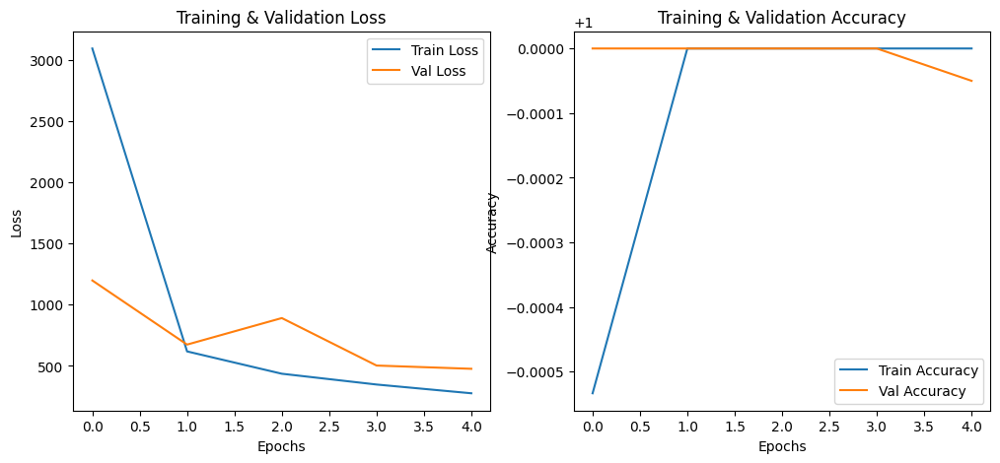

In [16]:
import matplotlib.pyplot as plt

# Plot training & validation loss
plt.figure(figsize=(12, 5))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training & Validation Loss')

# Accuracy plot (for classification output)
plt.subplot(1, 2, 2)
plt.plot(history.history['class_accuracy'], label='Train Accuracy')
plt.plot(history.history['val_class_accuracy'], label='Val Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training & Validation Accuracy')

plt.show()


In [17]:
# Load test dataset
test_gen = data_generator(
    annotation_dir=os.path.join(DATA_DIR, 'test'),
    image_dir=os.path.join(DATA_DIR, 'img_test'),
    image_size=IMAGE_SIZE,
    batch_size=32
)

# Evaluate model
test_steps = len(os.listdir(os.path.join(DATA_DIR, 'test'))) // 32
results = model.evaluate(test_gen, steps=test_steps)

# Print results
print(f"Test Loss: {results[0]:.4f}")
print(f"Test BBox Loss: {results[1]:.4f}")
print(f"Test Class Loss: {results[2]:.4f}")
print(f"Test Classification Accuracy: {results[4]:.4f}")


Processing 20000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 66.99it/s]


  1/625 ━━━━━━━━━━━━━━━━━━━━ 10:28 1s/step - bbox_loss: 292.9302 - bbox_mse: 292.9302 - class_accuracy: 1.0000 - class_loss: 1.8731e-31 - loss: 292.9302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.76it/s]


  2/625 ━━━━━━━━━━━━━━━━━━━━ 6:31 628ms/step - bbox_loss: 343.7985 - bbox_mse: 343.7985 - class_accuracy: 1.0000 - class_loss: 1.2064e-27 - loss: 343.7985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.14it/s]


  3/625 ━━━━━━━━━━━━━━━━━━━━ 6:49 658ms/step - bbox_loss: 372.6691 - bbox_mse: 372.6691 - class_accuracy: 1.0000 - class_loss: 1.3406e-27 - loss: 372.6691

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.50it/s]


  4/625 ━━━━━━━━━━━━━━━━━━━━ 7:00 678ms/step - bbox_loss: 393.8670 - bbox_mse: 393.8670 - class_accuracy: 1.0000 - class_loss: 1.3078e-27 - loss: 393.8670

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.82it/s]


  5/625 ━━━━━━━━━━━━━━━━━━━━ 6:23 619ms/step - bbox_loss: 397.0339 - bbox_mse: 397.0339 - class_accuracy: 1.0000 - class_loss: 1.5505e-27 - loss: 397.0339

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.60it/s]


  6/625 ━━━━━━━━━━━━━━━━━━━━ 5:53 571ms/step - bbox_loss: 395.9612 - bbox_mse: 395.9612 - class_accuracy: 1.0000 - class_loss: 1.6810e-27 - loss: 395.9612

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.77it/s]


  7/625 ━━━━━━━━━━━━━━━━━━━━ 5:34 541ms/step - bbox_loss: 395.1575 - bbox_mse: 395.1575 - class_accuracy: 1.0000 - class_loss: 1.7271e-27 - loss: 395.1575

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.55it/s]


  8/625 ━━━━━━━━━━━━━━━━━━━━ 5:17 514ms/step - bbox_loss: 392.4593 - bbox_mse: 392.4593 - class_accuracy: 1.0000 - class_loss: 1.7309e-27 - loss: 392.4593

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.20it/s]


  9/625 ━━━━━━━━━━━━━━━━━━━━ 5:06 497ms/step - bbox_loss: 393.8091 - bbox_mse: 393.8091 - class_accuracy: 1.0000 - class_loss: 1.7122e-27 - loss: 393.8091

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.94it/s]


 10/625 ━━━━━━━━━━━━━━━━━━━━ 4:58 485ms/step - bbox_loss: 395.1525 - bbox_mse: 395.1525 - class_accuracy: 1.0000 - class_loss: 1.6825e-27 - loss: 395.1525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.27it/s]


 11/625 ━━━━━━━━━━━━━━━━━━━━ 4:50 473ms/step - bbox_loss: 399.4731 - bbox_mse: 399.4731 - class_accuracy: 1.0000 - class_loss: 1.6465e-27 - loss: 399.4731

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.03it/s]


 12/625 ━━━━━━━━━━━━━━━━━━━━ 4:43 463ms/step - bbox_loss: 403.8686 - bbox_mse: 403.8686 - class_accuracy: 1.0000 - class_loss: 8.5791e-27 - loss: 403.8686

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.81it/s]


 13/625 ━━━━━━━━━━━━━━━━━━━━ 4:39 456ms/step - bbox_loss: 409.4746 - bbox_mse: 409.4746 - class_accuracy: 1.0000 - class_loss: 1.2887e-17 - loss: 409.4746

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.33it/s]


 14/625 ━━━━━━━━━━━━━━━━━━━━ 4:33 448ms/step - bbox_loss: 413.0922 - bbox_mse: 413.0922 - class_accuracy: 1.0000 - class_loss: 2.3078e-17 - loss: 413.0922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.91it/s]


 15/625 ━━━━━━━━━━━━━━━━━━━━ 4:30 443ms/step - bbox_loss: 416.5183 - bbox_mse: 416.5183 - class_accuracy: 1.0000 - class_loss: 3.1220e-17 - loss: 416.5183

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.82it/s]


 16/625 ━━━━━━━━━━━━━━━━━━━━ 4:25 437ms/step - bbox_loss: 418.6408 - bbox_mse: 418.6408 - class_accuracy: 1.0000 - class_loss: 3.7776e-17 - loss: 418.6408

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.49it/s]


 17/625 ━━━━━━━━━━━━━━━━━━━━ 4:22 431ms/step - bbox_loss: 421.1624 - bbox_mse: 421.1624 - class_accuracy: 1.0000 - class_loss: 4.3090e-17 - loss: 421.1624

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.66it/s]


 18/625 ━━━━━━━━━━━━━━━━━━━━ 4:19 428ms/step - bbox_loss: 423.4742 - bbox_mse: 423.4742 - class_accuracy: 1.0000 - class_loss: 4.7418e-17 - loss: 423.4742

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.36it/s]


 19/625 ━━━━━━━━━━━━━━━━━━━━ 4:19 428ms/step - bbox_loss: 425.4764 - bbox_mse: 425.4764 - class_accuracy: 1.0000 - class_loss: 5.0955e-17 - loss: 425.4764

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.50it/s]


 20/625 ━━━━━━━━━━━━━━━━━━━━ 4:25 438ms/step - bbox_loss: 426.8365 - bbox_mse: 426.8365 - class_accuracy: 1.0000 - class_loss: 5.3852e-17 - loss: 426.8365

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.65it/s]


 21/625 ━━━━━━━━━━━━━━━━━━━━ 4:31 449ms/step - bbox_loss: 427.5992 - bbox_mse: 427.5992 - class_accuracy: 1.0000 - class_loss: 5.6227e-17 - loss: 427.5992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.57it/s]


 22/625 ━━━━━━━━━━━━━━━━━━━━ 4:33 454ms/step - bbox_loss: 428.0227 - bbox_mse: 428.0227 - class_accuracy: 1.0000 - class_loss: 5.8171e-17 - loss: 428.0227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.84it/s]


 23/625 ━━━━━━━━━━━━━━━━━━━━ 4:35 458ms/step - bbox_loss: 428.0857 - bbox_mse: 428.0857 - class_accuracy: 1.0000 - class_loss: 5.9759e-17 - loss: 428.0857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.14it/s]


 24/625 ━━━━━━━━━━━━━━━━━━━━ 4:39 465ms/step - bbox_loss: 428.9555 - bbox_mse: 428.9555 - class_accuracy: 1.0000 - class_loss: 6.1050e-17 - loss: 428.9555

Parsing batch:   0%|          | 0/32 [00:00<?, ?it/s]

 25/625 ━━━━━━━━━━━━━━━━━━━━ 4:53 489ms/step - bbox_loss: 430.3761 - bbox_mse: 430.3761 - class_accuracy: 1.0000 - class_loss: 6.2092e-17 - loss: 430.3761

Parsing batch:  75%|███████▌  | 24/32 [00:00<00:00, 111.52it/s]

 26/625 ━━━━━━━━━━━━━━━━━━━━ 5:02 505ms/step - bbox_loss: 431.6779 - bbox_mse: 431.6779 - class_accuracy: 1.0000 - class_loss: 6.2926e-17 - loss: 431.6779

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.93it/s]


 27/625 ━━━━━━━━━━━━━━━━━━━━ 5:05 511ms/step - bbox_loss: 433.0229 - bbox_mse: 433.0229 - class_accuracy: 1.0000 - class_loss: 6.3583e-17 - loss: 433.0229

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.67it/s] 


 28/625 ━━━━━━━━━━━━━━━━━━━━ 5:07 514ms/step - bbox_loss: 434.4946 - bbox_mse: 434.4946 - class_accuracy: 1.0000 - class_loss: 6.4090e-17 - loss: 434.4946

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.48it/s]


 29/625 ━━━━━━━━━━━━━━━━━━━━ 5:06 514ms/step - bbox_loss: 435.7267 - bbox_mse: 435.7267 - class_accuracy: 1.0000 - class_loss: 6.4470e-17 - loss: 435.7267

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.90it/s]


 30/625 ━━━━━━━━━━━━━━━━━━━━ 5:02 508ms/step - bbox_loss: 436.9923 - bbox_mse: 436.9923 - class_accuracy: 1.0000 - class_loss: 6.4741e-17 - loss: 436.9923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.15it/s]


 31/625 ━━━━━━━━━━━━━━━━━━━━ 4:58 503ms/step - bbox_loss: 438.0236 - bbox_mse: 438.0236 - class_accuracy: 1.0000 - class_loss: 6.4919e-17 - loss: 438.0236

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.88it/s]


 32/625 ━━━━━━━━━━━━━━━━━━━━ 4:55 498ms/step - bbox_loss: 439.1113 - bbox_mse: 439.1113 - class_accuracy: 1.0000 - class_loss: 6.5017e-17 - loss: 439.1113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.11it/s]


 33/625 ━━━━━━━━━━━━━━━━━━━━ 4:52 495ms/step - bbox_loss: 440.0266 - bbox_mse: 440.0266 - class_accuracy: 1.0000 - class_loss: 6.5047e-17 - loss: 440.0266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.50it/s]


 34/625 ━━━━━━━━━━━━━━━━━━━━ 4:50 492ms/step - bbox_loss: 440.7722 - bbox_mse: 440.7722 - class_accuracy: 1.0000 - class_loss: 6.5017e-17 - loss: 440.7722

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.09it/s]


 35/625 ━━━━━━━━━━━━━━━━━━━━ 4:47 488ms/step - bbox_loss: 441.3952 - bbox_mse: 441.3952 - class_accuracy: 1.0000 - class_loss: 6.4938e-17 - loss: 441.3952

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.77it/s]


 36/625 ━━━━━━━━━━━━━━━━━━━━ 4:45 484ms/step - bbox_loss: 442.3221 - bbox_mse: 442.3221 - class_accuracy: 1.0000 - class_loss: 6.4814e-17 - loss: 442.3221

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.17it/s]


 37/625 ━━━━━━━━━━━━━━━━━━━━ 4:42 481ms/step - bbox_loss: 443.1209 - bbox_mse: 443.1209 - class_accuracy: 1.0000 - class_loss: 6.4653e-17 - loss: 443.1209

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.81it/s]


 38/625 ━━━━━━━━━━━━━━━━━━━━ 4:40 478ms/step - bbox_loss: 443.9530 - bbox_mse: 443.9530 - class_accuracy: 1.0000 - class_loss: 6.4460e-17 - loss: 443.9530

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.63it/s]


 39/625 ━━━━━━━━━━━━━━━━━━━━ 4:38 475ms/step - bbox_loss: 444.7095 - bbox_mse: 444.7095 - class_accuracy: 1.0000 - class_loss: 6.4239e-17 - loss: 444.7095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.56it/s]


 40/625 ━━━━━━━━━━━━━━━━━━━━ 4:36 472ms/step - bbox_loss: 445.3273 - bbox_mse: 445.3273 - class_accuracy: 1.0000 - class_loss: 6.3995e-17 - loss: 445.3273

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.47it/s]


 41/625 ━━━━━━━━━━━━━━━━━━━━ 4:34 470ms/step - bbox_loss: 446.0095 - bbox_mse: 446.0095 - class_accuracy: 1.0000 - class_loss: 6.3729e-17 - loss: 446.0095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.84it/s]


 42/625 ━━━━━━━━━━━━━━━━━━━━ 4:32 467ms/step - bbox_loss: 446.6822 - bbox_mse: 446.6822 - class_accuracy: 1.0000 - class_loss: 6.3447e-17 - loss: 446.6822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.29it/s]


 43/625 ━━━━━━━━━━━━━━━━━━━━ 4:30 465ms/step - bbox_loss: 447.4607 - bbox_mse: 447.4607 - class_accuracy: 1.0000 - class_loss: 6.3149e-17 - loss: 447.4607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.45it/s]


 44/625 ━━━━━━━━━━━━━━━━━━━━ 4:28 462ms/step - bbox_loss: 448.1162 - bbox_mse: 448.1162 - class_accuracy: 1.0000 - class_loss: 6.2839e-17 - loss: 448.1162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.39it/s]


 45/625 ━━━━━━━━━━━━━━━━━━━━ 4:26 460ms/step - bbox_loss: 448.6483 - bbox_mse: 448.6483 - class_accuracy: 1.0000 - class_loss: 6.2518e-17 - loss: 448.6483

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.88it/s]


 46/625 ━━━━━━━━━━━━━━━━━━━━ 4:24 458ms/step - bbox_loss: 449.0828 - bbox_mse: 449.0828 - class_accuracy: 1.0000 - class_loss: 6.2188e-17 - loss: 449.0828

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.63it/s]


 47/625 ━━━━━━━━━━━━━━━━━━━━ 4:23 456ms/step - bbox_loss: 449.7194 - bbox_mse: 449.7194 - class_accuracy: 1.0000 - class_loss: 6.1851e-17 - loss: 449.7194

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.62it/s]


 48/625 ━━━━━━━━━━━━━━━━━━━━ 4:22 454ms/step - bbox_loss: 450.3658 - bbox_mse: 450.3658 - class_accuracy: 1.0000 - class_loss: 6.1508e-17 - loss: 450.3658

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.41it/s]


 49/625 ━━━━━━━━━━━━━━━━━━━━ 4:20 452ms/step - bbox_loss: 450.9594 - bbox_mse: 450.9594 - class_accuracy: 1.0000 - class_loss: 6.1159e-17 - loss: 450.9594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.20it/s]


 50/625 ━━━━━━━━━━━━━━━━━━━━ 4:19 451ms/step - bbox_loss: 451.8922 - bbox_mse: 451.8922 - class_accuracy: 1.0000 - class_loss: 6.0807e-17 - loss: 451.8922

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.24it/s]


 51/625 ━━━━━━━━━━━━━━━━━━━━ 4:17 449ms/step - bbox_loss: 452.6973 - bbox_mse: 452.6973 - class_accuracy: 1.0000 - class_loss: 6.0452e-17 - loss: 452.6973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 171.78it/s]


 52/625 ━━━━━━━━━━━━━━━━━━━━ 4:16 448ms/step - bbox_loss: 453.5312 - bbox_mse: 453.5312 - class_accuracy: 1.0000 - class_loss: 6.0095e-17 - loss: 453.5312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.41it/s]


 53/625 ━━━━━━━━━━━━━━━━━━━━ 4:15 447ms/step - bbox_loss: 454.6143 - bbox_mse: 454.6143 - class_accuracy: 1.0000 - class_loss: 5.9737e-17 - loss: 454.6143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.31it/s]


 54/625 ━━━━━━━━━━━━━━━━━━━━ 4:13 445ms/step - bbox_loss: 455.6077 - bbox_mse: 455.6077 - class_accuracy: 1.0000 - class_loss: 5.9377e-17 - loss: 455.6077

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.46it/s]


 55/625 ━━━━━━━━━━━━━━━━━━━━ 4:12 443ms/step - bbox_loss: 456.5543 - bbox_mse: 456.5543 - class_accuracy: 1.0000 - class_loss: 5.9018e-17 - loss: 456.5543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.24it/s]


 56/625 ━━━━━━━━━━━━━━━━━━━━ 4:11 442ms/step - bbox_loss: 457.4771 - bbox_mse: 457.4771 - class_accuracy: 1.0000 - class_loss: 5.8658e-17 - loss: 457.4771

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.54it/s]


 57/625 ━━━━━━━━━━━━━━━━━━━━ 4:12 444ms/step - bbox_loss: 458.3059 - bbox_mse: 458.3059 - class_accuracy: 1.0000 - class_loss: 5.8300e-17 - loss: 458.3059

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.08it/s]


 58/625 ━━━━━━━━━━━━━━━━━━━━ 4:13 447ms/step - bbox_loss: 459.0649 - bbox_mse: 459.0649 - class_accuracy: 1.0000 - class_loss: 5.7942e-17 - loss: 459.0649

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.29it/s]


 59/625 ━━━━━━━━━━━━━━━━━━━━ 4:14 450ms/step - bbox_loss: 459.7773 - bbox_mse: 459.7773 - class_accuracy: 1.0000 - class_loss: 5.7586e-17 - loss: 459.7773

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.98it/s]


 60/625 ━━━━━━━━━━━━━━━━━━━━ 4:15 452ms/step - bbox_loss: 460.4415 - bbox_mse: 460.4415 - class_accuracy: 1.0000 - class_loss: 5.7231e-17 - loss: 460.4415

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 70.03it/s]


 61/625 ━━━━━━━━━━━━━━━━━━━━ 4:16 455ms/step - bbox_loss: 461.1275 - bbox_mse: 461.1275 - class_accuracy: 1.0000 - class_loss: 5.6878e-17 - loss: 461.1275

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.82it/s]


 62/625 ━━━━━━━━━━━━━━━━━━━━ 4:16 456ms/step - bbox_loss: 461.8684 - bbox_mse: 461.8684 - class_accuracy: 1.0000 - class_loss: 5.6527e-17 - loss: 461.8684

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.68it/s]


 63/625 ━━━━━━━━━━━━━━━━━━━━ 4:18 459ms/step - bbox_loss: 462.5625 - bbox_mse: 462.5625 - class_accuracy: 1.0000 - class_loss: 5.6179e-17 - loss: 462.5625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.29it/s]


 64/625 ━━━━━━━━━━━━━━━━━━━━ 4:18 461ms/step - bbox_loss: 463.2353 - bbox_mse: 463.2353 - class_accuracy: 1.0000 - class_loss: 5.5832e-17 - loss: 463.2353

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.94it/s]


 65/625 ━━━━━━━━━━━━━━━━━━━━ 4:19 464ms/step - bbox_loss: 463.8488 - bbox_mse: 463.8488 - class_accuracy: 1.0000 - class_loss: 5.5498e-17 - loss: 463.8488

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.42it/s]


 66/625 ━━━━━━━━━━━━━━━━━━━━ 4:20 466ms/step - bbox_loss: 464.4391 - bbox_mse: 464.4391 - class_accuracy: 1.0000 - class_loss: 5.5167e-17 - loss: 464.4391

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.98it/s]


 67/625 ━━━━━━━━━━━━━━━━━━━━ 4:20 467ms/step - bbox_loss: 464.9883 - bbox_mse: 464.9883 - class_accuracy: 1.0000 - class_loss: 5.4837e-17 - loss: 464.9883

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.43it/s]


 68/625 ━━━━━━━━━━━━━━━━━━━━ 4:19 467ms/step - bbox_loss: 465.5017 - bbox_mse: 465.5017 - class_accuracy: 1.0000 - class_loss: 5.4510e-17 - loss: 465.5017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.62it/s]


 69/625 ━━━━━━━━━━━━━━━━━━━━ 4:18 465ms/step - bbox_loss: 466.1671 - bbox_mse: 466.1671 - class_accuracy: 1.0000 - class_loss: 5.4186e-17 - loss: 466.1671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.69it/s]


 70/625 ━━━━━━━━━━━━━━━━━━━━ 4:17 463ms/step - bbox_loss: 466.7691 - bbox_mse: 466.7691 - class_accuracy: 1.0000 - class_loss: 5.3865e-17 - loss: 466.7691

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.17it/s]


 71/625 ━━━━━━━━━━━━━━━━━━━━ 4:16 462ms/step - bbox_loss: 467.3302 - bbox_mse: 467.3302 - class_accuracy: 1.0000 - class_loss: 5.3546e-17 - loss: 467.3302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 176.40it/s]


 72/625 ━━━━━━━━━━━━━━━━━━━━ 4:14 461ms/step - bbox_loss: 467.8707 - bbox_mse: 467.8707 - class_accuracy: 1.0000 - class_loss: 5.3230e-17 - loss: 467.8707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.57it/s]


 73/625 ━━━━━━━━━━━━━━━━━━━━ 4:13 460ms/step - bbox_loss: 468.3474 - bbox_mse: 468.3474 - class_accuracy: 1.0000 - class_loss: 5.2917e-17 - loss: 468.3474

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.50it/s]


 74/625 ━━━━━━━━━━━━━━━━━━━━ 4:12 458ms/step - bbox_loss: 468.7570 - bbox_mse: 468.7570 - class_accuracy: 1.0000 - class_loss: 5.2607e-17 - loss: 468.7570

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 172.27it/s]


 75/625 ━━━━━━━━━━━━━━━━━━━━ 4:11 457ms/step - bbox_loss: 469.1407 - bbox_mse: 469.1407 - class_accuracy: 1.0000 - class_loss: 5.2300e-17 - loss: 469.1407

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.38it/s]


 76/625 ━━━━━━━━━━━━━━━━━━━━ 4:10 456ms/step - bbox_loss: 469.4681 - bbox_mse: 469.4681 - class_accuracy: 1.0000 - class_loss: 5.1996e-17 - loss: 469.4681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.92it/s]


 77/625 ━━━━━━━━━━━━━━━━━━━━ 4:09 455ms/step - bbox_loss: 469.7673 - bbox_mse: 469.7673 - class_accuracy: 1.0000 - class_loss: 5.1694e-17 - loss: 469.7673

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.29it/s]


 78/625 ━━━━━━━━━━━━━━━━━━━━ 4:08 453ms/step - bbox_loss: 470.0642 - bbox_mse: 470.0642 - class_accuracy: 1.0000 - class_loss: 5.1396e-17 - loss: 470.0642

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.37it/s]


 79/625 ━━━━━━━━━━━━━━━━━━━━ 4:06 452ms/step - bbox_loss: 470.3095 - bbox_mse: 470.3095 - class_accuracy: 1.0000 - class_loss: 5.1101e-17 - loss: 470.3095

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.88it/s]


 80/625 ━━━━━━━━━━━━━━━━━━━━ 4:05 451ms/step - bbox_loss: 470.5052 - bbox_mse: 470.5052 - class_accuracy: 1.0000 - class_loss: 5.0809e-17 - loss: 470.5052

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.63it/s]


 81/625 ━━━━━━━━━━━━━━━━━━━━ 4:05 451ms/step - bbox_loss: 470.6880 - bbox_mse: 470.6880 - class_accuracy: 1.0000 - class_loss: 5.0519e-17 - loss: 470.6880

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.95it/s]


 82/625 ━━━━━━━━━━━━━━━━━━━━ 4:04 450ms/step - bbox_loss: 470.8168 - bbox_mse: 470.8168 - class_accuracy: 1.0000 - class_loss: 5.0233e-17 - loss: 470.8168

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.98it/s]


 83/625 ━━━━━━━━━━━━━━━━━━━━ 4:03 449ms/step - bbox_loss: 470.9592 - bbox_mse: 470.9592 - class_accuracy: 1.0000 - class_loss: 4.9950e-17 - loss: 470.9592

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 187.16it/s]


 84/625 ━━━━━━━━━━━━━━━━━━━━ 4:02 448ms/step - bbox_loss: 471.0821 - bbox_mse: 471.0821 - class_accuracy: 1.0000 - class_loss: 4.9669e-17 - loss: 471.0821

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.28it/s]


 85/625 ━━━━━━━━━━━━━━━━━━━━ 4:01 447ms/step - bbox_loss: 471.1893 - bbox_mse: 471.1893 - class_accuracy: 1.0000 - class_loss: 4.9392e-17 - loss: 471.1893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.21it/s]


 86/625 ━━━━━━━━━━━━━━━━━━━━ 4:00 446ms/step - bbox_loss: 471.2493 - bbox_mse: 471.2493 - class_accuracy: 1.0000 - class_loss: 4.9117e-17 - loss: 471.2493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.79it/s]


 87/625 ━━━━━━━━━━━━━━━━━━━━ 3:59 445ms/step - bbox_loss: 471.3469 - bbox_mse: 471.3469 - class_accuracy: 1.0000 - class_loss: 4.8846e-17 - loss: 471.3469

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.22it/s]


 88/625 ━━━━━━━━━━━━━━━━━━━━ 3:58 444ms/step - bbox_loss: 471.4857 - bbox_mse: 471.4857 - class_accuracy: 1.0000 - class_loss: 4.8577e-17 - loss: 471.4857

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.81it/s]


 89/625 ━━━━━━━━━━━━━━━━━━━━ 3:57 444ms/step - bbox_loss: 471.6158 - bbox_mse: 471.6158 - class_accuracy: 1.0000 - class_loss: 4.8311e-17 - loss: 471.6158

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.47it/s]


 90/625 ━━━━━━━━━━━━━━━━━━━━ 3:56 443ms/step - bbox_loss: 471.7412 - bbox_mse: 471.7412 - class_accuracy: 1.0000 - class_loss: 4.8048e-17 - loss: 471.7412

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.66it/s]


 91/625 ━━━━━━━━━━━━━━━━━━━━ 3:55 442ms/step - bbox_loss: 471.9008 - bbox_mse: 471.9008 - class_accuracy: 1.0000 - class_loss: 4.7788e-17 - loss: 471.9008

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.44it/s]


 92/625 ━━━━━━━━━━━━━━━━━━━━ 3:55 441ms/step - bbox_loss: 472.0352 - bbox_mse: 472.0352 - class_accuracy: 1.0000 - class_loss: 4.7531e-17 - loss: 472.0352

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.65it/s]


 93/625 ━━━━━━━━━━━━━━━━━━━━ 3:54 440ms/step - bbox_loss: 472.1444 - bbox_mse: 472.1444 - class_accuracy: 1.0000 - class_loss: 4.7276e-17 - loss: 472.1444

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.10it/s]


 94/625 ━━━━━━━━━━━━━━━━━━━━ 3:53 439ms/step - bbox_loss: 472.2274 - bbox_mse: 472.2274 - class_accuracy: 1.0000 - class_loss: 4.7024e-17 - loss: 472.2274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.85it/s]


 95/625 ━━━━━━━━━━━━━━━━━━━━ 3:53 440ms/step - bbox_loss: 472.2962 - bbox_mse: 472.2962 - class_accuracy: 1.0000 - class_loss: 4.6775e-17 - loss: 472.2962

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.94it/s] 


 96/625 ━━━━━━━━━━━━━━━━━━━━ 3:53 441ms/step - bbox_loss: 472.3409 - bbox_mse: 472.3409 - class_accuracy: 1.0000 - class_loss: 4.6528e-17 - loss: 472.3409

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.16it/s]


 97/625 ━━━━━━━━━━━━━━━━━━━━ 3:54 443ms/step - bbox_loss: 472.3621 - bbox_mse: 472.3621 - class_accuracy: 1.0000 - class_loss: 4.6284e-17 - loss: 472.3621

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.31it/s]


 98/625 ━━━━━━━━━━━━━━━━━━━━ 3:54 445ms/step - bbox_loss: 472.3796 - bbox_mse: 472.3796 - class_accuracy: 1.0000 - class_loss: 4.6043e-17 - loss: 472.3796

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.40it/s]


 99/625 ━━━━━━━━━━━━━━━━━━━━ 3:54 446ms/step - bbox_loss: 472.4380 - bbox_mse: 472.4380 - class_accuracy: 1.0000 - class_loss: 4.5804e-17 - loss: 472.4380

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.48it/s]


100/625 ━━━━━━━━━━━━━━━━━━━━ 3:54 447ms/step - bbox_loss: 472.5229 - bbox_mse: 472.5229 - class_accuracy: 1.0000 - class_loss: 4.5568e-17 - loss: 472.5229

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.06it/s]


101/625 ━━━━━━━━━━━━━━━━━━━━ 3:55 449ms/step - bbox_loss: 472.5898 - bbox_mse: 472.5898 - class_accuracy: 1.0000 - class_loss: 4.5334e-17 - loss: 472.5898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.68it/s]


102/625 ━━━━━━━━━━━━━━━━━━━━ 3:55 450ms/step - bbox_loss: 472.6565 - bbox_mse: 472.6565 - class_accuracy: 1.0000 - class_loss: 4.5103e-17 - loss: 472.6565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.81it/s]


103/625 ━━━━━━━━━━━━━━━━━━━━ 3:55 452ms/step - bbox_loss: 472.7115 - bbox_mse: 472.7115 - class_accuracy: 1.0000 - class_loss: 4.4874e-17 - loss: 472.7115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.51it/s] 


104/625 ━━━━━━━━━━━━━━━━━━━━ 3:55 453ms/step - bbox_loss: 472.7677 - bbox_mse: 472.7677 - class_accuracy: 1.0000 - class_loss: 4.4648e-17 - loss: 472.7677

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.91it/s]


105/625 ━━━━━━━━━━━━━━━━━━━━ 3:56 454ms/step - bbox_loss: 472.8175 - bbox_mse: 472.8175 - class_accuracy: 1.0000 - class_loss: 4.4424e-17 - loss: 472.8175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.74it/s]


106/625 ━━━━━━━━━━━━━━━━━━━━ 3:56 457ms/step - bbox_loss: 472.8506 - bbox_mse: 472.8506 - class_accuracy: 1.0000 - class_loss: 4.4202e-17 - loss: 472.8506

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.52it/s] 


107/625 ━━━━━━━━━━━━━━━━━━━━ 3:57 458ms/step - bbox_loss: 472.9000 - bbox_mse: 472.9000 - class_accuracy: 1.0000 - class_loss: 4.3982e-17 - loss: 472.9000

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 80.37it/s]


108/625 ━━━━━━━━━━━━━━━━━━━━ 3:57 460ms/step - bbox_loss: 472.9475 - bbox_mse: 472.9475 - class_accuracy: 1.0000 - class_loss: 4.3765e-17 - loss: 472.9475

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.98it/s]


109/625 ━━━━━━━━━━━━━━━━━━━━ 3:56 459ms/step - bbox_loss: 472.9925 - bbox_mse: 472.9925 - class_accuracy: 1.0000 - class_loss: 4.3551e-17 - loss: 472.9925

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.47it/s]


110/625 ━━━━━━━━━━━━━━━━━━━━ 3:55 458ms/step - bbox_loss: 473.0302 - bbox_mse: 473.0302 - class_accuracy: 1.0000 - class_loss: 4.3338e-17 - loss: 473.0302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.51it/s]


111/625 ━━━━━━━━━━━━━━━━━━━━ 3:55 457ms/step - bbox_loss: 473.0522 - bbox_mse: 473.0522 - class_accuracy: 1.0000 - class_loss: 4.3128e-17 - loss: 473.0522

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.11it/s]


112/625 ━━━━━━━━━━━━━━━━━━━━ 3:54 457ms/step - bbox_loss: 473.0692 - bbox_mse: 473.0692 - class_accuracy: 1.0000 - class_loss: 4.2920e-17 - loss: 473.0692

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.45it/s]


113/625 ━━━━━━━━━━━━━━━━━━━━ 3:53 456ms/step - bbox_loss: 473.0797 - bbox_mse: 473.0797 - class_accuracy: 1.0000 - class_loss: 4.2714e-17 - loss: 473.0797

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.79it/s]


114/625 ━━━━━━━━━━━━━━━━━━━━ 3:52 455ms/step - bbox_loss: 473.1212 - bbox_mse: 473.1212 - class_accuracy: 1.0000 - class_loss: 4.2510e-17 - loss: 473.1212

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.88it/s]


115/625 ━━━━━━━━━━━━━━━━━━━━ 3:51 455ms/step - bbox_loss: 473.1740 - bbox_mse: 473.1740 - class_accuracy: 1.0000 - class_loss: 4.2308e-17 - loss: 473.1740

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 172.10it/s]


116/625 ━━━━━━━━━━━━━━━━━━━━ 3:51 454ms/step - bbox_loss: 473.2578 - bbox_mse: 473.2578 - class_accuracy: 1.0000 - class_loss: 4.2108e-17 - loss: 473.2578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.85it/s]


117/625 ━━━━━━━━━━━━━━━━━━━━ 3:50 453ms/step - bbox_loss: 473.3492 - bbox_mse: 473.3492 - class_accuracy: 1.0000 - class_loss: 4.1910e-17 - loss: 473.3492

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.26it/s]


118/625 ━━━━━━━━━━━━━━━━━━━━ 3:49 453ms/step - bbox_loss: 473.4459 - bbox_mse: 473.4459 - class_accuracy: 1.0000 - class_loss: 4.1715e-17 - loss: 473.4459

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.00it/s]


119/625 ━━━━━━━━━━━━━━━━━━━━ 3:48 452ms/step - bbox_loss: 473.5523 - bbox_mse: 473.5523 - class_accuracy: 1.0000 - class_loss: 4.1521e-17 - loss: 473.5523

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.03it/s]


120/625 ━━━━━━━━━━━━━━━━━━━━ 3:47 451ms/step - bbox_loss: 473.6586 - bbox_mse: 473.6586 - class_accuracy: 1.0000 - class_loss: 4.1329e-17 - loss: 473.6586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.62it/s]


121/625 ━━━━━━━━━━━━━━━━━━━━ 3:47 451ms/step - bbox_loss: 473.7517 - bbox_mse: 473.7517 - class_accuracy: 1.0000 - class_loss: 4.1139e-17 - loss: 473.7517

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.98it/s]


122/625 ━━━━━━━━━━━━━━━━━━━━ 3:46 450ms/step - bbox_loss: 473.8317 - bbox_mse: 473.8317 - class_accuracy: 1.0000 - class_loss: 4.0951e-17 - loss: 473.8317

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.12it/s]


123/625 ━━━━━━━━━━━━━━━━━━━━ 3:45 449ms/step - bbox_loss: 473.9033 - bbox_mse: 473.9033 - class_accuracy: 1.0000 - class_loss: 4.0765e-17 - loss: 473.9033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.23it/s]


124/625 ━━━━━━━━━━━━━━━━━━━━ 3:44 449ms/step - bbox_loss: 473.9624 - bbox_mse: 473.9624 - class_accuracy: 1.0000 - class_loss: 4.0580e-17 - loss: 473.9624

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.22it/s]


125/625 ━━━━━━━━━━━━━━━━━━━━ 3:44 448ms/step - bbox_loss: 474.0325 - bbox_mse: 474.0325 - class_accuracy: 1.0000 - class_loss: 4.0398e-17 - loss: 474.0325

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.84it/s]


126/625 ━━━━━━━━━━━━━━━━━━━━ 3:43 448ms/step - bbox_loss: 474.1010 - bbox_mse: 474.1010 - class_accuracy: 1.0000 - class_loss: 4.0217e-17 - loss: 474.1010

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.58it/s]


127/625 ━━━━━━━━━━━━━━━━━━━━ 3:42 447ms/step - bbox_loss: 474.1587 - bbox_mse: 474.1587 - class_accuracy: 1.0000 - class_loss: 4.0038e-17 - loss: 474.1587

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 171.37it/s]


128/625 ━━━━━━━━━━━━━━━━━━━━ 3:41 446ms/step - bbox_loss: 474.2087 - bbox_mse: 474.2087 - class_accuracy: 1.0000 - class_loss: 3.9861e-17 - loss: 474.2087

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.06it/s]


129/625 ━━━━━━━━━━━━━━━━━━━━ 3:41 446ms/step - bbox_loss: 474.2570 - bbox_mse: 474.2570 - class_accuracy: 1.0000 - class_loss: 3.9685e-17 - loss: 474.2570

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.42it/s]


130/625 ━━━━━━━━━━━━━━━━━━━━ 3:40 445ms/step - bbox_loss: 474.2905 - bbox_mse: 474.2905 - class_accuracy: 1.0000 - class_loss: 3.9511e-17 - loss: 474.2905

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.33it/s]


131/625 ━━━━━━━━━━━━━━━━━━━━ 3:39 445ms/step - bbox_loss: 474.3265 - bbox_mse: 474.3265 - class_accuracy: 1.0000 - class_loss: 3.9339e-17 - loss: 474.3265

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.00it/s]


132/625 ━━━━━━━━━━━━━━━━━━━━ 3:39 444ms/step - bbox_loss: 474.3511 - bbox_mse: 474.3511 - class_accuracy: 1.0000 - class_loss: 3.9168e-17 - loss: 474.3511

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.83it/s]


133/625 ━━━━━━━━━━━━━━━━━━━━ 3:38 444ms/step - bbox_loss: 474.3678 - bbox_mse: 474.3678 - class_accuracy: 1.0000 - class_loss: 3.8999e-17 - loss: 474.3678

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.58it/s]


134/625 ━━━━━━━━━━━━━━━━━━━━ 3:38 445ms/step - bbox_loss: 474.3711 - bbox_mse: 474.3711 - class_accuracy: 1.0000 - class_loss: 3.8832e-17 - loss: 474.3711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.28it/s]


135/625 ━━━━━━━━━━━━━━━━━━━━ 3:38 446ms/step - bbox_loss: 474.3762 - bbox_mse: 474.3762 - class_accuracy: 1.0000 - class_loss: 3.8666e-17 - loss: 474.3762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.93it/s]


136/625 ━━━━━━━━━━━━━━━━━━━━ 3:38 447ms/step - bbox_loss: 474.3899 - bbox_mse: 474.3899 - class_accuracy: 1.0000 - class_loss: 3.8502e-17 - loss: 474.3899

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.62it/s]


137/625 ━━━━━━━━━━━━━━━━━━━━ 3:38 448ms/step - bbox_loss: 474.3988 - bbox_mse: 474.3988 - class_accuracy: 1.0000 - class_loss: 3.8339e-17 - loss: 474.3988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.90it/s]


138/625 ━━━━━━━━━━━━━━━━━━━━ 3:38 449ms/step - bbox_loss: 474.4065 - bbox_mse: 474.4065 - class_accuracy: 1.0000 - class_loss: 3.8178e-17 - loss: 474.4065

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.77it/s]


139/625 ━━━━━━━━━━━━━━━━━━━━ 3:39 451ms/step - bbox_loss: 474.4348 - bbox_mse: 474.4348 - class_accuracy: 1.0000 - class_loss: 3.8018e-17 - loss: 474.4348

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.00it/s]


140/625 ━━━━━━━━━━━━━━━━━━━━ 3:39 452ms/step - bbox_loss: 474.4712 - bbox_mse: 474.4712 - class_accuracy: 1.0000 - class_loss: 3.7859e-17 - loss: 474.4712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.43it/s]


141/625 ━━━━━━━━━━━━━━━━━━━━ 3:39 453ms/step - bbox_loss: 474.5109 - bbox_mse: 474.5109 - class_accuracy: 1.0000 - class_loss: 3.7703e-17 - loss: 474.5109

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.00it/s]


142/625 ━━━━━━━━━━━━━━━━━━━━ 3:39 454ms/step - bbox_loss: 474.5513 - bbox_mse: 474.5513 - class_accuracy: 1.0000 - class_loss: 3.7547e-17 - loss: 474.5513

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.93it/s] 


143/625 ━━━━━━━━━━━━━━━━━━━━ 3:39 455ms/step - bbox_loss: 474.5827 - bbox_mse: 474.5827 - class_accuracy: 1.0000 - class_loss: 3.7393e-17 - loss: 474.5827

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.77it/s]


144/625 ━━━━━━━━━━━━━━━━━━━━ 3:39 457ms/step - bbox_loss: 474.6036 - bbox_mse: 474.6036 - class_accuracy: 1.0000 - class_loss: 3.7241e-17 - loss: 474.6036

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.29it/s]


145/625 ━━━━━━━━━━━━━━━━━━━━ 3:39 458ms/step - bbox_loss: 474.6203 - bbox_mse: 474.6203 - class_accuracy: 1.0000 - class_loss: 3.7089e-17 - loss: 474.6203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.65it/s]


146/625 ━━━━━━━━━━━━━━━━━━━━ 3:39 458ms/step - bbox_loss: 474.6525 - bbox_mse: 474.6525 - class_accuracy: 1.0000 - class_loss: 3.6939e-17 - loss: 474.6525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.75it/s]


147/625 ━━━━━━━━━━━━━━━━━━━━ 3:38 457ms/step - bbox_loss: 474.6763 - bbox_mse: 474.6763 - class_accuracy: 1.0000 - class_loss: 3.6791e-17 - loss: 474.6763

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 181.85it/s]


148/625 ━━━━━━━━━━━━━━━━━━━━ 3:37 457ms/step - bbox_loss: 474.6886 - bbox_mse: 474.6886 - class_accuracy: 1.0000 - class_loss: 3.6644e-17 - loss: 474.6886

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 178.73it/s]


149/625 ━━━━━━━━━━━━━━━━━━━━ 3:37 456ms/step - bbox_loss: 474.7033 - bbox_mse: 474.7033 - class_accuracy: 1.0000 - class_loss: 3.6498e-17 - loss: 474.7033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.15it/s]


150/625 ━━━━━━━━━━━━━━━━━━━━ 3:36 455ms/step - bbox_loss: 474.7216 - bbox_mse: 474.7216 - class_accuracy: 1.0000 - class_loss: 3.6353e-17 - loss: 474.7216

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 176.02it/s]


151/625 ━━━━━━━━━━━━━━━━━━━━ 3:35 455ms/step - bbox_loss: 474.7279 - bbox_mse: 474.7279 - class_accuracy: 1.0000 - class_loss: 3.6210e-17 - loss: 474.7279

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.55it/s]


152/625 ━━━━━━━━━━━━━━━━━━━━ 3:34 454ms/step - bbox_loss: 474.7345 - bbox_mse: 474.7345 - class_accuracy: 1.0000 - class_loss: 3.6067e-17 - loss: 474.7345

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 184.13it/s]


153/625 ━━━━━━━━━━━━━━━━━━━━ 3:34 454ms/step - bbox_loss: 474.7456 - bbox_mse: 474.7456 - class_accuracy: 1.0000 - class_loss: 3.5926e-17 - loss: 474.7456

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.04it/s]


154/625 ━━━━━━━━━━━━━━━━━━━━ 3:33 453ms/step - bbox_loss: 474.7496 - bbox_mse: 474.7496 - class_accuracy: 1.0000 - class_loss: 3.5787e-17 - loss: 474.7496

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.42it/s]


155/625 ━━━━━━━━━━━━━━━━━━━━ 3:32 452ms/step - bbox_loss: 474.7453 - bbox_mse: 474.7453 - class_accuracy: 1.0000 - class_loss: 3.5648e-17 - loss: 474.7453

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.09it/s]


156/625 ━━━━━━━━━━━━━━━━━━━━ 3:31 452ms/step - bbox_loss: 474.7331 - bbox_mse: 474.7331 - class_accuracy: 1.0000 - class_loss: 3.5511e-17 - loss: 474.7331

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.38it/s]


157/625 ━━━━━━━━━━━━━━━━━━━━ 3:31 451ms/step - bbox_loss: 474.7115 - bbox_mse: 474.7115 - class_accuracy: 1.0000 - class_loss: 3.5375e-17 - loss: 474.7115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.57it/s]


158/625 ━━━━━━━━━━━━━━━━━━━━ 3:30 451ms/step - bbox_loss: 474.6867 - bbox_mse: 474.6867 - class_accuracy: 1.0000 - class_loss: 3.5240e-17 - loss: 474.6867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.59it/s]


159/625 ━━━━━━━━━━━━━━━━━━━━ 3:29 450ms/step - bbox_loss: 474.6672 - bbox_mse: 474.6672 - class_accuracy: 1.0000 - class_loss: 3.5106e-17 - loss: 474.6672

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.59it/s]


160/625 ━━━━━━━━━━━━━━━━━━━━ 3:29 450ms/step - bbox_loss: 474.6549 - bbox_mse: 474.6549 - class_accuracy: 1.0000 - class_loss: 3.4973e-17 - loss: 474.6549

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.35it/s]


161/625 ━━━━━━━━━━━━━━━━━━━━ 3:28 449ms/step - bbox_loss: 474.6425 - bbox_mse: 474.6425 - class_accuracy: 1.0000 - class_loss: 3.4842e-17 - loss: 474.6425

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.20it/s]


162/625 ━━━━━━━━━━━━━━━━━━━━ 3:27 449ms/step - bbox_loss: 474.6254 - bbox_mse: 474.6254 - class_accuracy: 1.0000 - class_loss: 3.4711e-17 - loss: 474.6254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.67it/s]


163/625 ━━━━━━━━━━━━━━━━━━━━ 3:27 448ms/step - bbox_loss: 474.6218 - bbox_mse: 474.6218 - class_accuracy: 1.0000 - class_loss: 3.4582e-17 - loss: 474.6218

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.65it/s]


164/625 ━━━━━━━━━━━━━━━━━━━━ 3:26 448ms/step - bbox_loss: 474.6172 - bbox_mse: 474.6172 - class_accuracy: 1.0000 - class_loss: 3.4454e-17 - loss: 474.6172

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.47it/s]


165/625 ━━━━━━━━━━━━━━━━━━━━ 3:25 447ms/step - bbox_loss: 474.6162 - bbox_mse: 474.6162 - class_accuracy: 1.0000 - class_loss: 3.4326e-17 - loss: 474.6162

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.67it/s]


166/625 ━━━━━━━━━━━━━━━━━━━━ 3:25 447ms/step - bbox_loss: 474.6122 - bbox_mse: 474.6122 - class_accuracy: 1.0000 - class_loss: 3.4200e-17 - loss: 474.6122

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.83it/s]


167/625 ━━━━━━━━━━━━━━━━━━━━ 3:24 446ms/step - bbox_loss: 474.6028 - bbox_mse: 474.6028 - class_accuracy: 1.0000 - class_loss: 3.4075e-17 - loss: 474.6028

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.50it/s]


168/625 ━━━━━━━━━━━━━━━━━━━━ 3:23 446ms/step - bbox_loss: 474.5978 - bbox_mse: 474.5978 - class_accuracy: 1.0000 - class_loss: 3.3951e-17 - loss: 474.5978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.35it/s]


169/625 ━━━━━━━━━━━━━━━━━━━━ 3:23 445ms/step - bbox_loss: 474.5988 - bbox_mse: 474.5988 - class_accuracy: 1.0000 - class_loss: 3.3827e-17 - loss: 474.5988

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.51it/s]


170/625 ━━━━━━━━━━━━━━━━━━━━ 3:22 445ms/step - bbox_loss: 474.5992 - bbox_mse: 474.5992 - class_accuracy: 1.0000 - class_loss: 3.3705e-17 - loss: 474.5992

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.25it/s]


171/625 ━━━━━━━━━━━━━━━━━━━━ 3:21 444ms/step - bbox_loss: 474.5928 - bbox_mse: 474.5928 - class_accuracy: 1.0000 - class_loss: 3.3584e-17 - loss: 474.5928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.59it/s]


172/625 ━━━━━━━━━━━━━━━━━━━━ 3:21 444ms/step - bbox_loss: 474.5811 - bbox_mse: 474.5811 - class_accuracy: 1.0000 - class_loss: 3.3464e-17 - loss: 474.5811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.03it/s]


173/625 ━━━━━━━━━━━━━━━━━━━━ 3:20 444ms/step - bbox_loss: 474.5652 - bbox_mse: 474.5652 - class_accuracy: 1.0000 - class_loss: 3.3345e-17 - loss: 474.5652

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.23it/s]


174/625 ━━━━━━━━━━━━━━━━━━━━ 3:20 445ms/step - bbox_loss: 474.5509 - bbox_mse: 474.5509 - class_accuracy: 1.0000 - class_loss: 3.3226e-17 - loss: 474.5509

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.16it/s]


175/625 ━━━━━━━━━━━━━━━━━━━━ 3:20 446ms/step - bbox_loss: 474.5300 - bbox_mse: 474.5300 - class_accuracy: 1.0000 - class_loss: 3.3109e-17 - loss: 474.5300

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.85it/s]


176/625 ━━━━━━━━━━━━━━━━━━━━ 3:20 446ms/step - bbox_loss: 474.5073 - bbox_mse: 474.5073 - class_accuracy: 1.0000 - class_loss: 3.2992e-17 - loss: 474.5073

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.25it/s] 


177/625 ━━━━━━━━━━━━━━━━━━━━ 3:20 447ms/step - bbox_loss: 474.5013 - bbox_mse: 474.5013 - class_accuracy: 1.0000 - class_loss: 3.2877e-17 - loss: 474.5013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.17it/s]


178/625 ━━━━━━━━━━━━━━━━━━━━ 3:20 450ms/step - bbox_loss: 474.4896 - bbox_mse: 474.4896 - class_accuracy: 1.0000 - class_loss: 3.2762e-17 - loss: 474.4896

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.17it/s]


179/625 ━━━━━━━━━━━━━━━━━━━━ 3:21 453ms/step - bbox_loss: 474.4798 - bbox_mse: 474.4798 - class_accuracy: 1.0000 - class_loss: 3.2648e-17 - loss: 474.4798

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.54it/s]


180/625 ━━━━━━━━━━━━━━━━━━━━ 3:22 455ms/step - bbox_loss: 474.4697 - bbox_mse: 474.4697 - class_accuracy: 1.0000 - class_loss: 3.2536e-17 - loss: 474.4697

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 71.08it/s]


181/625 ━━━━━━━━━━━━━━━━━━━━ 3:22 457ms/step - bbox_loss: 474.4541 - bbox_mse: 474.4541 - class_accuracy: 1.0000 - class_loss: 3.2424e-17 - loss: 474.4541

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 93.78it/s]


182/625 ━━━━━━━━━━━━━━━━━━━━ 3:22 458ms/step - bbox_loss: 474.4442 - bbox_mse: 474.4442 - class_accuracy: 1.0000 - class_loss: 3.2312e-17 - loss: 474.4442

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.68it/s]


183/625 ━━━━━━━━━━━━━━━━━━━━ 3:23 460ms/step - bbox_loss: 474.4350 - bbox_mse: 474.4350 - class_accuracy: 1.0000 - class_loss: 3.2202e-17 - loss: 474.4350

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.46it/s]


184/625 ━━━━━━━━━━━━━━━━━━━━ 3:22 460ms/step - bbox_loss: 474.4287 - bbox_mse: 474.4287 - class_accuracy: 1.0000 - class_loss: 3.2093e-17 - loss: 474.4287

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.84it/s]


185/625 ━━━━━━━━━━━━━━━━━━━━ 3:22 460ms/step - bbox_loss: 474.4244 - bbox_mse: 474.4244 - class_accuracy: 1.0000 - class_loss: 3.1984e-17 - loss: 474.4244

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.88it/s]


186/625 ━━━━━━━━━━━━━━━━━━━━ 3:21 460ms/step - bbox_loss: 474.4257 - bbox_mse: 474.4257 - class_accuracy: 1.0000 - class_loss: 3.1876e-17 - loss: 474.4257

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.69it/s]


187/625 ━━━━━━━━━━━━━━━━━━━━ 3:21 459ms/step - bbox_loss: 474.4190 - bbox_mse: 474.4190 - class_accuracy: 1.0000 - class_loss: 3.1769e-17 - loss: 474.4190

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.65it/s]


188/625 ━━━━━━━━━━━━━━━━━━━━ 3:20 459ms/step - bbox_loss: 474.4096 - bbox_mse: 474.4096 - class_accuracy: 1.0000 - class_loss: 3.1663e-17 - loss: 474.4096

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.70it/s]


189/625 ━━━━━━━━━━━━━━━━━━━━ 3:19 458ms/step - bbox_loss: 474.4033 - bbox_mse: 474.4033 - class_accuracy: 1.0000 - class_loss: 3.1558e-17 - loss: 474.4033

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.46it/s]


190/625 ━━━━━━━━━━━━━━━━━━━━ 3:19 458ms/step - bbox_loss: 474.3948 - bbox_mse: 474.3948 - class_accuracy: 1.0000 - class_loss: 3.1453e-17 - loss: 474.3948

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.81it/s]


191/625 ━━━━━━━━━━━━━━━━━━━━ 3:18 458ms/step - bbox_loss: 474.3935 - bbox_mse: 474.3935 - class_accuracy: 1.0000 - class_loss: 3.1349e-17 - loss: 474.3935

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.52it/s]


192/625 ━━━━━━━━━━━━━━━━━━━━ 3:17 457ms/step - bbox_loss: 474.3860 - bbox_mse: 474.3860 - class_accuracy: 1.0000 - class_loss: 3.1246e-17 - loss: 474.3860

Parsing batch:  53%|█████▎    | 17/32 [00:00<00:00, 157.86it/s]

193/625 ━━━━━━━━━━━━━━━━━━━━ 3:18 459ms/step - bbox_loss: 474.3730 - bbox_mse: 474.3730 - class_accuracy: 1.0000 - class_loss: 3.1144e-17 - loss: 474.3730

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.06it/s]


194/625 ━━━━━━━━━━━━━━━━━━━━ 3:17 458ms/step - bbox_loss: 474.3573 - bbox_mse: 474.3573 - class_accuracy: 1.0000 - class_loss: 3.1042e-17 - loss: 474.3573

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 172.20it/s]


195/625 ━━━━━━━━━━━━━━━━━━━━ 3:16 458ms/step - bbox_loss: 474.3440 - bbox_mse: 474.3440 - class_accuracy: 1.0000 - class_loss: 3.0942e-17 - loss: 474.3440

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.82it/s]


196/625 ━━━━━━━━━━━━━━━━━━━━ 3:16 457ms/step - bbox_loss: 474.3402 - bbox_mse: 474.3402 - class_accuracy: 1.0000 - class_loss: 3.0841e-17 - loss: 474.3402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.59it/s]


197/625 ━━━━━━━━━━━━━━━━━━━━ 3:15 457ms/step - bbox_loss: 474.3432 - bbox_mse: 474.3432 - class_accuracy: 1.0000 - class_loss: 3.0742e-17 - loss: 474.3432

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 171.61it/s]


198/625 ━━━━━━━━━━━━━━━━━━━━ 3:14 456ms/step - bbox_loss: 474.3422 - bbox_mse: 474.3422 - class_accuracy: 1.0000 - class_loss: 3.0643e-17 - loss: 474.3422

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.98it/s]


199/625 ━━━━━━━━━━━━━━━━━━━━ 3:14 456ms/step - bbox_loss: 474.3360 - bbox_mse: 474.3360 - class_accuracy: 1.0000 - class_loss: 3.0546e-17 - loss: 474.3360

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.49it/s]


200/625 ━━━━━━━━━━━━━━━━━━━━ 3:13 455ms/step - bbox_loss: 474.3344 - bbox_mse: 474.3344 - class_accuracy: 1.0000 - class_loss: 3.0448e-17 - loss: 474.3344

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 152.32it/s]


201/625 ━━━━━━━━━━━━━━━━━━━━ 3:12 455ms/step - bbox_loss: 474.3326 - bbox_mse: 474.3326 - class_accuracy: 1.0000 - class_loss: 3.0352e-17 - loss: 474.3326

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 185.93it/s]


202/625 ━━━━━━━━━━━━━━━━━━━━ 3:12 455ms/step - bbox_loss: 474.3274 - bbox_mse: 474.3274 - class_accuracy: 1.0000 - class_loss: 3.0256e-17 - loss: 474.3274

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.32it/s]


203/625 ━━━━━━━━━━━━━━━━━━━━ 3:11 454ms/step - bbox_loss: 474.3198 - bbox_mse: 474.3198 - class_accuracy: 1.0000 - class_loss: 3.0161e-17 - loss: 474.3198

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.74it/s]


204/625 ━━━━━━━━━━━━━━━━━━━━ 3:11 454ms/step - bbox_loss: 474.3107 - bbox_mse: 474.3107 - class_accuracy: 1.0000 - class_loss: 3.0066e-17 - loss: 474.3107

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.87it/s]


205/625 ━━━━━━━━━━━━━━━━━━━━ 3:10 453ms/step - bbox_loss: 474.3053 - bbox_mse: 474.3053 - class_accuracy: 1.0000 - class_loss: 2.9972e-17 - loss: 474.3053

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.23it/s]


206/625 ━━━━━━━━━━━━━━━━━━━━ 3:09 453ms/step - bbox_loss: 474.2964 - bbox_mse: 474.2964 - class_accuracy: 1.0000 - class_loss: 2.9879e-17 - loss: 474.2964

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.19it/s]


207/625 ━━━━━━━━━━━━━━━━━━━━ 3:09 453ms/step - bbox_loss: 474.2908 - bbox_mse: 474.2908 - class_accuracy: 1.0000 - class_loss: 2.9787e-17 - loss: 474.2908

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 170.88it/s]


208/625 ━━━━━━━━━━━━━━━━━━━━ 3:08 452ms/step - bbox_loss: 474.2859 - bbox_mse: 474.2859 - class_accuracy: 1.0000 - class_loss: 2.9695e-17 - loss: 474.2859

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.30it/s]


209/625 ━━━━━━━━━━━━━━━━━━━━ 3:08 452ms/step - bbox_loss: 474.2810 - bbox_mse: 474.2810 - class_accuracy: 1.0000 - class_loss: 2.9603e-17 - loss: 474.2810

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.48it/s]


210/625 ━━━━━━━━━━━━━━━━━━━━ 3:07 452ms/step - bbox_loss: 474.2734 - bbox_mse: 474.2734 - class_accuracy: 1.0000 - class_loss: 2.9513e-17 - loss: 474.2734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.39it/s]


211/625 ━━━━━━━━━━━━━━━━━━━━ 3:07 454ms/step - bbox_loss: 474.2674 - bbox_mse: 474.2674 - class_accuracy: 1.0000 - class_loss: 2.9423e-17 - loss: 474.2674

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.26it/s]


212/625 ━━━━━━━━━━━━━━━━━━━━ 3:07 454ms/step - bbox_loss: 474.2583 - bbox_mse: 474.2583 - class_accuracy: 1.0000 - class_loss: 2.9333e-17 - loss: 474.2583

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.55it/s]


213/625 ━━━━━━━━━━━━━━━━━━━━ 3:07 455ms/step - bbox_loss: 474.2524 - bbox_mse: 474.2524 - class_accuracy: 1.0000 - class_loss: 2.9245e-17 - loss: 474.2524

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 89.94it/s]


214/625 ━━━━━━━━━━━━━━━━━━━━ 3:07 456ms/step - bbox_loss: 474.2452 - bbox_mse: 474.2452 - class_accuracy: 1.0000 - class_loss: 2.9156e-17 - loss: 474.2452

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.48it/s]


215/625 ━━━━━━━━━━━━━━━━━━━━ 3:07 456ms/step - bbox_loss: 474.2337 - bbox_mse: 474.2337 - class_accuracy: 1.0000 - class_loss: 2.9069e-17 - loss: 474.2337

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 72.42it/s]


216/625 ━━━━━━━━━━━━━━━━━━━━ 3:07 459ms/step - bbox_loss: 474.2291 - bbox_mse: 474.2291 - class_accuracy: 1.0000 - class_loss: 2.8982e-17 - loss: 474.2291

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.38it/s]


217/625 ━━━━━━━━━━━━━━━━━━━━ 3:08 461ms/step - bbox_loss: 474.2231 - bbox_mse: 474.2231 - class_accuracy: 1.0000 - class_loss: 2.8895e-17 - loss: 474.2231

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.17it/s]


218/625 ━━━━━━━━━━━━━━━━━━━━ 3:08 464ms/step - bbox_loss: 474.2256 - bbox_mse: 474.2256 - class_accuracy: 1.0000 - class_loss: 2.8810e-17 - loss: 474.2256

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 71.63it/s]


219/625 ━━━━━━━━━━━━━━━━━━━━ 3:09 466ms/step - bbox_loss: 474.2246 - bbox_mse: 474.2246 - class_accuracy: 1.0000 - class_loss: 2.8724e-17 - loss: 474.2246

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 82.76it/s]


220/625 ━━━━━━━━━━━━━━━━━━━━ 3:09 469ms/step - bbox_loss: 474.2217 - bbox_mse: 474.2217 - class_accuracy: 1.0000 - class_loss: 2.8640e-17 - loss: 474.2217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.58it/s] 


221/625 ━━━━━━━━━━━━━━━━━━━━ 3:10 472ms/step - bbox_loss: 474.2243 - bbox_mse: 474.2243 - class_accuracy: 1.0000 - class_loss: 2.8556e-17 - loss: 474.2243

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 69.65it/s]


222/625 ━━━━━━━━━━━━━━━━━━━━ 3:11 476ms/step - bbox_loss: 474.2257 - bbox_mse: 474.2257 - class_accuracy: 1.0000 - class_loss: 2.8472e-17 - loss: 474.2257

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 67.41it/s] 


223/625 ━━━━━━━━━━━━━━━━━━━━ 3:12 478ms/step - bbox_loss: 474.2394 - bbox_mse: 474.2394 - class_accuracy: 1.0000 - class_loss: 2.8389e-17 - loss: 474.2394

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 55.52it/s]


224/625 ━━━━━━━━━━━━━━━━━━━━ 3:12 480ms/step - bbox_loss: 474.2592 - bbox_mse: 474.2592 - class_accuracy: 1.0000 - class_loss: 2.8306e-17 - loss: 474.2592

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.23it/s]


225/625 ━━━━━━━━━━━━━━━━━━━━ 3:12 482ms/step - bbox_loss: 474.2802 - bbox_mse: 474.2802 - class_accuracy: 1.0000 - class_loss: 2.8224e-17 - loss: 474.2802

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.27it/s]


226/625 ━━━━━━━━━━━━━━━━━━━━ 3:12 483ms/step - bbox_loss: 474.2990 - bbox_mse: 474.2990 - class_accuracy: 1.0000 - class_loss: 2.8143e-17 - loss: 474.2990

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.01it/s]


227/625 ━━━━━━━━━━━━━━━━━━━━ 3:12 483ms/step - bbox_loss: 474.3247 - bbox_mse: 474.3247 - class_accuracy: 1.0000 - class_loss: 2.8062e-17 - loss: 474.3247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.33it/s]


228/625 ━━━━━━━━━━━━━━━━━━━━ 3:11 482ms/step - bbox_loss: 474.3528 - bbox_mse: 474.3528 - class_accuracy: 1.0000 - class_loss: 2.7982e-17 - loss: 474.3528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.26it/s]


229/625 ━━━━━━━━━━━━━━━━━━━━ 3:10 482ms/step - bbox_loss: 474.3803 - bbox_mse: 474.3803 - class_accuracy: 1.0000 - class_loss: 2.7902e-17 - loss: 474.3803

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.53it/s]


230/625 ━━━━━━━━━━━━━━━━━━━━ 3:10 481ms/step - bbox_loss: 474.4027 - bbox_mse: 474.4027 - class_accuracy: 1.0000 - class_loss: 2.7822e-17 - loss: 474.4027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.46it/s]


231/625 ━━━━━━━━━━━━━━━━━━━━ 3:09 481ms/step - bbox_loss: 474.4254 - bbox_mse: 474.4254 - class_accuracy: 1.0000 - class_loss: 2.7744e-17 - loss: 474.4254

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.99it/s]


232/625 ━━━━━━━━━━━━━━━━━━━━ 3:08 481ms/step - bbox_loss: 474.4466 - bbox_mse: 474.4466 - class_accuracy: 1.0000 - class_loss: 2.7665e-17 - loss: 474.4466

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.40it/s]


233/625 ━━━━━━━━━━━━━━━━━━━━ 3:08 480ms/step - bbox_loss: 474.4674 - bbox_mse: 474.4674 - class_accuracy: 1.0000 - class_loss: 2.7587e-17 - loss: 474.4674

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 193.99it/s]


234/625 ━━━━━━━━━━━━━━━━━━━━ 3:07 480ms/step - bbox_loss: 474.4875 - bbox_mse: 474.4875 - class_accuracy: 1.0000 - class_loss: 2.7510e-17 - loss: 474.4875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.51it/s]


235/625 ━━━━━━━━━━━━━━━━━━━━ 3:06 479ms/step - bbox_loss: 474.5057 - bbox_mse: 474.5057 - class_accuracy: 1.0000 - class_loss: 2.7433e-17 - loss: 474.5057

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.70it/s]


236/625 ━━━━━━━━━━━━━━━━━━━━ 3:06 479ms/step - bbox_loss: 474.5203 - bbox_mse: 474.5203 - class_accuracy: 1.0000 - class_loss: 2.7357e-17 - loss: 474.5203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.17it/s]


237/625 ━━━━━━━━━━━━━━━━━━━━ 3:05 479ms/step - bbox_loss: 474.5315 - bbox_mse: 474.5315 - class_accuracy: 1.0000 - class_loss: 2.7281e-17 - loss: 474.5315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.04it/s]


238/625 ━━━━━━━━━━━━━━━━━━━━ 3:05 479ms/step - bbox_loss: 474.5415 - bbox_mse: 474.5415 - class_accuracy: 1.0000 - class_loss: 2.7206e-17 - loss: 474.5415

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.48it/s]


239/625 ━━━━━━━━━━━━━━━━━━━━ 3:05 480ms/step - bbox_loss: 474.5505 - bbox_mse: 474.5505 - class_accuracy: 1.0000 - class_loss: 2.7131e-17 - loss: 474.5505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.95it/s]


240/625 ━━━━━━━━━━━━━━━━━━━━ 3:04 480ms/step - bbox_loss: 474.5609 - bbox_mse: 474.5609 - class_accuracy: 1.0000 - class_loss: 2.7056e-17 - loss: 474.5609

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.48it/s]


241/625 ━━━━━━━━━━━━━━━━━━━━ 3:04 481ms/step - bbox_loss: 474.5822 - bbox_mse: 474.5822 - class_accuracy: 1.0000 - class_loss: 2.6982e-17 - loss: 474.5822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.42it/s]


242/625 ━━━━━━━━━━━━━━━━━━━━ 3:04 481ms/step - bbox_loss: 474.6004 - bbox_mse: 474.6004 - class_accuracy: 1.0000 - class_loss: 2.6908e-17 - loss: 474.6004

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.30it/s]


243/625 ━━━━━━━━━━━━━━━━━━━━ 3:04 482ms/step - bbox_loss: 474.6289 - bbox_mse: 474.6289 - class_accuracy: 1.0000 - class_loss: 2.6835e-17 - loss: 474.6289

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.95it/s]


244/625 ━━━━━━━━━━━━━━━━━━━━ 3:03 482ms/step - bbox_loss: 474.6564 - bbox_mse: 474.6564 - class_accuracy: 1.0000 - class_loss: 2.6763e-17 - loss: 474.6564

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.25it/s]


245/625 ━━━━━━━━━━━━━━━━━━━━ 3:03 482ms/step - bbox_loss: 474.6923 - bbox_mse: 474.6923 - class_accuracy: 1.0000 - class_loss: 2.6690e-17 - loss: 474.6923

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.37it/s]


246/625 ━━━━━━━━━━━━━━━━━━━━ 3:03 483ms/step - bbox_loss: 474.7295 - bbox_mse: 474.7295 - class_accuracy: 1.0000 - class_loss: 2.6619e-17 - loss: 474.7295

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.01it/s]


247/625 ━━━━━━━━━━━━━━━━━━━━ 3:02 484ms/step - bbox_loss: 474.7675 - bbox_mse: 474.7675 - class_accuracy: 1.0000 - class_loss: 2.6547e-17 - loss: 474.7675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.12it/s]


248/625 ━━━━━━━━━━━━━━━━━━━━ 3:02 484ms/step - bbox_loss: 474.8027 - bbox_mse: 474.8027 - class_accuracy: 1.0000 - class_loss: 2.6476e-17 - loss: 474.8027

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.54it/s]


249/625 ━━━━━━━━━━━━━━━━━━━━ 3:02 485ms/step - bbox_loss: 474.8361 - bbox_mse: 474.8361 - class_accuracy: 1.0000 - class_loss: 2.6406e-17 - loss: 474.8361

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.93it/s]


250/625 ━━━━━━━━━━━━━━━━━━━━ 3:01 485ms/step - bbox_loss: 474.8685 - bbox_mse: 474.8685 - class_accuracy: 1.0000 - class_loss: 2.6336e-17 - loss: 474.8685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.01it/s]


251/625 ━━━━━━━━━━━━━━━━━━━━ 3:01 484ms/step - bbox_loss: 474.8965 - bbox_mse: 474.8965 - class_accuracy: 1.0000 - class_loss: 2.6266e-17 - loss: 474.8965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.90it/s]


252/625 ━━━━━━━━━━━━━━━━━━━━ 3:00 484ms/step - bbox_loss: 474.9239 - bbox_mse: 474.9239 - class_accuracy: 1.0000 - class_loss: 2.6197e-17 - loss: 474.9239

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.93it/s]


253/625 ━━━━━━━━━━━━━━━━━━━━ 2:59 484ms/step - bbox_loss: 474.9462 - bbox_mse: 474.9462 - class_accuracy: 1.0000 - class_loss: 2.6128e-17 - loss: 474.9462

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 193.99it/s]


254/625 ━━━━━━━━━━━━━━━━━━━━ 2:59 483ms/step - bbox_loss: 474.9735 - bbox_mse: 474.9735 - class_accuracy: 1.0000 - class_loss: 2.6060e-17 - loss: 474.9735

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.38it/s]


255/625 ━━━━━━━━━━━━━━━━━━━━ 2:58 483ms/step - bbox_loss: 474.9978 - bbox_mse: 474.9978 - class_accuracy: 1.0000 - class_loss: 2.5992e-17 - loss: 474.9978

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.35it/s]


256/625 ━━━━━━━━━━━━━━━━━━━━ 2:58 483ms/step - bbox_loss: 475.0201 - bbox_mse: 475.0201 - class_accuracy: 1.0000 - class_loss: 2.5924e-17 - loss: 475.0201

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.25it/s]


257/625 ━━━━━━━━━━━━━━━━━━━━ 2:57 482ms/step - bbox_loss: 475.0400 - bbox_mse: 475.0400 - class_accuracy: 1.0000 - class_loss: 2.5857e-17 - loss: 475.0400

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.66it/s]


258/625 ━━━━━━━━━━━━━━━━━━━━ 2:56 482ms/step - bbox_loss: 475.0587 - bbox_mse: 475.0587 - class_accuracy: 1.0000 - class_loss: 2.5790e-17 - loss: 475.0587

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.68it/s]


259/625 ━━━━━━━━━━━━━━━━━━━━ 2:56 481ms/step - bbox_loss: 475.0760 - bbox_mse: 475.0760 - class_accuracy: 1.0000 - class_loss: 2.5723e-17 - loss: 475.0760

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.07it/s]


260/625 ━━━━━━━━━━━━━━━━━━━━ 2:55 481ms/step - bbox_loss: 475.0903 - bbox_mse: 475.0903 - class_accuracy: 1.0000 - class_loss: 2.5657e-17 - loss: 475.0903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.73it/s]


261/625 ━━━━━━━━━━━━━━━━━━━━ 2:54 481ms/step - bbox_loss: 475.1030 - bbox_mse: 475.1030 - class_accuracy: 1.0000 - class_loss: 2.5592e-17 - loss: 475.1030

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 175.71it/s]


262/625 ━━━━━━━━━━━━━━━━━━━━ 2:54 480ms/step - bbox_loss: 475.1121 - bbox_mse: 475.1121 - class_accuracy: 1.0000 - class_loss: 2.5526e-17 - loss: 475.1121

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.84it/s]


263/625 ━━━━━━━━━━━━━━━━━━━━ 2:53 480ms/step - bbox_loss: 475.1242 - bbox_mse: 475.1242 - class_accuracy: 1.0000 - class_loss: 2.5461e-17 - loss: 475.1242

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.02it/s]


264/625 ━━━━━━━━━━━━━━━━━━━━ 2:53 480ms/step - bbox_loss: 475.1330 - bbox_mse: 475.1330 - class_accuracy: 1.0000 - class_loss: 2.5397e-17 - loss: 475.1330

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.05it/s]


265/625 ━━━━━━━━━━━━━━━━━━━━ 2:52 479ms/step - bbox_loss: 475.1395 - bbox_mse: 475.1395 - class_accuracy: 1.0000 - class_loss: 2.5333e-17 - loss: 475.1395

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 170.82it/s]


266/625 ━━━━━━━━━━━━━━━━━━━━ 2:51 479ms/step - bbox_loss: 475.1452 - bbox_mse: 475.1452 - class_accuracy: 1.0000 - class_loss: 2.5269e-17 - loss: 475.1452

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.08it/s]


267/625 ━━━━━━━━━━━━━━━━━━━━ 2:51 478ms/step - bbox_loss: 475.1547 - bbox_mse: 475.1547 - class_accuracy: 1.0000 - class_loss: 2.5205e-17 - loss: 475.1547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.10it/s]


268/625 ━━━━━━━━━━━━━━━━━━━━ 2:50 478ms/step - bbox_loss: 475.1699 - bbox_mse: 475.1699 - class_accuracy: 1.0000 - class_loss: 2.5142e-17 - loss: 475.1699

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.87it/s]


269/625 ━━━━━━━━━━━━━━━━━━━━ 2:50 478ms/step - bbox_loss: 475.1820 - bbox_mse: 475.1820 - class_accuracy: 1.0000 - class_loss: 2.5079e-17 - loss: 475.1820

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.67it/s]


270/625 ━━━━━━━━━━━━━━━━━━━━ 2:49 477ms/step - bbox_loss: 475.1903 - bbox_mse: 475.1903 - class_accuracy: 1.0000 - class_loss: 2.5017e-17 - loss: 475.1903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.34it/s]


271/625 ━━━━━━━━━━━━━━━━━━━━ 2:48 477ms/step - bbox_loss: 475.1973 - bbox_mse: 475.1973 - class_accuracy: 1.0000 - class_loss: 2.4955e-17 - loss: 475.1973

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.43it/s]


272/625 ━━━━━━━━━━━━━━━━━━━━ 2:48 477ms/step - bbox_loss: 475.2041 - bbox_mse: 475.2041 - class_accuracy: 1.0000 - class_loss: 2.4893e-17 - loss: 475.2041

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.89it/s]


273/625 ━━━━━━━━━━━━━━━━━━━━ 2:47 476ms/step - bbox_loss: 475.2115 - bbox_mse: 475.2115 - class_accuracy: 1.0000 - class_loss: 2.4832e-17 - loss: 475.2115

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.97it/s]


274/625 ━━━━━━━━━━━━━━━━━━━━ 2:47 476ms/step - bbox_loss: 475.2214 - bbox_mse: 475.2214 - class_accuracy: 1.0000 - class_loss: 2.4771e-17 - loss: 475.2214

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.84it/s]


275/625 ━━━━━━━━━━━━━━━━━━━━ 2:46 476ms/step - bbox_loss: 475.2379 - bbox_mse: 475.2379 - class_accuracy: 1.0000 - class_loss: 2.4710e-17 - loss: 475.2379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.09it/s]


276/625 ━━━━━━━━━━━━━━━━━━━━ 2:45 476ms/step - bbox_loss: 475.2589 - bbox_mse: 475.2589 - class_accuracy: 1.0000 - class_loss: 2.4650e-17 - loss: 475.2589

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.79it/s]


277/625 ━━━━━━━━━━━━━━━━━━━━ 2:45 476ms/step - bbox_loss: 475.2831 - bbox_mse: 475.2831 - class_accuracy: 1.0000 - class_loss: 2.4590e-17 - loss: 475.2831

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.96it/s]


278/625 ━━━━━━━━━━━━━━━━━━━━ 2:45 476ms/step - bbox_loss: 475.3080 - bbox_mse: 475.3080 - class_accuracy: 1.0000 - class_loss: 2.4530e-17 - loss: 475.3080

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.81it/s]


279/625 ━━━━━━━━━━━━━━━━━━━━ 2:45 477ms/step - bbox_loss: 475.3292 - bbox_mse: 475.3292 - class_accuracy: 1.0000 - class_loss: 2.4471e-17 - loss: 475.3292

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.50it/s]


280/625 ━━━━━━━━━━━━━━━━━━━━ 2:44 477ms/step - bbox_loss: 475.3505 - bbox_mse: 475.3505 - class_accuracy: 1.0000 - class_loss: 2.4412e-17 - loss: 475.3505

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 86.78it/s] 


281/625 ━━━━━━━━━━━━━━━━━━━━ 2:44 478ms/step - bbox_loss: 475.3718 - bbox_mse: 475.3718 - class_accuracy: 1.0000 - class_loss: 2.4353e-17 - loss: 475.3718

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.67it/s]


282/625 ━━━━━━━━━━━━━━━━━━━━ 2:44 478ms/step - bbox_loss: 475.4181 - bbox_mse: 475.4181 - class_accuracy: 1.0000 - class_loss: 2.4294e-17 - loss: 475.4181

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.33it/s]


283/625 ━━━━━━━━━━━━━━━━━━━━ 2:43 479ms/step - bbox_loss: 475.4677 - bbox_mse: 475.4677 - class_accuracy: 1.0000 - class_loss: 2.4236e-17 - loss: 475.4677

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.21it/s]


284/625 ━━━━━━━━━━━━━━━━━━━━ 2:43 479ms/step - bbox_loss: 475.5151 - bbox_mse: 475.5151 - class_accuracy: 1.0000 - class_loss: 2.4178e-17 - loss: 475.5151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.17it/s]


285/625 ━━━━━━━━━━━━━━━━━━━━ 2:43 480ms/step - bbox_loss: 475.5644 - bbox_mse: 475.5644 - class_accuracy: 1.0000 - class_loss: 2.4121e-17 - loss: 475.5644

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.99it/s]


286/625 ━━━━━━━━━━━━━━━━━━━━ 2:42 480ms/step - bbox_loss: 475.6101 - bbox_mse: 475.6101 - class_accuracy: 1.0000 - class_loss: 2.4064e-17 - loss: 475.6101

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.11it/s]


287/625 ━━━━━━━━━━━━━━━━━━━━ 2:42 481ms/step - bbox_loss: 475.6571 - bbox_mse: 475.6571 - class_accuracy: 1.0000 - class_loss: 2.4007e-17 - loss: 475.6571

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.31it/s]


288/625 ━━━━━━━━━━━━━━━━━━━━ 2:42 481ms/step - bbox_loss: 475.7052 - bbox_mse: 475.7052 - class_accuracy: 1.0000 - class_loss: 2.3950e-17 - loss: 475.7052

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.30it/s]


289/625 ━━━━━━━━━━━━━━━━━━━━ 2:41 481ms/step - bbox_loss: 475.7525 - bbox_mse: 475.7525 - class_accuracy: 1.0000 - class_loss: 2.3894e-17 - loss: 475.7525

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.61it/s]


290/625 ━━━━━━━━━━━━━━━━━━━━ 2:40 480ms/step - bbox_loss: 475.7996 - bbox_mse: 475.7996 - class_accuracy: 1.0000 - class_loss: 2.3838e-17 - loss: 475.7996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.21it/s]


291/625 ━━━━━━━━━━━━━━━━━━━━ 2:40 480ms/step - bbox_loss: 475.8427 - bbox_mse: 475.8427 - class_accuracy: 1.0000 - class_loss: 2.3782e-17 - loss: 475.8427

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 129.64it/s]


292/625 ━━━━━━━━━━━━━━━━━━━━ 2:39 480ms/step - bbox_loss: 475.8839 - bbox_mse: 475.8839 - class_accuracy: 1.0000 - class_loss: 2.3727e-17 - loss: 475.8839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.66it/s]


293/625 ━━━━━━━━━━━━━━━━━━━━ 2:39 479ms/step - bbox_loss: 475.9226 - bbox_mse: 475.9226 - class_accuracy: 1.0000 - class_loss: 2.3672e-17 - loss: 475.9226

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.42it/s]


294/625 ━━━━━━━━━━━━━━━━━━━━ 2:38 479ms/step - bbox_loss: 475.9596 - bbox_mse: 475.9596 - class_accuracy: 1.0000 - class_loss: 2.3617e-17 - loss: 475.9596

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.32it/s]


295/625 ━━━━━━━━━━━━━━━━━━━━ 2:37 479ms/step - bbox_loss: 475.9969 - bbox_mse: 475.9969 - class_accuracy: 1.0000 - class_loss: 2.3563e-17 - loss: 475.9969

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.62it/s]


296/625 ━━━━━━━━━━━━━━━━━━━━ 2:37 478ms/step - bbox_loss: 476.0362 - bbox_mse: 476.0362 - class_accuracy: 1.0000 - class_loss: 2.3508e-17 - loss: 476.0362

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 171.86it/s]


297/625 ━━━━━━━━━━━━━━━━━━━━ 2:36 478ms/step - bbox_loss: 476.0728 - bbox_mse: 476.0728 - class_accuracy: 1.0000 - class_loss: 2.3454e-17 - loss: 476.0728

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.22it/s]


298/625 ━━━━━━━━━━━━━━━━━━━━ 2:36 478ms/step - bbox_loss: 476.1131 - bbox_mse: 476.1131 - class_accuracy: 1.0000 - class_loss: 2.3401e-17 - loss: 476.1131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.30it/s]


299/625 ━━━━━━━━━━━━━━━━━━━━ 2:35 477ms/step - bbox_loss: 476.1529 - bbox_mse: 476.1529 - class_accuracy: 1.0000 - class_loss: 2.3347e-17 - loss: 476.1529

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.95it/s]


300/625 ━━━━━━━━━━━━━━━━━━━━ 2:35 477ms/step - bbox_loss: 476.1894 - bbox_mse: 476.1894 - class_accuracy: 1.0000 - class_loss: 2.3294e-17 - loss: 476.1894

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.22it/s]


301/625 ━━━━━━━━━━━━━━━━━━━━ 2:34 477ms/step - bbox_loss: 476.2266 - bbox_mse: 476.2266 - class_accuracy: 1.0000 - class_loss: 2.3241e-17 - loss: 476.2266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.62it/s]


302/625 ━━━━━━━━━━━━━━━━━━━━ 2:33 477ms/step - bbox_loss: 476.2622 - bbox_mse: 476.2622 - class_accuracy: 1.0000 - class_loss: 2.3189e-17 - loss: 476.2622

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.07it/s]


303/625 ━━━━━━━━━━━━━━━━━━━━ 2:33 476ms/step - bbox_loss: 476.2951 - bbox_mse: 476.2951 - class_accuracy: 1.0000 - class_loss: 2.3136e-17 - loss: 476.2951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.28it/s]


304/625 ━━━━━━━━━━━━━━━━━━━━ 2:32 476ms/step - bbox_loss: 476.3275 - bbox_mse: 476.3275 - class_accuracy: 1.0000 - class_loss: 2.3084e-17 - loss: 476.3275

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.11it/s]


305/625 ━━━━━━━━━━━━━━━━━━━━ 2:32 476ms/step - bbox_loss: 476.3623 - bbox_mse: 476.3623 - class_accuracy: 1.0000 - class_loss: 2.3032e-17 - loss: 476.3623

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.96it/s]


306/625 ━━━━━━━━━━━━━━━━━━━━ 2:31 475ms/step - bbox_loss: 476.4017 - bbox_mse: 476.4017 - class_accuracy: 1.0000 - class_loss: 2.2981e-17 - loss: 476.4017

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.13it/s]


307/625 ━━━━━━━━━━━━━━━━━━━━ 2:31 475ms/step - bbox_loss: 476.4402 - bbox_mse: 476.4402 - class_accuracy: 1.0000 - class_loss: 2.2930e-17 - loss: 476.4402

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.67it/s]


308/625 ━━━━━━━━━━━━━━━━━━━━ 2:30 475ms/step - bbox_loss: 476.4813 - bbox_mse: 476.4813 - class_accuracy: 1.0000 - class_loss: 2.2879e-17 - loss: 476.4813

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.73it/s]


309/625 ━━━━━━━━━━━━━━━━━━━━ 2:29 475ms/step - bbox_loss: 476.5237 - bbox_mse: 476.5237 - class_accuracy: 1.0000 - class_loss: 2.2828e-17 - loss: 476.5237

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.63it/s]


310/625 ━━━━━━━━━━━━━━━━━━━━ 2:29 474ms/step - bbox_loss: 476.5703 - bbox_mse: 476.5703 - class_accuracy: 1.0000 - class_loss: 2.2777e-17 - loss: 476.5703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.65it/s]


311/625 ━━━━━━━━━━━━━━━━━━━━ 2:28 474ms/step - bbox_loss: 476.6138 - bbox_mse: 476.6138 - class_accuracy: 1.0000 - class_loss: 2.2727e-17 - loss: 476.6138

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.83it/s]


312/625 ━━━━━━━━━━━━━━━━━━━━ 2:28 474ms/step - bbox_loss: 476.6561 - bbox_mse: 476.6561 - class_accuracy: 1.0000 - class_loss: 2.2677e-17 - loss: 476.6561

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.41it/s]


313/625 ━━━━━━━━━━━━━━━━━━━━ 2:27 473ms/step - bbox_loss: 476.6957 - bbox_mse: 476.6957 - class_accuracy: 1.0000 - class_loss: 2.2627e-17 - loss: 476.6957

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.73it/s]


314/625 ━━━━━━━━━━━━━━━━━━━━ 2:27 474ms/step - bbox_loss: 476.7396 - bbox_mse: 476.7396 - class_accuracy: 1.0000 - class_loss: 2.2578e-17 - loss: 476.7396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.79it/s]


315/625 ━━━━━━━━━━━━━━━━━━━━ 2:26 474ms/step - bbox_loss: 476.7814 - bbox_mse: 476.7814 - class_accuracy: 1.0000 - class_loss: 2.2528e-17 - loss: 476.7814

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.01it/s] 


316/625 ━━━━━━━━━━━━━━━━━━━━ 2:26 475ms/step - bbox_loss: 476.8227 - bbox_mse: 476.8227 - class_accuracy: 1.0000 - class_loss: 2.2479e-17 - loss: 476.8227

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.77it/s]


317/625 ━━━━━━━━━━━━━━━━━━━━ 2:26 475ms/step - bbox_loss: 476.8638 - bbox_mse: 476.8638 - class_accuracy: 1.0000 - class_loss: 2.2431e-17 - loss: 476.8638

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.62it/s]


318/625 ━━━━━━━━━━━━━━━━━━━━ 2:25 475ms/step - bbox_loss: 476.9030 - bbox_mse: 476.9030 - class_accuracy: 1.0000 - class_loss: 2.2382e-17 - loss: 476.9030

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.69it/s]


319/625 ━━━━━━━━━━━━━━━━━━━━ 2:25 476ms/step - bbox_loss: 476.9396 - bbox_mse: 476.9396 - class_accuracy: 1.0000 - class_loss: 2.2334e-17 - loss: 476.9396

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.90it/s]


320/625 ━━━━━━━━━━━━━━━━━━━━ 2:25 476ms/step - bbox_loss: 476.9745 - bbox_mse: 476.9745 - class_accuracy: 1.0000 - class_loss: 2.2286e-17 - loss: 476.9745

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.62it/s]


321/625 ━━━━━━━━━━━━━━━━━━━━ 2:24 477ms/step - bbox_loss: 477.0079 - bbox_mse: 477.0079 - class_accuracy: 1.0000 - class_loss: 2.2238e-17 - loss: 477.0079

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.04it/s]


322/625 ━━━━━━━━━━━━━━━━━━━━ 2:24 477ms/step - bbox_loss: 477.0392 - bbox_mse: 477.0392 - class_accuracy: 1.0000 - class_loss: 2.2190e-17 - loss: 477.0392

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.66it/s]


323/625 ━━━━━━━━━━━━━━━━━━━━ 2:24 478ms/step - bbox_loss: 477.0693 - bbox_mse: 477.0693 - class_accuracy: 1.0000 - class_loss: 2.2143e-17 - loss: 477.0693

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.24it/s]


324/625 ━━━━━━━━━━━━━━━━━━━━ 2:23 478ms/step - bbox_loss: 477.0987 - bbox_mse: 477.0987 - class_accuracy: 1.0000 - class_loss: 2.2096e-17 - loss: 477.0987

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.12it/s]


325/625 ━━━━━━━━━━━━━━━━━━━━ 2:23 479ms/step - bbox_loss: 477.1302 - bbox_mse: 477.1302 - class_accuracy: 1.0000 - class_loss: 2.2049e-17 - loss: 477.1302

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 117.78it/s]


326/625 ━━━━━━━━━━━━━━━━━━━━ 2:23 479ms/step - bbox_loss: 477.1615 - bbox_mse: 477.1615 - class_accuracy: 1.0000 - class_loss: 2.2002e-17 - loss: 477.1615

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.17it/s]


327/625 ━━━━━━━━━━━━━━━━━━━━ 2:22 479ms/step - bbox_loss: 477.1904 - bbox_mse: 477.1904 - class_accuracy: 1.0000 - class_loss: 2.1955e-17 - loss: 477.1904

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.08it/s]


328/625 ━━━━━━━━━━━━━━━━━━━━ 2:22 478ms/step - bbox_loss: 477.2175 - bbox_mse: 477.2175 - class_accuracy: 1.0000 - class_loss: 2.1909e-17 - loss: 477.2175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.42it/s]


329/625 ━━━━━━━━━━━━━━━━━━━━ 2:21 478ms/step - bbox_loss: 477.2439 - bbox_mse: 477.2439 - class_accuracy: 1.0000 - class_loss: 2.1863e-17 - loss: 477.2439

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.09it/s]


330/625 ━━━━━━━━━━━━━━━━━━━━ 2:20 478ms/step - bbox_loss: 477.2711 - bbox_mse: 477.2711 - class_accuracy: 1.0000 - class_loss: 2.1817e-17 - loss: 477.2711

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.47it/s]


331/625 ━━━━━━━━━━━━━━━━━━━━ 2:20 477ms/step - bbox_loss: 477.2972 - bbox_mse: 477.2972 - class_accuracy: 1.0000 - class_loss: 2.1771e-17 - loss: 477.2972

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.77it/s]


332/625 ━━━━━━━━━━━━━━━━━━━━ 2:19 477ms/step - bbox_loss: 477.3211 - bbox_mse: 477.3211 - class_accuracy: 1.0000 - class_loss: 2.1726e-17 - loss: 477.3211

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.33it/s]


333/625 ━━━━━━━━━━━━━━━━━━━━ 2:19 477ms/step - bbox_loss: 477.3443 - bbox_mse: 477.3443 - class_accuracy: 1.0000 - class_loss: 2.1681e-17 - loss: 477.3443

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.77it/s]


334/625 ━━━━━━━━━━━━━━━━━━━━ 2:18 477ms/step - bbox_loss: 477.3700 - bbox_mse: 477.3700 - class_accuracy: 1.0000 - class_loss: 2.1636e-17 - loss: 477.3700

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.55it/s]


335/625 ━━━━━━━━━━━━━━━━━━━━ 2:18 476ms/step - bbox_loss: 477.3981 - bbox_mse: 477.3981 - class_accuracy: 1.0000 - class_loss: 2.1591e-17 - loss: 477.3981

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.12it/s]


336/625 ━━━━━━━━━━━━━━━━━━━━ 2:17 476ms/step - bbox_loss: 477.4266 - bbox_mse: 477.4266 - class_accuracy: 1.0000 - class_loss: 2.1546e-17 - loss: 477.4266

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.46it/s]


337/625 ━━━━━━━━━━━━━━━━━━━━ 2:17 476ms/step - bbox_loss: 477.4556 - bbox_mse: 477.4556 - class_accuracy: 1.0000 - class_loss: 2.1502e-17 - loss: 477.4556

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.10it/s]


338/625 ━━━━━━━━━━━━━━━━━━━━ 2:16 476ms/step - bbox_loss: 477.4892 - bbox_mse: 477.4892 - class_accuracy: 1.0000 - class_loss: 2.1458e-17 - loss: 477.4892

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.66it/s]


339/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 476ms/step - bbox_loss: 477.5219 - bbox_mse: 477.5219 - class_accuracy: 1.0000 - class_loss: 2.1414e-17 - loss: 477.5219

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.71it/s]


340/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 475ms/step - bbox_loss: 477.5531 - bbox_mse: 477.5531 - class_accuracy: 1.0000 - class_loss: 2.1370e-17 - loss: 477.5531

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.05it/s]


341/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 475ms/step - bbox_loss: 477.5844 - bbox_mse: 477.5844 - class_accuracy: 1.0000 - class_loss: 2.1327e-17 - loss: 477.5844

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.88it/s]


342/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 475ms/step - bbox_loss: 477.6143 - bbox_mse: 477.6143 - class_accuracy: 1.0000 - class_loss: 2.1283e-17 - loss: 477.6143

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 205.46it/s]


343/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 474ms/step - bbox_loss: 477.6427 - bbox_mse: 477.6427 - class_accuracy: 1.0000 - class_loss: 2.1240e-17 - loss: 477.6427

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.86it/s]


344/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 474ms/step - bbox_loss: 477.6707 - bbox_mse: 477.6707 - class_accuracy: 1.0000 - class_loss: 2.1197e-17 - loss: 477.6707

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.97it/s]


345/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 474ms/step - bbox_loss: 477.6972 - bbox_mse: 477.6972 - class_accuracy: 1.0000 - class_loss: 2.1154e-17 - loss: 477.6972

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.37it/s]


346/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 474ms/step - bbox_loss: 477.7224 - bbox_mse: 477.7224 - class_accuracy: 1.0000 - class_loss: 2.1112e-17 - loss: 477.7224

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.99it/s]


347/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 474ms/step - bbox_loss: 477.7543 - bbox_mse: 477.7543 - class_accuracy: 1.0000 - class_loss: 2.1069e-17 - loss: 477.7543

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.23it/s]


348/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 473ms/step - bbox_loss: 477.7855 - bbox_mse: 477.7855 - class_accuracy: 1.0000 - class_loss: 2.1027e-17 - loss: 477.7855

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.92it/s]


349/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 473ms/step - bbox_loss: 477.8157 - bbox_mse: 477.8157 - class_accuracy: 1.0000 - class_loss: 2.0985e-17 - loss: 477.8157

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.81it/s]


350/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 473ms/step - bbox_loss: 477.8466 - bbox_mse: 477.8466 - class_accuracy: 1.0000 - class_loss: 2.0943e-17 - loss: 477.8466

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 189.06it/s]


351/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 473ms/step - bbox_loss: 477.8806 - bbox_mse: 477.8806 - class_accuracy: 1.0000 - class_loss: 2.0902e-17 - loss: 477.8806

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.29it/s]


352/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 473ms/step - bbox_loss: 477.9232 - bbox_mse: 477.9232 - class_accuracy: 1.0000 - class_loss: 2.0860e-17 - loss: 477.9232

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.41it/s]


353/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 473ms/step - bbox_loss: 477.9642 - bbox_mse: 477.9642 - class_accuracy: 1.0000 - class_loss: 2.0819e-17 - loss: 477.9642

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.73it/s]


354/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 473ms/step - bbox_loss: 478.0049 - bbox_mse: 478.0049 - class_accuracy: 1.0000 - class_loss: 2.0778e-17 - loss: 478.0049

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.27it/s]


355/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 474ms/step - bbox_loss: 478.0431 - bbox_mse: 478.0431 - class_accuracy: 1.0000 - class_loss: 2.0737e-17 - loss: 478.0431

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.13it/s] 


356/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 474ms/step - bbox_loss: 478.0796 - bbox_mse: 478.0796 - class_accuracy: 1.0000 - class_loss: 2.0696e-17 - loss: 478.0796

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.65it/s]


357/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 474ms/step - bbox_loss: 478.1175 - bbox_mse: 478.1175 - class_accuracy: 1.0000 - class_loss: 2.0656e-17 - loss: 478.1175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.37it/s]


358/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 475ms/step - bbox_loss: 478.1534 - bbox_mse: 478.1534 - class_accuracy: 1.0000 - class_loss: 2.0615e-17 - loss: 478.1534

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.62it/s]


359/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 475ms/step - bbox_loss: 478.1901 - bbox_mse: 478.1901 - class_accuracy: 1.0000 - class_loss: 2.0575e-17 - loss: 478.1901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.05it/s]


360/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 475ms/step - bbox_loss: 478.2277 - bbox_mse: 478.2277 - class_accuracy: 1.0000 - class_loss: 2.0535e-17 - loss: 478.2277

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.79it/s] 


361/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 476ms/step - bbox_loss: 478.2645 - bbox_mse: 478.2645 - class_accuracy: 1.0000 - class_loss: 2.0495e-17 - loss: 478.2645

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 94.60it/s] 


362/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 476ms/step - bbox_loss: 478.3009 - bbox_mse: 478.3009 - class_accuracy: 1.0000 - class_loss: 2.0456e-17 - loss: 478.3009

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.42it/s]


363/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 477ms/step - bbox_loss: 478.3357 - bbox_mse: 478.3357 - class_accuracy: 1.0000 - class_loss: 2.0416e-17 - loss: 478.3357

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.29it/s]


364/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 477ms/step - bbox_loss: 478.3685 - bbox_mse: 478.3685 - class_accuracy: 1.0000 - class_loss: 2.0377e-17 - loss: 478.3685

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.10it/s]


365/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 477ms/step - bbox_loss: 478.4013 - bbox_mse: 478.4013 - class_accuracy: 1.0000 - class_loss: 2.0338e-17 - loss: 478.4013

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 177.05it/s]


366/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 477ms/step - bbox_loss: 478.4325 - bbox_mse: 478.4325 - class_accuracy: 1.0000 - class_loss: 2.0299e-17 - loss: 478.4325

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.02it/s]


367/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 476ms/step - bbox_loss: 478.4646 - bbox_mse: 478.4646 - class_accuracy: 1.0000 - class_loss: 2.0260e-17 - loss: 478.4646

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.98it/s]


368/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 476ms/step - bbox_loss: 478.4964 - bbox_mse: 478.4964 - class_accuracy: 1.0000 - class_loss: 2.0221e-17 - loss: 478.4964

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.77it/s]


369/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 476ms/step - bbox_loss: 478.5284 - bbox_mse: 478.5284 - class_accuracy: 1.0000 - class_loss: 2.0183e-17 - loss: 478.5284

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.57it/s]


370/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 476ms/step - bbox_loss: 478.5585 - bbox_mse: 478.5585 - class_accuracy: 1.0000 - class_loss: 2.0145e-17 - loss: 478.5585

Parsing batch:  19%|█▉        | 6/32 [00:00<00:02,  9.73it/s]

371/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 476ms/step - bbox_loss: 478.5859 - bbox_mse: 478.5859 - class_accuracy: 1.0000 - class_loss: 2.0106e-17 - loss: 478.5859

Parsing batch:  50%|█████     | 16/32 [00:00<00:00, 146.54it/s]

372/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 476ms/step - bbox_loss: 478.6138 - bbox_mse: 478.6138 - class_accuracy: 1.0000 - class_loss: 2.0068e-17 - loss: 478.6138

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.19it/s]


373/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 476ms/step - bbox_loss: 478.6417 - bbox_mse: 478.6417 - class_accuracy: 1.0000 - class_loss: 2.0031e-17 - loss: 478.6417

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.74it/s]


374/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 475ms/step - bbox_loss: 478.6675 - bbox_mse: 478.6675 - class_accuracy: 1.0000 - class_loss: 1.9993e-17 - loss: 478.6675

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.79it/s]


375/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 475ms/step - bbox_loss: 478.6928 - bbox_mse: 478.6928 - class_accuracy: 1.0000 - class_loss: 1.9955e-17 - loss: 478.6928

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.51it/s]


376/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 475ms/step - bbox_loss: 478.7175 - bbox_mse: 478.7175 - class_accuracy: 1.0000 - class_loss: 1.9918e-17 - loss: 478.7175

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.49it/s]


377/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 475ms/step - bbox_loss: 478.7431 - bbox_mse: 478.7431 - class_accuracy: 1.0000 - class_loss: 1.9881e-17 - loss: 478.7431

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 119.98it/s]


378/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 475ms/step - bbox_loss: 478.7671 - bbox_mse: 478.7671 - class_accuracy: 1.0000 - class_loss: 1.9844e-17 - loss: 478.7671

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 183.23it/s]


379/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 474ms/step - bbox_loss: 478.7899 - bbox_mse: 478.7899 - class_accuracy: 1.0000 - class_loss: 1.9807e-17 - loss: 478.7899

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.46it/s]


380/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 474ms/step - bbox_loss: 478.8141 - bbox_mse: 478.8141 - class_accuracy: 1.0000 - class_loss: 1.9770e-17 - loss: 478.8141

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 185.00it/s]


381/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 474ms/step - bbox_loss: 478.8386 - bbox_mse: 478.8386 - class_accuracy: 1.0000 - class_loss: 1.9734e-17 - loss: 478.8386

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 171.83it/s]


382/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 474ms/step - bbox_loss: 478.8625 - bbox_mse: 478.8625 - class_accuracy: 1.0000 - class_loss: 1.9697e-17 - loss: 478.8625

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.54it/s]


383/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 473ms/step - bbox_loss: 478.8853 - bbox_mse: 478.8853 - class_accuracy: 1.0000 - class_loss: 1.9661e-17 - loss: 478.8853

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.15it/s]


384/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 473ms/step - bbox_loss: 478.9072 - bbox_mse: 478.9072 - class_accuracy: 1.0000 - class_loss: 1.9625e-17 - loss: 478.9072

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 196.73it/s]


385/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 473ms/step - bbox_loss: 478.9283 - bbox_mse: 478.9283 - class_accuracy: 1.0000 - class_loss: 1.9589e-17 - loss: 478.9283

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.54it/s]


386/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 473ms/step - bbox_loss: 478.9507 - bbox_mse: 478.9507 - class_accuracy: 1.0000 - class_loss: 1.9553e-17 - loss: 478.9507

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.39it/s]


387/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 473ms/step - bbox_loss: 478.9734 - bbox_mse: 478.9734 - class_accuracy: 1.0000 - class_loss: 1.9517e-17 - loss: 478.9734

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 184.29it/s]


388/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 472ms/step - bbox_loss: 478.9945 - bbox_mse: 478.9945 - class_accuracy: 1.0000 - class_loss: 1.9482e-17 - loss: 478.9945

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.19it/s]


389/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 472ms/step - bbox_loss: 479.0138 - bbox_mse: 479.0138 - class_accuracy: 1.0000 - class_loss: 1.9446e-17 - loss: 479.0138

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.68it/s]


390/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 472ms/step - bbox_loss: 479.0312 - bbox_mse: 479.0312 - class_accuracy: 1.0000 - class_loss: 1.9411e-17 - loss: 479.0312

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.70it/s] 


391/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 473ms/step - bbox_loss: 479.0521 - bbox_mse: 479.0521 - class_accuracy: 1.0000 - class_loss: 1.9376e-17 - loss: 479.0521

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.78it/s]


392/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 473ms/step - bbox_loss: 479.0739 - bbox_mse: 479.0739 - class_accuracy: 1.0000 - class_loss: 1.9341e-17 - loss: 479.0739

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.32it/s]


393/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 474ms/step - bbox_loss: 479.0941 - bbox_mse: 479.0941 - class_accuracy: 1.0000 - class_loss: 1.9306e-17 - loss: 479.0941

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.22it/s]


394/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 474ms/step - bbox_loss: 479.1163 - bbox_mse: 479.1163 - class_accuracy: 1.0000 - class_loss: 1.9271e-17 - loss: 479.1163

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.49it/s]


395/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 474ms/step - bbox_loss: 479.1379 - bbox_mse: 479.1379 - class_accuracy: 1.0000 - class_loss: 1.9237e-17 - loss: 479.1379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 96.54it/s] 


396/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 475ms/step - bbox_loss: 479.1583 - bbox_mse: 479.1583 - class_accuracy: 1.0000 - class_loss: 1.9202e-17 - loss: 479.1583

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 90.75it/s]


397/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 475ms/step - bbox_loss: 479.1818 - bbox_mse: 479.1818 - class_accuracy: 1.0000 - class_loss: 1.9168e-17 - loss: 479.1818

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.58it/s]


398/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 476ms/step - bbox_loss: 479.2046 - bbox_mse: 479.2046 - class_accuracy: 1.0000 - class_loss: 1.9134e-17 - loss: 479.2046

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.66it/s]


399/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 476ms/step - bbox_loss: 479.2257 - bbox_mse: 479.2257 - class_accuracy: 1.0000 - class_loss: 1.9100e-17 - loss: 479.2257

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.70it/s] 


400/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 476ms/step - bbox_loss: 479.2458 - bbox_mse: 479.2458 - class_accuracy: 1.0000 - class_loss: 1.9066e-17 - loss: 479.2458

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.93it/s]


401/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 477ms/step - bbox_loss: 479.2651 - bbox_mse: 479.2651 - class_accuracy: 1.0000 - class_loss: 1.9032e-17 - loss: 479.2651

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.56it/s]


402/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 477ms/step - bbox_loss: 479.2835 - bbox_mse: 479.2835 - class_accuracy: 1.0000 - class_loss: 1.8999e-17 - loss: 479.2835

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 178.90it/s]


403/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 476ms/step - bbox_loss: 479.3020 - bbox_mse: 479.3020 - class_accuracy: 1.0000 - class_loss: 1.8965e-17 - loss: 479.3020

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 187.91it/s]


404/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 476ms/step - bbox_loss: 479.3203 - bbox_mse: 479.3203 - class_accuracy: 1.0000 - class_loss: 1.8932e-17 - loss: 479.3203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.55it/s]


405/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 476ms/step - bbox_loss: 479.3374 - bbox_mse: 479.3374 - class_accuracy: 1.0000 - class_loss: 1.8899e-17 - loss: 479.3374

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 148.13it/s]


406/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 476ms/step - bbox_loss: 479.3532 - bbox_mse: 479.3532 - class_accuracy: 1.0000 - class_loss: 1.8866e-17 - loss: 479.3532

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.63it/s]


407/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 475ms/step - bbox_loss: 479.3693 - bbox_mse: 479.3693 - class_accuracy: 1.0000 - class_loss: 1.8833e-17 - loss: 479.3693

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.34it/s]


408/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 475ms/step - bbox_loss: 479.3846 - bbox_mse: 479.3846 - class_accuracy: 1.0000 - class_loss: 1.8800e-17 - loss: 479.3846

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.84it/s]


409/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 475ms/step - bbox_loss: 479.3996 - bbox_mse: 479.3996 - class_accuracy: 1.0000 - class_loss: 1.8767e-17 - loss: 479.3996

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.51it/s]


410/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 475ms/step - bbox_loss: 479.4133 - bbox_mse: 479.4133 - class_accuracy: 1.0000 - class_loss: 1.8735e-17 - loss: 479.4133

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.88it/s]


411/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 475ms/step - bbox_loss: 479.4255 - bbox_mse: 479.4255 - class_accuracy: 1.0000 - class_loss: 1.8702e-17 - loss: 479.4255

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.61it/s]


412/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 474ms/step - bbox_loss: 479.4401 - bbox_mse: 479.4401 - class_accuracy: 1.0000 - class_loss: 1.8670e-17 - loss: 479.4401

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 178.81it/s]


413/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 474ms/step - bbox_loss: 479.4551 - bbox_mse: 479.4551 - class_accuracy: 1.0000 - class_loss: 1.8638e-17 - loss: 479.4551

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.25it/s]


414/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 474ms/step - bbox_loss: 479.4703 - bbox_mse: 479.4703 - class_accuracy: 1.0000 - class_loss: 1.8606e-17 - loss: 479.4703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 188.69it/s]


415/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 474ms/step - bbox_loss: 479.4851 - bbox_mse: 479.4851 - class_accuracy: 1.0000 - class_loss: 1.8574e-17 - loss: 479.4851

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.50it/s]


416/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 474ms/step - bbox_loss: 479.5001 - bbox_mse: 479.5001 - class_accuracy: 1.0000 - class_loss: 1.8542e-17 - loss: 479.5001

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 186.39it/s]


417/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 473ms/step - bbox_loss: 479.5142 - bbox_mse: 479.5142 - class_accuracy: 1.0000 - class_loss: 1.8510e-17 - loss: 479.5142

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.30it/s]


418/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 473ms/step - bbox_loss: 479.5294 - bbox_mse: 479.5294 - class_accuracy: 1.0000 - class_loss: 1.8479e-17 - loss: 479.5294

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.67it/s]


419/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 473ms/step - bbox_loss: 479.5447 - bbox_mse: 479.5447 - class_accuracy: 1.0000 - class_loss: 1.8447e-17 - loss: 479.5447

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.20it/s]


420/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 473ms/step - bbox_loss: 479.5619 - bbox_mse: 479.5619 - class_accuracy: 1.0000 - class_loss: 1.8416e-17 - loss: 479.5619

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.17it/s]


421/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 473ms/step - bbox_loss: 479.5784 - bbox_mse: 479.5784 - class_accuracy: 1.0000 - class_loss: 1.8385e-17 - loss: 479.5784

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.40it/s]


422/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 472ms/step - bbox_loss: 479.5953 - bbox_mse: 479.5953 - class_accuracy: 1.0000 - class_loss: 1.8354e-17 - loss: 479.5953

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 171.91it/s]


423/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 472ms/step - bbox_loss: 479.6119 - bbox_mse: 479.6119 - class_accuracy: 1.0000 - class_loss: 1.8323e-17 - loss: 479.6119

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.93it/s]


424/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 472ms/step - bbox_loss: 479.6268 - bbox_mse: 479.6268 - class_accuracy: 1.0000 - class_loss: 1.8292e-17 - loss: 479.6268

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.68it/s]


425/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 472ms/step - bbox_loss: 479.6406 - bbox_mse: 479.6406 - class_accuracy: 1.0000 - class_loss: 1.8261e-17 - loss: 479.6406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.35it/s]


426/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 471ms/step - bbox_loss: 479.6535 - bbox_mse: 479.6535 - class_accuracy: 1.0000 - class_loss: 1.8231e-17 - loss: 479.6535

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.65it/s]


427/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 471ms/step - bbox_loss: 479.6663 - bbox_mse: 479.6663 - class_accuracy: 1.0000 - class_loss: 1.8200e-17 - loss: 479.6663

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.82it/s]


428/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 471ms/step - bbox_loss: 479.6778 - bbox_mse: 479.6778 - class_accuracy: 1.0000 - class_loss: 1.8170e-17 - loss: 479.6778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 95.75it/s]


429/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 472ms/step - bbox_loss: 479.6921 - bbox_mse: 479.6921 - class_accuracy: 1.0000 - class_loss: 1.8139e-17 - loss: 479.6921

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.74it/s]


430/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 472ms/step - bbox_loss: 479.7056 - bbox_mse: 479.7056 - class_accuracy: 1.0000 - class_loss: 1.8109e-17 - loss: 479.7056

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.84it/s]


431/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 472ms/step - bbox_loss: 479.7187 - bbox_mse: 479.7187 - class_accuracy: 1.0000 - class_loss: 1.8079e-17 - loss: 479.7187

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 110.53it/s]


432/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 472ms/step - bbox_loss: 479.7310 - bbox_mse: 479.7310 - class_accuracy: 1.0000 - class_loss: 1.8049e-17 - loss: 479.7310

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.96it/s]


433/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 473ms/step - bbox_loss: 479.7448 - bbox_mse: 479.7448 - class_accuracy: 1.0000 - class_loss: 1.8019e-17 - loss: 479.7448

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 97.00it/s]


434/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 473ms/step - bbox_loss: 479.7576 - bbox_mse: 479.7576 - class_accuracy: 1.0000 - class_loss: 1.7990e-17 - loss: 479.7576

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.02it/s]


435/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 473ms/step - bbox_loss: 479.7693 - bbox_mse: 479.7693 - class_accuracy: 1.0000 - class_loss: 1.7960e-17 - loss: 479.7693

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.60it/s]


436/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 473ms/step - bbox_loss: 479.7834 - bbox_mse: 479.7834 - class_accuracy: 1.0000 - class_loss: 1.7931e-17 - loss: 479.7834

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.77it/s]


437/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 474ms/step - bbox_loss: 479.7968 - bbox_mse: 479.7968 - class_accuracy: 1.0000 - class_loss: 1.7901e-17 - loss: 479.7968

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.42it/s]


438/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 474ms/step - bbox_loss: 479.8134 - bbox_mse: 479.8134 - class_accuracy: 1.0000 - class_loss: 1.7872e-17 - loss: 479.8134

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.06it/s]


439/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 474ms/step - bbox_loss: 479.8324 - bbox_mse: 479.8324 - class_accuracy: 1.0000 - class_loss: 1.7843e-17 - loss: 479.8324

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 98.10it/s] 


440/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 475ms/step - bbox_loss: 479.8502 - bbox_mse: 479.8502 - class_accuracy: 1.0000 - class_loss: 1.7814e-17 - loss: 479.8502

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.36it/s]


441/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 475ms/step - bbox_loss: 479.8703 - bbox_mse: 479.8703 - class_accuracy: 1.0000 - class_loss: 1.7785e-17 - loss: 479.8703

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 201.61it/s]


442/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 474ms/step - bbox_loss: 479.8890 - bbox_mse: 479.8890 - class_accuracy: 1.0000 - class_loss: 1.7756e-17 - loss: 479.8890

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 144.42it/s]


443/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 474ms/step - bbox_loss: 479.9074 - bbox_mse: 479.9074 - class_accuracy: 1.0000 - class_loss: 1.7727e-17 - loss: 479.9074

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.20it/s]


444/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 474ms/step - bbox_loss: 479.9250 - bbox_mse: 479.9250 - class_accuracy: 1.0000 - class_loss: 1.7699e-17 - loss: 479.9250

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 173.30it/s]


445/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 474ms/step - bbox_loss: 479.9428 - bbox_mse: 479.9428 - class_accuracy: 1.0000 - class_loss: 1.7670e-17 - loss: 479.9428

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.08it/s]


446/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 474ms/step - bbox_loss: 479.9594 - bbox_mse: 479.9594 - class_accuracy: 1.0000 - class_loss: 1.7642e-17 - loss: 479.9594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 142.63it/s]


447/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 473ms/step - bbox_loss: 479.9756 - bbox_mse: 479.9756 - class_accuracy: 1.0000 - class_loss: 1.7613e-17 - loss: 479.9756

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 150.89it/s]


448/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 473ms/step - bbox_loss: 479.9929 - bbox_mse: 479.9929 - class_accuracy: 1.0000 - class_loss: 1.7585e-17 - loss: 479.9929

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.51it/s]


449/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 473ms/step - bbox_loss: 480.0132 - bbox_mse: 480.0132 - class_accuracy: 1.0000 - class_loss: 1.7557e-17 - loss: 480.0132

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.34it/s]


450/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 473ms/step - bbox_loss: 480.0329 - bbox_mse: 480.0329 - class_accuracy: 1.0000 - class_loss: 1.7529e-17 - loss: 480.0329

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 182.81it/s]


451/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 473ms/step - bbox_loss: 480.0517 - bbox_mse: 480.0517 - class_accuracy: 1.0000 - class_loss: 1.7501e-17 - loss: 480.0517

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 172.90it/s]


452/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 473ms/step - bbox_loss: 480.0721 - bbox_mse: 480.0721 - class_accuracy: 1.0000 - class_loss: 1.7474e-17 - loss: 480.0721

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.47it/s]


453/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 472ms/step - bbox_loss: 480.0915 - bbox_mse: 480.0915 - class_accuracy: 1.0000 - class_loss: 1.7446e-17 - loss: 480.0915

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.44it/s]


454/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 472ms/step - bbox_loss: 480.1113 - bbox_mse: 480.1113 - class_accuracy: 1.0000 - class_loss: 1.7418e-17 - loss: 480.1113

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 188.54it/s]


455/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 472ms/step - bbox_loss: 480.1308 - bbox_mse: 480.1308 - class_accuracy: 1.0000 - class_loss: 1.7391e-17 - loss: 480.1308

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 184.54it/s]


456/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 472ms/step - bbox_loss: 480.1515 - bbox_mse: 480.1515 - class_accuracy: 1.0000 - class_loss: 1.7364e-17 - loss: 480.1515

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.73it/s]


457/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 472ms/step - bbox_loss: 480.1712 - bbox_mse: 480.1712 - class_accuracy: 1.0000 - class_loss: 1.7336e-17 - loss: 480.1712

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.04it/s]


458/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 471ms/step - bbox_loss: 480.1903 - bbox_mse: 480.1903 - class_accuracy: 1.0000 - class_loss: 1.7309e-17 - loss: 480.1903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.58it/s]


459/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 471ms/step - bbox_loss: 480.2085 - bbox_mse: 480.2085 - class_accuracy: 1.0000 - class_loss: 1.7282e-17 - loss: 480.2085

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 188.71it/s]


460/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 471ms/step - bbox_loss: 480.2260 - bbox_mse: 480.2260 - class_accuracy: 1.0000 - class_loss: 1.7255e-17 - loss: 480.2260

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.50it/s]


461/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 471ms/step - bbox_loss: 480.2452 - bbox_mse: 480.2452 - class_accuracy: 1.0000 - class_loss: 1.7228e-17 - loss: 480.2452

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.98it/s]


462/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 471ms/step - bbox_loss: 480.2655 - bbox_mse: 480.2655 - class_accuracy: 1.0000 - class_loss: 1.7201e-17 - loss: 480.2655

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 138.89it/s]


463/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 471ms/step - bbox_loss: 480.2875 - bbox_mse: 480.2875 - class_accuracy: 1.0000 - class_loss: 1.7175e-17 - loss: 480.2875

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.67it/s]


464/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 470ms/step - bbox_loss: 480.3087 - bbox_mse: 480.3087 - class_accuracy: 1.0000 - class_loss: 1.7148e-17 - loss: 480.3087

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.67it/s]


465/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 470ms/step - bbox_loss: 480.3288 - bbox_mse: 480.3288 - class_accuracy: 1.0000 - class_loss: 1.7122e-17 - loss: 480.3288

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.08it/s]


466/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 470ms/step - bbox_loss: 480.3487 - bbox_mse: 480.3487 - class_accuracy: 1.0000 - class_loss: 1.7095e-17 - loss: 480.3487

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.83it/s]


467/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 470ms/step - bbox_loss: 480.3676 - bbox_mse: 480.3676 - class_accuracy: 1.0000 - class_loss: 1.7069e-17 - loss: 480.3676

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.12it/s]


468/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 471ms/step - bbox_loss: 480.3866 - bbox_mse: 480.3866 - class_accuracy: 1.0000 - class_loss: 1.7043e-17 - loss: 480.3866

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.86it/s]


469/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 471ms/step - bbox_loss: 480.4045 - bbox_mse: 480.4045 - class_accuracy: 1.0000 - class_loss: 1.7016e-17 - loss: 480.4045

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.89it/s]


470/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 471ms/step - bbox_loss: 480.4230 - bbox_mse: 480.4230 - class_accuracy: 1.0000 - class_loss: 1.6990e-17 - loss: 480.4230

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.25it/s]


471/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 472ms/step - bbox_loss: 480.4406 - bbox_mse: 480.4406 - class_accuracy: 1.0000 - class_loss: 1.6964e-17 - loss: 480.4406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.99it/s]


472/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 472ms/step - bbox_loss: 480.4586 - bbox_mse: 480.4586 - class_accuracy: 1.0000 - class_loss: 1.6938e-17 - loss: 480.4586

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.08it/s]


473/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 472ms/step - bbox_loss: 480.4762 - bbox_mse: 480.4762 - class_accuracy: 1.0000 - class_loss: 1.6913e-17 - loss: 480.4762

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.79it/s]


474/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 473ms/step - bbox_loss: 480.4933 - bbox_mse: 480.4933 - class_accuracy: 1.0000 - class_loss: 1.6887e-17 - loss: 480.4933

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 84.17it/s]


475/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 473ms/step - bbox_loss: 480.5102 - bbox_mse: 480.5102 - class_accuracy: 1.0000 - class_loss: 1.6861e-17 - loss: 480.5102

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 115.19it/s]


476/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 473ms/step - bbox_loss: 480.5270 - bbox_mse: 480.5270 - class_accuracy: 1.0000 - class_loss: 1.6836e-17 - loss: 480.5270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 122.41it/s]


477/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 473ms/step - bbox_loss: 480.5442 - bbox_mse: 480.5442 - class_accuracy: 1.0000 - class_loss: 1.6810e-17 - loss: 480.5442

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.32it/s]


478/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 473ms/step - bbox_loss: 480.5611 - bbox_mse: 480.5611 - class_accuracy: 1.0000 - class_loss: 1.6785e-17 - loss: 480.5611

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.66it/s]


479/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 473ms/step - bbox_loss: 480.5772 - bbox_mse: 480.5772 - class_accuracy: 1.0000 - class_loss: 1.6760e-17 - loss: 480.5772

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.42it/s]


480/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 473ms/step - bbox_loss: 480.5925 - bbox_mse: 480.5925 - class_accuracy: 1.0000 - class_loss: 1.6734e-17 - loss: 480.5925

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.70it/s]


481/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 473ms/step - bbox_loss: 480.6070 - bbox_mse: 480.6070 - class_accuracy: 1.0000 - class_loss: 1.6709e-17 - loss: 480.6070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.89it/s]


482/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 473ms/step - bbox_loss: 480.6209 - bbox_mse: 480.6209 - class_accuracy: 1.0000 - class_loss: 1.6684e-17 - loss: 480.6209

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.48it/s]


483/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 473ms/step - bbox_loss: 480.6340 - bbox_mse: 480.6340 - class_accuracy: 1.0000 - class_loss: 1.6659e-17 - loss: 480.6340

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.45it/s]


484/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 473ms/step - bbox_loss: 480.6461 - bbox_mse: 480.6461 - class_accuracy: 1.0000 - class_loss: 1.6634e-17 - loss: 480.6461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 190.06it/s]


485/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 472ms/step - bbox_loss: 480.6578 - bbox_mse: 480.6578 - class_accuracy: 1.0000 - class_loss: 1.6610e-17 - loss: 480.6578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 167.68it/s]


486/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 472ms/step - bbox_loss: 480.6681 - bbox_mse: 480.6681 - class_accuracy: 1.0000 - class_loss: 1.6585e-17 - loss: 480.6681

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.05it/s]


487/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 472ms/step - bbox_loss: 480.6778 - bbox_mse: 480.6778 - class_accuracy: 1.0000 - class_loss: 1.6560e-17 - loss: 480.6778

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 143.27it/s]


488/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 472ms/step - bbox_loss: 480.6867 - bbox_mse: 480.6867 - class_accuracy: 1.0000 - class_loss: 1.6536e-17 - loss: 480.6867

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 171.66it/s]


489/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 472ms/step - bbox_loss: 480.6971 - bbox_mse: 480.6971 - class_accuracy: 1.0000 - class_loss: 1.6511e-17 - loss: 480.6971

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.20it/s]


490/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 472ms/step - bbox_loss: 480.7078 - bbox_mse: 480.7078 - class_accuracy: 1.0000 - class_loss: 1.6487e-17 - loss: 480.7078

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.57it/s]


491/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 471ms/step - bbox_loss: 480.7180 - bbox_mse: 480.7180 - class_accuracy: 1.0000 - class_loss: 1.6463e-17 - loss: 480.7180

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 141.94it/s]


492/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 471ms/step - bbox_loss: 480.7276 - bbox_mse: 480.7276 - class_accuracy: 1.0000 - class_loss: 1.6439e-17 - loss: 480.7276

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.53it/s]


493/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 471ms/step - bbox_loss: 480.7362 - bbox_mse: 480.7362 - class_accuracy: 1.0000 - class_loss: 1.6414e-17 - loss: 480.7362

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 170.94it/s]


494/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 471ms/step - bbox_loss: 480.7473 - bbox_mse: 480.7473 - class_accuracy: 1.0000 - class_loss: 1.6390e-17 - loss: 480.7473

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.94it/s]


495/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 471ms/step - bbox_loss: 480.7578 - bbox_mse: 480.7578 - class_accuracy: 1.0000 - class_loss: 1.6366e-17 - loss: 480.7578

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 160.52it/s]


496/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 471ms/step - bbox_loss: 480.7689 - bbox_mse: 480.7689 - class_accuracy: 1.0000 - class_loss: 1.6342e-17 - loss: 480.7689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.24it/s]


497/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 471ms/step - bbox_loss: 480.7798 - bbox_mse: 480.7798 - class_accuracy: 1.0000 - class_loss: 1.6319e-17 - loss: 480.7798

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.19it/s]


498/625 ━━━━━━━━━━━━━━━━━━━━ 59s 471ms/step - bbox_loss: 480.7902 - bbox_mse: 480.7902 - class_accuracy: 1.0000 - class_loss: 1.6295e-17 - loss: 480.7902 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.64it/s]


499/625 ━━━━━━━━━━━━━━━━━━━━ 59s 470ms/step - bbox_loss: 480.8001 - bbox_mse: 480.8001 - class_accuracy: 1.0000 - class_loss: 1.6271e-17 - loss: 480.8001

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 161.06it/s]


500/625 ━━━━━━━━━━━━━━━━━━━━ 58s 470ms/step - bbox_loss: 480.8099 - bbox_mse: 480.8099 - class_accuracy: 1.0000 - class_loss: 1.6248e-17 - loss: 480.8099

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.35it/s]


501/625 ━━━━━━━━━━━━━━━━━━━━ 58s 470ms/step - bbox_loss: 480.8203 - bbox_mse: 480.8203 - class_accuracy: 1.0000 - class_loss: 1.6224e-17 - loss: 480.8203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 136.38it/s]


502/625 ━━━━━━━━━━━━━━━━━━━━ 57s 470ms/step - bbox_loss: 480.8304 - bbox_mse: 480.8304 - class_accuracy: 1.0000 - class_loss: 1.6201e-17 - loss: 480.8304

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 185.56it/s]


503/625 ━━━━━━━━━━━━━━━━━━━━ 57s 470ms/step - bbox_loss: 480.8426 - bbox_mse: 480.8426 - class_accuracy: 1.0000 - class_loss: 1.6177e-17 - loss: 480.8426

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.29it/s]


504/625 ━━━━━━━━━━━━━━━━━━━━ 56s 470ms/step - bbox_loss: 480.8547 - bbox_mse: 480.8547 - class_accuracy: 1.0000 - class_loss: 1.6154e-17 - loss: 480.8547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.79it/s]


505/625 ━━━━━━━━━━━━━━━━━━━━ 56s 470ms/step - bbox_loss: 480.8665 - bbox_mse: 480.8665 - class_accuracy: 1.0000 - class_loss: 1.6131e-17 - loss: 480.8665

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.20it/s]


506/625 ━━━━━━━━━━━━━━━━━━━━ 55s 470ms/step - bbox_loss: 480.8781 - bbox_mse: 480.8781 - class_accuracy: 1.0000 - class_loss: 1.6108e-17 - loss: 480.8781

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 102.74it/s]


507/625 ━━━━━━━━━━━━━━━━━━━━ 55s 471ms/step - bbox_loss: 480.8917 - bbox_mse: 480.8917 - class_accuracy: 1.0000 - class_loss: 1.6085e-17 - loss: 480.8917

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 127.34it/s]


508/625 ━━━━━━━━━━━━━━━━━━━━ 55s 471ms/step - bbox_loss: 480.9043 - bbox_mse: 480.9043 - class_accuracy: 1.0000 - class_loss: 1.6062e-17 - loss: 480.9043

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.97it/s]


509/625 ━━━━━━━━━━━━━━━━━━━━ 54s 471ms/step - bbox_loss: 480.9166 - bbox_mse: 480.9166 - class_accuracy: 1.0000 - class_loss: 1.6039e-17 - loss: 480.9166

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 126.94it/s]


510/625 ━━━━━━━━━━━━━━━━━━━━ 54s 471ms/step - bbox_loss: 480.9288 - bbox_mse: 480.9288 - class_accuracy: 1.0000 - class_loss: 1.6016e-17 - loss: 480.9288

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 125.85it/s]


511/625 ━━━━━━━━━━━━━━━━━━━━ 53s 472ms/step - bbox_loss: 480.9406 - bbox_mse: 480.9406 - class_accuracy: 1.0000 - class_loss: 1.5993e-17 - loss: 480.9406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 121.45it/s]


512/625 ━━━━━━━━━━━━━━━━━━━━ 53s 472ms/step - bbox_loss: 480.9524 - bbox_mse: 480.9524 - class_accuracy: 1.0000 - class_loss: 1.5970e-17 - loss: 480.9524

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.94it/s]


513/625 ━━━━━━━━━━━━━━━━━━━━ 52s 472ms/step - bbox_loss: 480.9631 - bbox_mse: 480.9631 - class_accuracy: 1.0000 - class_loss: 1.5948e-17 - loss: 480.9631

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 101.00it/s]


514/625 ━━━━━━━━━━━━━━━━━━━━ 52s 472ms/step - bbox_loss: 480.9731 - bbox_mse: 480.9731 - class_accuracy: 1.0000 - class_loss: 1.5925e-17 - loss: 480.9731

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.87it/s]


515/625 ━━━━━━━━━━━━━━━━━━━━ 51s 473ms/step - bbox_loss: 480.9822 - bbox_mse: 480.9822 - class_accuracy: 1.0000 - class_loss: 1.5903e-17 - loss: 480.9822

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 124.94it/s]


516/625 ━━━━━━━━━━━━━━━━━━━━ 51s 473ms/step - bbox_loss: 480.9903 - bbox_mse: 480.9903 - class_accuracy: 1.0000 - class_loss: 1.5880e-17 - loss: 480.9903

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.95it/s]


517/625 ━━━━━━━━━━━━━━━━━━━━ 51s 473ms/step - bbox_loss: 480.9989 - bbox_mse: 480.9989 - class_accuracy: 1.0000 - class_loss: 1.5858e-17 - loss: 480.9989

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.62it/s]


518/625 ━━━━━━━━━━━━━━━━━━━━ 50s 473ms/step - bbox_loss: 481.0070 - bbox_mse: 481.0070 - class_accuracy: 1.0000 - class_loss: 1.5836e-17 - loss: 481.0070

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 178.41it/s]


519/625 ━━━━━━━━━━━━━━━━━━━━ 50s 473ms/step - bbox_loss: 481.0153 - bbox_mse: 481.0153 - class_accuracy: 1.0000 - class_loss: 1.5814e-17 - loss: 481.0153

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 137.76it/s]


520/625 ━━━━━━━━━━━━━━━━━━━━ 49s 472ms/step - bbox_loss: 481.0237 - bbox_mse: 481.0237 - class_accuracy: 1.0000 - class_loss: 1.5791e-17 - loss: 481.0237

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 149.30it/s]


521/625 ━━━━━━━━━━━━━━━━━━━━ 49s 472ms/step - bbox_loss: 481.0322 - bbox_mse: 481.0322 - class_accuracy: 1.0000 - class_loss: 1.5769e-17 - loss: 481.0322

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.50it/s]


522/625 ━━━━━━━━━━━━━━━━━━━━ 48s 472ms/step - bbox_loss: 481.0403 - bbox_mse: 481.0403 - class_accuracy: 1.0000 - class_loss: 1.5747e-17 - loss: 481.0403

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.57it/s]


523/625 ━━━━━━━━━━━━━━━━━━━━ 48s 472ms/step - bbox_loss: 481.0477 - bbox_mse: 481.0477 - class_accuracy: 1.0000 - class_loss: 1.5725e-17 - loss: 481.0477

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.61it/s]


524/625 ━━━━━━━━━━━━━━━━━━━━ 47s 472ms/step - bbox_loss: 481.0565 - bbox_mse: 481.0565 - class_accuracy: 1.0000 - class_loss: 1.5704e-17 - loss: 481.0565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.05it/s]


525/625 ━━━━━━━━━━━━━━━━━━━━ 47s 472ms/step - bbox_loss: 481.0644 - bbox_mse: 481.0644 - class_accuracy: 1.0000 - class_loss: 1.5682e-17 - loss: 481.0644

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.32it/s]


526/625 ━━━━━━━━━━━━━━━━━━━━ 46s 472ms/step - bbox_loss: 481.0731 - bbox_mse: 481.0731 - class_accuracy: 1.0000 - class_loss: 1.5660e-17 - loss: 481.0731

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.31it/s]


527/625 ━━━━━━━━━━━━━━━━━━━━ 46s 472ms/step - bbox_loss: 481.0812 - bbox_mse: 481.0812 - class_accuracy: 1.0000 - class_loss: 1.5638e-17 - loss: 481.0812

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.52it/s]


528/625 ━━━━━━━━━━━━━━━━━━━━ 45s 471ms/step - bbox_loss: 481.0898 - bbox_mse: 481.0898 - class_accuracy: 1.0000 - class_loss: 1.5617e-17 - loss: 481.0898

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.95it/s]


529/625 ━━━━━━━━━━━━━━━━━━━━ 45s 471ms/step - bbox_loss: 481.0985 - bbox_mse: 481.0985 - class_accuracy: 1.0000 - class_loss: 1.5595e-17 - loss: 481.0985

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 177.21it/s]


530/625 ━━━━━━━━━━━━━━━━━━━━ 44s 471ms/step - bbox_loss: 481.1067 - bbox_mse: 481.1067 - class_accuracy: 1.0000 - class_loss: 1.5574e-17 - loss: 481.1067

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.90it/s]


531/625 ━━━━━━━━━━━━━━━━━━━━ 44s 471ms/step - bbox_loss: 481.1151 - bbox_mse: 481.1151 - class_accuracy: 1.0000 - class_loss: 1.5552e-17 - loss: 481.1151

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.61it/s]


532/625 ━━━━━━━━━━━━━━━━━━━━ 43s 471ms/step - bbox_loss: 481.1247 - bbox_mse: 481.1247 - class_accuracy: 1.0000 - class_loss: 1.5531e-17 - loss: 481.1247

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 146.39it/s]


533/625 ━━━━━━━━━━━━━━━━━━━━ 43s 471ms/step - bbox_loss: 481.1336 - bbox_mse: 481.1336 - class_accuracy: 1.0000 - class_loss: 1.5510e-17 - loss: 481.1336

Parsing batch:  44%|████▍     | 14/32 [00:00<00:00, 136.58it/s]

534/625 ━━━━━━━━━━━━━━━━━━━━ 42s 471ms/step - bbox_loss: 481.1438 - bbox_mse: 481.1438 - class_accuracy: 1.0000 - class_loss: 1.5489e-17 - loss: 481.1438

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 169.42it/s]


535/625 ━━━━━━━━━━━━━━━━━━━━ 42s 471ms/step - bbox_loss: 481.1547 - bbox_mse: 481.1547 - class_accuracy: 1.0000 - class_loss: 1.5468e-17 - loss: 481.1547

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.06it/s]


536/625 ━━━━━━━━━━━━━━━━━━━━ 41s 471ms/step - bbox_loss: 481.1654 - bbox_mse: 481.1654 - class_accuracy: 1.0000 - class_loss: 1.5447e-17 - loss: 481.1654

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.50it/s]


537/625 ━━━━━━━━━━━━━━━━━━━━ 41s 471ms/step - bbox_loss: 481.1761 - bbox_mse: 481.1761 - class_accuracy: 1.0000 - class_loss: 1.5426e-17 - loss: 481.1761

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 197.70it/s]


538/625 ━━━━━━━━━━━━━━━━━━━━ 40s 470ms/step - bbox_loss: 481.1877 - bbox_mse: 481.1877 - class_accuracy: 1.0000 - class_loss: 1.5405e-17 - loss: 481.1877

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 181.41it/s]


539/625 ━━━━━━━━━━━━━━━━━━━━ 40s 470ms/step - bbox_loss: 481.1987 - bbox_mse: 481.1987 - class_accuracy: 1.0000 - class_loss: 1.5384e-17 - loss: 481.1987

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.57it/s]


540/625 ━━━━━━━━━━━━━━━━━━━━ 39s 470ms/step - bbox_loss: 481.2091 - bbox_mse: 481.2091 - class_accuracy: 1.0000 - class_loss: 1.5363e-17 - loss: 481.2091

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 200.73it/s]


541/625 ━━━━━━━━━━━━━━━━━━━━ 39s 470ms/step - bbox_loss: 481.2207 - bbox_mse: 481.2207 - class_accuracy: 1.0000 - class_loss: 1.5342e-17 - loss: 481.2207

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.61it/s]


542/625 ━━━━━━━━━━━━━━━━━━━━ 39s 470ms/step - bbox_loss: 481.2321 - bbox_mse: 481.2321 - class_accuracy: 1.0000 - class_loss: 1.5321e-17 - loss: 481.2321

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 105.44it/s]


543/625 ━━━━━━━━━━━━━━━━━━━━ 38s 471ms/step - bbox_loss: 481.2436 - bbox_mse: 481.2436 - class_accuracy: 1.0000 - class_loss: 1.5301e-17 - loss: 481.2436

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 92.36it/s]


544/625 ━━━━━━━━━━━━━━━━━━━━ 38s 471ms/step - bbox_loss: 481.2562 - bbox_mse: 481.2562 - class_accuracy: 1.0000 - class_loss: 1.5280e-17 - loss: 481.2562

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.78it/s]


545/625 ━━━━━━━━━━━━━━━━━━━━ 37s 471ms/step - bbox_loss: 481.2688 - bbox_mse: 481.2688 - class_accuracy: 1.0000 - class_loss: 1.5260e-17 - loss: 481.2688

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.64it/s]


546/625 ━━━━━━━━━━━━━━━━━━━━ 37s 471ms/step - bbox_loss: 481.2811 - bbox_mse: 481.2811 - class_accuracy: 1.0000 - class_loss: 1.5239e-17 - loss: 481.2811

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.81it/s]


547/625 ━━━━━━━━━━━━━━━━━━━━ 36s 472ms/step - bbox_loss: 481.2940 - bbox_mse: 481.2940 - class_accuracy: 1.0000 - class_loss: 1.5219e-17 - loss: 481.2940

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 99.36it/s]


548/625 ━━━━━━━━━━━━━━━━━━━━ 36s 472ms/step - bbox_loss: 481.3061 - bbox_mse: 481.3061 - class_accuracy: 1.0000 - class_loss: 1.5199e-17 - loss: 481.3061

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 118.48it/s]


549/625 ━━━━━━━━━━━━━━━━━━━━ 35s 472ms/step - bbox_loss: 481.3203 - bbox_mse: 481.3203 - class_accuracy: 1.0000 - class_loss: 1.5178e-17 - loss: 481.3203

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.79it/s]


550/625 ━━━━━━━━━━━━━━━━━━━━ 35s 472ms/step - bbox_loss: 481.3346 - bbox_mse: 481.3346 - class_accuracy: 1.0000 - class_loss: 1.5158e-17 - loss: 481.3346

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.62it/s]


551/625 ━━━━━━━━━━━━━━━━━━━━ 34s 472ms/step - bbox_loss: 481.3486 - bbox_mse: 481.3486 - class_accuracy: 1.0000 - class_loss: 1.5138e-17 - loss: 481.3486

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 156.02it/s]


552/625 ━━━━━━━━━━━━━━━━━━━━ 34s 473ms/step - bbox_loss: 481.3629 - bbox_mse: 481.3629 - class_accuracy: 1.0000 - class_loss: 1.5118e-17 - loss: 481.3629

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 88.55it/s]


553/625 ━━━━━━━━━━━━━━━━━━━━ 34s 473ms/step - bbox_loss: 481.3769 - bbox_mse: 481.3769 - class_accuracy: 1.0000 - class_loss: 1.5098e-17 - loss: 481.3769

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 111.03it/s]


554/625 ━━━━━━━━━━━━━━━━━━━━ 33s 473ms/step - bbox_loss: 481.3901 - bbox_mse: 481.3901 - class_accuracy: 1.0000 - class_loss: 1.5078e-17 - loss: 481.3901

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.10it/s]


555/625 ━━━━━━━━━━━━━━━━━━━━ 33s 473ms/step - bbox_loss: 481.4031 - bbox_mse: 481.4031 - class_accuracy: 1.0000 - class_loss: 1.5058e-17 - loss: 481.4031

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 153.02it/s]


556/625 ━━━━━━━━━━━━━━━━━━━━ 32s 473ms/step - bbox_loss: 481.4155 - bbox_mse: 481.4155 - class_accuracy: 1.0000 - class_loss: 1.5038e-17 - loss: 481.4155

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.45it/s]


557/625 ━━━━━━━━━━━━━━━━━━━━ 32s 473ms/step - bbox_loss: 481.4269 - bbox_mse: 481.4269 - class_accuracy: 1.0000 - class_loss: 1.5018e-17 - loss: 481.4269

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 145.94it/s]


558/625 ━━━━━━━━━━━━━━━━━━━━ 31s 473ms/step - bbox_loss: 481.4378 - bbox_mse: 481.4378 - class_accuracy: 1.0000 - class_loss: 1.4999e-17 - loss: 481.4378

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 182.13it/s]


559/625 ━━━━━━━━━━━━━━━━━━━━ 31s 472ms/step - bbox_loss: 481.4489 - bbox_mse: 481.4489 - class_accuracy: 1.0000 - class_loss: 1.4979e-17 - loss: 481.4489

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.56it/s]


560/625 ━━━━━━━━━━━━━━━━━━━━ 30s 472ms/step - bbox_loss: 481.4604 - bbox_mse: 481.4604 - class_accuracy: 1.0000 - class_loss: 1.4960e-17 - loss: 481.4604

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.86it/s]


561/625 ━━━━━━━━━━━━━━━━━━━━ 30s 472ms/step - bbox_loss: 481.4719 - bbox_mse: 481.4719 - class_accuracy: 1.0000 - class_loss: 1.4940e-17 - loss: 481.4719

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.89it/s]


562/625 ━━━━━━━━━━━━━━━━━━━━ 29s 472ms/step - bbox_loss: 481.4839 - bbox_mse: 481.4839 - class_accuracy: 1.0000 - class_loss: 1.4920e-17 - loss: 481.4839

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 133.62it/s]


563/625 ━━━━━━━━━━━━━━━━━━━━ 29s 472ms/step - bbox_loss: 481.4951 - bbox_mse: 481.4951 - class_accuracy: 1.0000 - class_loss: 1.4901e-17 - loss: 481.4951

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 192.04it/s]


564/625 ━━━━━━━━━━━━━━━━━━━━ 28s 472ms/step - bbox_loss: 481.5063 - bbox_mse: 481.5063 - class_accuracy: 1.0000 - class_loss: 1.4882e-17 - loss: 481.5063

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.19it/s]


565/625 ━━━━━━━━━━━━━━━━━━━━ 28s 472ms/step - bbox_loss: 481.5174 - bbox_mse: 481.5174 - class_accuracy: 1.0000 - class_loss: 1.4862e-17 - loss: 481.5174

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.57it/s]


566/625 ━━━━━━━━━━━━━━━━━━━━ 27s 471ms/step - bbox_loss: 481.5281 - bbox_mse: 481.5281 - class_accuracy: 1.0000 - class_loss: 1.4843e-17 - loss: 481.5281

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 170.25it/s]


567/625 ━━━━━━━━━━━━━━━━━━━━ 27s 471ms/step - bbox_loss: 481.5379 - bbox_mse: 481.5379 - class_accuracy: 1.0000 - class_loss: 1.4824e-17 - loss: 481.5379

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.64it/s]


568/625 ━━━━━━━━━━━━━━━━━━━━ 26s 471ms/step - bbox_loss: 481.5474 - bbox_mse: 481.5474 - class_accuracy: 1.0000 - class_loss: 1.4805e-17 - loss: 481.5474

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 155.24it/s]


569/625 ━━━━━━━━━━━━━━━━━━━━ 26s 471ms/step - bbox_loss: 481.5565 - bbox_mse: 481.5565 - class_accuracy: 1.0000 - class_loss: 1.4786e-17 - loss: 481.5565

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 179.78it/s]


570/625 ━━━━━━━━━━━━━━━━━━━━ 25s 471ms/step - bbox_loss: 481.5653 - bbox_mse: 481.5653 - class_accuracy: 1.0000 - class_loss: 1.4767e-17 - loss: 481.5653

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.12it/s]


571/625 ━━━━━━━━━━━━━━━━━━━━ 25s 471ms/step - bbox_loss: 481.5738 - bbox_mse: 481.5738 - class_accuracy: 1.0000 - class_loss: 1.4748e-17 - loss: 481.5738

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.88it/s]


572/625 ━━━━━━━━━━━━━━━━━━━━ 24s 471ms/step - bbox_loss: 481.5817 - bbox_mse: 481.5817 - class_accuracy: 1.0000 - class_loss: 1.4729e-17 - loss: 481.5817

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 147.04it/s]


573/625 ━━━━━━━━━━━━━━━━━━━━ 24s 471ms/step - bbox_loss: 481.5893 - bbox_mse: 481.5893 - class_accuracy: 1.0000 - class_loss: 1.4710e-17 - loss: 481.5893

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 180.71it/s]


574/625 ━━━━━━━━━━━━━━━━━━━━ 23s 470ms/step - bbox_loss: 481.5965 - bbox_mse: 481.5965 - class_accuracy: 1.0000 - class_loss: 1.4691e-17 - loss: 481.5965

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.20it/s]


575/625 ━━━━━━━━━━━━━━━━━━━━ 23s 470ms/step - bbox_loss: 481.6032 - bbox_mse: 481.6032 - class_accuracy: 1.0000 - class_loss: 1.4672e-17 - loss: 481.6032

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 157.46it/s]


576/625 ━━━━━━━━━━━━━━━━━━━━ 23s 470ms/step - bbox_loss: 481.6099 - bbox_mse: 481.6099 - class_accuracy: 1.0000 - class_loss: 1.4653e-17 - loss: 481.6099

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 205.71it/s]


577/625 ━━━━━━━━━━━━━━━━━━━━ 22s 470ms/step - bbox_loss: 481.6161 - bbox_mse: 481.6161 - class_accuracy: 1.0000 - class_loss: 1.4635e-17 - loss: 481.6161

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.82it/s]


578/625 ━━━━━━━━━━━━━━━━━━━━ 22s 470ms/step - bbox_loss: 481.6217 - bbox_mse: 481.6217 - class_accuracy: 1.0000 - class_loss: 1.4616e-17 - loss: 481.6217

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 151.49it/s]


579/625 ━━━━━━━━━━━━━━━━━━━━ 21s 470ms/step - bbox_loss: 481.6267 - bbox_mse: 481.6267 - class_accuracy: 1.0000 - class_loss: 1.4598e-17 - loss: 481.6267

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 109.95it/s]


580/625 ━━━━━━━━━━━━━━━━━━━━ 21s 470ms/step - bbox_loss: 481.6315 - bbox_mse: 481.6315 - class_accuracy: 1.0000 - class_loss: 1.4579e-17 - loss: 481.6315

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 106.74it/s]


581/625 ━━━━━━━━━━━━━━━━━━━━ 20s 470ms/step - bbox_loss: 481.6359 - bbox_mse: 481.6359 - class_accuracy: 1.0000 - class_loss: 1.4561e-17 - loss: 481.6359

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 103.93it/s]


582/625 ━━━━━━━━━━━━━━━━━━━━ 20s 470ms/step - bbox_loss: 481.6406 - bbox_mse: 481.6406 - class_accuracy: 1.0000 - class_loss: 1.4580e-17 - loss: 481.6406

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 120.95it/s]


583/625 ━━━━━━━━━━━━━━━━━━━━ 19s 471ms/step - bbox_loss: 481.6458 - bbox_mse: 481.6458 - class_accuracy: 1.0000 - class_loss: 1.4599e-17 - loss: 481.6458

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 130.12it/s]


584/625 ━━━━━━━━━━━━━━━━━━━━ 19s 471ms/step - bbox_loss: 481.6509 - bbox_mse: 481.6509 - class_accuracy: 1.0000 - class_loss: 1.4618e-17 - loss: 481.6509

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 114.32it/s]


585/625 ━━━━━━━━━━━━━━━━━━━━ 18s 471ms/step - bbox_loss: 481.6560 - bbox_mse: 481.6560 - class_accuracy: 1.0000 - class_loss: 1.4636e-17 - loss: 481.6560

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.59it/s]


586/625 ━━━━━━━━━━━━━━━━━━━━ 18s 471ms/step - bbox_loss: 481.6607 - bbox_mse: 481.6607 - class_accuracy: 1.0000 - class_loss: 1.4655e-17 - loss: 481.6607

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 131.70it/s]


587/625 ━━━━━━━━━━━━━━━━━━━━ 17s 472ms/step - bbox_loss: 481.6647 - bbox_mse: 481.6647 - class_accuracy: 1.0000 - class_loss: 1.4674e-17 - loss: 481.6647

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.00it/s]


588/625 ━━━━━━━━━━━━━━━━━━━━ 17s 472ms/step - bbox_loss: 481.6689 - bbox_mse: 481.6689 - class_accuracy: 1.0000 - class_loss: 1.4692e-17 - loss: 481.6689

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 113.66it/s]


589/625 ━━━━━━━━━━━━━━━━━━━━ 16s 472ms/step - bbox_loss: 481.6732 - bbox_mse: 481.6732 - class_accuracy: 1.0000 - class_loss: 1.4710e-17 - loss: 481.6732

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 116.35it/s]


590/625 ━━━━━━━━━━━━━━━━━━━━ 16s 472ms/step - bbox_loss: 481.6786 - bbox_mse: 481.6786 - class_accuracy: 1.0000 - class_loss: 1.4728e-17 - loss: 481.6786

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 100.96it/s]


591/625 ━━━━━━━━━━━━━━━━━━━━ 16s 473ms/step - bbox_loss: 481.6835 - bbox_mse: 481.6835 - class_accuracy: 1.0000 - class_loss: 1.4746e-17 - loss: 481.6835

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 112.58it/s]


592/625 ━━━━━━━━━━━━━━━━━━━━ 15s 473ms/step - bbox_loss: 481.6882 - bbox_mse: 481.6882 - class_accuracy: 1.0000 - class_loss: 1.4764e-17 - loss: 481.6882

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 91.47it/s]


593/625 ━━━━━━━━━━━━━━━━━━━━ 15s 473ms/step - bbox_loss: 481.6929 - bbox_mse: 481.6929 - class_accuracy: 1.0000 - class_loss: 1.4782e-17 - loss: 481.6929

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 162.65it/s]


594/625 ━━━━━━━━━━━━━━━━━━━━ 14s 473ms/step - bbox_loss: 481.6998 - bbox_mse: 481.6998 - class_accuracy: 1.0000 - class_loss: 1.4799e-17 - loss: 481.6998

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.26it/s]


595/625 ━━━━━━━━━━━━━━━━━━━━ 14s 473ms/step - bbox_loss: 481.7066 - bbox_mse: 481.7066 - class_accuracy: 1.0000 - class_loss: 1.4817e-17 - loss: 481.7066

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 132.95it/s]


596/625 ━━━━━━━━━━━━━━━━━━━━ 13s 473ms/step - bbox_loss: 481.7140 - bbox_mse: 481.7140 - class_accuracy: 1.0000 - class_loss: 1.4834e-17 - loss: 481.7140

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 159.25it/s]


597/625 ━━━━━━━━━━━━━━━━━━━━ 13s 473ms/step - bbox_loss: 481.7208 - bbox_mse: 481.7208 - class_accuracy: 1.0000 - class_loss: 1.4851e-17 - loss: 481.7208

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 175.00it/s]


598/625 ━━━━━━━━━━━━━━━━━━━━ 12s 472ms/step - bbox_loss: 481.7270 - bbox_mse: 481.7270 - class_accuracy: 1.0000 - class_loss: 1.4868e-17 - loss: 481.7270

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 177.64it/s]


599/625 ━━━━━━━━━━━━━━━━━━━━ 12s 472ms/step - bbox_loss: 481.7342 - bbox_mse: 481.7342 - class_accuracy: 1.0000 - class_loss: 1.4885e-17 - loss: 481.7342

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 187.57it/s]


600/625 ━━━━━━━━━━━━━━━━━━━━ 11s 472ms/step - bbox_loss: 481.7419 - bbox_mse: 481.7419 - class_accuracy: 1.0000 - class_loss: 1.4902e-17 - loss: 481.7419

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 158.23it/s]


601/625 ━━━━━━━━━━━━━━━━━━━━ 11s 472ms/step - bbox_loss: 481.7493 - bbox_mse: 481.7493 - class_accuracy: 1.0000 - class_loss: 1.4918e-17 - loss: 481.7493

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 183.36it/s]


602/625 ━━━━━━━━━━━━━━━━━━━━ 10s 472ms/step - bbox_loss: 481.7566 - bbox_mse: 481.7566 - class_accuracy: 1.0000 - class_loss: 1.4935e-17 - loss: 481.7566

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 140.35it/s]


603/625 ━━━━━━━━━━━━━━━━━━━━ 10s 472ms/step - bbox_loss: 481.7643 - bbox_mse: 481.7643 - class_accuracy: 1.0000 - class_loss: 1.4951e-17 - loss: 481.7643

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 164.04it/s]


604/625 ━━━━━━━━━━━━━━━━━━━━ 9s 472ms/step - bbox_loss: 481.7716 - bbox_mse: 481.7716 - class_accuracy: 1.0000 - class_loss: 1.4968e-17 - loss: 481.7716 

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 190.77it/s]


605/625 ━━━━━━━━━━━━━━━━━━━━ 9s 472ms/step - bbox_loss: 481.7785 - bbox_mse: 481.7785 - class_accuracy: 1.0000 - class_loss: 1.4984e-17 - loss: 481.7785

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 176.11it/s]


606/625 ━━━━━━━━━━━━━━━━━━━━ 8s 471ms/step - bbox_loss: 481.7851 - bbox_mse: 481.7851 - class_accuracy: 1.0000 - class_loss: 1.5000e-17 - loss: 481.7851

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 187.28it/s]


607/625 ━━━━━━━━━━━━━━━━━━━━ 8s 471ms/step - bbox_loss: 481.7908 - bbox_mse: 481.7908 - class_accuracy: 1.0000 - class_loss: 1.5016e-17 - loss: 481.7908

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 165.55it/s]


608/625 ━━━━━━━━━━━━━━━━━━━━ 8s 471ms/step - bbox_loss: 481.7967 - bbox_mse: 481.7967 - class_accuracy: 1.0000 - class_loss: 1.5032e-17 - loss: 481.7967

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 154.39it/s]


609/625 ━━━━━━━━━━━━━━━━━━━━ 7s 471ms/step - bbox_loss: 481.8026 - bbox_mse: 481.8026 - class_accuracy: 1.0000 - class_loss: 1.5047e-17 - loss: 481.8026

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 174.40it/s]


610/625 ━━━━━━━━━━━━━━━━━━━━ 7s 471ms/step - bbox_loss: 481.8080 - bbox_mse: 481.8080 - class_accuracy: 1.0000 - class_loss: 1.5063e-17 - loss: 481.8080

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 166.63it/s]


611/625 ━━━━━━━━━━━━━━━━━━━━ 6s 471ms/step - bbox_loss: 481.8131 - bbox_mse: 481.8131 - class_accuracy: 1.0000 - class_loss: 1.5078e-17 - loss: 481.8131

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 163.50it/s]


612/625 ━━━━━━━━━━━━━━━━━━━━ 6s 471ms/step - bbox_loss: 481.8189 - bbox_mse: 481.8189 - class_accuracy: 1.0000 - class_loss: 1.5094e-17 - loss: 481.8189

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 172.50it/s]


613/625 ━━━━━━━━━━━━━━━━━━━━ 5s 470ms/step - bbox_loss: 481.8249 - bbox_mse: 481.8249 - class_accuracy: 1.0000 - class_loss: 1.5109e-17 - loss: 481.8249

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 134.92it/s]


614/625 ━━━━━━━━━━━━━━━━━━━━ 5s 470ms/step - bbox_loss: 481.8319 - bbox_mse: 481.8319 - class_accuracy: 1.0000 - class_loss: 1.5124e-17 - loss: 481.8319

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 181.92it/s]


615/625 ━━━━━━━━━━━━━━━━━━━━ 4s 470ms/step - bbox_loss: 481.8390 - bbox_mse: 481.8390 - class_accuracy: 1.0000 - class_loss: 1.5139e-17 - loss: 481.8390

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 183.63it/s]


616/625 ━━━━━━━━━━━━━━━━━━━━ 4s 470ms/step - bbox_loss: 481.8461 - bbox_mse: 481.8461 - class_accuracy: 1.0000 - class_loss: 1.5154e-17 - loss: 481.8461

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 216.02it/s]


617/625 ━━━━━━━━━━━━━━━━━━━━ 3s 470ms/step - bbox_loss: 481.8528 - bbox_mse: 481.8528 - class_accuracy: 1.0000 - class_loss: 1.5169e-17 - loss: 481.8528

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 168.80it/s]


618/625 ━━━━━━━━━━━━━━━━━━━━ 3s 470ms/step - bbox_loss: 481.8594 - bbox_mse: 481.8594 - class_accuracy: 1.0000 - class_loss: 1.5183e-17 - loss: 481.8594

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 123.89it/s]


619/625 ━━━━━━━━━━━━━━━━━━━━ 2s 470ms/step - bbox_loss: 481.8659 - bbox_mse: 481.8659 - class_accuracy: 1.0000 - class_loss: 1.5198e-17 - loss: 481.8659

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 104.42it/s]


620/625 ━━━━━━━━━━━━━━━━━━━━ 2s 470ms/step - bbox_loss: 481.8720 - bbox_mse: 481.8720 - class_accuracy: 1.0000 - class_loss: 1.5212e-17 - loss: 481.8720

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 128.27it/s]


621/625 ━━━━━━━━━━━━━━━━━━━━ 1s 471ms/step - bbox_loss: 481.8777 - bbox_mse: 481.8777 - class_accuracy: 1.0000 - class_loss: 1.5227e-17 - loss: 481.8777

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 107.55it/s]


622/625 ━━━━━━━━━━━━━━━━━━━━ 1s 471ms/step - bbox_loss: 481.8830 - bbox_mse: 481.8830 - class_accuracy: 1.0000 - class_loss: 1.5241e-17 - loss: 481.8830

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 139.70it/s]


623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step - bbox_loss: 481.8891 - bbox_mse: 481.8891 - class_accuracy: 1.0000 - class_loss: 1.5255e-17 - loss: 481.8891Processing 20000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 108.48it/s]


624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step - bbox_loss: 481.8949 - bbox_mse: 481.8949 - class_accuracy: 1.0000 - class_loss: 1.5269e-17 - loss: 481.8949

Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 135.22it/s]


625/625 ━━━━━━━━━━━━━━━━━━━━ 295s 471ms/step - bbox_loss: 481.9111 - bbox_mse: 481.9111 - class_accuracy: 1.0000 - class_loss: 1.5297e-17 - loss: 481.9111
Test Loss: 486.9518
Test BBox Loss: 486.9518
Test Class Loss: 0.0000
Test Classification Accuracy: 1.0000


Processing 20000 annotations in batches of 5...


Parsing batch: 100%|██████████| 5/5 [00:00<00:00, 310.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


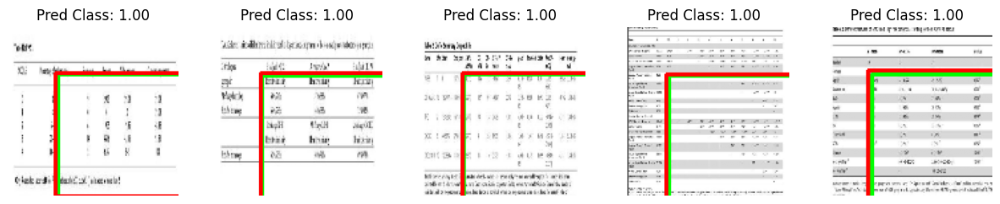

In [20]:
def plot_predictions(model, test_images, test_bboxes, num_samples=5):
    """
    Plot model predictions on test images.

    Args:
        model: Trained model.
        test_images (numpy array): Test images.
        test_bboxes (numpy array): Ground truth bounding boxes.
        num_samples (int): Number of images to visualize.
    """
    predictions = model.predict(test_images[:num_samples])
    pred_bboxes, pred_classes = predictions[0], predictions[1]

    plt.figure(figsize=(15, 5))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i+1)
        img = test_images[i].copy()

        # Ground truth bounding box
        x_min, y_min, x_max, y_max = test_bboxes[i]
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)  # Green for ground truth

        # Predicted bounding box
        x_min, y_min, x_max, y_max = pred_bboxes[i].astype(int)
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)  # Blue for prediction

        plt.imshow(img)
        plt.axis("off")
        # Access the first element of the array if it's a single-element array
        pred_class_value = pred_classes[i][0] if pred_classes[i].shape else pred_classes[i]
        plt.title(f"Pred Class: {pred_class_value:.2f}") # Format the extracted value

    plt.show()

# Load test images and true bounding boxes
test_images, targets = next(data_generator(
    annotation_dir=os.path.join(DATA_DIR, 'test'),
    image_dir=os.path.join(DATA_DIR, 'img_test'),
    image_size=IMAGE_SIZE,
    batch_size=5
))
test_bboxes = targets['bbox']  # Access bounding boxes from targets dictionary

# Plot predictions
plot_predictions(model, test_images, test_bboxes)


In [21]:
from sklearn.metrics import mean_absolute_error

def calculate_bbox_mae(model, test_images, test_bboxes):
    """
    Calculate Mean Absolute Error (MAE) for predicted bounding boxes.
    """
    predictions = model.predict(test_images)
    pred_bboxes = predictions[0]

    mae = mean_absolute_error(test_bboxes, pred_bboxes)
    print(f"Mean Absolute Error for Bounding Boxes: {mae:.4f}")

# Test the bounding box accuracy
calculate_bbox_mae(model, test_images, test_bboxes)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
Mean Absolute Error for Bounding Boxes: 8.7703


In [24]:
from sklearn.metrics import classification_report

def evaluate_classification(model, test_images, test_labels):
    """
    Evaluate model classification performance.
    """
    predictions = model.predict(test_images)
    pred_classes = (predictions[1] > 0.5).astype(int).flatten()  # Convert to 0 or 1

    # Get unique classes in test_labels
    unique_classes = np.unique(test_labels)

    # Adjust target_names based on unique classes
    if len(unique_classes) == 1 and unique_classes[0] == 1:  # Only 'Table' class
        target_names = ["Table"]
    else:  # Both 'No Table' and 'Table' classes are present
        target_names = ["No Table", "Table"]

    print(classification_report(test_labels, pred_classes, target_names=target_names))
    # Use the adjusted target_names here

# Load test labels
test_images, targets = next(data_generator(
    annotation_dir=os.path.join(DATA_DIR, 'test'),
    image_dir=os.path.join(DATA_DIR, 'img_test'),
    image_size=IMAGE_SIZE,
    batch_size=32
))
test_labels = targets['class']  # Access labels from targets dictionary

# Evaluate classification
evaluate_classification(model, test_images, test_labels)


Processing 20000 annotations in batches of 32...


Parsing batch: 100%|██████████| 32/32 [00:00<00:00, 231.63it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step
              precision    recall  f1-score   support

       Table       1.00      1.00      1.00        32

    accuracy                           1.00        32
   macro avg       1.00      1.00      1.00        32
weighted avg       1.00      1.00      1.00        32



In [38]:
#This helps the model learn variations of tables.

from tensorflow.keras.preprocessing.image import ImageDataGenerator

data_augmenter = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    brightness_range=[0.8, 1.2],
    horizontal_flip=True
)

In [39]:
import tensorflow.keras.backend as K

def iou_loss(y_true, y_pred):
    """
    Compute Intersection over Union (IoU) loss.
    """
    x1 = K.maximum(y_true[:, 0], y_pred[:, 0])
    y1 = K.maximum(y_true[:, 1], y_pred[:, 1])
    x2 = K.minimum(y_true[:, 2], y_pred[:, 2])
    y2 = K.minimum(y_true[:, 3], y_pred[:, 3])

    intersection = K.maximum(0.0, x2 - x1) * K.maximum(0.0, y2 - y1)
    true_area = (y_true[:, 2] - y_true[:, 0]) * (y_true[:, 3] - y_true[:, 1])
    pred_area = (y_pred[:, 2] - y_pred[:, 0]) * (y_pred[:, 3] - y_pred[:, 1])

    union = true_area + pred_area - intersection
    iou = intersection / (union + K.epsilon())

    return 1 - iou  # IoU loss (1 - IoU)

# Update Model Loss
model.compile(optimizer='adam',
              loss={'bbox': iou_loss, 'class': 'binary_crossentropy'},
              metrics={'bbox': 'mse', 'class': 'accuracy'})


In [44]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 128, 128, 32)   │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 64, 64, 32)     │              0 │ conv2d[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 64, 64, 64)     │         18,496 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 32, 32, 64)     │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 32, 32, 128)    │         73,856 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 16, 16, 128)    │              0 │ conv2d_2[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 32768)          │              0 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 128)            │      4,194,432 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bbox (Dense)              │ (None, 4)              │            516 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ class (Dense)             │ (None, 1)              │            129 │ dense[0][0]            │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 4,288,327 (16.36 MB)

 Trainable params: 4,288,325 (16.36 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [45]:
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.models import Model

inputs = Input(shape=(128,))
x = Dense(256, activation='relu')(inputs)  # First layer
x = Dropout(0.5)(x)  # Apply dropout
x = Dense(128, activation='relu')(x)  # Next layer

model = Model(inputs, x)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 128)                 │          32,896 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 65,920 (257.50 KB)

 Trainable params: 65,920 (257.50 KB)

 Non-trainable params: 0 (0.00 B)

In [52]:
def scale_bounding_boxes(bboxes, original_size, target_size):
    """Scales bounding boxes from original image size to target size."""
    orig_w, orig_h = original_size
    target_w, target_h = target_size
    scale_x = target_w / orig_w
    scale_y = target_h / orig_h

    scaled_bboxes = []
    for bbox in bboxes:
        x_min, y_min, x_max, y_max = bbox
        x_min, x_max = x_min * scale_x, x_max * scale_x
        y_min, y_max = y_min * scale_y, y_max * scale_y
        scaled_bboxes.append([x_min, y_min, x_max, y_max])

    return np.array(scaled_bboxes)



Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


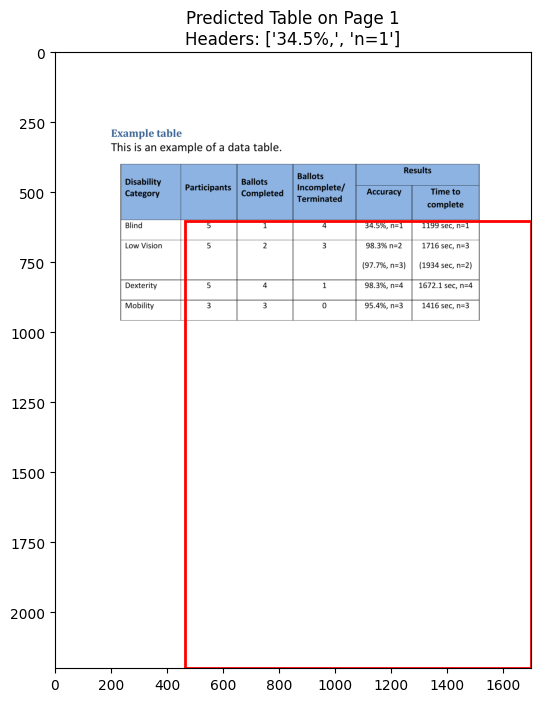

In [84]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pdf2image import convert_from_path, pdfinfo_from_path
from tensorflow.keras.models import load_model
import tensorflow as tf

# Install pytesseract if not installed
try:
    import pytesseract
except ImportError:
    !pip install pytesseract
    import pytesseract # Import after installing

# For OCR
# Install Tesseract if not already installed
try:
    import google.colab
    !sudo apt install tesseract-ocr
except ImportError:
    print("Not running in Google Colab. Skipping Tesseract installation.")

# Include custom objects when loading the model
#original_model = load_model("table_detection_model.h5", custom_objects={'iou_loss': iou_loss, 'mse': tf.keras.losses.MeanSquaredError()})

def visualize_predictions(pdf_path, model, image_size=(128, 128), confidence_threshold=0.8, min_bbox_area=2000):
    """
    Visualizes table predictions on a PDF document, skipping blank pages and extracts column headers.

    Args:
        pdf_path (str): Path to the PDF file.
        model (tf.keras.Model): The trained table detection model.
        image_size (tuple): The target size for resizing images (height, width).
        confidence_threshold (float): The minimum confidence score for a prediction to be considered.
        min_bbox_area (int): The minimum area of a bounding box to be considered a valid table.
    """

    # Get PDF info and number of pages
    info = pdfinfo_from_path(pdf_path)
    num_pages = info["Pages"]

    # Convert PDF to images, suppressing output
    pages = convert_from_path(pdf_path, thread_count=num_pages, timeout=600)

    for page_num, page in enumerate(pages):
        # Convert PDF page to image
        image = np.array(page)
        original_height, original_width = image.shape[:2]

        # Resize image for model input
        image_resized = cv2.resize(image, image_size) / 255.0
        resized_height, resized_width = image_resized.shape[:2]

        # Make prediction
        pred_bbox, pred_class = model.predict(np.expand_dims(image_resized, axis=0))
        pred_bbox = pred_bbox[0].astype(int)

        # Filter predictions based on confidence score and bounding box area
        if pred_class[0] >= confidence_threshold:
            # Scale bounding box back to original image size
            x_min, y_min, x_max, y_max = pred_bbox
            scale_x = original_width / resized_width
            scale_y = original_height / resized_height

            # Clip bounding box coordinates to image boundaries after scaling
            x_min = int(max(0, x_min * scale_x))
            y_min = int(max(0, y_min * scale_y))
            x_max = int(min(original_width, x_max * scale_x))
            y_max = int(min(original_height, y_max * scale_y))

            # Calculate bounding box area
            bbox_area = (x_max - x_min) * (y_max - y_min)

            # Draw bounding box only if area is above the minimum threshold
            if bbox_area >= min_bbox_area:
                # Extract table region from original image
                table_region = image[y_min:y_max, x_min:x_max]

                # Perform OCR on the table region
                ocr_result = pytesseract.image_to_string(table_region)

                # Extract column headers (heuristic-based)
                # (You'll need to adapt this part based on your table structure)
                lines = ocr_result.split('\n')
                column_headers = lines[0].split()  # Assuming headers are in the first line

                # Plotting the image with bounding box and column headers
                fig, ax = plt.subplots(1, figsize=(10, 8))
                ax.imshow(image)

                # Draw bounding box
                rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                         linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect)

                # Display column headers
                plt.title(f"Predicted Table on Page {page_num + 1}\nHeaders: {column_headers}")
                plt.show()

# Call the function to visualize predictions
visualize_predictions("/content/table.pdf", original_model, min_bbox_area=2000)